In [1]:
# Parameters
config = {
    "notebook": "notebooks/tfi_lgbm_optuna.ipynb",
    "data_path": "C:/Users/nico_/Desktop/ITBA/TFI/github/df_procesado/fixed_gear_fe_recortado.csv",
    "output_label": "fixed_gear_optuna",
}


In [2]:
# check if config exists
try:
    config
except NameError:
    config_exists = False
else:
    config_exists = True

# make config if it does not exist already (e.g. passed in by papermill)
if not(config_exists):
    # set up some config for the experiment run
    config = {
        "data_path" : "C:/Users/nico_/Desktop/ITBA/TFI/github/df_procesado/trollers_fe_recortado.csv",
    }
print(config)

{'notebook': 'notebooks/tfi_lgbm_optuna.ipynb', 'data_path': 'C:/Users/nico_/Desktop/ITBA/TFI/github/df_procesado/fixed_gear_fe_recortado.csv', 'output_label': 'fixed_gear_optuna'}


In [3]:
# Importing core libraries
#https://towardsdatascience.com/kagglers-guide-to-lightgbm-hyperparameter-tuning-with-optuna-in-2021-ed048d9838b5
#https://www.kaggle.com/code/lucamassaron/tutorial-bayesian-optimization-with-lightgbm/notebook
import numpy as np
import pandas as pd
from time import time
import pprint
import joblib
from functools import partial

# Suppressing warnings because of skopt verbosity
import warnings
warnings.filterwarnings("ignore")

# Classifiers
import lightgbm as lgb

# Model selection
from sklearn.model_selection import KFold, StratifiedKFold

# Metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import make_scorer

# Skopt functions
from skopt import BayesSearchCV
from skopt.callbacks import DeadlineStopper, DeltaYStopper
from skopt.space import Real, Categorical, Integer

# Data processing
from sklearn.preprocessing import OrdinalEncoder
from sklearn.decomposition import TruncatedSVD
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer

Cargamos el dataset.

In [4]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

df = pd.read_csv(config['data_path'], header="infer", sep=",",error_bad_lines=False, engine ='python')

In [5]:
df = df.drop(['mmsi', 'source','timestamp','source','datetime','distance_from_shore','distance_from_port'], axis = 1)
lagged_columns = ['A0', 'J0', 'C0','speed_lag_1', 'speed_lag_2',
       'speed_lag_3', 'speed_lag_4', 'speed_lag_5', 'speed_lag_6',
       'course_lag_1', 'course_lag_2', 'course_lag_3', 'course_lag_4',
       'course_lag_5', 'course_lag_6', 'S0_lag_1', 'S0_lag_2', 'S0_lag_3',
       'S0_lag_4', 'S0_lag_5', 'S0_lag_6', 'A0_lag_1', 'A0_lag_2', 'A0_lag_3',
       'A0_lag_4', 'A0_lag_5', 'A0_lag_6', 'J0_lag_1', 'J0_lag_2', 'J0_lag_3',
       'J0_lag_4', 'J0_lag_5', 'J0_lag_6', 'C0_lag_1', 'C0_lag_2', 'C0_lag_3',
       'C0_lag_4', 'C0_lag_5', 'C0_lag_6']
for column in lagged_columns:
    df[column]=df[column].abs()

print(df)


      speed    course       lat       lon is_fishing  sun_state   distance  \
0       0.4  0.336667  0.870602 -0.190903         NO          2   9.624476   
1       0.6  0.442778  0.869098 -0.190974         NO          2   9.410527   
2       1.4  0.487222  0.869060 -0.190970         SI          2   0.239792   
3       3.1  0.790000  0.864765 -0.195526         NO          1   0.302651   
4       1.1  0.043889  0.869326 -0.192465         NO          1  34.521489   
...     ...       ...       ...       ...        ...        ...        ...   
9818    9.5  0.546111  0.893925  0.047558         SI          2   4.295893   
9819    9.4  0.541944  0.893833  0.047521         SI          2   0.625956   
9820    3.3  0.363889  1.054151  0.017018         NO          1   3.915774   
9821    0.6  1.000000  0.759690 -0.043457         NO          1   0.139264   
9822    0.0  0.380556  0.872839 -0.040521         NO          1   1.392383   

      timediff        S0            A0  ...      J0_lag_3      

Generamos los vectores de train y test.

In [6]:
#Generamos train y test.

#Si la longitud del dataset es mayor a 10000, partiremos agrupado por "is_fishing" ya que nos puede tocar un conjunto con is_fishing='SI' vacio.
#if len(dataset)>10000:
    #df = df.sample(n=10000, random_state=1)
#    df = df.groupby("is_fishing").sample(n=7500, random_state=1,replace=True)
#    df = df.drop_duplicates()

X = df.drop('is_fishing',axis=1)
y = df['is_fishing']
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=50)
print(len(df[df['is_fishing']=='SI']))
print(len(df[df['is_fishing']=='NO']))



4683
5140


Funcion para evaluar los modelos.

In [7]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from IPython.display import display, Markdown, Latex
import matplotlib.pyplot as plt
import tabulate
from sklearn.metrics import confusion_matrix, accuracy_score


def evaluate_model(title,y_test, y_pred):

    cm = confusion_matrix(y_test, y_pred)
    display(Markdown(title))
    cmd_obj = ConfusionMatrixDisplay(cm, display_labels=['NO', 'SI'])
    cmd_obj.plot()
    cmd_obj.ax_.set(
                    title='Matriz de confusión.', 
                    xlabel='Predict Values', 
                    ylabel='Actual Values')
    plt.show()
    _precision_score = precision_score(y_test, y_pred,pos_label='SI')
    _recall_score = recall_score(y_test, y_pred, pos_label='SI')
    _accuracy_score = accuracy_score(y_test, y_pred)
    _f1_score = f1_score(y_test, y_pred, pos_label='SI')

    data = [["Precision","Recall","Accuracy","F1"],
            ["%.2f" % _precision_score, "%.2f" % _recall_score, "%.2f" % _accuracy_score, "%.2f" % _f1_score ]]
    table = tabulate.tabulate(data, tablefmt='html')
    display(table)
    return _precision_score, _recall_score, _accuracy_score, _f1_score


Fitting 3 folds for each of 1440 candidates, totalling 4320 fits


Train Accuracy : 0.830
Test Accuracy : 0.733
Best Score Through Grid Search : 0.685
Best Parameters :  {'max_depth': 11, 'max_features': None, 'max_leaf_nodes': None, 'min_samples_leaf': 4, 'min_weight_fraction_leaf': 0, 'splitter': 'best'}


Best Parameters :  {'max_depth': 11, 'max_features': None, 'max_leaf_nodes': None, 'min_samples_leaf': 4, 'min_weight_fraction_leaf': 0, 'splitter': 'best'}


Arboles de decision optimizado

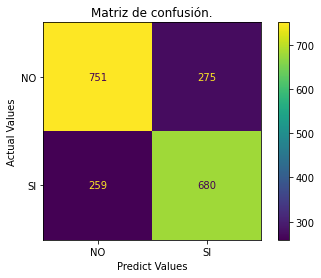

Precision,Recall,Accuracy,F1
0.71,0.72,0.73,0.72


In [8]:
from sklearn.tree import ExtraTreeClassifier
from sklearn.tree import DecisionTreeRegressor
#extra_tree_classifier = ExtraTreeClassifier(random_state=1)
#extra_tree_classifier.fit(X_train, y_train)

from sklearn.model_selection import GridSearchCV

parameters={"splitter":["best","random"],
            "max_depth" : [11,12,13,14,15,16],
           "min_samples_leaf":[1,2,3,4,5],
           "min_weight_fraction_leaf":[0, 0.1,0.2],
           "max_features":["auto","log2","sqrt",None],
           "max_leaf_nodes":[None,10] }

grid = GridSearchCV(DecisionTreeClassifier(random_state=1), cv=3, n_jobs=-1, verbose=3,
                    param_grid =parameters
                    )

grid.fit(X_train, y_train)

print('Train Accuracy : %.3f'%grid.best_estimator_.score(X_train, y_train))
print('Test Accuracy : %.3f'%grid.best_estimator_.score(X_test, y_test))
print('Best Score Through Grid Search : %.3f'%grid.best_score_)
print('Best Parameters : ',grid.best_params_)

dt = DecisionTreeClassifier(max_depth=grid.best_params_['max_depth'], 
                            max_features=grid.best_params_['max_features'],
                            max_leaf_nodes=grid.best_params_['max_leaf_nodes'],
                            min_samples_leaf=grid.best_params_['min_samples_leaf'],
                            min_weight_fraction_leaf=grid.best_params_['min_weight_fraction_leaf'],
                            splitter=grid.best_params_['splitter']
)
dt.fit(X_train, y_train)

y_pred = dt.predict(X_test)
print('Best Parameters : ',grid.best_params_)
dt_precision_score, dt_recall_score, dt_accuracy_score, dt_f1_score = evaluate_model('Arboles de decision optimizado',y_test, y_pred)

Fitting 3 folds for each of 432 candidates, totalling 1296 fits


Train Accuracy : 1.000
Test Accuracy : 0.763
Best Score Through Grid Search : 0.739
Best Parameters :  {'bootstrap': False, 'max_depth': 15, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}


Random forest optimizado

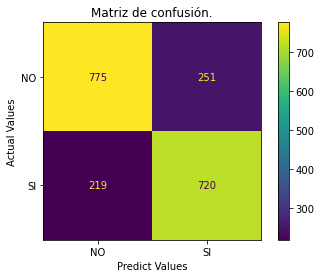

Precision,Recall,Accuracy,F1
0.74,0.77,0.76,0.75


In [9]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

param_grid = {
    'bootstrap': [True, False],
    'max_depth': [12,13,14,15],
    'max_features': ["auto", "sqrt", "log2"],
    'min_samples_leaf': [1,2,3],
    'min_samples_split': [2, 5 , 10],
    'n_estimators': [100, 200]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid = GridSearchCV(estimator = rf, param_grid = param_grid, cv = 3, n_jobs = -1, verbose = 2)
grid.fit(X_train, y_train)

print('Train Accuracy : %.3f'%grid.best_estimator_.score(X_train, y_train))
print('Test Accuracy : %.3f'%grid.best_estimator_.score(X_test, y_test))
print('Best Score Through Grid Search : %.3f'%grid.best_score_)
print('Best Parameters : ',grid.best_params_)

dt = RandomForestClassifier(bootstrap=grid.best_params_['bootstrap'], 
                            max_depth=grid.best_params_['max_depth'],
                            max_features=grid.best_params_['max_features'],
                            min_samples_leaf=grid.best_params_['min_samples_leaf'],
                            min_samples_split=grid.best_params_['min_samples_split'],
                            n_estimators=grid.best_params_['n_estimators']
)
dt.fit(X_train, y_train)
y_pred = dt.predict(X_test)
rf_precision_score, rf_recall_score, rf_accuracy_score, rf_f1_score = evaluate_model('Random forest optimizado', y_test, y_pred)


Fitting 5 folds for each of 30 candidates, totalling 150 fits


Train Accuracy : 0.699


Test Accuracy : 0.610
Best Score Through Grid Search : 0.603
Best Parameters :  {'C': 100, 'gamma': 0.0001, 'kernel': 'rbf'}


rbf

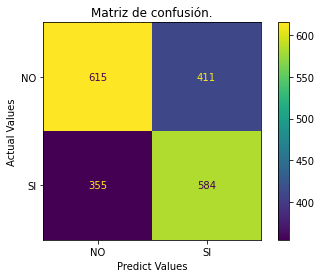

Precision,Recall,Accuracy,F1
0.59,0.62,0.61,0.60


Fitting 5 folds for each of 120 candidates, totalling 600 fits


Train Accuracy : 0.554


Test Accuracy : 0.554
Best Score Through Grid Search : 0.554
Best Parameters :  {'C': 1, 'coef0': 1, 'gamma': 1e-06, 'kernel': 'sigmoid'}


sigmoid

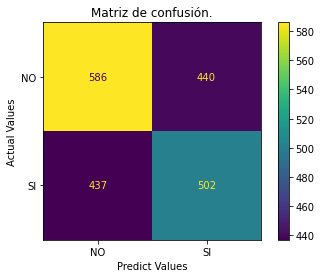

Precision,Recall,Accuracy,F1
0.53,0.53,0.55,0.53


In [10]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

#parameters = [{'kernel': ['rbf'], 'gamma': [1e-2, 1e-3, 1e-4, 1e-5],'C': [0.001, 0.10, 0.1, 10 ]},
#              {'kernel': ['sigmoid'], 'gamma': [1e-2, 1e-3, 1e-4, 1e-5],'C': [0.001, 0.10, 0.1, 10], 'coef0 ':[0,0.1,1]},
#              {'kernel': ['linear'], 'C': [0.001, 0.10, 0.1, 1]}     
#]

parameters = [{'kernel': ['rbf'], 'gamma': [1e-2,1e-3,1e-4,1e-5,1e-6],'C': [0.001,0.01,0.1,1,10,100]},
              {'kernel': ['sigmoid'], 'gamma': [1e-2,1e-3,1e-4,1e-5,1e-6],'C': [0.001,0.01,0.1,1,10,100],'coef0' : [0.01,0.1,1,10]},
              #{'kernel': ['linear'], 'C': [0.1,1,10,100]}
              ]

svm_precision_score_rbf=svm_recall_score_rbf=svm_accuracy_score_rbf=svm_f1_score_rbf=0
svm_precision_score_sigmoid=svm_recall_score_sigmoid=svm_accuracy_score_sigmoid=svm_f1_score_sigmoid=0
svm_precision_score_linear=svm_recall_score_linear=svm_accuracy_score_linear=svm_f1_score_linear=0
for parameter in parameters:
    param_grid = parameter
    grid = GridSearchCV(SVC(), param_grid, n_jobs = -1, verbose = 3)
    grid.fit(X_train, y_train)
    kernel_str = parameter['kernel'][0]
    y_pred = grid.predict(X_test)
    dt = grid
    
    print('Train Accuracy : %.3f'%grid.best_estimator_.score(X_train, y_train))
    print('Test Accuracy : %.3f'%grid.best_estimator_.score(X_test, y_test))
    print('Best Score Through Grid Search : %.3f'%grid.best_score_)
    print('Best Parameters : ',grid.best_params_)

    if parameter['kernel'][0] == 'rbf':
        svm_precision_score_rbf, svm_recall_score_rbf, svm_accuracy_score_rbf, svm_f1_score_rbf = evaluate_model(kernel_str, y_test, y_pred)
    if parameter['kernel'][0] == 'sigmoid':
        svm_precision_score_sigmoid, svm_recall_score_sigmoid, svm_accuracy_score_sigmoid, svm_f1_score_sigmoid = evaluate_model(kernel_str, y_test, y_pred)
    if parameter['kernel'][0] == 'linear':
        svm_precision_score_linear, svm_recall_score_linear, svm_accuracy_score_linear, svm_f1_score_linear = evaluate_model(kernel_str, y_test, y_pred)

In [11]:
import optuna  # pip install optuna
from sklearn.metrics import log_loss
from sklearn.model_selection import StratifiedKFold

from optuna.integration import LightGBMPruningCallback


def objective(trial, X, y):
    param_grid = {
        # "device_type": trial.suggest_categorical("device_type", ['gpu']),
        "n_estimators": trial.suggest_categorical("n_estimators", [10000]),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),
        "num_leaves": trial.suggest_int("num_leaves", 8, 1023, step=10),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 200, 10000, step=100),
        "lambda_l1": trial.suggest_float("lambda_l1", 0.0, 10),
        "lambda_l2": trial.suggest_float("lambda_l2", 0.0, 100),
        "min_gain_to_split": trial.suggest_float("min_gain_to_split", 0, 15),
        "bagging_fraction": trial.suggest_float(
            "bagging_fraction", 0.2, 0.95, step=0.1
        ),
        "bagging_freq": trial.suggest_categorical("bagging_freq", [1]),
        "feature_fraction": trial.suggest_float(
            "feature_fraction", 0.2, 0.95, step=0.1
        ),
    }

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=1121218)

    cv_scores = np.empty(5)
    for idx, (train_idx, test_idx) in enumerate(cv.split(X, y)):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        model = lgb.LGBMClassifier(objective="binary", **param_grid)
        model.fit(
            X_train,
            y_train,
            eval_set=[(X_test, y_test)],
            eval_metric="binary_logloss",
            #eval_metric="auc",
            early_stopping_rounds=100,
            callbacks=[
                #LightGBMPruningCallback(trial, "auc")
                LightGBMPruningCallback(trial, "binary_logloss")
            ],  # Add a pruning callback
        )
        preds = model.predict_proba(X_test)
        cv_scores[idx] = log_loss(y_test, preds)

    return np.mean(cv_scores)


In [12]:
study = optuna.create_study(direction="minimize", study_name="LGBM Classifier")

#AUC -> maximixe
#study = optuna.create_study(direction="maximize", study_name="LGBM Classifier")
func = lambda trial: objective(trial, X, y)
study.optimize(func, n_trials=2000)


[I 2022-06-06 20:49:13,742] A new study created in memory with name: LGBM Classifier


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=4.160292595189839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.160292595189839
[LightGBM] [Warning] lambda_l1 is set=0.2501369041924806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2501369041924806
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=35.74041364908096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.74041364908096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be

[I 2022-06-06 20:49:14,139] Trial 0 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.038429950768790015, 'num_leaves': 258, 'max_depth': 8, 'min_data_in_leaf': 4800, 'lambda_l1': 0.2501369041924806, 'lambda_l2': 35.74041364908096, 'min_gain_to_split': 4.160292595189839, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 0 with value: 0.6920645895771018.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=4.160292595189839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.160292595189839
[LightGBM] [Warning] lambda_l1 is set=0.2501369041924806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2501369041924806
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=35.74041364908096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.74041364908096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=9.960403295446408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.960403295446408
[LightGBM] [Warning] lambda_l1 is set=6.013989894076662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.013989894076662
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=28.46438809611226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.46438809611226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=9.960403295446408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.960403295446408
[LightGBM] [Warning] lambda_l1 is set=6.013989894076662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.013989894076662
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=28.46438809611226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.46438809611226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-06 20:49:14,825] Trial 1 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06043259089032938, 'num_leaves': 748, 'max_depth': 9, 'min_data_in_leaf': 3700, 'lambda_l1': 6.013989894076662, 'lambda_l2': 28.46438809611226, 'min_gain_to_split': 9.960403295446408, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 0 with value: 0.6920645895771018.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=9.309925535494424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.309925535494424
[LightGBM] [Warning] lambda_l1 is set=9.095752904898074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.095752904898074
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.82771958107523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.82771958107523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=9.309925535494424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.309925535494424
[LightGBM] [Warning] lambda_l1 is set=9.095752904898074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.095752904898074
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.82771958107523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.82771958107523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=9.309925535494424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.309925535494424
[LightGBM] [Warning] lambda_l1 is set=9.095752904898074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.095752904898074
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.82771958107523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.82771958107523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=9.309925535494424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.309925535494424
[LightGBM] [Warning] lambda_l1 is set=9.095752904898074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.095752904898074
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.82771958107523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.82771958107523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:49:16,029] Trial 2 finished with value: 0.6377299945959003 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25830473701509005, 'num_leaves': 648, 'max_depth': 7, 'min_data_in_leaf': 2100, 'lambda_l1': 9.095752904898074, 'lambda_l2': 16.82771958107523, 'min_gain_to_split': 9.309925535494424, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 2 with value: 0.6377299945959003.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=9.309925535494424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.309925535494424
[LightGBM] [Warning] lambda_l1 is set=9.095752904898074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.095752904898074
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.82771958107523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.82771958107523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=3.969018025420697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.969018025420697
[LightGBM] [Warning] lambda_l1 is set=3.8410516117042293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8410516117042293
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=4.089769249469399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.089769249469399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-06 20:49:16,441] Trial 3 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08044907391300214, 'num_leaves': 38, 'max_depth': 8, 'min_data_in_leaf': 4600, 'lambda_l1': 3.8410516117042293, 'lambda_l2': 4.089769249469399, 'min_gain_to_split': 3.969018025420697, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2 with value: 0.6377299945959003.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=3.969018025420697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.969018025420697
[LightGBM] [Warning] lambda_l1 is set=3.8410516117042293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8410516117042293
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=4.089769249469399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.089769249469399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=3.7380175722867386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7380175722867386
[LightGBM] [Warning] lambda_l1 is set=5.769827557701492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.769827557701492
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.4021841119164935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4021841119164935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-06 20:49:16,859] Trial 4 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17484037379407166, 'num_leaves': 248, 'max_depth': 6, 'min_data_in_leaf': 9400, 'lambda_l1': 5.769827557701492, 'lambda_l2': 1.4021841119164935, 'min_gain_to_split': 3.7380175722867386, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 2 with value: 0.6377299945959003.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=3.7380175722867386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7380175722867386
[LightGBM] [Warning] lambda_l1 is set=5.769827557701492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.769827557701492
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.4021841119164935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4021841119164935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=6.444575319167647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.444575319167647
[LightGBM] [Warning] lambda_l1 is set=6.296252822769237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.296252822769237
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=45.22401325262876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.22401325262876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_da

[I 2022-06-06 20:49:17,326] Trial 5 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02758901464327037, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 6600, 'lambda_l1': 6.296252822769237, 'lambda_l2': 45.22401325262876, 'min_gain_to_split': 6.444575319167647, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 2 with value: 0.6377299945959003.


[LightGBM] [Warning] min_gain_to_split is set=6.444575319167647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.444575319167647
[LightGBM] [Warning] lambda_l1 is set=6.296252822769237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.296252822769237
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=45.22401325262876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.22401325262876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=6.444575319167647, min_split_gain=0.0 will be ignored. Current v

[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=1.8342631354802714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8342631354802714
[LightGBM] [Warning] lambda_l1 is set=5.967245438848789, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.967245438848789
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=36.50489668038688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.50489668038688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will b

[I 2022-06-06 20:49:17,786] Trial 6 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09970869587210297, 'num_leaves': 218, 'max_depth': 6, 'min_data_in_leaf': 5700, 'lambda_l1': 5.967245438848789, 'lambda_l2': 36.50489668038688, 'min_gain_to_split': 1.8342631354802714, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 2 with value: 0.6377299945959003.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=1.8342631354802714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8342631354802714
[LightGBM] [Warning] lambda_l1 is set=5.967245438848789, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.967245438848789
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=36.50489668038688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.50489668038688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be

[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=9.149675678722677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.149675678722677
[LightGBM] [Warning] lambda_l1 is set=5.4900082748567725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4900082748567725
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=81.11093371264542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.11093371264542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=9.149675678722677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.149675678722677
[LightGBM] [Warning] lambda_l1 is set=5.4900082748567725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4900082748567725
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=81.11093371264542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.11093371264542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=9.149675678722677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.149675678722677
[LightGBM] [Warning] lambda_l1 is set=5.4900082748567725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4900082748567725
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=81.11093371264542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.11093371264542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=9.149675678722677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.149675678722677
[LightGBM] [Warning] lambda_l1 is set=5.4900082748567725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4900082748567725
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=81.11093371264542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.11093371264542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=9.149675678722677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.149675678722677
[LightGBM] [Warning] lambda_l1 is set=5.4900082748567725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4900082748567725
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=81.11093371264542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.11093371264542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:49:27,111] Trial 7 finished with value: 0.6275059575406425 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028782413110165855, 'num_leaves': 268, 'max_depth': 11, 'min_data_in_leaf': 1500, 'lambda_l1': 5.4900082748567725, 'lambda_l2': 81.11093371264542, 'min_gain_to_split': 9.149675678722677, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 7 with value: 0.6275059575406425.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=9.668616699063596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.668616699063596
[LightGBM] [Warning] lambda_l1 is set=7.761055956222948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.761055956222948
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=46.64386400100249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.64386400100249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be

[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=9.668616699063596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.668616699063596
[LightGBM] [Warning] lambda_l1 is set=7.761055956222948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.761055956222948
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=46.64386400100249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.64386400100249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will b

[I 2022-06-06 20:49:27,568] Trial 8 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19647137316326557, 'num_leaves': 58, 'max_depth': 6, 'min_data_in_leaf': 4000, 'lambda_l1': 7.761055956222948, 'lambda_l2': 46.64386400100249, 'min_gain_to_split': 9.668616699063596, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 7 with value: 0.6275059575406425.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=2.0673018974749113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0673018974749113
[LightGBM] [Warning] lambda_l1 is set=5.164963038090117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.164963038090117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.51235009744384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.51235009744384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=2.0673018974749113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0673018974749113
[LightGBM] [Warning] lambda_l1 is set=5.164963038090117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.164963038090117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.51235009744384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.51235009744384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=2.0673018974749113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0673018974749113
[LightGBM] [Warning] lambda_l1 is set=5.164963038090117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.164963038090117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.51235009744384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.51235009744384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=2.0673018974749113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0673018974749113
[LightGBM] [Warning] lambda_l1 is set=5.164963038090117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.164963038090117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.51235009744384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.51235009744384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:49:29,250] Trial 9 finished with value: 0.6477209895337079 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26471703901751265, 'num_leaves': 648, 'max_depth': 7, 'min_data_in_leaf': 3400, 'lambda_l1': 5.164963038090117, 'lambda_l2': 45.51235009744384, 'min_gain_to_split': 2.0673018974749113, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 7 with value: 0.6275059575406425.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=2.0673018974749113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0673018974749113
[LightGBM] [Warning] lambda_l1 is set=5.164963038090117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.164963038090117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.51235009744384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.51235009744384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.55287109776743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.55287109776743
[LightGBM] [Warning] lambda_l1 is set=2.6848770221447666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6848770221447666
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=85.38974766625746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.38974766625746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.55287109776743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.55287109776743
[LightGBM] [Warning] lambda_l1 is set=2.6848770221447666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6848770221447666
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=85.38974766625746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.38974766625746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.55287109776743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.55287109776743
[LightGBM] [Warning] lambda_l1 is set=2.6848770221447666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6848770221447666
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=85.38974766625746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.38974766625746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.55287109776743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.55287109776743
[LightGBM] [Warning] lambda_l1 is set=2.6848770221447666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6848770221447666
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=85.38974766625746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.38974766625746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.55287109776743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.55287109776743
[LightGBM] [Warning] lambda_l1 is set=2.6848770221447666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6848770221447666
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=85.38974766625746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.38974766625746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:49:31,030] Trial 10 finished with value: 0.5991473647777885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12641777084881645, 'num_leaves': 428, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 2.6848770221447666, 'lambda_l2': 85.38974766625746, 'min_gain_to_split': 14.55287109776743, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 10 with value: 0.5991473647777885.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=13.605878027891519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.605878027891519
[LightGBM] [Warning] lambda_l1 is set=2.4059101984535705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4059101984535705
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=87.41620703627083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.41620703627083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=13.605878027891519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.605878027891519
[LightGBM] [Warning] lambda_l1 is set=2.4059101984535705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4059101984535705
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=87.41620703627083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.41620703627083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=13.605878027891519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.605878027891519
[LightGBM] [Warning] lambda_l1 is set=2.4059101984535705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4059101984535705
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=87.41620703627083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.41620703627083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=13.605878027891519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.605878027891519
[LightGBM] [Warning] lambda_l1 is set=2.4059101984535705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4059101984535705
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=87.41620703627083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.41620703627083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=13.605878027891519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.605878027891519
[LightGBM] [Warning] lambda_l1 is set=2.4059101984535705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4059101984535705
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=87.41620703627083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.41620703627083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:49:32,932] Trial 11 finished with value: 0.5989854078354838 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12479995935844691, 'num_leaves': 438, 'max_depth': 3, 'min_data_in_leaf': 300, 'lambda_l1': 2.4059101984535705, 'lambda_l2': 87.41620703627083, 'min_gain_to_split': 13.605878027891519, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 11 with value: 0.5989854078354838.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.787660694198742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.787660694198742
[LightGBM] [Warning] lambda_l1 is set=2.265884208711089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.265884208711089
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=99.03398581860475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.03398581860475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.787660694198742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.787660694198742
[LightGBM] [Warning] lambda_l1 is set=2.265884208711089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.265884208711089
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=99.03398581860475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.03398581860475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.787660694198742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.787660694198742
[LightGBM] [Warning] lambda_l1 is set=2.265884208711089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.265884208711089
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=99.03398581860475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.03398581860475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.787660694198742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.787660694198742
[LightGBM] [Warning] lambda_l1 is set=2.265884208711089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.265884208711089
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=99.03398581860475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.03398581860475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.787660694198742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.787660694198742
[LightGBM] [Warning] lambda_l1 is set=2.265884208711089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.265884208711089
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=99.03398581860475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.03398581860475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:49:34,723] Trial 12 finished with value: 0.6106401565403946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13074149858763962, 'num_leaves': 458, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 2.265884208711089, 'lambda_l2': 99.03398581860475, 'min_gain_to_split': 14.787660694198742, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 11 with value: 0.5989854078354838.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.232542911119532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.232542911119532
[LightGBM] [Warning] lambda_l1 is set=2.489128072828575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.489128072828575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.90833858186907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.90833858186907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.232542911119532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.232542911119532
[LightGBM] [Warning] lambda_l1 is set=2.489128072828575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.489128072828575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.90833858186907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.90833858186907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.232542911119532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.232542911119532
[LightGBM] [Warning] lambda_l1 is set=2.489128072828575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.489128072828575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.90833858186907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.90833858186907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.232542911119532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.232542911119532
[LightGBM] [Warning] lambda_l1 is set=2.489128072828575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.489128072828575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.90833858186907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.90833858186907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_by

[I 2022-06-06 20:49:36,066] Trial 13 finished with value: 0.5938321113184342 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13363782357263881, 'num_leaves': 468, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 2.489128072828575, 'lambda_l2': 71.90833858186907, 'min_gain_to_split': 14.232542911119532, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 13 with value: 0.5938321113184342.


[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.232542911119532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.232542911119532
[LightGBM] [Warning] lambda_l1 is set=2.489128072828575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.489128072828575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.90833858186907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.90833858186907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=12.25616334636161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.25616334636161
[LightGBM] [Warning] lambda_l1 is set=0.31328586716659723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31328586716659723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.76555622236191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.76555622236191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=12.25616334636161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.25616334636161
[LightGBM] [Warning] lambda_l1 is set=0.31328586716659723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31328586716659723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.76555622236191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.76555622236191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=12.25616334636161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.25616334636161
[LightGBM] [Warning] lambda_l1 is set=0.31328586716659723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31328586716659723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.76555622236191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.76555622236191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:49:37,216] Trial 14 finished with value: 0.6369737972875411 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2113359528561289, 'num_leaves': 558, 'max_depth': 4, 'min_data_in_leaf': 2000, 'lambda_l1': 0.31328586716659723, 'lambda_l2': 66.76555622236191, 'min_gain_to_split': 12.25616334636161, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 13 with value: 0.5938321113184342.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=12.25616334636161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.25616334636161
[LightGBM] [Warning] lambda_l1 is set=0.31328586716659723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31328586716659723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.76555622236191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.76555622236191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=12.385330550999216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.385330550999216
[LightGBM] [Warning] lambda_l1 is set=2.0115900171316516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0115900171316516
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=68.60539101840125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.60539101840125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=12.385330550999216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.385330550999216
[LightGBM] [Warning] lambda_l1 is set=2.0115900171316516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0115900171316516
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=68.60539101840125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.60539101840125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: mi

[I 2022-06-06 20:49:37,743] Trial 15 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14753882691079376, 'num_leaves': 878, 'max_depth': 4, 'min_data_in_leaf': 7800, 'lambda_l1': 2.0115900171316516, 'lambda_l2': 68.60539101840125, 'min_gain_to_split': 12.385330550999216, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 13 with value: 0.5938321113184342.


[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=12.385330550999216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.385330550999216
[LightGBM] [Warning] lambda_l1 is set=2.0115900171316516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0115900171316516
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=68.60539101840125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.60539101840125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: mi

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=12.45911653282346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.45911653282346
[LightGBM] [Warning] lambda_l1 is set=3.7346708544941065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7346708544941065
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=63.5226400193058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.5226400193058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=12.45911653282346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.45911653282346
[LightGBM] [Warning] lambda_l1 is set=3.7346708544941065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7346708544941065
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=63.5226400193058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.5226400193058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=12.45911653282346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.45911653282346
[LightGBM] [Warning] lambda_l1 is set=3.7346708544941065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7346708544941065
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=63.5226400193058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.5226400193058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=12.45911653282346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.45911653282346
[LightGBM] [Warning] lambda_l1 is set=3.7346708544941065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7346708544941065
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=63.5226400193058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.5226400193058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:49:39,504] Trial 16 finished with value: 0.6345172075838218 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10179310343223896, 'num_leaves': 378, 'max_depth': 4, 'min_data_in_leaf': 1300, 'lambda_l1': 3.7346708544941065, 'lambda_l2': 63.5226400193058, 'min_gain_to_split': 12.45911653282346, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 13 with value: 0.5938321113184342.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=13.519704076823206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.519704076823206
[LightGBM] [Warning] lambda_l1 is set=1.3421180207444297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3421180207444297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.47821459931947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.47821459931947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=13.519704076823206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.519704076823206
[LightGBM] [Warning] lambda_l1 is set=1.3421180207444297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3421180207444297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.47821459931947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.47821459931947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=13.519704076823206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.519704076823206
[LightGBM] [Warning] lambda_l1 is set=1.3421180207444297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3421180207444297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.47821459931947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.47821459931947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=13.519704076823206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.519704076823206
[LightGBM] [Warning] lambda_l1 is set=1.3421180207444297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3421180207444297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.47821459931947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.47821459931947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-06 20:49:40,791] Trial 17 finished with value: 0.6473072647655631 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17410837577928073, 'num_leaves': 548, 'max_depth': 5, 'min_data_in_leaf': 2800, 'lambda_l1': 1.3421180207444297, 'lambda_l2': 96.47821459931947, 'min_gain_to_split': 13.519704076823206, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 13 with value: 0.5938321113184342.


[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=13.519704076823206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.519704076823206
[LightGBM] [Warning] lambda_l1 is set=1.3421180207444297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3421180207444297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=96.47821459931947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.47821459931947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=7.078438336149504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.078438336149504
[LightGBM] [Warning] lambda_l1 is set=3.9185791367345777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9185791367345777
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=79.10878671048755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.10878671048755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=7.078438336149504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.078438336149504
[LightGBM] [Warning] lambda_l1 is set=3.9185791367345777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9185791367345777
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=79.10878671048755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.10878671048755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=7.078438336149504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.078438336149504
[LightGBM] [Warning] lambda_l1 is set=3.9185791367345777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9185791367345777
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=79.10878671048755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.10878671048755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=7.078438336149504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.078438336149504
[LightGBM] [Warning] lambda_l1 is set=3.9185791367345777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9185791367345777
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=79.10878671048755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.10878671048755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=7.078438336149504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.078438336149504
[LightGBM] [Warning] lambda_l1 is set=3.9185791367345777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9185791367345777
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=79.10878671048755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.10878671048755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:49:43,242] Trial 18 finished with value: 0.609396276848152 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23372041219031497, 'num_leaves': 358, 'max_depth': 3, 'min_data_in_leaf': 900, 'lambda_l1': 3.9185791367345777, 'lambda_l2': 79.10878671048755, 'min_gain_to_split': 7.078438336149504, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 13 with value: 0.5938321113184342.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=11.857179594462187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.857179594462187
[LightGBM] [Warning] lambda_l1 is set=2.986498970802941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.986498970802941
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=58.83302903841144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.83302903841144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=11.857179594462187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.857179594462187
[LightGBM] [Warning] lambda_l1 is set=2.986498970802941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.986498970802941
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=58.83302903841144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.83302903841144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=11.857179594462187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.857179594462187
[LightGBM] [Warning] lambda_l1 is set=2.986498970802941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.986498970802941
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=58.83302903841144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.83302903841144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=11.857179594462187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.857179594462187
[LightGBM] [Warning] lambda_l1 is set=2.986498970802941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.986498970802941
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=58.83302903841144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.83302903841144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=11.857179594462187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.857179594462187
[LightGBM] [Warning] lambda_l1 is set=2.986498970802941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.986498970802941
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=58.83302903841144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.83302903841144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:49:44,946] Trial 19 finished with value: 0.6473283559267792 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11236254997015246, 'num_leaves': 758, 'max_depth': 5, 'min_data_in_leaf': 2600, 'lambda_l1': 2.986498970802941, 'lambda_l2': 58.83302903841144, 'min_gain_to_split': 11.857179594462187, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 13 with value: 0.5938321113184342.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=10.888966986494024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.888966986494024
[LightGBM] [Warning] lambda_l1 is set=1.1961618335946835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1961618335946835
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=87.80490422794662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.80490422794662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsampl

[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=10.888966986494024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.888966986494024
[LightGBM] [Warning] lambda_l1 is set=1.1961618335946835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1961618335946835
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=87.80490422794662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.80490422794662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 wi

[I 2022-06-06 20:49:45,478] Trial 20 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.060927282040066644, 'num_leaves': 598, 'max_depth': 10, 'min_data_in_leaf': 7400, 'lambda_l1': 1.1961618335946835, 'lambda_l2': 87.80490422794662, 'min_gain_to_split': 10.888966986494024, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 13 with value: 0.5938321113184342.


[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=10.888966986494024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.888966986494024
[LightGBM] [Warning] lambda_l1 is set=1.1961618335946835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1961618335946835
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=87.80490422794662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.80490422794662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 wil

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=14.728286671237425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.728286671237425
[LightGBM] [Warning] lambda_l1 is set=2.8344985818734783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8344985818734783
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=75.70789600816546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.70789600816546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=14.728286671237425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.728286671237425
[LightGBM] [Warning] lambda_l1 is set=2.8344985818734783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8344985818734783
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=75.70789600816546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.70789600816546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=14.728286671237425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.728286671237425
[LightGBM] [Warning] lambda_l1 is set=2.8344985818734783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8344985818734783
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=75.70789600816546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.70789600816546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:49:46,993] Trial 21 finished with value: 0.6256830696296947 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13712939380757866, 'num_leaves': 438, 'max_depth': 3, 'min_data_in_leaf': 900, 'lambda_l1': 2.8344985818734783, 'lambda_l2': 75.70789600816546, 'min_gain_to_split': 14.728286671237425, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 13 with value: 0.5938321113184342.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=14.728286671237425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.728286671237425
[LightGBM] [Warning] lambda_l1 is set=2.8344985818734783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8344985818734783
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=75.70789600816546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.70789600816546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.815693711852147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.815693711852147
[LightGBM] [Warning] lambda_l1 is set=4.360991511036234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.360991511036234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.70260315415192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.70260315415192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.815693711852147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.815693711852147
[LightGBM] [Warning] lambda_l1 is set=4.360991511036234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.360991511036234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.70260315415192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.70260315415192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.815693711852147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.815693711852147
[LightGBM] [Warning] lambda_l1 is set=4.360991511036234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.360991511036234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.70260315415192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.70260315415192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.815693711852147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.815693711852147
[LightGBM] [Warning] lambda_l1 is set=4.360991511036234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.360991511036234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.70260315415192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.70260315415192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:49:48,307] Trial 22 finished with value: 0.601998382961836 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1569262966635584, 'num_leaves': 358, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 4.360991511036234, 'lambda_l2': 90.70260315415192, 'min_gain_to_split': 13.815693711852147, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 13 with value: 0.5938321113184342.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.815693711852147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.815693711852147
[LightGBM] [Warning] lambda_l1 is set=4.360991511036234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.360991511036234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.70260315415192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.70260315415192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.732977408327026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.732977408327026
[LightGBM] [Warning] lambda_l1 is set=1.4209017987109596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4209017987109596
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=86.57814714086952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.57814714086952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.732977408327026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.732977408327026
[LightGBM] [Warning] lambda_l1 is set=1.4209017987109596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4209017987109596
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=86.57814714086952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.57814714086952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.732977408327026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.732977408327026
[LightGBM] [Warning] lambda_l1 is set=1.4209017987109596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4209017987109596
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=86.57814714086952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.57814714086952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.732977408327026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.732977408327026
[LightGBM] [Warning] lambda_l1 is set=1.4209017987109596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4209017987109596
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=86.57814714086952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.57814714086952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.732977408327026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.732977408327026
[LightGBM] [Warning] lambda_l1 is set=1.4209017987109596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4209017987109596
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=86.57814714086952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.57814714086952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:49:50,057] Trial 23 finished with value: 0.5969317641514972 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11329041444705427, 'num_leaves': 118, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 1.4209017987109596, 'lambda_l2': 86.57814714086952, 'min_gain_to_split': 13.732977408327026, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 13 with value: 0.5938321113184342.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=13.302813580204187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.302813580204187
[LightGBM] [Warning] lambda_l1 is set=1.2906565103288767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2906565103288767
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=75.52471353707189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.52471353707189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=13.302813580204187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.302813580204187
[LightGBM] [Warning] lambda_l1 is set=1.2906565103288767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2906565103288767
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=75.52471353707189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.52471353707189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=13.302813580204187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.302813580204187
[LightGBM] [Warning] lambda_l1 is set=1.2906565103288767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2906565103288767
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=75.52471353707189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.52471353707189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=13.302813580204187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.302813580204187
[LightGBM] [Warning] lambda_l1 is set=1.2906565103288767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2906565103288767
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=75.52471353707189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.52471353707189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=13.302813580204187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.302813580204187
[LightGBM] [Warning] lambda_l1 is set=1.2906565103288767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2906565103288767
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=75.52471353707189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.52471353707189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:49:53,771] Trial 24 finished with value: 0.6292087520789137 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07591322416500834, 'num_leaves': 148, 'max_depth': 5, 'min_data_in_leaf': 1200, 'lambda_l1': 1.2906565103288767, 'lambda_l2': 75.52471353707189, 'min_gain_to_split': 13.302813580204187, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 13 with value: 0.5938321113184342.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=8.08157260182868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.08157260182868
[LightGBM] [Warning] lambda_l1 is set=1.7564999543671025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7564999543671025
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=56.413094008892315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.413094008892315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=8.08157260182868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.08157260182868
[LightGBM] [Warning] lambda_l1 is set=1.7564999543671025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7564999543671025
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=56.413094008892315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.413094008892315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=8.08157260182868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.08157260182868
[LightGBM] [Warning] lambda_l1 is set=1.7564999543671025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7564999543671025
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=56.413094008892315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.413094008892315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=8.08157260182868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.08157260182868
[LightGBM] [Warning] lambda_l1 is set=1.7564999543671025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7564999543671025
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=56.413094008892315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.413094008892315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be

[I 2022-06-06 20:49:54,905] Trial 25 finished with value: 0.6482704536731551 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29160165141939826, 'num_leaves': 138, 'max_depth': 4, 'min_data_in_leaf': 2200, 'lambda_l1': 1.7564999543671025, 'lambda_l2': 56.413094008892315, 'min_gain_to_split': 8.08157260182868, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 13 with value: 0.5938321113184342.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=11.273981929280986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.273981929280986
[LightGBM] [Warning] lambda_l1 is set=0.898688994956997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.898688994956997
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=71.92061959073033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.92061959073033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=11.273981929280986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.273981929280986
[LightGBM] [Warning] lambda_l1 is set=0.898688994956997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.898688994956997
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=71.92061959073033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.92061959073033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=11.273981929280986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.273981929280986
[LightGBM] [Warning] lambda_l1 is set=0.898688994956997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.898688994956997
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=71.92061959073033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.92061959073033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=11.273981929280986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.273981929280986
[LightGBM] [Warning] lambda_l1 is set=0.898688994956997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.898688994956997
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=71.92061959073033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.92061959073033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:49:56,567] Trial 26 finished with value: 0.6057565899718306 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16734186466093284, 'num_leaves': 738, 'max_depth': 5, 'min_data_in_leaf': 700, 'lambda_l1': 0.898688994956997, 'lambda_l2': 71.92061959073033, 'min_gain_to_split': 11.273981929280986, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 13 with value: 0.5938321113184342.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=11.273981929280986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.273981929280986
[LightGBM] [Warning] lambda_l1 is set=0.898688994956997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.898688994956997
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=71.92061959073033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.92061959073033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=13.33243595506647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.33243595506647
[LightGBM] [Warning] lambda_l1 is set=3.2047738632048497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2047738632048497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.0233523018972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.0233523018972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=13.33243595506647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.33243595506647
[LightGBM] [Warning] lambda_l1 is set=3.2047738632048497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2047738632048497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.0233523018972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.0233523018972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=13.33243595506647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.33243595506647
[LightGBM] [Warning] lambda_l1 is set=3.2047738632048497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2047738632048497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.0233523018972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.0233523018972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=13.33243595506647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.33243595506647
[LightGBM] [Warning] lambda_l1 is set=3.2047738632048497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2047738632048497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.0233523018972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.0233523018972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:49:58,148] Trial 27 finished with value: 0.6498591239049747 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08996132018351677, 'num_leaves': 498, 'max_depth': 4, 'min_data_in_leaf': 2900, 'lambda_l1': 3.2047738632048497, 'lambda_l2': 91.0233523018972, 'min_gain_to_split': 13.33243595506647, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 13 with value: 0.5938321113184342.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=13.33243595506647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.33243595506647
[LightGBM] [Warning] lambda_l1 is set=3.2047738632048497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2047738632048497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.0233523018972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.0233523018972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=10.356289245924888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.356289245924888
[LightGBM] [Warning] lambda_l1 is set=4.590420751096179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.590420751096179
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=86.42585460611096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.42585460611096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=10.356289245924888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.356289245924888
[LightGBM] [Warning] lambda_l1 is set=4.590420751096179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.590420751096179
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=86.42585460611096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.42585460611096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=10.356289245924888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.356289245924888
[LightGBM] [Warning] lambda_l1 is set=4.590420751096179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.590420751096179
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=86.42585460611096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.42585460611096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=10.356289245924888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.356289245924888
[LightGBM] [Warning] lambda_l1 is set=4.590420751096179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.590420751096179
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=86.42585460611096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.42585460611096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=10.356289245924888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.356289245924888
[LightGBM] [Warning] lambda_l1 is set=4.590420751096179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.590420751096179
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=86.42585460611096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.42585460611096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:50:00,967] Trial 28 finished with value: 0.629863792606755 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11658282706144729, 'num_leaves': 128, 'max_depth': 12, 'min_data_in_leaf': 1600, 'lambda_l1': 4.590420751096179, 'lambda_l2': 86.42585460611096, 'min_gain_to_split': 10.356289245924888, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 13 with value: 0.5938321113184342.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.09434941006642372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.09434941006642372
[LightGBM] [Warning] lambda_l1 is set=0.32028327736929985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32028327736929985
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=99.84244843311771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.84244843311771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 w

[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.09434941006642372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.09434941006642372
[LightGBM] [Warning] lambda_l1 is set=0.32028327736929985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32028327736929985
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=99.84244843311771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.84244843311771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 

[I 2022-06-06 20:50:01,513] Trial 29 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05183084260600936, 'num_leaves': 318, 'max_depth': 3, 'min_data_in_leaf': 5600, 'lambda_l1': 0.32028327736929985, 'lambda_l2': 99.84244843311771, 'min_gain_to_split': 0.09434941006642372, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 13 with value: 0.5938321113184342.


[LightGBM] [Warning] min_gain_to_split is set=0.09434941006642372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.09434941006642372
[LightGBM] [Warning] lambda_l1 is set=0.32028327736929985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32028327736929985
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=99.84244843311771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.84244843311771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is 

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=5.607906296880854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.607906296880854
[LightGBM] [Warning] lambda_l1 is set=0.08653726831959174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08653726831959174
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.200353699403614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.200353699403614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[I 2022-06-06 20:50:02,065] Trial 30 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1917116150951621, 'num_leaves': 8, 'max_depth': 4, 'min_data_in_leaf': 9800, 'lambda_l1': 0.08653726831959174, 'lambda_l2': 59.200353699403614, 'min_gain_to_split': 5.607906296880854, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 13 with value: 0.5938321113184342.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=5.607906296880854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.607906296880854
[LightGBM] [Warning] lambda_l1 is set=0.08653726831959174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08653726831959174
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.200353699403614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.200353699403614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.953300055152631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.953300055152631
[LightGBM] [Warning] lambda_l1 is set=2.421867753684361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.421867753684361
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.1155522640876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.1155522640876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.953300055152631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.953300055152631
[LightGBM] [Warning] lambda_l1 is set=2.421867753684361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.421867753684361
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.1155522640876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.1155522640876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.953300055152631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.953300055152631
[LightGBM] [Warning] lambda_l1 is set=2.421867753684361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.421867753684361
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.1155522640876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.1155522640876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.953300055152631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.953300055152631
[LightGBM] [Warning] lambda_l1 is set=2.421867753684361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.421867753684361
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.1155522640876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.1155522640876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.953300055152631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.953300055152631
[LightGBM] [Warning] lambda_l1 is set=2.421867753684361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.421867753684361
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.1155522640876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.1155522640876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:50:03,784] Trial 31 finished with value: 0.6047959332129932 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12503252321962263, 'num_leaves': 428, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 2.421867753684361, 'lambda_l2': 83.1155522640876, 'min_gain_to_split': 14.953300055152631, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 13 with value: 0.5938321113184342.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.333565420018669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.333565420018669
[LightGBM] [Warning] lambda_l1 is set=2.7172509156574822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7172509156574822
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=93.11626693790116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.11626693790116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.333565420018669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.333565420018669
[LightGBM] [Warning] lambda_l1 is set=2.7172509156574822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7172509156574822
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=93.11626693790116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.11626693790116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.333565420018669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.333565420018669
[LightGBM] [Warning] lambda_l1 is set=2.7172509156574822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7172509156574822
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=93.11626693790116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.11626693790116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.333565420018669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.333565420018669
[LightGBM] [Warning] lambda_l1 is set=2.7172509156574822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7172509156574822
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=93.11626693790116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.11626693790116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:50:05,277] Trial 32 finished with value: 0.6013219643663203 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14400509692160052, 'num_leaves': 508, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 2.7172509156574822, 'lambda_l2': 93.11626693790116, 'min_gain_to_split': 14.333565420018669, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 13 with value: 0.5938321113184342.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.333565420018669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.333565420018669
[LightGBM] [Warning] lambda_l1 is set=2.7172509156574822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7172509156574822
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=93.11626693790116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.11626693790116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=13.038221961536587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.038221961536587
[LightGBM] [Warning] lambda_l1 is set=1.8506745590222824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8506745590222824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.33366964395623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.33366964395623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=13.038221961536587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.038221961536587
[LightGBM] [Warning] lambda_l1 is set=1.8506745590222824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8506745590222824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.33366964395623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.33366964395623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=13.038221961536587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.038221961536587
[LightGBM] [Warning] lambda_l1 is set=1.8506745590222824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8506745590222824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.33366964395623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.33366964395623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=13.038221961536587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.038221961536587
[LightGBM] [Warning] lambda_l1 is set=1.8506745590222824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8506745590222824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.33366964395623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.33366964395623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=13.038221961536587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.038221961536587
[LightGBM] [Warning] lambda_l1 is set=1.8506745590222824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8506745590222824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=83.33366964395623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.33366964395623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:50:06,827] Trial 33 finished with value: 0.6331130190908192 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11299457544325069, 'num_leaves': 288, 'max_depth': 4, 'min_data_in_leaf': 1700, 'lambda_l1': 1.8506745590222824, 'lambda_l2': 83.33366964395623, 'min_gain_to_split': 13.038221961536587, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 13 with value: 0.5938321113184342.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=11.481897321221442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.481897321221442
[LightGBM] [Warning] lambda_l1 is set=3.4134364442363605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4134364442363605
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=77.72488070610909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.72488070610909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=11.481897321221442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.481897321221442
[LightGBM] [Warning] lambda_l1 is set=3.4134364442363605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4134364442363605
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=77.72488070610909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.72488070610909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=11.481897321221442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.481897321221442
[LightGBM] [Warning] lambda_l1 is set=3.4134364442363605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4134364442363605
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=77.72488070610909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.72488070610909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=11.481897321221442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.481897321221442
[LightGBM] [Warning] lambda_l1 is set=3.4134364442363605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4134364442363605
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=77.72488070610909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.72488070610909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=11.481897321221442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.481897321221442
[LightGBM] [Warning] lambda_l1 is set=3.4134364442363605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4134364442363605
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=77.72488070610909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.72488070610909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:50:10,115] Trial 34 finished with value: 0.6252937639875743 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07220957771626195, 'num_leaves': 668, 'max_depth': 5, 'min_data_in_leaf': 1100, 'lambda_l1': 3.4134364442363605, 'lambda_l2': 77.72488070610909, 'min_gain_to_split': 11.481897321221442, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 13 with value: 0.5938321113184342.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=14.04773529317822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.04773529317822
[LightGBM] [Warning] lambda_l1 is set=1.699793859597643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.699793859597643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.29203560172456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.29203560172456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=14.04773529317822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.04773529317822
[LightGBM] [Warning] lambda_l1 is set=1.699793859597643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.699793859597643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.29203560172456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.29203560172456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=14.04773529317822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.04773529317822
[LightGBM] [Warning] lambda_l1 is set=1.699793859597643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.699793859597643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.29203560172456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.29203560172456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=14.04773529317822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.04773529317822
[LightGBM] [Warning] lambda_l1 is set=1.699793859597643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.699793859597643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.29203560172456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.29203560172456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:50:11,276] Trial 35 finished with value: 0.6435103994601669 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1554966187677282, 'num_leaves': 208, 'max_depth': 3, 'min_data_in_leaf': 2200, 'lambda_l1': 1.699793859597643, 'lambda_l2': 87.29203560172456, 'min_gain_to_split': 14.04773529317822, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 13 with value: 0.5938321113184342.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=14.04773529317822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.04773529317822
[LightGBM] [Warning] lambda_l1 is set=1.699793859597643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.699793859597643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.29203560172456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.29203560172456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=12.69337961061416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.69337961061416
[LightGBM] [Warning] lambda_l1 is set=9.91105405484453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.91105405484453
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.754049687217176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.754049687217176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=12.69337961061416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.69337961061416
[LightGBM] [Warning] lambda_l1 is set=9.91105405484453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.91105405484453
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.754049687217176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.754049687217176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=12.69337961061416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.69337961061416
[LightGBM] [Warning] lambda_l1 is set=9.91105405484453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.91105405484453
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.754049687217176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.754049687217176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=12.69337961061416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.69337961061416
[LightGBM] [Warning] lambda_l1 is set=9.91105405484453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.91105405484453
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.754049687217176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.754049687217176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=12.69337961061416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.69337961061416
[LightGBM] [Warning] lambda_l1 is set=9.91105405484453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.91105405484453
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.754049687217176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.754049687217176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:50:13,416] Trial 36 finished with value: 0.610231157683949 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09035402074898571, 'num_leaves': 408, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 9.91105405484453, 'lambda_l2': 26.754049687217176, 'min_gain_to_split': 12.69337961061416, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 13 with value: 0.5938321113184342.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=8.453802802158414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.453802802158414
[LightGBM] [Warning] lambda_l1 is set=6.792157547749536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.792157547749536
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=73.08818796180302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.08818796180302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.3

[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=8.453802802158414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.453802802158414
[LightGBM] [Warning] lambda_l1 is set=6.792157547749536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.792157547749536
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=73.08818796180302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.08818796180302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=420

[I 2022-06-06 20:50:13,981] Trial 37 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011279860087765284, 'num_leaves': 468, 'max_depth': 7, 'min_data_in_leaf': 4200, 'lambda_l1': 6.792157547749536, 'lambda_l2': 73.08818796180302, 'min_gain_to_split': 8.453802802158414, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 13 with value: 0.5938321113184342.


[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=8.453802802158414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.453802802158414
[LightGBM] [Warning] lambda_l1 is set=6.792157547749536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.792157547749536
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=73.08818796180302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.08818796180302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, 

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=10.636251400270268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.636251400270268
[LightGBM] [Warning] lambda_l1 is set=0.6838463563018946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6838463563018946
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=94.1291007860753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.1291007860753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=10.636251400270268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.636251400270268
[LightGBM] [Warning] lambda_l1 is set=0.6838463563018946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6838463563018946
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=94.1291007860753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.1291007860753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=10.636251400270268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.636251400270268
[LightGBM] [Warning] lambda_l1 is set=0.6838463563018946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6838463563018946
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=94.1291007860753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.1291007860753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:50:16,558] Trial 38 finished with value: 0.6224356050476691 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12843551460148211, 'num_leaves': 328, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 0.6838463563018946, 'lambda_l2': 94.1291007860753, 'min_gain_to_split': 10.636251400270268, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 13 with value: 0.5938321113184342.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=10.636251400270268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.636251400270268
[LightGBM] [Warning] lambda_l1 is set=0.6838463563018946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6838463563018946
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=94.1291007860753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.1291007860753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=14.131471435961592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.131471435961592
[LightGBM] [Warning] lambda_l1 is set=4.291716289744241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.291716289744241
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=68.09912010700819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.09912010700819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=14.131471435961592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.131471435961592
[LightGBM] [Warning] lambda_l1 is set=4.291716289744241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.291716289744241
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=68.09912010700819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.09912010700819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_

[I 2022-06-06 20:50:17,122] Trial 39 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18831938300613016, 'num_leaves': 198, 'max_depth': 6, 'min_data_in_leaf': 8600, 'lambda_l1': 4.291716289744241, 'lambda_l2': 68.09912010700819, 'min_gain_to_split': 14.131471435961592, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 13 with value: 0.5938321113184342.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=14.131471435961592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.131471435961592
[LightGBM] [Warning] lambda_l1 is set=4.291716289744241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.291716289744241
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=68.09912010700819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.09912010700819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Curre

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=11.870417768938877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.870417768938877
[LightGBM] [Warning] lambda_l1 is set=2.662571421596904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.662571421596904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.72606357878594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.72606357878594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=11.870417768938877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.870417768938877
[LightGBM] [Warning] lambda_l1 is set=2.662571421596904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.662571421596904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.72606357878594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.72606357878594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=11.870417768938877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.870417768938877
[LightGBM] [Warning] lambda_l1 is set=2.662571421596904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.662571421596904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.72606357878594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.72606357878594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=11.870417768938877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.870417768938877
[LightGBM] [Warning] lambda_l1 is set=2.662571421596904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.662571421596904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.72606357878594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.72606357878594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:50:18,625] Trial 40 finished with value: 0.6569460908102804 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10046492887427763, 'num_leaves': 78, 'max_depth': 4, 'min_data_in_leaf': 3500, 'lambda_l1': 2.662571421596904, 'lambda_l2': 52.72606357878594, 'min_gain_to_split': 11.870417768938877, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 13 with value: 0.5938321113184342.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.251613744514115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.251613744514115
[LightGBM] [Warning] lambda_l1 is set=2.4890100050341055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4890100050341055
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=92.13458553770741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.13458553770741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.251613744514115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.251613744514115
[LightGBM] [Warning] lambda_l1 is set=2.4890100050341055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4890100050341055
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=92.13458553770741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.13458553770741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.251613744514115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.251613744514115
[LightGBM] [Warning] lambda_l1 is set=2.4890100050341055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4890100050341055
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=92.13458553770741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.13458553770741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.251613744514115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.251613744514115
[LightGBM] [Warning] lambda_l1 is set=2.4890100050341055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4890100050341055
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=92.13458553770741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.13458553770741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.251613744514115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.251613744514115
[LightGBM] [Warning] lambda_l1 is set=2.4890100050341055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4890100050341055
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=92.13458553770741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.13458553770741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:50:20,251] Trial 41 finished with value: 0.599626961149529 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14416140312265757, 'num_leaves': 518, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 2.4890100050341055, 'lambda_l2': 92.13458553770741, 'min_gain_to_split': 14.251613744514115, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 13 with value: 0.5938321113184342.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=13.862224220835191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.862224220835191
[LightGBM] [Warning] lambda_l1 is set=3.4699385651893575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4699385651893575
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.72054145513741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.72054145513741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=13.862224220835191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.862224220835191
[LightGBM] [Warning] lambda_l1 is set=3.4699385651893575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4699385651893575
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.72054145513741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.72054145513741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=13.862224220835191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.862224220835191
[LightGBM] [Warning] lambda_l1 is set=3.4699385651893575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4699385651893575
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.72054145513741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.72054145513741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=13.862224220835191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.862224220835191
[LightGBM] [Warning] lambda_l1 is set=3.4699385651893575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4699385651893575
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.72054145513741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.72054145513741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=13.862224220835191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.862224220835191
[LightGBM] [Warning] lambda_l1 is set=3.4699385651893575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4699385651893575
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.72054145513741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.72054145513741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:50:21,900] Trial 42 finished with value: 0.6354514648310856 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15850698428294024, 'num_leaves': 598, 'max_depth': 3, 'min_data_in_leaf': 1600, 'lambda_l1': 3.4699385651893575, 'lambda_l2': 83.72054145513741, 'min_gain_to_split': 13.862224220835191, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 13 with value: 0.5938321113184342.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.98744617947455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.98744617947455
[LightGBM] [Warning] lambda_l1 is set=2.0380408926613685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0380408926613685
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=12.164639118043112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.164639118043112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.98744617947455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.98744617947455
[LightGBM] [Warning] lambda_l1 is set=2.0380408926613685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0380408926613685
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=12.164639118043112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.164639118043112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.98744617947455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.98744617947455
[LightGBM] [Warning] lambda_l1 is set=2.0380408926613685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0380408926613685
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=12.164639118043112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.164639118043112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.98744617947455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.98744617947455
[LightGBM] [Warning] lambda_l1 is set=2.0380408926613685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0380408926613685
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=12.164639118043112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.164639118043112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.98744617947455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.98744617947455
[LightGBM] [Warning] lambda_l1 is set=2.0380408926613685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0380408926613685
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=12.164639118043112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.164639118043112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:50:23,596] Trial 43 finished with value: 0.5924187473093097 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13304355608996474, 'num_leaves': 588, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 2.0380408926613685, 'lambda_l2': 12.164639118043112, 'min_gain_to_split': 14.98744617947455, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 43 with value: 0.5924187473093097.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.140371755751215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.140371755751215
[LightGBM] [Warning] lambda_l1 is set=0.9174744454012516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9174744454012516
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.670663090924336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.670663090924336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.140371755751215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.140371755751215
[LightGBM] [Warning] lambda_l1 is set=0.9174744454012516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9174744454012516
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.670663090924336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.670663090924336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.140371755751215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.140371755751215
[LightGBM] [Warning] lambda_l1 is set=0.9174744454012516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9174744454012516
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.670663090924336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.670663090924336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.140371755751215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.140371755751215
[LightGBM] [Warning] lambda_l1 is set=0.9174744454012516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9174744454012516
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.670663090924336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.670663090924336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.140371755751215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.140371755751215
[LightGBM] [Warning] lambda_l1 is set=0.9174744454012516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9174744454012516
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.670663090924336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.670663090924336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:50:26,146] Trial 44 finished with value: 0.6038990662274253 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11716820162890292, 'num_leaves': 738, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 0.9174744454012516, 'lambda_l2': 7.670663090924336, 'min_gain_to_split': 13.140371755751215, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 43 with value: 0.5924187473093097.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=14.697503332056549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.697503332056549
[LightGBM] [Warning] lambda_l1 is set=1.5577782595405631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5577782595405631
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=37.55318684834659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.55318684834659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=14.697503332056549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.697503332056549
[LightGBM] [Warning] lambda_l1 is set=1.5577782595405631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5577782595405631
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=37.55318684834659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.55318684834659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=14.697503332056549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.697503332056549
[LightGBM] [Warning] lambda_l1 is set=1.5577782595405631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5577782595405631
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=37.55318684834659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.55318684834659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=14.697503332056549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.697503332056549
[LightGBM] [Warning] lambda_l1 is set=1.5577782595405631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5577782595405631
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=37.55318684834659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.55318684834659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=14.697503332056549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.697503332056549
[LightGBM] [Warning] lambda_l1 is set=1.5577782595405631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5577782595405631
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=37.55318684834659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.55318684834659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:50:28,180] Trial 45 finished with value: 0.6359685904182595 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12989642647930344, 'num_leaves': 668, 'max_depth': 3, 'min_data_in_leaf': 1200, 'lambda_l1': 1.5577782595405631, 'lambda_l2': 37.55318684834659, 'min_gain_to_split': 14.697503332056549, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 43 with value: 0.5924187473093097.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=14.948570400459523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.948570400459523
[LightGBM] [Warning] lambda_l1 is set=1.9848948365948682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9848948365948682
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=11.574662615560037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.574662615560037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 w

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=14.948570400459523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.948570400459523
[LightGBM] [Warning] lambda_l1 is set=1.9848948365948682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9848948365948682
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=11.574662615560037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.574662615560037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 w

[I 2022-06-06 20:50:28,865] Trial 46 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09163919114383313, 'num_leaves': 628, 'max_depth': 4, 'min_data_in_leaf': 1900, 'lambda_l1': 1.9848948365948682, 'lambda_l2': 11.574662615560037, 'min_gain_to_split': 14.948570400459523, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 43 with value: 0.5924187473093097.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=14.948570400459523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.948570400459523
[LightGBM] [Warning] lambda_l1 is set=1.9848948365948682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9848948365948682
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=11.574662615560037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.574662615560037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsam

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=5.218907606994319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.218907606994319
[LightGBM] [Warning] lambda_l1 is set=2.1401437032236568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1401437032236568
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=24.695193024310356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.695193024310356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsampl

[I 2022-06-06 20:50:29,459] Trial 47 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17665639140564532, 'num_leaves': 838, 'max_depth': 5, 'min_data_in_leaf': 4800, 'lambda_l1': 2.1401437032236568, 'lambda_l2': 24.695193024310356, 'min_gain_to_split': 5.218907606994319, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 43 with value: 0.5924187473093097.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=5.218907606994319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.218907606994319
[LightGBM] [Warning] lambda_l1 is set=2.1401437032236568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1401437032236568
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=24.695193024310356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.695193024310356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsampl

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=12.692812337950832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.692812337950832
[LightGBM] [Warning] lambda_l1 is set=3.95251778042494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.95251778042494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.80072032913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.80072032913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fract

[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=12.692812337950832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.692812337950832
[LightGBM] [Warning] lambda_l1 is set=3.95251778042494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.95251778042494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.80072032913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.80072032913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=12.692812337950832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.692812337950832
[LightGBM] [Warning] lambda_l1 is set=3.95251778042494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.95251778042494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.80072032913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.80072032913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fract

[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=12.692812337950832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.692812337950832
[LightGBM] [Warning] lambda_l1 is set=3.95251778042494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.95251778042494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.80072032913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.80072032913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_

[I 2022-06-06 20:50:30,597] Trial 48 finished with value: 0.6439465203541326 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2067085816653045, 'num_leaves': 998, 'max_depth': 6, 'min_data_in_leaf': 2400, 'lambda_l1': 3.95251778042494, 'lambda_l2': 20.80072032913, 'min_gain_to_split': 12.692812337950832, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 43 with value: 0.5924187473093097.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=9.392234595475193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.392234595475193
[LightGBM] [Warning] lambda_l1 is set=3.1239957261134492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1239957261134492
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.589003893694866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.589003893694866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=9.392234595475193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.392234595475193
[LightGBM] [Warning] lambda_l1 is set=3.1239957261134492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1239957261134492
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.589003893694866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.589003893694866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=9.392234595475193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.392234595475193
[LightGBM] [Warning] lambda_l1 is set=3.1239957261134492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1239957261134492
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.589003893694866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.589003893694866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=9.392234595475193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.392234595475193
[LightGBM] [Warning] lambda_l1 is set=3.1239957261134492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1239957261134492
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.589003893694866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.589003893694866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=9.392234595475193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.392234595475193
[LightGBM] [Warning] lambda_l1 is set=3.1239957261134492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1239957261134492
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.589003893694866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.589003893694866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:50:33,251] Trial 49 finished with value: 0.6161086161751278 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1037684775239144, 'num_leaves': 398, 'max_depth': 3, 'min_data_in_leaf': 1000, 'lambda_l1': 3.1239957261134492, 'lambda_l2': 32.589003893694866, 'min_gain_to_split': 9.392234595475193, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 43 with value: 0.5924187473093097.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=12.114747347512196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.114747347512196
[LightGBM] [Warning] lambda_l1 is set=0.6481270094041451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6481270094041451
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=71.62730684660173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.62730684660173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=12.114747347512196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.114747347512196
[LightGBM] [Warning] lambda_l1 is set=0.6481270094041451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6481270094041451
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=71.62730684660173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.62730684660173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: fea

[I 2022-06-06 20:50:33,899] Trial 50 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13790537627277968, 'num_leaves': 568, 'max_depth': 4, 'min_data_in_leaf': 3200, 'lambda_l1': 0.6481270094041451, 'lambda_l2': 71.62730684660173, 'min_gain_to_split': 12.114747347512196, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 43 with value: 0.5924187473093097.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=12.114747347512196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.114747347512196
[LightGBM] [Warning] lambda_l1 is set=0.6481270094041451, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6481270094041451
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=71.62730684660173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.62730684660173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Cu

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.251484124957482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.251484124957482
[LightGBM] [Warning] lambda_l1 is set=2.428492563946573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.428492563946573
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=95.85761103193718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.85761103193718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.251484124957482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.251484124957482
[LightGBM] [Warning] lambda_l1 is set=2.428492563946573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.428492563946573
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=95.85761103193718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.85761103193718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.251484124957482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.251484124957482
[LightGBM] [Warning] lambda_l1 is set=2.428492563946573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.428492563946573
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=95.85761103193718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.85761103193718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:50:35,584] Trial 51 finished with value: 0.600504465673857 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14457549696110855, 'num_leaves': 478, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 2.428492563946573, 'lambda_l2': 95.85761103193718, 'min_gain_to_split': 14.251484124957482, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 43 with value: 0.5924187473093097.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.251484124957482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.251484124957482
[LightGBM] [Warning] lambda_l1 is set=2.428492563946573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.428492563946573
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=95.85761103193718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.85761103193718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=13.518574287965587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.518574287965587
[LightGBM] [Warning] lambda_l1 is set=2.310541243187262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.310541243187262
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=80.094529676626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.094529676626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=13.518574287965587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.518574287965587
[LightGBM] [Warning] lambda_l1 is set=2.310541243187262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.310541243187262
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=80.094529676626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.094529676626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=13.518574287965587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.518574287965587
[LightGBM] [Warning] lambda_l1 is set=2.310541243187262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.310541243187262
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=80.094529676626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.094529676626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=13.518574287965587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.518574287965587
[LightGBM] [Warning] lambda_l1 is set=2.310541243187262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.310541243187262
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=80.094529676626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.094529676626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=13.518574287965587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.518574287965587
[LightGBM] [Warning] lambda_l1 is set=2.310541243187262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.310541243187262
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=80.094529676626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.094529676626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:50:37,655] Trial 52 finished with value: 0.60583551179501 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1209558661970442, 'num_leaves': 558, 'max_depth': 3, 'min_data_in_leaf': 500, 'lambda_l1': 2.310541243187262, 'lambda_l2': 80.094529676626, 'min_gain_to_split': 13.518574287965587, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 43 with value: 0.5924187473093097.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=14.342657466174712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.342657466174712
[LightGBM] [Warning] lambda_l1 is set=1.3701963043732917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3701963043732917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.94349254259791, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.94349254259791
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=14.342657466174712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.342657466174712
[LightGBM] [Warning] lambda_l1 is set=1.3701963043732917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3701963043732917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.94349254259791, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.94349254259791
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=14.342657466174712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.342657466174712
[LightGBM] [Warning] lambda_l1 is set=1.3701963043732917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3701963043732917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.94349254259791, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.94349254259791
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=14.342657466174712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.342657466174712
[LightGBM] [Warning] lambda_l1 is set=1.3701963043732917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3701963043732917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.94349254259791, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.94349254259791
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:50:39,007] Trial 53 finished with value: 0.630731210269744 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1643091485190328, 'num_leaves': 508, 'max_depth': 3, 'min_data_in_leaf': 1400, 'lambda_l1': 1.3701963043732917, 'lambda_l2': 40.94349254259791, 'min_gain_to_split': 14.342657466174712, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 43 with value: 0.5924187473093097.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=14.342657466174712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.342657466174712
[LightGBM] [Warning] lambda_l1 is set=1.3701963043732917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3701963043732917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.94349254259791, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.94349254259791
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.71439106427827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.71439106427827
[LightGBM] [Warning] lambda_l1 is set=2.666399666894824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.666399666894824
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.6026093429056374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6026093429056374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.71439106427827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.71439106427827
[LightGBM] [Warning] lambda_l1 is set=2.666399666894824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.666399666894824
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.6026093429056374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6026093429056374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.71439106427827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.71439106427827
[LightGBM] [Warning] lambda_l1 is set=2.666399666894824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.666399666894824
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.6026093429056374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6026093429056374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.71439106427827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.71439106427827
[LightGBM] [Warning] lambda_l1 is set=2.666399666894824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.666399666894824
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.6026093429056374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6026093429056374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:50:40,520] Trial 54 finished with value: 0.564059623766979 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14791924538481802, 'num_leaves': 538, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 2.666399666894824, 'lambda_l2': 0.6026093429056374, 'min_gain_to_split': 12.71439106427827, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 54 with value: 0.564059623766979.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.71439106427827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.71439106427827
[LightGBM] [Warning] lambda_l1 is set=2.666399666894824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.666399666894824
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.6026093429056374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6026093429056374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=12.802427867749074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.802427867749074
[LightGBM] [Warning] lambda_l1 is set=7.93441266832407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.93441266832407
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.8092765696588818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8092765696588818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=12.802427867749074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.802427867749074
[LightGBM] [Warning] lambda_l1 is set=7.93441266832407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.93441266832407
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.8092765696588818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8092765696588818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=12.802427867749074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.802427867749074
[LightGBM] [Warning] lambda_l1 is set=7.93441266832407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.93441266832407
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.8092765696588818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8092765696588818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=12.802427867749074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.802427867749074
[LightGBM] [Warning] lambda_l1 is set=7.93441266832407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.93441266832407
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.8092765696588818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8092765696588818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:50:42,740] Trial 55 finished with value: 0.6236035138586059 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10752741746786115, 'num_leaves': 688, 'max_depth': 5, 'min_data_in_leaf': 900, 'lambda_l1': 7.93441266832407, 'lambda_l2': 0.8092765696588818, 'min_gain_to_split': 12.802427867749074, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 54 with value: 0.564059623766979.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=12.802427867749074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.802427867749074
[LightGBM] [Warning] lambda_l1 is set=7.93441266832407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.93441266832407
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.8092765696588818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8092765696588818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.670415222721015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.670415222721015
[LightGBM] [Warning] lambda_l1 is set=4.8749991080837205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8749991080837205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.475210341761516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.475210341761516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.670415222721015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.670415222721015
[LightGBM] [Warning] lambda_l1 is set=4.8749991080837205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8749991080837205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.475210341761516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.475210341761516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.670415222721015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.670415222721015
[LightGBM] [Warning] lambda_l1 is set=4.8749991080837205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8749991080837205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.475210341761516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.475210341761516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.670415222721015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.670415222721015
[LightGBM] [Warning] lambda_l1 is set=4.8749991080837205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8749991080837205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.475210341761516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.475210341761516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.670415222721015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.670415222721015
[LightGBM] [Warning] lambda_l1 is set=4.8749991080837205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.8749991080837205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.475210341761516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.475210341761516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:50:43,972] Trial 56 finished with value: 0.5987399392982643 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13378679751945174, 'num_leaves': 608, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 4.8749991080837205, 'lambda_l2': 10.475210341761516, 'min_gain_to_split': 13.670415222721015, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 54 with value: 0.564059623766979.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.385412964495252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.385412964495252
[LightGBM] [Warning] lambda_l1 is set=5.30732344134287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.30732344134287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.087691599576784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.087691599576784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.385412964495252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.385412964495252
[LightGBM] [Warning] lambda_l1 is set=5.30732344134287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.30732344134287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.087691599576784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.087691599576784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.385412964495252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.385412964495252
[LightGBM] [Warning] lambda_l1 is set=5.30732344134287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.30732344134287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.087691599576784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.087691599576784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.385412964495252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.385412964495252
[LightGBM] [Warning] lambda_l1 is set=5.30732344134287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.30732344134287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.087691599576784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.087691599576784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-06 20:50:45,130] Trial 57 finished with value: 0.5982024614784809 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1820999837382437, 'num_leaves': 608, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 5.30732344134287, 'lambda_l2': 14.087691599576784, 'min_gain_to_split': 13.385412964495252, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 54 with value: 0.564059623766979.


[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.385412964495252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.385412964495252
[LightGBM] [Warning] lambda_l1 is set=5.30732344134287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.30732344134287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.087691599576784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.087691599576784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=11.360825481653873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.360825481653873
[LightGBM] [Warning] lambda_l1 is set=5.3606201391434665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.3606201391434665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.969584937519704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.969584937519704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=11.360825481653873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.360825481653873
[LightGBM] [Warning] lambda_l1 is set=5.3606201391434665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.3606201391434665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.969584937519704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.969584937519704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-06 20:50:45,736] Trial 58 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22644127584597545, 'num_leaves': 708, 'max_depth': 5, 'min_data_in_leaf': 6300, 'lambda_l1': 5.3606201391434665, 'lambda_l2': 13.969584937519704, 'min_gain_to_split': 11.360825481653873, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 54 with value: 0.564059623766979.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=11.360825481653873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.360825481653873
[LightGBM] [Warning] lambda_l1 is set=5.3606201391434665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.3606201391434665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.969584937519704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.969584937519704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=13.504627491430576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.504627491430576
[LightGBM] [Warning] lambda_l1 is set=4.952086509314275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.952086509314275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.422533543678358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.422533543678358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=13.504627491430576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.504627491430576
[LightGBM] [Warning] lambda_l1 is set=4.952086509314275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.952086509314275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.422533543678358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.422533543678358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=13.504627491430576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.504627491430576
[LightGBM] [Warning] lambda_l1 is set=4.952086509314275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.952086509314275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.422533543678358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.422533543678358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-06 20:50:47,182] Trial 59 finished with value: 0.6340069647966995 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1775008810115395, 'num_leaves': 818, 'max_depth': 4, 'min_data_in_leaf': 1800, 'lambda_l1': 4.952086509314275, 'lambda_l2': 5.422533543678358, 'min_gain_to_split': 13.504627491430576, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 54 with value: 0.564059623766979.


[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=13.504627491430576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.504627491430576
[LightGBM] [Warning] lambda_l1 is set=4.952086509314275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.952086509314275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.422533543678358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.422533543678358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=12.255526806432968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.255526806432968
[LightGBM] [Warning] lambda_l1 is set=6.480851453725717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.480851453725717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.26490216661128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.26490216661128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=12.255526806432968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.255526806432968
[LightGBM] [Warning] lambda_l1 is set=6.480851453725717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.480851453725717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.26490216661128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.26490216661128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=12.255526806432968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.255526806432968
[LightGBM] [Warning] lambda_l1 is set=6.480851453725717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.480851453725717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.26490216661128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.26490216661128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=12.255526806432968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.255526806432968
[LightGBM] [Warning] lambda_l1 is set=6.480851453725717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.480851453725717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.26490216661128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.26490216661128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:50:48,489] Trial 60 finished with value: 0.6239478269579749 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20228259432503543, 'num_leaves': 608, 'max_depth': 5, 'min_data_in_leaf': 1300, 'lambda_l1': 6.480851453725717, 'lambda_l2': 17.26490216661128, 'min_gain_to_split': 12.255526806432968, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 54 with value: 0.564059623766979.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=12.255526806432968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.255526806432968
[LightGBM] [Warning] lambda_l1 is set=6.480851453725717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.480851453725717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.26490216661128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.26490216661128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=13.774972581901302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.774972581901302
[LightGBM] [Warning] lambda_l1 is set=4.848063721418887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.848063721418887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.154897827818143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.154897827818143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=13.774972581901302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.774972581901302
[LightGBM] [Warning] lambda_l1 is set=4.848063721418887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.848063721418887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.154897827818143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.154897827818143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=13.774972581901302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.774972581901302
[LightGBM] [Warning] lambda_l1 is set=4.848063721418887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.848063721418887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.154897827818143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.154897827818143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=13.774972581901302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.774972581901302
[LightGBM] [Warning] lambda_l1 is set=4.848063721418887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.848063721418887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.154897827818143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.154897827818143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=13.774972581901302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.774972581901302
[LightGBM] [Warning] lambda_l1 is set=4.848063721418887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.848063721418887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.154897827818143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.154897827818143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:50:49,920] Trial 61 finished with value: 0.5920609904309245 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1345236134685203, 'num_leaves': 548, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 4.848063721418887, 'lambda_l2': 8.154897827818143, 'min_gain_to_split': 13.774972581901302, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 54 with value: 0.564059623766979.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.809706677553624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.809706677553624
[LightGBM] [Warning] lambda_l1 is set=5.6981046360839915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6981046360839915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.069454090993935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.069454090993935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.809706677553624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.809706677553624
[LightGBM] [Warning] lambda_l1 is set=5.6981046360839915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6981046360839915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.069454090993935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.069454090993935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.809706677553624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.809706677553624
[LightGBM] [Warning] lambda_l1 is set=5.6981046360839915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6981046360839915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.069454090993935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.069454090993935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.809706677553624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.809706677553624
[LightGBM] [Warning] lambda_l1 is set=5.6981046360839915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6981046360839915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.069454090993935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.069454090993935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:50:51,364] Trial 62 finished with value: 0.5993075341533836 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1508726363801231, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 5.6981046360839915, 'lambda_l2': 8.069454090993935, 'min_gain_to_split': 13.809706677553624, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 54 with value: 0.564059623766979.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.809706677553624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.809706677553624
[LightGBM] [Warning] lambda_l1 is set=5.6981046360839915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6981046360839915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.069454090993935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.069454090993935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=12.973387492926989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.973387492926989
[LightGBM] [Warning] lambda_l1 is set=4.872592651096489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.872592651096489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.95268041614591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.95268041614591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=12.973387492926989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.973387492926989
[LightGBM] [Warning] lambda_l1 is set=4.872592651096489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.872592651096489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.95268041614591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.95268041614591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=12.973387492926989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.973387492926989
[LightGBM] [Warning] lambda_l1 is set=4.872592651096489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.872592651096489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.95268041614591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.95268041614591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=12.973387492926989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.973387492926989
[LightGBM] [Warning] lambda_l1 is set=4.872592651096489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.872592651096489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.95268041614591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.95268041614591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=12.973387492926989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.973387492926989
[LightGBM] [Warning] lambda_l1 is set=4.872592651096489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.872592651096489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.95268041614591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.95268041614591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:50:52,850] Trial 63 finished with value: 0.6071575947961273 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1368774238548342, 'num_leaves': 538, 'max_depth': 4, 'min_data_in_leaf': 900, 'lambda_l1': 4.872592651096489, 'lambda_l2': 9.95268041614591, 'min_gain_to_split': 12.973387492926989, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 54 with value: 0.564059623766979.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=14.934737214122283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.934737214122283
[LightGBM] [Warning] lambda_l1 is set=6.2214548109929435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.2214548109929435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.712075670232492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.712075670232492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=14.934737214122283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.934737214122283
[LightGBM] [Warning] lambda_l1 is set=6.2214548109929435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.2214548109929435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.712075670232492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.712075670232492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=14.934737214122283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.934737214122283
[LightGBM] [Warning] lambda_l1 is set=6.2214548109929435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.2214548109929435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.712075670232492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.712075670232492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=14.934737214122283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.934737214122283
[LightGBM] [Warning] lambda_l1 is set=6.2214548109929435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.2214548109929435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.712075670232492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.712075670232492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=14.934737214122283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.934737214122283
[LightGBM] [Warning] lambda_l1 is set=6.2214548109929435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.2214548109929435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.712075670232492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.712075670232492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:50:54,239] Trial 64 finished with value: 0.5916772873022159 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1632843064653262, 'num_leaves': 788, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 6.2214548109929435, 'lambda_l2': 2.712075670232492, 'min_gain_to_split': 14.934737214122283, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 54 with value: 0.564059623766979.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=14.866487030704091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.866487030704091
[LightGBM] [Warning] lambda_l1 is set=7.843648889162889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.843648889162889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0881140282412716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0881140282412716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=14.866487030704091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.866487030704091
[LightGBM] [Warning] lambda_l1 is set=7.843648889162889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.843648889162889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0881140282412716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0881140282412716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=14.866487030704091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.866487030704091
[LightGBM] [Warning] lambda_l1 is set=7.843648889162889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.843648889162889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0881140282412716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0881140282412716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=14.866487030704091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.866487030704091
[LightGBM] [Warning] lambda_l1 is set=7.843648889162889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.843648889162889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0881140282412716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0881140282412716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:50:55,679] Trial 65 finished with value: 0.5921377311454299 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1859286246068575, 'num_leaves': 798, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 7.843648889162889, 'lambda_l2': 2.0881140282412716, 'min_gain_to_split': 14.866487030704091, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 54 with value: 0.564059623766979.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=14.866487030704091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.866487030704091
[LightGBM] [Warning] lambda_l1 is set=7.843648889162889, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.843648889162889
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0881140282412716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0881140282412716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=14.95994716669851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.95994716669851
[LightGBM] [Warning] lambda_l1 is set=7.269385596230948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.269385596230948
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.8797094733448527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8797094733448527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=14.95994716669851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.95994716669851
[LightGBM] [Warning] lambda_l1 is set=7.269385596230948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.269385596230948
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.8797094733448527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8797094733448527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=14.95994716669851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.95994716669851
[LightGBM] [Warning] lambda_l1 is set=7.269385596230948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.269385596230948
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.8797094733448527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8797094733448527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=14.95994716669851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.95994716669851
[LightGBM] [Warning] lambda_l1 is set=7.269385596230948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.269385596230948
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.8797094733448527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8797094733448527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:50:57,206] Trial 66 finished with value: 0.6503577592114496 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1661792509267716, 'num_leaves': 858, 'max_depth': 9, 'min_data_in_leaf': 1400, 'lambda_l1': 7.269385596230948, 'lambda_l2': 2.8797094733448527, 'min_gain_to_split': 14.95994716669851, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 54 with value: 0.564059623766979.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=14.95994716669851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.95994716669851
[LightGBM] [Warning] lambda_l1 is set=7.269385596230948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.269385596230948
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.8797094733448527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8797094733448527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=14.691575849624902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.691575849624902
[LightGBM] [Warning] lambda_l1 is set=8.340856871163163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.340856871163163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.040165138336706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.040165138336706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=14.691575849624902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.691575849624902
[LightGBM] [Warning] lambda_l1 is set=8.340856871163163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.340856871163163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.040165138336706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.040165138336706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=14.691575849624902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.691575849624902
[LightGBM] [Warning] lambda_l1 is set=8.340856871163163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.340856871163163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.040165138336706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.040165138336706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=14.691575849624902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.691575849624902
[LightGBM] [Warning] lambda_l1 is set=8.340856871163163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.340856871163163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.040165138336706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.040165138336706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=14.691575849624902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.691575849624902
[LightGBM] [Warning] lambda_l1 is set=8.340856871163163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.340856871163163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.040165138336706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.040165138336706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:50:58,521] Trial 67 finished with value: 0.6219657202686804 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16963532380230187, 'num_leaves': 898, 'max_depth': 10, 'min_data_in_leaf': 1000, 'lambda_l1': 8.340856871163163, 'lambda_l2': 5.040165138336706, 'min_gain_to_split': 14.691575849624902, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 54 with value: 0.564059623766979.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.305400604530087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.305400604530087
[LightGBM] [Warning] lambda_l1 is set=7.118301640924347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.118301640924347
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.2995430024885092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2995430024885092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.305400604530087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.305400604530087
[LightGBM] [Warning] lambda_l1 is set=7.118301640924347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.118301640924347
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.2995430024885092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2995430024885092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.305400604530087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.305400604530087
[LightGBM] [Warning] lambda_l1 is set=7.118301640924347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.118301640924347
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.2995430024885092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2995430024885092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.305400604530087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.305400604530087
[LightGBM] [Warning] lambda_l1 is set=7.118301640924347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.118301640924347
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.2995430024885092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2995430024885092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:51:00,005] Trial 68 finished with value: 0.5869097731936253 and parameters: {'n_estimators': 10000, 'learning_rate': 0.230531086817152, 'num_leaves': 788, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 7.118301640924347, 'lambda_l2': 0.2995430024885092, 'min_gain_to_split': 14.305400604530087, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 54 with value: 0.564059623766979.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.305400604530087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.305400604530087
[LightGBM] [Warning] lambda_l1 is set=7.118301640924347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.118301640924347
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.2995430024885092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2995430024885092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.1873511736077766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1873511736077766
[LightGBM] [Warning] lambda_l1 is set=7.101496624454093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.101496624454093
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.5337446994129411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5337446994129411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.1873511736077766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1873511736077766
[LightGBM] [Warning] lambda_l1 is set=7.101496624454093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.101496624454093
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.5337446994129411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5337446994129411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.1873511736077766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1873511736077766
[LightGBM] [Warning] lambda_l1 is set=7.101496624454093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.101496624454093
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.5337446994129411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5337446994129411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.1873511736077766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1873511736077766
[LightGBM] [Warning] lambda_l1 is set=7.101496624454093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.101496624454093
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.5337446994129411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5337446994129411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.1873511736077766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1873511736077766
[LightGBM] [Warning] lambda_l1 is set=7.101496624454093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.101496624454093
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.5337446994129411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5337446994129411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:51:02,437] Trial 69 finished with value: 0.5330817882809595 and parameters: {'n_estimators': 10000, 'learning_rate': 0.250601814070333, 'num_leaves': 808, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 7.101496624454093, 'lambda_l2': 0.5337446994129411, 'min_gain_to_split': 3.1873511736077766, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 69 with value: 0.5330817882809595.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=1.2824024614354839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2824024614354839
[LightGBM] [Warning] lambda_l1 is set=7.007981714197164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.007981714197164
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.6078892289240656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6078892289240656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=1.2824024614354839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2824024614354839
[LightGBM] [Warning] lambda_l1 is set=7.007981714197164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.007981714197164
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.6078892289240656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6078892289240656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=1.2824024614354839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2824024614354839
[LightGBM] [Warning] lambda_l1 is set=7.007981714197164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.007981714197164
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.6078892289240656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6078892289240656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=1.2824024614354839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2824024614354839
[LightGBM] [Warning] lambda_l1 is set=7.007981714197164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.007981714197164
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.6078892289240656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6078892289240656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=1.2824024614354839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2824024614354839
[LightGBM] [Warning] lambda_l1 is set=7.007981714197164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.007981714197164
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.6078892289240656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6078892289240656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:51:05,615] Trial 70 finished with value: 0.6186872103359036 and parameters: {'n_estimators': 10000, 'learning_rate': 0.255843579956085, 'num_leaves': 798, 'max_depth': 9, 'min_data_in_leaf': 2100, 'lambda_l1': 7.007981714197164, 'lambda_l2': 0.6078892289240656, 'min_gain_to_split': 1.2824024614354839, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 69 with value: 0.5330817882809595.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.306775249830825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.306775249830825
[LightGBM] [Warning] lambda_l1 is set=6.100837501667847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.100837501667847
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.773391839141936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.773391839141936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.306775249830825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.306775249830825
[LightGBM] [Warning] lambda_l1 is set=6.100837501667847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.100837501667847
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.773391839141936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.773391839141936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.306775249830825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.306775249830825
[LightGBM] [Warning] lambda_l1 is set=6.100837501667847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.100837501667847
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.773391839141936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.773391839141936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.306775249830825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.306775249830825
[LightGBM] [Warning] lambda_l1 is set=6.100837501667847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.100837501667847
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.773391839141936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.773391839141936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.306775249830825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.306775249830825
[LightGBM] [Warning] lambda_l1 is set=6.100837501667847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.100837501667847
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.773391839141936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.773391839141936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:51:08,174] Trial 71 finished with value: 0.5416039732153084 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2525908561562826, 'num_leaves': 888, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 6.100837501667847, 'lambda_l2': 5.773391839141936, 'min_gain_to_split': 4.306775249830825, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 69 with value: 0.5330817882809595.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.8046672134402275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8046672134402275
[LightGBM] [Warning] lambda_l1 is set=6.158883565707904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.158883565707904
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.2372462642369655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2372462642369655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.8046672134402275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8046672134402275
[LightGBM] [Warning] lambda_l1 is set=6.158883565707904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.158883565707904
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.2372462642369655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2372462642369655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.8046672134402275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8046672134402275
[LightGBM] [Warning] lambda_l1 is set=6.158883565707904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.158883565707904
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.2372462642369655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2372462642369655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.8046672134402275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8046672134402275
[LightGBM] [Warning] lambda_l1 is set=6.158883565707904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.158883565707904
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.2372462642369655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2372462642369655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.8046672134402275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8046672134402275
[LightGBM] [Warning] lambda_l1 is set=6.158883565707904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.158883565707904
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.2372462642369655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2372462642369655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:51:11,178] Trial 72 finished with value: 0.5268654866553012 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24652469777779287, 'num_leaves': 788, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 6.158883565707904, 'lambda_l2': 4.2372462642369655, 'min_gain_to_split': 2.8046672134402275, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 72 with value: 0.5268654866553012.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=2.9385928825644423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9385928825644423
[LightGBM] [Warning] lambda_l1 is set=6.252825152867778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.252825152867778
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.491776788879971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.491776788879971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=2.9385928825644423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9385928825644423
[LightGBM] [Warning] lambda_l1 is set=6.252825152867778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.252825152867778
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.491776788879971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.491776788879971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=2.9385928825644423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9385928825644423
[LightGBM] [Warning] lambda_l1 is set=6.252825152867778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.252825152867778
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.491776788879971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.491776788879971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=2.9385928825644423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9385928825644423
[LightGBM] [Warning] lambda_l1 is set=6.252825152867778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.252825152867778
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.491776788879971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.491776788879971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=2.9385928825644423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9385928825644423
[LightGBM] [Warning] lambda_l1 is set=6.252825152867778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.252825152867778
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.491776788879971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.491776788879971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:51:15,443] Trial 73 finished with value: 0.5725376471722237 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25703012907664335, 'num_leaves': 908, 'max_depth': 10, 'min_data_in_leaf': 1100, 'lambda_l1': 6.252825152867778, 'lambda_l2': 4.491776788879971, 'min_gain_to_split': 2.9385928825644423, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 72 with value: 0.5268654866553012.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=3.5100511934722793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5100511934722793
[LightGBM] [Warning] lambda_l1 is set=6.205574454721649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.205574454721649
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.274892929385688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.274892929385688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=3.5100511934722793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5100511934722793
[LightGBM] [Warning] lambda_l1 is set=6.205574454721649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.205574454721649
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.274892929385688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.274892929385688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=3.5100511934722793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5100511934722793
[LightGBM] [Warning] lambda_l1 is set=6.205574454721649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.205574454721649
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.274892929385688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.274892929385688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=3.5100511934722793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5100511934722793
[LightGBM] [Warning] lambda_l1 is set=6.205574454721649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.205574454721649
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.274892929385688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.274892929385688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=3.5100511934722793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5100511934722793
[LightGBM] [Warning] lambda_l1 is set=6.205574454721649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.205574454721649
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.274892929385688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.274892929385688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:51:18,622] Trial 74 finished with value: 0.5688730263365157 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27116122651616137, 'num_leaves': 918, 'max_depth': 10, 'min_data_in_leaf': 900, 'lambda_l1': 6.205574454721649, 'lambda_l2': 6.274892929385688, 'min_gain_to_split': 3.5100511934722793, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 72 with value: 0.5268654866553012.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=3.239928496475702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.239928496475702
[LightGBM] [Warning] lambda_l1 is set=6.099599263904956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.099599263904956
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.55711676133703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.55711676133703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=3.239928496475702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.239928496475702
[LightGBM] [Warning] lambda_l1 is set=6.099599263904956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.099599263904956
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.55711676133703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.55711676133703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=3.239928496475702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.239928496475702
[LightGBM] [Warning] lambda_l1 is set=6.099599263904956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.099599263904956
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.55711676133703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.55711676133703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=3.239928496475702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.239928496475702
[LightGBM] [Warning] lambda_l1 is set=6.099599263904956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.099599263904956
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.55711676133703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.55711676133703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=3.239928496475702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.239928496475702
[LightGBM] [Warning] lambda_l1 is set=6.099599263904956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.099599263904956
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.55711676133703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.55711676133703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:51:22,503] Trial 75 finished with value: 0.575153884056043 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2698931922827978, 'num_leaves': 968, 'max_depth': 10, 'min_data_in_leaf': 1100, 'lambda_l1': 6.099599263904956, 'lambda_l2': 4.55711676133703, 'min_gain_to_split': 3.239928496475702, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 72 with value: 0.5268654866553012.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=3.3315724777903735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3315724777903735
[LightGBM] [Warning] lambda_l1 is set=5.969794639961485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.969794639961485
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.439678257410799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.439678257410799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=3.3315724777903735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3315724777903735
[LightGBM] [Warning] lambda_l1 is set=5.969794639961485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.969794639961485
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.439678257410799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.439678257410799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=3.3315724777903735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3315724777903735
[LightGBM] [Warning] lambda_l1 is set=5.969794639961485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.969794639961485
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.439678257410799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.439678257410799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=3.3315724777903735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3315724777903735
[LightGBM] [Warning] lambda_l1 is set=5.969794639961485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.969794639961485
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.439678257410799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.439678257410799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=3.3315724777903735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3315724777903735
[LightGBM] [Warning] lambda_l1 is set=5.969794639961485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.969794639961485
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.439678257410799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.439678257410799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:51:26,600] Trial 76 finished with value: 0.5853627919762617 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2772963780327787, 'num_leaves': 938, 'max_depth': 10, 'min_data_in_leaf': 1500, 'lambda_l1': 5.969794639961485, 'lambda_l2': 5.439678257410799, 'min_gain_to_split': 3.3315724777903735, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 72 with value: 0.5268654866553012.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=3.239041263463513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.239041263463513
[LightGBM] [Warning] lambda_l1 is set=5.828568511855375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.828568511855375
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.862650178679266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.862650178679266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=3.239041263463513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.239041263463513
[LightGBM] [Warning] lambda_l1 is set=5.828568511855375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.828568511855375
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.862650178679266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.862650178679266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=3.239041263463513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.239041263463513
[LightGBM] [Warning] lambda_l1 is set=5.828568511855375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.828568511855375
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.862650178679266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.862650178679266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=3.239041263463513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.239041263463513
[LightGBM] [Warning] lambda_l1 is set=5.828568511855375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.828568511855375
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.862650178679266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.862650178679266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=3.239041263463513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.239041263463513
[LightGBM] [Warning] lambda_l1 is set=5.828568511855375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.828568511855375
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.862650178679266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.862650178679266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:51:30,635] Trial 77 finished with value: 0.5994752062897839 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27926159399991846, 'num_leaves': 948, 'max_depth': 10, 'min_data_in_leaf': 1600, 'lambda_l1': 5.828568511855375, 'lambda_l2': 5.862650178679266, 'min_gain_to_split': 3.239041263463513, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 72 with value: 0.5268654866553012.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=3.317283093060658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.317283093060658
[LightGBM] [Warning] lambda_l1 is set=6.199905753145128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.199905753145128
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.62608527837777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.62608527837777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=3.317283093060658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.317283093060658
[LightGBM] [Warning] lambda_l1 is set=6.199905753145128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.199905753145128
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.62608527837777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.62608527837777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=3.317283093060658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.317283093060658
[LightGBM] [Warning] lambda_l1 is set=6.199905753145128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.199905753145128
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.62608527837777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.62608527837777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=3.317283093060658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.317283093060658
[LightGBM] [Warning] lambda_l1 is set=6.199905753145128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.199905753145128
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.62608527837777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.62608527837777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=3.317283093060658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.317283093060658
[LightGBM] [Warning] lambda_l1 is set=6.199905753145128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.199905753145128
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.62608527837777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.62608527837777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:51:36,336] Trial 78 finished with value: 0.5774578605362528 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2509805782112081, 'num_leaves': 918, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 6.199905753145128, 'lambda_l2': 18.62608527837777, 'min_gain_to_split': 3.317283093060658, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 72 with value: 0.5268654866553012.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.4581623604404186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4581623604404186
[LightGBM] [Warning] lambda_l1 is set=6.597295076711665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.597295076711665
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.56121115346169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.56121115346169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.4581623604404186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4581623604404186
[LightGBM] [Warning] lambda_l1 is set=6.597295076711665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.597295076711665
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.56121115346169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.56121115346169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.4581623604404186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4581623604404186
[LightGBM] [Warning] lambda_l1 is set=6.597295076711665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.597295076711665
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.56121115346169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.56121115346169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.4581623604404186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4581623604404186
[LightGBM] [Warning] lambda_l1 is set=6.597295076711665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.597295076711665
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.56121115346169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.56121115346169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.4581623604404186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4581623604404186
[LightGBM] [Warning] lambda_l1 is set=6.597295076711665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.597295076711665
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.56121115346169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.56121115346169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:51:41,220] Trial 79 finished with value: 0.5694112364969823 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24871944999757656, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 6.597295076711665, 'lambda_l2': 18.56121115346169, 'min_gain_to_split': 2.4581623604404186, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 72 with value: 0.5268654866553012.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=2.4038209758945754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4038209758945754
[LightGBM] [Warning] lambda_l1 is set=6.675962620303454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.675962620303454
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.06699104948899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.06699104948899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=2.4038209758945754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4038209758945754
[LightGBM] [Warning] lambda_l1 is set=6.675962620303454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.675962620303454
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.06699104948899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.06699104948899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=2.4038209758945754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4038209758945754
[LightGBM] [Warning] lambda_l1 is set=6.675962620303454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.675962620303454
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.06699104948899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.06699104948899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=2.4038209758945754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4038209758945754
[LightGBM] [Warning] lambda_l1 is set=6.675962620303454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.675962620303454
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.06699104948899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.06699104948899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=2.4038209758945754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4038209758945754
[LightGBM] [Warning] lambda_l1 is set=6.675962620303454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.675962620303454
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.06699104948899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.06699104948899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:51:43,884] Trial 80 finished with value: 0.632067002636725 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24867494434477114, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 2500, 'lambda_l1': 6.675962620303454, 'lambda_l2': 22.06699104948899, 'min_gain_to_split': 2.4038209758945754, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 72 with value: 0.5268654866553012.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=4.474739138141587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.474739138141587
[LightGBM] [Warning] lambda_l1 is set=7.441690782460361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.441690782460361
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.760445309051747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.760445309051747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=4.474739138141587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.474739138141587
[LightGBM] [Warning] lambda_l1 is set=7.441690782460361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.441690782460361
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.760445309051747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.760445309051747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=4.474739138141587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.474739138141587
[LightGBM] [Warning] lambda_l1 is set=7.441690782460361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.441690782460361
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.760445309051747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.760445309051747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=4.474739138141587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.474739138141587
[LightGBM] [Warning] lambda_l1 is set=7.441690782460361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.441690782460361
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.760445309051747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.760445309051747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=4.474739138141587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.474739138141587
[LightGBM] [Warning] lambda_l1 is set=7.441690782460361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.441690782460361
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.760445309051747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.760445309051747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:51:47,552] Trial 81 finished with value: 0.5916941779262441 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24427552604101802, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 7.441690782460361, 'lambda_l2': 17.760445309051747, 'min_gain_to_split': 4.474739138141587, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 72 with value: 0.5268654866553012.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.5467228748948076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5467228748948076
[LightGBM] [Warning] lambda_l1 is set=6.2652506700006185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.2652506700006185
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.738055051309875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.738055051309875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.5467228748948076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5467228748948076
[LightGBM] [Warning] lambda_l1 is set=6.2652506700006185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.2652506700006185
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.738055051309875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.738055051309875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.5467228748948076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5467228748948076
[LightGBM] [Warning] lambda_l1 is set=6.2652506700006185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.2652506700006185
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.738055051309875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.738055051309875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.5467228748948076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5467228748948076
[LightGBM] [Warning] lambda_l1 is set=6.2652506700006185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.2652506700006185
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.738055051309875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.738055051309875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.5467228748948076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5467228748948076
[LightGBM] [Warning] lambda_l1 is set=6.2652506700006185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.2652506700006185
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.738055051309875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.738055051309875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:51:50,017] Trial 82 finished with value: 0.5514729328334325 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2676072313982899, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 6.2652506700006185, 'lambda_l2': 14.738055051309875, 'min_gain_to_split': 2.5467228748948076, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 72 with value: 0.5268654866553012.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.5075166157574897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5075166157574897
[LightGBM] [Warning] lambda_l1 is set=5.635607472343806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.635607472343806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.426808466661685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.426808466661685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.5075166157574897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5075166157574897
[LightGBM] [Warning] lambda_l1 is set=5.635607472343806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.635607472343806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.426808466661685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.426808466661685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.5075166157574897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5075166157574897
[LightGBM] [Warning] lambda_l1 is set=5.635607472343806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.635607472343806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.426808466661685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.426808466661685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.5075166157574897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5075166157574897
[LightGBM] [Warning] lambda_l1 is set=5.635607472343806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.635607472343806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.426808466661685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.426808466661685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.5075166157574897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5075166157574897
[LightGBM] [Warning] lambda_l1 is set=5.635607472343806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.635607472343806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.426808466661685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.426808466661685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:51:53,342] Trial 83 finished with value: 0.5562227812889946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26789315759804566, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 5.635607472343806, 'lambda_l2': 15.426808466661685, 'min_gain_to_split': 2.5075166157574897, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 72 with value: 0.5268654866553012.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.4912573657781065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4912573657781065
[LightGBM] [Warning] lambda_l1 is set=5.662379016780572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.662379016780572
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.233052720030962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.233052720030962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.4912573657781065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4912573657781065
[LightGBM] [Warning] lambda_l1 is set=5.662379016780572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.662379016780572
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.233052720030962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.233052720030962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.4912573657781065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4912573657781065
[LightGBM] [Warning] lambda_l1 is set=5.662379016780572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.662379016780572
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.233052720030962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.233052720030962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.4912573657781065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4912573657781065
[LightGBM] [Warning] lambda_l1 is set=5.662379016780572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.662379016780572
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.233052720030962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.233052720030962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.4912573657781065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4912573657781065
[LightGBM] [Warning] lambda_l1 is set=5.662379016780572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.662379016780572
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.233052720030962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.233052720030962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:51:56,932] Trial 84 finished with value: 0.5608196645924356 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2927440095803856, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 5.662379016780572, 'lambda_l2': 14.233052720030962, 'min_gain_to_split': 2.4912573657781065, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 72 with value: 0.5268654866553012.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.450246726474424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.450246726474424
[LightGBM] [Warning] lambda_l1 is set=5.589533911129228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.589533911129228
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.722625291429226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.722625291429226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.450246726474424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.450246726474424
[LightGBM] [Warning] lambda_l1 is set=5.589533911129228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.589533911129228
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.722625291429226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.722625291429226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.450246726474424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.450246726474424
[LightGBM] [Warning] lambda_l1 is set=5.589533911129228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.589533911129228
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.722625291429226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.722625291429226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.450246726474424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.450246726474424
[LightGBM] [Warning] lambda_l1 is set=5.589533911129228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.589533911129228
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.722625291429226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.722625291429226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.450246726474424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.450246726474424
[LightGBM] [Warning] lambda_l1 is set=5.589533911129228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.589533911129228
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.722625291429226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.722625291429226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:52:00,729] Trial 85 finished with value: 0.5439167852913684 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29663134280654946, 'num_leaves': 1008, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 5.589533911129228, 'lambda_l2': 14.722625291429226, 'min_gain_to_split': 1.450246726474424, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 72 with value: 0.5268654866553012.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2957900784238559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2957900784238559
[LightGBM] [Warning] lambda_l1 is set=5.496304462834548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.496304462834548
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=13.769996989985012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.769996989985012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2957900784238559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2957900784238559
[LightGBM] [Warning] lambda_l1 is set=5.496304462834548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.496304462834548
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=13.769996989985012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.769996989985012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2957900784238559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2957900784238559
[LightGBM] [Warning] lambda_l1 is set=5.496304462834548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.496304462834548
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=13.769996989985012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.769996989985012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2957900784238559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2957900784238559
[LightGBM] [Warning] lambda_l1 is set=5.496304462834548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.496304462834548
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=13.769996989985012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.769996989985012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2957900784238559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2957900784238559
[LightGBM] [Warning] lambda_l1 is set=5.496304462834548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.496304462834548
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=13.769996989985012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.769996989985012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:52:04,494] Trial 86 finished with value: 0.5442475206356063 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29546278287398364, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 5.496304462834548, 'lambda_l2': 13.769996989985012, 'min_gain_to_split': 1.2957900784238559, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 72 with value: 0.5268654866553012.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2171060025944644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2171060025944644
[LightGBM] [Warning] lambda_l1 is set=5.584331801240216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.584331801240216
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.184431109463866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.184431109463866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2171060025944644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2171060025944644
[LightGBM] [Warning] lambda_l1 is set=5.584331801240216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.584331801240216
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.184431109463866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.184431109463866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2171060025944644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2171060025944644
[LightGBM] [Warning] lambda_l1 is set=5.584331801240216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.584331801240216
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.184431109463866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.184431109463866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2171060025944644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2171060025944644
[LightGBM] [Warning] lambda_l1 is set=5.584331801240216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.584331801240216
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.184431109463866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.184431109463866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2171060025944644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2171060025944644
[LightGBM] [Warning] lambda_l1 is set=5.584331801240216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.584331801240216
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.184431109463866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.184431109463866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:52:07,253] Trial 87 finished with value: 0.5486644424787543 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29705860736495965, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 5.584331801240216, 'lambda_l2': 14.184431109463866, 'min_gain_to_split': 1.2171060025944644, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 72 with value: 0.5268654866553012.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2576352620378615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2576352620378615
[LightGBM] [Warning] lambda_l1 is set=5.565267542665622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.565267542665622
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=14.171601791630787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.171601791630787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2576352620378615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2576352620378615
[LightGBM] [Warning] lambda_l1 is set=5.565267542665622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.565267542665622
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=14.171601791630787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.171601791630787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2576352620378615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2576352620378615
[LightGBM] [Warning] lambda_l1 is set=5.565267542665622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.565267542665622
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=14.171601791630787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.171601791630787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2576352620378615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2576352620378615
[LightGBM] [Warning] lambda_l1 is set=5.565267542665622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.565267542665622
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=14.171601791630787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.171601791630787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2576352620378615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2576352620378615
[LightGBM] [Warning] lambda_l1 is set=5.565267542665622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.565267542665622
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=14.171601791630787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.171601791630787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:52:09,978] Trial 88 finished with value: 0.5639641047279644 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2999430761529873, 'num_leaves': 1008, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 5.565267542665622, 'lambda_l2': 14.171601791630787, 'min_gain_to_split': 1.2576352620378615, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 72 with value: 0.5268654866553012.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.18065122291489377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18065122291489377
[LightGBM] [Warning] lambda_l1 is set=5.116989569834287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.116989569834287
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=30.804429065199557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.804429065199557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.18065122291489377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18065122291489377
[LightGBM] [Warning] lambda_l1 is set=5.116989569834287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.116989569834287
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=30.804429065199557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.804429065199557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.18065122291489377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18065122291489377
[LightGBM] [Warning] lambda_l1 is set=5.116989569834287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.116989569834287
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=30.804429065199557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.804429065199557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.18065122291489377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18065122291489377
[LightGBM] [Warning] lambda_l1 is set=5.116989569834287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.116989569834287
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=30.804429065199557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.804429065199557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.18065122291489377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18065122291489377
[LightGBM] [Warning] lambda_l1 is set=5.116989569834287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.116989569834287
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=30.804429065199557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.804429065199557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:52:14,707] Trial 89 finished with value: 0.6077910563157412 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28775484389509826, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 1800, 'lambda_l1': 5.116989569834287, 'lambda_l2': 30.804429065199557, 'min_gain_to_split': 0.18065122291489377, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 72 with value: 0.5268654866553012.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5607302406932337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5607302406932337
[LightGBM] [Warning] lambda_l1 is set=5.6397555603441685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6397555603441685
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=22.659517728386415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.659517728386415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5607302406932337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5607302406932337
[LightGBM] [Warning] lambda_l1 is set=5.6397555603441685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6397555603441685
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=22.659517728386415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.659517728386415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5607302406932337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5607302406932337
[LightGBM] [Warning] lambda_l1 is set=5.6397555603441685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6397555603441685
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=22.659517728386415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.659517728386415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5607302406932337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5607302406932337
[LightGBM] [Warning] lambda_l1 is set=5.6397555603441685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6397555603441685
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=22.659517728386415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.659517728386415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5607302406932337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5607302406932337
[LightGBM] [Warning] lambda_l1 is set=5.6397555603441685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6397555603441685
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=22.659517728386415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.659517728386415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:52:17,903] Trial 90 finished with value: 0.5500019971663516 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2997163052246195, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 5.6397555603441685, 'lambda_l2': 22.659517728386415, 'min_gain_to_split': 1.5607302406932337, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 72 with value: 0.5268654866553012.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4497528041101002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4497528041101002
[LightGBM] [Warning] lambda_l1 is set=5.557209214460974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.557209214460974
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.455871697808746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.455871697808746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4497528041101002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4497528041101002
[LightGBM] [Warning] lambda_l1 is set=5.557209214460974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.557209214460974
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.455871697808746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.455871697808746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4497528041101002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4497528041101002
[LightGBM] [Warning] lambda_l1 is set=5.557209214460974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.557209214460974
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.455871697808746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.455871697808746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4497528041101002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4497528041101002
[LightGBM] [Warning] lambda_l1 is set=5.557209214460974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.557209214460974
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.455871697808746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.455871697808746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4497528041101002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4497528041101002
[LightGBM] [Warning] lambda_l1 is set=5.557209214460974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.557209214460974
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.455871697808746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.455871697808746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:52:21,054] Trial 91 finished with value: 0.5501852342001268 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29980929554924457, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 5.557209214460974, 'lambda_l2': 15.455871697808746, 'min_gain_to_split': 1.4497528041101002, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 72 with value: 0.5268654866553012.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=1.533261920948852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.533261920948852
[LightGBM] [Warning] lambda_l1 is set=4.56740950128718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.56740950128718
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=22.465138305045592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.465138305045592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=1.533261920948852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.533261920948852
[LightGBM] [Warning] lambda_l1 is set=4.56740950128718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.56740950128718
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=22.465138305045592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.465138305045592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=1.533261920948852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.533261920948852
[LightGBM] [Warning] lambda_l1 is set=4.56740950128718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.56740950128718
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=22.465138305045592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.465138305045592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=1.533261920948852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.533261920948852
[LightGBM] [Warning] lambda_l1 is set=4.56740950128718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.56740950128718
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=22.465138305045592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.465138305045592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=1.533261920948852, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.533261920948852
[LightGBM] [Warning] lambda_l1 is set=4.56740950128718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.56740950128718
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=22.465138305045592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.465138305045592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:52:24,527] Trial 92 finished with value: 0.5901203379630863 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28189650967575414, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 1500, 'lambda_l1': 4.56740950128718, 'lambda_l2': 22.465138305045592, 'min_gain_to_split': 1.533261920948852, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 72 with value: 0.5268654866553012.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8276499878410246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8276499878410246
[LightGBM] [Warning] lambda_l1 is set=5.846659063651071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.846659063651071
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.709355892611653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.709355892611653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8276499878410246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8276499878410246
[LightGBM] [Warning] lambda_l1 is set=5.846659063651071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.846659063651071
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.709355892611653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.709355892611653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8276499878410246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8276499878410246
[LightGBM] [Warning] lambda_l1 is set=5.846659063651071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.846659063651071
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.709355892611653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.709355892611653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8276499878410246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8276499878410246
[LightGBM] [Warning] lambda_l1 is set=5.846659063651071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.846659063651071
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.709355892611653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.709355892611653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8276499878410246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8276499878410246
[LightGBM] [Warning] lambda_l1 is set=5.846659063651071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.846659063651071
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.709355892611653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.709355892611653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:52:27,714] Trial 93 finished with value: 0.5484542909663414 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29889348217118406, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 5.846659063651071, 'lambda_l2': 15.709355892611653, 'min_gain_to_split': 0.8276499878410246, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 72 with value: 0.5268654866553012.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6474266371977655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6474266371977655
[LightGBM] [Warning] lambda_l1 is set=6.8396031226049265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8396031226049265
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=26.51415637707933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.51415637707933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6474266371977655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6474266371977655
[LightGBM] [Warning] lambda_l1 is set=6.8396031226049265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8396031226049265
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=26.51415637707933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.51415637707933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6474266371977655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6474266371977655
[LightGBM] [Warning] lambda_l1 is set=6.8396031226049265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8396031226049265
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=26.51415637707933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.51415637707933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6474266371977655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6474266371977655
[LightGBM] [Warning] lambda_l1 is set=6.8396031226049265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8396031226049265
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=26.51415637707933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.51415637707933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6474266371977655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6474266371977655
[LightGBM] [Warning] lambda_l1 is set=6.8396031226049265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8396031226049265
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=26.51415637707933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.51415637707933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:52:31,542] Trial 94 finished with value: 0.5495981486772625 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2997390859531171, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 6.8396031226049265, 'lambda_l2': 26.51415637707933, 'min_gain_to_split': 0.6474266371977655, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 72 with value: 0.5268654866553012.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6670156397352252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6670156397352252
[LightGBM] [Warning] lambda_l1 is set=6.866569602003186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.866569602003186
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=23.803764732113887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.803764732113887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6670156397352252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6670156397352252
[LightGBM] [Warning] lambda_l1 is set=6.866569602003186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.866569602003186
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=23.803764732113887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.803764732113887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6670156397352252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6670156397352252
[LightGBM] [Warning] lambda_l1 is set=6.866569602003186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.866569602003186
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=23.803764732113887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.803764732113887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6670156397352252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6670156397352252
[LightGBM] [Warning] lambda_l1 is set=6.866569602003186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.866569602003186
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=23.803764732113887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.803764732113887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6670156397352252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6670156397352252
[LightGBM] [Warning] lambda_l1 is set=6.866569602003186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.866569602003186
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=23.803764732113887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.803764732113887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:52:34,104] Trial 95 finished with value: 0.5283943940812084 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2988206047824167, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 6.866569602003186, 'lambda_l2': 23.803764732113887, 'min_gain_to_split': 0.6670156397352252, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 72 with value: 0.5268654866553012.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.7515240414484119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7515240414484119
[LightGBM] [Warning] lambda_l1 is set=6.871474099462911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.871474099462911
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=26.529677121597896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.529677121597896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.7515240414484119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7515240414484119
[LightGBM] [Warning] lambda_l1 is set=6.871474099462911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.871474099462911
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=26.529677121597896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.529677121597896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.7515240414484119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7515240414484119
[LightGBM] [Warning] lambda_l1 is set=6.871474099462911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.871474099462911
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=26.529677121597896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.529677121597896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.7515240414484119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7515240414484119
[LightGBM] [Warning] lambda_l1 is set=6.871474099462911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.871474099462911
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=26.529677121597896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.529677121597896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.7515240414484119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7515240414484119
[LightGBM] [Warning] lambda_l1 is set=6.871474099462911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.871474099462911
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=26.529677121597896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.529677121597896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:52:36,957] Trial 96 finished with value: 0.5162389255696768 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2885796746074108, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 300, 'lambda_l1': 6.871474099462911, 'lambda_l2': 26.529677121597896, 'min_gain_to_split': 0.7515240414484119, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6485036836774514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6485036836774514
[LightGBM] [Warning] lambda_l1 is set=6.830367359796574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.830367359796574
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=28.09978950388176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.09978950388176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6485036836774514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6485036836774514
[LightGBM] [Warning] lambda_l1 is set=6.830367359796574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.830367359796574
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=28.09978950388176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.09978950388176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6485036836774514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6485036836774514
[LightGBM] [Warning] lambda_l1 is set=6.830367359796574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.830367359796574
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=28.09978950388176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.09978950388176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6485036836774514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6485036836774514
[LightGBM] [Warning] lambda_l1 is set=6.830367359796574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.830367359796574
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=28.09978950388176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.09978950388176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6485036836774514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6485036836774514
[LightGBM] [Warning] lambda_l1 is set=6.830367359796574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.830367359796574
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=28.09978950388176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.09978950388176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:52:40,174] Trial 97 finished with value: 0.5290735576867609 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2889485176028218, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 6.830367359796574, 'lambda_l2': 28.09978950388176, 'min_gain_to_split': 0.6485036836774514, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.7075071208328444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7075071208328444
[LightGBM] [Warning] lambda_l1 is set=7.5844496102218155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5844496102218155
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=29.977019190596728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.977019190596728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.7075071208328444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7075071208328444
[LightGBM] [Warning] lambda_l1 is set=7.5844496102218155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5844496102218155
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=29.977019190596728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.977019190596728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.7075071208328444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7075071208328444
[LightGBM] [Warning] lambda_l1 is set=7.5844496102218155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5844496102218155
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=29.977019190596728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.977019190596728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.7075071208328444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7075071208328444
[LightGBM] [Warning] lambda_l1 is set=7.5844496102218155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5844496102218155
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=29.977019190596728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.977019190596728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.7075071208328444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7075071208328444
[LightGBM] [Warning] lambda_l1 is set=7.5844496102218155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5844496102218155
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=29.977019190596728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.977019190596728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:52:42,833] Trial 98 finished with value: 0.5348617705107003 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28956790926784254, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 300, 'lambda_l1': 7.5844496102218155, 'lambda_l2': 29.977019190596728, 'min_gain_to_split': 0.7075071208328444, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4377116913668394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4377116913668394
[LightGBM] [Warning] lambda_l1 is set=7.454951055541751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.454951055541751
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=29.240516171522707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.240516171522707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4377116913668394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4377116913668394
[LightGBM] [Warning] lambda_l1 is set=7.454951055541751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.454951055541751
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=29.240516171522707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.240516171522707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4377116913668394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4377116913668394
[LightGBM] [Warning] lambda_l1 is set=7.454951055541751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.454951055541751
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=29.240516171522707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.240516171522707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4377116913668394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4377116913668394
[LightGBM] [Warning] lambda_l1 is set=7.454951055541751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.454951055541751
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=29.240516171522707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.240516171522707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4377116913668394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4377116913668394
[LightGBM] [Warning] lambda_l1 is set=7.454951055541751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.454951055541751
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=29.240516171522707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.240516171522707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:52:45,372] Trial 99 finished with value: 0.5445682636251784 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2853157411447777, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 7.454951055541751, 'lambda_l2': 29.240516171522707, 'min_gain_to_split': 0.4377116913668394, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5917937360878252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5917937360878252
[LightGBM] [Warning] lambda_l1 is set=7.54118918733416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.54118918733416
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=34.234295780485226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.234295780485226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5917937360878252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5917937360878252
[LightGBM] [Warning] lambda_l1 is set=7.54118918733416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.54118918733416
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=34.234295780485226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.234295780485226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5917937360878252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5917937360878252
[LightGBM] [Warning] lambda_l1 is set=7.54118918733416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.54118918733416
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=34.234295780485226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.234295780485226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5917937360878252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5917937360878252
[LightGBM] [Warning] lambda_l1 is set=7.54118918733416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.54118918733416
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=34.234295780485226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.234295780485226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5917937360878252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5917937360878252
[LightGBM] [Warning] lambda_l1 is set=7.54118918733416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.54118918733416
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=34.234295780485226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.234295780485226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:52:48,089] Trial 100 finished with value: 0.5461455177863405 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28581065623328256, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 7.54118918733416, 'lambda_l2': 34.234295780485226, 'min_gain_to_split': 0.5917937360878252, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47375302020882193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47375302020882193
[LightGBM] [Warning] lambda_l1 is set=7.491922010701865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.491922010701865
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=34.17606404950896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.17606404950896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47375302020882193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47375302020882193
[LightGBM] [Warning] lambda_l1 is set=7.491922010701865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.491922010701865
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=34.17606404950896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.17606404950896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47375302020882193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47375302020882193
[LightGBM] [Warning] lambda_l1 is set=7.491922010701865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.491922010701865
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=34.17606404950896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.17606404950896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47375302020882193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47375302020882193
[LightGBM] [Warning] lambda_l1 is set=7.491922010701865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.491922010701865
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=34.17606404950896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.17606404950896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47375302020882193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47375302020882193
[LightGBM] [Warning] lambda_l1 is set=7.491922010701865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.491922010701865
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=34.17606404950896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.17606404950896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:52:50,968] Trial 101 finished with value: 0.5435497839336133 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2880638926589965, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 7.491922010701865, 'lambda_l2': 34.17606404950896, 'min_gain_to_split': 0.47375302020882193, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9167778862090978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9167778862090978
[LightGBM] [Warning] lambda_l1 is set=8.236596863238322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.236596863238322
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=29.804713404662575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.804713404662575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9167778862090978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9167778862090978
[LightGBM] [Warning] lambda_l1 is set=8.236596863238322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.236596863238322
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=29.804713404662575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.804713404662575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9167778862090978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9167778862090978
[LightGBM] [Warning] lambda_l1 is set=8.236596863238322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.236596863238322
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=29.804713404662575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.804713404662575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9167778862090978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9167778862090978
[LightGBM] [Warning] lambda_l1 is set=8.236596863238322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.236596863238322
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=29.804713404662575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.804713404662575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9167778862090978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9167778862090978
[LightGBM] [Warning] lambda_l1 is set=8.236596863238322, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.236596863238322
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=29.804713404662575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.804713404662575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:52:54,372] Trial 102 finished with value: 0.5449282277185451 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2618254076258686, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 8.236596863238322, 'lambda_l2': 29.804713404662575, 'min_gain_to_split': 1.9167778862090978, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.2356390628992098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2356390628992098
[LightGBM] [Warning] lambda_l1 is set=8.101789757193206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.101789757193206
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=41.407603766708384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.407603766708384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.2356390628992098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2356390628992098
[LightGBM] [Warning] lambda_l1 is set=8.101789757193206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.101789757193206
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=41.407603766708384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.407603766708384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.2356390628992098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2356390628992098
[LightGBM] [Warning] lambda_l1 is set=8.101789757193206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.101789757193206
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=41.407603766708384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.407603766708384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.2356390628992098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2356390628992098
[LightGBM] [Warning] lambda_l1 is set=8.101789757193206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.101789757193206
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=41.407603766708384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.407603766708384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.2356390628992098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2356390628992098
[LightGBM] [Warning] lambda_l1 is set=8.101789757193206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.101789757193206
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=41.407603766708384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.407603766708384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:52:57,661] Trial 103 finished with value: 0.529645843946814 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27559806620226374, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 300, 'lambda_l1': 8.101789757193206, 'lambda_l2': 41.407603766708384, 'min_gain_to_split': 0.2356390628992098, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0610096293805646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0610096293805646
[LightGBM] [Warning] lambda_l1 is set=8.071458133990186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.071458133990186
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=40.17529414762515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.17529414762515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0610096293805646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0610096293805646
[LightGBM] [Warning] lambda_l1 is set=8.071458133990186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.071458133990186
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=40.17529414762515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.17529414762515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0610096293805646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0610096293805646
[LightGBM] [Warning] lambda_l1 is set=8.071458133990186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.071458133990186
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=40.17529414762515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.17529414762515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0610096293805646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0610096293805646
[LightGBM] [Warning] lambda_l1 is set=8.071458133990186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.071458133990186
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=40.17529414762515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.17529414762515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0610096293805646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0610096293805646
[LightGBM] [Warning] lambda_l1 is set=8.071458133990186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.071458133990186
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=40.17529414762515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.17529414762515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:53:00,517] Trial 104 finished with value: 0.5360017903787211 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2759724966178952, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.071458133990186, 'lambda_l2': 40.17529414762515, 'min_gain_to_split': 1.0610096293805646, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.925063558847683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.925063558847683
[LightGBM] [Warning] lambda_l1 is set=9.003348662117594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.003348662117594
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=39.58036590873076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.58036590873076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.925063558847683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.925063558847683
[LightGBM] [Warning] lambda_l1 is set=9.003348662117594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.003348662117594
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=39.58036590873076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.58036590873076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.925063558847683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.925063558847683
[LightGBM] [Warning] lambda_l1 is set=9.003348662117594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.003348662117594
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=39.58036590873076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.58036590873076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.925063558847683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.925063558847683
[LightGBM] [Warning] lambda_l1 is set=9.003348662117594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.003348662117594
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=39.58036590873076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.58036590873076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.925063558847683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.925063558847683
[LightGBM] [Warning] lambda_l1 is set=9.003348662117594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.003348662117594
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=39.58036590873076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.58036590873076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:53:03,334] Trial 105 finished with value: 0.5382301626328265 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27573224976835653, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 9.003348662117594, 'lambda_l2': 39.58036590873076, 'min_gain_to_split': 0.925063558847683, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9400435235967974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9400435235967974
[LightGBM] [Warning] lambda_l1 is set=9.246936708030061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.246936708030061
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=40.549482337895846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.549482337895846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9400435235967974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9400435235967974
[LightGBM] [Warning] lambda_l1 is set=9.246936708030061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.246936708030061
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=40.549482337895846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.549482337895846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9400435235967974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9400435235967974
[LightGBM] [Warning] lambda_l1 is set=9.246936708030061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.246936708030061
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=40.549482337895846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.549482337895846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9400435235967974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9400435235967974
[LightGBM] [Warning] lambda_l1 is set=9.246936708030061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.246936708030061
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=40.549482337895846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.549482337895846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9400435235967974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9400435235967974
[LightGBM] [Warning] lambda_l1 is set=9.246936708030061, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.246936708030061
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=40.549482337895846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.549482337895846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:53:06,199] Trial 106 finished with value: 0.5393268016731285 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2750630673075738, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 9.246936708030061, 'lambda_l2': 40.549482337895846, 'min_gain_to_split': 0.9400435235967974, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9912800978711058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9912800978711058
[LightGBM] [Warning] lambda_l1 is set=9.066488444660326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.066488444660326
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=43.06719024616863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.06719024616863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9912800978711058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9912800978711058
[LightGBM] [Warning] lambda_l1 is set=9.066488444660326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.066488444660326
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=43.06719024616863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.06719024616863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9912800978711058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9912800978711058
[LightGBM] [Warning] lambda_l1 is set=9.066488444660326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.066488444660326
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=43.06719024616863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.06719024616863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9912800978711058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9912800978711058
[LightGBM] [Warning] lambda_l1 is set=9.066488444660326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.066488444660326
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=43.06719024616863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.06719024616863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9912800978711058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9912800978711058
[LightGBM] [Warning] lambda_l1 is set=9.066488444660326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.066488444660326
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=43.06719024616863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.06719024616863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:53:09,415] Trial 107 finished with value: 0.5353445743914463 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2765507579429848, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 9.066488444660326, 'lambda_l2': 43.06719024616863, 'min_gain_to_split': 0.9912800978711058, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9543591712721774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9543591712721774
[LightGBM] [Warning] lambda_l1 is set=8.894223859215504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.894223859215504
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=42.66209225192851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.66209225192851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9543591712721774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9543591712721774
[LightGBM] [Warning] lambda_l1 is set=8.894223859215504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.894223859215504
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=42.66209225192851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.66209225192851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9543591712721774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9543591712721774
[LightGBM] [Warning] lambda_l1 is set=8.894223859215504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.894223859215504
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=42.66209225192851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.66209225192851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9543591712721774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9543591712721774
[LightGBM] [Warning] lambda_l1 is set=8.894223859215504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.894223859215504
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=42.66209225192851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.66209225192851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9543591712721774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9543591712721774
[LightGBM] [Warning] lambda_l1 is set=8.894223859215504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.894223859215504
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=42.66209225192851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.66209225192851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:53:12,201] Trial 108 finished with value: 0.5370443692918593 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2755546277630791, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.894223859215504, 'lambda_l2': 42.66209225192851, 'min_gain_to_split': 0.9543591712721774, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.06545767433159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.06545767433159
[LightGBM] [Warning] lambda_l1 is set=8.87163576833264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.87163576833264
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=47.875769356637626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.875769356637626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.06545767433159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.06545767433159
[LightGBM] [Warning] lambda_l1 is set=8.87163576833264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.87163576833264
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=47.875769356637626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.875769356637626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.06545767433159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.06545767433159
[LightGBM] [Warning] lambda_l1 is set=8.87163576833264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.87163576833264
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=47.875769356637626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.875769356637626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.06545767433159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.06545767433159
[LightGBM] [Warning] lambda_l1 is set=8.87163576833264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.87163576833264
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=47.875769356637626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.875769356637626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.06545767433159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.06545767433159
[LightGBM] [Warning] lambda_l1 is set=8.87163576833264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.87163576833264
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=47.875769356637626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.875769356637626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:53:15,754] Trial 109 finished with value: 0.543073104043031 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26202460551070117, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.87163576833264, 'lambda_l2': 47.875769356637626, 'min_gain_to_split': 2.06545767433159, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.10369988716201017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.10369988716201017
[LightGBM] [Warning] lambda_l1 is set=8.677660224420798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.677660224420798
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=44.13281842340835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.13281842340835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.10369988716201017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.10369988716201017
[LightGBM] [Warning] lambda_l1 is set=8.677660224420798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.677660224420798
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=44.13281842340835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.13281842340835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.10369988716201017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.10369988716201017
[LightGBM] [Warning] lambda_l1 is set=8.677660224420798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.677660224420798
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=44.13281842340835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.13281842340835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.10369988716201017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.10369988716201017
[LightGBM] [Warning] lambda_l1 is set=8.677660224420798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.677660224420798
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=44.13281842340835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.13281842340835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.10369988716201017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.10369988716201017
[LightGBM] [Warning] lambda_l1 is set=8.677660224420798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.677660224420798
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=44.13281842340835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.13281842340835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:53:19,222] Trial 110 finished with value: 0.574206736846308 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23941488480018644, 'num_leaves': 768, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 8.677660224420798, 'lambda_l2': 44.13281842340835, 'min_gain_to_split': 0.10369988716201017, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.8519158659438179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8519158659438179
[LightGBM] [Warning] lambda_l1 is set=9.478256718731739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.478256718731739
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=39.012061534835446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.012061534835446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.8519158659438179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8519158659438179
[LightGBM] [Warning] lambda_l1 is set=9.478256718731739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.478256718731739
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=39.012061534835446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.012061534835446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.8519158659438179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8519158659438179
[LightGBM] [Warning] lambda_l1 is set=9.478256718731739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.478256718731739
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=39.012061534835446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.012061534835446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.8519158659438179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8519158659438179
[LightGBM] [Warning] lambda_l1 is set=9.478256718731739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.478256718731739
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=39.012061534835446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.012061534835446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.8519158659438179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8519158659438179
[LightGBM] [Warning] lambda_l1 is set=9.478256718731739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.478256718731739
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=39.012061534835446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.012061534835446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:53:22,112] Trial 111 finished with value: 0.5477596795328494 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27406499106309357, 'num_leaves': 818, 'max_depth': 11, 'min_data_in_leaf': 300, 'lambda_l1': 9.478256718731739, 'lambda_l2': 39.012061534835446, 'min_gain_to_split': 0.8519158659438179, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9272315522114605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9272315522114605
[LightGBM] [Warning] lambda_l1 is set=9.263547382358084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.263547382358084
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=44.444406106925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.444406106925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9272315522114605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9272315522114605
[LightGBM] [Warning] lambda_l1 is set=9.263547382358084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.263547382358084
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=44.444406106925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.444406106925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9272315522114605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9272315522114605
[LightGBM] [Warning] lambda_l1 is set=9.263547382358084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.263547382358084
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=44.444406106925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.444406106925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9272315522114605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9272315522114605
[LightGBM] [Warning] lambda_l1 is set=9.263547382358084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.263547382358084
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=44.444406106925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.444406106925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9272315522114605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9272315522114605
[LightGBM] [Warning] lambda_l1 is set=9.263547382358084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.263547382358084
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=44.444406106925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.444406106925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:53:25,170] Trial 112 finished with value: 0.5564327809224655 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2770082081108562, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 9.263547382358084, 'lambda_l2': 44.444406106925, 'min_gain_to_split': 0.9272315522114605, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7322088349650524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7322088349650524
[LightGBM] [Warning] lambda_l1 is set=8.151846936951326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.151846936951326
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=41.78532461385236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.78532461385236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7322088349650524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7322088349650524
[LightGBM] [Warning] lambda_l1 is set=8.151846936951326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.151846936951326
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=41.78532461385236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.78532461385236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7322088349650524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7322088349650524
[LightGBM] [Warning] lambda_l1 is set=8.151846936951326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.151846936951326
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=41.78532461385236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.78532461385236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7322088349650524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7322088349650524
[LightGBM] [Warning] lambda_l1 is set=8.151846936951326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.151846936951326
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=41.78532461385236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.78532461385236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7322088349650524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7322088349650524
[LightGBM] [Warning] lambda_l1 is set=8.151846936951326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.151846936951326
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=41.78532461385236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.78532461385236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:53:28,625] Trial 113 finished with value: 0.5406427819898044 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2166748513378945, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.151846936951326, 'lambda_l2': 41.78532461385236, 'min_gain_to_split': 1.7322088349650524, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0282164276185326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0282164276185326
[LightGBM] [Warning] lambda_l1 is set=8.652058839275124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.652058839275124
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=50.547073154688945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.547073154688945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0282164276185326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0282164276185326
[LightGBM] [Warning] lambda_l1 is set=8.652058839275124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.652058839275124
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=50.547073154688945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.547073154688945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0282164276185326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0282164276185326
[LightGBM] [Warning] lambda_l1 is set=8.652058839275124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.652058839275124
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=50.547073154688945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.547073154688945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0282164276185326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0282164276185326
[LightGBM] [Warning] lambda_l1 is set=8.652058839275124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.652058839275124
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=50.547073154688945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.547073154688945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0282164276185326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0282164276185326
[LightGBM] [Warning] lambda_l1 is set=8.652058839275124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.652058839275124
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=50.547073154688945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.547073154688945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:53:31,872] Trial 114 finished with value: 0.578273478701122 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2818772424000554, 'num_leaves': 808, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 8.652058839275124, 'lambda_l2': 50.547073154688945, 'min_gain_to_split': 1.0282164276185326, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8500
[LightGBM] [Warning] min_gain_to_split is set=0.26496650413915024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26496650413915024
[LightGBM] [Warning] lambda_l1 is set=9.64036656302207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.64036656302207
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=37.08695959281686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.08695959281686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will 

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8500
[LightGBM] [Warning] min_gain_to_split is set=0.26496650413915024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26496650413915024
[LightGBM] [Warning] lambda_l1 is set=9.64036656302207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.64036656302207
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=37.08695959281686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.08695959281686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will 

[I 2022-06-06 20:53:32,623] Trial 115 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26131144079759033, 'num_leaves': 778, 'max_depth': 10, 'min_data_in_leaf': 8500, 'lambda_l1': 9.64036656302207, 'lambda_l2': 37.08695959281686, 'min_gain_to_split': 0.26496650413915024, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8500
[LightGBM] [Warning] min_gain_to_split is set=0.26496650413915024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26496650413915024
[LightGBM] [Warning] lambda_l1 is set=9.64036656302207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.64036656302207
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=37.08695959281686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.08695959281686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will 

[LightGBM] [Warning] lambda_l1 is set=8.485264254106413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.485264254106413
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=39.66050876650573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.66050876650573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.05462706016190633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05462706016190633
[LightGBM] [Warning] lambda_l1 is set=8.485264254106413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.485264254106413
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=39.66050876650573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.66050876650573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.05462706016190633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05462706016190633
[LightGBM] [Warning] lambda_l1 is set=8.485264254106413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.485264254106413
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=39.66050876650573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.66050876650573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.05462706016190633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05462706016190633
[LightGBM] [Warning] lambda_l1 is set=8.485264254106413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.485264254106413
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=39.66050876650573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.66050876650573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.05462706016190633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05462706016190633
[LightGBM] [Warning] lambda_l1 is set=8.485264254106413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.485264254106413
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=39.66050876650573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.66050876650573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:53:35,149] Trial 116 finished with value: 0.5605954103630998 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27181611283456625, 'num_leaves': 718, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 8.485264254106413, 'lambda_l2': 39.66050876650573, 'min_gain_to_split': 0.05462706016190633, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6850858121006416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6850858121006416
[LightGBM] [Warning] lambda_l1 is set=8.963942766495268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.963942766495268
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=42.29957058385261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.29957058385261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6850858121006416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6850858121006416
[LightGBM] [Warning] lambda_l1 is set=8.963942766495268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.963942766495268
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=42.29957058385261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.29957058385261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6850858121006416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6850858121006416
[LightGBM] [Warning] lambda_l1 is set=8.963942766495268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.963942766495268
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=42.29957058385261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.29957058385261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6850858121006416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6850858121006416
[LightGBM] [Warning] lambda_l1 is set=8.963942766495268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.963942766495268
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=42.29957058385261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.29957058385261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6850858121006416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6850858121006416
[LightGBM] [Warning] lambda_l1 is set=8.963942766495268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.963942766495268
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=42.29957058385261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.29957058385261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:53:37,453] Trial 117 finished with value: 0.5629059409473129 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2918734028306776, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 8.963942766495268, 'lambda_l2': 42.29957058385261, 'min_gain_to_split': 0.6850858121006416, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8389992291753443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8389992291753443
[LightGBM] [Warning] lambda_l1 is set=9.22968846059999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.22968846059999
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=47.98578326076026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.98578326076026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8389992291753443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8389992291753443
[LightGBM] [Warning] lambda_l1 is set=9.22968846059999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.22968846059999
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=47.98578326076026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.98578326076026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8389992291753443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8389992291753443
[LightGBM] [Warning] lambda_l1 is set=9.22968846059999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.22968846059999
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=47.98578326076026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.98578326076026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8389992291753443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8389992291753443
[LightGBM] [Warning] lambda_l1 is set=9.22968846059999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.22968846059999
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=47.98578326076026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.98578326076026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8389992291753443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8389992291753443
[LightGBM] [Warning] lambda_l1 is set=9.22968846059999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.22968846059999
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=47.98578326076026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.98578326076026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:53:40,987] Trial 118 finished with value: 0.5814969863319804 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28126735034877126, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 9.22968846059999, 'lambda_l2': 47.98578326076026, 'min_gain_to_split': 1.8389992291753443, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.9579713281272979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9579713281272979
[LightGBM] [Warning] lambda_l1 is set=8.02719537860318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.02719537860318
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=54.64261838101688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.64261838101688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be i

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.9579713281272979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9579713281272979
[LightGBM] [Warning] lambda_l1 is set=8.02719537860318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.02719537860318
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=54.64261838101688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.64261838101688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be i

[I 2022-06-06 20:53:41,776] Trial 119 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2749826889556472, 'num_leaves': 738, 'max_depth': 11, 'min_data_in_leaf': 4100, 'lambda_l1': 8.02719537860318, 'lambda_l2': 54.64261838101688, 'min_gain_to_split': 0.9579713281272979, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.9579713281272979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9579713281272979
[LightGBM] [Warning] lambda_l1 is set=8.02719537860318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.02719537860318
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=54.64261838101688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.64261838101688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be i

[LightGBM] [Warning] min_gain_to_split is set=2.192870559859078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.192870559859078
[LightGBM] [Warning] lambda_l1 is set=7.017827406893244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.017827406893244
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=35.49323313045376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.49323313045376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=2.192870559859078, min_split_gain=0.0 will be ignored. Current v

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=2.192870559859078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.192870559859078
[LightGBM] [Warning] lambda_l1 is set=7.017827406893244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.017827406893244
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=35.49323313045376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.49323313045376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-06 20:53:42,536] Trial 120 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26540275401982494, 'num_leaves': 898, 'max_depth': 10, 'min_data_in_leaf': 5800, 'lambda_l1': 7.017827406893244, 'lambda_l2': 35.49323313045376, 'min_gain_to_split': 2.192870559859078, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=2.192870559859078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.192870559859078
[LightGBM] [Warning] lambda_l1 is set=7.017827406893244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.017827406893244
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=35.49323313045376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.49323313045376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6407279716210983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6407279716210983
[LightGBM] [Warning] lambda_l1 is set=7.727012790983257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.727012790983257
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=42.579478698534714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.579478698534714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6407279716210983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6407279716210983
[LightGBM] [Warning] lambda_l1 is set=7.727012790983257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.727012790983257
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=42.579478698534714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.579478698534714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6407279716210983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6407279716210983
[LightGBM] [Warning] lambda_l1 is set=7.727012790983257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.727012790983257
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=42.579478698534714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.579478698534714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6407279716210983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6407279716210983
[LightGBM] [Warning] lambda_l1 is set=7.727012790983257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.727012790983257
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=42.579478698534714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.579478698534714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6407279716210983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6407279716210983
[LightGBM] [Warning] lambda_l1 is set=7.727012790983257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.727012790983257
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=42.579478698534714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.579478698534714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:53:46,623] Trial 121 finished with value: 0.5385921445622832 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22212620128121585, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 7.727012790983257, 'lambda_l2': 42.579478698534714, 'min_gain_to_split': 1.6407279716210983, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.40284210097841855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40284210097841855
[LightGBM] [Warning] lambda_l1 is set=7.781566747099659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.781566747099659
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=31.80567786025452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.80567786025452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.40284210097841855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40284210097841855
[LightGBM] [Warning] lambda_l1 is set=7.781566747099659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.781566747099659
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=31.80567786025452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.80567786025452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.40284210097841855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40284210097841855
[LightGBM] [Warning] lambda_l1 is set=7.781566747099659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.781566747099659
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=31.80567786025452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.80567786025452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.40284210097841855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40284210097841855
[LightGBM] [Warning] lambda_l1 is set=7.781566747099659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.781566747099659
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=31.80567786025452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.80567786025452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.40284210097841855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40284210097841855
[LightGBM] [Warning] lambda_l1 is set=7.781566747099659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.781566747099659
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=31.80567786025452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.80567786025452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:53:50,070] Trial 122 finished with value: 0.5719565493107709 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23561042455558912, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 7.781566747099659, 'lambda_l2': 31.80567786025452, 'min_gain_to_split': 0.40284210097841855, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8760323907127168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8760323907127168
[LightGBM] [Warning] lambda_l1 is set=7.651075935063271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.651075935063271
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=45.48097172166884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.48097172166884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8760323907127168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8760323907127168
[LightGBM] [Warning] lambda_l1 is set=7.651075935063271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.651075935063271
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=45.48097172166884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.48097172166884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8760323907127168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8760323907127168
[LightGBM] [Warning] lambda_l1 is set=7.651075935063271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.651075935063271
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=45.48097172166884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.48097172166884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8760323907127168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8760323907127168
[LightGBM] [Warning] lambda_l1 is set=7.651075935063271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.651075935063271
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=45.48097172166884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.48097172166884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.8760323907127168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8760323907127168
[LightGBM] [Warning] lambda_l1 is set=7.651075935063271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.651075935063271
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=45.48097172166884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.48097172166884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:53:54,419] Trial 123 finished with value: 0.5362448420304781 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28935158209741496, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 7.651075935063271, 'lambda_l2': 45.48097172166884, 'min_gain_to_split': 2.8760323907127168, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=3.0004332416516637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0004332416516637
[LightGBM] [Warning] lambda_l1 is set=7.662258243125367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.662258243125367
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=46.28034855909304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.28034855909304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=3.0004332416516637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0004332416516637
[LightGBM] [Warning] lambda_l1 is set=7.662258243125367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.662258243125367
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=46.28034855909304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.28034855909304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=3.0004332416516637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0004332416516637
[LightGBM] [Warning] lambda_l1 is set=7.662258243125367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.662258243125367
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=46.28034855909304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.28034855909304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=3.0004332416516637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0004332416516637
[LightGBM] [Warning] lambda_l1 is set=7.662258243125367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.662258243125367
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=46.28034855909304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.28034855909304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=3.0004332416516637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0004332416516637
[LightGBM] [Warning] lambda_l1 is set=7.662258243125367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.662258243125367
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=46.28034855909304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.28034855909304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:53:57,789] Trial 124 finished with value: 0.6077815778667227 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2891681736586528, 'num_leaves': 938, 'max_depth': 8, 'min_data_in_leaf': 1100, 'lambda_l1': 7.662258243125367, 'lambda_l2': 46.28034855909304, 'min_gain_to_split': 3.0004332416516637, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6710390171086833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6710390171086833
[LightGBM] [Warning] lambda_l1 is set=7.222679712979137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.222679712979137
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=50.48098408056427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.48098408056427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6710390171086833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6710390171086833
[LightGBM] [Warning] lambda_l1 is set=7.222679712979137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.222679712979137
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=50.48098408056427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.48098408056427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6710390171086833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6710390171086833
[LightGBM] [Warning] lambda_l1 is set=7.222679712979137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.222679712979137
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=50.48098408056427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.48098408056427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6710390171086833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6710390171086833
[LightGBM] [Warning] lambda_l1 is set=7.222679712979137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.222679712979137
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=50.48098408056427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.48098408056427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6710390171086833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6710390171086833
[LightGBM] [Warning] lambda_l1 is set=7.222679712979137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.222679712979137
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=50.48098408056427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.48098408056427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:54:02,148] Trial 125 finished with value: 0.5331309039004344 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2565832459184215, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 7.222679712979137, 'lambda_l2': 50.48098408056427, 'min_gain_to_split': 1.6710390171086833, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1225659423582077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1225659423582077
[LightGBM] [Warning] lambda_l1 is set=7.237445183992032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.237445183992032
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=26.702950254643362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.702950254643362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1225659423582077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1225659423582077
[LightGBM] [Warning] lambda_l1 is set=7.237445183992032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.237445183992032
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=26.702950254643362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.702950254643362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1225659423582077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1225659423582077
[LightGBM] [Warning] lambda_l1 is set=7.237445183992032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.237445183992032
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=26.702950254643362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.702950254643362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1225659423582077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1225659423582077
[LightGBM] [Warning] lambda_l1 is set=7.237445183992032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.237445183992032
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=26.702950254643362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.702950254643362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1225659423582077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1225659423582077
[LightGBM] [Warning] lambda_l1 is set=7.237445183992032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.237445183992032
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=26.702950254643362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.702950254643362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:54:05,720] Trial 126 finished with value: 0.5435047669816553 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2573880732177431, 'num_leaves': 878, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 7.237445183992032, 'lambda_l2': 26.702950254643362, 'min_gain_to_split': 1.1225659423582077, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.097376761341555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.097376761341555
[LightGBM] [Warning] lambda_l1 is set=6.883344028968471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.883344028968471
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=49.317023728477004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.317023728477004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.097376761341555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.097376761341555
[LightGBM] [Warning] lambda_l1 is set=6.883344028968471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.883344028968471
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=49.317023728477004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.317023728477004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.097376761341555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.097376761341555
[LightGBM] [Warning] lambda_l1 is set=6.883344028968471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.883344028968471
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=49.317023728477004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.317023728477004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.097376761341555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.097376761341555
[LightGBM] [Warning] lambda_l1 is set=6.883344028968471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.883344028968471
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=49.317023728477004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.317023728477004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.097376761341555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.097376761341555
[LightGBM] [Warning] lambda_l1 is set=6.883344028968471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.883344028968471
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=49.317023728477004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.317023728477004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:54:08,957] Trial 127 finished with value: 0.5366875272938858 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2843795172391227, 'num_leaves': 918, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 6.883344028968471, 'lambda_l2': 49.317023728477004, 'min_gain_to_split': 2.097376761341555, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=3.880579094671517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.880579094671517
[LightGBM] [Warning] lambda_l1 is set=6.806893724156804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.806893724156804
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=50.849071427620764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.849071427620764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=3.880579094671517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.880579094671517
[LightGBM] [Warning] lambda_l1 is set=6.806893724156804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.806893724156804
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=50.849071427620764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.849071427620764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=3.880579094671517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.880579094671517
[LightGBM] [Warning] lambda_l1 is set=6.806893724156804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.806893724156804
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=50.849071427620764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.849071427620764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=3.880579094671517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.880579094671517
[LightGBM] [Warning] lambda_l1 is set=6.806893724156804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.806893724156804
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=50.849071427620764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.849071427620764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=3.880579094671517, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.880579094671517
[LightGBM] [Warning] lambda_l1 is set=6.806893724156804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.806893724156804
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=50.849071427620764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.849071427620764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:54:12,428] Trial 128 finished with value: 0.5866017834930998 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2837624821636201, 'num_leaves': 918, 'max_depth': 9, 'min_data_in_leaf': 1000, 'lambda_l1': 6.806893724156804, 'lambda_l2': 50.849071427620764, 'min_gain_to_split': 3.880579094671517, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.9468268666191557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9468268666191557
[LightGBM] [Warning] lambda_l1 is set=6.4889431909370705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4889431909370705
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.65886217019396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.65886217019396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.9468268666191557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9468268666191557
[LightGBM] [Warning] lambda_l1 is set=6.4889431909370705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4889431909370705
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.65886217019396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.65886217019396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.9468268666191557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9468268666191557
[LightGBM] [Warning] lambda_l1 is set=6.4889431909370705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4889431909370705
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.65886217019396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.65886217019396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.9468268666191557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9468268666191557
[LightGBM] [Warning] lambda_l1 is set=6.4889431909370705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4889431909370705
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.65886217019396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.65886217019396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.9468268666191557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9468268666191557
[LightGBM] [Warning] lambda_l1 is set=6.4889431909370705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.4889431909370705
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.65886217019396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.65886217019396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:54:17,050] Trial 129 finished with value: 0.543658810354654 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2909243094354851, 'num_leaves': 908, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 6.4889431909370705, 'lambda_l2': 61.65886217019396, 'min_gain_to_split': 2.9468268666191557, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.1089638893508913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1089638893508913
[LightGBM] [Warning] lambda_l1 is set=7.283519656000597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.283519656000597
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=48.7031321386988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.7031321386988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.1089638893508913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1089638893508913
[LightGBM] [Warning] lambda_l1 is set=7.283519656000597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.283519656000597
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=48.7031321386988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.7031321386988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.1089638893508913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1089638893508913
[LightGBM] [Warning] lambda_l1 is set=7.283519656000597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.283519656000597
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=48.7031321386988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.7031321386988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.1089638893508913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1089638893508913
[LightGBM] [Warning] lambda_l1 is set=7.283519656000597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.283519656000597
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=48.7031321386988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.7031321386988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.1089638893508913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1089638893508913
[LightGBM] [Warning] lambda_l1 is set=7.283519656000597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.283519656000597
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=48.7031321386988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.7031321386988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:54:20,988] Trial 130 finished with value: 0.5668184581676377 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24407592679908563, 'num_leaves': 968, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 7.283519656000597, 'lambda_l2': 48.7031321386988, 'min_gain_to_split': 2.1089638893508913, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5147377121969552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5147377121969552
[LightGBM] [Warning] lambda_l1 is set=7.00616463651198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.00616463651198
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.136906290553945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.136906290553945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5147377121969552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5147377121969552
[LightGBM] [Warning] lambda_l1 is set=7.00616463651198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.00616463651198
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.136906290553945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.136906290553945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5147377121969552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5147377121969552
[LightGBM] [Warning] lambda_l1 is set=7.00616463651198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.00616463651198
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.136906290553945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.136906290553945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5147377121969552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5147377121969552
[LightGBM] [Warning] lambda_l1 is set=7.00616463651198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.00616463651198
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.136906290553945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.136906290553945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5147377121969552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5147377121969552
[LightGBM] [Warning] lambda_l1 is set=7.00616463651198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.00616463651198
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.136906290553945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.136906290553945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:54:24,341] Trial 131 finished with value: 0.5286236912782178 and parameters: {'n_estimators': 10000, 'learning_rate': 0.266840541199611, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 7.00616463651198, 'lambda_l2': 52.136906290553945, 'min_gain_to_split': 0.5147377121969552, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.904164805047142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.904164805047142
[LightGBM] [Warning] lambda_l1 is set=6.941974453903339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.941974453903339
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=53.105358520736814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.105358520736814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.904164805047142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.904164805047142
[LightGBM] [Warning] lambda_l1 is set=6.941974453903339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.941974453903339
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=53.105358520736814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.105358520736814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.904164805047142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.904164805047142
[LightGBM] [Warning] lambda_l1 is set=6.941974453903339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.941974453903339
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=53.105358520736814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.105358520736814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.904164805047142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.904164805047142
[LightGBM] [Warning] lambda_l1 is set=6.941974453903339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.941974453903339
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=53.105358520736814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.105358520736814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.904164805047142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.904164805047142
[LightGBM] [Warning] lambda_l1 is set=6.941974453903339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.941974453903339
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=53.105358520736814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.105358520736814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:54:27,356] Trial 132 finished with value: 0.5793929859075847 and parameters: {'n_estimators': 10000, 'learning_rate': 0.267381572938363, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 6.941974453903339, 'lambda_l2': 53.105358520736814, 'min_gain_to_split': 6.904164805047142, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.40142719777899416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40142719777899416
[LightGBM] [Warning] lambda_l1 is set=8.023698077879697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.023698077879697
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.32691491870833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.32691491870833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.40142719777899416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40142719777899416
[LightGBM] [Warning] lambda_l1 is set=8.023698077879697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.023698077879697
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.32691491870833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.32691491870833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.40142719777899416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40142719777899416
[LightGBM] [Warning] lambda_l1 is set=8.023698077879697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.023698077879697
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.32691491870833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.32691491870833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.40142719777899416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40142719777899416
[LightGBM] [Warning] lambda_l1 is set=8.023698077879697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.023698077879697
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.32691491870833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.32691491870833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.40142719777899416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40142719777899416
[LightGBM] [Warning] lambda_l1 is set=8.023698077879697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.023698077879697
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.32691491870833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.32691491870833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:54:30,940] Trial 133 finished with value: 0.5436901146003393 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28094016340715294, 'num_leaves': 888, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 8.023698077879697, 'lambda_l2': 58.32691491870833, 'min_gain_to_split': 0.40142719777899416, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.7081582456911275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7081582456911275
[LightGBM] [Warning] lambda_l1 is set=7.13602004647898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.13602004647898
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=45.187547296433976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.187547296433976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.7081582456911275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7081582456911275
[LightGBM] [Warning] lambda_l1 is set=7.13602004647898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.13602004647898
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=45.187547296433976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.187547296433976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.7081582456911275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7081582456911275
[LightGBM] [Warning] lambda_l1 is set=7.13602004647898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.13602004647898
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=45.187547296433976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.187547296433976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.7081582456911275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7081582456911275
[LightGBM] [Warning] lambda_l1 is set=7.13602004647898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.13602004647898
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=45.187547296433976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.187547296433976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.7081582456911275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7081582456911275
[LightGBM] [Warning] lambda_l1 is set=7.13602004647898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.13602004647898
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=45.187547296433976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.187547296433976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:54:34,908] Trial 134 finished with value: 0.5762282088302892 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28830238075763914, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 7.13602004647898, 'lambda_l2': 45.187547296433976, 'min_gain_to_split': 2.7081582456911275, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.7987805171692515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7987805171692515
[LightGBM] [Warning] lambda_l1 is set=6.481566201019884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.481566201019884
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=51.60391154912603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.60391154912603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.7987805171692515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7987805171692515
[LightGBM] [Warning] lambda_l1 is set=6.481566201019884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.481566201019884
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=51.60391154912603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.60391154912603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.7987805171692515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7987805171692515
[LightGBM] [Warning] lambda_l1 is set=6.481566201019884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.481566201019884
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=51.60391154912603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.60391154912603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.7987805171692515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7987805171692515
[LightGBM] [Warning] lambda_l1 is set=6.481566201019884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.481566201019884
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=51.60391154912603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.60391154912603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.7987805171692515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7987805171692515
[LightGBM] [Warning] lambda_l1 is set=6.481566201019884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.481566201019884
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=51.60391154912603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.60391154912603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:54:38,145] Trial 135 finished with value: 0.6187213540970729 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25505714186516737, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 1300, 'lambda_l1': 6.481566201019884, 'lambda_l2': 51.60391154912603, 'min_gain_to_split': 1.7987805171692515, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0032266050525006085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032266050525006085
[LightGBM] [Warning] lambda_l1 is set=6.660442974742899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.660442974742899
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55.38713742027187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.38713742027187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0032266050525006085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032266050525006085
[LightGBM] [Warning] lambda_l1 is set=6.660442974742899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.660442974742899
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55.38713742027187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.38713742027187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0032266050525006085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032266050525006085
[LightGBM] [Warning] lambda_l1 is set=6.660442974742899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.660442974742899
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55.38713742027187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.38713742027187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0032266050525006085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032266050525006085
[LightGBM] [Warning] lambda_l1 is set=6.660442974742899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.660442974742899
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55.38713742027187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.38713742027187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0032266050525006085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0032266050525006085
[LightGBM] [Warning] lambda_l1 is set=6.660442974742899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.660442974742899
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55.38713742027187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.38713742027187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:54:41,654] Trial 136 finished with value: 0.5316481461089699 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2637727409664708, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 6.660442974742899, 'lambda_l2': 55.38713742027187, 'min_gain_to_split': 0.0032266050525006085, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.09056657959900206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.09056657959900206
[LightGBM] [Warning] lambda_l1 is set=6.75146845499358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.75146845499358
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55.03752605470577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.03752605470577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.09056657959900206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.09056657959900206
[LightGBM] [Warning] lambda_l1 is set=6.75146845499358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.75146845499358
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55.03752605470577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.03752605470577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.09056657959900206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.09056657959900206
[LightGBM] [Warning] lambda_l1 is set=6.75146845499358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.75146845499358
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55.03752605470577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.03752605470577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.09056657959900206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.09056657959900206
[LightGBM] [Warning] lambda_l1 is set=6.75146845499358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.75146845499358
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55.03752605470577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.03752605470577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.09056657959900206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.09056657959900206
[LightGBM] [Warning] lambda_l1 is set=6.75146845499358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.75146845499358
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55.03752605470577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.03752605470577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:54:45,197] Trial 137 finished with value: 0.553917314508736 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2646676248408636, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 6.75146845499358, 'lambda_l2': 55.03752605470577, 'min_gain_to_split': 0.09056657959900206, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5441442546240493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5441442546240493
[LightGBM] [Warning] lambda_l1 is set=7.26272160632519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.26272160632519
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=56.873720816320954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.873720816320954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5441442546240493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5441442546240493
[LightGBM] [Warning] lambda_l1 is set=7.26272160632519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.26272160632519
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=56.873720816320954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.873720816320954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5441442546240493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5441442546240493
[LightGBM] [Warning] lambda_l1 is set=7.26272160632519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.26272160632519
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=56.873720816320954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.873720816320954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5441442546240493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5441442546240493
[LightGBM] [Warning] lambda_l1 is set=7.26272160632519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.26272160632519
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=56.873720816320954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.873720816320954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5441442546240493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5441442546240493
[LightGBM] [Warning] lambda_l1 is set=7.26272160632519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.26272160632519
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=56.873720816320954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.873720816320954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:54:48,278] Trial 138 finished with value: 0.5297095268189761 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29293862409968324, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 7.26272160632519, 'lambda_l2': 56.873720816320954, 'min_gain_to_split': 0.5441442546240493, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6739275831470244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6739275831470244
[LightGBM] [Warning] lambda_l1 is set=7.32116780683847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.32116780683847
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.499496969573194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.499496969573194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6739275831470244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6739275831470244
[LightGBM] [Warning] lambda_l1 is set=7.32116780683847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.32116780683847
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.499496969573194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.499496969573194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6739275831470244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6739275831470244
[LightGBM] [Warning] lambda_l1 is set=7.32116780683847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.32116780683847
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.499496969573194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.499496969573194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6739275831470244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6739275831470244
[LightGBM] [Warning] lambda_l1 is set=7.32116780683847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.32116780683847
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.499496969573194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.499496969573194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6739275831470244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6739275831470244
[LightGBM] [Warning] lambda_l1 is set=7.32116780683847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.32116780683847
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.499496969573194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.499496969573194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:54:52,466] Trial 139 finished with value: 0.5668541208553581 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29131119343853973, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 7.32116780683847, 'lambda_l2': 63.499496969573194, 'min_gain_to_split': 0.6739275831470244, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.807189551712325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.807189551712325
[LightGBM] [Warning] lambda_l1 is set=7.611593578803601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.611593578803601
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=57.51042540463518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.51042540463518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.807189551712325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.807189551712325
[LightGBM] [Warning] lambda_l1 is set=7.611593578803601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.611593578803601
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=57.51042540463518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.51042540463518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.807189551712325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.807189551712325
[LightGBM] [Warning] lambda_l1 is set=7.611593578803601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.611593578803601
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=57.51042540463518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.51042540463518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.807189551712325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.807189551712325
[LightGBM] [Warning] lambda_l1 is set=7.611593578803601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.611593578803601
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=57.51042540463518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.51042540463518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.807189551712325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.807189551712325
[LightGBM] [Warning] lambda_l1 is set=7.611593578803601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.611593578803601
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=57.51042540463518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.51042540463518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:54:58,245] Trial 140 finished with value: 0.5751637698382788 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24373378276503638, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 7.611593578803601, 'lambda_l2': 57.51042540463518, 'min_gain_to_split': 4.807189551712325, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.904690418340111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.904690418340111
[LightGBM] [Warning] lambda_l1 is set=6.968530615771359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.968530615771359
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.75191208627016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.75191208627016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.904690418340111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.904690418340111
[LightGBM] [Warning] lambda_l1 is set=6.968530615771359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.968530615771359
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.75191208627016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.75191208627016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.904690418340111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.904690418340111
[LightGBM] [Warning] lambda_l1 is set=6.968530615771359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.968530615771359
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.75191208627016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.75191208627016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.904690418340111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.904690418340111
[LightGBM] [Warning] lambda_l1 is set=6.968530615771359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.968530615771359
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.75191208627016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.75191208627016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.904690418340111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.904690418340111
[LightGBM] [Warning] lambda_l1 is set=6.968530615771359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.968530615771359
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.75191208627016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.75191208627016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:55:01,905] Trial 141 finished with value: 0.5752502901502357 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2838031762000546, 'num_leaves': 948, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 6.968530615771359, 'lambda_l2': 60.75191208627016, 'min_gain_to_split': 5.904690418340111, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47386675065917944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47386675065917944
[LightGBM] [Warning] lambda_l1 is set=6.644469724277744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.644469724277744
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=54.22236954764438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.22236954764438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47386675065917944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47386675065917944
[LightGBM] [Warning] lambda_l1 is set=6.644469724277744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.644469724277744
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=54.22236954764438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.22236954764438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47386675065917944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47386675065917944
[LightGBM] [Warning] lambda_l1 is set=6.644469724277744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.644469724277744
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=54.22236954764438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.22236954764438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47386675065917944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47386675065917944
[LightGBM] [Warning] lambda_l1 is set=6.644469724277744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.644469724277744
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=54.22236954764438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.22236954764438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47386675065917944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47386675065917944
[LightGBM] [Warning] lambda_l1 is set=6.644469724277744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.644469724277744
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=54.22236954764438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.22236954764438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:55:05,328] Trial 142 finished with value: 0.5272408024432209 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27063449754088537, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 6.644469724277744, 'lambda_l2': 54.22236954764438, 'min_gain_to_split': 0.47386675065917944, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3860339988106807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3860339988106807
[LightGBM] [Warning] lambda_l1 is set=7.150061618642005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.150061618642005
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=24.834038307249664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.834038307249664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3860339988106807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3860339988106807
[LightGBM] [Warning] lambda_l1 is set=7.150061618642005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.150061618642005
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=24.834038307249664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.834038307249664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3860339988106807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3860339988106807
[LightGBM] [Warning] lambda_l1 is set=7.150061618642005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.150061618642005
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=24.834038307249664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.834038307249664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3860339988106807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3860339988106807
[LightGBM] [Warning] lambda_l1 is set=7.150061618642005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.150061618642005
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=24.834038307249664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.834038307249664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3860339988106807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3860339988106807
[LightGBM] [Warning] lambda_l1 is set=7.150061618642005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.150061618642005
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=24.834038307249664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.834038307249664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:55:08,796] Trial 143 finished with value: 0.5530831505998538 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27152364776668253, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 7.150061618642005, 'lambda_l2': 24.834038307249664, 'min_gain_to_split': 0.3860339988106807, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=0.6304801775425976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6304801775425976
[LightGBM] [Warning] lambda_l1 is set=6.563585790111211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.563585790111211
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=56.90320083477243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.90320083477243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be

[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=0.6304801775425976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6304801775425976
[LightGBM] [Warning] lambda_l1 is set=6.563585790111211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.563585790111211
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=56.90320083477243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.90320083477243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will b

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=0.6304801775425976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6304801775425976
[LightGBM] [Warning] lambda_l1 is set=6.563585790111211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.563585790111211
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=56.90320083477243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.90320083477243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be

[I 2022-06-06 20:55:09,641] Trial 144 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26055088990301134, 'num_leaves': 838, 'max_depth': 11, 'min_data_in_leaf': 7200, 'lambda_l1': 6.563585790111211, 'lambda_l2': 56.90320083477243, 'min_gain_to_split': 0.6304801775425976, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.235690902415286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.235690902415286
[LightGBM] [Warning] lambda_l1 is set=7.494744025745434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.494744025745434
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=54.218231554691464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.218231554691464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.235690902415286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.235690902415286
[LightGBM] [Warning] lambda_l1 is set=7.494744025745434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.494744025745434
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=54.218231554691464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.218231554691464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.235690902415286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.235690902415286
[LightGBM] [Warning] lambda_l1 is set=7.494744025745434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.494744025745434
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=54.218231554691464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.218231554691464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.235690902415286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.235690902415286
[LightGBM] [Warning] lambda_l1 is set=7.494744025745434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.494744025745434
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=54.218231554691464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.218231554691464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.235690902415286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.235690902415286
[LightGBM] [Warning] lambda_l1 is set=7.494744025745434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.494744025745434
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=54.218231554691464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.218231554691464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:55:13,360] Trial 145 finished with value: 0.5294358533124075 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2683779645607743, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 7.494744025745434, 'lambda_l2': 54.218231554691464, 'min_gain_to_split': 1.235690902415286, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.332030330238292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.332030330238292
[LightGBM] [Warning] lambda_l1 is set=7.396357384466804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.396357384466804
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=53.62802311289209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.62802311289209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.332030330238292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.332030330238292
[LightGBM] [Warning] lambda_l1 is set=7.396357384466804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.396357384466804
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=53.62802311289209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.62802311289209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.332030330238292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.332030330238292
[LightGBM] [Warning] lambda_l1 is set=7.396357384466804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.396357384466804
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=53.62802311289209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.62802311289209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.332030330238292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.332030330238292
[LightGBM] [Warning] lambda_l1 is set=7.396357384466804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.396357384466804
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=53.62802311289209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.62802311289209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.332030330238292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.332030330238292
[LightGBM] [Warning] lambda_l1 is set=7.396357384466804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.396357384466804
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=53.62802311289209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.62802311289209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:55:17,293] Trial 146 finished with value: 0.5545123539500632 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25342826130141505, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 7.396357384466804, 'lambda_l2': 53.62802311289209, 'min_gain_to_split': 1.332030330238292, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31644318319761666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31644318319761666
[LightGBM] [Warning] lambda_l1 is set=6.400257628453804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.400257628453804
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.41291160063589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.41291160063589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31644318319761666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31644318319761666
[LightGBM] [Warning] lambda_l1 is set=6.400257628453804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.400257628453804
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.41291160063589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.41291160063589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31644318319761666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31644318319761666
[LightGBM] [Warning] lambda_l1 is set=6.400257628453804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.400257628453804
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.41291160063589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.41291160063589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31644318319761666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31644318319761666
[LightGBM] [Warning] lambda_l1 is set=6.400257628453804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.400257628453804
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.41291160063589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.41291160063589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31644318319761666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31644318319761666
[LightGBM] [Warning] lambda_l1 is set=6.400257628453804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.400257628453804
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.41291160063589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.41291160063589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:55:20,817] Trial 147 finished with value: 0.5295488663831106 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26627967340609127, 'num_leaves': 988, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 6.400257628453804, 'lambda_l2': 52.41291160063589, 'min_gain_to_split': 0.31644318319761666, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.05912118474564221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05912118474564221
[LightGBM] [Warning] lambda_l1 is set=6.436029624699788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.436029624699788
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55.48907111971507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.48907111971507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.05912118474564221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05912118474564221
[LightGBM] [Warning] lambda_l1 is set=6.436029624699788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.436029624699788
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55.48907111971507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.48907111971507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.05912118474564221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05912118474564221
[LightGBM] [Warning] lambda_l1 is set=6.436029624699788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.436029624699788
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55.48907111971507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.48907111971507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.05912118474564221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05912118474564221
[LightGBM] [Warning] lambda_l1 is set=6.436029624699788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.436029624699788
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55.48907111971507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.48907111971507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.05912118474564221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05912118474564221
[LightGBM] [Warning] lambda_l1 is set=6.436029624699788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.436029624699788
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55.48907111971507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.48907111971507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:55:24,470] Trial 148 finished with value: 0.5693770671786255 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26759426564088395, 'num_leaves': 988, 'max_depth': 7, 'min_data_in_leaf': 1100, 'lambda_l1': 6.436029624699788, 'lambda_l2': 55.48907111971507, 'min_gain_to_split': 0.05912118474564221, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4489121531252307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4489121531252307
[LightGBM] [Warning] lambda_l1 is set=6.7058412030560515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.7058412030560515
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.46280610017498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.46280610017498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4489121531252307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4489121531252307
[LightGBM] [Warning] lambda_l1 is set=6.7058412030560515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.7058412030560515
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.46280610017498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.46280610017498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4489121531252307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4489121531252307
[LightGBM] [Warning] lambda_l1 is set=6.7058412030560515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.7058412030560515
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.46280610017498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.46280610017498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4489121531252307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4489121531252307
[LightGBM] [Warning] lambda_l1 is set=6.7058412030560515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.7058412030560515
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.46280610017498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.46280610017498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4489121531252307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4489121531252307
[LightGBM] [Warning] lambda_l1 is set=6.7058412030560515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.7058412030560515
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.46280610017498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.46280610017498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:55:28,070] Trial 149 finished with value: 0.5371976521331037 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25929131089115154, 'num_leaves': 998, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 6.7058412030560515, 'lambda_l2': 52.46280610017498, 'min_gain_to_split': 0.4489121531252307, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.6748704663404255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6748704663404255
[LightGBM] [Warning] lambda_l1 is set=6.352880284410039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.352880284410039
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.71792200163702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.71792200163702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.6748704663404255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6748704663404255
[LightGBM] [Warning] lambda_l1 is set=6.352880284410039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.352880284410039
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.71792200163702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.71792200163702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be

[I 2022-06-06 20:55:28,932] Trial 150 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24813448788528625, 'num_leaves': 958, 'max_depth': 9, 'min_data_in_leaf': 4600, 'lambda_l1': 6.352880284410039, 'lambda_l2': 65.71792200163702, 'min_gain_to_split': 0.6748704663404255, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.6748704663404255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6748704663404255
[LightGBM] [Warning] lambda_l1 is set=6.352880284410039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.352880284410039
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.71792200163702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.71792200163702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be

[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2404063849946874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2404063849946874
[LightGBM] [Warning] lambda_l1 is set=7.047936580034211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.047936580034211
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.22603814607602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.22603814607602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2404063849946874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2404063849946874
[LightGBM] [Warning] lambda_l1 is set=7.047936580034211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.047936580034211
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.22603814607602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.22603814607602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2404063849946874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2404063849946874
[LightGBM] [Warning] lambda_l1 is set=7.047936580034211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.047936580034211
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.22603814607602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.22603814607602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2404063849946874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2404063849946874
[LightGBM] [Warning] lambda_l1 is set=7.047936580034211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.047936580034211
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.22603814607602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.22603814607602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2404063849946874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2404063849946874
[LightGBM] [Warning] lambda_l1 is set=7.047936580034211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.047936580034211
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.22603814607602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.22603814607602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:55:32,716] Trial 151 finished with value: 0.5271254328175233 and parameters: {'n_estimators': 10000, 'learning_rate': 0.278925889356269, 'num_leaves': 988, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 7.047936580034211, 'lambda_l2': 60.22603814607602, 'min_gain_to_split': 1.2404063849946874, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.251758080290069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.251758080290069
[LightGBM] [Warning] lambda_l1 is set=7.14560664820013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.14560664820013
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.46949330202101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.46949330202101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.251758080290069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.251758080290069
[LightGBM] [Warning] lambda_l1 is set=7.14560664820013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.14560664820013
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.46949330202101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.46949330202101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.251758080290069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.251758080290069
[LightGBM] [Warning] lambda_l1 is set=7.14560664820013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.14560664820013
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.46949330202101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.46949330202101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.251758080290069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.251758080290069
[LightGBM] [Warning] lambda_l1 is set=7.14560664820013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.14560664820013
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.46949330202101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.46949330202101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.251758080290069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.251758080290069
[LightGBM] [Warning] lambda_l1 is set=7.14560664820013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.14560664820013
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.46949330202101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.46949330202101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:55:35,809] Trial 152 finished with value: 0.5562845104784566 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27013212687153554, 'num_leaves': 998, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 7.14560664820013, 'lambda_l2': 58.46949330202101, 'min_gain_to_split': 1.251758080290069, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.24392918731883811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24392918731883811
[LightGBM] [Warning] lambda_l1 is set=6.743139473043053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.743139473043053
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.91180395589428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.91180395589428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will 

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.24392918731883811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24392918731883811
[LightGBM] [Warning] lambda_l1 is set=6.743139473043053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.743139473043053
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.91180395589428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.91180395589428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will 

[I 2022-06-06 20:55:36,763] Trial 153 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2790012760549732, 'num_leaves': 978, 'max_depth': 8, 'min_data_in_leaf': 3800, 'lambda_l1': 6.743139473043053, 'lambda_l2': 61.91180395589428, 'min_gain_to_split': 0.24392918731883811, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.24392918731883811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24392918731883811
[LightGBM] [Warning] lambda_l1 is set=6.743139473043053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.743139473043053
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.91180395589428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.91180395589428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04444987686619006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04444987686619006
[LightGBM] [Warning] lambda_l1 is set=6.991459262513864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.991459262513864
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55.72897292756521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.72897292756521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04444987686619006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04444987686619006
[LightGBM] [Warning] lambda_l1 is set=6.991459262513864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.991459262513864
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55.72897292756521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.72897292756521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04444987686619006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04444987686619006
[LightGBM] [Warning] lambda_l1 is set=6.991459262513864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.991459262513864
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55.72897292756521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.72897292756521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04444987686619006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04444987686619006
[LightGBM] [Warning] lambda_l1 is set=6.991459262513864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.991459262513864
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55.72897292756521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.72897292756521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04444987686619006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04444987686619006
[LightGBM] [Warning] lambda_l1 is set=6.991459262513864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.991459262513864
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55.72897292756521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.72897292756521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:55:39,812] Trial 154 finished with value: 0.5303007853175167 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2930110199257664, 'num_leaves': 1018, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 6.991459262513864, 'lambda_l2': 55.72897292756521, 'min_gain_to_split': 0.04444987686619006, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.04410695278104051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04410695278104051
[LightGBM] [Warning] lambda_l1 is set=7.004311079834988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.004311079834988
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.65083162685186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.65083162685186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.04410695278104051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04410695278104051
[LightGBM] [Warning] lambda_l1 is set=7.004311079834988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.004311079834988
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.65083162685186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.65083162685186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.04410695278104051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04410695278104051
[LightGBM] [Warning] lambda_l1 is set=7.004311079834988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.004311079834988
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.65083162685186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.65083162685186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.04410695278104051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04410695278104051
[LightGBM] [Warning] lambda_l1 is set=7.004311079834988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.004311079834988
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.65083162685186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.65083162685186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.04410695278104051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04410695278104051
[LightGBM] [Warning] lambda_l1 is set=7.004311079834988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.004311079834988
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.65083162685186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.65083162685186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:55:43,598] Trial 155 finished with value: 0.5624615453132795 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29304933968917996, 'num_leaves': 1018, 'max_depth': 8, 'min_data_in_leaf': 900, 'lambda_l1': 7.004311079834988, 'lambda_l2': 59.65083162685186, 'min_gain_to_split': 0.04410695278104051, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.619634544181149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.619634544181149
[LightGBM] [Warning] lambda_l1 is set=7.319606739007547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.319606739007547
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55.186790545357795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.186790545357795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.619634544181149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.619634544181149
[LightGBM] [Warning] lambda_l1 is set=7.319606739007547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.319606739007547
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55.186790545357795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.186790545357795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.619634544181149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.619634544181149
[LightGBM] [Warning] lambda_l1 is set=7.319606739007547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.319606739007547
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55.186790545357795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.186790545357795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.619634544181149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.619634544181149
[LightGBM] [Warning] lambda_l1 is set=7.319606739007547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.319606739007547
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55.186790545357795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.186790545357795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.619634544181149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.619634544181149
[LightGBM] [Warning] lambda_l1 is set=7.319606739007547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.319606739007547
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=55.186790545357795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.186790545357795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:55:46,749] Trial 156 finished with value: 0.5273666925250791 and parameters: {'n_estimators': 10000, 'learning_rate': 0.293361028041391, 'num_leaves': 988, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 7.319606739007547, 'lambda_l2': 55.186790545357795, 'min_gain_to_split': 0.619634544181149, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3892244584462674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3892244584462674
[LightGBM] [Warning] lambda_l1 is set=6.618520936587169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.618520936587169
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=57.0734631303569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.0734631303569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3892244584462674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3892244584462674
[LightGBM] [Warning] lambda_l1 is set=6.618520936587169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.618520936587169
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=57.0734631303569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.0734631303569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3892244584462674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3892244584462674
[LightGBM] [Warning] lambda_l1 is set=6.618520936587169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.618520936587169
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=57.0734631303569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.0734631303569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3892244584462674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3892244584462674
[LightGBM] [Warning] lambda_l1 is set=6.618520936587169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.618520936587169
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=57.0734631303569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.0734631303569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3892244584462674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3892244584462674
[LightGBM] [Warning] lambda_l1 is set=6.618520936587169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.618520936587169
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=57.0734631303569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.0734631303569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:55:50,414] Trial 157 finished with value: 0.5362174060404875 and parameters: {'n_estimators': 10000, 'learning_rate': 0.294028811995989, 'num_leaves': 988, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 6.618520936587169, 'lambda_l2': 57.0734631303569, 'min_gain_to_split': 0.3892244584462674, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.517359240159272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.517359240159272
[LightGBM] [Warning] lambda_l1 is set=7.333329047815032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.333329047815032
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=54.80898537056303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.80898537056303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.517359240159272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.517359240159272
[LightGBM] [Warning] lambda_l1 is set=7.333329047815032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.333329047815032
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=54.80898537056303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.80898537056303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.517359240159272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.517359240159272
[LightGBM] [Warning] lambda_l1 is set=7.333329047815032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.333329047815032
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=54.80898537056303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.80898537056303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.517359240159272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.517359240159272
[LightGBM] [Warning] lambda_l1 is set=7.333329047815032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.333329047815032
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=54.80898537056303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.80898537056303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.517359240159272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.517359240159272
[LightGBM] [Warning] lambda_l1 is set=7.333329047815032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.333329047815032
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=54.80898537056303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.80898537056303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:55:53,824] Trial 158 finished with value: 0.5684245005176701 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26445173242975484, 'num_leaves': 1018, 'max_depth': 8, 'min_data_in_leaf': 900, 'lambda_l1': 7.333329047815032, 'lambda_l2': 54.80898537056303, 'min_gain_to_split': 1.517359240159272, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.6224089947426665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6224089947426665
[LightGBM] [Warning] lambda_l1 is set=5.955825965529346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.955825965529346
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.223064926282845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.223064926282845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.6224089947426665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6224089947426665
[LightGBM] [Warning] lambda_l1 is set=5.955825965529346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.955825965529346
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.223064926282845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.223064926282845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.6224089947426665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6224089947426665
[LightGBM] [Warning] lambda_l1 is set=5.955825965529346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.955825965529346
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.223064926282845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.223064926282845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.6224089947426665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6224089947426665
[LightGBM] [Warning] lambda_l1 is set=5.955825965529346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.955825965529346
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.223064926282845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.223064926282845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.6224089947426665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6224089947426665
[LightGBM] [Warning] lambda_l1 is set=5.955825965529346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.955825965529346
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=52.223064926282845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.223064926282845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:55:58,480] Trial 159 finished with value: 0.5945745620472052 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28301745427382613, 'num_leaves': 998, 'max_depth': 8, 'min_data_in_leaf': 1400, 'lambda_l1': 5.955825965529346, 'lambda_l2': 52.223064926282845, 'min_gain_to_split': 0.6224089947426665, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3042303387417183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3042303387417183
[LightGBM] [Warning] lambda_l1 is set=6.9609432323612985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.9609432323612985
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=50.51654322823906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.51654322823906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3042303387417183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3042303387417183
[LightGBM] [Warning] lambda_l1 is set=6.9609432323612985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.9609432323612985
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=50.51654322823906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.51654322823906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3042303387417183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3042303387417183
[LightGBM] [Warning] lambda_l1 is set=6.9609432323612985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.9609432323612985
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=50.51654322823906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.51654322823906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3042303387417183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3042303387417183
[LightGBM] [Warning] lambda_l1 is set=6.9609432323612985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.9609432323612985
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=50.51654322823906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.51654322823906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3042303387417183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3042303387417183
[LightGBM] [Warning] lambda_l1 is set=6.9609432323612985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.9609432323612985
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=50.51654322823906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.51654322823906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:56:01,805] Trial 160 finished with value: 0.531195182452556 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2696041449475657, 'num_leaves': 948, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 6.9609432323612985, 'lambda_l2': 50.51654322823906, 'min_gain_to_split': 0.3042303387417183, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.031221368657729814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.031221368657729814
[LightGBM] [Warning] lambda_l1 is set=6.984404514365636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.984404514365636
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=50.46557528782362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.46557528782362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.031221368657729814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.031221368657729814
[LightGBM] [Warning] lambda_l1 is set=6.984404514365636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.984404514365636
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=50.46557528782362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.46557528782362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.031221368657729814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.031221368657729814
[LightGBM] [Warning] lambda_l1 is set=6.984404514365636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.984404514365636
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=50.46557528782362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.46557528782362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.031221368657729814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.031221368657729814
[LightGBM] [Warning] lambda_l1 is set=6.984404514365636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.984404514365636
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=50.46557528782362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.46557528782362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.031221368657729814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.031221368657729814
[LightGBM] [Warning] lambda_l1 is set=6.984404514365636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.984404514365636
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=50.46557528782362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.46557528782362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:56:05,382] Trial 161 finished with value: 0.5286755103583813 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2716353304774367, 'num_leaves': 938, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 6.984404514365636, 'lambda_l2': 50.46557528782362, 'min_gain_to_split': 0.031221368657729814, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.003264871127157676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003264871127157676
[LightGBM] [Warning] lambda_l1 is set=6.894356242333662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.894356242333662
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=56.35875464968486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.35875464968486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.003264871127157676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003264871127157676
[LightGBM] [Warning] lambda_l1 is set=6.894356242333662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.894356242333662
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=56.35875464968486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.35875464968486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.003264871127157676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003264871127157676
[LightGBM] [Warning] lambda_l1 is set=6.894356242333662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.894356242333662
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=56.35875464968486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.35875464968486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.003264871127157676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003264871127157676
[LightGBM] [Warning] lambda_l1 is set=6.894356242333662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.894356242333662
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=56.35875464968486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.35875464968486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.003264871127157676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003264871127157676
[LightGBM] [Warning] lambda_l1 is set=6.894356242333662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.894356242333662
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=56.35875464968486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.35875464968486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:56:09,032] Trial 162 finished with value: 0.556614215339413 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27023088302268977, 'num_leaves': 938, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 6.894356242333662, 'lambda_l2': 56.35875464968486, 'min_gain_to_split': 0.003264871127157676, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3297179876384438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3297179876384438
[LightGBM] [Warning] lambda_l1 is set=6.653896110318168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.653896110318168
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=54.26290302809918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.26290302809918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3297179876384438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3297179876384438
[LightGBM] [Warning] lambda_l1 is set=6.653896110318168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.653896110318168
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=54.26290302809918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.26290302809918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3297179876384438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3297179876384438
[LightGBM] [Warning] lambda_l1 is set=6.653896110318168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.653896110318168
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=54.26290302809918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.26290302809918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3297179876384438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3297179876384438
[LightGBM] [Warning] lambda_l1 is set=6.653896110318168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.653896110318168
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=54.26290302809918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.26290302809918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3297179876384438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3297179876384438
[LightGBM] [Warning] lambda_l1 is set=6.653896110318168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.653896110318168
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=54.26290302809918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.26290302809918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:56:12,047] Trial 163 finished with value: 0.5299798011683627 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28077308704317055, 'num_leaves': 968, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 6.653896110318168, 'lambda_l2': 54.26290302809918, 'min_gain_to_split': 0.3297179876384438, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2718843647813414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2718843647813414
[LightGBM] [Warning] lambda_l1 is set=6.385208371193584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.385208371193584
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=53.69833217348962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.69833217348962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2718843647813414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2718843647813414
[LightGBM] [Warning] lambda_l1 is set=6.385208371193584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.385208371193584
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=53.69833217348962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.69833217348962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2718843647813414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2718843647813414
[LightGBM] [Warning] lambda_l1 is set=6.385208371193584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.385208371193584
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=53.69833217348962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.69833217348962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2718843647813414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2718843647813414
[LightGBM] [Warning] lambda_l1 is set=6.385208371193584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.385208371193584
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=53.69833217348962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.69833217348962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2718843647813414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2718843647813414
[LightGBM] [Warning] lambda_l1 is set=6.385208371193584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.385208371193584
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=53.69833217348962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.69833217348962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:56:15,119] Trial 164 finished with value: 0.5451517504635297 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27969815058872327, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 6.385208371193584, 'lambda_l2': 53.69833217348962, 'min_gain_to_split': 0.2718843647813414, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5044509412252731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5044509412252731
[LightGBM] [Warning] lambda_l1 is set=6.72443372837833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.72443372837833
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.44344747389298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.44344747389298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5044509412252731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5044509412252731
[LightGBM] [Warning] lambda_l1 is set=6.72443372837833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.72443372837833
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.44344747389298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.44344747389298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5044509412252731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5044509412252731
[LightGBM] [Warning] lambda_l1 is set=6.72443372837833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.72443372837833
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.44344747389298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.44344747389298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5044509412252731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5044509412252731
[LightGBM] [Warning] lambda_l1 is set=6.72443372837833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.72443372837833
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.44344747389298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.44344747389298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5044509412252731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5044509412252731
[LightGBM] [Warning] lambda_l1 is set=6.72443372837833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.72443372837833
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.44344747389298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.44344747389298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:56:18,622] Trial 165 finished with value: 0.5307260789466719 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29416553955668007, 'num_leaves': 988, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 6.72443372837833, 'lambda_l2': 59.44344747389298, 'min_gain_to_split': 0.5044509412252731, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7796503198199976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7796503198199976
[LightGBM] [Warning] lambda_l1 is set=6.885751814948799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.885751814948799
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.34099205081933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.34099205081933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7796503198199976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7796503198199976
[LightGBM] [Warning] lambda_l1 is set=6.885751814948799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.885751814948799
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.34099205081933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.34099205081933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7796503198199976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7796503198199976
[LightGBM] [Warning] lambda_l1 is set=6.885751814948799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.885751814948799
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.34099205081933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.34099205081933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7796503198199976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7796503198199976
[LightGBM] [Warning] lambda_l1 is set=6.885751814948799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.885751814948799
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.34099205081933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.34099205081933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7796503198199976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7796503198199976
[LightGBM] [Warning] lambda_l1 is set=6.885751814948799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.885751814948799
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.34099205081933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.34099205081933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:56:21,974] Trial 166 finished with value: 0.5604689084369889 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29518459781030154, 'num_leaves': 988, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 6.885751814948799, 'lambda_l2': 59.34099205081933, 'min_gain_to_split': 0.7796503198199976, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.47852344855075724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47852344855075724
[LightGBM] [Warning] lambda_l1 is set=7.8529579474233095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.8529579474233095
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=47.85620282799603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.85620282799603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.47852344855075724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47852344855075724
[LightGBM] [Warning] lambda_l1 is set=7.8529579474233095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.8529579474233095
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=47.85620282799603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.85620282799603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.47852344855075724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47852344855075724
[LightGBM] [Warning] lambda_l1 is set=7.8529579474233095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.8529579474233095
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=47.85620282799603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.85620282799603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.47852344855075724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47852344855075724
[LightGBM] [Warning] lambda_l1 is set=7.8529579474233095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.8529579474233095
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=47.85620282799603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.85620282799603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.47852344855075724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47852344855075724
[LightGBM] [Warning] lambda_l1 is set=7.8529579474233095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.8529579474233095
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=47.85620282799603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.85620282799603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:56:24,864] Trial 167 finished with value: 0.5404371252360374 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2858546195702619, 'num_leaves': 1018, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 7.8529579474233095, 'lambda_l2': 47.85620282799603, 'min_gain_to_split': 0.47852344855075724, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7534197892169812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7534197892169812
[LightGBM] [Warning] lambda_l1 is set=7.074697837340215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.074697837340215
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.64270324234288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.64270324234288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7534197892169812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7534197892169812
[LightGBM] [Warning] lambda_l1 is set=7.074697837340215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.074697837340215
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.64270324234288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.64270324234288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7534197892169812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7534197892169812
[LightGBM] [Warning] lambda_l1 is set=7.074697837340215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.074697837340215
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.64270324234288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.64270324234288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7534197892169812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7534197892169812
[LightGBM] [Warning] lambda_l1 is set=7.074697837340215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.074697837340215
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.64270324234288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.64270324234288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7534197892169812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7534197892169812
[LightGBM] [Warning] lambda_l1 is set=7.074697837340215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.074697837340215
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.64270324234288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.64270324234288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:56:28,631] Trial 168 finished with value: 0.5678550113186442 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2940067010442503, 'num_leaves': 948, 'max_depth': 8, 'min_data_in_leaf': 1000, 'lambda_l1': 7.074697837340215, 'lambda_l2': 64.64270324234288, 'min_gain_to_split': 0.7534197892169812, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=1.194247465602293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.194247465602293
[LightGBM] [Warning] lambda_l1 is set=6.595951655310625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.595951655310625
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=51.45999345692361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.45999345692361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be i

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=1.194247465602293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.194247465602293
[LightGBM] [Warning] lambda_l1 is set=6.595951655310625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.595951655310625
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=51.45999345692361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.45999345692361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be i

[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=1.194247465602293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.194247465602293
[LightGBM] [Warning] lambda_l1 is set=6.595951655310625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.595951655310625
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=51.45999345692361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.45999345692361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9


[I 2022-06-06 20:56:29,574] Trial 169 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28663625648476804, 'num_leaves': 978, 'max_depth': 8, 'min_data_in_leaf': 3000, 'lambda_l1': 6.595951655310625, 'lambda_l2': 51.45999345692361, 'min_gain_to_split': 1.194247465602293, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 96 with value: 0.5162389255696768.


[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=1.194247465602293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.194247465602293
[LightGBM] [Warning] lambda_l1 is set=6.595951655310625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.595951655310625
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=51.45999345692361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.45999345692361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.37156632353058794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37156632353058794
[LightGBM] [Warning] lambda_l1 is set=6.108624664040825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.108624664040825
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.972652561252346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.972652561252346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.37156632353058794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37156632353058794
[LightGBM] [Warning] lambda_l1 is set=6.108624664040825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.108624664040825
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.972652561252346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.972652561252346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.37156632353058794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37156632353058794
[LightGBM] [Warning] lambda_l1 is set=6.108624664040825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.108624664040825
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.972652561252346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.972652561252346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.37156632353058794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37156632353058794
[LightGBM] [Warning] lambda_l1 is set=6.108624664040825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.108624664040825
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.972652561252346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.972652561252346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.37156632353058794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37156632353058794
[LightGBM] [Warning] lambda_l1 is set=6.108624664040825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.108624664040825
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.972652561252346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.972652561252346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:56:32,767] Trial 170 finished with value: 0.5111189122055887 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27273697429312327, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 6.108624664040825, 'lambda_l2': 62.972652561252346, 'min_gain_to_split': 0.37156632353058794, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 170 with value: 0.5111189122055887.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.406257379458629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.406257379458629
[LightGBM] [Warning] lambda_l1 is set=6.23175771236335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.23175771236335
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.24504280259467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.24504280259467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.406257379458629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.406257379458629
[LightGBM] [Warning] lambda_l1 is set=6.23175771236335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.23175771236335
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.24504280259467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.24504280259467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.406257379458629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.406257379458629
[LightGBM] [Warning] lambda_l1 is set=6.23175771236335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.23175771236335
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.24504280259467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.24504280259467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.406257379458629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.406257379458629
[LightGBM] [Warning] lambda_l1 is set=6.23175771236335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.23175771236335
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.24504280259467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.24504280259467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.406257379458629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.406257379458629
[LightGBM] [Warning] lambda_l1 is set=6.23175771236335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.23175771236335
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.24504280259467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.24504280259467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:56:35,569] Trial 171 finished with value: 0.514723433822861 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2729715053795815, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 6.23175771236335, 'lambda_l2': 68.24504280259467, 'min_gain_to_split': 0.406257379458629, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 170 with value: 0.5111189122055887.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5004630943475843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5004630943475843
[LightGBM] [Warning] lambda_l1 is set=6.069006162519277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.069006162519277
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.06737053561899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.06737053561899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5004630943475843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5004630943475843
[LightGBM] [Warning] lambda_l1 is set=6.069006162519277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.069006162519277
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.06737053561899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.06737053561899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5004630943475843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5004630943475843
[LightGBM] [Warning] lambda_l1 is set=6.069006162519277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.069006162519277
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.06737053561899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.06737053561899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5004630943475843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5004630943475843
[LightGBM] [Warning] lambda_l1 is set=6.069006162519277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.069006162519277
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.06737053561899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.06737053561899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5004630943475843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5004630943475843
[LightGBM] [Warning] lambda_l1 is set=6.069006162519277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.069006162519277
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.06737053561899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.06737053561899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:56:39,262] Trial 172 finished with value: 0.5087577021716507 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27959315341717716, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 6.069006162519277, 'lambda_l2': 68.06737053561899, 'min_gain_to_split': 0.5004630943475843, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 172 with value: 0.5087577021716507.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9793003059535935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9793003059535935
[LightGBM] [Warning] lambda_l1 is set=6.025167259013213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.025167259013213
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=69.42868948778455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.42868948778455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9793003059535935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9793003059535935
[LightGBM] [Warning] lambda_l1 is set=6.025167259013213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.025167259013213
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=69.42868948778455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.42868948778455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9793003059535935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9793003059535935
[LightGBM] [Warning] lambda_l1 is set=6.025167259013213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.025167259013213
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=69.42868948778455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.42868948778455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9793003059535935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9793003059535935
[LightGBM] [Warning] lambda_l1 is set=6.025167259013213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.025167259013213
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=69.42868948778455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.42868948778455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9793003059535935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9793003059535935
[LightGBM] [Warning] lambda_l1 is set=6.025167259013213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.025167259013213
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=69.42868948778455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.42868948778455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:56:42,555] Trial 173 finished with value: 0.5104821789275799 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2776176732661684, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 6.025167259013213, 'lambda_l2': 69.42868948778455, 'min_gain_to_split': 0.9793003059535935, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 172 with value: 0.5087577021716507.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.109074337451737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.109074337451737
[LightGBM] [Warning] lambda_l1 is set=6.051620562026711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.051620562026711
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.96140623076104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.96140623076104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.109074337451737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.109074337451737
[LightGBM] [Warning] lambda_l1 is set=6.051620562026711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.051620562026711
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.96140623076104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.96140623076104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.109074337451737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.109074337451737
[LightGBM] [Warning] lambda_l1 is set=6.051620562026711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.051620562026711
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.96140623076104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.96140623076104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.109074337451737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.109074337451737
[LightGBM] [Warning] lambda_l1 is set=6.051620562026711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.051620562026711
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.96140623076104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.96140623076104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.109074337451737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.109074337451737
[LightGBM] [Warning] lambda_l1 is set=6.051620562026711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.051620562026711
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.96140623076104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.96140623076104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:56:46,060] Trial 174 finished with value: 0.5110404147339789 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2781610896456298, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 6.051620562026711, 'lambda_l2': 67.96140623076104, 'min_gain_to_split': 1.109074337451737, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 172 with value: 0.5087577021716507.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2205964920787065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2205964920787065
[LightGBM] [Warning] lambda_l1 is set=6.043945962727692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.043945962727692
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=73.99993114194795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.99993114194795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2205964920787065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2205964920787065
[LightGBM] [Warning] lambda_l1 is set=6.043945962727692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.043945962727692
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=73.99993114194795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.99993114194795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2205964920787065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2205964920787065
[LightGBM] [Warning] lambda_l1 is set=6.043945962727692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.043945962727692
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=73.99993114194795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.99993114194795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2205964920787065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2205964920787065
[LightGBM] [Warning] lambda_l1 is set=6.043945962727692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.043945962727692
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=73.99993114194795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.99993114194795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2205964920787065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2205964920787065
[LightGBM] [Warning] lambda_l1 is set=6.043945962727692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.043945962727692
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=73.99993114194795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.99993114194795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:56:49,203] Trial 175 finished with value: 0.5138717864220894 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27492291074347663, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 6.043945962727692, 'lambda_l2': 73.99993114194795, 'min_gain_to_split': 1.2205964920787065, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 172 with value: 0.5087577021716507.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.135843172644774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.135843172644774
[LightGBM] [Warning] lambda_l1 is set=6.034480440710287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.034480440710287
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=69.3702312809638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.3702312809638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.135843172644774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.135843172644774
[LightGBM] [Warning] lambda_l1 is set=6.034480440710287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.034480440710287
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=69.3702312809638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.3702312809638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.135843172644774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.135843172644774
[LightGBM] [Warning] lambda_l1 is set=6.034480440710287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.034480440710287
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=69.3702312809638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.3702312809638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.135843172644774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.135843172644774
[LightGBM] [Warning] lambda_l1 is set=6.034480440710287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.034480440710287
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=69.3702312809638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.3702312809638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.135843172644774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.135843172644774
[LightGBM] [Warning] lambda_l1 is set=6.034480440710287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.034480440710287
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=69.3702312809638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.3702312809638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:56:52,911] Trial 176 finished with value: 0.5102219247951821 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2739248282929523, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 6.034480440710287, 'lambda_l2': 69.3702312809638, 'min_gain_to_split': 1.135843172644774, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 172 with value: 0.5087577021716507.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2098209293412971, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2098209293412971
[LightGBM] [Warning] lambda_l1 is set=5.930875935440913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.930875935440913
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.55958090744984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.55958090744984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2098209293412971, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2098209293412971
[LightGBM] [Warning] lambda_l1 is set=5.930875935440913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.930875935440913
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.55958090744984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.55958090744984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2098209293412971, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2098209293412971
[LightGBM] [Warning] lambda_l1 is set=5.930875935440913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.930875935440913
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.55958090744984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.55958090744984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2098209293412971, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2098209293412971
[LightGBM] [Warning] lambda_l1 is set=5.930875935440913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.930875935440913
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.55958090744984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.55958090744984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2098209293412971, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2098209293412971
[LightGBM] [Warning] lambda_l1 is set=5.930875935440913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.930875935440913
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.55958090744984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.55958090744984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:56:56,443] Trial 177 finished with value: 0.509767291945413 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2736824179978973, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.930875935440913, 'lambda_l2': 67.55958090744984, 'min_gain_to_split': 1.2098209293412971, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 172 with value: 0.5087577021716507.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1774218675784938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1774218675784938
[LightGBM] [Warning] lambda_l1 is set=6.020997310016824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.020997310016824
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=74.3005047179914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.3005047179914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1774218675784938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1774218675784938
[LightGBM] [Warning] lambda_l1 is set=6.020997310016824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.020997310016824
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=74.3005047179914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.3005047179914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1774218675784938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1774218675784938
[LightGBM] [Warning] lambda_l1 is set=6.020997310016824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.020997310016824
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=74.3005047179914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.3005047179914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1774218675784938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1774218675784938
[LightGBM] [Warning] lambda_l1 is set=6.020997310016824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.020997310016824
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=74.3005047179914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.3005047179914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1774218675784938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1774218675784938
[LightGBM] [Warning] lambda_l1 is set=6.020997310016824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.020997310016824
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=74.3005047179914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.3005047179914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:56:59,857] Trial 178 finished with value: 0.5111684882606371 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2745160047075849, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 6.020997310016824, 'lambda_l2': 74.3005047179914, 'min_gain_to_split': 1.1774218675784938, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 172 with value: 0.5087577021716507.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4595446734048168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4595446734048168
[LightGBM] [Warning] lambda_l1 is set=6.025871208359341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.025871208359341
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.26955622605509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.26955622605509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4595446734048168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4595446734048168
[LightGBM] [Warning] lambda_l1 is set=6.025871208359341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.025871208359341
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.26955622605509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.26955622605509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4595446734048168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4595446734048168
[LightGBM] [Warning] lambda_l1 is set=6.025871208359341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.025871208359341
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.26955622605509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.26955622605509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4595446734048168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4595446734048168
[LightGBM] [Warning] lambda_l1 is set=6.025871208359341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.025871208359341
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.26955622605509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.26955622605509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4595446734048168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4595446734048168
[LightGBM] [Warning] lambda_l1 is set=6.025871208359341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.025871208359341
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.26955622605509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.26955622605509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:57:03,084] Trial 179 finished with value: 0.5139527821659364 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27298526479304486, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 6.025871208359341, 'lambda_l2': 68.26955622605509, 'min_gain_to_split': 1.4595446734048168, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 172 with value: 0.5087577021716507.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4918060709296252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4918060709296252
[LightGBM] [Warning] lambda_l1 is set=5.998514088086285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.998514088086285
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.3196776405696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.3196776405696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4918060709296252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4918060709296252
[LightGBM] [Warning] lambda_l1 is set=5.998514088086285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.998514088086285
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.3196776405696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.3196776405696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4918060709296252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4918060709296252
[LightGBM] [Warning] lambda_l1 is set=5.998514088086285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.998514088086285
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.3196776405696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.3196776405696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4918060709296252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4918060709296252
[LightGBM] [Warning] lambda_l1 is set=5.998514088086285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.998514088086285
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.3196776405696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.3196776405696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4918060709296252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4918060709296252
[LightGBM] [Warning] lambda_l1 is set=5.998514088086285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.998514088086285
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.3196776405696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.3196776405696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:57:06,867] Trial 180 finished with value: 0.5116113910594272 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2739078718817007, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.998514088086285, 'lambda_l2': 70.3196776405696, 'min_gain_to_split': 1.4918060709296252, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 172 with value: 0.5087577021716507.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4990321218720677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4990321218720677
[LightGBM] [Warning] lambda_l1 is set=6.048900627005427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.048900627005427
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.22890156050856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.22890156050856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4990321218720677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4990321218720677
[LightGBM] [Warning] lambda_l1 is set=6.048900627005427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.048900627005427
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.22890156050856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.22890156050856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4990321218720677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4990321218720677
[LightGBM] [Warning] lambda_l1 is set=6.048900627005427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.048900627005427
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.22890156050856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.22890156050856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4990321218720677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4990321218720677
[LightGBM] [Warning] lambda_l1 is set=6.048900627005427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.048900627005427
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.22890156050856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.22890156050856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4990321218720677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4990321218720677
[LightGBM] [Warning] lambda_l1 is set=6.048900627005427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.048900627005427
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.22890156050856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.22890156050856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:57:10,033] Trial 181 finished with value: 0.5120553108904768 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2753805057167295, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 6.048900627005427, 'lambda_l2': 70.22890156050856, 'min_gain_to_split': 1.4990321218720677, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 172 with value: 0.5087577021716507.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6168015160748044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6168015160748044
[LightGBM] [Warning] lambda_l1 is set=6.022729035827133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.022729035827133
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.92864622411467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.92864622411467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6168015160748044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6168015160748044
[LightGBM] [Warning] lambda_l1 is set=6.022729035827133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.022729035827133
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.92864622411467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.92864622411467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6168015160748044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6168015160748044
[LightGBM] [Warning] lambda_l1 is set=6.022729035827133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.022729035827133
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.92864622411467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.92864622411467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6168015160748044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6168015160748044
[LightGBM] [Warning] lambda_l1 is set=6.022729035827133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.022729035827133
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.92864622411467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.92864622411467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6168015160748044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6168015160748044
[LightGBM] [Warning] lambda_l1 is set=6.022729035827133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.022729035827133
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.92864622411467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.92864622411467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:57:13,512] Trial 182 finished with value: 0.5141683258055373 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2777701887621961, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 6.022729035827133, 'lambda_l2': 68.92864622411467, 'min_gain_to_split': 1.6168015160748044, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 172 with value: 0.5087577021716507.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5273124976378099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5273124976378099
[LightGBM] [Warning] lambda_l1 is set=5.986921773707738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.986921773707738
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.05689130056062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.05689130056062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5273124976378099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5273124976378099
[LightGBM] [Warning] lambda_l1 is set=5.986921773707738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.986921773707738
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.05689130056062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.05689130056062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5273124976378099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5273124976378099
[LightGBM] [Warning] lambda_l1 is set=5.986921773707738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.986921773707738
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.05689130056062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.05689130056062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5273124976378099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5273124976378099
[LightGBM] [Warning] lambda_l1 is set=5.986921773707738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.986921773707738
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.05689130056062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.05689130056062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5273124976378099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5273124976378099
[LightGBM] [Warning] lambda_l1 is set=5.986921773707738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.986921773707738
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.05689130056062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.05689130056062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:57:17,109] Trial 183 finished with value: 0.5112185010881384 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2780968592386013, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.986921773707738, 'lambda_l2': 70.05689130056062, 'min_gain_to_split': 1.5273124976378099, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 172 with value: 0.5087577021716507.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4732085087882507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4732085087882507
[LightGBM] [Warning] lambda_l1 is set=6.037132413144834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.037132413144834
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=69.49762599553493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.49762599553493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4732085087882507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4732085087882507
[LightGBM] [Warning] lambda_l1 is set=6.037132413144834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.037132413144834
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=69.49762599553493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.49762599553493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4732085087882507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4732085087882507
[LightGBM] [Warning] lambda_l1 is set=6.037132413144834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.037132413144834
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=69.49762599553493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.49762599553493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4732085087882507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4732085087882507
[LightGBM] [Warning] lambda_l1 is set=6.037132413144834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.037132413144834
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=69.49762599553493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.49762599553493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4732085087882507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4732085087882507
[LightGBM] [Warning] lambda_l1 is set=6.037132413144834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.037132413144834
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=69.49762599553493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.49762599553493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:57:20,971] Trial 184 finished with value: 0.5823458538617972 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27535256087143384, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 6.037132413144834, 'lambda_l2': 69.49762599553493, 'min_gain_to_split': 1.4732085087882507, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 172 with value: 0.5087577021716507.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7834815136224478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7834815136224478
[LightGBM] [Warning] lambda_l1 is set=5.302073948706132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.302073948706132
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=74.42155417748863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.42155417748863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7834815136224478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7834815136224478
[LightGBM] [Warning] lambda_l1 is set=5.302073948706132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.302073948706132
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=74.42155417748863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.42155417748863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7834815136224478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7834815136224478
[LightGBM] [Warning] lambda_l1 is set=5.302073948706132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.302073948706132
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=74.42155417748863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.42155417748863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7834815136224478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7834815136224478
[LightGBM] [Warning] lambda_l1 is set=5.302073948706132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.302073948706132
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=74.42155417748863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.42155417748863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7834815136224478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7834815136224478
[LightGBM] [Warning] lambda_l1 is set=5.302073948706132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.302073948706132
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=74.42155417748863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.42155417748863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:57:24,510] Trial 185 finished with value: 0.5163276268638761 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27927329494930875, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.302073948706132, 'lambda_l2': 74.42155417748863, 'min_gain_to_split': 1.7834815136224478, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 172 with value: 0.5087577021716507.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.77306837054329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.77306837054329
[LightGBM] [Warning] lambda_l1 is set=5.838836090526505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.838836090526505
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=74.520806435319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.520806435319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.77306837054329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.77306837054329
[LightGBM] [Warning] lambda_l1 is set=5.838836090526505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.838836090526505
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=74.520806435319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.520806435319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.77306837054329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.77306837054329
[LightGBM] [Warning] lambda_l1 is set=5.838836090526505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.838836090526505
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=74.520806435319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.520806435319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.77306837054329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.77306837054329
[LightGBM] [Warning] lambda_l1 is set=5.838836090526505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.838836090526505
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=74.520806435319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.520806435319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.77306837054329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.77306837054329
[LightGBM] [Warning] lambda_l1 is set=5.838836090526505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.838836090526505
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=74.520806435319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.520806435319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:57:28,133] Trial 186 finished with value: 0.5174146013462495 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27853079151714394, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.838836090526505, 'lambda_l2': 74.520806435319, 'min_gain_to_split': 1.77306837054329, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 172 with value: 0.5087577021716507.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.908758337260891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.908758337260891
[LightGBM] [Warning] lambda_l1 is set=5.301261216227867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.301261216227867
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=74.2958263165744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.2958263165744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.908758337260891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.908758337260891
[LightGBM] [Warning] lambda_l1 is set=5.301261216227867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.301261216227867
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=74.2958263165744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.2958263165744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.908758337260891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.908758337260891
[LightGBM] [Warning] lambda_l1 is set=5.301261216227867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.301261216227867
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=74.2958263165744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.2958263165744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.908758337260891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.908758337260891
[LightGBM] [Warning] lambda_l1 is set=5.301261216227867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.301261216227867
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=74.2958263165744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.2958263165744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.908758337260891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.908758337260891
[LightGBM] [Warning] lambda_l1 is set=5.301261216227867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.301261216227867
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=74.2958263165744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.2958263165744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:57:31,280] Trial 187 finished with value: 0.5205906804223644 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27955685048886614, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.301261216227867, 'lambda_l2': 74.2958263165744, 'min_gain_to_split': 1.908758337260891, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 172 with value: 0.5087577021716507.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9479209954060193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9479209954060193
[LightGBM] [Warning] lambda_l1 is set=5.8251852176262675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8251852176262675
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=75.89496799429622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.89496799429622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9479209954060193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9479209954060193
[LightGBM] [Warning] lambda_l1 is set=5.8251852176262675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8251852176262675
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=75.89496799429622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.89496799429622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9479209954060193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9479209954060193
[LightGBM] [Warning] lambda_l1 is set=5.8251852176262675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8251852176262675
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=75.89496799429622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.89496799429622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9479209954060193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9479209954060193
[LightGBM] [Warning] lambda_l1 is set=5.8251852176262675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8251852176262675
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=75.89496799429622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.89496799429622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9479209954060193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9479209954060193
[LightGBM] [Warning] lambda_l1 is set=5.8251852176262675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.8251852176262675
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=75.89496799429622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.89496799429622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:57:34,727] Trial 188 finished with value: 0.5182477881102268 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2768168020573164, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.8251852176262675, 'lambda_l2': 75.89496799429622, 'min_gain_to_split': 1.9479209954060193, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 172 with value: 0.5087577021716507.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8871623185277366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8871623185277366
[LightGBM] [Warning] lambda_l1 is set=5.313749026175216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.313749026175216
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=75.4283941850605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.4283941850605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8871623185277366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8871623185277366
[LightGBM] [Warning] lambda_l1 is set=5.313749026175216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.313749026175216
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=75.4283941850605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.4283941850605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8871623185277366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8871623185277366
[LightGBM] [Warning] lambda_l1 is set=5.313749026175216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.313749026175216
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=75.4283941850605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.4283941850605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8871623185277366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8871623185277366
[LightGBM] [Warning] lambda_l1 is set=5.313749026175216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.313749026175216
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=75.4283941850605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.4283941850605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8871623185277366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8871623185277366
[LightGBM] [Warning] lambda_l1 is set=5.313749026175216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.313749026175216
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=75.4283941850605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.4283941850605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:57:38,232] Trial 189 finished with value: 0.5168901256983162 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2767845064419682, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.313749026175216, 'lambda_l2': 75.4283941850605, 'min_gain_to_split': 1.8871623185277366, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 172 with value: 0.5087577021716507.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0682536047245095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0682536047245095
[LightGBM] [Warning] lambda_l1 is set=5.761984404885321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.761984404885321
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=77.13496918606401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.13496918606401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0682536047245095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0682536047245095
[LightGBM] [Warning] lambda_l1 is set=5.761984404885321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.761984404885321
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=77.13496918606401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.13496918606401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0682536047245095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0682536047245095
[LightGBM] [Warning] lambda_l1 is set=5.761984404885321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.761984404885321
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=77.13496918606401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.13496918606401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0682536047245095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0682536047245095
[LightGBM] [Warning] lambda_l1 is set=5.761984404885321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.761984404885321
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=77.13496918606401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.13496918606401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0682536047245095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0682536047245095
[LightGBM] [Warning] lambda_l1 is set=5.761984404885321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.761984404885321
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=77.13496918606401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.13496918606401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:57:41,774] Trial 190 finished with value: 0.5193709030350357 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2754592194318532, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.761984404885321, 'lambda_l2': 77.13496918606401, 'min_gain_to_split': 2.0682536047245095, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 172 with value: 0.5087577021716507.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.164816115345874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.164816115345874
[LightGBM] [Warning] lambda_l1 is set=5.915279286852421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.915279286852421
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=77.42180078170925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.42180078170925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.164816115345874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.164816115345874
[LightGBM] [Warning] lambda_l1 is set=5.915279286852421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.915279286852421
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=77.42180078170925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.42180078170925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.164816115345874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.164816115345874
[LightGBM] [Warning] lambda_l1 is set=5.915279286852421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.915279286852421
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=77.42180078170925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.42180078170925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.164816115345874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.164816115345874
[LightGBM] [Warning] lambda_l1 is set=5.915279286852421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.915279286852421
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=77.42180078170925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.42180078170925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.164816115345874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.164816115345874
[LightGBM] [Warning] lambda_l1 is set=5.915279286852421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.915279286852421
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=77.42180078170925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.42180078170925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:57:45,567] Trial 191 finished with value: 0.520413371200842 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27322716628738564, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.915279286852421, 'lambda_l2': 77.42180078170925, 'min_gain_to_split': 2.164816115345874, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 172 with value: 0.5087577021716507.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7219924867935585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7219924867935585
[LightGBM] [Warning] lambda_l1 is set=5.757768339738761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.757768339738761
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.25297367620459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.25297367620459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7219924867935585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7219924867935585
[LightGBM] [Warning] lambda_l1 is set=5.757768339738761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.757768339738761
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.25297367620459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.25297367620459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7219924867935585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7219924867935585
[LightGBM] [Warning] lambda_l1 is set=5.757768339738761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.757768339738761
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.25297367620459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.25297367620459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7219924867935585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7219924867935585
[LightGBM] [Warning] lambda_l1 is set=5.757768339738761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.757768339738761
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.25297367620459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.25297367620459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7219924867935585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7219924867935585
[LightGBM] [Warning] lambda_l1 is set=5.757768339738761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.757768339738761
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.25297367620459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.25297367620459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:57:49,598] Trial 192 finished with value: 0.5160618681611844 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2767268836779297, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.757768339738761, 'lambda_l2': 70.25297367620459, 'min_gain_to_split': 1.7219924867935585, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 172 with value: 0.5087577021716507.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8168150988427745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8168150988427745
[LightGBM] [Warning] lambda_l1 is set=5.394063456491063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.394063456491063
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.11138093072181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.11138093072181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8168150988427745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8168150988427745
[LightGBM] [Warning] lambda_l1 is set=5.394063456491063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.394063456491063
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.11138093072181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.11138093072181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8168150988427745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8168150988427745
[LightGBM] [Warning] lambda_l1 is set=5.394063456491063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.394063456491063
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.11138093072181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.11138093072181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8168150988427745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8168150988427745
[LightGBM] [Warning] lambda_l1 is set=5.394063456491063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.394063456491063
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.11138093072181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.11138093072181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8168150988427745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8168150988427745
[LightGBM] [Warning] lambda_l1 is set=5.394063456491063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.394063456491063
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.11138093072181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.11138093072181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:57:53,108] Trial 193 finished with value: 0.5154901057925583 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2823922475846162, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.394063456491063, 'lambda_l2': 70.11138093072181, 'min_gain_to_split': 1.8168150988427745, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 172 with value: 0.5087577021716507.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6548142433656543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6548142433656543
[LightGBM] [Warning] lambda_l1 is set=5.250846076006318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.250846076006318
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=69.89210972233316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.89210972233316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6548142433656543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6548142433656543
[LightGBM] [Warning] lambda_l1 is set=5.250846076006318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.250846076006318
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=69.89210972233316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.89210972233316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6548142433656543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6548142433656543
[LightGBM] [Warning] lambda_l1 is set=5.250846076006318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.250846076006318
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=69.89210972233316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.89210972233316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6548142433656543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6548142433656543
[LightGBM] [Warning] lambda_l1 is set=5.250846076006318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.250846076006318
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=69.89210972233316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.89210972233316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6548142433656543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6548142433656543
[LightGBM] [Warning] lambda_l1 is set=5.250846076006318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.250846076006318
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=69.89210972233316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.89210972233316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:57:56,436] Trial 194 finished with value: 0.5132536084005448 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2799437265733893, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.250846076006318, 'lambda_l2': 69.89210972233316, 'min_gain_to_split': 1.6548142433656543, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 172 with value: 0.5087577021716507.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5550074825473488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5550074825473488
[LightGBM] [Warning] lambda_l1 is set=5.307235812622743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.307235812622743
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.49392490156652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.49392490156652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5550074825473488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5550074825473488
[LightGBM] [Warning] lambda_l1 is set=5.307235812622743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.307235812622743
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.49392490156652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.49392490156652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5550074825473488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5550074825473488
[LightGBM] [Warning] lambda_l1 is set=5.307235812622743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.307235812622743
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.49392490156652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.49392490156652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5550074825473488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5550074825473488
[LightGBM] [Warning] lambda_l1 is set=5.307235812622743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.307235812622743
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.49392490156652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.49392490156652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5550074825473488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5550074825473488
[LightGBM] [Warning] lambda_l1 is set=5.307235812622743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.307235812622743
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.49392490156652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.49392490156652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:57:59,288] Trial 195 finished with value: 0.5148376754133548 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28394437834313657, 'num_leaves': 938, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 5.307235812622743, 'lambda_l2': 70.49392490156652, 'min_gain_to_split': 1.5550074825473488, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 172 with value: 0.5087577021716507.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5000351057224792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5000351057224792
[LightGBM] [Warning] lambda_l1 is set=5.387416267281367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.387416267281367
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.11631158937124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.11631158937124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5000351057224792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5000351057224792
[LightGBM] [Warning] lambda_l1 is set=5.387416267281367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.387416267281367
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.11631158937124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.11631158937124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5000351057224792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5000351057224792
[LightGBM] [Warning] lambda_l1 is set=5.387416267281367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.387416267281367
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.11631158937124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.11631158937124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5000351057224792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5000351057224792
[LightGBM] [Warning] lambda_l1 is set=5.387416267281367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.387416267281367
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.11631158937124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.11631158937124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5000351057224792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5000351057224792
[LightGBM] [Warning] lambda_l1 is set=5.387416267281367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.387416267281367
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.11631158937124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.11631158937124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:58:03,428] Trial 196 finished with value: 0.5431722339122766 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28480554776486366, 'num_leaves': 948, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 5.387416267281367, 'lambda_l2': 70.11631158937124, 'min_gain_to_split': 1.5000351057224792, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 172 with value: 0.5087577021716507.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3596559005123976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3596559005123976
[LightGBM] [Warning] lambda_l1 is set=5.159781869058445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.159781869058445
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.19006478795829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.19006478795829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3596559005123976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3596559005123976
[LightGBM] [Warning] lambda_l1 is set=5.159781869058445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.159781869058445
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.19006478795829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.19006478795829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3596559005123976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3596559005123976
[LightGBM] [Warning] lambda_l1 is set=5.159781869058445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.159781869058445
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.19006478795829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.19006478795829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3596559005123976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3596559005123976
[LightGBM] [Warning] lambda_l1 is set=5.159781869058445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.159781869058445
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.19006478795829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.19006478795829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3596559005123976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3596559005123976
[LightGBM] [Warning] lambda_l1 is set=5.159781869058445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.159781869058445
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.19006478795829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.19006478795829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:58:06,884] Trial 197 finished with value: 0.519259726203054 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28482137635960375, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.159781869058445, 'lambda_l2': 67.19006478795829, 'min_gain_to_split': 2.3596559005123976, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 172 with value: 0.5087577021716507.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4653134330557012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4653134330557012
[LightGBM] [Warning] lambda_l1 is set=6.099919771161957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.099919771161957
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=72.03721727054611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.03721727054611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4653134330557012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4653134330557012
[LightGBM] [Warning] lambda_l1 is set=6.099919771161957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.099919771161957
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=72.03721727054611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.03721727054611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4653134330557012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4653134330557012
[LightGBM] [Warning] lambda_l1 is set=6.099919771161957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.099919771161957
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=72.03721727054611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.03721727054611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4653134330557012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4653134330557012
[LightGBM] [Warning] lambda_l1 is set=6.099919771161957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.099919771161957
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=72.03721727054611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.03721727054611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4653134330557012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4653134330557012
[LightGBM] [Warning] lambda_l1 is set=6.099919771161957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.099919771161957
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=72.03721727054611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.03721727054611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:58:10,836] Trial 198 finished with value: 0.5456838060863729 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2614457440394305, 'num_leaves': 888, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 6.099919771161957, 'lambda_l2': 72.03721727054611, 'min_gain_to_split': 1.4653134330557012, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 172 with value: 0.5087577021716507.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.108843704916488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.108843704916488
[LightGBM] [Warning] lambda_l1 is set=6.051379961228284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.051379961228284
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.61721105670513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.61721105670513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.108843704916488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.108843704916488
[LightGBM] [Warning] lambda_l1 is set=6.051379961228284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.051379961228284
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.61721105670513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.61721105670513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.108843704916488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.108843704916488
[LightGBM] [Warning] lambda_l1 is set=6.051379961228284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.051379961228284
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.61721105670513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.61721105670513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.108843704916488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.108843704916488
[LightGBM] [Warning] lambda_l1 is set=6.051379961228284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.051379961228284
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.61721105670513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.61721105670513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.108843704916488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.108843704916488
[LightGBM] [Warning] lambda_l1 is set=6.051379961228284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.051379961228284
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.61721105670513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.61721105670513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:58:14,701] Trial 199 finished with value: 0.5083631523603603 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28257394105425854, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 6.051379961228284, 'lambda_l2': 70.61721105670513, 'min_gain_to_split': 1.108843704916488, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 199 with value: 0.5083631523603603.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.096288073686593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.096288073686593
[LightGBM] [Warning] lambda_l1 is set=6.119972003489244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.119972003489244
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.29511924792152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.29511924792152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.096288073686593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.096288073686593
[LightGBM] [Warning] lambda_l1 is set=6.119972003489244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.119972003489244
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.29511924792152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.29511924792152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.096288073686593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.096288073686593
[LightGBM] [Warning] lambda_l1 is set=6.119972003489244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.119972003489244
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.29511924792152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.29511924792152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.096288073686593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.096288073686593
[LightGBM] [Warning] lambda_l1 is set=6.119972003489244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.119972003489244
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.29511924792152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.29511924792152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.096288073686593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.096288073686593
[LightGBM] [Warning] lambda_l1 is set=6.119972003489244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.119972003489244
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.29511924792152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.29511924792152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:58:18,462] Trial 200 finished with value: 0.5426275472636994 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27182577388844603, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 6.119972003489244, 'lambda_l2': 68.29511924792152, 'min_gain_to_split': 1.096288073686593, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 199 with value: 0.5083631523603603.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6048189540437199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6048189540437199
[LightGBM] [Warning] lambda_l1 is set=6.011797508880318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.011797508880318
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.74338062028745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.74338062028745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6048189540437199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6048189540437199
[LightGBM] [Warning] lambda_l1 is set=6.011797508880318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.011797508880318
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.74338062028745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.74338062028745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6048189540437199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6048189540437199
[LightGBM] [Warning] lambda_l1 is set=6.011797508880318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.011797508880318
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.74338062028745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.74338062028745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6048189540437199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6048189540437199
[LightGBM] [Warning] lambda_l1 is set=6.011797508880318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.011797508880318
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.74338062028745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.74338062028745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6048189540437199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6048189540437199
[LightGBM] [Warning] lambda_l1 is set=6.011797508880318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.011797508880318
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.74338062028745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.74338062028745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:58:21,757] Trial 201 finished with value: 0.5158094683421812 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2841337993566284, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 6.011797508880318, 'lambda_l2': 70.74338062028745, 'min_gain_to_split': 1.6048189540437199, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 199 with value: 0.5083631523603603.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5556663071131258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5556663071131258
[LightGBM] [Warning] lambda_l1 is set=5.996004003857777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.996004003857777
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.86961384170007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.86961384170007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5556663071131258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5556663071131258
[LightGBM] [Warning] lambda_l1 is set=5.996004003857777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.996004003857777
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.86961384170007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.86961384170007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5556663071131258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5556663071131258
[LightGBM] [Warning] lambda_l1 is set=5.996004003857777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.996004003857777
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.86961384170007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.86961384170007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5556663071131258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5556663071131258
[LightGBM] [Warning] lambda_l1 is set=5.996004003857777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.996004003857777
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.86961384170007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.86961384170007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5556663071131258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5556663071131258
[LightGBM] [Warning] lambda_l1 is set=5.996004003857777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.996004003857777
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.86961384170007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.86961384170007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:58:24,750] Trial 202 finished with value: 0.5143188886275272 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28509502383020924, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.996004003857777, 'lambda_l2': 70.86961384170007, 'min_gain_to_split': 1.5556663071131258, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 199 with value: 0.5083631523603603.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.656747086652301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.656747086652301
[LightGBM] [Warning] lambda_l1 is set=5.98280339015592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.98280339015592
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=71.63482068201085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.63482068201085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.656747086652301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.656747086652301
[LightGBM] [Warning] lambda_l1 is set=5.98280339015592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.98280339015592
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=71.63482068201085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.63482068201085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.656747086652301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.656747086652301
[LightGBM] [Warning] lambda_l1 is set=5.98280339015592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.98280339015592
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=71.63482068201085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.63482068201085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.656747086652301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.656747086652301
[LightGBM] [Warning] lambda_l1 is set=5.98280339015592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.98280339015592
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=71.63482068201085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.63482068201085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.656747086652301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.656747086652301
[LightGBM] [Warning] lambda_l1 is set=5.98280339015592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.98280339015592
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=71.63482068201085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.63482068201085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:58:27,709] Trial 203 finished with value: 0.5173948128060546 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28008339553654066, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.98280339015592, 'lambda_l2': 71.63482068201085, 'min_gain_to_split': 1.656747086652301, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 199 with value: 0.5083631523603603.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3617108506773872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3617108506773872
[LightGBM] [Warning] lambda_l1 is set=5.731657850840028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.731657850840028
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.12457182959663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.12457182959663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3617108506773872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3617108506773872
[LightGBM] [Warning] lambda_l1 is set=5.731657850840028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.731657850840028
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.12457182959663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.12457182959663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3617108506773872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3617108506773872
[LightGBM] [Warning] lambda_l1 is set=5.731657850840028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.731657850840028
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.12457182959663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.12457182959663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3617108506773872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3617108506773872
[LightGBM] [Warning] lambda_l1 is set=5.731657850840028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.731657850840028
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.12457182959663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.12457182959663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3617108506773872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3617108506773872
[LightGBM] [Warning] lambda_l1 is set=5.731657850840028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.731657850840028
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=70.12457182959663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.12457182959663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:58:31,573] Trial 204 finished with value: 0.5417267543108787 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28402922287253846, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 5.731657850840028, 'lambda_l2': 70.12457182959663, 'min_gain_to_split': 1.3617108506773872, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 199 with value: 0.5083631523603603.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1061888091617584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1061888091617584
[LightGBM] [Warning] lambda_l1 is set=6.264356879808048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.264356879808048
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.56330205786632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.56330205786632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1061888091617584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1061888091617584
[LightGBM] [Warning] lambda_l1 is set=6.264356879808048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.264356879808048
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.56330205786632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.56330205786632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1061888091617584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1061888091617584
[LightGBM] [Warning] lambda_l1 is set=6.264356879808048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.264356879808048
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.56330205786632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.56330205786632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1061888091617584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1061888091617584
[LightGBM] [Warning] lambda_l1 is set=6.264356879808048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.264356879808048
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.56330205786632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.56330205786632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1061888091617584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1061888091617584
[LightGBM] [Warning] lambda_l1 is set=6.264356879808048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.264356879808048
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.56330205786632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.56330205786632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:58:35,534] Trial 205 finished with value: 0.5075157555057671 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27228016417843715, 'num_leaves': 958, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 6.264356879808048, 'lambda_l2': 66.56330205786632, 'min_gain_to_split': 1.1061888091617584, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.5075157555057671.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1377166597730493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1377166597730493
[LightGBM] [Warning] lambda_l1 is set=6.26217977210983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.26217977210983
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.5263288388757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.5263288388757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1377166597730493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1377166597730493
[LightGBM] [Warning] lambda_l1 is set=6.26217977210983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.26217977210983
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.5263288388757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.5263288388757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1377166597730493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1377166597730493
[LightGBM] [Warning] lambda_l1 is set=6.26217977210983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.26217977210983
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.5263288388757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.5263288388757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1377166597730493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1377166597730493
[LightGBM] [Warning] lambda_l1 is set=6.26217977210983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.26217977210983
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.5263288388757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.5263288388757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1377166597730493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1377166597730493
[LightGBM] [Warning] lambda_l1 is set=6.26217977210983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.26217977210983
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.5263288388757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.5263288388757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:58:39,301] Trial 206 finished with value: 0.5454008570017341 and parameters: {'n_estimators': 10000, 'learning_rate': 0.265530996118297, 'num_leaves': 958, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 6.26217977210983, 'lambda_l2': 66.5263288388757, 'min_gain_to_split': 1.1377166597730493, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.5075157555057671.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0721504558906159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0721504558906159
[LightGBM] [Warning] lambda_l1 is set=6.044060153743232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.044060153743232
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.37102271435846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.37102271435846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0721504558906159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0721504558906159
[LightGBM] [Warning] lambda_l1 is set=6.044060153743232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.044060153743232
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.37102271435846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.37102271435846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0721504558906159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0721504558906159
[LightGBM] [Warning] lambda_l1 is set=6.044060153743232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.044060153743232
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.37102271435846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.37102271435846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0721504558906159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0721504558906159
[LightGBM] [Warning] lambda_l1 is set=6.044060153743232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.044060153743232
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.37102271435846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.37102271435846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0721504558906159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0721504558906159
[LightGBM] [Warning] lambda_l1 is set=6.044060153743232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.044060153743232
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.37102271435846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.37102271435846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:58:42,248] Trial 207 finished with value: 0.5091339420589186 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2718470742582381, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 6.044060153743232, 'lambda_l2': 68.37102271435846, 'min_gain_to_split': 1.0721504558906159, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.5075157555057671.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1114204837649941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1114204837649941
[LightGBM] [Warning] lambda_l1 is set=6.226013785731324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.226013785731324
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.01662508756388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.01662508756388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1114204837649941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1114204837649941
[LightGBM] [Warning] lambda_l1 is set=6.226013785731324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.226013785731324
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.01662508756388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.01662508756388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1114204837649941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1114204837649941
[LightGBM] [Warning] lambda_l1 is set=6.226013785731324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.226013785731324
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.01662508756388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.01662508756388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1114204837649941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1114204837649941
[LightGBM] [Warning] lambda_l1 is set=6.226013785731324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.226013785731324
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.01662508756388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.01662508756388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1114204837649941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1114204837649941
[LightGBM] [Warning] lambda_l1 is set=6.226013785731324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.226013785731324
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.01662508756388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.01662508756388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:58:46,623] Trial 208 finished with value: 0.5394288777609452 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2720441536192768, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 6.226013785731324, 'lambda_l2': 68.01662508756388, 'min_gain_to_split': 1.1114204837649941, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 205 with value: 0.5075157555057671.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.025942889869537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.025942889869537
[LightGBM] [Warning] lambda_l1 is set=5.513222278852781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.513222278852781
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.7398498103364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.7398498103364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.025942889869537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.025942889869537
[LightGBM] [Warning] lambda_l1 is set=5.513222278852781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.513222278852781
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.7398498103364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.7398498103364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.025942889869537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.025942889869537
[LightGBM] [Warning] lambda_l1 is set=5.513222278852781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.513222278852781
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.7398498103364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.7398498103364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.025942889869537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.025942889869537
[LightGBM] [Warning] lambda_l1 is set=5.513222278852781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.513222278852781
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.7398498103364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.7398498103364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.025942889869537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.025942889869537
[LightGBM] [Warning] lambda_l1 is set=5.513222278852781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.513222278852781
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.7398498103364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.7398498103364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:59:11,910] Trial 209 finished with value: 0.5041793234829115 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027387955536502917, 'num_leaves': 928, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 5.513222278852781, 'lambda_l2': 64.7398498103364, 'min_gain_to_split': 1.025942889869537, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 209 with value: 0.5041793234829115.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9829778051583873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9829778051583873
[LightGBM] [Warning] lambda_l1 is set=5.9387686599267155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.9387686599267155
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.54118380217217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.54118380217217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9829778051583873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9829778051583873
[LightGBM] [Warning] lambda_l1 is set=5.9387686599267155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.9387686599267155
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.54118380217217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.54118380217217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9829778051583873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9829778051583873
[LightGBM] [Warning] lambda_l1 is set=5.9387686599267155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.9387686599267155
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.54118380217217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.54118380217217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9829778051583873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9829778051583873
[LightGBM] [Warning] lambda_l1 is set=5.9387686599267155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.9387686599267155
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.54118380217217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.54118380217217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9829778051583873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9829778051583873
[LightGBM] [Warning] lambda_l1 is set=5.9387686599267155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.9387686599267155
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.54118380217217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.54118380217217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:59:23,420] Trial 210 finished with value: 0.5498376991948967 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0767562415414064, 'num_leaves': 948, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 5.9387686599267155, 'lambda_l2': 64.54118380217217, 'min_gain_to_split': 0.9829778051583873, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 209 with value: 0.5041793234829115.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.72695440394388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.72695440394388
[LightGBM] [Warning] lambda_l1 is set=5.503095882453814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.503095882453814
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.44177273270141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.44177273270141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.72695440394388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.72695440394388
[LightGBM] [Warning] lambda_l1 is set=5.503095882453814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.503095882453814
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.44177273270141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.44177273270141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.72695440394388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.72695440394388
[LightGBM] [Warning] lambda_l1 is set=5.503095882453814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.503095882453814
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.44177273270141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.44177273270141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.72695440394388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.72695440394388
[LightGBM] [Warning] lambda_l1 is set=5.503095882453814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.503095882453814
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.44177273270141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.44177273270141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.72695440394388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.72695440394388
[LightGBM] [Warning] lambda_l1 is set=5.503095882453814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.503095882453814
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.44177273270141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.44177273270141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:59:25,697] Trial 211 finished with value: 0.5809142981871048 and parameters: {'n_estimators': 10000, 'learning_rate': 0.272161093852309, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.503095882453814, 'lambda_l2': 68.44177273270141, 'min_gain_to_split': 8.72695440394388, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 209 with value: 0.5041793234829115.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3838895802220001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3838895802220001
[LightGBM] [Warning] lambda_l1 is set=5.060062231042016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.060062231042016
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=72.69859569347236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.69859569347236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3838895802220001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3838895802220001
[LightGBM] [Warning] lambda_l1 is set=5.060062231042016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.060062231042016
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=72.69859569347236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.69859569347236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3838895802220001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3838895802220001
[LightGBM] [Warning] lambda_l1 is set=5.060062231042016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.060062231042016
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=72.69859569347236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.69859569347236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3838895802220001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3838895802220001
[LightGBM] [Warning] lambda_l1 is set=5.060062231042016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.060062231042016
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=72.69859569347236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.69859569347236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3838895802220001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3838895802220001
[LightGBM] [Warning] lambda_l1 is set=5.060062231042016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.060062231042016
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=72.69859569347236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.69859569347236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 20:59:48,046] Trial 212 finished with value: 0.5091829410994488 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03184553118250948, 'num_leaves': 928, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 5.060062231042016, 'lambda_l2': 72.69859569347236, 'min_gain_to_split': 1.3838895802220001, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 209 with value: 0.5041793234829115.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3028027941827631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3028027941827631
[LightGBM] [Warning] lambda_l1 is set=6.166863494006817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.166863494006817
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=72.42273188086209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.42273188086209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3028027941827631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3028027941827631
[LightGBM] [Warning] lambda_l1 is set=6.166863494006817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.166863494006817
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=72.42273188086209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.42273188086209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3028027941827631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3028027941827631
[LightGBM] [Warning] lambda_l1 is set=6.166863494006817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.166863494006817
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=72.42273188086209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.42273188086209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3028027941827631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3028027941827631
[LightGBM] [Warning] lambda_l1 is set=6.166863494006817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.166863494006817
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=72.42273188086209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.42273188086209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3028027941827631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3028027941827631
[LightGBM] [Warning] lambda_l1 is set=6.166863494006817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.166863494006817
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=72.42273188086209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.42273188086209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:00:11,938] Trial 213 finished with value: 0.5351575578041832 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0355269253028061, 'num_leaves': 958, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 6.166863494006817, 'lambda_l2': 72.42273188086209, 'min_gain_to_split': 1.3028027941827631, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 209 with value: 0.5041793234829115.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9320167510941969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9320167510941969
[LightGBM] [Warning] lambda_l1 is set=4.983871798214095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.983871798214095
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.53828091827721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.53828091827721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9320167510941969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9320167510941969
[LightGBM] [Warning] lambda_l1 is set=4.983871798214095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.983871798214095
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.53828091827721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.53828091827721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9320167510941969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9320167510941969
[LightGBM] [Warning] lambda_l1 is set=4.983871798214095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.983871798214095
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.53828091827721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.53828091827721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9320167510941969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9320167510941969
[LightGBM] [Warning] lambda_l1 is set=4.983871798214095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.983871798214095
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.53828091827721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.53828091827721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9320167510941969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9320167510941969
[LightGBM] [Warning] lambda_l1 is set=4.983871798214095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.983871798214095
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.53828091827721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.53828091827721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:00:29,920] Trial 214 finished with value: 0.5024977184114479 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03833546435021257, 'num_leaves': 928, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.983871798214095, 'lambda_l2': 66.53828091827721, 'min_gain_to_split': 0.9320167510941969, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 214 with value: 0.5024977184114479.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9132083290112891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9132083290112891
[LightGBM] [Warning] lambda_l1 is set=4.787576205630115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.787576205630115
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.33019497835137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.33019497835137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9132083290112891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9132083290112891
[LightGBM] [Warning] lambda_l1 is set=4.787576205630115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.787576205630115
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.33019497835137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.33019497835137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9132083290112891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9132083290112891
[LightGBM] [Warning] lambda_l1 is set=4.787576205630115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.787576205630115
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.33019497835137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.33019497835137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9132083290112891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9132083290112891
[LightGBM] [Warning] lambda_l1 is set=4.787576205630115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.787576205630115
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.33019497835137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.33019497835137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9132083290112891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9132083290112891
[LightGBM] [Warning] lambda_l1 is set=4.787576205630115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.787576205630115
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.33019497835137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.33019497835137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:01:00,990] Trial 215 finished with value: 0.5239680509177286 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024227951711301078, 'num_leaves': 888, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.787576205630115, 'lambda_l2': 66.33019497835137, 'min_gain_to_split': 0.9132083290112891, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 214 with value: 0.5024977184114479.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9881258496586851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9881258496586851
[LightGBM] [Warning] lambda_l1 is set=5.654702577999026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.654702577999026
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.719279214391854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.719279214391854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9881258496586851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9881258496586851
[LightGBM] [Warning] lambda_l1 is set=5.654702577999026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.654702577999026
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.719279214391854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.719279214391854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9881258496586851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9881258496586851
[LightGBM] [Warning] lambda_l1 is set=5.654702577999026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.654702577999026
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.719279214391854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.719279214391854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9881258496586851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9881258496586851
[LightGBM] [Warning] lambda_l1 is set=5.654702577999026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.654702577999026
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.719279214391854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.719279214391854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9881258496586851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9881258496586851
[LightGBM] [Warning] lambda_l1 is set=5.654702577999026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.654702577999026
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.719279214391854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.719279214391854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:01:46,250] Trial 216 finished with value: 0.5042955282415285 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01759247168582477, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 5.654702577999026, 'lambda_l2': 63.719279214391854, 'min_gain_to_split': 0.9881258496586851, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 214 with value: 0.5024977184114479.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0437129006115755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0437129006115755
[LightGBM] [Warning] lambda_l1 is set=4.997534797269646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.997534797269646
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.8256913226532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.8256913226532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0437129006115755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0437129006115755
[LightGBM] [Warning] lambda_l1 is set=4.997534797269646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.997534797269646
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.8256913226532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.8256913226532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0437129006115755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0437129006115755
[LightGBM] [Warning] lambda_l1 is set=4.997534797269646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.997534797269646
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.8256913226532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.8256913226532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0437129006115755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0437129006115755
[LightGBM] [Warning] lambda_l1 is set=4.997534797269646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.997534797269646
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.8256913226532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.8256913226532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0437129006115755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0437129006115755
[LightGBM] [Warning] lambda_l1 is set=4.997534797269646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.997534797269646
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.8256913226532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.8256913226532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:02:30,093] Trial 217 finished with value: 0.532820371130371 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018650940072464057, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 4.997534797269646, 'lambda_l2': 62.8256913226532, 'min_gain_to_split': 1.0437129006115755, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 214 with value: 0.5024977184114479.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3732107790569676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3732107790569676
[LightGBM] [Warning] lambda_l1 is set=5.662938007740996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.662938007740996
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.28213175953339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.28213175953339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3732107790569676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3732107790569676
[LightGBM] [Warning] lambda_l1 is set=5.662938007740996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.662938007740996
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.28213175953339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.28213175953339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3732107790569676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3732107790569676
[LightGBM] [Warning] lambda_l1 is set=5.662938007740996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.662938007740996
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.28213175953339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.28213175953339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3732107790569676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3732107790569676
[LightGBM] [Warning] lambda_l1 is set=5.662938007740996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.662938007740996
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.28213175953339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.28213175953339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3732107790569676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3732107790569676
[LightGBM] [Warning] lambda_l1 is set=5.662938007740996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.662938007740996
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.28213175953339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.28213175953339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:04:09,324] Trial 218 finished with value: 0.5534913694603032 and parameters: {'n_estimators': 10000, 'learning_rate': 0.013321856566017688, 'num_leaves': 868, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 5.662938007740996, 'lambda_l2': 65.28213175953339, 'min_gain_to_split': 1.3732107790569676, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 214 with value: 0.5024977184114479.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9236016690977553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9236016690977553
[LightGBM] [Warning] lambda_l1 is set=5.902212683219684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.902212683219684
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=73.04316268204359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.04316268204359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9236016690977553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9236016690977553
[LightGBM] [Warning] lambda_l1 is set=5.902212683219684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.902212683219684
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=73.04316268204359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.04316268204359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9236016690977553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9236016690977553
[LightGBM] [Warning] lambda_l1 is set=5.902212683219684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.902212683219684
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=73.04316268204359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.04316268204359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9236016690977553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9236016690977553
[LightGBM] [Warning] lambda_l1 is set=5.902212683219684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.902212683219684
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=73.04316268204359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.04316268204359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9236016690977553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9236016690977553
[LightGBM] [Warning] lambda_l1 is set=5.902212683219684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.902212683219684
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=73.04316268204359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.04316268204359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:04:26,464] Trial 219 finished with value: 0.5238062675866288 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042406363130536924, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 5.902212683219684, 'lambda_l2': 73.04316268204359, 'min_gain_to_split': 0.9236016690977553, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 214 with value: 0.5024977184114479.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3111113315241554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3111113315241554
[LightGBM] [Warning] lambda_l1 is set=4.715615857807513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.715615857807513
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.75890979564385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.75890979564385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3111113315241554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3111113315241554
[LightGBM] [Warning] lambda_l1 is set=4.715615857807513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.715615857807513
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.75890979564385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.75890979564385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3111113315241554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3111113315241554
[LightGBM] [Warning] lambda_l1 is set=4.715615857807513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.715615857807513
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.75890979564385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.75890979564385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3111113315241554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3111113315241554
[LightGBM] [Warning] lambda_l1 is set=4.715615857807513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.715615857807513
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.75890979564385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.75890979564385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3111113315241554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3111113315241554
[LightGBM] [Warning] lambda_l1 is set=4.715615857807513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.715615857807513
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.75890979564385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.75890979564385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:04:52,375] Trial 220 finished with value: 0.5054646815012337 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027657241982687264, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.715615857807513, 'lambda_l2': 66.75890979564385, 'min_gain_to_split': 1.3111113315241554, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 214 with value: 0.5024977184114479.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3643093363238492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3643093363238492
[LightGBM] [Warning] lambda_l1 is set=4.502344248214579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.502344248214579
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.71097839229454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.71097839229454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3643093363238492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3643093363238492
[LightGBM] [Warning] lambda_l1 is set=4.502344248214579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.502344248214579
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.71097839229454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.71097839229454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3643093363238492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3643093363238492
[LightGBM] [Warning] lambda_l1 is set=4.502344248214579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.502344248214579
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.71097839229454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.71097839229454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3643093363238492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3643093363238492
[LightGBM] [Warning] lambda_l1 is set=4.502344248214579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.502344248214579
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.71097839229454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.71097839229454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3643093363238492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3643093363238492
[LightGBM] [Warning] lambda_l1 is set=4.502344248214579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.502344248214579
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.71097839229454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.71097839229454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:05:21,312] Trial 221 finished with value: 0.5058367517214113 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0248975412627077, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.502344248214579, 'lambda_l2': 66.71097839229454, 'min_gain_to_split': 1.3643093363238492, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 214 with value: 0.5024977184114479.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=1.2240351237575082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2240351237575082
[LightGBM] [Warning] lambda_l1 is set=5.011962219662656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.011962219662656
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.84661353250746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.84661353250746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be

[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=1.2240351237575082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2240351237575082
[LightGBM] [Warning] lambda_l1 is set=5.011962219662656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.011962219662656
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.84661353250746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.84661353250746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will b

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=1.2240351237575082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2240351237575082
[LightGBM] [Warning] lambda_l1 is set=5.011962219662656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.011962219662656
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.84661353250746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.84661353250746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be

[I 2022-06-06 21:05:22,244] Trial 222 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03184190547183857, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 5200, 'lambda_l1': 5.011962219662656, 'lambda_l2': 66.84661353250746, 'min_gain_to_split': 1.2240351237575082, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 214 with value: 0.5024977184114479.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9554163147375944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9554163147375944
[LightGBM] [Warning] lambda_l1 is set=4.173537277031853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.173537277031853
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.30226944701782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.30226944701782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9554163147375944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9554163147375944
[LightGBM] [Warning] lambda_l1 is set=4.173537277031853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.173537277031853
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.30226944701782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.30226944701782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9554163147375944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9554163147375944
[LightGBM] [Warning] lambda_l1 is set=4.173537277031853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.173537277031853
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.30226944701782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.30226944701782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9554163147375944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9554163147375944
[LightGBM] [Warning] lambda_l1 is set=4.173537277031853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.173537277031853
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.30226944701782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.30226944701782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9554163147375944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9554163147375944
[LightGBM] [Warning] lambda_l1 is set=4.173537277031853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.173537277031853
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.30226944701782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.30226944701782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:05:55,234] Trial 223 finished with value: 0.521879033429661 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024837577720306644, 'num_leaves': 878, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 4.173537277031853, 'lambda_l2': 64.30226944701782, 'min_gain_to_split': 0.9554163147375944, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 214 with value: 0.5024977184114479.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2451070376853353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2451070376853353
[LightGBM] [Warning] lambda_l1 is set=4.560133285172141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.560133285172141
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.63860515049817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.63860515049817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2451070376853353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2451070376853353
[LightGBM] [Warning] lambda_l1 is set=4.560133285172141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.560133285172141
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.63860515049817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.63860515049817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2451070376853353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2451070376853353
[LightGBM] [Warning] lambda_l1 is set=4.560133285172141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.560133285172141
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.63860515049817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.63860515049817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2451070376853353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2451070376853353
[LightGBM] [Warning] lambda_l1 is set=4.560133285172141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.560133285172141
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.63860515049817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.63860515049817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2451070376853353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2451070376853353
[LightGBM] [Warning] lambda_l1 is set=4.560133285172141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.560133285172141
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.63860515049817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.63860515049817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:06:42,013] Trial 224 finished with value: 0.5049426295761527 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01806157290029977, 'num_leaves': 918, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.560133285172141, 'lambda_l2': 67.63860515049817, 'min_gain_to_split': 1.2451070376853353, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 214 with value: 0.5024977184114479.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1870569098517691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1870569098517691
[LightGBM] [Warning] lambda_l1 is set=4.500623217044401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.500623217044401
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.9146675902091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.9146675902091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1870569098517691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1870569098517691
[LightGBM] [Warning] lambda_l1 is set=4.500623217044401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.500623217044401
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.9146675902091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.9146675902091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1870569098517691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1870569098517691
[LightGBM] [Warning] lambda_l1 is set=4.500623217044401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.500623217044401
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.9146675902091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.9146675902091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1870569098517691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1870569098517691
[LightGBM] [Warning] lambda_l1 is set=4.500623217044401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.500623217044401
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.9146675902091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.9146675902091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1870569098517691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1870569098517691
[LightGBM] [Warning] lambda_l1 is set=4.500623217044401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.500623217044401
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.9146675902091, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.9146675902091
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:07:26,769] Trial 225 finished with value: 0.5319061009561974 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020308268696038224, 'num_leaves': 938, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 4.500623217044401, 'lambda_l2': 66.9146675902091, 'min_gain_to_split': 1.1870569098517691, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 214 with value: 0.5024977184114479.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3824267393406957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3824267393406957
[LightGBM] [Warning] lambda_l1 is set=4.688100730769587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.688100730769587
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=72.76766665156389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.76766665156389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3824267393406957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3824267393406957
[LightGBM] [Warning] lambda_l1 is set=4.688100730769587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.688100730769587
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=72.76766665156389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.76766665156389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3824267393406957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3824267393406957
[LightGBM] [Warning] lambda_l1 is set=4.688100730769587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.688100730769587
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=72.76766665156389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.76766665156389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3824267393406957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3824267393406957
[LightGBM] [Warning] lambda_l1 is set=4.688100730769587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.688100730769587
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=72.76766665156389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.76766665156389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3824267393406957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3824267393406957
[LightGBM] [Warning] lambda_l1 is set=4.688100730769587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.688100730769587
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=72.76766665156389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.76766665156389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:08:44,864] Trial 226 finished with value: 0.5264955967734134 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014049713722069942, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 4.688100730769587, 'lambda_l2': 72.76766665156389, 'min_gain_to_split': 1.3824267393406957, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 214 with value: 0.5024977184114479.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9559443548478579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9559443548478579
[LightGBM] [Warning] lambda_l1 is set=4.441946895003147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.441946895003147
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=80.29544529169337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.29544529169337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9559443548478579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9559443548478579
[LightGBM] [Warning] lambda_l1 is set=4.441946895003147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.441946895003147
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=80.29544529169337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.29544529169337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9559443548478579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9559443548478579
[LightGBM] [Warning] lambda_l1 is set=4.441946895003147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.441946895003147
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=80.29544529169337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.29544529169337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9559443548478579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9559443548478579
[LightGBM] [Warning] lambda_l1 is set=4.441946895003147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.441946895003147
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=80.29544529169337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.29544529169337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9559443548478579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9559443548478579
[LightGBM] [Warning] lambda_l1 is set=4.441946895003147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.441946895003147
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=80.29544529169337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.29544529169337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:09:27,755] Trial 227 finished with value: 0.5025744875216285 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020113700908488047, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.441946895003147, 'lambda_l2': 80.29544529169337, 'min_gain_to_split': 0.9559443548478579, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 214 with value: 0.5024977184114479.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=0.846004262755812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.846004262755812
[LightGBM] [Warning] lambda_l1 is set=4.258931191217089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.258931191217089
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=80.44873929980056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.44873929980056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be i

[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=0.846004262755812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.846004262755812
[LightGBM] [Warning] lambda_l1 is set=4.258931191217089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.258931191217089
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=80.44873929980056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.44873929980056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9


[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=0.846004262755812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.846004262755812
[LightGBM] [Warning] lambda_l1 is set=4.258931191217089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.258931191217089
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=80.44873929980056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.44873929980056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be 

[LightGBM] [Warning] min_gain_to_split is set=0.846004262755812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.846004262755812
[LightGBM] [Warning] lambda_l1 is set=4.258931191217089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.258931191217089
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=80.44873929980056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.44873929980056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9


[I 2022-06-06 21:09:28,726] Trial 228 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04165983623233334, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 9600, 'lambda_l1': 4.258931191217089, 'lambda_l2': 80.44873929980056, 'min_gain_to_split': 0.846004262755812, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 214 with value: 0.5024977184114479.


[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=0.846004262755812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.846004262755812
[LightGBM] [Warning] lambda_l1 is set=4.258931191217089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.258931191217089
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=80.44873929980056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.44873929980056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.023107885893719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.023107885893719
[LightGBM] [Warning] lambda_l1 is set=4.49857017455125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.49857017455125
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.03014886433053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.03014886433053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.023107885893719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.023107885893719
[LightGBM] [Warning] lambda_l1 is set=4.49857017455125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.49857017455125
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.03014886433053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.03014886433053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.023107885893719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.023107885893719
[LightGBM] [Warning] lambda_l1 is set=4.49857017455125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.49857017455125
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.03014886433053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.03014886433053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.023107885893719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.023107885893719
[LightGBM] [Warning] lambda_l1 is set=4.49857017455125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.49857017455125
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.03014886433053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.03014886433053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.023107885893719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.023107885893719
[LightGBM] [Warning] lambda_l1 is set=4.49857017455125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.49857017455125
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.03014886433053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.03014886433053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:09:51,561] Trial 229 finished with value: 0.5407592616294872 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03143037600046391, 'num_leaves': 948, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 4.49857017455125, 'lambda_l2': 64.03014886433053, 'min_gain_to_split': 1.023107885893719, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 214 with value: 0.5024977184114479.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9279078103266296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9279078103266296
[LightGBM] [Warning] lambda_l1 is set=4.731565982273363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.731565982273363
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.41143066702995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.41143066702995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9279078103266296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9279078103266296
[LightGBM] [Warning] lambda_l1 is set=4.731565982273363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.731565982273363
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.41143066702995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.41143066702995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9279078103266296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9279078103266296
[LightGBM] [Warning] lambda_l1 is set=4.731565982273363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.731565982273363
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.41143066702995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.41143066702995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9279078103266296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9279078103266296
[LightGBM] [Warning] lambda_l1 is set=4.731565982273363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.731565982273363
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.41143066702995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.41143066702995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9279078103266296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9279078103266296
[LightGBM] [Warning] lambda_l1 is set=4.731565982273363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.731565982273363
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.41143066702995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.41143066702995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:10:25,539] Trial 230 finished with value: 0.523042972468327 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023341808020770502, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 4.731565982273363, 'lambda_l2': 66.41143066702995, 'min_gain_to_split': 0.9279078103266296, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 214 with value: 0.5024977184114479.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3951536243320588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3951536243320588
[LightGBM] [Warning] lambda_l1 is set=4.408052015319891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.408052015319891
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.96358448435204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.96358448435204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3951536243320588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3951536243320588
[LightGBM] [Warning] lambda_l1 is set=4.408052015319891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.408052015319891
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.96358448435204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.96358448435204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3951536243320588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3951536243320588
[LightGBM] [Warning] lambda_l1 is set=4.408052015319891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.408052015319891
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.96358448435204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.96358448435204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3951536243320588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3951536243320588
[LightGBM] [Warning] lambda_l1 is set=4.408052015319891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.408052015319891
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.96358448435204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.96358448435204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3951536243320588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3951536243320588
[LightGBM] [Warning] lambda_l1 is set=4.408052015319891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.408052015319891
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.96358448435204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.96358448435204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:10:48,757] Trial 231 finished with value: 0.5073582332273494 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02752846469357666, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.408052015319891, 'lambda_l2': 68.96358448435204, 'min_gain_to_split': 1.3951536243320588, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 214 with value: 0.5024977184114479.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2671909247419955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2671909247419955
[LightGBM] [Warning] lambda_l1 is set=4.556006163479074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.556006163479074
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.39250940552968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.39250940552968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2671909247419955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2671909247419955
[LightGBM] [Warning] lambda_l1 is set=4.556006163479074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.556006163479074
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.39250940552968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.39250940552968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2671909247419955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2671909247419955
[LightGBM] [Warning] lambda_l1 is set=4.556006163479074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.556006163479074
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.39250940552968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.39250940552968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2671909247419955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2671909247419955
[LightGBM] [Warning] lambda_l1 is set=4.556006163479074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.556006163479074
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.39250940552968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.39250940552968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2671909247419955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2671909247419955
[LightGBM] [Warning] lambda_l1 is set=4.556006163479074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.556006163479074
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.39250940552968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.39250940552968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:11:14,316] Trial 232 finished with value: 0.5035219090546749 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02903036464708691, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.556006163479074, 'lambda_l2': 65.39250940552968, 'min_gain_to_split': 1.2671909247419955, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 214 with value: 0.5024977184114479.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3078887749050387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3078887749050387
[LightGBM] [Warning] lambda_l1 is set=4.0091929407842235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0091929407842235
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.27123559507294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.27123559507294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3078887749050387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3078887749050387
[LightGBM] [Warning] lambda_l1 is set=4.0091929407842235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0091929407842235
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.27123559507294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.27123559507294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3078887749050387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3078887749050387
[LightGBM] [Warning] lambda_l1 is set=4.0091929407842235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0091929407842235
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.27123559507294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.27123559507294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3078887749050387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3078887749050387
[LightGBM] [Warning] lambda_l1 is set=4.0091929407842235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0091929407842235
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.27123559507294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.27123559507294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3078887749050387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3078887749050387
[LightGBM] [Warning] lambda_l1 is set=4.0091929407842235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.0091929407842235
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.27123559507294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.27123559507294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:11:39,295] Trial 233 finished with value: 0.5037352004249709 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027089136680552035, 'num_leaves': 938, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.0091929407842235, 'lambda_l2': 63.27123559507294, 'min_gain_to_split': 1.3078887749050387, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 214 with value: 0.5024977184114479.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8298574428731375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8298574428731375
[LightGBM] [Warning] lambda_l1 is set=4.321922263569931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.321922263569931
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.362405008340716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.362405008340716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8298574428731375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8298574428731375
[LightGBM] [Warning] lambda_l1 is set=4.321922263569931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.321922263569931
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.362405008340716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.362405008340716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8298574428731375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8298574428731375
[LightGBM] [Warning] lambda_l1 is set=4.321922263569931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.321922263569931
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.362405008340716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.362405008340716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8298574428731375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8298574428731375
[LightGBM] [Warning] lambda_l1 is set=4.321922263569931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.321922263569931
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.362405008340716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.362405008340716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8298574428731375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8298574428731375
[LightGBM] [Warning] lambda_l1 is set=4.321922263569931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.321922263569931
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.362405008340716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.362405008340716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:11:55,415] Trial 234 finished with value: 0.5205998364069714 and parameters: {'n_estimators': 10000, 'learning_rate': 0.048574798072239786, 'num_leaves': 238, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 4.321922263569931, 'lambda_l2': 62.362405008340716, 'min_gain_to_split': 0.8298574428731375, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 214 with value: 0.5024977184114479.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.31995646993817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.31995646993817
[LightGBM] [Warning] lambda_l1 is set=3.951426693256766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.951426693256766
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.14632815921821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.14632815921821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.31995646993817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.31995646993817
[LightGBM] [Warning] lambda_l1 is set=3.951426693256766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.951426693256766
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.14632815921821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.14632815921821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.31995646993817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.31995646993817
[LightGBM] [Warning] lambda_l1 is set=3.951426693256766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.951426693256766
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.14632815921821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.14632815921821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.31995646993817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.31995646993817
[LightGBM] [Warning] lambda_l1 is set=3.951426693256766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.951426693256766
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.14632815921821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.14632815921821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.31995646993817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.31995646993817
[LightGBM] [Warning] lambda_l1 is set=3.951426693256766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.951426693256766
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.14632815921821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.14632815921821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:12:20,894] Trial 235 finished with value: 0.5233003814727045 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031194977408728168, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.951426693256766, 'lambda_l2': 65.14632815921821, 'min_gain_to_split': 1.31995646993817, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 214 with value: 0.5024977184114479.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1508157068898983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1508157068898983
[LightGBM] [Warning] lambda_l1 is set=4.109466785435174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.109466785435174
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.95720751049672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.95720751049672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1508157068898983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1508157068898983
[LightGBM] [Warning] lambda_l1 is set=4.109466785435174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.109466785435174
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.95720751049672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.95720751049672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1508157068898983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1508157068898983
[LightGBM] [Warning] lambda_l1 is set=4.109466785435174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.109466785435174
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.95720751049672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.95720751049672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1508157068898983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1508157068898983
[LightGBM] [Warning] lambda_l1 is set=4.109466785435174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.109466785435174
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.95720751049672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.95720751049672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1508157068898983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1508157068898983
[LightGBM] [Warning] lambda_l1 is set=4.109466785435174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.109466785435174
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.95720751049672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.95720751049672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:13:07,216] Trial 236 finished with value: 0.5032290132600807 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01767291699751082, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.109466785435174, 'lambda_l2': 67.95720751049672, 'min_gain_to_split': 1.1508157068898983, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 214 with value: 0.5024977184114479.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.769129858087068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.769129858087068
[LightGBM] [Warning] lambda_l1 is set=4.036625889851695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.036625889851695
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=82.70510774013195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.70510774013195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.769129858087068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.769129858087068
[LightGBM] [Warning] lambda_l1 is set=4.036625889851695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.036625889851695
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=82.70510774013195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.70510774013195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.769129858087068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.769129858087068
[LightGBM] [Warning] lambda_l1 is set=4.036625889851695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.036625889851695
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=82.70510774013195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.70510774013195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.769129858087068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.769129858087068
[LightGBM] [Warning] lambda_l1 is set=4.036625889851695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.036625889851695
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=82.70510774013195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.70510774013195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.769129858087068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.769129858087068
[LightGBM] [Warning] lambda_l1 is set=4.036625889851695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.036625889851695
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=82.70510774013195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.70510774013195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:13:44,970] Trial 237 finished with value: 0.6009728521784672 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018323680727304333, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 4.036625889851695, 'lambda_l2': 82.70510774013195, 'min_gain_to_split': 7.769129858087068, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 214 with value: 0.5024977184114479.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.835004834249393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.835004834249393
[LightGBM] [Warning] lambda_l1 is set=3.834373011496126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.834373011496126
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.581602862273016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.581602862273016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.835004834249393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.835004834249393
[LightGBM] [Warning] lambda_l1 is set=3.834373011496126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.834373011496126
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.581602862273016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.581602862273016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.835004834249393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.835004834249393
[LightGBM] [Warning] lambda_l1 is set=3.834373011496126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.834373011496126
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.581602862273016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.581602862273016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.835004834249393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.835004834249393
[LightGBM] [Warning] lambda_l1 is set=3.834373011496126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.834373011496126
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.581602862273016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.581602862273016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.835004834249393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.835004834249393
[LightGBM] [Warning] lambda_l1 is set=3.834373011496126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.834373011496126
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.581602862273016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.581602862273016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:14:11,186] Trial 238 finished with value: 0.4999143862909815 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025854618669556642, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.834373011496126, 'lambda_l2': 62.581602862273016, 'min_gain_to_split': 0.835004834249393, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 238 with value: 0.4999143862909815.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7131080245098409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7131080245098409
[LightGBM] [Warning] lambda_l1 is set=4.4301644207829805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4301644207829805
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.60923885782721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.60923885782721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7131080245098409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7131080245098409
[LightGBM] [Warning] lambda_l1 is set=4.4301644207829805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4301644207829805
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.60923885782721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.60923885782721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7131080245098409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7131080245098409
[LightGBM] [Warning] lambda_l1 is set=4.4301644207829805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4301644207829805
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.60923885782721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.60923885782721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7131080245098409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7131080245098409
[LightGBM] [Warning] lambda_l1 is set=4.4301644207829805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4301644207829805
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.60923885782721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.60923885782721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7131080245098409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7131080245098409
[LightGBM] [Warning] lambda_l1 is set=4.4301644207829805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4301644207829805
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.60923885782721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.60923885782721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:14:40,542] Trial 239 finished with value: 0.521489796083528 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028243811523028083, 'num_leaves': 968, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 4.4301644207829805, 'lambda_l2': 62.60923885782721, 'min_gain_to_split': 0.7131080245098409, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 238 with value: 0.4999143862909815.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1160673320842434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1160673320842434
[LightGBM] [Warning] lambda_l1 is set=3.727650268419566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.727650268419566
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.18681196724833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.18681196724833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1160673320842434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1160673320842434
[LightGBM] [Warning] lambda_l1 is set=3.727650268419566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.727650268419566
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.18681196724833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.18681196724833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1160673320842434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1160673320842434
[LightGBM] [Warning] lambda_l1 is set=3.727650268419566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.727650268419566
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.18681196724833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.18681196724833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1160673320842434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1160673320842434
[LightGBM] [Warning] lambda_l1 is set=3.727650268419566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.727650268419566
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.18681196724833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.18681196724833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1160673320842434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1160673320842434
[LightGBM] [Warning] lambda_l1 is set=3.727650268419566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.727650268419566
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.18681196724833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.18681196724833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:16:42,894] Trial 240 finished with value: 0.5519597326584208 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01010673777853763, 'num_leaves': 948, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 3.727650268419566, 'lambda_l2': 65.18681196724833, 'min_gain_to_split': 1.1160673320842434, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 238 with value: 0.4999143862909815.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8160724521954353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8160724521954353
[LightGBM] [Warning] lambda_l1 is set=3.6609824927773635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6609824927773635
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.45905029679683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.45905029679683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8160724521954353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8160724521954353
[LightGBM] [Warning] lambda_l1 is set=3.6609824927773635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6609824927773635
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.45905029679683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.45905029679683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8160724521954353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8160724521954353
[LightGBM] [Warning] lambda_l1 is set=3.6609824927773635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6609824927773635
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.45905029679683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.45905029679683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8160724521954353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8160724521954353
[LightGBM] [Warning] lambda_l1 is set=3.6609824927773635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6609824927773635
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.45905029679683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.45905029679683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8160724521954353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8160724521954353
[LightGBM] [Warning] lambda_l1 is set=3.6609824927773635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6609824927773635
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.45905029679683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.45905029679683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:17:03,519] Trial 241 finished with value: 0.4989630639452732 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03719658761107118, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.6609824927773635, 'lambda_l2': 67.45905029679683, 'min_gain_to_split': 0.8160724521954353, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 241 with value: 0.4989630639452732.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8209638550581767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8209638550581767
[LightGBM] [Warning] lambda_l1 is set=3.8109715787968557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8109715787968557
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.07659868230411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.07659868230411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8209638550581767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8209638550581767
[LightGBM] [Warning] lambda_l1 is set=3.8109715787968557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8109715787968557
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.07659868230411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.07659868230411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8209638550581767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8209638550581767
[LightGBM] [Warning] lambda_l1 is set=3.8109715787968557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8109715787968557
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.07659868230411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.07659868230411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8209638550581767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8209638550581767
[LightGBM] [Warning] lambda_l1 is set=3.8109715787968557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8109715787968557
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.07659868230411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.07659868230411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8209638550581767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8209638550581767
[LightGBM] [Warning] lambda_l1 is set=3.8109715787968557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8109715787968557
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=67.07659868230411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.07659868230411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:17:23,407] Trial 242 finished with value: 0.4999926280760518 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03821105147077642, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.8109715787968557, 'lambda_l2': 67.07659868230411, 'min_gain_to_split': 0.8209638550581767, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 241 with value: 0.4989630639452732.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.182039574832375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.182039574832375
[LightGBM] [Warning] lambda_l1 is set=3.6853733960986137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6853733960986137
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.923357963835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.923357963835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.182039574832375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.182039574832375
[LightGBM] [Warning] lambda_l1 is set=3.6853733960986137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6853733960986137
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.923357963835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.923357963835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.182039574832375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.182039574832375
[LightGBM] [Warning] lambda_l1 is set=3.6853733960986137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6853733960986137
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.923357963835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.923357963835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.182039574832375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.182039574832375
[LightGBM] [Warning] lambda_l1 is set=3.6853733960986137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6853733960986137
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.923357963835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.923357963835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.182039574832375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.182039574832375
[LightGBM] [Warning] lambda_l1 is set=3.6853733960986137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6853733960986137
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.923357963835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.923357963835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:17:30,975] Trial 243 finished with value: 0.6003657991853769 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03625049449214261, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.6853733960986137, 'lambda_l2': 66.923357963835, 'min_gain_to_split': 10.182039574832375, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 241 with value: 0.4989630639452732.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8333660534806876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8333660534806876
[LightGBM] [Warning] lambda_l1 is set=3.5069391819624873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5069391819624873
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.37094784536806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.37094784536806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8333660534806876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8333660534806876
[LightGBM] [Warning] lambda_l1 is set=3.5069391819624873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5069391819624873
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.37094784536806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.37094784536806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8333660534806876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8333660534806876
[LightGBM] [Warning] lambda_l1 is set=3.5069391819624873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5069391819624873
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.37094784536806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.37094784536806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8333660534806876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8333660534806876
[LightGBM] [Warning] lambda_l1 is set=3.5069391819624873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5069391819624873
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.37094784536806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.37094784536806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8333660534806876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8333660534806876
[LightGBM] [Warning] lambda_l1 is set=3.5069391819624873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5069391819624873
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.37094784536806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.37094784536806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:17:59,150] Trial 244 finished with value: 0.49930281585433267 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02607526867849646, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.5069391819624873, 'lambda_l2': 63.37094784536806, 'min_gain_to_split': 0.8333660534806876, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 241 with value: 0.4989630639452732.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8093007124738708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8093007124738708
[LightGBM] [Warning] lambda_l1 is set=3.684082045311549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.684082045311549
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.60435664896244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.60435664896244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8093007124738708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8093007124738708
[LightGBM] [Warning] lambda_l1 is set=3.684082045311549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.684082045311549
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.60435664896244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.60435664896244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8093007124738708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8093007124738708
[LightGBM] [Warning] lambda_l1 is set=3.684082045311549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.684082045311549
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.60435664896244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.60435664896244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8093007124738708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8093007124738708
[LightGBM] [Warning] lambda_l1 is set=3.684082045311549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.684082045311549
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.60435664896244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.60435664896244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8093007124738708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8093007124738708
[LightGBM] [Warning] lambda_l1 is set=3.684082045311549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.684082045311549
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.60435664896244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.60435664896244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:18:26,154] Trial 245 finished with value: 0.5221544506641991 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027043655418915243, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.684082045311549, 'lambda_l2': 64.60435664896244, 'min_gain_to_split': 0.8093007124738708, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 241 with value: 0.4989630639452732.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9129928936538401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9129928936538401
[LightGBM] [Warning] lambda_l1 is set=3.118337212669504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.118337212669504
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.55356948465743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.55356948465743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9129928936538401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9129928936538401
[LightGBM] [Warning] lambda_l1 is set=3.118337212669504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.118337212669504
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.55356948465743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.55356948465743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9129928936538401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9129928936538401
[LightGBM] [Warning] lambda_l1 is set=3.118337212669504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.118337212669504
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.55356948465743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.55356948465743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9129928936538401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9129928936538401
[LightGBM] [Warning] lambda_l1 is set=3.118337212669504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.118337212669504
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.55356948465743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.55356948465743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9129928936538401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9129928936538401
[LightGBM] [Warning] lambda_l1 is set=3.118337212669504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.118337212669504
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.55356948465743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.55356948465743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:18:45,017] Trial 246 finished with value: 0.4978157682372843 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03880215128034358, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.118337212669504, 'lambda_l2': 62.55356948465743, 'min_gain_to_split': 0.9129928936538401, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7970235725454898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7970235725454898
[LightGBM] [Warning] lambda_l1 is set=3.037927758394632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.037927758394632
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.84024369367498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.84024369367498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7970235725454898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7970235725454898
[LightGBM] [Warning] lambda_l1 is set=3.037927758394632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.037927758394632
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.84024369367498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.84024369367498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7970235725454898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7970235725454898
[LightGBM] [Warning] lambda_l1 is set=3.037927758394632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.037927758394632
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.84024369367498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.84024369367498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7970235725454898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7970235725454898
[LightGBM] [Warning] lambda_l1 is set=3.037927758394632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.037927758394632
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.84024369367498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.84024369367498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7970235725454898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7970235725454898
[LightGBM] [Warning] lambda_l1 is set=3.037927758394632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.037927758394632
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.84024369367498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.84024369367498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:19:03,914] Trial 247 finished with value: 0.5282523764152763 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04583794551616181, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 3.037927758394632, 'lambda_l2': 66.84024369367498, 'min_gain_to_split': 0.7970235725454898, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.039536685177989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.039536685177989
[LightGBM] [Warning] lambda_l1 is set=4.040327457461694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.040327457461694
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.14156428970671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.14156428970671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.039536685177989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.039536685177989
[LightGBM] [Warning] lambda_l1 is set=4.040327457461694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.040327457461694
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.14156428970671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.14156428970671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.039536685177989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.039536685177989
[LightGBM] [Warning] lambda_l1 is set=4.040327457461694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.040327457461694
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.14156428970671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.14156428970671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.039536685177989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.039536685177989
[LightGBM] [Warning] lambda_l1 is set=4.040327457461694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.040327457461694
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.14156428970671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.14156428970671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.039536685177989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.039536685177989
[LightGBM] [Warning] lambda_l1 is set=4.040327457461694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.040327457461694
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=68.14156428970671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.14156428970671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:19:23,804] Trial 248 finished with value: 0.5228754103468809 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03631330304446055, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 4.040327457461694, 'lambda_l2': 68.14156428970671, 'min_gain_to_split': 1.039536685177989, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.716190125857775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.716190125857775
[LightGBM] [Warning] lambda_l1 is set=3.798804543666017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.798804543666017
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.18336838706149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.18336838706149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.716190125857775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.716190125857775
[LightGBM] [Warning] lambda_l1 is set=3.798804543666017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.798804543666017
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.18336838706149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.18336838706149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.716190125857775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.716190125857775
[LightGBM] [Warning] lambda_l1 is set=3.798804543666017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.798804543666017
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.18336838706149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.18336838706149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.716190125857775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.716190125857775
[LightGBM] [Warning] lambda_l1 is set=3.798804543666017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.798804543666017
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.18336838706149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.18336838706149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.716190125857775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.716190125857775
[LightGBM] [Warning] lambda_l1 is set=3.798804543666017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.798804543666017
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.18336838706149, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.18336838706149
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:19:36,776] Trial 249 finished with value: 0.49871191132119785 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05631793617888489, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.798804543666017, 'lambda_l2': 63.18336838706149, 'min_gain_to_split': 0.716190125857775, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6936403247504221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6936403247504221
[LightGBM] [Warning] lambda_l1 is set=3.327904438894279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.327904438894279
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.3639230204743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.3639230204743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6936403247504221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6936403247504221
[LightGBM] [Warning] lambda_l1 is set=3.327904438894279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.327904438894279
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.3639230204743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.3639230204743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6936403247504221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6936403247504221
[LightGBM] [Warning] lambda_l1 is set=3.327904438894279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.327904438894279
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.3639230204743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.3639230204743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6936403247504221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6936403247504221
[LightGBM] [Warning] lambda_l1 is set=3.327904438894279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.327904438894279
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.3639230204743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.3639230204743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6936403247504221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6936403247504221
[LightGBM] [Warning] lambda_l1 is set=3.327904438894279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.327904438894279
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.3639230204743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.3639230204743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:19:53,049] Trial 250 finished with value: 0.5359671245459746 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05420048869572541, 'num_leaves': 938, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.327904438894279, 'lambda_l2': 61.3639230204743, 'min_gain_to_split': 0.6936403247504221, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.7709890363469434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7709890363469434
[LightGBM] [Warning] lambda_l1 is set=3.5045586265825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5045586265825
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.665455839407336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.665455839407336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be i

[LightGBM] [Warning] lambda_l1 is set=3.5045586265825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5045586265825
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.665455839407336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.665455839407336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9


[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.7709890363469434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7709890363469434
[LightGBM] [Warning] lambda_l1 is set=3.5045586265825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5045586265825
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.665455839407336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.665455839407336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.7709890363469434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7709890363469434
[LightGBM] [Warning] lambda_l1 is set=3.5045586265825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5045586265825
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.665455839407336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.665455839407336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be i

[I 2022-06-06 21:19:54,067] Trial 251 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01895067475416092, 'num_leaves': 948, 'max_depth': 7, 'min_data_in_leaf': 9100, 'lambda_l1': 3.5045586265825, 'lambda_l2': 63.665455839407336, 'min_gain_to_split': 0.7709890363469434, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.7709890363469434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7709890363469434
[LightGBM] [Warning] lambda_l1 is set=3.5045586265825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5045586265825
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.665455839407336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.665455839407336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9670282617775039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9670282617775039
[LightGBM] [Warning] lambda_l1 is set=3.548652710728869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.548652710728869
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.42264458538391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.42264458538391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9670282617775039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9670282617775039
[LightGBM] [Warning] lambda_l1 is set=3.548652710728869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.548652710728869
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.42264458538391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.42264458538391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9670282617775039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9670282617775039
[LightGBM] [Warning] lambda_l1 is set=3.548652710728869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.548652710728869
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.42264458538391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.42264458538391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9670282617775039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9670282617775039
[LightGBM] [Warning] lambda_l1 is set=3.548652710728869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.548652710728869
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.42264458538391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.42264458538391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9670282617775039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9670282617775039
[LightGBM] [Warning] lambda_l1 is set=3.548652710728869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.548652710728869
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.42264458538391, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.42264458538391
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:20:16,784] Trial 252 finished with value: 0.4997444902686395 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029064321560432774, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.548652710728869, 'lambda_l2': 61.42264458538391, 'min_gain_to_split': 0.9670282617775039, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6480989953320782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6480989953320782
[LightGBM] [Warning] lambda_l1 is set=3.448545906481154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.448545906481154
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.39004084607478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.39004084607478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6480989953320782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6480989953320782
[LightGBM] [Warning] lambda_l1 is set=3.448545906481154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.448545906481154
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.39004084607478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.39004084607478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6480989953320782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6480989953320782
[LightGBM] [Warning] lambda_l1 is set=3.448545906481154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.448545906481154
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.39004084607478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.39004084607478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6480989953320782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6480989953320782
[LightGBM] [Warning] lambda_l1 is set=3.448545906481154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.448545906481154
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.39004084607478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.39004084607478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6480989953320782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6480989953320782
[LightGBM] [Warning] lambda_l1 is set=3.448545906481154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.448545906481154
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.39004084607478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.39004084607478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:20:41,564] Trial 253 finished with value: 0.5219500622385203 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028947372862316585, 'num_leaves': 988, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.448545906481154, 'lambda_l2': 62.39004084607478, 'min_gain_to_split': 0.6480989953320782, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2291173829177418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2291173829177418
[LightGBM] [Warning] lambda_l1 is set=3.858340625571897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.858340625571897
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.913918899862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.913918899862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2291173829177418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2291173829177418
[LightGBM] [Warning] lambda_l1 is set=3.858340625571897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.858340625571897
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.913918899862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.913918899862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2291173829177418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2291173829177418
[LightGBM] [Warning] lambda_l1 is set=3.858340625571897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.858340625571897
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.913918899862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.913918899862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2291173829177418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2291173829177418
[LightGBM] [Warning] lambda_l1 is set=3.858340625571897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.858340625571897
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.913918899862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.913918899862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2291173829177418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2291173829177418
[LightGBM] [Warning] lambda_l1 is set=3.858340625571897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.858340625571897
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.913918899862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.913918899862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:21:04,049] Trial 254 finished with value: 0.5009279209637879 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03881063138585903, 'num_leaves': 1008, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.858340625571897, 'lambda_l2': 65.913918899862, 'min_gain_to_split': 1.2291173829177418, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.274663615468471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.274663615468471
[LightGBM] [Warning] lambda_l1 is set=3.8079411182595626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8079411182595626
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.11465964590643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.11465964590643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.274663615468471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.274663615468471
[LightGBM] [Warning] lambda_l1 is set=3.8079411182595626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8079411182595626
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.11465964590643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.11465964590643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.274663615468471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.274663615468471
[LightGBM] [Warning] lambda_l1 is set=3.8079411182595626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8079411182595626
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.11465964590643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.11465964590643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.274663615468471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.274663615468471
[LightGBM] [Warning] lambda_l1 is set=3.8079411182595626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8079411182595626
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.11465964590643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.11465964590643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.274663615468471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.274663615468471
[LightGBM] [Warning] lambda_l1 is set=3.8079411182595626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8079411182595626
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.11465964590643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.11465964590643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:21:26,688] Trial 255 finished with value: 0.5375699308871544 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03967412749614258, 'num_leaves': 1008, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.8079411182595626, 'lambda_l2': 61.11465964590643, 'min_gain_to_split': 1.274663615468471, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.770593794204813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.770593794204813
[LightGBM] [Warning] lambda_l1 is set=3.1874678530924334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1874678530924334
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.28550385612022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.28550385612022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.770593794204813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.770593794204813
[LightGBM] [Warning] lambda_l1 is set=3.1874678530924334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1874678530924334
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.28550385612022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.28550385612022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.770593794204813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.770593794204813
[LightGBM] [Warning] lambda_l1 is set=3.1874678530924334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1874678530924334
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.28550385612022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.28550385612022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.770593794204813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.770593794204813
[LightGBM] [Warning] lambda_l1 is set=3.1874678530924334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1874678530924334
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.28550385612022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.28550385612022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.770593794204813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.770593794204813
[LightGBM] [Warning] lambda_l1 is set=3.1874678530924334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1874678530924334
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.28550385612022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.28550385612022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:21:40,629] Trial 256 finished with value: 0.5558328666911749 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06365017024567766, 'num_leaves': 1008, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 3.1874678530924334, 'lambda_l2': 65.28550385612022, 'min_gain_to_split': 0.770593794204813, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2647505464243836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2647505464243836
[LightGBM] [Warning] lambda_l1 is set=4.190595863961883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.190595863961883
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.70193776561875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.70193776561875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2647505464243836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2647505464243836
[LightGBM] [Warning] lambda_l1 is set=4.190595863961883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.190595863961883
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.70193776561875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.70193776561875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2647505464243836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2647505464243836
[LightGBM] [Warning] lambda_l1 is set=4.190595863961883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.190595863961883
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.70193776561875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.70193776561875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2647505464243836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2647505464243836
[LightGBM] [Warning] lambda_l1 is set=4.190595863961883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.190595863961883
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.70193776561875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.70193776561875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2647505464243836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2647505464243836
[LightGBM] [Warning] lambda_l1 is set=4.190595863961883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.190595863961883
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.70193776561875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.70193776561875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:22:07,389] Trial 257 finished with value: 0.5045572269379528 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02452119956737242, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.190595863961883, 'lambda_l2': 63.70193776561875, 'min_gain_to_split': 1.2647505464243836, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5986689631996194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5986689631996194
[LightGBM] [Warning] lambda_l1 is set=4.230034164115354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.230034164115354
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=89.64125593132192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.64125593132192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5986689631996194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5986689631996194
[LightGBM] [Warning] lambda_l1 is set=4.230034164115354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.230034164115354
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=89.64125593132192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.64125593132192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5986689631996194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5986689631996194
[LightGBM] [Warning] lambda_l1 is set=4.230034164115354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.230034164115354
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=89.64125593132192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.64125593132192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5986689631996194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5986689631996194
[LightGBM] [Warning] lambda_l1 is set=4.230034164115354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.230034164115354
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=89.64125593132192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.64125593132192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5986689631996194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5986689631996194
[LightGBM] [Warning] lambda_l1 is set=4.230034164115354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.230034164115354
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=89.64125593132192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.64125593132192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:22:30,071] Trial 258 finished with value: 0.5237774883123238 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03352716376367616, 'num_leaves': 1008, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 4.230034164115354, 'lambda_l2': 89.64125593132192, 'min_gain_to_split': 0.5986689631996194, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9399392414014506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9399392414014506
[LightGBM] [Warning] lambda_l1 is set=3.915193735237715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.915193735237715
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.58538661942001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.58538661942001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9399392414014506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9399392414014506
[LightGBM] [Warning] lambda_l1 is set=3.915193735237715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.915193735237715
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.58538661942001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.58538661942001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9399392414014506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9399392414014506
[LightGBM] [Warning] lambda_l1 is set=3.915193735237715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.915193735237715
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.58538661942001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.58538661942001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9399392414014506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9399392414014506
[LightGBM] [Warning] lambda_l1 is set=3.915193735237715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.915193735237715
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.58538661942001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.58538661942001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9399392414014506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9399392414014506
[LightGBM] [Warning] lambda_l1 is set=3.915193735237715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.915193735237715
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.58538661942001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.58538661942001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:23:02,858] Trial 259 finished with value: 0.5227734369841651 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024161872091707063, 'num_leaves': 998, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.915193735237715, 'lambda_l2': 63.58538661942001, 'min_gain_to_split': 0.9399392414014506, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3242520387873564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3242520387873564
[LightGBM] [Warning] lambda_l1 is set=3.5130029891091383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5130029891091383
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.165999206010994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.165999206010994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3242520387873564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3242520387873564
[LightGBM] [Warning] lambda_l1 is set=3.5130029891091383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5130029891091383
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.165999206010994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.165999206010994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3242520387873564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3242520387873564
[LightGBM] [Warning] lambda_l1 is set=3.5130029891091383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5130029891091383
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.165999206010994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.165999206010994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3242520387873564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3242520387873564
[LightGBM] [Warning] lambda_l1 is set=3.5130029891091383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5130029891091383
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.165999206010994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.165999206010994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3242520387873564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3242520387873564
[LightGBM] [Warning] lambda_l1 is set=3.5130029891091383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5130029891091383
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.165999206010994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.165999206010994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:23:56,685] Trial 260 finished with value: 0.5023076889287217 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016204312379149544, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.5130029891091383, 'lambda_l2': 61.165999206010994, 'min_gain_to_split': 1.3242520387873564, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9743008929325898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9743008929325898
[LightGBM] [Warning] lambda_l1 is set=3.560676809462809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.560676809462809
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.560885465211406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.560885465211406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9743008929325898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9743008929325898
[LightGBM] [Warning] lambda_l1 is set=3.560676809462809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.560676809462809
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.560885465211406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.560885465211406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9743008929325898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9743008929325898
[LightGBM] [Warning] lambda_l1 is set=3.560676809462809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.560676809462809
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.560885465211406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.560885465211406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9743008929325898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9743008929325898
[LightGBM] [Warning] lambda_l1 is set=3.560676809462809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.560676809462809
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.560885465211406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.560885465211406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9743008929325898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9743008929325898
[LightGBM] [Warning] lambda_l1 is set=3.560676809462809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.560676809462809
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.560885465211406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.560885465211406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:24:38,389] Trial 261 finished with value: 0.5396869742409569 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02007284024508995, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.560676809462809, 'lambda_l2': 60.560885465211406, 'min_gain_to_split': 0.9743008929325898, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5263373608549671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5263373608549671
[LightGBM] [Warning] lambda_l1 is set=4.164321111465613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.164321111465613
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.35639297661771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.35639297661771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5263373608549671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5263373608549671
[LightGBM] [Warning] lambda_l1 is set=4.164321111465613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.164321111465613
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.35639297661771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.35639297661771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5263373608549671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5263373608549671
[LightGBM] [Warning] lambda_l1 is set=4.164321111465613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.164321111465613
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.35639297661771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.35639297661771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5263373608549671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5263373608549671
[LightGBM] [Warning] lambda_l1 is set=4.164321111465613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.164321111465613
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.35639297661771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.35639297661771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5263373608549671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5263373608549671
[LightGBM] [Warning] lambda_l1 is set=4.164321111465613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.164321111465613
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.35639297661771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.35639297661771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:25:40,474] Trial 262 finished with value: 0.5225116864243805 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01401377941910909, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 4.164321111465613, 'lambda_l2': 65.35639297661771, 'min_gain_to_split': 0.5263373608549671, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.290508230166205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.290508230166205
[LightGBM] [Warning] lambda_l1 is set=3.253532316588861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.253532316588861
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.69425361223454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.69425361223454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.290508230166205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.290508230166205
[LightGBM] [Warning] lambda_l1 is set=3.253532316588861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.253532316588861
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.69425361223454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.69425361223454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.290508230166205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.290508230166205
[LightGBM] [Warning] lambda_l1 is set=3.253532316588861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.253532316588861
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.69425361223454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.69425361223454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.290508230166205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.290508230166205
[LightGBM] [Warning] lambda_l1 is set=3.253532316588861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.253532316588861
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.69425361223454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.69425361223454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.290508230166205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.290508230166205
[LightGBM] [Warning] lambda_l1 is set=3.253532316588861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.253532316588861
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.69425361223454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.69425361223454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:26:07,203] Trial 263 finished with value: 0.5021133659521231 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02476866800407831, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.253532316588861, 'lambda_l2': 62.69425361223454, 'min_gain_to_split': 1.290508230166205, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.2532449434079793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2532449434079793
[LightGBM] [Warning] lambda_l1 is set=3.2857264058036773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2857264058036773
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.28128274355815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.28128274355815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will 

[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.2532449434079793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2532449434079793
[LightGBM] [Warning] lambda_l1 is set=3.2857264058036773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2857264058036773
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.28128274355815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.28128274355815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will

[LightGBM] [Warning] lambda_l1 is set=3.2857264058036773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2857264058036773
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.28128274355815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.28128274355815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9


[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.2532449434079793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2532449434079793
[LightGBM] [Warning] lambda_l1 is set=3.2857264058036773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2857264058036773
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.28128274355815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.28128274355815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9


[I 2022-06-06 21:26:08,180] Trial 264 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025835387777975716, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 6800, 'lambda_l1': 3.2857264058036773, 'lambda_l2': 62.28128274355815, 'min_gain_to_split': 1.2532449434079793, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.2532449434079793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2532449434079793
[LightGBM] [Warning] lambda_l1 is set=3.2857264058036773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2857264058036773
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.28128274355815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.28128274355815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.8052449227495728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8052449227495728
[LightGBM] [Warning] lambda_l1 is set=3.852863591956301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.852863591956301
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.21464058756266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.21464058756266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.8052449227495728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8052449227495728
[LightGBM] [Warning] lambda_l1 is set=3.852863591956301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.852863591956301
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.21464058756266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.21464058756266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.8052449227495728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8052449227495728
[LightGBM] [Warning] lambda_l1 is set=3.852863591956301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.852863591956301
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.21464058756266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.21464058756266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.8052449227495728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8052449227495728
[LightGBM] [Warning] lambda_l1 is set=3.852863591956301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.852863591956301
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.21464058756266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.21464058756266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.8052449227495728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8052449227495728
[LightGBM] [Warning] lambda_l1 is set=3.852863591956301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.852863591956301
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.21464058756266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.21464058756266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:27:26,544] Trial 265 finished with value: 0.5493827131047473 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01748329219912111, 'num_leaves': 988, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 3.852863591956301, 'lambda_l2': 60.21464058756266, 'min_gain_to_split': 1.8052449227495728, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3623071704073286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3623071704073286
[LightGBM] [Warning] lambda_l1 is set=3.538772883253034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.538772883253034
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.900327115710695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.900327115710695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3623071704073286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3623071704073286
[LightGBM] [Warning] lambda_l1 is set=3.538772883253034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.538772883253034
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.900327115710695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.900327115710695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3623071704073286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3623071704073286
[LightGBM] [Warning] lambda_l1 is set=3.538772883253034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.538772883253034
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.900327115710695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.900327115710695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3623071704073286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3623071704073286
[LightGBM] [Warning] lambda_l1 is set=3.538772883253034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.538772883253034
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.900327115710695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.900327115710695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3623071704073286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3623071704073286
[LightGBM] [Warning] lambda_l1 is set=3.538772883253034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.538772883253034
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.900327115710695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.900327115710695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:27:47,346] Trial 266 finished with value: 0.5310144732202091 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0399295449811691, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 3.538772883253034, 'lambda_l2': 63.900327115710695, 'min_gain_to_split': 1.3623071704073286, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7673020016188493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7673020016188493
[LightGBM] [Warning] lambda_l1 is set=4.060006178734143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.060006178734143
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.01617096762924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.01617096762924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7673020016188493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7673020016188493
[LightGBM] [Warning] lambda_l1 is set=4.060006178734143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.060006178734143
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.01617096762924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.01617096762924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7673020016188493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7673020016188493
[LightGBM] [Warning] lambda_l1 is set=4.060006178734143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.060006178734143
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.01617096762924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.01617096762924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7673020016188493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7673020016188493
[LightGBM] [Warning] lambda_l1 is set=4.060006178734143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.060006178734143
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.01617096762924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.01617096762924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7673020016188493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7673020016188493
[LightGBM] [Warning] lambda_l1 is set=4.060006178734143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.060006178734143
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.01617096762924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.01617096762924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:28:14,413] Trial 267 finished with value: 0.5004321518313549 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024130160717994713, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.060006178734143, 'lambda_l2': 66.01617096762924, 'min_gain_to_split': 0.7673020016188493, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8026513341225053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8026513341225053
[LightGBM] [Warning] lambda_l1 is set=2.9595500964343837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9595500964343837
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.92788974687775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.92788974687775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8026513341225053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8026513341225053
[LightGBM] [Warning] lambda_l1 is set=2.9595500964343837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9595500964343837
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.92788974687775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.92788974687775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8026513341225053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8026513341225053
[LightGBM] [Warning] lambda_l1 is set=2.9595500964343837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9595500964343837
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.92788974687775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.92788974687775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8026513341225053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8026513341225053
[LightGBM] [Warning] lambda_l1 is set=2.9595500964343837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9595500964343837
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.92788974687775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.92788974687775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8026513341225053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8026513341225053
[LightGBM] [Warning] lambda_l1 is set=2.9595500964343837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9595500964343837
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.92788974687775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.92788974687775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:28:42,420] Trial 268 finished with value: 0.5209951793778342 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026578051502234662, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.9595500964343837, 'lambda_l2': 62.92788974687775, 'min_gain_to_split': 0.8026513341225053, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3930792429208467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3930792429208467
[LightGBM] [Warning] lambda_l1 is set=4.603557506838422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.603557506838422
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.47792006177961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.47792006177961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3930792429208467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3930792429208467
[LightGBM] [Warning] lambda_l1 is set=4.603557506838422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.603557506838422
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.47792006177961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.47792006177961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3930792429208467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3930792429208467
[LightGBM] [Warning] lambda_l1 is set=4.603557506838422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.603557506838422
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.47792006177961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.47792006177961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3930792429208467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3930792429208467
[LightGBM] [Warning] lambda_l1 is set=4.603557506838422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.603557506838422
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.47792006177961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.47792006177961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3930792429208467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3930792429208467
[LightGBM] [Warning] lambda_l1 is set=4.603557506838422, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.603557506838422
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.47792006177961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.47792006177961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:29:10,601] Trial 269 finished with value: 0.5069397967562551 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02397366300086514, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.603557506838422, 'lambda_l2': 65.47792006177961, 'min_gain_to_split': 1.3930792429208467, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0054036835857803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0054036835857803
[LightGBM] [Warning] lambda_l1 is set=4.5423409450878545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5423409450878545
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.304742522606524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.304742522606524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0054036835857803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0054036835857803
[LightGBM] [Warning] lambda_l1 is set=4.5423409450878545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5423409450878545
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.304742522606524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.304742522606524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0054036835857803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0054036835857803
[LightGBM] [Warning] lambda_l1 is set=4.5423409450878545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5423409450878545
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.304742522606524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.304742522606524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0054036835857803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0054036835857803
[LightGBM] [Warning] lambda_l1 is set=4.5423409450878545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5423409450878545
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.304742522606524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.304742522606524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0054036835857803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0054036835857803
[LightGBM] [Warning] lambda_l1 is set=4.5423409450878545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5423409450878545
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.304742522606524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.304742522606524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:30:00,482] Trial 270 finished with value: 0.5452136272347353 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021963189930013845, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 4.5423409450878545, 'lambda_l2': 61.304742522606524, 'min_gain_to_split': 2.0054036835857803, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.655539795822482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.655539795822482
[LightGBM] [Warning] lambda_l1 is set=4.378449792747092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.378449792747092
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.81761202827563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.81761202827563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.655539795822482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.655539795822482
[LightGBM] [Warning] lambda_l1 is set=4.378449792747092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.378449792747092
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.81761202827563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.81761202827563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.655539795822482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.655539795822482
[LightGBM] [Warning] lambda_l1 is set=4.378449792747092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.378449792747092
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.81761202827563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.81761202827563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.655539795822482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.655539795822482
[LightGBM] [Warning] lambda_l1 is set=4.378449792747092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.378449792747092
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.81761202827563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.81761202827563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.655539795822482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.655539795822482
[LightGBM] [Warning] lambda_l1 is set=4.378449792747092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.378449792747092
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.81761202827563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.81761202827563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:31:01,002] Trial 271 finished with value: 0.5097008917758016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015378061301676493, 'num_leaves': 968, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.378449792747092, 'lambda_l2': 65.81761202827563, 'min_gain_to_split': 1.655539795822482, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3725822568744266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3725822568744266
[LightGBM] [Warning] lambda_l1 is set=4.141783956084162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.141783956084162
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.97809377832723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.97809377832723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3725822568744266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3725822568744266
[LightGBM] [Warning] lambda_l1 is set=4.141783956084162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.141783956084162
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.97809377832723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.97809377832723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3725822568744266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3725822568744266
[LightGBM] [Warning] lambda_l1 is set=4.141783956084162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.141783956084162
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.97809377832723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.97809377832723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3725822568744266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3725822568744266
[LightGBM] [Warning] lambda_l1 is set=4.141783956084162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.141783956084162
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.97809377832723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.97809377832723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3725822568744266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3725822568744266
[LightGBM] [Warning] lambda_l1 is set=4.141783956084162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.141783956084162
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.97809377832723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.97809377832723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:31:25,472] Trial 272 finished with value: 0.5587804404647302 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03612883543843903, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 4.141783956084162, 'lambda_l2': 63.97809377832723, 'min_gain_to_split': 1.3725822568744266, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8259757541115373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8259757541115373
[LightGBM] [Warning] lambda_l1 is set=4.612080156366194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.612080156366194
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.7354525171705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.7354525171705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8259757541115373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8259757541115373
[LightGBM] [Warning] lambda_l1 is set=4.612080156366194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.612080156366194
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.7354525171705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.7354525171705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8259757541115373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8259757541115373
[LightGBM] [Warning] lambda_l1 is set=4.612080156366194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.612080156366194
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.7354525171705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.7354525171705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8259757541115373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8259757541115373
[LightGBM] [Warning] lambda_l1 is set=4.612080156366194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.612080156366194
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.7354525171705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.7354525171705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8259757541115373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8259757541115373
[LightGBM] [Warning] lambda_l1 is set=4.612080156366194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.612080156366194
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.7354525171705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.7354525171705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:31:52,544] Trial 273 finished with value: 0.5207336007741981 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02911657724679793, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 4.612080156366194, 'lambda_l2': 58.7354525171705, 'min_gain_to_split': 0.8259757541115373, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4757118460873773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4757118460873773
[LightGBM] [Warning] lambda_l1 is set=3.8046689677380257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8046689677380257
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.65118371030485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.65118371030485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4757118460873773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4757118460873773
[LightGBM] [Warning] lambda_l1 is set=3.8046689677380257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8046689677380257
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.65118371030485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.65118371030485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4757118460873773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4757118460873773
[LightGBM] [Warning] lambda_l1 is set=3.8046689677380257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8046689677380257
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.65118371030485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.65118371030485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4757118460873773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4757118460873773
[LightGBM] [Warning] lambda_l1 is set=3.8046689677380257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8046689677380257
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.65118371030485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.65118371030485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4757118460873773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4757118460873773
[LightGBM] [Warning] lambda_l1 is set=3.8046689677380257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8046689677380257
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=65.65118371030485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.65118371030485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:32:08,894] Trial 274 finished with value: 0.5025594237304363 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054492702197126756, 'num_leaves': 988, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.8046689677380257, 'lambda_l2': 65.65118371030485, 'min_gain_to_split': 1.4757118460873773, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7236204404147455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7236204404147455
[LightGBM] [Warning] lambda_l1 is set=3.7293793836957594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7293793836957594
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.485535874712426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.485535874712426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7236204404147455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7236204404147455
[LightGBM] [Warning] lambda_l1 is set=3.7293793836957594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7293793836957594
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.485535874712426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.485535874712426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7236204404147455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7236204404147455
[LightGBM] [Warning] lambda_l1 is set=3.7293793836957594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7293793836957594
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.485535874712426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.485535874712426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7236204404147455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7236204404147455
[LightGBM] [Warning] lambda_l1 is set=3.7293793836957594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7293793836957594
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.485535874712426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.485535874712426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7236204404147455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7236204404147455
[LightGBM] [Warning] lambda_l1 is set=3.7293793836957594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7293793836957594
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.485535874712426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.485535874712426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:32:22,101] Trial 275 finished with value: 0.5402657588770821 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056656507092872066, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.7293793836957594, 'lambda_l2': 61.485535874712426, 'min_gain_to_split': 1.7236204404147455, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3038696947384234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3038696947384234
[LightGBM] [Warning] lambda_l1 is set=3.984786535680933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.984786535680933
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=65.22735936593617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.22735936593617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3038696947384234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3038696947384234
[LightGBM] [Warning] lambda_l1 is set=3.984786535680933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.984786535680933
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=65.22735936593617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.22735936593617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3038696947384234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3038696947384234
[LightGBM] [Warning] lambda_l1 is set=3.984786535680933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.984786535680933
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=65.22735936593617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.22735936593617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3038696947384234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3038696947384234
[LightGBM] [Warning] lambda_l1 is set=3.984786535680933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.984786535680933
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=65.22735936593617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.22735936593617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3038696947384234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3038696947384234
[LightGBM] [Warning] lambda_l1 is set=3.984786535680933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.984786535680933
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=65.22735936593617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.22735936593617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:32:39,139] Trial 276 finished with value: 0.5248766351939205 and parameters: {'n_estimators': 10000, 'learning_rate': 0.048415805978327904, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.984786535680933, 'lambda_l2': 65.22735936593617, 'min_gain_to_split': 2.3038696947384234, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4437813272190612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4437813272190612
[LightGBM] [Warning] lambda_l1 is set=4.810918096815901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.810918096815901
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.18744590507971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.18744590507971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4437813272190612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4437813272190612
[LightGBM] [Warning] lambda_l1 is set=4.810918096815901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.810918096815901
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.18744590507971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.18744590507971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4437813272190612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4437813272190612
[LightGBM] [Warning] lambda_l1 is set=4.810918096815901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.810918096815901
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.18744590507971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.18744590507971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4437813272190612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4437813272190612
[LightGBM] [Warning] lambda_l1 is set=4.810918096815901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.810918096815901
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.18744590507971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.18744590507971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4437813272190612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4437813272190612
[LightGBM] [Warning] lambda_l1 is set=4.810918096815901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.810918096815901
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.18744590507971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.18744590507971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:32:56,616] Trial 277 finished with value: 0.5065824356509333 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04359128279919261, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.810918096815901, 'lambda_l2': 63.18744590507971, 'min_gain_to_split': 1.4437813272190612, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.957071104645062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.957071104645062
[LightGBM] [Warning] lambda_l1 is set=3.6055634668648993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6055634668648993
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.95519728973078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.95519728973078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.957071104645062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.957071104645062
[LightGBM] [Warning] lambda_l1 is set=3.6055634668648993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6055634668648993
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.95519728973078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.95519728973078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.957071104645062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.957071104645062
[LightGBM] [Warning] lambda_l1 is set=3.6055634668648993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6055634668648993
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.95519728973078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.95519728973078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.957071104645062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.957071104645062
[LightGBM] [Warning] lambda_l1 is set=3.6055634668648993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6055634668648993
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.95519728973078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.95519728973078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.957071104645062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.957071104645062
[LightGBM] [Warning] lambda_l1 is set=3.6055634668648993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6055634668648993
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.95519728973078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.95519728973078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:33:16,097] Trial 278 finished with value: 0.5270495564797886 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04354063849166151, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.6055634668648993, 'lambda_l2': 62.95519728973078, 'min_gain_to_split': 1.957071104645062, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.252544895324379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.252544895324379
[LightGBM] [Warning] lambda_l1 is set=4.786581433312196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.786581433312196
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.81055189636486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.81055189636486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.252544895324379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.252544895324379
[LightGBM] [Warning] lambda_l1 is set=4.786581433312196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.786581433312196
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.81055189636486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.81055189636486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.252544895324379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.252544895324379
[LightGBM] [Warning] lambda_l1 is set=4.786581433312196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.786581433312196
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.81055189636486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.81055189636486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.252544895324379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.252544895324379
[LightGBM] [Warning] lambda_l1 is set=4.786581433312196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.786581433312196
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.81055189636486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.81055189636486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.252544895324379, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.252544895324379
[LightGBM] [Warning] lambda_l1 is set=4.786581433312196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.786581433312196
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=64.81055189636486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.81055189636486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:33:35,782] Trial 279 finished with value: 0.5890283870092343 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03640122772764864, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 4.786581433312196, 'lambda_l2': 64.81055189636486, 'min_gain_to_split': 6.252544895324379, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5107804414562367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5107804414562367
[LightGBM] [Warning] lambda_l1 is set=3.3553617799239936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3553617799239936
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.096928844782404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.096928844782404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5107804414562367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5107804414562367
[LightGBM] [Warning] lambda_l1 is set=3.3553617799239936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3553617799239936
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.096928844782404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.096928844782404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5107804414562367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5107804414562367
[LightGBM] [Warning] lambda_l1 is set=3.3553617799239936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3553617799239936
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.096928844782404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.096928844782404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5107804414562367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5107804414562367
[LightGBM] [Warning] lambda_l1 is set=3.3553617799239936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3553617799239936
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.096928844782404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.096928844782404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5107804414562367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5107804414562367
[LightGBM] [Warning] lambda_l1 is set=3.3553617799239936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3553617799239936
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.096928844782404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.096928844782404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:33:45,950] Trial 280 finished with value: 0.503044348250525 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06216526837706744, 'num_leaves': 988, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.3553617799239936, 'lambda_l2': 60.096928844782404, 'min_gain_to_split': 1.5107804414562367, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6016898622974076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6016898622974076
[LightGBM] [Warning] lambda_l1 is set=3.344372840955624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.344372840955624
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.40690354020597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.40690354020597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6016898622974076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6016898622974076
[LightGBM] [Warning] lambda_l1 is set=3.344372840955624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.344372840955624
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.40690354020597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.40690354020597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6016898622974076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6016898622974076
[LightGBM] [Warning] lambda_l1 is set=3.344372840955624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.344372840955624
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.40690354020597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.40690354020597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6016898622974076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6016898622974076
[LightGBM] [Warning] lambda_l1 is set=3.344372840955624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.344372840955624
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.40690354020597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.40690354020597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6016898622974076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6016898622974076
[LightGBM] [Warning] lambda_l1 is set=3.344372840955624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.344372840955624
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.40690354020597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.40690354020597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:33:58,552] Trial 281 finished with value: 0.5225052375575092 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06123664362887979, 'num_leaves': 988, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.344372840955624, 'lambda_l2': 60.40690354020597, 'min_gain_to_split': 1.6016898622974076, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9318742021051388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9318742021051388
[LightGBM] [Warning] lambda_l1 is set=2.8145757185313873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8145757185313873
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.30713568971437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.30713568971437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9318742021051388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9318742021051388
[LightGBM] [Warning] lambda_l1 is set=2.8145757185313873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8145757185313873
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.30713568971437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.30713568971437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9318742021051388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9318742021051388
[LightGBM] [Warning] lambda_l1 is set=2.8145757185313873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8145757185313873
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.30713568971437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.30713568971437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9318742021051388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9318742021051388
[LightGBM] [Warning] lambda_l1 is set=2.8145757185313873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8145757185313873
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.30713568971437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.30713568971437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9318742021051388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9318742021051388
[LightGBM] [Warning] lambda_l1 is set=2.8145757185313873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8145757185313873
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.30713568971437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.30713568971437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:34:13,560] Trial 282 finished with value: 0.5554676631518495 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05367633727738852, 'num_leaves': 1018, 'max_depth': 5, 'min_data_in_leaf': 800, 'lambda_l1': 2.8145757185313873, 'lambda_l2': 62.30713568971437, 'min_gain_to_split': 0.9318742021051388, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5921455802843019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5921455802843019
[LightGBM] [Warning] lambda_l1 is set=3.8658518806493616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8658518806493616
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.692558561973456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.692558561973456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5921455802843019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5921455802843019
[LightGBM] [Warning] lambda_l1 is set=3.8658518806493616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8658518806493616
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.692558561973456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.692558561973456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5921455802843019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5921455802843019
[LightGBM] [Warning] lambda_l1 is set=3.8658518806493616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8658518806493616
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.692558561973456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.692558561973456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5921455802843019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5921455802843019
[LightGBM] [Warning] lambda_l1 is set=3.8658518806493616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8658518806493616
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.692558561973456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.692558561973456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5921455802843019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5921455802843019
[LightGBM] [Warning] lambda_l1 is set=3.8658518806493616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8658518806493616
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.692558561973456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.692558561973456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:34:27,380] Trial 283 finished with value: 0.49784127255851696 and parameters: {'n_estimators': 10000, 'learning_rate': 0.047805936748206414, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.8658518806493616, 'lambda_l2': 58.692558561973456, 'min_gain_to_split': 0.5921455802843019, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.4917560709318127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4917560709318127
[LightGBM] [Warning] lambda_l1 is set=3.914176854366538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.914176854366538
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.544347859436556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.544347859436556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will 

[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.4917560709318127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4917560709318127
[LightGBM] [Warning] lambda_l1 is set=3.914176854366538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.914176854366538
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.544347859436556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.544347859436556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9


[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.4917560709318127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4917560709318127
[LightGBM] [Warning] lambda_l1 is set=3.914176854366538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.914176854366538
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.544347859436556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.544347859436556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9


[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.4917560709318127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4917560709318127
[LightGBM] [Warning] lambda_l1 is set=3.914176854366538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.914176854366538
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.544347859436556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.544347859436556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:34:28,448] Trial 284 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04956182763398477, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 7800, 'lambda_l1': 3.914176854366538, 'lambda_l2': 58.544347859436556, 'min_gain_to_split': 0.4917560709318127, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.4917560709318127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4917560709318127
[LightGBM] [Warning] lambda_l1 is set=3.914176854366538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.914176854366538
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.544347859436556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.544347859436556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6588556241827908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6588556241827908
[LightGBM] [Warning] lambda_l1 is set=3.8132361935400616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8132361935400616
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.14286463363076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.14286463363076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6588556241827908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6588556241827908
[LightGBM] [Warning] lambda_l1 is set=3.8132361935400616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8132361935400616
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.14286463363076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.14286463363076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6588556241827908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6588556241827908
[LightGBM] [Warning] lambda_l1 is set=3.8132361935400616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8132361935400616
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.14286463363076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.14286463363076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6588556241827908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6588556241827908
[LightGBM] [Warning] lambda_l1 is set=3.8132361935400616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8132361935400616
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.14286463363076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.14286463363076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6588556241827908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6588556241827908
[LightGBM] [Warning] lambda_l1 is set=3.8132361935400616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8132361935400616
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.14286463363076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.14286463363076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:36:02,053] Trial 285 finished with value: 0.5301663851195635 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011575688917260407, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 3.8132361935400616, 'lambda_l2': 59.14286463363076, 'min_gain_to_split': 0.6588556241827908, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3953715806234659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3953715806234659
[LightGBM] [Warning] lambda_l1 is set=3.434017827325946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.434017827325946
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=60.02956887817054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.02956887817054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3953715806234659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3953715806234659
[LightGBM] [Warning] lambda_l1 is set=3.434017827325946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.434017827325946
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=60.02956887817054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.02956887817054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3953715806234659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3953715806234659
[LightGBM] [Warning] lambda_l1 is set=3.434017827325946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.434017827325946
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=60.02956887817054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.02956887817054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3953715806234659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3953715806234659
[LightGBM] [Warning] lambda_l1 is set=3.434017827325946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.434017827325946
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=60.02956887817054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.02956887817054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3953715806234659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3953715806234659
[LightGBM] [Warning] lambda_l1 is set=3.434017827325946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.434017827325946
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=60.02956887817054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.02956887817054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:36:35,607] Trial 286 finished with value: 0.5124635534913695 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020261067883132276, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.434017827325946, 'lambda_l2': 60.02956887817054, 'min_gain_to_split': 0.3953715806234659, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.024905420363837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.024905420363837
[LightGBM] [Warning] lambda_l1 is set=3.1059252401836854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1059252401836854
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.647745142659275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.647745142659275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.024905420363837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.024905420363837
[LightGBM] [Warning] lambda_l1 is set=3.1059252401836854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1059252401836854
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.647745142659275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.647745142659275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.024905420363837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.024905420363837
[LightGBM] [Warning] lambda_l1 is set=3.1059252401836854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1059252401836854
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.647745142659275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.647745142659275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.024905420363837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.024905420363837
[LightGBM] [Warning] lambda_l1 is set=3.1059252401836854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1059252401836854
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.647745142659275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.647745142659275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.024905420363837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.024905420363837
[LightGBM] [Warning] lambda_l1 is set=3.1059252401836854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1059252401836854
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.647745142659275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.647745142659275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:36:59,339] Trial 287 finished with value: 0.5211264553007716 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03253894316635421, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.1059252401836854, 'lambda_l2': 61.647745142659275, 'min_gain_to_split': 1.024905420363837, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.7164947011571307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7164947011571307
[LightGBM] [Warning] lambda_l1 is set=4.076710000532543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.076710000532543
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.28768084099518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.28768084099518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.7164947011571307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7164947011571307
[LightGBM] [Warning] lambda_l1 is set=4.076710000532543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.076710000532543
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.28768084099518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.28768084099518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.7164947011571307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7164947011571307
[LightGBM] [Warning] lambda_l1 is set=4.076710000532543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.076710000532543
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.28768084099518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.28768084099518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.7164947011571307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7164947011571307
[LightGBM] [Warning] lambda_l1 is set=4.076710000532543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.076710000532543
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.28768084099518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.28768084099518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:37:00,428] Trial 288 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03942245568131654, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 3400, 'lambda_l1': 4.076710000532543, 'lambda_l2': 66.28768084099518, 'min_gain_to_split': 0.7164947011571307, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.7164947011571307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7164947011571307
[LightGBM] [Warning] lambda_l1 is set=4.076710000532543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.076710000532543
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.28768084099518, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.28768084099518
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1325804658962348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1325804658962348
[LightGBM] [Warning] lambda_l1 is set=3.651656082385662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.651656082385662
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.910769612660495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.910769612660495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1325804658962348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1325804658962348
[LightGBM] [Warning] lambda_l1 is set=3.651656082385662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.651656082385662
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.910769612660495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.910769612660495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1325804658962348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1325804658962348
[LightGBM] [Warning] lambda_l1 is set=3.651656082385662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.651656082385662
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.910769612660495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.910769612660495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1325804658962348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1325804658962348
[LightGBM] [Warning] lambda_l1 is set=3.651656082385662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.651656082385662
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.910769612660495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.910769612660495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1325804658962348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1325804658962348
[LightGBM] [Warning] lambda_l1 is set=3.651656082385662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.651656082385662
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.910769612660495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.910769612660495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:37:12,554] Trial 289 finished with value: 0.5381547892402481 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0668898158095089, 'num_leaves': 18, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.651656082385662, 'lambda_l2': 63.910769612660495, 'min_gain_to_split': 1.1325804658962348, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7966602339132831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7966602339132831
[LightGBM] [Warning] lambda_l1 is set=4.272641385602972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.272641385602972
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.09067841588261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.09067841588261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7966602339132831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7966602339132831
[LightGBM] [Warning] lambda_l1 is set=4.272641385602972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.272641385602972
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.09067841588261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.09067841588261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7966602339132831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7966602339132831
[LightGBM] [Warning] lambda_l1 is set=4.272641385602972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.272641385602972
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.09067841588261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.09067841588261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7966602339132831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7966602339132831
[LightGBM] [Warning] lambda_l1 is set=4.272641385602972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.272641385602972
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.09067841588261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.09067841588261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7966602339132831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7966602339132831
[LightGBM] [Warning] lambda_l1 is set=4.272641385602972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.272641385602972
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.09067841588261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.09067841588261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:37:54,089] Trial 290 finished with value: 0.5001078599347609 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018037592541533136, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.272641385602972, 'lambda_l2': 61.09067841588261, 'min_gain_to_split': 0.7966602339132831, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2981191693916436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2981191693916436
[LightGBM] [Warning] lambda_l1 is set=3.2361311631906617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2361311631906617
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=57.78736189354708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.78736189354708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2981191693916436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2981191693916436
[LightGBM] [Warning] lambda_l1 is set=3.2361311631906617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2361311631906617
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=57.78736189354708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.78736189354708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2981191693916436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2981191693916436
[LightGBM] [Warning] lambda_l1 is set=3.2361311631906617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2361311631906617
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=57.78736189354708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.78736189354708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2981191693916436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2981191693916436
[LightGBM] [Warning] lambda_l1 is set=3.2361311631906617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2361311631906617
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=57.78736189354708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.78736189354708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2981191693916436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2981191693916436
[LightGBM] [Warning] lambda_l1 is set=3.2361311631906617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2361311631906617
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=57.78736189354708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.78736189354708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:38:18,313] Trial 291 finished with value: 0.520774375714681 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030585236486100877, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.2361311631906617, 'lambda_l2': 57.78736189354708, 'min_gain_to_split': 0.2981191693916436, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6273447185389759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6273447185389759
[LightGBM] [Warning] lambda_l1 is set=4.230322034739815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.230322034739815
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.66800964994893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.66800964994893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6273447185389759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6273447185389759
[LightGBM] [Warning] lambda_l1 is set=4.230322034739815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.230322034739815
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.66800964994893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.66800964994893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6273447185389759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6273447185389759
[LightGBM] [Warning] lambda_l1 is set=4.230322034739815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.230322034739815
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.66800964994893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.66800964994893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6273447185389759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6273447185389759
[LightGBM] [Warning] lambda_l1 is set=4.230322034739815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.230322034739815
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.66800964994893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.66800964994893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6273447185389759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6273447185389759
[LightGBM] [Warning] lambda_l1 is set=4.230322034739815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.230322034739815
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.66800964994893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.66800964994893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:39:22,731] Trial 292 finished with value: 0.557755285688293 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017304681031464778, 'num_leaves': 298, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 4.230322034739815, 'lambda_l2': 60.66800964994893, 'min_gain_to_split': 0.6273447185389759, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8951023330675513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8951023330675513
[LightGBM] [Warning] lambda_l1 is set=3.838396128840381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.838396128840381
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.41301913082964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.41301913082964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8951023330675513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8951023330675513
[LightGBM] [Warning] lambda_l1 is set=3.838396128840381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.838396128840381
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.41301913082964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.41301913082964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8951023330675513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8951023330675513
[LightGBM] [Warning] lambda_l1 is set=3.838396128840381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.838396128840381
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.41301913082964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.41301913082964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8951023330675513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8951023330675513
[LightGBM] [Warning] lambda_l1 is set=3.838396128840381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.838396128840381
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.41301913082964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.41301913082964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8951023330675513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8951023330675513
[LightGBM] [Warning] lambda_l1 is set=3.838396128840381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.838396128840381
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.41301913082964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.41301913082964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:40:25,761] Trial 293 finished with value: 0.502354594341518 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011372990945952104, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.838396128840381, 'lambda_l2': 63.41301913082964, 'min_gain_to_split': 0.8951023330675513, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8449733001918959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8449733001918959
[LightGBM] [Warning] lambda_l1 is set=3.883790035868852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.883790035868852
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.2421183191414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.2421183191414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8449733001918959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8449733001918959
[LightGBM] [Warning] lambda_l1 is set=3.883790035868852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.883790035868852
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.2421183191414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.2421183191414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8449733001918959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8449733001918959
[LightGBM] [Warning] lambda_l1 is set=3.883790035868852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.883790035868852
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.2421183191414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.2421183191414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8449733001918959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8449733001918959
[LightGBM] [Warning] lambda_l1 is set=3.883790035868852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.883790035868852
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.2421183191414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.2421183191414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8449733001918959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8449733001918959
[LightGBM] [Warning] lambda_l1 is set=3.883790035868852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.883790035868852
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=62.2421183191414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.2421183191414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:42:05,618] Trial 294 finished with value: 0.5396450294669757 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011177829025933738, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.883790035868852, 'lambda_l2': 62.2421183191414, 'min_gain_to_split': 0.8449733001918959, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.38381179402215965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38381179402215965
[LightGBM] [Warning] lambda_l1 is set=3.463752460859537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.463752460859537
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.097597367243175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.097597367243175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.38381179402215965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38381179402215965
[LightGBM] [Warning] lambda_l1 is set=3.463752460859537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.463752460859537
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.097597367243175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.097597367243175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.38381179402215965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38381179402215965
[LightGBM] [Warning] lambda_l1 is set=3.463752460859537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.463752460859537
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.097597367243175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.097597367243175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.38381179402215965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38381179402215965
[LightGBM] [Warning] lambda_l1 is set=3.463752460859537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.463752460859537
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.097597367243175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.097597367243175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.38381179402215965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38381179402215965
[LightGBM] [Warning] lambda_l1 is set=3.463752460859537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.463752460859537
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.097597367243175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.097597367243175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:42:37,806] Trial 295 finished with value: 0.5239817796840012 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01994614167044474, 'num_leaves': 988, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.463752460859537, 'lambda_l2': 59.097597367243175, 'min_gain_to_split': 0.38381179402215965, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.8938393272597859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8938393272597859
[LightGBM] [Warning] lambda_l1 is set=3.7440319334858523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7440319334858523
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.25706814087496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.25706814087496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will 

[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.8938393272597859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8938393272597859
[LightGBM] [Warning] lambda_l1 is set=3.7440319334858523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7440319334858523
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.25706814087496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.25706814087496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will

[LightGBM] [Warning] lambda_l1 is set=3.7440319334858523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7440319334858523
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.25706814087496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.25706814087496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9


[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.8938393272597859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8938393272597859
[LightGBM] [Warning] lambda_l1 is set=3.7440319334858523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7440319334858523
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.25706814087496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.25706814087496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will

[I 2022-06-06 21:42:38,853] Trial 296 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010138796994696643, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 6000, 'lambda_l1': 3.7440319334858523, 'lambda_l2': 63.25706814087496, 'min_gain_to_split': 0.8938393272597859, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] lambda_l1 is set=3.7440319334858523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7440319334858523
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=63.25706814087496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.25706814087496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6703842512348567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6703842512348567
[LightGBM] [Warning] lambda_l1 is set=4.003474651954488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.003474651954488
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.16331434600072, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.16331434600072
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6703842512348567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6703842512348567
[LightGBM] [Warning] lambda_l1 is set=4.003474651954488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.003474651954488
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.16331434600072, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.16331434600072
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6703842512348567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6703842512348567
[LightGBM] [Warning] lambda_l1 is set=4.003474651954488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.003474651954488
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.16331434600072, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.16331434600072
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6703842512348567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6703842512348567
[LightGBM] [Warning] lambda_l1 is set=4.003474651954488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.003474651954488
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.16331434600072, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.16331434600072
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6703842512348567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6703842512348567
[LightGBM] [Warning] lambda_l1 is set=4.003474651954488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.003474651954488
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.16331434600072, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.16331434600072
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:43:23,913] Trial 297 finished with value: 0.5005693247853047 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016787756103222164, 'num_leaves': 158, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.003474651954488, 'lambda_l2': 61.16331434600072, 'min_gain_to_split': 0.6703842512348567, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5794997917974637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5794997917974637
[LightGBM] [Warning] lambda_l1 is set=4.149099510043824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.149099510043824
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.36371648296458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.36371648296458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5794997917974637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5794997917974637
[LightGBM] [Warning] lambda_l1 is set=4.149099510043824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.149099510043824
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.36371648296458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.36371648296458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5794997917974637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5794997917974637
[LightGBM] [Warning] lambda_l1 is set=4.149099510043824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.149099510043824
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.36371648296458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.36371648296458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5794997917974637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5794997917974637
[LightGBM] [Warning] lambda_l1 is set=4.149099510043824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.149099510043824
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.36371648296458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.36371648296458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5794997917974637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5794997917974637
[LightGBM] [Warning] lambda_l1 is set=4.149099510043824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.149099510043824
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.36371648296458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.36371648296458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:43:43,554] Trial 298 finished with value: 0.5205603850454906 and parameters: {'n_estimators': 10000, 'learning_rate': 0.044667151445249416, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 4.149099510043824, 'lambda_l2': 60.36371648296458, 'min_gain_to_split': 0.5794997917974637, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 246 with value: 0.4978157682372843.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38581601353676354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38581601353676354
[LightGBM] [Warning] lambda_l1 is set=3.946049525309373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.946049525309373
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.36795788642701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.36795788642701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38581601353676354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38581601353676354
[LightGBM] [Warning] lambda_l1 is set=3.946049525309373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.946049525309373
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.36795788642701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.36795788642701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38581601353676354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38581601353676354
[LightGBM] [Warning] lambda_l1 is set=3.946049525309373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.946049525309373
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.36795788642701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.36795788642701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38581601353676354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38581601353676354
[LightGBM] [Warning] lambda_l1 is set=3.946049525309373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.946049525309373
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.36795788642701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.36795788642701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38581601353676354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38581601353676354
[LightGBM] [Warning] lambda_l1 is set=3.946049525309373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.946049525309373
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.36795788642701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.36795788642701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:43:57,646] Trial 299 finished with value: 0.48894728769190987 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057371043715486875, 'num_leaves': 998, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.946049525309373, 'lambda_l2': 61.36795788642701, 'min_gain_to_split': 0.38581601353676354, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 299 with value: 0.48894728769190987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3127840600960694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3127840600960694
[LightGBM] [Warning] lambda_l1 is set=3.947625834675787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.947625834675787
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.15153448708564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.15153448708564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3127840600960694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3127840600960694
[LightGBM] [Warning] lambda_l1 is set=3.947625834675787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.947625834675787
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.15153448708564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.15153448708564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3127840600960694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3127840600960694
[LightGBM] [Warning] lambda_l1 is set=3.947625834675787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.947625834675787
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.15153448708564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.15153448708564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3127840600960694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3127840600960694
[LightGBM] [Warning] lambda_l1 is set=3.947625834675787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.947625834675787
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.15153448708564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.15153448708564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3127840600960694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3127840600960694
[LightGBM] [Warning] lambda_l1 is set=3.947625834675787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.947625834675787
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.15153448708564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.15153448708564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:44:11,847] Trial 300 finished with value: 0.5255616609725392 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05662229859892007, 'num_leaves': 978, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.947625834675787, 'lambda_l2': 61.15153448708564, 'min_gain_to_split': 0.3127840600960694, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 299 with value: 0.48894728769190987.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5097276539419339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5097276539419339
[LightGBM] [Warning] lambda_l1 is set=3.627361947795241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.627361947795241
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.310834456226594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.310834456226594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5097276539419339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5097276539419339
[LightGBM] [Warning] lambda_l1 is set=3.627361947795241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.627361947795241
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.310834456226594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.310834456226594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5097276539419339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5097276539419339
[LightGBM] [Warning] lambda_l1 is set=3.627361947795241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.627361947795241
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.310834456226594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.310834456226594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5097276539419339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5097276539419339
[LightGBM] [Warning] lambda_l1 is set=3.627361947795241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.627361947795241
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.310834456226594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.310834456226594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5097276539419339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5097276539419339
[LightGBM] [Warning] lambda_l1 is set=3.627361947795241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.627361947795241
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.310834456226594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.310834456226594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:44:36,492] Trial 301 finished with value: 0.506980619507237 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03820485941653044, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 3.627361947795241, 'lambda_l2': 59.310834456226594, 'min_gain_to_split': 0.5097276539419339, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 299 with value: 0.48894728769190987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2050537134329476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2050537134329476
[LightGBM] [Warning] lambda_l1 is set=3.84125042917213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.84125042917213
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=96.9714529425276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.9714529425276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2050537134329476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2050537134329476
[LightGBM] [Warning] lambda_l1 is set=3.84125042917213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.84125042917213
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=96.9714529425276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.9714529425276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2050537134329476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2050537134329476
[LightGBM] [Warning] lambda_l1 is set=3.84125042917213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.84125042917213
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=96.9714529425276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.9714529425276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2050537134329476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2050537134329476
[LightGBM] [Warning] lambda_l1 is set=3.84125042917213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.84125042917213
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=96.9714529425276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.9714529425276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2050537134329476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2050537134329476
[LightGBM] [Warning] lambda_l1 is set=3.84125042917213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.84125042917213
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=96.9714529425276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.9714529425276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:44:48,502] Trial 302 finished with value: 0.5164474230920957 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0702729658210956, 'num_leaves': 58, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.84125042917213, 'lambda_l2': 96.9714529425276, 'min_gain_to_split': 0.2050537134329476, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 299 with value: 0.48894728769190987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=9.629011393243493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.629011393243493
[LightGBM] [Warning] lambda_l1 is set=3.530679031904504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.530679031904504
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.794080850598576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.794080850598576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=9.629011393243493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.629011393243493
[LightGBM] [Warning] lambda_l1 is set=3.530679031904504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.530679031904504
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.794080850598576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.794080850598576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=9.629011393243493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.629011393243493
[LightGBM] [Warning] lambda_l1 is set=3.530679031904504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.530679031904504
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.794080850598576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.794080850598576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=9.629011393243493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.629011393243493
[LightGBM] [Warning] lambda_l1 is set=3.530679031904504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.530679031904504
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.794080850598576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.794080850598576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=9.629011393243493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.629011393243493
[LightGBM] [Warning] lambda_l1 is set=3.530679031904504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.530679031904504
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.794080850598576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.794080850598576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:44:57,912] Trial 303 finished with value: 0.6035544596872027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.052004722742659194, 'num_leaves': 1018, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 3.530679031904504, 'lambda_l2': 56.794080850598576, 'min_gain_to_split': 9.629011393243493, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 299 with value: 0.48894728769190987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6621558638419933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6621558638419933
[LightGBM] [Warning] lambda_l1 is set=3.2572564009558023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2572564009558023
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=57.76510475824211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.76510475824211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6621558638419933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6621558638419933
[LightGBM] [Warning] lambda_l1 is set=3.2572564009558023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2572564009558023
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=57.76510475824211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.76510475824211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6621558638419933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6621558638419933
[LightGBM] [Warning] lambda_l1 is set=3.2572564009558023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2572564009558023
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=57.76510475824211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.76510475824211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6621558638419933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6621558638419933
[LightGBM] [Warning] lambda_l1 is set=3.2572564009558023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2572564009558023
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=57.76510475824211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.76510475824211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6621558638419933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6621558638419933
[LightGBM] [Warning] lambda_l1 is set=3.2572564009558023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2572564009558023
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=57.76510475824211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.76510475824211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:45:12,314] Trial 304 finished with value: 0.5327723758114093 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0583175404944069, 'num_leaves': 958, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.2572564009558023, 'lambda_l2': 57.76510475824211, 'min_gain_to_split': 0.6621558638419933, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 299 with value: 0.48894728769190987.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22708577988476786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22708577988476786
[LightGBM] [Warning] lambda_l1 is set=4.00469504531654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.00469504531654
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.89022286664212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.89022286664212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22708577988476786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22708577988476786
[LightGBM] [Warning] lambda_l1 is set=4.00469504531654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.00469504531654
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.89022286664212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.89022286664212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22708577988476786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22708577988476786
[LightGBM] [Warning] lambda_l1 is set=4.00469504531654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.00469504531654
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.89022286664212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.89022286664212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22708577988476786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22708577988476786
[LightGBM] [Warning] lambda_l1 is set=4.00469504531654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.00469504531654
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.89022286664212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.89022286664212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22708577988476786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22708577988476786
[LightGBM] [Warning] lambda_l1 is set=4.00469504531654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.00469504531654
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.89022286664212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.89022286664212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:45:36,660] Trial 305 finished with value: 0.48865713324807736 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03315210314915787, 'num_leaves': 348, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 4.00469504531654, 'lambda_l2': 61.89022286664212, 'min_gain_to_split': 0.22708577988476786, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 305 with value: 0.48865713324807736.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.23070195988935294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23070195988935294
[LightGBM] [Warning] lambda_l1 is set=4.026706419948196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.026706419948196
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.959981734152386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.959981734152386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.23070195988935294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23070195988935294
[LightGBM] [Warning] lambda_l1 is set=4.026706419948196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.026706419948196
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.959981734152386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.959981734152386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8


[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.23070195988935294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23070195988935294
[LightGBM] [Warning] lambda_l1 is set=4.026706419948196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.026706419948196
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.959981734152386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.959981734152386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8


[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=0.23070195988935294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23070195988935294
[LightGBM] [Warning] lambda_l1 is set=4.026706419948196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.026706419948196
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.959981734152386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.959981734152386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: 

[I 2022-06-06 21:45:37,705] Trial 306 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03399692155100562, 'num_leaves': 338, 'max_depth': 6, 'min_data_in_leaf': 4400, 'lambda_l1': 4.026706419948196, 'lambda_l2': 60.959981734152386, 'min_gain_to_split': 0.23070195988935294, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 305 with value: 0.48865713324807736.


[LightGBM] [Warning] lambda_l1 is set=4.026706419948196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.026706419948196
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.959981734152386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.959981734152386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.05921988251549393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05921988251549393
[LightGBM] [Warning] lambda_l1 is set=3.7370034933556586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7370034933556586
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=64.8882402958419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.8882402958419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.05921988251549393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05921988251549393
[LightGBM] [Warning] lambda_l1 is set=3.7370034933556586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7370034933556586
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=64.8882402958419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.8882402958419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.05921988251549393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05921988251549393
[LightGBM] [Warning] lambda_l1 is set=3.7370034933556586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7370034933556586
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=64.8882402958419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.8882402958419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.05921988251549393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05921988251549393
[LightGBM] [Warning] lambda_l1 is set=3.7370034933556586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7370034933556586
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=64.8882402958419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.8882402958419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.05921988251549393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05921988251549393
[LightGBM] [Warning] lambda_l1 is set=3.7370034933556586, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7370034933556586
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=64.8882402958419, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.8882402958419
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:45:59,760] Trial 307 finished with value: 0.5252693639399924 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04124703448069329, 'num_leaves': 408, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.7370034933556586, 'lambda_l2': 64.8882402958419, 'min_gain_to_split': 0.05921988251549393, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 305 with value: 0.48865713324807736.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48355387122734583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48355387122734583
[LightGBM] [Warning] lambda_l1 is set=3.9761281468210967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9761281468210967
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.58841579860016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.58841579860016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48355387122734583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48355387122734583
[LightGBM] [Warning] lambda_l1 is set=3.9761281468210967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9761281468210967
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.58841579860016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.58841579860016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48355387122734583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48355387122734583
[LightGBM] [Warning] lambda_l1 is set=3.9761281468210967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9761281468210967
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.58841579860016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.58841579860016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48355387122734583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48355387122734583
[LightGBM] [Warning] lambda_l1 is set=3.9761281468210967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9761281468210967
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.58841579860016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.58841579860016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48355387122734583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48355387122734583
[LightGBM] [Warning] lambda_l1 is set=3.9761281468210967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9761281468210967
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.58841579860016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.58841579860016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:46:19,647] Trial 308 finished with value: 0.5060214316711622 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04681686493030531, 'num_leaves': 468, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.9761281468210967, 'lambda_l2': 62.58841579860016, 'min_gain_to_split': 0.48355387122734583, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 305 with value: 0.48865713324807736.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7176607094864373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7176607094864373
[LightGBM] [Warning] lambda_l1 is set=2.990276465566164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.990276465566164
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.52085761380436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.52085761380436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7176607094864373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7176607094864373
[LightGBM] [Warning] lambda_l1 is set=2.990276465566164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.990276465566164
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.52085761380436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.52085761380436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7176607094864373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7176607094864373
[LightGBM] [Warning] lambda_l1 is set=2.990276465566164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.990276465566164
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.52085761380436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.52085761380436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7176607094864373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7176607094864373
[LightGBM] [Warning] lambda_l1 is set=2.990276465566164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.990276465566164
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.52085761380436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.52085761380436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7176607094864373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7176607094864373
[LightGBM] [Warning] lambda_l1 is set=2.990276465566164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.990276465566164
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.52085761380436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.52085761380436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:46:27,795] Trial 309 finished with value: 0.488495861456023 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08701134783883319, 'num_leaves': 498, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 2.990276465566164, 'lambda_l2': 59.52085761380436, 'min_gain_to_split': 0.7176607094864373, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25657881434577046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25657881434577046
[LightGBM] [Warning] lambda_l1 is set=2.661721301225765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.661721301225765
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.83560452148527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.83560452148527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25657881434577046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25657881434577046
[LightGBM] [Warning] lambda_l1 is set=2.661721301225765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.661721301225765
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.83560452148527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.83560452148527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25657881434577046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25657881434577046
[LightGBM] [Warning] lambda_l1 is set=2.661721301225765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.661721301225765
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.83560452148527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.83560452148527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25657881434577046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25657881434577046
[LightGBM] [Warning] lambda_l1 is set=2.661721301225765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.661721301225765
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.83560452148527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.83560452148527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25657881434577046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25657881434577046
[LightGBM] [Warning] lambda_l1 is set=2.661721301225765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.661721301225765
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.83560452148527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.83560452148527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:46:36,869] Trial 310 finished with value: 0.5027983999704068 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08098563797070556, 'num_leaves': 518, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 2.661721301225765, 'lambda_l2': 58.83560452148527, 'min_gain_to_split': 0.25657881434577046, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.017809988909731372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017809988909731372
[LightGBM] [Warning] lambda_l1 is set=2.674694031675088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.674694031675088
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.42305395417133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.42305395417133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.017809988909731372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017809988909731372
[LightGBM] [Warning] lambda_l1 is set=2.674694031675088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.674694031675088
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.42305395417133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.42305395417133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.017809988909731372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017809988909731372
[LightGBM] [Warning] lambda_l1 is set=2.674694031675088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.674694031675088
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.42305395417133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.42305395417133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.017809988909731372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017809988909731372
[LightGBM] [Warning] lambda_l1 is set=2.674694031675088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.674694031675088
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.42305395417133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.42305395417133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.017809988909731372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017809988909731372
[LightGBM] [Warning] lambda_l1 is set=2.674694031675088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.674694031675088
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.42305395417133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.42305395417133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:46:48,031] Trial 311 finished with value: 0.5436831996906426 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07326102838151666, 'num_leaves': 178, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 2.674694031675088, 'lambda_l2': 57.42305395417133, 'min_gain_to_split': 0.017809988909731372, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.31999150381630936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31999150381630936
[LightGBM] [Warning] lambda_l1 is set=2.4561311576152427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4561311576152427
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.4252937719758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.4252937719758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.31999150381630936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31999150381630936
[LightGBM] [Warning] lambda_l1 is set=2.4561311576152427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4561311576152427
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.4252937719758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.4252937719758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.31999150381630936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31999150381630936
[LightGBM] [Warning] lambda_l1 is set=2.4561311576152427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4561311576152427
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.4252937719758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.4252937719758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.31999150381630936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31999150381630936
[LightGBM] [Warning] lambda_l1 is set=2.4561311576152427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4561311576152427
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.4252937719758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.4252937719758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.31999150381630936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31999150381630936
[LightGBM] [Warning] lambda_l1 is set=2.4561311576152427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4561311576152427
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.4252937719758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.4252937719758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:46:59,620] Trial 312 finished with value: 0.519416869438163 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06091170726407102, 'num_leaves': 478, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 2.4561311576152427, 'lambda_l2': 58.4252937719758, 'min_gain_to_split': 0.31999150381630936, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3065312590095114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3065312590095114
[LightGBM] [Warning] lambda_l1 is set=2.8646619102148745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8646619102148745
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.809260500777704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.809260500777704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3065312590095114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3065312590095114
[LightGBM] [Warning] lambda_l1 is set=2.8646619102148745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8646619102148745
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.809260500777704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.809260500777704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3065312590095114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3065312590095114
[LightGBM] [Warning] lambda_l1 is set=2.8646619102148745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8646619102148745
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.809260500777704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.809260500777704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3065312590095114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3065312590095114
[LightGBM] [Warning] lambda_l1 is set=2.8646619102148745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8646619102148745
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.809260500777704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.809260500777704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3065312590095114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3065312590095114
[LightGBM] [Warning] lambda_l1 is set=2.8646619102148745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8646619102148745
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.809260500777704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.809260500777704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:47:11,645] Trial 313 finished with value: 0.5076456350365149 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06623321912477027, 'num_leaves': 378, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.8646619102148745, 'lambda_l2': 59.809260500777704, 'min_gain_to_split': 0.3065312590095114, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6049898025065334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6049898025065334
[LightGBM] [Warning] lambda_l1 is set=3.0859766198070515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0859766198070515
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.98756489812867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.98756489812867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6049898025065334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6049898025065334
[LightGBM] [Warning] lambda_l1 is set=3.0859766198070515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0859766198070515
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.98756489812867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.98756489812867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6049898025065334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6049898025065334
[LightGBM] [Warning] lambda_l1 is set=3.0859766198070515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0859766198070515
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.98756489812867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.98756489812867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6049898025065334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6049898025065334
[LightGBM] [Warning] lambda_l1 is set=3.0859766198070515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0859766198070515
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.98756489812867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.98756489812867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6049898025065334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6049898025065334
[LightGBM] [Warning] lambda_l1 is set=3.0859766198070515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0859766198070515
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.98756489812867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.98756489812867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:47:20,266] Trial 314 finished with value: 0.49064334444034524 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07956594929570648, 'num_leaves': 168, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.0859766198070515, 'lambda_l2': 60.98756489812867, 'min_gain_to_split': 0.6049898025065334, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5996385803733326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5996385803733326
[LightGBM] [Warning] lambda_l1 is set=3.132741065615529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.132741065615529
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.797533505894414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.797533505894414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5996385803733326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5996385803733326
[LightGBM] [Warning] lambda_l1 is set=3.132741065615529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.132741065615529
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.797533505894414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.797533505894414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5996385803733326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5996385803733326
[LightGBM] [Warning] lambda_l1 is set=3.132741065615529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.132741065615529
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.797533505894414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.797533505894414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5996385803733326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5996385803733326
[LightGBM] [Warning] lambda_l1 is set=3.132741065615529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.132741065615529
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.797533505894414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.797533505894414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5996385803733326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5996385803733326
[LightGBM] [Warning] lambda_l1 is set=3.132741065615529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.132741065615529
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.797533505894414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.797533505894414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:47:30,510] Trial 315 finished with value: 0.5241593560247125 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07762262931818148, 'num_leaves': 438, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.132741065615529, 'lambda_l2': 56.797533505894414, 'min_gain_to_split': 0.5996385803733326, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6167987194868788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6167987194868788
[LightGBM] [Warning] lambda_l1 is set=2.999921214112994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.999921214112994
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.75087904795938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.75087904795938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6167987194868788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6167987194868788
[LightGBM] [Warning] lambda_l1 is set=2.999921214112994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.999921214112994
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.75087904795938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.75087904795938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6167987194868788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6167987194868788
[LightGBM] [Warning] lambda_l1 is set=2.999921214112994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.999921214112994
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.75087904795938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.75087904795938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6167987194868788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6167987194868788
[LightGBM] [Warning] lambda_l1 is set=2.999921214112994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.999921214112994
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.75087904795938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.75087904795938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6167987194868788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6167987194868788
[LightGBM] [Warning] lambda_l1 is set=2.999921214112994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.999921214112994
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.75087904795938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.75087904795938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:47:38,686] Trial 316 finished with value: 0.48954330897259773 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09172258166523106, 'num_leaves': 158, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 2.999921214112994, 'lambda_l2': 60.75087904795938, 'min_gain_to_split': 0.6167987194868788, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3037019976727189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3037019976727189
[LightGBM] [Warning] lambda_l1 is set=2.9317094333368683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9317094333368683
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.07111141981806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.07111141981806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3037019976727189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3037019976727189
[LightGBM] [Warning] lambda_l1 is set=2.9317094333368683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9317094333368683
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.07111141981806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.07111141981806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3037019976727189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3037019976727189
[LightGBM] [Warning] lambda_l1 is set=2.9317094333368683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9317094333368683
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.07111141981806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.07111141981806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3037019976727189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3037019976727189
[LightGBM] [Warning] lambda_l1 is set=2.9317094333368683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9317094333368683
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.07111141981806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.07111141981806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3037019976727189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3037019976727189
[LightGBM] [Warning] lambda_l1 is set=2.9317094333368683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9317094333368683
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.07111141981806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.07111141981806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:47:46,675] Trial 317 finished with value: 0.5108352345068061 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08702615508517662, 'num_leaves': 158, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.9317094333368683, 'lambda_l2': 60.07111141981806, 'min_gain_to_split': 0.3037019976727189, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.008346811631882112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008346811631882112
[LightGBM] [Warning] lambda_l1 is set=2.732832098528112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.732832098528112
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=84.90805629841367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.90805629841367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.008346811631882112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008346811631882112
[LightGBM] [Warning] lambda_l1 is set=2.732832098528112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.732832098528112
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=84.90805629841367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.90805629841367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.008346811631882112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008346811631882112
[LightGBM] [Warning] lambda_l1 is set=2.732832098528112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.732832098528112
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=84.90805629841367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.90805629841367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.008346811631882112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008346811631882112
[LightGBM] [Warning] lambda_l1 is set=2.732832098528112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.732832098528112
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=84.90805629841367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.90805629841367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.008346811631882112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008346811631882112
[LightGBM] [Warning] lambda_l1 is set=2.732832098528112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.732832098528112
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=84.90805629841367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.90805629841367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:47:58,808] Trial 318 finished with value: 0.548362991807078 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09126027165321768, 'num_leaves': 98, 'max_depth': 7, 'min_data_in_leaf': 900, 'lambda_l1': 2.732832098528112, 'lambda_l2': 84.90805629841367, 'min_gain_to_split': 0.008346811631882112, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7025546951077521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7025546951077521
[LightGBM] [Warning] lambda_l1 is set=3.0637827967721436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0637827967721436
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.019072978324225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.019072978324225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7025546951077521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7025546951077521
[LightGBM] [Warning] lambda_l1 is set=3.0637827967721436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0637827967721436
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.019072978324225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.019072978324225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7025546951077521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7025546951077521
[LightGBM] [Warning] lambda_l1 is set=3.0637827967721436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0637827967721436
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.019072978324225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.019072978324225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7025546951077521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7025546951077521
[LightGBM] [Warning] lambda_l1 is set=3.0637827967721436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0637827967721436
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.019072978324225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.019072978324225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7025546951077521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7025546951077521
[LightGBM] [Warning] lambda_l1 is set=3.0637827967721436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0637827967721436
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.019072978324225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.019072978324225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:48:05,596] Trial 319 finished with value: 0.48974548423464787 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10062459352844433, 'num_leaves': 128, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.0637827967721436, 'lambda_l2': 58.019072978324225, 'min_gain_to_split': 0.7025546951077521, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5710786422921751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5710786422921751
[LightGBM] [Warning] lambda_l1 is set=2.937586592598286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.937586592598286
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.58284743127348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.58284743127348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5710786422921751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5710786422921751
[LightGBM] [Warning] lambda_l1 is set=2.937586592598286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.937586592598286
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.58284743127348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.58284743127348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5710786422921751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5710786422921751
[LightGBM] [Warning] lambda_l1 is set=2.937586592598286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.937586592598286
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.58284743127348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.58284743127348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5710786422921751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5710786422921751
[LightGBM] [Warning] lambda_l1 is set=2.937586592598286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.937586592598286
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.58284743127348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.58284743127348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5710786422921751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5710786422921751
[LightGBM] [Warning] lambda_l1 is set=2.937586592598286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.937586592598286
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.58284743127348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.58284743127348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:48:13,056] Trial 320 finished with value: 0.5278800284365458 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08335612592897688, 'num_leaves': 138, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 2.937586592598286, 'lambda_l2': 57.58284743127348, 'min_gain_to_split': 0.5710786422921751, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7054194337918603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7054194337918603
[LightGBM] [Warning] lambda_l1 is set=2.5983991827037465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5983991827037465
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.48730960716392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.48730960716392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7054194337918603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7054194337918603
[LightGBM] [Warning] lambda_l1 is set=2.5983991827037465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5983991827037465
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.48730960716392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.48730960716392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7054194337918603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7054194337918603
[LightGBM] [Warning] lambda_l1 is set=2.5983991827037465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5983991827037465
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.48730960716392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.48730960716392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7054194337918603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7054194337918603
[LightGBM] [Warning] lambda_l1 is set=2.5983991827037465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5983991827037465
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.48730960716392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.48730960716392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7054194337918603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7054194337918603
[LightGBM] [Warning] lambda_l1 is set=2.5983991827037465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5983991827037465
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.48730960716392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.48730960716392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:48:21,031] Trial 321 finished with value: 0.507845436375631 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10065499012542324, 'num_leaves': 198, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.5983991827037465, 'lambda_l2': 61.48730960716392, 'min_gain_to_split': 0.7054194337918603, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5862585480691372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5862585480691372
[LightGBM] [Warning] lambda_l1 is set=2.992228001719751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.992228001719751
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.41136744928196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.41136744928196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5862585480691372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5862585480691372
[LightGBM] [Warning] lambda_l1 is set=2.992228001719751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.992228001719751
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.41136744928196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.41136744928196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5862585480691372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5862585480691372
[LightGBM] [Warning] lambda_l1 is set=2.992228001719751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.992228001719751
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.41136744928196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.41136744928196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5862585480691372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5862585480691372
[LightGBM] [Warning] lambda_l1 is set=2.992228001719751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.992228001719751
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.41136744928196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.41136744928196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5862585480691372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5862585480691372
[LightGBM] [Warning] lambda_l1 is set=2.992228001719751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.992228001719751
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.41136744928196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.41136744928196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:48:27,765] Trial 322 finished with value: 0.4905674902719516 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1060889073396589, 'num_leaves': 158, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 2.992228001719751, 'lambda_l2': 58.41136744928196, 'min_gain_to_split': 0.5862585480691372, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6937743081607355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6937743081607355
[LightGBM] [Warning] lambda_l1 is set=3.100708390439143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.100708390439143
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.111491742330344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.111491742330344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6937743081607355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6937743081607355
[LightGBM] [Warning] lambda_l1 is set=3.100708390439143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.100708390439143
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.111491742330344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.111491742330344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6937743081607355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6937743081607355
[LightGBM] [Warning] lambda_l1 is set=3.100708390439143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.100708390439143
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.111491742330344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.111491742330344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6937743081607355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6937743081607355
[LightGBM] [Warning] lambda_l1 is set=3.100708390439143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.100708390439143
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.111491742330344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.111491742330344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6937743081607355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6937743081607355
[LightGBM] [Warning] lambda_l1 is set=3.100708390439143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.100708390439143
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.111491742330344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.111491742330344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:48:34,940] Trial 323 finished with value: 0.5116965233913843 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09475661607829175, 'num_leaves': 118, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.100708390439143, 'lambda_l2': 62.111491742330344, 'min_gain_to_split': 0.6937743081607355, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.77885202884755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.77885202884755
[LightGBM] [Warning] lambda_l1 is set=3.377546143839688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.377546143839688
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.96305668355052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.96305668355052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.77885202884755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.77885202884755
[LightGBM] [Warning] lambda_l1 is set=3.377546143839688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.377546143839688
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.96305668355052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.96305668355052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.77885202884755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.77885202884755
[LightGBM] [Warning] lambda_l1 is set=3.377546143839688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.377546143839688
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.96305668355052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.96305668355052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.77885202884755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.77885202884755
[LightGBM] [Warning] lambda_l1 is set=3.377546143839688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.377546143839688
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.96305668355052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.96305668355052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.77885202884755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.77885202884755
[LightGBM] [Warning] lambda_l1 is set=3.377546143839688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.377546143839688
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.96305668355052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.96305668355052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:48:47,985] Trial 324 finished with value: 0.5285907436817285 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09564834980983739, 'num_leaves': 168, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 3.377546143839688, 'lambda_l2': 58.96305668355052, 'min_gain_to_split': 0.77885202884755, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.36170811551400883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36170811551400883
[LightGBM] [Warning] lambda_l1 is set=3.1230722818008116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1230722818008116
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.96835626207704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.96835626207704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.36170811551400883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36170811551400883
[LightGBM] [Warning] lambda_l1 is set=3.1230722818008116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1230722818008116
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.96835626207704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.96835626207704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.36170811551400883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36170811551400883
[LightGBM] [Warning] lambda_l1 is set=3.1230722818008116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1230722818008116
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.96835626207704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.96835626207704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.36170811551400883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36170811551400883
[LightGBM] [Warning] lambda_l1 is set=3.1230722818008116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1230722818008116
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.96835626207704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.96835626207704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.36170811551400883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36170811551400883
[LightGBM] [Warning] lambda_l1 is set=3.1230722818008116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1230722818008116
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.96835626207704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.96835626207704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:48:57,380] Trial 325 finished with value: 0.48966422783653646 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09061709296795717, 'num_leaves': 178, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.1230722818008116, 'lambda_l2': 55.96835626207704, 'min_gain_to_split': 0.36170811551400883, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33840210705348356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33840210705348356
[LightGBM] [Warning] lambda_l1 is set=3.1130629892878665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1130629892878665
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.78714474638532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.78714474638532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33840210705348356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33840210705348356
[LightGBM] [Warning] lambda_l1 is set=3.1130629892878665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1130629892878665
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.78714474638532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.78714474638532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33840210705348356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33840210705348356
[LightGBM] [Warning] lambda_l1 is set=3.1130629892878665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1130629892878665
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.78714474638532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.78714474638532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33840210705348356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33840210705348356
[LightGBM] [Warning] lambda_l1 is set=3.1130629892878665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1130629892878665
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.78714474638532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.78714474638532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33840210705348356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33840210705348356
[LightGBM] [Warning] lambda_l1 is set=3.1130629892878665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1130629892878665
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.78714474638532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.78714474638532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:49:05,164] Trial 326 finished with value: 0.5098743738607175 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08607035756776815, 'num_leaves': 178, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.1130629892878665, 'lambda_l2': 55.78714474638532, 'min_gain_to_split': 0.33840210705348356, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5305910992119437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5305910992119437
[LightGBM] [Warning] lambda_l1 is set=3.5446211717913316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5446211717913316
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.01891828230024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.01891828230024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5305910992119437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5305910992119437
[LightGBM] [Warning] lambda_l1 is set=3.5446211717913316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5446211717913316
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.01891828230024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.01891828230024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5305910992119437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5305910992119437
[LightGBM] [Warning] lambda_l1 is set=3.5446211717913316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5446211717913316
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.01891828230024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.01891828230024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5305910992119437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5305910992119437
[LightGBM] [Warning] lambda_l1 is set=3.5446211717913316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5446211717913316
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.01891828230024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.01891828230024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5305910992119437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5305910992119437
[LightGBM] [Warning] lambda_l1 is set=3.5446211717913316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5446211717913316
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.01891828230024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.01891828230024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:49:12,546] Trial 327 finished with value: 0.48921046847313077 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10527259730368634, 'num_leaves': 148, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.5446211717913316, 'lambda_l2': 57.01891828230024, 'min_gain_to_split': 0.5305910992119437, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46056414753481234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46056414753481234
[LightGBM] [Warning] lambda_l1 is set=3.2815052024352704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2815052024352704
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.94941071366195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.94941071366195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46056414753481234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46056414753481234
[LightGBM] [Warning] lambda_l1 is set=3.2815052024352704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2815052024352704
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.94941071366195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.94941071366195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46056414753481234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46056414753481234
[LightGBM] [Warning] lambda_l1 is set=3.2815052024352704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2815052024352704
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.94941071366195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.94941071366195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46056414753481234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46056414753481234
[LightGBM] [Warning] lambda_l1 is set=3.2815052024352704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2815052024352704
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.94941071366195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.94941071366195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46056414753481234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46056414753481234
[LightGBM] [Warning] lambda_l1 is set=3.2815052024352704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2815052024352704
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.94941071366195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.94941071366195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:49:19,638] Trial 328 finished with value: 0.5272030201873632 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11613226807217819, 'num_leaves': 138, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 3.2815052024352704, 'lambda_l2': 55.94941071366195, 'min_gain_to_split': 0.46056414753481234, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.07441626892863273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07441626892863273
[LightGBM] [Warning] lambda_l1 is set=3.584163718852877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.584163718852877
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.509104829710374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.509104829710374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.07441626892863273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07441626892863273
[LightGBM] [Warning] lambda_l1 is set=3.584163718852877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.584163718852877
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.509104829710374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.509104829710374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.07441626892863273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07441626892863273
[LightGBM] [Warning] lambda_l1 is set=3.584163718852877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.584163718852877
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.509104829710374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.509104829710374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.07441626892863273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07441626892863273
[LightGBM] [Warning] lambda_l1 is set=3.584163718852877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.584163718852877
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.509104829710374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.509104829710374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.07441626892863273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07441626892863273
[LightGBM] [Warning] lambda_l1 is set=3.584163718852877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.584163718852877
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.509104829710374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.509104829710374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:49:23,666] Trial 329 finished with value: 0.6446485900896357 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11262714968314556, 'num_leaves': 148, 'max_depth': 5, 'min_data_in_leaf': 2600, 'lambda_l1': 3.584163718852877, 'lambda_l2': 56.509104829710374, 'min_gain_to_split': 0.07441626892863273, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48221368772282996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48221368772282996
[LightGBM] [Warning] lambda_l1 is set=2.9202747725918976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9202747725918976
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.047143017600945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.047143017600945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48221368772282996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48221368772282996
[LightGBM] [Warning] lambda_l1 is set=2.9202747725918976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9202747725918976
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.047143017600945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.047143017600945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48221368772282996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48221368772282996
[LightGBM] [Warning] lambda_l1 is set=2.9202747725918976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9202747725918976
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.047143017600945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.047143017600945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48221368772282996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48221368772282996
[LightGBM] [Warning] lambda_l1 is set=2.9202747725918976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9202747725918976
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.047143017600945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.047143017600945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48221368772282996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48221368772282996
[LightGBM] [Warning] lambda_l1 is set=2.9202747725918976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9202747725918976
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.047143017600945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.047143017600945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:49:31,729] Trial 330 finished with value: 0.5064748106607646 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10613223688285399, 'num_leaves': 218, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 2.9202747725918976, 'lambda_l2': 58.047143017600945, 'min_gain_to_split': 0.48221368772282996, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6898260304431486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6898260304431486
[LightGBM] [Warning] lambda_l1 is set=3.0943449204984375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0943449204984375
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.08639947157024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.08639947157024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6898260304431486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6898260304431486
[LightGBM] [Warning] lambda_l1 is set=3.0943449204984375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0943449204984375
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.08639947157024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.08639947157024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6898260304431486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6898260304431486
[LightGBM] [Warning] lambda_l1 is set=3.0943449204984375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0943449204984375
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.08639947157024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.08639947157024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6898260304431486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6898260304431486
[LightGBM] [Warning] lambda_l1 is set=3.0943449204984375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0943449204984375
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.08639947157024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.08639947157024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6898260304431486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6898260304431486
[LightGBM] [Warning] lambda_l1 is set=3.0943449204984375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0943449204984375
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.08639947157024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.08639947157024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:49:39,401] Trial 331 finished with value: 0.4905334570930127 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09863591288317584, 'num_leaves': 108, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.0943449204984375, 'lambda_l2': 61.08639947157024, 'min_gain_to_split': 0.6898260304431486, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5417046983093114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5417046983093114
[LightGBM] [Warning] lambda_l1 is set=3.150843051604165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.150843051604165
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.472147393512216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.472147393512216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5417046983093114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5417046983093114
[LightGBM] [Warning] lambda_l1 is set=3.150843051604165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.150843051604165
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.472147393512216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.472147393512216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5417046983093114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5417046983093114
[LightGBM] [Warning] lambda_l1 is set=3.150843051604165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.150843051604165
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.472147393512216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.472147393512216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5417046983093114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5417046983093114
[LightGBM] [Warning] lambda_l1 is set=3.150843051604165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.150843051604165
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.472147393512216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.472147393512216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5417046983093114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5417046983093114
[LightGBM] [Warning] lambda_l1 is set=3.150843051604165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.150843051604165
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.472147393512216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.472147393512216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:49:49,421] Trial 332 finished with value: 0.5418015612373626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0974834097875831, 'num_leaves': 78, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 3.150843051604165, 'lambda_l2': 59.472147393512216, 'min_gain_to_split': 0.5417046983093114, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.028399251630946365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.028399251630946365
[LightGBM] [Warning] lambda_l1 is set=3.4384152975491857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4384152975491857
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.74990701370972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.74990701370972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.028399251630946365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.028399251630946365
[LightGBM] [Warning] lambda_l1 is set=3.4384152975491857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4384152975491857
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.74990701370972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.74990701370972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.028399251630946365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.028399251630946365
[LightGBM] [Warning] lambda_l1 is set=3.4384152975491857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4384152975491857
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.74990701370972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.74990701370972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.028399251630946365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.028399251630946365
[LightGBM] [Warning] lambda_l1 is set=3.4384152975491857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4384152975491857
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.74990701370972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.74990701370972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.028399251630946365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.028399251630946365
[LightGBM] [Warning] lambda_l1 is set=3.4384152975491857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4384152975491857
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.74990701370972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.74990701370972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:49:57,529] Trial 333 finished with value: 0.521405480536827 and parameters: {'n_estimators': 10000, 'learning_rate': 0.099665845681874, 'num_leaves': 88, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 3.4384152975491857, 'lambda_l2': 61.74990701370972, 'min_gain_to_split': 0.028399251630946365, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.309224136375922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.309224136375922
[LightGBM] [Warning] lambda_l1 is set=3.051753860643943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.051753860643943
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.95291172086004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.95291172086004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.309224136375922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.309224136375922
[LightGBM] [Warning] lambda_l1 is set=3.051753860643943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.051753860643943
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.95291172086004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.95291172086004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.309224136375922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.309224136375922
[LightGBM] [Warning] lambda_l1 is set=3.051753860643943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.051753860643943
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.95291172086004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.95291172086004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.309224136375922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.309224136375922
[LightGBM] [Warning] lambda_l1 is set=3.051753860643943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.051753860643943
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.95291172086004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.95291172086004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.309224136375922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.309224136375922
[LightGBM] [Warning] lambda_l1 is set=3.051753860643943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.051753860643943
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.95291172086004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.95291172086004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:50:04,659] Trial 334 finished with value: 0.4913211303792335 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10618422292509454, 'num_leaves': 108, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.051753860643943, 'lambda_l2': 60.95291172086004, 'min_gain_to_split': 0.309224136375922, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2949554240371124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2949554240371124
[LightGBM] [Warning] lambda_l1 is set=3.014791968063241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.014791968063241
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.14870163603592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.14870163603592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2949554240371124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2949554240371124
[LightGBM] [Warning] lambda_l1 is set=3.014791968063241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.014791968063241
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.14870163603592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.14870163603592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2949554240371124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2949554240371124
[LightGBM] [Warning] lambda_l1 is set=3.014791968063241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.014791968063241
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.14870163603592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.14870163603592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2949554240371124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2949554240371124
[LightGBM] [Warning] lambda_l1 is set=3.014791968063241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.014791968063241
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.14870163603592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.14870163603592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2949554240371124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2949554240371124
[LightGBM] [Warning] lambda_l1 is set=3.014791968063241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.014791968063241
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.14870163603592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.14870163603592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:50:11,255] Trial 335 finished with value: 0.511786081718716 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10429729020087158, 'num_leaves': 98, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.014791968063241, 'lambda_l2': 60.14870163603592, 'min_gain_to_split': 0.2949554240371124, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3422636668162937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3422636668162937
[LightGBM] [Warning] lambda_l1 is set=2.824300757368339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.824300757368339
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.181996875257084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.181996875257084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3422636668162937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3422636668162937
[LightGBM] [Warning] lambda_l1 is set=2.824300757368339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.824300757368339
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.181996875257084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.181996875257084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3422636668162937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3422636668162937
[LightGBM] [Warning] lambda_l1 is set=2.824300757368339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.824300757368339
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.181996875257084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.181996875257084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3422636668162937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3422636668162937
[LightGBM] [Warning] lambda_l1 is set=2.824300757368339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.824300757368339
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.181996875257084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.181996875257084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3422636668162937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3422636668162937
[LightGBM] [Warning] lambda_l1 is set=2.824300757368339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.824300757368339
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.181996875257084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.181996875257084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:50:23,797] Trial 336 finished with value: 0.5525300113034705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08961663818839213, 'num_leaves': 158, 'max_depth': 8, 'min_data_in_leaf': 1000, 'lambda_l1': 2.824300757368339, 'lambda_l2': 57.181996875257084, 'min_gain_to_split': 0.3422636668162937, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7564057017301917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7564057017301917
[LightGBM] [Warning] lambda_l1 is set=2.1706824066770576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1706824066770576
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.38319826098886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.38319826098886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7564057017301917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7564057017301917
[LightGBM] [Warning] lambda_l1 is set=2.1706824066770576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1706824066770576
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.38319826098886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.38319826098886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7564057017301917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7564057017301917
[LightGBM] [Warning] lambda_l1 is set=2.1706824066770576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1706824066770576
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.38319826098886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.38319826098886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7564057017301917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7564057017301917
[LightGBM] [Warning] lambda_l1 is set=2.1706824066770576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1706824066770576
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.38319826098886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.38319826098886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7564057017301917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7564057017301917
[LightGBM] [Warning] lambda_l1 is set=2.1706824066770576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1706824066770576
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.38319826098886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.38319826098886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:50:30,414] Trial 337 finished with value: 0.48894114839682035 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10385872100502194, 'num_leaves': 128, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.1706824066770576, 'lambda_l2': 61.38319826098886, 'min_gain_to_split': 0.7564057017301917, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6070782419150408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6070782419150408
[LightGBM] [Warning] lambda_l1 is set=3.2761530921032245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2761530921032245
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.30682859804114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.30682859804114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6070782419150408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6070782419150408
[LightGBM] [Warning] lambda_l1 is set=3.2761530921032245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2761530921032245
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.30682859804114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.30682859804114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6070782419150408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6070782419150408
[LightGBM] [Warning] lambda_l1 is set=3.2761530921032245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2761530921032245
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.30682859804114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.30682859804114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6070782419150408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6070782419150408
[LightGBM] [Warning] lambda_l1 is set=3.2761530921032245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2761530921032245
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.30682859804114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.30682859804114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6070782419150408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6070782419150408
[LightGBM] [Warning] lambda_l1 is set=3.2761530921032245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2761530921032245
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.30682859804114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.30682859804114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:50:39,170] Trial 338 finished with value: 0.5260512357343587 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09534086557015481, 'num_leaves': 118, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 3.2761530921032245, 'lambda_l2': 58.30682859804114, 'min_gain_to_split': 0.6070782419150408, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01929645149402326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01929645149402326
[LightGBM] [Warning] lambda_l1 is set=2.562653768148194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.562653768148194
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.36587675312067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.36587675312067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01929645149402326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01929645149402326
[LightGBM] [Warning] lambda_l1 is set=2.562653768148194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.562653768148194
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.36587675312067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.36587675312067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01929645149402326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01929645149402326
[LightGBM] [Warning] lambda_l1 is set=2.562653768148194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.562653768148194
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.36587675312067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.36587675312067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01929645149402326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01929645149402326
[LightGBM] [Warning] lambda_l1 is set=2.562653768148194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.562653768148194
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.36587675312067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.36587675312067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01929645149402326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01929645149402326
[LightGBM] [Warning] lambda_l1 is set=2.562653768148194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.562653768148194
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.36587675312067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.36587675312067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:50:45,228] Trial 339 finished with value: 0.510900227453638 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11725515064341376, 'num_leaves': 108, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.562653768148194, 'lambda_l2': 55.36587675312067, 'min_gain_to_split': 0.01929645149402326, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.393015102885952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.393015102885952
[LightGBM] [Warning] lambda_l1 is set=2.367474416396145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.367474416396145
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.91094005039597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.91094005039597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.393015102885952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.393015102885952
[LightGBM] [Warning] lambda_l1 is set=2.367474416396145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.367474416396145
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.91094005039597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.91094005039597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.393015102885952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.393015102885952
[LightGBM] [Warning] lambda_l1 is set=2.367474416396145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.367474416396145
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.91094005039597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.91094005039597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.393015102885952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.393015102885952
[LightGBM] [Warning] lambda_l1 is set=2.367474416396145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.367474416396145
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.91094005039597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.91094005039597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.393015102885952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.393015102885952
[LightGBM] [Warning] lambda_l1 is set=2.367474416396145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.367474416396145
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.91094005039597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.91094005039597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:50:52,112] Trial 340 finished with value: 0.5448383000322541 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10646180554395807, 'num_leaves': 128, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.367474416396145, 'lambda_l2': 60.91094005039597, 'min_gain_to_split': 5.393015102885952, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6312262008092864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6312262008092864
[LightGBM] [Warning] lambda_l1 is set=3.0777305324236854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0777305324236854
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.65456187196691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.65456187196691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6312262008092864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6312262008092864
[LightGBM] [Warning] lambda_l1 is set=3.0777305324236854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0777305324236854
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.65456187196691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.65456187196691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6312262008092864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6312262008092864
[LightGBM] [Warning] lambda_l1 is set=3.0777305324236854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0777305324236854
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.65456187196691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.65456187196691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6312262008092864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6312262008092864
[LightGBM] [Warning] lambda_l1 is set=3.0777305324236854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0777305324236854
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.65456187196691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.65456187196691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6312262008092864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6312262008092864
[LightGBM] [Warning] lambda_l1 is set=3.0777305324236854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0777305324236854
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.65456187196691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.65456187196691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:50:58,868] Trial 341 finished with value: 0.5264783077246398 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1236866009150475, 'num_leaves': 188, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 3.0777305324236854, 'lambda_l2': 58.65456187196691, 'min_gain_to_split': 0.6312262008092864, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2687576523254562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2687576523254562
[LightGBM] [Warning] lambda_l1 is set=3.343041762516004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.343041762516004
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.9122645553067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.9122645553067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2687576523254562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2687576523254562
[LightGBM] [Warning] lambda_l1 is set=3.343041762516004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.343041762516004
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.9122645553067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.9122645553067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2687576523254562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2687576523254562
[LightGBM] [Warning] lambda_l1 is set=3.343041762516004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.343041762516004
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.9122645553067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.9122645553067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2687576523254562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2687576523254562
[LightGBM] [Warning] lambda_l1 is set=3.343041762516004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.343041762516004
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.9122645553067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.9122645553067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2687576523254562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2687576523254562
[LightGBM] [Warning] lambda_l1 is set=3.343041762516004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.343041762516004
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.9122645553067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.9122645553067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:51:05,754] Trial 342 finished with value: 0.5117778301211902 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10857821918111908, 'num_leaves': 148, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.343041762516004, 'lambda_l2': 61.9122645553067, 'min_gain_to_split': 0.2687576523254562, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6863718842481659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6863718842481659
[LightGBM] [Warning] lambda_l1 is set=2.8078307797160487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8078307797160487
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.719196473265036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.719196473265036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6863718842481659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6863718842481659
[LightGBM] [Warning] lambda_l1 is set=2.8078307797160487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8078307797160487
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.719196473265036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.719196473265036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6863718842481659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6863718842481659
[LightGBM] [Warning] lambda_l1 is set=2.8078307797160487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8078307797160487
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.719196473265036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.719196473265036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6863718842481659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6863718842481659
[LightGBM] [Warning] lambda_l1 is set=2.8078307797160487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8078307797160487
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.719196473265036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.719196473265036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6863718842481659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6863718842481659
[LightGBM] [Warning] lambda_l1 is set=2.8078307797160487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8078307797160487
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.719196473265036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.719196473265036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:51:12,288] Trial 343 finished with value: 0.49138705660088655 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1112099915523214, 'num_leaves': 128, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.8078307797160487, 'lambda_l2': 60.719196473265036, 'min_gain_to_split': 0.6863718842481659, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5103222321656262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5103222321656262
[LightGBM] [Warning] lambda_l1 is set=2.8506193323916897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8506193323916897
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.62689269376913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.62689269376913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5103222321656262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5103222321656262
[LightGBM] [Warning] lambda_l1 is set=2.8506193323916897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8506193323916897
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.62689269376913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.62689269376913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5103222321656262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5103222321656262
[LightGBM] [Warning] lambda_l1 is set=2.8506193323916897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8506193323916897
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.62689269376913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.62689269376913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5103222321656262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5103222321656262
[LightGBM] [Warning] lambda_l1 is set=2.8506193323916897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8506193323916897
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.62689269376913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.62689269376913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5103222321656262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5103222321656262
[LightGBM] [Warning] lambda_l1 is set=2.8506193323916897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8506193323916897
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.62689269376913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.62689269376913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:51:19,643] Trial 344 finished with value: 0.5065680887839678 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1100897654412989, 'num_leaves': 248, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.8506193323916897, 'lambda_l2': 54.62689269376913, 'min_gain_to_split': 0.5103222321656262, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7407026086272305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7407026086272305
[LightGBM] [Warning] lambda_l1 is set=2.1077503376997626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1077503376997626
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.21846859989001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.21846859989001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7407026086272305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7407026086272305
[LightGBM] [Warning] lambda_l1 is set=2.1077503376997626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1077503376997626
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.21846859989001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.21846859989001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7407026086272305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7407026086272305
[LightGBM] [Warning] lambda_l1 is set=2.1077503376997626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1077503376997626
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.21846859989001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.21846859989001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7407026086272305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7407026086272305
[LightGBM] [Warning] lambda_l1 is set=2.1077503376997626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1077503376997626
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.21846859989001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.21846859989001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7407026086272305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7407026086272305
[LightGBM] [Warning] lambda_l1 is set=2.1077503376997626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1077503376997626
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.21846859989001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.21846859989001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:51:29,729] Trial 345 finished with value: 0.5426438358756533 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09602193552253968, 'num_leaves': 68, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 2.1077503376997626, 'lambda_l2': 57.21846859989001, 'min_gain_to_split': 0.7407026086272305, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.331115673315413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.331115673315413
[LightGBM] [Warning] lambda_l1 is set=1.5787684256693932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5787684256693932
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.80883219640512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.80883219640512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.331115673315413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.331115673315413
[LightGBM] [Warning] lambda_l1 is set=1.5787684256693932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5787684256693932
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.80883219640512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.80883219640512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.331115673315413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.331115673315413
[LightGBM] [Warning] lambda_l1 is set=1.5787684256693932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5787684256693932
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.80883219640512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.80883219640512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.331115673315413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.331115673315413
[LightGBM] [Warning] lambda_l1 is set=1.5787684256693932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5787684256693932
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.80883219640512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.80883219640512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.331115673315413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.331115673315413
[LightGBM] [Warning] lambda_l1 is set=1.5787684256693932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5787684256693932
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.80883219640512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.80883219640512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:51:38,154] Trial 346 finished with value: 0.4890028538055412 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1053869947822028, 'num_leaves': 108, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 1.5787684256693932, 'lambda_l2': 59.80883219640512, 'min_gain_to_split': 0.331115673315413, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26489203223273466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26489203223273466
[LightGBM] [Warning] lambda_l1 is set=2.0333897095581523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0333897095581523
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.62544241723384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.62544241723384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26489203223273466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26489203223273466
[LightGBM] [Warning] lambda_l1 is set=2.0333897095581523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0333897095581523
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.62544241723384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.62544241723384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26489203223273466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26489203223273466
[LightGBM] [Warning] lambda_l1 is set=2.0333897095581523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0333897095581523
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.62544241723384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.62544241723384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26489203223273466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26489203223273466
[LightGBM] [Warning] lambda_l1 is set=2.0333897095581523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0333897095581523
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.62544241723384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.62544241723384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26489203223273466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26489203223273466
[LightGBM] [Warning] lambda_l1 is set=2.0333897095581523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0333897095581523
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.62544241723384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.62544241723384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:51:47,218] Trial 347 finished with value: 0.5260659614921256 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10282478589320462, 'num_leaves': 128, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 2.0333897095581523, 'lambda_l2': 59.62544241723384, 'min_gain_to_split': 0.26489203223273466, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.024123102426444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.024123102426444
[LightGBM] [Warning] lambda_l1 is set=1.108126387276559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.108126387276559
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.50561180000587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.50561180000587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.024123102426444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.024123102426444
[LightGBM] [Warning] lambda_l1 is set=1.108126387276559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.108126387276559
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.50561180000587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.50561180000587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.024123102426444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.024123102426444
[LightGBM] [Warning] lambda_l1 is set=1.108126387276559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.108126387276559
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.50561180000587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.50561180000587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.024123102426444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.024123102426444
[LightGBM] [Warning] lambda_l1 is set=1.108126387276559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.108126387276559
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.50561180000587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.50561180000587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.024123102426444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.024123102426444
[LightGBM] [Warning] lambda_l1 is set=1.108126387276559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.108126387276559
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.50561180000587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.50561180000587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:51:54,164] Trial 348 finished with value: 0.5555886282329441 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08965643936390719, 'num_leaves': 168, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 1.108126387276559, 'lambda_l2': 60.50561180000587, 'min_gain_to_split': 7.024123102426444, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.28581592038165715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28581592038165715
[LightGBM] [Warning] lambda_l1 is set=2.7849033055260923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7849033055260923
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.96390781249757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.96390781249757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.28581592038165715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28581592038165715
[LightGBM] [Warning] lambda_l1 is set=2.7849033055260923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7849033055260923
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.96390781249757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.96390781249757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.28581592038165715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28581592038165715
[LightGBM] [Warning] lambda_l1 is set=2.7849033055260923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7849033055260923
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.96390781249757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.96390781249757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.28581592038165715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28581592038165715
[LightGBM] [Warning] lambda_l1 is set=2.7849033055260923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7849033055260923
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.96390781249757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.96390781249757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:51:55,305] Trial 349 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1054494330127698, 'num_leaves': 218, 'max_depth': 8, 'min_data_in_leaf': 4900, 'lambda_l1': 2.7849033055260923, 'lambda_l2': 56.96390781249757, 'min_gain_to_split': 0.28581592038165715, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.28581592038165715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28581592038165715
[LightGBM] [Warning] lambda_l1 is set=2.7849033055260923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7849033055260923
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.96390781249757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.96390781249757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7254975722965337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7254975722965337
[LightGBM] [Warning] lambda_l1 is set=2.1879993007787033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1879993007787033
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.35846310251756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.35846310251756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7254975722965337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7254975722965337
[LightGBM] [Warning] lambda_l1 is set=2.1879993007787033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1879993007787033
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.35846310251756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.35846310251756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7254975722965337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7254975722965337
[LightGBM] [Warning] lambda_l1 is set=2.1879993007787033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1879993007787033
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.35846310251756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.35846310251756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7254975722965337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7254975722965337
[LightGBM] [Warning] lambda_l1 is set=2.1879993007787033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1879993007787033
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.35846310251756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.35846310251756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7254975722965337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7254975722965337
[LightGBM] [Warning] lambda_l1 is set=2.1879993007787033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1879993007787033
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.35846310251756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.35846310251756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:52:02,383] Trial 350 finished with value: 0.5081510197868401 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1006034716634349, 'num_leaves': 108, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.1879993007787033, 'lambda_l2': 59.35846310251756, 'min_gain_to_split': 0.7254975722965337, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42743695518859937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42743695518859937
[LightGBM] [Warning] lambda_l1 is set=3.0197702984013564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0197702984013564
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.510150245449516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.510150245449516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42743695518859937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42743695518859937
[LightGBM] [Warning] lambda_l1 is set=3.0197702984013564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0197702984013564
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.510150245449516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.510150245449516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42743695518859937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42743695518859937
[LightGBM] [Warning] lambda_l1 is set=3.0197702984013564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0197702984013564
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.510150245449516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.510150245449516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42743695518859937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42743695518859937
[LightGBM] [Warning] lambda_l1 is set=3.0197702984013564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0197702984013564
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.510150245449516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.510150245449516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42743695518859937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42743695518859937
[LightGBM] [Warning] lambda_l1 is set=3.0197702984013564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0197702984013564
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.510150245449516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.510150245449516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:52:10,728] Trial 351 finished with value: 0.48865163426153924 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11165352945906026, 'num_leaves': 138, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.0197702984013564, 'lambda_l2': 53.510150245449516, 'min_gain_to_split': 0.42743695518859937, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.865620752746516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.865620752746516
[LightGBM] [Warning] lambda_l1 is set=1.7777012016555462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7777012016555462
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.01424292823028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.01424292823028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.865620752746516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.865620752746516
[LightGBM] [Warning] lambda_l1 is set=1.7777012016555462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7777012016555462
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.01424292823028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.01424292823028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.865620752746516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.865620752746516
[LightGBM] [Warning] lambda_l1 is set=1.7777012016555462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7777012016555462
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.01424292823028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.01424292823028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.865620752746516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.865620752746516
[LightGBM] [Warning] lambda_l1 is set=1.7777012016555462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7777012016555462
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.01424292823028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.01424292823028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.865620752746516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.865620752746516
[LightGBM] [Warning] lambda_l1 is set=1.7777012016555462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7777012016555462
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.01424292823028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.01424292823028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:52:14,971] Trial 352 finished with value: 0.599147579934812 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11426635920004914, 'num_leaves': 128, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 1.7777012016555462, 'lambda_l2': 53.01424292823028, 'min_gain_to_split': 10.865620752746516, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2777217858083064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2777217858083064
[LightGBM] [Warning] lambda_l1 is set=3.038950522177405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.038950522177405
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.233114817872725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.233114817872725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2777217858083064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2777217858083064
[LightGBM] [Warning] lambda_l1 is set=3.038950522177405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.038950522177405
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.233114817872725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.233114817872725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2777217858083064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2777217858083064
[LightGBM] [Warning] lambda_l1 is set=3.038950522177405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.038950522177405
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.233114817872725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.233114817872725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2777217858083064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2777217858083064
[LightGBM] [Warning] lambda_l1 is set=3.038950522177405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.038950522177405
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.233114817872725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.233114817872725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2777217858083064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2777217858083064
[LightGBM] [Warning] lambda_l1 is set=3.038950522177405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.038950522177405
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.233114817872725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.233114817872725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:52:22,276] Trial 353 finished with value: 0.5089124724224646 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11827644657562124, 'num_leaves': 88, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.038950522177405, 'lambda_l2': 54.233114817872725, 'min_gain_to_split': 0.2777217858083064, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006210367223150048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006210367223150048
[LightGBM] [Warning] lambda_l1 is set=3.032457814043784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.032457814043784
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.51226670572971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.51226670572971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006210367223150048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006210367223150048
[LightGBM] [Warning] lambda_l1 is set=3.032457814043784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.032457814043784
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.51226670572971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.51226670572971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006210367223150048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006210367223150048
[LightGBM] [Warning] lambda_l1 is set=3.032457814043784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.032457814043784
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.51226670572971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.51226670572971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006210367223150048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006210367223150048
[LightGBM] [Warning] lambda_l1 is set=3.032457814043784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.032457814043784
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.51226670572971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.51226670572971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.006210367223150048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006210367223150048
[LightGBM] [Warning] lambda_l1 is set=3.032457814043784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.032457814043784
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.51226670572971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.51226670572971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:52:29,473] Trial 354 finished with value: 0.49384850173881123 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10753819758110447, 'num_leaves': 148, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.032457814043784, 'lambda_l2': 55.51226670572971, 'min_gain_to_split': 0.006210367223150048, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.013863395805207568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013863395805207568
[LightGBM] [Warning] lambda_l1 is set=1.6136675068164799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6136675068164799
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.04350859816865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.04350859816865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.013863395805207568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013863395805207568
[LightGBM] [Warning] lambda_l1 is set=1.6136675068164799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6136675068164799
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.04350859816865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.04350859816865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.013863395805207568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013863395805207568
[LightGBM] [Warning] lambda_l1 is set=1.6136675068164799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6136675068164799
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.04350859816865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.04350859816865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.013863395805207568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013863395805207568
[LightGBM] [Warning] lambda_l1 is set=1.6136675068164799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6136675068164799
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.04350859816865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.04350859816865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.013863395805207568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013863395805207568
[LightGBM] [Warning] lambda_l1 is set=1.6136675068164799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6136675068164799
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.04350859816865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.04350859816865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:52:38,398] Trial 355 finished with value: 0.5435953899895839 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1093068890752895, 'num_leaves': 138, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 1.6136675068164799, 'lambda_l2': 56.04350859816865, 'min_gain_to_split': 0.013863395805207568, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02409206775001954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02409206775001954
[LightGBM] [Warning] lambda_l1 is set=2.416336183730582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.416336183730582
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.788005228176054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.788005228176054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02409206775001954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02409206775001954
[LightGBM] [Warning] lambda_l1 is set=2.416336183730582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.416336183730582
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.788005228176054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.788005228176054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02409206775001954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02409206775001954
[LightGBM] [Warning] lambda_l1 is set=2.416336183730582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.416336183730582
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.788005228176054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.788005228176054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02409206775001954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02409206775001954
[LightGBM] [Warning] lambda_l1 is set=2.416336183730582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.416336183730582
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.788005228176054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.788005228176054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02409206775001954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02409206775001954
[LightGBM] [Warning] lambda_l1 is set=2.416336183730582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.416336183730582
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.788005228176054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.788005228176054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:52:45,506] Trial 356 finished with value: 0.5102557632058369 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10067104728141894, 'num_leaves': 578, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.416336183730582, 'lambda_l2': 53.788005228176054, 'min_gain_to_split': 0.02409206775001954, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46097952854494273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46097952854494273
[LightGBM] [Warning] lambda_l1 is set=2.9601031883925413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9601031883925413
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.76862747061964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.76862747061964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46097952854494273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46097952854494273
[LightGBM] [Warning] lambda_l1 is set=2.9601031883925413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9601031883925413
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.76862747061964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.76862747061964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46097952854494273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46097952854494273
[LightGBM] [Warning] lambda_l1 is set=2.9601031883925413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9601031883925413
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.76862747061964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.76862747061964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46097952854494273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46097952854494273
[LightGBM] [Warning] lambda_l1 is set=2.9601031883925413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9601031883925413
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.76862747061964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.76862747061964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46097952854494273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46097952854494273
[LightGBM] [Warning] lambda_l1 is set=2.9601031883925413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9601031883925413
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.76862747061964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.76862747061964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:52:52,634] Trial 357 finished with value: 0.4911373123963452 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11026397039382418, 'num_leaves': 108, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.9601031883925413, 'lambda_l2': 55.76862747061964, 'min_gain_to_split': 0.46097952854494273, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3932598053835181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3932598053835181
[LightGBM] [Warning] lambda_l1 is set=2.73944866665166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.73944866665166
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.53805124044852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.53805124044852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3932598053835181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3932598053835181
[LightGBM] [Warning] lambda_l1 is set=2.73944866665166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.73944866665166
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.53805124044852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.53805124044852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3932598053835181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3932598053835181
[LightGBM] [Warning] lambda_l1 is set=2.73944866665166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.73944866665166
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.53805124044852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.53805124044852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3932598053835181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3932598053835181
[LightGBM] [Warning] lambda_l1 is set=2.73944866665166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.73944866665166
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.53805124044852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.53805124044852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3932598053835181, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3932598053835181
[LightGBM] [Warning] lambda_l1 is set=2.73944866665166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.73944866665166
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.53805124044852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.53805124044852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:53:00,170] Trial 358 finished with value: 0.5249714550266362 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10754841657488295, 'num_leaves': 48, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 2.73944866665166, 'lambda_l2': 52.53805124044852, 'min_gain_to_split': 0.3932598053835181, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4028849552075286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4028849552075286
[LightGBM] [Warning] lambda_l1 is set=2.9809616105884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9809616105884
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.42203822003731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.42203822003731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4028849552075286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4028849552075286
[LightGBM] [Warning] lambda_l1 is set=2.9809616105884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9809616105884
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.42203822003731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.42203822003731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4028849552075286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4028849552075286
[LightGBM] [Warning] lambda_l1 is set=2.9809616105884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9809616105884
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.42203822003731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.42203822003731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4028849552075286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4028849552075286
[LightGBM] [Warning] lambda_l1 is set=2.9809616105884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9809616105884
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.42203822003731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.42203822003731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4028849552075286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4028849552075286
[LightGBM] [Warning] lambda_l1 is set=2.9809616105884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9809616105884
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.42203822003731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.42203822003731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:53:07,821] Trial 359 finished with value: 0.505983654942405 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11188483989542647, 'num_leaves': 108, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.9809616105884, 'lambda_l2': 55.42203822003731, 'min_gain_to_split': 0.4028849552075286, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.035655484405350435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.035655484405350435
[LightGBM] [Warning] lambda_l1 is set=3.1250140674248885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1250140674248885
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.126332296797294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.126332296797294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.035655484405350435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.035655484405350435
[LightGBM] [Warning] lambda_l1 is set=3.1250140674248885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1250140674248885
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.126332296797294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.126332296797294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.035655484405350435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.035655484405350435
[LightGBM] [Warning] lambda_l1 is set=3.1250140674248885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1250140674248885
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.126332296797294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.126332296797294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.035655484405350435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.035655484405350435
[LightGBM] [Warning] lambda_l1 is set=3.1250140674248885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1250140674248885
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.126332296797294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.126332296797294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.035655484405350435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.035655484405350435
[LightGBM] [Warning] lambda_l1 is set=3.1250140674248885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1250140674248885
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.126332296797294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.126332296797294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:53:14,174] Trial 360 finished with value: 0.4941577905712606 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13001097188309535, 'num_leaves': 148, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.1250140674248885, 'lambda_l2': 57.126332296797294, 'min_gain_to_split': 0.035655484405350435, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008253548730464688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008253548730464688
[LightGBM] [Warning] lambda_l1 is set=2.5893743919649377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5893743919649377
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.54102028446243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.54102028446243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008253548730464688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008253548730464688
[LightGBM] [Warning] lambda_l1 is set=2.5893743919649377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5893743919649377
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.54102028446243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.54102028446243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008253548730464688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008253548730464688
[LightGBM] [Warning] lambda_l1 is set=2.5893743919649377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5893743919649377
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.54102028446243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.54102028446243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008253548730464688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008253548730464688
[LightGBM] [Warning] lambda_l1 is set=2.5893743919649377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5893743919649377
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.54102028446243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.54102028446243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.008253548730464688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008253548730464688
[LightGBM] [Warning] lambda_l1 is set=2.5893743919649377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5893743919649377
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.54102028446243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.54102028446243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:53:21,899] Trial 361 finished with value: 0.5217159161028225 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09545554484089241, 'num_leaves': 138, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 2.5893743919649377, 'lambda_l2': 56.54102028446243, 'min_gain_to_split': 0.008253548730464688, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30490672549310643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30490672549310643
[LightGBM] [Warning] lambda_l1 is set=3.168199154701439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.168199154701439
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.09322490388338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.09322490388338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30490672549310643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30490672549310643
[LightGBM] [Warning] lambda_l1 is set=3.168199154701439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.168199154701439
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.09322490388338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.09322490388338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30490672549310643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30490672549310643
[LightGBM] [Warning] lambda_l1 is set=3.168199154701439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.168199154701439
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.09322490388338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.09322490388338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30490672549310643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30490672549310643
[LightGBM] [Warning] lambda_l1 is set=3.168199154701439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.168199154701439
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.09322490388338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.09322490388338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30490672549310643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30490672549310643
[LightGBM] [Warning] lambda_l1 is set=3.168199154701439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.168199154701439
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.09322490388338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.09322490388338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:53:28,583] Trial 362 finished with value: 0.4927690665299956 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12127909893157893, 'num_leaves': 198, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.168199154701439, 'lambda_l2': 58.09322490388338, 'min_gain_to_split': 0.30490672549310643, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.16930177364270327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16930177364270327
[LightGBM] [Warning] lambda_l1 is set=3.113849717524295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.113849717524295
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.20775480119021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.20775480119021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.16930177364270327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16930177364270327
[LightGBM] [Warning] lambda_l1 is set=3.113849717524295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.113849717524295
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.20775480119021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.20775480119021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.16930177364270327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16930177364270327
[LightGBM] [Warning] lambda_l1 is set=3.113849717524295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.113849717524295
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.20775480119021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.20775480119021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.16930177364270327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16930177364270327
[LightGBM] [Warning] lambda_l1 is set=3.113849717524295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.113849717524295
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.20775480119021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.20775480119021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.16930177364270327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16930177364270327
[LightGBM] [Warning] lambda_l1 is set=3.113849717524295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.113849717524295
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.20775480119021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.20775480119021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:53:36,041] Trial 363 finished with value: 0.5340134152254244 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11698820299626796, 'num_leaves': 178, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 3.113849717524295, 'lambda_l2': 55.20775480119021, 'min_gain_to_split': 0.16930177364270327, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24106620647876018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24106620647876018
[LightGBM] [Warning] lambda_l1 is set=2.885365887339661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.885365887339661
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.63004488728481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.63004488728481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24106620647876018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24106620647876018
[LightGBM] [Warning] lambda_l1 is set=2.885365887339661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.885365887339661
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.63004488728481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.63004488728481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24106620647876018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24106620647876018
[LightGBM] [Warning] lambda_l1 is set=2.885365887339661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.885365887339661
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.63004488728481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.63004488728481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24106620647876018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24106620647876018
[LightGBM] [Warning] lambda_l1 is set=2.885365887339661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.885365887339661
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.63004488728481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.63004488728481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24106620647876018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24106620647876018
[LightGBM] [Warning] lambda_l1 is set=2.885365887339661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.885365887339661
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.63004488728481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.63004488728481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:53:43,442] Trial 364 finished with value: 0.5093764060576115 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1207054721603189, 'num_leaves': 198, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.885365887339661, 'lambda_l2': 53.63004488728481, 'min_gain_to_split': 0.24106620647876018, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.03939960046816249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03939960046816249
[LightGBM] [Warning] lambda_l1 is set=3.1806388422690026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1806388422690026
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.925797063668334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.925797063668334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.03939960046816249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03939960046816249
[LightGBM] [Warning] lambda_l1 is set=3.1806388422690026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1806388422690026
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.925797063668334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.925797063668334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.03939960046816249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03939960046816249
[LightGBM] [Warning] lambda_l1 is set=3.1806388422690026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1806388422690026
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.925797063668334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.925797063668334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.03939960046816249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03939960046816249
[LightGBM] [Warning] lambda_l1 is set=3.1806388422690026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1806388422690026
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.925797063668334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.925797063668334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:53:44,635] Trial 365 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12919825652904987, 'num_leaves': 158, 'max_depth': 8, 'min_data_in_leaf': 3600, 'lambda_l1': 3.1806388422690026, 'lambda_l2': 57.925797063668334, 'min_gain_to_split': 0.03939960046816249, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.03939960046816249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03939960046816249
[LightGBM] [Warning] lambda_l1 is set=3.1806388422690026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1806388422690026
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.925797063668334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.925797063668334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3625964371410478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3625964371410478
[LightGBM] [Warning] lambda_l1 is set=1.4349395204656694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4349395204656694
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.32399445922034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.32399445922034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3625964371410478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3625964371410478
[LightGBM] [Warning] lambda_l1 is set=1.4349395204656694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4349395204656694
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.32399445922034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.32399445922034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3625964371410478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3625964371410478
[LightGBM] [Warning] lambda_l1 is set=1.4349395204656694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4349395204656694
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.32399445922034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.32399445922034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3625964371410478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3625964371410478
[LightGBM] [Warning] lambda_l1 is set=1.4349395204656694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4349395204656694
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.32399445922034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.32399445922034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3625964371410478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3625964371410478
[LightGBM] [Warning] lambda_l1 is set=1.4349395204656694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4349395204656694
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.32399445922034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.32399445922034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:53:52,051] Trial 366 finished with value: 0.5554302753917147 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14027511024499323, 'num_leaves': 118, 'max_depth': 9, 'min_data_in_leaf': 1000, 'lambda_l1': 1.4349395204656694, 'lambda_l2': 57.32399445922034, 'min_gain_to_split': 0.3625964371410478, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5217589244866364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5217589244866364
[LightGBM] [Warning] lambda_l1 is set=2.97445930727056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.97445930727056
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.50180957087794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.50180957087794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5217589244866364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5217589244866364
[LightGBM] [Warning] lambda_l1 is set=2.97445930727056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.97445930727056
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.50180957087794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.50180957087794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5217589244866364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5217589244866364
[LightGBM] [Warning] lambda_l1 is set=2.97445930727056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.97445930727056
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.50180957087794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.50180957087794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5217589244866364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5217589244866364
[LightGBM] [Warning] lambda_l1 is set=2.97445930727056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.97445930727056
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.50180957087794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.50180957087794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5217589244866364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5217589244866364
[LightGBM] [Warning] lambda_l1 is set=2.97445930727056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.97445930727056
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.50180957087794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.50180957087794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:53:58,578] Trial 367 finished with value: 0.49125168344628223 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12406837534812866, 'num_leaves': 78, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.97445930727056, 'lambda_l2': 55.50180957087794, 'min_gain_to_split': 0.5217589244866364, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5015030610259882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5015030610259882
[LightGBM] [Warning] lambda_l1 is set=2.9440522283529957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9440522283529957
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.342803707266654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.342803707266654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5015030610259882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5015030610259882
[LightGBM] [Warning] lambda_l1 is set=2.9440522283529957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9440522283529957
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.342803707266654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.342803707266654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5015030610259882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5015030610259882
[LightGBM] [Warning] lambda_l1 is set=2.9440522283529957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9440522283529957
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.342803707266654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.342803707266654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5015030610259882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5015030610259882
[LightGBM] [Warning] lambda_l1 is set=2.9440522283529957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9440522283529957
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.342803707266654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.342803707266654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5015030610259882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5015030610259882
[LightGBM] [Warning] lambda_l1 is set=2.9440522283529957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9440522283529957
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.342803707266654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.342803707266654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:54:05,138] Trial 368 finished with value: 0.4898994164234873 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12681571421404264, 'num_leaves': 78, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.9440522283529957, 'lambda_l2': 52.342803707266654, 'min_gain_to_split': 0.5015030610259882, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.46217169459661056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46217169459661056
[LightGBM] [Warning] lambda_l1 is set=2.822123363748839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.822123363748839
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.035089386800124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.035089386800124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.46217169459661056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46217169459661056
[LightGBM] [Warning] lambda_l1 is set=2.822123363748839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.822123363748839
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.035089386800124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.035089386800124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.46217169459661056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46217169459661056
[LightGBM] [Warning] lambda_l1 is set=2.822123363748839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.822123363748839
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.035089386800124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.035089386800124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.46217169459661056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46217169459661056
[LightGBM] [Warning] lambda_l1 is set=2.822123363748839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.822123363748839
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.035089386800124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.035089386800124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.46217169459661056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46217169459661056
[LightGBM] [Warning] lambda_l1 is set=2.822123363748839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.822123363748839
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.035089386800124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.035089386800124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:54:12,295] Trial 369 finished with value: 0.5214400921335993 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12313866167136836, 'num_leaves': 88, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 2.822123363748839, 'lambda_l2': 50.035089386800124, 'min_gain_to_split': 0.46217169459661056, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.022505324307274026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022505324307274026
[LightGBM] [Warning] lambda_l1 is set=2.958712074357565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.958712074357565
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.74123080685182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.74123080685182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.022505324307274026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022505324307274026
[LightGBM] [Warning] lambda_l1 is set=2.958712074357565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.958712074357565
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.74123080685182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.74123080685182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.022505324307274026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022505324307274026
[LightGBM] [Warning] lambda_l1 is set=2.958712074357565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.958712074357565
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.74123080685182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.74123080685182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.022505324307274026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022505324307274026
[LightGBM] [Warning] lambda_l1 is set=2.958712074357565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.958712074357565
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.74123080685182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.74123080685182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.022505324307274026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022505324307274026
[LightGBM] [Warning] lambda_l1 is set=2.958712074357565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.958712074357565
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.74123080685182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.74123080685182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:54:18,873] Trial 370 finished with value: 0.5095611938830359 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12829383419202603, 'num_leaves': 68, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.958712074357565, 'lambda_l2': 51.74123080685182, 'min_gain_to_split': 0.022505324307274026, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5186853868483738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5186853868483738
[LightGBM] [Warning] lambda_l1 is set=2.6019876107837896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6019876107837896
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.65133845103813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.65133845103813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5186853868483738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5186853868483738
[LightGBM] [Warning] lambda_l1 is set=2.6019876107837896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6019876107837896
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.65133845103813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.65133845103813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5186853868483738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5186853868483738
[LightGBM] [Warning] lambda_l1 is set=2.6019876107837896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6019876107837896
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.65133845103813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.65133845103813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5186853868483738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5186853868483738
[LightGBM] [Warning] lambda_l1 is set=2.6019876107837896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6019876107837896
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.65133845103813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.65133845103813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5186853868483738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5186853868483738
[LightGBM] [Warning] lambda_l1 is set=2.6019876107837896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6019876107837896
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.65133845103813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.65133845103813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:54:25,810] Trial 371 finished with value: 0.49055646717426066 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1244519199915653, 'num_leaves': 108, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.6019876107837896, 'lambda_l2': 53.65133845103813, 'min_gain_to_split': 0.5186853868483738, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4128332700825107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4128332700825107
[LightGBM] [Warning] lambda_l1 is set=2.6098538335270707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6098538335270707
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.0313646094481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.0313646094481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4128332700825107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4128332700825107
[LightGBM] [Warning] lambda_l1 is set=2.6098538335270707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6098538335270707
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.0313646094481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.0313646094481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4128332700825107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4128332700825107
[LightGBM] [Warning] lambda_l1 is set=2.6098538335270707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6098538335270707
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.0313646094481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.0313646094481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4128332700825107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4128332700825107
[LightGBM] [Warning] lambda_l1 is set=2.6098538335270707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6098538335270707
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.0313646094481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.0313646094481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4128332700825107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4128332700825107
[LightGBM] [Warning] lambda_l1 is set=2.6098538335270707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6098538335270707
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.0313646094481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.0313646094481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:54:31,594] Trial 372 finished with value: 0.5344984112081499 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13346184038603626, 'num_leaves': 38, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 2.6098538335270707, 'lambda_l2': 53.0313646094481, 'min_gain_to_split': 0.4128332700825107, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.2934609963371271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2934609963371271
[LightGBM] [Warning] lambda_l1 is set=2.5039368292273716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5039368292273716
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.45397328722082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.45397328722082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.2934609963371271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2934609963371271
[LightGBM] [Warning] lambda_l1 is set=2.5039368292273716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5039368292273716
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.45397328722082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.45397328722082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.2934609963371271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2934609963371271
[LightGBM] [Warning] lambda_l1 is set=2.5039368292273716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5039368292273716
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.45397328722082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.45397328722082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.2934609963371271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2934609963371271
[LightGBM] [Warning] lambda_l1 is set=2.5039368292273716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5039368292273716
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.45397328722082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.45397328722082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:54:32,721] Trial 373 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12474233787011783, 'num_leaves': 108, 'max_depth': 8, 'min_data_in_leaf': 8600, 'lambda_l1': 2.5039368292273716, 'lambda_l2': 54.45397328722082, 'min_gain_to_split': 0.2934609963371271, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.2934609963371271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2934609963371271
[LightGBM] [Warning] lambda_l1 is set=2.5039368292273716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5039368292273716
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.45397328722082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.45397328722082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4685901905418674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4685901905418674
[LightGBM] [Warning] lambda_l1 is set=2.747529727196309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.747529727196309
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.13222704580632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.13222704580632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4685901905418674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4685901905418674
[LightGBM] [Warning] lambda_l1 is set=2.747529727196309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.747529727196309
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.13222704580632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.13222704580632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4685901905418674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4685901905418674
[LightGBM] [Warning] lambda_l1 is set=2.747529727196309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.747529727196309
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.13222704580632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.13222704580632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4685901905418674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4685901905418674
[LightGBM] [Warning] lambda_l1 is set=2.747529727196309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.747529727196309
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.13222704580632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.13222704580632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4685901905418674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4685901905418674
[LightGBM] [Warning] lambda_l1 is set=2.747529727196309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.747529727196309
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.13222704580632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.13222704580632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:54:39,330] Trial 374 finished with value: 0.49030414627742536 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11228621772155023, 'num_leaves': 148, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.747529727196309, 'lambda_l2': 49.13222704580632, 'min_gain_to_split': 0.4685901905418674, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03410716804087141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03410716804087141
[LightGBM] [Warning] lambda_l1 is set=2.8509622508233723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8509622508233723
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.1426574015654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.1426574015654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03410716804087141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03410716804087141
[LightGBM] [Warning] lambda_l1 is set=2.8509622508233723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8509622508233723
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.1426574015654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.1426574015654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03410716804087141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03410716804087141
[LightGBM] [Warning] lambda_l1 is set=2.8509622508233723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8509622508233723
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.1426574015654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.1426574015654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03410716804087141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03410716804087141
[LightGBM] [Warning] lambda_l1 is set=2.8509622508233723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8509622508233723
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.1426574015654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.1426574015654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03410716804087141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03410716804087141
[LightGBM] [Warning] lambda_l1 is set=2.8509622508233723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8509622508233723
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.1426574015654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.1426574015654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:54:46,922] Trial 375 finished with value: 0.5093791142984362 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1123924667875468, 'num_leaves': 148, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.8509622508233723, 'lambda_l2': 53.1426574015654, 'min_gain_to_split': 0.03410716804087141, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.43070579770994605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43070579770994605
[LightGBM] [Warning] lambda_l1 is set=2.3705005675958257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3705005675958257
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.264030499564285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.264030499564285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.43070579770994605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43070579770994605
[LightGBM] [Warning] lambda_l1 is set=2.3705005675958257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3705005675958257
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.264030499564285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.264030499564285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.43070579770994605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43070579770994605
[LightGBM] [Warning] lambda_l1 is set=2.3705005675958257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3705005675958257
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.264030499564285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.264030499564285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.43070579770994605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43070579770994605
[LightGBM] [Warning] lambda_l1 is set=2.3705005675958257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3705005675958257
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.264030499564285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.264030499564285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.43070579770994605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43070579770994605
[LightGBM] [Warning] lambda_l1 is set=2.3705005675958257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3705005675958257
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.264030499564285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.264030499564285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:54:53,674] Trial 376 finished with value: 0.5254647523112213 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1219732803562651, 'num_leaves': 128, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 2.3705005675958257, 'lambda_l2': 47.264030499564285, 'min_gain_to_split': 0.43070579770994605, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5109199864956389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5109199864956389
[LightGBM] [Warning] lambda_l1 is set=2.6280898918045126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6280898918045126
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.24282332602022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.24282332602022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5109199864956389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5109199864956389
[LightGBM] [Warning] lambda_l1 is set=2.6280898918045126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6280898918045126
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.24282332602022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.24282332602022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5109199864956389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5109199864956389
[LightGBM] [Warning] lambda_l1 is set=2.6280898918045126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6280898918045126
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.24282332602022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.24282332602022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5109199864956389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5109199864956389
[LightGBM] [Warning] lambda_l1 is set=2.6280898918045126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6280898918045126
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.24282332602022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.24282332602022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5109199864956389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5109199864956389
[LightGBM] [Warning] lambda_l1 is set=2.6280898918045126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6280898918045126
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.24282332602022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.24282332602022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:55:00,975] Trial 377 finished with value: 0.49024475068285317 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10371324234463498, 'num_leaves': 78, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.6280898918045126, 'lambda_l2': 49.24282332602022, 'min_gain_to_split': 0.5109199864956389, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3732587308828902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3732587308828902
[LightGBM] [Warning] lambda_l1 is set=2.5811266171810177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5811266171810177
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.7904480131807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.7904480131807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3732587308828902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3732587308828902
[LightGBM] [Warning] lambda_l1 is set=2.5811266171810177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5811266171810177
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.7904480131807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.7904480131807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3732587308828902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3732587308828902
[LightGBM] [Warning] lambda_l1 is set=2.5811266171810177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5811266171810177
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.7904480131807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.7904480131807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3732587308828902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3732587308828902
[LightGBM] [Warning] lambda_l1 is set=2.5811266171810177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5811266171810177
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.7904480131807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.7904480131807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3732587308828902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3732587308828902
[LightGBM] [Warning] lambda_l1 is set=2.5811266171810177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5811266171810177
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.7904480131807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.7904480131807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:55:08,501] Trial 378 finished with value: 0.5090840282512298 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1026094100385867, 'num_leaves': 88, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.5811266171810177, 'lambda_l2': 48.7904480131807, 'min_gain_to_split': 0.3732587308828902, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2857455474810103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2857455474810103
[LightGBM] [Warning] lambda_l1 is set=2.279828640421492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.279828640421492
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.643915234355454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.643915234355454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2857455474810103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2857455474810103
[LightGBM] [Warning] lambda_l1 is set=2.279828640421492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.279828640421492
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.643915234355454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.643915234355454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2857455474810103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2857455474810103
[LightGBM] [Warning] lambda_l1 is set=2.279828640421492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.279828640421492
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.643915234355454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.643915234355454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2857455474810103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2857455474810103
[LightGBM] [Warning] lambda_l1 is set=2.279828640421492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.279828640421492
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.643915234355454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.643915234355454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2857455474810103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2857455474810103
[LightGBM] [Warning] lambda_l1 is set=2.279828640421492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.279828640421492
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.643915234355454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.643915234355454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:55:15,534] Trial 379 finished with value: 0.4909943211797267 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11538844499952942, 'num_leaves': 68, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.279828640421492, 'lambda_l2': 49.643915234355454, 'min_gain_to_split': 0.2857455474810103, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.20756111166386937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20756111166386937
[LightGBM] [Warning] lambda_l1 is set=2.7182506011416647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7182506011416647
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.57341976856702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.57341976856702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.20756111166386937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20756111166386937
[LightGBM] [Warning] lambda_l1 is set=2.7182506011416647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7182506011416647
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.57341976856702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.57341976856702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.20756111166386937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20756111166386937
[LightGBM] [Warning] lambda_l1 is set=2.7182506011416647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7182506011416647
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.57341976856702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.57341976856702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.20756111166386937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20756111166386937
[LightGBM] [Warning] lambda_l1 is set=2.7182506011416647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7182506011416647
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.57341976856702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.57341976856702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.20756111166386937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20756111166386937
[LightGBM] [Warning] lambda_l1 is set=2.7182506011416647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7182506011416647
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.57341976856702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.57341976856702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:55:23,339] Trial 380 finished with value: 0.5455147101842238 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11339120383954066, 'num_leaves': 68, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 2.7182506011416647, 'lambda_l2': 50.57341976856702, 'min_gain_to_split': 0.20756111166386937, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.4531201330621774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4531201330621774
[LightGBM] [Warning] lambda_l1 is set=2.2535806657425237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2535806657425237
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.94366175097247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.94366175097247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.4531201330621774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4531201330621774
[LightGBM] [Warning] lambda_l1 is set=2.2535806657425237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2535806657425237
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.94366175097247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.94366175097247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.4531201330621774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4531201330621774
[LightGBM] [Warning] lambda_l1 is set=2.2535806657425237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2535806657425237
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.94366175097247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.94366175097247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.4531201330621774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4531201330621774
[LightGBM] [Warning] lambda_l1 is set=2.2535806657425237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2535806657425237
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.94366175097247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.94366175097247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.4531201330621774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4531201330621774
[LightGBM] [Warning] lambda_l1 is set=2.2535806657425237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2535806657425237
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.94366175097247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.94366175097247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:55:28,301] Trial 381 finished with value: 0.6309834373294042 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11890233061552237, 'num_leaves': 18, 'max_depth': 9, 'min_data_in_leaf': 2100, 'lambda_l1': 2.2535806657425237, 'lambda_l2': 45.94366175097247, 'min_gain_to_split': 0.4531201330621774, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04593247294730751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04593247294730751
[LightGBM] [Warning] lambda_l1 is set=1.9255644899478714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9255644899478714
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.61208576899611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.61208576899611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04593247294730751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04593247294730751
[LightGBM] [Warning] lambda_l1 is set=1.9255644899478714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9255644899478714
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.61208576899611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.61208576899611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04593247294730751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04593247294730751
[LightGBM] [Warning] lambda_l1 is set=1.9255644899478714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9255644899478714
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.61208576899611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.61208576899611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04593247294730751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04593247294730751
[LightGBM] [Warning] lambda_l1 is set=1.9255644899478714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9255644899478714
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.61208576899611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.61208576899611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04593247294730751, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04593247294730751
[LightGBM] [Warning] lambda_l1 is set=1.9255644899478714, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9255644899478714
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.61208576899611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.61208576899611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:55:35,550] Trial 382 finished with value: 0.5088736686204315 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10857298019536264, 'num_leaves': 98, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 1.9255644899478714, 'lambda_l2': 48.61208576899611, 'min_gain_to_split': 0.04593247294730751, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4942836633593941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4942836633593941
[LightGBM] [Warning] lambda_l1 is set=2.704895581050013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.704895581050013
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.84674805673324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.84674805673324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4942836633593941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4942836633593941
[LightGBM] [Warning] lambda_l1 is set=2.704895581050013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.704895581050013
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.84674805673324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.84674805673324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4942836633593941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4942836633593941
[LightGBM] [Warning] lambda_l1 is set=2.704895581050013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.704895581050013
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.84674805673324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.84674805673324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4942836633593941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4942836633593941
[LightGBM] [Warning] lambda_l1 is set=2.704895581050013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.704895581050013
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.84674805673324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.84674805673324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4942836633593941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4942836633593941
[LightGBM] [Warning] lambda_l1 is set=2.704895581050013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.704895581050013
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.84674805673324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.84674805673324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:55:42,603] Trial 383 finished with value: 0.48997004744835226 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12957218839582857, 'num_leaves': 58, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.704895581050013, 'lambda_l2': 50.84674805673324, 'min_gain_to_split': 0.4942836633593941, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5585943249705098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5585943249705098
[LightGBM] [Warning] lambda_l1 is set=2.4548554448676123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4548554448676123
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.20363609221292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.20363609221292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5585943249705098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5585943249705098
[LightGBM] [Warning] lambda_l1 is set=2.4548554448676123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4548554448676123
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.20363609221292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.20363609221292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5585943249705098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5585943249705098
[LightGBM] [Warning] lambda_l1 is set=2.4548554448676123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4548554448676123
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.20363609221292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.20363609221292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5585943249705098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5585943249705098
[LightGBM] [Warning] lambda_l1 is set=2.4548554448676123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4548554448676123
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.20363609221292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.20363609221292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5585943249705098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5585943249705098
[LightGBM] [Warning] lambda_l1 is set=2.4548554448676123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4548554448676123
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.20363609221292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.20363609221292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:55:50,603] Trial 384 finished with value: 0.5268326678264843 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10302341581712668, 'num_leaves': 48, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 2.4548554448676123, 'lambda_l2': 51.20363609221292, 'min_gain_to_split': 0.5585943249705098, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5294181847925234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5294181847925234
[LightGBM] [Warning] lambda_l1 is set=2.261942545345695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.261942545345695
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.94486255006941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.94486255006941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5294181847925234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5294181847925234
[LightGBM] [Warning] lambda_l1 is set=2.261942545345695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.261942545345695
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.94486255006941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.94486255006941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5294181847925234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5294181847925234
[LightGBM] [Warning] lambda_l1 is set=2.261942545345695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.261942545345695
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.94486255006941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.94486255006941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5294181847925234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5294181847925234
[LightGBM] [Warning] lambda_l1 is set=2.261942545345695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.261942545345695
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.94486255006941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.94486255006941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5294181847925234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5294181847925234
[LightGBM] [Warning] lambda_l1 is set=2.261942545345695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.261942545345695
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.94486255006941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.94486255006941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:56:00,185] Trial 385 finished with value: 0.5052547558996321 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09099863250549271, 'num_leaves': 78, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.261942545345695, 'lambda_l2': 49.94486255006941, 'min_gain_to_split': 0.5294181847925234, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.49500495139944684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49500495139944684
[LightGBM] [Warning] lambda_l1 is set=2.6961319485322197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6961319485322197
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.34692996747562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.34692996747562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.49500495139944684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49500495139944684
[LightGBM] [Warning] lambda_l1 is set=2.6961319485322197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6961319485322197
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.34692996747562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.34692996747562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.49500495139944684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49500495139944684
[LightGBM] [Warning] lambda_l1 is set=2.6961319485322197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6961319485322197
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.34692996747562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.34692996747562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.49500495139944684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49500495139944684
[LightGBM] [Warning] lambda_l1 is set=2.6961319485322197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6961319485322197
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.34692996747562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.34692996747562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.49500495139944684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49500495139944684
[LightGBM] [Warning] lambda_l1 is set=2.6961319485322197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6961319485322197
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.34692996747562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.34692996747562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:56:05,397] Trial 386 finished with value: 0.6336333378295924 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11440473952436422, 'num_leaves': 48, 'max_depth': 8, 'min_data_in_leaf': 2300, 'lambda_l1': 2.6961319485322197, 'lambda_l2': 47.34692996747562, 'min_gain_to_split': 0.49500495139944684, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29722631199900684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29722631199900684
[LightGBM] [Warning] lambda_l1 is set=2.8782654007162876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8782654007162876
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.16475062455558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.16475062455558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29722631199900684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29722631199900684
[LightGBM] [Warning] lambda_l1 is set=2.8782654007162876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8782654007162876
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.16475062455558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.16475062455558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29722631199900684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29722631199900684
[LightGBM] [Warning] lambda_l1 is set=2.8782654007162876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8782654007162876
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.16475062455558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.16475062455558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29722631199900684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29722631199900684
[LightGBM] [Warning] lambda_l1 is set=2.8782654007162876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8782654007162876
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.16475062455558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.16475062455558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29722631199900684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29722631199900684
[LightGBM] [Warning] lambda_l1 is set=2.8782654007162876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8782654007162876
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.16475062455558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.16475062455558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:56:11,842] Trial 387 finished with value: 0.4896257326262797 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10736427525216338, 'num_leaves': 118, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.8782654007162876, 'lambda_l2': 51.16475062455558, 'min_gain_to_split': 0.29722631199900684, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.4986920015597512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4986920015597512
[LightGBM] [Warning] lambda_l1 is set=2.755164799801329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.755164799801329
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.65570441937853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.65570441937853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.4986920015597512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4986920015597512
[LightGBM] [Warning] lambda_l1 is set=2.755164799801329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.755164799801329
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.65570441937853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.65570441937853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.4986920015597512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4986920015597512
[LightGBM] [Warning] lambda_l1 is set=2.755164799801329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.755164799801329
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.65570441937853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.65570441937853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.4986920015597512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4986920015597512
[LightGBM] [Warning] lambda_l1 is set=2.755164799801329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.755164799801329
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.65570441937853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.65570441937853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:56:13,061] Trial 388 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1252110241835171, 'num_leaves': 108, 'max_depth': 8, 'min_data_in_leaf': 3900, 'lambda_l1': 2.755164799801329, 'lambda_l2': 49.65570441937853, 'min_gain_to_split': 0.4986920015597512, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.4986920015597512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4986920015597512
[LightGBM] [Warning] lambda_l1 is set=2.755164799801329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.755164799801329
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.65570441937853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.65570441937853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.521232359297188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.521232359297188
[LightGBM] [Warning] lambda_l1 is set=2.4991588487467964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4991588487467964
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.057695001299386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.057695001299386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.521232359297188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.521232359297188
[LightGBM] [Warning] lambda_l1 is set=2.4991588487467964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4991588487467964
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.057695001299386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.057695001299386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.521232359297188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.521232359297188
[LightGBM] [Warning] lambda_l1 is set=2.4991588487467964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4991588487467964
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.057695001299386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.057695001299386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.521232359297188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.521232359297188
[LightGBM] [Warning] lambda_l1 is set=2.4991588487467964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4991588487467964
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.057695001299386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.057695001299386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.521232359297188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.521232359297188
[LightGBM] [Warning] lambda_l1 is set=2.4991588487467964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4991588487467964
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.057695001299386, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.057695001299386
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:56:26,144] Trial 389 finished with value: 0.5580765665073679 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08341874701190805, 'num_leaves': 78, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 2.4991588487467964, 'lambda_l2': 52.057695001299386, 'min_gain_to_split': 4.521232359297188, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 309 with value: 0.488495861456023.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.618349099489282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.618349099489282
[LightGBM] [Warning] lambda_l1 is set=2.909218048022852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.909218048022852
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.79233778744084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.79233778744084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.618349099489282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.618349099489282
[LightGBM] [Warning] lambda_l1 is set=2.909218048022852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.909218048022852
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.79233778744084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.79233778744084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.618349099489282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.618349099489282
[LightGBM] [Warning] lambda_l1 is set=2.909218048022852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.909218048022852
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.79233778744084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.79233778744084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.618349099489282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.618349099489282
[LightGBM] [Warning] lambda_l1 is set=2.909218048022852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.909218048022852
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.79233778744084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.79233778744084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.618349099489282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.618349099489282
[LightGBM] [Warning] lambda_l1 is set=2.909218048022852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.909218048022852
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.79233778744084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.79233778744084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:56:32,440] Trial 390 finished with value: 0.48783661094326386 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13982773300797427, 'num_leaves': 118, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.909218048022852, 'lambda_l2': 47.79233778744084, 'min_gain_to_split': 0.618349099489282, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7436734972090747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7436734972090747
[LightGBM] [Warning] lambda_l1 is set=2.8204002063582205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8204002063582205
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.9667812700522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.9667812700522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7436734972090747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7436734972090747
[LightGBM] [Warning] lambda_l1 is set=2.8204002063582205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8204002063582205
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.9667812700522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.9667812700522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7436734972090747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7436734972090747
[LightGBM] [Warning] lambda_l1 is set=2.8204002063582205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8204002063582205
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.9667812700522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.9667812700522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7436734972090747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7436734972090747
[LightGBM] [Warning] lambda_l1 is set=2.8204002063582205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8204002063582205
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.9667812700522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.9667812700522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7436734972090747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7436734972090747
[LightGBM] [Warning] lambda_l1 is set=2.8204002063582205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8204002063582205
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.9667812700522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.9667812700522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:56:39,714] Trial 391 finished with value: 0.5481548550483835 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14018416499929018, 'num_leaves': 118, 'max_depth': 8, 'min_data_in_leaf': 900, 'lambda_l1': 2.8204002063582205, 'lambda_l2': 44.9667812700522, 'min_gain_to_split': 0.7436734972090747, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5833355319381919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5833355319381919
[LightGBM] [Warning] lambda_l1 is set=2.260207677174263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.260207677174263
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.12370442921096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.12370442921096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5833355319381919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5833355319381919
[LightGBM] [Warning] lambda_l1 is set=2.260207677174263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.260207677174263
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.12370442921096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.12370442921096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5833355319381919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5833355319381919
[LightGBM] [Warning] lambda_l1 is set=2.260207677174263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.260207677174263
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.12370442921096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.12370442921096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5833355319381919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5833355319381919
[LightGBM] [Warning] lambda_l1 is set=2.260207677174263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.260207677174263
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.12370442921096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.12370442921096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5833355319381919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5833355319381919
[LightGBM] [Warning] lambda_l1 is set=2.260207677174263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.260207677174263
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.12370442921096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.12370442921096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:56:46,181] Trial 392 finished with value: 0.5067393732815935 and parameters: {'n_estimators': 10000, 'learning_rate': 0.134878530020066, 'num_leaves': 28, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.260207677174263, 'lambda_l2': 48.12370442921096, 'min_gain_to_split': 0.5833355319381919, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6801540567778541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6801540567778541
[LightGBM] [Warning] lambda_l1 is set=0.5344837838654555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5344837838654555
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.76249471515536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.76249471515536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6801540567778541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6801540567778541
[LightGBM] [Warning] lambda_l1 is set=0.5344837838654555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5344837838654555
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.76249471515536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.76249471515536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6801540567778541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6801540567778541
[LightGBM] [Warning] lambda_l1 is set=0.5344837838654555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5344837838654555
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.76249471515536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.76249471515536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6801540567778541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6801540567778541
[LightGBM] [Warning] lambda_l1 is set=0.5344837838654555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5344837838654555
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.76249471515536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.76249471515536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6801540567778541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6801540567778541
[LightGBM] [Warning] lambda_l1 is set=0.5344837838654555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5344837838654555
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.76249471515536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.76249471515536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:56:52,540] Trial 393 finished with value: 0.5196541708404132 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09835281714812733, 'num_leaves': 58, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 0.5344837838654555, 'lambda_l2': 46.76249471515536, 'min_gain_to_split': 0.6801540567778541, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5150622219653183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5150622219653183
[LightGBM] [Warning] lambda_l1 is set=2.6356734684350456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6356734684350456
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.9498738517454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.9498738517454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5150622219653183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5150622219653183
[LightGBM] [Warning] lambda_l1 is set=2.6356734684350456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6356734684350456
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.9498738517454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.9498738517454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5150622219653183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5150622219653183
[LightGBM] [Warning] lambda_l1 is set=2.6356734684350456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6356734684350456
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.9498738517454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.9498738517454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5150622219653183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5150622219653183
[LightGBM] [Warning] lambda_l1 is set=2.6356734684350456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6356734684350456
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.9498738517454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.9498738517454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5150622219653183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5150622219653183
[LightGBM] [Warning] lambda_l1 is set=2.6356734684350456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6356734684350456
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.9498738517454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.9498738517454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:56:59,672] Trial 394 finished with value: 0.4903219455150804 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11131604101190984, 'num_leaves': 278, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.6356734684350456, 'lambda_l2': 49.9498738517454, 'min_gain_to_split': 0.5150622219653183, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3141918417152085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3141918417152085
[LightGBM] [Warning] lambda_l1 is set=2.5850110625328755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5850110625328755
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.414485277843404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.414485277843404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3141918417152085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3141918417152085
[LightGBM] [Warning] lambda_l1 is set=2.5850110625328755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5850110625328755
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.414485277843404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.414485277843404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3141918417152085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3141918417152085
[LightGBM] [Warning] lambda_l1 is set=2.5850110625328755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5850110625328755
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.414485277843404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.414485277843404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3141918417152085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3141918417152085
[LightGBM] [Warning] lambda_l1 is set=2.5850110625328755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5850110625328755
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.414485277843404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.414485277843404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3141918417152085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3141918417152085
[LightGBM] [Warning] lambda_l1 is set=2.5850110625328755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5850110625328755
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.414485277843404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.414485277843404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:57:06,704] Trial 395 finished with value: 0.510832402541688 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10259116404740017, 'num_leaves': 288, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.5850110625328755, 'lambda_l2': 51.414485277843404, 'min_gain_to_split': 0.3141918417152085, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2579762564970693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2579762564970693
[LightGBM] [Warning] lambda_l1 is set=2.929834987988968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.929834987988968
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.621136764206796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.621136764206796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2579762564970693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2579762564970693
[LightGBM] [Warning] lambda_l1 is set=2.929834987988968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.929834987988968
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.621136764206796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.621136764206796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2579762564970693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2579762564970693
[LightGBM] [Warning] lambda_l1 is set=2.929834987988968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.929834987988968
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.621136764206796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.621136764206796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2579762564970693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2579762564970693
[LightGBM] [Warning] lambda_l1 is set=2.929834987988968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.929834987988968
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.621136764206796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.621136764206796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2579762564970693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2579762564970693
[LightGBM] [Warning] lambda_l1 is set=2.929834987988968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.929834987988968
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.621136764206796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.621136764206796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:57:16,933] Trial 396 finished with value: 0.5326779053532261 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0937463493042365, 'num_leaves': 88, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 2.929834987988968, 'lambda_l2': 49.621136764206796, 'min_gain_to_split': 0.2579762564970693, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5279591428953296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5279591428953296
[LightGBM] [Warning] lambda_l1 is set=1.8816831474275142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8816831474275142
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.54431887051958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.54431887051958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5279591428953296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5279591428953296
[LightGBM] [Warning] lambda_l1 is set=1.8816831474275142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8816831474275142
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.54431887051958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.54431887051958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5279591428953296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5279591428953296
[LightGBM] [Warning] lambda_l1 is set=1.8816831474275142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8816831474275142
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.54431887051958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.54431887051958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5279591428953296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5279591428953296
[LightGBM] [Warning] lambda_l1 is set=1.8816831474275142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8816831474275142
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.54431887051958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.54431887051958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5279591428953296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5279591428953296
[LightGBM] [Warning] lambda_l1 is set=1.8816831474275142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8816831474275142
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.54431887051958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.54431887051958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:57:22,797] Trial 397 finished with value: 0.4891962366970338 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1463267185596016, 'num_leaves': 98, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 1.8816831474275142, 'lambda_l2': 49.54431887051958, 'min_gain_to_split': 0.5279591428953296, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9033677382832863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9033677382832863
[LightGBM] [Warning] lambda_l1 is set=1.7382672242164914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7382672242164914
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.59852379318869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.59852379318869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9033677382832863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9033677382832863
[LightGBM] [Warning] lambda_l1 is set=1.7382672242164914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7382672242164914
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.59852379318869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.59852379318869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9033677382832863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9033677382832863
[LightGBM] [Warning] lambda_l1 is set=1.7382672242164914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7382672242164914
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.59852379318869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.59852379318869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9033677382832863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9033677382832863
[LightGBM] [Warning] lambda_l1 is set=1.7382672242164914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7382672242164914
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.59852379318869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.59852379318869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9033677382832863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9033677382832863
[LightGBM] [Warning] lambda_l1 is set=1.7382672242164914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7382672242164914
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.59852379318869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.59852379318869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:57:28,671] Trial 398 finished with value: 0.5109422708765654 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13986794581005704, 'num_leaves': 68, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 1.7382672242164914, 'lambda_l2': 48.59852379318869, 'min_gain_to_split': 0.9033677382832863, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6203845654252115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6203845654252115
[LightGBM] [Warning] lambda_l1 is set=1.8369415817097934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8369415817097934
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.03657069265337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.03657069265337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6203845654252115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6203845654252115
[LightGBM] [Warning] lambda_l1 is set=1.8369415817097934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8369415817097934
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.03657069265337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.03657069265337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6203845654252115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6203845654252115
[LightGBM] [Warning] lambda_l1 is set=1.8369415817097934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8369415817097934
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.03657069265337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.03657069265337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6203845654252115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6203845654252115
[LightGBM] [Warning] lambda_l1 is set=1.8369415817097934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8369415817097934
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.03657069265337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.03657069265337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6203845654252115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6203845654252115
[LightGBM] [Warning] lambda_l1 is set=1.8369415817097934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8369415817097934
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.03657069265337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.03657069265337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:57:34,451] Trial 399 finished with value: 0.49122343870333174 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12699642594570318, 'num_leaves': 168, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 1.8369415817097934, 'lambda_l2': 45.03657069265337, 'min_gain_to_split': 0.6203845654252115, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8723223999640484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8723223999640484
[LightGBM] [Warning] lambda_l1 is set=2.005379169819678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.005379169819678
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.34553501168062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.34553501168062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8723223999640484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8723223999640484
[LightGBM] [Warning] lambda_l1 is set=2.005379169819678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.005379169819678
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.34553501168062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.34553501168062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8723223999640484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8723223999640484
[LightGBM] [Warning] lambda_l1 is set=2.005379169819678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.005379169819678
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.34553501168062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.34553501168062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8723223999640484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8723223999640484
[LightGBM] [Warning] lambda_l1 is set=2.005379169819678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.005379169819678
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.34553501168062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.34553501168062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8723223999640484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8723223999640484
[LightGBM] [Warning] lambda_l1 is set=2.005379169819678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.005379169819678
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.34553501168062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.34553501168062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:57:41,471] Trial 400 finished with value: 0.5249003293516341 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1435837924847375, 'num_leaves': 168, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 2.005379169819678, 'lambda_l2': 47.34553501168062, 'min_gain_to_split': 0.8723223999640484, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5621202121898154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5621202121898154
[LightGBM] [Warning] lambda_l1 is set=1.9798343628270139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9798343628270139
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.92736964076283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.92736964076283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5621202121898154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5621202121898154
[LightGBM] [Warning] lambda_l1 is set=1.9798343628270139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9798343628270139
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.92736964076283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.92736964076283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5621202121898154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5621202121898154
[LightGBM] [Warning] lambda_l1 is set=1.9798343628270139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9798343628270139
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.92736964076283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.92736964076283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5621202121898154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5621202121898154
[LightGBM] [Warning] lambda_l1 is set=1.9798343628270139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9798343628270139
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.92736964076283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.92736964076283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5621202121898154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5621202121898154
[LightGBM] [Warning] lambda_l1 is set=1.9798343628270139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9798343628270139
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.92736964076283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.92736964076283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:57:48,173] Trial 401 finished with value: 0.5083217104035838 and parameters: {'n_estimators': 10000, 'learning_rate': 0.132815407910075, 'num_leaves': 178, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 1.9798343628270139, 'lambda_l2': 43.92736964076283, 'min_gain_to_split': 0.5621202121898154, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.788852244106078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.788852244106078
[LightGBM] [Warning] lambda_l1 is set=1.6017166992393441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6017166992393441
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.89562110373647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.89562110373647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.788852244106078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.788852244106078
[LightGBM] [Warning] lambda_l1 is set=1.6017166992393441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6017166992393441
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.89562110373647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.89562110373647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.788852244106078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.788852244106078
[LightGBM] [Warning] lambda_l1 is set=1.6017166992393441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6017166992393441
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.89562110373647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.89562110373647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.788852244106078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.788852244106078
[LightGBM] [Warning] lambda_l1 is set=1.6017166992393441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6017166992393441
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.89562110373647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.89562110373647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.788852244106078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.788852244106078
[LightGBM] [Warning] lambda_l1 is set=1.6017166992393441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6017166992393441
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.89562110373647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.89562110373647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:57:51,625] Trial 402 finished with value: 0.5758688059062089 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15183094047383258, 'num_leaves': 318, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 1.6017166992393441, 'lambda_l2': 45.89562110373647, 'min_gain_to_split': 11.788852244106078, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9850214141024869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9850214141024869
[LightGBM] [Warning] lambda_l1 is set=1.286848042969309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.286848042969309
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.804990788344256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.804990788344256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9850214141024869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9850214141024869
[LightGBM] [Warning] lambda_l1 is set=1.286848042969309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.286848042969309
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.804990788344256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.804990788344256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9850214141024869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9850214141024869
[LightGBM] [Warning] lambda_l1 is set=1.286848042969309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.286848042969309
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.804990788344256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.804990788344256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9850214141024869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9850214141024869
[LightGBM] [Warning] lambda_l1 is set=1.286848042969309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.286848042969309
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.804990788344256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.804990788344256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9850214141024869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9850214141024869
[LightGBM] [Warning] lambda_l1 is set=1.286848042969309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.286848042969309
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.804990788344256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.804990788344256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:57:59,214] Trial 403 finished with value: 0.5425783673348132 and parameters: {'n_estimators': 10000, 'learning_rate': 0.152740573656159, 'num_leaves': 128, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 1.286848042969309, 'lambda_l2': 50.804990788344256, 'min_gain_to_split': 0.9850214141024869, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6482283783377013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6482283783377013
[LightGBM] [Warning] lambda_l1 is set=1.8209714675708006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8209714675708006
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.692897211027805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.692897211027805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6482283783377013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6482283783377013
[LightGBM] [Warning] lambda_l1 is set=1.8209714675708006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8209714675708006
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.692897211027805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.692897211027805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6482283783377013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6482283783377013
[LightGBM] [Warning] lambda_l1 is set=1.8209714675708006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8209714675708006
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.692897211027805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.692897211027805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6482283783377013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6482283783377013
[LightGBM] [Warning] lambda_l1 is set=1.8209714675708006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8209714675708006
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.692897211027805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.692897211027805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6482283783377013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6482283783377013
[LightGBM] [Warning] lambda_l1 is set=1.8209714675708006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8209714675708006
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.692897211027805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.692897211027805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:58:05,126] Trial 404 finished with value: 0.5195246829619192 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11667998800319156, 'num_leaves': 98, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 1.8209714675708006, 'lambda_l2': 43.692897211027805, 'min_gain_to_split': 0.6482283783377013, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.279250492957686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.279250492957686
[LightGBM] [Warning] lambda_l1 is set=2.2229060991339997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2229060991339997
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.178815508092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.178815508092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.279250492957686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.279250492957686
[LightGBM] [Warning] lambda_l1 is set=2.2229060991339997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2229060991339997
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.178815508092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.178815508092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.279250492957686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.279250492957686
[LightGBM] [Warning] lambda_l1 is set=2.2229060991339997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2229060991339997
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.178815508092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.178815508092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.279250492957686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.279250492957686
[LightGBM] [Warning] lambda_l1 is set=2.2229060991339997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2229060991339997
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.178815508092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.178815508092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.279250492957686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.279250492957686
[LightGBM] [Warning] lambda_l1 is set=2.2229060991339997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2229060991339997
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.178815508092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.178815508092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:58:13,898] Trial 405 finished with value: 0.4904927226455804 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08686637448783698, 'num_leaves': 208, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.2229060991339997, 'lambda_l2': 49.178815508092, 'min_gain_to_split': 0.279250492957686, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.233891816519179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.233891816519179
[LightGBM] [Warning] lambda_l1 is set=2.384057974507579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.384057974507579
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.42778920252378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.42778920252378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.233891816519179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.233891816519179
[LightGBM] [Warning] lambda_l1 is set=2.384057974507579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.384057974507579
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.42778920252378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.42778920252378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.233891816519179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.233891816519179
[LightGBM] [Warning] lambda_l1 is set=2.384057974507579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.384057974507579
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.42778920252378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.42778920252378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.233891816519179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.233891816519179
[LightGBM] [Warning] lambda_l1 is set=2.384057974507579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.384057974507579
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.42778920252378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.42778920252378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.233891816519179, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.233891816519179
[LightGBM] [Warning] lambda_l1 is set=2.384057974507579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.384057974507579
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.42778920252378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.42778920252378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:58:23,686] Trial 406 finished with value: 0.5090384870376415 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08002165969809352, 'num_leaves': 228, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.384057974507579, 'lambda_l2': 49.42778920252378, 'min_gain_to_split': 0.233891816519179, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9000
[LightGBM] [Warning] min_gain_to_split is set=8.39359921450067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.39359921450067
[LightGBM] [Warning] lambda_l1 is set=2.134808002478927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.134808002478927
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=51.42256962650029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.42256962650029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9000
[LightGBM] [Warning] min_gain_to_split is set=8.39359921450067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.39359921450067
[LightGBM] [Warning] lambda_l1 is set=2.134808002478927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.134808002478927
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=51.42256962650029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.42256962650029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9000
[LightGBM] [Warning] min_gain_to_split is set=8.39359921450067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.39359921450067
[LightGBM] [Warning] lambda_l1 is set=2.134808002478927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.134808002478927
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=51.42256962650029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.42256962650029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9000
[LightGBM] [Warning] min_gain_to_split is set=8.39359921450067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.39359921450067
[LightGBM] [Warning] lambda_l1 is set=2.134808002478927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.134808002478927
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=51.42256962650029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.42256962650029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:58:24,854] Trial 407 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08673758420112959, 'num_leaves': 198, 'max_depth': 8, 'min_data_in_leaf': 9000, 'lambda_l1': 2.134808002478927, 'lambda_l2': 51.42256962650029, 'min_gain_to_split': 8.39359921450067, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9000
[LightGBM] [Warning] min_gain_to_split is set=8.39359921450067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.39359921450067
[LightGBM] [Warning] lambda_l1 is set=2.134808002478927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.134808002478927
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=51.42256962650029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.42256962650029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.6772943526721784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6772943526721784
[LightGBM] [Warning] lambda_l1 is set=2.218435134592131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.218435134592131
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.47824804553517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.47824804553517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.6772943526721784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6772943526721784
[LightGBM] [Warning] lambda_l1 is set=2.218435134592131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.218435134592131
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.47824804553517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.47824804553517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.6772943526721784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6772943526721784
[LightGBM] [Warning] lambda_l1 is set=2.218435134592131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.218435134592131
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.47824804553517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.47824804553517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.6772943526721784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6772943526721784
[LightGBM] [Warning] lambda_l1 is set=2.218435134592131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.218435134592131
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.47824804553517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.47824804553517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.6772943526721784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6772943526721784
[LightGBM] [Warning] lambda_l1 is set=2.218435134592131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.218435134592131
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.47824804553517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.47824804553517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:58:37,334] Trial 408 finished with value: 0.5480769736398011 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09256141027279192, 'num_leaves': 278, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 2.218435134592131, 'lambda_l2': 48.47824804553517, 'min_gain_to_split': 3.6772943526721784, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3387869206856993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3387869206856993
[LightGBM] [Warning] lambda_l1 is set=2.378513099971332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.378513099971332
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.332938009541614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.332938009541614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3387869206856993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3387869206856993
[LightGBM] [Warning] lambda_l1 is set=2.378513099971332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.378513099971332
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.332938009541614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.332938009541614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3387869206856993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3387869206856993
[LightGBM] [Warning] lambda_l1 is set=2.378513099971332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.378513099971332
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.332938009541614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.332938009541614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3387869206856993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3387869206856993
[LightGBM] [Warning] lambda_l1 is set=2.378513099971332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.378513099971332
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.332938009541614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.332938009541614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3387869206856993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3387869206856993
[LightGBM] [Warning] lambda_l1 is set=2.378513099971332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.378513099971332
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.332938009541614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.332938009541614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:58:46,479] Trial 409 finished with value: 0.4892857419571845 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08597449131373204, 'num_leaves': 258, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.378513099971332, 'lambda_l2': 52.332938009541614, 'min_gain_to_split': 0.3387869206856993, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23365013404826207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23365013404826207
[LightGBM] [Warning] lambda_l1 is set=2.3738677120167777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3738677120167777
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.498408834459575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.498408834459575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23365013404826207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23365013404826207
[LightGBM] [Warning] lambda_l1 is set=2.3738677120167777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3738677120167777
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.498408834459575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.498408834459575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23365013404826207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23365013404826207
[LightGBM] [Warning] lambda_l1 is set=2.3738677120167777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3738677120167777
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.498408834459575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.498408834459575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23365013404826207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23365013404826207
[LightGBM] [Warning] lambda_l1 is set=2.3738677120167777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3738677120167777
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.498408834459575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.498408834459575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23365013404826207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23365013404826207
[LightGBM] [Warning] lambda_l1 is set=2.3738677120167777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3738677120167777
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.498408834459575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.498408834459575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:58:55,949] Trial 410 finished with value: 0.5095176764460405 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07534874762304902, 'num_leaves': 368, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.3738677120167777, 'lambda_l2': 51.498408834459575, 'min_gain_to_split': 0.23365013404826207, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.030020486226869703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030020486226869703
[LightGBM] [Warning] lambda_l1 is set=2.630318220666997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.630318220666997
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.87542833021452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.87542833021452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.030020486226869703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030020486226869703
[LightGBM] [Warning] lambda_l1 is set=2.630318220666997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.630318220666997
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.87542833021452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.87542833021452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.030020486226869703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030020486226869703
[LightGBM] [Warning] lambda_l1 is set=2.630318220666997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.630318220666997
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.87542833021452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.87542833021452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.030020486226869703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030020486226869703
[LightGBM] [Warning] lambda_l1 is set=2.630318220666997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.630318220666997
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.87542833021452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.87542833021452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.030020486226869703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030020486226869703
[LightGBM] [Warning] lambda_l1 is set=2.630318220666997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.630318220666997
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.87542833021452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.87542833021452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:59:01,921] Trial 411 finished with value: 0.4923476979973202 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14686558577737305, 'num_leaves': 248, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.630318220666997, 'lambda_l2': 52.87542833021452, 'min_gain_to_split': 0.030020486226869703, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.0020490377620538958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0020490377620538958
[LightGBM] [Warning] lambda_l1 is set=2.162140607806146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.162140607806146
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.445249359832175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.445249359832175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.0020490377620538958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0020490377620538958
[LightGBM] [Warning] lambda_l1 is set=2.162140607806146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.162140607806146
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.445249359832175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.445249359832175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.0020490377620538958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0020490377620538958
[LightGBM] [Warning] lambda_l1 is set=2.162140607806146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.162140607806146
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.445249359832175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.445249359832175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.0020490377620538958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0020490377620538958
[LightGBM] [Warning] lambda_l1 is set=2.162140607806146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.162140607806146
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.445249359832175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.445249359832175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:59:03,154] Trial 412 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15988429813940785, 'num_leaves': 338, 'max_depth': 8, 'min_data_in_leaf': 5200, 'lambda_l1': 2.162140607806146, 'lambda_l2': 46.445249359832175, 'min_gain_to_split': 0.0020490377620538958, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.0020490377620538958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0020490377620538958
[LightGBM] [Warning] lambda_l1 is set=2.162140607806146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.162140607806146
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.445249359832175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.445249359832175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9032935328434009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9032935328434009
[LightGBM] [Warning] lambda_l1 is set=2.444832915326078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.444832915326078
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.73346687753133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.73346687753133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9032935328434009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9032935328434009
[LightGBM] [Warning] lambda_l1 is set=2.444832915326078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.444832915326078
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.73346687753133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.73346687753133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9032935328434009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9032935328434009
[LightGBM] [Warning] lambda_l1 is set=2.444832915326078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.444832915326078
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.73346687753133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.73346687753133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9032935328434009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9032935328434009
[LightGBM] [Warning] lambda_l1 is set=2.444832915326078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.444832915326078
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.73346687753133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.73346687753133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9032935328434009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9032935328434009
[LightGBM] [Warning] lambda_l1 is set=2.444832915326078, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.444832915326078
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.73346687753133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.73346687753133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:59:14,660] Trial 413 finished with value: 0.522924491710482 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08742091645548208, 'num_leaves': 218, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 2.444832915326078, 'lambda_l2': 49.73346687753133, 'min_gain_to_split': 0.9032935328434009, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.33080360610546955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33080360610546955
[LightGBM] [Warning] lambda_l1 is set=2.6773722724922573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6773722724922573
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.01904340473013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.01904340473013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.33080360610546955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33080360610546955
[LightGBM] [Warning] lambda_l1 is set=2.6773722724922573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6773722724922573
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.01904340473013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.01904340473013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.33080360610546955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33080360610546955
[LightGBM] [Warning] lambda_l1 is set=2.6773722724922573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6773722724922573
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.01904340473013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.01904340473013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.33080360610546955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33080360610546955
[LightGBM] [Warning] lambda_l1 is set=2.6773722724922573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6773722724922573
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.01904340473013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.01904340473013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.33080360610546955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33080360610546955
[LightGBM] [Warning] lambda_l1 is set=2.6773722724922573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6773722724922573
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.01904340473013, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.01904340473013
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:59:24,779] Trial 414 finished with value: 0.5553870486254855 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09852906321140482, 'num_leaves': 148, 'max_depth': 8, 'min_data_in_leaf': 1000, 'lambda_l1': 2.6773722724922573, 'lambda_l2': 53.01904340473013, 'min_gain_to_split': 0.33080360610546955, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=0.61292462563892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.61292462563892
[LightGBM] [Warning] lambda_l1 is set=2.0971583642238993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0971583642238993
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.20551457311512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.20551457311512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=0.61292462563892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.61292462563892
[LightGBM] [Warning] lambda_l1 is set=2.0971583642238993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0971583642238993
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.20551457311512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.20551457311512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=0.61292462563892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.61292462563892
[LightGBM] [Warning] lambda_l1 is set=2.0971583642238993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0971583642238993
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.20551457311512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.20551457311512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=0.61292462563892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.61292462563892
[LightGBM] [Warning] lambda_l1 is set=2.0971583642238993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0971583642238993
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.20551457311512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.20551457311512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:59:25,984] Trial 415 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08099730200206695, 'num_leaves': 258, 'max_depth': 8, 'min_data_in_leaf': 8200, 'lambda_l1': 2.0971583642238993, 'lambda_l2': 48.20551457311512, 'min_gain_to_split': 0.61292462563892, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=0.61292462563892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.61292462563892
[LightGBM] [Warning] lambda_l1 is set=2.0971583642238993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0971583642238993
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.20551457311512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.20551457311512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9125941831042783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9125941831042783
[LightGBM] [Warning] lambda_l1 is set=2.3178063225172925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3178063225172925
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.23253288136568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.23253288136568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9125941831042783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9125941831042783
[LightGBM] [Warning] lambda_l1 is set=2.3178063225172925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3178063225172925
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.23253288136568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.23253288136568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9125941831042783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9125941831042783
[LightGBM] [Warning] lambda_l1 is set=2.3178063225172925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3178063225172925
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.23253288136568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.23253288136568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9125941831042783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9125941831042783
[LightGBM] [Warning] lambda_l1 is set=2.3178063225172925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3178063225172925
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.23253288136568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.23253288136568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9125941831042783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9125941831042783
[LightGBM] [Warning] lambda_l1 is set=2.3178063225172925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3178063225172925
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.23253288136568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.23253288136568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:59:35,481] Trial 416 finished with value: 0.507425259665784 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08993086379577245, 'num_leaves': 188, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.3178063225172925, 'lambda_l2': 52.23253288136568, 'min_gain_to_split': 0.9125941831042783, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3053984906017849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3053984906017849
[LightGBM] [Warning] lambda_l1 is set=2.5199536686253654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5199536686253654
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.775058549487646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.775058549487646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3053984906017849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3053984906017849
[LightGBM] [Warning] lambda_l1 is set=2.5199536686253654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5199536686253654
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.775058549487646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.775058549487646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3053984906017849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3053984906017849
[LightGBM] [Warning] lambda_l1 is set=2.5199536686253654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5199536686253654
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.775058549487646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.775058549487646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3053984906017849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3053984906017849
[LightGBM] [Warning] lambda_l1 is set=2.5199536686253654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5199536686253654
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.775058549487646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.775058549487646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3053984906017849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3053984906017849
[LightGBM] [Warning] lambda_l1 is set=2.5199536686253654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5199536686253654
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.775058549487646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.775058549487646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:59:43,233] Trial 417 finished with value: 0.49001981877578693 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09987104249036018, 'num_leaves': 128, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.5199536686253654, 'lambda_l2': 50.775058549487646, 'min_gain_to_split': 0.3053984906017849, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5142197284618136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5142197284618136
[LightGBM] [Warning] lambda_l1 is set=2.510084449492477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.510084449492477
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.951012518433984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.951012518433984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5142197284618136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5142197284618136
[LightGBM] [Warning] lambda_l1 is set=2.510084449492477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.510084449492477
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.951012518433984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.951012518433984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5142197284618136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5142197284618136
[LightGBM] [Warning] lambda_l1 is set=2.510084449492477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.510084449492477
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.951012518433984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.951012518433984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5142197284618136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5142197284618136
[LightGBM] [Warning] lambda_l1 is set=2.510084449492477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.510084449492477
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.951012518433984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.951012518433984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5142197284618136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5142197284618136
[LightGBM] [Warning] lambda_l1 is set=2.510084449492477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.510084449492477
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.951012518433984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.951012518433984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 21:59:55,646] Trial 418 finished with value: 0.5405242281417191 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0966610749846948, 'num_leaves': 138, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 2.510084449492477, 'lambda_l2': 50.951012518433984, 'min_gain_to_split': 0.5142197284618136, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9700217182587176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9700217182587176
[LightGBM] [Warning] lambda_l1 is set=2.7083715293736104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7083715293736104
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=53.49607398218637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.49607398218637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9700217182587176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9700217182587176
[LightGBM] [Warning] lambda_l1 is set=2.7083715293736104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7083715293736104
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=53.49607398218637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.49607398218637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9700217182587176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9700217182587176
[LightGBM] [Warning] lambda_l1 is set=2.7083715293736104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7083715293736104
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=53.49607398218637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.49607398218637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9700217182587176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9700217182587176
[LightGBM] [Warning] lambda_l1 is set=2.7083715293736104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7083715293736104
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=53.49607398218637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.49607398218637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9700217182587176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9700217182587176
[LightGBM] [Warning] lambda_l1 is set=2.7083715293736104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7083715293736104
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=53.49607398218637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.49607398218637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:00:03,569] Trial 419 finished with value: 0.4970751111058366 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10215988143100337, 'num_leaves': 128, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.7083715293736104, 'lambda_l2': 53.49607398218637, 'min_gain_to_split': 0.9700217182587176, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.6873150215507235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6873150215507235
[LightGBM] [Warning] lambda_l1 is set=2.567153331006669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.567153331006669
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.10542989498379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.10542989498379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.6873150215507235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6873150215507235
[LightGBM] [Warning] lambda_l1 is set=2.567153331006669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.567153331006669
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.10542989498379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.10542989498379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.6873150215507235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6873150215507235
[LightGBM] [Warning] lambda_l1 is set=2.567153331006669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.567153331006669
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.10542989498379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.10542989498379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.6873150215507235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6873150215507235
[LightGBM] [Warning] lambda_l1 is set=2.567153331006669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.567153331006669
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.10542989498379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.10542989498379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:00:04,800] Trial 420 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08467653717151374, 'num_leaves': 168, 'max_depth': 8, 'min_data_in_leaf': 6700, 'lambda_l1': 2.567153331006669, 'lambda_l2': 47.10542989498379, 'min_gain_to_split': 0.6873150215507235, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.6873150215507235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6873150215507235
[LightGBM] [Warning] lambda_l1 is set=2.567153331006669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.567153331006669
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.10542989498379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.10542989498379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.2941847607809454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2941847607809454
[LightGBM] [Warning] lambda_l1 is set=2.8052602887605693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8052602887605693
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.35043084393945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.35043084393945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.2941847607809454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2941847607809454
[LightGBM] [Warning] lambda_l1 is set=2.8052602887605693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8052602887605693
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.35043084393945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.35043084393945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.2941847607809454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2941847607809454
[LightGBM] [Warning] lambda_l1 is set=2.8052602887605693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8052602887605693
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.35043084393945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.35043084393945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.2941847607809454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2941847607809454
[LightGBM] [Warning] lambda_l1 is set=2.8052602887605693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8052602887605693
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.35043084393945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.35043084393945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:00:06,070] Trial 421 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10074145395555588, 'num_leaves': 158, 'max_depth': 8, 'min_data_in_leaf': 3100, 'lambda_l1': 2.8052602887605693, 'lambda_l2': 50.35043084393945, 'min_gain_to_split': 0.2941847607809454, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.2941847607809454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2941847607809454
[LightGBM] [Warning] lambda_l1 is set=2.8052602887605693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8052602887605693
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.35043084393945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.35043084393945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26732560828844737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26732560828844737
[LightGBM] [Warning] lambda_l1 is set=3.2488748171485238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2488748171485238
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.79956581204919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.79956581204919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26732560828844737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26732560828844737
[LightGBM] [Warning] lambda_l1 is set=3.2488748171485238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2488748171485238
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.79956581204919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.79956581204919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26732560828844737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26732560828844737
[LightGBM] [Warning] lambda_l1 is set=3.2488748171485238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2488748171485238
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.79956581204919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.79956581204919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26732560828844737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26732560828844737
[LightGBM] [Warning] lambda_l1 is set=3.2488748171485238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2488748171485238
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.79956581204919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.79956581204919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26732560828844737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26732560828844737
[LightGBM] [Warning] lambda_l1 is set=3.2488748171485238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2488748171485238
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.79956581204919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.79956581204919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:00:15,263] Trial 422 finished with value: 0.4903399922586564 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09316481644554622, 'num_leaves': 268, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.2488748171485238, 'lambda_l2': 53.79956581204919, 'min_gain_to_split': 0.26732560828844737, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014525039148513441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014525039148513441
[LightGBM] [Warning] lambda_l1 is set=1.9076161523649198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9076161523649198
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.748774897360924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.748774897360924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014525039148513441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014525039148513441
[LightGBM] [Warning] lambda_l1 is set=1.9076161523649198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9076161523649198
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.748774897360924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.748774897360924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014525039148513441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014525039148513441
[LightGBM] [Warning] lambda_l1 is set=1.9076161523649198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9076161523649198
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.748774897360924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.748774897360924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014525039148513441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014525039148513441
[LightGBM] [Warning] lambda_l1 is set=1.9076161523649198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9076161523649198
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.748774897360924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.748774897360924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014525039148513441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014525039148513441
[LightGBM] [Warning] lambda_l1 is set=1.9076161523649198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9076161523649198
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.748774897360924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.748774897360924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:00:23,408] Trial 423 finished with value: 0.5258039626067739 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09461114380923619, 'num_leaves': 278, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 1.9076161523649198, 'lambda_l2': 53.748774897360924, 'min_gain_to_split': 0.014525039148513441, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2953837698510926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2953837698510926
[LightGBM] [Warning] lambda_l1 is set=2.6480848809507807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6480848809507807
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.782755490870294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.782755490870294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2953837698510926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2953837698510926
[LightGBM] [Warning] lambda_l1 is set=2.6480848809507807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6480848809507807
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.782755490870294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.782755490870294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2953837698510926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2953837698510926
[LightGBM] [Warning] lambda_l1 is set=2.6480848809507807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6480848809507807
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.782755490870294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.782755490870294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2953837698510926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2953837698510926
[LightGBM] [Warning] lambda_l1 is set=2.6480848809507807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6480848809507807
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.782755490870294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.782755490870294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2953837698510926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2953837698510926
[LightGBM] [Warning] lambda_l1 is set=2.6480848809507807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6480848809507807
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.782755490870294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.782755490870294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:00:31,562] Trial 424 finished with value: 0.5082301517120906 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10450588220406803, 'num_leaves': 308, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.6480848809507807, 'lambda_l2': 52.782755490870294, 'min_gain_to_split': 0.2953837698510926, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2850065953984854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2850065953984854
[LightGBM] [Warning] lambda_l1 is set=3.2467706442028486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2467706442028486
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.375030305335294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.375030305335294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2850065953984854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2850065953984854
[LightGBM] [Warning] lambda_l1 is set=3.2467706442028486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2467706442028486
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.375030305335294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.375030305335294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2850065953984854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2850065953984854
[LightGBM] [Warning] lambda_l1 is set=3.2467706442028486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2467706442028486
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.375030305335294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.375030305335294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2850065953984854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2850065953984854
[LightGBM] [Warning] lambda_l1 is set=3.2467706442028486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2467706442028486
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.375030305335294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.375030305335294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2850065953984854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2850065953984854
[LightGBM] [Warning] lambda_l1 is set=3.2467706442028486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2467706442028486
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.375030305335294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.375030305335294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:00:40,018] Trial 425 finished with value: 0.49034641344381036 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09292157204810274, 'num_leaves': 118, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 3.2467706442028486, 'lambda_l2': 51.375030305335294, 'min_gain_to_split': 0.2850065953984854, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.36789995489656163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36789995489656163
[LightGBM] [Warning] lambda_l1 is set=3.2383472149750396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2383472149750396
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.78857324927075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.78857324927075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.36789995489656163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36789995489656163
[LightGBM] [Warning] lambda_l1 is set=3.2383472149750396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2383472149750396
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.78857324927075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.78857324927075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.36789995489656163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36789995489656163
[LightGBM] [Warning] lambda_l1 is set=3.2383472149750396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2383472149750396
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.78857324927075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.78857324927075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.36789995489656163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36789995489656163
[LightGBM] [Warning] lambda_l1 is set=3.2383472149750396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2383472149750396
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.78857324927075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.78857324927075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.36789995489656163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36789995489656163
[LightGBM] [Warning] lambda_l1 is set=3.2383472149750396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2383472149750396
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.78857324927075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.78857324927075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:00:48,684] Trial 426 finished with value: 0.5273663873622503 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09225473463678557, 'num_leaves': 258, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 3.2383472149750396, 'lambda_l2': 48.78857324927075, 'min_gain_to_split': 0.36789995489656163, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25179543598903464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25179543598903464
[LightGBM] [Warning] lambda_l1 is set=1.4838794655700207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4838794655700207
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.1901944014222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.1901944014222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25179543598903464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25179543598903464
[LightGBM] [Warning] lambda_l1 is set=1.4838794655700207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4838794655700207
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.1901944014222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.1901944014222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25179543598903464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25179543598903464
[LightGBM] [Warning] lambda_l1 is set=1.4838794655700207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4838794655700207
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.1901944014222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.1901944014222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25179543598903464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25179543598903464
[LightGBM] [Warning] lambda_l1 is set=1.4838794655700207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4838794655700207
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.1901944014222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.1901944014222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25179543598903464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25179543598903464
[LightGBM] [Warning] lambda_l1 is set=1.4838794655700207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4838794655700207
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.1901944014222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.1901944014222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:00:57,348] Trial 427 finished with value: 0.50839210767868 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08890765571378254, 'num_leaves': 118, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 1.4838794655700207, 'lambda_l2': 51.1901944014222, 'min_gain_to_split': 0.25179543598903464, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004224172393079595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004224172393079595
[LightGBM] [Warning] lambda_l1 is set=2.4503471915397346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4503471915397346
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.66895080917643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.66895080917643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004224172393079595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004224172393079595
[LightGBM] [Warning] lambda_l1 is set=2.4503471915397346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4503471915397346
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.66895080917643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.66895080917643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004224172393079595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004224172393079595
[LightGBM] [Warning] lambda_l1 is set=2.4503471915397346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4503471915397346
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.66895080917643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.66895080917643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004224172393079595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004224172393079595
[LightGBM] [Warning] lambda_l1 is set=2.4503471915397346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4503471915397346
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.66895080917643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.66895080917643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004224172393079595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004224172393079595
[LightGBM] [Warning] lambda_l1 is set=2.4503471915397346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4503471915397346
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.66895080917643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.66895080917643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:01:04,529] Trial 428 finished with value: 0.492098246714373 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09829380683029348, 'num_leaves': 98, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.4503471915397346, 'lambda_l2': 50.66895080917643, 'min_gain_to_split': 0.004224172393079595, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.851489886378447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.851489886378447
[LightGBM] [Warning] lambda_l1 is set=3.302490991951656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.302490991951656
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.444222633208874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.444222633208874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.851489886378447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.851489886378447
[LightGBM] [Warning] lambda_l1 is set=3.302490991951656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.302490991951656
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.444222633208874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.444222633208874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.851489886378447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.851489886378447
[LightGBM] [Warning] lambda_l1 is set=3.302490991951656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.302490991951656
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.444222633208874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.444222633208874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.851489886378447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.851489886378447
[LightGBM] [Warning] lambda_l1 is set=3.302490991951656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.302490991951656
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.444222633208874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.444222633208874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.851489886378447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.851489886378447
[LightGBM] [Warning] lambda_l1 is set=3.302490991951656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.302490991951656
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.444222633208874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.444222633208874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:01:15,182] Trial 429 finished with value: 0.5078381933762147 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08581167613383418, 'num_leaves': 618, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.302490991951656, 'lambda_l2': 54.444222633208874, 'min_gain_to_split': 0.851489886378447, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4970317189931551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4970317189931551
[LightGBM] [Warning] lambda_l1 is set=2.8957194749440687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8957194749440687
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.78829338664367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.78829338664367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4970317189931551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4970317189931551
[LightGBM] [Warning] lambda_l1 is set=2.8957194749440687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8957194749440687
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.78829338664367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.78829338664367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4970317189931551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4970317189931551
[LightGBM] [Warning] lambda_l1 is set=2.8957194749440687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8957194749440687
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.78829338664367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.78829338664367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4970317189931551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4970317189931551
[LightGBM] [Warning] lambda_l1 is set=2.8957194749440687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8957194749440687
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.78829338664367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.78829338664367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4970317189931551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4970317189931551
[LightGBM] [Warning] lambda_l1 is set=2.8957194749440687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8957194749440687
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.78829338664367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.78829338664367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:01:26,485] Trial 430 finished with value: 0.5419924552436192 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09355842160581851, 'num_leaves': 118, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 2.8957194749440687, 'lambda_l2': 47.78829338664367, 'min_gain_to_split': 0.4970317189931551, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2288809269288251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2288809269288251
[LightGBM] [Warning] lambda_l1 is set=3.318687116610345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.318687116610345
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.356508589106426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.356508589106426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2288809269288251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2288809269288251
[LightGBM] [Warning] lambda_l1 is set=3.318687116610345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.318687116610345
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.356508589106426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.356508589106426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2288809269288251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2288809269288251
[LightGBM] [Warning] lambda_l1 is set=3.318687116610345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.318687116610345
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.356508589106426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.356508589106426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2288809269288251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2288809269288251
[LightGBM] [Warning] lambda_l1 is set=3.318687116610345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.318687116610345
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.356508589106426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.356508589106426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2288809269288251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2288809269288251
[LightGBM] [Warning] lambda_l1 is set=3.318687116610345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.318687116610345
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.356508589106426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.356508589106426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:01:33,353] Trial 431 finished with value: 0.4921101922060317 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1372850540525911, 'num_leaves': 228, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 3.318687116610345, 'lambda_l2': 52.356508589106426, 'min_gain_to_split': 0.2288809269288251, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=1.0321348857482409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0321348857482409
[LightGBM] [Warning] lambda_l1 is set=2.715138809410426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.715138809410426
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.42493724874052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.42493724874052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=1.0321348857482409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0321348857482409
[LightGBM] [Warning] lambda_l1 is set=2.715138809410426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.715138809410426
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.42493724874052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.42493724874052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=1.0321348857482409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0321348857482409
[LightGBM] [Warning] lambda_l1 is set=2.715138809410426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.715138809410426
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.42493724874052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.42493724874052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=1.0321348857482409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0321348857482409
[LightGBM] [Warning] lambda_l1 is set=2.715138809410426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.715138809410426
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.42493724874052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.42493724874052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:01:34,617] Trial 432 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09908746086790915, 'num_leaves': 708, 'max_depth': 8, 'min_data_in_leaf': 9900, 'lambda_l1': 2.715138809410426, 'lambda_l2': 49.42493724874052, 'min_gain_to_split': 1.0321348857482409, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=1.0321348857482409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0321348857482409
[LightGBM] [Warning] lambda_l1 is set=2.715138809410426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.715138809410426
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.42493724874052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.42493724874052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7066388789901514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7066388789901514
[LightGBM] [Warning] lambda_l1 is set=2.060334006988572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.060334006988572
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.02334780890051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.02334780890051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7066388789901514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7066388789901514
[LightGBM] [Warning] lambda_l1 is set=2.060334006988572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.060334006988572
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.02334780890051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.02334780890051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7066388789901514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7066388789901514
[LightGBM] [Warning] lambda_l1 is set=2.060334006988572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.060334006988572
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.02334780890051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.02334780890051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7066388789901514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7066388789901514
[LightGBM] [Warning] lambda_l1 is set=2.060334006988572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.060334006988572
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.02334780890051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.02334780890051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7066388789901514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7066388789901514
[LightGBM] [Warning] lambda_l1 is set=2.060334006988572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.060334006988572
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.02334780890051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.02334780890051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:01:41,081] Trial 433 finished with value: 0.5259260542308283 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14496831445039543, 'num_leaves': 98, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 2.060334006988572, 'lambda_l2': 46.02334780890051, 'min_gain_to_split': 0.7066388789901514, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.2655371493743529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2655371493743529
[LightGBM] [Warning] lambda_l1 is set=1.0947008211768365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0947008211768365
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.01730560031528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.01730560031528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.2655371493743529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2655371493743529
[LightGBM] [Warning] lambda_l1 is set=1.0947008211768365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0947008211768365
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.01730560031528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.01730560031528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.2655371493743529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2655371493743529
[LightGBM] [Warning] lambda_l1 is set=1.0947008211768365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0947008211768365
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.01730560031528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.01730560031528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.2655371493743529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2655371493743529
[LightGBM] [Warning] lambda_l1 is set=1.0947008211768365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0947008211768365
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.01730560031528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.01730560031528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:01:42,296] Trial 434 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10814264001925575, 'num_leaves': 138, 'max_depth': 8, 'min_data_in_leaf': 6300, 'lambda_l1': 1.0947008211768365, 'lambda_l2': 52.01730560031528, 'min_gain_to_split': 0.2655371493743529, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=0.2655371493743529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2655371493743529
[LightGBM] [Warning] lambda_l1 is set=1.0947008211768365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0947008211768365
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.01730560031528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.01730560031528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.641105688575683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.641105688575683
[LightGBM] [Warning] lambda_l1 is set=2.911066792943044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.911066792943044
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.74862946287522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.74862946287522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.641105688575683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.641105688575683
[LightGBM] [Warning] lambda_l1 is set=2.911066792943044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.911066792943044
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.74862946287522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.74862946287522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.641105688575683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.641105688575683
[LightGBM] [Warning] lambda_l1 is set=2.911066792943044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.911066792943044
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.74862946287522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.74862946287522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.641105688575683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.641105688575683
[LightGBM] [Warning] lambda_l1 is set=2.911066792943044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.911066792943044
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.74862946287522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.74862946287522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.641105688575683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.641105688575683
[LightGBM] [Warning] lambda_l1 is set=2.911066792943044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.911066792943044
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.74862946287522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.74862946287522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:01:49,610] Trial 435 finished with value: 0.5694542082526663 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09236152439455543, 'num_leaves': 208, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.911066792943044, 'lambda_l2': 53.74862946287522, 'min_gain_to_split': 6.641105688575683, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.455034613037874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.455034613037874
[LightGBM] [Warning] lambda_l1 is set=2.437367249622865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.437367249622865
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.05344898825329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.05344898825329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.455034613037874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.455034613037874
[LightGBM] [Warning] lambda_l1 is set=2.437367249622865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.437367249622865
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.05344898825329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.05344898825329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.455034613037874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.455034613037874
[LightGBM] [Warning] lambda_l1 is set=2.437367249622865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.437367249622865
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.05344898825329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.05344898825329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.455034613037874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.455034613037874
[LightGBM] [Warning] lambda_l1 is set=2.437367249622865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.437367249622865
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.05344898825329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.05344898825329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.455034613037874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.455034613037874
[LightGBM] [Warning] lambda_l1 is set=2.437367249622865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.437367249622865
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.05344898825329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.05344898825329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:01:56,861] Trial 436 finished with value: 0.5588994856226531 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10182885970329932, 'num_leaves': 408, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.437367249622865, 'lambda_l2': 50.05344898825329, 'min_gain_to_split': 7.455034613037874, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4884199438299715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4884199438299715
[LightGBM] [Warning] lambda_l1 is set=1.6539379858925425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6539379858925425
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.22289264127435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.22289264127435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4884199438299715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4884199438299715
[LightGBM] [Warning] lambda_l1 is set=1.6539379858925425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6539379858925425
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.22289264127435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.22289264127435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4884199438299715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4884199438299715
[LightGBM] [Warning] lambda_l1 is set=1.6539379858925425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6539379858925425
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.22289264127435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.22289264127435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4884199438299715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4884199438299715
[LightGBM] [Warning] lambda_l1 is set=1.6539379858925425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6539379858925425
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.22289264127435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.22289264127435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4884199438299715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4884199438299715
[LightGBM] [Warning] lambda_l1 is set=1.6539379858925425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6539379858925425
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.22289264127435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.22289264127435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:02:08,123] Trial 437 finished with value: 0.5256296441010129 and parameters: {'n_estimators': 10000, 'learning_rate': 0.074345782836945, 'num_leaves': 118, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 1.6539379858925425, 'lambda_l2': 54.22289264127435, 'min_gain_to_split': 0.4884199438299715, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7655829505211837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7655829505211837
[LightGBM] [Warning] lambda_l1 is set=3.1272500313564278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1272500313564278
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.18389716809914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.18389716809914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7655829505211837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7655829505211837
[LightGBM] [Warning] lambda_l1 is set=3.1272500313564278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1272500313564278
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.18389716809914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.18389716809914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7655829505211837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7655829505211837
[LightGBM] [Warning] lambda_l1 is set=3.1272500313564278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1272500313564278
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.18389716809914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.18389716809914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7655829505211837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7655829505211837
[LightGBM] [Warning] lambda_l1 is set=3.1272500313564278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1272500313564278
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.18389716809914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.18389716809914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7655829505211837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7655829505211837
[LightGBM] [Warning] lambda_l1 is set=3.1272500313564278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1272500313564278
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.18389716809914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.18389716809914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:02:15,096] Trial 438 finished with value: 0.5094263695770653 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11240012200361212, 'num_leaves': 268, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.1272500313564278, 'lambda_l2': 48.18389716809914, 'min_gain_to_split': 0.7655829505211837, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0373452205514047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0373452205514047
[LightGBM] [Warning] lambda_l1 is set=2.739770639775092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.739770639775092
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.77173226488294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.77173226488294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0373452205514047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0373452205514047
[LightGBM] [Warning] lambda_l1 is set=2.739770639775092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.739770639775092
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.77173226488294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.77173226488294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0373452205514047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0373452205514047
[LightGBM] [Warning] lambda_l1 is set=2.739770639775092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.739770639775092
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.77173226488294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.77173226488294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0373452205514047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0373452205514047
[LightGBM] [Warning] lambda_l1 is set=2.739770639775092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.739770639775092
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.77173226488294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.77173226488294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0373452205514047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0373452205514047
[LightGBM] [Warning] lambda_l1 is set=2.739770639775092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.739770639775092
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.77173226488294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.77173226488294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:02:23,485] Trial 439 finished with value: 0.4898823095853994 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08374616013525918, 'num_leaves': 88, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.739770639775092, 'lambda_l2': 46.77173226488294, 'min_gain_to_split': 1.0373452205514047, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0015003027747944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0015003027747944
[LightGBM] [Warning] lambda_l1 is set=3.355110412364304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.355110412364304
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.728244681570025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.728244681570025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0015003027747944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0015003027747944
[LightGBM] [Warning] lambda_l1 is set=3.355110412364304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.355110412364304
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.728244681570025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.728244681570025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0015003027747944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0015003027747944
[LightGBM] [Warning] lambda_l1 is set=3.355110412364304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.355110412364304
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.728244681570025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.728244681570025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0015003027747944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0015003027747944
[LightGBM] [Warning] lambda_l1 is set=3.355110412364304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.355110412364304
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.728244681570025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.728244681570025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0015003027747944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0015003027747944
[LightGBM] [Warning] lambda_l1 is set=3.355110412364304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.355110412364304
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.728244681570025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.728244681570025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:02:33,711] Trial 440 finished with value: 0.5052890490172907 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08423712401074274, 'num_leaves': 238, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.355110412364304, 'lambda_l2': 43.728244681570025, 'min_gain_to_split': 1.0015003027747944, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2415202150968344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2415202150968344
[LightGBM] [Warning] lambda_l1 is set=2.8611845069621475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8611845069621475
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=47.39926859200655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.39926859200655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2415202150968344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2415202150968344
[LightGBM] [Warning] lambda_l1 is set=2.8611845069621475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8611845069621475
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=47.39926859200655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.39926859200655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2415202150968344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2415202150968344
[LightGBM] [Warning] lambda_l1 is set=2.8611845069621475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8611845069621475
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=47.39926859200655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.39926859200655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2415202150968344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2415202150968344
[LightGBM] [Warning] lambda_l1 is set=2.8611845069621475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8611845069621475
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=47.39926859200655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.39926859200655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2415202150968344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2415202150968344
[LightGBM] [Warning] lambda_l1 is set=2.8611845069621475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8611845069621475
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=47.39926859200655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.39926859200655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:02:44,200] Trial 441 finished with value: 0.5265823050326645 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09050877571137958, 'num_leaves': 48, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 2.8611845069621475, 'lambda_l2': 47.39926859200655, 'min_gain_to_split': 0.2415202150968344, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.9949923829877507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9949923829877507
[LightGBM] [Warning] lambda_l1 is set=2.275801349093888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.275801349093888
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.05110417238543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.05110417238543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.9949923829877507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9949923829877507
[LightGBM] [Warning] lambda_l1 is set=2.275801349093888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.275801349093888
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.05110417238543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.05110417238543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.9949923829877507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9949923829877507
[LightGBM] [Warning] lambda_l1 is set=2.275801349093888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.275801349093888
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.05110417238543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.05110417238543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.9949923829877507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9949923829877507
[LightGBM] [Warning] lambda_l1 is set=2.275801349093888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.275801349093888
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.05110417238543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.05110417238543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.9949923829877507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9949923829877507
[LightGBM] [Warning] lambda_l1 is set=2.275801349093888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.275801349093888
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.05110417238543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.05110417238543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:02:58,041] Trial 442 finished with value: 0.559726853848711 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08156939037090728, 'num_leaves': 88, 'max_depth': 8, 'min_data_in_leaf': 1200, 'lambda_l1': 2.275801349093888, 'lambda_l2': 47.05110417238543, 'min_gain_to_split': 0.9949923829877507, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6538187467728092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6538187467728092
[LightGBM] [Warning] lambda_l1 is set=3.176493316163964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.176493316163964
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.83452158530922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.83452158530922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6538187467728092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6538187467728092
[LightGBM] [Warning] lambda_l1 is set=3.176493316163964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.176493316163964
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.83452158530922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.83452158530922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6538187467728092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6538187467728092
[LightGBM] [Warning] lambda_l1 is set=3.176493316163964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.176493316163964
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.83452158530922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.83452158530922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6538187467728092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6538187467728092
[LightGBM] [Warning] lambda_l1 is set=3.176493316163964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.176493316163964
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.83452158530922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.83452158530922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6538187467728092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6538187467728092
[LightGBM] [Warning] lambda_l1 is set=3.176493316163964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.176493316163964
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.83452158530922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.83452158530922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:03:05,604] Trial 443 finished with value: 0.48888070613252876 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09806494499762629, 'num_leaves': 138, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 3.176493316163964, 'lambda_l2': 45.83452158530922, 'min_gain_to_split': 0.6538187467728092, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23739629666937884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23739629666937884
[LightGBM] [Warning] lambda_l1 is set=2.7706264373580445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7706264373580445
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.82126660109188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.82126660109188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23739629666937884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23739629666937884
[LightGBM] [Warning] lambda_l1 is set=2.7706264373580445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7706264373580445
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.82126660109188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.82126660109188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23739629666937884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23739629666937884
[LightGBM] [Warning] lambda_l1 is set=2.7706264373580445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7706264373580445
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.82126660109188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.82126660109188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23739629666937884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23739629666937884
[LightGBM] [Warning] lambda_l1 is set=2.7706264373580445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7706264373580445
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.82126660109188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.82126660109188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23739629666937884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23739629666937884
[LightGBM] [Warning] lambda_l1 is set=2.7706264373580445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7706264373580445
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.82126660109188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.82126660109188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:03:14,829] Trial 444 finished with value: 0.5261533955145304 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08777661556283949, 'num_leaves': 188, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 2.7706264373580445, 'lambda_l2': 41.82126660109188, 'min_gain_to_split': 0.23739629666937884, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.5157157268917003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5157157268917003
[LightGBM] [Warning] lambda_l1 is set=3.1933561036184077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1933561036184077
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.18786717388948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.18786717388948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.5157157268917003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5157157268917003
[LightGBM] [Warning] lambda_l1 is set=3.1933561036184077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1933561036184077
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.18786717388948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.18786717388948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.5157157268917003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5157157268917003
[LightGBM] [Warning] lambda_l1 is set=3.1933561036184077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1933561036184077
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.18786717388948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.18786717388948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.5157157268917003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5157157268917003
[LightGBM] [Warning] lambda_l1 is set=3.1933561036184077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1933561036184077
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.18786717388948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.18786717388948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:03:16,058] Trial 445 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06934062009753994, 'num_leaves': 548, 'max_depth': 8, 'min_data_in_leaf': 7100, 'lambda_l1': 3.1933561036184077, 'lambda_l2': 44.18786717388948, 'min_gain_to_split': 0.5157157268917003, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.5157157268917003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5157157268917003
[LightGBM] [Warning] lambda_l1 is set=3.1933561036184077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1933561036184077
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.18786717388948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.18786717388948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005055432050442454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005055432050442454
[LightGBM] [Warning] lambda_l1 is set=3.4161948088950624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4161948088950624
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.07468730259504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.07468730259504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005055432050442454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005055432050442454
[LightGBM] [Warning] lambda_l1 is set=3.4161948088950624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4161948088950624
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.07468730259504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.07468730259504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005055432050442454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005055432050442454
[LightGBM] [Warning] lambda_l1 is set=3.4161948088950624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4161948088950624
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.07468730259504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.07468730259504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005055432050442454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005055432050442454
[LightGBM] [Warning] lambda_l1 is set=3.4161948088950624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4161948088950624
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.07468730259504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.07468730259504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005055432050442454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005055432050442454
[LightGBM] [Warning] lambda_l1 is set=3.4161948088950624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4161948088950624
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.07468730259504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.07468730259504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:03:25,450] Trial 446 finished with value: 0.49072019476353457 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09606308220068369, 'num_leaves': 148, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 3.4161948088950624, 'lambda_l2': 46.07468730259504, 'min_gain_to_split': 0.005055432050442454, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7918826888351935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7918826888351935
[LightGBM] [Warning] lambda_l1 is set=2.9627109939379475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9627109939379475
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.575209840685794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.575209840685794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7918826888351935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7918826888351935
[LightGBM] [Warning] lambda_l1 is set=2.9627109939379475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9627109939379475
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.575209840685794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.575209840685794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7918826888351935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7918826888351935
[LightGBM] [Warning] lambda_l1 is set=2.9627109939379475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9627109939379475
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.575209840685794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.575209840685794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7918826888351935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7918826888351935
[LightGBM] [Warning] lambda_l1 is set=2.9627109939379475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9627109939379475
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.575209840685794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.575209840685794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7918826888351935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7918826888351935
[LightGBM] [Warning] lambda_l1 is set=2.9627109939379475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9627109939379475
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.575209840685794, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.575209840685794
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:03:32,674] Trial 447 finished with value: 0.5083224728167122 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1048090763384774, 'num_leaves': 298, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.9627109939379475, 'lambda_l2': 45.575209840685794, 'min_gain_to_split': 0.7918826888351935, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.4946743147490673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4946743147490673
[LightGBM] [Warning] lambda_l1 is set=2.6479140139504893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6479140139504893
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.162880622151064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.162880622151064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.4946743147490673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4946743147490673
[LightGBM] [Warning] lambda_l1 is set=2.6479140139504893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6479140139504893
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.162880622151064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.162880622151064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.4946743147490673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4946743147490673
[LightGBM] [Warning] lambda_l1 is set=2.6479140139504893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6479140139504893
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.162880622151064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.162880622151064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.4946743147490673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4946743147490673
[LightGBM] [Warning] lambda_l1 is set=2.6479140139504893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6479140139504893
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.162880622151064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.162880622151064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:03:33,945] Trial 448 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0789648345617569, 'num_leaves': 138, 'max_depth': 9, 'min_data_in_leaf': 5400, 'lambda_l1': 2.6479140139504893, 'lambda_l2': 49.162880622151064, 'min_gain_to_split': 0.4946743147490673, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=0.4946743147490673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4946743147490673
[LightGBM] [Warning] lambda_l1 is set=2.6479140139504893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6479140139504893
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.162880622151064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.162880622151064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0286456240066943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0286456240066943
[LightGBM] [Warning] lambda_l1 is set=1.9209779693079418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9209779693079418
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.82078732967483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.82078732967483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0286456240066943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0286456240066943
[LightGBM] [Warning] lambda_l1 is set=1.9209779693079418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9209779693079418
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.82078732967483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.82078732967483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0286456240066943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0286456240066943
[LightGBM] [Warning] lambda_l1 is set=1.9209779693079418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9209779693079418
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.82078732967483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.82078732967483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0286456240066943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0286456240066943
[LightGBM] [Warning] lambda_l1 is set=1.9209779693079418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9209779693079418
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.82078732967483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.82078732967483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0286456240066943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0286456240066943
[LightGBM] [Warning] lambda_l1 is set=1.9209779693079418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9209779693079418
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.82078732967483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.82078732967483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:03:42,726] Trial 449 finished with value: 0.5178839453188742 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09138837826082541, 'num_leaves': 68, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 1.9209779693079418, 'lambda_l2': 50.82078732967483, 'min_gain_to_split': 1.0286456240066943, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7502980980936687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7502980980936687
[LightGBM] [Warning] lambda_l1 is set=2.495617141751104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.495617141751104
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.54602762670845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.54602762670845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7502980980936687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7502980980936687
[LightGBM] [Warning] lambda_l1 is set=2.495617141751104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.495617141751104
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.54602762670845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.54602762670845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7502980980936687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7502980980936687
[LightGBM] [Warning] lambda_l1 is set=2.495617141751104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.495617141751104
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.54602762670845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.54602762670845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7502980980936687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7502980980936687
[LightGBM] [Warning] lambda_l1 is set=2.495617141751104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.495617141751104
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.54602762670845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.54602762670845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7502980980936687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7502980980936687
[LightGBM] [Warning] lambda_l1 is set=2.495617141751104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.495617141751104
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.54602762670845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.54602762670845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:03:50,499] Trial 450 finished with value: 0.49682387098651926 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1088403900460119, 'num_leaves': 8, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.495617141751104, 'lambda_l2': 42.54602762670845, 'min_gain_to_split': 0.7502980980936687, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02271416393058806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02271416393058806
[LightGBM] [Warning] lambda_l1 is set=3.2465187406796656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2465187406796656
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.662682266613366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.662682266613366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02271416393058806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02271416393058806
[LightGBM] [Warning] lambda_l1 is set=3.2465187406796656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2465187406796656
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.662682266613366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.662682266613366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02271416393058806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02271416393058806
[LightGBM] [Warning] lambda_l1 is set=3.2465187406796656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2465187406796656
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.662682266613366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.662682266613366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02271416393058806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02271416393058806
[LightGBM] [Warning] lambda_l1 is set=3.2465187406796656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2465187406796656
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.662682266613366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.662682266613366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02271416393058806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02271416393058806
[LightGBM] [Warning] lambda_l1 is set=3.2465187406796656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2465187406796656
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.662682266613366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.662682266613366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:03:58,889] Trial 451 finished with value: 0.5091780621432171 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0972334471914166, 'num_leaves': 128, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 3.2465187406796656, 'lambda_l2': 51.662682266613366, 'min_gain_to_split': 0.02271416393058806, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3447251367564117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3447251367564117
[LightGBM] [Warning] lambda_l1 is set=2.9121072578555642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9121072578555642
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.110541200082686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.110541200082686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3447251367564117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3447251367564117
[LightGBM] [Warning] lambda_l1 is set=2.9121072578555642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9121072578555642
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.110541200082686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.110541200082686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3447251367564117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3447251367564117
[LightGBM] [Warning] lambda_l1 is set=2.9121072578555642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9121072578555642
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.110541200082686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.110541200082686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3447251367564117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3447251367564117
[LightGBM] [Warning] lambda_l1 is set=2.9121072578555642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9121072578555642
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.110541200082686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.110541200082686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3447251367564117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3447251367564117
[LightGBM] [Warning] lambda_l1 is set=2.9121072578555642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.9121072578555642
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=49.110541200082686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.110541200082686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:04:11,627] Trial 452 finished with value: 0.5307464158027677 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08525265055007267, 'num_leaves': 348, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 2.9121072578555642, 'lambda_l2': 49.110541200082686, 'min_gain_to_split': 0.3447251367564117, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0360569924307983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0360569924307983
[LightGBM] [Warning] lambda_l1 is set=2.231711605584886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.231711605584886
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.916597719771204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.916597719771204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0360569924307983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0360569924307983
[LightGBM] [Warning] lambda_l1 is set=2.231711605584886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.231711605584886
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.916597719771204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.916597719771204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0360569924307983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0360569924307983
[LightGBM] [Warning] lambda_l1 is set=2.231711605584886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.231711605584886
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.916597719771204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.916597719771204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0360569924307983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0360569924307983
[LightGBM] [Warning] lambda_l1 is set=2.231711605584886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.231711605584886
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.916597719771204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.916597719771204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0360569924307983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0360569924307983
[LightGBM] [Warning] lambda_l1 is set=2.231711605584886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.231711605584886
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.916597719771204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.916597719771204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:04:19,807] Trial 453 finished with value: 0.4884020821792525 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10337281001669782, 'num_leaves': 88, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.231711605584886, 'lambda_l2': 45.916597719771204, 'min_gain_to_split': 1.0360569924307983, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9823541034589034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9823541034589034
[LightGBM] [Warning] lambda_l1 is set=2.7548594181303634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7548594181303634
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.65013195336783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.65013195336783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9823541034589034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9823541034589034
[LightGBM] [Warning] lambda_l1 is set=2.7548594181303634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7548594181303634
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.65013195336783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.65013195336783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9823541034589034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9823541034589034
[LightGBM] [Warning] lambda_l1 is set=2.7548594181303634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7548594181303634
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.65013195336783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.65013195336783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9823541034589034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9823541034589034
[LightGBM] [Warning] lambda_l1 is set=2.7548594181303634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7548594181303634
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.65013195336783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.65013195336783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9823541034589034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9823541034589034
[LightGBM] [Warning] lambda_l1 is set=2.7548594181303634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7548594181303634
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.65013195336783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.65013195336783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:04:29,492] Trial 454 finished with value: 0.5560272817117388 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1042157229511701, 'num_leaves': 88, 'max_depth': 8, 'min_data_in_leaf': 1000, 'lambda_l1': 2.7548594181303634, 'lambda_l2': 46.65013195336783, 'min_gain_to_split': 0.9823541034589034, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7353897431560779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7353897431560779
[LightGBM] [Warning] lambda_l1 is set=3.0576297892454347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0576297892454347
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.842375632091034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.842375632091034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7353897431560779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7353897431560779
[LightGBM] [Warning] lambda_l1 is set=3.0576297892454347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0576297892454347
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.842375632091034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.842375632091034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7353897431560779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7353897431560779
[LightGBM] [Warning] lambda_l1 is set=3.0576297892454347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0576297892454347
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.842375632091034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.842375632091034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7353897431560779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7353897431560779
[LightGBM] [Warning] lambda_l1 is set=3.0576297892454347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0576297892454347
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.842375632091034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.842375632091034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7353897431560779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7353897431560779
[LightGBM] [Warning] lambda_l1 is set=3.0576297892454347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0576297892454347
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.842375632091034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.842375632091034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:04:38,560] Trial 455 finished with value: 0.5164991555643982 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10859742169937757, 'num_leaves': 38, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 3.0576297892454347, 'lambda_l2': 44.842375632091034, 'min_gain_to_split': 0.7353897431560779, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 390 with value: 0.48783661094326386.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1282995735178238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1282995735178238
[LightGBM] [Warning] lambda_l1 is set=2.5297627764393615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5297627764393615
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=44.33384977779992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.33384977779992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1282995735178238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1282995735178238
[LightGBM] [Warning] lambda_l1 is set=2.5297627764393615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5297627764393615
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=44.33384977779992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.33384977779992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1282995735178238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1282995735178238
[LightGBM] [Warning] lambda_l1 is set=2.5297627764393615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5297627764393615
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=44.33384977779992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.33384977779992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1282995735178238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1282995735178238
[LightGBM] [Warning] lambda_l1 is set=2.5297627764393615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5297627764393615
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=44.33384977779992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.33384977779992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1282995735178238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1282995735178238
[LightGBM] [Warning] lambda_l1 is set=2.5297627764393615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5297627764393615
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=44.33384977779992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.33384977779992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:04:46,032] Trial 456 finished with value: 0.48164546021847415 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1177178089244891, 'num_leaves': 78, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.5297627764393615, 'lambda_l2': 44.33384977779992, 'min_gain_to_split': 1.1282995735178238, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 456 with value: 0.48164546021847415.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1280551361834528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1280551361834528
[LightGBM] [Warning] lambda_l1 is set=2.3837600265415038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3837600265415038
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=41.02504863345784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.02504863345784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1280551361834528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1280551361834528
[LightGBM] [Warning] lambda_l1 is set=2.3837600265415038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3837600265415038
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=41.02504863345784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.02504863345784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1280551361834528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1280551361834528
[LightGBM] [Warning] lambda_l1 is set=2.3837600265415038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3837600265415038
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=41.02504863345784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.02504863345784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1280551361834528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1280551361834528
[LightGBM] [Warning] lambda_l1 is set=2.3837600265415038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3837600265415038
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=41.02504863345784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.02504863345784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1280551361834528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1280551361834528
[LightGBM] [Warning] lambda_l1 is set=2.3837600265415038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3837600265415038
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=41.02504863345784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.02504863345784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:04:53,900] Trial 457 finished with value: 0.49560494099973773 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11846465504223667, 'num_leaves': 58, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.3837600265415038, 'lambda_l2': 41.02504863345784, 'min_gain_to_split': 1.1280551361834528, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 456 with value: 0.48164546021847415.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.130832783935188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.130832783935188
[LightGBM] [Warning] lambda_l1 is set=2.5130791270471025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5130791270471025
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=44.01991174717607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.01991174717607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.130832783935188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.130832783935188
[LightGBM] [Warning] lambda_l1 is set=2.5130791270471025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5130791270471025
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=44.01991174717607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.01991174717607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.130832783935188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.130832783935188
[LightGBM] [Warning] lambda_l1 is set=2.5130791270471025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5130791270471025
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=44.01991174717607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.01991174717607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.130832783935188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.130832783935188
[LightGBM] [Warning] lambda_l1 is set=2.5130791270471025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5130791270471025
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=44.01991174717607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.01991174717607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.130832783935188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.130832783935188
[LightGBM] [Warning] lambda_l1 is set=2.5130791270471025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5130791270471025
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=44.01991174717607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.01991174717607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:05:03,785] Trial 458 finished with value: 0.5200575452206444 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11396905403681876, 'num_leaves': 498, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 2.5130791270471025, 'lambda_l2': 44.01991174717607, 'min_gain_to_split': 1.130832783935188, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 456 with value: 0.48164546021847415.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1068716428726122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1068716428726122
[LightGBM] [Warning] lambda_l1 is set=2.1433241754758696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1433241754758696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.41743063743065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.41743063743065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1068716428726122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1068716428726122
[LightGBM] [Warning] lambda_l1 is set=2.1433241754758696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1433241754758696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.41743063743065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.41743063743065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1068716428726122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1068716428726122
[LightGBM] [Warning] lambda_l1 is set=2.1433241754758696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1433241754758696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.41743063743065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.41743063743065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1068716428726122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1068716428726122
[LightGBM] [Warning] lambda_l1 is set=2.1433241754758696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1433241754758696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.41743063743065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.41743063743065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1068716428726122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1068716428726122
[LightGBM] [Warning] lambda_l1 is set=2.1433241754758696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1433241754758696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=47.41743063743065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.41743063743065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:05:10,089] Trial 459 finished with value: 0.4777122834800096 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11787652242214929, 'num_leaves': 78, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.1433241754758696, 'lambda_l2': 47.41743063743065, 'min_gain_to_split': 1.1068716428726122, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 459 with value: 0.4777122834800096.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1566425071485718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1566425071485718
[LightGBM] [Warning] lambda_l1 is set=2.048248665527821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.048248665527821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.8508010283563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.8508010283563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1566425071485718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1566425071485718
[LightGBM] [Warning] lambda_l1 is set=2.048248665527821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.048248665527821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.8508010283563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.8508010283563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1566425071485718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1566425071485718
[LightGBM] [Warning] lambda_l1 is set=2.048248665527821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.048248665527821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.8508010283563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.8508010283563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1566425071485718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1566425071485718
[LightGBM] [Warning] lambda_l1 is set=2.048248665527821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.048248665527821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.8508010283563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.8508010283563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1566425071485718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1566425071485718
[LightGBM] [Warning] lambda_l1 is set=2.048248665527821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.048248665527821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.8508010283563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.8508010283563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:05:17,749] Trial 460 finished with value: 0.49213919186097843 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11703563093151198, 'num_leaves': 88, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 2.048248665527821, 'lambda_l2': 44.8508010283563, 'min_gain_to_split': 1.1566425071485718, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 459 with value: 0.4777122834800096.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1446502557217013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1446502557217013
[LightGBM] [Warning] lambda_l1 is set=2.194241261701674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.194241261701674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.14811371118725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.14811371118725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1446502557217013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1446502557217013
[LightGBM] [Warning] lambda_l1 is set=2.194241261701674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.194241261701674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.14811371118725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.14811371118725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1446502557217013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1446502557217013
[LightGBM] [Warning] lambda_l1 is set=2.194241261701674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.194241261701674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.14811371118725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.14811371118725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1446502557217013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1446502557217013
[LightGBM] [Warning] lambda_l1 is set=2.194241261701674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.194241261701674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.14811371118725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.14811371118725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1446502557217013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1446502557217013
[LightGBM] [Warning] lambda_l1 is set=2.194241261701674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.194241261701674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.14811371118725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.14811371118725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:05:27,452] Trial 461 finished with value: 0.5065883949460479 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11964442520241231, 'num_leaves': 68, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 2.194241261701674, 'lambda_l2': 46.14811371118725, 'min_gain_to_split': 1.1446502557217013, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 459 with value: 0.4777122834800096.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8906261708430985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8906261708430985
[LightGBM] [Warning] lambda_l1 is set=2.325639009518924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.325639009518924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.194693971320405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.194693971320405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8906261708430985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8906261708430985
[LightGBM] [Warning] lambda_l1 is set=2.325639009518924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.325639009518924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.194693971320405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.194693971320405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8906261708430985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8906261708430985
[LightGBM] [Warning] lambda_l1 is set=2.325639009518924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.325639009518924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.194693971320405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.194693971320405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8906261708430985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8906261708430985
[LightGBM] [Warning] lambda_l1 is set=2.325639009518924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.325639009518924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.194693971320405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.194693971320405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8906261708430985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8906261708430985
[LightGBM] [Warning] lambda_l1 is set=2.325639009518924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.325639009518924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.194693971320405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.194693971320405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:05:34,005] Trial 462 finished with value: 0.47299942608823786 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12980896422910976, 'num_leaves': 78, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 2.325639009518924, 'lambda_l2': 38.194693971320405, 'min_gain_to_split': 0.8906261708430985, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.034116977208765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.034116977208765
[LightGBM] [Warning] lambda_l1 is set=1.8302603209847554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8302603209847554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.05274185064321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.05274185064321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.034116977208765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.034116977208765
[LightGBM] [Warning] lambda_l1 is set=1.8302603209847554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8302603209847554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.05274185064321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.05274185064321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.034116977208765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.034116977208765
[LightGBM] [Warning] lambda_l1 is set=1.8302603209847554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8302603209847554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.05274185064321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.05274185064321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.034116977208765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.034116977208765
[LightGBM] [Warning] lambda_l1 is set=1.8302603209847554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8302603209847554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.05274185064321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.05274185064321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.034116977208765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.034116977208765
[LightGBM] [Warning] lambda_l1 is set=1.8302603209847554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8302603209847554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.05274185064321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.05274185064321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:05:41,657] Trial 463 finished with value: 0.48782221523529457 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13258208645096758, 'num_leaves': 38, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 1.8302603209847554, 'lambda_l2': 39.05274185064321, 'min_gain_to_split': 1.034116977208765, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1994656420723468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1994656420723468
[LightGBM] [Warning] lambda_l1 is set=1.6887278390032527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6887278390032527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.73542115355607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.73542115355607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1994656420723468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1994656420723468
[LightGBM] [Warning] lambda_l1 is set=1.6887278390032527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6887278390032527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.73542115355607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.73542115355607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1994656420723468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1994656420723468
[LightGBM] [Warning] lambda_l1 is set=1.6887278390032527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6887278390032527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.73542115355607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.73542115355607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1994656420723468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1994656420723468
[LightGBM] [Warning] lambda_l1 is set=1.6887278390032527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6887278390032527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.73542115355607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.73542115355607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1994656420723468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1994656420723468
[LightGBM] [Warning] lambda_l1 is set=1.6887278390032527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6887278390032527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.73542115355607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.73542115355607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:05:48,279] Trial 464 finished with value: 0.4903105056766556 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13213163354585192, 'num_leaves': 38, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 1.6887278390032527, 'lambda_l2': 39.73542115355607, 'min_gain_to_split': 1.1994656420723468, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=1.094227469709086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.094227469709086
[LightGBM] [Warning] lambda_l1 is set=1.8587425284311512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8587425284311512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.921675112458395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.921675112458395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=1.094227469709086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.094227469709086
[LightGBM] [Warning] lambda_l1 is set=1.8587425284311512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8587425284311512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.921675112458395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.921675112458395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=1.094227469709086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.094227469709086
[LightGBM] [Warning] lambda_l1 is set=1.8587425284311512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8587425284311512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.921675112458395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.921675112458395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=1.094227469709086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.094227469709086
[LightGBM] [Warning] lambda_l1 is set=1.8587425284311512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8587425284311512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.921675112458395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.921675112458395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=1.094227469709086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.094227469709086
[LightGBM] [Warning] lambda_l1 is set=1.8587425284311512, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8587425284311512
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.921675112458395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.921675112458395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:05:53,909] Trial 465 finished with value: 0.6303272189272022 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1358162397300302, 'num_leaves': 38, 'max_depth': 8, 'min_data_in_leaf': 2700, 'lambda_l1': 1.8587425284311512, 'lambda_l2': 36.921675112458395, 'min_gain_to_split': 1.094227469709086, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9043634081572935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9043634081572935
[LightGBM] [Warning] lambda_l1 is set=1.46766363902228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.46766363902228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.360859172449224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.360859172449224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9043634081572935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9043634081572935
[LightGBM] [Warning] lambda_l1 is set=1.46766363902228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.46766363902228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.360859172449224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.360859172449224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9043634081572935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9043634081572935
[LightGBM] [Warning] lambda_l1 is set=1.46766363902228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.46766363902228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.360859172449224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.360859172449224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9043634081572935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9043634081572935
[LightGBM] [Warning] lambda_l1 is set=1.46766363902228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.46766363902228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.360859172449224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.360859172449224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9043634081572935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9043634081572935
[LightGBM] [Warning] lambda_l1 is set=1.46766363902228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.46766363902228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.360859172449224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.360859172449224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:06:03,225] Trial 466 finished with value: 0.5178433133472905 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1288427574213899, 'num_leaves': 68, 'max_depth': 8, 'min_data_in_leaf': 900, 'lambda_l1': 1.46766363902228, 'lambda_l2': 38.360859172449224, 'min_gain_to_split': 0.9043634081572935, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3157400652545173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3157400652545173
[LightGBM] [Warning] lambda_l1 is set=1.9246853686263776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9246853686263776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.77868809511246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.77868809511246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3157400652545173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3157400652545173
[LightGBM] [Warning] lambda_l1 is set=1.9246853686263776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9246853686263776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.77868809511246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.77868809511246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3157400652545173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3157400652545173
[LightGBM] [Warning] lambda_l1 is set=1.9246853686263776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9246853686263776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.77868809511246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.77868809511246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3157400652545173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3157400652545173
[LightGBM] [Warning] lambda_l1 is set=1.9246853686263776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9246853686263776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.77868809511246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.77868809511246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3157400652545173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3157400652545173
[LightGBM] [Warning] lambda_l1 is set=1.9246853686263776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9246853686263776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.77868809511246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.77868809511246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:06:10,797] Trial 467 finished with value: 0.5082293702570775 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13118073589550713, 'num_leaves': 58, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 1.9246853686263776, 'lambda_l2': 35.77868809511246, 'min_gain_to_split': 1.3157400652545173, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.872219746994813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.872219746994813
[LightGBM] [Warning] lambda_l1 is set=2.0691503936005904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0691503936005904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.678820388959956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.678820388959956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.872219746994813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.872219746994813
[LightGBM] [Warning] lambda_l1 is set=2.0691503936005904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0691503936005904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.678820388959956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.678820388959956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.872219746994813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.872219746994813
[LightGBM] [Warning] lambda_l1 is set=2.0691503936005904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0691503936005904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.678820388959956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.678820388959956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.872219746994813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.872219746994813
[LightGBM] [Warning] lambda_l1 is set=2.0691503936005904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0691503936005904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.678820388959956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.678820388959956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.872219746994813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.872219746994813
[LightGBM] [Warning] lambda_l1 is set=2.0691503936005904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0691503936005904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.678820388959956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.678820388959956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:06:16,948] Trial 468 finished with value: 0.4854838904320869 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13989488227244642, 'num_leaves': 88, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.0691503936005904, 'lambda_l2': 40.678820388959956, 'min_gain_to_split': 0.872219746994813, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5108225996904505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5108225996904505
[LightGBM] [Warning] lambda_l1 is set=1.6789838796429681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6789838796429681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.226672726613934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.226672726613934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5108225996904505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5108225996904505
[LightGBM] [Warning] lambda_l1 is set=1.6789838796429681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6789838796429681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.226672726613934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.226672726613934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5108225996904505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5108225996904505
[LightGBM] [Warning] lambda_l1 is set=1.6789838796429681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6789838796429681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.226672726613934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.226672726613934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5108225996904505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5108225996904505
[LightGBM] [Warning] lambda_l1 is set=1.6789838796429681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6789838796429681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.226672726613934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.226672726613934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5108225996904505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5108225996904505
[LightGBM] [Warning] lambda_l1 is set=1.6789838796429681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6789838796429681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.226672726613934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.226672726613934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:06:25,268] Trial 469 finished with value: 0.5224004683316247 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1466010466575497, 'num_leaves': 18, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 1.6789838796429681, 'lambda_l2': 38.226672726613934, 'min_gain_to_split': 1.5108225996904505, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.083940507111221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.083940507111221
[LightGBM] [Warning] lambda_l1 is set=2.079626154545519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.079626154545519
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.15075818428758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.15075818428758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.083940507111221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.083940507111221
[LightGBM] [Warning] lambda_l1 is set=2.079626154545519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.079626154545519
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.15075818428758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.15075818428758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.083940507111221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.083940507111221
[LightGBM] [Warning] lambda_l1 is set=2.079626154545519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.079626154545519
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.15075818428758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.15075818428758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.083940507111221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.083940507111221
[LightGBM] [Warning] lambda_l1 is set=2.079626154545519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.079626154545519
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.15075818428758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.15075818428758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.083940507111221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.083940507111221
[LightGBM] [Warning] lambda_l1 is set=2.079626154545519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.079626154545519
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.15075818428758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.15075818428758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:06:33,845] Trial 470 finished with value: 0.4968540999672707 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13765252053621416, 'num_leaves': 88, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 2.079626154545519, 'lambda_l2': 41.15075818428758, 'min_gain_to_split': 1.083940507111221, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8678303549451607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8678303549451607
[LightGBM] [Warning] lambda_l1 is set=2.104450639009056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.104450639009056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.707509171735886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.707509171735886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8678303549451607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8678303549451607
[LightGBM] [Warning] lambda_l1 is set=2.104450639009056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.104450639009056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.707509171735886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.707509171735886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8678303549451607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8678303549451607
[LightGBM] [Warning] lambda_l1 is set=2.104450639009056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.104450639009056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.707509171735886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.707509171735886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8678303549451607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8678303549451607
[LightGBM] [Warning] lambda_l1 is set=2.104450639009056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.104450639009056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.707509171735886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.707509171735886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8678303549451607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8678303549451607
[LightGBM] [Warning] lambda_l1 is set=2.104450639009056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.104450639009056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.707509171735886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.707509171735886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:06:40,214] Trial 471 finished with value: 0.4875861601621022 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14005946422739132, 'num_leaves': 98, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.104450639009056, 'lambda_l2': 42.707509171735886, 'min_gain_to_split': 0.8678303549451607, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6884772628439944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6884772628439944
[LightGBM] [Warning] lambda_l1 is set=1.806847725517661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.806847725517661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.70808910430508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.70808910430508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6884772628439944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6884772628439944
[LightGBM] [Warning] lambda_l1 is set=1.806847725517661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.806847725517661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.70808910430508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.70808910430508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6884772628439944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6884772628439944
[LightGBM] [Warning] lambda_l1 is set=1.806847725517661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.806847725517661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.70808910430508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.70808910430508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6884772628439944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6884772628439944
[LightGBM] [Warning] lambda_l1 is set=1.806847725517661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.806847725517661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.70808910430508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.70808910430508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6884772628439944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6884772628439944
[LightGBM] [Warning] lambda_l1 is set=1.806847725517661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.806847725517661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.70808910430508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.70808910430508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:06:46,829] Trial 472 finished with value: 0.5150973931034282 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15930714783394678, 'num_leaves': 48, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 1.806847725517661, 'lambda_l2': 40.70808910430508, 'min_gain_to_split': 1.6884772628439944, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1947440097182016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1947440097182016
[LightGBM] [Warning] lambda_l1 is set=2.117988248316944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.117988248316944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.19728629434505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.19728629434505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1947440097182016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1947440097182016
[LightGBM] [Warning] lambda_l1 is set=2.117988248316944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.117988248316944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.19728629434505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.19728629434505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1947440097182016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1947440097182016
[LightGBM] [Warning] lambda_l1 is set=2.117988248316944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.117988248316944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.19728629434505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.19728629434505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1947440097182016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1947440097182016
[LightGBM] [Warning] lambda_l1 is set=2.117988248316944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.117988248316944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.19728629434505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.19728629434505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1947440097182016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1947440097182016
[LightGBM] [Warning] lambda_l1 is set=2.117988248316944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.117988248316944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.19728629434505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.19728629434505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:06:55,588] Trial 473 finished with value: 0.5227699902966212 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14932750937162975, 'num_leaves': 88, 'max_depth': 9, 'min_data_in_leaf': 900, 'lambda_l1': 2.117988248316944, 'lambda_l2': 33.19728629434505, 'min_gain_to_split': 1.1947440097182016, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8585306858481088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8585306858481088
[LightGBM] [Warning] lambda_l1 is set=1.535504343416723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.535504343416723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.55588817941933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.55588817941933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8585306858481088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8585306858481088
[LightGBM] [Warning] lambda_l1 is set=1.535504343416723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.535504343416723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.55588817941933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.55588817941933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8585306858481088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8585306858481088
[LightGBM] [Warning] lambda_l1 is set=1.535504343416723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.535504343416723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.55588817941933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.55588817941933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8585306858481088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8585306858481088
[LightGBM] [Warning] lambda_l1 is set=1.535504343416723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.535504343416723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.55588817941933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.55588817941933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8585306858481088, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8585306858481088
[LightGBM] [Warning] lambda_l1 is set=1.535504343416723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.535504343416723
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.55588817941933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.55588817941933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:07:03,279] Trial 474 finished with value: 0.48583671987196786 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14429377704825966, 'num_leaves': 98, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.535504343416723, 'lambda_l2': 38.55588817941933, 'min_gain_to_split': 0.8585306858481088, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.3881978414813936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3881978414813936
[LightGBM] [Warning] lambda_l1 is set=1.7788051055976737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7788051055976737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.93196743967607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.93196743967607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.3881978414813936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3881978414813936
[LightGBM] [Warning] lambda_l1 is set=1.7788051055976737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7788051055976737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.93196743967607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.93196743967607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.3881978414813936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3881978414813936
[LightGBM] [Warning] lambda_l1 is set=1.7788051055976737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7788051055976737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.93196743967607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.93196743967607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.3881978414813936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3881978414813936
[LightGBM] [Warning] lambda_l1 is set=1.7788051055976737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7788051055976737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.93196743967607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.93196743967607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.3881978414813936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3881978414813936
[LightGBM] [Warning] lambda_l1 is set=1.7788051055976737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7788051055976737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.93196743967607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.93196743967607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:07:12,167] Trial 475 finished with value: 0.5392054637395789 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1421877882138189, 'num_leaves': 98, 'max_depth': 9, 'min_data_in_leaf': 1100, 'lambda_l1': 1.7788051055976737, 'lambda_l2': 38.93196743967607, 'min_gain_to_split': 1.3881978414813936, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9389039404043688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9389039404043688
[LightGBM] [Warning] lambda_l1 is set=1.5580541951548483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5580541951548483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.57958514746274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.57958514746274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9389039404043688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9389039404043688
[LightGBM] [Warning] lambda_l1 is set=1.5580541951548483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5580541951548483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.57958514746274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.57958514746274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9389039404043688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9389039404043688
[LightGBM] [Warning] lambda_l1 is set=1.5580541951548483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5580541951548483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.57958514746274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.57958514746274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9389039404043688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9389039404043688
[LightGBM] [Warning] lambda_l1 is set=1.5580541951548483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5580541951548483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.57958514746274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.57958514746274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9389039404043688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9389039404043688
[LightGBM] [Warning] lambda_l1 is set=1.5580541951548483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5580541951548483
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.57958514746274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.57958514746274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:07:18,832] Trial 476 finished with value: 0.5094737291622479 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1431192991565835, 'num_leaves': 108, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 1.5580541951548483, 'lambda_l2': 36.57958514746274, 'min_gain_to_split': 0.9389039404043688, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8843158609633498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8843158609633498
[LightGBM] [Warning] lambda_l1 is set=1.4282411627089542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4282411627089542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.03913439121734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.03913439121734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8843158609633498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8843158609633498
[LightGBM] [Warning] lambda_l1 is set=1.4282411627089542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4282411627089542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.03913439121734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.03913439121734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8843158609633498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8843158609633498
[LightGBM] [Warning] lambda_l1 is set=1.4282411627089542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4282411627089542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.03913439121734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.03913439121734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8843158609633498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8843158609633498
[LightGBM] [Warning] lambda_l1 is set=1.4282411627089542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4282411627089542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.03913439121734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.03913439121734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8843158609633498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8843158609633498
[LightGBM] [Warning] lambda_l1 is set=1.4282411627089542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4282411627089542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.03913439121734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.03913439121734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:07:25,148] Trial 477 finished with value: 0.4943039518389095 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15396417209332416, 'num_leaves': 78, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 1.4282411627089542, 'lambda_l2': 34.03913439121734, 'min_gain_to_split': 0.8843158609633498, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2048280361659396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2048280361659396
[LightGBM] [Warning] lambda_l1 is set=1.9479293002921823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9479293002921823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.27630272652449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.27630272652449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2048280361659396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2048280361659396
[LightGBM] [Warning] lambda_l1 is set=1.9479293002921823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9479293002921823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.27630272652449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.27630272652449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2048280361659396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2048280361659396
[LightGBM] [Warning] lambda_l1 is set=1.9479293002921823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9479293002921823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.27630272652449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.27630272652449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2048280361659396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2048280361659396
[LightGBM] [Warning] lambda_l1 is set=1.9479293002921823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9479293002921823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.27630272652449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.27630272652449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2048280361659396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2048280361659396
[LightGBM] [Warning] lambda_l1 is set=1.9479293002921823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9479293002921823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.27630272652449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.27630272652449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:07:32,935] Trial 478 finished with value: 0.48900934217339387 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13567529928920685, 'num_leaves': 98, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.9479293002921823, 'lambda_l2': 42.27630272652449, 'min_gain_to_split': 1.2048280361659396, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5821291457509323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5821291457509323
[LightGBM] [Warning] lambda_l1 is set=1.2835319526905336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2835319526905336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.914079828646194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.914079828646194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5821291457509323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5821291457509323
[LightGBM] [Warning] lambda_l1 is set=1.2835319526905336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2835319526905336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.914079828646194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.914079828646194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5821291457509323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5821291457509323
[LightGBM] [Warning] lambda_l1 is set=1.2835319526905336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2835319526905336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.914079828646194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.914079828646194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5821291457509323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5821291457509323
[LightGBM] [Warning] lambda_l1 is set=1.2835319526905336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2835319526905336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.914079828646194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.914079828646194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5821291457509323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5821291457509323
[LightGBM] [Warning] lambda_l1 is set=1.2835319526905336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2835319526905336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.914079828646194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.914079828646194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:07:40,519] Trial 479 finished with value: 0.5235886138775344 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1500903414586013, 'num_leaves': 108, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 1.2835319526905336, 'lambda_l2': 41.914079828646194, 'min_gain_to_split': 1.5821291457509323, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3379604895102721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3379604895102721
[LightGBM] [Warning] lambda_l1 is set=1.874095136936281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.874095136936281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.02721684884813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.02721684884813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3379604895102721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3379604895102721
[LightGBM] [Warning] lambda_l1 is set=1.874095136936281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.874095136936281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.02721684884813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.02721684884813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3379604895102721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3379604895102721
[LightGBM] [Warning] lambda_l1 is set=1.874095136936281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.874095136936281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.02721684884813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.02721684884813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3379604895102721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3379604895102721
[LightGBM] [Warning] lambda_l1 is set=1.874095136936281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.874095136936281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.02721684884813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.02721684884813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3379604895102721, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3379604895102721
[LightGBM] [Warning] lambda_l1 is set=1.874095136936281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.874095136936281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.02721684884813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.02721684884813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:07:48,263] Trial 480 finished with value: 0.5102890954333323 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1343761676459661, 'num_leaves': 98, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 1.874095136936281, 'lambda_l2': 39.02721684884813, 'min_gain_to_split': 1.3379604895102721, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.042141753771356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.042141753771356
[LightGBM] [Warning] lambda_l1 is set=2.0495512764568713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0495512764568713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.5448097772658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.5448097772658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.042141753771356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.042141753771356
[LightGBM] [Warning] lambda_l1 is set=2.0495512764568713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0495512764568713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.5448097772658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.5448097772658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.042141753771356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.042141753771356
[LightGBM] [Warning] lambda_l1 is set=2.0495512764568713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0495512764568713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.5448097772658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.5448097772658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.042141753771356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.042141753771356
[LightGBM] [Warning] lambda_l1 is set=2.0495512764568713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0495512764568713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.5448097772658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.5448097772658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.042141753771356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.042141753771356
[LightGBM] [Warning] lambda_l1 is set=2.0495512764568713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0495512764568713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.5448097772658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.5448097772658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:07:55,084] Trial 481 finished with value: 0.4901416251736165 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14589201203102103, 'num_leaves': 118, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.0495512764568713, 'lambda_l2': 42.5448097772658, 'min_gain_to_split': 1.042141753771356, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7302726510358029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7302726510358029
[LightGBM] [Warning] lambda_l1 is set=1.6364680688117368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6364680688117368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.552138723364216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.552138723364216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7302726510358029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7302726510358029
[LightGBM] [Warning] lambda_l1 is set=1.6364680688117368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6364680688117368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.552138723364216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.552138723364216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7302726510358029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7302726510358029
[LightGBM] [Warning] lambda_l1 is set=1.6364680688117368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6364680688117368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.552138723364216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.552138723364216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7302726510358029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7302726510358029
[LightGBM] [Warning] lambda_l1 is set=1.6364680688117368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6364680688117368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.552138723364216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.552138723364216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7302726510358029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7302726510358029
[LightGBM] [Warning] lambda_l1 is set=1.6364680688117368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6364680688117368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.552138723364216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.552138723364216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:08:02,009] Trial 482 finished with value: 0.5228142540313095 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14019254891669647, 'num_leaves': 98, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 1.6364680688117368, 'lambda_l2': 40.552138723364216, 'min_gain_to_split': 1.7302726510358029, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2573545239149233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2573545239149233
[LightGBM] [Warning] lambda_l1 is set=1.1079478393565134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1079478393565134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.332499706384375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.332499706384375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2573545239149233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2573545239149233
[LightGBM] [Warning] lambda_l1 is set=1.1079478393565134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1079478393565134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.332499706384375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.332499706384375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2573545239149233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2573545239149233
[LightGBM] [Warning] lambda_l1 is set=1.1079478393565134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1079478393565134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.332499706384375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.332499706384375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2573545239149233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2573545239149233
[LightGBM] [Warning] lambda_l1 is set=1.1079478393565134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1079478393565134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.332499706384375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.332499706384375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2573545239149233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2573545239149233
[LightGBM] [Warning] lambda_l1 is set=1.1079478393565134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1079478393565134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.332499706384375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.332499706384375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:08:08,492] Trial 483 finished with value: 0.4898418248954952 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1369781617890975, 'num_leaves': 138, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.1079478393565134, 'lambda_l2': 35.332499706384375, 'min_gain_to_split': 1.2573545239149233, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.348075339792186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.348075339792186
[LightGBM] [Warning] lambda_l1 is set=1.187863085888588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.187863085888588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.4419217842828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.4419217842828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.348075339792186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.348075339792186
[LightGBM] [Warning] lambda_l1 is set=1.187863085888588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.187863085888588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.4419217842828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.4419217842828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.348075339792186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.348075339792186
[LightGBM] [Warning] lambda_l1 is set=1.187863085888588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.187863085888588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.4419217842828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.4419217842828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.348075339792186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.348075339792186
[LightGBM] [Warning] lambda_l1 is set=1.187863085888588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.187863085888588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.4419217842828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.4419217842828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.348075339792186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.348075339792186
[LightGBM] [Warning] lambda_l1 is set=1.187863085888588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.187863085888588
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.4419217842828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.4419217842828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:08:16,319] Trial 484 finished with value: 0.5188463124332016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.138635504533412, 'num_leaves': 138, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 1.187863085888588, 'lambda_l2': 35.4419217842828, 'min_gain_to_split': 1.348075339792186, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=5.889807506061742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.889807506061742
[LightGBM] [Warning] lambda_l1 is set=0.7300705537795603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7300705537795603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.537953617971766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.537953617971766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=5.889807506061742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.889807506061742
[LightGBM] [Warning] lambda_l1 is set=0.7300705537795603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7300705537795603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.537953617971766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.537953617971766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=5.889807506061742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.889807506061742
[LightGBM] [Warning] lambda_l1 is set=0.7300705537795603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7300705537795603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.537953617971766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.537953617971766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=5.889807506061742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.889807506061742
[LightGBM] [Warning] lambda_l1 is set=0.7300705537795603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7300705537795603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.537953617971766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.537953617971766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=5.889807506061742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.889807506061742
[LightGBM] [Warning] lambda_l1 is set=0.7300705537795603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7300705537795603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.537953617971766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.537953617971766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:08:21,583] Trial 485 finished with value: 0.556072363007806 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13728737677540442, 'num_leaves': 128, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 0.7300705537795603, 'lambda_l2': 37.537953617971766, 'min_gain_to_split': 5.889807506061742, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9027240168394455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9027240168394455
[LightGBM] [Warning] lambda_l1 is set=0.7778046343952227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7778046343952227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.95872201283083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.95872201283083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9027240168394455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9027240168394455
[LightGBM] [Warning] lambda_l1 is set=0.7778046343952227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7778046343952227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.95872201283083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.95872201283083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9027240168394455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9027240168394455
[LightGBM] [Warning] lambda_l1 is set=0.7778046343952227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7778046343952227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.95872201283083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.95872201283083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9027240168394455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9027240168394455
[LightGBM] [Warning] lambda_l1 is set=0.7778046343952227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7778046343952227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.95872201283083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.95872201283083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9027240168394455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9027240168394455
[LightGBM] [Warning] lambda_l1 is set=0.7778046343952227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7778046343952227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.95872201283083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.95872201283083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:08:28,925] Trial 486 finished with value: 0.49835180275132096 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15447302956298628, 'num_leaves': 448, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.7778046343952227, 'lambda_l2': 38.95872201283083, 'min_gain_to_split': 1.9027240168394455, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8563983585322728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8563983585322728
[LightGBM] [Warning] lambda_l1 is set=1.046838604369265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.046838604369265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.512905964310335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.512905964310335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8563983585322728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8563983585322728
[LightGBM] [Warning] lambda_l1 is set=1.046838604369265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.046838604369265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.512905964310335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.512905964310335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8563983585322728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8563983585322728
[LightGBM] [Warning] lambda_l1 is set=1.046838604369265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.046838604369265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.512905964310335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.512905964310335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8563983585322728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8563983585322728
[LightGBM] [Warning] lambda_l1 is set=1.046838604369265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.046838604369265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.512905964310335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.512905964310335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8563983585322728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8563983585322728
[LightGBM] [Warning] lambda_l1 is set=1.046838604369265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.046838604369265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.512905964310335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.512905964310335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:08:39,281] Trial 487 finished with value: 0.5238232229957072 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14457949421509583, 'num_leaves': 158, 'max_depth': 9, 'min_data_in_leaf': 1000, 'lambda_l1': 1.046838604369265, 'lambda_l2': 36.512905964310335, 'min_gain_to_split': 0.8563983585322728, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4642893921623399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4642893921623399
[LightGBM] [Warning] lambda_l1 is set=1.3348109987226038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3348109987226038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.3441227445838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.3441227445838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4642893921623399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4642893921623399
[LightGBM] [Warning] lambda_l1 is set=1.3348109987226038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3348109987226038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.3441227445838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.3441227445838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4642893921623399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4642893921623399
[LightGBM] [Warning] lambda_l1 is set=1.3348109987226038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3348109987226038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.3441227445838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.3441227445838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4642893921623399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4642893921623399
[LightGBM] [Warning] lambda_l1 is set=1.3348109987226038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3348109987226038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.3441227445838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.3441227445838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4642893921623399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4642893921623399
[LightGBM] [Warning] lambda_l1 is set=1.3348109987226038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3348109987226038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.3441227445838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.3441227445838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:08:46,708] Trial 488 finished with value: 0.513755388033873 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1335930436243239, 'num_leaves': 118, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 1.3348109987226038, 'lambda_l2': 41.3441227445838, 'min_gain_to_split': 1.4642893921623399, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1954145424765708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1954145424765708
[LightGBM] [Warning] lambda_l1 is set=1.4921630710971434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4921630710971434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.22484888407307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.22484888407307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1954145424765708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1954145424765708
[LightGBM] [Warning] lambda_l1 is set=1.4921630710971434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4921630710971434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.22484888407307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.22484888407307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1954145424765708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1954145424765708
[LightGBM] [Warning] lambda_l1 is set=1.4921630710971434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4921630710971434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.22484888407307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.22484888407307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1954145424765708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1954145424765708
[LightGBM] [Warning] lambda_l1 is set=1.4921630710971434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4921630710971434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.22484888407307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.22484888407307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1954145424765708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1954145424765708
[LightGBM] [Warning] lambda_l1 is set=1.4921630710971434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4921630710971434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.22484888407307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.22484888407307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:08:52,779] Trial 489 finished with value: 0.49199349341675525 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14275976204807284, 'num_leaves': 138, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.4921630710971434, 'lambda_l2': 32.22484888407307, 'min_gain_to_split': 1.1954145424765708, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.997045778024685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.997045778024685
[LightGBM] [Warning] lambda_l1 is set=1.9754275041331435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9754275041331435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.9884843239454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.9884843239454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.997045778024685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.997045778024685
[LightGBM] [Warning] lambda_l1 is set=1.9754275041331435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9754275041331435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.9884843239454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.9884843239454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.997045778024685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.997045778024685
[LightGBM] [Warning] lambda_l1 is set=1.9754275041331435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9754275041331435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.9884843239454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.9884843239454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.997045778024685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.997045778024685
[LightGBM] [Warning] lambda_l1 is set=1.9754275041331435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9754275041331435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.9884843239454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.9884843239454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.997045778024685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.997045778024685
[LightGBM] [Warning] lambda_l1 is set=1.9754275041331435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9754275041331435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.9884843239454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.9884843239454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:08:56,000] Trial 490 finished with value: 0.566863551530362 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14729085114355547, 'num_leaves': 118, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.9754275041331435, 'lambda_l2': 42.9884843239454, 'min_gain_to_split': 8.997045778024685, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8399453974753762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8399453974753762
[LightGBM] [Warning] lambda_l1 is set=1.7509655479400235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7509655479400235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.08216564122917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.08216564122917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8399453974753762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8399453974753762
[LightGBM] [Warning] lambda_l1 is set=1.7509655479400235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7509655479400235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.08216564122917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.08216564122917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8399453974753762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8399453974753762
[LightGBM] [Warning] lambda_l1 is set=1.7509655479400235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7509655479400235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.08216564122917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.08216564122917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8399453974753762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8399453974753762
[LightGBM] [Warning] lambda_l1 is set=1.7509655479400235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7509655479400235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.08216564122917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.08216564122917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8399453974753762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8399453974753762
[LightGBM] [Warning] lambda_l1 is set=1.7509655479400235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7509655479400235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.08216564122917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.08216564122917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:09:02,557] Trial 491 finished with value: 0.5111154396515099 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13696191416078907, 'num_leaves': 68, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 1.7509655479400235, 'lambda_l2': 35.08216564122917, 'min_gain_to_split': 0.8399453974753762, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.1549444087596132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1549444087596132
[LightGBM] [Warning] lambda_l1 is set=1.0059159932158568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0059159932158568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.641901584794994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.641901584794994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.1549444087596132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1549444087596132
[LightGBM] [Warning] lambda_l1 is set=1.0059159932158568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0059159932158568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.641901584794994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.641901584794994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.1549444087596132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1549444087596132
[LightGBM] [Warning] lambda_l1 is set=1.0059159932158568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0059159932158568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.641901584794994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.641901584794994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.1549444087596132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1549444087596132
[LightGBM] [Warning] lambda_l1 is set=1.0059159932158568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0059159932158568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.641901584794994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.641901584794994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.1549444087596132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1549444087596132
[LightGBM] [Warning] lambda_l1 is set=1.0059159932158568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0059159932158568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.641901584794994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.641901584794994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:09:15,728] Trial 492 finished with value: 0.5514619341840827 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12935247026614105, 'num_leaves': 678, 'max_depth': 9, 'min_data_in_leaf': 1300, 'lambda_l1': 1.0059159932158568, 'lambda_l2': 39.641901584794994, 'min_gain_to_split': 1.1549444087596132, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8230109193915136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8230109193915136
[LightGBM] [Warning] lambda_l1 is set=2.1323433284749655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1323433284749655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.72205131031521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.72205131031521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8230109193915136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8230109193915136
[LightGBM] [Warning] lambda_l1 is set=2.1323433284749655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1323433284749655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.72205131031521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.72205131031521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8230109193915136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8230109193915136
[LightGBM] [Warning] lambda_l1 is set=2.1323433284749655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1323433284749655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.72205131031521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.72205131031521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8230109193915136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8230109193915136
[LightGBM] [Warning] lambda_l1 is set=2.1323433284749655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1323433284749655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.72205131031521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.72205131031521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8230109193915136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8230109193915136
[LightGBM] [Warning] lambda_l1 is set=2.1323433284749655, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1323433284749655
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.72205131031521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.72205131031521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:09:22,971] Trial 493 finished with value: 0.48561161448849244 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1223210337106737, 'num_leaves': 28, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.1323433284749655, 'lambda_l2': 37.72205131031521, 'min_gain_to_split': 0.8230109193915136, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7454281932250282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7454281932250282
[LightGBM] [Warning] lambda_l1 is set=2.0045106575716263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0045106575716263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.64344225715491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.64344225715491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7454281932250282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7454281932250282
[LightGBM] [Warning] lambda_l1 is set=2.0045106575716263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0045106575716263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.64344225715491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.64344225715491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7454281932250282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7454281932250282
[LightGBM] [Warning] lambda_l1 is set=2.0045106575716263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0045106575716263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.64344225715491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.64344225715491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7454281932250282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7454281932250282
[LightGBM] [Warning] lambda_l1 is set=2.0045106575716263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0045106575716263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.64344225715491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.64344225715491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7454281932250282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7454281932250282
[LightGBM] [Warning] lambda_l1 is set=2.0045106575716263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0045106575716263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.64344225715491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.64344225715491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:09:30,243] Trial 494 finished with value: 0.502812562502492 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12691915987014943, 'num_leaves': 28, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 2.0045106575716263, 'lambda_l2': 42.64344225715491, 'min_gain_to_split': 0.7454281932250282, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.8038405806543826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8038405806543826
[LightGBM] [Warning] lambda_l1 is set=2.2611016166226183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2611016166226183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.64321732001885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.64321732001885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.8038405806543826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8038405806543826
[LightGBM] [Warning] lambda_l1 is set=2.2611016166226183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2611016166226183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.64321732001885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.64321732001885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.8038405806543826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8038405806543826
[LightGBM] [Warning] lambda_l1 is set=2.2611016166226183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2611016166226183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.64321732001885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.64321732001885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.8038405806543826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8038405806543826
[LightGBM] [Warning] lambda_l1 is set=2.2611016166226183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2611016166226183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.64321732001885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.64321732001885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.8038405806543826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8038405806543826
[LightGBM] [Warning] lambda_l1 is set=2.2611016166226183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2611016166226183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.64321732001885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.64321732001885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:09:45,090] Trial 495 finished with value: 0.5550122488020846 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12268753380664932, 'num_leaves': 388, 'max_depth': 10, 'min_data_in_leaf': 1700, 'lambda_l1': 2.2611016166226183, 'lambda_l2': 37.64321732001885, 'min_gain_to_split': 0.8038405806543826, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8004843536352821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8004843536352821
[LightGBM] [Warning] lambda_l1 is set=2.116055599469544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.116055599469544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.02761934025484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.02761934025484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8004843536352821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8004843536352821
[LightGBM] [Warning] lambda_l1 is set=2.116055599469544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.116055599469544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.02761934025484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.02761934025484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8004843536352821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8004843536352821
[LightGBM] [Warning] lambda_l1 is set=2.116055599469544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.116055599469544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.02761934025484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.02761934025484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8004843536352821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8004843536352821
[LightGBM] [Warning] lambda_l1 is set=2.116055599469544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.116055599469544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.02761934025484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.02761934025484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8004843536352821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8004843536352821
[LightGBM] [Warning] lambda_l1 is set=2.116055599469544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.116055599469544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.02761934025484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.02761934025484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:09:52,850] Trial 496 finished with value: 0.5193852466898958 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1652809893848747, 'num_leaves': 18, 'max_depth': 10, 'min_data_in_leaf': 900, 'lambda_l1': 2.116055599469544, 'lambda_l2': 40.02761934025484, 'min_gain_to_split': 0.8004843536352821, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.790198860327884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.790198860327884
[LightGBM] [Warning] lambda_l1 is set=1.8922311074437173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8922311074437173
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=42.89504516049348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.89504516049348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.790198860327884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.790198860327884
[LightGBM] [Warning] lambda_l1 is set=1.8922311074437173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8922311074437173
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=42.89504516049348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.89504516049348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.790198860327884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.790198860327884
[LightGBM] [Warning] lambda_l1 is set=1.8922311074437173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8922311074437173
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=42.89504516049348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.89504516049348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.790198860327884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.790198860327884
[LightGBM] [Warning] lambda_l1 is set=1.8922311074437173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8922311074437173
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=42.89504516049348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.89504516049348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:09:54,187] Trial 497 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12149114027139678, 'num_leaves': 48, 'max_depth': 10, 'min_data_in_leaf': 4300, 'lambda_l1': 1.8922311074437173, 'lambda_l2': 42.89504516049348, 'min_gain_to_split': 0.790198860327884, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.790198860327884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.790198860327884
[LightGBM] [Warning] lambda_l1 is set=1.8922311074437173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8922311074437173
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=42.89504516049348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.89504516049348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1143312980031577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1143312980031577
[LightGBM] [Warning] lambda_l1 is set=2.2792515463455794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2792515463455794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.52851386278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.52851386278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1143312980031577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1143312980031577
[LightGBM] [Warning] lambda_l1 is set=2.2792515463455794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2792515463455794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.52851386278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.52851386278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1143312980031577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1143312980031577
[LightGBM] [Warning] lambda_l1 is set=2.2792515463455794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2792515463455794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.52851386278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.52851386278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1143312980031577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1143312980031577
[LightGBM] [Warning] lambda_l1 is set=2.2792515463455794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2792515463455794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.52851386278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.52851386278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1143312980031577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1143312980031577
[LightGBM] [Warning] lambda_l1 is set=2.2792515463455794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2792515463455794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.52851386278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.52851386278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:10:01,877] Trial 498 finished with value: 0.4910961988471657 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13236220312454644, 'num_leaves': 28, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.2792515463455794, 'lambda_l2': 40.52851386278, 'min_gain_to_split': 1.1143312980031577, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6969293522262461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6969293522262461
[LightGBM] [Warning] lambda_l1 is set=1.6630193133774531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6630193133774531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.62080367313333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.62080367313333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6969293522262461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6969293522262461
[LightGBM] [Warning] lambda_l1 is set=1.6630193133774531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6630193133774531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.62080367313333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.62080367313333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6969293522262461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6969293522262461
[LightGBM] [Warning] lambda_l1 is set=1.6630193133774531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6630193133774531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.62080367313333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.62080367313333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6969293522262461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6969293522262461
[LightGBM] [Warning] lambda_l1 is set=1.6630193133774531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6630193133774531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.62080367313333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.62080367313333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6969293522262461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6969293522262461
[LightGBM] [Warning] lambda_l1 is set=1.6630193133774531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6630193133774531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.62080367313333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.62080367313333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:10:10,935] Trial 499 finished with value: 0.48311748080606687 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11546176604825867, 'num_leaves': 638, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.6630193133774531, 'lambda_l2': 37.62080367313333, 'min_gain_to_split': 0.6969293522262461, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5392670046660835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5392670046660835
[LightGBM] [Warning] lambda_l1 is set=1.7240212862940292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7240212862940292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.37607136566043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.37607136566043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5392670046660835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5392670046660835
[LightGBM] [Warning] lambda_l1 is set=1.7240212862940292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7240212862940292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.37607136566043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.37607136566043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5392670046660835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5392670046660835
[LightGBM] [Warning] lambda_l1 is set=1.7240212862940292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7240212862940292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.37607136566043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.37607136566043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5392670046660835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5392670046660835
[LightGBM] [Warning] lambda_l1 is set=1.7240212862940292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7240212862940292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.37607136566043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.37607136566043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5392670046660835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5392670046660835
[LightGBM] [Warning] lambda_l1 is set=1.7240212862940292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7240212862940292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.37607136566043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.37607136566043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:10:18,710] Trial 500 finished with value: 0.5189968785971064 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1229370732189724, 'num_leaves': 58, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 1.7240212862940292, 'lambda_l2': 37.37607136566043, 'min_gain_to_split': 1.5392670046660835, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9799932061093912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9799932061093912
[LightGBM] [Warning] lambda_l1 is set=1.594329443408263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.594329443408263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.244747230536035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.244747230536035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9799932061093912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9799932061093912
[LightGBM] [Warning] lambda_l1 is set=1.594329443408263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.594329443408263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.244747230536035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.244747230536035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9799932061093912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9799932061093912
[LightGBM] [Warning] lambda_l1 is set=1.594329443408263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.594329443408263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.244747230536035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.244747230536035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9799932061093912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9799932061093912
[LightGBM] [Warning] lambda_l1 is set=1.594329443408263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.594329443408263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.244747230536035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.244747230536035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9799932061093912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9799932061093912
[LightGBM] [Warning] lambda_l1 is set=1.594329443408263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.594329443408263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.244747230536035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.244747230536035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:10:28,013] Trial 501 finished with value: 0.4928082048471739 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1181572371796707, 'num_leaves': 528, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 1.594329443408263, 'lambda_l2': 39.244747230536035, 'min_gain_to_split': 0.9799932061093912, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7513091329128694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7513091329128694
[LightGBM] [Warning] lambda_l1 is set=1.94283816044731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.94283816044731
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.62290075235839, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.62290075235839
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7513091329128694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7513091329128694
[LightGBM] [Warning] lambda_l1 is set=1.94283816044731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.94283816044731
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.62290075235839, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.62290075235839
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7513091329128694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7513091329128694
[LightGBM] [Warning] lambda_l1 is set=1.94283816044731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.94283816044731
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.62290075235839, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.62290075235839
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7513091329128694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7513091329128694
[LightGBM] [Warning] lambda_l1 is set=1.94283816044731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.94283816044731
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.62290075235839, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.62290075235839
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7513091329128694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7513091329128694
[LightGBM] [Warning] lambda_l1 is set=1.94283816044731, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.94283816044731
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.62290075235839, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.62290075235839
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:10:37,973] Trial 502 finished with value: 0.5142710646380237 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12687745343373916, 'num_leaves': 78, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 1.94283816044731, 'lambda_l2': 37.62290075235839, 'min_gain_to_split': 0.7513091329128694, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0639197654671024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0639197654671024
[LightGBM] [Warning] lambda_l1 is set=1.5444581936823703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5444581936823703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.167832326477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.167832326477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0639197654671024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0639197654671024
[LightGBM] [Warning] lambda_l1 is set=1.5444581936823703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5444581936823703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.167832326477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.167832326477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0639197654671024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0639197654671024
[LightGBM] [Warning] lambda_l1 is set=1.5444581936823703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5444581936823703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.167832326477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.167832326477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0639197654671024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0639197654671024
[LightGBM] [Warning] lambda_l1 is set=1.5444581936823703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5444581936823703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.167832326477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.167832326477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0639197654671024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0639197654671024
[LightGBM] [Warning] lambda_l1 is set=1.5444581936823703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5444581936823703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.167832326477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.167832326477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:10:45,243] Trial 503 finished with value: 0.4889073007210786 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11649010684802452, 'num_leaves': 588, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.5444581936823703, 'lambda_l2': 42.167832326477, 'min_gain_to_split': 1.0639197654671024, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.7795450628491967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7795450628491967
[LightGBM] [Warning] lambda_l1 is set=1.3806686828940877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3806686828940877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.698425115900875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.698425115900875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.7795450628491967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7795450628491967
[LightGBM] [Warning] lambda_l1 is set=1.3806686828940877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3806686828940877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.698425115900875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.698425115900875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.7795450628491967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7795450628491967
[LightGBM] [Warning] lambda_l1 is set=1.3806686828940877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3806686828940877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.698425115900875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.698425115900875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.7795450628491967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7795450628491967
[LightGBM] [Warning] lambda_l1 is set=1.3806686828940877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3806686828940877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.698425115900875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.698425115900875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.7795450628491967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7795450628491967
[LightGBM] [Warning] lambda_l1 is set=1.3806686828940877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3806686828940877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.698425115900875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.698425115900875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:10:57,101] Trial 504 finished with value: 0.5393947970661288 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11860591485400698, 'num_leaves': 588, 'max_depth': 9, 'min_data_in_leaf': 1000, 'lambda_l1': 1.3806686828940877, 'lambda_l2': 42.698425115900875, 'min_gain_to_split': 1.7795450628491967, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3385375461722964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3385375461722964
[LightGBM] [Warning] lambda_l1 is set=1.5868894519964674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5868894519964674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.980122986655495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.980122986655495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3385375461722964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3385375461722964
[LightGBM] [Warning] lambda_l1 is set=1.5868894519964674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5868894519964674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.980122986655495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.980122986655495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3385375461722964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3385375461722964
[LightGBM] [Warning] lambda_l1 is set=1.5868894519964674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5868894519964674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.980122986655495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.980122986655495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3385375461722964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3385375461722964
[LightGBM] [Warning] lambda_l1 is set=1.5868894519964674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5868894519964674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.980122986655495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.980122986655495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3385375461722964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3385375461722964
[LightGBM] [Warning] lambda_l1 is set=1.5868894519964674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5868894519964674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.980122986655495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.980122986655495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:11:06,435] Trial 505 finished with value: 0.507280150161846 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11467112074464492, 'num_leaves': 598, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 1.5868894519964674, 'lambda_l2': 40.980122986655495, 'min_gain_to_split': 1.3385375461722964, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.15213377295343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.15213377295343
[LightGBM] [Warning] lambda_l1 is set=2.113814526286329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.113814526286329
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.68669150105266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.68669150105266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.15213377295343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.15213377295343
[LightGBM] [Warning] lambda_l1 is set=2.113814526286329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.113814526286329
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.68669150105266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.68669150105266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.15213377295343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.15213377295343
[LightGBM] [Warning] lambda_l1 is set=2.113814526286329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.113814526286329
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.68669150105266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.68669150105266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.15213377295343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.15213377295343
[LightGBM] [Warning] lambda_l1 is set=2.113814526286329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.113814526286329
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.68669150105266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.68669150105266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.15213377295343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.15213377295343
[LightGBM] [Warning] lambda_l1 is set=2.113814526286329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.113814526286329
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.68669150105266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.68669150105266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:11:15,532] Trial 506 finished with value: 0.4992763935194097 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12472214382428062, 'num_leaves': 8, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 2.113814526286329, 'lambda_l2': 43.68669150105266, 'min_gain_to_split': 1.15213377295343, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.800081790342987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.800081790342987
[LightGBM] [Warning] lambda_l1 is set=1.7253905701368522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7253905701368522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.16084520400641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.16084520400641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.800081790342987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.800081790342987
[LightGBM] [Warning] lambda_l1 is set=1.7253905701368522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7253905701368522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.16084520400641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.16084520400641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.800081790342987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.800081790342987
[LightGBM] [Warning] lambda_l1 is set=1.7253905701368522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7253905701368522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.16084520400641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.16084520400641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.800081790342987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.800081790342987
[LightGBM] [Warning] lambda_l1 is set=1.7253905701368522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7253905701368522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.16084520400641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.16084520400641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.800081790342987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.800081790342987
[LightGBM] [Warning] lambda_l1 is set=1.7253905701368522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7253905701368522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.16084520400641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.16084520400641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:11:20,702] Trial 507 finished with value: 0.5427306414844539 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1523454956597166, 'num_leaves': 548, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.7253905701368522, 'lambda_l2': 41.16084520400641, 'min_gain_to_split': 4.800081790342987, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5038583397581453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5038583397581453
[LightGBM] [Warning] lambda_l1 is set=1.810761942453176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.810761942453176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.865869989395264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.865869989395264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5038583397581453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5038583397581453
[LightGBM] [Warning] lambda_l1 is set=1.810761942453176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.810761942453176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.865869989395264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.865869989395264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5038583397581453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5038583397581453
[LightGBM] [Warning] lambda_l1 is set=1.810761942453176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.810761942453176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.865869989395264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.865869989395264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5038583397581453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5038583397581453
[LightGBM] [Warning] lambda_l1 is set=1.810761942453176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.810761942453176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.865869989395264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.865869989395264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5038583397581453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5038583397581453
[LightGBM] [Warning] lambda_l1 is set=1.810761942453176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.810761942453176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.865869989395264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.865869989395264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:11:28,816] Trial 508 finished with value: 0.5241977843513883 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13239977966938393, 'num_leaves': 418, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 1.810761942453176, 'lambda_l2': 33.865869989395264, 'min_gain_to_split': 1.5038583397581453, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0316218528900638, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0316218528900638
[LightGBM] [Warning] lambda_l1 is set=1.2868862318488348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2868862318488348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.07482597358761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.07482597358761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0316218528900638, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0316218528900638
[LightGBM] [Warning] lambda_l1 is set=1.2868862318488348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2868862318488348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.07482597358761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.07482597358761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0316218528900638, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0316218528900638
[LightGBM] [Warning] lambda_l1 is set=1.2868862318488348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2868862318488348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.07482597358761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.07482597358761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0316218528900638, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0316218528900638
[LightGBM] [Warning] lambda_l1 is set=1.2868862318488348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2868862318488348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.07482597358761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.07482597358761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0316218528900638, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0316218528900638
[LightGBM] [Warning] lambda_l1 is set=1.2868862318488348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2868862318488348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.07482597358761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.07482597358761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:11:38,174] Trial 509 finished with value: 0.5032460398213506 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11958262356013177, 'num_leaves': 658, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.2868862318488348, 'lambda_l2': 38.07482597358761, 'min_gain_to_split': 1.0316218528900638, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6909493237563029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6909493237563029
[LightGBM] [Warning] lambda_l1 is set=2.2131119669072294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2131119669072294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.235240583229306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.235240583229306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6909493237563029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6909493237563029
[LightGBM] [Warning] lambda_l1 is set=2.2131119669072294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2131119669072294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.235240583229306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.235240583229306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6909493237563029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6909493237563029
[LightGBM] [Warning] lambda_l1 is set=2.2131119669072294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2131119669072294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.235240583229306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.235240583229306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6909493237563029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6909493237563029
[LightGBM] [Warning] lambda_l1 is set=2.2131119669072294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2131119669072294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.235240583229306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.235240583229306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6909493237563029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6909493237563029
[LightGBM] [Warning] lambda_l1 is set=2.2131119669072294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2131119669072294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.235240583229306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.235240583229306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:11:46,041] Trial 510 finished with value: 0.4853569561987686 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11112046856647677, 'num_leaves': 568, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.2131119669072294, 'lambda_l2': 44.235240583229306, 'min_gain_to_split': 0.6909493237563029, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.1542803152170733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1542803152170733
[LightGBM] [Warning] lambda_l1 is set=2.22435738709522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.22435738709522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.18402847598767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.18402847598767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.1542803152170733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1542803152170733
[LightGBM] [Warning] lambda_l1 is set=2.22435738709522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.22435738709522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.18402847598767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.18402847598767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.1542803152170733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1542803152170733
[LightGBM] [Warning] lambda_l1 is set=2.22435738709522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.22435738709522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.18402847598767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.18402847598767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.1542803152170733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1542803152170733
[LightGBM] [Warning] lambda_l1 is set=2.22435738709522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.22435738709522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.18402847598767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.18402847598767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.1542803152170733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1542803152170733
[LightGBM] [Warning] lambda_l1 is set=2.22435738709522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.22435738709522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.18402847598767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.18402847598767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:11:59,887] Trial 511 finished with value: 0.5356462390627857 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11303257951628166, 'num_leaves': 648, 'max_depth': 9, 'min_data_in_leaf': 1100, 'lambda_l1': 2.22435738709522, 'lambda_l2': 44.18402847598767, 'min_gain_to_split': 1.1542803152170733, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5931151327813533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5931151327813533
[LightGBM] [Warning] lambda_l1 is set=1.9849576260696826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9849576260696826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.20870618977926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.20870618977926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5931151327813533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5931151327813533
[LightGBM] [Warning] lambda_l1 is set=1.9849576260696826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9849576260696826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.20870618977926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.20870618977926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5931151327813533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5931151327813533
[LightGBM] [Warning] lambda_l1 is set=1.9849576260696826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9849576260696826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.20870618977926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.20870618977926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5931151327813533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5931151327813533
[LightGBM] [Warning] lambda_l1 is set=1.9849576260696826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9849576260696826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.20870618977926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.20870618977926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5931151327813533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5931151327813533
[LightGBM] [Warning] lambda_l1 is set=1.9849576260696826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9849576260696826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.20870618977926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.20870618977926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:12:08,340] Trial 512 finished with value: 0.5272212164043114 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1293727554539879, 'num_leaves': 618, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 1.9849576260696826, 'lambda_l2': 42.20870618977926, 'min_gain_to_split': 1.5931151327813533, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1354846085786576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1354846085786576
[LightGBM] [Warning] lambda_l1 is set=1.5088994684594257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5088994684594257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.59840306196886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.59840306196886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1354846085786576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1354846085786576
[LightGBM] [Warning] lambda_l1 is set=1.5088994684594257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5088994684594257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.59840306196886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.59840306196886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1354846085786576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1354846085786576
[LightGBM] [Warning] lambda_l1 is set=1.5088994684594257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5088994684594257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.59840306196886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.59840306196886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1354846085786576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1354846085786576
[LightGBM] [Warning] lambda_l1 is set=1.5088994684594257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5088994684594257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.59840306196886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.59840306196886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1354846085786576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1354846085786576
[LightGBM] [Warning] lambda_l1 is set=1.5088994684594257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5088994684594257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.59840306196886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.59840306196886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:12:14,620] Trial 513 finished with value: 0.5095168236822236 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1415960786354244, 'num_leaves': 68, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.5088994684594257, 'lambda_l2': 39.59840306196886, 'min_gain_to_split': 2.1354846085786576, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8113750470005145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8113750470005145
[LightGBM] [Warning] lambda_l1 is set=2.1548160072193356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1548160072193356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.98322581731359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.98322581731359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8113750470005145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8113750470005145
[LightGBM] [Warning] lambda_l1 is set=2.1548160072193356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1548160072193356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.98322581731359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.98322581731359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8113750470005145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8113750470005145
[LightGBM] [Warning] lambda_l1 is set=2.1548160072193356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1548160072193356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.98322581731359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.98322581731359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8113750470005145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8113750470005145
[LightGBM] [Warning] lambda_l1 is set=2.1548160072193356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1548160072193356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.98322581731359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.98322581731359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8113750470005145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8113750470005145
[LightGBM] [Warning] lambda_l1 is set=2.1548160072193356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1548160072193356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.98322581731359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.98322581731359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:12:24,726] Trial 514 finished with value: 0.5028085181068794 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12240388125056374, 'num_leaves': 608, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 2.1548160072193356, 'lambda_l2': 44.98322581731359, 'min_gain_to_split': 0.8113750470005145, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9578187227902164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9578187227902164
[LightGBM] [Warning] lambda_l1 is set=1.8161398929475252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8161398929475252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.76028981263783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.76028981263783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9578187227902164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9578187227902164
[LightGBM] [Warning] lambda_l1 is set=1.8161398929475252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8161398929475252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.76028981263783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.76028981263783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9578187227902164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9578187227902164
[LightGBM] [Warning] lambda_l1 is set=1.8161398929475252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8161398929475252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.76028981263783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.76028981263783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9578187227902164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9578187227902164
[LightGBM] [Warning] lambda_l1 is set=1.8161398929475252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8161398929475252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.76028981263783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.76028981263783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9578187227902164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9578187227902164
[LightGBM] [Warning] lambda_l1 is set=1.8161398929475252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8161398929475252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.76028981263783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.76028981263783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:12:33,667] Trial 515 finished with value: 0.4874221430083384 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1142310731989773, 'num_leaves': 578, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.8161398929475252, 'lambda_l2': 43.76028981263783, 'min_gain_to_split': 0.9578187227902164, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.338221676605263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.338221676605263
[LightGBM] [Warning] lambda_l1 is set=1.7885082704173572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7885082704173572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.32618919082175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.32618919082175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.338221676605263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.338221676605263
[LightGBM] [Warning] lambda_l1 is set=1.7885082704173572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7885082704173572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.32618919082175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.32618919082175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.338221676605263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.338221676605263
[LightGBM] [Warning] lambda_l1 is set=1.7885082704173572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7885082704173572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.32618919082175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.32618919082175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.338221676605263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.338221676605263
[LightGBM] [Warning] lambda_l1 is set=1.7885082704173572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7885082704173572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.32618919082175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.32618919082175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.338221676605263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.338221676605263
[LightGBM] [Warning] lambda_l1 is set=1.7885082704173572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7885082704173572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.32618919082175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.32618919082175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:12:42,180] Trial 516 finished with value: 0.5276414936621153 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1155481032212081, 'num_leaves': 578, 'max_depth': 9, 'min_data_in_leaf': 900, 'lambda_l1': 1.7885082704173572, 'lambda_l2': 44.32618919082175, 'min_gain_to_split': 1.338221676605263, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0646163034967053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0646163034967053
[LightGBM] [Warning] lambda_l1 is set=1.5277099978457287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5277099978457287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.988440432790824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.988440432790824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0646163034967053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0646163034967053
[LightGBM] [Warning] lambda_l1 is set=1.5277099978457287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5277099978457287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.988440432790824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.988440432790824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0646163034967053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0646163034967053
[LightGBM] [Warning] lambda_l1 is set=1.5277099978457287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5277099978457287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.988440432790824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.988440432790824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0646163034967053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0646163034967053
[LightGBM] [Warning] lambda_l1 is set=1.5277099978457287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5277099978457287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.988440432790824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.988440432790824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0646163034967053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0646163034967053
[LightGBM] [Warning] lambda_l1 is set=1.5277099978457287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5277099978457287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.988440432790824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.988440432790824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:12:50,500] Trial 517 finished with value: 0.5054162347016972 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11463419141214656, 'num_leaves': 558, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 1.5277099978457287, 'lambda_l2': 41.988440432790824, 'min_gain_to_split': 1.0646163034967053, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5874506482397486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5874506482397486
[LightGBM] [Warning] lambda_l1 is set=1.921644696964652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.921644696964652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.53148063502741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.53148063502741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5874506482397486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5874506482397486
[LightGBM] [Warning] lambda_l1 is set=1.921644696964652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.921644696964652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.53148063502741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.53148063502741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5874506482397486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5874506482397486
[LightGBM] [Warning] lambda_l1 is set=1.921644696964652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.921644696964652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.53148063502741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.53148063502741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5874506482397486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5874506482397486
[LightGBM] [Warning] lambda_l1 is set=1.921644696964652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.921644696964652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.53148063502741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.53148063502741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5874506482397486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5874506482397486
[LightGBM] [Warning] lambda_l1 is set=1.921644696964652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.921644696964652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.53148063502741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.53148063502741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:12:57,625] Trial 518 finished with value: 0.498776838078477 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17282955190731805, 'num_leaves': 578, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.921644696964652, 'lambda_l2': 39.53148063502741, 'min_gain_to_split': 1.5874506482397486, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9557972722100263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9557972722100263
[LightGBM] [Warning] lambda_l1 is set=1.7119605583170592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7119605583170592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.38421499840841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.38421499840841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9557972722100263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9557972722100263
[LightGBM] [Warning] lambda_l1 is set=1.7119605583170592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7119605583170592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.38421499840841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.38421499840841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9557972722100263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9557972722100263
[LightGBM] [Warning] lambda_l1 is set=1.7119605583170592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7119605583170592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.38421499840841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.38421499840841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9557972722100263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9557972722100263
[LightGBM] [Warning] lambda_l1 is set=1.7119605583170592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7119605583170592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.38421499840841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.38421499840841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9557972722100263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9557972722100263
[LightGBM] [Warning] lambda_l1 is set=1.7119605583170592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7119605583170592
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=44.38421499840841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.38421499840841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:13:10,494] Trial 519 finished with value: 0.5114991720232536 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11046321809953896, 'num_leaves': 508, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 1.7119605583170592, 'lambda_l2': 44.38421499840841, 'min_gain_to_split': 0.9557972722100263, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3126768703370768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3126768703370768
[LightGBM] [Warning] lambda_l1 is set=2.287907709961684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.287907709961684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.87243737012211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.87243737012211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3126768703370768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3126768703370768
[LightGBM] [Warning] lambda_l1 is set=2.287907709961684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.287907709961684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.87243737012211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.87243737012211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3126768703370768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3126768703370768
[LightGBM] [Warning] lambda_l1 is set=2.287907709961684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.287907709961684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.87243737012211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.87243737012211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3126768703370768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3126768703370768
[LightGBM] [Warning] lambda_l1 is set=2.287907709961684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.287907709961684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.87243737012211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.87243737012211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3126768703370768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3126768703370768
[LightGBM] [Warning] lambda_l1 is set=2.287907709961684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.287907709961684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.87243737012211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.87243737012211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:13:18,375] Trial 520 finished with value: 0.49442832645814255 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12113945092310287, 'num_leaves': 618, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.287907709961684, 'lambda_l2': 36.87243737012211, 'min_gain_to_split': 1.3126768703370768, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8129168970911131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8129168970911131
[LightGBM] [Warning] lambda_l1 is set=2.0555678139967033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0555678139967033
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=43.0882472897623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.0882472897623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8129168970911131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8129168970911131
[LightGBM] [Warning] lambda_l1 is set=2.0555678139967033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0555678139967033
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=43.0882472897623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.0882472897623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8129168970911131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8129168970911131
[LightGBM] [Warning] lambda_l1 is set=2.0555678139967033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0555678139967033
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=43.0882472897623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.0882472897623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8129168970911131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8129168970911131
[LightGBM] [Warning] lambda_l1 is set=2.0555678139967033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0555678139967033
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=43.0882472897623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.0882472897623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8129168970911131, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8129168970911131
[LightGBM] [Warning] lambda_l1 is set=2.0555678139967033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0555678139967033
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=43.0882472897623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.0882472897623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:13:25,599] Trial 521 finished with value: 0.5141116078671084 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14824875075194818, 'num_leaves': 578, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 2.0555678139967033, 'lambda_l2': 43.0882472897623, 'min_gain_to_split': 0.8129168970911131, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8110135853224705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8110135853224705
[LightGBM] [Warning] lambda_l1 is set=1.8990860760689308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8990860760689308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.2683711092601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.2683711092601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8110135853224705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8110135853224705
[LightGBM] [Warning] lambda_l1 is set=1.8990860760689308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8990860760689308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.2683711092601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.2683711092601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8110135853224705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8110135853224705
[LightGBM] [Warning] lambda_l1 is set=1.8990860760689308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8990860760689308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.2683711092601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.2683711092601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8110135853224705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8110135853224705
[LightGBM] [Warning] lambda_l1 is set=1.8990860760689308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8990860760689308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.2683711092601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.2683711092601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8110135853224705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8110135853224705
[LightGBM] [Warning] lambda_l1 is set=1.8990860760689308, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8990860760689308
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.2683711092601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.2683711092601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:13:31,318] Trial 522 finished with value: 0.5026650634200969 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1574283549451646, 'num_leaves': 638, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 1.8990860760689308, 'lambda_l2': 41.2683711092601, 'min_gain_to_split': 1.8110135853224705, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6998061575110485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6998061575110485
[LightGBM] [Warning] lambda_l1 is set=2.139148391407949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.139148391407949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.646992440836847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.646992440836847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6998061575110485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6998061575110485
[LightGBM] [Warning] lambda_l1 is set=2.139148391407949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.139148391407949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.646992440836847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.646992440836847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6998061575110485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6998061575110485
[LightGBM] [Warning] lambda_l1 is set=2.139148391407949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.139148391407949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.646992440836847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.646992440836847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6998061575110485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6998061575110485
[LightGBM] [Warning] lambda_l1 is set=2.139148391407949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.139148391407949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.646992440836847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.646992440836847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6998061575110485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6998061575110485
[LightGBM] [Warning] lambda_l1 is set=2.139148391407949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.139148391407949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.646992440836847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.646992440836847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:13:41,807] Trial 523 finished with value: 0.5136375424081666 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1278271825661782, 'num_leaves': 498, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 2.139148391407949, 'lambda_l2': 30.646992440836847, 'min_gain_to_split': 0.6998061575110485, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0671510901690344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0671510901690344
[LightGBM] [Warning] lambda_l1 is set=9.974243931012783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.974243931012783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.89522543653697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.89522543653697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0671510901690344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0671510901690344
[LightGBM] [Warning] lambda_l1 is set=9.974243931012783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.974243931012783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.89522543653697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.89522543653697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0671510901690344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0671510901690344
[LightGBM] [Warning] lambda_l1 is set=9.974243931012783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.974243931012783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.89522543653697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.89522543653697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0671510901690344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0671510901690344
[LightGBM] [Warning] lambda_l1 is set=9.974243931012783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.974243931012783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.89522543653697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.89522543653697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0671510901690344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0671510901690344
[LightGBM] [Warning] lambda_l1 is set=9.974243931012783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.974243931012783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.89522543653697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.89522543653697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:13:50,205] Trial 524 finished with value: 0.5143897818807484 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1364871028886027, 'num_leaves': 38, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 9.974243931012783, 'lambda_l2': 38.89522543653697, 'min_gain_to_split': 1.0671510901690344, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.3813260062186874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3813260062186874
[LightGBM] [Warning] lambda_l1 is set=1.4039134010546517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4039134010546517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.27429059918917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.27429059918917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.3813260062186874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3813260062186874
[LightGBM] [Warning] lambda_l1 is set=1.4039134010546517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4039134010546517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.27429059918917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.27429059918917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.3813260062186874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3813260062186874
[LightGBM] [Warning] lambda_l1 is set=1.4039134010546517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4039134010546517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.27429059918917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.27429059918917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.3813260062186874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3813260062186874
[LightGBM] [Warning] lambda_l1 is set=1.4039134010546517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4039134010546517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.27429059918917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.27429059918917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.3813260062186874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3813260062186874
[LightGBM] [Warning] lambda_l1 is set=1.4039134010546517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4039134010546517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.27429059918917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.27429059918917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:14:01,275] Trial 525 finished with value: 0.5375819790217486 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11108981366558301, 'num_leaves': 538, 'max_depth': 9, 'min_data_in_leaf': 1100, 'lambda_l1': 1.4039134010546517, 'lambda_l2': 35.27429059918917, 'min_gain_to_split': 1.3813260062186874, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6982500877676735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6982500877676735
[LightGBM] [Warning] lambda_l1 is set=1.7144398377123986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7144398377123986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=44.7242253955382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.7242253955382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6982500877676735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6982500877676735
[LightGBM] [Warning] lambda_l1 is set=1.7144398377123986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7144398377123986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=44.7242253955382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.7242253955382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6982500877676735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6982500877676735
[LightGBM] [Warning] lambda_l1 is set=1.7144398377123986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7144398377123986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=44.7242253955382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.7242253955382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6982500877676735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6982500877676735
[LightGBM] [Warning] lambda_l1 is set=1.7144398377123986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7144398377123986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=44.7242253955382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.7242253955382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6982500877676735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6982500877676735
[LightGBM] [Warning] lambda_l1 is set=1.7144398377123986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7144398377123986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=44.7242253955382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.7242253955382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:14:10,351] Trial 526 finished with value: 0.513469376370985 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11936855505846396, 'num_leaves': 568, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 1.7144398377123986, 'lambda_l2': 44.7242253955382, 'min_gain_to_split': 0.6982500877676735, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.0450177497311994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0450177497311994
[LightGBM] [Warning] lambda_l1 is set=2.2620030085797826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2620030085797826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.9551595009497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.9551595009497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.0450177497311994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0450177497311994
[LightGBM] [Warning] lambda_l1 is set=2.2620030085797826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2620030085797826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.9551595009497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.9551595009497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.0450177497311994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0450177497311994
[LightGBM] [Warning] lambda_l1 is set=2.2620030085797826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2620030085797826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.9551595009497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.9551595009497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.0450177497311994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0450177497311994
[LightGBM] [Warning] lambda_l1 is set=2.2620030085797826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2620030085797826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.9551595009497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.9551595009497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.0450177497311994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0450177497311994
[LightGBM] [Warning] lambda_l1 is set=2.2620030085797826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2620030085797826
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.9551595009497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.9551595009497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:14:18,028] Trial 527 finished with value: 0.4912954939390025 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13220926725217866, 'num_leaves': 598, 'max_depth': 9, 'min_data_in_leaf': 300, 'lambda_l1': 2.2620030085797826, 'lambda_l2': 41.9551595009497, 'min_gain_to_split': 1.0450177497311994, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7844793544025218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7844793544025218
[LightGBM] [Warning] lambda_l1 is set=1.924123538653382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.924123538653382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.93614513807363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.93614513807363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7844793544025218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7844793544025218
[LightGBM] [Warning] lambda_l1 is set=1.924123538653382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.924123538653382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.93614513807363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.93614513807363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7844793544025218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7844793544025218
[LightGBM] [Warning] lambda_l1 is set=1.924123538653382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.924123538653382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.93614513807363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.93614513807363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7844793544025218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7844793544025218
[LightGBM] [Warning] lambda_l1 is set=1.924123538653382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.924123538653382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.93614513807363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.93614513807363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7844793544025218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7844793544025218
[LightGBM] [Warning] lambda_l1 is set=1.924123538653382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.924123538653382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.93614513807363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.93614513807363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:14:24,370] Trial 528 finished with value: 0.4856363515464607 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14084930676415355, 'num_leaves': 528, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.924123538653382, 'lambda_l2': 40.93614513807363, 'min_gain_to_split': 0.7844793544025218, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2675834530029308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2675834530029308
[LightGBM] [Warning] lambda_l1 is set=1.6454758013030868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6454758013030868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.89471089770334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.89471089770334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2675834530029308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2675834530029308
[LightGBM] [Warning] lambda_l1 is set=1.6454758013030868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6454758013030868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.89471089770334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.89471089770334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2675834530029308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2675834530029308
[LightGBM] [Warning] lambda_l1 is set=1.6454758013030868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6454758013030868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.89471089770334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.89471089770334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2675834530029308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2675834530029308
[LightGBM] [Warning] lambda_l1 is set=1.6454758013030868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6454758013030868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.89471089770334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.89471089770334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2675834530029308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2675834530029308
[LightGBM] [Warning] lambda_l1 is set=1.6454758013030868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6454758013030868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.89471089770334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.89471089770334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:14:34,329] Trial 529 finished with value: 0.5237754972341772 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14083462186543053, 'num_leaves': 528, 'max_depth': 10, 'min_data_in_leaf': 900, 'lambda_l1': 1.6454758013030868, 'lambda_l2': 39.89471089770334, 'min_gain_to_split': 1.2675834530029308, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8817363612163056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8817363612163056
[LightGBM] [Warning] lambda_l1 is set=1.9241704591060946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9241704591060946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.18545615118641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.18545615118641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8817363612163056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8817363612163056
[LightGBM] [Warning] lambda_l1 is set=1.9241704591060946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9241704591060946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.18545615118641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.18545615118641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8817363612163056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8817363612163056
[LightGBM] [Warning] lambda_l1 is set=1.9241704591060946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9241704591060946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.18545615118641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.18545615118641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8817363612163056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8817363612163056
[LightGBM] [Warning] lambda_l1 is set=1.9241704591060946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9241704591060946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.18545615118641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.18545615118641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8817363612163056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8817363612163056
[LightGBM] [Warning] lambda_l1 is set=1.9241704591060946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9241704591060946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=43.18545615118641, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.18545615118641
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:14:42,178] Trial 530 finished with value: 0.5037983889549708 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14693868556396367, 'num_leaves': 478, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.9241704591060946, 'lambda_l2': 43.18545615118641, 'min_gain_to_split': 0.8817363612163056, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4247380045430067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4247380045430067
[LightGBM] [Warning] lambda_l1 is set=1.8980397529125341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8980397529125341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.6616449397449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.6616449397449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4247380045430067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4247380045430067
[LightGBM] [Warning] lambda_l1 is set=1.8980397529125341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8980397529125341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.6616449397449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.6616449397449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4247380045430067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4247380045430067
[LightGBM] [Warning] lambda_l1 is set=1.8980397529125341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8980397529125341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.6616449397449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.6616449397449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4247380045430067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4247380045430067
[LightGBM] [Warning] lambda_l1 is set=1.8980397529125341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8980397529125341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.6616449397449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.6616449397449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4247380045430067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4247380045430067
[LightGBM] [Warning] lambda_l1 is set=1.8980397529125341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8980397529125341
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.6616449397449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.6616449397449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:14:50,430] Trial 531 finished with value: 0.5012010254863599 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14135633491907842, 'num_leaves': 558, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 1.8980397529125341, 'lambda_l2': 37.6616449397449, 'min_gain_to_split': 1.4247380045430067, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7246835908629443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7246835908629443
[LightGBM] [Warning] lambda_l1 is set=1.3035949226894843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3035949226894843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.82619900335853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.82619900335853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7246835908629443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7246835908629443
[LightGBM] [Warning] lambda_l1 is set=1.3035949226894843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3035949226894843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.82619900335853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.82619900335853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7246835908629443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7246835908629443
[LightGBM] [Warning] lambda_l1 is set=1.3035949226894843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3035949226894843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.82619900335853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.82619900335853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7246835908629443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7246835908629443
[LightGBM] [Warning] lambda_l1 is set=1.3035949226894843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3035949226894843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.82619900335853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.82619900335853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7246835908629443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7246835908629443
[LightGBM] [Warning] lambda_l1 is set=1.3035949226894843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3035949226894843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=40.82619900335853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.82619900335853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:15:01,006] Trial 532 finished with value: 0.5144413242462385 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12513637784114087, 'num_leaves': 508, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 1.3035949226894843, 'lambda_l2': 40.82619900335853, 'min_gain_to_split': 0.7246835908629443, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.191313955121148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.191313955121148
[LightGBM] [Warning] lambda_l1 is set=1.5240193118242311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5240193118242311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.11973750015401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.11973750015401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.191313955121148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.191313955121148
[LightGBM] [Warning] lambda_l1 is set=1.5240193118242311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5240193118242311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.11973750015401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.11973750015401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.191313955121148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.191313955121148
[LightGBM] [Warning] lambda_l1 is set=1.5240193118242311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5240193118242311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.11973750015401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.11973750015401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.191313955121148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.191313955121148
[LightGBM] [Warning] lambda_l1 is set=1.5240193118242311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5240193118242311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.11973750015401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.11973750015401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.191313955121148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.191313955121148
[LightGBM] [Warning] lambda_l1 is set=1.5240193118242311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5240193118242311
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.11973750015401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.11973750015401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:15:06,818] Trial 533 finished with value: 0.5361006174863859 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13327112934872576, 'num_leaves': 538, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.5240193118242311, 'lambda_l2': 45.11973750015401, 'min_gain_to_split': 4.191313955121148, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1227161697065182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1227161697065182
[LightGBM] [Warning] lambda_l1 is set=2.0374107435875946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0374107435875946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.29836223802981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.29836223802981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1227161697065182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1227161697065182
[LightGBM] [Warning] lambda_l1 is set=2.0374107435875946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0374107435875946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.29836223802981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.29836223802981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1227161697065182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1227161697065182
[LightGBM] [Warning] lambda_l1 is set=2.0374107435875946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0374107435875946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.29836223802981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.29836223802981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1227161697065182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1227161697065182
[LightGBM] [Warning] lambda_l1 is set=2.0374107435875946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0374107435875946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.29836223802981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.29836223802981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1227161697065182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1227161697065182
[LightGBM] [Warning] lambda_l1 is set=2.0374107435875946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0374107435875946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.29836223802981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.29836223802981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:15:13,746] Trial 534 finished with value: 0.49151765616122123 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15216167363335323, 'num_leaves': 558, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.0374107435875946, 'lambda_l2': 36.29836223802981, 'min_gain_to_split': 1.1227161697065182, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.59927710614831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.59927710614831
[LightGBM] [Warning] lambda_l1 is set=1.7113696066110882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7113696066110882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.836098577165394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.836098577165394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.59927710614831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.59927710614831
[LightGBM] [Warning] lambda_l1 is set=1.7113696066110882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7113696066110882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.836098577165394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.836098577165394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.59927710614831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.59927710614831
[LightGBM] [Warning] lambda_l1 is set=1.7113696066110882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7113696066110882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.836098577165394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.836098577165394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.59927710614831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.59927710614831
[LightGBM] [Warning] lambda_l1 is set=1.7113696066110882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7113696066110882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.836098577165394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.836098577165394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.59927710614831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.59927710614831
[LightGBM] [Warning] lambda_l1 is set=1.7113696066110882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7113696066110882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=42.836098577165394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.836098577165394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:15:22,860] Trial 535 finished with value: 0.5188429487587908 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11725299992477517, 'num_leaves': 48, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 1.7113696066110882, 'lambda_l2': 42.836098577165394, 'min_gain_to_split': 1.59927710614831, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.6653221347625625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6653221347625625
[LightGBM] [Warning] lambda_l1 is set=2.1073547611838497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1073547611838497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.30136032201102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.30136032201102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.6653221347625625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6653221347625625
[LightGBM] [Warning] lambda_l1 is set=2.1073547611838497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1073547611838497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.30136032201102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.30136032201102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.6653221347625625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6653221347625625
[LightGBM] [Warning] lambda_l1 is set=2.1073547611838497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1073547611838497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.30136032201102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.30136032201102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.6653221347625625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6653221347625625
[LightGBM] [Warning] lambda_l1 is set=2.1073547611838497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1073547611838497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.30136032201102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.30136032201102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.6653221347625625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6653221347625625
[LightGBM] [Warning] lambda_l1 is set=2.1073547611838497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1073547611838497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.30136032201102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.30136032201102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:15:30,999] Trial 536 finished with value: 0.4784240605968459 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10779622170845199, 'num_leaves': 568, 'max_depth': 9, 'min_data_in_leaf': 300, 'lambda_l1': 2.1073547611838497, 'lambda_l2': 38.30136032201102, 'min_gain_to_split': 0.6653221347625625, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.0550862711581708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0550862711581708
[LightGBM] [Warning] lambda_l1 is set=2.106374992007997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.106374992007997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.644842054168656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.644842054168656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.0550862711581708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0550862711581708
[LightGBM] [Warning] lambda_l1 is set=2.106374992007997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.106374992007997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.644842054168656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.644842054168656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.0550862711581708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0550862711581708
[LightGBM] [Warning] lambda_l1 is set=2.106374992007997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.106374992007997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.644842054168656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.644842054168656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.0550862711581708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0550862711581708
[LightGBM] [Warning] lambda_l1 is set=2.106374992007997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.106374992007997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.644842054168656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.644842054168656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.0550862711581708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0550862711581708
[LightGBM] [Warning] lambda_l1 is set=2.106374992007997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.106374992007997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=38.644842054168656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.644842054168656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:15:41,378] Trial 537 finished with value: 0.5461250044208134 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13746606899444203, 'num_leaves': 598, 'max_depth': 9, 'min_data_in_leaf': 1000, 'lambda_l1': 2.106374992007997, 'lambda_l2': 38.644842054168656, 'min_gain_to_split': 2.0550862711581708, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8994169260991717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8994169260991717
[LightGBM] [Warning] lambda_l1 is set=1.8606490201554866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8606490201554866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.76683196555979, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.76683196555979
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8994169260991717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8994169260991717
[LightGBM] [Warning] lambda_l1 is set=1.8606490201554866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8606490201554866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.76683196555979, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.76683196555979
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8994169260991717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8994169260991717
[LightGBM] [Warning] lambda_l1 is set=1.8606490201554866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8606490201554866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.76683196555979, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.76683196555979
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8994169260991717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8994169260991717
[LightGBM] [Warning] lambda_l1 is set=1.8606490201554866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8606490201554866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.76683196555979, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.76683196555979
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8994169260991717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8994169260991717
[LightGBM] [Warning] lambda_l1 is set=1.8606490201554866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8606490201554866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.76683196555979, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.76683196555979
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:15:50,021] Trial 538 finished with value: 0.5036264378935114 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12651625131077116, 'num_leaves': 568, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 1.8606490201554866, 'lambda_l2': 33.76683196555979, 'min_gain_to_split': 0.8994169260991717, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2123297212503377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2123297212503377
[LightGBM] [Warning] lambda_l1 is set=2.2372270401792362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2372270401792362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.10668318920927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.10668318920927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2123297212503377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2123297212503377
[LightGBM] [Warning] lambda_l1 is set=2.2372270401792362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2372270401792362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.10668318920927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.10668318920927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2123297212503377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2123297212503377
[LightGBM] [Warning] lambda_l1 is set=2.2372270401792362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2372270401792362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.10668318920927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.10668318920927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2123297212503377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2123297212503377
[LightGBM] [Warning] lambda_l1 is set=2.2372270401792362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2372270401792362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.10668318920927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.10668318920927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2123297212503377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2123297212503377
[LightGBM] [Warning] lambda_l1 is set=2.2372270401792362, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2372270401792362
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=41.10668318920927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.10668318920927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:16:00,738] Trial 539 finished with value: 0.4900483761346601 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11120599567682976, 'num_leaves': 528, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.2372270401792362, 'lambda_l2': 41.10668318920927, 'min_gain_to_split': 1.2123297212503377, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6752186562857444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6752186562857444
[LightGBM] [Warning] lambda_l1 is set=2.023436953689684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.023436953689684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.00225704195415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.00225704195415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6752186562857444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6752186562857444
[LightGBM] [Warning] lambda_l1 is set=2.023436953689684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.023436953689684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.00225704195415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.00225704195415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6752186562857444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6752186562857444
[LightGBM] [Warning] lambda_l1 is set=2.023436953689684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.023436953689684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.00225704195415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.00225704195415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6752186562857444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6752186562857444
[LightGBM] [Warning] lambda_l1 is set=2.023436953689684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.023436953689684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.00225704195415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.00225704195415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6752186562857444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6752186562857444
[LightGBM] [Warning] lambda_l1 is set=2.023436953689684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.023436953689684
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=37.00225704195415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.00225704195415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:16:08,860] Trial 540 finished with value: 0.5092149793271695 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14465565517398773, 'num_leaves': 588, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 2.023436953689684, 'lambda_l2': 37.00225704195415, 'min_gain_to_split': 0.6752186562857444, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.9870524871308216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9870524871308216
[LightGBM] [Warning] lambda_l1 is set=2.3653032508282457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3653032508282457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.75886969743869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.75886969743869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.9870524871308216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9870524871308216
[LightGBM] [Warning] lambda_l1 is set=2.3653032508282457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3653032508282457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.75886969743869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.75886969743869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.9870524871308216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9870524871308216
[LightGBM] [Warning] lambda_l1 is set=2.3653032508282457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3653032508282457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.75886969743869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.75886969743869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.9870524871308216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9870524871308216
[LightGBM] [Warning] lambda_l1 is set=2.3653032508282457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3653032508282457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.75886969743869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.75886969743869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.9870524871308216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9870524871308216
[LightGBM] [Warning] lambda_l1 is set=2.3653032508282457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3653032508282457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=39.75886969743869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.75886969743869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:16:16,296] Trial 541 finished with value: 0.49766337945728345 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1309501464490166, 'num_leaves': 548, 'max_depth': 10, 'min_data_in_leaf': 300, 'lambda_l1': 2.3653032508282457, 'lambda_l2': 39.75886969743869, 'min_gain_to_split': 0.9870524871308216, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7000826954449768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7000826954449768
[LightGBM] [Warning] lambda_l1 is set=1.679918171212456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.679918171212456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.47089242245374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.47089242245374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7000826954449768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7000826954449768
[LightGBM] [Warning] lambda_l1 is set=1.679918171212456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.679918171212456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.47089242245374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.47089242245374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7000826954449768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7000826954449768
[LightGBM] [Warning] lambda_l1 is set=1.679918171212456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.679918171212456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.47089242245374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.47089242245374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7000826954449768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7000826954449768
[LightGBM] [Warning] lambda_l1 is set=1.679918171212456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.679918171212456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.47089242245374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.47089242245374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7000826954449768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7000826954449768
[LightGBM] [Warning] lambda_l1 is set=1.679918171212456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.679918171212456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=45.47089242245374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.47089242245374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:16:24,781] Trial 542 finished with value: 0.5079414850852626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11726572312821198, 'num_leaves': 78, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 1.679918171212456, 'lambda_l2': 45.47089242245374, 'min_gain_to_split': 1.7000826954449768, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.673477496360973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.673477496360973
[LightGBM] [Warning] lambda_l1 is set=1.858682250973686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.858682250973686
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=42.910091791139976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.910091791139976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.673477496360973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.673477496360973
[LightGBM] [Warning] lambda_l1 is set=1.858682250973686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.858682250973686
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=42.910091791139976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.910091791139976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.673477496360973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.673477496360973
[LightGBM] [Warning] lambda_l1 is set=1.858682250973686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.858682250973686
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=42.910091791139976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.910091791139976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.673477496360973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.673477496360973
[LightGBM] [Warning] lambda_l1 is set=1.858682250973686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.858682250973686
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=42.910091791139976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.910091791139976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.673477496360973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.673477496360973
[LightGBM] [Warning] lambda_l1 is set=1.858682250973686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.858682250973686
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=42.910091791139976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.910091791139976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:16:32,195] Trial 543 finished with value: 0.48013861207974146 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12252082440895384, 'num_leaves': 628, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 1.858682250973686, 'lambda_l2': 42.910091791139976, 'min_gain_to_split': 0.673477496360973, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3709845200339494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3709845200339494
[LightGBM] [Warning] lambda_l1 is set=1.5395693295469786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5395693295469786
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=42.38629441937307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.38629441937307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3709845200339494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3709845200339494
[LightGBM] [Warning] lambda_l1 is set=1.5395693295469786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5395693295469786
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=42.38629441937307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.38629441937307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3709845200339494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3709845200339494
[LightGBM] [Warning] lambda_l1 is set=1.5395693295469786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5395693295469786
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=42.38629441937307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.38629441937307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3709845200339494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3709845200339494
[LightGBM] [Warning] lambda_l1 is set=1.5395693295469786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5395693295469786
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=42.38629441937307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.38629441937307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3709845200339494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3709845200339494
[LightGBM] [Warning] lambda_l1 is set=1.5395693295469786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5395693295469786
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=42.38629441937307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.38629441937307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:16:41,713] Trial 544 finished with value: 0.5071499563543096 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12379736330024126, 'num_leaves': 618, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 1.5395693295469786, 'lambda_l2': 42.38629441937307, 'min_gain_to_split': 1.3709845200339494, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.9896032100564824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9896032100564824
[LightGBM] [Warning] lambda_l1 is set=2.1568826034209607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1568826034209607
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.57514821593856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.57514821593856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.9896032100564824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9896032100564824
[LightGBM] [Warning] lambda_l1 is set=2.1568826034209607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1568826034209607
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.57514821593856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.57514821593856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.9896032100564824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9896032100564824
[LightGBM] [Warning] lambda_l1 is set=2.1568826034209607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1568826034209607
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.57514821593856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.57514821593856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.9896032100564824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9896032100564824
[LightGBM] [Warning] lambda_l1 is set=2.1568826034209607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1568826034209607
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.57514821593856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.57514821593856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.9896032100564824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9896032100564824
[LightGBM] [Warning] lambda_l1 is set=2.1568826034209607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1568826034209607
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.57514821593856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.57514821593856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:16:50,116] Trial 545 finished with value: 0.48760925524461507 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10993074063870814, 'num_leaves': 568, 'max_depth': 9, 'min_data_in_leaf': 300, 'lambda_l1': 2.1568826034209607, 'lambda_l2': 38.57514821593856, 'min_gain_to_split': 0.9896032100564824, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7433006777702614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7433006777702614
[LightGBM] [Warning] lambda_l1 is set=2.3034911651032237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3034911651032237
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.78844868697143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.78844868697143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7433006777702614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7433006777702614
[LightGBM] [Warning] lambda_l1 is set=2.3034911651032237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3034911651032237
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.78844868697143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.78844868697143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7433006777702614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7433006777702614
[LightGBM] [Warning] lambda_l1 is set=2.3034911651032237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3034911651032237
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.78844868697143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.78844868697143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7433006777702614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7433006777702614
[LightGBM] [Warning] lambda_l1 is set=2.3034911651032237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3034911651032237
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.78844868697143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.78844868697143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7433006777702614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7433006777702614
[LightGBM] [Warning] lambda_l1 is set=2.3034911651032237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3034911651032237
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.78844868697143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.78844868697143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:16:58,073] Trial 546 finished with value: 0.481571229123613 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1088498979151913, 'num_leaves': 588, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.3034911651032237, 'lambda_l2': 35.78844868697143, 'min_gain_to_split': 0.7433006777702614, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8861400545350231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8861400545350231
[LightGBM] [Warning] lambda_l1 is set=2.355595643158718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.355595643158718
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.034273672614994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.034273672614994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8861400545350231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8861400545350231
[LightGBM] [Warning] lambda_l1 is set=2.355595643158718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.355595643158718
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.034273672614994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.034273672614994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8861400545350231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8861400545350231
[LightGBM] [Warning] lambda_l1 is set=2.355595643158718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.355595643158718
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.034273672614994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.034273672614994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8861400545350231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8861400545350231
[LightGBM] [Warning] lambda_l1 is set=2.355595643158718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.355595643158718
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.034273672614994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.034273672614994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8861400545350231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8861400545350231
[LightGBM] [Warning] lambda_l1 is set=2.355595643158718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.355595643158718
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.034273672614994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.034273672614994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:17:05,772] Trial 547 finished with value: 0.4778257307328474 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10757140273500843, 'num_leaves': 598, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.355595643158718, 'lambda_l2': 33.034273672614994, 'min_gain_to_split': 0.8861400545350231, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=1.024642007037482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.024642007037482
[LightGBM] [Warning] lambda_l1 is set=2.3617206890585205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3617206890585205
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.350258765040074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.350258765040074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=1.024642007037482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.024642007037482
[LightGBM] [Warning] lambda_l1 is set=2.3617206890585205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3617206890585205
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.350258765040074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.350258765040074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=1.024642007037482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.024642007037482
[LightGBM] [Warning] lambda_l1 is set=2.3617206890585205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3617206890585205
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.350258765040074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.350258765040074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=1.024642007037482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.024642007037482
[LightGBM] [Warning] lambda_l1 is set=2.3617206890585205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3617206890585205
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.350258765040074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.350258765040074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:17:07,146] Trial 548 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1108198186037652, 'num_leaves': 638, 'max_depth': 9, 'min_data_in_leaf': 5700, 'lambda_l1': 2.3617206890585205, 'lambda_l2': 28.350258765040074, 'min_gain_to_split': 1.024642007037482, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=1.024642007037482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.024642007037482
[LightGBM] [Warning] lambda_l1 is set=2.3617206890585205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3617206890585205
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.350258765040074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.350258765040074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.5188901535247061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5188901535247061
[LightGBM] [Warning] lambda_l1 is set=2.1532968626076183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1532968626076183
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30.60919563327012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.60919563327012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.5188901535247061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5188901535247061
[LightGBM] [Warning] lambda_l1 is set=2.1532968626076183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1532968626076183
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30.60919563327012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.60919563327012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.5188901535247061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5188901535247061
[LightGBM] [Warning] lambda_l1 is set=2.1532968626076183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1532968626076183
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30.60919563327012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.60919563327012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.5188901535247061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5188901535247061
[LightGBM] [Warning] lambda_l1 is set=2.1532968626076183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1532968626076183
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30.60919563327012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.60919563327012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.5188901535247061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5188901535247061
[LightGBM] [Warning] lambda_l1 is set=2.1532968626076183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1532968626076183
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30.60919563327012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.60919563327012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:17:15,530] Trial 549 finished with value: 0.4943158544027946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10817551445742465, 'num_leaves': 578, 'max_depth': 9, 'min_data_in_leaf': 300, 'lambda_l1': 2.1532968626076183, 'lambda_l2': 30.60919563327012, 'min_gain_to_split': 1.5188901535247061, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9445822381255593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9445822381255593
[LightGBM] [Warning] lambda_l1 is set=2.3518689871824248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3518689871824248
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.70521048895587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.70521048895587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9445822381255593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9445822381255593
[LightGBM] [Warning] lambda_l1 is set=2.3518689871824248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3518689871824248
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.70521048895587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.70521048895587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9445822381255593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9445822381255593
[LightGBM] [Warning] lambda_l1 is set=2.3518689871824248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3518689871824248
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.70521048895587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.70521048895587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9445822381255593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9445822381255593
[LightGBM] [Warning] lambda_l1 is set=2.3518689871824248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3518689871824248
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.70521048895587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.70521048895587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9445822381255593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9445822381255593
[LightGBM] [Warning] lambda_l1 is set=2.3518689871824248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3518689871824248
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.70521048895587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.70521048895587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:17:22,087] Trial 550 finished with value: 0.5299108691210636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20525433741189686, 'num_leaves': 598, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 2.3518689871824248, 'lambda_l2': 32.70521048895587, 'min_gain_to_split': 0.9445822381255593, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=1.240071763665279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.240071763665279
[LightGBM] [Warning] lambda_l1 is set=2.2106209698539883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2106209698539883
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.84544278771767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.84544278771767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=1.240071763665279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.240071763665279
[LightGBM] [Warning] lambda_l1 is set=2.2106209698539883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2106209698539883
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.84544278771767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.84544278771767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=1.240071763665279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.240071763665279
[LightGBM] [Warning] lambda_l1 is set=2.2106209698539883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2106209698539883
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.84544278771767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.84544278771767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=1.240071763665279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.240071763665279
[LightGBM] [Warning] lambda_l1 is set=2.2106209698539883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2106209698539883
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.84544278771767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.84544278771767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:17:23,606] Trial 551 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11652088435057614, 'num_leaves': 628, 'max_depth': 9, 'min_data_in_leaf': 3400, 'lambda_l1': 2.2106209698539883, 'lambda_l2': 33.84544278771767, 'min_gain_to_split': 1.240071763665279, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=1.240071763665279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.240071763665279
[LightGBM] [Warning] lambda_l1 is set=2.2106209698539883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2106209698539883
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.84544278771767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.84544278771767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7900161986752988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7900161986752988
[LightGBM] [Warning] lambda_l1 is set=2.4293388988570963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4293388988570963
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.28239374684323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.28239374684323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7900161986752988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7900161986752988
[LightGBM] [Warning] lambda_l1 is set=2.4293388988570963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4293388988570963
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.28239374684323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.28239374684323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7900161986752988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7900161986752988
[LightGBM] [Warning] lambda_l1 is set=2.4293388988570963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4293388988570963
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.28239374684323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.28239374684323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7900161986752988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7900161986752988
[LightGBM] [Warning] lambda_l1 is set=2.4293388988570963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4293388988570963
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.28239374684323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.28239374684323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7900161986752988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7900161986752988
[LightGBM] [Warning] lambda_l1 is set=2.4293388988570963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4293388988570963
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.28239374684323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.28239374684323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:17:33,308] Trial 552 finished with value: 0.5139676112723599 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11323472314262477, 'num_leaves': 638, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 2.4293388988570963, 'lambda_l2': 35.28239374684323, 'min_gain_to_split': 0.7900161986752988, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.0498965782122183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0498965782122183
[LightGBM] [Warning] lambda_l1 is set=2.206884169750449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.206884169750449
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=37.098273346148595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.098273346148595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.0498965782122183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0498965782122183
[LightGBM] [Warning] lambda_l1 is set=2.206884169750449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.206884169750449
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=37.098273346148595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.098273346148595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.0498965782122183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0498965782122183
[LightGBM] [Warning] lambda_l1 is set=2.206884169750449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.206884169750449
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=37.098273346148595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.098273346148595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.0498965782122183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0498965782122183
[LightGBM] [Warning] lambda_l1 is set=2.206884169750449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.206884169750449
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=37.098273346148595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.098273346148595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.0498965782122183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0498965782122183
[LightGBM] [Warning] lambda_l1 is set=2.206884169750449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.206884169750449
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=37.098273346148595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.098273346148595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:17:40,883] Trial 553 finished with value: 0.49305116321805925 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10593980139687084, 'num_leaves': 608, 'max_depth': 9, 'min_data_in_leaf': 300, 'lambda_l1': 2.206884169750449, 'lambda_l2': 37.098273346148595, 'min_gain_to_split': 1.0498965782122183, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7818080394694764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7818080394694764
[LightGBM] [Warning] lambda_l1 is set=2.408705663129791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.408705663129791
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.33004235256428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.33004235256428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7818080394694764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7818080394694764
[LightGBM] [Warning] lambda_l1 is set=2.408705663129791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.408705663129791
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.33004235256428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.33004235256428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7818080394694764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7818080394694764
[LightGBM] [Warning] lambda_l1 is set=2.408705663129791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.408705663129791
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.33004235256428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.33004235256428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7818080394694764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7818080394694764
[LightGBM] [Warning] lambda_l1 is set=2.408705663129791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.408705663129791
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.33004235256428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.33004235256428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7818080394694764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7818080394694764
[LightGBM] [Warning] lambda_l1 is set=2.408705663129791, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.408705663129791
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.33004235256428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.33004235256428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:17:48,240] Trial 554 finished with value: 0.49018803471693395 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12168844463872619, 'num_leaves': 668, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.408705663129791, 'lambda_l2': 34.33004235256428, 'min_gain_to_split': 1.7818080394694764, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4387337264239584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4387337264239584
[LightGBM] [Warning] lambda_l1 is set=2.106230175476184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.106230175476184
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.95344189637862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.95344189637862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4387337264239584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4387337264239584
[LightGBM] [Warning] lambda_l1 is set=2.106230175476184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.106230175476184
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.95344189637862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.95344189637862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4387337264239584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4387337264239584
[LightGBM] [Warning] lambda_l1 is set=2.106230175476184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.106230175476184
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.95344189637862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.95344189637862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4387337264239584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4387337264239584
[LightGBM] [Warning] lambda_l1 is set=2.106230175476184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.106230175476184
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.95344189637862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.95344189637862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.4387337264239584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4387337264239584
[LightGBM] [Warning] lambda_l1 is set=2.106230175476184, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.106230175476184
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.95344189637862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.95344189637862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:17:57,072] Trial 555 finished with value: 0.5104977487990949 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11427345703133719, 'num_leaves': 588, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 2.106230175476184, 'lambda_l2': 35.95344189637862, 'min_gain_to_split': 1.4387337264239584, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.8165014708497328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8165014708497328
[LightGBM] [Warning] lambda_l1 is set=2.0274357234159965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0274357234159965
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=39.223928264732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.223928264732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.8165014708497328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8165014708497328
[LightGBM] [Warning] lambda_l1 is set=2.0274357234159965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0274357234159965
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=39.223928264732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.223928264732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.8165014708497328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8165014708497328
[LightGBM] [Warning] lambda_l1 is set=2.0274357234159965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0274357234159965
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=39.223928264732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.223928264732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.8165014708497328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8165014708497328
[LightGBM] [Warning] lambda_l1 is set=2.0274357234159965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0274357234159965
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=39.223928264732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.223928264732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.8165014708497328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8165014708497328
[LightGBM] [Warning] lambda_l1 is set=2.0274357234159965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0274357234159965
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=39.223928264732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.223928264732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:18:13,578] Trial 556 finished with value: 0.5660934881319403 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11998495119507271, 'num_leaves': 568, 'max_depth': 9, 'min_data_in_leaf': 1200, 'lambda_l1': 2.0274357234159965, 'lambda_l2': 39.223928264732, 'min_gain_to_split': 0.8165014708497328, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6903148476272107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6903148476272107
[LightGBM] [Warning] lambda_l1 is set=2.285880711078404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.285880711078404
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.824203934276483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.824203934276483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6903148476272107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6903148476272107
[LightGBM] [Warning] lambda_l1 is set=2.285880711078404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.285880711078404
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.824203934276483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.824203934276483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6903148476272107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6903148476272107
[LightGBM] [Warning] lambda_l1 is set=2.285880711078404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.285880711078404
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.824203934276483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.824203934276483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6903148476272107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6903148476272107
[LightGBM] [Warning] lambda_l1 is set=2.285880711078404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.285880711078404
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.824203934276483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.824203934276483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6903148476272107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6903148476272107
[LightGBM] [Warning] lambda_l1 is set=2.285880711078404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.285880711078404
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.824203934276483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.824203934276483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:18:22,409] Trial 557 finished with value: 0.49250861177148203 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10799603208798018, 'num_leaves': 628, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.285880711078404, 'lambda_l2': 31.824203934276483, 'min_gain_to_split': 0.6903148476272107, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=2.5843661192619827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5843661192619827
[LightGBM] [Warning] lambda_l1 is set=1.8136642200800932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8136642200800932
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=37.55645759341428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.55645759341428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=2.5843661192619827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5843661192619827
[LightGBM] [Warning] lambda_l1 is set=1.8136642200800932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8136642200800932
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=37.55645759341428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.55645759341428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=2.5843661192619827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5843661192619827
[LightGBM] [Warning] lambda_l1 is set=1.8136642200800932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8136642200800932
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=37.55645759341428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.55645759341428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=2.5843661192619827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5843661192619827
[LightGBM] [Warning] lambda_l1 is set=1.8136642200800932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8136642200800932
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=37.55645759341428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.55645759341428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:18:23,798] Trial 558 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11072507611685758, 'num_leaves': 608, 'max_depth': 9, 'min_data_in_leaf': 7900, 'lambda_l1': 1.8136642200800932, 'lambda_l2': 37.55645759341428, 'min_gain_to_split': 2.5843661192619827, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=2.5843661192619827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5843661192619827
[LightGBM] [Warning] lambda_l1 is set=1.8136642200800932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8136642200800932
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=37.55645759341428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.55645759341428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2150712165988304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2150712165988304
[LightGBM] [Warning] lambda_l1 is set=2.032563916564066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.032563916564066
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.770257991908395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.770257991908395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2150712165988304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2150712165988304
[LightGBM] [Warning] lambda_l1 is set=2.032563916564066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.032563916564066
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.770257991908395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.770257991908395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2150712165988304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2150712165988304
[LightGBM] [Warning] lambda_l1 is set=2.032563916564066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.032563916564066
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.770257991908395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.770257991908395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2150712165988304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2150712165988304
[LightGBM] [Warning] lambda_l1 is set=2.032563916564066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.032563916564066
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.770257991908395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.770257991908395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2150712165988304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2150712165988304
[LightGBM] [Warning] lambda_l1 is set=2.032563916564066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.032563916564066
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.770257991908395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.770257991908395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:18:32,319] Trial 559 finished with value: 0.48112226643316414 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12273131662748034, 'num_leaves': 558, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.032563916564066, 'lambda_l2': 38.770257991908395, 'min_gain_to_split': 1.2150712165988304, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5951639940909648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5951639940909648
[LightGBM] [Warning] lambda_l1 is set=1.9796050959060334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9796050959060334
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.646138551424244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.646138551424244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5951639940909648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5951639940909648
[LightGBM] [Warning] lambda_l1 is set=1.9796050959060334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9796050959060334
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.646138551424244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.646138551424244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5951639940909648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5951639940909648
[LightGBM] [Warning] lambda_l1 is set=1.9796050959060334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9796050959060334
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.646138551424244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.646138551424244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5951639940909648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5951639940909648
[LightGBM] [Warning] lambda_l1 is set=1.9796050959060334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9796050959060334
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.646138551424244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.646138551424244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5951639940909648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5951639940909648
[LightGBM] [Warning] lambda_l1 is set=1.9796050959060334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9796050959060334
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.646138551424244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.646138551424244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:18:41,625] Trial 560 finished with value: 0.5243201737492553 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12654747286782936, 'num_leaves': 558, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 1.9796050959060334, 'lambda_l2': 38.646138551424244, 'min_gain_to_split': 1.5951639940909648, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=1.1461012244302686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1461012244302686
[LightGBM] [Warning] lambda_l1 is set=2.415458880068221, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.415458880068221
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.30530175870989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.30530175870989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=1.1461012244302686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1461012244302686
[LightGBM] [Warning] lambda_l1 is set=2.415458880068221, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.415458880068221
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.30530175870989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.30530175870989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=1.1461012244302686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1461012244302686
[LightGBM] [Warning] lambda_l1 is set=2.415458880068221, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.415458880068221
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.30530175870989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.30530175870989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=1.1461012244302686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1461012244302686
[LightGBM] [Warning] lambda_l1 is set=2.415458880068221, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.415458880068221
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.30530175870989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.30530175870989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:18:42,986] Trial 561 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1215459992859497, 'num_leaves': 588, 'max_depth': 9, 'min_data_in_leaf': 4700, 'lambda_l1': 2.415458880068221, 'lambda_l2': 35.30530175870989, 'min_gain_to_split': 1.1461012244302686, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=1.1461012244302686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1461012244302686
[LightGBM] [Warning] lambda_l1 is set=2.415458880068221, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.415458880068221
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.30530175870989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.30530175870989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2529141340412928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2529141340412928
[LightGBM] [Warning] lambda_l1 is set=1.8277219145934793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8277219145934793
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40.55571582574887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.55571582574887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2529141340412928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2529141340412928
[LightGBM] [Warning] lambda_l1 is set=1.8277219145934793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8277219145934793
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40.55571582574887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.55571582574887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2529141340412928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2529141340412928
[LightGBM] [Warning] lambda_l1 is set=1.8277219145934793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8277219145934793
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40.55571582574887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.55571582574887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2529141340412928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2529141340412928
[LightGBM] [Warning] lambda_l1 is set=1.8277219145934793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8277219145934793
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40.55571582574887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.55571582574887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2529141340412928, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2529141340412928
[LightGBM] [Warning] lambda_l1 is set=1.8277219145934793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8277219145934793
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40.55571582574887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.55571582574887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:18:51,282] Trial 562 finished with value: 0.5055520530276054 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11812171674042729, 'num_leaves': 548, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 1.8277219145934793, 'lambda_l2': 40.55571582574887, 'min_gain_to_split': 1.2529141340412928, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.9869457596182794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9869457596182794
[LightGBM] [Warning] lambda_l1 is set=2.102944795615235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.102944795615235
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.119415559624784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.119415559624784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.9869457596182794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9869457596182794
[LightGBM] [Warning] lambda_l1 is set=2.102944795615235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.102944795615235
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.119415559624784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.119415559624784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.9869457596182794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9869457596182794
[LightGBM] [Warning] lambda_l1 is set=2.102944795615235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.102944795615235
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.119415559624784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.119415559624784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.9869457596182794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9869457596182794
[LightGBM] [Warning] lambda_l1 is set=2.102944795615235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.102944795615235
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.119415559624784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.119415559624784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.9869457596182794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9869457596182794
[LightGBM] [Warning] lambda_l1 is set=2.102944795615235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.102944795615235
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.119415559624784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.119415559624784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:18:59,726] Trial 563 finished with value: 0.500750659133134 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1271477276366109, 'num_leaves': 568, 'max_depth': 9, 'min_data_in_leaf': 300, 'lambda_l1': 2.102944795615235, 'lambda_l2': 38.119415559624784, 'min_gain_to_split': 1.9869457596182794, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.471316324388686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.471316324388686
[LightGBM] [Warning] lambda_l1 is set=2.3160349629392387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3160349629392387
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=36.23603695389587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.23603695389587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.471316324388686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.471316324388686
[LightGBM] [Warning] lambda_l1 is set=2.3160349629392387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3160349629392387
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=36.23603695389587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.23603695389587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.471316324388686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.471316324388686
[LightGBM] [Warning] lambda_l1 is set=2.3160349629392387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3160349629392387
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=36.23603695389587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.23603695389587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.471316324388686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.471316324388686
[LightGBM] [Warning] lambda_l1 is set=2.3160349629392387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3160349629392387
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=36.23603695389587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.23603695389587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.471316324388686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.471316324388686
[LightGBM] [Warning] lambda_l1 is set=2.3160349629392387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3160349629392387
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=36.23603695389587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.23603695389587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:19:03,568] Trial 564 finished with value: 0.564894368145902 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11538215991911792, 'num_leaves': 538, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 2.3160349629392387, 'lambda_l2': 36.23603695389587, 'min_gain_to_split': 10.471316324388686, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3303862148066645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3303862148066645
[LightGBM] [Warning] lambda_l1 is set=1.7429141789149365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7429141789149365
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.355088270863476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.355088270863476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3303862148066645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3303862148066645
[LightGBM] [Warning] lambda_l1 is set=1.7429141789149365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7429141789149365
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.355088270863476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.355088270863476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3303862148066645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3303862148066645
[LightGBM] [Warning] lambda_l1 is set=1.7429141789149365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7429141789149365
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.355088270863476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.355088270863476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3303862148066645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3303862148066645
[LightGBM] [Warning] lambda_l1 is set=1.7429141789149365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7429141789149365
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.355088270863476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.355088270863476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3303862148066645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3303862148066645
[LightGBM] [Warning] lambda_l1 is set=1.7429141789149365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7429141789149365
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.355088270863476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.355088270863476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:19:12,660] Trial 565 finished with value: 0.5253930419931061 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12277526523026404, 'num_leaves': 688, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 1.7429141789149365, 'lambda_l2': 32.355088270863476, 'min_gain_to_split': 1.3303862148066645, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9622153883421902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9622153883421902
[LightGBM] [Warning] lambda_l1 is set=2.100474701738186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.100474701738186
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40.42949021752071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.42949021752071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9622153883421902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9622153883421902
[LightGBM] [Warning] lambda_l1 is set=2.100474701738186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.100474701738186
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40.42949021752071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.42949021752071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9622153883421902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9622153883421902
[LightGBM] [Warning] lambda_l1 is set=2.100474701738186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.100474701738186
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40.42949021752071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.42949021752071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9622153883421902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9622153883421902
[LightGBM] [Warning] lambda_l1 is set=2.100474701738186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.100474701738186
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40.42949021752071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.42949021752071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9622153883421902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9622153883421902
[LightGBM] [Warning] lambda_l1 is set=2.100474701738186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.100474701738186
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=40.42949021752071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.42949021752071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:19:20,594] Trial 566 finished with value: 0.5180048503782929 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12927212678731337, 'num_leaves': 588, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 2.100474701738186, 'lambda_l2': 40.42949021752071, 'min_gain_to_split': 0.9622153883421902, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6739386704451498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6739386704451498
[LightGBM] [Warning] lambda_l1 is set=2.4462761373325237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4462761373325237
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.25104057348429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.25104057348429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6739386704451498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6739386704451498
[LightGBM] [Warning] lambda_l1 is set=2.4462761373325237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4462761373325237
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.25104057348429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.25104057348429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6739386704451498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6739386704451498
[LightGBM] [Warning] lambda_l1 is set=2.4462761373325237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4462761373325237
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.25104057348429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.25104057348429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6739386704451498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6739386704451498
[LightGBM] [Warning] lambda_l1 is set=2.4462761373325237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4462761373325237
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.25104057348429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.25104057348429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6739386704451498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6739386704451498
[LightGBM] [Warning] lambda_l1 is set=2.4462761373325237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4462761373325237
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.25104057348429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.25104057348429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:19:30,349] Trial 567 finished with value: 0.5030412583872919 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11438628874062644, 'num_leaves': 598, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.4462761373325237, 'lambda_l2': 38.25104057348429, 'min_gain_to_split': 1.6739386704451498, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6715245982686874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6715245982686874
[LightGBM] [Warning] lambda_l1 is set=1.9466799995884505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9466799995884505
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=43.596351649786115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.596351649786115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6715245982686874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6715245982686874
[LightGBM] [Warning] lambda_l1 is set=1.9466799995884505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9466799995884505
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=43.596351649786115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.596351649786115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6715245982686874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6715245982686874
[LightGBM] [Warning] lambda_l1 is set=1.9466799995884505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9466799995884505
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=43.596351649786115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.596351649786115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6715245982686874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6715245982686874
[LightGBM] [Warning] lambda_l1 is set=1.9466799995884505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9466799995884505
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=43.596351649786115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.596351649786115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6715245982686874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6715245982686874
[LightGBM] [Warning] lambda_l1 is set=1.9466799995884505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9466799995884505
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=43.596351649786115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.596351649786115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:19:41,022] Trial 568 finished with value: 0.53943710730925 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12062678763976317, 'num_leaves': 568, 'max_depth': 9, 'min_data_in_leaf': 1000, 'lambda_l1': 1.9466799995884505, 'lambda_l2': 43.596351649786115, 'min_gain_to_split': 0.6715245982686874, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1720240950917504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1720240950917504
[LightGBM] [Warning] lambda_l1 is set=2.242356969510717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.242356969510717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.450960389276304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.450960389276304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1720240950917504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1720240950917504
[LightGBM] [Warning] lambda_l1 is set=2.242356969510717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.242356969510717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.450960389276304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.450960389276304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1720240950917504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1720240950917504
[LightGBM] [Warning] lambda_l1 is set=2.242356969510717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.242356969510717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.450960389276304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.450960389276304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1720240950917504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1720240950917504
[LightGBM] [Warning] lambda_l1 is set=2.242356969510717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.242356969510717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.450960389276304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.450960389276304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1720240950917504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1720240950917504
[LightGBM] [Warning] lambda_l1 is set=2.242356969510717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.242356969510717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.450960389276304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.450960389276304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:19:49,083] Trial 569 finished with value: 0.47504969857688684 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10870301593335396, 'num_leaves': 528, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.242356969510717, 'lambda_l2': 34.450960389276304, 'min_gain_to_split': 1.1720240950917504, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2013434354309842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2013434354309842
[LightGBM] [Warning] lambda_l1 is set=2.3316417623160177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3316417623160177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.63328266453056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.63328266453056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2013434354309842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2013434354309842
[LightGBM] [Warning] lambda_l1 is set=2.3316417623160177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3316417623160177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.63328266453056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.63328266453056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2013434354309842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2013434354309842
[LightGBM] [Warning] lambda_l1 is set=2.3316417623160177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3316417623160177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.63328266453056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.63328266453056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2013434354309842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2013434354309842
[LightGBM] [Warning] lambda_l1 is set=2.3316417623160177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3316417623160177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.63328266453056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.63328266453056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2013434354309842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2013434354309842
[LightGBM] [Warning] lambda_l1 is set=2.3316417623160177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3316417623160177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.63328266453056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.63328266453056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:19:57,669] Trial 570 finished with value: 0.4762856318075128 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10809701512117716, 'num_leaves': 518, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.3316417623160177, 'lambda_l2': 33.63328266453056, 'min_gain_to_split': 1.2013434354309842, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=1.4925488232402773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4925488232402773
[LightGBM] [Warning] lambda_l1 is set=2.2082932266008317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2082932266008317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.960945415462355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.960945415462355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=1.4925488232402773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4925488232402773
[LightGBM] [Warning] lambda_l1 is set=2.2082932266008317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2082932266008317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.960945415462355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.960945415462355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=1.4925488232402773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4925488232402773
[LightGBM] [Warning] lambda_l1 is set=2.2082932266008317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2082932266008317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.960945415462355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.960945415462355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=1.4925488232402773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4925488232402773
[LightGBM] [Warning] lambda_l1 is set=2.2082932266008317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2082932266008317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.960945415462355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.960945415462355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=1.4925488232402773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4925488232402773
[LightGBM] [Warning] lambda_l1 is set=2.2082932266008317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2082932266008317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.960945415462355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.960945415462355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:20:06,608] Trial 571 finished with value: 0.6331330033050729 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10777095485040702, 'num_leaves': 498, 'max_depth': 10, 'min_data_in_leaf': 2900, 'lambda_l1': 2.2082932266008317, 'lambda_l2': 33.960945415462355, 'min_gain_to_split': 1.4925488232402773, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0145200164708403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0145200164708403
[LightGBM] [Warning] lambda_l1 is set=2.4238114707356573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4238114707356573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.20363205129693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.20363205129693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0145200164708403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0145200164708403
[LightGBM] [Warning] lambda_l1 is set=2.4238114707356573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4238114707356573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.20363205129693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.20363205129693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0145200164708403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0145200164708403
[LightGBM] [Warning] lambda_l1 is set=2.4238114707356573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4238114707356573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.20363205129693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.20363205129693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0145200164708403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0145200164708403
[LightGBM] [Warning] lambda_l1 is set=2.4238114707356573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4238114707356573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.20363205129693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.20363205129693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0145200164708403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0145200164708403
[LightGBM] [Warning] lambda_l1 is set=2.4238114707356573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4238114707356573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.20363205129693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.20363205129693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:20:12,895] Trial 572 finished with value: 0.48797294133116986 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11175666060442711, 'num_leaves': 518, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.4238114707356573, 'lambda_l2': 34.20363205129693, 'min_gain_to_split': 2.0145200164708403, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.044363576693132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.044363576693132
[LightGBM] [Warning] lambda_l1 is set=2.4830438688708845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4830438688708845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.74993529002504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.74993529002504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.044363576693132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.044363576693132
[LightGBM] [Warning] lambda_l1 is set=2.4830438688708845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4830438688708845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.74993529002504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.74993529002504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.044363576693132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.044363576693132
[LightGBM] [Warning] lambda_l1 is set=2.4830438688708845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4830438688708845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.74993529002504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.74993529002504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.044363576693132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.044363576693132
[LightGBM] [Warning] lambda_l1 is set=2.4830438688708845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4830438688708845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.74993529002504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.74993529002504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.044363576693132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.044363576693132
[LightGBM] [Warning] lambda_l1 is set=2.4830438688708845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4830438688708845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.74993529002504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.74993529002504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:20:20,578] Trial 573 finished with value: 0.4889953318069712 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11023977619417162, 'num_leaves': 508, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.4830438688708845, 'lambda_l2': 29.74993529002504, 'min_gain_to_split': 2.044363576693132, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.307953076722196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.307953076722196
[LightGBM] [Warning] lambda_l1 is set=2.283979536298673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.283979536298673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.881073191142676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.881073191142676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.307953076722196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.307953076722196
[LightGBM] [Warning] lambda_l1 is set=2.283979536298673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.283979536298673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.881073191142676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.881073191142676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.307953076722196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.307953076722196
[LightGBM] [Warning] lambda_l1 is set=2.283979536298673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.283979536298673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.881073191142676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.881073191142676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.307953076722196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.307953076722196
[LightGBM] [Warning] lambda_l1 is set=2.283979536298673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.283979536298673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.881073191142676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.881073191142676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.307953076722196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.307953076722196
[LightGBM] [Warning] lambda_l1 is set=2.283979536298673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.283979536298673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.881073191142676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.881073191142676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:20:29,228] Trial 574 finished with value: 0.5196233876108711 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1051961440681287, 'num_leaves': 518, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 2.283979536298673, 'lambda_l2': 32.881073191142676, 'min_gain_to_split': 2.307953076722196, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6854480005752794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6854480005752794
[LightGBM] [Warning] lambda_l1 is set=2.3575121238417993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3575121238417993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.260002547330934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.260002547330934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6854480005752794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6854480005752794
[LightGBM] [Warning] lambda_l1 is set=2.3575121238417993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3575121238417993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.260002547330934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.260002547330934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6854480005752794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6854480005752794
[LightGBM] [Warning] lambda_l1 is set=2.3575121238417993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3575121238417993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.260002547330934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.260002547330934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6854480005752794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6854480005752794
[LightGBM] [Warning] lambda_l1 is set=2.3575121238417993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3575121238417993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.260002547330934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.260002547330934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6854480005752794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6854480005752794
[LightGBM] [Warning] lambda_l1 is set=2.3575121238417993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3575121238417993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.260002547330934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.260002547330934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:20:36,260] Trial 575 finished with value: 0.48488877324111723 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1125148908800155, 'num_leaves': 558, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.3575121238417993, 'lambda_l2': 32.260002547330934, 'min_gain_to_split': 1.6854480005752794, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.146400402157975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.146400402157975
[LightGBM] [Warning] lambda_l1 is set=2.439660574920682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.439660574920682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.319823121050884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.319823121050884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.146400402157975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.146400402157975
[LightGBM] [Warning] lambda_l1 is set=2.439660574920682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.439660574920682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.319823121050884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.319823121050884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.146400402157975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.146400402157975
[LightGBM] [Warning] lambda_l1 is set=2.439660574920682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.439660574920682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.319823121050884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.319823121050884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.146400402157975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.146400402157975
[LightGBM] [Warning] lambda_l1 is set=2.439660574920682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.439660574920682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.319823121050884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.319823121050884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.146400402157975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.146400402157975
[LightGBM] [Warning] lambda_l1 is set=2.439660574920682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.439660574920682
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.319823121050884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.319823121050884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:20:42,776] Trial 576 finished with value: 0.508294569560088 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12528467258348797, 'num_leaves': 528, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.439660574920682, 'lambda_l2': 30.319823121050884, 'min_gain_to_split': 2.146400402157975, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9457235073108574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9457235073108574
[LightGBM] [Warning] lambda_l1 is set=2.250699259433673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.250699259433673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.48605635211133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.48605635211133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9457235073108574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9457235073108574
[LightGBM] [Warning] lambda_l1 is set=2.250699259433673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.250699259433673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.48605635211133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.48605635211133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9457235073108574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9457235073108574
[LightGBM] [Warning] lambda_l1 is set=2.250699259433673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.250699259433673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.48605635211133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.48605635211133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9457235073108574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9457235073108574
[LightGBM] [Warning] lambda_l1 is set=2.250699259433673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.250699259433673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.48605635211133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.48605635211133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9457235073108574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9457235073108574
[LightGBM] [Warning] lambda_l1 is set=2.250699259433673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.250699259433673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.48605635211133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.48605635211133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:20:49,086] Trial 577 finished with value: 0.48689043143062866 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11914670600376595, 'num_leaves': 488, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.250699259433673, 'lambda_l2': 32.48605635211133, 'min_gain_to_split': 1.9457235073108574, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.964325676264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.964325676264
[LightGBM] [Warning] lambda_l1 is set=2.226282160297622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.226282160297622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.657250918184005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.657250918184005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.964325676264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.964325676264
[LightGBM] [Warning] lambda_l1 is set=2.226282160297622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.226282160297622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.657250918184005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.657250918184005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.964325676264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.964325676264
[LightGBM] [Warning] lambda_l1 is set=2.226282160297622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.226282160297622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.657250918184005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.657250918184005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.964325676264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.964325676264
[LightGBM] [Warning] lambda_l1 is set=2.226282160297622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.226282160297622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.657250918184005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.657250918184005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.964325676264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.964325676264
[LightGBM] [Warning] lambda_l1 is set=2.226282160297622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.226282160297622
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.657250918184005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.657250918184005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:20:56,710] Trial 578 finished with value: 0.5214080761790525 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11557908078644716, 'num_leaves': 538, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 2.226282160297622, 'lambda_l2': 31.657250918184005, 'min_gain_to_split': 1.964325676264, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=1.8872898417398494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8872898417398494
[LightGBM] [Warning] lambda_l1 is set=2.0024367499350357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0024367499350357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.617184533191143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.617184533191143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=1.8872898417398494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8872898417398494
[LightGBM] [Warning] lambda_l1 is set=2.0024367499350357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0024367499350357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.617184533191143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.617184533191143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=1.8872898417398494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8872898417398494
[LightGBM] [Warning] lambda_l1 is set=2.0024367499350357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0024367499350357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.617184533191143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.617184533191143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=1.8872898417398494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8872898417398494
[LightGBM] [Warning] lambda_l1 is set=2.0024367499350357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0024367499350357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.617184533191143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.617184533191143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=1.8872898417398494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8872898417398494
[LightGBM] [Warning] lambda_l1 is set=2.0024367499350357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0024367499350357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.617184533191143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.617184533191143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:21:10,827] Trial 579 finished with value: 0.5616679746189979 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11957832175678247, 'num_leaves': 488, 'max_depth': 10, 'min_data_in_leaf': 1500, 'lambda_l1': 2.0024367499350357, 'lambda_l2': 29.617184533191143, 'min_gain_to_split': 1.8872898417398494, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.348372049585409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.348372049585409
[LightGBM] [Warning] lambda_l1 is set=2.3236468503595527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3236468503595527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.926090616350525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.926090616350525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.348372049585409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.348372049585409
[LightGBM] [Warning] lambda_l1 is set=2.3236468503595527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3236468503595527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.926090616350525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.926090616350525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.348372049585409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.348372049585409
[LightGBM] [Warning] lambda_l1 is set=2.3236468503595527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3236468503595527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.926090616350525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.926090616350525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.348372049585409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.348372049585409
[LightGBM] [Warning] lambda_l1 is set=2.3236468503595527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3236468503595527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.926090616350525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.926090616350525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.348372049585409, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.348372049585409
[LightGBM] [Warning] lambda_l1 is set=2.3236468503595527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3236468503595527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.926090616350525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.926090616350525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:21:18,319] Trial 580 finished with value: 0.4942137128765337 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1104850669430648, 'num_leaves': 518, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.3236468503595527, 'lambda_l2': 31.926090616350525, 'min_gain_to_split': 2.348372049585409, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.805556336178606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.805556336178606
[LightGBM] [Warning] lambda_l1 is set=0.028081698354662787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.028081698354662787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.1890636582371, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.1890636582371
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.805556336178606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.805556336178606
[LightGBM] [Warning] lambda_l1 is set=0.028081698354662787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.028081698354662787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.1890636582371, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.1890636582371
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.805556336178606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.805556336178606
[LightGBM] [Warning] lambda_l1 is set=0.028081698354662787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.028081698354662787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.1890636582371, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.1890636582371
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.805556336178606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.805556336178606
[LightGBM] [Warning] lambda_l1 is set=0.028081698354662787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.028081698354662787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.1890636582371, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.1890636582371
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.805556336178606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.805556336178606
[LightGBM] [Warning] lambda_l1 is set=0.028081698354662787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.028081698354662787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.1890636582371, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.1890636582371
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:21:24,548] Trial 581 finished with value: 0.5226612241234646 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13145666487926935, 'num_leaves': 548, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.028081698354662787, 'lambda_l2': 34.1890636582371, 'min_gain_to_split': 2.805556336178606, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9144410757175527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9144410757175527
[LightGBM] [Warning] lambda_l1 is set=2.09185072439767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.09185072439767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.515326168922954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.515326168922954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9144410757175527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9144410757175527
[LightGBM] [Warning] lambda_l1 is set=2.09185072439767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.09185072439767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.515326168922954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.515326168922954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9144410757175527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9144410757175527
[LightGBM] [Warning] lambda_l1 is set=2.09185072439767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.09185072439767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.515326168922954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.515326168922954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9144410757175527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9144410757175527
[LightGBM] [Warning] lambda_l1 is set=2.09185072439767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.09185072439767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.515326168922954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.515326168922954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9144410757175527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9144410757175527
[LightGBM] [Warning] lambda_l1 is set=2.09185072439767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.09185072439767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.515326168922954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.515326168922954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:21:29,867] Trial 582 finished with value: 0.5192341232205221 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19771280413221942, 'num_leaves': 528, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 2.09185072439767, 'lambda_l2': 28.515326168922954, 'min_gain_to_split': 1.9144410757175527, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.262145201242527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.262145201242527
[LightGBM] [Warning] lambda_l1 is set=2.4551632979291726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4551632979291726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.39554690985605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.39554690985605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.262145201242527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.262145201242527
[LightGBM] [Warning] lambda_l1 is set=2.4551632979291726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4551632979291726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.39554690985605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.39554690985605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.262145201242527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.262145201242527
[LightGBM] [Warning] lambda_l1 is set=2.4551632979291726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4551632979291726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.39554690985605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.39554690985605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.262145201242527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.262145201242527
[LightGBM] [Warning] lambda_l1 is set=2.4551632979291726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4551632979291726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.39554690985605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.39554690985605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.262145201242527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.262145201242527
[LightGBM] [Warning] lambda_l1 is set=2.4551632979291726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4551632979291726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.39554690985605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.39554690985605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:21:38,512] Trial 583 finished with value: 0.5107900530580621 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1041808396930915, 'num_leaves': 548, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.4551632979291726, 'lambda_l2': 34.39554690985605, 'min_gain_to_split': 2.262145201242527, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7569550159316802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7569550159316802
[LightGBM] [Warning] lambda_l1 is set=2.215044998104521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.215044998104521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.882857043157486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.882857043157486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7569550159316802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7569550159316802
[LightGBM] [Warning] lambda_l1 is set=2.215044998104521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.215044998104521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.882857043157486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.882857043157486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7569550159316802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7569550159316802
[LightGBM] [Warning] lambda_l1 is set=2.215044998104521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.215044998104521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.882857043157486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.882857043157486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7569550159316802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7569550159316802
[LightGBM] [Warning] lambda_l1 is set=2.215044998104521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.215044998104521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.882857043157486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.882857043157486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7569550159316802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7569550159316802
[LightGBM] [Warning] lambda_l1 is set=2.215044998104521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.215044998104521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.882857043157486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.882857043157486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:21:46,661] Trial 584 finished with value: 0.529009199446457 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12191405430429458, 'num_leaves': 558, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 2.215044998104521, 'lambda_l2': 26.882857043157486, 'min_gain_to_split': 1.7569550159316802, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.634540819403394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.634540819403394
[LightGBM] [Warning] lambda_l1 is set=2.039205534848012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.039205534848012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.399004219463265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.399004219463265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.634540819403394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.634540819403394
[LightGBM] [Warning] lambda_l1 is set=2.039205534848012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.039205534848012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.399004219463265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.399004219463265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.634540819403394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.634540819403394
[LightGBM] [Warning] lambda_l1 is set=2.039205534848012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.039205534848012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.399004219463265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.399004219463265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.634540819403394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.634540819403394
[LightGBM] [Warning] lambda_l1 is set=2.039205534848012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.039205534848012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.399004219463265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.399004219463265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.634540819403394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.634540819403394
[LightGBM] [Warning] lambda_l1 is set=2.039205534848012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.039205534848012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.399004219463265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.399004219463265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:21:55,299] Trial 585 finished with value: 0.483114811439605 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11466956476565004, 'num_leaves': 458, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.039205534848012, 'lambda_l2': 32.399004219463265, 'min_gain_to_split': 1.634540819403394, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4884120309812046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4884120309812046
[LightGBM] [Warning] lambda_l1 is set=1.8235478726882965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8235478726882965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.03900720871959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.03900720871959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4884120309812046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4884120309812046
[LightGBM] [Warning] lambda_l1 is set=1.8235478726882965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8235478726882965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.03900720871959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.03900720871959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4884120309812046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4884120309812046
[LightGBM] [Warning] lambda_l1 is set=1.8235478726882965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8235478726882965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.03900720871959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.03900720871959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4884120309812046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4884120309812046
[LightGBM] [Warning] lambda_l1 is set=1.8235478726882965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8235478726882965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.03900720871959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.03900720871959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4884120309812046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4884120309812046
[LightGBM] [Warning] lambda_l1 is set=1.8235478726882965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8235478726882965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.03900720871959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.03900720871959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:22:04,823] Trial 586 finished with value: 0.5127383034275443 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11533210455466417, 'num_leaves': 458, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.8235478726882965, 'lambda_l2': 32.03900720871959, 'min_gain_to_split': 2.4884120309812046, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5923479914628282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5923479914628282
[LightGBM] [Warning] lambda_l1 is set=1.9975078152300505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9975078152300505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.62802810221951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.62802810221951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5923479914628282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5923479914628282
[LightGBM] [Warning] lambda_l1 is set=1.9975078152300505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9975078152300505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.62802810221951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.62802810221951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5923479914628282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5923479914628282
[LightGBM] [Warning] lambda_l1 is set=1.9975078152300505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9975078152300505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.62802810221951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.62802810221951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5923479914628282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5923479914628282
[LightGBM] [Warning] lambda_l1 is set=1.9975078152300505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9975078152300505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.62802810221951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.62802810221951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5923479914628282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5923479914628282
[LightGBM] [Warning] lambda_l1 is set=1.9975078152300505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9975078152300505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.62802810221951, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.62802810221951
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:22:11,038] Trial 587 finished with value: 0.48167669489112297 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1273060140902593, 'num_leaves': 478, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.9975078152300505, 'lambda_l2': 35.62802810221951, 'min_gain_to_split': 1.5923479914628282, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.612529744204779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.612529744204779
[LightGBM] [Warning] lambda_l1 is set=1.9112883679645645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9112883679645645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.323676184026766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.323676184026766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.612529744204779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.612529744204779
[LightGBM] [Warning] lambda_l1 is set=1.9112883679645645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9112883679645645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.323676184026766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.323676184026766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.612529744204779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.612529744204779
[LightGBM] [Warning] lambda_l1 is set=1.9112883679645645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9112883679645645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.323676184026766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.323676184026766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.612529744204779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.612529744204779
[LightGBM] [Warning] lambda_l1 is set=1.9112883679645645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9112883679645645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.323676184026766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.323676184026766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.612529744204779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.612529744204779
[LightGBM] [Warning] lambda_l1 is set=1.9112883679645645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9112883679645645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=36.323676184026766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.323676184026766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:22:19,855] Trial 588 finished with value: 0.5128973480580996 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12917960539639214, 'num_leaves': 478, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.9112883679645645, 'lambda_l2': 36.323676184026766, 'min_gain_to_split': 1.612529744204779, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5447462201621658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5447462201621658
[LightGBM] [Warning] lambda_l1 is set=2.0095969321647056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0095969321647056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.17939909383618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.17939909383618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5447462201621658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5447462201621658
[LightGBM] [Warning] lambda_l1 is set=2.0095969321647056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0095969321647056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.17939909383618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.17939909383618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5447462201621658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5447462201621658
[LightGBM] [Warning] lambda_l1 is set=2.0095969321647056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0095969321647056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.17939909383618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.17939909383618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5447462201621658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5447462201621658
[LightGBM] [Warning] lambda_l1 is set=2.0095969321647056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0095969321647056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.17939909383618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.17939909383618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5447462201621658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5447462201621658
[LightGBM] [Warning] lambda_l1 is set=2.0095969321647056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0095969321647056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.17939909383618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.17939909383618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:22:28,353] Trial 589 finished with value: 0.4968379399533623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13424748683228907, 'num_leaves': 438, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.0095969321647056, 'lambda_l2': 32.17939909383618, 'min_gain_to_split': 1.5447462201621658, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7818885610980664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7818885610980664
[LightGBM] [Warning] lambda_l1 is set=1.823822348041173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.823822348041173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.846326624259774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.846326624259774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7818885610980664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7818885610980664
[LightGBM] [Warning] lambda_l1 is set=1.823822348041173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.823822348041173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.846326624259774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.846326624259774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7818885610980664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7818885610980664
[LightGBM] [Warning] lambda_l1 is set=1.823822348041173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.823822348041173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.846326624259774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.846326624259774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7818885610980664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7818885610980664
[LightGBM] [Warning] lambda_l1 is set=1.823822348041173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.823822348041173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.846326624259774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.846326624259774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7818885610980664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7818885610980664
[LightGBM] [Warning] lambda_l1 is set=1.823822348041173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.823822348041173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.846326624259774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.846326624259774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:22:35,722] Trial 590 finished with value: 0.5228149683328324 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12386316332338775, 'num_leaves': 458, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 1.823822348041173, 'lambda_l2': 25.846326624259774, 'min_gain_to_split': 1.7818885610980664, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=1.5976465198506444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5976465198506444
[LightGBM] [Warning] lambda_l1 is set=2.0486906864207812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0486906864207812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.43130260120582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.43130260120582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=1.5976465198506444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5976465198506444
[LightGBM] [Warning] lambda_l1 is set=2.0486906864207812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0486906864207812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.43130260120582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.43130260120582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=1.5976465198506444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5976465198506444
[LightGBM] [Warning] lambda_l1 is set=2.0486906864207812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0486906864207812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.43130260120582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.43130260120582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=1.5976465198506444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5976465198506444
[LightGBM] [Warning] lambda_l1 is set=2.0486906864207812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0486906864207812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.43130260120582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.43130260120582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:22:37,194] Trial 591 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12822652172809512, 'num_leaves': 498, 'max_depth': 10, 'min_data_in_leaf': 7400, 'lambda_l1': 2.0486906864207812, 'lambda_l2': 35.43130260120582, 'min_gain_to_split': 1.5976465198506444, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=1.5976465198506444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5976465198506444
[LightGBM] [Warning] lambda_l1 is set=2.0486906864207812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0486906864207812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.43130260120582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.43130260120582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4656763802570623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4656763802570623
[LightGBM] [Warning] lambda_l1 is set=2.105044123492053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.105044123492053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.81509140907638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.81509140907638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4656763802570623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4656763802570623
[LightGBM] [Warning] lambda_l1 is set=2.105044123492053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.105044123492053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.81509140907638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.81509140907638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4656763802570623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4656763802570623
[LightGBM] [Warning] lambda_l1 is set=2.105044123492053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.105044123492053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.81509140907638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.81509140907638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4656763802570623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4656763802570623
[LightGBM] [Warning] lambda_l1 is set=2.105044123492053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.105044123492053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.81509140907638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.81509140907638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4656763802570623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4656763802570623
[LightGBM] [Warning] lambda_l1 is set=2.105044123492053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.105044123492053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.81509140907638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.81509140907638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:22:44,022] Trial 592 finished with value: 0.4847854365091203 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12104742407426024, 'num_leaves': 478, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.105044123492053, 'lambda_l2': 35.81509140907638, 'min_gain_to_split': 1.4656763802570623, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.8989704498484532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8989704498484532
[LightGBM] [Warning] lambda_l1 is set=1.680631425195572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.680631425195572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.94573418710015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.94573418710015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.8989704498484532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8989704498484532
[LightGBM] [Warning] lambda_l1 is set=1.680631425195572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.680631425195572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.94573418710015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.94573418710015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.8989704498484532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8989704498484532
[LightGBM] [Warning] lambda_l1 is set=1.680631425195572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.680631425195572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.94573418710015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.94573418710015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.8989704498484532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8989704498484532
[LightGBM] [Warning] lambda_l1 is set=1.680631425195572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.680631425195572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.94573418710015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.94573418710015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.8989704498484532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8989704498484532
[LightGBM] [Warning] lambda_l1 is set=1.680631425195572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.680631425195572
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.94573418710015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.94573418710015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:22:52,341] Trial 593 finished with value: 0.5375170606010249 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12341943125476296, 'num_leaves': 508, 'max_depth': 10, 'min_data_in_leaf': 900, 'lambda_l1': 1.680631425195572, 'lambda_l2': 35.94573418710015, 'min_gain_to_split': 1.8989704498484532, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6955660544128428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6955660544128428
[LightGBM] [Warning] lambda_l1 is set=2.0522663554458265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0522663554458265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.33343331748668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.33343331748668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6955660544128428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6955660544128428
[LightGBM] [Warning] lambda_l1 is set=2.0522663554458265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0522663554458265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.33343331748668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.33343331748668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6955660544128428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6955660544128428
[LightGBM] [Warning] lambda_l1 is set=2.0522663554458265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0522663554458265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.33343331748668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.33343331748668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6955660544128428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6955660544128428
[LightGBM] [Warning] lambda_l1 is set=2.0522663554458265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0522663554458265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.33343331748668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.33343331748668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6955660544128428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6955660544128428
[LightGBM] [Warning] lambda_l1 is set=2.0522663554458265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0522663554458265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=33.33343331748668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.33343331748668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:23:00,198] Trial 594 finished with value: 0.5065065540873839 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11786007340532904, 'num_leaves': 468, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.0522663554458265, 'lambda_l2': 33.33343331748668, 'min_gain_to_split': 1.6955660544128428, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.440481009175937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.440481009175937
[LightGBM] [Warning] lambda_l1 is set=1.8404170088038523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8404170088038523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.338580162566707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.338580162566707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.440481009175937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.440481009175937
[LightGBM] [Warning] lambda_l1 is set=1.8404170088038523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8404170088038523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.338580162566707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.338580162566707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.440481009175937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.440481009175937
[LightGBM] [Warning] lambda_l1 is set=1.8404170088038523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8404170088038523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.338580162566707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.338580162566707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.440481009175937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.440481009175937
[LightGBM] [Warning] lambda_l1 is set=1.8404170088038523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8404170088038523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.338580162566707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.338580162566707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.440481009175937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.440481009175937
[LightGBM] [Warning] lambda_l1 is set=1.8404170088038523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8404170088038523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.338580162566707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.338580162566707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:23:07,488] Trial 595 finished with value: 0.47961103257962623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11915679461171283, 'num_leaves': 478, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.8404170088038523, 'lambda_l2': 31.338580162566707, 'min_gain_to_split': 1.440481009175937, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8570016563242828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8570016563242828
[LightGBM] [Warning] lambda_l1 is set=2.116574617104508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.116574617104508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.091174071791293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.091174071791293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8570016563242828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8570016563242828
[LightGBM] [Warning] lambda_l1 is set=2.116574617104508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.116574617104508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.091174071791293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.091174071791293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8570016563242828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8570016563242828
[LightGBM] [Warning] lambda_l1 is set=2.116574617104508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.116574617104508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.091174071791293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.091174071791293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8570016563242828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8570016563242828
[LightGBM] [Warning] lambda_l1 is set=2.116574617104508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.116574617104508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.091174071791293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.091174071791293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8570016563242828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8570016563242828
[LightGBM] [Warning] lambda_l1 is set=2.116574617104508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.116574617104508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.091174071791293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.091174071791293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:23:13,816] Trial 596 finished with value: 0.4872895461557027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11843800599377059, 'num_leaves': 518, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.116574617104508, 'lambda_l2': 28.091174071791293, 'min_gain_to_split': 1.8570016563242828, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.57088297427934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.57088297427934
[LightGBM] [Warning] lambda_l1 is set=1.9259024693756257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9259024693756257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.503415614196587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.503415614196587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.57088297427934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.57088297427934
[LightGBM] [Warning] lambda_l1 is set=1.9259024693756257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9259024693756257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.503415614196587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.503415614196587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.57088297427934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.57088297427934
[LightGBM] [Warning] lambda_l1 is set=1.9259024693756257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9259024693756257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.503415614196587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.503415614196587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.57088297427934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.57088297427934
[LightGBM] [Warning] lambda_l1 is set=1.9259024693756257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9259024693756257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.503415614196587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.503415614196587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.57088297427934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.57088297427934
[LightGBM] [Warning] lambda_l1 is set=1.9259024693756257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9259024693756257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.503415614196587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.503415614196587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:23:20,843] Trial 597 finished with value: 0.48106011772086826 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11989143278634941, 'num_leaves': 478, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.9259024693756257, 'lambda_l2': 23.503415614196587, 'min_gain_to_split': 1.57088297427934, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2371428735622074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2371428735622074
[LightGBM] [Warning] lambda_l1 is set=1.6927752163324603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6927752163324603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.39511015202173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.39511015202173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2371428735622074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2371428735622074
[LightGBM] [Warning] lambda_l1 is set=1.6927752163324603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6927752163324603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.39511015202173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.39511015202173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2371428735622074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2371428735622074
[LightGBM] [Warning] lambda_l1 is set=1.6927752163324603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6927752163324603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.39511015202173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.39511015202173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2371428735622074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2371428735622074
[LightGBM] [Warning] lambda_l1 is set=1.6927752163324603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6927752163324603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.39511015202173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.39511015202173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2371428735622074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2371428735622074
[LightGBM] [Warning] lambda_l1 is set=1.6927752163324603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6927752163324603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.39511015202173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.39511015202173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:23:26,476] Trial 598 finished with value: 0.4906845172264617 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11945111837807218, 'num_leaves': 478, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.6927752163324603, 'lambda_l2': 24.39511015202173, 'min_gain_to_split': 2.2371428735622074, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=2.099070488242784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.099070488242784
[LightGBM] [Warning] lambda_l1 is set=1.8919909451323809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8919909451323809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.174282710727987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.174282710727987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=2.099070488242784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.099070488242784
[LightGBM] [Warning] lambda_l1 is set=1.8919909451323809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8919909451323809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.174282710727987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.174282710727987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=2.099070488242784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.099070488242784
[LightGBM] [Warning] lambda_l1 is set=1.8919909451323809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8919909451323809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.174282710727987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.174282710727987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=2.099070488242784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.099070488242784
[LightGBM] [Warning] lambda_l1 is set=1.8919909451323809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8919909451323809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.174282710727987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.174282710727987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:23:27,935] Trial 599 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11961141414485264, 'num_leaves': 458, 'max_depth': 10, 'min_data_in_leaf': 6100, 'lambda_l1': 1.8919909451323809, 'lambda_l2': 21.174282710727987, 'min_gain_to_split': 2.099070488242784, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=2.099070488242784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.099070488242784
[LightGBM] [Warning] lambda_l1 is set=1.8919909451323809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8919909451323809
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.174282710727987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.174282710727987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.412880146037641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.412880146037641
[LightGBM] [Warning] lambda_l1 is set=1.4313843110024846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4313843110024846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.999338882911083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.999338882911083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.412880146037641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.412880146037641
[LightGBM] [Warning] lambda_l1 is set=1.4313843110024846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4313843110024846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.999338882911083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.999338882911083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.412880146037641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.412880146037641
[LightGBM] [Warning] lambda_l1 is set=1.4313843110024846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4313843110024846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.999338882911083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.999338882911083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.412880146037641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.412880146037641
[LightGBM] [Warning] lambda_l1 is set=1.4313843110024846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4313843110024846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.999338882911083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.999338882911083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.412880146037641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.412880146037641
[LightGBM] [Warning] lambda_l1 is set=1.4313843110024846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4313843110024846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.999338882911083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.999338882911083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:23:33,714] Trial 600 finished with value: 0.4928659682902019 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12343905880749666, 'num_leaves': 488, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.4313843110024846, 'lambda_l2': 28.999338882911083, 'min_gain_to_split': 2.412880146037641, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8671712550759207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8671712550759207
[LightGBM] [Warning] lambda_l1 is set=0.37944099352167804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37944099352167804
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=27.584546871568758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.584546871568758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8671712550759207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8671712550759207
[LightGBM] [Warning] lambda_l1 is set=0.37944099352167804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37944099352167804
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=27.584546871568758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.584546871568758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8671712550759207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8671712550759207
[LightGBM] [Warning] lambda_l1 is set=0.37944099352167804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37944099352167804
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=27.584546871568758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.584546871568758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8671712550759207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8671712550759207
[LightGBM] [Warning] lambda_l1 is set=0.37944099352167804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37944099352167804
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=27.584546871568758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.584546871568758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8671712550759207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8671712550759207
[LightGBM] [Warning] lambda_l1 is set=0.37944099352167804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37944099352167804
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=27.584546871568758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.584546871568758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:23:40,383] Trial 601 finished with value: 0.5497122908441717 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11470931211517053, 'num_leaves': 428, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.37944099352167804, 'lambda_l2': 27.584546871568758, 'min_gain_to_split': 1.8671712550759207, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.812043248002701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.812043248002701
[LightGBM] [Warning] lambda_l1 is set=1.950563730031532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.950563730031532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.482695805790343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.482695805790343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.812043248002701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.812043248002701
[LightGBM] [Warning] lambda_l1 is set=1.950563730031532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.950563730031532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.482695805790343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.482695805790343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.812043248002701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.812043248002701
[LightGBM] [Warning] lambda_l1 is set=1.950563730031532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.950563730031532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.482695805790343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.482695805790343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.812043248002701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.812043248002701
[LightGBM] [Warning] lambda_l1 is set=1.950563730031532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.950563730031532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.482695805790343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.482695805790343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.812043248002701, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.812043248002701
[LightGBM] [Warning] lambda_l1 is set=1.950563730031532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.950563730031532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.482695805790343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.482695805790343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:23:46,327] Trial 602 finished with value: 0.4872158819595411 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12514554396090238, 'num_leaves': 488, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.950563730031532, 'lambda_l2': 31.482695805790343, 'min_gain_to_split': 1.812043248002701, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4733144161421365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4733144161421365
[LightGBM] [Warning] lambda_l1 is set=2.2335008138681216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2335008138681216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.699539531020132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.699539531020132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4733144161421365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4733144161421365
[LightGBM] [Warning] lambda_l1 is set=2.2335008138681216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2335008138681216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.699539531020132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.699539531020132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4733144161421365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4733144161421365
[LightGBM] [Warning] lambda_l1 is set=2.2335008138681216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2335008138681216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.699539531020132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.699539531020132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4733144161421365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4733144161421365
[LightGBM] [Warning] lambda_l1 is set=2.2335008138681216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2335008138681216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.699539531020132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.699539531020132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4733144161421365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4733144161421365
[LightGBM] [Warning] lambda_l1 is set=2.2335008138681216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2335008138681216
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.699539531020132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.699539531020132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:23:52,159] Trial 603 finished with value: 0.49825466678039954 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12740054388055688, 'num_leaves': 468, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.2335008138681216, 'lambda_l2': 30.699539531020132, 'min_gain_to_split': 2.4733144161421365, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1625424804674607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1625424804674607
[LightGBM] [Warning] lambda_l1 is set=1.9814647346849446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9814647346849446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.274141720376583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.274141720376583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1625424804674607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1625424804674607
[LightGBM] [Warning] lambda_l1 is set=1.9814647346849446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9814647346849446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.274141720376583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.274141720376583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1625424804674607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1625424804674607
[LightGBM] [Warning] lambda_l1 is set=1.9814647346849446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9814647346849446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.274141720376583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.274141720376583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1625424804674607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1625424804674607
[LightGBM] [Warning] lambda_l1 is set=1.9814647346849446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9814647346849446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.274141720376583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.274141720376583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1625424804674607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1625424804674607
[LightGBM] [Warning] lambda_l1 is set=1.9814647346849446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9814647346849446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.274141720376583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.274141720376583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:23:59,182] Trial 604 finished with value: 0.49019532180299913 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1256192906145345, 'num_leaves': 488, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.9814647346849446, 'lambda_l2': 19.274141720376583, 'min_gain_to_split': 2.1625424804674607, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7876573405056986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7876573405056986
[LightGBM] [Warning] lambda_l1 is set=2.034309089713371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.034309089713371
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.852941166643575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.852941166643575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7876573405056986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7876573405056986
[LightGBM] [Warning] lambda_l1 is set=2.034309089713371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.034309089713371
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.852941166643575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.852941166643575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7876573405056986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7876573405056986
[LightGBM] [Warning] lambda_l1 is set=2.034309089713371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.034309089713371
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.852941166643575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.852941166643575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7876573405056986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7876573405056986
[LightGBM] [Warning] lambda_l1 is set=2.034309089713371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.034309089713371
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.852941166643575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.852941166643575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7876573405056986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7876573405056986
[LightGBM] [Warning] lambda_l1 is set=2.034309089713371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.034309089713371
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.852941166643575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.852941166643575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:24:05,935] Trial 605 finished with value: 0.4849597096158865 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1200031513436923, 'num_leaves': 448, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.034309089713371, 'lambda_l2': 29.852941166643575, 'min_gain_to_split': 1.7876573405056986, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6912520859427487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6912520859427487
[LightGBM] [Warning] lambda_l1 is set=1.6682354642985524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6682354642985524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.15277269852589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.15277269852589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6912520859427487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6912520859427487
[LightGBM] [Warning] lambda_l1 is set=1.6682354642985524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6682354642985524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.15277269852589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.15277269852589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6912520859427487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6912520859427487
[LightGBM] [Warning] lambda_l1 is set=1.6682354642985524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6682354642985524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.15277269852589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.15277269852589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6912520859427487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6912520859427487
[LightGBM] [Warning] lambda_l1 is set=1.6682354642985524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6682354642985524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.15277269852589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.15277269852589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6912520859427487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6912520859427487
[LightGBM] [Warning] lambda_l1 is set=1.6682354642985524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6682354642985524
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=30.15277269852589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.15277269852589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:24:12,106] Trial 606 finished with value: 0.4848887325388754 and parameters: {'n_estimators': 10000, 'learning_rate': 0.123738749819212, 'num_leaves': 438, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.6682354642985524, 'lambda_l2': 30.15277269852589, 'min_gain_to_split': 1.6912520859427487, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6447301843680426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6447301843680426
[LightGBM] [Warning] lambda_l1 is set=1.5946556640675125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5946556640675125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.707297527684094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.707297527684094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6447301843680426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6447301843680426
[LightGBM] [Warning] lambda_l1 is set=1.5946556640675125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5946556640675125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.707297527684094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.707297527684094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6447301843680426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6447301843680426
[LightGBM] [Warning] lambda_l1 is set=1.5946556640675125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5946556640675125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.707297527684094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.707297527684094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6447301843680426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6447301843680426
[LightGBM] [Warning] lambda_l1 is set=1.5946556640675125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5946556640675125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.707297527684094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.707297527684094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6447301843680426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6447301843680426
[LightGBM] [Warning] lambda_l1 is set=1.5946556640675125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5946556640675125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.707297527684094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.707297527684094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:24:20,741] Trial 607 finished with value: 0.5047477405523464 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11995908259291799, 'num_leaves': 438, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 1.5946556640675125, 'lambda_l2': 29.707297527684094, 'min_gain_to_split': 1.6447301843680426, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6145055958326675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6145055958326675
[LightGBM] [Warning] lambda_l1 is set=1.3820027514268503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3820027514268503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.378108155659724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.378108155659724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6145055958326675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6145055958326675
[LightGBM] [Warning] lambda_l1 is set=1.3820027514268503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3820027514268503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.378108155659724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.378108155659724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6145055958326675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6145055958326675
[LightGBM] [Warning] lambda_l1 is set=1.3820027514268503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3820027514268503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.378108155659724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.378108155659724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6145055958326675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6145055958326675
[LightGBM] [Warning] lambda_l1 is set=1.3820027514268503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3820027514268503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.378108155659724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.378108155659724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6145055958326675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6145055958326675
[LightGBM] [Warning] lambda_l1 is set=1.3820027514268503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3820027514268503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.378108155659724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.378108155659724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:24:27,388] Trial 608 finished with value: 0.48124650896528953 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11518381572599319, 'num_leaves': 448, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.3820027514268503, 'lambda_l2': 23.378108155659724, 'min_gain_to_split': 1.6145055958326675, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6330637225689466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6330637225689466
[LightGBM] [Warning] lambda_l1 is set=1.3599134455508157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3599134455508157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.91957789651996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.91957789651996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6330637225689466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6330637225689466
[LightGBM] [Warning] lambda_l1 is set=1.3599134455508157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3599134455508157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.91957789651996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.91957789651996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6330637225689466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6330637225689466
[LightGBM] [Warning] lambda_l1 is set=1.3599134455508157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3599134455508157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.91957789651996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.91957789651996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6330637225689466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6330637225689466
[LightGBM] [Warning] lambda_l1 is set=1.3599134455508157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3599134455508157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.91957789651996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.91957789651996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6330637225689466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6330637225689466
[LightGBM] [Warning] lambda_l1 is set=1.3599134455508157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3599134455508157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.91957789651996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.91957789651996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:24:38,089] Trial 609 finished with value: 0.5031526544127147 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11197851535380522, 'num_leaves': 448, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 1.3599134455508157, 'lambda_l2': 21.91957789651996, 'min_gain_to_split': 1.6330637225689466, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4630260238065207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4630260238065207
[LightGBM] [Warning] lambda_l1 is set=1.2123664710124114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2123664710124114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.11725781921745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.11725781921745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4630260238065207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4630260238065207
[LightGBM] [Warning] lambda_l1 is set=1.2123664710124114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2123664710124114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.11725781921745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.11725781921745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4630260238065207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4630260238065207
[LightGBM] [Warning] lambda_l1 is set=1.2123664710124114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2123664710124114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.11725781921745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.11725781921745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4630260238065207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4630260238065207
[LightGBM] [Warning] lambda_l1 is set=1.2123664710124114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2123664710124114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.11725781921745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.11725781921745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4630260238065207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4630260238065207
[LightGBM] [Warning] lambda_l1 is set=1.2123664710124114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2123664710124114
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.11725781921745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.11725781921745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:24:46,077] Trial 610 finished with value: 0.4948844981737753 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11514861099941948, 'num_leaves': 408, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.2123664710124114, 'lambda_l2': 23.11725781921745, 'min_gain_to_split': 1.4630260238065207, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2036444011282006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2036444011282006
[LightGBM] [Warning] lambda_l1 is set=0.9018496456949608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9018496456949608
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=23.78841921182831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.78841921182831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2036444011282006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2036444011282006
[LightGBM] [Warning] lambda_l1 is set=0.9018496456949608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9018496456949608
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=23.78841921182831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.78841921182831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2036444011282006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2036444011282006
[LightGBM] [Warning] lambda_l1 is set=0.9018496456949608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9018496456949608
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=23.78841921182831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.78841921182831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2036444011282006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2036444011282006
[LightGBM] [Warning] lambda_l1 is set=0.9018496456949608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9018496456949608
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=23.78841921182831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.78841921182831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2036444011282006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2036444011282006
[LightGBM] [Warning] lambda_l1 is set=0.9018496456949608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9018496456949608
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=23.78841921182831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.78841921182831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:24:50,511] Trial 611 finished with value: 0.5768999617868904 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12942541621047432, 'num_leaves': 428, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.9018496456949608, 'lambda_l2': 23.78841921182831, 'min_gain_to_split': 2.2036444011282006, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4464558113975197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4464558113975197
[LightGBM] [Warning] lambda_l1 is set=1.4166148651229498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4166148651229498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.77194209052322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.77194209052322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4464558113975197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4464558113975197
[LightGBM] [Warning] lambda_l1 is set=1.4166148651229498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4166148651229498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.77194209052322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.77194209052322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4464558113975197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4464558113975197
[LightGBM] [Warning] lambda_l1 is set=1.4166148651229498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4166148651229498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.77194209052322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.77194209052322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4464558113975197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4464558113975197
[LightGBM] [Warning] lambda_l1 is set=1.4166148651229498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4166148651229498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.77194209052322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.77194209052322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4464558113975197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4464558113975197
[LightGBM] [Warning] lambda_l1 is set=1.4166148651229498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4166148651229498
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.77194209052322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.77194209052322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:24:59,468] Trial 612 finished with value: 0.510093572883868 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12288730631384677, 'num_leaves': 458, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.4166148651229498, 'lambda_l2': 25.77194209052322, 'min_gain_to_split': 1.4464558113975197, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7722485230786926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7722485230786926
[LightGBM] [Warning] lambda_l1 is set=1.602865701649833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.602865701649833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.8641421527901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.8641421527901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7722485230786926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7722485230786926
[LightGBM] [Warning] lambda_l1 is set=1.602865701649833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.602865701649833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.8641421527901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.8641421527901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7722485230786926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7722485230786926
[LightGBM] [Warning] lambda_l1 is set=1.602865701649833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.602865701649833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.8641421527901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.8641421527901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7722485230786926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7722485230786926
[LightGBM] [Warning] lambda_l1 is set=1.602865701649833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.602865701649833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.8641421527901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.8641421527901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7722485230786926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7722485230786926
[LightGBM] [Warning] lambda_l1 is set=1.602865701649833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.602865701649833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.8641421527901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.8641421527901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:25:05,443] Trial 613 finished with value: 0.48255004279393904 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10702188960122419, 'num_leaves': 448, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.602865701649833, 'lambda_l2': 19.8641421527901, 'min_gain_to_split': 1.7722485230786926, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.7336534379029263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7336534379029263
[LightGBM] [Warning] lambda_l1 is set=1.709026683562787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.709026683562787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.81240259649901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.81240259649901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.7336534379029263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7336534379029263
[LightGBM] [Warning] lambda_l1 is set=1.709026683562787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.709026683562787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.81240259649901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.81240259649901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.7336534379029263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7336534379029263
[LightGBM] [Warning] lambda_l1 is set=1.709026683562787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.709026683562787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.81240259649901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.81240259649901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.7336534379029263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7336534379029263
[LightGBM] [Warning] lambda_l1 is set=1.709026683562787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.709026683562787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.81240259649901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.81240259649901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.7336534379029263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7336534379029263
[LightGBM] [Warning] lambda_l1 is set=1.709026683562787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.709026683562787
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.81240259649901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.81240259649901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:25:11,123] Trial 614 finished with value: 0.4980545731809182 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10683705205407648, 'num_leaves': 458, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.709026683562787, 'lambda_l2': 25.81240259649901, 'min_gain_to_split': 2.7336534379029263, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.09141060700302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.09141060700302
[LightGBM] [Warning] lambda_l1 is set=1.716878469046949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.716878469046949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.871766708595636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.871766708595636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.09141060700302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.09141060700302
[LightGBM] [Warning] lambda_l1 is set=1.716878469046949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.716878469046949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.871766708595636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.871766708595636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.09141060700302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.09141060700302
[LightGBM] [Warning] lambda_l1 is set=1.716878469046949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.716878469046949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.871766708595636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.871766708595636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.09141060700302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.09141060700302
[LightGBM] [Warning] lambda_l1 is set=1.716878469046949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.716878469046949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.871766708595636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.871766708595636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.09141060700302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.09141060700302
[LightGBM] [Warning] lambda_l1 is set=1.716878469046949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.716878469046949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.871766708595636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.871766708595636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:25:17,911] Trial 615 finished with value: 0.49130009814639647 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10935925393223925, 'num_leaves': 408, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.716878469046949, 'lambda_l2': 27.871766708595636, 'min_gain_to_split': 2.09141060700302, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7864113333289608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7864113333289608
[LightGBM] [Warning] lambda_l1 is set=1.1531037590949176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1531037590949176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.739556420441822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.739556420441822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7864113333289608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7864113333289608
[LightGBM] [Warning] lambda_l1 is set=1.1531037590949176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1531037590949176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.739556420441822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.739556420441822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7864113333289608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7864113333289608
[LightGBM] [Warning] lambda_l1 is set=1.1531037590949176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1531037590949176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.739556420441822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.739556420441822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7864113333289608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7864113333289608
[LightGBM] [Warning] lambda_l1 is set=1.1531037590949176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1531037590949176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.739556420441822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.739556420441822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7864113333289608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7864113333289608
[LightGBM] [Warning] lambda_l1 is set=1.1531037590949176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1531037590949176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.739556420441822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.739556420441822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:25:24,374] Trial 616 finished with value: 0.49982642954521295 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11576736081735488, 'num_leaves': 448, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.1531037590949176, 'lambda_l2': 19.739556420441822, 'min_gain_to_split': 1.7864113333289608, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6976562129893318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6976562129893318
[LightGBM] [Warning] lambda_l1 is set=1.517057657849355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.517057657849355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.959888891108296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.959888891108296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6976562129893318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6976562129893318
[LightGBM] [Warning] lambda_l1 is set=1.517057657849355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.517057657849355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.959888891108296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.959888891108296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6976562129893318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6976562129893318
[LightGBM] [Warning] lambda_l1 is set=1.517057657849355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.517057657849355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.959888891108296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.959888891108296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6976562129893318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6976562129893318
[LightGBM] [Warning] lambda_l1 is set=1.517057657849355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.517057657849355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.959888891108296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.959888891108296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6976562129893318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6976562129893318
[LightGBM] [Warning] lambda_l1 is set=1.517057657849355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.517057657849355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.959888891108296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.959888891108296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:25:31,392] Trial 617 finished with value: 0.4798736112520861 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1069052740304517, 'num_leaves': 428, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.517057657849355, 'lambda_l2': 16.959888891108296, 'min_gain_to_split': 1.6976562129893318, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.1301671806304388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1301671806304388
[LightGBM] [Warning] lambda_l1 is set=1.2114732169666074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2114732169666074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.442810205277922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.442810205277922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.1301671806304388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1301671806304388
[LightGBM] [Warning] lambda_l1 is set=1.2114732169666074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2114732169666074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.442810205277922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.442810205277922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.1301671806304388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1301671806304388
[LightGBM] [Warning] lambda_l1 is set=1.2114732169666074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2114732169666074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.442810205277922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.442810205277922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.1301671806304388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1301671806304388
[LightGBM] [Warning] lambda_l1 is set=1.2114732169666074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2114732169666074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.442810205277922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.442810205277922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.1301671806304388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1301671806304388
[LightGBM] [Warning] lambda_l1 is set=1.2114732169666074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2114732169666074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.442810205277922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.442810205277922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:25:36,681] Trial 618 finished with value: 0.4987277641997531 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10602040190706888, 'num_leaves': 448, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.2114732169666074, 'lambda_l2': 18.442810205277922, 'min_gain_to_split': 3.1301671806304388, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1567515847499514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1567515847499514
[LightGBM] [Warning] lambda_l1 is set=1.4006728647484878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4006728647484878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.825023169546292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.825023169546292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1567515847499514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1567515847499514
[LightGBM] [Warning] lambda_l1 is set=1.4006728647484878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4006728647484878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.825023169546292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.825023169546292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1567515847499514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1567515847499514
[LightGBM] [Warning] lambda_l1 is set=1.4006728647484878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4006728647484878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.825023169546292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.825023169546292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1567515847499514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1567515847499514
[LightGBM] [Warning] lambda_l1 is set=1.4006728647484878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4006728647484878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.825023169546292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.825023169546292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1567515847499514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1567515847499514
[LightGBM] [Warning] lambda_l1 is set=1.4006728647484878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4006728647484878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.825023169546292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.825023169546292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:25:42,644] Trial 619 finished with value: 0.48423979297896536 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10244848003332947, 'num_leaves': 438, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.4006728647484878, 'lambda_l2': 15.825023169546292, 'min_gain_to_split': 2.1567515847499514, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2390661194770143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2390661194770143
[LightGBM] [Warning] lambda_l1 is set=1.2942851024529616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2942851024529616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.062185060053107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.062185060053107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2390661194770143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2390661194770143
[LightGBM] [Warning] lambda_l1 is set=1.2942851024529616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2942851024529616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.062185060053107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.062185060053107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2390661194770143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2390661194770143
[LightGBM] [Warning] lambda_l1 is set=1.2942851024529616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2942851024529616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.062185060053107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.062185060053107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2390661194770143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2390661194770143
[LightGBM] [Warning] lambda_l1 is set=1.2942851024529616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2942851024529616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.062185060053107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.062185060053107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2390661194770143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2390661194770143
[LightGBM] [Warning] lambda_l1 is set=1.2942851024529616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2942851024529616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.062185060053107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.062185060053107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:25:50,501] Trial 620 finished with value: 0.48817737052549265 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1032104899733495, 'num_leaves': 428, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.2942851024529616, 'lambda_l2': 21.062185060053107, 'min_gain_to_split': 2.2390661194770143, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4779571022440354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4779571022440354
[LightGBM] [Warning] lambda_l1 is set=0.8925653190615122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8925653190615122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.57120328644682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.57120328644682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4779571022440354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4779571022440354
[LightGBM] [Warning] lambda_l1 is set=0.8925653190615122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8925653190615122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.57120328644682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.57120328644682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4779571022440354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4779571022440354
[LightGBM] [Warning] lambda_l1 is set=0.8925653190615122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8925653190615122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.57120328644682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.57120328644682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4779571022440354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4779571022440354
[LightGBM] [Warning] lambda_l1 is set=0.8925653190615122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8925653190615122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.57120328644682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.57120328644682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4779571022440354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4779571022440354
[LightGBM] [Warning] lambda_l1 is set=0.8925653190615122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8925653190615122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.57120328644682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.57120328644682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:25:56,475] Trial 621 finished with value: 0.4880610660556689 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10061478970988422, 'num_leaves': 428, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.8925653190615122, 'lambda_l2': 15.57120328644682, 'min_gain_to_split': 2.4779571022440354, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9821963331400498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9821963331400498
[LightGBM] [Warning] lambda_l1 is set=1.5391253553649227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5391253553649227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.69764794228836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.69764794228836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9821963331400498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9821963331400498
[LightGBM] [Warning] lambda_l1 is set=1.5391253553649227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5391253553649227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.69764794228836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.69764794228836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9821963331400498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9821963331400498
[LightGBM] [Warning] lambda_l1 is set=1.5391253553649227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5391253553649227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.69764794228836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.69764794228836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9821963331400498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9821963331400498
[LightGBM] [Warning] lambda_l1 is set=1.5391253553649227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5391253553649227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.69764794228836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.69764794228836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9821963331400498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9821963331400498
[LightGBM] [Warning] lambda_l1 is set=1.5391253553649227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5391253553649227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.69764794228836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.69764794228836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:26:02,373] Trial 622 finished with value: 0.4845234727357962 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10861924188247665, 'num_leaves': 438, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.5391253553649227, 'lambda_l2': 13.69764794228836, 'min_gain_to_split': 1.9821963331400498, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0397537308322735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0397537308322735
[LightGBM] [Warning] lambda_l1 is set=1.359750565140616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.359750565140616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.84626998953543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.84626998953543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0397537308322735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0397537308322735
[LightGBM] [Warning] lambda_l1 is set=1.359750565140616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.359750565140616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.84626998953543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.84626998953543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0397537308322735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0397537308322735
[LightGBM] [Warning] lambda_l1 is set=1.359750565140616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.359750565140616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.84626998953543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.84626998953543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0397537308322735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0397537308322735
[LightGBM] [Warning] lambda_l1 is set=1.359750565140616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.359750565140616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.84626998953543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.84626998953543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0397537308322735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0397537308322735
[LightGBM] [Warning] lambda_l1 is set=1.359750565140616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.359750565140616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.84626998953543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.84626998953543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:26:08,398] Trial 623 finished with value: 0.483615718599661 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10812791838649319, 'num_leaves': 398, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.359750565140616, 'lambda_l2': 12.84626998953543, 'min_gain_to_split': 2.0397537308322735, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.198045342366977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.198045342366977
[LightGBM] [Warning] lambda_l1 is set=1.159332556700598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.159332556700598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.988598141818304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.988598141818304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.198045342366977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.198045342366977
[LightGBM] [Warning] lambda_l1 is set=1.159332556700598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.159332556700598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.988598141818304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.988598141818304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.198045342366977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.198045342366977
[LightGBM] [Warning] lambda_l1 is set=1.159332556700598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.159332556700598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.988598141818304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.988598141818304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.198045342366977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.198045342366977
[LightGBM] [Warning] lambda_l1 is set=1.159332556700598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.159332556700598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.988598141818304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.988598141818304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.198045342366977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.198045342366977
[LightGBM] [Warning] lambda_l1 is set=1.159332556700598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.159332556700598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.988598141818304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.988598141818304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:26:15,333] Trial 624 finished with value: 0.4834314560632829 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10297275063794621, 'num_leaves': 378, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.159332556700598, 'lambda_l2': 10.988598141818304, 'min_gain_to_split': 2.198045342366977, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=2.750391007237339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.750391007237339
[LightGBM] [Warning] lambda_l1 is set=0.8275974357010318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8275974357010318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.360604081541215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.360604081541215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=2.750391007237339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.750391007237339
[LightGBM] [Warning] lambda_l1 is set=0.8275974357010318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8275974357010318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.360604081541215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.360604081541215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=2.750391007237339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.750391007237339
[LightGBM] [Warning] lambda_l1 is set=0.8275974357010318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8275974357010318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.360604081541215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.360604081541215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=2.750391007237339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.750391007237339
[LightGBM] [Warning] lambda_l1 is set=0.8275974357010318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8275974357010318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.360604081541215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.360604081541215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:26:16,844] Trial 625 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10177495730408392, 'num_leaves': 408, 'max_depth': 10, 'min_data_in_leaf': 4100, 'lambda_l1': 0.8275974357010318, 'lambda_l2': 12.360604081541215, 'min_gain_to_split': 2.750391007237339, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=2.750391007237339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.750391007237339
[LightGBM] [Warning] lambda_l1 is set=0.8275974357010318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8275974357010318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.360604081541215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.360604081541215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4345111663111334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4345111663111334
[LightGBM] [Warning] lambda_l1 is set=1.3228864116457704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3228864116457704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.276345148650579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.276345148650579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4345111663111334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4345111663111334
[LightGBM] [Warning] lambda_l1 is set=1.3228864116457704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3228864116457704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.276345148650579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.276345148650579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4345111663111334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4345111663111334
[LightGBM] [Warning] lambda_l1 is set=1.3228864116457704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3228864116457704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.276345148650579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.276345148650579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4345111663111334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4345111663111334
[LightGBM] [Warning] lambda_l1 is set=1.3228864116457704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3228864116457704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.276345148650579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.276345148650579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4345111663111334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4345111663111334
[LightGBM] [Warning] lambda_l1 is set=1.3228864116457704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3228864116457704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.276345148650579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.276345148650579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:26:24,908] Trial 626 finished with value: 0.48682690727875355 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10492735831166766, 'num_leaves': 428, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.3228864116457704, 'lambda_l2': 10.276345148650579, 'min_gain_to_split': 2.4345111663111334, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.174365819195782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.174365819195782
[LightGBM] [Warning] lambda_l1 is set=1.3791519521149678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3791519521149678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.294075360055135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.294075360055135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.174365819195782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.174365819195782
[LightGBM] [Warning] lambda_l1 is set=1.3791519521149678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3791519521149678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.294075360055135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.294075360055135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.174365819195782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.174365819195782
[LightGBM] [Warning] lambda_l1 is set=1.3791519521149678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3791519521149678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.294075360055135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.294075360055135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.174365819195782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.174365819195782
[LightGBM] [Warning] lambda_l1 is set=1.3791519521149678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3791519521149678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.294075360055135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.294075360055135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.174365819195782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.174365819195782
[LightGBM] [Warning] lambda_l1 is set=1.3791519521149678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3791519521149678
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.294075360055135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.294075360055135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:26:29,986] Trial 627 finished with value: 0.48624783044594355 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10054050147839234, 'num_leaves': 398, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.3791519521149678, 'lambda_l2': 11.294075360055135, 'min_gain_to_split': 2.174365819195782, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.17665722806593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.17665722806593
[LightGBM] [Warning] lambda_l1 is set=1.1670175947854824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1670175947854824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.133687939154573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.133687939154573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.17665722806593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.17665722806593
[LightGBM] [Warning] lambda_l1 is set=1.1670175947854824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1670175947854824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.133687939154573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.133687939154573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.17665722806593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.17665722806593
[LightGBM] [Warning] lambda_l1 is set=1.1670175947854824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1670175947854824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.133687939154573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.133687939154573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.17665722806593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.17665722806593
[LightGBM] [Warning] lambda_l1 is set=1.1670175947854824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1670175947854824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.133687939154573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.133687939154573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.17665722806593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.17665722806593
[LightGBM] [Warning] lambda_l1 is set=1.1670175947854824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1670175947854824
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.133687939154573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.133687939154573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:26:35,646] Trial 628 finished with value: 0.48522075763532035 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10774070633053265, 'num_leaves': 468, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.1670175947854824, 'lambda_l2': 16.133687939154573, 'min_gain_to_split': 2.17665722806593, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.5125022349178177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5125022349178177
[LightGBM] [Warning] lambda_l1 is set=0.9586301832032905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9586301832032905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.51109279270065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.51109279270065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.5125022349178177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5125022349178177
[LightGBM] [Warning] lambda_l1 is set=0.9586301832032905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9586301832032905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.51109279270065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.51109279270065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.5125022349178177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5125022349178177
[LightGBM] [Warning] lambda_l1 is set=0.9586301832032905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9586301832032905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.51109279270065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.51109279270065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.5125022349178177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5125022349178177
[LightGBM] [Warning] lambda_l1 is set=0.9586301832032905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9586301832032905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.51109279270065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.51109279270065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.5125022349178177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.5125022349178177
[LightGBM] [Warning] lambda_l1 is set=0.9586301832032905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9586301832032905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.51109279270065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.51109279270065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:26:41,180] Trial 629 finished with value: 0.4873291866921091 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10705632808549553, 'num_leaves': 388, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.9586301832032905, 'lambda_l2': 7.51109279270065, 'min_gain_to_split': 2.5125022349178177, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.0310852919914564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0310852919914564
[LightGBM] [Warning] lambda_l1 is set=1.0652495385431093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0652495385431093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.72410534519625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.72410534519625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.0310852919914564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0310852919914564
[LightGBM] [Warning] lambda_l1 is set=1.0652495385431093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0652495385431093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.72410534519625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.72410534519625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.0310852919914564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0310852919914564
[LightGBM] [Warning] lambda_l1 is set=1.0652495385431093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0652495385431093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.72410534519625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.72410534519625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.0310852919914564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0310852919914564
[LightGBM] [Warning] lambda_l1 is set=1.0652495385431093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0652495385431093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.72410534519625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.72410534519625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.0310852919914564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.0310852919914564
[LightGBM] [Warning] lambda_l1 is set=1.0652495385431093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0652495385431093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.72410534519625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.72410534519625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:26:50,941] Trial 630 finished with value: 0.5171784246500065 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10240326995255454, 'num_leaves': 378, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.0652495385431093, 'lambda_l2': 12.72410534519625, 'min_gain_to_split': 3.0310852919914564, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9671106635787328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9671106635787328
[LightGBM] [Warning] lambda_l1 is set=1.4725453187745698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4725453187745698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.89576846717468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.89576846717468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9671106635787328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9671106635787328
[LightGBM] [Warning] lambda_l1 is set=1.4725453187745698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4725453187745698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.89576846717468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.89576846717468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9671106635787328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9671106635787328
[LightGBM] [Warning] lambda_l1 is set=1.4725453187745698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4725453187745698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.89576846717468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.89576846717468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9671106635787328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9671106635787328
[LightGBM] [Warning] lambda_l1 is set=1.4725453187745698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4725453187745698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.89576846717468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.89576846717468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9671106635787328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9671106635787328
[LightGBM] [Warning] lambda_l1 is set=1.4725453187745698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4725453187745698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.89576846717468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.89576846717468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:26:58,764] Trial 631 finished with value: 0.501192713946631 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11096708470903807, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.4725453187745698, 'lambda_l2': 8.89576846717468, 'min_gain_to_split': 1.9671106635787328, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.089187833118559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.089187833118559
[LightGBM] [Warning] lambda_l1 is set=1.1465589569694967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1465589569694967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.420941910400863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.420941910400863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.089187833118559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.089187833118559
[LightGBM] [Warning] lambda_l1 is set=1.1465589569694967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1465589569694967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.420941910400863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.420941910400863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.089187833118559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.089187833118559
[LightGBM] [Warning] lambda_l1 is set=1.1465589569694967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1465589569694967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.420941910400863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.420941910400863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.089187833118559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.089187833118559
[LightGBM] [Warning] lambda_l1 is set=1.1465589569694967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1465589569694967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.420941910400863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.420941910400863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.089187833118559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.089187833118559
[LightGBM] [Warning] lambda_l1 is set=1.1465589569694967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1465589569694967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.420941910400863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.420941910400863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:27:04,653] Trial 632 finished with value: 0.4835530726097133 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10744342684139566, 'num_leaves': 468, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.1465589569694967, 'lambda_l2': 14.420941910400863, 'min_gain_to_split': 2.089187833118559, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.7639720173830087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7639720173830087
[LightGBM] [Warning] lambda_l1 is set=1.201047703251381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.201047703251381
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.114655264659522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.114655264659522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.7639720173830087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7639720173830087
[LightGBM] [Warning] lambda_l1 is set=1.201047703251381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.201047703251381
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.114655264659522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.114655264659522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.7639720173830087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7639720173830087
[LightGBM] [Warning] lambda_l1 is set=1.201047703251381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.201047703251381
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.114655264659522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.114655264659522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.7639720173830087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7639720173830087
[LightGBM] [Warning] lambda_l1 is set=1.201047703251381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.201047703251381
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.114655264659522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.114655264659522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.7639720173830087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7639720173830087
[LightGBM] [Warning] lambda_l1 is set=1.201047703251381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.201047703251381
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.114655264659522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.114655264659522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:27:13,785] Trial 633 finished with value: 0.529293010708186 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10015533646587263, 'num_leaves': 468, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.201047703251381, 'lambda_l2': 17.114655264659522, 'min_gain_to_split': 2.7639720173830087, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9982061468897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9982061468897
[LightGBM] [Warning] lambda_l1 is set=1.0274818982160376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0274818982160376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.111698891040668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.111698891040668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9982061468897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9982061468897
[LightGBM] [Warning] lambda_l1 is set=1.0274818982160376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0274818982160376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.111698891040668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.111698891040668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9982061468897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9982061468897
[LightGBM] [Warning] lambda_l1 is set=1.0274818982160376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0274818982160376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.111698891040668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.111698891040668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9982061468897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9982061468897
[LightGBM] [Warning] lambda_l1 is set=1.0274818982160376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0274818982160376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.111698891040668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.111698891040668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9982061468897, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9982061468897
[LightGBM] [Warning] lambda_l1 is set=1.0274818982160376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0274818982160376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.111698891040668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.111698891040668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:27:21,608] Trial 634 finished with value: 0.5002444171839869 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10650893934044224, 'num_leaves': 438, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.0274818982160376, 'lambda_l2': 14.111698891040668, 'min_gain_to_split': 1.9982061468897, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4218159005638435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4218159005638435
[LightGBM] [Warning] lambda_l1 is set=1.345797798820342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.345797798820342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.475580336645077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.475580336645077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4218159005638435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4218159005638435
[LightGBM] [Warning] lambda_l1 is set=1.345797798820342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.345797798820342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.475580336645077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.475580336645077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4218159005638435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4218159005638435
[LightGBM] [Warning] lambda_l1 is set=1.345797798820342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.345797798820342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.475580336645077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.475580336645077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4218159005638435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4218159005638435
[LightGBM] [Warning] lambda_l1 is set=1.345797798820342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.345797798820342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.475580336645077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.475580336645077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.4218159005638435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4218159005638435
[LightGBM] [Warning] lambda_l1 is set=1.345797798820342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.345797798820342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.475580336645077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.475580336645077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:27:27,332] Trial 635 finished with value: 0.48940743141834436 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10008861504974798, 'num_leaves': 468, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.345797798820342, 'lambda_l2': 13.475580336645077, 'min_gain_to_split': 2.4218159005638435, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.242528592498752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.242528592498752
[LightGBM] [Warning] lambda_l1 is set=1.0525063185996475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0525063185996475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.24291474122095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.24291474122095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.242528592498752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.242528592498752
[LightGBM] [Warning] lambda_l1 is set=1.0525063185996475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0525063185996475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.24291474122095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.24291474122095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.242528592498752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.242528592498752
[LightGBM] [Warning] lambda_l1 is set=1.0525063185996475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0525063185996475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.24291474122095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.24291474122095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.242528592498752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.242528592498752
[LightGBM] [Warning] lambda_l1 is set=1.0525063185996475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0525063185996475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.24291474122095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.24291474122095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.242528592498752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.242528592498752
[LightGBM] [Warning] lambda_l1 is set=1.0525063185996475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0525063185996475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.24291474122095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.24291474122095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:27:34,808] Trial 636 finished with value: 0.51380288487712 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10906950001280333, 'num_leaves': 438, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 1.0525063185996475, 'lambda_l2': 17.24291474122095, 'min_gain_to_split': 2.242528592498752, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0429215323939722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0429215323939722
[LightGBM] [Warning] lambda_l1 is set=1.5406902592357696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5406902592357696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.33589635307322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.33589635307322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0429215323939722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0429215323939722
[LightGBM] [Warning] lambda_l1 is set=1.5406902592357696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5406902592357696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.33589635307322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.33589635307322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0429215323939722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0429215323939722
[LightGBM] [Warning] lambda_l1 is set=1.5406902592357696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5406902592357696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.33589635307322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.33589635307322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0429215323939722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0429215323939722
[LightGBM] [Warning] lambda_l1 is set=1.5406902592357696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5406902592357696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.33589635307322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.33589635307322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.0429215323939722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0429215323939722
[LightGBM] [Warning] lambda_l1 is set=1.5406902592357696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5406902592357696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.33589635307322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.33589635307322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:27:40,209] Trial 637 finished with value: 0.48502021842114107 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1133120676135603, 'num_leaves': 368, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.5406902592357696, 'lambda_l2': 16.33589635307322, 'min_gain_to_split': 2.0429215323939722, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8889819337368274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8889819337368274
[LightGBM] [Warning] lambda_l1 is set=0.7075675427247448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7075675427247448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.185601938096374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.185601938096374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8889819337368274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8889819337368274
[LightGBM] [Warning] lambda_l1 is set=0.7075675427247448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7075675427247448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.185601938096374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.185601938096374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8889819337368274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8889819337368274
[LightGBM] [Warning] lambda_l1 is set=0.7075675427247448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7075675427247448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.185601938096374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.185601938096374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8889819337368274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8889819337368274
[LightGBM] [Warning] lambda_l1 is set=0.7075675427247448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7075675427247448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.185601938096374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.185601938096374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8889819337368274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8889819337368274
[LightGBM] [Warning] lambda_l1 is set=0.7075675427247448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7075675427247448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.185601938096374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.185601938096374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:27:50,100] Trial 638 finished with value: 0.4974026524910265 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10606418283480495, 'num_leaves': 418, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.7075675427247448, 'lambda_l2': 12.185601938096374, 'min_gain_to_split': 1.8889819337368274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.584463850508256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.584463850508256
[LightGBM] [Warning] lambda_l1 is set=1.252740917979591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.252740917979591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.677430996067597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.677430996067597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.584463850508256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.584463850508256
[LightGBM] [Warning] lambda_l1 is set=1.252740917979591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.252740917979591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.677430996067597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.677430996067597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.584463850508256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.584463850508256
[LightGBM] [Warning] lambda_l1 is set=1.252740917979591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.252740917979591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.677430996067597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.677430996067597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.584463850508256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.584463850508256
[LightGBM] [Warning] lambda_l1 is set=1.252740917979591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.252740917979591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.677430996067597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.677430996067597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.584463850508256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.584463850508256
[LightGBM] [Warning] lambda_l1 is set=1.252740917979591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.252740917979591
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.677430996067597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.677430996067597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:27:59,265] Trial 639 finished with value: 0.5271373591337001 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09670630816705272, 'num_leaves': 398, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.252740917979591, 'lambda_l2': 10.677430996067597, 'min_gain_to_split': 2.584463850508256, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.17006045408719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.17006045408719
[LightGBM] [Warning] lambda_l1 is set=1.286719622935769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.286719622935769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.188556416225651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.188556416225651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.17006045408719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.17006045408719
[LightGBM] [Warning] lambda_l1 is set=1.286719622935769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.286719622935769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.188556416225651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.188556416225651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.17006045408719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.17006045408719
[LightGBM] [Warning] lambda_l1 is set=1.286719622935769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.286719622935769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.188556416225651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.188556416225651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.17006045408719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.17006045408719
[LightGBM] [Warning] lambda_l1 is set=1.286719622935769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.286719622935769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.188556416225651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.188556416225651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.17006045408719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.17006045408719
[LightGBM] [Warning] lambda_l1 is set=1.286719622935769, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.286719622935769
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.188556416225651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.188556416225651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:28:06,053] Trial 640 finished with value: 0.48455460694147445 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11013392542831697, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.286719622935769, 'lambda_l2': 15.188556416225651, 'min_gain_to_split': 2.17006045408719, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.6811434328389914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6811434328389914
[LightGBM] [Warning] lambda_l1 is set=0.45370098561932926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45370098561932926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.508444873925306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.508444873925306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.6811434328389914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6811434328389914
[LightGBM] [Warning] lambda_l1 is set=0.45370098561932926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45370098561932926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.508444873925306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.508444873925306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.6811434328389914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6811434328389914
[LightGBM] [Warning] lambda_l1 is set=0.45370098561932926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45370098561932926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.508444873925306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.508444873925306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.6811434328389914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6811434328389914
[LightGBM] [Warning] lambda_l1 is set=0.45370098561932926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45370098561932926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.508444873925306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.508444873925306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.6811434328389914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6811434328389914
[LightGBM] [Warning] lambda_l1 is set=0.45370098561932926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45370098561932926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.508444873925306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.508444873925306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:28:12,137] Trial 641 finished with value: 0.5107286573913176 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10571704314734964, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.45370098561932926, 'lambda_l2': 14.508444873925306, 'min_gain_to_split': 2.6811434328389914, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3795409771332077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3795409771332077
[LightGBM] [Warning] lambda_l1 is set=0.9516879097223563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9516879097223563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.383874893353047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.383874893353047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3795409771332077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3795409771332077
[LightGBM] [Warning] lambda_l1 is set=0.9516879097223563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9516879097223563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.383874893353047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.383874893353047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3795409771332077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3795409771332077
[LightGBM] [Warning] lambda_l1 is set=0.9516879097223563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9516879097223563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.383874893353047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.383874893353047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3795409771332077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3795409771332077
[LightGBM] [Warning] lambda_l1 is set=0.9516879097223563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9516879097223563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.383874893353047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.383874893353047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.3795409771332077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3795409771332077
[LightGBM] [Warning] lambda_l1 is set=0.9516879097223563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9516879097223563
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.383874893353047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.383874893353047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:28:17,899] Trial 642 finished with value: 0.48737705960970584 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10002601957662478, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9516879097223563, 'lambda_l2': 15.383874893353047, 'min_gain_to_split': 2.3795409771332077, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.395872773796482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.395872773796482
[LightGBM] [Warning] lambda_l1 is set=0.6638405025396101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6638405025396101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.09837842480875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.09837842480875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.395872773796482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.395872773796482
[LightGBM] [Warning] lambda_l1 is set=0.6638405025396101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6638405025396101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.09837842480875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.09837842480875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.395872773796482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.395872773796482
[LightGBM] [Warning] lambda_l1 is set=0.6638405025396101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6638405025396101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.09837842480875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.09837842480875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.395872773796482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.395872773796482
[LightGBM] [Warning] lambda_l1 is set=0.6638405025396101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6638405025396101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.09837842480875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.09837842480875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.395872773796482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.395872773796482
[LightGBM] [Warning] lambda_l1 is set=0.6638405025396101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6638405025396101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.09837842480875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.09837842480875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:28:26,113] Trial 643 finished with value: 0.5230274099934578 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1121910136003686, 'num_leaves': 458, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.6638405025396101, 'lambda_l2': 20.09837842480875, 'min_gain_to_split': 2.395872773796482, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.090543465353981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.090543465353981
[LightGBM] [Warning] lambda_l1 is set=1.1724707064695925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1724707064695925
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.297199819599335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.297199819599335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.090543465353981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.090543465353981
[LightGBM] [Warning] lambda_l1 is set=1.1724707064695925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1724707064695925
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.297199819599335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.297199819599335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.090543465353981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.090543465353981
[LightGBM] [Warning] lambda_l1 is set=1.1724707064695925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1724707064695925
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.297199819599335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.297199819599335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.090543465353981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.090543465353981
[LightGBM] [Warning] lambda_l1 is set=1.1724707064695925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1724707064695925
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.297199819599335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.297199819599335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.090543465353981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.090543465353981
[LightGBM] [Warning] lambda_l1 is set=1.1724707064695925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1724707064695925
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.297199819599335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.297199819599335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:28:34,331] Trial 644 finished with value: 0.5040550680864959 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1083761908253059, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.1724707064695925, 'lambda_l2': 17.297199819599335, 'min_gain_to_split': 2.090543465353981, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.9493067924766807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9493067924766807
[LightGBM] [Warning] lambda_l1 is set=1.3991193582488444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3991193582488444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.706440851316014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.706440851316014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.9493067924766807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9493067924766807
[LightGBM] [Warning] lambda_l1 is set=1.3991193582488444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3991193582488444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.706440851316014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.706440851316014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.9493067924766807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9493067924766807
[LightGBM] [Warning] lambda_l1 is set=1.3991193582488444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3991193582488444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.706440851316014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.706440851316014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.9493067924766807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9493067924766807
[LightGBM] [Warning] lambda_l1 is set=1.3991193582488444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3991193582488444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.706440851316014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.706440851316014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.9493067924766807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9493067924766807
[LightGBM] [Warning] lambda_l1 is set=1.3991193582488444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3991193582488444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.706440851316014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.706440851316014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:28:39,950] Trial 645 finished with value: 0.4926581626099451 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11417426590982549, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.3991193582488444, 'lambda_l2': 8.706440851316014, 'min_gain_to_split': 2.9493067924766807, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9686961220724704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9686961220724704
[LightGBM] [Warning] lambda_l1 is set=1.443943434595166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.443943434595166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.47037089269107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.47037089269107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9686961220724704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9686961220724704
[LightGBM] [Warning] lambda_l1 is set=1.443943434595166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.443943434595166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.47037089269107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.47037089269107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9686961220724704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9686961220724704
[LightGBM] [Warning] lambda_l1 is set=1.443943434595166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.443943434595166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.47037089269107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.47037089269107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9686961220724704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9686961220724704
[LightGBM] [Warning] lambda_l1 is set=1.443943434595166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.443943434595166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.47037089269107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.47037089269107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9686961220724704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9686961220724704
[LightGBM] [Warning] lambda_l1 is set=1.443943434595166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.443943434595166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.47037089269107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.47037089269107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:28:50,939] Trial 646 finished with value: 0.518727404148214 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1028559114402827, 'num_leaves': 498, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.443943434595166, 'lambda_l2': 18.47037089269107, 'min_gain_to_split': 1.9686961220724704, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2122062832803273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2122062832803273
[LightGBM] [Warning] lambda_l1 is set=0.9555990267765445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9555990267765445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.29740235853499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.29740235853499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2122062832803273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2122062832803273
[LightGBM] [Warning] lambda_l1 is set=0.9555990267765445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9555990267765445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.29740235853499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.29740235853499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2122062832803273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2122062832803273
[LightGBM] [Warning] lambda_l1 is set=0.9555990267765445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9555990267765445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.29740235853499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.29740235853499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2122062832803273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2122062832803273
[LightGBM] [Warning] lambda_l1 is set=0.9555990267765445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9555990267765445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.29740235853499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.29740235853499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2122062832803273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2122062832803273
[LightGBM] [Warning] lambda_l1 is set=0.9555990267765445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9555990267765445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.29740235853499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.29740235853499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:28:58,011] Trial 647 finished with value: 0.5049545280206101 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0986374325622429, 'num_leaves': 468, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.9555990267765445, 'lambda_l2': 13.29740235853499, 'min_gain_to_split': 2.2122062832803273, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8328653856944404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8328653856944404
[LightGBM] [Warning] lambda_l1 is set=1.244361751326162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.244361751326162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.760537796222227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.760537796222227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8328653856944404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8328653856944404
[LightGBM] [Warning] lambda_l1 is set=1.244361751326162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.244361751326162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.760537796222227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.760537796222227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8328653856944404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8328653856944404
[LightGBM] [Warning] lambda_l1 is set=1.244361751326162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.244361751326162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.760537796222227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.760537796222227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8328653856944404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8328653856944404
[LightGBM] [Warning] lambda_l1 is set=1.244361751326162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.244361751326162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.760537796222227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.760537796222227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8328653856944404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8328653856944404
[LightGBM] [Warning] lambda_l1 is set=1.244361751326162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.244361751326162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.760537796222227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.760537796222227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:29:04,965] Trial 648 finished with value: 0.47925453916463157 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11564500433220667, 'num_leaves': 418, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.244361751326162, 'lambda_l2': 14.760537796222227, 'min_gain_to_split': 1.8328653856944404, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8737932145152372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8737932145152372
[LightGBM] [Warning] lambda_l1 is set=1.2173793414439062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2173793414439062
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.513910739779117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.513910739779117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8737932145152372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8737932145152372
[LightGBM] [Warning] lambda_l1 is set=1.2173793414439062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2173793414439062
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.513910739779117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.513910739779117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8737932145152372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8737932145152372
[LightGBM] [Warning] lambda_l1 is set=1.2173793414439062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2173793414439062
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.513910739779117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.513910739779117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8737932145152372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8737932145152372
[LightGBM] [Warning] lambda_l1 is set=1.2173793414439062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2173793414439062
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.513910739779117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.513910739779117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8737932145152372, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8737932145152372
[LightGBM] [Warning] lambda_l1 is set=1.2173793414439062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2173793414439062
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.513910739779117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.513910739779117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:29:13,620] Trial 649 finished with value: 0.5015232111041265 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10925930443207356, 'num_leaves': 428, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.2173793414439062, 'lambda_l2': 14.513910739779117, 'min_gain_to_split': 1.8737932145152372, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.530964818080062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.530964818080062
[LightGBM] [Warning] lambda_l1 is set=1.1041100685975698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1041100685975698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.089596931314738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.089596931314738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.530964818080062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.530964818080062
[LightGBM] [Warning] lambda_l1 is set=1.1041100685975698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1041100685975698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.089596931314738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.089596931314738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.530964818080062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.530964818080062
[LightGBM] [Warning] lambda_l1 is set=1.1041100685975698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1041100685975698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.089596931314738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.089596931314738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.530964818080062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.530964818080062
[LightGBM] [Warning] lambda_l1 is set=1.1041100685975698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1041100685975698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.089596931314738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.089596931314738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.530964818080062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.530964818080062
[LightGBM] [Warning] lambda_l1 is set=1.1041100685975698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1041100685975698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.089596931314738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.089596931314738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:29:21,554] Trial 650 finished with value: 0.5250106440876998 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11473367126547099, 'num_leaves': 408, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.1041100685975698, 'lambda_l2': 11.089596931314738, 'min_gain_to_split': 2.530964818080062, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1960686747187714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1960686747187714
[LightGBM] [Warning] lambda_l1 is set=0.822893089995573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.822893089995573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.23625538126116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.23625538126116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1960686747187714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1960686747187714
[LightGBM] [Warning] lambda_l1 is set=0.822893089995573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.822893089995573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.23625538126116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.23625538126116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1960686747187714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1960686747187714
[LightGBM] [Warning] lambda_l1 is set=0.822893089995573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.822893089995573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.23625538126116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.23625538126116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1960686747187714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1960686747187714
[LightGBM] [Warning] lambda_l1 is set=0.822893089995573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.822893089995573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.23625538126116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.23625538126116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.1960686747187714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1960686747187714
[LightGBM] [Warning] lambda_l1 is set=0.822893089995573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.822893089995573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.23625538126116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.23625538126116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:29:27,502] Trial 651 finished with value: 0.4852486130080855 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10460261481469296, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.822893089995573, 'lambda_l2': 17.23625538126116, 'min_gain_to_split': 2.1960686747187714, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7746292085982578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7746292085982578
[LightGBM] [Warning] lambda_l1 is set=1.4357327375248334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4357327375248334
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.49161993817279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.49161993817279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7746292085982578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7746292085982578
[LightGBM] [Warning] lambda_l1 is set=1.4357327375248334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4357327375248334
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.49161993817279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.49161993817279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7746292085982578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7746292085982578
[LightGBM] [Warning] lambda_l1 is set=1.4357327375248334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4357327375248334
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.49161993817279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.49161993817279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7746292085982578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7746292085982578
[LightGBM] [Warning] lambda_l1 is set=1.4357327375248334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4357327375248334
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.49161993817279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.49161993817279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7746292085982578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7746292085982578
[LightGBM] [Warning] lambda_l1 is set=1.4357327375248334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4357327375248334
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.49161993817279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.49161993817279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:29:35,448] Trial 652 finished with value: 0.5002990772323634 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11365749292871402, 'num_leaves': 378, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.4357327375248334, 'lambda_l2': 15.49161993817279, 'min_gain_to_split': 1.7746292085982578, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.013615094882165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.013615094882165
[LightGBM] [Warning] lambda_l1 is set=1.2282703906585037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2282703906585037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.774935134884572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.774935134884572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.013615094882165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.013615094882165
[LightGBM] [Warning] lambda_l1 is set=1.2282703906585037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2282703906585037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.774935134884572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.774935134884572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.013615094882165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.013615094882165
[LightGBM] [Warning] lambda_l1 is set=1.2282703906585037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2282703906585037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.774935134884572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.774935134884572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.013615094882165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.013615094882165
[LightGBM] [Warning] lambda_l1 is set=1.2282703906585037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2282703906585037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.774935134884572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.774935134884572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.013615094882165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.013615094882165
[LightGBM] [Warning] lambda_l1 is set=1.2282703906585037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2282703906585037
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.774935134884572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.774935134884572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:29:46,520] Trial 653 finished with value: 0.5179716208631401 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09657725829905313, 'num_leaves': 448, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.2282703906585037, 'lambda_l2': 20.774935134884572, 'min_gain_to_split': 2.013615094882165, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.667033345449271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.667033345449271
[LightGBM] [Warning] lambda_l1 is set=1.5670722002557111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5670722002557111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.486466258311196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.486466258311196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.667033345449271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.667033345449271
[LightGBM] [Warning] lambda_l1 is set=1.5670722002557111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5670722002557111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.486466258311196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.486466258311196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.667033345449271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.667033345449271
[LightGBM] [Warning] lambda_l1 is set=1.5670722002557111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5670722002557111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.486466258311196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.486466258311196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.667033345449271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.667033345449271
[LightGBM] [Warning] lambda_l1 is set=1.5670722002557111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5670722002557111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.486466258311196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.486466258311196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.667033345449271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.667033345449271
[LightGBM] [Warning] lambda_l1 is set=1.5670722002557111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5670722002557111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.486466258311196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.486466258311196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:29:53,204] Trial 654 finished with value: 0.4783670700043475 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10819922548955153, 'num_leaves': 448, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.5670722002557111, 'lambda_l2': 12.486466258311196, 'min_gain_to_split': 1.667033345449271, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.747370692548393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.747370692548393
[LightGBM] [Warning] lambda_l1 is set=1.5804897457291247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5804897457291247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.03767062552545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.03767062552545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.747370692548393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.747370692548393
[LightGBM] [Warning] lambda_l1 is set=1.5804897457291247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5804897457291247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.03767062552545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.03767062552545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.747370692548393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.747370692548393
[LightGBM] [Warning] lambda_l1 is set=1.5804897457291247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5804897457291247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.03767062552545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.03767062552545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.747370692548393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.747370692548393
[LightGBM] [Warning] lambda_l1 is set=1.5804897457291247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5804897457291247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.03767062552545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.03767062552545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.747370692548393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.747370692548393
[LightGBM] [Warning] lambda_l1 is set=1.5804897457291247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5804897457291247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.03767062552545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.03767062552545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:30:00,656] Trial 655 finished with value: 0.498894587520739 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10170297009066219, 'num_leaves': 418, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.5804897457291247, 'lambda_l2': 10.03767062552545, 'min_gain_to_split': 1.747370692548393, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6543424659400667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6543424659400667
[LightGBM] [Warning] lambda_l1 is set=1.5169818284517633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5169818284517633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.403343257539003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.403343257539003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6543424659400667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6543424659400667
[LightGBM] [Warning] lambda_l1 is set=1.5169818284517633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5169818284517633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.403343257539003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.403343257539003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6543424659400667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6543424659400667
[LightGBM] [Warning] lambda_l1 is set=1.5169818284517633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5169818284517633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.403343257539003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.403343257539003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6543424659400667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6543424659400667
[LightGBM] [Warning] lambda_l1 is set=1.5169818284517633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5169818284517633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.403343257539003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.403343257539003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6543424659400667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6543424659400667
[LightGBM] [Warning] lambda_l1 is set=1.5169818284517633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5169818284517633
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.403343257539003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.403343257539003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:30:05,358] Trial 656 finished with value: 0.49876860033657344 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1848496040396236, 'num_leaves': 428, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.5169818284517633, 'lambda_l2': 12.403343257539003, 'min_gain_to_split': 1.6543424659400667, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.521428451367728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.521428451367728
[LightGBM] [Warning] lambda_l1 is set=1.5529741902294578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5529741902294578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.822138324896244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.822138324896244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.521428451367728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.521428451367728
[LightGBM] [Warning] lambda_l1 is set=1.5529741902294578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5529741902294578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.822138324896244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.822138324896244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.521428451367728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.521428451367728
[LightGBM] [Warning] lambda_l1 is set=1.5529741902294578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5529741902294578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.822138324896244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.822138324896244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.521428451367728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.521428451367728
[LightGBM] [Warning] lambda_l1 is set=1.5529741902294578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5529741902294578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.822138324896244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.822138324896244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.521428451367728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.521428451367728
[LightGBM] [Warning] lambda_l1 is set=1.5529741902294578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5529741902294578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.822138324896244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.822138324896244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:30:13,130] Trial 657 finished with value: 0.4760668520265098 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10646081810169604, 'num_leaves': 448, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.5529741902294578, 'lambda_l2': 12.822138324896244, 'min_gain_to_split': 1.521428451367728, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4877854227853597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4877854227853597
[LightGBM] [Warning] lambda_l1 is set=1.3753492328630754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3753492328630754
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.367669692167897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.367669692167897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4877854227853597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4877854227853597
[LightGBM] [Warning] lambda_l1 is set=1.3753492328630754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3753492328630754
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.367669692167897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.367669692167897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4877854227853597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4877854227853597
[LightGBM] [Warning] lambda_l1 is set=1.3753492328630754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3753492328630754
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.367669692167897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.367669692167897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4877854227853597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4877854227853597
[LightGBM] [Warning] lambda_l1 is set=1.3753492328630754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3753492328630754
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.367669692167897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.367669692167897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4877854227853597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4877854227853597
[LightGBM] [Warning] lambda_l1 is set=1.3753492328630754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3753492328630754
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.367669692167897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.367669692167897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:30:20,804] Trial 658 finished with value: 0.5173250896170003 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10395905692751398, 'num_leaves': 388, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.3753492328630754, 'lambda_l2': 8.367669692167897, 'min_gain_to_split': 1.4877854227853597, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4150541208401324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4150541208401324
[LightGBM] [Warning] lambda_l1 is set=1.6435750389543868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6435750389543868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.796725824857823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.796725824857823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4150541208401324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4150541208401324
[LightGBM] [Warning] lambda_l1 is set=1.6435750389543868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6435750389543868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.796725824857823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.796725824857823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4150541208401324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4150541208401324
[LightGBM] [Warning] lambda_l1 is set=1.6435750389543868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6435750389543868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.796725824857823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.796725824857823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4150541208401324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4150541208401324
[LightGBM] [Warning] lambda_l1 is set=1.6435750389543868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6435750389543868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.796725824857823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.796725824857823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4150541208401324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4150541208401324
[LightGBM] [Warning] lambda_l1 is set=1.6435750389543868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6435750389543868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.796725824857823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.796725824857823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:30:25,183] Trial 659 finished with value: 0.49660234367961537 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2140692826745146, 'num_leaves': 448, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.6435750389543868, 'lambda_l2': 17.796725824857823, 'min_gain_to_split': 1.4150541208401324, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=1.5320264636037837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5320264636037837
[LightGBM] [Warning] lambda_l1 is set=1.0933593734777938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0933593734777938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.431492637672726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.431492637672726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=1.5320264636037837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5320264636037837
[LightGBM] [Warning] lambda_l1 is set=1.0933593734777938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0933593734777938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.431492637672726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.431492637672726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=1.5320264636037837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5320264636037837
[LightGBM] [Warning] lambda_l1 is set=1.0933593734777938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0933593734777938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.431492637672726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.431492637672726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=1.5320264636037837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5320264636037837
[LightGBM] [Warning] lambda_l1 is set=1.0933593734777938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0933593734777938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.431492637672726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.431492637672726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:30:26,666] Trial 660 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11586195472449806, 'num_leaves': 658, 'max_depth': 10, 'min_data_in_leaf': 9300, 'lambda_l1': 1.0933593734777938, 'lambda_l2': 12.431492637672726, 'min_gain_to_split': 1.5320264636037837, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=1.5320264636037837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5320264636037837
[LightGBM] [Warning] lambda_l1 is set=1.0933593734777938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0933593734777938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.431492637672726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.431492637672726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.3886196078314983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3886196078314983
[LightGBM] [Warning] lambda_l1 is set=1.4627118668195271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4627118668195271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.541733639757854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.541733639757854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.3886196078314983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3886196078314983
[LightGBM] [Warning] lambda_l1 is set=1.4627118668195271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4627118668195271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.541733639757854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.541733639757854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.3886196078314983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3886196078314983
[LightGBM] [Warning] lambda_l1 is set=1.4627118668195271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4627118668195271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.541733639757854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.541733639757854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.3886196078314983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3886196078314983
[LightGBM] [Warning] lambda_l1 is set=1.4627118668195271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4627118668195271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.541733639757854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.541733639757854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.3886196078314983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3886196078314983
[LightGBM] [Warning] lambda_l1 is set=1.4627118668195271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4627118668195271
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.541733639757854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.541733639757854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:30:32,964] Trial 661 finished with value: 0.5015199194282727 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11499660915639046, 'num_leaves': 358, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.4627118668195271, 'lambda_l2': 19.541733639757854, 'min_gain_to_split': 3.3886196078314983, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6792299935424682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6792299935424682
[LightGBM] [Warning] lambda_l1 is set=1.626958479850233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.626958479850233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.180104211296385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.180104211296385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6792299935424682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6792299935424682
[LightGBM] [Warning] lambda_l1 is set=1.626958479850233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.626958479850233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.180104211296385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.180104211296385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6792299935424682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6792299935424682
[LightGBM] [Warning] lambda_l1 is set=1.626958479850233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.626958479850233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.180104211296385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.180104211296385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6792299935424682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6792299935424682
[LightGBM] [Warning] lambda_l1 is set=1.626958479850233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.626958479850233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.180104211296385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.180104211296385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6792299935424682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6792299935424682
[LightGBM] [Warning] lambda_l1 is set=1.626958479850233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.626958479850233
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.180104211296385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.180104211296385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:30:43,486] Trial 662 finished with value: 0.5125891003642001 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09631580155132469, 'num_leaves': 458, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.626958479850233, 'lambda_l2': 6.180104211296385, 'min_gain_to_split': 1.6792299935424682, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4269327128264795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4269327128264795
[LightGBM] [Warning] lambda_l1 is set=0.9874446596243893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9874446596243893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.84523143456521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.84523143456521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4269327128264795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4269327128264795
[LightGBM] [Warning] lambda_l1 is set=0.9874446596243893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9874446596243893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.84523143456521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.84523143456521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4269327128264795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4269327128264795
[LightGBM] [Warning] lambda_l1 is set=0.9874446596243893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9874446596243893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.84523143456521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.84523143456521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4269327128264795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4269327128264795
[LightGBM] [Warning] lambda_l1 is set=0.9874446596243893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9874446596243893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.84523143456521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.84523143456521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4269327128264795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4269327128264795
[LightGBM] [Warning] lambda_l1 is set=0.9874446596243893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9874446596243893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.84523143456521, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.84523143456521
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:30:51,624] Trial 663 finished with value: 0.4917174838778478 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10730200861585075, 'num_leaves': 418, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.9874446596243893, 'lambda_l2': 11.84523143456521, 'min_gain_to_split': 1.4269327128264795, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6888661633426312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6888661633426312
[LightGBM] [Warning] lambda_l1 is set=1.3219093580121333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3219093580121333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.763504586160998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.763504586160998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6888661633426312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6888661633426312
[LightGBM] [Warning] lambda_l1 is set=1.3219093580121333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3219093580121333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.763504586160998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.763504586160998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6888661633426312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6888661633426312
[LightGBM] [Warning] lambda_l1 is set=1.3219093580121333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3219093580121333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.763504586160998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.763504586160998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6888661633426312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6888661633426312
[LightGBM] [Warning] lambda_l1 is set=1.3219093580121333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3219093580121333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.763504586160998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.763504586160998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6888661633426312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6888661633426312
[LightGBM] [Warning] lambda_l1 is set=1.3219093580121333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3219093580121333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.763504586160998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.763504586160998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:31:02,967] Trial 664 finished with value: 0.5253060695246152 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10157619853167708, 'num_leaves': 448, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 1.3219093580121333, 'lambda_l2': 21.763504586160998, 'min_gain_to_split': 1.6888661633426312, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=1.5046163303306985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5046163303306985
[LightGBM] [Warning] lambda_l1 is set=1.6636155186295856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6636155186295856
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.22521733753838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.22521733753838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=1.5046163303306985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5046163303306985
[LightGBM] [Warning] lambda_l1 is set=1.6636155186295856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6636155186295856
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.22521733753838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.22521733753838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=1.5046163303306985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5046163303306985
[LightGBM] [Warning] lambda_l1 is set=1.6636155186295856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6636155186295856
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.22521733753838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.22521733753838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=1.5046163303306985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5046163303306985
[LightGBM] [Warning] lambda_l1 is set=1.6636155186295856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6636155186295856
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.22521733753838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.22521733753838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=1.5046163303306985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5046163303306985
[LightGBM] [Warning] lambda_l1 is set=1.6636155186295856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6636155186295856
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=23.22521733753838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.22521733753838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:31:14,193] Trial 665 finished with value: 0.6015834636656826 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11768228604837798, 'num_leaves': 498, 'max_depth': 10, 'min_data_in_leaf': 1900, 'lambda_l1': 1.6636155186295856, 'lambda_l2': 23.22521733753838, 'min_gain_to_split': 1.5046163303306985, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8589431028035936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8589431028035936
[LightGBM] [Warning] lambda_l1 is set=1.501194676758694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.501194676758694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.667834597834483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.667834597834483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8589431028035936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8589431028035936
[LightGBM] [Warning] lambda_l1 is set=1.501194676758694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.501194676758694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.667834597834483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.667834597834483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8589431028035936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8589431028035936
[LightGBM] [Warning] lambda_l1 is set=1.501194676758694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.501194676758694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.667834597834483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.667834597834483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8589431028035936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8589431028035936
[LightGBM] [Warning] lambda_l1 is set=1.501194676758694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.501194676758694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.667834597834483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.667834597834483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8589431028035936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8589431028035936
[LightGBM] [Warning] lambda_l1 is set=1.501194676758694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.501194676758694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.667834597834483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.667834597834483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:31:21,440] Trial 666 finished with value: 0.4799834890496367 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10956431202488472, 'num_leaves': 638, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.501194676758694, 'lambda_l2': 9.667834597834483, 'min_gain_to_split': 1.8589431028035936, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.155884312331228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.155884312331228
[LightGBM] [Warning] lambda_l1 is set=1.704071766144825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.704071766144825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.324237599440037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.324237599440037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.155884312331228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.155884312331228
[LightGBM] [Warning] lambda_l1 is set=1.704071766144825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.704071766144825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.324237599440037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.324237599440037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.155884312331228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.155884312331228
[LightGBM] [Warning] lambda_l1 is set=1.704071766144825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.704071766144825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.324237599440037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.324237599440037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.155884312331228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.155884312331228
[LightGBM] [Warning] lambda_l1 is set=1.704071766144825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.704071766144825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.324237599440037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.324237599440037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.155884312331228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.155884312331228
[LightGBM] [Warning] lambda_l1 is set=1.704071766144825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.704071766144825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.324237599440037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.324237599440037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:31:25,217] Trial 667 finished with value: 0.5694541144019322 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11085660918670741, 'num_leaves': 638, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.704071766144825, 'lambda_l2': 9.324237599440037, 'min_gain_to_split': 11.155884312331228, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.776142277363761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.776142277363761
[LightGBM] [Warning] lambda_l1 is set=1.7543701721520157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7543701721520157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.091897042143584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.091897042143584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.776142277363761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.776142277363761
[LightGBM] [Warning] lambda_l1 is set=1.7543701721520157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7543701721520157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.091897042143584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.091897042143584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.776142277363761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.776142277363761
[LightGBM] [Warning] lambda_l1 is set=1.7543701721520157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7543701721520157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.091897042143584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.091897042143584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.776142277363761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.776142277363761
[LightGBM] [Warning] lambda_l1 is set=1.7543701721520157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7543701721520157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.091897042143584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.091897042143584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.776142277363761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.776142277363761
[LightGBM] [Warning] lambda_l1 is set=1.7543701721520157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7543701721520157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.091897042143584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.091897042143584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:31:32,889] Trial 668 finished with value: 0.4774366534673753 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11414782667342567, 'num_leaves': 668, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.7543701721520157, 'lambda_l2': 4.091897042143584, 'min_gain_to_split': 1.776142277363761, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4690354894639086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4690354894639086
[LightGBM] [Warning] lambda_l1 is set=1.812584808642004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.812584808642004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.889001180692298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.889001180692298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4690354894639086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4690354894639086
[LightGBM] [Warning] lambda_l1 is set=1.812584808642004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.812584808642004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.889001180692298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.889001180692298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4690354894639086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4690354894639086
[LightGBM] [Warning] lambda_l1 is set=1.812584808642004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.812584808642004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.889001180692298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.889001180692298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4690354894639086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4690354894639086
[LightGBM] [Warning] lambda_l1 is set=1.812584808642004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.812584808642004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.889001180692298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.889001180692298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4690354894639086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4690354894639086
[LightGBM] [Warning] lambda_l1 is set=1.812584808642004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.812584808642004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.889001180692298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.889001180692298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:31:42,028] Trial 669 finished with value: 0.5229091625879849 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11529662495869927, 'num_leaves': 708, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 1.812584808642004, 'lambda_l2': 5.889001180692298, 'min_gain_to_split': 1.4690354894639086, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3927180443126268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3927180443126268
[LightGBM] [Warning] lambda_l1 is set=1.7201492436921602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7201492436921602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.799957098023594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.799957098023594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3927180443126268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3927180443126268
[LightGBM] [Warning] lambda_l1 is set=1.7201492436921602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7201492436921602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.799957098023594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.799957098023594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3927180443126268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3927180443126268
[LightGBM] [Warning] lambda_l1 is set=1.7201492436921602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7201492436921602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.799957098023594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.799957098023594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3927180443126268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3927180443126268
[LightGBM] [Warning] lambda_l1 is set=1.7201492436921602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7201492436921602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.799957098023594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.799957098023594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3927180443126268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3927180443126268
[LightGBM] [Warning] lambda_l1 is set=1.7201492436921602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7201492436921602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.799957098023594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.799957098023594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:31:51,665] Trial 670 finished with value: 0.4974509845799394 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1172508846284857, 'num_leaves': 678, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 1.7201492436921602, 'lambda_l2': 5.799957098023594, 'min_gain_to_split': 1.3927180443126268, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7482260590554357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7482260590554357
[LightGBM] [Warning] lambda_l1 is set=1.5407736095308429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5407736095308429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.150795511567688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.150795511567688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7482260590554357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7482260590554357
[LightGBM] [Warning] lambda_l1 is set=1.5407736095308429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5407736095308429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.150795511567688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.150795511567688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7482260590554357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7482260590554357
[LightGBM] [Warning] lambda_l1 is set=1.5407736095308429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5407736095308429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.150795511567688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.150795511567688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7482260590554357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7482260590554357
[LightGBM] [Warning] lambda_l1 is set=1.5407736095308429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5407736095308429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.150795511567688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.150795511567688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7482260590554357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7482260590554357
[LightGBM] [Warning] lambda_l1 is set=1.5407736095308429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5407736095308429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.150795511567688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.150795511567688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:31:58,845] Trial 671 finished with value: 0.4819804807542457 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11872840324141902, 'num_leaves': 658, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.5407736095308429, 'lambda_l2': 11.150795511567688, 'min_gain_to_split': 1.7482260590554357, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7258441214637406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7258441214637406
[LightGBM] [Warning] lambda_l1 is set=1.5618077020929921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5618077020929921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.289624239611573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.289624239611573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7258441214637406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7258441214637406
[LightGBM] [Warning] lambda_l1 is set=1.5618077020929921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5618077020929921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.289624239611573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.289624239611573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7258441214637406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7258441214637406
[LightGBM] [Warning] lambda_l1 is set=1.5618077020929921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5618077020929921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.289624239611573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.289624239611573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7258441214637406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7258441214637406
[LightGBM] [Warning] lambda_l1 is set=1.5618077020929921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5618077020929921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.289624239611573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.289624239611573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7258441214637406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7258441214637406
[LightGBM] [Warning] lambda_l1 is set=1.5618077020929921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5618077020929921
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.289624239611573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.289624239611573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:32:07,428] Trial 672 finished with value: 0.4983026802848808 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11880277193483232, 'num_leaves': 668, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.5618077020929921, 'lambda_l2': 8.289624239611573, 'min_gain_to_split': 1.7258441214637406, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4028380740599329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4028380740599329
[LightGBM] [Warning] lambda_l1 is set=1.7922745123250872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7922745123250872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9182291064898145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9182291064898145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4028380740599329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4028380740599329
[LightGBM] [Warning] lambda_l1 is set=1.7922745123250872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7922745123250872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9182291064898145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9182291064898145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4028380740599329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4028380740599329
[LightGBM] [Warning] lambda_l1 is set=1.7922745123250872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7922745123250872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9182291064898145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9182291064898145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4028380740599329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4028380740599329
[LightGBM] [Warning] lambda_l1 is set=1.7922745123250872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7922745123250872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9182291064898145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9182291064898145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4028380740599329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4028380740599329
[LightGBM] [Warning] lambda_l1 is set=1.7922745123250872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7922745123250872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9182291064898145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9182291064898145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:32:15,283] Trial 673 finished with value: 0.5085994578795446 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11815194391437604, 'num_leaves': 648, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.7922745123250872, 'lambda_l2': 2.9182291064898145, 'min_gain_to_split': 1.4028380740599329, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.773734765647697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.773734765647697
[LightGBM] [Warning] lambda_l1 is set=1.594653432811644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.594653432811644
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.097450807029809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.097450807029809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.773734765647697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.773734765647697
[LightGBM] [Warning] lambda_l1 is set=1.594653432811644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.594653432811644
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.097450807029809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.097450807029809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.773734765647697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.773734765647697
[LightGBM] [Warning] lambda_l1 is set=1.594653432811644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.594653432811644
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.097450807029809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.097450807029809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.773734765647697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.773734765647697
[LightGBM] [Warning] lambda_l1 is set=1.594653432811644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.594653432811644
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.097450807029809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.097450807029809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.773734765647697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.773734765647697
[LightGBM] [Warning] lambda_l1 is set=1.594653432811644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.594653432811644
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.097450807029809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.097450807029809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:32:22,331] Trial 674 finished with value: 0.4808672016486941 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11277826247781435, 'num_leaves': 688, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.594653432811644, 'lambda_l2': 7.097450807029809, 'min_gain_to_split': 1.773734765647697, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7109263149160707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7109263149160707
[LightGBM] [Warning] lambda_l1 is set=1.5983680866065315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5983680866065315
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.872529895386774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.872529895386774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7109263149160707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7109263149160707
[LightGBM] [Warning] lambda_l1 is set=1.5983680866065315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5983680866065315
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.872529895386774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.872529895386774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7109263149160707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7109263149160707
[LightGBM] [Warning] lambda_l1 is set=1.5983680866065315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5983680866065315
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.872529895386774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.872529895386774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7109263149160707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7109263149160707
[LightGBM] [Warning] lambda_l1 is set=1.5983680866065315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5983680866065315
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.872529895386774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.872529895386774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7109263149160707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7109263149160707
[LightGBM] [Warning] lambda_l1 is set=1.5983680866065315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5983680866065315
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.872529895386774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.872529895386774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:32:29,364] Trial 675 finished with value: 0.5032432958303819 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12279728119232365, 'num_leaves': 668, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.5983680866065315, 'lambda_l2': 3.872529895386774, 'min_gain_to_split': 1.7109263149160707, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.346306571452227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.346306571452227
[LightGBM] [Warning] lambda_l1 is set=1.7100158155955354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7100158155955354
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.2422421681551041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2422421681551041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.346306571452227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.346306571452227
[LightGBM] [Warning] lambda_l1 is set=1.7100158155955354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7100158155955354
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.2422421681551041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2422421681551041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.346306571452227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.346306571452227
[LightGBM] [Warning] lambda_l1 is set=1.7100158155955354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7100158155955354
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.2422421681551041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2422421681551041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.346306571452227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.346306571452227
[LightGBM] [Warning] lambda_l1 is set=1.7100158155955354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7100158155955354
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.2422421681551041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2422421681551041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.346306571452227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.346306571452227
[LightGBM] [Warning] lambda_l1 is set=1.7100158155955354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7100158155955354
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.2422421681551041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2422421681551041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:32:35,175] Trial 676 finished with value: 0.4796140704734624 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11349424899864202, 'num_leaves': 708, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.7100158155955354, 'lambda_l2': 1.2422421681551041, 'min_gain_to_split': 1.346306571452227, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=1.4426415862093924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4426415862093924
[LightGBM] [Warning] lambda_l1 is set=1.831053777454041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.831053777454041
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.7056658586330232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7056658586330232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=1.4426415862093924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4426415862093924
[LightGBM] [Warning] lambda_l1 is set=1.831053777454041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.831053777454041
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.7056658586330232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7056658586330232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=1.4426415862093924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4426415862093924
[LightGBM] [Warning] lambda_l1 is set=1.831053777454041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.831053777454041
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.7056658586330232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7056658586330232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=1.4426415862093924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4426415862093924
[LightGBM] [Warning] lambda_l1 is set=1.831053777454041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.831053777454041
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.7056658586330232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7056658586330232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=1.4426415862093924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4426415862093924
[LightGBM] [Warning] lambda_l1 is set=1.831053777454041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.831053777454041
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.7056658586330232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7056658586330232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:32:42,582] Trial 677 finished with value: 0.6308089453811667 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11238292035569176, 'num_leaves': 708, 'max_depth': 10, 'min_data_in_leaf': 2400, 'lambda_l1': 1.831053777454041, 'lambda_l2': 0.7056658586330232, 'min_gain_to_split': 1.4426415862093924, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7832329395965214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7832329395965214
[LightGBM] [Warning] lambda_l1 is set=1.8234124634584918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8234124634584918
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.440988838821164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.440988838821164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7832329395965214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7832329395965214
[LightGBM] [Warning] lambda_l1 is set=1.8234124634584918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8234124634584918
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.440988838821164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.440988838821164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7832329395965214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7832329395965214
[LightGBM] [Warning] lambda_l1 is set=1.8234124634584918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8234124634584918
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.440988838821164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.440988838821164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7832329395965214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7832329395965214
[LightGBM] [Warning] lambda_l1 is set=1.8234124634584918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8234124634584918
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.440988838821164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.440988838821164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7832329395965214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7832329395965214
[LightGBM] [Warning] lambda_l1 is set=1.8234124634584918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8234124634584918
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.440988838821164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.440988838821164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:32:49,324] Trial 678 finished with value: 0.48525817508166275 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11934606987935344, 'num_leaves': 688, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.8234124634584918, 'lambda_l2': 10.440988838821164, 'min_gain_to_split': 1.7832329395965214, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.559733126765019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.559733126765019
[LightGBM] [Warning] lambda_l1 is set=1.5023461055556342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5023461055556342
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.8322912858617695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8322912858617695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.559733126765019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.559733126765019
[LightGBM] [Warning] lambda_l1 is set=1.5023461055556342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5023461055556342
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.8322912858617695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8322912858617695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.559733126765019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.559733126765019
[LightGBM] [Warning] lambda_l1 is set=1.5023461055556342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5023461055556342
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.8322912858617695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8322912858617695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.559733126765019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.559733126765019
[LightGBM] [Warning] lambda_l1 is set=1.5023461055556342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5023461055556342
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.8322912858617695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8322912858617695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.559733126765019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.559733126765019
[LightGBM] [Warning] lambda_l1 is set=1.5023461055556342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5023461055556342
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.8322912858617695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8322912858617695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:32:53,985] Trial 679 finished with value: 0.5353141180442496 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11292981438270107, 'num_leaves': 738, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.5023461055556342, 'lambda_l2': 5.8322912858617695, 'min_gain_to_split': 7.559733126765019, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4351054385340478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4351054385340478
[LightGBM] [Warning] lambda_l1 is set=1.8168541658585604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8168541658585604
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.256901525290638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.256901525290638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4351054385340478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4351054385340478
[LightGBM] [Warning] lambda_l1 is set=1.8168541658585604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8168541658585604
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.256901525290638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.256901525290638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4351054385340478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4351054385340478
[LightGBM] [Warning] lambda_l1 is set=1.8168541658585604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8168541658585604
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.256901525290638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.256901525290638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4351054385340478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4351054385340478
[LightGBM] [Warning] lambda_l1 is set=1.8168541658585604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8168541658585604
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.256901525290638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.256901525290638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4351054385340478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4351054385340478
[LightGBM] [Warning] lambda_l1 is set=1.8168541658585604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8168541658585604
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.256901525290638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.256901525290638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:33:02,326] Trial 680 finished with value: 0.5183225405907447 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1245574800626694, 'num_leaves': 688, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.8168541658585604, 'lambda_l2': 3.256901525290638, 'min_gain_to_split': 1.4351054385340478, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.053905957956188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.053905957956188
[LightGBM] [Warning] lambda_l1 is set=1.5445218543048482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5445218543048482
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.170099473601491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.170099473601491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.053905957956188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.053905957956188
[LightGBM] [Warning] lambda_l1 is set=1.5445218543048482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5445218543048482
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.170099473601491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.170099473601491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.053905957956188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.053905957956188
[LightGBM] [Warning] lambda_l1 is set=1.5445218543048482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5445218543048482
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.170099473601491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.170099473601491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.053905957956188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.053905957956188
[LightGBM] [Warning] lambda_l1 is set=1.5445218543048482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5445218543048482
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.170099473601491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.170099473601491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.053905957956188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.053905957956188
[LightGBM] [Warning] lambda_l1 is set=1.5445218543048482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5445218543048482
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.170099473601491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.170099473601491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:33:08,126] Trial 681 finished with value: 0.5661378055643436 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11876237728033552, 'num_leaves': 728, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.5445218543048482, 'lambda_l2': 2.170099473601491, 'min_gain_to_split': 10.053905957956188, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=1.7518282149739648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7518282149739648
[LightGBM] [Warning] lambda_l1 is set=1.8720603224210812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8720603224210812
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.13065831400553973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13065831400553973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=1.7518282149739648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7518282149739648
[LightGBM] [Warning] lambda_l1 is set=1.8720603224210812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8720603224210812
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.13065831400553973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13065831400553973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=1.7518282149739648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7518282149739648
[LightGBM] [Warning] lambda_l1 is set=1.8720603224210812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8720603224210812
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.13065831400553973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13065831400553973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=1.7518282149739648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7518282149739648
[LightGBM] [Warning] lambda_l1 is set=1.8720603224210812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8720603224210812
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.13065831400553973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13065831400553973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:33:09,723] Trial 682 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11166396002967285, 'num_leaves': 698, 'max_depth': 10, 'min_data_in_leaf': 5500, 'lambda_l1': 1.8720603224210812, 'lambda_l2': 0.13065831400553973, 'min_gain_to_split': 1.7518282149739648, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=1.7518282149739648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7518282149739648
[LightGBM] [Warning] lambda_l1 is set=1.8720603224210812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8720603224210812
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.13065831400553973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13065831400553973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3555808645957912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3555808645957912
[LightGBM] [Warning] lambda_l1 is set=1.6643859918480157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6643859918480157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.724010708271889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.724010708271889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3555808645957912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3555808645957912
[LightGBM] [Warning] lambda_l1 is set=1.6643859918480157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6643859918480157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.724010708271889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.724010708271889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3555808645957912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3555808645957912
[LightGBM] [Warning] lambda_l1 is set=1.6643859918480157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6643859918480157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.724010708271889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.724010708271889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3555808645957912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3555808645957912
[LightGBM] [Warning] lambda_l1 is set=1.6643859918480157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6643859918480157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.724010708271889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.724010708271889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3555808645957912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3555808645957912
[LightGBM] [Warning] lambda_l1 is set=1.6643859918480157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6643859918480157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.724010708271889, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.724010708271889
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:33:17,790] Trial 683 finished with value: 0.4789440646038477 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12549512857472733, 'num_leaves': 668, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.6643859918480157, 'lambda_l2': 4.724010708271889, 'min_gain_to_split': 1.3555808645957912, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3347014510127602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3347014510127602
[LightGBM] [Warning] lambda_l1 is set=1.5641027168444233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5641027168444233
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.601708808642303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.601708808642303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3347014510127602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3347014510127602
[LightGBM] [Warning] lambda_l1 is set=1.5641027168444233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5641027168444233
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.601708808642303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.601708808642303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3347014510127602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3347014510127602
[LightGBM] [Warning] lambda_l1 is set=1.5641027168444233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5641027168444233
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.601708808642303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.601708808642303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3347014510127602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3347014510127602
[LightGBM] [Warning] lambda_l1 is set=1.5641027168444233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5641027168444233
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.601708808642303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.601708808642303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3347014510127602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3347014510127602
[LightGBM] [Warning] lambda_l1 is set=1.5641027168444233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5641027168444233
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.601708808642303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.601708808642303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:33:24,577] Trial 684 finished with value: 0.4971630233645453 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1286369696047616, 'num_leaves': 728, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.5641027168444233, 'lambda_l2': 4.601708808642303, 'min_gain_to_split': 1.3347014510127602, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4030236309725828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4030236309725828
[LightGBM] [Warning] lambda_l1 is set=1.5989255723746703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5989255723746703
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.015182411582626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.015182411582626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4030236309725828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4030236309725828
[LightGBM] [Warning] lambda_l1 is set=1.5989255723746703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5989255723746703
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.015182411582626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.015182411582626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4030236309725828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4030236309725828
[LightGBM] [Warning] lambda_l1 is set=1.5989255723746703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5989255723746703
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.015182411582626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.015182411582626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4030236309725828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4030236309725828
[LightGBM] [Warning] lambda_l1 is set=1.5989255723746703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5989255723746703
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.015182411582626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.015182411582626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4030236309725828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4030236309725828
[LightGBM] [Warning] lambda_l1 is set=1.5989255723746703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5989255723746703
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.015182411582626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.015182411582626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:33:35,673] Trial 685 finished with value: 0.5296522241166179 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12417014066243276, 'num_leaves': 668, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 1.5989255723746703, 'lambda_l2': 4.015182411582626, 'min_gain_to_split': 1.4030236309725828, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.372604281840255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.372604281840255
[LightGBM] [Warning] lambda_l1 is set=1.6767355160690154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6767355160690154
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.501176656650674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.501176656650674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.372604281840255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.372604281840255
[LightGBM] [Warning] lambda_l1 is set=1.6767355160690154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6767355160690154
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.501176656650674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.501176656650674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.372604281840255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.372604281840255
[LightGBM] [Warning] lambda_l1 is set=1.6767355160690154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6767355160690154
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.501176656650674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.501176656650674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.372604281840255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.372604281840255
[LightGBM] [Warning] lambda_l1 is set=1.6767355160690154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6767355160690154
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.501176656650674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.501176656650674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.372604281840255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.372604281840255
[LightGBM] [Warning] lambda_l1 is set=1.6767355160690154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6767355160690154
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.501176656650674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.501176656650674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:33:42,342] Trial 686 finished with value: 0.480350194292061 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12079024454033166, 'num_leaves': 648, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.6767355160690154, 'lambda_l2': 7.501176656650674, 'min_gain_to_split': 1.372604281840255, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2958134541119337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2958134541119337
[LightGBM] [Warning] lambda_l1 is set=1.8338882810602348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8338882810602348
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.811829088147795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.811829088147795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2958134541119337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2958134541119337
[LightGBM] [Warning] lambda_l1 is set=1.8338882810602348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8338882810602348
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.811829088147795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.811829088147795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2958134541119337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2958134541119337
[LightGBM] [Warning] lambda_l1 is set=1.8338882810602348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8338882810602348
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.811829088147795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.811829088147795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2958134541119337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2958134541119337
[LightGBM] [Warning] lambda_l1 is set=1.8338882810602348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8338882810602348
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.811829088147795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.811829088147795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2958134541119337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2958134541119337
[LightGBM] [Warning] lambda_l1 is set=1.8338882810602348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8338882810602348
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.811829088147795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.811829088147795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:33:51,268] Trial 687 finished with value: 0.5168825702987954 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12611399636021697, 'num_leaves': 658, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.8338882810602348, 'lambda_l2': 6.811829088147795, 'min_gain_to_split': 1.2958134541119337, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2486057210169308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2486057210169308
[LightGBM] [Warning] lambda_l1 is set=1.7484548141964324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7484548141964324
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.8139433008375554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8139433008375554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2486057210169308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2486057210169308
[LightGBM] [Warning] lambda_l1 is set=1.7484548141964324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7484548141964324
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.8139433008375554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8139433008375554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2486057210169308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2486057210169308
[LightGBM] [Warning] lambda_l1 is set=1.7484548141964324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7484548141964324
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.8139433008375554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8139433008375554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2486057210169308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2486057210169308
[LightGBM] [Warning] lambda_l1 is set=1.7484548141964324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7484548141964324
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.8139433008375554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8139433008375554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2486057210169308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2486057210169308
[LightGBM] [Warning] lambda_l1 is set=1.7484548141964324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7484548141964324
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.8139433008375554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8139433008375554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:33:58,707] Trial 688 finished with value: 0.492863668858158 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11925161380668828, 'num_leaves': 758, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.7484548141964324, 'lambda_l2': 2.8139433008375554, 'min_gain_to_split': 1.2486057210169308, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=1.30408336991442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.30408336991442
[LightGBM] [Warning] lambda_l1 is set=1.4393592852804664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4393592852804664
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.319384247557402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.319384247557402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=1.30408336991442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.30408336991442
[LightGBM] [Warning] lambda_l1 is set=1.4393592852804664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4393592852804664
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.319384247557402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.319384247557402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=1.30408336991442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.30408336991442
[LightGBM] [Warning] lambda_l1 is set=1.4393592852804664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4393592852804664
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.319384247557402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.319384247557402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=1.30408336991442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.30408336991442
[LightGBM] [Warning] lambda_l1 is set=1.4393592852804664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4393592852804664
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.319384247557402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.319384247557402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:34:00,471] Trial 689 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12809983863826568, 'num_leaves': 698, 'max_depth': 10, 'min_data_in_leaf': 3700, 'lambda_l1': 1.4393592852804664, 'lambda_l2': 7.319384247557402, 'min_gain_to_split': 1.30408336991442, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=1.30408336991442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.30408336991442
[LightGBM] [Warning] lambda_l1 is set=1.4393592852804664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4393592852804664
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.319384247557402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.319384247557402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.200689995579729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.200689995579729
[LightGBM] [Warning] lambda_l1 is set=1.7187273990297423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7187273990297423
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.061560951521145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.061560951521145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.200689995579729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.200689995579729
[LightGBM] [Warning] lambda_l1 is set=1.7187273990297423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7187273990297423
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.061560951521145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.061560951521145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.200689995579729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.200689995579729
[LightGBM] [Warning] lambda_l1 is set=1.7187273990297423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7187273990297423
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.061560951521145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.061560951521145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.200689995579729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.200689995579729
[LightGBM] [Warning] lambda_l1 is set=1.7187273990297423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7187273990297423
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.061560951521145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.061560951521145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.200689995579729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.200689995579729
[LightGBM] [Warning] lambda_l1 is set=1.7187273990297423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7187273990297423
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.061560951521145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.061560951521145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:34:05,688] Trial 690 finished with value: 0.5191239128839804 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12201161520058038, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.7187273990297423, 'lambda_l2': 2.061560951521145, 'min_gain_to_split': 5.200689995579729, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.054211755723458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.054211755723458
[LightGBM] [Warning] lambda_l1 is set=1.3617108340975181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3617108340975181
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.538806582488165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.538806582488165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.054211755723458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.054211755723458
[LightGBM] [Warning] lambda_l1 is set=1.3617108340975181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3617108340975181
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.538806582488165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.538806582488165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.054211755723458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.054211755723458
[LightGBM] [Warning] lambda_l1 is set=1.3617108340975181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3617108340975181
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.538806582488165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.538806582488165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.054211755723458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.054211755723458
[LightGBM] [Warning] lambda_l1 is set=1.3617108340975181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3617108340975181
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.538806582488165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.538806582488165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.054211755723458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.054211755723458
[LightGBM] [Warning] lambda_l1 is set=1.3617108340975181, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3617108340975181
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.538806582488165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.538806582488165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:34:11,732] Trial 691 finished with value: 0.5656533708711611 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12099721590942727, 'num_leaves': 688, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 1.3617108340975181, 'lambda_l2': 4.538806582488165, 'min_gain_to_split': 8.054211755723458, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5834904482755758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5834904482755758
[LightGBM] [Warning] lambda_l1 is set=1.8975214779681036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8975214779681036
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.567787298215983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.567787298215983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5834904482755758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5834904482755758
[LightGBM] [Warning] lambda_l1 is set=1.8975214779681036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8975214779681036
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.567787298215983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.567787298215983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5834904482755758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5834904482755758
[LightGBM] [Warning] lambda_l1 is set=1.8975214779681036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8975214779681036
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.567787298215983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.567787298215983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5834904482755758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5834904482755758
[LightGBM] [Warning] lambda_l1 is set=1.8975214779681036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8975214779681036
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.567787298215983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.567787298215983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5834904482755758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5834904482755758
[LightGBM] [Warning] lambda_l1 is set=1.8975214779681036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8975214779681036
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.567787298215983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.567787298215983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:34:18,960] Trial 692 finished with value: 0.48436798602725517 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1275742359720923, 'num_leaves': 618, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.8975214779681036, 'lambda_l2': 8.567787298215983, 'min_gain_to_split': 1.5834904482755758, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.243894973568689, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.243894973568689
[LightGBM] [Warning] lambda_l1 is set=1.686083840702346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.686083840702346
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.86912058103645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.86912058103645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.243894973568689, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.243894973568689
[LightGBM] [Warning] lambda_l1 is set=1.686083840702346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.686083840702346
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.86912058103645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.86912058103645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.243894973568689, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.243894973568689
[LightGBM] [Warning] lambda_l1 is set=1.686083840702346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.686083840702346
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.86912058103645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.86912058103645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.243894973568689, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.243894973568689
[LightGBM] [Warning] lambda_l1 is set=1.686083840702346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.686083840702346
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.86912058103645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.86912058103645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.243894973568689, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.243894973568689
[LightGBM] [Warning] lambda_l1 is set=1.686083840702346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.686083840702346
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.86912058103645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.86912058103645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:34:27,857] Trial 693 finished with value: 0.5203084405420323 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1174243717336866, 'num_leaves': 628, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 1.686083840702346, 'lambda_l2': 6.86912058103645, 'min_gain_to_split': 1.243894973568689, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8289803441594885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8289803441594885
[LightGBM] [Warning] lambda_l1 is set=1.410265510462689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.410265510462689
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.112008279260117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.112008279260117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8289803441594885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8289803441594885
[LightGBM] [Warning] lambda_l1 is set=1.410265510462689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.410265510462689
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.112008279260117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.112008279260117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8289803441594885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8289803441594885
[LightGBM] [Warning] lambda_l1 is set=1.410265510462689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.410265510462689
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.112008279260117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.112008279260117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8289803441594885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8289803441594885
[LightGBM] [Warning] lambda_l1 is set=1.410265510462689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.410265510462689
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.112008279260117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.112008279260117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8289803441594885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8289803441594885
[LightGBM] [Warning] lambda_l1 is set=1.410265510462689, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.410265510462689
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.112008279260117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.112008279260117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:34:35,537] Trial 694 finished with value: 0.5012308609618412 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11280208175279026, 'num_leaves': 658, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.410265510462689, 'lambda_l2': 9.112008279260117, 'min_gain_to_split': 1.8289803441594885, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2911894937493678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2911894937493678
[LightGBM] [Warning] lambda_l1 is set=1.8729520719324313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8729520719324313
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.012721090349053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.012721090349053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2911894937493678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2911894937493678
[LightGBM] [Warning] lambda_l1 is set=1.8729520719324313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8729520719324313
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.012721090349053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.012721090349053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2911894937493678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2911894937493678
[LightGBM] [Warning] lambda_l1 is set=1.8729520719324313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8729520719324313
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.012721090349053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.012721090349053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2911894937493678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2911894937493678
[LightGBM] [Warning] lambda_l1 is set=1.8729520719324313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8729520719324313
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.012721090349053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.012721090349053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2911894937493678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2911894937493678
[LightGBM] [Warning] lambda_l1 is set=1.8729520719324313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8729520719324313
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.012721090349053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.012721090349053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:34:42,624] Trial 695 finished with value: 0.4777614670325775 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12365048497419942, 'num_leaves': 718, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.8729520719324313, 'lambda_l2': 7.012721090349053, 'min_gain_to_split': 1.2911894937493678, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3098111594715167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3098111594715167
[LightGBM] [Warning] lambda_l1 is set=1.9707643574171834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9707643574171834
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.505057947865244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.505057947865244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3098111594715167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3098111594715167
[LightGBM] [Warning] lambda_l1 is set=1.9707643574171834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9707643574171834
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.505057947865244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.505057947865244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3098111594715167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3098111594715167
[LightGBM] [Warning] lambda_l1 is set=1.9707643574171834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9707643574171834
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.505057947865244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.505057947865244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3098111594715167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3098111594715167
[LightGBM] [Warning] lambda_l1 is set=1.9707643574171834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9707643574171834
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.505057947865244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.505057947865244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3098111594715167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3098111594715167
[LightGBM] [Warning] lambda_l1 is set=1.9707643574171834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9707643574171834
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.505057947865244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.505057947865244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:34:50,697] Trial 696 finished with value: 0.5034429283941926 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13239348339672813, 'num_leaves': 718, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 1.9707643574171834, 'lambda_l2': 4.505057947865244, 'min_gain_to_split': 1.3098111594715167, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2885562624131377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2885562624131377
[LightGBM] [Warning] lambda_l1 is set=1.8897910894903744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8897910894903744
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.1810973791477561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1810973791477561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2885562624131377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2885562624131377
[LightGBM] [Warning] lambda_l1 is set=1.8897910894903744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8897910894903744
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.1810973791477561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1810973791477561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2885562624131377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2885562624131377
[LightGBM] [Warning] lambda_l1 is set=1.8897910894903744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8897910894903744
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.1810973791477561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1810973791477561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2885562624131377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2885562624131377
[LightGBM] [Warning] lambda_l1 is set=1.8897910894903744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8897910894903744
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.1810973791477561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1810973791477561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2885562624131377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2885562624131377
[LightGBM] [Warning] lambda_l1 is set=1.8897910894903744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8897910894903744
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.1810973791477561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1810973791477561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:34:59,314] Trial 697 finished with value: 0.49842249885788864 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12514104859796985, 'num_leaves': 738, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.8897910894903744, 'lambda_l2': 1.1810973791477561, 'min_gain_to_split': 1.2885562624131377, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2740186509942282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2740186509942282
[LightGBM] [Warning] lambda_l1 is set=1.7826522937303317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7826522937303317
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.6437632335793735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6437632335793735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2740186509942282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2740186509942282
[LightGBM] [Warning] lambda_l1 is set=1.7826522937303317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7826522937303317
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.6437632335793735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6437632335793735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2740186509942282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2740186509942282
[LightGBM] [Warning] lambda_l1 is set=1.7826522937303317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7826522937303317
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.6437632335793735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6437632335793735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2740186509942282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2740186509942282
[LightGBM] [Warning] lambda_l1 is set=1.7826522937303317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7826522937303317
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.6437632335793735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6437632335793735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2740186509942282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2740186509942282
[LightGBM] [Warning] lambda_l1 is set=1.7826522937303317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7826522937303317
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.6437632335793735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6437632335793735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:35:07,470] Trial 698 finished with value: 0.5273605126227777 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12997718664701916, 'num_leaves': 708, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 1.7826522937303317, 'lambda_l2': 6.6437632335793735, 'min_gain_to_split': 1.2740186509942282, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5174473029552635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5174473029552635
[LightGBM] [Warning] lambda_l1 is set=1.925995258307981, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.925995258307981
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.33190085194502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.33190085194502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5174473029552635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5174473029552635
[LightGBM] [Warning] lambda_l1 is set=1.925995258307981, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.925995258307981
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.33190085194502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.33190085194502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5174473029552635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5174473029552635
[LightGBM] [Warning] lambda_l1 is set=1.925995258307981, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.925995258307981
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.33190085194502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.33190085194502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5174473029552635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5174473029552635
[LightGBM] [Warning] lambda_l1 is set=1.925995258307981, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.925995258307981
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.33190085194502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.33190085194502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5174473029552635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5174473029552635
[LightGBM] [Warning] lambda_l1 is set=1.925995258307981, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.925995258307981
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.33190085194502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.33190085194502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:35:15,020] Trial 699 finished with value: 0.4802122940296318 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12143916102203396, 'num_leaves': 758, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.925995258307981, 'lambda_l2': 5.33190085194502, 'min_gain_to_split': 1.5174473029552635, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=1.2966948398014537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2966948398014537
[LightGBM] [Warning] lambda_l1 is set=1.7503686470658506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7503686470658506
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.296107560101836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.296107560101836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=1.2966948398014537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2966948398014537
[LightGBM] [Warning] lambda_l1 is set=1.7503686470658506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7503686470658506
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.296107560101836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.296107560101836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=1.2966948398014537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2966948398014537
[LightGBM] [Warning] lambda_l1 is set=1.7503686470658506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7503686470658506
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.296107560101836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.296107560101836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=1.2966948398014537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2966948398014537
[LightGBM] [Warning] lambda_l1 is set=1.7503686470658506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7503686470658506
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.296107560101836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.296107560101836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:35:16,664] Trial 700 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11191213264271949, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 8900, 'lambda_l1': 1.7503686470658506, 'lambda_l2': 4.296107560101836, 'min_gain_to_split': 1.2966948398014537, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=1.2966948398014537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2966948398014537
[LightGBM] [Warning] lambda_l1 is set=1.7503686470658506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7503686470658506
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.296107560101836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.296107560101836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=1.5984074570397666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5984074570397666
[LightGBM] [Warning] lambda_l1 is set=1.936119444375475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.936119444375475
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.277046802968157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.277046802968157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=1.5984074570397666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5984074570397666
[LightGBM] [Warning] lambda_l1 is set=1.936119444375475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.936119444375475
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.277046802968157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.277046802968157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=1.5984074570397666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5984074570397666
[LightGBM] [Warning] lambda_l1 is set=1.936119444375475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.936119444375475
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.277046802968157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.277046802968157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=1.5984074570397666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5984074570397666
[LightGBM] [Warning] lambda_l1 is set=1.936119444375475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.936119444375475
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.277046802968157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.277046802968157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:35:18,272] Trial 701 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12194653067544066, 'num_leaves': 778, 'max_depth': 10, 'min_data_in_leaf': 5000, 'lambda_l1': 1.936119444375475, 'lambda_l2': 7.277046802968157, 'min_gain_to_split': 1.5984074570397666, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=1.5984074570397666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5984074570397666
[LightGBM] [Warning] lambda_l1 is set=1.936119444375475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.936119444375475
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.277046802968157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.277046802968157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2638209480431417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2638209480431417
[LightGBM] [Warning] lambda_l1 is set=1.6411747537810815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6411747537810815
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.52272468462345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.52272468462345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2638209480431417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2638209480431417
[LightGBM] [Warning] lambda_l1 is set=1.6411747537810815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6411747537810815
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.52272468462345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.52272468462345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2638209480431417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2638209480431417
[LightGBM] [Warning] lambda_l1 is set=1.6411747537810815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6411747537810815
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.52272468462345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.52272468462345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2638209480431417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2638209480431417
[LightGBM] [Warning] lambda_l1 is set=1.6411747537810815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6411747537810815
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.52272468462345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.52272468462345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2638209480431417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2638209480431417
[LightGBM] [Warning] lambda_l1 is set=1.6411747537810815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6411747537810815
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.52272468462345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.52272468462345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:35:26,785] Trial 702 finished with value: 0.5161537247103656 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11594101610344024, 'num_leaves': 718, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.6411747537810815, 'lambda_l2': 5.52272468462345, 'min_gain_to_split': 1.2638209480431417, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5220494663596678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5220494663596678
[LightGBM] [Warning] lambda_l1 is set=1.3306750724097545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3306750724097545
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1469155501415553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1469155501415553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5220494663596678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5220494663596678
[LightGBM] [Warning] lambda_l1 is set=1.3306750724097545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3306750724097545
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1469155501415553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1469155501415553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5220494663596678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5220494663596678
[LightGBM] [Warning] lambda_l1 is set=1.3306750724097545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3306750724097545
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1469155501415553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1469155501415553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5220494663596678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5220494663596678
[LightGBM] [Warning] lambda_l1 is set=1.3306750724097545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3306750724097545
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1469155501415553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1469155501415553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5220494663596678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5220494663596678
[LightGBM] [Warning] lambda_l1 is set=1.3306750724097545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3306750724097545
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1469155501415553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1469155501415553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:35:35,071] Trial 703 finished with value: 0.4965790235311142 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10934072909501404, 'num_leaves': 758, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.3306750724097545, 'lambda_l2': 2.1469155501415553, 'min_gain_to_split': 1.5220494663596678, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2131507333056812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2131507333056812
[LightGBM] [Warning] lambda_l1 is set=1.9270514957390887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9270514957390887
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.327110953546168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.327110953546168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2131507333056812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2131507333056812
[LightGBM] [Warning] lambda_l1 is set=1.9270514957390887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9270514957390887
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.327110953546168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.327110953546168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2131507333056812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2131507333056812
[LightGBM] [Warning] lambda_l1 is set=1.9270514957390887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9270514957390887
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.327110953546168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.327110953546168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2131507333056812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2131507333056812
[LightGBM] [Warning] lambda_l1 is set=1.9270514957390887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9270514957390887
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.327110953546168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.327110953546168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2131507333056812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2131507333056812
[LightGBM] [Warning] lambda_l1 is set=1.9270514957390887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9270514957390887
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.327110953546168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.327110953546168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:35:42,357] Trial 704 finished with value: 0.4788386142980398 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12102860151595057, 'num_leaves': 678, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.9270514957390887, 'lambda_l2': 8.327110953546168, 'min_gain_to_split': 1.2131507333056812, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.856602356797021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.856602356797021
[LightGBM] [Warning] lambda_l1 is set=1.8311113553543268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8311113553543268
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.173527343334392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.173527343334392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.856602356797021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.856602356797021
[LightGBM] [Warning] lambda_l1 is set=1.8311113553543268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8311113553543268
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.173527343334392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.173527343334392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.856602356797021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.856602356797021
[LightGBM] [Warning] lambda_l1 is set=1.8311113553543268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8311113553543268
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.173527343334392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.173527343334392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.856602356797021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.856602356797021
[LightGBM] [Warning] lambda_l1 is set=1.8311113553543268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8311113553543268
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.173527343334392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.173527343334392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.856602356797021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.856602356797021
[LightGBM] [Warning] lambda_l1 is set=1.8311113553543268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8311113553543268
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.173527343334392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.173527343334392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:35:49,489] Trial 705 finished with value: 0.4845510621744613 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12234370583153187, 'num_leaves': 688, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.8311113553543268, 'lambda_l2': 5.173527343334392, 'min_gain_to_split': 1.856602356797021, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5472233633736918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5472233633736918
[LightGBM] [Warning] lambda_l1 is set=1.5040298436110082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5040298436110082
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.27679523960708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.27679523960708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5472233633736918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5472233633736918
[LightGBM] [Warning] lambda_l1 is set=1.5040298436110082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5040298436110082
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.27679523960708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.27679523960708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5472233633736918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5472233633736918
[LightGBM] [Warning] lambda_l1 is set=1.5040298436110082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5040298436110082
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.27679523960708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.27679523960708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5472233633736918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5472233633736918
[LightGBM] [Warning] lambda_l1 is set=1.5040298436110082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5040298436110082
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.27679523960708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.27679523960708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5472233633736918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5472233633736918
[LightGBM] [Warning] lambda_l1 is set=1.5040298436110082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5040298436110082
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.27679523960708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.27679523960708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:35:56,998] Trial 706 finished with value: 0.4970223002277594 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11344322849554267, 'num_leaves': 678, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.5040298436110082, 'lambda_l2': 7.27679523960708, 'min_gain_to_split': 1.5472233633736918, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1990497584725341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1990497584725341
[LightGBM] [Warning] lambda_l1 is set=1.6914476537893706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6914476537893706
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.785696535563758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.785696535563758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1990497584725341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1990497584725341
[LightGBM] [Warning] lambda_l1 is set=1.6914476537893706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6914476537893706
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.785696535563758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.785696535563758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1990497584725341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1990497584725341
[LightGBM] [Warning] lambda_l1 is set=1.6914476537893706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6914476537893706
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.785696535563758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.785696535563758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1990497584725341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1990497584725341
[LightGBM] [Warning] lambda_l1 is set=1.6914476537893706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6914476537893706
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.785696535563758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.785696535563758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1990497584725341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1990497584725341
[LightGBM] [Warning] lambda_l1 is set=1.6914476537893706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6914476537893706
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.785696535563758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.785696535563758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:36:05,660] Trial 707 finished with value: 0.5138826484734886 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12332434881798547, 'num_leaves': 718, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.6914476537893706, 'lambda_l2': 8.785696535563758, 'min_gain_to_split': 1.1990497584725341, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.920034034556523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.920034034556523
[LightGBM] [Warning] lambda_l1 is set=1.9889061540568194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9889061540568194
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.66719904228327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.66719904228327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.920034034556523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.920034034556523
[LightGBM] [Warning] lambda_l1 is set=1.9889061540568194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9889061540568194
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.66719904228327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.66719904228327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.920034034556523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.920034034556523
[LightGBM] [Warning] lambda_l1 is set=1.9889061540568194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9889061540568194
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.66719904228327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.66719904228327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.920034034556523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.920034034556523
[LightGBM] [Warning] lambda_l1 is set=1.9889061540568194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9889061540568194
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.66719904228327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.66719904228327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.920034034556523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.920034034556523
[LightGBM] [Warning] lambda_l1 is set=1.9889061540568194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9889061540568194
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.66719904228327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.66719904228327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:36:13,879] Trial 708 finished with value: 0.4847963317454281 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1084332330387119, 'num_leaves': 648, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.9889061540568194, 'lambda_l2': 9.66719904228327, 'min_gain_to_split': 1.920034034556523, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2582590626771055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2582590626771055
[LightGBM] [Warning] lambda_l1 is set=9.5507050477847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.5507050477847
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4118000366437014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4118000366437014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2582590626771055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2582590626771055
[LightGBM] [Warning] lambda_l1 is set=9.5507050477847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.5507050477847
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4118000366437014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4118000366437014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2582590626771055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2582590626771055
[LightGBM] [Warning] lambda_l1 is set=9.5507050477847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.5507050477847
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4118000366437014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4118000366437014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2582590626771055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2582590626771055
[LightGBM] [Warning] lambda_l1 is set=9.5507050477847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.5507050477847
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4118000366437014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4118000366437014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2582590626771055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2582590626771055
[LightGBM] [Warning] lambda_l1 is set=9.5507050477847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.5507050477847
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4118000366437014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4118000366437014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:36:23,230] Trial 709 finished with value: 0.5158221229040496 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11893593826849695, 'num_leaves': 758, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 9.5507050477847, 'lambda_l2': 3.4118000366437014, 'min_gain_to_split': 1.2582590626771055, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5547373931922726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5547373931922726
[LightGBM] [Warning] lambda_l1 is set=1.886832958215906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.886832958215906
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.8563049107871805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.8563049107871805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5547373931922726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5547373931922726
[LightGBM] [Warning] lambda_l1 is set=1.886832958215906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.886832958215906
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.8563049107871805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.8563049107871805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5547373931922726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5547373931922726
[LightGBM] [Warning] lambda_l1 is set=1.886832958215906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.886832958215906
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.8563049107871805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.8563049107871805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5547373931922726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5547373931922726
[LightGBM] [Warning] lambda_l1 is set=1.886832958215906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.886832958215906
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.8563049107871805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.8563049107871805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.5547373931922726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5547373931922726
[LightGBM] [Warning] lambda_l1 is set=1.886832958215906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.886832958215906
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.8563049107871805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.8563049107871805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:36:31,457] Trial 710 finished with value: 0.5230704981934873 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13029595951309758, 'num_leaves': 688, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 1.886832958215906, 'lambda_l2': 7.8563049107871805, 'min_gain_to_split': 1.5547373931922726, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=1.2388075240573662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2388075240573662
[LightGBM] [Warning] lambda_l1 is set=1.569133572161001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.569133572161001
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.06697294205337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.06697294205337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=1.2388075240573662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2388075240573662
[LightGBM] [Warning] lambda_l1 is set=1.569133572161001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.569133572161001
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.06697294205337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.06697294205337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=1.2388075240573662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2388075240573662
[LightGBM] [Warning] lambda_l1 is set=1.569133572161001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.569133572161001
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.06697294205337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.06697294205337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=1.2388075240573662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2388075240573662
[LightGBM] [Warning] lambda_l1 is set=1.569133572161001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.569133572161001
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.06697294205337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.06697294205337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:36:33,077] Trial 711 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11304039095938344, 'num_leaves': 628, 'max_depth': 10, 'min_data_in_leaf': 4500, 'lambda_l1': 1.569133572161001, 'lambda_l2': 5.06697294205337, 'min_gain_to_split': 1.2388075240573662, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=1.2388075240573662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2388075240573662
[LightGBM] [Warning] lambda_l1 is set=1.569133572161001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.569133572161001
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.06697294205337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.06697294205337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9435048905816656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9435048905816656
[LightGBM] [Warning] lambda_l1 is set=1.7348974406329583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7348974406329583
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.851565513050058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.851565513050058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9435048905816656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9435048905816656
[LightGBM] [Warning] lambda_l1 is set=1.7348974406329583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7348974406329583
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.851565513050058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.851565513050058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9435048905816656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9435048905816656
[LightGBM] [Warning] lambda_l1 is set=1.7348974406329583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7348974406329583
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.851565513050058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.851565513050058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9435048905816656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9435048905816656
[LightGBM] [Warning] lambda_l1 is set=1.7348974406329583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7348974406329583
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.851565513050058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.851565513050058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9435048905816656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9435048905816656
[LightGBM] [Warning] lambda_l1 is set=1.7348974406329583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7348974406329583
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.851565513050058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.851565513050058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:36:41,833] Trial 712 finished with value: 0.5027910286964785 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1062783105248624, 'num_leaves': 698, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.7348974406329583, 'lambda_l2': 9.851565513050058, 'min_gain_to_split': 1.9435048905816656, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5382971288756333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5382971288756333
[LightGBM] [Warning] lambda_l1 is set=1.3327073889643106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3327073889643106
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3442497752804511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3442497752804511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5382971288756333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5382971288756333
[LightGBM] [Warning] lambda_l1 is set=1.3327073889643106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3327073889643106
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3442497752804511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3442497752804511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5382971288756333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5382971288756333
[LightGBM] [Warning] lambda_l1 is set=1.3327073889643106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3327073889643106
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3442497752804511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3442497752804511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5382971288756333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5382971288756333
[LightGBM] [Warning] lambda_l1 is set=1.3327073889643106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3327073889643106
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3442497752804511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3442497752804511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5382971288756333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5382971288756333
[LightGBM] [Warning] lambda_l1 is set=1.3327073889643106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3327073889643106
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3442497752804511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3442497752804511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:36:49,213] Trial 713 finished with value: 0.479335046938904 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12522073437455497, 'num_leaves': 748, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.3327073889643106, 'lambda_l2': 0.3442497752804511, 'min_gain_to_split': 1.5382971288756333, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=1.794989186068556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.794989186068556
[LightGBM] [Warning] lambda_l1 is set=1.1844612649299393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1844612649299393
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.5516150538652207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5516150538652207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=1.794989186068556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.794989186068556
[LightGBM] [Warning] lambda_l1 is set=1.1844612649299393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1844612649299393
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.5516150538652207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5516150538652207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=1.794989186068556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.794989186068556
[LightGBM] [Warning] lambda_l1 is set=1.1844612649299393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1844612649299393
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.5516150538652207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5516150538652207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=1.794989186068556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.794989186068556
[LightGBM] [Warning] lambda_l1 is set=1.1844612649299393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1844612649299393
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.5516150538652207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5516150538652207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:36:50,902] Trial 714 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13088979062701958, 'num_leaves': 758, 'max_depth': 10, 'min_data_in_leaf': 6900, 'lambda_l1': 1.1844612649299393, 'lambda_l2': 0.5516150538652207, 'min_gain_to_split': 1.794989186068556, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=1.794989186068556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.794989186068556
[LightGBM] [Warning] lambda_l1 is set=1.1844612649299393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1844612649299393
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.5516150538652207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5516150538652207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.571440037031683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.571440037031683
[LightGBM] [Warning] lambda_l1 is set=1.3357109763658432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3357109763658432
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8791808239380972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8791808239380972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.571440037031683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.571440037031683
[LightGBM] [Warning] lambda_l1 is set=1.3357109763658432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3357109763658432
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8791808239380972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8791808239380972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.571440037031683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.571440037031683
[LightGBM] [Warning] lambda_l1 is set=1.3357109763658432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3357109763658432
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8791808239380972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8791808239380972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.571440037031683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.571440037031683
[LightGBM] [Warning] lambda_l1 is set=1.3357109763658432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3357109763658432
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8791808239380972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8791808239380972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.571440037031683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.571440037031683
[LightGBM] [Warning] lambda_l1 is set=1.3357109763658432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3357109763658432
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8791808239380972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8791808239380972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:36:59,665] Trial 715 finished with value: 0.5186044232756 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12539337688456673, 'num_leaves': 728, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.3357109763658432, 'lambda_l2': 1.8791808239380972, 'min_gain_to_split': 1.571440037031683, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.893258272194155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.893258272194155
[LightGBM] [Warning] lambda_l1 is set=1.2947771409817974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2947771409817974
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.6105361731202765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6105361731202765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.893258272194155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.893258272194155
[LightGBM] [Warning] lambda_l1 is set=1.2947771409817974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2947771409817974
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.6105361731202765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6105361731202765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.893258272194155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.893258272194155
[LightGBM] [Warning] lambda_l1 is set=1.2947771409817974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2947771409817974
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.6105361731202765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6105361731202765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.893258272194155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.893258272194155
[LightGBM] [Warning] lambda_l1 is set=1.2947771409817974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2947771409817974
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.6105361731202765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6105361731202765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.893258272194155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.893258272194155
[LightGBM] [Warning] lambda_l1 is set=1.2947771409817974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2947771409817974
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.6105361731202765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6105361731202765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:37:03,181] Trial 716 finished with value: 0.5562321104566903 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1252208247484101, 'num_leaves': 738, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.2947771409817974, 'lambda_l2': 0.6105361731202765, 'min_gain_to_split': 12.893258272194155, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5277889684266603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5277889684266603
[LightGBM] [Warning] lambda_l1 is set=1.508643271499528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.508643271499528
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.492580740202614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.492580740202614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5277889684266603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5277889684266603
[LightGBM] [Warning] lambda_l1 is set=1.508643271499528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.508643271499528
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.492580740202614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.492580740202614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5277889684266603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5277889684266603
[LightGBM] [Warning] lambda_l1 is set=1.508643271499528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.508643271499528
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.492580740202614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.492580740202614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5277889684266603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5277889684266603
[LightGBM] [Warning] lambda_l1 is set=1.508643271499528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.508643271499528
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.492580740202614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.492580740202614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5277889684266603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5277889684266603
[LightGBM] [Warning] lambda_l1 is set=1.508643271499528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.508643271499528
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.492580740202614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.492580740202614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:37:10,661] Trial 717 finished with value: 0.49795431917915767 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1206329043196784, 'num_leaves': 788, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.508643271499528, 'lambda_l2': 3.492580740202614, 'min_gain_to_split': 1.5277889684266603, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.868836071753546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.868836071753546
[LightGBM] [Warning] lambda_l1 is set=1.4482229486688782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4482229486688782
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.6656632482720415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6656632482720415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.868836071753546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.868836071753546
[LightGBM] [Warning] lambda_l1 is set=1.4482229486688782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4482229486688782
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.6656632482720415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6656632482720415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.868836071753546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.868836071753546
[LightGBM] [Warning] lambda_l1 is set=1.4482229486688782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4482229486688782
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.6656632482720415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6656632482720415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.868836071753546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.868836071753546
[LightGBM] [Warning] lambda_l1 is set=1.4482229486688782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4482229486688782
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.6656632482720415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6656632482720415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.868836071753546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.868836071753546
[LightGBM] [Warning] lambda_l1 is set=1.4482229486688782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4482229486688782
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.6656632482720415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6656632482720415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:37:19,159] Trial 718 finished with value: 0.5534711248888375 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1292530299950506, 'num_leaves': 678, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 1.4482229486688782, 'lambda_l2': 6.6656632482720415, 'min_gain_to_split': 3.868836071753546, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9786365641905757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9786365641905757
[LightGBM] [Warning] lambda_l1 is set=1.580612122256062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.580612122256062
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.292029235963856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.292029235963856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9786365641905757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9786365641905757
[LightGBM] [Warning] lambda_l1 is set=1.580612122256062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.580612122256062
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.292029235963856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.292029235963856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9786365641905757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9786365641905757
[LightGBM] [Warning] lambda_l1 is set=1.580612122256062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.580612122256062
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.292029235963856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.292029235963856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9786365641905757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9786365641905757
[LightGBM] [Warning] lambda_l1 is set=1.580612122256062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.580612122256062
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.292029235963856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.292029235963856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9786365641905757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9786365641905757
[LightGBM] [Warning] lambda_l1 is set=1.580612122256062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.580612122256062
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.292029235963856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.292029235963856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:37:26,105] Trial 719 finished with value: 0.4847766275703764 and parameters: {'n_estimators': 10000, 'learning_rate': 0.133240337108977, 'num_leaves': 808, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.580612122256062, 'lambda_l2': 3.292029235963856, 'min_gain_to_split': 1.9786365641905757, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.197883259341106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.197883259341106
[LightGBM] [Warning] lambda_l1 is set=1.2666384715090895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2666384715090895
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.037835026010786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.037835026010786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.197883259341106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.197883259341106
[LightGBM] [Warning] lambda_l1 is set=1.2666384715090895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2666384715090895
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.037835026010786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.037835026010786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.197883259341106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.197883259341106
[LightGBM] [Warning] lambda_l1 is set=1.2666384715090895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2666384715090895
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.037835026010786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.037835026010786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.197883259341106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.197883259341106
[LightGBM] [Warning] lambda_l1 is set=1.2666384715090895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2666384715090895
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.037835026010786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.037835026010786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.197883259341106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.197883259341106
[LightGBM] [Warning] lambda_l1 is set=1.2666384715090895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2666384715090895
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.037835026010786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.037835026010786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:37:31,671] Trial 720 finished with value: 0.5556381864033494 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12123375921845488, 'num_leaves': 708, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 1.2666384715090895, 'lambda_l2': 5.037835026010786, 'min_gain_to_split': 6.197883259341106, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5686748641519714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5686748641519714
[LightGBM] [Warning] lambda_l1 is set=1.746228914956438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.746228914956438
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.380395780176415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.380395780176415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5686748641519714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5686748641519714
[LightGBM] [Warning] lambda_l1 is set=1.746228914956438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.746228914956438
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.380395780176415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.380395780176415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5686748641519714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5686748641519714
[LightGBM] [Warning] lambda_l1 is set=1.746228914956438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.746228914956438
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.380395780176415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.380395780176415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5686748641519714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5686748641519714
[LightGBM] [Warning] lambda_l1 is set=1.746228914956438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.746228914956438
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.380395780176415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.380395780176415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5686748641519714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5686748641519714
[LightGBM] [Warning] lambda_l1 is set=1.746228914956438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.746228914956438
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.380395780176415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.380395780176415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:37:39,282] Trial 721 finished with value: 0.49963416106609804 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11622901763515901, 'num_leaves': 768, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.746228914956438, 'lambda_l2': 2.380395780176415, 'min_gain_to_split': 1.5686748641519714, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.882400924147094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.882400924147094
[LightGBM] [Warning] lambda_l1 is set=1.9320484827181648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9320484827181648
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.896166259690953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.896166259690953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.882400924147094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.882400924147094
[LightGBM] [Warning] lambda_l1 is set=1.9320484827181648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9320484827181648
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.896166259690953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.896166259690953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.882400924147094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.882400924147094
[LightGBM] [Warning] lambda_l1 is set=1.9320484827181648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9320484827181648
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.896166259690953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.896166259690953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.882400924147094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.882400924147094
[LightGBM] [Warning] lambda_l1 is set=1.9320484827181648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9320484827181648
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.896166259690953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.896166259690953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.882400924147094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.882400924147094
[LightGBM] [Warning] lambda_l1 is set=1.9320484827181648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9320484827181648
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.896166259690953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.896166259690953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:37:47,368] Trial 722 finished with value: 0.4880678041402874 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11623527637491414, 'num_leaves': 728, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.9320484827181648, 'lambda_l2': 7.896166259690953, 'min_gain_to_split': 1.882400924147094, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.430627036230185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.430627036230185
[LightGBM] [Warning] lambda_l1 is set=1.4423930720635099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4423930720635099
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.5570443832403157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5570443832403157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.430627036230185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.430627036230185
[LightGBM] [Warning] lambda_l1 is set=1.4423930720635099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4423930720635099
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.5570443832403157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5570443832403157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.430627036230185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.430627036230185
[LightGBM] [Warning] lambda_l1 is set=1.4423930720635099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4423930720635099
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.5570443832403157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5570443832403157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.430627036230185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.430627036230185
[LightGBM] [Warning] lambda_l1 is set=1.4423930720635099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4423930720635099
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.5570443832403157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5570443832403157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=9.430627036230185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.430627036230185
[LightGBM] [Warning] lambda_l1 is set=1.4423930720635099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4423930720635099
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.5570443832403157, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5570443832403157
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:37:54,603] Trial 723 finished with value: 0.5782496962794653 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1261168423538889, 'num_leaves': 668, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.4423930720635099, 'lambda_l2': 0.5570443832403157, 'min_gain_to_split': 9.430627036230185, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.253030937222916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.253030937222916
[LightGBM] [Warning] lambda_l1 is set=1.6950983809617768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6950983809617768
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.212735271435435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.212735271435435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.253030937222916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.253030937222916
[LightGBM] [Warning] lambda_l1 is set=1.6950983809617768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6950983809617768
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.212735271435435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.212735271435435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.253030937222916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.253030937222916
[LightGBM] [Warning] lambda_l1 is set=1.6950983809617768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6950983809617768
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.212735271435435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.212735271435435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.253030937222916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.253030937222916
[LightGBM] [Warning] lambda_l1 is set=1.6950983809617768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6950983809617768
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.212735271435435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.212735271435435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.253030937222916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.253030937222916
[LightGBM] [Warning] lambda_l1 is set=1.6950983809617768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6950983809617768
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.212735271435435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.212735271435435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:38:02,325] Trial 724 finished with value: 0.4953503723032998 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1195164714372425, 'num_leaves': 738, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.6950983809617768, 'lambda_l2': 6.212735271435435, 'min_gain_to_split': 1.253030937222916, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5277002525445527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5277002525445527
[LightGBM] [Warning] lambda_l1 is set=1.0788911587637098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0788911587637098
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.567384935960755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.567384935960755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5277002525445527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5277002525445527
[LightGBM] [Warning] lambda_l1 is set=1.0788911587637098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0788911587637098
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.567384935960755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.567384935960755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5277002525445527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5277002525445527
[LightGBM] [Warning] lambda_l1 is set=1.0788911587637098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0788911587637098
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.567384935960755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.567384935960755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5277002525445527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5277002525445527
[LightGBM] [Warning] lambda_l1 is set=1.0788911587637098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0788911587637098
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.567384935960755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.567384935960755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5277002525445527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5277002525445527
[LightGBM] [Warning] lambda_l1 is set=1.0788911587637098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0788911587637098
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.567384935960755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.567384935960755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:38:18,084] Trial 725 finished with value: 0.5496424223471598 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1111770969406997, 'num_leaves': 678, 'max_depth': 10, 'min_data_in_leaf': 1000, 'lambda_l1': 1.0788911587637098, 'lambda_l2': 9.567384935960755, 'min_gain_to_split': 1.5277002525445527, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1788572625675995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1788572625675995
[LightGBM] [Warning] lambda_l1 is set=1.9371127560060877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9371127560060877
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.32274169644273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.32274169644273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1788572625675995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1788572625675995
[LightGBM] [Warning] lambda_l1 is set=1.9371127560060877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9371127560060877
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.32274169644273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.32274169644273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1788572625675995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1788572625675995
[LightGBM] [Warning] lambda_l1 is set=1.9371127560060877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9371127560060877
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.32274169644273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.32274169644273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1788572625675995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1788572625675995
[LightGBM] [Warning] lambda_l1 is set=1.9371127560060877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9371127560060877
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.32274169644273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.32274169644273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1788572625675995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1788572625675995
[LightGBM] [Warning] lambda_l1 is set=1.9371127560060877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9371127560060877
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.32274169644273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.32274169644273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:38:24,142] Trial 726 finished with value: 0.479075430993159 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13235187844493407, 'num_leaves': 638, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.9371127560060877, 'lambda_l2': 4.32274169644273, 'min_gain_to_split': 1.1788572625675995, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2692683081968696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2692683081968696
[LightGBM] [Warning] lambda_l1 is set=1.990162378796271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.990162378796271
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.139458513490697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.139458513490697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2692683081968696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2692683081968696
[LightGBM] [Warning] lambda_l1 is set=1.990162378796271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.990162378796271
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.139458513490697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.139458513490697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2692683081968696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2692683081968696
[LightGBM] [Warning] lambda_l1 is set=1.990162378796271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.990162378796271
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.139458513490697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.139458513490697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2692683081968696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2692683081968696
[LightGBM] [Warning] lambda_l1 is set=1.990162378796271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.990162378796271
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.139458513490697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.139458513490697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2692683081968696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2692683081968696
[LightGBM] [Warning] lambda_l1 is set=1.990162378796271, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.990162378796271
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.139458513490697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.139458513490697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:38:34,583] Trial 727 finished with value: 0.5290318054618638 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13010235718446814, 'num_leaves': 638, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 1.990162378796271, 'lambda_l2': 4.139458513490697, 'min_gain_to_split': 1.2692683081968696, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.190392900758743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.190392900758743
[LightGBM] [Warning] lambda_l1 is set=2.059310730416567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.059310730416567
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.744500544117198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.744500544117198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.190392900758743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.190392900758743
[LightGBM] [Warning] lambda_l1 is set=2.059310730416567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.059310730416567
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.744500544117198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.744500544117198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.190392900758743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.190392900758743
[LightGBM] [Warning] lambda_l1 is set=2.059310730416567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.059310730416567
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.744500544117198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.744500544117198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.190392900758743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.190392900758743
[LightGBM] [Warning] lambda_l1 is set=2.059310730416567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.059310730416567
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.744500544117198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.744500544117198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.190392900758743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.190392900758743
[LightGBM] [Warning] lambda_l1 is set=2.059310730416567, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.059310730416567
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.744500544117198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.744500544117198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:38:42,963] Trial 728 finished with value: 0.4957826567567111 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13197548584096927, 'num_leaves': 648, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.059310730416567, 'lambda_l2': 6.744500544117198, 'min_gain_to_split': 1.190392900758743, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1726486855837308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1726486855837308
[LightGBM] [Warning] lambda_l1 is set=1.8801707590083299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8801707590083299
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.7368516857469407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7368516857469407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1726486855837308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1726486855837308
[LightGBM] [Warning] lambda_l1 is set=1.8801707590083299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8801707590083299
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.7368516857469407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7368516857469407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1726486855837308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1726486855837308
[LightGBM] [Warning] lambda_l1 is set=1.8801707590083299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8801707590083299
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.7368516857469407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7368516857469407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1726486855837308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1726486855837308
[LightGBM] [Warning] lambda_l1 is set=1.8801707590083299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8801707590083299
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.7368516857469407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7368516857469407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1726486855837308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1726486855837308
[LightGBM] [Warning] lambda_l1 is set=1.8801707590083299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8801707590083299
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.7368516857469407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7368516857469407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:38:48,864] Trial 729 finished with value: 0.47729277874962667 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1254694681616232, 'num_leaves': 748, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.8801707590083299, 'lambda_l2': 2.7368516857469407, 'min_gain_to_split': 1.1726486855837308, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.139039942871463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.139039942871463
[LightGBM] [Warning] lambda_l1 is set=1.733617389692027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.733617389692027
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0687884514296684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0687884514296684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.139039942871463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.139039942871463
[LightGBM] [Warning] lambda_l1 is set=1.733617389692027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.733617389692027
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0687884514296684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0687884514296684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.139039942871463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.139039942871463
[LightGBM] [Warning] lambda_l1 is set=1.733617389692027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.733617389692027
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0687884514296684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0687884514296684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.139039942871463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.139039942871463
[LightGBM] [Warning] lambda_l1 is set=1.733617389692027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.733617389692027
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0687884514296684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0687884514296684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.139039942871463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.139039942871463
[LightGBM] [Warning] lambda_l1 is set=1.733617389692027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.733617389692027
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0687884514296684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0687884514296684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:38:56,598] Trial 730 finished with value: 0.503248770083389 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13538148930984936, 'num_leaves': 758, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.733617389692027, 'lambda_l2': 2.0687884514296684, 'min_gain_to_split': 1.139039942871463, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8251662695027158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8251662695027158
[LightGBM] [Warning] lambda_l1 is set=1.8122249462810738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8122249462810738
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.353789673336995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.353789673336995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8251662695027158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8251662695027158
[LightGBM] [Warning] lambda_l1 is set=1.8122249462810738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8122249462810738
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.353789673336995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.353789673336995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8251662695027158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8251662695027158
[LightGBM] [Warning] lambda_l1 is set=1.8122249462810738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8122249462810738
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.353789673336995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.353789673336995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8251662695027158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8251662695027158
[LightGBM] [Warning] lambda_l1 is set=1.8122249462810738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8122249462810738
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.353789673336995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.353789673336995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8251662695027158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8251662695027158
[LightGBM] [Warning] lambda_l1 is set=1.8122249462810738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8122249462810738
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.353789673336995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.353789673336995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:39:02,678] Trial 731 finished with value: 0.4851563674878231 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13319798943658934, 'num_leaves': 708, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.8122249462810738, 'lambda_l2': 3.353789673336995, 'min_gain_to_split': 1.8251662695027158, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.492220173469651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.492220173469651
[LightGBM] [Warning] lambda_l1 is set=1.8906821503783164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8906821503783164
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.902306315055652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.902306315055652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.492220173469651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.492220173469651
[LightGBM] [Warning] lambda_l1 is set=1.8906821503783164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8906821503783164
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.902306315055652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.902306315055652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.492220173469651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.492220173469651
[LightGBM] [Warning] lambda_l1 is set=1.8906821503783164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8906821503783164
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.902306315055652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.902306315055652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.492220173469651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.492220173469651
[LightGBM] [Warning] lambda_l1 is set=1.8906821503783164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8906821503783164
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.902306315055652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.902306315055652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.492220173469651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.492220173469651
[LightGBM] [Warning] lambda_l1 is set=1.8906821503783164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8906821503783164
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.902306315055652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.902306315055652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:39:10,710] Trial 732 finished with value: 0.5203335504597082 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12688628375981478, 'num_leaves': 748, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.8906821503783164, 'lambda_l2': 4.902306315055652, 'min_gain_to_split': 1.492220173469651, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.111367711901594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.111367711901594
[LightGBM] [Warning] lambda_l1 is set=1.5690067177088467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5690067177088467
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.343473967803692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.343473967803692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.111367711901594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.111367711901594
[LightGBM] [Warning] lambda_l1 is set=1.5690067177088467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5690067177088467
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.343473967803692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.343473967803692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.111367711901594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.111367711901594
[LightGBM] [Warning] lambda_l1 is set=1.5690067177088467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5690067177088467
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.343473967803692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.343473967803692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.111367711901594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.111367711901594
[LightGBM] [Warning] lambda_l1 is set=1.5690067177088467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5690067177088467
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.343473967803692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.343473967803692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.111367711901594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.111367711901594
[LightGBM] [Warning] lambda_l1 is set=1.5690067177088467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5690067177088467
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.343473967803692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.343473967803692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:39:17,639] Trial 733 finished with value: 0.49610986102475796 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13531347450117454, 'num_leaves': 628, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.5690067177088467, 'lambda_l2': 2.343473967803692, 'min_gain_to_split': 1.111367711901594, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4175366452173819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4175366452173819
[LightGBM] [Warning] lambda_l1 is set=2.139741831721656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.139741831721656
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.18076524569373742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18076524569373742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4175366452173819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4175366452173819
[LightGBM] [Warning] lambda_l1 is set=2.139741831721656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.139741831721656
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.18076524569373742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18076524569373742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4175366452173819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4175366452173819
[LightGBM] [Warning] lambda_l1 is set=2.139741831721656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.139741831721656
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.18076524569373742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18076524569373742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4175366452173819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4175366452173819
[LightGBM] [Warning] lambda_l1 is set=2.139741831721656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.139741831721656
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.18076524569373742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18076524569373742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4175366452173819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4175366452173819
[LightGBM] [Warning] lambda_l1 is set=2.139741831721656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.139741831721656
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.18076524569373742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18076524569373742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:39:23,131] Trial 734 finished with value: 0.48191127275911844 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1266363157242195, 'num_leaves': 778, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.139741831721656, 'lambda_l2': 0.18076524569373742, 'min_gain_to_split': 1.4175366452173819, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=1.8488902773738483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8488902773738483
[LightGBM] [Warning] lambda_l1 is set=1.670302836861394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.670302836861394
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.5349224629763345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5349224629763345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=1.8488902773738483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8488902773738483
[LightGBM] [Warning] lambda_l1 is set=1.670302836861394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.670302836861394
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.5349224629763345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5349224629763345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=1.8488902773738483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8488902773738483
[LightGBM] [Warning] lambda_l1 is set=1.670302836861394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.670302836861394
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.5349224629763345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5349224629763345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=1.8488902773738483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8488902773738483
[LightGBM] [Warning] lambda_l1 is set=1.670302836861394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.670302836861394
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.5349224629763345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5349224629763345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:39:24,729] Trial 735 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12226266071959405, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 6400, 'lambda_l1': 1.670302836861394, 'lambda_l2': 6.5349224629763345, 'min_gain_to_split': 1.8488902773738483, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=1.8488902773738483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8488902773738483
[LightGBM] [Warning] lambda_l1 is set=1.670302836861394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.670302836861394
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.5349224629763345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.5349224629763345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2263354071419843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2263354071419843
[LightGBM] [Warning] lambda_l1 is set=1.8532270712595873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8532270712595873
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.430173737937242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.430173737937242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2263354071419843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2263354071419843
[LightGBM] [Warning] lambda_l1 is set=1.8532270712595873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8532270712595873
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.430173737937242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.430173737937242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2263354071419843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2263354071419843
[LightGBM] [Warning] lambda_l1 is set=1.8532270712595873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8532270712595873
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.430173737937242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.430173737937242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2263354071419843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2263354071419843
[LightGBM] [Warning] lambda_l1 is set=1.8532270712595873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8532270712595873
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.430173737937242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.430173737937242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2263354071419843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2263354071419843
[LightGBM] [Warning] lambda_l1 is set=1.8532270712595873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8532270712595873
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.430173737937242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.430173737937242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:39:33,026] Trial 736 finished with value: 0.5161135946808126 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11879078681134943, 'num_leaves': 698, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.8532270712595873, 'lambda_l2': 8.430173737937242, 'min_gain_to_split': 1.2263354071419843, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.510642430292732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.510642430292732
[LightGBM] [Warning] lambda_l1 is set=1.9973773984345176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9973773984345176
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.660586137417567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.660586137417567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.510642430292732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.510642430292732
[LightGBM] [Warning] lambda_l1 is set=1.9973773984345176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9973773984345176
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.660586137417567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.660586137417567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.510642430292732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.510642430292732
[LightGBM] [Warning] lambda_l1 is set=1.9973773984345176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9973773984345176
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.660586137417567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.660586137417567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.510642430292732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.510642430292732
[LightGBM] [Warning] lambda_l1 is set=1.9973773984345176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9973773984345176
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.660586137417567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.660586137417567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.510642430292732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.510642430292732
[LightGBM] [Warning] lambda_l1 is set=1.9973773984345176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9973773984345176
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.660586137417567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.660586137417567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:39:41,519] Trial 737 finished with value: 0.4981700433278503 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12578274762236888, 'num_leaves': 738, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.9973773984345176, 'lambda_l2': 10.660586137417567, 'min_gain_to_split': 1.510642430292732, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1332211656541036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1332211656541036
[LightGBM] [Warning] lambda_l1 is set=1.5594970363639904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5594970363639904
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07379639017404693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07379639017404693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1332211656541036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1332211656541036
[LightGBM] [Warning] lambda_l1 is set=1.5594970363639904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5594970363639904
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07379639017404693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07379639017404693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1332211656541036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1332211656541036
[LightGBM] [Warning] lambda_l1 is set=1.5594970363639904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5594970363639904
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07379639017404693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07379639017404693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1332211656541036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1332211656541036
[LightGBM] [Warning] lambda_l1 is set=1.5594970363639904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5594970363639904
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07379639017404693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07379639017404693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1332211656541036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1332211656541036
[LightGBM] [Warning] lambda_l1 is set=1.5594970363639904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5594970363639904
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07379639017404693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07379639017404693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:39:46,519] Trial 738 finished with value: 0.48369730297703495 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13423424261844516, 'num_leaves': 648, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.5594970363639904, 'lambda_l2': 0.07379639017404693, 'min_gain_to_split': 1.1332211656541036, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9862752004605857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9862752004605857
[LightGBM] [Warning] lambda_l1 is set=2.1495670213795663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1495670213795663
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.0450422271059185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0450422271059185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9862752004605857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9862752004605857
[LightGBM] [Warning] lambda_l1 is set=2.1495670213795663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1495670213795663
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.0450422271059185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0450422271059185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9862752004605857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9862752004605857
[LightGBM] [Warning] lambda_l1 is set=2.1495670213795663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1495670213795663
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.0450422271059185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0450422271059185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9862752004605857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9862752004605857
[LightGBM] [Warning] lambda_l1 is set=2.1495670213795663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1495670213795663
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.0450422271059185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0450422271059185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9862752004605857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9862752004605857
[LightGBM] [Warning] lambda_l1 is set=2.1495670213795663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1495670213795663
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.0450422271059185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0450422271059185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:39:55,630] Trial 739 finished with value: 0.5292544248483017 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11290965284836747, 'num_leaves': 618, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 2.1495670213795663, 'lambda_l2': 5.0450422271059185, 'min_gain_to_split': 1.9862752004605857, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7248388746728722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7248388746728722
[LightGBM] [Warning] lambda_l1 is set=1.8094717183261753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8094717183261753
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.5037372160671922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5037372160671922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7248388746728722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7248388746728722
[LightGBM] [Warning] lambda_l1 is set=1.8094717183261753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8094717183261753
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.5037372160671922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5037372160671922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7248388746728722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7248388746728722
[LightGBM] [Warning] lambda_l1 is set=1.8094717183261753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8094717183261753
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.5037372160671922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5037372160671922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7248388746728722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7248388746728722
[LightGBM] [Warning] lambda_l1 is set=1.8094717183261753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8094717183261753
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.5037372160671922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5037372160671922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7248388746728722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7248388746728722
[LightGBM] [Warning] lambda_l1 is set=1.8094717183261753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8094717183261753
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.5037372160671922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5037372160671922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:40:04,521] Trial 740 finished with value: 0.49824669678988903 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10392964874323876, 'num_leaves': 798, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.8094717183261753, 'lambda_l2': 2.5037372160671922, 'min_gain_to_split': 1.7248388746728722, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0776856795992418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0776856795992418
[LightGBM] [Warning] lambda_l1 is set=1.688822922321543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.688822922321543
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.6876513764433465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6876513764433465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0776856795992418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0776856795992418
[LightGBM] [Warning] lambda_l1 is set=1.688822922321543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.688822922321543
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.6876513764433465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6876513764433465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0776856795992418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0776856795992418
[LightGBM] [Warning] lambda_l1 is set=1.688822922321543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.688822922321543
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.6876513764433465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6876513764433465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0776856795992418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0776856795992418
[LightGBM] [Warning] lambda_l1 is set=1.688822922321543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.688822922321543
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.6876513764433465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6876513764433465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0776856795992418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0776856795992418
[LightGBM] [Warning] lambda_l1 is set=1.688822922321543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.688822922321543
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.6876513764433465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6876513764433465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:40:10,358] Trial 741 finished with value: 0.476854696526592 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12242179772659981, 'num_leaves': 698, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.688822922321543, 'lambda_l2': 4.6876513764433465, 'min_gain_to_split': 1.0776856795992418, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.0908311075590826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0908311075590826
[LightGBM] [Warning] lambda_l1 is set=1.4639827931278404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4639827931278404
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.293656518175012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.293656518175012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.0908311075590826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0908311075590826
[LightGBM] [Warning] lambda_l1 is set=1.4639827931278404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4639827931278404
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.293656518175012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.293656518175012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.0908311075590826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0908311075590826
[LightGBM] [Warning] lambda_l1 is set=1.4639827931278404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4639827931278404
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.293656518175012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.293656518175012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.0908311075590826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0908311075590826
[LightGBM] [Warning] lambda_l1 is set=1.4639827931278404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4639827931278404
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.293656518175012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.293656518175012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.0908311075590826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0908311075590826
[LightGBM] [Warning] lambda_l1 is set=1.4639827931278404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4639827931278404
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.293656518175012, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.293656518175012
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:40:21,149] Trial 742 finished with value: 0.5360249656065503 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12866989608538182, 'num_leaves': 718, 'max_depth': 10, 'min_data_in_leaf': 900, 'lambda_l1': 1.4639827931278404, 'lambda_l2': 4.293656518175012, 'min_gain_to_split': 1.0908311075590826, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0264939519712484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0264939519712484
[LightGBM] [Warning] lambda_l1 is set=1.62613412765427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.62613412765427
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.001280292079856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.001280292079856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0264939519712484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0264939519712484
[LightGBM] [Warning] lambda_l1 is set=1.62613412765427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.62613412765427
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.001280292079856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.001280292079856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0264939519712484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0264939519712484
[LightGBM] [Warning] lambda_l1 is set=1.62613412765427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.62613412765427
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.001280292079856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.001280292079856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0264939519712484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0264939519712484
[LightGBM] [Warning] lambda_l1 is set=1.62613412765427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.62613412765427
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.001280292079856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.001280292079856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0264939519712484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0264939519712484
[LightGBM] [Warning] lambda_l1 is set=1.62613412765427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.62613412765427
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.001280292079856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.001280292079856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:40:28,127] Trial 743 finished with value: 0.4947468204052214 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12551454204771356, 'num_leaves': 688, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.62613412765427, 'lambda_l2': 6.001280292079856, 'min_gain_to_split': 1.0264939519712484, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.215155776678616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.215155776678616
[LightGBM] [Warning] lambda_l1 is set=1.2578264424514978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2578264424514978
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.085102054022624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.085102054022624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.215155776678616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.215155776678616
[LightGBM] [Warning] lambda_l1 is set=1.2578264424514978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2578264424514978
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.085102054022624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.085102054022624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.215155776678616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.215155776678616
[LightGBM] [Warning] lambda_l1 is set=1.2578264424514978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2578264424514978
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.085102054022624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.085102054022624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.215155776678616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.215155776678616
[LightGBM] [Warning] lambda_l1 is set=1.2578264424514978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2578264424514978
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.085102054022624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.085102054022624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.215155776678616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.215155776678616
[LightGBM] [Warning] lambda_l1 is set=1.2578264424514978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2578264424514978
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.085102054022624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.085102054022624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:40:39,553] Trial 744 finished with value: 0.5157372417915015 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09759527883358349, 'num_leaves': 668, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.2578264424514978, 'lambda_l2': 8.085102054022624, 'min_gain_to_split': 1.215155776678616, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.392588904527116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.392588904527116
[LightGBM] [Warning] lambda_l1 is set=1.655668342992384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.655668342992384
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.9884025808356043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9884025808356043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.392588904527116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.392588904527116
[LightGBM] [Warning] lambda_l1 is set=1.655668342992384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.655668342992384
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.9884025808356043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9884025808356043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.392588904527116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.392588904527116
[LightGBM] [Warning] lambda_l1 is set=1.655668342992384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.655668342992384
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.9884025808356043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9884025808356043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.392588904527116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.392588904527116
[LightGBM] [Warning] lambda_l1 is set=1.655668342992384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.655668342992384
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.9884025808356043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9884025808356043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.392588904527116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.392588904527116
[LightGBM] [Warning] lambda_l1 is set=1.655668342992384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.655668342992384
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.9884025808356043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9884025808356043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:40:44,808] Trial 745 finished with value: 0.48094617256310324 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11599346751737015, 'num_leaves': 708, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.655668342992384, 'lambda_l2': 2.9884025808356043, 'min_gain_to_split': 1.392588904527116, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0620759569441818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0620759569441818
[LightGBM] [Warning] lambda_l1 is set=1.4248582671375634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4248582671375634
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.366239231299598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.366239231299598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0620759569441818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0620759569441818
[LightGBM] [Warning] lambda_l1 is set=1.4248582671375634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4248582671375634
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.366239231299598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.366239231299598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0620759569441818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0620759569441818
[LightGBM] [Warning] lambda_l1 is set=1.4248582671375634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4248582671375634
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.366239231299598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.366239231299598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0620759569441818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0620759569441818
[LightGBM] [Warning] lambda_l1 is set=1.4248582671375634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4248582671375634
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.366239231299598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.366239231299598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0620759569441818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0620759569441818
[LightGBM] [Warning] lambda_l1 is set=1.4248582671375634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4248582671375634
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.366239231299598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.366239231299598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:40:52,238] Trial 746 finished with value: 0.492355230077297 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10837147487842237, 'num_leaves': 688, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.4248582671375634, 'lambda_l2': 4.366239231299598, 'min_gain_to_split': 1.0620759569441818, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.024211363637592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.024211363637592
[LightGBM] [Warning] lambda_l1 is set=1.7832089778130753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7832089778130753
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.2954076473915626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2954076473915626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.024211363637592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.024211363637592
[LightGBM] [Warning] lambda_l1 is set=1.7832089778130753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7832089778130753
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.2954076473915626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2954076473915626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.024211363637592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.024211363637592
[LightGBM] [Warning] lambda_l1 is set=1.7832089778130753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7832089778130753
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.2954076473915626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2954076473915626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.024211363637592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.024211363637592
[LightGBM] [Warning] lambda_l1 is set=1.7832089778130753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7832089778130753
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.2954076473915626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2954076473915626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.024211363637592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.024211363637592
[LightGBM] [Warning] lambda_l1 is set=1.7832089778130753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7832089778130753
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.2954076473915626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.2954076473915626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:40:55,814] Trial 747 finished with value: 0.5662397383880946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13522773876472483, 'num_leaves': 748, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.7832089778130753, 'lambda_l2': 7.2954076473915626, 'min_gain_to_split': 14.024211363637592, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3577063444253725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3577063444253725
[LightGBM] [Warning] lambda_l1 is set=2.1606871712422575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1606871712422575
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.977985954349395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.977985954349395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3577063444253725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3577063444253725
[LightGBM] [Warning] lambda_l1 is set=2.1606871712422575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1606871712422575
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.977985954349395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.977985954349395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3577063444253725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3577063444253725
[LightGBM] [Warning] lambda_l1 is set=2.1606871712422575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1606871712422575
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.977985954349395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.977985954349395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3577063444253725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3577063444253725
[LightGBM] [Warning] lambda_l1 is set=2.1606871712422575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1606871712422575
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.977985954349395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.977985954349395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3577063444253725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3577063444253725
[LightGBM] [Warning] lambda_l1 is set=2.1606871712422575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1606871712422575
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.977985954349395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.977985954349395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:41:03,889] Trial 748 finished with value: 0.520445717450738 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11840536701464376, 'num_leaves': 728, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 2.1606871712422575, 'lambda_l2': 1.977985954349395, 'min_gain_to_split': 1.3577063444253725, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.069224930721208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.069224930721208
[LightGBM] [Warning] lambda_l1 is set=1.3062917899010391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3062917899010391
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.467639866492586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.467639866492586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.069224930721208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.069224930721208
[LightGBM] [Warning] lambda_l1 is set=1.3062917899010391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3062917899010391
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.467639866492586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.467639866492586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.069224930721208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.069224930721208
[LightGBM] [Warning] lambda_l1 is set=1.3062917899010391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3062917899010391
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.467639866492586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.467639866492586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.069224930721208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.069224930721208
[LightGBM] [Warning] lambda_l1 is set=1.3062917899010391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3062917899010391
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.467639866492586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.467639866492586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.069224930721208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.069224930721208
[LightGBM] [Warning] lambda_l1 is set=1.3062917899010391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3062917899010391
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.467639866492586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.467639866492586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:41:11,859] Trial 749 finished with value: 0.49331844841128747 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12283744084548455, 'num_leaves': 648, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.3062917899010391, 'lambda_l2': 9.467639866492586, 'min_gain_to_split': 1.069224930721208, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.275544206459301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.275544206459301
[LightGBM] [Warning] lambda_l1 is set=1.5759160176612912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5759160176612912
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1015418173905287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1015418173905287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.275544206459301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.275544206459301
[LightGBM] [Warning] lambda_l1 is set=1.5759160176612912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5759160176612912
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1015418173905287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1015418173905287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.275544206459301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.275544206459301
[LightGBM] [Warning] lambda_l1 is set=1.5759160176612912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5759160176612912
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1015418173905287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1015418173905287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.275544206459301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.275544206459301
[LightGBM] [Warning] lambda_l1 is set=1.5759160176612912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5759160176612912
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1015418173905287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1015418173905287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.275544206459301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.275544206459301
[LightGBM] [Warning] lambda_l1 is set=1.5759160176612912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5759160176612912
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1015418173905287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1015418173905287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:41:16,435] Trial 750 finished with value: 0.5567807957488016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11208353745720306, 'num_leaves': 768, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.5759160176612912, 'lambda_l2': 0.1015418173905287, 'min_gain_to_split': 12.275544206459301, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.291755698591018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.291755698591018
[LightGBM] [Warning] lambda_l1 is set=1.938810983416193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.938810983416193
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.140023104625106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.140023104625106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.291755698591018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.291755698591018
[LightGBM] [Warning] lambda_l1 is set=1.938810983416193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.938810983416193
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.140023104625106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.140023104625106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.291755698591018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.291755698591018
[LightGBM] [Warning] lambda_l1 is set=1.938810983416193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.938810983416193
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.140023104625106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.140023104625106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.291755698591018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.291755698591018
[LightGBM] [Warning] lambda_l1 is set=1.938810983416193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.938810983416193
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.140023104625106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.140023104625106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.291755698591018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.291755698591018
[LightGBM] [Warning] lambda_l1 is set=1.938810983416193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.938810983416193
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.140023104625106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.140023104625106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:41:25,331] Trial 751 finished with value: 0.5386568053128592 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13073157027370008, 'num_leaves': 668, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 1.938810983416193, 'lambda_l2': 11.140023104625106, 'min_gain_to_split': 2.291755698591018, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=1.663770678668095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.663770678668095
[LightGBM] [Warning] lambda_l1 is set=1.740438005575407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.740438005575407
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.271781638657353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.271781638657353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=1.663770678668095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.663770678668095
[LightGBM] [Warning] lambda_l1 is set=1.740438005575407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.740438005575407
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.271781638657353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.271781638657353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=1.663770678668095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.663770678668095
[LightGBM] [Warning] lambda_l1 is set=1.740438005575407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.740438005575407
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.271781638657353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.271781638657353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=1.663770678668095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.663770678668095
[LightGBM] [Warning] lambda_l1 is set=1.740438005575407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.740438005575407
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.271781638657353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.271781638657353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:41:27,038] Trial 752 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10621045956629427, 'num_leaves': 618, 'max_depth': 10, 'min_data_in_leaf': 8300, 'lambda_l1': 1.740438005575407, 'lambda_l2': 5.271781638657353, 'min_gain_to_split': 1.663770678668095, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=1.663770678668095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.663770678668095
[LightGBM] [Warning] lambda_l1 is set=1.740438005575407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.740438005575407
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.271781638657353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.271781638657353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.363405836301979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.363405836301979
[LightGBM] [Warning] lambda_l1 is set=0.9461247487697492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9461247487697492
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.248698631414758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.248698631414758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.363405836301979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.363405836301979
[LightGBM] [Warning] lambda_l1 is set=0.9461247487697492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9461247487697492
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.248698631414758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.248698631414758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.363405836301979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.363405836301979
[LightGBM] [Warning] lambda_l1 is set=0.9461247487697492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9461247487697492
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.248698631414758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.248698631414758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.363405836301979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.363405836301979
[LightGBM] [Warning] lambda_l1 is set=0.9461247487697492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9461247487697492
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.248698631414758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.248698631414758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.363405836301979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.363405836301979
[LightGBM] [Warning] lambda_l1 is set=0.9461247487697492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9461247487697492
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.248698631414758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.248698631414758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:41:35,605] Trial 753 finished with value: 0.4976949738159247 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12348390234760032, 'num_leaves': 718, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.9461247487697492, 'lambda_l2': 6.248698631414758, 'min_gain_to_split': 1.363405836301979, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0569703845064498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0569703845064498
[LightGBM] [Warning] lambda_l1 is set=1.2191490078537652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2191490078537652
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.223719357508326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.223719357508326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0569703845064498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0569703845064498
[LightGBM] [Warning] lambda_l1 is set=1.2191490078537652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2191490078537652
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.223719357508326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.223719357508326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0569703845064498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0569703845064498
[LightGBM] [Warning] lambda_l1 is set=1.2191490078537652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2191490078537652
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.223719357508326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.223719357508326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0569703845064498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0569703845064498
[LightGBM] [Warning] lambda_l1 is set=1.2191490078537652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2191490078537652
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.223719357508326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.223719357508326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0569703845064498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0569703845064498
[LightGBM] [Warning] lambda_l1 is set=1.2191490078537652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2191490078537652
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.223719357508326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.223719357508326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:41:40,670] Trial 754 finished with value: 0.5238853215986692 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22092956634084152, 'num_leaves': 688, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.2191490078537652, 'lambda_l2': 3.223719357508326, 'min_gain_to_split': 1.0569703845064498, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9769735903023355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9769735903023355
[LightGBM] [Warning] lambda_l1 is set=1.483345261836641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.483345261836641
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.702146605952629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.702146605952629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9769735903023355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9769735903023355
[LightGBM] [Warning] lambda_l1 is set=1.483345261836641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.483345261836641
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.702146605952629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.702146605952629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9769735903023355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9769735903023355
[LightGBM] [Warning] lambda_l1 is set=1.483345261836641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.483345261836641
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.702146605952629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.702146605952629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9769735903023355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9769735903023355
[LightGBM] [Warning] lambda_l1 is set=1.483345261836641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.483345261836641
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.702146605952629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.702146605952629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9769735903023355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9769735903023355
[LightGBM] [Warning] lambda_l1 is set=1.483345261836641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.483345261836641
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.702146605952629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.702146605952629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:41:47,948] Trial 755 finished with value: 0.4834793761102623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11478524068896488, 'num_leaves': 638, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.483345261836641, 'lambda_l2': 7.702146605952629, 'min_gain_to_split': 1.9769735903023355, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.293858436291345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.293858436291345
[LightGBM] [Warning] lambda_l1 is set=2.0027502154200114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0027502154200114
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.310929464614734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.310929464614734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.293858436291345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.293858436291345
[LightGBM] [Warning] lambda_l1 is set=2.0027502154200114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0027502154200114
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.310929464614734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.310929464614734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.293858436291345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.293858436291345
[LightGBM] [Warning] lambda_l1 is set=2.0027502154200114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0027502154200114
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.310929464614734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.310929464614734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.293858436291345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.293858436291345
[LightGBM] [Warning] lambda_l1 is set=2.0027502154200114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0027502154200114
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.310929464614734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.310929464614734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.293858436291345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.293858436291345
[LightGBM] [Warning] lambda_l1 is set=2.0027502154200114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0027502154200114
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.310929464614734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.310929464614734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:41:53,026] Trial 756 finished with value: 0.5800133357470314 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1002116194332734, 'num_leaves': 698, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 2.0027502154200114, 'lambda_l2': 9.310929464614734, 'min_gain_to_split': 13.293858436291345, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.748436065452596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.748436065452596
[LightGBM] [Warning] lambda_l1 is set=2.2055800549206697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2055800549206697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6650137171042574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6650137171042574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.748436065452596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.748436065452596
[LightGBM] [Warning] lambda_l1 is set=2.2055800549206697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2055800549206697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6650137171042574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6650137171042574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.748436065452596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.748436065452596
[LightGBM] [Warning] lambda_l1 is set=2.2055800549206697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2055800549206697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6650137171042574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6650137171042574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.748436065452596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.748436065452596
[LightGBM] [Warning] lambda_l1 is set=2.2055800549206697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2055800549206697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6650137171042574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6650137171042574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.748436065452596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.748436065452596
[LightGBM] [Warning] lambda_l1 is set=2.2055800549206697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2055800549206697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6650137171042574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6650137171042574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:41:57,608] Trial 757 finished with value: 0.5322400023488387 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10820283355663328, 'num_leaves': 658, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.2055800549206697, 'lambda_l2': 3.6650137171042574, 'min_gain_to_split': 6.748436065452596, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6216871591327267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6216871591327267
[LightGBM] [Warning] lambda_l1 is set=1.7573551247254051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7573551247254051
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.484315629850233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.484315629850233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6216871591327267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6216871591327267
[LightGBM] [Warning] lambda_l1 is set=1.7573551247254051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7573551247254051
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.484315629850233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.484315629850233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6216871591327267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6216871591327267
[LightGBM] [Warning] lambda_l1 is set=1.7573551247254051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7573551247254051
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.484315629850233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.484315629850233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6216871591327267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6216871591327267
[LightGBM] [Warning] lambda_l1 is set=1.7573551247254051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7573551247254051
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.484315629850233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.484315629850233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6216871591327267, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6216871591327267
[LightGBM] [Warning] lambda_l1 is set=1.7573551247254051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7573551247254051
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.484315629850233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.484315629850233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:42:07,602] Trial 758 finished with value: 0.5095620068123706 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12007863022675314, 'num_leaves': 608, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 1.7573551247254051, 'lambda_l2': 11.484315629850233, 'min_gain_to_split': 1.6216871591327267, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=1.3938249470956752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3938249470956752
[LightGBM] [Warning] lambda_l1 is set=1.6003766696021848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6003766696021848
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6265840162722307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6265840162722307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=1.3938249470956752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3938249470956752
[LightGBM] [Warning] lambda_l1 is set=1.6003766696021848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6003766696021848
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6265840162722307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6265840162722307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=1.3938249470956752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3938249470956752
[LightGBM] [Warning] lambda_l1 is set=1.6003766696021848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6003766696021848
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6265840162722307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6265840162722307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=1.3938249470956752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3938249470956752
[LightGBM] [Warning] lambda_l1 is set=1.6003766696021848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6003766696021848
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6265840162722307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6265840162722307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:42:09,312] Trial 759 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11238969837028363, 'num_leaves': 718, 'max_depth': 10, 'min_data_in_leaf': 9600, 'lambda_l1': 1.6003766696021848, 'lambda_l2': 1.6265840162722307, 'min_gain_to_split': 1.3938249470956752, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=1.3938249470956752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3938249470956752
[LightGBM] [Warning] lambda_l1 is set=1.6003766696021848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6003766696021848
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6265840162722307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6265840162722307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0913896867759614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0913896867759614
[LightGBM] [Warning] lambda_l1 is set=1.9314288439387628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9314288439387628
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=5.587439396114566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.587439396114566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0913896867759614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0913896867759614
[LightGBM] [Warning] lambda_l1 is set=1.9314288439387628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9314288439387628
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=5.587439396114566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.587439396114566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0913896867759614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0913896867759614
[LightGBM] [Warning] lambda_l1 is set=1.9314288439387628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9314288439387628
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=5.587439396114566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.587439396114566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0913896867759614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0913896867759614
[LightGBM] [Warning] lambda_l1 is set=1.9314288439387628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9314288439387628
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=5.587439396114566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.587439396114566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0913896867759614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0913896867759614
[LightGBM] [Warning] lambda_l1 is set=1.9314288439387628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9314288439387628
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=5.587439396114566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.587439396114566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:42:15,807] Trial 760 finished with value: 0.6535689883973885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12887444578840507, 'num_leaves': 748, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 1.9314288439387628, 'lambda_l2': 5.587439396114566, 'min_gain_to_split': 1.0913896867759614, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7943793886322155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7943793886322155
[LightGBM] [Warning] lambda_l1 is set=2.3128658837849176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3128658837849176
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.7651625247650085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7651625247650085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7943793886322155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7943793886322155
[LightGBM] [Warning] lambda_l1 is set=2.3128658837849176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3128658837849176
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.7651625247650085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7651625247650085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7943793886322155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7943793886322155
[LightGBM] [Warning] lambda_l1 is set=2.3128658837849176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3128658837849176
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.7651625247650085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7651625247650085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7943793886322155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7943793886322155
[LightGBM] [Warning] lambda_l1 is set=2.3128658837849176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3128658837849176
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.7651625247650085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7651625247650085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7943793886322155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7943793886322155
[LightGBM] [Warning] lambda_l1 is set=2.3128658837849176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3128658837849176
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.7651625247650085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7651625247650085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:42:23,919] Trial 761 finished with value: 0.5017167286987394 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11821621095123357, 'num_leaves': 678, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 2.3128658837849176, 'lambda_l2': 6.7651625247650085, 'min_gain_to_split': 1.7943793886322155, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=1.4710005496551237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4710005496551237
[LightGBM] [Warning] lambda_l1 is set=1.3334367091923662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3334367091923662
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.554896598393917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.554896598393917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=1.4710005496551237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4710005496551237
[LightGBM] [Warning] lambda_l1 is set=1.3334367091923662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3334367091923662
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.554896598393917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.554896598393917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=1.4710005496551237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4710005496551237
[LightGBM] [Warning] lambda_l1 is set=1.3334367091923662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3334367091923662
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.554896598393917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.554896598393917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=1.4710005496551237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4710005496551237
[LightGBM] [Warning] lambda_l1 is set=1.3334367091923662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3334367091923662
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.554896598393917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.554896598393917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:42:25,738] Trial 762 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1023376265292897, 'num_leaves': 778, 'max_depth': 10, 'min_data_in_leaf': 3200, 'lambda_l1': 1.3334367091923662, 'lambda_l2': 8.554896598393917, 'min_gain_to_split': 1.4710005496551237, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=1.4710005496551237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4710005496551237
[LightGBM] [Warning] lambda_l1 is set=1.3334367091923662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3334367091923662
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.554896598393917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.554896598393917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2649546376793177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2649546376793177
[LightGBM] [Warning] lambda_l1 is set=2.097239101333664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.097239101333664
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.245397171555879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.245397171555879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2649546376793177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2649546376793177
[LightGBM] [Warning] lambda_l1 is set=2.097239101333664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.097239101333664
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.245397171555879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.245397171555879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2649546376793177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2649546376793177
[LightGBM] [Warning] lambda_l1 is set=2.097239101333664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.097239101333664
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.245397171555879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.245397171555879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2649546376793177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2649546376793177
[LightGBM] [Warning] lambda_l1 is set=2.097239101333664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.097239101333664
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.245397171555879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.245397171555879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.2649546376793177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2649546376793177
[LightGBM] [Warning] lambda_l1 is set=2.097239101333664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.097239101333664
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.245397171555879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.245397171555879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:42:33,159] Trial 763 finished with value: 0.4882236126626657 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12514465294818616, 'num_leaves': 648, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 2.097239101333664, 'lambda_l2': 2.245397171555879, 'min_gain_to_split': 2.2649546376793177, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.02100359469403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.02100359469403
[LightGBM] [Warning] lambda_l1 is set=1.804487315839204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.804487315839204
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.480491573398534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.480491573398534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.02100359469403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.02100359469403
[LightGBM] [Warning] lambda_l1 is set=1.804487315839204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.804487315839204
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.480491573398534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.480491573398534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.02100359469403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.02100359469403
[LightGBM] [Warning] lambda_l1 is set=1.804487315839204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.804487315839204
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.480491573398534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.480491573398534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.02100359469403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.02100359469403
[LightGBM] [Warning] lambda_l1 is set=1.804487315839204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.804487315839204
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.480491573398534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.480491573398534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.02100359469403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.02100359469403
[LightGBM] [Warning] lambda_l1 is set=1.804487315839204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.804487315839204
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.480491573398534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.480491573398534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:42:42,941] Trial 764 finished with value: 0.5195324685972615 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13478732262178508, 'num_leaves': 618, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.804487315839204, 'lambda_l2': 4.480491573398534, 'min_gain_to_split': 1.02100359469403, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9678761025776461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9678761025776461
[LightGBM] [Warning] lambda_l1 is set=1.4997646696768907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4997646696768907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.349380218732604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.349380218732604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9678761025776461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9678761025776461
[LightGBM] [Warning] lambda_l1 is set=1.4997646696768907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4997646696768907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.349380218732604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.349380218732604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9678761025776461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9678761025776461
[LightGBM] [Warning] lambda_l1 is set=1.4997646696768907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4997646696768907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.349380218732604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.349380218732604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9678761025776461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9678761025776461
[LightGBM] [Warning] lambda_l1 is set=1.4997646696768907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4997646696768907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.349380218732604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.349380218732604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9678761025776461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9678761025776461
[LightGBM] [Warning] lambda_l1 is set=1.4997646696768907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4997646696768907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.349380218732604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.349380218732604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:42:53,300] Trial 765 finished with value: 0.5013930297595754 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11003565606923424, 'num_leaves': 698, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.4997646696768907, 'lambda_l2': 12.349380218732604, 'min_gain_to_split': 1.9678761025776461, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.329825159910464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.329825159910464
[LightGBM] [Warning] lambda_l1 is set=1.0632244295497033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0632244295497033
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.960022211839522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.960022211839522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.329825159910464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.329825159910464
[LightGBM] [Warning] lambda_l1 is set=1.0632244295497033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0632244295497033
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.960022211839522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.960022211839522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.329825159910464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.329825159910464
[LightGBM] [Warning] lambda_l1 is set=1.0632244295497033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0632244295497033
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.960022211839522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.960022211839522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.329825159910464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.329825159910464
[LightGBM] [Warning] lambda_l1 is set=1.0632244295497033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0632244295497033
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.960022211839522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.960022211839522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.329825159910464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.329825159910464
[LightGBM] [Warning] lambda_l1 is set=1.0632244295497033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0632244295497033
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.960022211839522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.960022211839522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:43:00,618] Trial 766 finished with value: 0.4804892772107836 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1160695427582101, 'num_leaves': 738, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.0632244295497033, 'lambda_l2': 9.960022211839522, 'min_gain_to_split': 1.329825159910464, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0198959171912942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0198959171912942
[LightGBM] [Warning] lambda_l1 is set=1.0258299403075815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0258299403075815
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5864306636906187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5864306636906187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0198959171912942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0198959171912942
[LightGBM] [Warning] lambda_l1 is set=1.0258299403075815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0258299403075815
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5864306636906187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5864306636906187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0198959171912942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0198959171912942
[LightGBM] [Warning] lambda_l1 is set=1.0258299403075815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0258299403075815
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5864306636906187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5864306636906187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0198959171912942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0198959171912942
[LightGBM] [Warning] lambda_l1 is set=1.0258299403075815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0258299403075815
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5864306636906187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5864306636906187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0198959171912942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0198959171912942
[LightGBM] [Warning] lambda_l1 is set=1.0258299403075815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0258299403075815
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5864306636906187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5864306636906187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:43:10,190] Trial 767 finished with value: 0.51634389400961 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12195799241837238, 'num_leaves': 758, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.0258299403075815, 'lambda_l2': 1.5864306636906187, 'min_gain_to_split': 1.0198959171912942, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2952652481874478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2952652481874478
[LightGBM] [Warning] lambda_l1 is set=1.0529514446487735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0529514446487735
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=11.269861268725801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.269861268725801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2952652481874478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2952652481874478
[LightGBM] [Warning] lambda_l1 is set=1.0529514446487735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0529514446487735
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=11.269861268725801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.269861268725801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2952652481874478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2952652481874478
[LightGBM] [Warning] lambda_l1 is set=1.0529514446487735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0529514446487735
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=11.269861268725801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.269861268725801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2952652481874478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2952652481874478
[LightGBM] [Warning] lambda_l1 is set=1.0529514446487735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0529514446487735
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=11.269861268725801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.269861268725801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2952652481874478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2952652481874478
[LightGBM] [Warning] lambda_l1 is set=1.0529514446487735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0529514446487735
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=11.269861268725801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.269861268725801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:43:17,822] Trial 768 finished with value: 0.578283865058822 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12698907719032076, 'num_leaves': 738, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.0529514446487735, 'lambda_l2': 11.269861268725801, 'min_gain_to_split': 1.2952652481874478, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1776034395691108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1776034395691108
[LightGBM] [Warning] lambda_l1 is set=0.6530356098481684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6530356098481684
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.973287446980608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.973287446980608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1776034395691108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1776034395691108
[LightGBM] [Warning] lambda_l1 is set=0.6530356098481684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6530356098481684
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.973287446980608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.973287446980608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1776034395691108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1776034395691108
[LightGBM] [Warning] lambda_l1 is set=0.6530356098481684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6530356098481684
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.973287446980608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.973287446980608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1776034395691108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1776034395691108
[LightGBM] [Warning] lambda_l1 is set=0.6530356098481684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6530356098481684
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.973287446980608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.973287446980608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1776034395691108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1776034395691108
[LightGBM] [Warning] lambda_l1 is set=0.6530356098481684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6530356098481684
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.973287446980608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.973287446980608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:43:24,833] Trial 769 finished with value: 0.4755537684971343 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11708594469712155, 'num_leaves': 748, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.6530356098481684, 'lambda_l2': 9.973287446980608, 'min_gain_to_split': 1.1776034395691108, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0862698480311073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0862698480311073
[LightGBM] [Warning] lambda_l1 is set=0.16354325137526338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16354325137526338
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.992679243449555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.992679243449555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0862698480311073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0862698480311073
[LightGBM] [Warning] lambda_l1 is set=0.16354325137526338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16354325137526338
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.992679243449555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.992679243449555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0862698480311073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0862698480311073
[LightGBM] [Warning] lambda_l1 is set=0.16354325137526338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16354325137526338
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.992679243449555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.992679243449555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0862698480311073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0862698480311073
[LightGBM] [Warning] lambda_l1 is set=0.16354325137526338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16354325137526338
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.992679243449555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.992679243449555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0862698480311073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0862698480311073
[LightGBM] [Warning] lambda_l1 is set=0.16354325137526338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16354325137526338
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.992679243449555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.992679243449555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:43:35,186] Trial 770 finished with value: 0.5455641463714935 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13133278642387516, 'num_leaves': 768, 'max_depth': 10, 'min_data_in_leaf': 1000, 'lambda_l1': 0.16354325137526338, 'lambda_l2': 13.992679243449555, 'min_gain_to_split': 1.0862698480311073, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0387072449011947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0387072449011947
[LightGBM] [Warning] lambda_l1 is set=0.38516053951300844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38516053951300844
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.45640767507727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.45640767507727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0387072449011947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0387072449011947
[LightGBM] [Warning] lambda_l1 is set=0.38516053951300844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38516053951300844
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.45640767507727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.45640767507727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0387072449011947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0387072449011947
[LightGBM] [Warning] lambda_l1 is set=0.38516053951300844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38516053951300844
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.45640767507727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.45640767507727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0387072449011947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0387072449011947
[LightGBM] [Warning] lambda_l1 is set=0.38516053951300844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38516053951300844
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.45640767507727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.45640767507727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0387072449011947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0387072449011947
[LightGBM] [Warning] lambda_l1 is set=0.38516053951300844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38516053951300844
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.45640767507727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.45640767507727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:43:44,090] Trial 771 finished with value: 0.5216639709881681 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12178094031123518, 'num_leaves': 788, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.38516053951300844, 'lambda_l2': 5.45640767507727, 'min_gain_to_split': 1.0387072449011947, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.897548575454287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.897548575454287
[LightGBM] [Warning] lambda_l1 is set=0.6795078297502433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6795078297502433
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02274938446541186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02274938446541186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.897548575454287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.897548575454287
[LightGBM] [Warning] lambda_l1 is set=0.6795078297502433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6795078297502433
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02274938446541186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02274938446541186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.897548575454287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.897548575454287
[LightGBM] [Warning] lambda_l1 is set=0.6795078297502433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6795078297502433
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02274938446541186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02274938446541186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.897548575454287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.897548575454287
[LightGBM] [Warning] lambda_l1 is set=0.6795078297502433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6795078297502433
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02274938446541186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02274938446541186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.897548575454287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.897548575454287
[LightGBM] [Warning] lambda_l1 is set=0.6795078297502433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6795078297502433
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02274938446541186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02274938446541186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:43:49,510] Trial 772 finished with value: 0.5712826490586309 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10572951587964852, 'num_leaves': 718, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.6795078297502433, 'lambda_l2': 0.02274938446541186, 'min_gain_to_split': 11.897548575454287, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.448292709007312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.448292709007312
[LightGBM] [Warning] lambda_l1 is set=0.7671689797045891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7671689797045891
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.493736431428353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.493736431428353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.448292709007312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.448292709007312
[LightGBM] [Warning] lambda_l1 is set=0.7671689797045891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7671689797045891
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.493736431428353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.493736431428353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.448292709007312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.448292709007312
[LightGBM] [Warning] lambda_l1 is set=0.7671689797045891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7671689797045891
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.493736431428353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.493736431428353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.448292709007312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.448292709007312
[LightGBM] [Warning] lambda_l1 is set=0.7671689797045891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7671689797045891
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.493736431428353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.493736431428353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.448292709007312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.448292709007312
[LightGBM] [Warning] lambda_l1 is set=0.7671689797045891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7671689797045891
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.493736431428353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.493736431428353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:43:58,455] Trial 773 finished with value: 0.47858676115492127 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0961246850869877, 'num_leaves': 748, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7671689797045891, 'lambda_l2': 9.493736431428353, 'min_gain_to_split': 1.448292709007312, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5458367156781698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5458367156781698
[LightGBM] [Warning] lambda_l1 is set=0.26322586861337993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26322586861337993
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.335400582383125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.335400582383125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5458367156781698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5458367156781698
[LightGBM] [Warning] lambda_l1 is set=0.26322586861337993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26322586861337993
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.335400582383125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.335400582383125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5458367156781698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5458367156781698
[LightGBM] [Warning] lambda_l1 is set=0.26322586861337993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26322586861337993
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.335400582383125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.335400582383125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5458367156781698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5458367156781698
[LightGBM] [Warning] lambda_l1 is set=0.26322586861337993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26322586861337993
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.335400582383125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.335400582383125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5458367156781698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5458367156781698
[LightGBM] [Warning] lambda_l1 is set=0.26322586861337993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26322586861337993
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.335400582383125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.335400582383125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:44:08,047] Trial 774 finished with value: 0.49805381168252383 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09651144083683245, 'num_leaves': 798, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.26322586861337993, 'lambda_l2': 10.335400582383125, 'min_gain_to_split': 1.5458367156781698, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9628546353814662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9628546353814662
[LightGBM] [Warning] lambda_l1 is set=0.49937420053077053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49937420053077053
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.291329269488429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.291329269488429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9628546353814662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9628546353814662
[LightGBM] [Warning] lambda_l1 is set=0.49937420053077053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49937420053077053
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.291329269488429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.291329269488429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9628546353814662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9628546353814662
[LightGBM] [Warning] lambda_l1 is set=0.49937420053077053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49937420053077053
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.291329269488429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.291329269488429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9628546353814662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9628546353814662
[LightGBM] [Warning] lambda_l1 is set=0.49937420053077053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49937420053077053
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.291329269488429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.291329269488429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9628546353814662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9628546353814662
[LightGBM] [Warning] lambda_l1 is set=0.49937420053077053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49937420053077053
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.291329269488429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.291329269488429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:44:20,036] Trial 775 finished with value: 0.5164241875449436 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0981715181788045, 'num_leaves': 828, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.49937420053077053, 'lambda_l2': 12.291329269488429, 'min_gain_to_split': 0.9628546353814662, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.223045641766522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.223045641766522
[LightGBM] [Warning] lambda_l1 is set=0.741628882192583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.741628882192583
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.255108743299212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.255108743299212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.223045641766522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.223045641766522
[LightGBM] [Warning] lambda_l1 is set=0.741628882192583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.741628882192583
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.255108743299212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.255108743299212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.223045641766522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.223045641766522
[LightGBM] [Warning] lambda_l1 is set=0.741628882192583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.741628882192583
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.255108743299212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.255108743299212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.223045641766522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.223045641766522
[LightGBM] [Warning] lambda_l1 is set=0.741628882192583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.741628882192583
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.255108743299212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.255108743299212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.223045641766522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.223045641766522
[LightGBM] [Warning] lambda_l1 is set=0.741628882192583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.741628882192583
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.255108743299212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.255108743299212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:44:27,449] Trial 776 finished with value: 0.4793889232604549 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09811864104073045, 'num_leaves': 758, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.741628882192583, 'lambda_l2': 13.255108743299212, 'min_gain_to_split': 1.223045641766522, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1239442708523057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1239442708523057
[LightGBM] [Warning] lambda_l1 is set=0.4919077891146672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4919077891146672
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.867221177700573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.867221177700573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1239442708523057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1239442708523057
[LightGBM] [Warning] lambda_l1 is set=0.4919077891146672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4919077891146672
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.867221177700573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.867221177700573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1239442708523057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1239442708523057
[LightGBM] [Warning] lambda_l1 is set=0.4919077891146672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4919077891146672
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.867221177700573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.867221177700573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1239442708523057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1239442708523057
[LightGBM] [Warning] lambda_l1 is set=0.4919077891146672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4919077891146672
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.867221177700573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.867221177700573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1239442708523057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1239442708523057
[LightGBM] [Warning] lambda_l1 is set=0.4919077891146672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4919077891146672
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.867221177700573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.867221177700573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:44:36,971] Trial 777 finished with value: 0.49412905226869297 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09282970694500396, 'num_leaves': 748, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4919077891146672, 'lambda_l2': 13.867221177700573, 'min_gain_to_split': 1.1239442708523057, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.974743116621946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.974743116621946
[LightGBM] [Warning] lambda_l1 is set=0.5920184874816735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5920184874816735
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.817304149252344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.817304149252344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.974743116621946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.974743116621946
[LightGBM] [Warning] lambda_l1 is set=0.5920184874816735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5920184874816735
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.817304149252344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.817304149252344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.974743116621946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.974743116621946
[LightGBM] [Warning] lambda_l1 is set=0.5920184874816735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5920184874816735
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.817304149252344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.817304149252344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.974743116621946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.974743116621946
[LightGBM] [Warning] lambda_l1 is set=0.5920184874816735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5920184874816735
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.817304149252344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.817304149252344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.974743116621946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.974743116621946
[LightGBM] [Warning] lambda_l1 is set=0.5920184874816735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5920184874816735
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.817304149252344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.817304149252344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:44:48,468] Trial 778 finished with value: 0.5293622735939848 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0986434414524887, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.5920184874816735, 'lambda_l2': 11.817304149252344, 'min_gain_to_split': 0.974743116621946, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9272679490552544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9272679490552544
[LightGBM] [Warning] lambda_l1 is set=0.6766036649296575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6766036649296575
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.273766962062151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.273766962062151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9272679490552544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9272679490552544
[LightGBM] [Warning] lambda_l1 is set=0.6766036649296575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6766036649296575
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.273766962062151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.273766962062151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9272679490552544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9272679490552544
[LightGBM] [Warning] lambda_l1 is set=0.6766036649296575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6766036649296575
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.273766962062151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.273766962062151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9272679490552544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9272679490552544
[LightGBM] [Warning] lambda_l1 is set=0.6766036649296575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6766036649296575
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.273766962062151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.273766962062151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9272679490552544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9272679490552544
[LightGBM] [Warning] lambda_l1 is set=0.6766036649296575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6766036649296575
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.273766962062151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.273766962062151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:44:57,376] Trial 779 finished with value: 0.4735558047075482 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09300526150242037, 'num_leaves': 728, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6766036649296575, 'lambda_l2': 13.273766962062151, 'min_gain_to_split': 0.9272679490552544, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3405577076191089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3405577076191089
[LightGBM] [Warning] lambda_l1 is set=0.7930406536966891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7930406536966891
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.25390651859858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.25390651859858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3405577076191089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3405577076191089
[LightGBM] [Warning] lambda_l1 is set=0.7930406536966891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7930406536966891
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.25390651859858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.25390651859858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3405577076191089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3405577076191089
[LightGBM] [Warning] lambda_l1 is set=0.7930406536966891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7930406536966891
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.25390651859858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.25390651859858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3405577076191089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3405577076191089
[LightGBM] [Warning] lambda_l1 is set=0.7930406536966891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7930406536966891
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.25390651859858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.25390651859858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3405577076191089, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3405577076191089
[LightGBM] [Warning] lambda_l1 is set=0.7930406536966891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7930406536966891
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.25390651859858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.25390651859858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:45:07,891] Trial 780 finished with value: 0.5072500223142258 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09111238145648601, 'num_leaves': 728, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.7930406536966891, 'lambda_l2': 13.25390651859858, 'min_gain_to_split': 1.3405577076191089, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2094881650645255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2094881650645255
[LightGBM] [Warning] lambda_l1 is set=0.18921384463780333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18921384463780333
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.698594704131454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.698594704131454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2094881650645255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2094881650645255
[LightGBM] [Warning] lambda_l1 is set=0.18921384463780333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18921384463780333
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.698594704131454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.698594704131454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2094881650645255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2094881650645255
[LightGBM] [Warning] lambda_l1 is set=0.18921384463780333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18921384463780333
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.698594704131454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.698594704131454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2094881650645255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2094881650645255
[LightGBM] [Warning] lambda_l1 is set=0.18921384463780333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18921384463780333
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.698594704131454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.698594704131454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2094881650645255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2094881650645255
[LightGBM] [Warning] lambda_l1 is set=0.18921384463780333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18921384463780333
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.698594704131454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.698594704131454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:45:15,608] Trial 781 finished with value: 0.47636282212296016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09360331173945864, 'num_leaves': 758, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.18921384463780333, 'lambda_l2': 14.698594704131454, 'min_gain_to_split': 1.2094881650645255, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9592218811455404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9592218811455404
[LightGBM] [Warning] lambda_l1 is set=0.1377432164299227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1377432164299227
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.987295260289294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.987295260289294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9592218811455404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9592218811455404
[LightGBM] [Warning] lambda_l1 is set=0.1377432164299227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1377432164299227
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.987295260289294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.987295260289294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9592218811455404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9592218811455404
[LightGBM] [Warning] lambda_l1 is set=0.1377432164299227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1377432164299227
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.987295260289294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.987295260289294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9592218811455404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9592218811455404
[LightGBM] [Warning] lambda_l1 is set=0.1377432164299227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1377432164299227
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.987295260289294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.987295260289294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9592218811455404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9592218811455404
[LightGBM] [Warning] lambda_l1 is set=0.1377432164299227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1377432164299227
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.987295260289294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.987295260289294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:45:25,034] Trial 782 finished with value: 0.49392083342328064 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09237197576034405, 'num_leaves': 738, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.1377432164299227, 'lambda_l2': 15.987295260289294, 'min_gain_to_split': 0.9592218811455404, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1503755900773314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1503755900773314
[LightGBM] [Warning] lambda_l1 is set=0.2938123549271935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2938123549271935
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.00789009799651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.00789009799651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1503755900773314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1503755900773314
[LightGBM] [Warning] lambda_l1 is set=0.2938123549271935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2938123549271935
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.00789009799651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.00789009799651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1503755900773314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1503755900773314
[LightGBM] [Warning] lambda_l1 is set=0.2938123549271935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2938123549271935
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.00789009799651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.00789009799651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1503755900773314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1503755900773314
[LightGBM] [Warning] lambda_l1 is set=0.2938123549271935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2938123549271935
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.00789009799651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.00789009799651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1503755900773314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1503755900773314
[LightGBM] [Warning] lambda_l1 is set=0.2938123549271935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2938123549271935
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.00789009799651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.00789009799651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:45:35,854] Trial 783 finished with value: 0.5161369043314142 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0928394322334736, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.2938123549271935, 'lambda_l2': 14.00789009799651, 'min_gain_to_split': 1.1503755900773314, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 462 with value: 0.47299942608823786.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.907563639340861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.907563639340861
[LightGBM] [Warning] lambda_l1 is set=0.007862514955607969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007862514955607969
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.98475612704372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.98475612704372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.907563639340861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.907563639340861
[LightGBM] [Warning] lambda_l1 is set=0.007862514955607969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007862514955607969
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.98475612704372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.98475612704372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.907563639340861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.907563639340861
[LightGBM] [Warning] lambda_l1 is set=0.007862514955607969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007862514955607969
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.98475612704372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.98475612704372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.907563639340861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.907563639340861
[LightGBM] [Warning] lambda_l1 is set=0.007862514955607969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007862514955607969
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.98475612704372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.98475612704372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.907563639340861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.907563639340861
[LightGBM] [Warning] lambda_l1 is set=0.007862514955607969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007862514955607969
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.98475612704372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.98475612704372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:45:44,168] Trial 784 finished with value: 0.47258492723291673 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09055264730715581, 'num_leaves': 758, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.007862514955607969, 'lambda_l2': 15.98475612704372, 'min_gain_to_split': 0.907563639340861, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.7871806859288337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7871806859288337
[LightGBM] [Warning] lambda_l1 is set=0.30283476670151005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30283476670151005
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.870890486541047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.870890486541047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.7871806859288337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7871806859288337
[LightGBM] [Warning] lambda_l1 is set=0.30283476670151005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30283476670151005
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.870890486541047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.870890486541047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.7871806859288337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7871806859288337
[LightGBM] [Warning] lambda_l1 is set=0.30283476670151005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30283476670151005
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.870890486541047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.870890486541047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.7871806859288337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7871806859288337
[LightGBM] [Warning] lambda_l1 is set=0.30283476670151005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30283476670151005
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.870890486541047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.870890486541047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.7871806859288337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7871806859288337
[LightGBM] [Warning] lambda_l1 is set=0.30283476670151005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30283476670151005
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.870890486541047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.870890486541047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:46:06,442] Trial 785 finished with value: 0.5584077925192104 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08457094659614484, 'num_leaves': 768, 'max_depth': 10, 'min_data_in_leaf': 1300, 'lambda_l1': 0.30283476670151005, 'lambda_l2': 14.870890486541047, 'min_gain_to_split': 0.7871806859288337, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.879498854758481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.879498854758481
[LightGBM] [Warning] lambda_l1 is set=0.40978025976214916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40978025976214916
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.611385044400155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.611385044400155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.879498854758481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.879498854758481
[LightGBM] [Warning] lambda_l1 is set=0.40978025976214916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40978025976214916
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.611385044400155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.611385044400155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.879498854758481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.879498854758481
[LightGBM] [Warning] lambda_l1 is set=0.40978025976214916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40978025976214916
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.611385044400155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.611385044400155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.879498854758481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.879498854758481
[LightGBM] [Warning] lambda_l1 is set=0.40978025976214916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40978025976214916
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.611385044400155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.611385044400155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.879498854758481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.879498854758481
[LightGBM] [Warning] lambda_l1 is set=0.40978025976214916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40978025976214916
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.611385044400155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.611385044400155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:46:16,509] Trial 786 finished with value: 0.49321906622024 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0887422874646571, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.40978025976214916, 'lambda_l2': 13.611385044400155, 'min_gain_to_split': 0.879498854758481, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0047485772808722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0047485772808722
[LightGBM] [Warning] lambda_l1 is set=0.15898543656146466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15898543656146466
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.565325750464513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.565325750464513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0047485772808722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0047485772808722
[LightGBM] [Warning] lambda_l1 is set=0.15898543656146466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15898543656146466
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.565325750464513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.565325750464513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0047485772808722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0047485772808722
[LightGBM] [Warning] lambda_l1 is set=0.15898543656146466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15898543656146466
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.565325750464513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.565325750464513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0047485772808722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0047485772808722
[LightGBM] [Warning] lambda_l1 is set=0.15898543656146466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15898543656146466
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.565325750464513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.565325750464513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0047485772808722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0047485772808722
[LightGBM] [Warning] lambda_l1 is set=0.15898543656146466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15898543656146466
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.565325750464513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.565325750464513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:46:24,493] Trial 787 finished with value: 0.47520564863547954 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09717040147585107, 'num_leaves': 758, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.15898543656146466, 'lambda_l2': 15.565325750464513, 'min_gain_to_split': 1.0047485772808722, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9741225853540527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9741225853540527
[LightGBM] [Warning] lambda_l1 is set=0.01847018203060514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01847018203060514
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.28151406330495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.28151406330495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9741225853540527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9741225853540527
[LightGBM] [Warning] lambda_l1 is set=0.01847018203060514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01847018203060514
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.28151406330495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.28151406330495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9741225853540527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9741225853540527
[LightGBM] [Warning] lambda_l1 is set=0.01847018203060514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01847018203060514
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.28151406330495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.28151406330495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9741225853540527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9741225853540527
[LightGBM] [Warning] lambda_l1 is set=0.01847018203060514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01847018203060514
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.28151406330495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.28151406330495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9741225853540527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9741225853540527
[LightGBM] [Warning] lambda_l1 is set=0.01847018203060514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01847018203060514
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.28151406330495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.28151406330495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:46:39,926] Trial 788 finished with value: 0.5282940084580277 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07785866930367458, 'num_leaves': 768, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.01847018203060514, 'lambda_l2': 16.28151406330495, 'min_gain_to_split': 0.9741225853540527, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8895853476026079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8895853476026079
[LightGBM] [Warning] lambda_l1 is set=0.02056127528670293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02056127528670293
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.592615192877783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.592615192877783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8895853476026079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8895853476026079
[LightGBM] [Warning] lambda_l1 is set=0.02056127528670293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02056127528670293
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.592615192877783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.592615192877783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8895853476026079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8895853476026079
[LightGBM] [Warning] lambda_l1 is set=0.02056127528670293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02056127528670293
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.592615192877783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.592615192877783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8895853476026079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8895853476026079
[LightGBM] [Warning] lambda_l1 is set=0.02056127528670293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02056127528670293
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.592615192877783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.592615192877783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8895853476026079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8895853476026079
[LightGBM] [Warning] lambda_l1 is set=0.02056127528670293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02056127528670293
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.592615192877783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.592615192877783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:46:48,574] Trial 789 finished with value: 0.5207785506192473 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0931737374119364, 'num_leaves': 758, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.02056127528670293, 'lambda_l2': 17.592615192877783, 'min_gain_to_split': 0.8895853476026079, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9363967878823403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9363967878823403
[LightGBM] [Warning] lambda_l1 is set=0.00467530247482828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00467530247482828
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.702584396928614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.702584396928614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9363967878823403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9363967878823403
[LightGBM] [Warning] lambda_l1 is set=0.00467530247482828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00467530247482828
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.702584396928614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.702584396928614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9363967878823403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9363967878823403
[LightGBM] [Warning] lambda_l1 is set=0.00467530247482828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00467530247482828
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.702584396928614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.702584396928614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9363967878823403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9363967878823403
[LightGBM] [Warning] lambda_l1 is set=0.00467530247482828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00467530247482828
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.702584396928614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.702584396928614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9363967878823403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9363967878823403
[LightGBM] [Warning] lambda_l1 is set=0.00467530247482828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00467530247482828
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.702584396928614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.702584396928614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:46:58,870] Trial 790 finished with value: 0.4942614462930804 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08827717734731719, 'num_leaves': 778, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.00467530247482828, 'lambda_l2': 15.702584396928614, 'min_gain_to_split': 0.9363967878823403, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.214312729359596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.214312729359596
[LightGBM] [Warning] lambda_l1 is set=0.5544853420513648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5544853420513648
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.532867944359591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.532867944359591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.214312729359596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.214312729359596
[LightGBM] [Warning] lambda_l1 is set=0.5544853420513648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5544853420513648
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.532867944359591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.532867944359591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.214312729359596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.214312729359596
[LightGBM] [Warning] lambda_l1 is set=0.5544853420513648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5544853420513648
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.532867944359591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.532867944359591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.214312729359596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.214312729359596
[LightGBM] [Warning] lambda_l1 is set=0.5544853420513648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5544853420513648
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.532867944359591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.532867944359591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.214312729359596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.214312729359596
[LightGBM] [Warning] lambda_l1 is set=0.5544853420513648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5544853420513648
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.532867944359591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.532867944359591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:47:07,189] Trial 791 finished with value: 0.476397162202909 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08417377350478353, 'num_leaves': 748, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5544853420513648, 'lambda_l2': 12.532867944359591, 'min_gain_to_split': 1.214312729359596, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8929879624647478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8929879624647478
[LightGBM] [Warning] lambda_l1 is set=0.25813959657603214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25813959657603214
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.659996022073358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.659996022073358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8929879624647478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8929879624647478
[LightGBM] [Warning] lambda_l1 is set=0.25813959657603214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25813959657603214
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.659996022073358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.659996022073358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8929879624647478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8929879624647478
[LightGBM] [Warning] lambda_l1 is set=0.25813959657603214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25813959657603214
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.659996022073358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.659996022073358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8929879624647478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8929879624647478
[LightGBM] [Warning] lambda_l1 is set=0.25813959657603214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25813959657603214
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.659996022073358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.659996022073358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8929879624647478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8929879624647478
[LightGBM] [Warning] lambda_l1 is set=0.25813959657603214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25813959657603214
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.659996022073358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.659996022073358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:47:16,893] Trial 792 finished with value: 0.4934379224809045 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08347302237563493, 'num_leaves': 738, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.25813959657603214, 'lambda_l2': 11.659996022073358, 'min_gain_to_split': 0.8929879624647478, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1217644733612762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1217644733612762
[LightGBM] [Warning] lambda_l1 is set=0.6014456671131706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6014456671131706
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.40686840037568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.40686840037568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1217644733612762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1217644733612762
[LightGBM] [Warning] lambda_l1 is set=0.6014456671131706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6014456671131706
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.40686840037568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.40686840037568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1217644733612762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1217644733612762
[LightGBM] [Warning] lambda_l1 is set=0.6014456671131706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6014456671131706
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.40686840037568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.40686840037568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1217644733612762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1217644733612762
[LightGBM] [Warning] lambda_l1 is set=0.6014456671131706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6014456671131706
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.40686840037568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.40686840037568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1217644733612762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1217644733612762
[LightGBM] [Warning] lambda_l1 is set=0.6014456671131706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6014456671131706
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.40686840037568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.40686840037568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:47:25,475] Trial 793 finished with value: 0.475666726928177 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08138876023548391, 'num_leaves': 808, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6014456671131706, 'lambda_l2': 13.40686840037568, 'min_gain_to_split': 1.1217644733612762, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.880791622612019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.880791622612019
[LightGBM] [Warning] lambda_l1 is set=0.2807393312013693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2807393312013693
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.684057916296071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.684057916296071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.880791622612019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.880791622612019
[LightGBM] [Warning] lambda_l1 is set=0.2807393312013693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2807393312013693
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.684057916296071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.684057916296071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.880791622612019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.880791622612019
[LightGBM] [Warning] lambda_l1 is set=0.2807393312013693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2807393312013693
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.684057916296071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.684057916296071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.880791622612019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.880791622612019
[LightGBM] [Warning] lambda_l1 is set=0.2807393312013693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2807393312013693
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.684057916296071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.684057916296071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.880791622612019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.880791622612019
[LightGBM] [Warning] lambda_l1 is set=0.2807393312013693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2807393312013693
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.684057916296071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.684057916296071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:47:39,306] Trial 794 finished with value: 0.5175587881524388 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07586395166943068, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.2807393312013693, 'lambda_l2': 14.684057916296071, 'min_gain_to_split': 0.880791622612019, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.179378598024954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.179378598024954
[LightGBM] [Warning] lambda_l1 is set=0.5413226628289056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5413226628289056
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.48048124643774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.48048124643774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.179378598024954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.179378598024954
[LightGBM] [Warning] lambda_l1 is set=0.5413226628289056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5413226628289056
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.48048124643774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.48048124643774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.179378598024954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.179378598024954
[LightGBM] [Warning] lambda_l1 is set=0.5413226628289056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5413226628289056
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.48048124643774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.48048124643774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.179378598024954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.179378598024954
[LightGBM] [Warning] lambda_l1 is set=0.5413226628289056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5413226628289056
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.48048124643774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.48048124643774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.179378598024954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.179378598024954
[LightGBM] [Warning] lambda_l1 is set=0.5413226628289056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5413226628289056
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.48048124643774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.48048124643774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:47:48,119] Trial 795 finished with value: 0.5559301406887533 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07404187205558557, 'num_leaves': 808, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5413226628289056, 'lambda_l2': 11.48048124643774, 'min_gain_to_split': 7.179378598024954, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.131323757651696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.131323757651696
[LightGBM] [Warning] lambda_l1 is set=0.5382884582902779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5382884582902779
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.910093137589879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.910093137589879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.131323757651696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.131323757651696
[LightGBM] [Warning] lambda_l1 is set=0.5382884582902779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5382884582902779
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.910093137589879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.910093137589879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.131323757651696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.131323757651696
[LightGBM] [Warning] lambda_l1 is set=0.5382884582902779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5382884582902779
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.910093137589879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.910093137589879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.131323757651696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.131323757651696
[LightGBM] [Warning] lambda_l1 is set=0.5382884582902779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5382884582902779
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.910093137589879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.910093137589879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.131323757651696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.131323757651696
[LightGBM] [Warning] lambda_l1 is set=0.5382884582902779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5382884582902779
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.910093137589879, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.910093137589879
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:47:57,396] Trial 796 finished with value: 0.47614142579317836 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08090659787913487, 'num_leaves': 748, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5382884582902779, 'lambda_l2': 12.910093137589879, 'min_gain_to_split': 1.131323757651696, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.728313139195981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.728313139195981
[LightGBM] [Warning] lambda_l1 is set=0.45889069757024004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45889069757024004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.178304764081178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.178304764081178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.728313139195981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.728313139195981
[LightGBM] [Warning] lambda_l1 is set=0.45889069757024004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45889069757024004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.178304764081178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.178304764081178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.728313139195981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.728313139195981
[LightGBM] [Warning] lambda_l1 is set=0.45889069757024004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45889069757024004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.178304764081178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.178304764081178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.728313139195981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.728313139195981
[LightGBM] [Warning] lambda_l1 is set=0.45889069757024004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45889069757024004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.178304764081178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.178304764081178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.728313139195981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.728313139195981
[LightGBM] [Warning] lambda_l1 is set=0.45889069757024004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45889069757024004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.178304764081178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.178304764081178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:48:10,005] Trial 797 finished with value: 0.5185546492941835 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07254902986815183, 'num_leaves': 728, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.45889069757024004, 'lambda_l2': 13.178304764081178, 'min_gain_to_split': 0.728313139195981, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.052347508001892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.052347508001892
[LightGBM] [Warning] lambda_l1 is set=0.18581503019322895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18581503019322895
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.331852919134377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.331852919134377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.052347508001892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.052347508001892
[LightGBM] [Warning] lambda_l1 is set=0.18581503019322895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18581503019322895
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.331852919134377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.331852919134377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.052347508001892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.052347508001892
[LightGBM] [Warning] lambda_l1 is set=0.18581503019322895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18581503019322895
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.331852919134377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.331852919134377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.052347508001892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.052347508001892
[LightGBM] [Warning] lambda_l1 is set=0.18581503019322895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18581503019322895
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.331852919134377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.331852919134377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.052347508001892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.052347508001892
[LightGBM] [Warning] lambda_l1 is set=0.18581503019322895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18581503019322895
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.331852919134377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.331852919134377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:48:26,627] Trial 798 finished with value: 0.5390168523777145 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0794282590016508, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 0.18581503019322895, 'lambda_l2': 18.331852919134377, 'min_gain_to_split': 1.052347508001892, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7527874813611842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7527874813611842
[LightGBM] [Warning] lambda_l1 is set=0.6317205487696409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6317205487696409
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.315491582611456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.315491582611456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7527874813611842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7527874813611842
[LightGBM] [Warning] lambda_l1 is set=0.6317205487696409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6317205487696409
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.315491582611456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.315491582611456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7527874813611842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7527874813611842
[LightGBM] [Warning] lambda_l1 is set=0.6317205487696409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6317205487696409
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.315491582611456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.315491582611456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7527874813611842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7527874813611842
[LightGBM] [Warning] lambda_l1 is set=0.6317205487696409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6317205487696409
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.315491582611456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.315491582611456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7527874813611842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7527874813611842
[LightGBM] [Warning] lambda_l1 is set=0.6317205487696409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6317205487696409
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.315491582611456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.315491582611456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:48:36,705] Trial 799 finished with value: 0.49592420630298617 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07890220221362179, 'num_leaves': 768, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6317205487696409, 'lambda_l2': 15.315491582611456, 'min_gain_to_split': 0.7527874813611842, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.10658519883705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.10658519883705
[LightGBM] [Warning] lambda_l1 is set=0.5766356257071752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5766356257071752
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.018745705629042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.018745705629042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.10658519883705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.10658519883705
[LightGBM] [Warning] lambda_l1 is set=0.5766356257071752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5766356257071752
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.018745705629042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.018745705629042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.10658519883705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.10658519883705
[LightGBM] [Warning] lambda_l1 is set=0.5766356257071752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5766356257071752
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.018745705629042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.018745705629042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.10658519883705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.10658519883705
[LightGBM] [Warning] lambda_l1 is set=0.5766356257071752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5766356257071752
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.018745705629042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.018745705629042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.10658519883705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.10658519883705
[LightGBM] [Warning] lambda_l1 is set=0.5766356257071752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5766356257071752
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.018745705629042, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.018745705629042
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:48:46,169] Trial 800 finished with value: 0.4763152672446468 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06648316047141845, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5766356257071752, 'lambda_l2': 12.018745705629042, 'min_gain_to_split': 1.10658519883705, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7052539560561246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7052539560561246
[LightGBM] [Warning] lambda_l1 is set=0.5864649941182976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5864649941182976
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.199099896225539, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.199099896225539
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7052539560561246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7052539560561246
[LightGBM] [Warning] lambda_l1 is set=0.5864649941182976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5864649941182976
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.199099896225539, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.199099896225539
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7052539560561246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7052539560561246
[LightGBM] [Warning] lambda_l1 is set=0.5864649941182976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5864649941182976
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.199099896225539, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.199099896225539
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7052539560561246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7052539560561246
[LightGBM] [Warning] lambda_l1 is set=0.5864649941182976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5864649941182976
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.199099896225539, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.199099896225539
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7052539560561246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7052539560561246
[LightGBM] [Warning] lambda_l1 is set=0.5864649941182976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5864649941182976
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.199099896225539, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.199099896225539
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:48:57,309] Trial 801 finished with value: 0.4729270210440347 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06833398437432553, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5864649941182976, 'lambda_l2': 12.199099896225539, 'min_gain_to_split': 0.7052539560561246, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6214850709737368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6214850709737368
[LightGBM] [Warning] lambda_l1 is set=0.5628222957588375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5628222957588375
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.210157722823261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.210157722823261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6214850709737368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6214850709737368
[LightGBM] [Warning] lambda_l1 is set=0.5628222957588375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5628222957588375
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.210157722823261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.210157722823261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6214850709737368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6214850709737368
[LightGBM] [Warning] lambda_l1 is set=0.5628222957588375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5628222957588375
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.210157722823261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.210157722823261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6214850709737368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6214850709737368
[LightGBM] [Warning] lambda_l1 is set=0.5628222957588375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5628222957588375
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.210157722823261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.210157722823261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6214850709737368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6214850709737368
[LightGBM] [Warning] lambda_l1 is set=0.5628222957588375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5628222957588375
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.210157722823261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.210157722823261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:49:12,218] Trial 802 finished with value: 0.5229824959534886 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07399107207354047, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.5628222957588375, 'lambda_l2': 12.210157722823261, 'min_gain_to_split': 0.6214850709737368, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6973271378053046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6973271378053046
[LightGBM] [Warning] lambda_l1 is set=0.4291275274641247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4291275274641247
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.17913267846643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.17913267846643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6973271378053046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6973271378053046
[LightGBM] [Warning] lambda_l1 is set=0.4291275274641247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4291275274641247
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.17913267846643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.17913267846643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6973271378053046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6973271378053046
[LightGBM] [Warning] lambda_l1 is set=0.4291275274641247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4291275274641247
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.17913267846643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.17913267846643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6973271378053046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6973271378053046
[LightGBM] [Warning] lambda_l1 is set=0.4291275274641247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4291275274641247
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.17913267846643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.17913267846643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6973271378053046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6973271378053046
[LightGBM] [Warning] lambda_l1 is set=0.4291275274641247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4291275274641247
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.17913267846643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.17913267846643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:49:22,171] Trial 803 finished with value: 0.49627452429431285 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07108361333180488, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4291275274641247, 'lambda_l2': 10.17913267846643, 'min_gain_to_split': 0.6973271378053046, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8864614105166777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8864614105166777
[LightGBM] [Warning] lambda_l1 is set=0.1661614236380176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1661614236380176
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.806517417057835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.806517417057835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8864614105166777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8864614105166777
[LightGBM] [Warning] lambda_l1 is set=0.1661614236380176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1661614236380176
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.806517417057835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.806517417057835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8864614105166777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8864614105166777
[LightGBM] [Warning] lambda_l1 is set=0.1661614236380176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1661614236380176
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.806517417057835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.806517417057835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8864614105166777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8864614105166777
[LightGBM] [Warning] lambda_l1 is set=0.1661614236380176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1661614236380176
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.806517417057835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.806517417057835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8864614105166777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8864614105166777
[LightGBM] [Warning] lambda_l1 is set=0.1661614236380176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1661614236380176
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.806517417057835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.806517417057835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:49:36,377] Trial 804 finished with value: 0.5053678156641248 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06370006429506392, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.1661614236380176, 'lambda_l2': 12.806517417057835, 'min_gain_to_split': 0.8864614105166777, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6470622119680417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6470622119680417
[LightGBM] [Warning] lambda_l1 is set=0.33949793483388163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33949793483388163
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.25025642840864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.25025642840864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6470622119680417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6470622119680417
[LightGBM] [Warning] lambda_l1 is set=0.33949793483388163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33949793483388163
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.25025642840864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.25025642840864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6470622119680417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6470622119680417
[LightGBM] [Warning] lambda_l1 is set=0.33949793483388163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33949793483388163
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.25025642840864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.25025642840864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6470622119680417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6470622119680417
[LightGBM] [Warning] lambda_l1 is set=0.33949793483388163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33949793483388163
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.25025642840864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.25025642840864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6470622119680417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6470622119680417
[LightGBM] [Warning] lambda_l1 is set=0.33949793483388163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33949793483388163
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.25025642840864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.25025642840864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:49:46,422] Trial 805 finished with value: 0.47347361412319716 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06976548942352241, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.33949793483388163, 'lambda_l2': 11.25025642840864, 'min_gain_to_split': 0.6470622119680417, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.591978479913377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.591978479913377
[LightGBM] [Warning] lambda_l1 is set=0.3278298358377509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3278298358377509
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.377065789663469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.377065789663469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.591978479913377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.591978479913377
[LightGBM] [Warning] lambda_l1 is set=0.3278298358377509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3278298358377509
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.377065789663469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.377065789663469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.591978479913377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.591978479913377
[LightGBM] [Warning] lambda_l1 is set=0.3278298358377509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3278298358377509
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.377065789663469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.377065789663469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.591978479913377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.591978479913377
[LightGBM] [Warning] lambda_l1 is set=0.3278298358377509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3278298358377509
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.377065789663469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.377065789663469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.591978479913377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.591978479913377
[LightGBM] [Warning] lambda_l1 is set=0.3278298358377509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3278298358377509
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.377065789663469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.377065789663469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:49:57,193] Trial 806 finished with value: 0.4948238005970714 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06714610941849625, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3278298358377509, 'lambda_l2': 11.377065789663469, 'min_gain_to_split': 0.591978479913377, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5287784608741706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5287784608741706
[LightGBM] [Warning] lambda_l1 is set=0.4831452593956468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4831452593956468
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.493675885497515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.493675885497515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5287784608741706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5287784608741706
[LightGBM] [Warning] lambda_l1 is set=0.4831452593956468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4831452593956468
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.493675885497515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.493675885497515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5287784608741706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5287784608741706
[LightGBM] [Warning] lambda_l1 is set=0.4831452593956468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4831452593956468
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.493675885497515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.493675885497515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5287784608741706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5287784608741706
[LightGBM] [Warning] lambda_l1 is set=0.4831452593956468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4831452593956468
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.493675885497515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.493675885497515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5287784608741706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5287784608741706
[LightGBM] [Warning] lambda_l1 is set=0.4831452593956468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4831452593956468
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.493675885497515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.493675885497515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:50:07,082] Trial 807 finished with value: 0.47381706811131663 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07348111408557956, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4831452593956468, 'lambda_l2': 13.493675885497515, 'min_gain_to_split': 0.5287784608741706, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5247627821738637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5247627821738637
[LightGBM] [Warning] lambda_l1 is set=0.6125429175706661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6125429175706661
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.535529753343859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.535529753343859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5247627821738637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5247627821738637
[LightGBM] [Warning] lambda_l1 is set=0.6125429175706661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6125429175706661
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.535529753343859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.535529753343859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5247627821738637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5247627821738637
[LightGBM] [Warning] lambda_l1 is set=0.6125429175706661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6125429175706661
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.535529753343859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.535529753343859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5247627821738637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5247627821738637
[LightGBM] [Warning] lambda_l1 is set=0.6125429175706661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6125429175706661
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.535529753343859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.535529753343859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5247627821738637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5247627821738637
[LightGBM] [Warning] lambda_l1 is set=0.6125429175706661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6125429175706661
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.535529753343859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.535529753343859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:50:21,865] Trial 808 finished with value: 0.519129085385292 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06542626687695607, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.6125429175706661, 'lambda_l2': 13.535529753343859, 'min_gain_to_split': 0.5247627821738637, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6098232069965007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6098232069965007
[LightGBM] [Warning] lambda_l1 is set=0.6737090539010442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6737090539010442
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.920006743859894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.920006743859894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6098232069965007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6098232069965007
[LightGBM] [Warning] lambda_l1 is set=0.6737090539010442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6737090539010442
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.920006743859894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.920006743859894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6098232069965007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6098232069965007
[LightGBM] [Warning] lambda_l1 is set=0.6737090539010442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6737090539010442
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.920006743859894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.920006743859894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6098232069965007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6098232069965007
[LightGBM] [Warning] lambda_l1 is set=0.6737090539010442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6737090539010442
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.920006743859894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.920006743859894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6098232069965007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6098232069965007
[LightGBM] [Warning] lambda_l1 is set=0.6737090539010442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6737090539010442
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.920006743859894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.920006743859894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:50:34,415] Trial 809 finished with value: 0.4954687066081728 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0683353619141726, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6737090539010442, 'lambda_l2': 15.920006743859894, 'min_gain_to_split': 0.6098232069965007, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49934954114340435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49934954114340435
[LightGBM] [Warning] lambda_l1 is set=0.2301016014134946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2301016014134946
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.031488141020947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.031488141020947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49934954114340435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49934954114340435
[LightGBM] [Warning] lambda_l1 is set=0.2301016014134946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2301016014134946
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.031488141020947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.031488141020947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49934954114340435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49934954114340435
[LightGBM] [Warning] lambda_l1 is set=0.2301016014134946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2301016014134946
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.031488141020947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.031488141020947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49934954114340435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49934954114340435
[LightGBM] [Warning] lambda_l1 is set=0.2301016014134946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2301016014134946
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.031488141020947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.031488141020947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49934954114340435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49934954114340435
[LightGBM] [Warning] lambda_l1 is set=0.2301016014134946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2301016014134946
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.031488141020947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.031488141020947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:50:44,338] Trial 810 finished with value: 0.47511242262966585 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06951592447420293, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.2301016014134946, 'lambda_l2': 13.031488141020947, 'min_gain_to_split': 0.49934954114340435, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5727647358024921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5727647358024921
[LightGBM] [Warning] lambda_l1 is set=0.19818926214589333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19818926214589333
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.217497780217021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.217497780217021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5727647358024921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5727647358024921
[LightGBM] [Warning] lambda_l1 is set=0.19818926214589333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19818926214589333
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.217497780217021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.217497780217021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5727647358024921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5727647358024921
[LightGBM] [Warning] lambda_l1 is set=0.19818926214589333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19818926214589333
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.217497780217021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.217497780217021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5727647358024921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5727647358024921
[LightGBM] [Warning] lambda_l1 is set=0.19818926214589333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19818926214589333
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.217497780217021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.217497780217021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5727647358024921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5727647358024921
[LightGBM] [Warning] lambda_l1 is set=0.19818926214589333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19818926214589333
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.217497780217021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.217497780217021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:51:00,204] Trial 811 finished with value: 0.5249217055613677 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0614491450934046, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.19818926214589333, 'lambda_l2': 14.217497780217021, 'min_gain_to_split': 0.5727647358024921, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.548941173528914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.548941173528914
[LightGBM] [Warning] lambda_l1 is set=0.36279700921311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36279700921311
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.21161895502519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.21161895502519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.548941173528914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.548941173528914
[LightGBM] [Warning] lambda_l1 is set=0.36279700921311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36279700921311
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.21161895502519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.21161895502519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.548941173528914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.548941173528914
[LightGBM] [Warning] lambda_l1 is set=0.36279700921311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36279700921311
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.21161895502519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.21161895502519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.548941173528914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.548941173528914
[LightGBM] [Warning] lambda_l1 is set=0.36279700921311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36279700921311
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.21161895502519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.21161895502519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.548941173528914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.548941173528914
[LightGBM] [Warning] lambda_l1 is set=0.36279700921311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36279700921311
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.21161895502519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.21161895502519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:51:13,815] Trial 812 finished with value: 0.49356002491551215 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06849433320103318, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.36279700921311, 'lambda_l2': 16.21161895502519, 'min_gain_to_split': 0.548941173528914, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47715390409024183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47715390409024183
[LightGBM] [Warning] lambda_l1 is set=0.1678212886534553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1678212886534553
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.286449002359698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.286449002359698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47715390409024183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47715390409024183
[LightGBM] [Warning] lambda_l1 is set=0.1678212886534553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1678212886534553
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.286449002359698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.286449002359698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47715390409024183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47715390409024183
[LightGBM] [Warning] lambda_l1 is set=0.1678212886534553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1678212886534553
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.286449002359698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.286449002359698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47715390409024183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47715390409024183
[LightGBM] [Warning] lambda_l1 is set=0.1678212886534553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1678212886534553
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.286449002359698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.286449002359698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47715390409024183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47715390409024183
[LightGBM] [Warning] lambda_l1 is set=0.1678212886534553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1678212886534553
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.286449002359698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.286449002359698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:51:25,934] Trial 813 finished with value: 0.47463754860001267 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07198316109564555, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.1678212886534553, 'lambda_l2': 13.286449002359698, 'min_gain_to_split': 0.47715390409024183, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42855320334909724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42855320334909724
[LightGBM] [Warning] lambda_l1 is set=0.1757521039329572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1757521039329572
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.781249771852696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.781249771852696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42855320334909724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42855320334909724
[LightGBM] [Warning] lambda_l1 is set=0.1757521039329572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1757521039329572
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.781249771852696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.781249771852696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42855320334909724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42855320334909724
[LightGBM] [Warning] lambda_l1 is set=0.1757521039329572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1757521039329572
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.781249771852696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.781249771852696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42855320334909724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42855320334909724
[LightGBM] [Warning] lambda_l1 is set=0.1757521039329572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1757521039329572
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.781249771852696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.781249771852696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42855320334909724, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42855320334909724
[LightGBM] [Warning] lambda_l1 is set=0.1757521039329572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1757521039329572
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.781249771852696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.781249771852696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:51:36,331] Trial 814 finished with value: 0.47557399617850915 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07090324128646638, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.1757521039329572, 'lambda_l2': 12.781249771852696, 'min_gain_to_split': 0.42855320334909724, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5248571305385934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5248571305385934
[LightGBM] [Warning] lambda_l1 is set=0.10767113492629728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10767113492629728
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.992196133920174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.992196133920174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5248571305385934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5248571305385934
[LightGBM] [Warning] lambda_l1 is set=0.10767113492629728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10767113492629728
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.992196133920174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.992196133920174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5248571305385934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5248571305385934
[LightGBM] [Warning] lambda_l1 is set=0.10767113492629728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10767113492629728
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.992196133920174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.992196133920174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5248571305385934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5248571305385934
[LightGBM] [Warning] lambda_l1 is set=0.10767113492629728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10767113492629728
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.992196133920174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.992196133920174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5248571305385934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5248571305385934
[LightGBM] [Warning] lambda_l1 is set=0.10767113492629728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10767113492629728
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.992196133920174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.992196133920174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:51:55,229] Trial 815 finished with value: 0.5459116857927817 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06951620021511734, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.10767113492629728, 'lambda_l2': 17.992196133920174, 'min_gain_to_split': 0.5248571305385934, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4698582071629722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4698582071629722
[LightGBM] [Warning] lambda_l1 is set=0.4520594608324149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4520594608324149
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.9840833504608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.9840833504608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4698582071629722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4698582071629722
[LightGBM] [Warning] lambda_l1 is set=0.4520594608324149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4520594608324149
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.9840833504608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.9840833504608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4698582071629722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4698582071629722
[LightGBM] [Warning] lambda_l1 is set=0.4520594608324149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4520594608324149
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.9840833504608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.9840833504608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4698582071629722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4698582071629722
[LightGBM] [Warning] lambda_l1 is set=0.4520594608324149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4520594608324149
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.9840833504608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.9840833504608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4698582071629722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4698582071629722
[LightGBM] [Warning] lambda_l1 is set=0.4520594608324149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4520594608324149
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.9840833504608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.9840833504608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:52:04,516] Trial 816 finished with value: 0.523050029710037 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07682522190200648, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.4520594608324149, 'lambda_l2': 13.9840833504608, 'min_gain_to_split': 0.4698582071629722, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4822259345278457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4822259345278457
[LightGBM] [Warning] lambda_l1 is set=0.19874966270867905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19874966270867905
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.285493069114764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.285493069114764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4822259345278457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4822259345278457
[LightGBM] [Warning] lambda_l1 is set=0.19874966270867905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19874966270867905
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.285493069114764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.285493069114764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4822259345278457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4822259345278457
[LightGBM] [Warning] lambda_l1 is set=0.19874966270867905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19874966270867905
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.285493069114764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.285493069114764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4822259345278457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4822259345278457
[LightGBM] [Warning] lambda_l1 is set=0.19874966270867905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19874966270867905
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.285493069114764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.285493069114764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4822259345278457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4822259345278457
[LightGBM] [Warning] lambda_l1 is set=0.19874966270867905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19874966270867905
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.285493069114764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.285493069114764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:52:15,565] Trial 817 finished with value: 0.4750487870808254 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05746282521596769, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.19874966270867905, 'lambda_l2': 12.285493069114764, 'min_gain_to_split': 0.4822259345278457, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.34264743707645423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34264743707645423
[LightGBM] [Warning] lambda_l1 is set=0.2586171238827696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2586171238827696
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.309719859535937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.309719859535937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.34264743707645423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34264743707645423
[LightGBM] [Warning] lambda_l1 is set=0.2586171238827696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2586171238827696
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.309719859535937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.309719859535937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.34264743707645423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34264743707645423
[LightGBM] [Warning] lambda_l1 is set=0.2586171238827696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2586171238827696
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.309719859535937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.309719859535937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.34264743707645423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34264743707645423
[LightGBM] [Warning] lambda_l1 is set=0.2586171238827696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2586171238827696
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.309719859535937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.309719859535937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:52:17,401] Trial 818 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06535224683973602, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 7600, 'lambda_l1': 0.2586171238827696, 'lambda_l2': 12.309719859535937, 'min_gain_to_split': 0.34264743707645423, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.34264743707645423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34264743707645423
[LightGBM] [Warning] lambda_l1 is set=0.2586171238827696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2586171238827696
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.309719859535937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.309719859535937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3878289948442896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3878289948442896
[LightGBM] [Warning] lambda_l1 is set=0.1477216758254347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1477216758254347
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.244721517838105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.244721517838105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3878289948442896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3878289948442896
[LightGBM] [Warning] lambda_l1 is set=0.1477216758254347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1477216758254347
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.244721517838105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.244721517838105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3878289948442896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3878289948442896
[LightGBM] [Warning] lambda_l1 is set=0.1477216758254347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1477216758254347
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.244721517838105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.244721517838105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3878289948442896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3878289948442896
[LightGBM] [Warning] lambda_l1 is set=0.1477216758254347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1477216758254347
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.244721517838105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.244721517838105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3878289948442896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3878289948442896
[LightGBM] [Warning] lambda_l1 is set=0.1477216758254347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1477216758254347
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.244721517838105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.244721517838105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:52:35,212] Trial 819 finished with value: 0.5328160241241809 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056695953230392344, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.1477216758254347, 'lambda_l2': 16.244721517838105, 'min_gain_to_split': 0.3878289948442896, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3400064985505319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3400064985505319
[LightGBM] [Warning] lambda_l1 is set=0.004675172354167395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004675172354167395
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.32437839851695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.32437839851695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3400064985505319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3400064985505319
[LightGBM] [Warning] lambda_l1 is set=0.004675172354167395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004675172354167395
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.32437839851695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.32437839851695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3400064985505319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3400064985505319
[LightGBM] [Warning] lambda_l1 is set=0.004675172354167395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004675172354167395
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.32437839851695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.32437839851695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3400064985505319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3400064985505319
[LightGBM] [Warning] lambda_l1 is set=0.004675172354167395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004675172354167395
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.32437839851695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.32437839851695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3400064985505319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3400064985505319
[LightGBM] [Warning] lambda_l1 is set=0.004675172354167395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004675172354167395
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.32437839851695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.32437839851695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:52:49,385] Trial 820 finished with value: 0.5061446611293708 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05803136555029527, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.004675172354167395, 'lambda_l2': 11.32437839851695, 'min_gain_to_split': 0.3400064985505319, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5668783433098573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5668783433098573
[LightGBM] [Warning] lambda_l1 is set=0.48820469380893683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48820469380893683
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.47035583462229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.47035583462229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5668783433098573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5668783433098573
[LightGBM] [Warning] lambda_l1 is set=0.48820469380893683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48820469380893683
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.47035583462229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.47035583462229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5668783433098573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5668783433098573
[LightGBM] [Warning] lambda_l1 is set=0.48820469380893683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48820469380893683
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.47035583462229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.47035583462229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5668783433098573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5668783433098573
[LightGBM] [Warning] lambda_l1 is set=0.48820469380893683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48820469380893683
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.47035583462229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.47035583462229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5668783433098573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5668783433098573
[LightGBM] [Warning] lambda_l1 is set=0.48820469380893683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48820469380893683
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.47035583462229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.47035583462229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:53:01,469] Trial 821 finished with value: 0.49464908823490406 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07161468312593114, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.48820469380893683, 'lambda_l2': 14.47035583462229, 'min_gain_to_split': 0.5668783433098573, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5186812549860408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5186812549860408
[LightGBM] [Warning] lambda_l1 is set=0.3005500249969257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3005500249969257
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.934521516956048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.934521516956048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5186812549860408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5186812549860408
[LightGBM] [Warning] lambda_l1 is set=0.3005500249969257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3005500249969257
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.934521516956048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.934521516956048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5186812549860408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5186812549860408
[LightGBM] [Warning] lambda_l1 is set=0.3005500249969257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3005500249969257
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.934521516956048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.934521516956048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5186812549860408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5186812549860408
[LightGBM] [Warning] lambda_l1 is set=0.3005500249969257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3005500249969257
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.934521516956048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.934521516956048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5186812549860408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5186812549860408
[LightGBM] [Warning] lambda_l1 is set=0.3005500249969257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3005500249969257
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.934521516956048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.934521516956048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:53:12,272] Trial 822 finished with value: 0.4732765110342313 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06446912704704993, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3005500249969257, 'lambda_l2': 12.934521516956048, 'min_gain_to_split': 0.5186812549860408, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33634090659054505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33634090659054505
[LightGBM] [Warning] lambda_l1 is set=0.29451500412249376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29451500412249376
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.708448510234728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.708448510234728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33634090659054505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33634090659054505
[LightGBM] [Warning] lambda_l1 is set=0.29451500412249376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29451500412249376
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.708448510234728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.708448510234728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33634090659054505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33634090659054505
[LightGBM] [Warning] lambda_l1 is set=0.29451500412249376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29451500412249376
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.708448510234728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.708448510234728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33634090659054505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33634090659054505
[LightGBM] [Warning] lambda_l1 is set=0.29451500412249376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29451500412249376
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.708448510234728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.708448510234728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33634090659054505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33634090659054505
[LightGBM] [Warning] lambda_l1 is set=0.29451500412249376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29451500412249376
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.708448510234728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.708448510234728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:53:24,490] Trial 823 finished with value: 0.49620382540258545 and parameters: {'n_estimators': 10000, 'learning_rate': 0.062421286173298195, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.29451500412249376, 'lambda_l2': 17.708448510234728, 'min_gain_to_split': 0.33634090659054505, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.21405493036372236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21405493036372236
[LightGBM] [Warning] lambda_l1 is set=0.5353179705931719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5353179705931719
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.777561931165389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.777561931165389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.21405493036372236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21405493036372236
[LightGBM] [Warning] lambda_l1 is set=0.5353179705931719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5353179705931719
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.777561931165389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.777561931165389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.21405493036372236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21405493036372236
[LightGBM] [Warning] lambda_l1 is set=0.5353179705931719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5353179705931719
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.777561931165389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.777561931165389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.21405493036372236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21405493036372236
[LightGBM] [Warning] lambda_l1 is set=0.5353179705931719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5353179705931719
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.777561931165389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.777561931165389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.21405493036372236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21405493036372236
[LightGBM] [Warning] lambda_l1 is set=0.5353179705931719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5353179705931719
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.777561931165389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.777561931165389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:53:46,861] Trial 824 finished with value: 0.6159921300260571 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07327679101832855, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 2100, 'lambda_l1': 0.5353179705931719, 'lambda_l2': 12.777561931165389, 'min_gain_to_split': 0.21405493036372236, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03647223577285241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03647223577285241
[LightGBM] [Warning] lambda_l1 is set=0.20203297518750052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20203297518750052
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.16287399203853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.16287399203853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03647223577285241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03647223577285241
[LightGBM] [Warning] lambda_l1 is set=0.20203297518750052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20203297518750052
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.16287399203853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.16287399203853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03647223577285241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03647223577285241
[LightGBM] [Warning] lambda_l1 is set=0.20203297518750052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20203297518750052
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.16287399203853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.16287399203853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03647223577285241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03647223577285241
[LightGBM] [Warning] lambda_l1 is set=0.20203297518750052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20203297518750052
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.16287399203853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.16287399203853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03647223577285241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03647223577285241
[LightGBM] [Warning] lambda_l1 is set=0.20203297518750052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20203297518750052
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.16287399203853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.16287399203853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:54:00,457] Trial 825 finished with value: 0.474946639483674 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0619520438827593, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.20203297518750052, 'lambda_l2': 15.16287399203853, 'min_gain_to_split': 0.03647223577285241, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2711268414853256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2711268414853256
[LightGBM] [Warning] lambda_l1 is set=0.20877806360312595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20877806360312595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.890367934710564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.890367934710564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2711268414853256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2711268414853256
[LightGBM] [Warning] lambda_l1 is set=0.20877806360312595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20877806360312595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.890367934710564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.890367934710564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2711268414853256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2711268414853256
[LightGBM] [Warning] lambda_l1 is set=0.20877806360312595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20877806360312595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.890367934710564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.890367934710564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2711268414853256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2711268414853256
[LightGBM] [Warning] lambda_l1 is set=0.20877806360312595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20877806360312595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.890367934710564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.890367934710564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2711268414853256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2711268414853256
[LightGBM] [Warning] lambda_l1 is set=0.20877806360312595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20877806360312595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.890367934710564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.890367934710564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:54:13,233] Trial 826 finished with value: 0.5086880271721039 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06138112551726909, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.20877806360312595, 'lambda_l2': 14.890367934710564, 'min_gain_to_split': 0.2711268414853256, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27456745921814196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27456745921814196
[LightGBM] [Warning] lambda_l1 is set=0.0014977028454759012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014977028454759012
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.47643827729296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.47643827729296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27456745921814196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27456745921814196
[LightGBM] [Warning] lambda_l1 is set=0.0014977028454759012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014977028454759012
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.47643827729296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.47643827729296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27456745921814196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27456745921814196
[LightGBM] [Warning] lambda_l1 is set=0.0014977028454759012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014977028454759012
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.47643827729296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.47643827729296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27456745921814196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27456745921814196
[LightGBM] [Warning] lambda_l1 is set=0.0014977028454759012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014977028454759012
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.47643827729296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.47643827729296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27456745921814196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27456745921814196
[LightGBM] [Warning] lambda_l1 is set=0.0014977028454759012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014977028454759012
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.47643827729296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.47643827729296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:54:26,180] Trial 827 finished with value: 0.47500632520779745 and parameters: {'n_estimators': 10000, 'learning_rate': 0.052625231481036205, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.0014977028454759012, 'lambda_l2': 18.47643827729296, 'min_gain_to_split': 0.27456745921814196, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.05265068775338766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05265068775338766
[LightGBM] [Warning] lambda_l1 is set=0.009260522523282827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009260522523282827
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.299627600966712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.299627600966712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.05265068775338766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05265068775338766
[LightGBM] [Warning] lambda_l1 is set=0.009260522523282827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009260522523282827
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.299627600966712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.299627600966712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.05265068775338766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05265068775338766
[LightGBM] [Warning] lambda_l1 is set=0.009260522523282827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009260522523282827
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.299627600966712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.299627600966712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.05265068775338766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05265068775338766
[LightGBM] [Warning] lambda_l1 is set=0.009260522523282827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009260522523282827
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.299627600966712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.299627600966712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.05265068775338766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05265068775338766
[LightGBM] [Warning] lambda_l1 is set=0.009260522523282827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009260522523282827
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.299627600966712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.299627600966712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:54:47,935] Trial 828 finished with value: 0.5224696655325001 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05230133279988668, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.009260522523282827, 'lambda_l2': 17.299627600966712, 'min_gain_to_split': 0.05265068775338766, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.1055076808669208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1055076808669208
[LightGBM] [Warning] lambda_l1 is set=0.36743382448532785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36743382448532785
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.342161491681633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.342161491681633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.1055076808669208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1055076808669208
[LightGBM] [Warning] lambda_l1 is set=0.36743382448532785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36743382448532785
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.342161491681633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.342161491681633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.1055076808669208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1055076808669208
[LightGBM] [Warning] lambda_l1 is set=0.36743382448532785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36743382448532785
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.342161491681633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.342161491681633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.1055076808669208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1055076808669208
[LightGBM] [Warning] lambda_l1 is set=0.36743382448532785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36743382448532785
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.342161491681633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.342161491681633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.1055076808669208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1055076808669208
[LightGBM] [Warning] lambda_l1 is set=0.36743382448532785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36743382448532785
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.342161491681633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.342161491681633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:55:01,495] Trial 829 finished with value: 0.477871290916175 and parameters: {'n_estimators': 10000, 'learning_rate': 0.053312167159524956, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.36743382448532785, 'lambda_l2': 19.342161491681633, 'min_gain_to_split': 0.1055076808669208, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3301791112159671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3301791112159671
[LightGBM] [Warning] lambda_l1 is set=0.21381040649407593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21381040649407593
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.139475932441698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.139475932441698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3301791112159671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3301791112159671
[LightGBM] [Warning] lambda_l1 is set=0.21381040649407593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21381040649407593
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.139475932441698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.139475932441698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3301791112159671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3301791112159671
[LightGBM] [Warning] lambda_l1 is set=0.21381040649407593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21381040649407593
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.139475932441698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.139475932441698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3301791112159671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3301791112159671
[LightGBM] [Warning] lambda_l1 is set=0.21381040649407593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21381040649407593
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.139475932441698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.139475932441698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3301791112159671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3301791112159671
[LightGBM] [Warning] lambda_l1 is set=0.21381040649407593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21381040649407593
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.139475932441698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.139475932441698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:55:14,090] Trial 830 finished with value: 0.494574017620259 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06581681866348384, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.21381040649407593, 'lambda_l2': 16.139475932441698, 'min_gain_to_split': 0.3301791112159671, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24464253553035903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24464253553035903
[LightGBM] [Warning] lambda_l1 is set=0.013922651273628517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013922651273628517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.327726746284053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.327726746284053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24464253553035903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24464253553035903
[LightGBM] [Warning] lambda_l1 is set=0.013922651273628517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013922651273628517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.327726746284053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.327726746284053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24464253553035903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24464253553035903
[LightGBM] [Warning] lambda_l1 is set=0.013922651273628517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013922651273628517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.327726746284053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.327726746284053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24464253553035903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24464253553035903
[LightGBM] [Warning] lambda_l1 is set=0.013922651273628517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013922651273628517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.327726746284053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.327726746284053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24464253553035903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24464253553035903
[LightGBM] [Warning] lambda_l1 is set=0.013922651273628517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013922651273628517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.327726746284053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.327726746284053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:55:29,834] Trial 831 finished with value: 0.5190087125898625 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05708406068245858, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.013922651273628517, 'lambda_l2': 14.327726746284053, 'min_gain_to_split': 0.24464253553035903, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.1193825677344652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1193825677344652
[LightGBM] [Warning] lambda_l1 is set=0.41926879435257336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41926879435257336
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.70772721620145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.70772721620145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.1193825677344652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1193825677344652
[LightGBM] [Warning] lambda_l1 is set=0.41926879435257336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41926879435257336
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.70772721620145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.70772721620145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.1193825677344652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1193825677344652
[LightGBM] [Warning] lambda_l1 is set=0.41926879435257336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41926879435257336
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.70772721620145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.70772721620145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.1193825677344652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1193825677344652
[LightGBM] [Warning] lambda_l1 is set=0.41926879435257336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41926879435257336
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.70772721620145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.70772721620145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.1193825677344652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1193825677344652
[LightGBM] [Warning] lambda_l1 is set=0.41926879435257336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41926879435257336
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.70772721620145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.70772721620145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:55:41,212] Trial 832 finished with value: 0.4767747368851468 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06994836998400067, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.41926879435257336, 'lambda_l2': 16.70772721620145, 'min_gain_to_split': 0.1193825677344652, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.09962189602999062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.09962189602999062
[LightGBM] [Warning] lambda_l1 is set=0.50470855203572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.50470855203572
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.603355797692963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.603355797692963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.09962189602999062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.09962189602999062
[LightGBM] [Warning] lambda_l1 is set=0.50470855203572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.50470855203572
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.603355797692963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.603355797692963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.09962189602999062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.09962189602999062
[LightGBM] [Warning] lambda_l1 is set=0.50470855203572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.50470855203572
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.603355797692963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.603355797692963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.09962189602999062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.09962189602999062
[LightGBM] [Warning] lambda_l1 is set=0.50470855203572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.50470855203572
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.603355797692963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.603355797692963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.09962189602999062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.09962189602999062
[LightGBM] [Warning] lambda_l1 is set=0.50470855203572, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.50470855203572
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.603355797692963, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.603355797692963
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:55:52,907] Trial 833 finished with value: 0.49889229973543064 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06869605221409888, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.50470855203572, 'lambda_l2': 18.603355797692963, 'min_gain_to_split': 0.09962189602999062, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.019754698591257613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019754698591257613
[LightGBM] [Warning] lambda_l1 is set=0.6481909134467849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6481909134467849
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.881498144383798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.881498144383798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.019754698591257613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019754698591257613
[LightGBM] [Warning] lambda_l1 is set=0.6481909134467849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6481909134467849
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.881498144383798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.881498144383798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.019754698591257613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019754698591257613
[LightGBM] [Warning] lambda_l1 is set=0.6481909134467849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6481909134467849
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.881498144383798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.881498144383798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.019754698591257613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019754698591257613
[LightGBM] [Warning] lambda_l1 is set=0.6481909134467849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6481909134467849
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.881498144383798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.881498144383798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.019754698591257613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019754698591257613
[LightGBM] [Warning] lambda_l1 is set=0.6481909134467849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6481909134467849
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.881498144383798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.881498144383798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:56:09,503] Trial 834 finished with value: 0.5414218338945079 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07733089938373046, 'num_leaves': 808, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 0.6481909134467849, 'lambda_l2': 16.881498144383798, 'min_gain_to_split': 0.019754698591257613, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.12795586797055147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.12795586797055147
[LightGBM] [Warning] lambda_l1 is set=0.33277594333932176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33277594333932176
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.934881014416622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.934881014416622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.12795586797055147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.12795586797055147
[LightGBM] [Warning] lambda_l1 is set=0.33277594333932176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33277594333932176
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.934881014416622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.934881014416622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.12795586797055147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.12795586797055147
[LightGBM] [Warning] lambda_l1 is set=0.33277594333932176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33277594333932176
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.934881014416622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.934881014416622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.12795586797055147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.12795586797055147
[LightGBM] [Warning] lambda_l1 is set=0.33277594333932176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33277594333932176
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.934881014416622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.934881014416622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.12795586797055147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.12795586797055147
[LightGBM] [Warning] lambda_l1 is set=0.33277594333932176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33277594333932176
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.934881014416622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.934881014416622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:56:24,158] Trial 835 finished with value: 0.5192026831340942 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06304297428682598, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.33277594333932176, 'lambda_l2': 14.934881014416622, 'min_gain_to_split': 0.12795586797055147, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4116113772028785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4116113772028785
[LightGBM] [Warning] lambda_l1 is set=0.21235893098214265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21235893098214265
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.230351548435735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.230351548435735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4116113772028785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4116113772028785
[LightGBM] [Warning] lambda_l1 is set=0.21235893098214265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21235893098214265
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.230351548435735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.230351548435735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4116113772028785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4116113772028785
[LightGBM] [Warning] lambda_l1 is set=0.21235893098214265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21235893098214265
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.230351548435735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.230351548435735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4116113772028785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4116113772028785
[LightGBM] [Warning] lambda_l1 is set=0.21235893098214265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21235893098214265
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.230351548435735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.230351548435735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4116113772028785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4116113772028785
[LightGBM] [Warning] lambda_l1 is set=0.21235893098214265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21235893098214265
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.230351548435735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.230351548435735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:56:36,043] Trial 836 finished with value: 0.47497140378658004 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06946010282978148, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.21235893098214265, 'lambda_l2': 13.230351548435735, 'min_gain_to_split': 0.4116113772028785, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.40887229893576144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40887229893576144
[LightGBM] [Warning] lambda_l1 is set=0.1971379707670997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1971379707670997
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.004717965956681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.004717965956681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.40887229893576144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40887229893576144
[LightGBM] [Warning] lambda_l1 is set=0.1971379707670997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1971379707670997
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.004717965956681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.004717965956681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.40887229893576144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40887229893576144
[LightGBM] [Warning] lambda_l1 is set=0.1971379707670997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1971379707670997
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.004717965956681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.004717965956681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.40887229893576144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40887229893576144
[LightGBM] [Warning] lambda_l1 is set=0.1971379707670997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1971379707670997
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.004717965956681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.004717965956681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.40887229893576144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40887229893576144
[LightGBM] [Warning] lambda_l1 is set=0.1971379707670997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1971379707670997
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.004717965956681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.004717965956681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:56:47,529] Trial 837 finished with value: 0.49605541839793166 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07103498455213007, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.1971379707670997, 'lambda_l2': 13.004717965956681, 'min_gain_to_split': 0.40887229893576144, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0006747682334231689, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006747682334231689
[LightGBM] [Warning] lambda_l1 is set=0.3862573442059505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3862573442059505
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.835961877259408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.835961877259408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0006747682334231689, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006747682334231689
[LightGBM] [Warning] lambda_l1 is set=0.3862573442059505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3862573442059505
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.835961877259408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.835961877259408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0006747682334231689, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006747682334231689
[LightGBM] [Warning] lambda_l1 is set=0.3862573442059505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3862573442059505
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.835961877259408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.835961877259408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0006747682334231689, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006747682334231689
[LightGBM] [Warning] lambda_l1 is set=0.3862573442059505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3862573442059505
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.835961877259408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.835961877259408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0006747682334231689, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006747682334231689
[LightGBM] [Warning] lambda_l1 is set=0.3862573442059505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3862573442059505
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.835961877259408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.835961877259408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:57:04,124] Trial 838 finished with value: 0.47564359295266 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04977845892030852, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3862573442059505, 'lambda_l2': 15.835961877259408, 'min_gain_to_split': 0.0006747682334231689, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0760799385651314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0760799385651314
[LightGBM] [Warning] lambda_l1 is set=0.020080946596569737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020080946596569737
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.064037166722933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.064037166722933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0760799385651314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0760799385651314
[LightGBM] [Warning] lambda_l1 is set=0.020080946596569737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020080946596569737
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.064037166722933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.064037166722933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0760799385651314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0760799385651314
[LightGBM] [Warning] lambda_l1 is set=0.020080946596569737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020080946596569737
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.064037166722933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.064037166722933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0760799385651314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0760799385651314
[LightGBM] [Warning] lambda_l1 is set=0.020080946596569737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020080946596569737
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.064037166722933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.064037166722933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0760799385651314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0760799385651314
[LightGBM] [Warning] lambda_l1 is set=0.020080946596569737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020080946596569737
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.064037166722933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.064037166722933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:57:18,145] Trial 839 finished with value: 0.4983340990066668 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04668269213608711, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.020080946596569737, 'lambda_l2': 13.064037166722933, 'min_gain_to_split': 0.0760799385651314, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0681846506385625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0681846506385625
[LightGBM] [Warning] lambda_l1 is set=0.575643222144004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.575643222144004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.246648701162059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.246648701162059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0681846506385625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0681846506385625
[LightGBM] [Warning] lambda_l1 is set=0.575643222144004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.575643222144004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.246648701162059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.246648701162059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0681846506385625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0681846506385625
[LightGBM] [Warning] lambda_l1 is set=0.575643222144004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.575643222144004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.246648701162059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.246648701162059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0681846506385625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0681846506385625
[LightGBM] [Warning] lambda_l1 is set=0.575643222144004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.575643222144004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.246648701162059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.246648701162059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0681846506385625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0681846506385625
[LightGBM] [Warning] lambda_l1 is set=0.575643222144004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.575643222144004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.246648701162059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.246648701162059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:57:39,786] Trial 840 finished with value: 0.5316017807432847 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04891500046979061, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.575643222144004, 'lambda_l2': 15.246648701162059, 'min_gain_to_split': 0.0681846506385625, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.42033008474344413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42033008474344413
[LightGBM] [Warning] lambda_l1 is set=0.24666135399387998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24666135399387998
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.95887227818448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.95887227818448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.42033008474344413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42033008474344413
[LightGBM] [Warning] lambda_l1 is set=0.24666135399387998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24666135399387998
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.95887227818448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.95887227818448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.42033008474344413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42033008474344413
[LightGBM] [Warning] lambda_l1 is set=0.24666135399387998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24666135399387998
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.95887227818448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.95887227818448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.42033008474344413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42033008474344413
[LightGBM] [Warning] lambda_l1 is set=0.24666135399387998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24666135399387998
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.95887227818448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.95887227818448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.42033008474344413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42033008474344413
[LightGBM] [Warning] lambda_l1 is set=0.24666135399387998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24666135399387998
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.95887227818448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.95887227818448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:57:53,483] Trial 841 finished with value: 0.5200523026315802 and parameters: {'n_estimators': 10000, 'learning_rate': 0.058313444587168396, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.24666135399387998, 'lambda_l2': 10.95887227818448, 'min_gain_to_split': 0.42033008474344413, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010010554083979878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010010554083979878
[LightGBM] [Warning] lambda_l1 is set=0.40366174412173406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40366174412173406
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.098354083454126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.098354083454126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010010554083979878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010010554083979878
[LightGBM] [Warning] lambda_l1 is set=0.40366174412173406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40366174412173406
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.098354083454126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.098354083454126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010010554083979878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010010554083979878
[LightGBM] [Warning] lambda_l1 is set=0.40366174412173406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40366174412173406
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.098354083454126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.098354083454126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010010554083979878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010010554083979878
[LightGBM] [Warning] lambda_l1 is set=0.40366174412173406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40366174412173406
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.098354083454126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.098354083454126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010010554083979878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010010554083979878
[LightGBM] [Warning] lambda_l1 is set=0.40366174412173406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40366174412173406
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.098354083454126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.098354083454126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:58:04,552] Trial 842 finished with value: 0.4765037925187186 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06044901278389003, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.40366174412173406, 'lambda_l2': 13.098354083454126, 'min_gain_to_split': 0.010010554083979878, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45576626411159393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45576626411159393
[LightGBM] [Warning] lambda_l1 is set=0.6532557656504917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6532557656504917
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.764934145877064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.764934145877064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45576626411159393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45576626411159393
[LightGBM] [Warning] lambda_l1 is set=0.6532557656504917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6532557656504917
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.764934145877064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.764934145877064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45576626411159393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45576626411159393
[LightGBM] [Warning] lambda_l1 is set=0.6532557656504917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6532557656504917
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.764934145877064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.764934145877064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45576626411159393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45576626411159393
[LightGBM] [Warning] lambda_l1 is set=0.6532557656504917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6532557656504917
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.764934145877064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.764934145877064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45576626411159393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45576626411159393
[LightGBM] [Warning] lambda_l1 is set=0.6532557656504917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6532557656504917
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.764934145877064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.764934145877064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:58:20,909] Trial 843 finished with value: 0.49610539623434996 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0538273975936539, 'num_leaves': 808, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6532557656504917, 'lambda_l2': 17.764934145877064, 'min_gain_to_split': 0.45576626411159393, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4850076709547264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4850076709547264
[LightGBM] [Warning] lambda_l1 is set=0.1802157310555703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1802157310555703
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.347885192347768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.347885192347768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4850076709547264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4850076709547264
[LightGBM] [Warning] lambda_l1 is set=0.1802157310555703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1802157310555703
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.347885192347768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.347885192347768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4850076709547264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4850076709547264
[LightGBM] [Warning] lambda_l1 is set=0.1802157310555703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1802157310555703
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.347885192347768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.347885192347768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4850076709547264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4850076709547264
[LightGBM] [Warning] lambda_l1 is set=0.1802157310555703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1802157310555703
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.347885192347768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.347885192347768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4850076709547264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4850076709547264
[LightGBM] [Warning] lambda_l1 is set=0.1802157310555703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1802157310555703
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.347885192347768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.347885192347768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:58:33,496] Trial 844 finished with value: 0.50603460836123 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07427899414847382, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.1802157310555703, 'lambda_l2': 11.347885192347768, 'min_gain_to_split': 0.4850076709547264, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45316996347889404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45316996347889404
[LightGBM] [Warning] lambda_l1 is set=0.4388853219643358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4388853219643358
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.282764679250121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.282764679250121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45316996347889404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45316996347889404
[LightGBM] [Warning] lambda_l1 is set=0.4388853219643358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4388853219643358
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.282764679250121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.282764679250121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45316996347889404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45316996347889404
[LightGBM] [Warning] lambda_l1 is set=0.4388853219643358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4388853219643358
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.282764679250121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.282764679250121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45316996347889404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45316996347889404
[LightGBM] [Warning] lambda_l1 is set=0.4388853219643358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4388853219643358
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.282764679250121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.282764679250121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45316996347889404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45316996347889404
[LightGBM] [Warning] lambda_l1 is set=0.4388853219643358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4388853219643358
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.282764679250121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.282764679250121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:58:42,565] Trial 845 finished with value: 0.4766473811905815 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08126081227673487, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4388853219643358, 'lambda_l2': 14.282764679250121, 'min_gain_to_split': 0.45316996347889404, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4454271042889156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4454271042889156
[LightGBM] [Warning] lambda_l1 is set=0.7567198391400665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7567198391400665
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.034434002553844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.034434002553844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4454271042889156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4454271042889156
[LightGBM] [Warning] lambda_l1 is set=0.7567198391400665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7567198391400665
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.034434002553844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.034434002553844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4454271042889156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4454271042889156
[LightGBM] [Warning] lambda_l1 is set=0.7567198391400665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7567198391400665
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.034434002553844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.034434002553844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4454271042889156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4454271042889156
[LightGBM] [Warning] lambda_l1 is set=0.7567198391400665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7567198391400665
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.034434002553844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.034434002553844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4454271042889156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4454271042889156
[LightGBM] [Warning] lambda_l1 is set=0.7567198391400665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7567198391400665
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.034434002553844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.034434002553844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:58:55,132] Trial 846 finished with value: 0.4945129495710729 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06304596476005828, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7567198391400665, 'lambda_l2': 19.034434002553844, 'min_gain_to_split': 0.4454271042889156, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24164136048275153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24164136048275153
[LightGBM] [Warning] lambda_l1 is set=0.01836714169886674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01836714169886674
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.922474997098224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.922474997098224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24164136048275153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24164136048275153
[LightGBM] [Warning] lambda_l1 is set=0.01836714169886674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01836714169886674
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.922474997098224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.922474997098224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24164136048275153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24164136048275153
[LightGBM] [Warning] lambda_l1 is set=0.01836714169886674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01836714169886674
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.922474997098224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.922474997098224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24164136048275153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24164136048275153
[LightGBM] [Warning] lambda_l1 is set=0.01836714169886674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01836714169886674
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.922474997098224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.922474997098224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24164136048275153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24164136048275153
[LightGBM] [Warning] lambda_l1 is set=0.01836714169886674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01836714169886674
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.922474997098224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.922474997098224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:59:07,401] Trial 847 finished with value: 0.5260069057818253 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08002896820589142, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.01836714169886674, 'lambda_l2': 15.922474997098224, 'min_gain_to_split': 0.24164136048275153, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0365267775235909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0365267775235909
[LightGBM] [Warning] lambda_l1 is set=0.2943245705650064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2943245705650064
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.867135417890035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.867135417890035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0365267775235909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0365267775235909
[LightGBM] [Warning] lambda_l1 is set=0.2943245705650064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2943245705650064
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.867135417890035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.867135417890035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0365267775235909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0365267775235909
[LightGBM] [Warning] lambda_l1 is set=0.2943245705650064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2943245705650064
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.867135417890035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.867135417890035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0365267775235909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0365267775235909
[LightGBM] [Warning] lambda_l1 is set=0.2943245705650064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2943245705650064
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.867135417890035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.867135417890035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0365267775235909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0365267775235909
[LightGBM] [Warning] lambda_l1 is set=0.2943245705650064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2943245705650064
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.867135417890035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.867135417890035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:59:17,474] Trial 848 finished with value: 0.4771345653935759 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06737824761716603, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.2943245705650064, 'lambda_l2': 11.867135417890035, 'min_gain_to_split': 0.0365267775235909, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5115130827829147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5115130827829147
[LightGBM] [Warning] lambda_l1 is set=0.5689668116943074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5689668116943074
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.71401157257252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.71401157257252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5115130827829147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5115130827829147
[LightGBM] [Warning] lambda_l1 is set=0.5689668116943074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5689668116943074
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.71401157257252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.71401157257252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5115130827829147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5115130827829147
[LightGBM] [Warning] lambda_l1 is set=0.5689668116943074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5689668116943074
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.71401157257252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.71401157257252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5115130827829147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5115130827829147
[LightGBM] [Warning] lambda_l1 is set=0.5689668116943074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5689668116943074
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.71401157257252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.71401157257252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5115130827829147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5115130827829147
[LightGBM] [Warning] lambda_l1 is set=0.5689668116943074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5689668116943074
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.71401157257252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.71401157257252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:59:34,044] Trial 849 finished with value: 0.49446384308230007 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05080560665264537, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5689668116943074, 'lambda_l2': 13.71401157257252, 'min_gain_to_split': 0.5115130827829147, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.028134471339981464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.028134471339981464
[LightGBM] [Warning] lambda_l1 is set=0.1883314222861881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1883314222861881
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.152884903825594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.152884903825594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.028134471339981464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.028134471339981464
[LightGBM] [Warning] lambda_l1 is set=0.1883314222861881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1883314222861881
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.152884903825594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.152884903825594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.028134471339981464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.028134471339981464
[LightGBM] [Warning] lambda_l1 is set=0.1883314222861881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1883314222861881
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.152884903825594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.152884903825594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.028134471339981464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.028134471339981464
[LightGBM] [Warning] lambda_l1 is set=0.1883314222861881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1883314222861881
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.152884903825594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.152884903825594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:59:35,920] Trial 850 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0749750920539516, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 6000, 'lambda_l1': 0.1883314222861881, 'lambda_l2': 16.152884903825594, 'min_gain_to_split': 0.028134471339981464, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.028134471339981464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.028134471339981464
[LightGBM] [Warning] lambda_l1 is set=0.1883314222861881, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1883314222861881
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.152884903825594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.152884903825594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5037992284504617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5037992284504617
[LightGBM] [Warning] lambda_l1 is set=0.3776486425657112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3776486425657112
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.902182752480153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.902182752480153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5037992284504617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5037992284504617
[LightGBM] [Warning] lambda_l1 is set=0.3776486425657112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3776486425657112
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.902182752480153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.902182752480153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5037992284504617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5037992284504617
[LightGBM] [Warning] lambda_l1 is set=0.3776486425657112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3776486425657112
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.902182752480153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.902182752480153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5037992284504617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5037992284504617
[LightGBM] [Warning] lambda_l1 is set=0.3776486425657112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3776486425657112
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.902182752480153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.902182752480153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5037992284504617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5037992284504617
[LightGBM] [Warning] lambda_l1 is set=0.3776486425657112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3776486425657112
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.902182752480153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.902182752480153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 22:59:46,392] Trial 851 finished with value: 0.4755199396134481 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06424777686050953, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3776486425657112, 'lambda_l2': 10.902182752480153, 'min_gain_to_split': 0.5037992284504617, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48890167053705635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48890167053705635
[LightGBM] [Warning] lambda_l1 is set=0.32142719876058007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32142719876058007
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.05038862960486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.05038862960486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48890167053705635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48890167053705635
[LightGBM] [Warning] lambda_l1 is set=0.32142719876058007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32142719876058007
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.05038862960486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.05038862960486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48890167053705635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48890167053705635
[LightGBM] [Warning] lambda_l1 is set=0.32142719876058007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32142719876058007
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.05038862960486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.05038862960486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48890167053705635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48890167053705635
[LightGBM] [Warning] lambda_l1 is set=0.32142719876058007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32142719876058007
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.05038862960486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.05038862960486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48890167053705635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48890167053705635
[LightGBM] [Warning] lambda_l1 is set=0.32142719876058007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32142719876058007
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.05038862960486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.05038862960486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:00:00,880] Trial 852 finished with value: 0.5226917656028718 and parameters: {'n_estimators': 10000, 'learning_rate': 0.059604664767054345, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.32142719876058007, 'lambda_l2': 11.05038862960486, 'min_gain_to_split': 0.48890167053705635, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.5383687491131208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5383687491131208
[LightGBM] [Warning] lambda_l1 is set=0.02049882532738148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02049882532738148
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.613814898706387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.613814898706387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.5383687491131208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5383687491131208
[LightGBM] [Warning] lambda_l1 is set=0.02049882532738148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02049882532738148
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.613814898706387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.613814898706387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.5383687491131208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5383687491131208
[LightGBM] [Warning] lambda_l1 is set=0.02049882532738148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02049882532738148
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.613814898706387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.613814898706387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.5383687491131208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5383687491131208
[LightGBM] [Warning] lambda_l1 is set=0.02049882532738148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02049882532738148
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.613814898706387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.613814898706387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.5383687491131208, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5383687491131208
[LightGBM] [Warning] lambda_l1 is set=0.02049882532738148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02049882532738148
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.613814898706387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.613814898706387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:00:24,386] Trial 853 finished with value: 0.5513546938540642 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06666540283320911, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 1100, 'lambda_l1': 0.02049882532738148, 'lambda_l2': 14.613814898706387, 'min_gain_to_split': 0.5383687491131208, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006062958307009139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006062958307009139
[LightGBM] [Warning] lambda_l1 is set=0.41143076007404766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41143076007404766
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.432144525880526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.432144525880526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006062958307009139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006062958307009139
[LightGBM] [Warning] lambda_l1 is set=0.41143076007404766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41143076007404766
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.432144525880526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.432144525880526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006062958307009139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006062958307009139
[LightGBM] [Warning] lambda_l1 is set=0.41143076007404766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41143076007404766
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.432144525880526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.432144525880526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006062958307009139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006062958307009139
[LightGBM] [Warning] lambda_l1 is set=0.41143076007404766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41143076007404766
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.432144525880526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.432144525880526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006062958307009139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006062958307009139
[LightGBM] [Warning] lambda_l1 is set=0.41143076007404766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41143076007404766
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.432144525880526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.432144525880526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:00:36,876] Trial 854 finished with value: 0.4962374431851149 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0641146035703185, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.41143076007404766, 'lambda_l2': 10.432144525880526, 'min_gain_to_split': 0.006062958307009139, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3151283422463045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3151283422463045
[LightGBM] [Warning] lambda_l1 is set=0.8009080747398096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8009080747398096
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.076155410984303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.076155410984303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3151283422463045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3151283422463045
[LightGBM] [Warning] lambda_l1 is set=0.8009080747398096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8009080747398096
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.076155410984303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.076155410984303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3151283422463045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3151283422463045
[LightGBM] [Warning] lambda_l1 is set=0.8009080747398096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8009080747398096
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.076155410984303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.076155410984303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3151283422463045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3151283422463045
[LightGBM] [Warning] lambda_l1 is set=0.8009080747398096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8009080747398096
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.076155410984303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.076155410984303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3151283422463045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3151283422463045
[LightGBM] [Warning] lambda_l1 is set=0.8009080747398096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8009080747398096
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.076155410984303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.076155410984303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:00:52,443] Trial 855 finished with value: 0.47413613137053545 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05472738434982342, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8009080747398096, 'lambda_l2': 13.076155410984303, 'min_gain_to_split': 0.3151283422463045, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2969040298292783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2969040298292783
[LightGBM] [Warning] lambda_l1 is set=0.7964287474320649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7964287474320649
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.684392684427243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.684392684427243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2969040298292783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2969040298292783
[LightGBM] [Warning] lambda_l1 is set=0.7964287474320649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7964287474320649
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.684392684427243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.684392684427243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2969040298292783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2969040298292783
[LightGBM] [Warning] lambda_l1 is set=0.7964287474320649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7964287474320649
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.684392684427243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.684392684427243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2969040298292783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2969040298292783
[LightGBM] [Warning] lambda_l1 is set=0.7964287474320649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7964287474320649
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.684392684427243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.684392684427243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2969040298292783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2969040298292783
[LightGBM] [Warning] lambda_l1 is set=0.7964287474320649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7964287474320649
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.684392684427243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.684392684427243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:01:10,000] Trial 856 finished with value: 0.5328532528686807 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057498438396940535, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.7964287474320649, 'lambda_l2': 12.684392684427243, 'min_gain_to_split': 0.2969040298292783, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.02424143436857884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02424143436857884
[LightGBM] [Warning] lambda_l1 is set=0.7793874645093911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7793874645093911
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.36393321338046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.36393321338046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.02424143436857884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02424143436857884
[LightGBM] [Warning] lambda_l1 is set=0.7793874645093911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7793874645093911
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.36393321338046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.36393321338046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.02424143436857884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02424143436857884
[LightGBM] [Warning] lambda_l1 is set=0.7793874645093911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7793874645093911
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.36393321338046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.36393321338046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.02424143436857884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02424143436857884
[LightGBM] [Warning] lambda_l1 is set=0.7793874645093911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7793874645093911
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.36393321338046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.36393321338046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.02424143436857884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02424143436857884
[LightGBM] [Warning] lambda_l1 is set=0.7793874645093911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7793874645093911
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.36393321338046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.36393321338046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:01:27,072] Trial 857 finished with value: 0.5059423698604562 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05282353228456478, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.7793874645093911, 'lambda_l2': 10.36393321338046, 'min_gain_to_split': 0.02424143436857884, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3121371872143732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3121371872143732
[LightGBM] [Warning] lambda_l1 is set=0.5793067263913396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5793067263913396
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.865420999462938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.865420999462938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3121371872143732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3121371872143732
[LightGBM] [Warning] lambda_l1 is set=0.5793067263913396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5793067263913396
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.865420999462938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.865420999462938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3121371872143732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3121371872143732
[LightGBM] [Warning] lambda_l1 is set=0.5793067263913396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5793067263913396
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.865420999462938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.865420999462938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3121371872143732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3121371872143732
[LightGBM] [Warning] lambda_l1 is set=0.5793067263913396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5793067263913396
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.865420999462938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.865420999462938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3121371872143732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3121371872143732
[LightGBM] [Warning] lambda_l1 is set=0.5793067263913396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5793067263913396
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.865420999462938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.865420999462938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:01:41,948] Trial 858 finished with value: 0.4762200864718994 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05021800324928873, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5793067263913396, 'lambda_l2': 18.865420999462938, 'min_gain_to_split': 0.3121371872143732, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.3574603447115623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3574603447115623
[LightGBM] [Warning] lambda_l1 is set=0.3920037645976898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3920037645976898
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.84417419287016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.84417419287016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.3574603447115623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3574603447115623
[LightGBM] [Warning] lambda_l1 is set=0.3920037645976898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3920037645976898
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.84417419287016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.84417419287016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.3574603447115623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3574603447115623
[LightGBM] [Warning] lambda_l1 is set=0.3920037645976898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3920037645976898
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.84417419287016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.84417419287016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.3574603447115623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3574603447115623
[LightGBM] [Warning] lambda_l1 is set=0.3920037645976898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3920037645976898
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.84417419287016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.84417419287016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=0.3574603447115623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3574603447115623
[LightGBM] [Warning] lambda_l1 is set=0.3920037645976898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3920037645976898
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.84417419287016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.84417419287016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:01:56,996] Trial 859 finished with value: 0.6343325312049168 and parameters: {'n_estimators': 10000, 'learning_rate': 0.049564064111865855, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 2600, 'lambda_l1': 0.3920037645976898, 'lambda_l2': 18.84417419287016, 'min_gain_to_split': 0.3574603447115623, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3201918497072026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3201918497072026
[LightGBM] [Warning] lambda_l1 is set=0.7261504452699298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7261504452699298
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.428071634208692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.428071634208692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3201918497072026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3201918497072026
[LightGBM] [Warning] lambda_l1 is set=0.7261504452699298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7261504452699298
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.428071634208692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.428071634208692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3201918497072026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3201918497072026
[LightGBM] [Warning] lambda_l1 is set=0.7261504452699298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7261504452699298
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.428071634208692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.428071634208692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3201918497072026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3201918497072026
[LightGBM] [Warning] lambda_l1 is set=0.7261504452699298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7261504452699298
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.428071634208692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.428071634208692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3201918497072026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3201918497072026
[LightGBM] [Warning] lambda_l1 is set=0.7261504452699298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7261504452699298
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.428071634208692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.428071634208692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:02:20,529] Trial 860 finished with value: 0.5217966906780592 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04463647736560965, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.7261504452699298, 'lambda_l2': 19.428071634208692, 'min_gain_to_split': 0.3201918497072026, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30011461313509596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30011461313509596
[LightGBM] [Warning] lambda_l1 is set=0.22522617063952982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22522617063952982
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.332429852971607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.332429852971607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30011461313509596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30011461313509596
[LightGBM] [Warning] lambda_l1 is set=0.22522617063952982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22522617063952982
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.332429852971607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.332429852971607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30011461313509596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30011461313509596
[LightGBM] [Warning] lambda_l1 is set=0.22522617063952982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22522617063952982
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.332429852971607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.332429852971607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30011461313509596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30011461313509596
[LightGBM] [Warning] lambda_l1 is set=0.22522617063952982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22522617063952982
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.332429852971607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.332429852971607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30011461313509596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30011461313509596
[LightGBM] [Warning] lambda_l1 is set=0.22522617063952982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22522617063952982
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.332429852971607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.332429852971607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:02:34,141] Trial 861 finished with value: 0.4975428317185539 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056078649932561224, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.22522617063952982, 'lambda_l2': 17.332429852971607, 'min_gain_to_split': 0.30011461313509596, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01861375498923655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01861375498923655
[LightGBM] [Warning] lambda_l1 is set=0.45932620120850665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45932620120850665
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.901254084883128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.901254084883128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01861375498923655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01861375498923655
[LightGBM] [Warning] lambda_l1 is set=0.45932620120850665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45932620120850665
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.901254084883128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.901254084883128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01861375498923655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01861375498923655
[LightGBM] [Warning] lambda_l1 is set=0.45932620120850665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45932620120850665
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.901254084883128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.901254084883128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01861375498923655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01861375498923655
[LightGBM] [Warning] lambda_l1 is set=0.45932620120850665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45932620120850665
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.901254084883128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.901254084883128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01861375498923655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01861375498923655
[LightGBM] [Warning] lambda_l1 is set=0.45932620120850665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45932620120850665
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.901254084883128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.901254084883128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:02:49,153] Trial 862 finished with value: 0.4757916438225405 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046566455938435496, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.45932620120850665, 'lambda_l2': 15.901254084883128, 'min_gain_to_split': 0.01861375498923655, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.057113357546023036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.057113357546023036
[LightGBM] [Warning] lambda_l1 is set=0.5376734143020213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5376734143020213
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.165837852559555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.165837852559555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.057113357546023036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.057113357546023036
[LightGBM] [Warning] lambda_l1 is set=0.5376734143020213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5376734143020213
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.165837852559555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.165837852559555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.057113357546023036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.057113357546023036
[LightGBM] [Warning] lambda_l1 is set=0.5376734143020213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5376734143020213
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.165837852559555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.165837852559555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.057113357546023036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.057113357546023036
[LightGBM] [Warning] lambda_l1 is set=0.5376734143020213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5376734143020213
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.165837852559555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.165837852559555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.057113357546023036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.057113357546023036
[LightGBM] [Warning] lambda_l1 is set=0.5376734143020213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5376734143020213
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=21.165837852559555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.165837852559555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:03:02,971] Trial 863 finished with value: 0.4988924997057209 and parameters: {'n_estimators': 10000, 'learning_rate': 0.047670164135440625, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5376734143020213, 'lambda_l2': 21.165837852559555, 'min_gain_to_split': 0.057113357546023036, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3093713546479786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3093713546479786
[LightGBM] [Warning] lambda_l1 is set=0.38173475631199305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38173475631199305
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.75100188886022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.75100188886022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3093713546479786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3093713546479786
[LightGBM] [Warning] lambda_l1 is set=0.38173475631199305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38173475631199305
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.75100188886022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.75100188886022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3093713546479786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3093713546479786
[LightGBM] [Warning] lambda_l1 is set=0.38173475631199305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38173475631199305
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.75100188886022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.75100188886022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3093713546479786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3093713546479786
[LightGBM] [Warning] lambda_l1 is set=0.38173475631199305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38173475631199305
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.75100188886022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.75100188886022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3093713546479786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3093713546479786
[LightGBM] [Warning] lambda_l1 is set=0.38173475631199305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38173475631199305
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.75100188886022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.75100188886022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:03:15,025] Trial 864 finished with value: 0.4769239830078014 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05377274843585929, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.38173475631199305, 'lambda_l2': 16.75100188886022, 'min_gain_to_split': 0.3093713546479786, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.042545444900449515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.042545444900449515
[LightGBM] [Warning] lambda_l1 is set=0.2052150056498392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2052150056498392
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.63104229381276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.63104229381276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.042545444900449515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.042545444900449515
[LightGBM] [Warning] lambda_l1 is set=0.2052150056498392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2052150056498392
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.63104229381276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.63104229381276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.042545444900449515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.042545444900449515
[LightGBM] [Warning] lambda_l1 is set=0.2052150056498392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2052150056498392
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.63104229381276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.63104229381276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.042545444900449515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.042545444900449515
[LightGBM] [Warning] lambda_l1 is set=0.2052150056498392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2052150056498392
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.63104229381276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.63104229381276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.042545444900449515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.042545444900449515
[LightGBM] [Warning] lambda_l1 is set=0.2052150056498392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2052150056498392
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=20.63104229381276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.63104229381276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:03:34,684] Trial 865 finished with value: 0.5190463338402908 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04552711662983616, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.2052150056498392, 'lambda_l2': 20.63104229381276, 'min_gain_to_split': 0.042545444900449515, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3326243336495691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3326243336495691
[LightGBM] [Warning] lambda_l1 is set=0.7367681792979597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7367681792979597
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.143774203776612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.143774203776612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3326243336495691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3326243336495691
[LightGBM] [Warning] lambda_l1 is set=0.7367681792979597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7367681792979597
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.143774203776612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.143774203776612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3326243336495691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3326243336495691
[LightGBM] [Warning] lambda_l1 is set=0.7367681792979597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7367681792979597
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.143774203776612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.143774203776612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3326243336495691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3326243336495691
[LightGBM] [Warning] lambda_l1 is set=0.7367681792979597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7367681792979597
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.143774203776612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.143774203776612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3326243336495691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3326243336495691
[LightGBM] [Warning] lambda_l1 is set=0.7367681792979597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7367681792979597
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.143774203776612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.143774203776612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:03:47,775] Trial 866 finished with value: 0.4966780912257785 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06061366968700034, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7367681792979597, 'lambda_l2': 15.143774203776612, 'min_gain_to_split': 0.3326243336495691, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.0446648113324033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0446648113324033
[LightGBM] [Warning] lambda_l1 is set=0.540608117272687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.540608117272687
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.345882701052357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.345882701052357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.0446648113324033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0446648113324033
[LightGBM] [Warning] lambda_l1 is set=0.540608117272687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.540608117272687
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.345882701052357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.345882701052357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.0446648113324033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0446648113324033
[LightGBM] [Warning] lambda_l1 is set=0.540608117272687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.540608117272687
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.345882701052357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.345882701052357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.0446648113324033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0446648113324033
[LightGBM] [Warning] lambda_l1 is set=0.540608117272687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.540608117272687
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.345882701052357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.345882701052357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:03:49,576] Trial 867 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04213191831251988, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 5300, 'lambda_l1': 0.540608117272687, 'lambda_l2': 18.345882701052357, 'min_gain_to_split': 0.0446648113324033, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.0446648113324033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0446648113324033
[LightGBM] [Warning] lambda_l1 is set=0.540608117272687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.540608117272687
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=18.345882701052357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.345882701052357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.4589510127396803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4589510127396803
[LightGBM] [Warning] lambda_l1 is set=0.14293327537588146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14293327537588146
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.03013095867467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.03013095867467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.4589510127396803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4589510127396803
[LightGBM] [Warning] lambda_l1 is set=0.14293327537588146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14293327537588146
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.03013095867467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.03013095867467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.4589510127396803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4589510127396803
[LightGBM] [Warning] lambda_l1 is set=0.14293327537588146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14293327537588146
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.03013095867467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.03013095867467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.4589510127396803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4589510127396803
[LightGBM] [Warning] lambda_l1 is set=0.14293327537588146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14293327537588146
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.03013095867467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.03013095867467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:03:51,393] Trial 868 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05238456511980156, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 10000, 'lambda_l1': 0.14293327537588146, 'lambda_l2': 16.03013095867467, 'min_gain_to_split': 0.4589510127396803, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 784 with value: 0.47258492723291673.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.4589510127396803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4589510127396803
[LightGBM] [Warning] lambda_l1 is set=0.14293327537588146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14293327537588146
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.03013095867467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.03013095867467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5578503239198114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5578503239198114
[LightGBM] [Warning] lambda_l1 is set=0.40712333663928885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40712333663928885
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.54019643243442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.54019643243442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5578503239198114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5578503239198114
[LightGBM] [Warning] lambda_l1 is set=0.40712333663928885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40712333663928885
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.54019643243442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.54019643243442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5578503239198114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5578503239198114
[LightGBM] [Warning] lambda_l1 is set=0.40712333663928885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40712333663928885
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.54019643243442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.54019643243442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5578503239198114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5578503239198114
[LightGBM] [Warning] lambda_l1 is set=0.40712333663928885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40712333663928885
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.54019643243442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.54019643243442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5578503239198114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5578503239198114
[LightGBM] [Warning] lambda_l1 is set=0.40712333663928885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40712333663928885
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.54019643243442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.54019643243442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:04:03,614] Trial 869 finished with value: 0.4725066494841624 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06335666637988521, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.40712333663928885, 'lambda_l2': 13.54019643243442, 'min_gain_to_split': 0.5578503239198114, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 869 with value: 0.4725066494841624.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6623082152406071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6623082152406071
[LightGBM] [Warning] lambda_l1 is set=0.015969402342573852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015969402342573852
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.662707508331618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.662707508331618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6623082152406071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6623082152406071
[LightGBM] [Warning] lambda_l1 is set=0.015969402342573852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015969402342573852
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.662707508331618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.662707508331618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6623082152406071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6623082152406071
[LightGBM] [Warning] lambda_l1 is set=0.015969402342573852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015969402342573852
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.662707508331618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.662707508331618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6623082152406071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6623082152406071
[LightGBM] [Warning] lambda_l1 is set=0.015969402342573852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015969402342573852
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.662707508331618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.662707508331618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6623082152406071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6623082152406071
[LightGBM] [Warning] lambda_l1 is set=0.015969402342573852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015969402342573852
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.662707508331618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.662707508331618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:04:23,062] Trial 870 finished with value: 0.5291142230513489 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07106405642060257, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.015969402342573852, 'lambda_l2': 13.662707508331618, 'min_gain_to_split': 0.6623082152406071, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 869 with value: 0.4725066494841624.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5698193167656115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5698193167656115
[LightGBM] [Warning] lambda_l1 is set=0.39894396592751435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39894396592751435
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.973833206877481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.973833206877481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5698193167656115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5698193167656115
[LightGBM] [Warning] lambda_l1 is set=0.39894396592751435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39894396592751435
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.973833206877481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.973833206877481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5698193167656115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5698193167656115
[LightGBM] [Warning] lambda_l1 is set=0.39894396592751435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39894396592751435
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.973833206877481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.973833206877481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5698193167656115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5698193167656115
[LightGBM] [Warning] lambda_l1 is set=0.39894396592751435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39894396592751435
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.973833206877481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.973833206877481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5698193167656115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5698193167656115
[LightGBM] [Warning] lambda_l1 is set=0.39894396592751435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39894396592751435
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.973833206877481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.973833206877481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:04:36,216] Trial 871 finished with value: 0.4937149107104791 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06182238411547657, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.39894396592751435, 'lambda_l2': 12.973833206877481, 'min_gain_to_split': 0.5698193167656115, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 869 with value: 0.4725066494841624.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.024700866586819196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024700866586819196
[LightGBM] [Warning] lambda_l1 is set=0.3035583534669584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3035583534669584
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.90712899015902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.90712899015902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.024700866586819196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024700866586819196
[LightGBM] [Warning] lambda_l1 is set=0.3035583534669584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3035583534669584
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.90712899015902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.90712899015902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.024700866586819196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024700866586819196
[LightGBM] [Warning] lambda_l1 is set=0.3035583534669584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3035583534669584
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.90712899015902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.90712899015902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.024700866586819196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024700866586819196
[LightGBM] [Warning] lambda_l1 is set=0.3035583534669584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3035583534669584
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.90712899015902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.90712899015902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.024700866586819196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024700866586819196
[LightGBM] [Warning] lambda_l1 is set=0.3035583534669584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3035583534669584
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.90712899015902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.90712899015902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:04:47,596] Trial 872 finished with value: 0.5203559199819612 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07191184489485852, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.3035583534669584, 'lambda_l2': 10.90712899015902, 'min_gain_to_split': 0.024700866586819196, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 869 with value: 0.4725066494841624.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.535310461980771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.535310461980771
[LightGBM] [Warning] lambda_l1 is set=0.838962755865494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.838962755865494
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.85137841941919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.85137841941919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.535310461980771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.535310461980771
[LightGBM] [Warning] lambda_l1 is set=0.838962755865494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.838962755865494
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.85137841941919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.85137841941919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.535310461980771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.535310461980771
[LightGBM] [Warning] lambda_l1 is set=0.838962755865494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.838962755865494
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.85137841941919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.85137841941919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.535310461980771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.535310461980771
[LightGBM] [Warning] lambda_l1 is set=0.838962755865494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.838962755865494
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.85137841941919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.85137841941919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.535310461980771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.535310461980771
[LightGBM] [Warning] lambda_l1 is set=0.838962755865494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.838962755865494
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.85137841941919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.85137841941919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:04:59,027] Trial 873 finished with value: 0.4754737642614212 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07700845246637185, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.838962755865494, 'lambda_l2': 14.85137841941919, 'min_gain_to_split': 0.535310461980771, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 869 with value: 0.4725066494841624.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5624535394769529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5624535394769529
[LightGBM] [Warning] lambda_l1 is set=0.7115338853162843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7115338853162843
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.279368740185399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.279368740185399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5624535394769529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5624535394769529
[LightGBM] [Warning] lambda_l1 is set=0.7115338853162843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7115338853162843
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.279368740185399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.279368740185399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5624535394769529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5624535394769529
[LightGBM] [Warning] lambda_l1 is set=0.7115338853162843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7115338853162843
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.279368740185399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.279368740185399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5624535394769529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5624535394769529
[LightGBM] [Warning] lambda_l1 is set=0.7115338853162843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7115338853162843
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.279368740185399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.279368740185399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5624535394769529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5624535394769529
[LightGBM] [Warning] lambda_l1 is set=0.7115338853162843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7115338853162843
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.279368740185399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.279368740185399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:05:10,821] Trial 874 finished with value: 0.49691679522829135 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06457937059837125, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7115338853162843, 'lambda_l2': 15.279368740185399, 'min_gain_to_split': 0.5624535394769529, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 869 with value: 0.4725066494841624.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.5890110857458444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5890110857458444
[LightGBM] [Warning] lambda_l1 is set=0.010722723625243069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010722723625243069
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.175874852317687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.175874852317687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.5890110857458444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5890110857458444
[LightGBM] [Warning] lambda_l1 is set=0.010722723625243069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010722723625243069
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.175874852317687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.175874852317687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.5890110857458444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5890110857458444
[LightGBM] [Warning] lambda_l1 is set=0.010722723625243069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010722723625243069
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.175874852317687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.175874852317687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.5890110857458444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5890110857458444
[LightGBM] [Warning] lambda_l1 is set=0.010722723625243069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010722723625243069
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.175874852317687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.175874852317687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:05:12,843] Trial 875 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07403975930521135, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 3900, 'lambda_l1': 0.010722723625243069, 'lambda_l2': 16.175874852317687, 'min_gain_to_split': 0.5890110857458444, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 869 with value: 0.4725066494841624.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.5890110857458444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5890110857458444
[LightGBM] [Warning] lambda_l1 is set=0.010722723625243069, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010722723625243069
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.175874852317687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.175874852317687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24389152129157135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24389152129157135
[LightGBM] [Warning] lambda_l1 is set=0.8186309827416169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8186309827416169
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.363739662159409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.363739662159409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24389152129157135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24389152129157135
[LightGBM] [Warning] lambda_l1 is set=0.8186309827416169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8186309827416169
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.363739662159409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.363739662159409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24389152129157135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24389152129157135
[LightGBM] [Warning] lambda_l1 is set=0.8186309827416169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8186309827416169
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.363739662159409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.363739662159409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24389152129157135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24389152129157135
[LightGBM] [Warning] lambda_l1 is set=0.8186309827416169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8186309827416169
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.363739662159409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.363739662159409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24389152129157135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24389152129157135
[LightGBM] [Warning] lambda_l1 is set=0.8186309827416169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8186309827416169
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=14.363739662159409, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.363739662159409
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:05:23,198] Trial 876 finished with value: 0.47672616202453016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06705659224165168, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8186309827416169, 'lambda_l2': 14.363739662159409, 'min_gain_to_split': 0.24389152129157135, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 869 with value: 0.4725066494841624.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2823479912432645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2823479912432645
[LightGBM] [Warning] lambda_l1 is set=0.3056647803647165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3056647803647165
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.860421604225492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.860421604225492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2823479912432645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2823479912432645
[LightGBM] [Warning] lambda_l1 is set=0.3056647803647165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3056647803647165
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.860421604225492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.860421604225492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2823479912432645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2823479912432645
[LightGBM] [Warning] lambda_l1 is set=0.3056647803647165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3056647803647165
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.860421604225492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.860421604225492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2823479912432645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2823479912432645
[LightGBM] [Warning] lambda_l1 is set=0.3056647803647165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3056647803647165
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.860421604225492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.860421604225492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2823479912432645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2823479912432645
[LightGBM] [Warning] lambda_l1 is set=0.3056647803647165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3056647803647165
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.860421604225492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.860421604225492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:05:38,142] Trial 877 finished with value: 0.519604303763274 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05881187713291819, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.3056647803647165, 'lambda_l2': 10.860421604225492, 'min_gain_to_split': 0.2823479912432645, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 869 with value: 0.4725066494841624.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5933349895664299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5933349895664299
[LightGBM] [Warning] lambda_l1 is set=0.17858482096794298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17858482096794298
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.722880235017813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.722880235017813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5933349895664299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5933349895664299
[LightGBM] [Warning] lambda_l1 is set=0.17858482096794298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17858482096794298
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.722880235017813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.722880235017813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5933349895664299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5933349895664299
[LightGBM] [Warning] lambda_l1 is set=0.17858482096794298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17858482096794298
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.722880235017813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.722880235017813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5933349895664299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5933349895664299
[LightGBM] [Warning] lambda_l1 is set=0.17858482096794298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17858482096794298
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.722880235017813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.722880235017813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5933349895664299, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5933349895664299
[LightGBM] [Warning] lambda_l1 is set=0.17858482096794298, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17858482096794298
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.722880235017813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.722880235017813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:05:52,321] Trial 878 finished with value: 0.4939165889184064 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0597360700164536, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.17858482096794298, 'lambda_l2': 13.722880235017813, 'min_gain_to_split': 0.5933349895664299, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 869 with value: 0.4725066494841624.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6070471832794959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6070471832794959
[LightGBM] [Warning] lambda_l1 is set=0.4078916083051684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4078916083051684
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.01494296238494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.01494296238494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6070471832794959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6070471832794959
[LightGBM] [Warning] lambda_l1 is set=0.4078916083051684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4078916083051684
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.01494296238494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.01494296238494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6070471832794959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6070471832794959
[LightGBM] [Warning] lambda_l1 is set=0.4078916083051684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4078916083051684
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.01494296238494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.01494296238494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6070471832794959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6070471832794959
[LightGBM] [Warning] lambda_l1 is set=0.4078916083051684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4078916083051684
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.01494296238494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.01494296238494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6070471832794959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6070471832794959
[LightGBM] [Warning] lambda_l1 is set=0.4078916083051684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4078916083051684
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.01494296238494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.01494296238494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:06:07,149] Trial 879 finished with value: 0.5319323075795109 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07322652741552763, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.4078916083051684, 'lambda_l2': 17.01494296238494, 'min_gain_to_split': 0.6070471832794959, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 869 with value: 0.4725066494841624.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013233014873170246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013233014873170246
[LightGBM] [Warning] lambda_l1 is set=0.18076667574166147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18076667574166147
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.212764724981232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.212764724981232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013233014873170246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013233014873170246
[LightGBM] [Warning] lambda_l1 is set=0.18076667574166147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18076667574166147
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.212764724981232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.212764724981232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013233014873170246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013233014873170246
[LightGBM] [Warning] lambda_l1 is set=0.18076667574166147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18076667574166147
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.212764724981232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.212764724981232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013233014873170246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013233014873170246
[LightGBM] [Warning] lambda_l1 is set=0.18076667574166147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18076667574166147
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.212764724981232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.212764724981232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013233014873170246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013233014873170246
[LightGBM] [Warning] lambda_l1 is set=0.18076667574166147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18076667574166147
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.212764724981232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.212764724981232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:06:17,317] Trial 880 finished with value: 0.47994217139698553 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06763645452159316, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.18076667574166147, 'lambda_l2': 10.212764724981232, 'min_gain_to_split': 0.013233014873170246, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 869 with value: 0.4725066494841624.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26790913469633487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26790913469633487
[LightGBM] [Warning] lambda_l1 is set=0.7856523283761236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7856523283761236
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.466291336644574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.466291336644574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26790913469633487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26790913469633487
[LightGBM] [Warning] lambda_l1 is set=0.7856523283761236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7856523283761236
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.466291336644574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.466291336644574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26790913469633487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26790913469633487
[LightGBM] [Warning] lambda_l1 is set=0.7856523283761236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7856523283761236
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.466291336644574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.466291336644574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26790913469633487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26790913469633487
[LightGBM] [Warning] lambda_l1 is set=0.7856523283761236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7856523283761236
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.466291336644574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.466291336644574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26790913469633487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26790913469633487
[LightGBM] [Warning] lambda_l1 is set=0.7856523283761236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7856523283761236
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.466291336644574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.466291336644574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:06:27,819] Trial 881 finished with value: 0.4978518924208498 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07809763448700895, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7856523283761236, 'lambda_l2': 12.466291336644574, 'min_gain_to_split': 0.26790913469633487, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 869 with value: 0.4725066494841624.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01711188640806512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01711188640806512
[LightGBM] [Warning] lambda_l1 is set=0.42063430746084673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42063430746084673
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.310193774044121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.310193774044121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01711188640806512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01711188640806512
[LightGBM] [Warning] lambda_l1 is set=0.42063430746084673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42063430746084673
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.310193774044121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.310193774044121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01711188640806512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01711188640806512
[LightGBM] [Warning] lambda_l1 is set=0.42063430746084673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42063430746084673
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.310193774044121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.310193774044121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01711188640806512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01711188640806512
[LightGBM] [Warning] lambda_l1 is set=0.42063430746084673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42063430746084673
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.310193774044121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.310193774044121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01711188640806512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01711188640806512
[LightGBM] [Warning] lambda_l1 is set=0.42063430746084673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42063430746084673
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=15.310193774044121, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.310193774044121
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:06:42,758] Trial 882 finished with value: 0.5200816047781603 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057250824279804644, 'num_leaves': 808, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.42063430746084673, 'lambda_l2': 15.310193774044121, 'min_gain_to_split': 0.01711188640806512, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 869 with value: 0.4725066494841624.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.6209882775499147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6209882775499147
[LightGBM] [Warning] lambda_l1 is set=0.619755431287517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.619755431287517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.890660847062035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.890660847062035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.6209882775499147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6209882775499147
[LightGBM] [Warning] lambda_l1 is set=0.619755431287517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.619755431287517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.890660847062035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.890660847062035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.6209882775499147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6209882775499147
[LightGBM] [Warning] lambda_l1 is set=0.619755431287517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.619755431287517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.890660847062035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.890660847062035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.6209882775499147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6209882775499147
[LightGBM] [Warning] lambda_l1 is set=0.619755431287517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.619755431287517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.890660847062035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.890660847062035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:06:44,624] Trial 883 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06423957850972538, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 6500, 'lambda_l1': 0.619755431287517, 'lambda_l2': 13.890660847062035, 'min_gain_to_split': 0.6209882775499147, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 869 with value: 0.4725066494841624.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.6209882775499147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6209882775499147
[LightGBM] [Warning] lambda_l1 is set=0.619755431287517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.619755431287517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=13.890660847062035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.890660847062035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4509038717220562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4509038717220562
[LightGBM] [Warning] lambda_l1 is set=0.010680673439941418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010680673439941418
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.12733978526942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.12733978526942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4509038717220562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4509038717220562
[LightGBM] [Warning] lambda_l1 is set=0.010680673439941418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010680673439941418
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.12733978526942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.12733978526942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4509038717220562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4509038717220562
[LightGBM] [Warning] lambda_l1 is set=0.010680673439941418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010680673439941418
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.12733978526942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.12733978526942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4509038717220562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4509038717220562
[LightGBM] [Warning] lambda_l1 is set=0.010680673439941418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010680673439941418
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.12733978526942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.12733978526942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4509038717220562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4509038717220562
[LightGBM] [Warning] lambda_l1 is set=0.010680673439941418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010680673439941418
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.12733978526942, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.12733978526942
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:06:54,196] Trial 884 finished with value: 0.4722080361123078 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07106619256570486, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.010680673439941418, 'lambda_l2': 10.12733978526942, 'min_gain_to_split': 0.4509038717220562, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 884 with value: 0.4722080361123078.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3244972974805341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3244972974805341
[LightGBM] [Warning] lambda_l1 is set=0.15973519646945675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15973519646945675
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.613636607938414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.613636607938414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3244972974805341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3244972974805341
[LightGBM] [Warning] lambda_l1 is set=0.15973519646945675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15973519646945675
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.613636607938414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.613636607938414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3244972974805341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3244972974805341
[LightGBM] [Warning] lambda_l1 is set=0.15973519646945675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15973519646945675
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.613636607938414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.613636607938414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3244972974805341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3244972974805341
[LightGBM] [Warning] lambda_l1 is set=0.15973519646945675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15973519646945675
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.613636607938414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.613636607938414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3244972974805341, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3244972974805341
[LightGBM] [Warning] lambda_l1 is set=0.15973519646945675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15973519646945675
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.613636607938414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.613636607938414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:07:10,974] Trial 885 finished with value: 0.546737174861528 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07775702642334138, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.15973519646945675, 'lambda_l2': 9.613636607938414, 'min_gain_to_split': 0.3244972974805341, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 884 with value: 0.4722080361123078.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4174133169488243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4174133169488243
[LightGBM] [Warning] lambda_l1 is set=0.021294849959053907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.021294849959053907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.213004262235337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.213004262235337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4174133169488243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4174133169488243
[LightGBM] [Warning] lambda_l1 is set=0.021294849959053907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.021294849959053907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.213004262235337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.213004262235337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4174133169488243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4174133169488243
[LightGBM] [Warning] lambda_l1 is set=0.021294849959053907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.021294849959053907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.213004262235337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.213004262235337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4174133169488243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4174133169488243
[LightGBM] [Warning] lambda_l1 is set=0.021294849959053907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.021294849959053907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.213004262235337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.213004262235337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4174133169488243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4174133169488243
[LightGBM] [Warning] lambda_l1 is set=0.021294849959053907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.021294849959053907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.213004262235337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.213004262235337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:07:22,888] Trial 886 finished with value: 0.4956991900893746 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07018170004940529, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.021294849959053907, 'lambda_l2': 10.213004262235337, 'min_gain_to_split': 0.4174133169488243, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 884 with value: 0.4722080361123078.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5690862028327137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5690862028327137
[LightGBM] [Warning] lambda_l1 is set=0.3055323616947483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3055323616947483
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.82173481645089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.82173481645089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5690862028327137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5690862028327137
[LightGBM] [Warning] lambda_l1 is set=0.3055323616947483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3055323616947483
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.82173481645089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.82173481645089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5690862028327137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5690862028327137
[LightGBM] [Warning] lambda_l1 is set=0.3055323616947483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3055323616947483
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.82173481645089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.82173481645089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5690862028327137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5690862028327137
[LightGBM] [Warning] lambda_l1 is set=0.3055323616947483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3055323616947483
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.82173481645089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.82173481645089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5690862028327137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5690862028327137
[LightGBM] [Warning] lambda_l1 is set=0.3055323616947483, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3055323616947483
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.82173481645089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.82173481645089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:07:35,748] Trial 887 finished with value: 0.47468613380190555 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06343315145381312, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3055323616947483, 'lambda_l2': 17.82173481645089, 'min_gain_to_split': 0.5690862028327137, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 884 with value: 0.4722080361123078.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6777331288814038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6777331288814038
[LightGBM] [Warning] lambda_l1 is set=0.2507135317998478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2507135317998478
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.93429574740129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.93429574740129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6777331288814038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6777331288814038
[LightGBM] [Warning] lambda_l1 is set=0.2507135317998478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2507135317998478
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.93429574740129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.93429574740129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6777331288814038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6777331288814038
[LightGBM] [Warning] lambda_l1 is set=0.2507135317998478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2507135317998478
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.93429574740129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.93429574740129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6777331288814038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6777331288814038
[LightGBM] [Warning] lambda_l1 is set=0.2507135317998478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2507135317998478
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.93429574740129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.93429574740129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6777331288814038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6777331288814038
[LightGBM] [Warning] lambda_l1 is set=0.2507135317998478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2507135317998478
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=19.93429574740129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.93429574740129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:07:53,219] Trial 888 finished with value: 0.5181846628107842 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06320311761833544, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.2507135317998478, 'lambda_l2': 19.93429574740129, 'min_gain_to_split': 0.6777331288814038, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 884 with value: 0.4722080361123078.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5042417324463936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5042417324463936
[LightGBM] [Warning] lambda_l1 is set=0.17867546857873065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17867546857873065
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.2835057207221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.2835057207221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5042417324463936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5042417324463936
[LightGBM] [Warning] lambda_l1 is set=0.17867546857873065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17867546857873065
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.2835057207221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.2835057207221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5042417324463936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5042417324463936
[LightGBM] [Warning] lambda_l1 is set=0.17867546857873065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17867546857873065
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.2835057207221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.2835057207221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5042417324463936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5042417324463936
[LightGBM] [Warning] lambda_l1 is set=0.17867546857873065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17867546857873065
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.2835057207221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.2835057207221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5042417324463936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5042417324463936
[LightGBM] [Warning] lambda_l1 is set=0.17867546857873065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17867546857873065
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=17.2835057207221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.2835057207221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:08:06,088] Trial 889 finished with value: 0.49507403117169557 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07050477918144965, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.17867546857873065, 'lambda_l2': 17.2835057207221, 'min_gain_to_split': 0.5042417324463936, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 884 with value: 0.4722080361123078.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6899759590373464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6899759590373464
[LightGBM] [Warning] lambda_l1 is set=0.00199242968082447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00199242968082447
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.503263414454079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.503263414454079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6899759590373464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6899759590373464
[LightGBM] [Warning] lambda_l1 is set=0.00199242968082447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00199242968082447
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.503263414454079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.503263414454079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6899759590373464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6899759590373464
[LightGBM] [Warning] lambda_l1 is set=0.00199242968082447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00199242968082447
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.503263414454079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.503263414454079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6899759590373464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6899759590373464
[LightGBM] [Warning] lambda_l1 is set=0.00199242968082447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00199242968082447
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.503263414454079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.503263414454079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6899759590373464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6899759590373464
[LightGBM] [Warning] lambda_l1 is set=0.00199242968082447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00199242968082447
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.503263414454079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.503263414454079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:08:16,749] Trial 890 finished with value: 0.472631900784274 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07433078731407641, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.00199242968082447, 'lambda_l2': 10.503263414454079, 'min_gain_to_split': 0.6899759590373464, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 884 with value: 0.4722080361123078.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6557663473596518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6557663473596518
[LightGBM] [Warning] lambda_l1 is set=0.012363920482190538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012363920482190538
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.802574297007569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.802574297007569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6557663473596518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6557663473596518
[LightGBM] [Warning] lambda_l1 is set=0.012363920482190538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012363920482190538
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.802574297007569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.802574297007569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6557663473596518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6557663473596518
[LightGBM] [Warning] lambda_l1 is set=0.012363920482190538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012363920482190538
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.802574297007569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.802574297007569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6557663473596518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6557663473596518
[LightGBM] [Warning] lambda_l1 is set=0.012363920482190538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012363920482190538
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.802574297007569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.802574297007569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6557663473596518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6557663473596518
[LightGBM] [Warning] lambda_l1 is set=0.012363920482190538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012363920482190538
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.802574297007569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.802574297007569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:08:31,012] Trial 891 finished with value: 0.505919388623185 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06522162216723898, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.012363920482190538, 'lambda_l2': 9.802574297007569, 'min_gain_to_split': 0.6557663473596518, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 884 with value: 0.4722080361123078.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6555149902549019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6555149902549019
[LightGBM] [Warning] lambda_l1 is set=0.0003344762648884725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0003344762648884725
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.518611749672742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.518611749672742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6555149902549019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6555149902549019
[LightGBM] [Warning] lambda_l1 is set=0.0003344762648884725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0003344762648884725
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.518611749672742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.518611749672742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6555149902549019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6555149902549019
[LightGBM] [Warning] lambda_l1 is set=0.0003344762648884725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0003344762648884725
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.518611749672742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.518611749672742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6555149902549019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6555149902549019
[LightGBM] [Warning] lambda_l1 is set=0.0003344762648884725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0003344762648884725
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.518611749672742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.518611749672742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6555149902549019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6555149902549019
[LightGBM] [Warning] lambda_l1 is set=0.0003344762648884725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0003344762648884725
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.518611749672742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.518611749672742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:08:44,836] Trial 892 finished with value: 0.47152633893313095 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05567082834002424, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.0003344762648884725, 'lambda_l2': 11.518611749672742, 'min_gain_to_split': 0.6555149902549019, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 892 with value: 0.47152633893313095.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7085305899240646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7085305899240646
[LightGBM] [Warning] lambda_l1 is set=0.016547291593258517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016547291593258517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.292885748143421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.292885748143421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7085305899240646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7085305899240646
[LightGBM] [Warning] lambda_l1 is set=0.016547291593258517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016547291593258517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.292885748143421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.292885748143421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7085305899240646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7085305899240646
[LightGBM] [Warning] lambda_l1 is set=0.016547291593258517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016547291593258517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.292885748143421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.292885748143421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7085305899240646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7085305899240646
[LightGBM] [Warning] lambda_l1 is set=0.016547291593258517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016547291593258517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.292885748143421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.292885748143421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7085305899240646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7085305899240646
[LightGBM] [Warning] lambda_l1 is set=0.016547291593258517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016547291593258517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.292885748143421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.292885748143421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:09:05,401] Trial 893 finished with value: 0.5286981253858938 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05726468213416503, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.016547291593258517, 'lambda_l2': 9.292885748143421, 'min_gain_to_split': 0.7085305899240646, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 892 with value: 0.47152633893313095.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6259956492053103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6259956492053103
[LightGBM] [Warning] lambda_l1 is set=0.18565166226081595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18565166226081595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.239831219908433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.239831219908433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6259956492053103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6259956492053103
[LightGBM] [Warning] lambda_l1 is set=0.18565166226081595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18565166226081595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.239831219908433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.239831219908433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6259956492053103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6259956492053103
[LightGBM] [Warning] lambda_l1 is set=0.18565166226081595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18565166226081595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.239831219908433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.239831219908433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6259956492053103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6259956492053103
[LightGBM] [Warning] lambda_l1 is set=0.18565166226081595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18565166226081595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.239831219908433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.239831219908433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6259956492053103, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6259956492053103
[LightGBM] [Warning] lambda_l1 is set=0.18565166226081595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18565166226081595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.239831219908433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.239831219908433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:09:15,856] Trial 894 finished with value: 0.49788037760820164 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07398319565467924, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.18565166226081595, 'lambda_l2': 11.239831219908433, 'min_gain_to_split': 0.6259956492053103, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 892 with value: 0.47152633893313095.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6025393890478684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6025393890478684
[LightGBM] [Warning] lambda_l1 is set=0.27176335709810057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27176335709810057
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.543643987919944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.543643987919944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6025393890478684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6025393890478684
[LightGBM] [Warning] lambda_l1 is set=0.27176335709810057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27176335709810057
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.543643987919944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.543643987919944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6025393890478684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6025393890478684
[LightGBM] [Warning] lambda_l1 is set=0.27176335709810057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27176335709810057
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.543643987919944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.543643987919944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6025393890478684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6025393890478684
[LightGBM] [Warning] lambda_l1 is set=0.27176335709810057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27176335709810057
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.543643987919944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.543643987919944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6025393890478684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6025393890478684
[LightGBM] [Warning] lambda_l1 is set=0.27176335709810057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27176335709810057
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.543643987919944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.543643987919944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:09:28,935] Trial 895 finished with value: 0.5208603592346419 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06912444997954141, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.27176335709810057, 'lambda_l2': 11.543643987919944, 'min_gain_to_split': 0.6025393890478684, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 892 with value: 0.47152633893313095.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7166742295149756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7166742295149756
[LightGBM] [Warning] lambda_l1 is set=0.00958366162299673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00958366162299673
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.298281833574322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.298281833574322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7166742295149756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7166742295149756
[LightGBM] [Warning] lambda_l1 is set=0.00958366162299673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00958366162299673
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.298281833574322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.298281833574322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7166742295149756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7166742295149756
[LightGBM] [Warning] lambda_l1 is set=0.00958366162299673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00958366162299673
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.298281833574322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.298281833574322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7166742295149756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7166742295149756
[LightGBM] [Warning] lambda_l1 is set=0.00958366162299673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00958366162299673
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.298281833574322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.298281833574322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7166742295149756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7166742295149756
[LightGBM] [Warning] lambda_l1 is set=0.00958366162299673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00958366162299673
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.298281833574322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.298281833574322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:09:40,494] Trial 896 finished with value: 0.4712465338715307 and parameters: {'n_estimators': 10000, 'learning_rate': 0.060962980337460684, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.00958366162299673, 'lambda_l2': 9.298281833574322, 'min_gain_to_split': 0.7166742295149756, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7285795847705561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7285795847705561
[LightGBM] [Warning] lambda_l1 is set=0.0014908286422512795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014908286422512795
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.593606208342075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.593606208342075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7285795847705561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7285795847705561
[LightGBM] [Warning] lambda_l1 is set=0.0014908286422512795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014908286422512795
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.593606208342075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.593606208342075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7285795847705561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7285795847705561
[LightGBM] [Warning] lambda_l1 is set=0.0014908286422512795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014908286422512795
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.593606208342075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.593606208342075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7285795847705561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7285795847705561
[LightGBM] [Warning] lambda_l1 is set=0.0014908286422512795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014908286422512795
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.593606208342075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.593606208342075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7285795847705561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7285795847705561
[LightGBM] [Warning] lambda_l1 is set=0.0014908286422512795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014908286422512795
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.593606208342075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.593606208342075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:09:53,885] Trial 897 finished with value: 0.49259283185593883 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06110936518785807, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.0014908286422512795, 'lambda_l2': 9.593606208342075, 'min_gain_to_split': 0.7285795847705561, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7856332573631963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7856332573631963
[LightGBM] [Warning] lambda_l1 is set=0.3182296414467505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3182296414467505
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.952874433707203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.952874433707203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7856332573631963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7856332573631963
[LightGBM] [Warning] lambda_l1 is set=0.3182296414467505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3182296414467505
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.952874433707203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.952874433707203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7856332573631963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7856332573631963
[LightGBM] [Warning] lambda_l1 is set=0.3182296414467505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3182296414467505
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.952874433707203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.952874433707203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7856332573631963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7856332573631963
[LightGBM] [Warning] lambda_l1 is set=0.3182296414467505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3182296414467505
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.952874433707203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.952874433707203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7856332573631963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7856332573631963
[LightGBM] [Warning] lambda_l1 is set=0.3182296414467505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3182296414467505
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.952874433707203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.952874433707203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:10:05,797] Trial 898 finished with value: 0.47277395418663926 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05473876760862818, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3182296414467505, 'lambda_l2': 8.952874433707203, 'min_gain_to_split': 0.7856332573631963, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.697886507758541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.697886507758541
[LightGBM] [Warning] lambda_l1 is set=0.2651576090291247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2651576090291247
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.864881953991015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.864881953991015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.697886507758541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.697886507758541
[LightGBM] [Warning] lambda_l1 is set=0.2651576090291247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2651576090291247
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.864881953991015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.864881953991015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.697886507758541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.697886507758541
[LightGBM] [Warning] lambda_l1 is set=0.2651576090291247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2651576090291247
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.864881953991015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.864881953991015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.697886507758541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.697886507758541
[LightGBM] [Warning] lambda_l1 is set=0.2651576090291247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2651576090291247
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.864881953991015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.864881953991015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.697886507758541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.697886507758541
[LightGBM] [Warning] lambda_l1 is set=0.2651576090291247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2651576090291247
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.864881953991015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.864881953991015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:10:26,049] Trial 899 finished with value: 0.5226102436334223 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05561639863157474, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.2651576090291247, 'lambda_l2': 8.864881953991015, 'min_gain_to_split': 0.697886507758541, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7554715077722931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7554715077722931
[LightGBM] [Warning] lambda_l1 is set=0.01886615134091052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01886615134091052
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.096691463624774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.096691463624774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7554715077722931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7554715077722931
[LightGBM] [Warning] lambda_l1 is set=0.01886615134091052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01886615134091052
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.096691463624774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.096691463624774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7554715077722931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7554715077722931
[LightGBM] [Warning] lambda_l1 is set=0.01886615134091052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01886615134091052
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.096691463624774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.096691463624774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7554715077722931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7554715077722931
[LightGBM] [Warning] lambda_l1 is set=0.01886615134091052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01886615134091052
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.096691463624774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.096691463624774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7554715077722931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7554715077722931
[LightGBM] [Warning] lambda_l1 is set=0.01886615134091052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01886615134091052
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.096691463624774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.096691463624774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:10:42,726] Trial 900 finished with value: 0.49631160585535944 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06033610450888802, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.01886615134091052, 'lambda_l2': 11.096691463624774, 'min_gain_to_split': 0.7554715077722931, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3941768550723811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3941768550723811
[LightGBM] [Warning] lambda_l1 is set=0.32738421785046107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32738421785046107
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.10126659095987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.10126659095987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3941768550723811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3941768550723811
[LightGBM] [Warning] lambda_l1 is set=0.32738421785046107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32738421785046107
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.10126659095987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.10126659095987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3941768550723811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3941768550723811
[LightGBM] [Warning] lambda_l1 is set=0.32738421785046107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32738421785046107
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.10126659095987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.10126659095987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3941768550723811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3941768550723811
[LightGBM] [Warning] lambda_l1 is set=0.32738421785046107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32738421785046107
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.10126659095987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.10126659095987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3941768550723811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3941768550723811
[LightGBM] [Warning] lambda_l1 is set=0.32738421785046107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32738421785046107
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.10126659095987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.10126659095987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:10:55,685] Trial 901 finished with value: 0.47302564577383566 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05354860411147129, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.32738421785046107, 'lambda_l2': 9.10126659095987, 'min_gain_to_split': 0.3941768550723811, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.36760030945964145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36760030945964145
[LightGBM] [Warning] lambda_l1 is set=0.2187012654112725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2187012654112725
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.097333723669644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.097333723669644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.36760030945964145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36760030945964145
[LightGBM] [Warning] lambda_l1 is set=0.2187012654112725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2187012654112725
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.097333723669644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.097333723669644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.36760030945964145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36760030945964145
[LightGBM] [Warning] lambda_l1 is set=0.2187012654112725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2187012654112725
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.097333723669644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.097333723669644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.36760030945964145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36760030945964145
[LightGBM] [Warning] lambda_l1 is set=0.2187012654112725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2187012654112725
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.097333723669644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.097333723669644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.36760030945964145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36760030945964145
[LightGBM] [Warning] lambda_l1 is set=0.2187012654112725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2187012654112725
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.097333723669644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.097333723669644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:11:10,563] Trial 902 finished with value: 0.5082526461287267 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0582779516101342, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.2187012654112725, 'lambda_l2': 12.097333723669644, 'min_gain_to_split': 0.36760030945964145, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7338143936364816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7338143936364816
[LightGBM] [Warning] lambda_l1 is set=0.03724073099071429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03724073099071429
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.913997424997365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.913997424997365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7338143936364816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7338143936364816
[LightGBM] [Warning] lambda_l1 is set=0.03724073099071429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03724073099071429
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.913997424997365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.913997424997365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7338143936364816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7338143936364816
[LightGBM] [Warning] lambda_l1 is set=0.03724073099071429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03724073099071429
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.913997424997365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.913997424997365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7338143936364816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7338143936364816
[LightGBM] [Warning] lambda_l1 is set=0.03724073099071429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03724073099071429
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.913997424997365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.913997424997365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7338143936364816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7338143936364816
[LightGBM] [Warning] lambda_l1 is set=0.03724073099071429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03724073099071429
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.913997424997365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.913997424997365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:11:25,594] Trial 903 finished with value: 0.4939949851638964 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054960111249748554, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.03724073099071429, 'lambda_l2': 8.913997424997365, 'min_gain_to_split': 0.7338143936364816, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33382504839032345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33382504839032345
[LightGBM] [Warning] lambda_l1 is set=0.3367915951226145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3367915951226145
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.723251508689536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.723251508689536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33382504839032345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33382504839032345
[LightGBM] [Warning] lambda_l1 is set=0.3367915951226145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3367915951226145
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.723251508689536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.723251508689536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33382504839032345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33382504839032345
[LightGBM] [Warning] lambda_l1 is set=0.3367915951226145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3367915951226145
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.723251508689536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.723251508689536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33382504839032345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33382504839032345
[LightGBM] [Warning] lambda_l1 is set=0.3367915951226145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3367915951226145
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.723251508689536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.723251508689536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33382504839032345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33382504839032345
[LightGBM] [Warning] lambda_l1 is set=0.3367915951226145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3367915951226145
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.723251508689536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.723251508689536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:11:38,312] Trial 904 finished with value: 0.4750731158814775 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05338029417742449, 'num_leaves': 808, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3367915951226145, 'lambda_l2': 8.723251508689536, 'min_gain_to_split': 0.33382504839032345, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.30908435462932093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30908435462932093
[LightGBM] [Warning] lambda_l1 is set=0.35388437727680877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35388437727680877
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.858154873816018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.858154873816018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.30908435462932093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30908435462932093
[LightGBM] [Warning] lambda_l1 is set=0.35388437727680877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35388437727680877
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.858154873816018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.858154873816018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.30908435462932093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30908435462932093
[LightGBM] [Warning] lambda_l1 is set=0.35388437727680877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35388437727680877
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.858154873816018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.858154873816018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.30908435462932093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30908435462932093
[LightGBM] [Warning] lambda_l1 is set=0.35388437727680877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35388437727680877
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.858154873816018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.858154873816018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.30908435462932093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30908435462932093
[LightGBM] [Warning] lambda_l1 is set=0.35388437727680877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35388437727680877
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.858154873816018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.858154873816018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:11:53,434] Trial 905 finished with value: 0.5343418914531772 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054917933641778764, 'num_leaves': 808, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.35388437727680877, 'lambda_l2': 8.858154873816018, 'min_gain_to_split': 0.30908435462932093, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.3120651357256832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3120651357256832
[LightGBM] [Warning] lambda_l1 is set=0.21062517013750356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21062517013750356
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.569323773240228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.569323773240228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.3120651357256832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3120651357256832
[LightGBM] [Warning] lambda_l1 is set=0.21062517013750356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21062517013750356
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.569323773240228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.569323773240228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.3120651357256832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3120651357256832
[LightGBM] [Warning] lambda_l1 is set=0.21062517013750356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21062517013750356
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.569323773240228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.569323773240228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.3120651357256832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3120651357256832
[LightGBM] [Warning] lambda_l1 is set=0.21062517013750356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21062517013750356
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.569323773240228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.569323773240228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.3120651357256832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3120651357256832
[LightGBM] [Warning] lambda_l1 is set=0.21062517013750356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21062517013750356
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.569323773240228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.569323773240228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:12:37,707] Trial 906 finished with value: 0.5853742718969925 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05133586398390269, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 1700, 'lambda_l1': 0.21062517013750356, 'lambda_l2': 8.569323773240228, 'min_gain_to_split': 0.3120651357256832, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.734875605500901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.734875605500901
[LightGBM] [Warning] lambda_l1 is set=0.008687164820188002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008687164820188002
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.063860035077827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.063860035077827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.734875605500901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.734875605500901
[LightGBM] [Warning] lambda_l1 is set=0.008687164820188002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008687164820188002
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.063860035077827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.063860035077827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.734875605500901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.734875605500901
[LightGBM] [Warning] lambda_l1 is set=0.008687164820188002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008687164820188002
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.063860035077827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.063860035077827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.734875605500901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.734875605500901
[LightGBM] [Warning] lambda_l1 is set=0.008687164820188002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008687164820188002
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.063860035077827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.063860035077827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.734875605500901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.734875605500901
[LightGBM] [Warning] lambda_l1 is set=0.008687164820188002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008687164820188002
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.063860035077827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.063860035077827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:13:14,096] Trial 907 finished with value: 0.5550694163590535 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0453661489484241, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 1200, 'lambda_l1': 0.008687164820188002, 'lambda_l2': 8.063860035077827, 'min_gain_to_split': 0.734875605500901, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.2867321993810775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2867321993810775
[LightGBM] [Warning] lambda_l1 is set=0.41377869628868946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41377869628868946
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.605814465229617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.605814465229617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.2867321993810775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2867321993810775
[LightGBM] [Warning] lambda_l1 is set=0.41377869628868946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41377869628868946
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.605814465229617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.605814465229617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.2867321993810775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2867321993810775
[LightGBM] [Warning] lambda_l1 is set=0.41377869628868946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41377869628868946
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.605814465229617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.605814465229617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.2867321993810775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2867321993810775
[LightGBM] [Warning] lambda_l1 is set=0.41377869628868946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41377869628868946
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.605814465229617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.605814465229617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.2867321993810775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2867321993810775
[LightGBM] [Warning] lambda_l1 is set=0.41377869628868946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41377869628868946
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.605814465229617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.605814465229617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:13:29,072] Trial 908 finished with value: 0.6414948907522896 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04950924554045663, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 2900, 'lambda_l1': 0.41377869628868946, 'lambda_l2': 11.605814465229617, 'min_gain_to_split': 0.2867321993810775, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3659078042937145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3659078042937145
[LightGBM] [Warning] lambda_l1 is set=0.18629325827881305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18629325827881305
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.027382609809974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.027382609809974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3659078042937145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3659078042937145
[LightGBM] [Warning] lambda_l1 is set=0.18629325827881305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18629325827881305
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.027382609809974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.027382609809974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3659078042937145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3659078042937145
[LightGBM] [Warning] lambda_l1 is set=0.18629325827881305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18629325827881305
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.027382609809974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.027382609809974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3659078042937145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3659078042937145
[LightGBM] [Warning] lambda_l1 is set=0.18629325827881305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18629325827881305
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.027382609809974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.027382609809974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3659078042937145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3659078042937145
[LightGBM] [Warning] lambda_l1 is set=0.18629325827881305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18629325827881305
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.027382609809974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.027382609809974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:13:49,576] Trial 909 finished with value: 0.5173167135420295 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0536921402245337, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.18629325827881305, 'lambda_l2': 9.027382609809974, 'min_gain_to_split': 0.3659078042937145, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7735423285306362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7735423285306362
[LightGBM] [Warning] lambda_l1 is set=0.35502300076549853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35502300076549853
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.147484579244543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.147484579244543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7735423285306362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7735423285306362
[LightGBM] [Warning] lambda_l1 is set=0.35502300076549853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35502300076549853
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.147484579244543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.147484579244543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7735423285306362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7735423285306362
[LightGBM] [Warning] lambda_l1 is set=0.35502300076549853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35502300076549853
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.147484579244543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.147484579244543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7735423285306362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7735423285306362
[LightGBM] [Warning] lambda_l1 is set=0.35502300076549853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35502300076549853
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.147484579244543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.147484579244543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7735423285306362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7735423285306362
[LightGBM] [Warning] lambda_l1 is set=0.35502300076549853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35502300076549853
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.147484579244543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.147484579244543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:14:04,613] Trial 910 finished with value: 0.49261578678049567 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06197219406340189, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.35502300076549853, 'lambda_l2': 11.147484579244543, 'min_gain_to_split': 0.7735423285306362, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7289789862894727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7289789862894727
[LightGBM] [Warning] lambda_l1 is set=0.17112028662741519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17112028662741519
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.833003651225766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.833003651225766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7289789862894727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7289789862894727
[LightGBM] [Warning] lambda_l1 is set=0.17112028662741519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17112028662741519
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.833003651225766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.833003651225766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7289789862894727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7289789862894727
[LightGBM] [Warning] lambda_l1 is set=0.17112028662741519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17112028662741519
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.833003651225766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.833003651225766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7289789862894727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7289789862894727
[LightGBM] [Warning] lambda_l1 is set=0.17112028662741519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17112028662741519
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.833003651225766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.833003651225766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7289789862894727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7289789862894727
[LightGBM] [Warning] lambda_l1 is set=0.17112028662741519, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17112028662741519
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.833003651225766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.833003651225766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:14:20,996] Trial 911 finished with value: 0.47144929888349096 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04234159611943457, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.17112028662741519, 'lambda_l2': 9.833003651225766, 'min_gain_to_split': 0.7289789862894727, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3240152558828796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3240152558828796
[LightGBM] [Warning] lambda_l1 is set=0.4789863516114927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4789863516114927
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.59486458115173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.59486458115173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3240152558828796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3240152558828796
[LightGBM] [Warning] lambda_l1 is set=0.4789863516114927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4789863516114927
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.59486458115173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.59486458115173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3240152558828796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3240152558828796
[LightGBM] [Warning] lambda_l1 is set=0.4789863516114927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4789863516114927
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.59486458115173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.59486458115173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3240152558828796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3240152558828796
[LightGBM] [Warning] lambda_l1 is set=0.4789863516114927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4789863516114927
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.59486458115173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.59486458115173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3240152558828796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3240152558828796
[LightGBM] [Warning] lambda_l1 is set=0.4789863516114927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4789863516114927
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.59486458115173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.59486458115173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:14:38,727] Trial 912 finished with value: 0.49491728358393117 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04371608096528031, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4789863516114927, 'lambda_l2': 8.59486458115173, 'min_gain_to_split': 0.3240152558828796, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.735405064107601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.735405064107601
[LightGBM] [Warning] lambda_l1 is set=0.31704508095753786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31704508095753786
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=94.10406654162281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.10406654162281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.735405064107601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.735405064107601
[LightGBM] [Warning] lambda_l1 is set=0.31704508095753786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31704508095753786
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=94.10406654162281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.10406654162281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.735405064107601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.735405064107601
[LightGBM] [Warning] lambda_l1 is set=0.31704508095753786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31704508095753786
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=94.10406654162281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.10406654162281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.735405064107601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.735405064107601
[LightGBM] [Warning] lambda_l1 is set=0.31704508095753786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31704508095753786
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=94.10406654162281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.10406654162281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.735405064107601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.735405064107601
[LightGBM] [Warning] lambda_l1 is set=0.31704508095753786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31704508095753786
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=94.10406654162281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.10406654162281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:14:50,219] Trial 913 finished with value: 0.5913360577542893 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04101609545701124, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.31704508095753786, 'lambda_l2': 94.10406654162281, 'min_gain_to_split': 8.735405064107601, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7279846192495646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7279846192495646
[LightGBM] [Warning] lambda_l1 is set=0.1415946416915936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1415946416915936
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.730994246041877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.730994246041877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7279846192495646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7279846192495646
[LightGBM] [Warning] lambda_l1 is set=0.1415946416915936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1415946416915936
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.730994246041877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.730994246041877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7279846192495646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7279846192495646
[LightGBM] [Warning] lambda_l1 is set=0.1415946416915936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1415946416915936
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.730994246041877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.730994246041877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7279846192495646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7279846192495646
[LightGBM] [Warning] lambda_l1 is set=0.1415946416915936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1415946416915936
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.730994246041877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.730994246041877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7279846192495646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7279846192495646
[LightGBM] [Warning] lambda_l1 is set=0.1415946416915936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1415946416915936
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.730994246041877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.730994246041877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:15:02,153] Trial 914 finished with value: 0.4730752047138506 and parameters: {'n_estimators': 10000, 'learning_rate': 0.052747057627262006, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.1415946416915936, 'lambda_l2': 9.730994246041877, 'min_gain_to_split': 0.7279846192495646, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.693030022753917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.693030022753917
[LightGBM] [Warning] lambda_l1 is set=0.07072315109001404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07072315109001404
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.13802915431213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.13802915431213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.693030022753917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.693030022753917
[LightGBM] [Warning] lambda_l1 is set=0.07072315109001404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07072315109001404
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.13802915431213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.13802915431213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.693030022753917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.693030022753917
[LightGBM] [Warning] lambda_l1 is set=0.07072315109001404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07072315109001404
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.13802915431213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.13802915431213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.693030022753917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.693030022753917
[LightGBM] [Warning] lambda_l1 is set=0.07072315109001404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07072315109001404
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.13802915431213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.13802915431213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.693030022753917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.693030022753917
[LightGBM] [Warning] lambda_l1 is set=0.07072315109001404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07072315109001404
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.13802915431213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.13802915431213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:15:17,755] Trial 915 finished with value: 0.49679385886991445 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04828632855473871, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.07072315109001404, 'lambda_l2': 9.13802915431213, 'min_gain_to_split': 0.693030022753917, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7279038690372535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7279038690372535
[LightGBM] [Warning] lambda_l1 is set=0.029745373639316345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.029745373639316345
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.243146709508679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.243146709508679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7279038690372535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7279038690372535
[LightGBM] [Warning] lambda_l1 is set=0.029745373639316345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.029745373639316345
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.243146709508679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.243146709508679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7279038690372535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7279038690372535
[LightGBM] [Warning] lambda_l1 is set=0.029745373639316345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.029745373639316345
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.243146709508679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.243146709508679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7279038690372535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7279038690372535
[LightGBM] [Warning] lambda_l1 is set=0.029745373639316345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.029745373639316345
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.243146709508679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.243146709508679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7279038690372535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7279038690372535
[LightGBM] [Warning] lambda_l1 is set=0.029745373639316345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.029745373639316345
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.243146709508679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.243146709508679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:15:43,927] Trial 916 finished with value: 0.543936452926102 and parameters: {'n_estimators': 10000, 'learning_rate': 0.053094360871334734, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.029745373639316345, 'lambda_l2': 8.243146709508679, 'min_gain_to_split': 0.7279038690372535, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3823400128567309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3823400128567309
[LightGBM] [Warning] lambda_l1 is set=0.006662853108260425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006662853108260425
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.284270293534812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.284270293534812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3823400128567309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3823400128567309
[LightGBM] [Warning] lambda_l1 is set=0.006662853108260425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006662853108260425
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.284270293534812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.284270293534812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3823400128567309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3823400128567309
[LightGBM] [Warning] lambda_l1 is set=0.006662853108260425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006662853108260425
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.284270293534812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.284270293534812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3823400128567309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3823400128567309
[LightGBM] [Warning] lambda_l1 is set=0.006662853108260425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006662853108260425
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.284270293534812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.284270293534812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3823400128567309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3823400128567309
[LightGBM] [Warning] lambda_l1 is set=0.006662853108260425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006662853108260425
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.284270293534812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.284270293534812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:15:59,811] Trial 917 finished with value: 0.476128032503223 and parameters: {'n_estimators': 10000, 'learning_rate': 0.040363705721548085, 'num_leaves': 808, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.006662853108260425, 'lambda_l2': 10.284270293534812, 'min_gain_to_split': 0.3823400128567309, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.725858374538428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.725858374538428
[LightGBM] [Warning] lambda_l1 is set=0.4948953528186549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4948953528186549
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.390133194586626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.390133194586626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.725858374538428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.725858374538428
[LightGBM] [Warning] lambda_l1 is set=0.4948953528186549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4948953528186549
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.390133194586626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.390133194586626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.725858374538428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.725858374538428
[LightGBM] [Warning] lambda_l1 is set=0.4948953528186549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4948953528186549
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.390133194586626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.390133194586626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.725858374538428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.725858374538428
[LightGBM] [Warning] lambda_l1 is set=0.4948953528186549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4948953528186549
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.390133194586626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.390133194586626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.725858374538428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.725858374538428
[LightGBM] [Warning] lambda_l1 is set=0.4948953528186549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4948953528186549
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.390133194586626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.390133194586626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:16:17,597] Trial 918 finished with value: 0.5181055910085082 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0583460749240959, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.4948953528186549, 'lambda_l2': 10.390133194586626, 'min_gain_to_split': 0.725858374538428, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32263952424903064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32263952424903064
[LightGBM] [Warning] lambda_l1 is set=0.33016934448642643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33016934448642643
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.363768168997526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.363768168997526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32263952424903064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32263952424903064
[LightGBM] [Warning] lambda_l1 is set=0.33016934448642643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33016934448642643
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.363768168997526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.363768168997526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32263952424903064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32263952424903064
[LightGBM] [Warning] lambda_l1 is set=0.33016934448642643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33016934448642643
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.363768168997526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.363768168997526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32263952424903064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32263952424903064
[LightGBM] [Warning] lambda_l1 is set=0.33016934448642643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33016934448642643
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.363768168997526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.363768168997526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32263952424903064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32263952424903064
[LightGBM] [Warning] lambda_l1 is set=0.33016934448642643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33016934448642643
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=11.363768168997526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.363768168997526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:16:32,607] Trial 919 finished with value: 0.4967708324529485 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05130390421999904, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.33016934448642643, 'lambda_l2': 11.363768168997526, 'min_gain_to_split': 0.32263952424903064, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7624520763768139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7624520763768139
[LightGBM] [Warning] lambda_l1 is set=0.5227208877065607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5227208877065607
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.454448096641634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.454448096641634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7624520763768139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7624520763768139
[LightGBM] [Warning] lambda_l1 is set=0.5227208877065607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5227208877065607
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.454448096641634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.454448096641634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7624520763768139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7624520763768139
[LightGBM] [Warning] lambda_l1 is set=0.5227208877065607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5227208877065607
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.454448096641634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.454448096641634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7624520763768139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7624520763768139
[LightGBM] [Warning] lambda_l1 is set=0.5227208877065607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5227208877065607
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.454448096641634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.454448096641634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7624520763768139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7624520763768139
[LightGBM] [Warning] lambda_l1 is set=0.5227208877065607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5227208877065607
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.454448096641634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.454448096641634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:16:44,427] Trial 920 finished with value: 0.4723834479818592 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05558846597138962, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5227208877065607, 'lambda_l2': 8.454448096641634, 'min_gain_to_split': 0.7624520763768139, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7810401308435884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7810401308435884
[LightGBM] [Warning] lambda_l1 is set=0.003630918793398441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003630918793398441
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.378728965336144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.378728965336144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7810401308435884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7810401308435884
[LightGBM] [Warning] lambda_l1 is set=0.003630918793398441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003630918793398441
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.378728965336144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.378728965336144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7810401308435884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7810401308435884
[LightGBM] [Warning] lambda_l1 is set=0.003630918793398441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003630918793398441
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.378728965336144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.378728965336144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7810401308435884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7810401308435884
[LightGBM] [Warning] lambda_l1 is set=0.003630918793398441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003630918793398441
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.378728965336144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.378728965336144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7810401308435884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7810401308435884
[LightGBM] [Warning] lambda_l1 is set=0.003630918793398441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003630918793398441
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=12.378728965336144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.378728965336144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:17:07,117] Trial 921 finished with value: 0.5286750499576971 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06213673573350742, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.003630918793398441, 'lambda_l2': 12.378728965336144, 'min_gain_to_split': 0.7810401308435884, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.562332813843424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.562332813843424
[LightGBM] [Warning] lambda_l1 is set=0.5510700559143721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5510700559143721
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.437745541880245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.437745541880245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.562332813843424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.562332813843424
[LightGBM] [Warning] lambda_l1 is set=0.5510700559143721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5510700559143721
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.437745541880245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.437745541880245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.562332813843424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.562332813843424
[LightGBM] [Warning] lambda_l1 is set=0.5510700559143721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5510700559143721
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.437745541880245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.437745541880245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.562332813843424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.562332813843424
[LightGBM] [Warning] lambda_l1 is set=0.5510700559143721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5510700559143721
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.437745541880245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.437745541880245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.562332813843424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.562332813843424
[LightGBM] [Warning] lambda_l1 is set=0.5510700559143721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5510700559143721
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.437745541880245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.437745541880245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:17:24,106] Trial 922 finished with value: 0.5375479868456166 and parameters: {'n_estimators': 10000, 'learning_rate': 0.044480698255900245, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5510700559143721, 'lambda_l2': 8.437745541880245, 'min_gain_to_split': 4.562332813843424, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7834499110304715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7834499110304715
[LightGBM] [Warning] lambda_l1 is set=0.5369675369520811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5369675369520811
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.823046906557632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.823046906557632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7834499110304715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7834499110304715
[LightGBM] [Warning] lambda_l1 is set=0.5369675369520811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5369675369520811
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.823046906557632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.823046906557632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7834499110304715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7834499110304715
[LightGBM] [Warning] lambda_l1 is set=0.5369675369520811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5369675369520811
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.823046906557632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.823046906557632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7834499110304715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7834499110304715
[LightGBM] [Warning] lambda_l1 is set=0.5369675369520811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5369675369520811
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.823046906557632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.823046906557632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7834499110304715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7834499110304715
[LightGBM] [Warning] lambda_l1 is set=0.5369675369520811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5369675369520811
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.823046906557632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.823046906557632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:17:36,299] Trial 923 finished with value: 0.4720145217471128 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05742476251824018, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5369675369520811, 'lambda_l2': 7.823046906557632, 'min_gain_to_split': 0.7834499110304715, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8061162778309026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8061162778309026
[LightGBM] [Warning] lambda_l1 is set=0.5733674984608788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5733674984608788
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.312559813993188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.312559813993188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8061162778309026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8061162778309026
[LightGBM] [Warning] lambda_l1 is set=0.5733674984608788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5733674984608788
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.312559813993188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.312559813993188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8061162778309026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8061162778309026
[LightGBM] [Warning] lambda_l1 is set=0.5733674984608788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5733674984608788
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.312559813993188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.312559813993188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8061162778309026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8061162778309026
[LightGBM] [Warning] lambda_l1 is set=0.5733674984608788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5733674984608788
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.312559813993188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.312559813993188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8061162778309026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8061162778309026
[LightGBM] [Warning] lambda_l1 is set=0.5733674984608788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5733674984608788
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.312559813993188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.312559813993188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:17:51,867] Trial 924 finished with value: 0.5187973454586482 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05786194823806491, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5733674984608788, 'lambda_l2': 7.312559813993188, 'min_gain_to_split': 0.8061162778309026, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7584741551125794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7584741551125794
[LightGBM] [Warning] lambda_l1 is set=0.22284543571128698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22284543571128698
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.684086368742277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.684086368742277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7584741551125794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7584741551125794
[LightGBM] [Warning] lambda_l1 is set=0.22284543571128698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22284543571128698
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.684086368742277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.684086368742277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7584741551125794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7584741551125794
[LightGBM] [Warning] lambda_l1 is set=0.22284543571128698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22284543571128698
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.684086368742277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.684086368742277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7584741551125794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7584741551125794
[LightGBM] [Warning] lambda_l1 is set=0.22284543571128698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22284543571128698
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.684086368742277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.684086368742277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7584741551125794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7584741551125794
[LightGBM] [Warning] lambda_l1 is set=0.22284543571128698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22284543571128698
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.684086368742277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.684086368742277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:18:02,199] Trial 925 finished with value: 0.47280880155310506 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0649721520824955, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.22284543571128698, 'lambda_l2': 7.684086368742277, 'min_gain_to_split': 0.7584741551125794, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7450254582771489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7450254582771489
[LightGBM] [Warning] lambda_l1 is set=0.4950187230442361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4950187230442361
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.7278221601703665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7278221601703665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7450254582771489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7450254582771489
[LightGBM] [Warning] lambda_l1 is set=0.4950187230442361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4950187230442361
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.7278221601703665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7278221601703665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7450254582771489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7450254582771489
[LightGBM] [Warning] lambda_l1 is set=0.4950187230442361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4950187230442361
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.7278221601703665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7278221601703665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7450254582771489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7450254582771489
[LightGBM] [Warning] lambda_l1 is set=0.4950187230442361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4950187230442361
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.7278221601703665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7278221601703665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7450254582771489, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7450254582771489
[LightGBM] [Warning] lambda_l1 is set=0.4950187230442361, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4950187230442361
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.7278221601703665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7278221601703665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:18:16,529] Trial 926 finished with value: 0.4918913957778453 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06466756774818755, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4950187230442361, 'lambda_l2': 7.7278221601703665, 'min_gain_to_split': 0.7450254582771489, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6902893685918321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6902893685918321
[LightGBM] [Warning] lambda_l1 is set=0.6609953589570063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6609953589570063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.593104908095441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.593104908095441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6902893685918321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6902893685918321
[LightGBM] [Warning] lambda_l1 is set=0.6609953589570063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6609953589570063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.593104908095441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.593104908095441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6902893685918321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6902893685918321
[LightGBM] [Warning] lambda_l1 is set=0.6609953589570063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6609953589570063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.593104908095441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.593104908095441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6902893685918321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6902893685918321
[LightGBM] [Warning] lambda_l1 is set=0.6609953589570063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6609953589570063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.593104908095441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.593104908095441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6902893685918321, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6902893685918321
[LightGBM] [Warning] lambda_l1 is set=0.6609953589570063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6609953589570063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.593104908095441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.593104908095441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:18:32,845] Trial 927 finished with value: 0.5187721182335815 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06518164643572104, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.6609953589570063, 'lambda_l2': 7.593104908095441, 'min_gain_to_split': 0.6902893685918321, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7918371193398082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7918371193398082
[LightGBM] [Warning] lambda_l1 is set=0.3379883337448156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3379883337448156
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.131958748545022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.131958748545022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7918371193398082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7918371193398082
[LightGBM] [Warning] lambda_l1 is set=0.3379883337448156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3379883337448156
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.131958748545022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.131958748545022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7918371193398082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7918371193398082
[LightGBM] [Warning] lambda_l1 is set=0.3379883337448156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3379883337448156
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.131958748545022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.131958748545022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7918371193398082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7918371193398082
[LightGBM] [Warning] lambda_l1 is set=0.3379883337448156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3379883337448156
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.131958748545022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.131958748545022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7918371193398082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7918371193398082
[LightGBM] [Warning] lambda_l1 is set=0.3379883337448156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3379883337448156
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.131958748545022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.131958748545022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:18:46,231] Trial 928 finished with value: 0.47349653362504796 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050087740136657975, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3379883337448156, 'lambda_l2': 10.131958748545022, 'min_gain_to_split': 0.7918371193398082, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8541209548297759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8541209548297759
[LightGBM] [Warning] lambda_l1 is set=0.4332108882068194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4332108882068194
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.013821971704623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.013821971704623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8541209548297759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8541209548297759
[LightGBM] [Warning] lambda_l1 is set=0.4332108882068194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4332108882068194
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.013821971704623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.013821971704623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8541209548297759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8541209548297759
[LightGBM] [Warning] lambda_l1 is set=0.4332108882068194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4332108882068194
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.013821971704623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.013821971704623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8541209548297759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8541209548297759
[LightGBM] [Warning] lambda_l1 is set=0.4332108882068194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4332108882068194
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.013821971704623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.013821971704623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8541209548297759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8541209548297759
[LightGBM] [Warning] lambda_l1 is set=0.4332108882068194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4332108882068194
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.013821971704623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.013821971704623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:19:03,535] Trial 929 finished with value: 0.4941600506046557 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04728055020958614, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4332108882068194, 'lambda_l2': 10.013821971704623, 'min_gain_to_split': 0.8541209548297759, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6693108183848764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6693108183848764
[LightGBM] [Warning] lambda_l1 is set=0.8589550570510789, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8589550570510789
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.393180737780862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.393180737780862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6693108183848764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6693108183848764
[LightGBM] [Warning] lambda_l1 is set=0.8589550570510789, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8589550570510789
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.393180737780862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.393180737780862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6693108183848764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6693108183848764
[LightGBM] [Warning] lambda_l1 is set=0.8589550570510789, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8589550570510789
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.393180737780862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.393180737780862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6693108183848764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6693108183848764
[LightGBM] [Warning] lambda_l1 is set=0.8589550570510789, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8589550570510789
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.393180737780862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.393180737780862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6693108183848764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6693108183848764
[LightGBM] [Warning] lambda_l1 is set=0.8589550570510789, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8589550570510789
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.393180737780862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.393180737780862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:19:24,098] Trial 930 finished with value: 0.5317957727804913 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06108516847284432, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.8589550570510789, 'lambda_l2': 7.393180737780862, 'min_gain_to_split': 0.6693108183848764, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.611987696806692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.611987696806692
[LightGBM] [Warning] lambda_l1 is set=0.702127317556656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.702127317556656
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.59608124014973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.59608124014973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.611987696806692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.611987696806692
[LightGBM] [Warning] lambda_l1 is set=0.702127317556656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.702127317556656
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.59608124014973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.59608124014973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.611987696806692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.611987696806692
[LightGBM] [Warning] lambda_l1 is set=0.702127317556656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.702127317556656
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.59608124014973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.59608124014973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.611987696806692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.611987696806692
[LightGBM] [Warning] lambda_l1 is set=0.702127317556656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.702127317556656
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.59608124014973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.59608124014973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.611987696806692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.611987696806692
[LightGBM] [Warning] lambda_l1 is set=0.702127317556656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.702127317556656
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.59608124014973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.59608124014973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:19:35,495] Trial 931 finished with value: 0.5714111776052737 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03743629885222173, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.702127317556656, 'lambda_l2': 9.59608124014973, 'min_gain_to_split': 14.611987696806692, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=5.115779124838037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.115779124838037
[LightGBM] [Warning] lambda_l1 is set=0.3095882200637701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3095882200637701
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.089367766786527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.089367766786527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=5.115779124838037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.115779124838037
[LightGBM] [Warning] lambda_l1 is set=0.3095882200637701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3095882200637701
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.089367766786527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.089367766786527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=5.115779124838037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.115779124838037
[LightGBM] [Warning] lambda_l1 is set=0.3095882200637701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3095882200637701
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.089367766786527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.089367766786527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=5.115779124838037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.115779124838037
[LightGBM] [Warning] lambda_l1 is set=0.3095882200637701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3095882200637701
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.089367766786527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.089367766786527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=5.115779124838037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.115779124838037
[LightGBM] [Warning] lambda_l1 is set=0.3095882200637701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3095882200637701
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.089367766786527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.089367766786527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:19:47,739] Trial 932 finished with value: 0.5485281288480519 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0664468238016097, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.3095882200637701, 'lambda_l2': 7.089367766786527, 'min_gain_to_split': 5.115779124838037, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8370463865991754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8370463865991754
[LightGBM] [Warning] lambda_l1 is set=0.5344024572758114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5344024572758114
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.477773752281184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.477773752281184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8370463865991754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8370463865991754
[LightGBM] [Warning] lambda_l1 is set=0.5344024572758114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5344024572758114
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.477773752281184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.477773752281184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8370463865991754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8370463865991754
[LightGBM] [Warning] lambda_l1 is set=0.5344024572758114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5344024572758114
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.477773752281184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.477773752281184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8370463865991754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8370463865991754
[LightGBM] [Warning] lambda_l1 is set=0.5344024572758114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5344024572758114
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.477773752281184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.477773752281184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8370463865991754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8370463865991754
[LightGBM] [Warning] lambda_l1 is set=0.5344024572758114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5344024572758114
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.477773752281184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.477773752281184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:20:02,130] Trial 933 finished with value: 0.4936165862261461 and parameters: {'n_estimators': 10000, 'learning_rate': 0.055857131747028166, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5344024572758114, 'lambda_l2': 10.477773752281184, 'min_gain_to_split': 0.8370463865991754, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 896 with value: 0.4712465338715307.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.808812430458484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.808812430458484
[LightGBM] [Warning] lambda_l1 is set=0.27630982650259767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27630982650259767
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.038272262962346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.038272262962346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.808812430458484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.808812430458484
[LightGBM] [Warning] lambda_l1 is set=0.27630982650259767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27630982650259767
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.038272262962346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.038272262962346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.808812430458484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.808812430458484
[LightGBM] [Warning] lambda_l1 is set=0.27630982650259767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27630982650259767
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.038272262962346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.038272262962346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.808812430458484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.808812430458484
[LightGBM] [Warning] lambda_l1 is set=0.27630982650259767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27630982650259767
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.038272262962346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.038272262962346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.808812430458484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.808812430458484
[LightGBM] [Warning] lambda_l1 is set=0.27630982650259767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27630982650259767
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.038272262962346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.038272262962346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:20:15,531] Trial 934 finished with value: 0.4704983316690944 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04791520730619949, 'num_leaves': 788, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.27630982650259767, 'lambda_l2': 9.038272262962346, 'min_gain_to_split': 0.808812430458484, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8584674341430074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8584674341430074
[LightGBM] [Warning] lambda_l1 is set=0.3520254076887007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3520254076887007
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.68870961001167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.68870961001167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8584674341430074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8584674341430074
[LightGBM] [Warning] lambda_l1 is set=0.3520254076887007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3520254076887007
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.68870961001167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.68870961001167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8584674341430074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8584674341430074
[LightGBM] [Warning] lambda_l1 is set=0.3520254076887007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3520254076887007
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.68870961001167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.68870961001167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8584674341430074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8584674341430074
[LightGBM] [Warning] lambda_l1 is set=0.3520254076887007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3520254076887007
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.68870961001167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.68870961001167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8584674341430074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8584674341430074
[LightGBM] [Warning] lambda_l1 is set=0.3520254076887007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3520254076887007
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.68870961001167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.68870961001167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:20:38,356] Trial 935 finished with value: 0.51753283992825 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042207910610074964, 'num_leaves': 788, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 0.3520254076887007, 'lambda_l2': 7.68870961001167, 'min_gain_to_split': 0.8584674341430074, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8547545678356294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8547545678356294
[LightGBM] [Warning] lambda_l1 is set=0.6470882554246795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6470882554246795
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.10048457640517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.10048457640517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8547545678356294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8547545678356294
[LightGBM] [Warning] lambda_l1 is set=0.6470882554246795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6470882554246795
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.10048457640517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.10048457640517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8547545678356294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8547545678356294
[LightGBM] [Warning] lambda_l1 is set=0.6470882554246795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6470882554246795
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.10048457640517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.10048457640517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8547545678356294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8547545678356294
[LightGBM] [Warning] lambda_l1 is set=0.6470882554246795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6470882554246795
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.10048457640517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.10048457640517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8547545678356294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8547545678356294
[LightGBM] [Warning] lambda_l1 is set=0.6470882554246795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6470882554246795
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.10048457640517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.10048457640517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:20:59,817] Trial 936 finished with value: 0.5071116501731329 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04838677217812294, 'num_leaves': 788, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6470882554246795, 'lambda_l2': 9.10048457640517, 'min_gain_to_split': 0.8547545678356294, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7875034486574533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7875034486574533
[LightGBM] [Warning] lambda_l1 is set=0.44950318055842636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44950318055842636
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.251413439565909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.251413439565909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7875034486574533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7875034486574533
[LightGBM] [Warning] lambda_l1 is set=0.44950318055842636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44950318055842636
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.251413439565909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.251413439565909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7875034486574533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7875034486574533
[LightGBM] [Warning] lambda_l1 is set=0.44950318055842636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44950318055842636
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.251413439565909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.251413439565909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7875034486574533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7875034486574533
[LightGBM] [Warning] lambda_l1 is set=0.44950318055842636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44950318055842636
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.251413439565909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.251413439565909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7875034486574533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7875034486574533
[LightGBM] [Warning] lambda_l1 is set=0.44950318055842636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44950318055842636
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.251413439565909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.251413439565909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:21:12,318] Trial 937 finished with value: 0.4707134504890411 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04877299687293774, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.44950318055842636, 'lambda_l2': 7.251413439565909, 'min_gain_to_split': 0.7875034486574533, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8520925767698254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8520925767698254
[LightGBM] [Warning] lambda_l1 is set=0.8759198997482089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8759198997482089
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.715006858979729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.715006858979729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8520925767698254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8520925767698254
[LightGBM] [Warning] lambda_l1 is set=0.8759198997482089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8759198997482089
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.715006858979729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.715006858979729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8520925767698254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8520925767698254
[LightGBM] [Warning] lambda_l1 is set=0.8759198997482089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8759198997482089
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.715006858979729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.715006858979729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8520925767698254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8520925767698254
[LightGBM] [Warning] lambda_l1 is set=0.8759198997482089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8759198997482089
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.715006858979729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.715006858979729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8520925767698254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8520925767698254
[LightGBM] [Warning] lambda_l1 is set=0.8759198997482089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8759198997482089
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.715006858979729, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.715006858979729
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:21:48,426] Trial 938 finished with value: 0.5197840385999333 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03545417594923778, 'num_leaves': 788, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.8759198997482089, 'lambda_l2': 6.715006858979729, 'min_gain_to_split': 0.8520925767698254, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.5576837738319265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.5576837738319265
[LightGBM] [Warning] lambda_l1 is set=0.5104453209169577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5104453209169577
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.419030817273349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.419030817273349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.5576837738319265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.5576837738319265
[LightGBM] [Warning] lambda_l1 is set=0.5104453209169577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5104453209169577
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.419030817273349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.419030817273349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.5576837738319265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.5576837738319265
[LightGBM] [Warning] lambda_l1 is set=0.5104453209169577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5104453209169577
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.419030817273349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.419030817273349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.5576837738319265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.5576837738319265
[LightGBM] [Warning] lambda_l1 is set=0.5104453209169577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5104453209169577
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.419030817273349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.419030817273349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.5576837738319265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.5576837738319265
[LightGBM] [Warning] lambda_l1 is set=0.5104453209169577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5104453209169577
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.419030817273349, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.419030817273349
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:22:03,820] Trial 939 finished with value: 0.5455440974634698 and parameters: {'n_estimators': 10000, 'learning_rate': 0.047601573838634115, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5104453209169577, 'lambda_l2': 8.419030817273349, 'min_gain_to_split': 5.5576837738319265, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8643169578777115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8643169578777115
[LightGBM] [Warning] lambda_l1 is set=0.7179109807441264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7179109807441264
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.844085104323594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.844085104323594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8643169578777115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8643169578777115
[LightGBM] [Warning] lambda_l1 is set=0.7179109807441264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7179109807441264
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.844085104323594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.844085104323594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8643169578777115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8643169578777115
[LightGBM] [Warning] lambda_l1 is set=0.7179109807441264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7179109807441264
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.844085104323594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.844085104323594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8643169578777115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8643169578777115
[LightGBM] [Warning] lambda_l1 is set=0.7179109807441264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7179109807441264
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.844085104323594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.844085104323594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8643169578777115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8643169578777115
[LightGBM] [Warning] lambda_l1 is set=0.7179109807441264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7179109807441264
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.844085104323594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.844085104323594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:22:19,116] Trial 940 finished with value: 0.4711976834626751 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04199554036578616, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7179109807441264, 'lambda_l2': 6.844085104323594, 'min_gain_to_split': 0.8643169578777115, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8754915490183386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8754915490183386
[LightGBM] [Warning] lambda_l1 is set=0.8536415996083466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8536415996083466
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.78981301473476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.78981301473476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8754915490183386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8754915490183386
[LightGBM] [Warning] lambda_l1 is set=0.8536415996083466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8536415996083466
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.78981301473476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.78981301473476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8754915490183386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8754915490183386
[LightGBM] [Warning] lambda_l1 is set=0.8536415996083466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8536415996083466
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.78981301473476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.78981301473476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8754915490183386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8754915490183386
[LightGBM] [Warning] lambda_l1 is set=0.8536415996083466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8536415996083466
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.78981301473476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.78981301473476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8754915490183386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8754915490183386
[LightGBM] [Warning] lambda_l1 is set=0.8536415996083466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8536415996083466
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.78981301473476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.78981301473476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:22:54,805] Trial 941 finished with value: 0.5385438829175385 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0398081289853941, 'num_leaves': 808, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 0.8536415996083466, 'lambda_l2': 6.78981301473476, 'min_gain_to_split': 0.8754915490183386, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8341215501565649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8341215501565649
[LightGBM] [Warning] lambda_l1 is set=0.6898295467236228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6898295467236228
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.544628235780099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.544628235780099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8341215501565649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8341215501565649
[LightGBM] [Warning] lambda_l1 is set=0.6898295467236228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6898295467236228
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.544628235780099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.544628235780099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8341215501565649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8341215501565649
[LightGBM] [Warning] lambda_l1 is set=0.6898295467236228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6898295467236228
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.544628235780099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.544628235780099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8341215501565649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8341215501565649
[LightGBM] [Warning] lambda_l1 is set=0.6898295467236228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6898295467236228
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.544628235780099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.544628235780099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8341215501565649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8341215501565649
[LightGBM] [Warning] lambda_l1 is set=0.6898295467236228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6898295467236228
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.544628235780099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.544628235780099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:23:24,038] Trial 942 finished with value: 0.515189534908368 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03595316218886382, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.6898295467236228, 'lambda_l2': 6.544628235780099, 'min_gain_to_split': 0.8341215501565649, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.843297014701591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.843297014701591
[LightGBM] [Warning] lambda_l1 is set=0.6293324824843821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6293324824843821
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.023624167249117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.023624167249117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.843297014701591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.843297014701591
[LightGBM] [Warning] lambda_l1 is set=0.6293324824843821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6293324824843821
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.023624167249117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.023624167249117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.843297014701591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.843297014701591
[LightGBM] [Warning] lambda_l1 is set=0.6293324824843821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6293324824843821
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.023624167249117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.023624167249117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.843297014701591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.843297014701591
[LightGBM] [Warning] lambda_l1 is set=0.6293324824843821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6293324824843821
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.023624167249117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.023624167249117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.843297014701591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.843297014701591
[LightGBM] [Warning] lambda_l1 is set=0.6293324824843821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6293324824843821
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.023624167249117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.023624167249117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:23:43,250] Trial 943 finished with value: 0.49361166416940644 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04454545618348228, 'num_leaves': 788, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6293324824843821, 'lambda_l2': 7.023624167249117, 'min_gain_to_split': 0.843297014701591, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.826042050631212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.826042050631212
[LightGBM] [Warning] lambda_l1 is set=0.44999884015755187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44999884015755187
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.814468531920324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.814468531920324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.826042050631212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.826042050631212
[LightGBM] [Warning] lambda_l1 is set=0.44999884015755187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44999884015755187
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.814468531920324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.814468531920324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.826042050631212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.826042050631212
[LightGBM] [Warning] lambda_l1 is set=0.44999884015755187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44999884015755187
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.814468531920324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.814468531920324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.826042050631212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.826042050631212
[LightGBM] [Warning] lambda_l1 is set=0.44999884015755187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44999884015755187
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.814468531920324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.814468531920324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:23:45,233] Trial 944 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.048955870326109895, 'num_leaves': 828, 'max_depth': 12, 'min_data_in_leaf': 7100, 'lambda_l1': 0.44999884015755187, 'lambda_l2': 8.814468531920324, 'min_gain_to_split': 0.826042050631212, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.826042050631212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.826042050631212
[LightGBM] [Warning] lambda_l1 is set=0.44999884015755187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44999884015755187
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.814468531920324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.814468531920324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8064927368983048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8064927368983048
[LightGBM] [Warning] lambda_l1 is set=0.6893281646795445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6893281646795445
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.717799737737899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.717799737737899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8064927368983048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8064927368983048
[LightGBM] [Warning] lambda_l1 is set=0.6893281646795445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6893281646795445
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.717799737737899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.717799737737899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8064927368983048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8064927368983048
[LightGBM] [Warning] lambda_l1 is set=0.6893281646795445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6893281646795445
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.717799737737899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.717799737737899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8064927368983048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8064927368983048
[LightGBM] [Warning] lambda_l1 is set=0.6893281646795445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6893281646795445
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.717799737737899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.717799737737899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8064927368983048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8064927368983048
[LightGBM] [Warning] lambda_l1 is set=0.6893281646795445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6893281646795445
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=8.717799737737899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.717799737737899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:24:02,287] Trial 945 finished with value: 0.5055291061336128 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041164676500127506, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6893281646795445, 'lambda_l2': 8.717799737737899, 'min_gain_to_split': 0.8064927368983048, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5753238073309693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5753238073309693
[LightGBM] [Warning] lambda_l1 is set=0.4390567586801094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4390567586801094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=88.38815006564823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.38815006564823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5753238073309693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5753238073309693
[LightGBM] [Warning] lambda_l1 is set=0.4390567586801094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4390567586801094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=88.38815006564823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.38815006564823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5753238073309693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5753238073309693
[LightGBM] [Warning] lambda_l1 is set=0.4390567586801094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4390567586801094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=88.38815006564823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.38815006564823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5753238073309693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5753238073309693
[LightGBM] [Warning] lambda_l1 is set=0.4390567586801094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4390567586801094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=88.38815006564823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.38815006564823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5753238073309693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5753238073309693
[LightGBM] [Warning] lambda_l1 is set=0.4390567586801094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4390567586801094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=88.38815006564823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.38815006564823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:24:34,846] Trial 946 finished with value: 0.510094798891559 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05058937060751021, 'num_leaves': 808, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 0.4390567586801094, 'lambda_l2': 88.38815006564823, 'min_gain_to_split': 0.5753238073309693, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8755041625949966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8755041625949966
[LightGBM] [Warning] lambda_l1 is set=0.19157801540306713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19157801540306713
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.237032425909173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.237032425909173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8755041625949966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8755041625949966
[LightGBM] [Warning] lambda_l1 is set=0.19157801540306713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19157801540306713
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.237032425909173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.237032425909173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8755041625949966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8755041625949966
[LightGBM] [Warning] lambda_l1 is set=0.19157801540306713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19157801540306713
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.237032425909173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.237032425909173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8755041625949966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8755041625949966
[LightGBM] [Warning] lambda_l1 is set=0.19157801540306713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19157801540306713
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.237032425909173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.237032425909173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8755041625949966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8755041625949966
[LightGBM] [Warning] lambda_l1 is set=0.19157801540306713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19157801540306713
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.237032425909173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.237032425909173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:24:54,542] Trial 947 finished with value: 0.4846101867909991 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04330253888290723, 'num_leaves': 838, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 0.19157801540306713, 'lambda_l2': 6.237032425909173, 'min_gain_to_split': 0.8755041625949966, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5875246251261246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5875246251261246
[LightGBM] [Warning] lambda_l1 is set=0.7440279588451353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7440279588451353
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.93114808698038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.93114808698038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5875246251261246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5875246251261246
[LightGBM] [Warning] lambda_l1 is set=0.7440279588451353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7440279588451353
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.93114808698038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.93114808698038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5875246251261246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5875246251261246
[LightGBM] [Warning] lambda_l1 is set=0.7440279588451353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7440279588451353
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.93114808698038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.93114808698038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5875246251261246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5875246251261246
[LightGBM] [Warning] lambda_l1 is set=0.7440279588451353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7440279588451353
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.93114808698038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.93114808698038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5875246251261246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5875246251261246
[LightGBM] [Warning] lambda_l1 is set=0.7440279588451353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7440279588451353
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.93114808698038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.93114808698038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:25:12,731] Trial 948 finished with value: 0.5062320995897781 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05567541062261555, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.7440279588451353, 'lambda_l2': 9.93114808698038, 'min_gain_to_split': 0.5875246251261246, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8546156585506204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8546156585506204
[LightGBM] [Warning] lambda_l1 is set=0.46543854983396926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46543854983396926
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.255599643423661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.255599643423661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8546156585506204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8546156585506204
[LightGBM] [Warning] lambda_l1 is set=0.46543854983396926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46543854983396926
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.255599643423661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.255599643423661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8546156585506204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8546156585506204
[LightGBM] [Warning] lambda_l1 is set=0.46543854983396926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46543854983396926
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.255599643423661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.255599643423661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8546156585506204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8546156585506204
[LightGBM] [Warning] lambda_l1 is set=0.46543854983396926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46543854983396926
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.255599643423661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.255599643423661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8546156585506204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8546156585506204
[LightGBM] [Warning] lambda_l1 is set=0.46543854983396926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46543854983396926
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=10.255599643423661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.255599643423661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:25:48,146] Trial 949 finished with value: 0.5237403624557544 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03384648711400031, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.46543854983396926, 'lambda_l2': 10.255599643423661, 'min_gain_to_split': 0.8546156585506204, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.523304648263055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.523304648263055
[LightGBM] [Warning] lambda_l1 is set=0.8709435234699718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8709435234699718
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.764494216304065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.764494216304065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.523304648263055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.523304648263055
[LightGBM] [Warning] lambda_l1 is set=0.8709435234699718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8709435234699718
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.764494216304065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.764494216304065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.523304648263055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.523304648263055
[LightGBM] [Warning] lambda_l1 is set=0.8709435234699718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8709435234699718
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.764494216304065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.764494216304065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.523304648263055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.523304648263055
[LightGBM] [Warning] lambda_l1 is set=0.8709435234699718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8709435234699718
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.764494216304065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.764494216304065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.523304648263055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.523304648263055
[LightGBM] [Warning] lambda_l1 is set=0.8709435234699718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8709435234699718
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.764494216304065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.764494216304065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:26:00,897] Trial 950 finished with value: 0.4723119382517231 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05325346113773466, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8709435234699718, 'lambda_l2': 7.764494216304065, 'min_gain_to_split': 0.523304648263055, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8555682334037515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8555682334037515
[LightGBM] [Warning] lambda_l1 is set=0.8754422944638378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8754422944638378
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=6.364999603909233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.364999603909233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8555682334037515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8555682334037515
[LightGBM] [Warning] lambda_l1 is set=0.8754422944638378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8754422944638378
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=6.364999603909233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.364999603909233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8555682334037515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8555682334037515
[LightGBM] [Warning] lambda_l1 is set=0.8754422944638378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8754422944638378
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=6.364999603909233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.364999603909233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8555682334037515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8555682334037515
[LightGBM] [Warning] lambda_l1 is set=0.8754422944638378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8754422944638378
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=6.364999603909233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.364999603909233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8555682334037515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8555682334037515
[LightGBM] [Warning] lambda_l1 is set=0.8754422944638378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8754422944638378
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=6.364999603909233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.364999603909233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:26:16,429] Trial 951 finished with value: 0.5512042654610629 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05241928512363728, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8754422944638378, 'lambda_l2': 6.364999603909233, 'min_gain_to_split': 0.8555682334037515, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=12.574132479856296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.574132479856296
[LightGBM] [Warning] lambda_l1 is set=0.857790271701035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.857790271701035
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.544038398523535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.544038398523535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=12.574132479856296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.574132479856296
[LightGBM] [Warning] lambda_l1 is set=0.857790271701035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.857790271701035
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.544038398523535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.544038398523535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=12.574132479856296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.574132479856296
[LightGBM] [Warning] lambda_l1 is set=0.857790271701035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.857790271701035
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.544038398523535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.544038398523535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=12.574132479856296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.574132479856296
[LightGBM] [Warning] lambda_l1 is set=0.857790271701035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.857790271701035
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.544038398523535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.544038398523535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=12.574132479856296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.574132479856296
[LightGBM] [Warning] lambda_l1 is set=0.857790271701035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.857790271701035
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.544038398523535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.544038398523535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:26:18,389] Trial 952 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.044377200380841954, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 4200, 'lambda_l1': 0.857790271701035, 'lambda_l2': 7.544038398523535, 'min_gain_to_split': 12.574132479856296, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5910342616686526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5910342616686526
[LightGBM] [Warning] lambda_l1 is set=0.5971284363120104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5971284363120104
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.22007164727478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.22007164727478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5910342616686526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5910342616686526
[LightGBM] [Warning] lambda_l1 is set=0.5971284363120104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5971284363120104
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.22007164727478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.22007164727478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5910342616686526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5910342616686526
[LightGBM] [Warning] lambda_l1 is set=0.5971284363120104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5971284363120104
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.22007164727478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.22007164727478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5910342616686526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5910342616686526
[LightGBM] [Warning] lambda_l1 is set=0.5971284363120104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5971284363120104
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.22007164727478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.22007164727478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5910342616686526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5910342616686526
[LightGBM] [Warning] lambda_l1 is set=0.5971284363120104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5971284363120104
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.22007164727478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.22007164727478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:26:32,058] Trial 953 finished with value: 0.47288011604193353 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050311748194249224, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5971284363120104, 'lambda_l2': 6.22007164727478, 'min_gain_to_split': 0.5910342616686526, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8747366576568144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8747366576568144
[LightGBM] [Warning] lambda_l1 is set=0.5430246404656323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5430246404656323
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.696971352910757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.696971352910757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8747366576568144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8747366576568144
[LightGBM] [Warning] lambda_l1 is set=0.5430246404656323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5430246404656323
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.696971352910757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.696971352910757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8747366576568144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8747366576568144
[LightGBM] [Warning] lambda_l1 is set=0.5430246404656323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5430246404656323
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.696971352910757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.696971352910757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8747366576568144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8747366576568144
[LightGBM] [Warning] lambda_l1 is set=0.5430246404656323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5430246404656323
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.696971352910757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.696971352910757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8747366576568144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8747366576568144
[LightGBM] [Warning] lambda_l1 is set=0.5430246404656323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5430246404656323
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.696971352910757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.696971352910757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:26:58,545] Trial 954 finished with value: 0.5039877088489406 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04044715632859549, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.5430246404656323, 'lambda_l2': 5.696971352910757, 'min_gain_to_split': 0.8747366576568144, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8731965792075292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8731965792075292
[LightGBM] [Warning] lambda_l1 is set=0.6031365502251052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6031365502251052
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.346211500276667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.346211500276667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8731965792075292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8731965792075292
[LightGBM] [Warning] lambda_l1 is set=0.6031365502251052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6031365502251052
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.346211500276667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.346211500276667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8731965792075292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8731965792075292
[LightGBM] [Warning] lambda_l1 is set=0.6031365502251052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6031365502251052
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.346211500276667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.346211500276667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8731965792075292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8731965792075292
[LightGBM] [Warning] lambda_l1 is set=0.6031365502251052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6031365502251052
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.346211500276667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.346211500276667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8731965792075292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8731965792075292
[LightGBM] [Warning] lambda_l1 is set=0.6031365502251052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6031365502251052
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.346211500276667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.346211500276667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:27:17,973] Trial 955 finished with value: 0.5251924527008837 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04734074827383796, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.6031365502251052, 'lambda_l2': 6.346211500276667, 'min_gain_to_split': 0.8731965792075292, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6366214815203457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6366214815203457
[LightGBM] [Warning] lambda_l1 is set=0.36597065226122916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36597065226122916
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.165933789305797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.165933789305797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6366214815203457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6366214815203457
[LightGBM] [Warning] lambda_l1 is set=0.36597065226122916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36597065226122916
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.165933789305797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.165933789305797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6366214815203457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6366214815203457
[LightGBM] [Warning] lambda_l1 is set=0.36597065226122916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36597065226122916
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.165933789305797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.165933789305797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6366214815203457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6366214815203457
[LightGBM] [Warning] lambda_l1 is set=0.36597065226122916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36597065226122916
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.165933789305797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.165933789305797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6366214815203457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6366214815203457
[LightGBM] [Warning] lambda_l1 is set=0.36597065226122916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36597065226122916
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.165933789305797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.165933789305797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:27:23,179] Trial 956 finished with value: 0.4836612333605834 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17875810264039882, 'num_leaves': 798, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.36597065226122916, 'lambda_l2': 8.165933789305797, 'min_gain_to_split': 0.6366214815203457, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5902451142620798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5902451142620798
[LightGBM] [Warning] lambda_l1 is set=0.3286976233543919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3286976233543919
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=6.203671648347299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.203671648347299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5902451142620798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5902451142620798
[LightGBM] [Warning] lambda_l1 is set=0.3286976233543919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3286976233543919
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=6.203671648347299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.203671648347299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5902451142620798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5902451142620798
[LightGBM] [Warning] lambda_l1 is set=0.3286976233543919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3286976233543919
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=6.203671648347299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.203671648347299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5902451142620798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5902451142620798
[LightGBM] [Warning] lambda_l1 is set=0.3286976233543919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3286976233543919
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=6.203671648347299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.203671648347299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5902451142620798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5902451142620798
[LightGBM] [Warning] lambda_l1 is set=0.3286976233543919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3286976233543919
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=6.203671648347299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.203671648347299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:27:37,682] Trial 957 finished with value: 0.6042296468290735 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05111376241635672, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3286976233543919, 'lambda_l2': 6.203671648347299, 'min_gain_to_split': 0.5902451142620798, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9231583737643589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9231583737643589
[LightGBM] [Warning] lambda_l1 is set=0.5998089684932727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5998089684932727
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.288696625994714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.288696625994714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9231583737643589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9231583737643589
[LightGBM] [Warning] lambda_l1 is set=0.5998089684932727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5998089684932727
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.288696625994714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.288696625994714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9231583737643589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9231583737643589
[LightGBM] [Warning] lambda_l1 is set=0.5998089684932727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5998089684932727
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.288696625994714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.288696625994714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9231583737643589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9231583737643589
[LightGBM] [Warning] lambda_l1 is set=0.5998089684932727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5998089684932727
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.288696625994714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.288696625994714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9231583737643589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9231583737643589
[LightGBM] [Warning] lambda_l1 is set=0.5998089684932727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5998089684932727
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.288696625994714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.288696625994714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:28:08,928] Trial 958 finished with value: 0.5474341785462459 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03940756463177288, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.5998089684932727, 'lambda_l2': 8.288696625994714, 'min_gain_to_split': 0.9231583737643589, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6248468409736316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6248468409736316
[LightGBM] [Warning] lambda_l1 is set=0.1882710106114575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1882710106114575
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.89879185207918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.89879185207918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6248468409736316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6248468409736316
[LightGBM] [Warning] lambda_l1 is set=0.1882710106114575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1882710106114575
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.89879185207918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.89879185207918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6248468409736316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6248468409736316
[LightGBM] [Warning] lambda_l1 is set=0.1882710106114575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1882710106114575
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.89879185207918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.89879185207918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6248468409736316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6248468409736316
[LightGBM] [Warning] lambda_l1 is set=0.1882710106114575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1882710106114575
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.89879185207918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.89879185207918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6248468409736316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6248468409736316
[LightGBM] [Warning] lambda_l1 is set=0.1882710106114575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1882710106114575
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.89879185207918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.89879185207918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:28:33,823] Trial 959 finished with value: 0.515124835074181 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04528212170580184, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.1882710106114575, 'lambda_l2': 8.89879185207918, 'min_gain_to_split': 0.6248468409736316, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9126363008133319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9126363008133319
[LightGBM] [Warning] lambda_l1 is set=0.860541012693089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.860541012693089
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.859164396778068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.859164396778068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9126363008133319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9126363008133319
[LightGBM] [Warning] lambda_l1 is set=0.860541012693089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.860541012693089
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.859164396778068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.859164396778068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9126363008133319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9126363008133319
[LightGBM] [Warning] lambda_l1 is set=0.860541012693089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.860541012693089
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.859164396778068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.859164396778068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9126363008133319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9126363008133319
[LightGBM] [Warning] lambda_l1 is set=0.860541012693089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.860541012693089
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.859164396778068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.859164396778068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9126363008133319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9126363008133319
[LightGBM] [Warning] lambda_l1 is set=0.860541012693089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.860541012693089
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.859164396778068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.859164396778068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:28:47,049] Trial 960 finished with value: 0.4724871509008823 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05582870108201989, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.860541012693089, 'lambda_l2': 5.859164396778068, 'min_gain_to_split': 0.9126363008133319, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9883558218770699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9883558218770699
[LightGBM] [Warning] lambda_l1 is set=0.8966871496072963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8966871496072963
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.00609230400329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.00609230400329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9883558218770699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9883558218770699
[LightGBM] [Warning] lambda_l1 is set=0.8966871496072963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8966871496072963
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.00609230400329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.00609230400329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9883558218770699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9883558218770699
[LightGBM] [Warning] lambda_l1 is set=0.8966871496072963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8966871496072963
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.00609230400329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.00609230400329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9883558218770699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9883558218770699
[LightGBM] [Warning] lambda_l1 is set=0.8966871496072963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8966871496072963
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.00609230400329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.00609230400329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9883558218770699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9883558218770699
[LightGBM] [Warning] lambda_l1 is set=0.8966871496072963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8966871496072963
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=6.00609230400329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.00609230400329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:29:04,716] Trial 961 finished with value: 0.5762051612553755 and parameters: {'n_estimators': 10000, 'learning_rate': 0.052257789755698024, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8966871496072963, 'lambda_l2': 6.00609230400329, 'min_gain_to_split': 0.9883558218770699, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9346724413566838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9346724413566838
[LightGBM] [Warning] lambda_l1 is set=0.9321747547927466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9321747547927466
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.0550819467210495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.0550819467210495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9346724413566838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9346724413566838
[LightGBM] [Warning] lambda_l1 is set=0.9321747547927466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9321747547927466
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.0550819467210495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.0550819467210495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9346724413566838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9346724413566838
[LightGBM] [Warning] lambda_l1 is set=0.9321747547927466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9321747547927466
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.0550819467210495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.0550819467210495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9346724413566838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9346724413566838
[LightGBM] [Warning] lambda_l1 is set=0.9321747547927466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9321747547927466
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.0550819467210495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.0550819467210495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9346724413566838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9346724413566838
[LightGBM] [Warning] lambda_l1 is set=0.9321747547927466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9321747547927466
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.0550819467210495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.0550819467210495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:29:17,120] Trial 962 finished with value: 0.47763743268636444 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05468784168081293, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9321747547927466, 'lambda_l2': 6.0550819467210495, 'min_gain_to_split': 0.9346724413566838, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.9036546331512714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9036546331512714
[LightGBM] [Warning] lambda_l1 is set=0.7073960953416392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7073960953416392
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.864079491025469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.864079491025469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.9036546331512714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9036546331512714
[LightGBM] [Warning] lambda_l1 is set=0.7073960953416392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7073960953416392
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.864079491025469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.864079491025469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.9036546331512714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9036546331512714
[LightGBM] [Warning] lambda_l1 is set=0.7073960953416392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7073960953416392
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.864079491025469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.864079491025469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.9036546331512714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9036546331512714
[LightGBM] [Warning] lambda_l1 is set=0.7073960953416392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7073960953416392
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.864079491025469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.864079491025469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=0.9036546331512714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9036546331512714
[LightGBM] [Warning] lambda_l1 is set=0.7073960953416392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7073960953416392
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.864079491025469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.864079491025469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:29:19,079] Trial 963 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04651472824732904, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 4700, 'lambda_l1': 0.7073960953416392, 'lambda_l2': 7.864079491025469, 'min_gain_to_split': 0.9036546331512714, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.76699073353533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.76699073353533
[LightGBM] [Warning] lambda_l1 is set=0.3304068889679156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3304068889679156
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.544386549607586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.544386549607586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.76699073353533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.76699073353533
[LightGBM] [Warning] lambda_l1 is set=0.3304068889679156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3304068889679156
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.544386549607586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.544386549607586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.76699073353533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.76699073353533
[LightGBM] [Warning] lambda_l1 is set=0.3304068889679156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3304068889679156
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.544386549607586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.544386549607586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.76699073353533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.76699073353533
[LightGBM] [Warning] lambda_l1 is set=0.3304068889679156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3304068889679156
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.544386549607586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.544386549607586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.76699073353533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.76699073353533
[LightGBM] [Warning] lambda_l1 is set=0.3304068889679156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3304068889679156
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.544386549607586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.544386549607586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:29:27,728] Trial 964 finished with value: 0.572312786655193 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05843887321957873, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3304068889679156, 'lambda_l2': 5.544386549607586, 'min_gain_to_split': 10.76699073353533, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6482947156596439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6482947156596439
[LightGBM] [Warning] lambda_l1 is set=0.17525828888945783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17525828888945783
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.67891254803592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.67891254803592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6482947156596439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6482947156596439
[LightGBM] [Warning] lambda_l1 is set=0.17525828888945783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17525828888945783
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.67891254803592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.67891254803592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6482947156596439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6482947156596439
[LightGBM] [Warning] lambda_l1 is set=0.17525828888945783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17525828888945783
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.67891254803592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.67891254803592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6482947156596439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6482947156596439
[LightGBM] [Warning] lambda_l1 is set=0.17525828888945783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17525828888945783
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.67891254803592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.67891254803592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6482947156596439, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6482947156596439
[LightGBM] [Warning] lambda_l1 is set=0.17525828888945783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17525828888945783
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.67891254803592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.67891254803592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:30:05,389] Trial 965 finished with value: 0.5284197319870596 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03352988640883993, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.17525828888945783, 'lambda_l2': 9.67891254803592, 'min_gain_to_split': 0.6482947156596439, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0016667555853005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0016667555853005
[LightGBM] [Warning] lambda_l1 is set=0.011031011685354475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011031011685354475
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.655341251184131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.655341251184131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0016667555853005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0016667555853005
[LightGBM] [Warning] lambda_l1 is set=0.011031011685354475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011031011685354475
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.655341251184131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.655341251184131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0016667555853005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0016667555853005
[LightGBM] [Warning] lambda_l1 is set=0.011031011685354475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011031011685354475
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.655341251184131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.655341251184131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0016667555853005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0016667555853005
[LightGBM] [Warning] lambda_l1 is set=0.011031011685354475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011031011685354475
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.655341251184131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.655341251184131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0016667555853005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0016667555853005
[LightGBM] [Warning] lambda_l1 is set=0.011031011685354475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011031011685354475
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.655341251184131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.655341251184131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:30:25,037] Trial 966 finished with value: 0.515089181116916 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0536465975552898, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.011031011685354475, 'lambda_l2': 7.655341251184131, 'min_gain_to_split': 1.0016667555853005, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6130410224629828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6130410224629828
[LightGBM] [Warning] lambda_l1 is set=0.8299486678073779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8299486678073779
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.3402692764998605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.3402692764998605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6130410224629828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6130410224629828
[LightGBM] [Warning] lambda_l1 is set=0.8299486678073779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8299486678073779
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.3402692764998605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.3402692764998605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6130410224629828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6130410224629828
[LightGBM] [Warning] lambda_l1 is set=0.8299486678073779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8299486678073779
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.3402692764998605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.3402692764998605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6130410224629828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6130410224629828
[LightGBM] [Warning] lambda_l1 is set=0.8299486678073779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8299486678073779
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.3402692764998605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.3402692764998605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6130410224629828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6130410224629828
[LightGBM] [Warning] lambda_l1 is set=0.8299486678073779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8299486678073779
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.3402692764998605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.3402692764998605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:30:38,479] Trial 967 finished with value: 0.47209721284899847 and parameters: {'n_estimators': 10000, 'learning_rate': 0.048850703401953986, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8299486678073779, 'lambda_l2': 5.3402692764998605, 'min_gain_to_split': 0.6130410224629828, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5211535299172684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5211535299172684
[LightGBM] [Warning] lambda_l1 is set=0.9349596143258555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9349596143258555
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.820959490821695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.820959490821695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5211535299172684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5211535299172684
[LightGBM] [Warning] lambda_l1 is set=0.9349596143258555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9349596143258555
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.820959490821695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.820959490821695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5211535299172684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5211535299172684
[LightGBM] [Warning] lambda_l1 is set=0.9349596143258555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9349596143258555
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.820959490821695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.820959490821695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5211535299172684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5211535299172684
[LightGBM] [Warning] lambda_l1 is set=0.9349596143258555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9349596143258555
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.820959490821695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.820959490821695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5211535299172684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5211535299172684
[LightGBM] [Warning] lambda_l1 is set=0.9349596143258555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9349596143258555
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.820959490821695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.820959490821695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:30:59,644] Trial 968 finished with value: 0.4954217127128449 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0413182592483473, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9349596143258555, 'lambda_l2': 4.820959490821695, 'min_gain_to_split': 0.5211535299172684, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5080626955492662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5080626955492662
[LightGBM] [Warning] lambda_l1 is set=0.35385638113188705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35385638113188705
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.981124160061168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.981124160061168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5080626955492662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5080626955492662
[LightGBM] [Warning] lambda_l1 is set=0.35385638113188705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35385638113188705
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.981124160061168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.981124160061168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5080626955492662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5080626955492662
[LightGBM] [Warning] lambda_l1 is set=0.35385638113188705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35385638113188705
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.981124160061168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.981124160061168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5080626955492662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5080626955492662
[LightGBM] [Warning] lambda_l1 is set=0.35385638113188705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35385638113188705
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.981124160061168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.981124160061168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5080626955492662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5080626955492662
[LightGBM] [Warning] lambda_l1 is set=0.35385638113188705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35385638113188705
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.981124160061168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.981124160061168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:31:14,602] Trial 969 finished with value: 0.47300809795282345 and parameters: {'n_estimators': 10000, 'learning_rate': 0.047917839421302004, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.35385638113188705, 'lambda_l2': 4.981124160061168, 'min_gain_to_split': 0.5080626955492662, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.518929298555518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.518929298555518
[LightGBM] [Warning] lambda_l1 is set=0.5367729107160646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5367729107160646
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.673161538134865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.673161538134865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.518929298555518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.518929298555518
[LightGBM] [Warning] lambda_l1 is set=0.5367729107160646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5367729107160646
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.673161538134865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.673161538134865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.518929298555518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.518929298555518
[LightGBM] [Warning] lambda_l1 is set=0.5367729107160646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5367729107160646
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.673161538134865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.673161538134865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.518929298555518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.518929298555518
[LightGBM] [Warning] lambda_l1 is set=0.5367729107160646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5367729107160646
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.673161538134865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.673161538134865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.518929298555518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.518929298555518
[LightGBM] [Warning] lambda_l1 is set=0.5367729107160646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5367729107160646
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.673161538134865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.673161538134865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:31:37,023] Trial 970 finished with value: 0.5162588811869891 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04540751764567466, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5367729107160646, 'lambda_l2': 4.673161538134865, 'min_gain_to_split': 0.518929298555518, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4355589706763871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4355589706763871
[LightGBM] [Warning] lambda_l1 is set=0.8429387429899448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8429387429899448
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.027498169879905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.027498169879905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4355589706763871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4355589706763871
[LightGBM] [Warning] lambda_l1 is set=0.8429387429899448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8429387429899448
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.027498169879905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.027498169879905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4355589706763871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4355589706763871
[LightGBM] [Warning] lambda_l1 is set=0.8429387429899448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8429387429899448
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.027498169879905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.027498169879905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4355589706763871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4355589706763871
[LightGBM] [Warning] lambda_l1 is set=0.8429387429899448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8429387429899448
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.027498169879905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.027498169879905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4355589706763871, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4355589706763871
[LightGBM] [Warning] lambda_l1 is set=0.8429387429899448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8429387429899448
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.027498169879905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.027498169879905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:32:02,509] Trial 971 finished with value: 0.49284707072048023 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03740071756578269, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8429387429899448, 'lambda_l2': 5.027498169879905, 'min_gain_to_split': 0.4355589706763871, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5149673537807613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5149673537807613
[LightGBM] [Warning] lambda_l1 is set=0.16056012089670887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16056012089670887
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.365685048581025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.365685048581025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5149673537807613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5149673537807613
[LightGBM] [Warning] lambda_l1 is set=0.16056012089670887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16056012089670887
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.365685048581025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.365685048581025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5149673537807613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5149673537807613
[LightGBM] [Warning] lambda_l1 is set=0.16056012089670887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16056012089670887
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.365685048581025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.365685048581025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5149673537807613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5149673537807613
[LightGBM] [Warning] lambda_l1 is set=0.16056012089670887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16056012089670887
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.365685048581025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.365685048581025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5149673537807613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5149673537807613
[LightGBM] [Warning] lambda_l1 is set=0.16056012089670887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16056012089670887
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.365685048581025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.365685048581025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:32:15,333] Trial 972 finished with value: 0.47393070450698555 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0562162270170452, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.16056012089670887, 'lambda_l2': 6.365685048581025, 'min_gain_to_split': 0.5149673537807613, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5647682810630397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5647682810630397
[LightGBM] [Warning] lambda_l1 is set=0.4425622869557651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4425622869557651
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.925209293590986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.925209293590986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5647682810630397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5647682810630397
[LightGBM] [Warning] lambda_l1 is set=0.4425622869557651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4425622869557651
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.925209293590986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.925209293590986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5647682810630397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5647682810630397
[LightGBM] [Warning] lambda_l1 is set=0.4425622869557651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4425622869557651
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.925209293590986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.925209293590986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5647682810630397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5647682810630397
[LightGBM] [Warning] lambda_l1 is set=0.4425622869557651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4425622869557651
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.925209293590986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.925209293590986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5647682810630397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5647682810630397
[LightGBM] [Warning] lambda_l1 is set=0.4425622869557651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4425622869557651
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.925209293590986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.925209293590986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:32:30,243] Trial 973 finished with value: 0.4956445585609341 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046887291477188335, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4425622869557651, 'lambda_l2': 3.925209293590986, 'min_gain_to_split': 0.5647682810630397, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3649551618873741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3649551618873741
[LightGBM] [Warning] lambda_l1 is set=0.6620869364871919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6620869364871919
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.799902390737997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.799902390737997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3649551618873741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3649551618873741
[LightGBM] [Warning] lambda_l1 is set=0.6620869364871919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6620869364871919
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.799902390737997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.799902390737997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3649551618873741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3649551618873741
[LightGBM] [Warning] lambda_l1 is set=0.6620869364871919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6620869364871919
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.799902390737997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.799902390737997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3649551618873741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3649551618873741
[LightGBM] [Warning] lambda_l1 is set=0.6620869364871919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6620869364871919
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.799902390737997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.799902390737997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3649551618873741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3649551618873741
[LightGBM] [Warning] lambda_l1 is set=0.6620869364871919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6620869364871919
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.799902390737997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.799902390737997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:32:48,717] Trial 974 finished with value: 0.5189819642001192 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05166860462292682, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.6620869364871919, 'lambda_l2': 6.799902390737997, 'min_gain_to_split': 0.3649551618873741, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.9184298659216008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9184298659216008
[LightGBM] [Warning] lambda_l1 is set=0.18234907912540899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18234907912540899
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.904991034155721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.904991034155721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.9184298659216008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9184298659216008
[LightGBM] [Warning] lambda_l1 is set=0.18234907912540899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18234907912540899
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.904991034155721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.904991034155721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.9184298659216008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9184298659216008
[LightGBM] [Warning] lambda_l1 is set=0.18234907912540899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18234907912540899
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.904991034155721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.904991034155721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.9184298659216008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9184298659216008
[LightGBM] [Warning] lambda_l1 is set=0.18234907912540899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18234907912540899
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.904991034155721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.904991034155721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=0.9184298659216008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9184298659216008
[LightGBM] [Warning] lambda_l1 is set=0.18234907912540899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18234907912540899
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.904991034155721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.904991034155721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:33:19,702] Trial 975 finished with value: 0.5608131956698088 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05755425151197853, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 1400, 'lambda_l1': 0.18234907912540899, 'lambda_l2': 5.904991034155721, 'min_gain_to_split': 0.9184298659216008, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28283741370046467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28283741370046467
[LightGBM] [Warning] lambda_l1 is set=0.38923804392485667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38923804392485667
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.10906523439958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.10906523439958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28283741370046467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28283741370046467
[LightGBM] [Warning] lambda_l1 is set=0.38923804392485667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38923804392485667
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.10906523439958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.10906523439958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28283741370046467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28283741370046467
[LightGBM] [Warning] lambda_l1 is set=0.38923804392485667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38923804392485667
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.10906523439958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.10906523439958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28283741370046467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28283741370046467
[LightGBM] [Warning] lambda_l1 is set=0.38923804392485667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38923804392485667
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.10906523439958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.10906523439958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28283741370046467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28283741370046467
[LightGBM] [Warning] lambda_l1 is set=0.38923804392485667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38923804392485667
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.10906523439958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.10906523439958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:33:45,850] Trial 976 finished with value: 0.5324314583081138 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041940755859456794, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.38923804392485667, 'lambda_l2': 8.10906523439958, 'min_gain_to_split': 0.28283741370046467, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6390201290397475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6390201290397475
[LightGBM] [Warning] lambda_l1 is set=0.8805182034680124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8805182034680124
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.262624678163316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.262624678163316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6390201290397475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6390201290397475
[LightGBM] [Warning] lambda_l1 is set=0.8805182034680124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8805182034680124
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.262624678163316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.262624678163316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6390201290397475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6390201290397475
[LightGBM] [Warning] lambda_l1 is set=0.8805182034680124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8805182034680124
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.262624678163316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.262624678163316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6390201290397475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6390201290397475
[LightGBM] [Warning] lambda_l1 is set=0.8805182034680124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8805182034680124
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.262624678163316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.262624678163316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6390201290397475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6390201290397475
[LightGBM] [Warning] lambda_l1 is set=0.8805182034680124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8805182034680124
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.262624678163316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.262624678163316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:33:57,458] Trial 977 finished with value: 0.4731840383383806 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05800073017910529, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8805182034680124, 'lambda_l2': 4.262624678163316, 'min_gain_to_split': 0.6390201290397475, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.869613073901866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.869613073901866
[LightGBM] [Warning] lambda_l1 is set=0.9570147182005968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9570147182005968
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.927078452656681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.927078452656681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.869613073901866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.869613073901866
[LightGBM] [Warning] lambda_l1 is set=0.9570147182005968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9570147182005968
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.927078452656681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.927078452656681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.869613073901866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.869613073901866
[LightGBM] [Warning] lambda_l1 is set=0.9570147182005968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9570147182005968
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.927078452656681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.927078452656681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.869613073901866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.869613073901866
[LightGBM] [Warning] lambda_l1 is set=0.9570147182005968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9570147182005968
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.927078452656681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.927078452656681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.869613073901866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.869613073901866
[LightGBM] [Warning] lambda_l1 is set=0.9570147182005968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9570147182005968
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.927078452656681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.927078452656681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:34:13,549] Trial 978 finished with value: 0.4940645062549061 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050747014273930385, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9570147182005968, 'lambda_l2': 4.927078452656681, 'min_gain_to_split': 0.869613073901866, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6173985700099108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6173985700099108
[LightGBM] [Warning] lambda_l1 is set=0.8971341187739525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8971341187739525
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7650858857764424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7650858857764424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6173985700099108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6173985700099108
[LightGBM] [Warning] lambda_l1 is set=0.8971341187739525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8971341187739525
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7650858857764424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7650858857764424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6173985700099108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6173985700099108
[LightGBM] [Warning] lambda_l1 is set=0.8971341187739525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8971341187739525
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7650858857764424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7650858857764424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6173985700099108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6173985700099108
[LightGBM] [Warning] lambda_l1 is set=0.8971341187739525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8971341187739525
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7650858857764424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7650858857764424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6173985700099108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6173985700099108
[LightGBM] [Warning] lambda_l1 is set=0.8971341187739525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8971341187739525
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7650858857764424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7650858857764424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:34:18,516] Trial 979 finished with value: 0.48759684722162167 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19312791886673406, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8971341187739525, 'lambda_l2': 3.7650858857764424, 'min_gain_to_split': 0.6173985700099108, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2770972649630373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2770972649630373
[LightGBM] [Warning] lambda_l1 is set=0.7835689121056473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7835689121056473
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.695994372904968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.695994372904968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2770972649630373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2770972649630373
[LightGBM] [Warning] lambda_l1 is set=0.7835689121056473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7835689121056473
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.695994372904968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.695994372904968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2770972649630373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2770972649630373
[LightGBM] [Warning] lambda_l1 is set=0.7835689121056473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7835689121056473
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.695994372904968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.695994372904968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2770972649630373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2770972649630373
[LightGBM] [Warning] lambda_l1 is set=0.7835689121056473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7835689121056473
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.695994372904968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.695994372904968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2770972649630373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2770972649630373
[LightGBM] [Warning] lambda_l1 is set=0.7835689121056473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7835689121056473
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.695994372904968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.695994372904968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:34:33,841] Trial 980 finished with value: 0.5068614957318325 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0571204765542614, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.7835689121056473, 'lambda_l2': 3.695994372904968, 'min_gain_to_split': 0.2770972649630373, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9329200987850743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9329200987850743
[LightGBM] [Warning] lambda_l1 is set=0.6429900825261974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6429900825261974
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.902667755389187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.902667755389187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9329200987850743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9329200987850743
[LightGBM] [Warning] lambda_l1 is set=0.6429900825261974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6429900825261974
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.902667755389187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.902667755389187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9329200987850743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9329200987850743
[LightGBM] [Warning] lambda_l1 is set=0.6429900825261974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6429900825261974
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.902667755389187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.902667755389187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9329200987850743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9329200987850743
[LightGBM] [Warning] lambda_l1 is set=0.6429900825261974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6429900825261974
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.902667755389187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.902667755389187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9329200987850743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9329200987850743
[LightGBM] [Warning] lambda_l1 is set=0.6429900825261974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6429900825261974
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.902667755389187, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.902667755389187
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:34:50,658] Trial 981 finished with value: 0.4945794177746956 and parameters: {'n_estimators': 10000, 'learning_rate': 0.048032038913064054, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6429900825261974, 'lambda_l2': 5.902667755389187, 'min_gain_to_split': 0.9329200987850743, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.471471053066038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.471471053066038
[LightGBM] [Warning] lambda_l1 is set=0.7038694680309275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7038694680309275
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.386548231678103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.386548231678103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.471471053066038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.471471053066038
[LightGBM] [Warning] lambda_l1 is set=0.7038694680309275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7038694680309275
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.386548231678103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.386548231678103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.471471053066038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.471471053066038
[LightGBM] [Warning] lambda_l1 is set=0.7038694680309275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7038694680309275
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.386548231678103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.386548231678103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.471471053066038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.471471053066038
[LightGBM] [Warning] lambda_l1 is set=0.7038694680309275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7038694680309275
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.386548231678103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.386548231678103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.471471053066038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.471471053066038
[LightGBM] [Warning] lambda_l1 is set=0.7038694680309275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7038694680309275
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.386548231678103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.386548231678103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:35:12,108] Trial 982 finished with value: 0.47178013556123943 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03193408132582852, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7038694680309275, 'lambda_l2': 7.386548231678103, 'min_gain_to_split': 0.471471053066038, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.629112831352816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.629112831352816
[LightGBM] [Warning] lambda_l1 is set=0.7739285255484654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7739285255484654
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4127036854302766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4127036854302766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.629112831352816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.629112831352816
[LightGBM] [Warning] lambda_l1 is set=0.7739285255484654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7739285255484654
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4127036854302766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4127036854302766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.629112831352816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.629112831352816
[LightGBM] [Warning] lambda_l1 is set=0.7739285255484654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7739285255484654
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4127036854302766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4127036854302766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.629112831352816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.629112831352816
[LightGBM] [Warning] lambda_l1 is set=0.7739285255484654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7739285255484654
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4127036854302766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4127036854302766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.629112831352816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.629112831352816
[LightGBM] [Warning] lambda_l1 is set=0.7739285255484654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7739285255484654
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4127036854302766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4127036854302766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:35:14,376] Trial 983 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0341720870979827, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 3200, 'lambda_l1': 0.7739285255484654, 'lambda_l2': 3.4127036854302766, 'min_gain_to_split': 0.629112831352816, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25014025278434016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25014025278434016
[LightGBM] [Warning] lambda_l1 is set=0.6833231750590557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6833231750590557
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.569280027215057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.569280027215057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25014025278434016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25014025278434016
[LightGBM] [Warning] lambda_l1 is set=0.6833231750590557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6833231750590557
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.569280027215057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.569280027215057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25014025278434016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25014025278434016
[LightGBM] [Warning] lambda_l1 is set=0.6833231750590557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6833231750590557
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.569280027215057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.569280027215057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25014025278434016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25014025278434016
[LightGBM] [Warning] lambda_l1 is set=0.6833231750590557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6833231750590557
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.569280027215057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.569280027215057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25014025278434016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25014025278434016
[LightGBM] [Warning] lambda_l1 is set=0.6833231750590557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6833231750590557
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.569280027215057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.569280027215057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:35:38,960] Trial 984 finished with value: 0.5196001861379116 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034891581399702214, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.6833231750590557, 'lambda_l2': 6.569280027215057, 'min_gain_to_split': 0.25014025278434016, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8847495972998962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8847495972998962
[LightGBM] [Warning] lambda_l1 is set=0.8896688964147189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8896688964147189
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.427882431893865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.427882431893865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8847495972998962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8847495972998962
[LightGBM] [Warning] lambda_l1 is set=0.8896688964147189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8896688964147189
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.427882431893865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.427882431893865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8847495972998962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8847495972998962
[LightGBM] [Warning] lambda_l1 is set=0.8896688964147189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8896688964147189
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.427882431893865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.427882431893865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8847495972998962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8847495972998962
[LightGBM] [Warning] lambda_l1 is set=0.8896688964147189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8896688964147189
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.427882431893865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.427882431893865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8847495972998962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8847495972998962
[LightGBM] [Warning] lambda_l1 is set=0.8896688964147189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8896688964147189
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.427882431893865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.427882431893865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:36:13,660] Trial 985 finished with value: 0.5391850724172871 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04008325791839952, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 0.8896688964147189, 'lambda_l2': 4.427882431893865, 'min_gain_to_split': 0.8847495972998962, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2972913940392348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2972913940392348
[LightGBM] [Warning] lambda_l1 is set=0.9817700739516252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9817700739516252
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.438372727143038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.438372727143038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2972913940392348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2972913940392348
[LightGBM] [Warning] lambda_l1 is set=0.9817700739516252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9817700739516252
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.438372727143038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.438372727143038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2972913940392348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2972913940392348
[LightGBM] [Warning] lambda_l1 is set=0.9817700739516252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9817700739516252
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.438372727143038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.438372727143038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2972913940392348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2972913940392348
[LightGBM] [Warning] lambda_l1 is set=0.9817700739516252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9817700739516252
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.438372727143038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.438372727143038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2972913940392348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2972913940392348
[LightGBM] [Warning] lambda_l1 is set=0.9817700739516252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9817700739516252
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.438372727143038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.438372727143038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:36:39,860] Trial 986 finished with value: 0.49590087447731224 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03170202758471043, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9817700739516252, 'lambda_l2': 7.438372727143038, 'min_gain_to_split': 0.2972913940392348, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9175948037948222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9175948037948222
[LightGBM] [Warning] lambda_l1 is set=0.5507182978345895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5507182978345895
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.205728822170687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.205728822170687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9175948037948222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9175948037948222
[LightGBM] [Warning] lambda_l1 is set=0.5507182978345895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5507182978345895
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.205728822170687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.205728822170687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9175948037948222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9175948037948222
[LightGBM] [Warning] lambda_l1 is set=0.5507182978345895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5507182978345895
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.205728822170687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.205728822170687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9175948037948222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9175948037948222
[LightGBM] [Warning] lambda_l1 is set=0.5507182978345895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5507182978345895
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.205728822170687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.205728822170687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9175948037948222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9175948037948222
[LightGBM] [Warning] lambda_l1 is set=0.5507182978345895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5507182978345895
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.205728822170687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.205728822170687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:36:54,452] Trial 987 finished with value: 0.4717541810092737 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042949036180655265, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5507182978345895, 'lambda_l2': 5.205728822170687, 'min_gain_to_split': 0.9175948037948222, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0106785061975105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0106785061975105
[LightGBM] [Warning] lambda_l1 is set=0.012555106838493762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012555106838493762
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.294487784988413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.294487784988413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0106785061975105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0106785061975105
[LightGBM] [Warning] lambda_l1 is set=0.012555106838493762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012555106838493762
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.294487784988413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.294487784988413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0106785061975105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0106785061975105
[LightGBM] [Warning] lambda_l1 is set=0.012555106838493762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012555106838493762
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.294487784988413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.294487784988413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0106785061975105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0106785061975105
[LightGBM] [Warning] lambda_l1 is set=0.012555106838493762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012555106838493762
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.294487784988413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.294487784988413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0106785061975105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0106785061975105
[LightGBM] [Warning] lambda_l1 is set=0.012555106838493762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012555106838493762
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.294487784988413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.294487784988413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:37:23,794] Trial 988 finished with value: 0.5150525932802242 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03788324196668352, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.012555106838493762, 'lambda_l2': 7.294487784988413, 'min_gain_to_split': 1.0106785061975105, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9333502651810368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9333502651810368
[LightGBM] [Warning] lambda_l1 is set=0.5358286112286302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5358286112286302
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.963518439549924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.963518439549924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9333502651810368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9333502651810368
[LightGBM] [Warning] lambda_l1 is set=0.5358286112286302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5358286112286302
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.963518439549924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.963518439549924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9333502651810368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9333502651810368
[LightGBM] [Warning] lambda_l1 is set=0.5358286112286302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5358286112286302
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.963518439549924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.963518439549924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9333502651810368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9333502651810368
[LightGBM] [Warning] lambda_l1 is set=0.5358286112286302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5358286112286302
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.963518439549924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.963518439549924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9333502651810368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9333502651810368
[LightGBM] [Warning] lambda_l1 is set=0.5358286112286302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5358286112286302
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.963518439549924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.963518439549924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:37:51,363] Trial 989 finished with value: 0.4933563450202151 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03168031705047999, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5358286112286302, 'lambda_l2': 7.963518439549924, 'min_gain_to_split': 0.9333502651810368, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9147861950405057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9147861950405057
[LightGBM] [Warning] lambda_l1 is set=0.5450666961042582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5450666961042582
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.751133136665551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.751133136665551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9147861950405057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9147861950405057
[LightGBM] [Warning] lambda_l1 is set=0.5450666961042582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5450666961042582
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.751133136665551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.751133136665551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9147861950405057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9147861950405057
[LightGBM] [Warning] lambda_l1 is set=0.5450666961042582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5450666961042582
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.751133136665551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.751133136665551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9147861950405057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9147861950405057
[LightGBM] [Warning] lambda_l1 is set=0.5450666961042582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5450666961042582
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.751133136665551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.751133136665551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9147861950405057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9147861950405057
[LightGBM] [Warning] lambda_l1 is set=0.5450666961042582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5450666961042582
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.751133136665551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.751133136665551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:38:06,625] Trial 990 finished with value: 0.4747310351197342 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04299419303394808, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5450666961042582, 'lambda_l2': 6.751133136665551, 'min_gain_to_split': 0.9147861950405057, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=9.744214777124578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.744214777124578
[LightGBM] [Warning] lambda_l1 is set=0.46504736307124195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46504736307124195
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.458823881351977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.458823881351977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=9.744214777124578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.744214777124578
[LightGBM] [Warning] lambda_l1 is set=0.46504736307124195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46504736307124195
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.458823881351977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.458823881351977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=9.744214777124578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.744214777124578
[LightGBM] [Warning] lambda_l1 is set=0.46504736307124195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46504736307124195
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.458823881351977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.458823881351977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=9.744214777124578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.744214777124578
[LightGBM] [Warning] lambda_l1 is set=0.46504736307124195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46504736307124195
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.458823881351977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.458823881351977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=9.744214777124578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.744214777124578
[LightGBM] [Warning] lambda_l1 is set=0.46504736307124195, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46504736307124195
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.458823881351977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.458823881351977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:38:17,594] Trial 991 finished with value: 0.5890030463796846 and parameters: {'n_estimators': 10000, 'learning_rate': 0.044297516358617776, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.46504736307124195, 'lambda_l2': 5.458823881351977, 'min_gain_to_split': 9.744214777124578, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6399308942470134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6399308942470134
[LightGBM] [Warning] lambda_l1 is set=0.18328745319554168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18328745319554168
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.391397237319199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.391397237319199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6399308942470134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6399308942470134
[LightGBM] [Warning] lambda_l1 is set=0.18328745319554168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18328745319554168
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.391397237319199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.391397237319199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6399308942470134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6399308942470134
[LightGBM] [Warning] lambda_l1 is set=0.18328745319554168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18328745319554168
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.391397237319199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.391397237319199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6399308942470134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6399308942470134
[LightGBM] [Warning] lambda_l1 is set=0.18328745319554168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18328745319554168
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.391397237319199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.391397237319199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6399308942470134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6399308942470134
[LightGBM] [Warning] lambda_l1 is set=0.18328745319554168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18328745319554168
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.391397237319199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.391397237319199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:38:39,915] Trial 992 finished with value: 0.49471270130399897 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03793111812078522, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.18328745319554168, 'lambda_l2': 8.391397237319199, 'min_gain_to_split': 0.6399308942470134, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.274157972590225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.274157972590225
[LightGBM] [Warning] lambda_l1 is set=0.6621283790187323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6621283790187323
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.884061957600067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.884061957600067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.274157972590225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.274157972590225
[LightGBM] [Warning] lambda_l1 is set=0.6621283790187323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6621283790187323
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.884061957600067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.884061957600067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.274157972590225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.274157972590225
[LightGBM] [Warning] lambda_l1 is set=0.6621283790187323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6621283790187323
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.884061957600067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.884061957600067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.274157972590225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.274157972590225
[LightGBM] [Warning] lambda_l1 is set=0.6621283790187323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6621283790187323
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.884061957600067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.884061957600067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.274157972590225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.274157972590225
[LightGBM] [Warning] lambda_l1 is set=0.6621283790187323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6621283790187323
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.884061957600067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.884061957600067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:38:59,555] Trial 993 finished with value: 0.5264276823912581 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030346529178488357, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6621283790187323, 'lambda_l2': 4.884061957600067, 'min_gain_to_split': 6.274157972590225, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48892841732712444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48892841732712444
[LightGBM] [Warning] lambda_l1 is set=0.02152285538048837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02152285538048837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.703016118288396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.703016118288396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48892841732712444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48892841732712444
[LightGBM] [Warning] lambda_l1 is set=0.02152285538048837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02152285538048837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.703016118288396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.703016118288396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48892841732712444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48892841732712444
[LightGBM] [Warning] lambda_l1 is set=0.02152285538048837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02152285538048837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.703016118288396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.703016118288396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48892841732712444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48892841732712444
[LightGBM] [Warning] lambda_l1 is set=0.02152285538048837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02152285538048837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.703016118288396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.703016118288396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48892841732712444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48892841732712444
[LightGBM] [Warning] lambda_l1 is set=0.02152285538048837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02152285538048837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.703016118288396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.703016118288396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:39:14,105] Trial 994 finished with value: 0.4964719585313787 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04845831554380697, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.02152285538048837, 'lambda_l2': 8.703016118288396, 'min_gain_to_split': 0.48892841732712444, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=1.027560012666579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.027560012666579
[LightGBM] [Warning] lambda_l1 is set=0.4106417497721837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4106417497721837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.375487458523146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.375487458523146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=1.027560012666579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.027560012666579
[LightGBM] [Warning] lambda_l1 is set=0.4106417497721837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4106417497721837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.375487458523146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.375487458523146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=1.027560012666579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.027560012666579
[LightGBM] [Warning] lambda_l1 is set=0.4106417497721837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4106417497721837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.375487458523146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.375487458523146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=1.027560012666579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.027560012666579
[LightGBM] [Warning] lambda_l1 is set=0.4106417497721837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4106417497721837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.375487458523146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.375487458523146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=1.027560012666579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.027560012666579
[LightGBM] [Warning] lambda_l1 is set=0.4106417497721837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4106417497721837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.375487458523146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.375487458523146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:39:35,235] Trial 995 finished with value: 0.6303864004594348 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04588854645690675, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 2300, 'lambda_l1': 0.4106417497721837, 'lambda_l2': 5.375487458523146, 'min_gain_to_split': 1.027560012666579, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2649069733299607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2649069733299607
[LightGBM] [Warning] lambda_l1 is set=0.002589837535463657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002589837535463657
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.933515767845029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.933515767845029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2649069733299607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2649069733299607
[LightGBM] [Warning] lambda_l1 is set=0.002589837535463657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002589837535463657
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.933515767845029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.933515767845029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2649069733299607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2649069733299607
[LightGBM] [Warning] lambda_l1 is set=0.002589837535463657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002589837535463657
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.933515767845029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.933515767845029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2649069733299607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2649069733299607
[LightGBM] [Warning] lambda_l1 is set=0.002589837535463657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002589837535463657
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.933515767845029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.933515767845029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2649069733299607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2649069733299607
[LightGBM] [Warning] lambda_l1 is set=0.002589837535463657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002589837535463657
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.933515767845029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.933515767845029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:39:51,002] Trial 996 finished with value: 0.5196964887804751 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05249498962687086, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.002589837535463657, 'lambda_l2': 2.933515767845029, 'min_gain_to_split': 0.2649069733299607, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7474987033906331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7474987033906331
[LightGBM] [Warning] lambda_l1 is set=0.2892765014900878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2892765014900878
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.871689915729517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.871689915729517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7474987033906331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7474987033906331
[LightGBM] [Warning] lambda_l1 is set=0.2892765014900878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2892765014900878
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.871689915729517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.871689915729517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7474987033906331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7474987033906331
[LightGBM] [Warning] lambda_l1 is set=0.2892765014900878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2892765014900878
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.871689915729517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.871689915729517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7474987033906331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7474987033906331
[LightGBM] [Warning] lambda_l1 is set=0.2892765014900878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2892765014900878
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.871689915729517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.871689915729517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7474987033906331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7474987033906331
[LightGBM] [Warning] lambda_l1 is set=0.2892765014900878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2892765014900878
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.871689915729517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.871689915729517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:40:07,228] Trial 997 finished with value: 0.4711615228712834 and parameters: {'n_estimators': 10000, 'learning_rate': 0.040479628692114855, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.2892765014900878, 'lambda_l2': 8.871689915729517, 'min_gain_to_split': 0.7474987033906331, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.008280162261761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.008280162261761
[LightGBM] [Warning] lambda_l1 is set=0.633487272059087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.633487272059087
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.844241181253141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.844241181253141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.008280162261761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.008280162261761
[LightGBM] [Warning] lambda_l1 is set=0.633487272059087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.633487272059087
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.844241181253141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.844241181253141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.008280162261761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.008280162261761
[LightGBM] [Warning] lambda_l1 is set=0.633487272059087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.633487272059087
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.844241181253141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.844241181253141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.008280162261761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.008280162261761
[LightGBM] [Warning] lambda_l1 is set=0.633487272059087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.633487272059087
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.844241181253141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.844241181253141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.008280162261761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.008280162261761
[LightGBM] [Warning] lambda_l1 is set=0.633487272059087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.633487272059087
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.844241181253141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.844241181253141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:40:29,804] Trial 998 finished with value: 0.4939544292804121 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03704011544999154, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.633487272059087, 'lambda_l2': 6.844241181253141, 'min_gain_to_split': 1.008280162261761, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.51161080842404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.51161080842404
[LightGBM] [Warning] lambda_l1 is set=0.4790519687882295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4790519687882295
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.953848240123949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.953848240123949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.51161080842404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.51161080842404
[LightGBM] [Warning] lambda_l1 is set=0.4790519687882295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4790519687882295
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.953848240123949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.953848240123949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.51161080842404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.51161080842404
[LightGBM] [Warning] lambda_l1 is set=0.4790519687882295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4790519687882295
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.953848240123949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.953848240123949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.51161080842404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.51161080842404
[LightGBM] [Warning] lambda_l1 is set=0.4790519687882295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4790519687882295
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.953848240123949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.953848240123949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.51161080842404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.51161080842404
[LightGBM] [Warning] lambda_l1 is set=0.4790519687882295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4790519687882295
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.953848240123949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.953848240123949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:40:32,079] Trial 999 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028015490976930485, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 3400, 'lambda_l1': 0.4790519687882295, 'lambda_l2': 2.953848240123949, 'min_gain_to_split': 0.51161080842404, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24456944372504585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24456944372504585
[LightGBM] [Warning] lambda_l1 is set=0.7466553604527602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7466553604527602
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.7640489790211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7640489790211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24456944372504585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24456944372504585
[LightGBM] [Warning] lambda_l1 is set=0.7466553604527602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7466553604527602
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.7640489790211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7640489790211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24456944372504585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24456944372504585
[LightGBM] [Warning] lambda_l1 is set=0.7466553604527602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7466553604527602
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.7640489790211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7640489790211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24456944372504585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24456944372504585
[LightGBM] [Warning] lambda_l1 is set=0.7466553604527602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7466553604527602
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.7640489790211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7640489790211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24456944372504585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24456944372504585
[LightGBM] [Warning] lambda_l1 is set=0.7466553604527602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7466553604527602
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.7640489790211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7640489790211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:40:51,417] Trial 1000 finished with value: 0.4720894229542979 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03957318307639367, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7466553604527602, 'lambda_l2': 7.7640489790211, 'min_gain_to_split': 0.24456944372504585, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23354884547438975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23354884547438975
[LightGBM] [Warning] lambda_l1 is set=0.9966170950888152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9966170950888152
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.231611413834533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.231611413834533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23354884547438975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23354884547438975
[LightGBM] [Warning] lambda_l1 is set=0.9966170950888152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9966170950888152
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.231611413834533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.231611413834533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23354884547438975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23354884547438975
[LightGBM] [Warning] lambda_l1 is set=0.9966170950888152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9966170950888152
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.231611413834533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.231611413834533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23354884547438975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23354884547438975
[LightGBM] [Warning] lambda_l1 is set=0.9966170950888152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9966170950888152
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.231611413834533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.231611413834533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23354884547438975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23354884547438975
[LightGBM] [Warning] lambda_l1 is set=0.9966170950888152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9966170950888152
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.231611413834533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.231611413834533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:41:15,240] Trial 1001 finished with value: 0.522776595002752 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037038893404913266, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.9966170950888152, 'lambda_l2': 6.231611413834533, 'min_gain_to_split': 0.23354884547438975, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7382793606678346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7382793606678346
[LightGBM] [Warning] lambda_l1 is set=0.7914428339920568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7914428339920568
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.584154106682382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.584154106682382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7382793606678346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7382793606678346
[LightGBM] [Warning] lambda_l1 is set=0.7914428339920568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7914428339920568
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.584154106682382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.584154106682382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7382793606678346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7382793606678346
[LightGBM] [Warning] lambda_l1 is set=0.7914428339920568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7914428339920568
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.584154106682382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.584154106682382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7382793606678346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7382793606678346
[LightGBM] [Warning] lambda_l1 is set=0.7914428339920568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7914428339920568
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.584154106682382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.584154106682382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7382793606678346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7382793606678346
[LightGBM] [Warning] lambda_l1 is set=0.7914428339920568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7914428339920568
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.584154106682382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.584154106682382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:41:56,821] Trial 1002 finished with value: 0.5276937417204224 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0321136623519531, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.7914428339920568, 'lambda_l2': 7.584154106682382, 'min_gain_to_split': 0.7382793606678346, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23694207785325463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23694207785325463
[LightGBM] [Warning] lambda_l1 is set=0.7733598860319794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7733598860319794
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.112361863438926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.112361863438926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23694207785325463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23694207785325463
[LightGBM] [Warning] lambda_l1 is set=0.7733598860319794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7733598860319794
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.112361863438926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.112361863438926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23694207785325463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23694207785325463
[LightGBM] [Warning] lambda_l1 is set=0.7733598860319794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7733598860319794
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.112361863438926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.112361863438926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23694207785325463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23694207785325463
[LightGBM] [Warning] lambda_l1 is set=0.7733598860319794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7733598860319794
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.112361863438926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.112361863438926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23694207785325463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23694207785325463
[LightGBM] [Warning] lambda_l1 is set=0.7733598860319794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7733598860319794
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.112361863438926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.112361863438926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:42:16,263] Trial 1003 finished with value: 0.47286062860172917 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03937789856925076, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7733598860319794, 'lambda_l2': 5.112361863438926, 'min_gain_to_split': 0.23694207785325463, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.52761487490392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.52761487490392
[LightGBM] [Warning] lambda_l1 is set=0.969113413252754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.969113413252754
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.267439473335795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.267439473335795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.52761487490392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.52761487490392
[LightGBM] [Warning] lambda_l1 is set=0.969113413252754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.969113413252754
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.267439473335795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.267439473335795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.52761487490392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.52761487490392
[LightGBM] [Warning] lambda_l1 is set=0.969113413252754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.969113413252754
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.267439473335795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.267439473335795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.52761487490392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.52761487490392
[LightGBM] [Warning] lambda_l1 is set=0.969113413252754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.969113413252754
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.267439473335795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.267439473335795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.52761487490392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.52761487490392
[LightGBM] [Warning] lambda_l1 is set=0.969113413252754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.969113413252754
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.267439473335795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.267439473335795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:42:42,093] Trial 1004 finished with value: 0.5280880722192605 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028891764833528795, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.969113413252754, 'lambda_l2': 8.267439473335795, 'min_gain_to_split': 3.52761487490392, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.19266269206316977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19266269206316977
[LightGBM] [Warning] lambda_l1 is set=0.7511450884906469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7511450884906469
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.870324832479914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.870324832479914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.19266269206316977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19266269206316977
[LightGBM] [Warning] lambda_l1 is set=0.7511450884906469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7511450884906469
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.870324832479914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.870324832479914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.19266269206316977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19266269206316977
[LightGBM] [Warning] lambda_l1 is set=0.7511450884906469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7511450884906469
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.870324832479914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.870324832479914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.19266269206316977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19266269206316977
[LightGBM] [Warning] lambda_l1 is set=0.7511450884906469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7511450884906469
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.870324832479914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.870324832479914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.19266269206316977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19266269206316977
[LightGBM] [Warning] lambda_l1 is set=0.7511450884906469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7511450884906469
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.870324832479914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.870324832479914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:43:03,620] Trial 1005 finished with value: 0.5080905719740736 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04112610263929308, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.7511450884906469, 'lambda_l2': 5.870324832479914, 'min_gain_to_split': 0.19266269206316977, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.6613725166611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.6613725166611
[LightGBM] [Warning] lambda_l1 is set=0.9023610624892504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9023610624892504
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.0480507554882834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0480507554882834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.6613725166611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.6613725166611
[LightGBM] [Warning] lambda_l1 is set=0.9023610624892504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9023610624892504
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.0480507554882834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0480507554882834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.6613725166611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.6613725166611
[LightGBM] [Warning] lambda_l1 is set=0.9023610624892504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9023610624892504
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.0480507554882834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0480507554882834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.6613725166611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.6613725166611
[LightGBM] [Warning] lambda_l1 is set=0.9023610624892504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9023610624892504
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.0480507554882834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0480507554882834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.6613725166611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.6613725166611
[LightGBM] [Warning] lambda_l1 is set=0.9023610624892504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9023610624892504
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.0480507554882834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0480507554882834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:43:17,243] Trial 1006 finished with value: 0.5642142571687199 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03426227273527792, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9023610624892504, 'lambda_l2': 3.0480507554882834, 'min_gain_to_split': 13.6613725166611, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.939313692386394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.939313692386394
[LightGBM] [Warning] lambda_l1 is set=0.6656723600167715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6656723600167715
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.707697349604468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.707697349604468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.939313692386394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.939313692386394
[LightGBM] [Warning] lambda_l1 is set=0.6656723600167715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6656723600167715
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.707697349604468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.707697349604468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.939313692386394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.939313692386394
[LightGBM] [Warning] lambda_l1 is set=0.6656723600167715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6656723600167715
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.707697349604468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.707697349604468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.939313692386394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.939313692386394
[LightGBM] [Warning] lambda_l1 is set=0.6656723600167715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6656723600167715
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.707697349604468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.707697349604468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.939313692386394, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.939313692386394
[LightGBM] [Warning] lambda_l1 is set=0.6656723600167715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6656723600167715
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.707697349604468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.707697349604468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:43:33,881] Trial 1007 finished with value: 0.5493052421116438 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04182230929243354, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6656723600167715, 'lambda_l2': 9.707697349604468, 'min_gain_to_split': 5.939313692386394, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.05969306688945031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05969306688945031
[LightGBM] [Warning] lambda_l1 is set=0.7534278059382461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7534278059382461
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.41651192474362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.41651192474362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.05969306688945031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05969306688945031
[LightGBM] [Warning] lambda_l1 is set=0.7534278059382461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7534278059382461
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.41651192474362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.41651192474362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.05969306688945031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05969306688945031
[LightGBM] [Warning] lambda_l1 is set=0.7534278059382461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7534278059382461
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.41651192474362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.41651192474362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.05969306688945031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05969306688945031
[LightGBM] [Warning] lambda_l1 is set=0.7534278059382461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7534278059382461
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.41651192474362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.41651192474362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.05969306688945031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05969306688945031
[LightGBM] [Warning] lambda_l1 is set=0.7534278059382461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7534278059382461
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.41651192474362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.41651192474362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:44:09,796] Trial 1008 finished with value: 0.5448381327530134 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039943919038985816, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.7534278059382461, 'lambda_l2': 7.41651192474362, 'min_gain_to_split': 0.05969306688945031, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24008698609925785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24008698609925785
[LightGBM] [Warning] lambda_l1 is set=0.9503879645949318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9503879645949318
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.351728374056584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.351728374056584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24008698609925785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24008698609925785
[LightGBM] [Warning] lambda_l1 is set=0.9503879645949318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9503879645949318
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.351728374056584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.351728374056584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24008698609925785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24008698609925785
[LightGBM] [Warning] lambda_l1 is set=0.9503879645949318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9503879645949318
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.351728374056584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.351728374056584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24008698609925785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24008698609925785
[LightGBM] [Warning] lambda_l1 is set=0.9503879645949318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9503879645949318
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.351728374056584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.351728374056584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24008698609925785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24008698609925785
[LightGBM] [Warning] lambda_l1 is set=0.9503879645949318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9503879645949318
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.351728374056584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.351728374056584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:44:41,794] Trial 1009 finished with value: 0.5174623623817389 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032276059073630965, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.9503879645949318, 'lambda_l2': 9.351728374056584, 'min_gain_to_split': 0.24008698609925785, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7001079642237621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7001079642237621
[LightGBM] [Warning] lambda_l1 is set=0.5714854866260864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5714854866260864
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.798995125370807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.798995125370807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7001079642237621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7001079642237621
[LightGBM] [Warning] lambda_l1 is set=0.5714854866260864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5714854866260864
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.798995125370807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.798995125370807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7001079642237621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7001079642237621
[LightGBM] [Warning] lambda_l1 is set=0.5714854866260864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5714854866260864
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.798995125370807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.798995125370807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7001079642237621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7001079642237621
[LightGBM] [Warning] lambda_l1 is set=0.5714854866260864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5714854866260864
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.798995125370807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.798995125370807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7001079642237621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7001079642237621
[LightGBM] [Warning] lambda_l1 is set=0.5714854866260864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5714854866260864
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.798995125370807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.798995125370807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:45:05,367] Trial 1010 finished with value: 0.4715706903581566 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026138063466163083, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5714854866260864, 'lambda_l2': 4.798995125370807, 'min_gain_to_split': 0.7001079642237621, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.01784983737584478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01784983737584478
[LightGBM] [Warning] lambda_l1 is set=0.592691093404668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.592691093404668
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4932454518012728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4932454518012728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.01784983737584478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01784983737584478
[LightGBM] [Warning] lambda_l1 is set=0.592691093404668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.592691093404668
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4932454518012728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4932454518012728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.01784983737584478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01784983737584478
[LightGBM] [Warning] lambda_l1 is set=0.592691093404668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.592691093404668
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4932454518012728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4932454518012728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.01784983737584478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01784983737584478
[LightGBM] [Warning] lambda_l1 is set=0.592691093404668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.592691093404668
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4932454518012728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4932454518012728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:45:07,456] Trial 1011 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02823007171324459, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 8700, 'lambda_l1': 0.592691093404668, 'lambda_l2': 3.4932454518012728, 'min_gain_to_split': 0.01784983737584478, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=0.01784983737584478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01784983737584478
[LightGBM] [Warning] lambda_l1 is set=0.592691093404668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.592691093404668
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4932454518012728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4932454518012728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4635151627561607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4635151627561607
[LightGBM] [Warning] lambda_l1 is set=0.7581799457420062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7581799457420062
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.355028652618078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.355028652618078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4635151627561607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4635151627561607
[LightGBM] [Warning] lambda_l1 is set=0.7581799457420062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7581799457420062
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.355028652618078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.355028652618078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4635151627561607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4635151627561607
[LightGBM] [Warning] lambda_l1 is set=0.7581799457420062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7581799457420062
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.355028652618078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.355028652618078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4635151627561607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4635151627561607
[LightGBM] [Warning] lambda_l1 is set=0.7581799457420062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7581799457420062
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.355028652618078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.355028652618078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4635151627561607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4635151627561607
[LightGBM] [Warning] lambda_l1 is set=0.7581799457420062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7581799457420062
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.355028652618078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.355028652618078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:46:06,671] Trial 1012 finished with value: 0.5316182779796171 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019558546929292445, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.7581799457420062, 'lambda_l2': 5.355028652618078, 'min_gain_to_split': 0.4635151627561607, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24942283466887671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24942283466887671
[LightGBM] [Warning] lambda_l1 is set=0.5384671259276763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5384671259276763
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.544920838477817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.544920838477817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24942283466887671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24942283466887671
[LightGBM] [Warning] lambda_l1 is set=0.5384671259276763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5384671259276763
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.544920838477817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.544920838477817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24942283466887671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24942283466887671
[LightGBM] [Warning] lambda_l1 is set=0.5384671259276763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5384671259276763
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.544920838477817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.544920838477817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24942283466887671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24942283466887671
[LightGBM] [Warning] lambda_l1 is set=0.5384671259276763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5384671259276763
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.544920838477817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.544920838477817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24942283466887671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24942283466887671
[LightGBM] [Warning] lambda_l1 is set=0.5384671259276763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5384671259276763
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.544920838477817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.544920838477817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:46:41,350] Trial 1013 finished with value: 0.4940318531670503 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02337485794654549, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5384671259276763, 'lambda_l2': 2.544920838477817, 'min_gain_to_split': 0.24942283466887671, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 934 with value: 0.4704983316690944.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6696667687871755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6696667687871755
[LightGBM] [Warning] lambda_l1 is set=0.5555548311669427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5555548311669427
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.0458802203155475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0458802203155475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6696667687871755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6696667687871755
[LightGBM] [Warning] lambda_l1 is set=0.5555548311669427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5555548311669427
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.0458802203155475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0458802203155475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6696667687871755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6696667687871755
[LightGBM] [Warning] lambda_l1 is set=0.5555548311669427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5555548311669427
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.0458802203155475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0458802203155475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6696667687871755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6696667687871755
[LightGBM] [Warning] lambda_l1 is set=0.5555548311669427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5555548311669427
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.0458802203155475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0458802203155475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6696667687871755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6696667687871755
[LightGBM] [Warning] lambda_l1 is set=0.5555548311669427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5555548311669427
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.0458802203155475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0458802203155475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:47:01,179] Trial 1014 finished with value: 0.46971168296087623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034707175632883926, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5555548311669427, 'lambda_l2': 5.0458802203155475, 'min_gain_to_split': 0.6696667687871755, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1014 with value: 0.46971168296087623.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5275950934424878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5275950934424878
[LightGBM] [Warning] lambda_l1 is set=0.9616724563548836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9616724563548836
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.229155737839464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.229155737839464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5275950934424878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5275950934424878
[LightGBM] [Warning] lambda_l1 is set=0.9616724563548836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9616724563548836
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.229155737839464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.229155737839464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5275950934424878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5275950934424878
[LightGBM] [Warning] lambda_l1 is set=0.9616724563548836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9616724563548836
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.229155737839464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.229155737839464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5275950934424878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5275950934424878
[LightGBM] [Warning] lambda_l1 is set=0.9616724563548836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9616724563548836
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.229155737839464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.229155737839464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5275950934424878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5275950934424878
[LightGBM] [Warning] lambda_l1 is set=0.9616724563548836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9616724563548836
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.229155737839464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.229155737839464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:47:29,933] Trial 1015 finished with value: 0.4947197040063969 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02798880959334717, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9616724563548836, 'lambda_l2': 4.229155737839464, 'min_gain_to_split': 0.5275950934424878, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1014 with value: 0.46971168296087623.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.927551912244639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.927551912244639
[LightGBM] [Warning] lambda_l1 is set=0.5024244448980081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5024244448980081
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3035942734329935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3035942734329935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.927551912244639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.927551912244639
[LightGBM] [Warning] lambda_l1 is set=0.5024244448980081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5024244448980081
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3035942734329935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3035942734329935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.927551912244639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.927551912244639
[LightGBM] [Warning] lambda_l1 is set=0.5024244448980081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5024244448980081
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3035942734329935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3035942734329935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.927551912244639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.927551912244639
[LightGBM] [Warning] lambda_l1 is set=0.5024244448980081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5024244448980081
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3035942734329935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3035942734329935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.927551912244639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.927551912244639
[LightGBM] [Warning] lambda_l1 is set=0.5024244448980081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5024244448980081
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3035942734329935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3035942734329935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:47:57,515] Trial 1016 finished with value: 0.47117522060243155 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025417693689843833, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5024244448980081, 'lambda_l2': 2.3035942734329935, 'min_gain_to_split': 0.927551912244639, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1014 with value: 0.46971168296087623.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0374464187324755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0374464187324755
[LightGBM] [Warning] lambda_l1 is set=0.4181721445562989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4181721445562989
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.3600126986892476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3600126986892476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0374464187324755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0374464187324755
[LightGBM] [Warning] lambda_l1 is set=0.4181721445562989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4181721445562989
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.3600126986892476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3600126986892476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0374464187324755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0374464187324755
[LightGBM] [Warning] lambda_l1 is set=0.4181721445562989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4181721445562989
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.3600126986892476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3600126986892476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0374464187324755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0374464187324755
[LightGBM] [Warning] lambda_l1 is set=0.4181721445562989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4181721445562989
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.3600126986892476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3600126986892476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0374464187324755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0374464187324755
[LightGBM] [Warning] lambda_l1 is set=0.4181721445562989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4181721445562989
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.3600126986892476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3600126986892476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:48:44,715] Trial 1017 finished with value: 0.5150395870182833 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022633154691174075, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.4181721445562989, 'lambda_l2': 1.3600126986892476, 'min_gain_to_split': 1.0374464187324755, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1014 with value: 0.46971168296087623.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0155099481367211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0155099481367211
[LightGBM] [Warning] lambda_l1 is set=0.25974521636003534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25974521636003534
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.6893004528670073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6893004528670073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0155099481367211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0155099481367211
[LightGBM] [Warning] lambda_l1 is set=0.25974521636003534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25974521636003534
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.6893004528670073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6893004528670073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0155099481367211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0155099481367211
[LightGBM] [Warning] lambda_l1 is set=0.25974521636003534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25974521636003534
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.6893004528670073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6893004528670073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0155099481367211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0155099481367211
[LightGBM] [Warning] lambda_l1 is set=0.25974521636003534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25974521636003534
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.6893004528670073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6893004528670073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0155099481367211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0155099481367211
[LightGBM] [Warning] lambda_l1 is set=0.25974521636003534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25974521636003534
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.6893004528670073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6893004528670073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:49:12,951] Trial 1018 finished with value: 0.4924335023081577 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026972717221130475, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.25974521636003534, 'lambda_l2': 2.6893004528670073, 'min_gain_to_split': 1.0155099481367211, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1014 with value: 0.46971168296087623.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8903311485201278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8903311485201278
[LightGBM] [Warning] lambda_l1 is set=0.4789588267991157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4789588267991157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.19641432076211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.19641432076211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8903311485201278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8903311485201278
[LightGBM] [Warning] lambda_l1 is set=0.4789588267991157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4789588267991157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.19641432076211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.19641432076211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8903311485201278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8903311485201278
[LightGBM] [Warning] lambda_l1 is set=0.4789588267991157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4789588267991157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.19641432076211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.19641432076211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8903311485201278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8903311485201278
[LightGBM] [Warning] lambda_l1 is set=0.4789588267991157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4789588267991157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.19641432076211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.19641432076211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8903311485201278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8903311485201278
[LightGBM] [Warning] lambda_l1 is set=0.4789588267991157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4789588267991157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.19641432076211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.19641432076211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:49:38,094] Trial 1019 finished with value: 0.47276539566160336 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02423334131341927, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4789588267991157, 'lambda_l2': 2.19641432076211, 'min_gain_to_split': 0.8903311485201278, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1014 with value: 0.46971168296087623.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0568284375828676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0568284375828676
[LightGBM] [Warning] lambda_l1 is set=0.42604512444610904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42604512444610904
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.713553658535292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.713553658535292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0568284375828676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0568284375828676
[LightGBM] [Warning] lambda_l1 is set=0.42604512444610904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42604512444610904
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.713553658535292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.713553658535292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0568284375828676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0568284375828676
[LightGBM] [Warning] lambda_l1 is set=0.42604512444610904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42604512444610904
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.713553658535292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.713553658535292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0568284375828676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0568284375828676
[LightGBM] [Warning] lambda_l1 is set=0.42604512444610904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42604512444610904
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.713553658535292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.713553658535292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0568284375828676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0568284375828676
[LightGBM] [Warning] lambda_l1 is set=0.42604512444610904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42604512444610904
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.713553658535292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.713553658535292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:50:33,191] Trial 1020 finished with value: 0.5142118501249945 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022657555496012782, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.42604512444610904, 'lambda_l2': 2.713553658535292, 'min_gain_to_split': 1.0568284375828676, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1014 with value: 0.46971168296087623.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0161952744209892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0161952744209892
[LightGBM] [Warning] lambda_l1 is set=8.749753905523907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.749753905523907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9515487920697292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9515487920697292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0161952744209892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0161952744209892
[LightGBM] [Warning] lambda_l1 is set=8.749753905523907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.749753905523907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9515487920697292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9515487920697292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0161952744209892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0161952744209892
[LightGBM] [Warning] lambda_l1 is set=8.749753905523907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.749753905523907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9515487920697292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9515487920697292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0161952744209892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0161952744209892
[LightGBM] [Warning] lambda_l1 is set=8.749753905523907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.749753905523907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9515487920697292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9515487920697292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0161952744209892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0161952744209892
[LightGBM] [Warning] lambda_l1 is set=8.749753905523907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.749753905523907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9515487920697292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9515487920697292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:51:57,658] Trial 1021 finished with value: 0.5162669456727709 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016019109081200467, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 8.749753905523907, 'lambda_l2': 1.9515487920697292, 'min_gain_to_split': 1.0161952744209892, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1014 with value: 0.46971168296087623.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8494109611892262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8494109611892262
[LightGBM] [Warning] lambda_l1 is set=0.20398058434762395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20398058434762395
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.7439559765121397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7439559765121397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8494109611892262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8494109611892262
[LightGBM] [Warning] lambda_l1 is set=0.20398058434762395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20398058434762395
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.7439559765121397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7439559765121397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8494109611892262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8494109611892262
[LightGBM] [Warning] lambda_l1 is set=0.20398058434762395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20398058434762395
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.7439559765121397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7439559765121397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8494109611892262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8494109611892262
[LightGBM] [Warning] lambda_l1 is set=0.20398058434762395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20398058434762395
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.7439559765121397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7439559765121397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8494109611892262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8494109611892262
[LightGBM] [Warning] lambda_l1 is set=0.20398058434762395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20398058434762395
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.7439559765121397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7439559765121397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:52:23,832] Trial 1022 finished with value: 0.4719815776008405 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023629183231205678, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.20398058434762395, 'lambda_l2': 2.7439559765121397, 'min_gain_to_split': 0.8494109611892262, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1014 with value: 0.46971168296087623.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0590183441873042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0590183441873042
[LightGBM] [Warning] lambda_l1 is set=0.22725031631033465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22725031631033465
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9770394876497566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9770394876497566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0590183441873042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0590183441873042
[LightGBM] [Warning] lambda_l1 is set=0.22725031631033465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22725031631033465
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9770394876497566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9770394876497566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0590183441873042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0590183441873042
[LightGBM] [Warning] lambda_l1 is set=0.22725031631033465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22725031631033465
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9770394876497566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9770394876497566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0590183441873042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0590183441873042
[LightGBM] [Warning] lambda_l1 is set=0.22725031631033465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22725031631033465
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9770394876497566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9770394876497566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0590183441873042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0590183441873042
[LightGBM] [Warning] lambda_l1 is set=0.22725031631033465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22725031631033465
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9770394876497566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9770394876497566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:53:17,319] Trial 1023 finished with value: 0.5202430185966421 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024001336595904567, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.22725031631033465, 'lambda_l2': 1.9770394876497566, 'min_gain_to_split': 1.0590183441873042, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1014 with value: 0.46971168296087623.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0670122368219388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0670122368219388
[LightGBM] [Warning] lambda_l1 is set=0.005225014652043725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005225014652043725
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.691439354850826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.691439354850826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0670122368219388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0670122368219388
[LightGBM] [Warning] lambda_l1 is set=0.005225014652043725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005225014652043725
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.691439354850826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.691439354850826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0670122368219388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0670122368219388
[LightGBM] [Warning] lambda_l1 is set=0.005225014652043725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005225014652043725
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.691439354850826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.691439354850826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0670122368219388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0670122368219388
[LightGBM] [Warning] lambda_l1 is set=0.005225014652043725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005225014652043725
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.691439354850826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.691439354850826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0670122368219388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0670122368219388
[LightGBM] [Warning] lambda_l1 is set=0.005225014652043725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005225014652043725
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.691439354850826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.691439354850826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:53:55,218] Trial 1024 finished with value: 0.4896297432501003 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02496906938182587, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.005225014652043725, 'lambda_l2': 1.691439354850826, 'min_gain_to_split': 1.0670122368219388, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1014 with value: 0.46971168296087623.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=0.8147651377071078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8147651377071078
[LightGBM] [Warning] lambda_l1 is set=0.468660376498757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.468660376498757
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.5731254963529553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5731254963529553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=0.8147651377071078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8147651377071078
[LightGBM] [Warning] lambda_l1 is set=0.468660376498757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.468660376498757
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.5731254963529553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5731254963529553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=0.8147651377071078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8147651377071078
[LightGBM] [Warning] lambda_l1 is set=0.468660376498757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.468660376498757
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.5731254963529553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5731254963529553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=0.8147651377071078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8147651377071078
[LightGBM] [Warning] lambda_l1 is set=0.468660376498757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.468660376498757
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.5731254963529553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5731254963529553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:53:57,275] Trial 1025 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016928398478614937, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 7900, 'lambda_l1': 0.468660376498757, 'lambda_l2': 0.5731254963529553, 'min_gain_to_split': 0.8147651377071078, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1014 with value: 0.46971168296087623.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7900
[LightGBM] [Warning] min_gain_to_split is set=0.8147651377071078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8147651377071078
[LightGBM] [Warning] lambda_l1 is set=0.468660376498757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.468660376498757
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.5731254963529553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5731254963529553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.859954120693828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.859954120693828
[LightGBM] [Warning] lambda_l1 is set=0.5022986300583973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5022986300583973
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.216712446486772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.216712446486772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.859954120693828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.859954120693828
[LightGBM] [Warning] lambda_l1 is set=0.5022986300583973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5022986300583973
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.216712446486772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.216712446486772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.859954120693828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.859954120693828
[LightGBM] [Warning] lambda_l1 is set=0.5022986300583973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5022986300583973
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.216712446486772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.216712446486772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.859954120693828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.859954120693828
[LightGBM] [Warning] lambda_l1 is set=0.5022986300583973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5022986300583973
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.216712446486772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.216712446486772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.859954120693828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.859954120693828
[LightGBM] [Warning] lambda_l1 is set=0.5022986300583973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5022986300583973
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.216712446486772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.216712446486772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:54:31,861] Trial 1026 finished with value: 0.5372578392228498 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011994072048469476, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5022986300583973, 'lambda_l2': 4.216712446486772, 'min_gain_to_split': 7.859954120693828, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1014 with value: 0.46971168296087623.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8089422414620652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8089422414620652
[LightGBM] [Warning] lambda_l1 is set=0.25868908282002756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25868908282002756
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05493072185039516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05493072185039516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8089422414620652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8089422414620652
[LightGBM] [Warning] lambda_l1 is set=0.25868908282002756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25868908282002756
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05493072185039516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05493072185039516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8089422414620652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8089422414620652
[LightGBM] [Warning] lambda_l1 is set=0.25868908282002756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25868908282002756
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05493072185039516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05493072185039516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8089422414620652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8089422414620652
[LightGBM] [Warning] lambda_l1 is set=0.25868908282002756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25868908282002756
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05493072185039516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05493072185039516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8089422414620652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8089422414620652
[LightGBM] [Warning] lambda_l1 is set=0.25868908282002756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25868908282002756
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05493072185039516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05493072185039516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:55:02,723] Trial 1027 finished with value: 0.5031985468803637 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030561988135076254, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.25868908282002756, 'lambda_l2': 0.05493072185039516, 'min_gain_to_split': 0.8089422414620652, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1014 with value: 0.46971168296087623.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1279865643158602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1279865643158602
[LightGBM] [Warning] lambda_l1 is set=0.6751778702273876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6751778702273876
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.164527969910732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.164527969910732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1279865643158602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1279865643158602
[LightGBM] [Warning] lambda_l1 is set=0.6751778702273876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6751778702273876
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.164527969910732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.164527969910732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1279865643158602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1279865643158602
[LightGBM] [Warning] lambda_l1 is set=0.6751778702273876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6751778702273876
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.164527969910732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.164527969910732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1279865643158602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1279865643158602
[LightGBM] [Warning] lambda_l1 is set=0.6751778702273876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6751778702273876
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.164527969910732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.164527969910732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1279865643158602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1279865643158602
[LightGBM] [Warning] lambda_l1 is set=0.6751778702273876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6751778702273876
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.164527969910732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.164527969910732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:55:48,357] Trial 1028 finished with value: 0.5275898252003761 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031565102151208224, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.6751778702273876, 'lambda_l2': 3.164527969910732, 'min_gain_to_split': 1.1279865643158602, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1014 with value: 0.46971168296087623.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7210174283806952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7210174283806952
[LightGBM] [Warning] lambda_l1 is set=0.34798183495921603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34798183495921603
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.362233815270217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.362233815270217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7210174283806952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7210174283806952
[LightGBM] [Warning] lambda_l1 is set=0.34798183495921603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34798183495921603
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.362233815270217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.362233815270217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7210174283806952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7210174283806952
[LightGBM] [Warning] lambda_l1 is set=0.34798183495921603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34798183495921603
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.362233815270217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.362233815270217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7210174283806952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7210174283806952
[LightGBM] [Warning] lambda_l1 is set=0.34798183495921603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34798183495921603
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.362233815270217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.362233815270217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7210174283806952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7210174283806952
[LightGBM] [Warning] lambda_l1 is set=0.34798183495921603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34798183495921603
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.362233815270217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.362233815270217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:56:24,273] Trial 1029 finished with value: 0.46902690084389975 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020526659446133282, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.34798183495921603, 'lambda_l2': 4.362233815270217, 'min_gain_to_split': 0.7210174283806952, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7870776987512057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7870776987512057
[LightGBM] [Warning] lambda_l1 is set=0.5035681191880395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5035681191880395
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.2290500898668246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2290500898668246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7870776987512057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7870776987512057
[LightGBM] [Warning] lambda_l1 is set=0.5035681191880395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5035681191880395
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.2290500898668246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2290500898668246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7870776987512057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7870776987512057
[LightGBM] [Warning] lambda_l1 is set=0.5035681191880395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5035681191880395
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.2290500898668246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2290500898668246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7870776987512057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7870776987512057
[LightGBM] [Warning] lambda_l1 is set=0.5035681191880395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5035681191880395
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.2290500898668246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2290500898668246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7870776987512057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7870776987512057
[LightGBM] [Warning] lambda_l1 is set=0.5035681191880395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5035681191880395
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.2290500898668246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2290500898668246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:56:59,180] Trial 1030 finished with value: 0.49264081408888777 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024056208445898085, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5035681191880395, 'lambda_l2': 2.2290500898668246, 'min_gain_to_split': 0.7870776987512057, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0823316112421215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0823316112421215
[LightGBM] [Warning] lambda_l1 is set=0.20398551823097688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20398551823097688
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6677072260412062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6677072260412062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0823316112421215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0823316112421215
[LightGBM] [Warning] lambda_l1 is set=0.20398551823097688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20398551823097688
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6677072260412062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6677072260412062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0823316112421215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0823316112421215
[LightGBM] [Warning] lambda_l1 is set=0.20398551823097688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20398551823097688
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6677072260412062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6677072260412062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0823316112421215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0823316112421215
[LightGBM] [Warning] lambda_l1 is set=0.20398551823097688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20398551823097688
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6677072260412062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6677072260412062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0823316112421215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0823316112421215
[LightGBM] [Warning] lambda_l1 is set=0.20398551823097688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20398551823097688
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6677072260412062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6677072260412062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:57:32,035] Trial 1031 finished with value: 0.47209062930668805 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020671160577093443, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.20398551823097688, 'lambda_l2': 3.6677072260412062, 'min_gain_to_split': 1.0823316112421215, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5667736824491079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5667736824491079
[LightGBM] [Warning] lambda_l1 is set=0.1758009149732368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1758009149732368
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.2828291651257615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2828291651257615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5667736824491079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5667736824491079
[LightGBM] [Warning] lambda_l1 is set=0.1758009149732368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1758009149732368
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.2828291651257615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2828291651257615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5667736824491079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5667736824491079
[LightGBM] [Warning] lambda_l1 is set=0.1758009149732368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1758009149732368
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.2828291651257615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2828291651257615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5667736824491079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5667736824491079
[LightGBM] [Warning] lambda_l1 is set=0.1758009149732368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1758009149732368
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.2828291651257615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2828291651257615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.5667736824491079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5667736824491079
[LightGBM] [Warning] lambda_l1 is set=0.1758009149732368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1758009149732368
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.2828291651257615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2828291651257615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-06 23:59:36,269] Trial 1032 finished with value: 0.5562717581203248 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016986862394529335, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 1200, 'lambda_l1': 0.1758009149732368, 'lambda_l2': 4.2828291651257615, 'min_gain_to_split': 0.5667736824491079, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1316566077643981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1316566077643981
[LightGBM] [Warning] lambda_l1 is set=0.014880740024886208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014880740024886208
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9124989123044136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9124989123044136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1316566077643981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1316566077643981
[LightGBM] [Warning] lambda_l1 is set=0.014880740024886208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014880740024886208
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9124989123044136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9124989123044136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1316566077643981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1316566077643981
[LightGBM] [Warning] lambda_l1 is set=0.014880740024886208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014880740024886208
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9124989123044136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9124989123044136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1316566077643981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1316566077643981
[LightGBM] [Warning] lambda_l1 is set=0.014880740024886208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014880740024886208
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9124989123044136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9124989123044136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1316566077643981, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1316566077643981
[LightGBM] [Warning] lambda_l1 is set=0.014880740024886208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014880740024886208
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9124989123044136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9124989123044136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:00:58,001] Trial 1033 finished with value: 0.514878705683713 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016024358757934655, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.014880740024886208, 'lambda_l2': 3.9124989123044136, 'min_gain_to_split': 1.1316566077643981, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5873613166027356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5873613166027356
[LightGBM] [Warning] lambda_l1 is set=0.0026533803827045095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026533803827045095
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6058675666816784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6058675666816784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5873613166027356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5873613166027356
[LightGBM] [Warning] lambda_l1 is set=0.0026533803827045095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026533803827045095
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6058675666816784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6058675666816784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5873613166027356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5873613166027356
[LightGBM] [Warning] lambda_l1 is set=0.0026533803827045095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026533803827045095
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6058675666816784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6058675666816784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5873613166027356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5873613166027356
[LightGBM] [Warning] lambda_l1 is set=0.0026533803827045095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026533803827045095
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6058675666816784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6058675666816784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5873613166027356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5873613166027356
[LightGBM] [Warning] lambda_l1 is set=0.0026533803827045095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026533803827045095
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6058675666816784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6058675666816784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:02:19,619] Trial 1034 finished with value: 0.49378542575768514 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010646621451826072, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.0026533803827045095, 'lambda_l2': 3.6058675666816784, 'min_gain_to_split': 0.5873613166027356, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.952521187072207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.952521187072207
[LightGBM] [Warning] lambda_l1 is set=0.2764731058880516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2764731058880516
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.205925918231857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.205925918231857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.952521187072207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.952521187072207
[LightGBM] [Warning] lambda_l1 is set=0.2764731058880516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2764731058880516
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.205925918231857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.205925918231857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.952521187072207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.952521187072207
[LightGBM] [Warning] lambda_l1 is set=0.2764731058880516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2764731058880516
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.205925918231857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.205925918231857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.952521187072207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.952521187072207
[LightGBM] [Warning] lambda_l1 is set=0.2764731058880516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2764731058880516
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.205925918231857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.205925918231857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.952521187072207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.952521187072207
[LightGBM] [Warning] lambda_l1 is set=0.2764731058880516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2764731058880516
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.205925918231857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.205925918231857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:02:45,435] Trial 1035 finished with value: 0.47077758578198425 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02812494164178255, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.2764731058880516, 'lambda_l2': 5.205925918231857, 'min_gain_to_split': 0.952521187072207, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0981935406263985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0981935406263985
[LightGBM] [Warning] lambda_l1 is set=0.7352330494181002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7352330494181002
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.464187109787773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.464187109787773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0981935406263985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0981935406263985
[LightGBM] [Warning] lambda_l1 is set=0.7352330494181002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7352330494181002
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.464187109787773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.464187109787773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0981935406263985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0981935406263985
[LightGBM] [Warning] lambda_l1 is set=0.7352330494181002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7352330494181002
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.464187109787773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.464187109787773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0981935406263985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0981935406263985
[LightGBM] [Warning] lambda_l1 is set=0.7352330494181002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7352330494181002
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.464187109787773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.464187109787773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0981935406263985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0981935406263985
[LightGBM] [Warning] lambda_l1 is set=0.7352330494181002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7352330494181002
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.464187109787773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.464187109787773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:03:38,829] Trial 1036 finished with value: 0.5160699896399692 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019568828017554295, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.7352330494181002, 'lambda_l2': 4.464187109787773, 'min_gain_to_split': 1.0981935406263985, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1238675720939524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1238675720939524
[LightGBM] [Warning] lambda_l1 is set=0.3480933975394882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3480933975394882
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.042159221616795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.042159221616795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1238675720939524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1238675720939524
[LightGBM] [Warning] lambda_l1 is set=0.3480933975394882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3480933975394882
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.042159221616795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.042159221616795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1238675720939524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1238675720939524
[LightGBM] [Warning] lambda_l1 is set=0.3480933975394882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3480933975394882
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.042159221616795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.042159221616795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1238675720939524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1238675720939524
[LightGBM] [Warning] lambda_l1 is set=0.3480933975394882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3480933975394882
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.042159221616795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.042159221616795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1238675720939524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1238675720939524
[LightGBM] [Warning] lambda_l1 is set=0.3480933975394882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3480933975394882
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.042159221616795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.042159221616795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:04:07,768] Trial 1037 finished with value: 0.49272651752093577 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027777908946484922, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3480933975394882, 'lambda_l2': 2.042159221616795, 'min_gain_to_split': 1.1238675720939524, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1081910127783736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1081910127783736
[LightGBM] [Warning] lambda_l1 is set=0.33040814259177076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33040814259177076
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.00541486355990628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00541486355990628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1081910127783736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1081910127783736
[LightGBM] [Warning] lambda_l1 is set=0.33040814259177076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33040814259177076
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.00541486355990628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00541486355990628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1081910127783736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1081910127783736
[LightGBM] [Warning] lambda_l1 is set=0.33040814259177076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33040814259177076
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.00541486355990628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00541486355990628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1081910127783736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1081910127783736
[LightGBM] [Warning] lambda_l1 is set=0.33040814259177076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33040814259177076
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.00541486355990628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00541486355990628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.1081910127783736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1081910127783736
[LightGBM] [Warning] lambda_l1 is set=0.33040814259177076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33040814259177076
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.00541486355990628, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00541486355990628
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:05:21,200] Trial 1038 finished with value: 0.5379554473628442 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021970845035448733, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 0.33040814259177076, 'lambda_l2': 0.00541486355990628, 'min_gain_to_split': 1.1081910127783736, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7977739741449926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7977739741449926
[LightGBM] [Warning] lambda_l1 is set=0.6217654734501948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6217654734501948
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.4952493983261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4952493983261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7977739741449926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7977739741449926
[LightGBM] [Warning] lambda_l1 is set=0.6217654734501948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6217654734501948
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.4952493983261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4952493983261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7977739741449926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7977739741449926
[LightGBM] [Warning] lambda_l1 is set=0.6217654734501948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6217654734501948
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.4952493983261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4952493983261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7977739741449926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7977739741449926
[LightGBM] [Warning] lambda_l1 is set=0.6217654734501948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6217654734501948
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.4952493983261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4952493983261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7977739741449926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7977739741449926
[LightGBM] [Warning] lambda_l1 is set=0.6217654734501948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6217654734501948
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.4952493983261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4952493983261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:05:43,274] Trial 1039 finished with value: 0.47155010111265067 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03097189773683834, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6217654734501948, 'lambda_l2': 5.4952493983261, 'min_gain_to_split': 0.7977739741449926, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49680682180676783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49680682180676783
[LightGBM] [Warning] lambda_l1 is set=1.0137924314299012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0137924314299012
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.206239102057364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.206239102057364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49680682180676783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49680682180676783
[LightGBM] [Warning] lambda_l1 is set=1.0137924314299012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0137924314299012
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.206239102057364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.206239102057364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49680682180676783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49680682180676783
[LightGBM] [Warning] lambda_l1 is set=1.0137924314299012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0137924314299012
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.206239102057364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.206239102057364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49680682180676783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49680682180676783
[LightGBM] [Warning] lambda_l1 is set=1.0137924314299012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0137924314299012
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.206239102057364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.206239102057364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49680682180676783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49680682180676783
[LightGBM] [Warning] lambda_l1 is set=1.0137924314299012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0137924314299012
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.206239102057364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.206239102057364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:06:13,307] Trial 1040 finished with value: 0.49274527470935975 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03177770504975759, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0137924314299012, 'lambda_l2': 4.206239102057364, 'min_gain_to_split': 0.49680682180676783, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6692574964206612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6692574964206612
[LightGBM] [Warning] lambda_l1 is set=0.8170743777355652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8170743777355652
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.208357960928809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.208357960928809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6692574964206612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6692574964206612
[LightGBM] [Warning] lambda_l1 is set=0.8170743777355652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8170743777355652
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.208357960928809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.208357960928809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6692574964206612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6692574964206612
[LightGBM] [Warning] lambda_l1 is set=0.8170743777355652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8170743777355652
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.208357960928809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.208357960928809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6692574964206612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6692574964206612
[LightGBM] [Warning] lambda_l1 is set=0.8170743777355652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8170743777355652
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.208357960928809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.208357960928809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6692574964206612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6692574964206612
[LightGBM] [Warning] lambda_l1 is set=0.8170743777355652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8170743777355652
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.208357960928809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.208357960928809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:06:45,224] Trial 1041 finished with value: 0.4706732538491004 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02205274406663585, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8170743777355652, 'lambda_l2': 5.208357960928809, 'min_gain_to_split': 0.6692574964206612, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1350468947710397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1350468947710397
[LightGBM] [Warning] lambda_l1 is set=0.9671755045320801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9671755045320801
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.858563347815183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.858563347815183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1350468947710397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1350468947710397
[LightGBM] [Warning] lambda_l1 is set=0.9671755045320801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9671755045320801
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.858563347815183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.858563347815183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1350468947710397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1350468947710397
[LightGBM] [Warning] lambda_l1 is set=0.9671755045320801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9671755045320801
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.858563347815183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.858563347815183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1350468947710397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1350468947710397
[LightGBM] [Warning] lambda_l1 is set=0.9671755045320801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9671755045320801
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.858563347815183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.858563347815183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1350468947710397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1350468947710397
[LightGBM] [Warning] lambda_l1 is set=0.9671755045320801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9671755045320801
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.858563347815183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.858563347815183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:07:44,066] Trial 1042 finished with value: 0.5200693435092393 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019805696452926902, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.9671755045320801, 'lambda_l2': 4.858563347815183, 'min_gain_to_split': 1.1350468947710397, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8019649451046975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8019649451046975
[LightGBM] [Warning] lambda_l1 is set=0.7992460387925199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7992460387925199
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.868986944522953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.868986944522953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8019649451046975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8019649451046975
[LightGBM] [Warning] lambda_l1 is set=0.7992460387925199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7992460387925199
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.868986944522953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.868986944522953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8019649451046975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8019649451046975
[LightGBM] [Warning] lambda_l1 is set=0.7992460387925199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7992460387925199
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.868986944522953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.868986944522953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8019649451046975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8019649451046975
[LightGBM] [Warning] lambda_l1 is set=0.7992460387925199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7992460387925199
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.868986944522953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.868986944522953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8019649451046975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8019649451046975
[LightGBM] [Warning] lambda_l1 is set=0.7992460387925199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7992460387925199
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.868986944522953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.868986944522953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:08:20,179] Trial 1043 finished with value: 0.4915217785921384 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02662827183981961, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7992460387925199, 'lambda_l2': 2.868986944522953, 'min_gain_to_split': 0.8019649451046975, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.9943003164795865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9943003164795865
[LightGBM] [Warning] lambda_l1 is set=1.008483046774076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.008483046774076
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.605005562906493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.605005562906493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.9943003164795865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9943003164795865
[LightGBM] [Warning] lambda_l1 is set=1.008483046774076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.008483046774076
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.605005562906493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.605005562906493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.9943003164795865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9943003164795865
[LightGBM] [Warning] lambda_l1 is set=1.008483046774076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.008483046774076
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.605005562906493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.605005562906493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.9943003164795865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9943003164795865
[LightGBM] [Warning] lambda_l1 is set=1.008483046774076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.008483046774076
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.605005562906493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.605005562906493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.9943003164795865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.9943003164795865
[LightGBM] [Warning] lambda_l1 is set=1.008483046774076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.008483046774076
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.605005562906493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.605005562906493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:08:48,818] Trial 1044 finished with value: 0.5092942476414111 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02032951114530772, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.008483046774076, 'lambda_l2': 5.605005562906493, 'min_gain_to_split': 3.9943003164795865, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7996936863094193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7996936863094193
[LightGBM] [Warning] lambda_l1 is set=0.8118458724668642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8118458724668642
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.029969439766689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.029969439766689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7996936863094193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7996936863094193
[LightGBM] [Warning] lambda_l1 is set=0.8118458724668642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8118458724668642
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.029969439766689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.029969439766689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7996936863094193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7996936863094193
[LightGBM] [Warning] lambda_l1 is set=0.8118458724668642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8118458724668642
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.029969439766689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.029969439766689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7996936863094193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7996936863094193
[LightGBM] [Warning] lambda_l1 is set=0.8118458724668642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8118458724668642
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.029969439766689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.029969439766689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7996936863094193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7996936863094193
[LightGBM] [Warning] lambda_l1 is set=0.8118458724668642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8118458724668642
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.029969439766689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.029969439766689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:10:41,924] Trial 1045 finished with value: 0.5318116993410082 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010791524961442646, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.8118458724668642, 'lambda_l2': 2.029969439766689, 'min_gain_to_split': 0.7996936863094193, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.395201901430255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.395201901430255
[LightGBM] [Warning] lambda_l1 is set=0.6679671430130065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6679671430130065
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.244678508320135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.244678508320135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.395201901430255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.395201901430255
[LightGBM] [Warning] lambda_l1 is set=0.6679671430130065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6679671430130065
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.244678508320135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.244678508320135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.395201901430255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.395201901430255
[LightGBM] [Warning] lambda_l1 is set=0.6679671430130065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6679671430130065
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.244678508320135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.244678508320135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.395201901430255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.395201901430255
[LightGBM] [Warning] lambda_l1 is set=0.6679671430130065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6679671430130065
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.244678508320135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.244678508320135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.395201901430255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.395201901430255
[LightGBM] [Warning] lambda_l1 is set=0.6679671430130065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6679671430130065
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.244678508320135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.244678508320135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:10:58,758] Trial 1046 finished with value: 0.5715981341059104 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03048824671177822, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.6679671430130065, 'lambda_l2': 5.244678508320135, 'min_gain_to_split': 8.395201901430255, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.109218870904442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.109218870904442
[LightGBM] [Warning] lambda_l1 is set=0.7136677074294615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7136677074294615
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9225261531903888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9225261531903888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.109218870904442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.109218870904442
[LightGBM] [Warning] lambda_l1 is set=0.7136677074294615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7136677074294615
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9225261531903888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9225261531903888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.109218870904442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.109218870904442
[LightGBM] [Warning] lambda_l1 is set=0.7136677074294615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7136677074294615
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9225261531903888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9225261531903888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.109218870904442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.109218870904442
[LightGBM] [Warning] lambda_l1 is set=0.7136677074294615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7136677074294615
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9225261531903888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9225261531903888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.109218870904442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.109218870904442
[LightGBM] [Warning] lambda_l1 is set=0.7136677074294615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7136677074294615
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9225261531903888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9225261531903888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:11:26,753] Trial 1047 finished with value: 0.4739378984199827 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023141615976773423, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7136677074294615, 'lambda_l2': 3.9225261531903888, 'min_gain_to_split': 1.109218870904442, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.38244522024745065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38244522024745065
[LightGBM] [Warning] lambda_l1 is set=1.036892239610868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.036892239610868
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.553446119218825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.553446119218825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.38244522024745065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38244522024745065
[LightGBM] [Warning] lambda_l1 is set=1.036892239610868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.036892239610868
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.553446119218825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.553446119218825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.38244522024745065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38244522024745065
[LightGBM] [Warning] lambda_l1 is set=1.036892239610868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.036892239610868
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.553446119218825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.553446119218825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.38244522024745065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38244522024745065
[LightGBM] [Warning] lambda_l1 is set=1.036892239610868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.036892239610868
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.553446119218825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.553446119218825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.38244522024745065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38244522024745065
[LightGBM] [Warning] lambda_l1 is set=1.036892239610868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.036892239610868
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.553446119218825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.553446119218825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:12:28,091] Trial 1048 finished with value: 0.49322066558387806 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016130708113457137, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.036892239610868, 'lambda_l2': 5.553446119218825, 'min_gain_to_split': 0.38244522024745065, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7779494362399297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7779494362399297
[LightGBM] [Warning] lambda_l1 is set=0.5861896804409947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5861896804409947
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.366939663099024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.366939663099024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7779494362399297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7779494362399297
[LightGBM] [Warning] lambda_l1 is set=0.5861896804409947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5861896804409947
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.366939663099024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.366939663099024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7779494362399297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7779494362399297
[LightGBM] [Warning] lambda_l1 is set=0.5861896804409947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5861896804409947
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.366939663099024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.366939663099024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7779494362399297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7779494362399297
[LightGBM] [Warning] lambda_l1 is set=0.5861896804409947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5861896804409947
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.366939663099024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.366939663099024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7779494362399297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7779494362399297
[LightGBM] [Warning] lambda_l1 is set=0.5861896804409947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5861896804409947
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.366939663099024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.366939663099024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:13:04,274] Trial 1049 finished with value: 0.5145605106638688 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03412702512097122, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5861896804409947, 'lambda_l2': 3.366939663099024, 'min_gain_to_split': 0.7779494362399297, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4871895350904156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4871895350904156
[LightGBM] [Warning] lambda_l1 is set=0.733925116416187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.733925116416187
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.428687839441025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.428687839441025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4871895350904156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4871895350904156
[LightGBM] [Warning] lambda_l1 is set=0.733925116416187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.733925116416187
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.428687839441025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.428687839441025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4871895350904156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4871895350904156
[LightGBM] [Warning] lambda_l1 is set=0.733925116416187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.733925116416187
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.428687839441025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.428687839441025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4871895350904156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4871895350904156
[LightGBM] [Warning] lambda_l1 is set=0.733925116416187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.733925116416187
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.428687839441025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.428687839441025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4871895350904156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4871895350904156
[LightGBM] [Warning] lambda_l1 is set=0.733925116416187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.733925116416187
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.428687839441025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.428687839441025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:13:30,927] Trial 1050 finished with value: 0.4707880583219337 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027449141658764657, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.733925116416187, 'lambda_l2': 6.428687839441025, 'min_gain_to_split': 0.4871895350904156, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33585820272832856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33585820272832856
[LightGBM] [Warning] lambda_l1 is set=8.379031891345887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.379031891345887
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4380823175407516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4380823175407516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33585820272832856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33585820272832856
[LightGBM] [Warning] lambda_l1 is set=8.379031891345887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.379031891345887
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4380823175407516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4380823175407516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33585820272832856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33585820272832856
[LightGBM] [Warning] lambda_l1 is set=8.379031891345887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.379031891345887
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4380823175407516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4380823175407516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33585820272832856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33585820272832856
[LightGBM] [Warning] lambda_l1 is set=8.379031891345887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.379031891345887
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4380823175407516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4380823175407516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33585820272832856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33585820272832856
[LightGBM] [Warning] lambda_l1 is set=8.379031891345887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.379031891345887
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4380823175407516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4380823175407516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:14:17,746] Trial 1051 finished with value: 0.5015220945508299 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027048859603910146, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 8.379031891345887, 'lambda_l2': 1.4380823175407516, 'min_gain_to_split': 0.33585820272832856, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.012223247193859366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012223247193859366
[LightGBM] [Warning] lambda_l1 is set=0.538518808502301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.538518808502301
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.543288809117962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.543288809117962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.012223247193859366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012223247193859366
[LightGBM] [Warning] lambda_l1 is set=0.538518808502301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.538518808502301
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.543288809117962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.543288809117962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.012223247193859366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012223247193859366
[LightGBM] [Warning] lambda_l1 is set=0.538518808502301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.538518808502301
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.543288809117962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.543288809117962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.012223247193859366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012223247193859366
[LightGBM] [Warning] lambda_l1 is set=0.538518808502301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.538518808502301
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.543288809117962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.543288809117962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.012223247193859366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012223247193859366
[LightGBM] [Warning] lambda_l1 is set=0.538518808502301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.538518808502301
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.543288809117962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.543288809117962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:14:58,284] Trial 1052 finished with value: 0.5224196680277051 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02797133358222691, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.538518808502301, 'lambda_l2': 6.543288809117962, 'min_gain_to_split': 0.012223247193859366, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3018319012709152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3018319012709152
[LightGBM] [Warning] lambda_l1 is set=0.6495370362994518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6495370362994518
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6258094875462783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6258094875462783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3018319012709152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3018319012709152
[LightGBM] [Warning] lambda_l1 is set=0.6495370362994518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6495370362994518
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6258094875462783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6258094875462783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3018319012709152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3018319012709152
[LightGBM] [Warning] lambda_l1 is set=0.6495370362994518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6495370362994518
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6258094875462783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6258094875462783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3018319012709152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3018319012709152
[LightGBM] [Warning] lambda_l1 is set=0.6495370362994518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6495370362994518
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6258094875462783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6258094875462783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3018319012709152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3018319012709152
[LightGBM] [Warning] lambda_l1 is set=0.6495370362994518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6495370362994518
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6258094875462783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6258094875462783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:15:14,692] Trial 1053 finished with value: 0.47481635507360814 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03414088527193931, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6495370362994518, 'lambda_l2': 3.6258094875462783, 'min_gain_to_split': 0.3018319012709152, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4644264650819182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4644264650819182
[LightGBM] [Warning] lambda_l1 is set=0.7920516582091285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7920516582091285
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.2887037445737635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2887037445737635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4644264650819182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4644264650819182
[LightGBM] [Warning] lambda_l1 is set=0.7920516582091285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7920516582091285
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.2887037445737635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2887037445737635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4644264650819182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4644264650819182
[LightGBM] [Warning] lambda_l1 is set=0.7920516582091285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7920516582091285
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.2887037445737635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2887037445737635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4644264650819182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4644264650819182
[LightGBM] [Warning] lambda_l1 is set=0.7920516582091285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7920516582091285
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.2887037445737635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2887037445737635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4644264650819182, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4644264650819182
[LightGBM] [Warning] lambda_l1 is set=0.7920516582091285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7920516582091285
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.2887037445737635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2887037445737635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:16:06,747] Trial 1054 finished with value: 0.4920095239092861 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019875734484421172, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7920516582091285, 'lambda_l2': 6.2887037445737635, 'min_gain_to_split': 0.4644264650819182, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5547858594034415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5547858594034415
[LightGBM] [Warning] lambda_l1 is set=0.53486802026461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.53486802026461
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7988029718614351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7988029718614351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5547858594034415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5547858594034415
[LightGBM] [Warning] lambda_l1 is set=0.53486802026461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.53486802026461
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7988029718614351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7988029718614351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5547858594034415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5547858594034415
[LightGBM] [Warning] lambda_l1 is set=0.53486802026461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.53486802026461
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7988029718614351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7988029718614351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5547858594034415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5547858594034415
[LightGBM] [Warning] lambda_l1 is set=0.53486802026461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.53486802026461
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7988029718614351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7988029718614351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5547858594034415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5547858594034415
[LightGBM] [Warning] lambda_l1 is set=0.53486802026461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.53486802026461
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7988029718614351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7988029718614351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:16:37,245] Trial 1055 finished with value: 0.4696690844255639 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02305154482661058, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.53486802026461, 'lambda_l2': 1.7988029718614351, 'min_gain_to_split': 0.5547858594034415, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22905182456982975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22905182456982975
[LightGBM] [Warning] lambda_l1 is set=0.5652735343042642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5652735343042642
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3507577480064148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3507577480064148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22905182456982975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22905182456982975
[LightGBM] [Warning] lambda_l1 is set=0.5652735343042642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5652735343042642
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3507577480064148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3507577480064148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22905182456982975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22905182456982975
[LightGBM] [Warning] lambda_l1 is set=0.5652735343042642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5652735343042642
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3507577480064148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3507577480064148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22905182456982975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22905182456982975
[LightGBM] [Warning] lambda_l1 is set=0.5652735343042642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5652735343042642
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3507577480064148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3507577480064148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22905182456982975, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22905182456982975
[LightGBM] [Warning] lambda_l1 is set=0.5652735343042642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5652735343042642
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3507577480064148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3507577480064148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:17:54,548] Trial 1056 finished with value: 0.5169933995727589 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01443562250354707, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5652735343042642, 'lambda_l2': 0.3507577480064148, 'min_gain_to_split': 0.22905182456982975, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5017649122638783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5017649122638783
[LightGBM] [Warning] lambda_l1 is set=0.8900243262717817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8900243262717817
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4823440316383416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4823440316383416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5017649122638783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5017649122638783
[LightGBM] [Warning] lambda_l1 is set=0.8900243262717817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8900243262717817
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4823440316383416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4823440316383416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5017649122638783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5017649122638783
[LightGBM] [Warning] lambda_l1 is set=0.8900243262717817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8900243262717817
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4823440316383416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4823440316383416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5017649122638783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5017649122638783
[LightGBM] [Warning] lambda_l1 is set=0.8900243262717817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8900243262717817
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4823440316383416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4823440316383416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5017649122638783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5017649122638783
[LightGBM] [Warning] lambda_l1 is set=0.8900243262717817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8900243262717817
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4823440316383416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4823440316383416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:18:37,155] Trial 1057 finished with value: 0.4906037686893664 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022845748816513616, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8900243262717817, 'lambda_l2': 1.4823440316383416, 'min_gain_to_split': 0.5017649122638783, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.015203677072213873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015203677072213873
[LightGBM] [Warning] lambda_l1 is set=0.42357564431934014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42357564431934014
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.2337236873848845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2337236873848845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.015203677072213873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015203677072213873
[LightGBM] [Warning] lambda_l1 is set=0.42357564431934014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42357564431934014
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.2337236873848845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2337236873848845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.015203677072213873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015203677072213873
[LightGBM] [Warning] lambda_l1 is set=0.42357564431934014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42357564431934014
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.2337236873848845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2337236873848845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.015203677072213873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015203677072213873
[LightGBM] [Warning] lambda_l1 is set=0.42357564431934014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42357564431934014
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.2337236873848845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2337236873848845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.015203677072213873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015203677072213873
[LightGBM] [Warning] lambda_l1 is set=0.42357564431934014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42357564431934014
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.2337236873848845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2337236873848845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:18:49,218] Trial 1058 finished with value: 0.6485410204558771 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028240291609295136, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 1900, 'lambda_l1': 0.42357564431934014, 'lambda_l2': 2.2337236873848845, 'min_gain_to_split': 0.015203677072213873, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5681790422074487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5681790422074487
[LightGBM] [Warning] lambda_l1 is set=0.6668882722514617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6668882722514617
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.898202119447089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.898202119447089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5681790422074487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5681790422074487
[LightGBM] [Warning] lambda_l1 is set=0.6668882722514617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6668882722514617
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.898202119447089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.898202119447089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5681790422074487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5681790422074487
[LightGBM] [Warning] lambda_l1 is set=0.6668882722514617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6668882722514617
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.898202119447089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.898202119447089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5681790422074487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5681790422074487
[LightGBM] [Warning] lambda_l1 is set=0.6668882722514617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6668882722514617
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.898202119447089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.898202119447089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5681790422074487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5681790422074487
[LightGBM] [Warning] lambda_l1 is set=0.6668882722514617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6668882722514617
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.898202119447089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.898202119447089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:19:20,070] Trial 1059 finished with value: 0.47009912353810857 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020611255102170534, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6668882722514617, 'lambda_l2': 2.898202119447089, 'min_gain_to_split': 0.5681790422074487, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2778981928666581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2778981928666581
[LightGBM] [Warning] lambda_l1 is set=0.2930026186762654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2930026186762654
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6309133900879775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6309133900879775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2778981928666581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2778981928666581
[LightGBM] [Warning] lambda_l1 is set=0.2930026186762654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2930026186762654
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6309133900879775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6309133900879775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2778981928666581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2778981928666581
[LightGBM] [Warning] lambda_l1 is set=0.2930026186762654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2930026186762654
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6309133900879775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6309133900879775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2778981928666581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2778981928666581
[LightGBM] [Warning] lambda_l1 is set=0.2930026186762654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2930026186762654
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6309133900879775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6309133900879775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2778981928666581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2778981928666581
[LightGBM] [Warning] lambda_l1 is set=0.2930026186762654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2930026186762654
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6309133900879775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6309133900879775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:20:41,931] Trial 1060 finished with value: 0.5453228774969326 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019765848668656546, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.2930026186762654, 'lambda_l2': 1.6309133900879775, 'min_gain_to_split': 0.2778981928666581, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.913857476769325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.913857476769325
[LightGBM] [Warning] lambda_l1 is set=0.6320558027440042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6320558027440042
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.035486651933848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.035486651933848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.913857476769325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.913857476769325
[LightGBM] [Warning] lambda_l1 is set=0.6320558027440042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6320558027440042
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.035486651933848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.035486651933848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.913857476769325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.913857476769325
[LightGBM] [Warning] lambda_l1 is set=0.6320558027440042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6320558027440042
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.035486651933848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.035486651933848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.913857476769325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.913857476769325
[LightGBM] [Warning] lambda_l1 is set=0.6320558027440042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6320558027440042
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.035486651933848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.035486651933848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.913857476769325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.913857476769325
[LightGBM] [Warning] lambda_l1 is set=0.6320558027440042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6320558027440042
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.035486651933848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.035486651933848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:21:59,532] Trial 1061 finished with value: 0.5484176424398282 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014099126669434173, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.6320558027440042, 'lambda_l2': 3.035486651933848, 'min_gain_to_split': 4.913857476769325, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0004451828346055675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0004451828346055675
[LightGBM] [Warning] lambda_l1 is set=0.3897344110852392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3897344110852392
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.008127196690943528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008127196690943528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0004451828346055675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0004451828346055675
[LightGBM] [Warning] lambda_l1 is set=0.3897344110852392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3897344110852392
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.008127196690943528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008127196690943528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0004451828346055675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0004451828346055675
[LightGBM] [Warning] lambda_l1 is set=0.3897344110852392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3897344110852392
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.008127196690943528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008127196690943528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0004451828346055675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0004451828346055675
[LightGBM] [Warning] lambda_l1 is set=0.3897344110852392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3897344110852392
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.008127196690943528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008127196690943528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0004451828346055675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0004451828346055675
[LightGBM] [Warning] lambda_l1 is set=0.3897344110852392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3897344110852392
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.008127196690943528, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008127196690943528
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:23:00,082] Trial 1062 finished with value: 0.4717816126323401 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010008158651774962, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3897344110852392, 'lambda_l2': 0.008127196690943528, 'min_gain_to_split': 0.0004451828346055675, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=0.05729539372120279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05729539372120279
[LightGBM] [Warning] lambda_l1 is set=0.6802119742404833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6802119742404833
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.1205768002738745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1205768002738745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=0.05729539372120279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05729539372120279
[LightGBM] [Warning] lambda_l1 is set=0.6802119742404833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6802119742404833
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.1205768002738745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1205768002738745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=0.05729539372120279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05729539372120279
[LightGBM] [Warning] lambda_l1 is set=0.6802119742404833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6802119742404833
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.1205768002738745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1205768002738745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=0.05729539372120279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05729539372120279
[LightGBM] [Warning] lambda_l1 is set=0.6802119742404833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6802119742404833
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.1205768002738745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1205768002738745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8100
[LightGBM] [Warning] min_gain_to_split is set=0.05729539372120279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05729539372120279
[LightGBM] [Warning] lambda_l1 is set=0.6802119742404833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6802119742404833
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.1205768002738745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1205768002738745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:23:02,193] Trial 1063 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011215522545433957, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 8100, 'lambda_l1': 0.6802119742404833, 'lambda_l2': 1.1205768002738745, 'min_gain_to_split': 0.05729539372120279, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.1997697187639313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1997697187639313
[LightGBM] [Warning] lambda_l1 is set=0.4941471397884549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4941471397884549
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0441300503108657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0441300503108657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.1997697187639313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1997697187639313
[LightGBM] [Warning] lambda_l1 is set=0.4941471397884549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4941471397884549
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0441300503108657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0441300503108657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.1997697187639313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1997697187639313
[LightGBM] [Warning] lambda_l1 is set=0.4941471397884549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4941471397884549
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0441300503108657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0441300503108657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.1997697187639313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1997697187639313
[LightGBM] [Warning] lambda_l1 is set=0.4941471397884549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4941471397884549
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0441300503108657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0441300503108657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:23:04,271] Trial 1064 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01629717261746276, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 5700, 'lambda_l1': 0.4941471397884549, 'lambda_l2': 2.0441300503108657, 'min_gain_to_split': 0.1997697187639313, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.1997697187639313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1997697187639313
[LightGBM] [Warning] lambda_l1 is set=0.4941471397884549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4941471397884549
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0441300503108657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0441300503108657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.18760343988507008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18760343988507008
[LightGBM] [Warning] lambda_l1 is set=0.7285840110813013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7285840110813013
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.17631405518613552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.17631405518613552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.18760343988507008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18760343988507008
[LightGBM] [Warning] lambda_l1 is set=0.7285840110813013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7285840110813013
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.17631405518613552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.17631405518613552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.18760343988507008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18760343988507008
[LightGBM] [Warning] lambda_l1 is set=0.7285840110813013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7285840110813013
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.17631405518613552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.17631405518613552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.18760343988507008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18760343988507008
[LightGBM] [Warning] lambda_l1 is set=0.7285840110813013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7285840110813013
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.17631405518613552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.17631405518613552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.18760343988507008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.18760343988507008
[LightGBM] [Warning] lambda_l1 is set=0.7285840110813013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7285840110813013
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.17631405518613552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.17631405518613552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:23:56,402] Trial 1065 finished with value: 0.5306500219008508 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02262193109952021, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.7285840110813013, 'lambda_l2': 0.17631405518613552, 'min_gain_to_split': 0.18760343988507008, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5217474705360807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5217474705360807
[LightGBM] [Warning] lambda_l1 is set=0.4817538945974128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4817538945974128
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9119813050257224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9119813050257224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5217474705360807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5217474705360807
[LightGBM] [Warning] lambda_l1 is set=0.4817538945974128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4817538945974128
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9119813050257224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9119813050257224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5217474705360807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5217474705360807
[LightGBM] [Warning] lambda_l1 is set=0.4817538945974128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4817538945974128
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9119813050257224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9119813050257224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5217474705360807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5217474705360807
[LightGBM] [Warning] lambda_l1 is set=0.4817538945974128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4817538945974128
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9119813050257224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9119813050257224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5217474705360807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5217474705360807
[LightGBM] [Warning] lambda_l1 is set=0.4817538945974128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4817538945974128
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9119813050257224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9119813050257224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:24:40,288] Trial 1066 finished with value: 0.4933350681117011 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018733618557933897, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4817538945974128, 'lambda_l2': 1.9119813050257224, 'min_gain_to_split': 0.5217474705360807, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.04050364720277366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04050364720277366
[LightGBM] [Warning] lambda_l1 is set=0.352388117248704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.352388117248704
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.775694090646473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.775694090646473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.04050364720277366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04050364720277366
[LightGBM] [Warning] lambda_l1 is set=0.352388117248704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.352388117248704
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.775694090646473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.775694090646473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.04050364720277366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04050364720277366
[LightGBM] [Warning] lambda_l1 is set=0.352388117248704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.352388117248704
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.775694090646473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.775694090646473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.04050364720277366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04050364720277366
[LightGBM] [Warning] lambda_l1 is set=0.352388117248704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.352388117248704
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.775694090646473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.775694090646473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.04050364720277366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04050364720277366
[LightGBM] [Warning] lambda_l1 is set=0.352388117248704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.352388117248704
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.775694090646473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.775694090646473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:26:40,261] Trial 1067 finished with value: 0.5213087885030138 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01010403399965744, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.352388117248704, 'lambda_l2': 3.775694090646473, 'min_gain_to_split': 0.04050364720277366, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6958317254158046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6958317254158046
[LightGBM] [Warning] lambda_l1 is set=1.0196206988910026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0196206988910026
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.8675205443788365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8675205443788365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6958317254158046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6958317254158046
[LightGBM] [Warning] lambda_l1 is set=1.0196206988910026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0196206988910026
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.8675205443788365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8675205443788365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6958317254158046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6958317254158046
[LightGBM] [Warning] lambda_l1 is set=1.0196206988910026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0196206988910026
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.8675205443788365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8675205443788365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6958317254158046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6958317254158046
[LightGBM] [Warning] lambda_l1 is set=1.0196206988910026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0196206988910026
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.8675205443788365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8675205443788365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6958317254158046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6958317254158046
[LightGBM] [Warning] lambda_l1 is set=1.0196206988910026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0196206988910026
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.8675205443788365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8675205443788365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:27:07,611] Trial 1068 finished with value: 0.47076088907771246 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02479674662477678, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0196206988910026, 'lambda_l2': 0.8675205443788365, 'min_gain_to_split': 0.6958317254158046, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7160677825500958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7160677825500958
[LightGBM] [Warning] lambda_l1 is set=0.5369295368482738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5369295368482738
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.6119489372420364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6119489372420364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7160677825500958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7160677825500958
[LightGBM] [Warning] lambda_l1 is set=0.5369295368482738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5369295368482738
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.6119489372420364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6119489372420364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7160677825500958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7160677825500958
[LightGBM] [Warning] lambda_l1 is set=0.5369295368482738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5369295368482738
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.6119489372420364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6119489372420364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7160677825500958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7160677825500958
[LightGBM] [Warning] lambda_l1 is set=0.5369295368482738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5369295368482738
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.6119489372420364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6119489372420364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7160677825500958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7160677825500958
[LightGBM] [Warning] lambda_l1 is set=0.5369295368482738, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5369295368482738
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.6119489372420364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6119489372420364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:27:41,361] Trial 1069 finished with value: 0.491325296098133 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02692150221837163, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5369295368482738, 'lambda_l2': 0.6119489372420364, 'min_gain_to_split': 0.7160677825500958, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3227212701980492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3227212701980492
[LightGBM] [Warning] lambda_l1 is set=1.0747990559322935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0747990559322935
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.7451402832580225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7451402832580225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3227212701980492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3227212701980492
[LightGBM] [Warning] lambda_l1 is set=1.0747990559322935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0747990559322935
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.7451402832580225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7451402832580225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3227212701980492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3227212701980492
[LightGBM] [Warning] lambda_l1 is set=1.0747990559322935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0747990559322935
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.7451402832580225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7451402832580225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3227212701980492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3227212701980492
[LightGBM] [Warning] lambda_l1 is set=1.0747990559322935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0747990559322935
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.7451402832580225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7451402832580225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3227212701980492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3227212701980492
[LightGBM] [Warning] lambda_l1 is set=1.0747990559322935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0747990559322935
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.7451402832580225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7451402832580225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:28:15,664] Trial 1070 finished with value: 0.4716323375952842 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021814625784424467, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0747990559322935, 'lambda_l2': 0.7451402832580225, 'min_gain_to_split': 0.3227212701980492, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.040201946231531505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.040201946231531505
[LightGBM] [Warning] lambda_l1 is set=1.1026271499016254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1026271499016254
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3559201610582553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3559201610582553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.040201946231531505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.040201946231531505
[LightGBM] [Warning] lambda_l1 is set=1.1026271499016254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1026271499016254
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3559201610582553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3559201610582553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.040201946231531505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.040201946231531505
[LightGBM] [Warning] lambda_l1 is set=1.1026271499016254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1026271499016254
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3559201610582553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3559201610582553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.040201946231531505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.040201946231531505
[LightGBM] [Warning] lambda_l1 is set=1.1026271499016254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1026271499016254
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3559201610582553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3559201610582553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.040201946231531505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.040201946231531505
[LightGBM] [Warning] lambda_l1 is set=1.1026271499016254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1026271499016254
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3559201610582553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3559201610582553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:28:52,277] Trial 1071 finished with value: 0.5189961785790564 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024829199263009524, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.1026271499016254, 'lambda_l2': 0.3559201610582553, 'min_gain_to_split': 0.040201946231531505, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24832460910869203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24832460910869203
[LightGBM] [Warning] lambda_l1 is set=1.074759643673463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.074759643673463
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7751006505240667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7751006505240667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24832460910869203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24832460910869203
[LightGBM] [Warning] lambda_l1 is set=1.074759643673463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.074759643673463
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7751006505240667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7751006505240667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24832460910869203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24832460910869203
[LightGBM] [Warning] lambda_l1 is set=1.074759643673463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.074759643673463
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7751006505240667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7751006505240667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24832460910869203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24832460910869203
[LightGBM] [Warning] lambda_l1 is set=1.074759643673463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.074759643673463
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7751006505240667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7751006505240667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24832460910869203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24832460910869203
[LightGBM] [Warning] lambda_l1 is set=1.074759643673463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.074759643673463
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7751006505240667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7751006505240667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:29:19,207] Trial 1072 finished with value: 0.49483926381476484 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031993746073165845, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.074759643673463, 'lambda_l2': 1.7751006505240667, 'min_gain_to_split': 0.24832460910869203, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.35878230183816123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35878230183816123
[LightGBM] [Warning] lambda_l1 is set=1.025923187444691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.025923187444691
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.1260360226576567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1260360226576567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.35878230183816123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35878230183816123
[LightGBM] [Warning] lambda_l1 is set=1.025923187444691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.025923187444691
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.1260360226576567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1260360226576567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.35878230183816123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35878230183816123
[LightGBM] [Warning] lambda_l1 is set=1.025923187444691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.025923187444691
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.1260360226576567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1260360226576567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.35878230183816123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35878230183816123
[LightGBM] [Warning] lambda_l1 is set=1.025923187444691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.025923187444691
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.1260360226576567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1260360226576567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.35878230183816123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35878230183816123
[LightGBM] [Warning] lambda_l1 is set=1.025923187444691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.025923187444691
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.1260360226576567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.1260360226576567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:30:31,846] Trial 1073 finished with value: 0.5320810283608245 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015850791430486406, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.025923187444691, 'lambda_l2': 1.1260360226576567, 'min_gain_to_split': 0.35878230183816123, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.025242535059587123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025242535059587123
[LightGBM] [Warning] lambda_l1 is set=0.8857032185588577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8857032185588577
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.45173744913437996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.45173744913437996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.025242535059587123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025242535059587123
[LightGBM] [Warning] lambda_l1 is set=0.8857032185588577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8857032185588577
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.45173744913437996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.45173744913437996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.025242535059587123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025242535059587123
[LightGBM] [Warning] lambda_l1 is set=0.8857032185588577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8857032185588577
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.45173744913437996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.45173744913437996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.025242535059587123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025242535059587123
[LightGBM] [Warning] lambda_l1 is set=0.8857032185588577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8857032185588577
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.45173744913437996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.45173744913437996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.025242535059587123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025242535059587123
[LightGBM] [Warning] lambda_l1 is set=0.8857032185588577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8857032185588577
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.45173744913437996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.45173744913437996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:30:52,541] Trial 1074 finished with value: 0.4730299515195324 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03068310087250792, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8857032185588577, 'lambda_l2': 0.45173744913437996, 'min_gain_to_split': 0.025242535059587123, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24543180021598343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24543180021598343
[LightGBM] [Warning] lambda_l1 is set=0.7354702184504813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7354702184504813
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3846666456494323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3846666456494323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24543180021598343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24543180021598343
[LightGBM] [Warning] lambda_l1 is set=0.7354702184504813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7354702184504813
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3846666456494323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3846666456494323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24543180021598343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24543180021598343
[LightGBM] [Warning] lambda_l1 is set=0.7354702184504813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7354702184504813
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3846666456494323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3846666456494323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24543180021598343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24543180021598343
[LightGBM] [Warning] lambda_l1 is set=0.7354702184504813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7354702184504813
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3846666456494323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3846666456494323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24543180021598343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24543180021598343
[LightGBM] [Warning] lambda_l1 is set=0.7354702184504813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7354702184504813
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3846666456494323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3846666456494323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:31:30,648] Trial 1075 finished with value: 0.5086994599790996 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025592408573398055, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7354702184504813, 'lambda_l2': 0.3846666456494323, 'min_gain_to_split': 0.24543180021598343, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46956019370335195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46956019370335195
[LightGBM] [Warning] lambda_l1 is set=1.0485491685971138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0485491685971138
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0667883451174498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0667883451174498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46956019370335195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46956019370335195
[LightGBM] [Warning] lambda_l1 is set=1.0485491685971138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0485491685971138
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0667883451174498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0667883451174498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46956019370335195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46956019370335195
[LightGBM] [Warning] lambda_l1 is set=1.0485491685971138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0485491685971138
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0667883451174498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0667883451174498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46956019370335195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46956019370335195
[LightGBM] [Warning] lambda_l1 is set=1.0485491685971138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0485491685971138
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0667883451174498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0667883451174498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46956019370335195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46956019370335195
[LightGBM] [Warning] lambda_l1 is set=1.0485491685971138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0485491685971138
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0667883451174498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0667883451174498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:32:18,910] Trial 1076 finished with value: 0.5173059996047088 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01995470612778677, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.0485491685971138, 'lambda_l2': 0.0667883451174498, 'min_gain_to_split': 0.46956019370335195, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44335577098770307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44335577098770307
[LightGBM] [Warning] lambda_l1 is set=0.6852755384999716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6852755384999716
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.9330871915004644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9330871915004644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44335577098770307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44335577098770307
[LightGBM] [Warning] lambda_l1 is set=0.6852755384999716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6852755384999716
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.9330871915004644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9330871915004644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44335577098770307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44335577098770307
[LightGBM] [Warning] lambda_l1 is set=0.6852755384999716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6852755384999716
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.9330871915004644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9330871915004644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44335577098770307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44335577098770307
[LightGBM] [Warning] lambda_l1 is set=0.6852755384999716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6852755384999716
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.9330871915004644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9330871915004644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44335577098770307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44335577098770307
[LightGBM] [Warning] lambda_l1 is set=0.6852755384999716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6852755384999716
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.9330871915004644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9330871915004644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:33:04,491] Trial 1077 finished with value: 0.4699788813805824 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014749484409063391, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6852755384999716, 'lambda_l2': 2.9330871915004644, 'min_gain_to_split': 0.44335577098770307, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6821913213089952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6821913213089952
[LightGBM] [Warning] lambda_l1 is set=0.6492715751477165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6492715751477165
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0492697701930318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0492697701930318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6821913213089952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6821913213089952
[LightGBM] [Warning] lambda_l1 is set=0.6492715751477165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6492715751477165
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0492697701930318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0492697701930318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6821913213089952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6821913213089952
[LightGBM] [Warning] lambda_l1 is set=0.6492715751477165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6492715751477165
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0492697701930318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0492697701930318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6821913213089952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6821913213089952
[LightGBM] [Warning] lambda_l1 is set=0.6492715751477165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6492715751477165
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0492697701930318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0492697701930318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6821913213089952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6821913213089952
[LightGBM] [Warning] lambda_l1 is set=0.6492715751477165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6492715751477165
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0492697701930318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0492697701930318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:34:06,450] Trial 1078 finished with value: 0.49246920040343556 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014416029391258436, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6492715751477165, 'lambda_l2': 0.0492697701930318, 'min_gain_to_split': 0.6821913213089952, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6352099827802629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6352099827802629
[LightGBM] [Warning] lambda_l1 is set=0.9517727865146103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9517727865146103
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.862138795549664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.862138795549664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6352099827802629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6352099827802629
[LightGBM] [Warning] lambda_l1 is set=0.9517727865146103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9517727865146103
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.862138795549664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.862138795549664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6352099827802629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6352099827802629
[LightGBM] [Warning] lambda_l1 is set=0.9517727865146103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9517727865146103
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.862138795549664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.862138795549664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6352099827802629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6352099827802629
[LightGBM] [Warning] lambda_l1 is set=0.9517727865146103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9517727865146103
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.862138795549664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.862138795549664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6352099827802629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6352099827802629
[LightGBM] [Warning] lambda_l1 is set=0.9517727865146103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9517727865146103
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.862138795549664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.862138795549664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:35:13,800] Trial 1079 finished with value: 0.5187381126881341 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010219516425404815, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9517727865146103, 'lambda_l2': 2.862138795549664, 'min_gain_to_split': 0.6352099827802629, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=0.8089706535017511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8089706535017511
[LightGBM] [Warning] lambda_l1 is set=0.5864100693283983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5864100693283983
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.7029182129515803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7029182129515803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=0.8089706535017511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8089706535017511
[LightGBM] [Warning] lambda_l1 is set=0.5864100693283983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5864100693283983
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.7029182129515803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7029182129515803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=0.8089706535017511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8089706535017511
[LightGBM] [Warning] lambda_l1 is set=0.5864100693283983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5864100693283983
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.7029182129515803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7029182129515803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=0.8089706535017511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8089706535017511
[LightGBM] [Warning] lambda_l1 is set=0.5864100693283983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5864100693283983
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.7029182129515803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7029182129515803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9300
[LightGBM] [Warning] min_gain_to_split is set=0.8089706535017511, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8089706535017511
[LightGBM] [Warning] lambda_l1 is set=0.5864100693283983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5864100693283983
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.7029182129515803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7029182129515803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:35:16,019] Trial 1080 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020945165209604086, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 9300, 'lambda_l1': 0.5864100693283983, 'lambda_l2': 2.7029182129515803, 'min_gain_to_split': 0.8089706535017511, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.429607035599171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.429607035599171
[LightGBM] [Warning] lambda_l1 is set=0.44697441728808707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44697441728808707
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3650374987023577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3650374987023577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.429607035599171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.429607035599171
[LightGBM] [Warning] lambda_l1 is set=0.44697441728808707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44697441728808707
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3650374987023577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3650374987023577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.429607035599171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.429607035599171
[LightGBM] [Warning] lambda_l1 is set=0.44697441728808707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44697441728808707
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3650374987023577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3650374987023577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.429607035599171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.429607035599171
[LightGBM] [Warning] lambda_l1 is set=0.44697441728808707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44697441728808707
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3650374987023577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3650374987023577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.429607035599171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.429607035599171
[LightGBM] [Warning] lambda_l1 is set=0.44697441728808707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44697441728808707
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3650374987023577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3650374987023577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:36:20,730] Trial 1081 finished with value: 0.5042612635261824 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015585254445833273, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.44697441728808707, 'lambda_l2': 2.3650374987023577, 'min_gain_to_split': 0.429607035599171, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7881174264446693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7881174264446693
[LightGBM] [Warning] lambda_l1 is set=9.763802910692505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.763802910692505
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3053994395301074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3053994395301074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7881174264446693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7881174264446693
[LightGBM] [Warning] lambda_l1 is set=9.763802910692505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.763802910692505
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3053994395301074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3053994395301074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7881174264446693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7881174264446693
[LightGBM] [Warning] lambda_l1 is set=9.763802910692505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.763802910692505
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3053994395301074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3053994395301074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7881174264446693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7881174264446693
[LightGBM] [Warning] lambda_l1 is set=9.763802910692505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.763802910692505
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3053994395301074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3053994395301074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7881174264446693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7881174264446693
[LightGBM] [Warning] lambda_l1 is set=9.763802910692505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.763802910692505
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3053994395301074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3053994395301074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:37:14,712] Trial 1082 finished with value: 0.5095511654043575 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02501422799131433, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 9.763802910692505, 'lambda_l2': 3.3053994395301074, 'min_gain_to_split': 0.7881174264446693, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.489923472219572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.489923472219572
[LightGBM] [Warning] lambda_l1 is set=0.8052797818268935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8052797818268935
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4457519040392395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4457519040392395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.489923472219572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.489923472219572
[LightGBM] [Warning] lambda_l1 is set=0.8052797818268935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8052797818268935
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4457519040392395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4457519040392395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.489923472219572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.489923472219572
[LightGBM] [Warning] lambda_l1 is set=0.8052797818268935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8052797818268935
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4457519040392395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4457519040392395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.489923472219572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.489923472219572
[LightGBM] [Warning] lambda_l1 is set=0.8052797818268935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8052797818268935
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4457519040392395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4457519040392395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:37:16,931] Trial 1083 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016985037277228276, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 4900, 'lambda_l1': 0.8052797818268935, 'lambda_l2': 3.4457519040392395, 'min_gain_to_split': 0.489923472219572, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=0.489923472219572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.489923472219572
[LightGBM] [Warning] lambda_l1 is set=0.8052797818268935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8052797818268935
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4457519040392395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4457519040392395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9591978497744162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9591978497744162
[LightGBM] [Warning] lambda_l1 is set=0.5950155899317447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5950155899317447
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.222096199548463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.222096199548463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9591978497744162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9591978497744162
[LightGBM] [Warning] lambda_l1 is set=0.5950155899317447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5950155899317447
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.222096199548463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.222096199548463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9591978497744162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9591978497744162
[LightGBM] [Warning] lambda_l1 is set=0.5950155899317447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5950155899317447
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.222096199548463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.222096199548463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9591978497744162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9591978497744162
[LightGBM] [Warning] lambda_l1 is set=0.5950155899317447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5950155899317447
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.222096199548463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.222096199548463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9591978497744162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9591978497744162
[LightGBM] [Warning] lambda_l1 is set=0.5950155899317447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5950155899317447
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.222096199548463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.222096199548463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:37:58,675] Trial 1084 finished with value: 0.5212977077128925 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028883625053574183, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.5950155899317447, 'lambda_l2': 2.222096199548463, 'min_gain_to_split': 0.9591978497744162, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02301979979760241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02301979979760241
[LightGBM] [Warning] lambda_l1 is set=0.3705035742087227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3705035742087227
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3305634797820028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3305634797820028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02301979979760241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02301979979760241
[LightGBM] [Warning] lambda_l1 is set=0.3705035742087227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3705035742087227
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3305634797820028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3305634797820028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02301979979760241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02301979979760241
[LightGBM] [Warning] lambda_l1 is set=0.3705035742087227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3705035742087227
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3305634797820028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3305634797820028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02301979979760241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02301979979760241
[LightGBM] [Warning] lambda_l1 is set=0.3705035742087227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3705035742087227
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3305634797820028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3305634797820028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02301979979760241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02301979979760241
[LightGBM] [Warning] lambda_l1 is set=0.3705035742087227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3705035742087227
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3305634797820028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3305634797820028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:38:26,556] Trial 1085 finished with value: 0.47470501497379186 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022404481549387588, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3705035742087227, 'lambda_l2': 0.3305634797820028, 'min_gain_to_split': 0.02301979979760241, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43353416723933735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43353416723933735
[LightGBM] [Warning] lambda_l1 is set=0.8108113543492085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8108113543492085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.062617062086335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.062617062086335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43353416723933735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43353416723933735
[LightGBM] [Warning] lambda_l1 is set=0.8108113543492085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8108113543492085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.062617062086335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.062617062086335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43353416723933735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43353416723933735
[LightGBM] [Warning] lambda_l1 is set=0.8108113543492085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8108113543492085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.062617062086335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.062617062086335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43353416723933735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43353416723933735
[LightGBM] [Warning] lambda_l1 is set=0.8108113543492085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8108113543492085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.062617062086335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.062617062086335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43353416723933735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43353416723933735
[LightGBM] [Warning] lambda_l1 is set=0.8108113543492085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8108113543492085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.062617062086335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.062617062086335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:38:54,910] Trial 1086 finished with value: 0.4933655713455664 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03213387007969161, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8108113543492085, 'lambda_l2': 4.062617062086335, 'min_gain_to_split': 0.43353416723933735, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7180083593886377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7180083593886377
[LightGBM] [Warning] lambda_l1 is set=1.069098604437421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.069098604437421
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.172344515781926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.172344515781926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7180083593886377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7180083593886377
[LightGBM] [Warning] lambda_l1 is set=1.069098604437421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.069098604437421
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.172344515781926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.172344515781926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7180083593886377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7180083593886377
[LightGBM] [Warning] lambda_l1 is set=1.069098604437421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.069098604437421
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.172344515781926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.172344515781926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7180083593886377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7180083593886377
[LightGBM] [Warning] lambda_l1 is set=1.069098604437421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.069098604437421
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.172344515781926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.172344515781926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7180083593886377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7180083593886377
[LightGBM] [Warning] lambda_l1 is set=1.069098604437421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.069098604437421
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.172344515781926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.172344515781926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:40:08,231] Trial 1087 finished with value: 0.5164616500769019 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014809137171191571, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.069098604437421, 'lambda_l2': 4.172344515781926, 'min_gain_to_split': 0.7180083593886377, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.012580819708369662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012580819708369662
[LightGBM] [Warning] lambda_l1 is set=0.3364891781863055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3364891781863055
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.11701333215339327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11701333215339327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.012580819708369662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012580819708369662
[LightGBM] [Warning] lambda_l1 is set=0.3364891781863055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3364891781863055
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.11701333215339327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11701333215339327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.012580819708369662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012580819708369662
[LightGBM] [Warning] lambda_l1 is set=0.3364891781863055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3364891781863055
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.11701333215339327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11701333215339327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.012580819708369662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012580819708369662
[LightGBM] [Warning] lambda_l1 is set=0.3364891781863055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3364891781863055
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.11701333215339327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11701333215339327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.012580819708369662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012580819708369662
[LightGBM] [Warning] lambda_l1 is set=0.3364891781863055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3364891781863055
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.11701333215339327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11701333215339327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:41:01,638] Trial 1088 finished with value: 0.5479051893060508 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02416409268199344, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.3364891781863055, 'lambda_l2': 0.11701333215339327, 'min_gain_to_split': 0.012580819708369662, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9735695039317726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9735695039317726
[LightGBM] [Warning] lambda_l1 is set=0.5958891403920964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5958891403920964
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=99.49837499182563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.49837499182563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9735695039317726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9735695039317726
[LightGBM] [Warning] lambda_l1 is set=0.5958891403920964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5958891403920964
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=99.49837499182563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.49837499182563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9735695039317726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9735695039317726
[LightGBM] [Warning] lambda_l1 is set=0.5958891403920964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5958891403920964
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=99.49837499182563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.49837499182563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9735695039317726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9735695039317726
[LightGBM] [Warning] lambda_l1 is set=0.5958891403920964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5958891403920964
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=99.49837499182563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.49837499182563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9735695039317726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9735695039317726
[LightGBM] [Warning] lambda_l1 is set=0.5958891403920964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5958891403920964
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=99.49837499182563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.49837499182563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:41:38,585] Trial 1089 finished with value: 0.489434580345763 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034220066171149026, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5958891403920964, 'lambda_l2': 99.49837499182563, 'min_gain_to_split': 0.9735695039317726, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44914254754402444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44914254754402444
[LightGBM] [Warning] lambda_l1 is set=0.8632332168343639, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8632332168343639
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.020951981274118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.020951981274118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44914254754402444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44914254754402444
[LightGBM] [Warning] lambda_l1 is set=0.8632332168343639, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8632332168343639
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.020951981274118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.020951981274118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44914254754402444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44914254754402444
[LightGBM] [Warning] lambda_l1 is set=0.8632332168343639, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8632332168343639
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.020951981274118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.020951981274118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44914254754402444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44914254754402444
[LightGBM] [Warning] lambda_l1 is set=0.8632332168343639, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8632332168343639
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.020951981274118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.020951981274118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44914254754402444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44914254754402444
[LightGBM] [Warning] lambda_l1 is set=0.8632332168343639, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8632332168343639
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.020951981274118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.020951981274118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:43:15,609] Trial 1090 finished with value: 0.4934493556795047 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010217326196440406, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8632332168343639, 'lambda_l2': 2.020951981274118, 'min_gain_to_split': 0.44914254754402444, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1240779945094954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1240779945094954
[LightGBM] [Warning] lambda_l1 is set=0.40307811335216637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40307811335216637
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.319402299421919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.319402299421919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1240779945094954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1240779945094954
[LightGBM] [Warning] lambda_l1 is set=0.40307811335216637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40307811335216637
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.319402299421919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.319402299421919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1240779945094954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1240779945094954
[LightGBM] [Warning] lambda_l1 is set=0.40307811335216637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40307811335216637
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.319402299421919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.319402299421919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1240779945094954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1240779945094954
[LightGBM] [Warning] lambda_l1 is set=0.40307811335216637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40307811335216637
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.319402299421919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.319402299421919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1240779945094954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1240779945094954
[LightGBM] [Warning] lambda_l1 is set=0.40307811335216637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40307811335216637
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.319402299421919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.319402299421919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:44:02,720] Trial 1091 finished with value: 0.5286880815635551 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027839942446111737, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.40307811335216637, 'lambda_l2': 4.319402299421919, 'min_gain_to_split': 1.1240779945094954, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.109062274488085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.109062274488085
[LightGBM] [Warning] lambda_l1 is set=0.6313003839417604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6313003839417604
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.5956947048437753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5956947048437753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.109062274488085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.109062274488085
[LightGBM] [Warning] lambda_l1 is set=0.6313003839417604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6313003839417604
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.5956947048437753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5956947048437753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.109062274488085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.109062274488085
[LightGBM] [Warning] lambda_l1 is set=0.6313003839417604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6313003839417604
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.5956947048437753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5956947048437753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.109062274488085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.109062274488085
[LightGBM] [Warning] lambda_l1 is set=0.6313003839417604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6313003839417604
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.5956947048437753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5956947048437753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.109062274488085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.109062274488085
[LightGBM] [Warning] lambda_l1 is set=0.6313003839417604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6313003839417604
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.5956947048437753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5956947048437753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:44:21,639] Trial 1092 finished with value: 0.543628226835775 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0192826308664526, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6313003839417604, 'lambda_l2': 2.5956947048437753, 'min_gain_to_split': 9.109062274488085, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7215327371392875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7215327371392875
[LightGBM] [Warning] lambda_l1 is set=0.2737543203303783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2737543203303783
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.7947240645985945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7947240645985945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7215327371392875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7215327371392875
[LightGBM] [Warning] lambda_l1 is set=0.2737543203303783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2737543203303783
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.7947240645985945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7947240645985945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7215327371392875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7215327371392875
[LightGBM] [Warning] lambda_l1 is set=0.2737543203303783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2737543203303783
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.7947240645985945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7947240645985945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7215327371392875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7215327371392875
[LightGBM] [Warning] lambda_l1 is set=0.2737543203303783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2737543203303783
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.7947240645985945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7947240645985945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7215327371392875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7215327371392875
[LightGBM] [Warning] lambda_l1 is set=0.2737543203303783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2737543203303783
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.7947240645985945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7947240645985945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:44:47,752] Trial 1093 finished with value: 0.4935792832055899 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03552114360698832, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.2737543203303783, 'lambda_l2': 4.7947240645985945, 'min_gain_to_split': 0.7215327371392875, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3700635347735501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3700635347735501
[LightGBM] [Warning] lambda_l1 is set=1.0795462129402436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0795462129402436
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7399175993973799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7399175993973799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3700635347735501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3700635347735501
[LightGBM] [Warning] lambda_l1 is set=1.0795462129402436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0795462129402436
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7399175993973799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7399175993973799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3700635347735501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3700635347735501
[LightGBM] [Warning] lambda_l1 is set=1.0795462129402436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0795462129402436
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7399175993973799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7399175993973799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3700635347735501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3700635347735501
[LightGBM] [Warning] lambda_l1 is set=1.0795462129402436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0795462129402436
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7399175993973799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7399175993973799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3700635347735501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3700635347735501
[LightGBM] [Warning] lambda_l1 is set=1.0795462129402436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0795462129402436
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7399175993973799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7399175993973799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:45:33,346] Trial 1094 finished with value: 0.5174801501441725 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022211273199614003, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.0795462129402436, 'lambda_l2': 1.7399175993973799, 'min_gain_to_split': 0.3700635347735501, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1737381152087665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1737381152087665
[LightGBM] [Warning] lambda_l1 is set=0.48355952079647496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48355952079647496
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.684327076424935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.684327076424935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1737381152087665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1737381152087665
[LightGBM] [Warning] lambda_l1 is set=0.48355952079647496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48355952079647496
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.684327076424935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.684327076424935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1737381152087665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1737381152087665
[LightGBM] [Warning] lambda_l1 is set=0.48355952079647496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48355952079647496
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.684327076424935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.684327076424935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1737381152087665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1737381152087665
[LightGBM] [Warning] lambda_l1 is set=0.48355952079647496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48355952079647496
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.684327076424935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.684327076424935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1737381152087665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1737381152087665
[LightGBM] [Warning] lambda_l1 is set=0.48355952079647496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48355952079647496
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.684327076424935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.684327076424935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:45:55,863] Trial 1095 finished with value: 0.47372028900041363 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028089313825685646, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.48355952079647496, 'lambda_l2': 4.684327076424935, 'min_gain_to_split': 1.1737381152087665, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7313927634517513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7313927634517513
[LightGBM] [Warning] lambda_l1 is set=0.7462229401899401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7462229401899401
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.554258355695243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.554258355695243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7313927634517513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7313927634517513
[LightGBM] [Warning] lambda_l1 is set=0.7462229401899401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7462229401899401
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.554258355695243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.554258355695243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7313927634517513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7313927634517513
[LightGBM] [Warning] lambda_l1 is set=0.7462229401899401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7462229401899401
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.554258355695243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.554258355695243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7313927634517513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7313927634517513
[LightGBM] [Warning] lambda_l1 is set=0.7462229401899401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7462229401899401
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.554258355695243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.554258355695243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7313927634517513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7313927634517513
[LightGBM] [Warning] lambda_l1 is set=0.7462229401899401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7462229401899401
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.554258355695243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.554258355695243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:46:59,177] Trial 1096 finished with value: 0.49091630594681723 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016680547852289368, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7462229401899401, 'lambda_l2': 2.554258355695243, 'min_gain_to_split': 0.7313927634517513, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28269355788236167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28269355788236167
[LightGBM] [Warning] lambda_l1 is set=0.2540605975166958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2540605975166958
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.618934968768207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.618934968768207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28269355788236167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28269355788236167
[LightGBM] [Warning] lambda_l1 is set=0.2540605975166958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2540605975166958
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.618934968768207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.618934968768207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28269355788236167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28269355788236167
[LightGBM] [Warning] lambda_l1 is set=0.2540605975166958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2540605975166958
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.618934968768207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.618934968768207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28269355788236167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28269355788236167
[LightGBM] [Warning] lambda_l1 is set=0.2540605975166958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2540605975166958
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.618934968768207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.618934968768207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28269355788236167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28269355788236167
[LightGBM] [Warning] lambda_l1 is set=0.2540605975166958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2540605975166958
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.618934968768207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.618934968768207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:47:31,936] Trial 1097 finished with value: 0.5174199165237011 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03159295445874766, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.2540605975166958, 'lambda_l2': 4.618934968768207, 'min_gain_to_split': 0.28269355788236167, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007477362171410651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007477362171410651
[LightGBM] [Warning] lambda_l1 is set=0.5706945377746622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5706945377746622
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3275481677027434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3275481677027434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007477362171410651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007477362171410651
[LightGBM] [Warning] lambda_l1 is set=0.5706945377746622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5706945377746622
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3275481677027434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3275481677027434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007477362171410651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007477362171410651
[LightGBM] [Warning] lambda_l1 is set=0.5706945377746622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5706945377746622
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3275481677027434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3275481677027434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007477362171410651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007477362171410651
[LightGBM] [Warning] lambda_l1 is set=0.5706945377746622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5706945377746622
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3275481677027434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3275481677027434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007477362171410651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007477362171410651
[LightGBM] [Warning] lambda_l1 is set=0.5706945377746622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5706945377746622
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3275481677027434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3275481677027434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:48:05,948] Trial 1098 finished with value: 0.4710227744308386 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02164208312774072, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5706945377746622, 'lambda_l2': 2.3275481677027434, 'min_gain_to_split': 0.007477362171410651, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.08508055618139232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08508055618139232
[LightGBM] [Warning] lambda_l1 is set=0.8987073811299289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8987073811299289
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0304675990399228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0304675990399228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.08508055618139232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08508055618139232
[LightGBM] [Warning] lambda_l1 is set=0.8987073811299289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8987073811299289
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0304675990399228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0304675990399228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.08508055618139232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08508055618139232
[LightGBM] [Warning] lambda_l1 is set=0.8987073811299289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8987073811299289
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0304675990399228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0304675990399228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.08508055618139232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08508055618139232
[LightGBM] [Warning] lambda_l1 is set=0.8987073811299289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8987073811299289
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0304675990399228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0304675990399228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.08508055618139232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.08508055618139232
[LightGBM] [Warning] lambda_l1 is set=0.8987073811299289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8987073811299289
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0304675990399228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0304675990399228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:48:45,269] Trial 1099 finished with value: 0.49319926776692286 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02327800731124373, 'num_leaves': 918, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8987073811299289, 'lambda_l2': 0.0304675990399228, 'min_gain_to_split': 0.08508055618139232, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07604794540148196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07604794540148196
[LightGBM] [Warning] lambda_l1 is set=0.6860605597278702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6860605597278702
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1777399149603562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1777399149603562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07604794540148196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07604794540148196
[LightGBM] [Warning] lambda_l1 is set=0.6860605597278702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6860605597278702
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1777399149603562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1777399149603562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07604794540148196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07604794540148196
[LightGBM] [Warning] lambda_l1 is set=0.6860605597278702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6860605597278702
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1777399149603562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1777399149603562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07604794540148196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07604794540148196
[LightGBM] [Warning] lambda_l1 is set=0.6860605597278702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6860605597278702
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1777399149603562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1777399149603562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07604794540148196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07604794540148196
[LightGBM] [Warning] lambda_l1 is set=0.6860605597278702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6860605597278702
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1777399149603562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1777399149603562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:49:48,727] Trial 1100 finished with value: 0.47105159818939935 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010211914808505178, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6860605597278702, 'lambda_l2': 2.1777399149603562, 'min_gain_to_split': 0.07604794540148196, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.060709445475030266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.060709445475030266
[LightGBM] [Warning] lambda_l1 is set=1.0728717463005908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0728717463005908
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9707478496575348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9707478496575348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.060709445475030266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.060709445475030266
[LightGBM] [Warning] lambda_l1 is set=1.0728717463005908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0728717463005908
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9707478496575348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9707478496575348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.060709445475030266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.060709445475030266
[LightGBM] [Warning] lambda_l1 is set=1.0728717463005908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0728717463005908
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9707478496575348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9707478496575348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.060709445475030266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.060709445475030266
[LightGBM] [Warning] lambda_l1 is set=1.0728717463005908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0728717463005908
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9707478496575348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9707478496575348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.060709445475030266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.060709445475030266
[LightGBM] [Warning] lambda_l1 is set=1.0728717463005908, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0728717463005908
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9707478496575348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9707478496575348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:52:14,545] Trial 1101 finished with value: 0.5309823853036022 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010728709440536024, 'num_leaves': 1008, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.0728717463005908, 'lambda_l2': 1.9707478496575348, 'min_gain_to_split': 0.060709445475030266, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.06365762080108761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06365762080108761
[LightGBM] [Warning] lambda_l1 is set=0.9131766266108334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9131766266108334
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.027613807305292504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027613807305292504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.06365762080108761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06365762080108761
[LightGBM] [Warning] lambda_l1 is set=0.9131766266108334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9131766266108334
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.027613807305292504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027613807305292504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.06365762080108761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06365762080108761
[LightGBM] [Warning] lambda_l1 is set=0.9131766266108334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9131766266108334
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.027613807305292504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027613807305292504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.06365762080108761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06365762080108761
[LightGBM] [Warning] lambda_l1 is set=0.9131766266108334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9131766266108334
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.027613807305292504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027613807305292504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.06365762080108761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06365762080108761
[LightGBM] [Warning] lambda_l1 is set=0.9131766266108334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9131766266108334
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.027613807305292504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027613807305292504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:53:26,385] Trial 1102 finished with value: 0.5056524975020952 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01421196409462172, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.9131766266108334, 'lambda_l2': 0.027613807305292504, 'min_gain_to_split': 0.06365762080108761, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0015050723889965167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0015050723889965167
[LightGBM] [Warning] lambda_l1 is set=0.7173992928674126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7173992928674126
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04942895442941697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04942895442941697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0015050723889965167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0015050723889965167
[LightGBM] [Warning] lambda_l1 is set=0.7173992928674126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7173992928674126
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04942895442941697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04942895442941697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0015050723889965167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0015050723889965167
[LightGBM] [Warning] lambda_l1 is set=0.7173992928674126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7173992928674126
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04942895442941697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04942895442941697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0015050723889965167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0015050723889965167
[LightGBM] [Warning] lambda_l1 is set=0.7173992928674126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7173992928674126
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04942895442941697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04942895442941697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0015050723889965167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0015050723889965167
[LightGBM] [Warning] lambda_l1 is set=0.7173992928674126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7173992928674126
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04942895442941697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04942895442941697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:54:06,124] Trial 1103 finished with value: 0.47106635611248643 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015816477185664347, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7173992928674126, 'lambda_l2': 0.04942895442941697, 'min_gain_to_split': 0.0015050723889965167, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02314623052016866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02314623052016866
[LightGBM] [Warning] lambda_l1 is set=0.789239832556724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.789239832556724
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2815972690119164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2815972690119164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02314623052016866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02314623052016866
[LightGBM] [Warning] lambda_l1 is set=0.789239832556724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.789239832556724
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2815972690119164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2815972690119164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02314623052016866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02314623052016866
[LightGBM] [Warning] lambda_l1 is set=0.789239832556724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.789239832556724
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2815972690119164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2815972690119164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02314623052016866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02314623052016866
[LightGBM] [Warning] lambda_l1 is set=0.789239832556724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.789239832556724
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2815972690119164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2815972690119164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02314623052016866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02314623052016866
[LightGBM] [Warning] lambda_l1 is set=0.789239832556724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.789239832556724
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2815972690119164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2815972690119164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:54:59,505] Trial 1104 finished with value: 0.49421209162203306 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016320487335426122, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.789239832556724, 'lambda_l2': 3.2815972690119164, 'min_gain_to_split': 0.02314623052016866, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25534816737577815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25534816737577815
[LightGBM] [Warning] lambda_l1 is set=1.102049686077799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.102049686077799
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.2450828516325743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2450828516325743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25534816737577815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25534816737577815
[LightGBM] [Warning] lambda_l1 is set=1.102049686077799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.102049686077799
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.2450828516325743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2450828516325743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25534816737577815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25534816737577815
[LightGBM] [Warning] lambda_l1 is set=1.102049686077799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.102049686077799
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.2450828516325743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2450828516325743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25534816737577815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25534816737577815
[LightGBM] [Warning] lambda_l1 is set=1.102049686077799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.102049686077799
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.2450828516325743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2450828516325743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25534816737577815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25534816737577815
[LightGBM] [Warning] lambda_l1 is set=1.102049686077799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.102049686077799
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.2450828516325743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2450828516325743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:55:53,267] Trial 1105 finished with value: 0.5176788206421938 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019323435314640182, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.102049686077799, 'lambda_l2': 2.2450828516325743, 'min_gain_to_split': 0.25534816737577815, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22972446061995425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22972446061995425
[LightGBM] [Warning] lambda_l1 is set=0.9092129259445503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9092129259445503
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.91957185975804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.91957185975804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22972446061995425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22972446061995425
[LightGBM] [Warning] lambda_l1 is set=0.9092129259445503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9092129259445503
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.91957185975804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.91957185975804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22972446061995425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22972446061995425
[LightGBM] [Warning] lambda_l1 is set=0.9092129259445503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9092129259445503
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.91957185975804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.91957185975804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22972446061995425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22972446061995425
[LightGBM] [Warning] lambda_l1 is set=0.9092129259445503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9092129259445503
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.91957185975804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.91957185975804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22972446061995425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22972446061995425
[LightGBM] [Warning] lambda_l1 is set=0.9092129259445503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9092129259445503
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.91957185975804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.91957185975804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:56:18,642] Trial 1106 finished with value: 0.4722578028900254 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028361110917200727, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9092129259445503, 'lambda_l2': 4.91957185975804, 'min_gain_to_split': 0.22972446061995425, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.075567193453779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.075567193453779
[LightGBM] [Warning] lambda_l1 is set=0.7265780961981784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7265780961981784
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2070857707282516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2070857707282516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.075567193453779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.075567193453779
[LightGBM] [Warning] lambda_l1 is set=0.7265780961981784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7265780961981784
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2070857707282516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2070857707282516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.075567193453779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.075567193453779
[LightGBM] [Warning] lambda_l1 is set=0.7265780961981784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7265780961981784
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2070857707282516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2070857707282516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.075567193453779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.075567193453779
[LightGBM] [Warning] lambda_l1 is set=0.7265780961981784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7265780961981784
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2070857707282516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2070857707282516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.075567193453779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.075567193453779
[LightGBM] [Warning] lambda_l1 is set=0.7265780961981784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7265780961981784
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2070857707282516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2070857707282516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:56:31,020] Trial 1107 finished with value: 0.573402852350733 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03550527381021994, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7265780961981784, 'lambda_l2': 3.2070857707282516, 'min_gain_to_split': 11.075567193453779, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0009368288184213869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009368288184213869
[LightGBM] [Warning] lambda_l1 is set=1.0879930102364082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0879930102364082
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.355594062318259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.355594062318259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0009368288184213869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009368288184213869
[LightGBM] [Warning] lambda_l1 is set=1.0879930102364082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0879930102364082
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.355594062318259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.355594062318259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0009368288184213869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009368288184213869
[LightGBM] [Warning] lambda_l1 is set=1.0879930102364082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0879930102364082
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.355594062318259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.355594062318259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0009368288184213869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009368288184213869
[LightGBM] [Warning] lambda_l1 is set=1.0879930102364082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0879930102364082
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.355594062318259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.355594062318259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0009368288184213869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0009368288184213869
[LightGBM] [Warning] lambda_l1 is set=1.0879930102364082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0879930102364082
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.355594062318259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.355594062318259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:57:30,975] Trial 1108 finished with value: 0.5169110760423848 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019498582672609212, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.0879930102364082, 'lambda_l2': 5.355594062318259, 'min_gain_to_split': 0.0009368288184213869, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3350596966050824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3350596966050824
[LightGBM] [Warning] lambda_l1 is set=0.7080358302341337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7080358302341337
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.7225013034264705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7225013034264705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3350596966050824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3350596966050824
[LightGBM] [Warning] lambda_l1 is set=0.7080358302341337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7080358302341337
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.7225013034264705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7225013034264705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3350596966050824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3350596966050824
[LightGBM] [Warning] lambda_l1 is set=0.7080358302341337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7080358302341337
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.7225013034264705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7225013034264705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3350596966050824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3350596966050824
[LightGBM] [Warning] lambda_l1 is set=0.7080358302341337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7080358302341337
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.7225013034264705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7225013034264705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3350596966050824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3350596966050824
[LightGBM] [Warning] lambda_l1 is set=0.7080358302341337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7080358302341337
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.7225013034264705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7225013034264705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:57:57,222] Trial 1109 finished with value: 0.4719842587842499 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02731768398682703, 'num_leaves': 1008, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7080358302341337, 'lambda_l2': 2.7225013034264705, 'min_gain_to_split': 0.3350596966050824, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32325244801438935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32325244801438935
[LightGBM] [Warning] lambda_l1 is set=0.8807067131783857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8807067131783857
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.354063811217266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.354063811217266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32325244801438935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32325244801438935
[LightGBM] [Warning] lambda_l1 is set=0.8807067131783857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8807067131783857
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.354063811217266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.354063811217266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32325244801438935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32325244801438935
[LightGBM] [Warning] lambda_l1 is set=0.8807067131783857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8807067131783857
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.354063811217266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.354063811217266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32325244801438935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32325244801438935
[LightGBM] [Warning] lambda_l1 is set=0.8807067131783857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8807067131783857
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.354063811217266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.354063811217266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32325244801438935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32325244801438935
[LightGBM] [Warning] lambda_l1 is set=0.8807067131783857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8807067131783857
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.354063811217266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.354063811217266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:58:21,301] Trial 1110 finished with value: 0.49681359718218854 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03449481271891713, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8807067131783857, 'lambda_l2': 5.354063811217266, 'min_gain_to_split': 0.32325244801438935, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.024201460085662395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024201460085662395
[LightGBM] [Warning] lambda_l1 is set=0.6077764389265545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6077764389265545
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.605942523129404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.605942523129404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.024201460085662395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024201460085662395
[LightGBM] [Warning] lambda_l1 is set=0.6077764389265545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6077764389265545
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.605942523129404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.605942523129404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.024201460085662395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024201460085662395
[LightGBM] [Warning] lambda_l1 is set=0.6077764389265545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6077764389265545
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.605942523129404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.605942523129404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.024201460085662395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024201460085662395
[LightGBM] [Warning] lambda_l1 is set=0.6077764389265545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6077764389265545
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.605942523129404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.605942523129404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.024201460085662395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024201460085662395
[LightGBM] [Warning] lambda_l1 is set=0.6077764389265545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6077764389265545
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.605942523129404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.605942523129404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:59:13,890] Trial 1111 finished with value: 0.5365553410121472 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018930012223067637, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.6077764389265545, 'lambda_l2': 1.605942523129404, 'min_gain_to_split': 0.024201460085662395, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32409356107135473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32409356107135473
[LightGBM] [Warning] lambda_l1 is set=0.7243555155033838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7243555155033838
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.716255100746758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.716255100746758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32409356107135473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32409356107135473
[LightGBM] [Warning] lambda_l1 is set=0.7243555155033838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7243555155033838
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.716255100746758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.716255100746758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32409356107135473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32409356107135473
[LightGBM] [Warning] lambda_l1 is set=0.7243555155033838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7243555155033838
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.716255100746758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.716255100746758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32409356107135473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32409356107135473
[LightGBM] [Warning] lambda_l1 is set=0.7243555155033838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7243555155033838
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.716255100746758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.716255100746758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32409356107135473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32409356107135473
[LightGBM] [Warning] lambda_l1 is set=0.7243555155033838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7243555155033838
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.716255100746758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.716255100746758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 00:59:37,592] Trial 1112 finished with value: 0.47352333198086194 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02436000185970494, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7243555155033838, 'lambda_l2': 3.716255100746758, 'min_gain_to_split': 0.32409356107135473, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5061026325766892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5061026325766892
[LightGBM] [Warning] lambda_l1 is set=1.050814210665886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.050814210665886
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=78.77222695221582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.77222695221582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5061026325766892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5061026325766892
[LightGBM] [Warning] lambda_l1 is set=1.050814210665886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.050814210665886
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=78.77222695221582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.77222695221582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5061026325766892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5061026325766892
[LightGBM] [Warning] lambda_l1 is set=1.050814210665886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.050814210665886
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=78.77222695221582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.77222695221582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5061026325766892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5061026325766892
[LightGBM] [Warning] lambda_l1 is set=1.050814210665886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.050814210665886
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=78.77222695221582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.77222695221582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5061026325766892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5061026325766892
[LightGBM] [Warning] lambda_l1 is set=1.050814210665886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.050814210665886
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=78.77222695221582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.77222695221582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:00:26,493] Trial 1113 finished with value: 0.49892145752415 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03026902694747637, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.050814210665886, 'lambda_l2': 78.77222695221582, 'min_gain_to_split': 0.5061026325766892, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.025168730158193778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025168730158193778
[LightGBM] [Warning] lambda_l1 is set=0.5925887132328566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5925887132328566
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.50803614951266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.50803614951266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.025168730158193778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025168730158193778
[LightGBM] [Warning] lambda_l1 is set=0.5925887132328566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5925887132328566
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.50803614951266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.50803614951266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.025168730158193778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025168730158193778
[LightGBM] [Warning] lambda_l1 is set=0.5925887132328566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5925887132328566
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.50803614951266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.50803614951266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.025168730158193778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025168730158193778
[LightGBM] [Warning] lambda_l1 is set=0.5925887132328566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5925887132328566
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.50803614951266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.50803614951266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.025168730158193778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025168730158193778
[LightGBM] [Warning] lambda_l1 is set=0.5925887132328566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5925887132328566
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.50803614951266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.50803614951266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:01:32,664] Trial 1114 finished with value: 0.517831097227485 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01617245400124519, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5925887132328566, 'lambda_l2': 5.50803614951266, 'min_gain_to_split': 0.025168730158193778, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3829131536050621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3829131536050621
[LightGBM] [Warning] lambda_l1 is set=0.8473548836135388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8473548836135388
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.16163572243157454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16163572243157454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3829131536050621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3829131536050621
[LightGBM] [Warning] lambda_l1 is set=0.8473548836135388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8473548836135388
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.16163572243157454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16163572243157454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3829131536050621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3829131536050621
[LightGBM] [Warning] lambda_l1 is set=0.8473548836135388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8473548836135388
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.16163572243157454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16163572243157454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3829131536050621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3829131536050621
[LightGBM] [Warning] lambda_l1 is set=0.8473548836135388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8473548836135388
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.16163572243157454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16163572243157454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3829131536050621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3829131536050621
[LightGBM] [Warning] lambda_l1 is set=0.8473548836135388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8473548836135388
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.16163572243157454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16163572243157454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:02:02,680] Trial 1115 finished with value: 0.4713792809078294 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023829634577383386, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8473548836135388, 'lambda_l2': 0.16163572243157454, 'min_gain_to_split': 0.3829131536050621, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.161185060336605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.161185060336605
[LightGBM] [Warning] lambda_l1 is set=0.9442421106315244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9442421106315244
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.675914016863258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.675914016863258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.161185060336605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.161185060336605
[LightGBM] [Warning] lambda_l1 is set=0.9442421106315244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9442421106315244
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.675914016863258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.675914016863258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.161185060336605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.161185060336605
[LightGBM] [Warning] lambda_l1 is set=0.9442421106315244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9442421106315244
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.675914016863258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.675914016863258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.161185060336605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.161185060336605
[LightGBM] [Warning] lambda_l1 is set=0.9442421106315244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9442421106315244
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.675914016863258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.675914016863258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.161185060336605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.161185060336605
[LightGBM] [Warning] lambda_l1 is set=0.9442421106315244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9442421106315244
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.675914016863258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.675914016863258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:02:28,259] Trial 1116 finished with value: 0.5551479189345645 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021110899526660978, 'num_leaves': 1008, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9442421106315244, 'lambda_l2': 0.675914016863258, 'min_gain_to_split': 7.161185060336605, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2999959268456426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2999959268456426
[LightGBM] [Warning] lambda_l1 is set=1.0946836683563215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0946836683563215
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3209706480285124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3209706480285124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2999959268456426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2999959268456426
[LightGBM] [Warning] lambda_l1 is set=1.0946836683563215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0946836683563215
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3209706480285124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3209706480285124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2999959268456426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2999959268456426
[LightGBM] [Warning] lambda_l1 is set=1.0946836683563215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0946836683563215
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3209706480285124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3209706480285124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2999959268456426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2999959268456426
[LightGBM] [Warning] lambda_l1 is set=1.0946836683563215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0946836683563215
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3209706480285124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3209706480285124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2999959268456426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2999959268456426
[LightGBM] [Warning] lambda_l1 is set=1.0946836683563215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0946836683563215
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3209706480285124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3209706480285124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:04:26,928] Trial 1117 finished with value: 0.5175655152428309 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010470843147907288, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.0946836683563215, 'lambda_l2': 0.3209706480285124, 'min_gain_to_split': 0.2999959268456426, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.344443936307345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.344443936307345
[LightGBM] [Warning] lambda_l1 is set=0.8573306846770259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8573306846770259
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.6401519324797165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6401519324797165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.344443936307345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.344443936307345
[LightGBM] [Warning] lambda_l1 is set=0.8573306846770259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8573306846770259
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.6401519324797165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6401519324797165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.344443936307345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.344443936307345
[LightGBM] [Warning] lambda_l1 is set=0.8573306846770259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8573306846770259
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.6401519324797165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6401519324797165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.344443936307345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.344443936307345
[LightGBM] [Warning] lambda_l1 is set=0.8573306846770259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8573306846770259
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.6401519324797165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6401519324797165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.344443936307345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.344443936307345
[LightGBM] [Warning] lambda_l1 is set=0.8573306846770259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8573306846770259
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.6401519324797165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6401519324797165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:05:50,316] Trial 1118 finished with value: 0.5510478558468311 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02456849430682893, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 1100, 'lambda_l1': 0.8573306846770259, 'lambda_l2': 2.6401519324797165, 'min_gain_to_split': 0.344443936307345, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.019188556196316875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019188556196316875
[LightGBM] [Warning] lambda_l1 is set=0.6670773379813912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6670773379813912
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.11915894448348396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11915894448348396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.019188556196316875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019188556196316875
[LightGBM] [Warning] lambda_l1 is set=0.6670773379813912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6670773379813912
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.11915894448348396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11915894448348396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.019188556196316875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019188556196316875
[LightGBM] [Warning] lambda_l1 is set=0.6670773379813912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6670773379813912
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.11915894448348396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11915894448348396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.019188556196316875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019188556196316875
[LightGBM] [Warning] lambda_l1 is set=0.6670773379813912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6670773379813912
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.11915894448348396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11915894448348396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.019188556196316875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019188556196316875
[LightGBM] [Warning] lambda_l1 is set=0.6670773379813912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6670773379813912
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.11915894448348396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11915894448348396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:06:30,538] Trial 1119 finished with value: 0.4715439285251232 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015681800486283783, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6670773379813912, 'lambda_l2': 0.11915894448348396, 'min_gain_to_split': 0.019188556196316875, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04644601199715992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04644601199715992
[LightGBM] [Warning] lambda_l1 is set=0.8386392052635002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8386392052635002
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.24499910023150617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.24499910023150617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04644601199715992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04644601199715992
[LightGBM] [Warning] lambda_l1 is set=0.8386392052635002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8386392052635002
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.24499910023150617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.24499910023150617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04644601199715992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04644601199715992
[LightGBM] [Warning] lambda_l1 is set=0.8386392052635002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8386392052635002
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.24499910023150617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.24499910023150617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04644601199715992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04644601199715992
[LightGBM] [Warning] lambda_l1 is set=0.8386392052635002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8386392052635002
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.24499910023150617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.24499910023150617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04644601199715992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04644601199715992
[LightGBM] [Warning] lambda_l1 is set=0.8386392052635002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8386392052635002
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.24499910023150617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.24499910023150617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:07:27,032] Trial 1120 finished with value: 0.49450127529511984 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015522029931138803, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8386392052635002, 'lambda_l2': 0.24499910023150617, 'min_gain_to_split': 0.04644601199715992, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.026869824229207136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026869824229207136
[LightGBM] [Warning] lambda_l1 is set=0.96288865880862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.96288865880862
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6380993419373495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6380993419373495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.026869824229207136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026869824229207136
[LightGBM] [Warning] lambda_l1 is set=0.96288865880862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.96288865880862
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6380993419373495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6380993419373495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.026869824229207136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026869824229207136
[LightGBM] [Warning] lambda_l1 is set=0.96288865880862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.96288865880862
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6380993419373495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6380993419373495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.026869824229207136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026869824229207136
[LightGBM] [Warning] lambda_l1 is set=0.96288865880862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.96288865880862
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6380993419373495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6380993419373495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.026869824229207136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026869824229207136
[LightGBM] [Warning] lambda_l1 is set=0.96288865880862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.96288865880862
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6380993419373495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6380993419373495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:08:46,662] Trial 1121 finished with value: 0.5331829934246477 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015025104418377027, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.96288865880862, 'lambda_l2': 1.6380993419373495, 'min_gain_to_split': 0.026869824229207136, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.023080465852338448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023080465852338448
[LightGBM] [Warning] lambda_l1 is set=1.1260840980384352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1260840980384352
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3661172302438105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3661172302438105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.023080465852338448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023080465852338448
[LightGBM] [Warning] lambda_l1 is set=1.1260840980384352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1260840980384352
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3661172302438105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3661172302438105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.023080465852338448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023080465852338448
[LightGBM] [Warning] lambda_l1 is set=1.1260840980384352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1260840980384352
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3661172302438105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3661172302438105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.023080465852338448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023080465852338448
[LightGBM] [Warning] lambda_l1 is set=1.1260840980384352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1260840980384352
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3661172302438105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3661172302438105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.023080465852338448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023080465852338448
[LightGBM] [Warning] lambda_l1 is set=1.1260840980384352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1260840980384352
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.3661172302438105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3661172302438105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:09:23,042] Trial 1122 finished with value: 0.47220826998781956 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021113666637277123, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1260840980384352, 'lambda_l2': 0.3661172302438105, 'min_gain_to_split': 0.023080465852338448, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02015941689543107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02015941689543107
[LightGBM] [Warning] lambda_l1 is set=0.6387230831271968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6387230831271968
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.2941632315649523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2941632315649523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02015941689543107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02015941689543107
[LightGBM] [Warning] lambda_l1 is set=0.6387230831271968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6387230831271968
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.2941632315649523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2941632315649523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02015941689543107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02015941689543107
[LightGBM] [Warning] lambda_l1 is set=0.6387230831271968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6387230831271968
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.2941632315649523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2941632315649523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02015941689543107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02015941689543107
[LightGBM] [Warning] lambda_l1 is set=0.6387230831271968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6387230831271968
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.2941632315649523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2941632315649523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02015941689543107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02015941689543107
[LightGBM] [Warning] lambda_l1 is set=0.6387230831271968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6387230831271968
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.2941632315649523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2941632315649523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:10:17,572] Trial 1123 finished with value: 0.49483811986800735 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016015784960438383, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6387230831271968, 'lambda_l2': 2.2941632315649523, 'min_gain_to_split': 0.02015941689543107, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3182577988136376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3182577988136376
[LightGBM] [Warning] lambda_l1 is set=0.49975459285036616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49975459285036616
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0486236168754086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0486236168754086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3182577988136376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3182577988136376
[LightGBM] [Warning] lambda_l1 is set=0.49975459285036616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49975459285036616
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0486236168754086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0486236168754086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3182577988136376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3182577988136376
[LightGBM] [Warning] lambda_l1 is set=0.49975459285036616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49975459285036616
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0486236168754086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0486236168754086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3182577988136376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3182577988136376
[LightGBM] [Warning] lambda_l1 is set=0.49975459285036616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49975459285036616
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0486236168754086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0486236168754086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3182577988136376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3182577988136376
[LightGBM] [Warning] lambda_l1 is set=0.49975459285036616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49975459285036616
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0486236168754086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0486236168754086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:11:55,698] Trial 1124 finished with value: 0.5236828604905668 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010033136994958721, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.49975459285036616, 'lambda_l2': 2.0486236168754086, 'min_gain_to_split': 0.3182577988136376, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.007996103201320603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007996103201320603
[LightGBM] [Warning] lambda_l1 is set=0.7487275126582248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7487275126582248
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.261834425571837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.261834425571837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.007996103201320603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007996103201320603
[LightGBM] [Warning] lambda_l1 is set=0.7487275126582248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7487275126582248
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.261834425571837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.261834425571837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.007996103201320603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007996103201320603
[LightGBM] [Warning] lambda_l1 is set=0.7487275126582248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7487275126582248
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.261834425571837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.261834425571837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.007996103201320603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007996103201320603
[LightGBM] [Warning] lambda_l1 is set=0.7487275126582248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7487275126582248
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.261834425571837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.261834425571837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.007996103201320603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007996103201320603
[LightGBM] [Warning] lambda_l1 is set=0.7487275126582248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7487275126582248
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.261834425571837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.261834425571837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:11:57,897] Trial 1125 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024398835767653185, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 7400, 'lambda_l1': 0.7487275126582248, 'lambda_l2': 2.261834425571837, 'min_gain_to_split': 0.007996103201320603, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3821672268029619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3821672268029619
[LightGBM] [Warning] lambda_l1 is set=0.46677003817377744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46677003817377744
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4840152913618927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4840152913618927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3821672268029619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3821672268029619
[LightGBM] [Warning] lambda_l1 is set=0.46677003817377744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46677003817377744
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4840152913618927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4840152913618927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3821672268029619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3821672268029619
[LightGBM] [Warning] lambda_l1 is set=0.46677003817377744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46677003817377744
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4840152913618927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4840152913618927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3821672268029619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3821672268029619
[LightGBM] [Warning] lambda_l1 is set=0.46677003817377744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46677003817377744
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4840152913618927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4840152913618927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3821672268029619, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3821672268029619
[LightGBM] [Warning] lambda_l1 is set=0.46677003817377744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46677003817377744
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4840152913618927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4840152913618927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:12:35,175] Trial 1126 finished with value: 0.47005178471527476 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019894931171263702, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.46677003817377744, 'lambda_l2': 1.4840152913618927, 'min_gain_to_split': 0.3821672268029619, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=0.37437743101166515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37437743101166515
[LightGBM] [Warning] lambda_l1 is set=9.361454288791176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.361454288791176
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=82.73109327268229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.73109327268229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=0.37437743101166515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37437743101166515
[LightGBM] [Warning] lambda_l1 is set=9.361454288791176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.361454288791176
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=82.73109327268229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.73109327268229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=0.37437743101166515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37437743101166515
[LightGBM] [Warning] lambda_l1 is set=9.361454288791176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.361454288791176
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=82.73109327268229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.73109327268229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=0.37437743101166515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37437743101166515
[LightGBM] [Warning] lambda_l1 is set=9.361454288791176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.361454288791176
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=82.73109327268229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.73109327268229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=0.37437743101166515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37437743101166515
[LightGBM] [Warning] lambda_l1 is set=9.361454288791176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.361454288791176
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=82.73109327268229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.73109327268229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:12:37,469] Trial 1127 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017843287187932978, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 9600, 'lambda_l1': 9.361454288791176, 'lambda_l2': 82.73109327268229, 'min_gain_to_split': 0.37437743101166515, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4441628911716421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4441628911716421
[LightGBM] [Warning] lambda_l1 is set=0.3818681358730886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3818681358730886
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08184530069257656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08184530069257656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4441628911716421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4441628911716421
[LightGBM] [Warning] lambda_l1 is set=0.3818681358730886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3818681358730886
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08184530069257656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08184530069257656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4441628911716421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4441628911716421
[LightGBM] [Warning] lambda_l1 is set=0.3818681358730886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3818681358730886
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08184530069257656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08184530069257656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4441628911716421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4441628911716421
[LightGBM] [Warning] lambda_l1 is set=0.3818681358730886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3818681358730886
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08184530069257656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08184530069257656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4441628911716421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4441628911716421
[LightGBM] [Warning] lambda_l1 is set=0.3818681358730886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3818681358730886
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08184530069257656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08184530069257656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:13:09,812] Trial 1128 finished with value: 0.4937898230354712 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02752370237125306, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3818681358730886, 'lambda_l2': 0.08184530069257656, 'min_gain_to_split': 0.4441628911716421, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010990346671161944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010990346671161944
[LightGBM] [Warning] lambda_l1 is set=0.5285515803458561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5285515803458561
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4847713495573056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4847713495573056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010990346671161944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010990346671161944
[LightGBM] [Warning] lambda_l1 is set=0.5285515803458561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5285515803458561
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4847713495573056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4847713495573056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010990346671161944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010990346671161944
[LightGBM] [Warning] lambda_l1 is set=0.5285515803458561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5285515803458561
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4847713495573056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4847713495573056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010990346671161944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010990346671161944
[LightGBM] [Warning] lambda_l1 is set=0.5285515803458561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5285515803458561
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4847713495573056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4847713495573056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010990346671161944, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010990346671161944
[LightGBM] [Warning] lambda_l1 is set=0.5285515803458561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5285515803458561
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4847713495573056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4847713495573056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:14:02,312] Trial 1129 finished with value: 0.4935180662569015 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019476267706172574, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5285515803458561, 'lambda_l2': 3.4847713495573056, 'min_gain_to_split': 0.010990346671161944, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.38904067837361966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38904067837361966
[LightGBM] [Warning] lambda_l1 is set=0.4269196841320788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4269196841320788
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.730523541762917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.730523541762917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.38904067837361966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38904067837361966
[LightGBM] [Warning] lambda_l1 is set=0.4269196841320788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4269196841320788
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.730523541762917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.730523541762917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.38904067837361966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38904067837361966
[LightGBM] [Warning] lambda_l1 is set=0.4269196841320788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4269196841320788
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.730523541762917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.730523541762917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.38904067837361966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38904067837361966
[LightGBM] [Warning] lambda_l1 is set=0.4269196841320788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4269196841320788
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.730523541762917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.730523541762917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.38904067837361966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38904067837361966
[LightGBM] [Warning] lambda_l1 is set=0.4269196841320788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4269196841320788
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.730523541762917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.730523541762917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:14:39,418] Trial 1130 finished with value: 0.5239388906402542 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027819365480033335, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.4269196841320788, 'lambda_l2': 3.730523541762917, 'min_gain_to_split': 0.38904067837361966, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1029 with value: 0.46902690084389975.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5399869482605839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5399869482605839
[LightGBM] [Warning] lambda_l1 is set=0.2768106564628014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2768106564628014
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.024765915547079236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024765915547079236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5399869482605839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5399869482605839
[LightGBM] [Warning] lambda_l1 is set=0.2768106564628014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2768106564628014
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.024765915547079236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024765915547079236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5399869482605839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5399869482605839
[LightGBM] [Warning] lambda_l1 is set=0.2768106564628014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2768106564628014
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.024765915547079236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024765915547079236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5399869482605839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5399869482605839
[LightGBM] [Warning] lambda_l1 is set=0.2768106564628014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2768106564628014
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.024765915547079236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024765915547079236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5399869482605839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5399869482605839
[LightGBM] [Warning] lambda_l1 is set=0.2768106564628014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2768106564628014
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.024765915547079236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.024765915547079236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:15:28,808] Trial 1131 finished with value: 0.46813769867432564 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01451673378598683, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.2768106564628014, 'lambda_l2': 0.024765915547079236, 'min_gain_to_split': 0.5399869482605839, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3090962694053365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3090962694053365
[LightGBM] [Warning] lambda_l1 is set=0.2313005527702332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2313005527702332
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.839623246676074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.839623246676074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3090962694053365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3090962694053365
[LightGBM] [Warning] lambda_l1 is set=0.2313005527702332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2313005527702332
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.839623246676074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.839623246676074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3090962694053365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3090962694053365
[LightGBM] [Warning] lambda_l1 is set=0.2313005527702332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2313005527702332
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.839623246676074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.839623246676074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3090962694053365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3090962694053365
[LightGBM] [Warning] lambda_l1 is set=0.2313005527702332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2313005527702332
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.839623246676074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.839623246676074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3090962694053365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3090962694053365
[LightGBM] [Warning] lambda_l1 is set=0.2313005527702332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2313005527702332
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.839623246676074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.839623246676074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:16:50,732] Trial 1132 finished with value: 0.5044981549745723 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014071645981244761, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.2313005527702332, 'lambda_l2': 1.839623246676074, 'min_gain_to_split': 0.3090962694053365, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5318304639818072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5318304639818072
[LightGBM] [Warning] lambda_l1 is set=0.2321220424541383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2321220424541383
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.22391719073216215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22391719073216215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5318304639818072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5318304639818072
[LightGBM] [Warning] lambda_l1 is set=0.2321220424541383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2321220424541383
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.22391719073216215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22391719073216215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5318304639818072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5318304639818072
[LightGBM] [Warning] lambda_l1 is set=0.2321220424541383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2321220424541383
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.22391719073216215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22391719073216215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5318304639818072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5318304639818072
[LightGBM] [Warning] lambda_l1 is set=0.2321220424541383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2321220424541383
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.22391719073216215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22391719073216215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5318304639818072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5318304639818072
[LightGBM] [Warning] lambda_l1 is set=0.2321220424541383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2321220424541383
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.22391719073216215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.22391719073216215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:17:36,609] Trial 1133 finished with value: 0.46904635481177703 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014597455104878157, 'num_leaves': 1008, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.2321220424541383, 'lambda_l2': 0.22391719073216215, 'min_gain_to_split': 0.5318304639818072, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2789095060466269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2789095060466269
[LightGBM] [Warning] lambda_l1 is set=0.20829235821718223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20829235821718223
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.7930699064428537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7930699064428537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2789095060466269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2789095060466269
[LightGBM] [Warning] lambda_l1 is set=0.20829235821718223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20829235821718223
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.7930699064428537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7930699064428537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2789095060466269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2789095060466269
[LightGBM] [Warning] lambda_l1 is set=0.20829235821718223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20829235821718223
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.7930699064428537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7930699064428537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2789095060466269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2789095060466269
[LightGBM] [Warning] lambda_l1 is set=0.20829235821718223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20829235821718223
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.7930699064428537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7930699064428537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2789095060466269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2789095060466269
[LightGBM] [Warning] lambda_l1 is set=0.20829235821718223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20829235821718223
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.7930699064428537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7930699064428537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:18:08,049] Trial 1134 finished with value: 0.636842600174209 and parameters: {'n_estimators': 10000, 'learning_rate': 0.013260190028152315, 'num_leaves': 1008, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 0.20829235821718223, 'lambda_l2': 0.7930699064428537, 'min_gain_to_split': 0.2789095060466269, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.5116685392027531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5116685392027531
[LightGBM] [Warning] lambda_l1 is set=0.20044454937536052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20044454937536052
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.005112489282201427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005112489282201427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.5116685392027531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5116685392027531
[LightGBM] [Warning] lambda_l1 is set=0.20044454937536052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20044454937536052
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.005112489282201427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005112489282201427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.5116685392027531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5116685392027531
[LightGBM] [Warning] lambda_l1 is set=0.20044454937536052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20044454937536052
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.005112489282201427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005112489282201427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.5116685392027531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5116685392027531
[LightGBM] [Warning] lambda_l1 is set=0.20044454937536052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20044454937536052
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.005112489282201427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005112489282201427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:18:10,312] Trial 1135 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.013971121202636662, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 6900, 'lambda_l1': 0.20044454937536052, 'lambda_l2': 0.005112489282201427, 'min_gain_to_split': 0.5116685392027531, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.5116685392027531, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5116685392027531
[LightGBM] [Warning] lambda_l1 is set=0.20044454937536052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20044454937536052
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.005112489282201427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005112489282201427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30414501323316845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30414501323316845
[LightGBM] [Warning] lambda_l1 is set=0.2811136335343142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2811136335343142
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.393398445499344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.393398445499344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30414501323316845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30414501323316845
[LightGBM] [Warning] lambda_l1 is set=0.2811136335343142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2811136335343142
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.393398445499344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.393398445499344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30414501323316845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30414501323316845
[LightGBM] [Warning] lambda_l1 is set=0.2811136335343142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2811136335343142
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.393398445499344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.393398445499344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30414501323316845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30414501323316845
[LightGBM] [Warning] lambda_l1 is set=0.2811136335343142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2811136335343142
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.393398445499344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.393398445499344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30414501323316845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30414501323316845
[LightGBM] [Warning] lambda_l1 is set=0.2811136335343142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2811136335343142
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.393398445499344, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.393398445499344
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:19:22,969] Trial 1136 finished with value: 0.49422502938740387 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011991712346482775, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.2811136335343142, 'lambda_l2': 0.393398445499344, 'min_gain_to_split': 0.30414501323316845, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003086473221905646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003086473221905646
[LightGBM] [Warning] lambda_l1 is set=0.37749925986363325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37749925986363325
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.21725899581927166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21725899581927166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003086473221905646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003086473221905646
[LightGBM] [Warning] lambda_l1 is set=0.37749925986363325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37749925986363325
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.21725899581927166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21725899581927166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003086473221905646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003086473221905646
[LightGBM] [Warning] lambda_l1 is set=0.37749925986363325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37749925986363325
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.21725899581927166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21725899581927166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003086473221905646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003086473221905646
[LightGBM] [Warning] lambda_l1 is set=0.37749925986363325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37749925986363325
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.21725899581927166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21725899581927166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003086473221905646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003086473221905646
[LightGBM] [Warning] lambda_l1 is set=0.37749925986363325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37749925986363325
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.21725899581927166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.21725899581927166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:21:22,109] Trial 1137 finished with value: 0.517360606000697 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01010007691798595, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.37749925986363325, 'lambda_l2': 0.21725899581927166, 'min_gain_to_split': 0.003086473221905646, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011121815706882754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011121815706882754
[LightGBM] [Warning] lambda_l1 is set=0.21249062044638733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21249062044638733
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.675663568475943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.675663568475943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011121815706882754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011121815706882754
[LightGBM] [Warning] lambda_l1 is set=0.21249062044638733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21249062044638733
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.675663568475943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.675663568475943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011121815706882754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011121815706882754
[LightGBM] [Warning] lambda_l1 is set=0.21249062044638733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21249062044638733
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.675663568475943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.675663568475943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011121815706882754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011121815706882754
[LightGBM] [Warning] lambda_l1 is set=0.21249062044638733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21249062044638733
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.675663568475943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.675663568475943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011121815706882754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011121815706882754
[LightGBM] [Warning] lambda_l1 is set=0.21249062044638733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21249062044638733
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.675663568475943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.675663568475943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:21:56,984] Trial 1138 finished with value: 0.471720890038691 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020168298998221985, 'num_leaves': 1008, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.21249062044638733, 'lambda_l2': 2.675663568475943, 'min_gain_to_split': 0.011121815706882754, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4757370264323336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4757370264323336
[LightGBM] [Warning] lambda_l1 is set=0.37578761177665165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37578761177665165
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.116231553952624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.116231553952624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4757370264323336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4757370264323336
[LightGBM] [Warning] lambda_l1 is set=0.37578761177665165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37578761177665165
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.116231553952624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.116231553952624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4757370264323336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4757370264323336
[LightGBM] [Warning] lambda_l1 is set=0.37578761177665165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37578761177665165
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.116231553952624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.116231553952624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4757370264323336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4757370264323336
[LightGBM] [Warning] lambda_l1 is set=0.37578761177665165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37578761177665165
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.116231553952624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.116231553952624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4757370264323336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4757370264323336
[LightGBM] [Warning] lambda_l1 is set=0.37578761177665165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37578761177665165
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.116231553952624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.116231553952624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:22:52,401] Trial 1139 finished with value: 0.49205438068789914 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01800989196275673, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.37578761177665165, 'lambda_l2': 2.116231553952624, 'min_gain_to_split': 0.4757370264323336, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.409191046222539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.409191046222539
[LightGBM] [Warning] lambda_l1 is set=0.26229330372028165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26229330372028165
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9566844196554918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9566844196554918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.409191046222539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.409191046222539
[LightGBM] [Warning] lambda_l1 is set=0.26229330372028165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26229330372028165
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9566844196554918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9566844196554918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.409191046222539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.409191046222539
[LightGBM] [Warning] lambda_l1 is set=0.26229330372028165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26229330372028165
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9566844196554918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9566844196554918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.409191046222539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.409191046222539
[LightGBM] [Warning] lambda_l1 is set=0.26229330372028165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26229330372028165
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9566844196554918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9566844196554918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.409191046222539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.409191046222539
[LightGBM] [Warning] lambda_l1 is set=0.26229330372028165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26229330372028165
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9566844196554918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9566844196554918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:23:23,466] Trial 1140 finished with value: 0.5493370228522597 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010608817013869213, 'num_leaves': 1008, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.26229330372028165, 'lambda_l2': 1.9566844196554918, 'min_gain_to_split': 10.409191046222539, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=11.596084080655277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.596084080655277
[LightGBM] [Warning] lambda_l1 is set=0.1985246060125428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1985246060125428
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1188760370720181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1188760370720181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=11.596084080655277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.596084080655277
[LightGBM] [Warning] lambda_l1 is set=0.1985246060125428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1985246060125428
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1188760370720181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1188760370720181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=11.596084080655277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.596084080655277
[LightGBM] [Warning] lambda_l1 is set=0.1985246060125428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1985246060125428
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1188760370720181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1188760370720181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=11.596084080655277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.596084080655277
[LightGBM] [Warning] lambda_l1 is set=0.1985246060125428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1985246060125428
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1188760370720181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1188760370720181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=11.596084080655277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.596084080655277
[LightGBM] [Warning] lambda_l1 is set=0.1985246060125428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1985246060125428
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1188760370720181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1188760370720181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:23:44,249] Trial 1141 finished with value: 0.5958833813736262 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018489473032077413, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.1985246060125428, 'lambda_l2': 0.1188760370720181, 'min_gain_to_split': 11.596084080655277, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5637674918008304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5637674918008304
[LightGBM] [Warning] lambda_l1 is set=0.4177626644695441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4177626644695441
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.028042093782872868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.028042093782872868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5637674918008304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5637674918008304
[LightGBM] [Warning] lambda_l1 is set=0.4177626644695441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4177626644695441
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.028042093782872868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.028042093782872868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5637674918008304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5637674918008304
[LightGBM] [Warning] lambda_l1 is set=0.4177626644695441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4177626644695441
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.028042093782872868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.028042093782872868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5637674918008304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5637674918008304
[LightGBM] [Warning] lambda_l1 is set=0.4177626644695441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4177626644695441
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.028042093782872868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.028042093782872868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5637674918008304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5637674918008304
[LightGBM] [Warning] lambda_l1 is set=0.4177626644695441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4177626644695441
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.028042093782872868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.028042093782872868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:24:27,288] Trial 1142 finished with value: 0.4916367920953751 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021703394359243983, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4177626644695441, 'lambda_l2': 0.028042093782872868, 'min_gain_to_split': 0.5637674918008304, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5372096570153952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5372096570153952
[LightGBM] [Warning] lambda_l1 is set=0.4768140473085323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4768140473085323
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03941012590649606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03941012590649606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5372096570153952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5372096570153952
[LightGBM] [Warning] lambda_l1 is set=0.4768140473085323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4768140473085323
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03941012590649606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03941012590649606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5372096570153952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5372096570153952
[LightGBM] [Warning] lambda_l1 is set=0.4768140473085323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4768140473085323
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03941012590649606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03941012590649606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5372096570153952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5372096570153952
[LightGBM] [Warning] lambda_l1 is set=0.4768140473085323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4768140473085323
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03941012590649606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03941012590649606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5372096570153952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5372096570153952
[LightGBM] [Warning] lambda_l1 is set=0.4768140473085323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4768140473085323
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03941012590649606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03941012590649606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:25:11,104] Trial 1143 finished with value: 0.4689468917602298 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017294876768615186, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4768140473085323, 'lambda_l2': 0.03941012590649606, 'min_gain_to_split': 0.5372096570153952, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.622224851862666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.622224851862666
[LightGBM] [Warning] lambda_l1 is set=0.16705851317771636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16705851317771636
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.906461103744271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.906461103744271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.622224851862666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.622224851862666
[LightGBM] [Warning] lambda_l1 is set=0.16705851317771636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16705851317771636
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.906461103744271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.906461103744271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.622224851862666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.622224851862666
[LightGBM] [Warning] lambda_l1 is set=0.16705851317771636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16705851317771636
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.906461103744271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.906461103744271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.622224851862666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.622224851862666
[LightGBM] [Warning] lambda_l1 is set=0.16705851317771636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16705851317771636
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.906461103744271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.906461103744271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.622224851862666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.622224851862666
[LightGBM] [Warning] lambda_l1 is set=0.16705851317771636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16705851317771636
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.906461103744271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.906461103744271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:26:22,139] Trial 1144 finished with value: 0.515480897593431 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02073854346474681, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.16705851317771636, 'lambda_l2': 2.906461103744271, 'min_gain_to_split': 0.622224851862666, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5791910463093535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5791910463093535
[LightGBM] [Warning] lambda_l1 is set=0.40543253625202863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40543253625202863
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.9966469660973303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9966469660973303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5791910463093535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5791910463093535
[LightGBM] [Warning] lambda_l1 is set=0.40543253625202863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40543253625202863
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.9966469660973303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9966469660973303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5791910463093535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5791910463093535
[LightGBM] [Warning] lambda_l1 is set=0.40543253625202863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40543253625202863
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.9966469660973303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9966469660973303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5791910463093535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5791910463093535
[LightGBM] [Warning] lambda_l1 is set=0.40543253625202863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40543253625202863
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.9966469660973303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9966469660973303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5791910463093535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5791910463093535
[LightGBM] [Warning] lambda_l1 is set=0.40543253625202863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40543253625202863
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.9966469660973303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9966469660973303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:26:42,037] Trial 1145 finished with value: 0.6362329868708191 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024123763681815538, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.40543253625202863, 'lambda_l2': 1.9966469660973303, 'min_gain_to_split': 0.5791910463093535, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.5919876660584453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5919876660584453
[LightGBM] [Warning] lambda_l1 is set=0.14538845622679986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14538845622679986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.221268070346774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.221268070346774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.5919876660584453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5919876660584453
[LightGBM] [Warning] lambda_l1 is set=0.14538845622679986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14538845622679986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.221268070346774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.221268070346774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.5919876660584453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5919876660584453
[LightGBM] [Warning] lambda_l1 is set=0.14538845622679986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14538845622679986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.221268070346774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.221268070346774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.5919876660584453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5919876660584453
[LightGBM] [Warning] lambda_l1 is set=0.14538845622679986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14538845622679986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.221268070346774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.221268070346774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.5919876660584453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5919876660584453
[LightGBM] [Warning] lambda_l1 is set=0.14538845622679986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14538845622679986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.221268070346774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.221268070346774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:26:44,618] Trial 1146 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0157412064896091, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 3600, 'lambda_l1': 0.14538845622679986, 'lambda_l2': 3.221268070346774, 'min_gain_to_split': 0.5919876660584453, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5403789395540362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5403789395540362
[LightGBM] [Warning] lambda_l1 is set=0.4400170980847892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4400170980847892
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.926925288122274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.926925288122274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5403789395540362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5403789395540362
[LightGBM] [Warning] lambda_l1 is set=0.4400170980847892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4400170980847892
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.926925288122274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.926925288122274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5403789395540362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5403789395540362
[LightGBM] [Warning] lambda_l1 is set=0.4400170980847892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4400170980847892
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.926925288122274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.926925288122274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5403789395540362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5403789395540362
[LightGBM] [Warning] lambda_l1 is set=0.4400170980847892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4400170980847892
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.926925288122274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.926925288122274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5403789395540362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5403789395540362
[LightGBM] [Warning] lambda_l1 is set=0.4400170980847892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4400170980847892
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.926925288122274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.926925288122274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:27:53,591] Trial 1147 finished with value: 0.4690232656622147 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010401452339907644, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4400170980847892, 'lambda_l2': 1.926925288122274, 'min_gain_to_split': 0.5403789395540362, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.34771418460659564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34771418460659564
[LightGBM] [Warning] lambda_l1 is set=0.4944536812399179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4944536812399179
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8460227799709472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8460227799709472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.34771418460659564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34771418460659564
[LightGBM] [Warning] lambda_l1 is set=0.4944536812399179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4944536812399179
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8460227799709472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8460227799709472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.34771418460659564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34771418460659564
[LightGBM] [Warning] lambda_l1 is set=0.4944536812399179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4944536812399179
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8460227799709472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8460227799709472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.34771418460659564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34771418460659564
[LightGBM] [Warning] lambda_l1 is set=0.4944536812399179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4944536812399179
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8460227799709472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8460227799709472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.34771418460659564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34771418460659564
[LightGBM] [Warning] lambda_l1 is set=0.4944536812399179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4944536812399179
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8460227799709472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8460227799709472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:29:29,589] Trial 1148 finished with value: 0.49329614621275153 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010294525391013208, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4944536812399179, 'lambda_l2': 1.8460227799709472, 'min_gain_to_split': 0.34771418460659564, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.32928182577241616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32928182577241616
[LightGBM] [Warning] lambda_l1 is set=0.48646315403337526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48646315403337526
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.383142048667373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.383142048667373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.32928182577241616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32928182577241616
[LightGBM] [Warning] lambda_l1 is set=0.48646315403337526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48646315403337526
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.383142048667373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.383142048667373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.32928182577241616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32928182577241616
[LightGBM] [Warning] lambda_l1 is set=0.48646315403337526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48646315403337526
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.383142048667373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.383142048667373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.32928182577241616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32928182577241616
[LightGBM] [Warning] lambda_l1 is set=0.48646315403337526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48646315403337526
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.383142048667373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.383142048667373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.32928182577241616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32928182577241616
[LightGBM] [Warning] lambda_l1 is set=0.48646315403337526, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48646315403337526
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.383142048667373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.383142048667373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:31:09,629] Trial 1149 finished with value: 0.547403810820492 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015356154836962217, 'num_leaves': 1008, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.48646315403337526, 'lambda_l2': 3.383142048667373, 'min_gain_to_split': 0.32928182577241616, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5298026265436582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5298026265436582
[LightGBM] [Warning] lambda_l1 is set=0.5081035919363239, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5081035919363239
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9154230205573215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9154230205573215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5298026265436582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5298026265436582
[LightGBM] [Warning] lambda_l1 is set=0.5081035919363239, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5081035919363239
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9154230205573215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9154230205573215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5298026265436582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5298026265436582
[LightGBM] [Warning] lambda_l1 is set=0.5081035919363239, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5081035919363239
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9154230205573215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9154230205573215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5298026265436582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5298026265436582
[LightGBM] [Warning] lambda_l1 is set=0.5081035919363239, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5081035919363239
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9154230205573215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9154230205573215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5298026265436582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5298026265436582
[LightGBM] [Warning] lambda_l1 is set=0.5081035919363239, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5081035919363239
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9154230205573215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9154230205573215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:31:48,927] Trial 1150 finished with value: 0.4716249487960811 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021277965240842685, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5081035919363239, 'lambda_l2': 1.9154230205573215, 'min_gain_to_split': 0.5298026265436582, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6033998762134601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6033998762134601
[LightGBM] [Warning] lambda_l1 is set=0.7033324942948699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7033324942948699
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.12000334495719617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12000334495719617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6033998762134601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6033998762134601
[LightGBM] [Warning] lambda_l1 is set=0.7033324942948699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7033324942948699
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.12000334495719617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12000334495719617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6033998762134601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6033998762134601
[LightGBM] [Warning] lambda_l1 is set=0.7033324942948699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7033324942948699
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.12000334495719617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12000334495719617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6033998762134601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6033998762134601
[LightGBM] [Warning] lambda_l1 is set=0.7033324942948699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7033324942948699
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.12000334495719617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12000334495719617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6033998762134601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6033998762134601
[LightGBM] [Warning] lambda_l1 is set=0.7033324942948699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7033324942948699
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.12000334495719617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12000334495719617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:33:28,499] Trial 1151 finished with value: 0.4917202257604257 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010407387873671318, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7033324942948699, 'lambda_l2': 0.12000334495719617, 'min_gain_to_split': 0.6033998762134601, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=4.293523584971558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.293523584971558
[LightGBM] [Warning] lambda_l1 is set=0.36019971952742896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36019971952742896
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1742148544276909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1742148544276909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=4.293523584971558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.293523584971558
[LightGBM] [Warning] lambda_l1 is set=0.36019971952742896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36019971952742896
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1742148544276909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1742148544276909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=4.293523584971558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.293523584971558
[LightGBM] [Warning] lambda_l1 is set=0.36019971952742896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36019971952742896
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1742148544276909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1742148544276909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=4.293523584971558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.293523584971558
[LightGBM] [Warning] lambda_l1 is set=0.36019971952742896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36019971952742896
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1742148544276909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1742148544276909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=4.293523584971558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.293523584971558
[LightGBM] [Warning] lambda_l1 is set=0.36019971952742896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36019971952742896
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1742148544276909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1742148544276909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:33:30,737] Trial 1152 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010147770979849908, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 5100, 'lambda_l1': 0.36019971952742896, 'lambda_l2': 0.1742148544276909, 'min_gain_to_split': 4.293523584971558, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31008852054847985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31008852054847985
[LightGBM] [Warning] lambda_l1 is set=0.5790612594995624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5790612594995624
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6630783860591047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6630783860591047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31008852054847985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31008852054847985
[LightGBM] [Warning] lambda_l1 is set=0.5790612594995624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5790612594995624
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6630783860591047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6630783860591047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31008852054847985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31008852054847985
[LightGBM] [Warning] lambda_l1 is set=0.5790612594995624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5790612594995624
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6630783860591047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6630783860591047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31008852054847985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31008852054847985
[LightGBM] [Warning] lambda_l1 is set=0.5790612594995624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5790612594995624
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6630783860591047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6630783860591047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31008852054847985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31008852054847985
[LightGBM] [Warning] lambda_l1 is set=0.5790612594995624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5790612594995624
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6630783860591047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6630783860591047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:34:44,729] Trial 1153 finished with value: 0.5308546037457055 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017636748149832446, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.5790612594995624, 'lambda_l2': 3.6630783860591047, 'min_gain_to_split': 0.31008852054847985, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6582561572335549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6582561572335549
[LightGBM] [Warning] lambda_l1 is set=0.37029735670375785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37029735670375785
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.02055725513277551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02055725513277551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6582561572335549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6582561572335549
[LightGBM] [Warning] lambda_l1 is set=0.37029735670375785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37029735670375785
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.02055725513277551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02055725513277551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6582561572335549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6582561572335549
[LightGBM] [Warning] lambda_l1 is set=0.37029735670375785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37029735670375785
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.02055725513277551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02055725513277551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6582561572335549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6582561572335549
[LightGBM] [Warning] lambda_l1 is set=0.37029735670375785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37029735670375785
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.02055725513277551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02055725513277551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6582561572335549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6582561572335549
[LightGBM] [Warning] lambda_l1 is set=0.37029735670375785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37029735670375785
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.02055725513277551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02055725513277551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:35:16,029] Trial 1154 finished with value: 0.5121560119929626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02377856564599179, 'num_leaves': 998, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 0.37029735670375785, 'lambda_l2': 0.02055725513277551, 'min_gain_to_split': 0.6582561572335549, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3427398612985927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3427398612985927
[LightGBM] [Warning] lambda_l1 is set=0.7347077279084862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7347077279084862
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4274878477475816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4274878477475816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3427398612985927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3427398612985927
[LightGBM] [Warning] lambda_l1 is set=0.7347077279084862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7347077279084862
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4274878477475816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4274878477475816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3427398612985927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3427398612985927
[LightGBM] [Warning] lambda_l1 is set=0.7347077279084862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7347077279084862
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4274878477475816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4274878477475816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3427398612985927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3427398612985927
[LightGBM] [Warning] lambda_l1 is set=0.7347077279084862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7347077279084862
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4274878477475816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4274878477475816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3427398612985927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3427398612985927
[LightGBM] [Warning] lambda_l1 is set=0.7347077279084862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7347077279084862
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4274878477475816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4274878477475816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:35:53,179] Trial 1155 finished with value: 0.5177574876240528 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02722532747804237, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.7347077279084862, 'lambda_l2': 3.4274878477475816, 'min_gain_to_split': 0.3427398612985927, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5857892769342111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5857892769342111
[LightGBM] [Warning] lambda_l1 is set=0.4915947702382414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4915947702382414
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9030307268259232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9030307268259232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5857892769342111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5857892769342111
[LightGBM] [Warning] lambda_l1 is set=0.4915947702382414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4915947702382414
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9030307268259232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9030307268259232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5857892769342111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5857892769342111
[LightGBM] [Warning] lambda_l1 is set=0.4915947702382414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4915947702382414
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9030307268259232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9030307268259232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5857892769342111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5857892769342111
[LightGBM] [Warning] lambda_l1 is set=0.4915947702382414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4915947702382414
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9030307268259232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9030307268259232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5857892769342111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5857892769342111
[LightGBM] [Warning] lambda_l1 is set=0.4915947702382414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4915947702382414
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9030307268259232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9030307268259232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:36:45,514] Trial 1156 finished with value: 0.49137791263612474 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019360788669791528, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4915947702382414, 'lambda_l2': 1.9030307268259232, 'min_gain_to_split': 0.5857892769342111, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.7153275988219359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7153275988219359
[LightGBM] [Warning] lambda_l1 is set=0.3341660043581256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3341660043581256
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.657659771522999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.657659771522999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.7153275988219359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7153275988219359
[LightGBM] [Warning] lambda_l1 is set=0.3341660043581256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3341660043581256
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.657659771522999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.657659771522999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.7153275988219359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7153275988219359
[LightGBM] [Warning] lambda_l1 is set=0.3341660043581256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3341660043581256
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.657659771522999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.657659771522999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.7153275988219359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7153275988219359
[LightGBM] [Warning] lambda_l1 is set=0.3341660043581256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3341660043581256
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.657659771522999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.657659771522999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.7153275988219359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7153275988219359
[LightGBM] [Warning] lambda_l1 is set=0.3341660043581256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3341660043581256
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.657659771522999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.657659771522999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:37:47,677] Trial 1157 finished with value: 0.6348354918729525 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015616504861344088, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 2700, 'lambda_l1': 0.3341660043581256, 'lambda_l2': 3.657659771522999, 'min_gain_to_split': 0.7153275988219359, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2878365291459416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2878365291459416
[LightGBM] [Warning] lambda_l1 is set=0.7236704478226146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7236704478226146
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07817078142570111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07817078142570111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2878365291459416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2878365291459416
[LightGBM] [Warning] lambda_l1 is set=0.7236704478226146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7236704478226146
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07817078142570111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07817078142570111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2878365291459416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2878365291459416
[LightGBM] [Warning] lambda_l1 is set=0.7236704478226146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7236704478226146
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07817078142570111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07817078142570111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2878365291459416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2878365291459416
[LightGBM] [Warning] lambda_l1 is set=0.7236704478226146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7236704478226146
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07817078142570111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07817078142570111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2878365291459416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2878365291459416
[LightGBM] [Warning] lambda_l1 is set=0.7236704478226146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7236704478226146
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07817078142570111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07817078142570111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:38:21,341] Trial 1158 finished with value: 0.4940728393750127 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03359486902660707, 'num_leaves': 988, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 0.7236704478226146, 'lambda_l2': 0.07817078142570111, 'min_gain_to_split': 0.2878365291459416, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6090368245759723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6090368245759723
[LightGBM] [Warning] lambda_l1 is set=0.5855747639225712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5855747639225712
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9909775789130792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9909775789130792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6090368245759723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6090368245759723
[LightGBM] [Warning] lambda_l1 is set=0.5855747639225712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5855747639225712
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9909775789130792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9909775789130792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6090368245759723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6090368245759723
[LightGBM] [Warning] lambda_l1 is set=0.5855747639225712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5855747639225712
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9909775789130792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9909775789130792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6090368245759723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6090368245759723
[LightGBM] [Warning] lambda_l1 is set=0.5855747639225712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5855747639225712
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9909775789130792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9909775789130792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6090368245759723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6090368245759723
[LightGBM] [Warning] lambda_l1 is set=0.5855747639225712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5855747639225712
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9909775789130792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9909775789130792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:39:03,758] Trial 1159 finished with value: 0.5042139145058154 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025499701399970588, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.5855747639225712, 'lambda_l2': 3.9909775789130792, 'min_gain_to_split': 0.6090368245759723, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8952868095270672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8952868095270672
[LightGBM] [Warning] lambda_l1 is set=0.21553823489300383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21553823489300383
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.049238808280248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.049238808280248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8952868095270672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8952868095270672
[LightGBM] [Warning] lambda_l1 is set=0.21553823489300383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21553823489300383
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.049238808280248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.049238808280248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8952868095270672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8952868095270672
[LightGBM] [Warning] lambda_l1 is set=0.21553823489300383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21553823489300383
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.049238808280248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.049238808280248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8952868095270672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8952868095270672
[LightGBM] [Warning] lambda_l1 is set=0.21553823489300383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21553823489300383
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.049238808280248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.049238808280248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8952868095270672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8952868095270672
[LightGBM] [Warning] lambda_l1 is set=0.21553823489300383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21553823489300383
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.049238808280248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.049238808280248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:40:03,160] Trial 1160 finished with value: 0.49506614044478126 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016589657349528993, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.21553823489300383, 'lambda_l2': 2.049238808280248, 'min_gain_to_split': 0.8952868095270672, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.31010430701846675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31010430701846675
[LightGBM] [Warning] lambda_l1 is set=0.7912219235207154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7912219235207154
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.030923628427591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.030923628427591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.31010430701846675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31010430701846675
[LightGBM] [Warning] lambda_l1 is set=0.7912219235207154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7912219235207154
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.030923628427591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.030923628427591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.31010430701846675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31010430701846675
[LightGBM] [Warning] lambda_l1 is set=0.7912219235207154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7912219235207154
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.030923628427591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.030923628427591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.31010430701846675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31010430701846675
[LightGBM] [Warning] lambda_l1 is set=0.7912219235207154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7912219235207154
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.030923628427591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.030923628427591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.31010430701846675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31010430701846675
[LightGBM] [Warning] lambda_l1 is set=0.7912219235207154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7912219235207154
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.030923628427591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.030923628427591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:40:40,307] Trial 1161 finished with value: 0.5241489836951225 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029386723152520576, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.7912219235207154, 'lambda_l2': 4.030923628427591, 'min_gain_to_split': 0.31010430701846675, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8597340098108431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8597340098108431
[LightGBM] [Warning] lambda_l1 is set=0.430901350211012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.430901350211012
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=92.22496572671314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.22496572671314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8597340098108431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8597340098108431
[LightGBM] [Warning] lambda_l1 is set=0.430901350211012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.430901350211012
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=92.22496572671314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.22496572671314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8597340098108431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8597340098108431
[LightGBM] [Warning] lambda_l1 is set=0.430901350211012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.430901350211012
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=92.22496572671314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.22496572671314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8597340098108431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8597340098108431
[LightGBM] [Warning] lambda_l1 is set=0.430901350211012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.430901350211012
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=92.22496572671314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.22496572671314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8597340098108431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8597340098108431
[LightGBM] [Warning] lambda_l1 is set=0.430901350211012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.430901350211012
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=92.22496572671314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.22496572671314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:41:45,405] Trial 1162 finished with value: 0.4852583420664732 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021604949506247327, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.430901350211012, 'lambda_l2': 92.22496572671314, 'min_gain_to_split': 0.8597340098108431, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27046103992760284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27046103992760284
[LightGBM] [Warning] lambda_l1 is set=0.5854507103820132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5854507103820132
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0527390746314755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0527390746314755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27046103992760284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27046103992760284
[LightGBM] [Warning] lambda_l1 is set=0.5854507103820132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5854507103820132
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0527390746314755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0527390746314755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27046103992760284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27046103992760284
[LightGBM] [Warning] lambda_l1 is set=0.5854507103820132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5854507103820132
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0527390746314755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0527390746314755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27046103992760284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27046103992760284
[LightGBM] [Warning] lambda_l1 is set=0.5854507103820132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5854507103820132
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0527390746314755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0527390746314755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27046103992760284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27046103992760284
[LightGBM] [Warning] lambda_l1 is set=0.5854507103820132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5854507103820132
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0527390746314755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0527390746314755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:43:13,581] Trial 1163 finished with value: 0.4951456304861567 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010113577180623112, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5854507103820132, 'lambda_l2': 2.0527390746314755, 'min_gain_to_split': 0.27046103992760284, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5277367624929115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5277367624929115
[LightGBM] [Warning] lambda_l1 is set=0.33922873660116226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33922873660116226
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.454341215958784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.454341215958784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5277367624929115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5277367624929115
[LightGBM] [Warning] lambda_l1 is set=0.33922873660116226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33922873660116226
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.454341215958784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.454341215958784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5277367624929115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5277367624929115
[LightGBM] [Warning] lambda_l1 is set=0.33922873660116226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33922873660116226
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.454341215958784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.454341215958784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5277367624929115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5277367624929115
[LightGBM] [Warning] lambda_l1 is set=0.33922873660116226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33922873660116226
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.454341215958784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.454341215958784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5277367624929115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5277367624929115
[LightGBM] [Warning] lambda_l1 is set=0.33922873660116226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33922873660116226
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.454341215958784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.454341215958784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:43:52,024] Trial 1164 finished with value: 0.5176887380628299 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02603466844796946, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.33922873660116226, 'lambda_l2': 4.454341215958784, 'min_gain_to_split': 0.5277367624929115, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8828081725339727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8828081725339727
[LightGBM] [Warning] lambda_l1 is set=0.19774458809622314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19774458809622314
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.09145891272041304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09145891272041304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8828081725339727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8828081725339727
[LightGBM] [Warning] lambda_l1 is set=0.19774458809622314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19774458809622314
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.09145891272041304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09145891272041304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8828081725339727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8828081725339727
[LightGBM] [Warning] lambda_l1 is set=0.19774458809622314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19774458809622314
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.09145891272041304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09145891272041304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8828081725339727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8828081725339727
[LightGBM] [Warning] lambda_l1 is set=0.19774458809622314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19774458809622314
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.09145891272041304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09145891272041304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8828081725339727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8828081725339727
[LightGBM] [Warning] lambda_l1 is set=0.19774458809622314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19774458809622314
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.09145891272041304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09145891272041304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:44:15,322] Trial 1165 finished with value: 0.47836862847872996 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036206569696136705, 'num_leaves': 998, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 0.19774458809622314, 'lambda_l2': 0.09145891272041304, 'min_gain_to_split': 0.8828081725339727, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.26264438591418515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26264438591418515
[LightGBM] [Warning] lambda_l1 is set=0.8543534525615641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8543534525615641
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9628454107070876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9628454107070876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.26264438591418515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26264438591418515
[LightGBM] [Warning] lambda_l1 is set=0.8543534525615641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8543534525615641
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9628454107070876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9628454107070876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.26264438591418515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26264438591418515
[LightGBM] [Warning] lambda_l1 is set=0.8543534525615641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8543534525615641
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9628454107070876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9628454107070876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.26264438591418515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26264438591418515
[LightGBM] [Warning] lambda_l1 is set=0.8543534525615641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8543534525615641
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9628454107070876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9628454107070876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.26264438591418515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26264438591418515
[LightGBM] [Warning] lambda_l1 is set=0.8543534525615641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8543534525615641
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9628454107070876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9628454107070876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:44:17,556] Trial 1166 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016530416271962917, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 6000, 'lambda_l1': 0.8543534525615641, 'lambda_l2': 1.9628454107070876, 'min_gain_to_split': 0.26264438591418515, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6546574014162967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6546574014162967
[LightGBM] [Warning] lambda_l1 is set=0.5249817355002457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5249817355002457
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.722144530919668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.722144530919668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6546574014162967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6546574014162967
[LightGBM] [Warning] lambda_l1 is set=0.5249817355002457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5249817355002457
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.722144530919668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.722144530919668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6546574014162967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6546574014162967
[LightGBM] [Warning] lambda_l1 is set=0.5249817355002457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5249817355002457
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.722144530919668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.722144530919668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6546574014162967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6546574014162967
[LightGBM] [Warning] lambda_l1 is set=0.5249817355002457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5249817355002457
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.722144530919668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.722144530919668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6546574014162967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6546574014162967
[LightGBM] [Warning] lambda_l1 is set=0.5249817355002457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5249817355002457
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.722144530919668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.722144530919668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:45:08,515] Trial 1167 finished with value: 0.4953087784734732 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021691707321978462, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5249817355002457, 'lambda_l2': 4.722144530919668, 'min_gain_to_split': 0.6546574014162967, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5417663508110018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5417663508110018
[LightGBM] [Warning] lambda_l1 is set=0.742659428855435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.742659428855435
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0747326406644873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0747326406644873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5417663508110018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5417663508110018
[LightGBM] [Warning] lambda_l1 is set=0.742659428855435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.742659428855435
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0747326406644873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0747326406644873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5417663508110018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5417663508110018
[LightGBM] [Warning] lambda_l1 is set=0.742659428855435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.742659428855435
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0747326406644873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0747326406644873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5417663508110018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5417663508110018
[LightGBM] [Warning] lambda_l1 is set=0.742659428855435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.742659428855435
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0747326406644873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0747326406644873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5417663508110018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5417663508110018
[LightGBM] [Warning] lambda_l1 is set=0.742659428855435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.742659428855435
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0747326406644873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0747326406644873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:45:30,430] Trial 1168 finished with value: 0.47050144988387405 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03216109273742403, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.742659428855435, 'lambda_l2': 2.0747326406644873, 'min_gain_to_split': 0.5417663508110018, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.008738455445248343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008738455445248343
[LightGBM] [Warning] lambda_l1 is set=0.830817086498423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.830817086498423
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.4018973085786297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4018973085786297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.008738455445248343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008738455445248343
[LightGBM] [Warning] lambda_l1 is set=0.830817086498423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.830817086498423
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.4018973085786297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4018973085786297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.008738455445248343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008738455445248343
[LightGBM] [Warning] lambda_l1 is set=0.830817086498423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.830817086498423
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.4018973085786297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4018973085786297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.008738455445248343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008738455445248343
[LightGBM] [Warning] lambda_l1 is set=0.830817086498423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.830817086498423
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.4018973085786297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4018973085786297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.008738455445248343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008738455445248343
[LightGBM] [Warning] lambda_l1 is set=0.830817086498423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.830817086498423
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.4018973085786297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4018973085786297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:46:07,608] Trial 1169 finished with value: 0.5230120717358278 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030252344991659134, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.830817086498423, 'lambda_l2': 2.4018973085786297, 'min_gain_to_split': 0.008738455445248343, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3569085423352047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3569085423352047
[LightGBM] [Warning] lambda_l1 is set=0.9585782194086868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9585782194086868
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.151249490675407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.151249490675407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3569085423352047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3569085423352047
[LightGBM] [Warning] lambda_l1 is set=0.9585782194086868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9585782194086868
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.151249490675407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.151249490675407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3569085423352047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3569085423352047
[LightGBM] [Warning] lambda_l1 is set=0.9585782194086868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9585782194086868
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.151249490675407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.151249490675407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3569085423352047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3569085423352047
[LightGBM] [Warning] lambda_l1 is set=0.9585782194086868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9585782194086868
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.151249490675407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.151249490675407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3569085423352047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3569085423352047
[LightGBM] [Warning] lambda_l1 is set=0.9585782194086868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9585782194086868
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.151249490675407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.151249490675407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:46:44,405] Trial 1170 finished with value: 0.49505962950617305 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023220195842637945, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9585782194086868, 'lambda_l2': 2.151249490675407, 'min_gain_to_split': 0.3569085423352047, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1131 with value: 0.46813769867432564.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5480734394776038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5480734394776038
[LightGBM] [Warning] lambda_l1 is set=0.7879594836886634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7879594836886634
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.748839905712989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.748839905712989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5480734394776038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5480734394776038
[LightGBM] [Warning] lambda_l1 is set=0.7879594836886634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7879594836886634
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.748839905712989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.748839905712989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5480734394776038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5480734394776038
[LightGBM] [Warning] lambda_l1 is set=0.7879594836886634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7879594836886634
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.748839905712989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.748839905712989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5480734394776038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5480734394776038
[LightGBM] [Warning] lambda_l1 is set=0.7879594836886634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7879594836886634
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.748839905712989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.748839905712989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5480734394776038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5480734394776038
[LightGBM] [Warning] lambda_l1 is set=0.7879594836886634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7879594836886634
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.748839905712989, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.748839905712989
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:47:29,574] Trial 1171 finished with value: 0.4674289057598678 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016487383081420844, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7879594836886634, 'lambda_l2': 1.748839905712989, 'min_gain_to_split': 0.5480734394776038, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9736448589439258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9736448589439258
[LightGBM] [Warning] lambda_l1 is set=0.6649973626762602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6649973626762602
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.8784261207953117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8784261207953117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9736448589439258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9736448589439258
[LightGBM] [Warning] lambda_l1 is set=0.6649973626762602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6649973626762602
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.8784261207953117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8784261207953117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9736448589439258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9736448589439258
[LightGBM] [Warning] lambda_l1 is set=0.6649973626762602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6649973626762602
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.8784261207953117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8784261207953117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9736448589439258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9736448589439258
[LightGBM] [Warning] lambda_l1 is set=0.6649973626762602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6649973626762602
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.8784261207953117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8784261207953117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.9736448589439258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9736448589439258
[LightGBM] [Warning] lambda_l1 is set=0.6649973626762602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6649973626762602
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.8784261207953117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8784261207953117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:49:22,476] Trial 1172 finished with value: 0.5377529685199519 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01638331428918593, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 0.6649973626762602, 'lambda_l2': 3.8784261207953117, 'min_gain_to_split': 0.9736448589439258, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6114480568895357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6114480568895357
[LightGBM] [Warning] lambda_l1 is set=0.7107354638454164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7107354638454164
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.8286212403050137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8286212403050137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6114480568895357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6114480568895357
[LightGBM] [Warning] lambda_l1 is set=0.7107354638454164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7107354638454164
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.8286212403050137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8286212403050137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6114480568895357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6114480568895357
[LightGBM] [Warning] lambda_l1 is set=0.7107354638454164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7107354638454164
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.8286212403050137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8286212403050137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6114480568895357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6114480568895357
[LightGBM] [Warning] lambda_l1 is set=0.7107354638454164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7107354638454164
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.8286212403050137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8286212403050137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6114480568895357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6114480568895357
[LightGBM] [Warning] lambda_l1 is set=0.7107354638454164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7107354638454164
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.8286212403050137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8286212403050137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:50:40,162] Trial 1173 finished with value: 0.503583598435009 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01500233920633006, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.7107354638454164, 'lambda_l2': 3.8286212403050137, 'min_gain_to_split': 0.6114480568895357, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8428037730109328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8428037730109328
[LightGBM] [Warning] lambda_l1 is set=0.6541997664307733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6541997664307733
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.383809687010193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.383809687010193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8428037730109328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8428037730109328
[LightGBM] [Warning] lambda_l1 is set=0.6541997664307733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6541997664307733
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.383809687010193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.383809687010193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8428037730109328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8428037730109328
[LightGBM] [Warning] lambda_l1 is set=0.6541997664307733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6541997664307733
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.383809687010193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.383809687010193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8428037730109328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8428037730109328
[LightGBM] [Warning] lambda_l1 is set=0.6541997664307733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6541997664307733
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.383809687010193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.383809687010193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8428037730109328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8428037730109328
[LightGBM] [Warning] lambda_l1 is set=0.6541997664307733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6541997664307733
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.383809687010193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.383809687010193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:50:45,402] Trial 1174 finished with value: 0.49249599049341714 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2350015938250945, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6541997664307733, 'lambda_l2': 5.383809687010193, 'min_gain_to_split': 0.8428037730109328, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5727854614586401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5727854614586401
[LightGBM] [Warning] lambda_l1 is set=0.9714863925346398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9714863925346398
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.176880739662809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.176880739662809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5727854614586401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5727854614586401
[LightGBM] [Warning] lambda_l1 is set=0.9714863925346398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9714863925346398
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.176880739662809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.176880739662809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5727854614586401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5727854614586401
[LightGBM] [Warning] lambda_l1 is set=0.9714863925346398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9714863925346398
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.176880739662809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.176880739662809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5727854614586401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5727854614586401
[LightGBM] [Warning] lambda_l1 is set=0.9714863925346398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9714863925346398
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.176880739662809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.176880739662809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5727854614586401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5727854614586401
[LightGBM] [Warning] lambda_l1 is set=0.9714863925346398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9714863925346398
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.176880739662809, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.176880739662809
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:52:52,834] Trial 1175 finished with value: 0.5170313138429845 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010326640304303025, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.9714863925346398, 'lambda_l2': 2.176880739662809, 'min_gain_to_split': 0.5727854614586401, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0616973381706896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0616973381706896
[LightGBM] [Warning] lambda_l1 is set=0.5179542935268442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5179542935268442
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.014278571250626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.014278571250626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0616973381706896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0616973381706896
[LightGBM] [Warning] lambda_l1 is set=0.5179542935268442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5179542935268442
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.014278571250626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.014278571250626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0616973381706896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0616973381706896
[LightGBM] [Warning] lambda_l1 is set=0.5179542935268442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5179542935268442
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.014278571250626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.014278571250626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0616973381706896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0616973381706896
[LightGBM] [Warning] lambda_l1 is set=0.5179542935268442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5179542935268442
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.014278571250626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.014278571250626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0616973381706896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0616973381706896
[LightGBM] [Warning] lambda_l1 is set=0.5179542935268442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5179542935268442
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.014278571250626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.014278571250626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:53:42,461] Trial 1176 finished with value: 0.49324501925192293 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018023820951649068, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5179542935268442, 'lambda_l2': 2.014278571250626, 'min_gain_to_split': 1.0616973381706896, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.0048017761985517105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0048017761985517105
[LightGBM] [Warning] lambda_l1 is set=0.8223263349516841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8223263349516841
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.441846337350725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.441846337350725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.0048017761985517105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0048017761985517105
[LightGBM] [Warning] lambda_l1 is set=0.8223263349516841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8223263349516841
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.441846337350725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.441846337350725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.0048017761985517105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0048017761985517105
[LightGBM] [Warning] lambda_l1 is set=0.8223263349516841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8223263349516841
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.441846337350725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.441846337350725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.0048017761985517105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0048017761985517105
[LightGBM] [Warning] lambda_l1 is set=0.8223263349516841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8223263349516841
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.441846337350725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.441846337350725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.0048017761985517105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0048017761985517105
[LightGBM] [Warning] lambda_l1 is set=0.8223263349516841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8223263349516841
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.441846337350725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.441846337350725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:54:51,739] Trial 1177 finished with value: 0.5555756031071646 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03027387458521741, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 1200, 'lambda_l1': 0.8223263349516841, 'lambda_l2': 5.441846337350725, 'min_gain_to_split': 0.0048017761985517105, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5481167116296369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5481167116296369
[LightGBM] [Warning] lambda_l1 is set=0.49831264108636497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49831264108636497
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.912917466026483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.912917466026483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5481167116296369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5481167116296369
[LightGBM] [Warning] lambda_l1 is set=0.49831264108636497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49831264108636497
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.912917466026483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.912917466026483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5481167116296369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5481167116296369
[LightGBM] [Warning] lambda_l1 is set=0.49831264108636497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49831264108636497
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.912917466026483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.912917466026483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5481167116296369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5481167116296369
[LightGBM] [Warning] lambda_l1 is set=0.49831264108636497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49831264108636497
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.912917466026483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.912917466026483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5481167116296369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5481167116296369
[LightGBM] [Warning] lambda_l1 is set=0.49831264108636497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49831264108636497
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.912917466026483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.912917466026483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:55:34,388] Trial 1178 finished with value: 0.4680804111705427 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019641747507894956, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.49831264108636497, 'lambda_l2': 3.912917466026483, 'min_gain_to_split': 0.5481167116296369, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.308339129468579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.308339129468579
[LightGBM] [Warning] lambda_l1 is set=0.8972766171245381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8972766171245381
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=96.73764222341242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.73764222341242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.308339129468579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.308339129468579
[LightGBM] [Warning] lambda_l1 is set=0.8972766171245381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8972766171245381
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=96.73764222341242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.73764222341242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.308339129468579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.308339129468579
[LightGBM] [Warning] lambda_l1 is set=0.8972766171245381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8972766171245381
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=96.73764222341242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.73764222341242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.308339129468579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.308339129468579
[LightGBM] [Warning] lambda_l1 is set=0.8972766171245381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8972766171245381
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=96.73764222341242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.73764222341242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.308339129468579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.308339129468579
[LightGBM] [Warning] lambda_l1 is set=0.8972766171245381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8972766171245381
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=96.73764222341242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.73764222341242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:58:47,498] Trial 1179 finished with value: 0.5013703861589498 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01018186891240327, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8972766171245381, 'lambda_l2': 96.73764222341242, 'min_gain_to_split': 0.308339129468579, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25552297562620263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25552297562620263
[LightGBM] [Warning] lambda_l1 is set=0.7328170525958473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7328170525958473
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03283934862263527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03283934862263527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25552297562620263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25552297562620263
[LightGBM] [Warning] lambda_l1 is set=0.7328170525958473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7328170525958473
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03283934862263527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03283934862263527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25552297562620263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25552297562620263
[LightGBM] [Warning] lambda_l1 is set=0.7328170525958473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7328170525958473
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03283934862263527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03283934862263527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25552297562620263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25552297562620263
[LightGBM] [Warning] lambda_l1 is set=0.7328170525958473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7328170525958473
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03283934862263527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03283934862263527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.25552297562620263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25552297562620263
[LightGBM] [Warning] lambda_l1 is set=0.7328170525958473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7328170525958473
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03283934862263527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03283934862263527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:59:44,810] Trial 1180 finished with value: 0.531707504884619 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019804383720631213, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.7328170525958473, 'lambda_l2': 0.03283934862263527, 'min_gain_to_split': 0.25552297562620263, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.5309584922425146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5309584922425146
[LightGBM] [Warning] lambda_l1 is set=0.6007456477661787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6007456477661787
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.766626781689449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.766626781689449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.5309584922425146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5309584922425146
[LightGBM] [Warning] lambda_l1 is set=0.6007456477661787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6007456477661787
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.766626781689449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.766626781689449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.5309584922425146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5309584922425146
[LightGBM] [Warning] lambda_l1 is set=0.6007456477661787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6007456477661787
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.766626781689449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.766626781689449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.5309584922425146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5309584922425146
[LightGBM] [Warning] lambda_l1 is set=0.6007456477661787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6007456477661787
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.766626781689449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.766626781689449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:59:47,172] Trial 1181 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02504210207451546, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 6200, 'lambda_l1': 0.6007456477661787, 'lambda_l2': 3.766626781689449, 'min_gain_to_split': 0.5309584922425146, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.5309584922425146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5309584922425146
[LightGBM] [Warning] lambda_l1 is set=0.6007456477661787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6007456477661787
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.766626781689449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.766626781689449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.0020125524745849077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0020125524745849077
[LightGBM] [Warning] lambda_l1 is set=0.9636555035414212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9636555035414212
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3142531156281176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3142531156281176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.0020125524745849077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0020125524745849077
[LightGBM] [Warning] lambda_l1 is set=0.9636555035414212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9636555035414212
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3142531156281176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3142531156281176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.0020125524745849077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0020125524745849077
[LightGBM] [Warning] lambda_l1 is set=0.9636555035414212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9636555035414212
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3142531156281176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3142531156281176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.0020125524745849077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0020125524745849077
[LightGBM] [Warning] lambda_l1 is set=0.9636555035414212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9636555035414212
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3142531156281176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3142531156281176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.0020125524745849077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0020125524745849077
[LightGBM] [Warning] lambda_l1 is set=0.9636555035414212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9636555035414212
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3142531156281176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3142531156281176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 01:59:49,499] Trial 1182 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016331495066611065, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 4500, 'lambda_l1': 0.9636555035414212, 'lambda_l2': 2.3142531156281176, 'min_gain_to_split': 0.0020125524745849077, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.540374486275417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.540374486275417
[LightGBM] [Warning] lambda_l1 is set=0.6410583182715224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6410583182715224
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.8769445029944234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8769445029944234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.540374486275417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.540374486275417
[LightGBM] [Warning] lambda_l1 is set=0.6410583182715224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6410583182715224
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.8769445029944234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8769445029944234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.540374486275417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.540374486275417
[LightGBM] [Warning] lambda_l1 is set=0.6410583182715224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6410583182715224
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.8769445029944234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8769445029944234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.540374486275417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.540374486275417
[LightGBM] [Warning] lambda_l1 is set=0.6410583182715224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6410583182715224
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.8769445029944234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8769445029944234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.540374486275417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.540374486275417
[LightGBM] [Warning] lambda_l1 is set=0.6410583182715224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6410583182715224
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.8769445029944234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8769445029944234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:00:38,377] Trial 1183 finished with value: 0.5176299013588765 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02180677192828473, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6410583182715224, 'lambda_l2': 3.8769445029944234, 'min_gain_to_split': 0.540374486275417, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.009993898967429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.009993898967429
[LightGBM] [Warning] lambda_l1 is set=0.5094236885936961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5094236885936961
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.006726343376760591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006726343376760591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.009993898967429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.009993898967429
[LightGBM] [Warning] lambda_l1 is set=0.5094236885936961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5094236885936961
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.006726343376760591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006726343376760591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.009993898967429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.009993898967429
[LightGBM] [Warning] lambda_l1 is set=0.5094236885936961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5094236885936961
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.006726343376760591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006726343376760591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.009993898967429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.009993898967429
[LightGBM] [Warning] lambda_l1 is set=0.5094236885936961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5094236885936961
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.006726343376760591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006726343376760591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.009993898967429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.009993898967429
[LightGBM] [Warning] lambda_l1 is set=0.5094236885936961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5094236885936961
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.006726343376760591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006726343376760591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:00:58,186] Trial 1184 finished with value: 0.4725719475050947 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028502661735787388, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5094236885936961, 'lambda_l2': 0.006726343376760591, 'min_gain_to_split': 1.009993898967429, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26350359320779887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26350359320779887
[LightGBM] [Warning] lambda_l1 is set=0.7404887269695516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7404887269695516
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.954904422977754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.954904422977754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26350359320779887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26350359320779887
[LightGBM] [Warning] lambda_l1 is set=0.7404887269695516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7404887269695516
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.954904422977754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.954904422977754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26350359320779887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26350359320779887
[LightGBM] [Warning] lambda_l1 is set=0.7404887269695516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7404887269695516
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.954904422977754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.954904422977754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26350359320779887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26350359320779887
[LightGBM] [Warning] lambda_l1 is set=0.7404887269695516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7404887269695516
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.954904422977754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.954904422977754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26350359320779887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26350359320779887
[LightGBM] [Warning] lambda_l1 is set=0.7404887269695516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7404887269695516
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.954904422977754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.954904422977754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:01:52,492] Trial 1185 finished with value: 0.4953070793712935 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01590362941945409, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7404887269695516, 'lambda_l2': 4.954904422977754, 'min_gain_to_split': 0.26350359320779887, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5811176940428183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5811176940428183
[LightGBM] [Warning] lambda_l1 is set=0.45615541159514017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45615541159514017
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0621478853910467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0621478853910467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5811176940428183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5811176940428183
[LightGBM] [Warning] lambda_l1 is set=0.45615541159514017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45615541159514017
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0621478853910467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0621478853910467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5811176940428183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5811176940428183
[LightGBM] [Warning] lambda_l1 is set=0.45615541159514017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45615541159514017
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0621478853910467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0621478853910467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5811176940428183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5811176940428183
[LightGBM] [Warning] lambda_l1 is set=0.45615541159514017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45615541159514017
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0621478853910467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0621478853910467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5811176940428183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5811176940428183
[LightGBM] [Warning] lambda_l1 is set=0.45615541159514017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45615541159514017
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0621478853910467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0621478853910467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:02:23,291] Trial 1186 finished with value: 0.47083479993081523 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020802242753985886, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.45615541159514017, 'lambda_l2': 2.0621478853910467, 'min_gain_to_split': 0.5811176940428183, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.24189964370584124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24189964370584124
[LightGBM] [Warning] lambda_l1 is set=0.4355311043083193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4355311043083193
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8153341639794598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8153341639794598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.24189964370584124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24189964370584124
[LightGBM] [Warning] lambda_l1 is set=0.4355311043083193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4355311043083193
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8153341639794598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8153341639794598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.24189964370584124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24189964370584124
[LightGBM] [Warning] lambda_l1 is set=0.4355311043083193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4355311043083193
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8153341639794598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8153341639794598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.24189964370584124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24189964370584124
[LightGBM] [Warning] lambda_l1 is set=0.4355311043083193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4355311043083193
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8153341639794598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8153341639794598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.24189964370584124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24189964370584124
[LightGBM] [Warning] lambda_l1 is set=0.4355311043083193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4355311043083193
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8153341639794598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8153341639794598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:06:21,452] Trial 1187 finished with value: 0.5694559263128596 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010008916004456787, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 1500, 'lambda_l1': 0.4355311043083193, 'lambda_l2': 1.8153341639794598, 'min_gain_to_split': 0.24189964370584124, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.511704366970433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.511704366970433
[LightGBM] [Warning] lambda_l1 is set=0.4889364308803982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4889364308803982
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.048241171101867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.048241171101867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.511704366970433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.511704366970433
[LightGBM] [Warning] lambda_l1 is set=0.4889364308803982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4889364308803982
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.048241171101867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.048241171101867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.511704366970433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.511704366970433
[LightGBM] [Warning] lambda_l1 is set=0.4889364308803982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4889364308803982
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.048241171101867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.048241171101867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.511704366970433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.511704366970433
[LightGBM] [Warning] lambda_l1 is set=0.4889364308803982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4889364308803982
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.048241171101867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.048241171101867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.511704366970433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.511704366970433
[LightGBM] [Warning] lambda_l1 is set=0.4889364308803982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4889364308803982
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.048241171101867, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.048241171101867
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:07:13,922] Trial 1188 finished with value: 0.5175747145183015 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02130421702616363, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.4889364308803982, 'lambda_l2': 2.048241171101867, 'min_gain_to_split': 0.511704366970433, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33887907972563625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33887907972563625
[LightGBM] [Warning] lambda_l1 is set=0.35734164147312547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35734164147312547
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.043423775883832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.043423775883832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33887907972563625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33887907972563625
[LightGBM] [Warning] lambda_l1 is set=0.35734164147312547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35734164147312547
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.043423775883832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.043423775883832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33887907972563625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33887907972563625
[LightGBM] [Warning] lambda_l1 is set=0.35734164147312547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35734164147312547
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.043423775883832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.043423775883832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33887907972563625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33887907972563625
[LightGBM] [Warning] lambda_l1 is set=0.35734164147312547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35734164147312547
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.043423775883832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.043423775883832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33887907972563625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33887907972563625
[LightGBM] [Warning] lambda_l1 is set=0.35734164147312547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35734164147312547
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.043423775883832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.043423775883832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:08:08,826] Trial 1189 finished with value: 0.49486705169997575 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015253890823469809, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.35734164147312547, 'lambda_l2': 3.043423775883832, 'min_gain_to_split': 0.33887907972563625, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5879965794516664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5879965794516664
[LightGBM] [Warning] lambda_l1 is set=0.4023445866980724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4023445866980724
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.863158855781673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.863158855781673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5879965794516664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5879965794516664
[LightGBM] [Warning] lambda_l1 is set=0.4023445866980724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4023445866980724
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.863158855781673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.863158855781673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5879965794516664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5879965794516664
[LightGBM] [Warning] lambda_l1 is set=0.4023445866980724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4023445866980724
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.863158855781673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.863158855781673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5879965794516664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5879965794516664
[LightGBM] [Warning] lambda_l1 is set=0.4023445866980724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4023445866980724
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.863158855781673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.863158855781673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5879965794516664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5879965794516664
[LightGBM] [Warning] lambda_l1 is set=0.4023445866980724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4023445866980724
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.863158855781673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.863158855781673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:08:34,285] Trial 1190 finished with value: 0.4758644428470527 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025257247065688278, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4023445866980724, 'lambda_l2': 1.863158855781673, 'min_gain_to_split': 0.5879965794516664, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26839130065481565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26839130065481565
[LightGBM] [Warning] lambda_l1 is set=0.5697579137666497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5697579137666497
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.605338521839117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.605338521839117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26839130065481565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26839130065481565
[LightGBM] [Warning] lambda_l1 is set=0.5697579137666497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5697579137666497
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.605338521839117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.605338521839117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26839130065481565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26839130065481565
[LightGBM] [Warning] lambda_l1 is set=0.5697579137666497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5697579137666497
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.605338521839117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.605338521839117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26839130065481565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26839130065481565
[LightGBM] [Warning] lambda_l1 is set=0.5697579137666497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5697579137666497
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.605338521839117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.605338521839117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26839130065481565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26839130065481565
[LightGBM] [Warning] lambda_l1 is set=0.5697579137666497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5697579137666497
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.605338521839117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.605338521839117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:09:16,030] Trial 1191 finished with value: 0.4943407279756039 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01972354565555854, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5697579137666497, 'lambda_l2': 3.605338521839117, 'min_gain_to_split': 0.26839130065481565, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.704094597979675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.704094597979675
[LightGBM] [Warning] lambda_l1 is set=0.40898923455899716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40898923455899716
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.911008931823302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.911008931823302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.704094597979675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.704094597979675
[LightGBM] [Warning] lambda_l1 is set=0.40898923455899716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40898923455899716
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.911008931823302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.911008931823302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.704094597979675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.704094597979675
[LightGBM] [Warning] lambda_l1 is set=0.40898923455899716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40898923455899716
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.911008931823302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.911008931823302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.704094597979675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.704094597979675
[LightGBM] [Warning] lambda_l1 is set=0.40898923455899716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40898923455899716
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.911008931823302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.911008931823302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.704094597979675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.704094597979675
[LightGBM] [Warning] lambda_l1 is set=0.40898923455899716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40898923455899716
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.911008931823302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.911008931823302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:10:36,298] Trial 1192 finished with value: 0.515027815073088 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015968032607394027, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.40898923455899716, 'lambda_l2': 1.911008931823302, 'min_gain_to_split': 0.704094597979675, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24513888766497474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24513888766497474
[LightGBM] [Warning] lambda_l1 is set=0.8460935162657153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8460935162657153
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.362488597494228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.362488597494228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24513888766497474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24513888766497474
[LightGBM] [Warning] lambda_l1 is set=0.8460935162657153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8460935162657153
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.362488597494228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.362488597494228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24513888766497474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24513888766497474
[LightGBM] [Warning] lambda_l1 is set=0.8460935162657153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8460935162657153
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.362488597494228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.362488597494228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24513888766497474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24513888766497474
[LightGBM] [Warning] lambda_l1 is set=0.8460935162657153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8460935162657153
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.362488597494228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.362488597494228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24513888766497474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24513888766497474
[LightGBM] [Warning] lambda_l1 is set=0.8460935162657153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8460935162657153
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.362488597494228, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.362488597494228
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:11:08,699] Trial 1193 finished with value: 0.47133670856527293 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02523798166915762, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8460935162657153, 'lambda_l2': 4.362488597494228, 'min_gain_to_split': 0.24513888766497474, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5751857871221118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5751857871221118
[LightGBM] [Warning] lambda_l1 is set=0.6135449307463052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6135449307463052
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8876555361000438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8876555361000438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5751857871221118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5751857871221118
[LightGBM] [Warning] lambda_l1 is set=0.6135449307463052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6135449307463052
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8876555361000438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8876555361000438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5751857871221118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5751857871221118
[LightGBM] [Warning] lambda_l1 is set=0.6135449307463052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6135449307463052
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8876555361000438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8876555361000438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5751857871221118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5751857871221118
[LightGBM] [Warning] lambda_l1 is set=0.6135449307463052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6135449307463052
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8876555361000438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8876555361000438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5751857871221118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5751857871221118
[LightGBM] [Warning] lambda_l1 is set=0.6135449307463052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6135449307463052
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8876555361000438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8876555361000438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:11:42,428] Trial 1194 finished with value: 0.4924688135417548 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028976638671393662, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6135449307463052, 'lambda_l2': 1.8876555361000438, 'min_gain_to_split': 0.5751857871221118, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.894251743067493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.894251743067493
[LightGBM] [Warning] lambda_l1 is set=0.33606317399246866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33606317399246866
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08947198841240067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08947198841240067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.894251743067493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.894251743067493
[LightGBM] [Warning] lambda_l1 is set=0.33606317399246866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33606317399246866
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08947198841240067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08947198841240067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.894251743067493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.894251743067493
[LightGBM] [Warning] lambda_l1 is set=0.33606317399246866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33606317399246866
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08947198841240067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08947198841240067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.894251743067493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.894251743067493
[LightGBM] [Warning] lambda_l1 is set=0.33606317399246866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33606317399246866
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08947198841240067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08947198841240067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.894251743067493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.894251743067493
[LightGBM] [Warning] lambda_l1 is set=0.33606317399246866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33606317399246866
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08947198841240067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08947198841240067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:12:51,572] Trial 1195 finished with value: 0.5282720507257261 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02133442505768426, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.33606317399246866, 'lambda_l2': 0.08947198841240067, 'min_gain_to_split': 0.894251743067493, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.019766399581796268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019766399581796268
[LightGBM] [Warning] lambda_l1 is set=0.6411666576108813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6411666576108813
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.132394837125247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.132394837125247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.019766399581796268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019766399581796268
[LightGBM] [Warning] lambda_l1 is set=0.6411666576108813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6411666576108813
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.132394837125247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.132394837125247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.019766399581796268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019766399581796268
[LightGBM] [Warning] lambda_l1 is set=0.6411666576108813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6411666576108813
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.132394837125247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.132394837125247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.019766399581796268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019766399581796268
[LightGBM] [Warning] lambda_l1 is set=0.6411666576108813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6411666576108813
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.132394837125247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.132394837125247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.019766399581796268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019766399581796268
[LightGBM] [Warning] lambda_l1 is set=0.6411666576108813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6411666576108813
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.132394837125247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.132394837125247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:13:35,808] Trial 1196 finished with value: 0.47247861144116926 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01528763777805705, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6411666576108813, 'lambda_l2': 4.132394837125247, 'min_gain_to_split': 0.019766399581796268, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.5106962167267444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5106962167267444
[LightGBM] [Warning] lambda_l1 is set=1.1493247589626652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1493247589626652
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8804080518236665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8804080518236665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.5106962167267444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5106962167267444
[LightGBM] [Warning] lambda_l1 is set=1.1493247589626652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1493247589626652
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8804080518236665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8804080518236665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.5106962167267444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5106962167267444
[LightGBM] [Warning] lambda_l1 is set=1.1493247589626652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1493247589626652
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8804080518236665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8804080518236665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.5106962167267444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5106962167267444
[LightGBM] [Warning] lambda_l1 is set=1.1493247589626652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1493247589626652
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8804080518236665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8804080518236665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:13:38,163] Trial 1197 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010292538532218645, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 4000, 'lambda_l1': 1.1493247589626652, 'lambda_l2': 1.8804080518236665, 'min_gain_to_split': 0.5106962167267444, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.5106962167267444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5106962167267444
[LightGBM] [Warning] lambda_l1 is set=1.1493247589626652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1493247589626652
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8804080518236665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8804080518236665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8777632043036943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8777632043036943
[LightGBM] [Warning] lambda_l1 is set=0.8948984378492448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8948984378492448
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05851161272967287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05851161272967287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8777632043036943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8777632043036943
[LightGBM] [Warning] lambda_l1 is set=0.8948984378492448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8948984378492448
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05851161272967287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05851161272967287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8777632043036943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8777632043036943
[LightGBM] [Warning] lambda_l1 is set=0.8948984378492448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8948984378492448
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05851161272967287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05851161272967287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8777632043036943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8777632043036943
[LightGBM] [Warning] lambda_l1 is set=0.8948984378492448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8948984378492448
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05851161272967287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05851161272967287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8777632043036943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8777632043036943
[LightGBM] [Warning] lambda_l1 is set=0.8948984378492448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8948984378492448
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05851161272967287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05851161272967287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:14:08,336] Trial 1198 finished with value: 0.5050941784516575 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033012744797607005, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.8948984378492448, 'lambda_l2': 0.05851161272967287, 'min_gain_to_split': 0.8777632043036943, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2657973796643115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2657973796643115
[LightGBM] [Warning] lambda_l1 is set=0.4863164873756072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4863164873756072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.831954230899479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.831954230899479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2657973796643115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2657973796643115
[LightGBM] [Warning] lambda_l1 is set=0.4863164873756072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4863164873756072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.831954230899479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.831954230899479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2657973796643115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2657973796643115
[LightGBM] [Warning] lambda_l1 is set=0.4863164873756072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4863164873756072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.831954230899479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.831954230899479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2657973796643115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2657973796643115
[LightGBM] [Warning] lambda_l1 is set=0.4863164873756072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4863164873756072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.831954230899479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.831954230899479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2657973796643115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2657973796643115
[LightGBM] [Warning] lambda_l1 is set=0.4863164873756072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4863164873756072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.831954230899479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.831954230899479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:14:50,692] Trial 1199 finished with value: 0.4979171391578475 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021546123653067017, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4863164873756072, 'lambda_l2': 4.831954230899479, 'min_gain_to_split': 0.2657973796643115, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.507434102152123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.507434102152123
[LightGBM] [Warning] lambda_l1 is set=7.826155814368995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.826155814368995
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.420072217031707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.420072217031707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.507434102152123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.507434102152123
[LightGBM] [Warning] lambda_l1 is set=7.826155814368995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.826155814368995
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.420072217031707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.420072217031707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.507434102152123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.507434102152123
[LightGBM] [Warning] lambda_l1 is set=7.826155814368995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.826155814368995
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.420072217031707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.420072217031707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.507434102152123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.507434102152123
[LightGBM] [Warning] lambda_l1 is set=7.826155814368995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.826155814368995
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.420072217031707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.420072217031707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.507434102152123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.507434102152123
[LightGBM] [Warning] lambda_l1 is set=7.826155814368995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.826155814368995
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.420072217031707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.420072217031707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:14:57,026] Trial 1200 finished with value: 0.5449555412870831 and parameters: {'n_estimators': 10000, 'learning_rate': 0.227724392907932, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 7.826155814368995, 'lambda_l2': 5.420072217031707, 'min_gain_to_split': 6.507434102152123, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1323699025617717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1323699025617717
[LightGBM] [Warning] lambda_l1 is set=0.7291841015187124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7291841015187124
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0290924944377076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0290924944377076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1323699025617717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1323699025617717
[LightGBM] [Warning] lambda_l1 is set=0.7291841015187124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7291841015187124
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0290924944377076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0290924944377076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1323699025617717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1323699025617717
[LightGBM] [Warning] lambda_l1 is set=0.7291841015187124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7291841015187124
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0290924944377076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0290924944377076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1323699025617717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1323699025617717
[LightGBM] [Warning] lambda_l1 is set=0.7291841015187124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7291841015187124
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0290924944377076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0290924944377076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1323699025617717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1323699025617717
[LightGBM] [Warning] lambda_l1 is set=0.7291841015187124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7291841015187124
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0290924944377076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0290924944377076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:15:37,829] Trial 1201 finished with value: 0.5172323374867747 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025800532782549117, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.7291841015187124, 'lambda_l2': 2.0290924944377076, 'min_gain_to_split': 1.1323699025617717, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5562293104201934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5562293104201934
[LightGBM] [Warning] lambda_l1 is set=0.28951727792511933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28951727792511933
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.4514493169474307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4514493169474307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5562293104201934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5562293104201934
[LightGBM] [Warning] lambda_l1 is set=0.28951727792511933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28951727792511933
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.4514493169474307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4514493169474307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5562293104201934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5562293104201934
[LightGBM] [Warning] lambda_l1 is set=0.28951727792511933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28951727792511933
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.4514493169474307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4514493169474307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5562293104201934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5562293104201934
[LightGBM] [Warning] lambda_l1 is set=0.28951727792511933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28951727792511933
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.4514493169474307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4514493169474307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5562293104201934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5562293104201934
[LightGBM] [Warning] lambda_l1 is set=0.28951727792511933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28951727792511933
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.4514493169474307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4514493169474307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:16:16,499] Trial 1202 finished with value: 0.5528355490967527 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018864125501153475, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.28951727792511933, 'lambda_l2': 3.4514493169474307, 'min_gain_to_split': 0.5562293104201934, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8069752966376454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8069752966376454
[LightGBM] [Warning] lambda_l1 is set=1.0992705123960573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0992705123960573
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9574009124241005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9574009124241005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8069752966376454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8069752966376454
[LightGBM] [Warning] lambda_l1 is set=1.0992705123960573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0992705123960573
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9574009124241005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9574009124241005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8069752966376454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8069752966376454
[LightGBM] [Warning] lambda_l1 is set=1.0992705123960573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0992705123960573
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9574009124241005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9574009124241005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8069752966376454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8069752966376454
[LightGBM] [Warning] lambda_l1 is set=1.0992705123960573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0992705123960573
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9574009124241005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9574009124241005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.8069752966376454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8069752966376454
[LightGBM] [Warning] lambda_l1 is set=1.0992705123960573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0992705123960573
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9574009124241005, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9574009124241005
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:17:11,696] Trial 1203 finished with value: 0.5461576534995357 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030574590105634597, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 1.0992705123960573, 'lambda_l2': 1.9574009124241005, 'min_gain_to_split': 0.8069752966376454, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24394213424262806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24394213424262806
[LightGBM] [Warning] lambda_l1 is set=0.4900080243587702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4900080243587702
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.792846387401173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.792846387401173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24394213424262806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24394213424262806
[LightGBM] [Warning] lambda_l1 is set=0.4900080243587702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4900080243587702
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.792846387401173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.792846387401173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24394213424262806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24394213424262806
[LightGBM] [Warning] lambda_l1 is set=0.4900080243587702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4900080243587702
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.792846387401173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.792846387401173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24394213424262806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24394213424262806
[LightGBM] [Warning] lambda_l1 is set=0.4900080243587702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4900080243587702
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.792846387401173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.792846387401173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24394213424262806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24394213424262806
[LightGBM] [Warning] lambda_l1 is set=0.4900080243587702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4900080243587702
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.792846387401173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.792846387401173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:18:01,633] Trial 1204 finished with value: 0.47094211497140315 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01535485126975532, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4900080243587702, 'lambda_l2': 5.792846387401173, 'min_gain_to_split': 0.24394213424262806, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.22074315046358156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22074315046358156
[LightGBM] [Warning] lambda_l1 is set=0.3443152462655137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3443152462655137
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.8578303736381905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8578303736381905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.22074315046358156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22074315046358156
[LightGBM] [Warning] lambda_l1 is set=0.3443152462655137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3443152462655137
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.8578303736381905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8578303736381905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.22074315046358156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22074315046358156
[LightGBM] [Warning] lambda_l1 is set=0.3443152462655137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3443152462655137
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.8578303736381905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8578303736381905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.22074315046358156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22074315046358156
[LightGBM] [Warning] lambda_l1 is set=0.3443152462655137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3443152462655137
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.8578303736381905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8578303736381905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.22074315046358156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22074315046358156
[LightGBM] [Warning] lambda_l1 is set=0.3443152462655137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3443152462655137
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.8578303736381905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8578303736381905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:19:24,058] Trial 1205 finished with value: 0.5252594662033918 and parameters: {'n_estimators': 10000, 'learning_rate': 0.013810563902842549, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.3443152462655137, 'lambda_l2': 5.8578303736381905, 'min_gain_to_split': 0.22074315046358156, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0019909716092874064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019909716092874064
[LightGBM] [Warning] lambda_l1 is set=0.8243406532701318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8243406532701318
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.228710557758564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.228710557758564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0019909716092874064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019909716092874064
[LightGBM] [Warning] lambda_l1 is set=0.8243406532701318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8243406532701318
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.228710557758564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.228710557758564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0019909716092874064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019909716092874064
[LightGBM] [Warning] lambda_l1 is set=0.8243406532701318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8243406532701318
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.228710557758564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.228710557758564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0019909716092874064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019909716092874064
[LightGBM] [Warning] lambda_l1 is set=0.8243406532701318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8243406532701318
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.228710557758564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.228710557758564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0019909716092874064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0019909716092874064
[LightGBM] [Warning] lambda_l1 is set=0.8243406532701318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8243406532701318
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.228710557758564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.228710557758564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:20:20,218] Trial 1206 finished with value: 0.4951056944012039 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01570317278844895, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8243406532701318, 'lambda_l2': 6.228710557758564, 'min_gain_to_split': 0.0019909716092874064, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02832740043808508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02832740043808508
[LightGBM] [Warning] lambda_l1 is set=0.5764903992491599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5764903992491599
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.571053888656711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.571053888656711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02832740043808508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02832740043808508
[LightGBM] [Warning] lambda_l1 is set=0.5764903992491599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5764903992491599
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.571053888656711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.571053888656711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02832740043808508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02832740043808508
[LightGBM] [Warning] lambda_l1 is set=0.5764903992491599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5764903992491599
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.571053888656711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.571053888656711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02832740043808508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02832740043808508
[LightGBM] [Warning] lambda_l1 is set=0.5764903992491599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5764903992491599
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.571053888656711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.571053888656711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02832740043808508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02832740043808508
[LightGBM] [Warning] lambda_l1 is set=0.5764903992491599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5764903992491599
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.571053888656711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.571053888656711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:21:24,618] Trial 1207 finished with value: 0.4731317331386977 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010314846309307343, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5764903992491599, 'lambda_l2': 5.571053888656711, 'min_gain_to_split': 0.02832740043808508, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006462964516573821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006462964516573821
[LightGBM] [Warning] lambda_l1 is set=0.306391232740307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.306391232740307
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0533983074535538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0533983074535538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006462964516573821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006462964516573821
[LightGBM] [Warning] lambda_l1 is set=0.306391232740307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.306391232740307
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0533983074535538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0533983074535538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006462964516573821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006462964516573821
[LightGBM] [Warning] lambda_l1 is set=0.306391232740307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.306391232740307
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0533983074535538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0533983074535538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006462964516573821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006462964516573821
[LightGBM] [Warning] lambda_l1 is set=0.306391232740307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.306391232740307
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0533983074535538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0533983074535538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006462964516573821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006462964516573821
[LightGBM] [Warning] lambda_l1 is set=0.306391232740307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.306391232740307
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0533983074535538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0533983074535538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:22:25,778] Trial 1208 finished with value: 0.5169949972637318 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018658177017299712, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.306391232740307, 'lambda_l2': 0.0533983074535538, 'min_gain_to_split': 0.006462964516573821, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31525571352487936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31525571352487936
[LightGBM] [Warning] lambda_l1 is set=0.6812796765420617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6812796765420617
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.1844258708152475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.1844258708152475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31525571352487936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31525571352487936
[LightGBM] [Warning] lambda_l1 is set=0.6812796765420617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6812796765420617
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.1844258708152475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.1844258708152475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31525571352487936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31525571352487936
[LightGBM] [Warning] lambda_l1 is set=0.6812796765420617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6812796765420617
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.1844258708152475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.1844258708152475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31525571352487936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31525571352487936
[LightGBM] [Warning] lambda_l1 is set=0.6812796765420617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6812796765420617
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.1844258708152475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.1844258708152475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31525571352487936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31525571352487936
[LightGBM] [Warning] lambda_l1 is set=0.6812796765420617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6812796765420617
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.1844258708152475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.1844258708152475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:23:24,365] Trial 1209 finished with value: 0.49507355646904266 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014849460512827312, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6812796765420617, 'lambda_l2': 4.1844258708152475, 'min_gain_to_split': 0.31525571352487936, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31070666213436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31070666213436
[LightGBM] [Warning] lambda_l1 is set=0.4731864961959748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4731864961959748
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.134877578506893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.134877578506893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31070666213436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31070666213436
[LightGBM] [Warning] lambda_l1 is set=0.4731864961959748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4731864961959748
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.134877578506893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.134877578506893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31070666213436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31070666213436
[LightGBM] [Warning] lambda_l1 is set=0.4731864961959748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4731864961959748
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.134877578506893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.134877578506893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31070666213436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31070666213436
[LightGBM] [Warning] lambda_l1 is set=0.4731864961959748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4731864961959748
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.134877578506893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.134877578506893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31070666213436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31070666213436
[LightGBM] [Warning] lambda_l1 is set=0.4731864961959748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4731864961959748
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.134877578506893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.134877578506893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:24:02,706] Trial 1210 finished with value: 0.4710540694425462 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02056531760987319, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4731864961959748, 'lambda_l2': 4.134877578506893, 'min_gain_to_split': 0.31070666213436, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24273673378773952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24273673378773952
[LightGBM] [Warning] lambda_l1 is set=0.893832214477779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.893832214477779
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5891342604042586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5891342604042586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24273673378773952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24273673378773952
[LightGBM] [Warning] lambda_l1 is set=0.893832214477779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.893832214477779
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5891342604042586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5891342604042586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24273673378773952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24273673378773952
[LightGBM] [Warning] lambda_l1 is set=0.893832214477779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.893832214477779
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5891342604042586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5891342604042586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24273673378773952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24273673378773952
[LightGBM] [Warning] lambda_l1 is set=0.893832214477779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.893832214477779
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5891342604042586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5891342604042586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24273673378773952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24273673378773952
[LightGBM] [Warning] lambda_l1 is set=0.893832214477779, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.893832214477779
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5891342604042586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5891342604042586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:25:01,424] Trial 1211 finished with value: 0.5317342064408509 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02018986393200276, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.893832214477779, 'lambda_l2': 3.5891342604042586, 'min_gain_to_split': 0.24273673378773952, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0073292349336741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0073292349336741
[LightGBM] [Warning] lambda_l1 is set=1.0356281395621478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0356281395621478
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9386573746228954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9386573746228954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0073292349336741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0073292349336741
[LightGBM] [Warning] lambda_l1 is set=1.0356281395621478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0356281395621478
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9386573746228954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9386573746228954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0073292349336741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0073292349336741
[LightGBM] [Warning] lambda_l1 is set=1.0356281395621478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0356281395621478
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9386573746228954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9386573746228954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0073292349336741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0073292349336741
[LightGBM] [Warning] lambda_l1 is set=1.0356281395621478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0356281395621478
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9386573746228954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9386573746228954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0073292349336741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0073292349336741
[LightGBM] [Warning] lambda_l1 is set=1.0356281395621478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0356281395621478
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9386573746228954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9386573746228954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:25:56,975] Trial 1212 finished with value: 0.4953342251108275 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0151702223475199, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0356281395621478, 'lambda_l2': 3.9386573746228954, 'min_gain_to_split': 0.0073292349336741, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2889526581065853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2889526581065853
[LightGBM] [Warning] lambda_l1 is set=0.7315908395208803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7315908395208803
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5906792655012985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5906792655012985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2889526581065853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2889526581065853
[LightGBM] [Warning] lambda_l1 is set=0.7315908395208803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7315908395208803
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5906792655012985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5906792655012985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2889526581065853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2889526581065853
[LightGBM] [Warning] lambda_l1 is set=0.7315908395208803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7315908395208803
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5906792655012985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5906792655012985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2889526581065853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2889526581065853
[LightGBM] [Warning] lambda_l1 is set=0.7315908395208803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7315908395208803
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5906792655012985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5906792655012985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2889526581065853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2889526581065853
[LightGBM] [Warning] lambda_l1 is set=0.7315908395208803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7315908395208803
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5906792655012985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5906792655012985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:26:36,019] Trial 1213 finished with value: 0.47108887056622306 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021099057855180344, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7315908395208803, 'lambda_l2': 3.5906792655012985, 'min_gain_to_split': 0.2889526581065853, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3371167001516806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3371167001516806
[LightGBM] [Warning] lambda_l1 is set=9.058321333579432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.058321333579432
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7836155367932527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7836155367932527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3371167001516806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3371167001516806
[LightGBM] [Warning] lambda_l1 is set=9.058321333579432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.058321333579432
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7836155367932527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7836155367932527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3371167001516806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3371167001516806
[LightGBM] [Warning] lambda_l1 is set=9.058321333579432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.058321333579432
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7836155367932527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7836155367932527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3371167001516806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3371167001516806
[LightGBM] [Warning] lambda_l1 is set=9.058321333579432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.058321333579432
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7836155367932527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7836155367932527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3371167001516806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3371167001516806
[LightGBM] [Warning] lambda_l1 is set=9.058321333579432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.058321333579432
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7836155367932527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7836155367932527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:27:49,421] Trial 1214 finished with value: 0.517562658654635 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025096671004377243, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 9.058321333579432, 'lambda_l2': 1.7836155367932527, 'min_gain_to_split': 0.3371167001516806, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4427206580607605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4427206580607605
[LightGBM] [Warning] lambda_l1 is set=0.5399432082745537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5399432082745537
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.787057046953138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.787057046953138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4427206580607605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4427206580607605
[LightGBM] [Warning] lambda_l1 is set=0.5399432082745537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5399432082745537
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.787057046953138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.787057046953138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4427206580607605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4427206580607605
[LightGBM] [Warning] lambda_l1 is set=0.5399432082745537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5399432082745537
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.787057046953138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.787057046953138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4427206580607605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4427206580607605
[LightGBM] [Warning] lambda_l1 is set=0.5399432082745537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5399432082745537
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.787057046953138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.787057046953138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4427206580607605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4427206580607605
[LightGBM] [Warning] lambda_l1 is set=0.5399432082745537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5399432082745537
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.787057046953138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.787057046953138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:28:55,851] Trial 1215 finished with value: 0.4937124094939332 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014896243737186917, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5399432082745537, 'lambda_l2': 5.787057046953138, 'min_gain_to_split': 0.4427206580607605, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00953145480888784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00953145480888784
[LightGBM] [Warning] lambda_l1 is set=0.9275361700341258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9275361700341258
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.466504663470107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.466504663470107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00953145480888784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00953145480888784
[LightGBM] [Warning] lambda_l1 is set=0.9275361700341258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9275361700341258
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.466504663470107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.466504663470107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00953145480888784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00953145480888784
[LightGBM] [Warning] lambda_l1 is set=0.9275361700341258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9275361700341258
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.466504663470107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.466504663470107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00953145480888784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00953145480888784
[LightGBM] [Warning] lambda_l1 is set=0.9275361700341258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9275361700341258
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.466504663470107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.466504663470107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00953145480888784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00953145480888784
[LightGBM] [Warning] lambda_l1 is set=0.9275361700341258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9275361700341258
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.466504663470107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.466504663470107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:30:12,026] Trial 1216 finished with value: 0.4720308971171791 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010193853697132618, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9275361700341258, 'lambda_l2': 5.466504663470107, 'min_gain_to_split': 0.00953145480888784, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4696462919150114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4696462919150114
[LightGBM] [Warning] lambda_l1 is set=0.5538588221582129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5538588221582129
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1243819006136806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1243819006136806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4696462919150114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4696462919150114
[LightGBM] [Warning] lambda_l1 is set=0.5538588221582129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5538588221582129
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1243819006136806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1243819006136806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4696462919150114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4696462919150114
[LightGBM] [Warning] lambda_l1 is set=0.5538588221582129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5538588221582129
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1243819006136806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1243819006136806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4696462919150114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4696462919150114
[LightGBM] [Warning] lambda_l1 is set=0.5538588221582129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5538588221582129
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1243819006136806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1243819006136806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4696462919150114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4696462919150114
[LightGBM] [Warning] lambda_l1 is set=0.5538588221582129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5538588221582129
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1243819006136806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1243819006136806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:31:03,733] Trial 1217 finished with value: 0.5054459139432088 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019997396305123517, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.5538588221582129, 'lambda_l2': 2.1243819006136806, 'min_gain_to_split': 0.4696462919150114, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.45690513411799216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45690513411799216
[LightGBM] [Warning] lambda_l1 is set=1.1408653734911423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1408653734911423
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05389669541935383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05389669541935383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.45690513411799216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45690513411799216
[LightGBM] [Warning] lambda_l1 is set=1.1408653734911423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1408653734911423
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05389669541935383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05389669541935383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.45690513411799216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45690513411799216
[LightGBM] [Warning] lambda_l1 is set=1.1408653734911423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1408653734911423
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05389669541935383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05389669541935383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.45690513411799216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45690513411799216
[LightGBM] [Warning] lambda_l1 is set=1.1408653734911423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1408653734911423
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05389669541935383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05389669541935383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.45690513411799216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45690513411799216
[LightGBM] [Warning] lambda_l1 is set=1.1408653734911423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1408653734911423
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05389669541935383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05389669541935383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:31:06,108] Trial 1218 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02518212203625596, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 8400, 'lambda_l1': 1.1408653734911423, 'lambda_l2': 0.05389669541935383, 'min_gain_to_split': 0.45690513411799216, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2573634888952433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2573634888952433
[LightGBM] [Warning] lambda_l1 is set=0.7729584202175311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7729584202175311
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4784927027467405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4784927027467405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2573634888952433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2573634888952433
[LightGBM] [Warning] lambda_l1 is set=0.7729584202175311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7729584202175311
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4784927027467405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4784927027467405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2573634888952433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2573634888952433
[LightGBM] [Warning] lambda_l1 is set=0.7729584202175311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7729584202175311
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4784927027467405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4784927027467405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2573634888952433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2573634888952433
[LightGBM] [Warning] lambda_l1 is set=0.7729584202175311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7729584202175311
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4784927027467405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4784927027467405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2573634888952433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2573634888952433
[LightGBM] [Warning] lambda_l1 is set=0.7729584202175311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7729584202175311
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4784927027467405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4784927027467405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:31:45,968] Trial 1219 finished with value: 0.4751358274518601 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01885971701675702, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7729584202175311, 'lambda_l2': 3.4784927027467405, 'min_gain_to_split': 0.2573634888952433, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.01403437035853073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01403437035853073
[LightGBM] [Warning] lambda_l1 is set=0.4391853739855453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4391853739855453
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.803932297601115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.803932297601115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.01403437035853073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01403437035853073
[LightGBM] [Warning] lambda_l1 is set=0.4391853739855453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4391853739855453
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.803932297601115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.803932297601115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.01403437035853073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01403437035853073
[LightGBM] [Warning] lambda_l1 is set=0.4391853739855453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4391853739855453
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.803932297601115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.803932297601115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.01403437035853073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01403437035853073
[LightGBM] [Warning] lambda_l1 is set=0.4391853739855453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4391853739855453
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.803932297601115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.803932297601115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.01403437035853073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01403437035853073
[LightGBM] [Warning] lambda_l1 is set=0.4391853739855453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4391853739855453
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.803932297601115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.803932297601115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:34:19,156] Trial 1220 finished with value: 0.5310825886436954 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010468288822504338, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.4391853739855453, 'lambda_l2': 5.803932297601115, 'min_gain_to_split': 0.01403437035853073, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5341703063081007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5341703063081007
[LightGBM] [Warning] lambda_l1 is set=0.640447680177125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.640447680177125
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03716928722497004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03716928722497004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5341703063081007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5341703063081007
[LightGBM] [Warning] lambda_l1 is set=0.640447680177125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.640447680177125
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03716928722497004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03716928722497004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5341703063081007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5341703063081007
[LightGBM] [Warning] lambda_l1 is set=0.640447680177125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.640447680177125
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03716928722497004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03716928722497004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5341703063081007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5341703063081007
[LightGBM] [Warning] lambda_l1 is set=0.640447680177125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.640447680177125
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03716928722497004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03716928722497004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5341703063081007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5341703063081007
[LightGBM] [Warning] lambda_l1 is set=0.640447680177125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.640447680177125
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03716928722497004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03716928722497004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:34:55,030] Trial 1221 finished with value: 0.493900932495268 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02794206298157923, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.640447680177125, 'lambda_l2': 0.03716928722497004, 'min_gain_to_split': 0.5341703063081007, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.780876750769304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.780876750769304
[LightGBM] [Warning] lambda_l1 is set=0.4355504238024188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4355504238024188
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.992255127138935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.992255127138935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.780876750769304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.780876750769304
[LightGBM] [Warning] lambda_l1 is set=0.4355504238024188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4355504238024188
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.992255127138935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.992255127138935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.780876750769304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.780876750769304
[LightGBM] [Warning] lambda_l1 is set=0.4355504238024188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4355504238024188
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.992255127138935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.992255127138935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.780876750769304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.780876750769304
[LightGBM] [Warning] lambda_l1 is set=0.4355504238024188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4355504238024188
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.992255127138935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.992255127138935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.780876750769304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.780876750769304
[LightGBM] [Warning] lambda_l1 is set=0.4355504238024188, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4355504238024188
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.992255127138935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.992255127138935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:35:22,907] Trial 1222 finished with value: 0.5783009997964493 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02139868065820205, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.4355504238024188, 'lambda_l2': 1.992255127138935, 'min_gain_to_split': 8.780876750769304, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25798865497014706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25798865497014706
[LightGBM] [Warning] lambda_l1 is set=0.9248018553134988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9248018553134988
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.00466664651201576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00466664651201576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25798865497014706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25798865497014706
[LightGBM] [Warning] lambda_l1 is set=0.9248018553134988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9248018553134988
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.00466664651201576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00466664651201576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25798865497014706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25798865497014706
[LightGBM] [Warning] lambda_l1 is set=0.9248018553134988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9248018553134988
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.00466664651201576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00466664651201576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25798865497014706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25798865497014706
[LightGBM] [Warning] lambda_l1 is set=0.9248018553134988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9248018553134988
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.00466664651201576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00466664651201576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25798865497014706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25798865497014706
[LightGBM] [Warning] lambda_l1 is set=0.9248018553134988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9248018553134988
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.00466664651201576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00466664651201576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:36:26,928] Trial 1223 finished with value: 0.4714944636772288 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010047875084493497, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9248018553134988, 'lambda_l2': 0.00466664651201576, 'min_gain_to_split': 0.25798865497014706, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.55328775129175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.55328775129175
[LightGBM] [Warning] lambda_l1 is set=0.6478934817917124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6478934817917124
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5629550739303433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5629550739303433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.55328775129175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.55328775129175
[LightGBM] [Warning] lambda_l1 is set=0.6478934817917124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6478934817917124
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5629550739303433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5629550739303433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.55328775129175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.55328775129175
[LightGBM] [Warning] lambda_l1 is set=0.6478934817917124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6478934817917124
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5629550739303433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5629550739303433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.55328775129175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.55328775129175
[LightGBM] [Warning] lambda_l1 is set=0.6478934817917124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6478934817917124
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5629550739303433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5629550739303433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.55328775129175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.55328775129175
[LightGBM] [Warning] lambda_l1 is set=0.6478934817917124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6478934817917124
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5629550739303433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5629550739303433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:37:32,895] Trial 1224 finished with value: 0.4923550640167204 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015289210098672814, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6478934817917124, 'lambda_l2': 3.5629550739303433, 'min_gain_to_split': 0.55328775129175, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2738507041466646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2738507041466646
[LightGBM] [Warning] lambda_l1 is set=0.2917350073397945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2917350073397945
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.83928920151915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.83928920151915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2738507041466646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2738507041466646
[LightGBM] [Warning] lambda_l1 is set=0.2917350073397945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2917350073397945
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.83928920151915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.83928920151915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2738507041466646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2738507041466646
[LightGBM] [Warning] lambda_l1 is set=0.2917350073397945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2917350073397945
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.83928920151915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.83928920151915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2738507041466646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2738507041466646
[LightGBM] [Warning] lambda_l1 is set=0.2917350073397945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2917350073397945
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.83928920151915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.83928920151915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2738507041466646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2738507041466646
[LightGBM] [Warning] lambda_l1 is set=0.2917350073397945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2917350073397945
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.83928920151915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.83928920151915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:38:04,313] Trial 1225 finished with value: 0.47263229853369404 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023747759553064678, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.2917350073397945, 'lambda_l2': 5.83928920151915, 'min_gain_to_split': 0.2738507041466646, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5830053107785114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5830053107785114
[LightGBM] [Warning] lambda_l1 is set=0.7688408648721198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7688408648721198
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.576245718024949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.576245718024949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5830053107785114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5830053107785114
[LightGBM] [Warning] lambda_l1 is set=0.7688408648721198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7688408648721198
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.576245718024949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.576245718024949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5830053107785114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5830053107785114
[LightGBM] [Warning] lambda_l1 is set=0.7688408648721198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7688408648721198
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.576245718024949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.576245718024949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5830053107785114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5830053107785114
[LightGBM] [Warning] lambda_l1 is set=0.7688408648721198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7688408648721198
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.576245718024949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.576245718024949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5830053107785114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5830053107785114
[LightGBM] [Warning] lambda_l1 is set=0.7688408648721198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7688408648721198
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.576245718024949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.576245718024949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:38:47,373] Trial 1226 finished with value: 0.514978102349691 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03148492991741671, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.7688408648721198, 'lambda_l2': 3.576245718024949, 'min_gain_to_split': 0.5830053107785114, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2642369526962006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2642369526962006
[LightGBM] [Warning] lambda_l1 is set=0.4737662524869384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4737662524869384
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7297072373210778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7297072373210778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2642369526962006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2642369526962006
[LightGBM] [Warning] lambda_l1 is set=0.4737662524869384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4737662524869384
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7297072373210778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7297072373210778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2642369526962006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2642369526962006
[LightGBM] [Warning] lambda_l1 is set=0.4737662524869384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4737662524869384
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7297072373210778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7297072373210778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2642369526962006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2642369526962006
[LightGBM] [Warning] lambda_l1 is set=0.4737662524869384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4737662524869384
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7297072373210778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7297072373210778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2642369526962006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2642369526962006
[LightGBM] [Warning] lambda_l1 is set=0.4737662524869384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4737662524869384
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7297072373210778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7297072373210778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:39:45,343] Trial 1227 finished with value: 0.4942496405134477 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015749235699755535, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4737662524869384, 'lambda_l2': 1.7297072373210778, 'min_gain_to_split': 0.2642369526962006, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.6039773549326185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6039773549326185
[LightGBM] [Warning] lambda_l1 is set=0.2728328533815627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2728328533815627
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=85.75685958459486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.75685958459486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.6039773549326185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6039773549326185
[LightGBM] [Warning] lambda_l1 is set=0.2728328533815627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2728328533815627
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=85.75685958459486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.75685958459486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.6039773549326185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6039773549326185
[LightGBM] [Warning] lambda_l1 is set=0.2728328533815627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2728328533815627
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=85.75685958459486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.75685958459486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.6039773549326185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6039773549326185
[LightGBM] [Warning] lambda_l1 is set=0.2728328533815627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2728328533815627
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=85.75685958459486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.75685958459486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=0.6039773549326185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6039773549326185
[LightGBM] [Warning] lambda_l1 is set=0.2728328533815627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2728328533815627
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=85.75685958459486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.75685958459486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:39:47,724] Trial 1228 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020545871496875708, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 6600, 'lambda_l1': 0.2728328533815627, 'lambda_l2': 85.75685958459486, 'min_gain_to_split': 0.6039773549326185, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01103171367758271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01103171367758271
[LightGBM] [Warning] lambda_l1 is set=0.9518969697520341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9518969697520341
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.642855955659067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.642855955659067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01103171367758271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01103171367758271
[LightGBM] [Warning] lambda_l1 is set=0.9518969697520341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9518969697520341
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.642855955659067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.642855955659067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01103171367758271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01103171367758271
[LightGBM] [Warning] lambda_l1 is set=0.9518969697520341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9518969697520341
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.642855955659067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.642855955659067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01103171367758271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01103171367758271
[LightGBM] [Warning] lambda_l1 is set=0.9518969697520341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9518969697520341
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.642855955659067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.642855955659067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01103171367758271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01103171367758271
[LightGBM] [Warning] lambda_l1 is set=0.9518969697520341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9518969697520341
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.642855955659067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.642855955659067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:40:16,046] Trial 1229 finished with value: 0.47354701857002307 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027174292115472613, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9518969697520341, 'lambda_l2': 4.642855955659067, 'min_gain_to_split': 0.01103171367758271, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.653550042435759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.653550042435759
[LightGBM] [Warning] lambda_l1 is set=0.5820036043210653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5820036043210653
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.096464140765569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.096464140765569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.653550042435759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.653550042435759
[LightGBM] [Warning] lambda_l1 is set=0.5820036043210653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5820036043210653
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.096464140765569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.096464140765569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.653550042435759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.653550042435759
[LightGBM] [Warning] lambda_l1 is set=0.5820036043210653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5820036043210653
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.096464140765569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.096464140765569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.653550042435759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.653550042435759
[LightGBM] [Warning] lambda_l1 is set=0.5820036043210653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5820036043210653
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.096464140765569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.096464140765569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.653550042435759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.653550042435759
[LightGBM] [Warning] lambda_l1 is set=0.5820036043210653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5820036043210653
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.096464140765569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.096464140765569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:41:16,655] Trial 1230 finished with value: 0.49255686140658883 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016273938168233817, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5820036043210653, 'lambda_l2': 2.096464140765569, 'min_gain_to_split': 0.653550042435759, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.003501433499376705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003501433499376705
[LightGBM] [Warning] lambda_l1 is set=1.1659073706159107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1659073706159107
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.7862673457376035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7862673457376035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.003501433499376705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003501433499376705
[LightGBM] [Warning] lambda_l1 is set=1.1659073706159107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1659073706159107
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.7862673457376035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7862673457376035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.003501433499376705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003501433499376705
[LightGBM] [Warning] lambda_l1 is set=1.1659073706159107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1659073706159107
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.7862673457376035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7862673457376035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.003501433499376705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003501433499376705
[LightGBM] [Warning] lambda_l1 is set=1.1659073706159107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1659073706159107
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.7862673457376035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7862673457376035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.003501433499376705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003501433499376705
[LightGBM] [Warning] lambda_l1 is set=1.1659073706159107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1659073706159107
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.7862673457376035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7862673457376035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:42:23,991] Trial 1231 finished with value: 0.5408082375863885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022168156974995034, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 1.1659073706159107, 'lambda_l2': 5.7862673457376035, 'min_gain_to_split': 0.003501433499376705, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.32185466991987444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32185466991987444
[LightGBM] [Warning] lambda_l1 is set=0.2213789261045057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2213789261045057
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6669600085821035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6669600085821035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.32185466991987444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32185466991987444
[LightGBM] [Warning] lambda_l1 is set=0.2213789261045057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2213789261045057
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6669600085821035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6669600085821035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.32185466991987444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32185466991987444
[LightGBM] [Warning] lambda_l1 is set=0.2213789261045057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2213789261045057
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6669600085821035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6669600085821035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.32185466991987444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32185466991987444
[LightGBM] [Warning] lambda_l1 is set=0.2213789261045057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2213789261045057
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6669600085821035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6669600085821035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.32185466991987444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32185466991987444
[LightGBM] [Warning] lambda_l1 is set=0.2213789261045057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2213789261045057
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6669600085821035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6669600085821035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:42:58,374] Trial 1232 finished with value: 0.5183748914116697 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028326713953162032, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.2213789261045057, 'lambda_l2': 3.6669600085821035, 'min_gain_to_split': 0.32185466991987444, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5368029365739019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5368029365739019
[LightGBM] [Warning] lambda_l1 is set=0.7547530719741311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7547530719741311
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7535900574607193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7535900574607193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5368029365739019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5368029365739019
[LightGBM] [Warning] lambda_l1 is set=0.7547530719741311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7547530719741311
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7535900574607193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7535900574607193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5368029365739019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5368029365739019
[LightGBM] [Warning] lambda_l1 is set=0.7547530719741311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7547530719741311
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7535900574607193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7535900574607193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5368029365739019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5368029365739019
[LightGBM] [Warning] lambda_l1 is set=0.7547530719741311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7547530719741311
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7535900574607193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7535900574607193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5368029365739019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5368029365739019
[LightGBM] [Warning] lambda_l1 is set=0.7547530719741311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7547530719741311
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7535900574607193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7535900574607193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:43:42,238] Trial 1233 finished with value: 0.4687333863082185 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015997398390511588, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7547530719741311, 'lambda_l2': 1.7535900574607193, 'min_gain_to_split': 0.5368029365739019, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8071520505855359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8071520505855359
[LightGBM] [Warning] lambda_l1 is set=0.39836069736937774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39836069736937774
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.39890076782592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.39890076782592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8071520505855359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8071520505855359
[LightGBM] [Warning] lambda_l1 is set=0.39836069736937774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39836069736937774
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.39890076782592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.39890076782592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8071520505855359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8071520505855359
[LightGBM] [Warning] lambda_l1 is set=0.39836069736937774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39836069736937774
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.39890076782592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.39890076782592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8071520505855359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8071520505855359
[LightGBM] [Warning] lambda_l1 is set=0.39836069736937774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39836069736937774
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.39890076782592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.39890076782592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8071520505855359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8071520505855359
[LightGBM] [Warning] lambda_l1 is set=0.39836069736937774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39836069736937774
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.39890076782592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.39890076782592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:44:12,910] Trial 1234 finished with value: 0.4915570174123631 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0334618210431082, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.39836069736937774, 'lambda_l2': 6.39890076782592, 'min_gain_to_split': 0.8071520505855359, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7850464470477098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7850464470477098
[LightGBM] [Warning] lambda_l1 is set=0.7579553924918434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7579553924918434
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.959837152853118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.959837152853118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7850464470477098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7850464470477098
[LightGBM] [Warning] lambda_l1 is set=0.7579553924918434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7579553924918434
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.959837152853118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.959837152853118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7850464470477098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7850464470477098
[LightGBM] [Warning] lambda_l1 is set=0.7579553924918434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7579553924918434
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.959837152853118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.959837152853118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7850464470477098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7850464470477098
[LightGBM] [Warning] lambda_l1 is set=0.7579553924918434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7579553924918434
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.959837152853118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.959837152853118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7850464470477098, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7850464470477098
[LightGBM] [Warning] lambda_l1 is set=0.7579553924918434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7579553924918434
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.959837152853118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.959837152853118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:45:07,025] Trial 1235 finished with value: 0.5215050537722875 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022976014344316495, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.7579553924918434, 'lambda_l2': 3.959837152853118, 'min_gain_to_split': 0.7850464470477098, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.73415873497972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.73415873497972
[LightGBM] [Warning] lambda_l1 is set=0.505337130089063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.505337130089063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.023283376603527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.023283376603527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.73415873497972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.73415873497972
[LightGBM] [Warning] lambda_l1 is set=0.505337130089063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.505337130089063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.023283376603527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.023283376603527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.73415873497972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.73415873497972
[LightGBM] [Warning] lambda_l1 is set=0.505337130089063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.505337130089063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.023283376603527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.023283376603527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.73415873497972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.73415873497972
[LightGBM] [Warning] lambda_l1 is set=0.505337130089063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.505337130089063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.023283376603527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.023283376603527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.73415873497972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.73415873497972
[LightGBM] [Warning] lambda_l1 is set=0.505337130089063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.505337130089063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.023283376603527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.023283376603527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:45:56,968] Trial 1236 finished with value: 0.4704445510026698 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014909169342315537, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.505337130089063, 'lambda_l2': 6.023283376603527, 'min_gain_to_split': 0.73415873497972, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1276305095014996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1276305095014996
[LightGBM] [Warning] lambda_l1 is set=0.9930724032370974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9930724032370974
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.49819661033022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.49819661033022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1276305095014996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1276305095014996
[LightGBM] [Warning] lambda_l1 is set=0.9930724032370974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9930724032370974
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.49819661033022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.49819661033022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1276305095014996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1276305095014996
[LightGBM] [Warning] lambda_l1 is set=0.9930724032370974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9930724032370974
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.49819661033022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.49819661033022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1276305095014996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1276305095014996
[LightGBM] [Warning] lambda_l1 is set=0.9930724032370974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9930724032370974
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.49819661033022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.49819661033022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1276305095014996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1276305095014996
[LightGBM] [Warning] lambda_l1 is set=0.9930724032370974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9930724032370974
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.49819661033022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.49819661033022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:47:11,384] Trial 1237 finished with value: 0.49471976079849317 and parameters: {'n_estimators': 10000, 'learning_rate': 0.013679988226190369, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9930724032370974, 'lambda_l2': 6.49819661033022, 'min_gain_to_split': 1.1276305095014996, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=1.0504710098430816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0504710098430816
[LightGBM] [Warning] lambda_l1 is set=0.8538022391217688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8538022391217688
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.149435303327687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.149435303327687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=1.0504710098430816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0504710098430816
[LightGBM] [Warning] lambda_l1 is set=0.8538022391217688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8538022391217688
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.149435303327687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.149435303327687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=1.0504710098430816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0504710098430816
[LightGBM] [Warning] lambda_l1 is set=0.8538022391217688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8538022391217688
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.149435303327687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.149435303327687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=1.0504710098430816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0504710098430816
[LightGBM] [Warning] lambda_l1 is set=0.8538022391217688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8538022391217688
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.149435303327687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.149435303327687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=1.0504710098430816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0504710098430816
[LightGBM] [Warning] lambda_l1 is set=0.8538022391217688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8538022391217688
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.149435303327687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.149435303327687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:48:07,684] Trial 1238 finished with value: 0.6332966536963721 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014989150907252231, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 2500, 'lambda_l1': 0.8538022391217688, 'lambda_l2': 6.149435303327687, 'min_gain_to_split': 1.0504710098430816, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8950709030543367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8950709030543367
[LightGBM] [Warning] lambda_l1 is set=0.6373535956717206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6373535956717206
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.08282563249222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.08282563249222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8950709030543367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8950709030543367
[LightGBM] [Warning] lambda_l1 is set=0.6373535956717206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6373535956717206
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.08282563249222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.08282563249222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8950709030543367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8950709030543367
[LightGBM] [Warning] lambda_l1 is set=0.6373535956717206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6373535956717206
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.08282563249222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.08282563249222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8950709030543367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8950709030543367
[LightGBM] [Warning] lambda_l1 is set=0.6373535956717206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6373535956717206
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.08282563249222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.08282563249222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8950709030543367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8950709030543367
[LightGBM] [Warning] lambda_l1 is set=0.6373535956717206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6373535956717206
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.08282563249222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.08282563249222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:49:15,042] Trial 1239 finished with value: 0.5040523086638045 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0151582865553036, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.6373535956717206, 'lambda_l2': 2.08282563249222, 'min_gain_to_split': 0.8950709030543367, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.206805953651526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.206805953651526
[LightGBM] [Warning] lambda_l1 is set=0.17123104928022786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17123104928022786
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.890044005531383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.890044005531383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.206805953651526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.206805953651526
[LightGBM] [Warning] lambda_l1 is set=0.17123104928022786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17123104928022786
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.890044005531383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.890044005531383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.206805953651526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.206805953651526
[LightGBM] [Warning] lambda_l1 is set=0.17123104928022786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17123104928022786
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.890044005531383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.890044005531383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.206805953651526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.206805953651526
[LightGBM] [Warning] lambda_l1 is set=0.17123104928022786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17123104928022786
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.890044005531383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.890044005531383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.206805953651526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.206805953651526
[LightGBM] [Warning] lambda_l1 is set=0.17123104928022786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17123104928022786
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.890044005531383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.890044005531383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:50:25,361] Trial 1240 finished with value: 0.4739500584624775 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010057387399524362, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17123104928022786, 'lambda_l2': 5.890044005531383, 'min_gain_to_split': 1.206805953651526, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.743170773245618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.743170773245618
[LightGBM] [Warning] lambda_l1 is set=0.43011589458169386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43011589458169386
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4531076801660134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4531076801660134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.743170773245618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.743170773245618
[LightGBM] [Warning] lambda_l1 is set=0.43011589458169386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43011589458169386
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4531076801660134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4531076801660134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.743170773245618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.743170773245618
[LightGBM] [Warning] lambda_l1 is set=0.43011589458169386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43011589458169386
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4531076801660134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4531076801660134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.743170773245618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.743170773245618
[LightGBM] [Warning] lambda_l1 is set=0.43011589458169386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43011589458169386
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4531076801660134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4531076801660134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.743170773245618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.743170773245618
[LightGBM] [Warning] lambda_l1 is set=0.43011589458169386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43011589458169386
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4531076801660134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4531076801660134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:51:07,360] Trial 1241 finished with value: 0.5157715018484452 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027090905763798523, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.43011589458169386, 'lambda_l2': 3.4531076801660134, 'min_gain_to_split': 0.743170773245618, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9880524112591875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9880524112591875
[LightGBM] [Warning] lambda_l1 is set=1.1636404267641507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1636404267641507
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.448848586259279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.448848586259279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9880524112591875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9880524112591875
[LightGBM] [Warning] lambda_l1 is set=1.1636404267641507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1636404267641507
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.448848586259279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.448848586259279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9880524112591875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9880524112591875
[LightGBM] [Warning] lambda_l1 is set=1.1636404267641507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1636404267641507
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.448848586259279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.448848586259279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9880524112591875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9880524112591875
[LightGBM] [Warning] lambda_l1 is set=1.1636404267641507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1636404267641507
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.448848586259279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.448848586259279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9880524112591875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9880524112591875
[LightGBM] [Warning] lambda_l1 is set=1.1636404267641507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1636404267641507
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.448848586259279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.448848586259279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:51:58,957] Trial 1242 finished with value: 0.492026642356047 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020616815823363402, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.1636404267641507, 'lambda_l2': 2.448848586259279, 'min_gain_to_split': 0.9880524112591875, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7011497562637352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7011497562637352
[LightGBM] [Warning] lambda_l1 is set=0.6620198558502273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6620198558502273
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.569675538355524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.569675538355524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7011497562637352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7011497562637352
[LightGBM] [Warning] lambda_l1 is set=0.6620198558502273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6620198558502273
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.569675538355524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.569675538355524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7011497562637352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7011497562637352
[LightGBM] [Warning] lambda_l1 is set=0.6620198558502273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6620198558502273
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.569675538355524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.569675538355524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7011497562637352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7011497562637352
[LightGBM] [Warning] lambda_l1 is set=0.6620198558502273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6620198558502273
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.569675538355524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.569675538355524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7011497562637352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7011497562637352
[LightGBM] [Warning] lambda_l1 is set=0.6620198558502273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6620198558502273
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.569675538355524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.569675538355524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:53:30,722] Trial 1243 finished with value: 0.4811031173387824 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010386713828515012, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6620198558502273, 'lambda_l2': 4.569675538355524, 'min_gain_to_split': 0.7011497562637352, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1854556729500167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1854556729500167
[LightGBM] [Warning] lambda_l1 is set=0.19680810053502923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19680810053502923
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.450928678812721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.450928678812721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1854556729500167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1854556729500167
[LightGBM] [Warning] lambda_l1 is set=0.19680810053502923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19680810053502923
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.450928678812721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.450928678812721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1854556729500167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1854556729500167
[LightGBM] [Warning] lambda_l1 is set=0.19680810053502923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19680810053502923
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.450928678812721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.450928678812721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1854556729500167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1854556729500167
[LightGBM] [Warning] lambda_l1 is set=0.19680810053502923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19680810053502923
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.450928678812721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.450928678812721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1854556729500167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1854556729500167
[LightGBM] [Warning] lambda_l1 is set=0.19680810053502923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19680810053502923
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.450928678812721, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.450928678812721
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:54:25,074] Trial 1244 finished with value: 0.49675717225437965 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01887276367778451, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.19680810053502923, 'lambda_l2': 6.450928678812721, 'min_gain_to_split': 1.1854556729500167, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.449484009261964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.449484009261964
[LightGBM] [Warning] lambda_l1 is set=0.8739278271348228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8739278271348228
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.4670384067835567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4670384067835567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.449484009261964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.449484009261964
[LightGBM] [Warning] lambda_l1 is set=0.8739278271348228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8739278271348228
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.4670384067835567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4670384067835567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.449484009261964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.449484009261964
[LightGBM] [Warning] lambda_l1 is set=0.8739278271348228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8739278271348228
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.4670384067835567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4670384067835567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.449484009261964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.449484009261964
[LightGBM] [Warning] lambda_l1 is set=0.8739278271348228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8739278271348228
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.4670384067835567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4670384067835567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.449484009261964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.449484009261964
[LightGBM] [Warning] lambda_l1 is set=0.8739278271348228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8739278271348228
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.4670384067835567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4670384067835567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:54:48,664] Trial 1245 finished with value: 0.5782168650603016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03283465341494602, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.8739278271348228, 'lambda_l2': 2.4670384067835567, 'min_gain_to_split': 7.449484009261964, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.104888639342107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.104888639342107
[LightGBM] [Warning] lambda_l1 is set=0.49162840571854083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49162840571854083
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.954285838161363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.954285838161363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.104888639342107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.104888639342107
[LightGBM] [Warning] lambda_l1 is set=0.49162840571854083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49162840571854083
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.954285838161363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.954285838161363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.104888639342107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.104888639342107
[LightGBM] [Warning] lambda_l1 is set=0.49162840571854083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49162840571854083
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.954285838161363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.954285838161363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.104888639342107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.104888639342107
[LightGBM] [Warning] lambda_l1 is set=0.49162840571854083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49162840571854083
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.954285838161363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.954285838161363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.104888639342107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.104888639342107
[LightGBM] [Warning] lambda_l1 is set=0.49162840571854083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49162840571854083
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.954285838161363, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.954285838161363
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:55:07,517] Trial 1246 finished with value: 0.5604157490594929 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023538344220249755, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.49162840571854083, 'lambda_l2': 1.954285838161363, 'min_gain_to_split': 13.104888639342107, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.82132000844255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.82132000844255
[LightGBM] [Warning] lambda_l1 is set=0.34436810547619423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34436810547619423
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.4359575259072095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.4359575259072095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.82132000844255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.82132000844255
[LightGBM] [Warning] lambda_l1 is set=0.34436810547619423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34436810547619423
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.4359575259072095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.4359575259072095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.82132000844255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.82132000844255
[LightGBM] [Warning] lambda_l1 is set=0.34436810547619423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34436810547619423
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.4359575259072095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.4359575259072095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.82132000844255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.82132000844255
[LightGBM] [Warning] lambda_l1 is set=0.34436810547619423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34436810547619423
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.4359575259072095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.4359575259072095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.82132000844255, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.82132000844255
[LightGBM] [Warning] lambda_l1 is set=0.34436810547619423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34436810547619423
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.4359575259072095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.4359575259072095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:55:42,348] Trial 1247 finished with value: 0.5482831856701081 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01607765425487494, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.34436810547619423, 'lambda_l2': 4.4359575259072095, 'min_gain_to_split': 5.82132000844255, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6768875864401258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6768875864401258
[LightGBM] [Warning] lambda_l1 is set=0.6134995595268595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6134995595268595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.600865888373207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.600865888373207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6768875864401258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6768875864401258
[LightGBM] [Warning] lambda_l1 is set=0.6134995595268595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6134995595268595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.600865888373207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.600865888373207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6768875864401258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6768875864401258
[LightGBM] [Warning] lambda_l1 is set=0.6134995595268595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6134995595268595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.600865888373207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.600865888373207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6768875864401258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6768875864401258
[LightGBM] [Warning] lambda_l1 is set=0.6134995595268595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6134995595268595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.600865888373207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.600865888373207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6768875864401258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6768875864401258
[LightGBM] [Warning] lambda_l1 is set=0.6134995595268595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6134995595268595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.600865888373207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.600865888373207
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:56:36,206] Trial 1248 finished with value: 0.5477194915992252 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02683201349379833, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.6134995595268595, 'lambda_l2': 5.600865888373207, 'min_gain_to_split': 0.6768875864401258, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8554256157050564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8554256157050564
[LightGBM] [Warning] lambda_l1 is set=0.812488834692626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.812488834692626
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8554715280088911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8554715280088911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8554256157050564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8554256157050564
[LightGBM] [Warning] lambda_l1 is set=0.812488834692626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.812488834692626
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8554715280088911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8554715280088911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8554256157050564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8554256157050564
[LightGBM] [Warning] lambda_l1 is set=0.812488834692626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.812488834692626
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8554715280088911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8554715280088911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8554256157050564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8554256157050564
[LightGBM] [Warning] lambda_l1 is set=0.812488834692626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.812488834692626
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8554715280088911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8554715280088911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8554256157050564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8554256157050564
[LightGBM] [Warning] lambda_l1 is set=0.812488834692626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.812488834692626
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8554715280088911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8554715280088911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:57:07,223] Trial 1249 finished with value: 0.472157517533645 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019968577747173935, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.812488834692626, 'lambda_l2': 1.8554715280088911, 'min_gain_to_split': 0.8554256157050564, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5765261756096618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5765261756096618
[LightGBM] [Warning] lambda_l1 is set=1.0635758107611535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0635758107611535
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5768579365954096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5768579365954096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5765261756096618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5765261756096618
[LightGBM] [Warning] lambda_l1 is set=1.0635758107611535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0635758107611535
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5768579365954096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5768579365954096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5765261756096618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5765261756096618
[LightGBM] [Warning] lambda_l1 is set=1.0635758107611535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0635758107611535
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5768579365954096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5768579365954096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5765261756096618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5765261756096618
[LightGBM] [Warning] lambda_l1 is set=1.0635758107611535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0635758107611535
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5768579365954096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5768579365954096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5765261756096618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5765261756096618
[LightGBM] [Warning] lambda_l1 is set=1.0635758107611535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0635758107611535
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5768579365954096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5768579365954096
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 02:57:48,668] Trial 1250 finished with value: 0.5309478086346886 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029591779355458918, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.0635758107611535, 'lambda_l2': 3.5768579365954096, 'min_gain_to_split': 0.5765261756096618, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1569792958484804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1569792958484804
[LightGBM] [Warning] lambda_l1 is set=0.18777496713914832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18777496713914832
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.465078165034829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.465078165034829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1569792958484804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1569792958484804
[LightGBM] [Warning] lambda_l1 is set=0.18777496713914832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18777496713914832
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.465078165034829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.465078165034829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1569792958484804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1569792958484804
[LightGBM] [Warning] lambda_l1 is set=0.18777496713914832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18777496713914832
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.465078165034829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.465078165034829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1569792958484804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1569792958484804
[LightGBM] [Warning] lambda_l1 is set=0.18777496713914832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18777496713914832
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.465078165034829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.465078165034829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1569792958484804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1569792958484804
[LightGBM] [Warning] lambda_l1 is set=0.18777496713914832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18777496713914832
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.465078165034829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.465078165034829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:00:02,868] Trial 1251 finished with value: 0.5159151742134652 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010593654638571455, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.18777496713914832, 'lambda_l2': 6.465078165034829, 'min_gain_to_split': 1.1569792958484804, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5769238315059433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5769238315059433
[LightGBM] [Warning] lambda_l1 is set=0.5033658058074726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5033658058074726
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5301036611291274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5301036611291274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5769238315059433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5769238315059433
[LightGBM] [Warning] lambda_l1 is set=0.5033658058074726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5033658058074726
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5301036611291274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5301036611291274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5769238315059433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5769238315059433
[LightGBM] [Warning] lambda_l1 is set=0.5033658058074726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5033658058074726
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5301036611291274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5301036611291274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5769238315059433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5769238315059433
[LightGBM] [Warning] lambda_l1 is set=0.5033658058074726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5033658058074726
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5301036611291274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5301036611291274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5769238315059433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5769238315059433
[LightGBM] [Warning] lambda_l1 is set=0.5033658058074726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5033658058074726
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5301036611291274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5301036611291274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:01:02,662] Trial 1252 finished with value: 0.4908669920223879 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018406462832446853, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5033658058074726, 'lambda_l2': 1.5301036611291274, 'min_gain_to_split': 0.5769238315059433, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8986088766569056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8986088766569056
[LightGBM] [Warning] lambda_l1 is set=0.37196638210374067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37196638210374067
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.073103050652425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.073103050652425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8986088766569056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8986088766569056
[LightGBM] [Warning] lambda_l1 is set=0.37196638210374067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37196638210374067
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.073103050652425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.073103050652425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8986088766569056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8986088766569056
[LightGBM] [Warning] lambda_l1 is set=0.37196638210374067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37196638210374067
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.073103050652425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.073103050652425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8986088766569056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8986088766569056
[LightGBM] [Warning] lambda_l1 is set=0.37196638210374067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37196638210374067
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.073103050652425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.073103050652425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8986088766569056, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8986088766569056
[LightGBM] [Warning] lambda_l1 is set=0.37196638210374067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37196638210374067
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.073103050652425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.073103050652425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:01:24,187] Trial 1253 finished with value: 0.47136897278083134 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03390036113602431, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.37196638210374067, 'lambda_l2': 4.073103050652425, 'min_gain_to_split': 0.8986088766569056, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.47998399589978463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47998399589978463
[LightGBM] [Warning] lambda_l1 is set=0.7144990195755735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7144990195755735
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.791276104888114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.791276104888114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.47998399589978463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47998399589978463
[LightGBM] [Warning] lambda_l1 is set=0.7144990195755735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7144990195755735
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.791276104888114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.791276104888114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.47998399589978463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47998399589978463
[LightGBM] [Warning] lambda_l1 is set=0.7144990195755735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7144990195755735
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.791276104888114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.791276104888114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.47998399589978463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47998399589978463
[LightGBM] [Warning] lambda_l1 is set=0.7144990195755735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7144990195755735
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.791276104888114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.791276104888114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.47998399589978463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47998399589978463
[LightGBM] [Warning] lambda_l1 is set=0.7144990195755735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7144990195755735
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.791276104888114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.791276104888114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:01:59,632] Trial 1254 finished with value: 0.5069516850029643 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026803606016596638, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.7144990195755735, 'lambda_l2': 1.791276104888114, 'min_gain_to_split': 0.47998399589978463, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8081469108095596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8081469108095596
[LightGBM] [Warning] lambda_l1 is set=0.9861372953412685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9861372953412685
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.036175642032841626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.036175642032841626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8081469108095596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8081469108095596
[LightGBM] [Warning] lambda_l1 is set=0.9861372953412685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9861372953412685
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.036175642032841626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.036175642032841626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8081469108095596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8081469108095596
[LightGBM] [Warning] lambda_l1 is set=0.9861372953412685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9861372953412685
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.036175642032841626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.036175642032841626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8081469108095596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8081469108095596
[LightGBM] [Warning] lambda_l1 is set=0.9861372953412685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9861372953412685
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.036175642032841626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.036175642032841626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8081469108095596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8081469108095596
[LightGBM] [Warning] lambda_l1 is set=0.9861372953412685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9861372953412685
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.036175642032841626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.036175642032841626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:02:43,957] Trial 1255 finished with value: 0.4710880671772649 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015086297090259954, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9861372953412685, 'lambda_l2': 0.036175642032841626, 'min_gain_to_split': 0.8081469108095596, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.162203231807212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.162203231807212
[LightGBM] [Warning] lambda_l1 is set=0.5478336218733207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5478336218733207
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.215732273705743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.215732273705743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.162203231807212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.162203231807212
[LightGBM] [Warning] lambda_l1 is set=0.5478336218733207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5478336218733207
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.215732273705743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.215732273705743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.162203231807212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.162203231807212
[LightGBM] [Warning] lambda_l1 is set=0.5478336218733207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5478336218733207
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.215732273705743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.215732273705743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.162203231807212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.162203231807212
[LightGBM] [Warning] lambda_l1 is set=0.5478336218733207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5478336218733207
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.215732273705743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.215732273705743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.162203231807212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.162203231807212
[LightGBM] [Warning] lambda_l1 is set=0.5478336218733207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5478336218733207
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.215732273705743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.215732273705743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:04:19,172] Trial 1256 finished with value: 0.49467752095584017 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01030677287720305, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5478336218733207, 'lambda_l2': 6.215732273705743, 'min_gain_to_split': 1.162203231807212, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6082898444095732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6082898444095732
[LightGBM] [Warning] lambda_l1 is set=0.17334844723423365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17334844723423365
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.322707510812043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.322707510812043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6082898444095732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6082898444095732
[LightGBM] [Warning] lambda_l1 is set=0.17334844723423365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17334844723423365
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.322707510812043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.322707510812043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6082898444095732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6082898444095732
[LightGBM] [Warning] lambda_l1 is set=0.17334844723423365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17334844723423365
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.322707510812043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.322707510812043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6082898444095732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6082898444095732
[LightGBM] [Warning] lambda_l1 is set=0.17334844723423365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17334844723423365
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.322707510812043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.322707510812043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6082898444095732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6082898444095732
[LightGBM] [Warning] lambda_l1 is set=0.17334844723423365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17334844723423365
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.322707510812043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.322707510812043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:05:12,068] Trial 1257 finished with value: 0.5199233914512371 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022424215274616917, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.17334844723423365, 'lambda_l2': 4.322707510812043, 'min_gain_to_split': 0.6082898444095732, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49109077238554066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49109077238554066
[LightGBM] [Warning] lambda_l1 is set=0.7676480969449174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7676480969449174
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8914937436377264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8914937436377264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49109077238554066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49109077238554066
[LightGBM] [Warning] lambda_l1 is set=0.7676480969449174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7676480969449174
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8914937436377264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8914937436377264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49109077238554066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49109077238554066
[LightGBM] [Warning] lambda_l1 is set=0.7676480969449174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7676480969449174
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8914937436377264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8914937436377264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49109077238554066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49109077238554066
[LightGBM] [Warning] lambda_l1 is set=0.7676480969449174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7676480969449174
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8914937436377264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8914937436377264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49109077238554066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49109077238554066
[LightGBM] [Warning] lambda_l1 is set=0.7676480969449174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7676480969449174
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8914937436377264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8914937436377264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:05:55,622] Trial 1258 finished with value: 0.46858589443752835 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019244876617714454, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7676480969449174, 'lambda_l2': 1.8914937436377264, 'min_gain_to_split': 0.49109077238554066, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0012625674144533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0012625674144533
[LightGBM] [Warning] lambda_l1 is set=0.8693242547918736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8693242547918736
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.878772724379209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.878772724379209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0012625674144533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0012625674144533
[LightGBM] [Warning] lambda_l1 is set=0.8693242547918736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8693242547918736
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.878772724379209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.878772724379209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0012625674144533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0012625674144533
[LightGBM] [Warning] lambda_l1 is set=0.8693242547918736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8693242547918736
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.878772724379209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.878772724379209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0012625674144533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0012625674144533
[LightGBM] [Warning] lambda_l1 is set=0.8693242547918736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8693242547918736
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.878772724379209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.878772724379209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0012625674144533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0012625674144533
[LightGBM] [Warning] lambda_l1 is set=0.8693242547918736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8693242547918736
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.878772724379209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.878772724379209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:06:36,280] Trial 1259 finished with value: 0.5739975921433705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03015998361076049, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.8693242547918736, 'lambda_l2': 3.878772724379209, 'min_gain_to_split': 1.0012625674144533, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.217105984185277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.217105984185277
[LightGBM] [Warning] lambda_l1 is set=0.41311626110769867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41311626110769867
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6163078015094354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6163078015094354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.217105984185277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.217105984185277
[LightGBM] [Warning] lambda_l1 is set=0.41311626110769867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41311626110769867
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6163078015094354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6163078015094354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.217105984185277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.217105984185277
[LightGBM] [Warning] lambda_l1 is set=0.41311626110769867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41311626110769867
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6163078015094354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6163078015094354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.217105984185277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.217105984185277
[LightGBM] [Warning] lambda_l1 is set=0.41311626110769867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41311626110769867
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6163078015094354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6163078015094354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.217105984185277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.217105984185277
[LightGBM] [Warning] lambda_l1 is set=0.41311626110769867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41311626110769867
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6163078015094354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6163078015094354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:07:04,602] Trial 1260 finished with value: 0.49359374464657996 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03409237406063281, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.41311626110769867, 'lambda_l2': 1.6163078015094354, 'min_gain_to_split': 1.217105984185277, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.9021715553931127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9021715553931127
[LightGBM] [Warning] lambda_l1 is set=1.169339131997946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.169339131997946
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.630631685969215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.630631685969215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.9021715553931127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9021715553931127
[LightGBM] [Warning] lambda_l1 is set=1.169339131997946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.169339131997946
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.630631685969215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.630631685969215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.9021715553931127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9021715553931127
[LightGBM] [Warning] lambda_l1 is set=1.169339131997946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.169339131997946
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.630631685969215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.630631685969215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.9021715553931127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9021715553931127
[LightGBM] [Warning] lambda_l1 is set=1.169339131997946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.169339131997946
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.630631685969215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.630631685969215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.9021715553931127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9021715553931127
[LightGBM] [Warning] lambda_l1 is set=1.169339131997946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.169339131997946
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.630631685969215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.630631685969215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:07:07,083] Trial 1261 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02433624000561773, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 5500, 'lambda_l1': 1.169339131997946, 'lambda_l2': 6.630631685969215, 'min_gain_to_split': 0.9021715553931127, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7471007539584575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7471007539584575
[LightGBM] [Warning] lambda_l1 is set=0.7690891466024544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7690891466024544
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.798184528263737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.798184528263737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7471007539584575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7471007539584575
[LightGBM] [Warning] lambda_l1 is set=0.7690891466024544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7690891466024544
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.798184528263737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.798184528263737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7471007539584575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7471007539584575
[LightGBM] [Warning] lambda_l1 is set=0.7690891466024544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7690891466024544
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.798184528263737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.798184528263737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7471007539584575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7471007539584575
[LightGBM] [Warning] lambda_l1 is set=0.7690891466024544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7690891466024544
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.798184528263737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.798184528263737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7471007539584575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7471007539584575
[LightGBM] [Warning] lambda_l1 is set=0.7690891466024544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7690891466024544
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.798184528263737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.798184528263737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:07:49,604] Trial 1262 finished with value: 0.4920078199983344 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024053968382720028, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7690891466024544, 'lambda_l2': 4.798184528263737, 'min_gain_to_split': 0.7471007539584575, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9770239322928547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9770239322928547
[LightGBM] [Warning] lambda_l1 is set=0.5397909306094718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5397909306094718
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8114153635253993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8114153635253993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9770239322928547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9770239322928547
[LightGBM] [Warning] lambda_l1 is set=0.5397909306094718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5397909306094718
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8114153635253993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8114153635253993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9770239322928547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9770239322928547
[LightGBM] [Warning] lambda_l1 is set=0.5397909306094718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5397909306094718
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8114153635253993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8114153635253993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9770239322928547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9770239322928547
[LightGBM] [Warning] lambda_l1 is set=0.5397909306094718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5397909306094718
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8114153635253993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8114153635253993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9770239322928547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9770239322928547
[LightGBM] [Warning] lambda_l1 is set=0.5397909306094718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5397909306094718
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8114153635253993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8114153635253993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:08:22,976] Trial 1263 finished with value: 0.4718279351101183 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019537922701903476, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5397909306094718, 'lambda_l2': 1.8114153635253993, 'min_gain_to_split': 0.9770239322928547, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.904706646836868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.904706646836868
[LightGBM] [Warning] lambda_l1 is set=0.20302258918086652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20302258918086652
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4591978493412237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4591978493412237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.904706646836868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.904706646836868
[LightGBM] [Warning] lambda_l1 is set=0.20302258918086652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20302258918086652
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4591978493412237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4591978493412237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.904706646836868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.904706646836868
[LightGBM] [Warning] lambda_l1 is set=0.20302258918086652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20302258918086652
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4591978493412237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4591978493412237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.904706646836868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.904706646836868
[LightGBM] [Warning] lambda_l1 is set=0.20302258918086652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20302258918086652
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4591978493412237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4591978493412237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=14.904706646836868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.904706646836868
[LightGBM] [Warning] lambda_l1 is set=0.20302258918086652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20302258918086652
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4591978493412237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4591978493412237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:08:36,061] Trial 1264 finished with value: 0.600354573621121 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029633014970837604, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.20302258918086652, 'lambda_l2': 3.4591978493412237, 'min_gain_to_split': 14.904706646836868, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5871194190532777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5871194190532777
[LightGBM] [Warning] lambda_l1 is set=0.9980247806279976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9980247806279976
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.498713490327009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.498713490327009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5871194190532777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5871194190532777
[LightGBM] [Warning] lambda_l1 is set=0.9980247806279976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9980247806279976
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.498713490327009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.498713490327009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5871194190532777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5871194190532777
[LightGBM] [Warning] lambda_l1 is set=0.9980247806279976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9980247806279976
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.498713490327009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.498713490327009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5871194190532777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5871194190532777
[LightGBM] [Warning] lambda_l1 is set=0.9980247806279976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9980247806279976
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.498713490327009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.498713490327009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5871194190532777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5871194190532777
[LightGBM] [Warning] lambda_l1 is set=0.9980247806279976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9980247806279976
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.498713490327009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.498713490327009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:09:16,715] Trial 1265 finished with value: 0.4700196265469865 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019479861559418905, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9980247806279976, 'lambda_l2': 6.498713490327009, 'min_gain_to_split': 0.5871194190532777, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1965959912945854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1965959912945854
[LightGBM] [Warning] lambda_l1 is set=1.1643793277752796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1643793277752796
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.958980392400422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.958980392400422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1965959912945854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1965959912945854
[LightGBM] [Warning] lambda_l1 is set=1.1643793277752796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1643793277752796
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.958980392400422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.958980392400422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1965959912945854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1965959912945854
[LightGBM] [Warning] lambda_l1 is set=1.1643793277752796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1643793277752796
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.958980392400422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.958980392400422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1965959912945854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1965959912945854
[LightGBM] [Warning] lambda_l1 is set=1.1643793277752796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1643793277752796
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.958980392400422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.958980392400422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1965959912945854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1965959912945854
[LightGBM] [Warning] lambda_l1 is set=1.1643793277752796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1643793277752796
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.958980392400422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.958980392400422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:10:21,659] Trial 1266 finished with value: 0.49489419170084875 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017452908653615384, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.1643793277752796, 'lambda_l2': 6.958980392400422, 'min_gain_to_split': 1.1965959912945854, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2885785081198362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2885785081198362
[LightGBM] [Warning] lambda_l1 is set=1.1868962704679193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1868962704679193
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.065089235064859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.065089235064859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2885785081198362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2885785081198362
[LightGBM] [Warning] lambda_l1 is set=1.1868962704679193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1868962704679193
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.065089235064859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.065089235064859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2885785081198362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2885785081198362
[LightGBM] [Warning] lambda_l1 is set=1.1868962704679193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1868962704679193
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.065089235064859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.065089235064859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2885785081198362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2885785081198362
[LightGBM] [Warning] lambda_l1 is set=1.1868962704679193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1868962704679193
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.065089235064859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.065089235064859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2885785081198362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2885785081198362
[LightGBM] [Warning] lambda_l1 is set=1.1868962704679193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1868962704679193
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.065089235064859, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.065089235064859
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:10:57,024] Trial 1267 finished with value: 0.5186864231808175 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034957700349587, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.1868962704679193, 'lambda_l2': 6.065089235064859, 'min_gain_to_split': 1.2885785081198362, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9385272688246729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9385272688246729
[LightGBM] [Warning] lambda_l1 is set=1.0088850994433303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0088850994433303
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.029993334611551875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029993334611551875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9385272688246729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9385272688246729
[LightGBM] [Warning] lambda_l1 is set=1.0088850994433303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0088850994433303
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.029993334611551875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029993334611551875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9385272688246729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9385272688246729
[LightGBM] [Warning] lambda_l1 is set=1.0088850994433303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0088850994433303
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.029993334611551875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029993334611551875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9385272688246729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9385272688246729
[LightGBM] [Warning] lambda_l1 is set=1.0088850994433303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0088850994433303
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.029993334611551875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029993334611551875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9385272688246729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9385272688246729
[LightGBM] [Warning] lambda_l1 is set=1.0088850994433303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0088850994433303
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.029993334611551875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029993334611551875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:11:23,826] Trial 1268 finished with value: 0.47111441092872364 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026045696770380232, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0088850994433303, 'lambda_l2': 0.029993334611551875, 'min_gain_to_split': 0.9385272688246729, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7919366943505676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7919366943505676
[LightGBM] [Warning] lambda_l1 is set=0.9513547925247944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9513547925247944
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.932606058689771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.932606058689771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7919366943505676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7919366943505676
[LightGBM] [Warning] lambda_l1 is set=0.9513547925247944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9513547925247944
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.932606058689771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.932606058689771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7919366943505676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7919366943505676
[LightGBM] [Warning] lambda_l1 is set=0.9513547925247944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9513547925247944
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.932606058689771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.932606058689771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7919366943505676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7919366943505676
[LightGBM] [Warning] lambda_l1 is set=0.9513547925247944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9513547925247944
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.932606058689771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.932606058689771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7919366943505676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7919366943505676
[LightGBM] [Warning] lambda_l1 is set=0.9513547925247944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9513547925247944
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.932606058689771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.932606058689771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:12:21,364] Trial 1269 finished with value: 0.4930034560015176 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0178643724207879, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9513547925247944, 'lambda_l2': 6.932606058689771, 'min_gain_to_split': 0.7919366943505676, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.149445394242264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.149445394242264
[LightGBM] [Warning] lambda_l1 is set=1.196473464957255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.196473464957255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.03573345131008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.03573345131008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.149445394242264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.149445394242264
[LightGBM] [Warning] lambda_l1 is set=1.196473464957255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.196473464957255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.03573345131008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.03573345131008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.149445394242264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.149445394242264
[LightGBM] [Warning] lambda_l1 is set=1.196473464957255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.196473464957255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.03573345131008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.03573345131008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.149445394242264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.149445394242264
[LightGBM] [Warning] lambda_l1 is set=1.196473464957255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.196473464957255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.03573345131008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.03573345131008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.149445394242264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.149445394242264
[LightGBM] [Warning] lambda_l1 is set=1.196473464957255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.196473464957255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.03573345131008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.03573345131008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:13:21,753] Trial 1270 finished with value: 0.5290933870254269 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02613433140311685, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.196473464957255, 'lambda_l2': 5.03573345131008, 'min_gain_to_split': 1.149445394242264, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7854107781529371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7854107781529371
[LightGBM] [Warning] lambda_l1 is set=1.000926123206896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.000926123206896
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.717073394493251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.717073394493251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7854107781529371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7854107781529371
[LightGBM] [Warning] lambda_l1 is set=1.000926123206896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.000926123206896
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.717073394493251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.717073394493251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7854107781529371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7854107781529371
[LightGBM] [Warning] lambda_l1 is set=1.000926123206896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.000926123206896
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.717073394493251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.717073394493251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7854107781529371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7854107781529371
[LightGBM] [Warning] lambda_l1 is set=1.000926123206896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.000926123206896
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.717073394493251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.717073394493251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7854107781529371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7854107781529371
[LightGBM] [Warning] lambda_l1 is set=1.000926123206896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.000926123206896
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.717073394493251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.717073394493251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:14:30,775] Trial 1271 finished with value: 0.5027596796486649 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018474854593306087, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.000926123206896, 'lambda_l2': 6.717073394493251, 'min_gain_to_split': 0.7854107781529371, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.556970221013535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.556970221013535
[LightGBM] [Warning] lambda_l1 is set=0.8317662219328107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8317662219328107
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.257867938958509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.257867938958509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.556970221013535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.556970221013535
[LightGBM] [Warning] lambda_l1 is set=0.8317662219328107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8317662219328107
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.257867938958509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.257867938958509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.556970221013535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.556970221013535
[LightGBM] [Warning] lambda_l1 is set=0.8317662219328107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8317662219328107
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.257867938958509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.257867938958509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.556970221013535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.556970221013535
[LightGBM] [Warning] lambda_l1 is set=0.8317662219328107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8317662219328107
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.257867938958509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.257867938958509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.556970221013535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.556970221013535
[LightGBM] [Warning] lambda_l1 is set=0.8317662219328107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8317662219328107
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.257867938958509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.257867938958509
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:14:51,230] Trial 1272 finished with value: 0.4710114301961027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035928499804329925, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8317662219328107, 'lambda_l2': 4.257867938958509, 'min_gain_to_split': 0.556970221013535, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.042485224446549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.042485224446549
[LightGBM] [Warning] lambda_l1 is set=0.8125214845312726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8125214845312726
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.914415455073822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.914415455073822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.042485224446549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.042485224446549
[LightGBM] [Warning] lambda_l1 is set=0.8125214845312726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8125214845312726
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.914415455073822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.914415455073822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.042485224446549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.042485224446549
[LightGBM] [Warning] lambda_l1 is set=0.8125214845312726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8125214845312726
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.914415455073822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.914415455073822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.042485224446549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.042485224446549
[LightGBM] [Warning] lambda_l1 is set=0.8125214845312726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8125214845312726
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.914415455073822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.914415455073822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.042485224446549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.042485224446549
[LightGBM] [Warning] lambda_l1 is set=0.8125214845312726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8125214845312726
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.914415455073822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.914415455073822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:16:14,979] Trial 1273 finished with value: 0.49278297545519384 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015069093749694545, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8125214845312726, 'lambda_l2': 6.914415455073822, 'min_gain_to_split': 1.042485224446549, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7199834151303819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7199834151303819
[LightGBM] [Warning] lambda_l1 is set=5.132467726198072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.132467726198072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.972914935691486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.972914935691486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7199834151303819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7199834151303819
[LightGBM] [Warning] lambda_l1 is set=5.132467726198072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.132467726198072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.972914935691486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.972914935691486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7199834151303819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7199834151303819
[LightGBM] [Warning] lambda_l1 is set=5.132467726198072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.132467726198072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.972914935691486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.972914935691486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7199834151303819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7199834151303819
[LightGBM] [Warning] lambda_l1 is set=5.132467726198072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.132467726198072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.972914935691486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.972914935691486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7199834151303819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7199834151303819
[LightGBM] [Warning] lambda_l1 is set=5.132467726198072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.132467726198072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.972914935691486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.972914935691486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:17:04,232] Trial 1274 finished with value: 0.5186754911236172 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030026270964857202, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 5.132467726198072, 'lambda_l2': 4.972914935691486, 'min_gain_to_split': 0.7199834151303819, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2520142812768904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2520142812768904
[LightGBM] [Warning] lambda_l1 is set=1.1111408083777825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1111408083777825
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.9794771954980943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9794771954980943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2520142812768904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2520142812768904
[LightGBM] [Warning] lambda_l1 is set=1.1111408083777825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1111408083777825
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.9794771954980943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9794771954980943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2520142812768904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2520142812768904
[LightGBM] [Warning] lambda_l1 is set=1.1111408083777825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1111408083777825
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.9794771954980943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9794771954980943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2520142812768904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2520142812768904
[LightGBM] [Warning] lambda_l1 is set=1.1111408083777825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1111408083777825
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.9794771954980943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9794771954980943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2520142812768904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2520142812768904
[LightGBM] [Warning] lambda_l1 is set=1.1111408083777825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1111408083777825
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.9794771954980943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9794771954980943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:17:36,899] Trial 1275 finished with value: 0.4758378467526404 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021946502803826023, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1111408083777825, 'lambda_l2': 2.9794771954980943, 'min_gain_to_split': 1.2520142812768904, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.5437222445595262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5437222445595262
[LightGBM] [Warning] lambda_l1 is set=0.6916353514849051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6916353514849051
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.16058228899033844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16058228899033844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.5437222445595262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5437222445595262
[LightGBM] [Warning] lambda_l1 is set=0.6916353514849051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6916353514849051
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.16058228899033844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16058228899033844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.5437222445595262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5437222445595262
[LightGBM] [Warning] lambda_l1 is set=0.6916353514849051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6916353514849051
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.16058228899033844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16058228899033844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.5437222445595262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5437222445595262
[LightGBM] [Warning] lambda_l1 is set=0.6916353514849051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6916353514849051
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.16058228899033844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16058228899033844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.5437222445595262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5437222445595262
[LightGBM] [Warning] lambda_l1 is set=0.6916353514849051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6916353514849051
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.16058228899033844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16058228899033844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:18:53,415] Trial 1276 finished with value: 0.5524583996451118 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024071250059018348, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 1100, 'lambda_l1': 0.6916353514849051, 'lambda_l2': 0.16058228899033844, 'min_gain_to_split': 0.5437222445595262, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8959136445481594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8959136445481594
[LightGBM] [Warning] lambda_l1 is set=0.36982383673024793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36982383673024793
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07675289809199448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07675289809199448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8959136445481594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8959136445481594
[LightGBM] [Warning] lambda_l1 is set=0.36982383673024793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36982383673024793
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07675289809199448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07675289809199448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8959136445481594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8959136445481594
[LightGBM] [Warning] lambda_l1 is set=0.36982383673024793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36982383673024793
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07675289809199448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07675289809199448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8959136445481594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8959136445481594
[LightGBM] [Warning] lambda_l1 is set=0.36982383673024793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36982383673024793
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07675289809199448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07675289809199448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8959136445481594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8959136445481594
[LightGBM] [Warning] lambda_l1 is set=0.36982383673024793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36982383673024793
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07675289809199448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07675289809199448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:19:58,027] Trial 1277 finished with value: 0.4911683239401518 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015802086472987927, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.36982383673024793, 'lambda_l2': 0.07675289809199448, 'min_gain_to_split': 0.8959136445481594, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=0.8374751815492709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8374751815492709
[LightGBM] [Warning] lambda_l1 is set=0.9019616804881591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9019616804881591
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.039616217934432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.039616217934432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=0.8374751815492709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8374751815492709
[LightGBM] [Warning] lambda_l1 is set=0.9019616804881591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9019616804881591
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.039616217934432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.039616217934432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=0.8374751815492709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8374751815492709
[LightGBM] [Warning] lambda_l1 is set=0.9019616804881591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9019616804881591
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.039616217934432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.039616217934432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=0.8374751815492709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8374751815492709
[LightGBM] [Warning] lambda_l1 is set=0.9019616804881591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9019616804881591
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.039616217934432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.039616217934432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8800
[LightGBM] [Warning] min_gain_to_split is set=0.8374751815492709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8374751815492709
[LightGBM] [Warning] lambda_l1 is set=0.9019616804881591, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9019616804881591
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.039616217934432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.039616217934432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:20:00,325] Trial 1278 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028148735013819003, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 8800, 'lambda_l1': 0.9019616804881591, 'lambda_l2': 5.039616217934432, 'min_gain_to_split': 0.8374751815492709, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6283825682167903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6283825682167903
[LightGBM] [Warning] lambda_l1 is set=0.6282500877470232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6282500877470232
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3476296180409792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3476296180409792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6283825682167903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6283825682167903
[LightGBM] [Warning] lambda_l1 is set=0.6282500877470232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6282500877470232
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3476296180409792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3476296180409792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6283825682167903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6283825682167903
[LightGBM] [Warning] lambda_l1 is set=0.6282500877470232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6282500877470232
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3476296180409792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3476296180409792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6283825682167903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6283825682167903
[LightGBM] [Warning] lambda_l1 is set=0.6282500877470232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6282500877470232
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3476296180409792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3476296180409792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6283825682167903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6283825682167903
[LightGBM] [Warning] lambda_l1 is set=0.6282500877470232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6282500877470232
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3476296180409792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3476296180409792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:21:11,528] Trial 1279 finished with value: 0.47080652281653534 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01002677323604234, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6282500877470232, 'lambda_l2': 3.3476296180409792, 'min_gain_to_split': 0.6283825682167903, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2455505042279014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2455505042279014
[LightGBM] [Warning] lambda_l1 is set=1.0556626870117751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0556626870117751
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9043347817047995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9043347817047995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2455505042279014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2455505042279014
[LightGBM] [Warning] lambda_l1 is set=1.0556626870117751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0556626870117751
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9043347817047995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9043347817047995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2455505042279014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2455505042279014
[LightGBM] [Warning] lambda_l1 is set=1.0556626870117751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0556626870117751
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9043347817047995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9043347817047995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2455505042279014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2455505042279014
[LightGBM] [Warning] lambda_l1 is set=1.0556626870117751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0556626870117751
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9043347817047995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9043347817047995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2455505042279014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2455505042279014
[LightGBM] [Warning] lambda_l1 is set=1.0556626870117751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0556626870117751
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9043347817047995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9043347817047995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:23:46,949] Trial 1280 finished with value: 0.5312167669853853 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01048554672820763, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.0556626870117751, 'lambda_l2': 1.9043347817047995, 'min_gain_to_split': 1.2455505042279014, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0549426168086113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0549426168086113
[LightGBM] [Warning] lambda_l1 is set=0.7610968001119374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7610968001119374
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1717769536897116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1717769536897116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0549426168086113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0549426168086113
[LightGBM] [Warning] lambda_l1 is set=0.7610968001119374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7610968001119374
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1717769536897116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1717769536897116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0549426168086113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0549426168086113
[LightGBM] [Warning] lambda_l1 is set=0.7610968001119374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7610968001119374
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1717769536897116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1717769536897116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0549426168086113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0549426168086113
[LightGBM] [Warning] lambda_l1 is set=0.7610968001119374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7610968001119374
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1717769536897116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1717769536897116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0549426168086113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0549426168086113
[LightGBM] [Warning] lambda_l1 is set=0.7610968001119374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7610968001119374
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1717769536897116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1717769536897116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:24:52,473] Trial 1281 finished with value: 0.5165438567664447 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01927800834569376, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.7610968001119374, 'lambda_l2': 3.1717769536897116, 'min_gain_to_split': 1.0549426168086113, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9765491111367501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9765491111367501
[LightGBM] [Warning] lambda_l1 is set=8.143194227213879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.143194227213879
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.210372798791348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.210372798791348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9765491111367501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9765491111367501
[LightGBM] [Warning] lambda_l1 is set=8.143194227213879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.143194227213879
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.210372798791348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.210372798791348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9765491111367501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9765491111367501
[LightGBM] [Warning] lambda_l1 is set=8.143194227213879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.143194227213879
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.210372798791348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.210372798791348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9765491111367501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9765491111367501
[LightGBM] [Warning] lambda_l1 is set=8.143194227213879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.143194227213879
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.210372798791348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.210372798791348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9765491111367501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9765491111367501
[LightGBM] [Warning] lambda_l1 is set=8.143194227213879, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.143194227213879
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.210372798791348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.210372798791348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:26:29,636] Trial 1282 finished with value: 0.5100511822265674 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014088699524008557, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 8.143194227213879, 'lambda_l2': 3.210372798791348, 'min_gain_to_split': 0.9765491111367501, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6683501918446805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6683501918446805
[LightGBM] [Warning] lambda_l1 is set=0.9424059918840813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9424059918840813
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.013482041544178466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013482041544178466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6683501918446805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6683501918446805
[LightGBM] [Warning] lambda_l1 is set=0.9424059918840813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9424059918840813
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.013482041544178466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013482041544178466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6683501918446805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6683501918446805
[LightGBM] [Warning] lambda_l1 is set=0.9424059918840813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9424059918840813
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.013482041544178466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013482041544178466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6683501918446805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6683501918446805
[LightGBM] [Warning] lambda_l1 is set=0.9424059918840813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9424059918840813
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.013482041544178466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013482041544178466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6683501918446805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6683501918446805
[LightGBM] [Warning] lambda_l1 is set=0.9424059918840813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9424059918840813
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.013482041544178466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013482041544178466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:27:51,559] Trial 1283 finished with value: 0.4722372652286868 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010073742709762903, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9424059918840813, 'lambda_l2': 0.013482041544178466, 'min_gain_to_split': 0.6683501918446805, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1528492249576876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1528492249576876
[LightGBM] [Warning] lambda_l1 is set=0.6611363222099269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6611363222099269
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7817115869975668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7817115869975668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1528492249576876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1528492249576876
[LightGBM] [Warning] lambda_l1 is set=0.6611363222099269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6611363222099269
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7817115869975668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7817115869975668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1528492249576876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1528492249576876
[LightGBM] [Warning] lambda_l1 is set=0.6611363222099269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6611363222099269
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7817115869975668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7817115869975668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1528492249576876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1528492249576876
[LightGBM] [Warning] lambda_l1 is set=0.6611363222099269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6611363222099269
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7817115869975668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7817115869975668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1528492249576876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1528492249576876
[LightGBM] [Warning] lambda_l1 is set=0.6611363222099269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6611363222099269
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7817115869975668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7817115869975668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:28:31,563] Trial 1284 finished with value: 0.4943464398678453 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021848514970980476, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6611363222099269, 'lambda_l2': 1.7817115869975668, 'min_gain_to_split': 1.1528492249576876, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6532640832485824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6532640832485824
[LightGBM] [Warning] lambda_l1 is set=1.1664841788604514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1664841788604514
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.634447200635309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.634447200635309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6532640832485824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6532640832485824
[LightGBM] [Warning] lambda_l1 is set=1.1664841788604514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1664841788604514
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.634447200635309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.634447200635309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6532640832485824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6532640832485824
[LightGBM] [Warning] lambda_l1 is set=1.1664841788604514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1664841788604514
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.634447200635309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.634447200635309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6532640832485824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6532640832485824
[LightGBM] [Warning] lambda_l1 is set=1.1664841788604514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1664841788604514
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.634447200635309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.634447200635309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6532640832485824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6532640832485824
[LightGBM] [Warning] lambda_l1 is set=1.1664841788604514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1664841788604514
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.634447200635309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.634447200635309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:29:10,241] Trial 1285 finished with value: 0.5134776737251201 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036120089704362125, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.1664841788604514, 'lambda_l2': 3.634447200635309, 'min_gain_to_split': 0.6532640832485824, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=1.2244423969694673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2244423969694673
[LightGBM] [Warning] lambda_l1 is set=0.8343915455813217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8343915455813217
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9992488250452678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9992488250452678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=1.2244423969694673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2244423969694673
[LightGBM] [Warning] lambda_l1 is set=0.8343915455813217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8343915455813217
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9992488250452678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9992488250452678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=1.2244423969694673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2244423969694673
[LightGBM] [Warning] lambda_l1 is set=0.8343915455813217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8343915455813217
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9992488250452678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9992488250452678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=1.2244423969694673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2244423969694673
[LightGBM] [Warning] lambda_l1 is set=0.8343915455813217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8343915455813217
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9992488250452678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9992488250452678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=1.2244423969694673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2244423969694673
[LightGBM] [Warning] lambda_l1 is set=0.8343915455813217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8343915455813217
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9992488250452678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9992488250452678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:29:47,687] Trial 1286 finished with value: 0.6286616393633929 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028904867408843335, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 2200, 'lambda_l1': 0.8343915455813217, 'lambda_l2': 1.9992488250452678, 'min_gain_to_split': 1.2244423969694673, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8193819964696067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8193819964696067
[LightGBM] [Warning] lambda_l1 is set=0.3176482653445606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3176482653445606
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.565496935512932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.565496935512932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8193819964696067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8193819964696067
[LightGBM] [Warning] lambda_l1 is set=0.3176482653445606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3176482653445606
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.565496935512932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.565496935512932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8193819964696067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8193819964696067
[LightGBM] [Warning] lambda_l1 is set=0.3176482653445606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3176482653445606
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.565496935512932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.565496935512932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8193819964696067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8193819964696067
[LightGBM] [Warning] lambda_l1 is set=0.3176482653445606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3176482653445606
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.565496935512932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.565496935512932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8193819964696067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8193819964696067
[LightGBM] [Warning] lambda_l1 is set=0.3176482653445606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3176482653445606
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.565496935512932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.565496935512932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:30:24,320] Trial 1287 finished with value: 0.4713201322952121 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019121537818483306, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3176482653445606, 'lambda_l2': 4.565496935512932, 'min_gain_to_split': 0.8193819964696067, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5497900127910527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5497900127910527
[LightGBM] [Warning] lambda_l1 is set=0.627188595483606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.627188595483606
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.935259746582858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.935259746582858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5497900127910527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5497900127910527
[LightGBM] [Warning] lambda_l1 is set=0.627188595483606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.627188595483606
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.935259746582858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.935259746582858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5497900127910527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5497900127910527
[LightGBM] [Warning] lambda_l1 is set=0.627188595483606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.627188595483606
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.935259746582858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.935259746582858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5497900127910527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5497900127910527
[LightGBM] [Warning] lambda_l1 is set=0.627188595483606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.627188595483606
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.935259746582858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.935259746582858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5497900127910527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5497900127910527
[LightGBM] [Warning] lambda_l1 is set=0.627188595483606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.627188595483606
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.935259746582858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.935259746582858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:31:03,757] Trial 1288 finished with value: 0.4928395214442598 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024762336322605133, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.627188595483606, 'lambda_l2': 6.935259746582858, 'min_gain_to_split': 0.5497900127910527, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.318956261305726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.318956261305726
[LightGBM] [Warning] lambda_l1 is set=0.18399575511213878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18399575511213878
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.847930869327782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.847930869327782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.318956261305726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.318956261305726
[LightGBM] [Warning] lambda_l1 is set=0.18399575511213878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18399575511213878
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.847930869327782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.847930869327782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.318956261305726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.318956261305726
[LightGBM] [Warning] lambda_l1 is set=0.18399575511213878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18399575511213878
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.847930869327782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.847930869327782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.318956261305726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.318956261305726
[LightGBM] [Warning] lambda_l1 is set=0.18399575511213878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18399575511213878
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.847930869327782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.847930869327782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.318956261305726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.318956261305726
[LightGBM] [Warning] lambda_l1 is set=0.18399575511213878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18399575511213878
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.847930869327782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.847930869327782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:32:13,460] Trial 1289 finished with value: 0.47808235008206107 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010138757184492074, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.18399575511213878, 'lambda_l2': 1.847930869327782, 'min_gain_to_split': 1.318956261305726, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9414744695747959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9414744695747959
[LightGBM] [Warning] lambda_l1 is set=0.5403672359442965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5403672359442965
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6653639583456417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6653639583456417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9414744695747959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9414744695747959
[LightGBM] [Warning] lambda_l1 is set=0.5403672359442965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5403672359442965
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6653639583456417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6653639583456417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9414744695747959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9414744695747959
[LightGBM] [Warning] lambda_l1 is set=0.5403672359442965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5403672359442965
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6653639583456417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6653639583456417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9414744695747959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9414744695747959
[LightGBM] [Warning] lambda_l1 is set=0.5403672359442965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5403672359442965
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6653639583456417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6653639583456417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9414744695747959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9414744695747959
[LightGBM] [Warning] lambda_l1 is set=0.5403672359442965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5403672359442965
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6653639583456417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6653639583456417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:33:40,831] Trial 1290 finished with value: 0.5152069181031643 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015833906057560878, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5403672359442965, 'lambda_l2': 3.6653639583456417, 'min_gain_to_split': 0.9414744695747959, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=9.434360650400514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.434360650400514
[LightGBM] [Warning] lambda_l1 is set=0.9789153285304757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9789153285304757
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.300915497209088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.300915497209088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=9.434360650400514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.434360650400514
[LightGBM] [Warning] lambda_l1 is set=0.9789153285304757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9789153285304757
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.300915497209088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.300915497209088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=9.434360650400514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.434360650400514
[LightGBM] [Warning] lambda_l1 is set=0.9789153285304757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9789153285304757
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.300915497209088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.300915497209088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=9.434360650400514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.434360650400514
[LightGBM] [Warning] lambda_l1 is set=0.9789153285304757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9789153285304757
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.300915497209088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.300915497209088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=9.434360650400514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.434360650400514
[LightGBM] [Warning] lambda_l1 is set=0.9789153285304757, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9789153285304757
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.300915497209088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.300915497209088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:33:54,553] Trial 1291 finished with value: 0.6054188774192835 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0319894538278027, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 0.9789153285304757, 'lambda_l2': 4.300915497209088, 'min_gain_to_split': 9.434360650400514, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.551786362123425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.551786362123425
[LightGBM] [Warning] lambda_l1 is set=0.3418496119191506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3418496119191506
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9356108476325353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9356108476325353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.551786362123425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.551786362123425
[LightGBM] [Warning] lambda_l1 is set=0.3418496119191506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3418496119191506
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9356108476325353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9356108476325353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.551786362123425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.551786362123425
[LightGBM] [Warning] lambda_l1 is set=0.3418496119191506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3418496119191506
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9356108476325353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9356108476325353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.551786362123425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.551786362123425
[LightGBM] [Warning] lambda_l1 is set=0.3418496119191506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3418496119191506
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9356108476325353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9356108476325353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.551786362123425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.551786362123425
[LightGBM] [Warning] lambda_l1 is set=0.3418496119191506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3418496119191506
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9356108476325353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9356108476325353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:34:39,062] Trial 1292 finished with value: 0.4918402050085521 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02248198606301994, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3418496119191506, 'lambda_l2': 1.9356108476325353, 'min_gain_to_split': 0.551786362123425, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7563436121094049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7563436121094049
[LightGBM] [Warning] lambda_l1 is set=0.7629325015233972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7629325015233972
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.744765705773798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.744765705773798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7563436121094049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7563436121094049
[LightGBM] [Warning] lambda_l1 is set=0.7629325015233972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7629325015233972
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.744765705773798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.744765705773798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7563436121094049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7563436121094049
[LightGBM] [Warning] lambda_l1 is set=0.7629325015233972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7629325015233972
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.744765705773798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.744765705773798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7563436121094049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7563436121094049
[LightGBM] [Warning] lambda_l1 is set=0.7629325015233972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7629325015233972
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.744765705773798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.744765705773798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7563436121094049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7563436121094049
[LightGBM] [Warning] lambda_l1 is set=0.7629325015233972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7629325015233972
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.744765705773798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.744765705773798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:35:27,601] Trial 1293 finished with value: 0.4708529176719486 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016553697529191714, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7629325015233972, 'lambda_l2': 6.744765705773798, 'min_gain_to_split': 0.7563436121094049, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3034025889479846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3034025889479846
[LightGBM] [Warning] lambda_l1 is set=0.5622457689665199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5622457689665199
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.700084030683456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.700084030683456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3034025889479846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3034025889479846
[LightGBM] [Warning] lambda_l1 is set=0.5622457689665199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5622457689665199
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.700084030683456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.700084030683456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3034025889479846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3034025889479846
[LightGBM] [Warning] lambda_l1 is set=0.5622457689665199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5622457689665199
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.700084030683456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.700084030683456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3034025889479846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3034025889479846
[LightGBM] [Warning] lambda_l1 is set=0.5622457689665199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5622457689665199
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.700084030683456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.700084030683456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3034025889479846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3034025889479846
[LightGBM] [Warning] lambda_l1 is set=0.5622457689665199, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5622457689665199
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.700084030683456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.700084030683456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:36:00,490] Trial 1294 finished with value: 0.4952780295954192 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026066287448248945, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5622457689665199, 'lambda_l2': 4.700084030683456, 'min_gain_to_split': 1.3034025889479846, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5336321128435676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5336321128435676
[LightGBM] [Warning] lambda_l1 is set=1.1876061793570858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1876061793570858
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8146235603078171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8146235603078171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5336321128435676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5336321128435676
[LightGBM] [Warning] lambda_l1 is set=1.1876061793570858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1876061793570858
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8146235603078171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8146235603078171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5336321128435676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5336321128435676
[LightGBM] [Warning] lambda_l1 is set=1.1876061793570858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1876061793570858
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8146235603078171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8146235603078171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5336321128435676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5336321128435676
[LightGBM] [Warning] lambda_l1 is set=1.1876061793570858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1876061793570858
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8146235603078171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8146235603078171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5336321128435676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5336321128435676
[LightGBM] [Warning] lambda_l1 is set=1.1876061793570858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1876061793570858
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8146235603078171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8146235603078171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:36:59,254] Trial 1295 finished with value: 0.5241578088963739 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020323543701880595, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 1.1876061793570858, 'lambda_l2': 1.8146235603078171, 'min_gain_to_split': 0.5336321128435676, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.6587213772745937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6587213772745937
[LightGBM] [Warning] lambda_l1 is set=0.17499191936044103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17499191936044103
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.497398923796491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.497398923796491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.6587213772745937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6587213772745937
[LightGBM] [Warning] lambda_l1 is set=0.17499191936044103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17499191936044103
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.497398923796491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.497398923796491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.6587213772745937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6587213772745937
[LightGBM] [Warning] lambda_l1 is set=0.17499191936044103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17499191936044103
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.497398923796491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.497398923796491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.6587213772745937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6587213772745937
[LightGBM] [Warning] lambda_l1 is set=0.17499191936044103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17499191936044103
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.497398923796491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.497398923796491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.6587213772745937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6587213772745937
[LightGBM] [Warning] lambda_l1 is set=0.17499191936044103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17499191936044103
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.497398923796491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.497398923796491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:37:17,983] Trial 1296 finished with value: 0.5016592019028486 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0346769493362884, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.17499191936044103, 'lambda_l2': 3.497398923796491, 'min_gain_to_split': 3.6587213772745937, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9171714274769691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9171714274769691
[LightGBM] [Warning] lambda_l1 is set=0.7696592916370806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7696592916370806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0453037006002317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0453037006002317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9171714274769691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9171714274769691
[LightGBM] [Warning] lambda_l1 is set=0.7696592916370806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7696592916370806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0453037006002317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0453037006002317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9171714274769691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9171714274769691
[LightGBM] [Warning] lambda_l1 is set=0.7696592916370806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7696592916370806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0453037006002317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0453037006002317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9171714274769691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9171714274769691
[LightGBM] [Warning] lambda_l1 is set=0.7696592916370806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7696592916370806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0453037006002317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0453037006002317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9171714274769691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9171714274769691
[LightGBM] [Warning] lambda_l1 is set=0.7696592916370806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7696592916370806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0453037006002317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0453037006002317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:38:28,952] Trial 1297 finished with value: 0.5035965509308534 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014824230905512093, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.7696592916370806, 'lambda_l2': 0.0453037006002317, 'min_gain_to_split': 0.9171714274769691, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.602185379279854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.602185379279854
[LightGBM] [Warning] lambda_l1 is set=0.35991063398186235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35991063398186235
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.758521236024654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.758521236024654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.602185379279854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.602185379279854
[LightGBM] [Warning] lambda_l1 is set=0.35991063398186235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35991063398186235
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.758521236024654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.758521236024654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.602185379279854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.602185379279854
[LightGBM] [Warning] lambda_l1 is set=0.35991063398186235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35991063398186235
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.758521236024654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.758521236024654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.602185379279854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.602185379279854
[LightGBM] [Warning] lambda_l1 is set=0.35991063398186235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35991063398186235
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.758521236024654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.758521236024654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.602185379279854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.602185379279854
[LightGBM] [Warning] lambda_l1 is set=0.35991063398186235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35991063398186235
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.758521236024654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.758521236024654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:40:26,782] Trial 1298 finished with value: 0.49213318876936113 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010172304054404337, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.35991063398186235, 'lambda_l2': 6.758521236024654, 'min_gain_to_split': 0.602185379279854, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9255572877836806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9255572877836806
[LightGBM] [Warning] lambda_l1 is set=0.9564680081295703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9564680081295703
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.775950323217629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.775950323217629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9255572877836806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9255572877836806
[LightGBM] [Warning] lambda_l1 is set=0.9564680081295703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9564680081295703
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.775950323217629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.775950323217629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9255572877836806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9255572877836806
[LightGBM] [Warning] lambda_l1 is set=0.9564680081295703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9564680081295703
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.775950323217629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.775950323217629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9255572877836806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9255572877836806
[LightGBM] [Warning] lambda_l1 is set=0.9564680081295703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9564680081295703
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.775950323217629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.775950323217629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9255572877836806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9255572877836806
[LightGBM] [Warning] lambda_l1 is set=0.9564680081295703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9564680081295703
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.775950323217629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.775950323217629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:40:51,281] Trial 1299 finished with value: 0.4712419796016061 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030124465354162123, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9564680081295703, 'lambda_l2': 1.775950323217629, 'min_gain_to_split': 0.9255572877836806, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49082145942984107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49082145942984107
[LightGBM] [Warning] lambda_l1 is set=0.5799947656924236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5799947656924236
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0013178510914113317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013178510914113317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49082145942984107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49082145942984107
[LightGBM] [Warning] lambda_l1 is set=0.5799947656924236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5799947656924236
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0013178510914113317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013178510914113317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49082145942984107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49082145942984107
[LightGBM] [Warning] lambda_l1 is set=0.5799947656924236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5799947656924236
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0013178510914113317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013178510914113317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49082145942984107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49082145942984107
[LightGBM] [Warning] lambda_l1 is set=0.5799947656924236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5799947656924236
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0013178510914113317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013178510914113317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49082145942984107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49082145942984107
[LightGBM] [Warning] lambda_l1 is set=0.5799947656924236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5799947656924236
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0013178510914113317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013178510914113317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:40:59,459] Trial 1300 finished with value: 0.5231002864380354 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17121798123394774, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5799947656924236, 'lambda_l2': 0.0013178510914113317, 'min_gain_to_split': 0.49082145942984107, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9427918901078786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9427918901078786
[LightGBM] [Warning] lambda_l1 is set=0.4034791185593948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4034791185593948
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.444421177023546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.444421177023546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9427918901078786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9427918901078786
[LightGBM] [Warning] lambda_l1 is set=0.4034791185593948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4034791185593948
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.444421177023546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.444421177023546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9427918901078786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9427918901078786
[LightGBM] [Warning] lambda_l1 is set=0.4034791185593948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4034791185593948
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.444421177023546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.444421177023546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9427918901078786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9427918901078786
[LightGBM] [Warning] lambda_l1 is set=0.4034791185593948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4034791185593948
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.444421177023546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.444421177023546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9427918901078786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9427918901078786
[LightGBM] [Warning] lambda_l1 is set=0.4034791185593948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4034791185593948
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.444421177023546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.444421177023546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:41:48,360] Trial 1301 finished with value: 0.49230639692854217 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021159480348762316, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4034791185593948, 'lambda_l2': 5.444421177023546, 'min_gain_to_split': 0.9427918901078786, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2529166112630552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2529166112630552
[LightGBM] [Warning] lambda_l1 is set=0.16673407121858452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16673407121858452
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3401908567097784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3401908567097784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2529166112630552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2529166112630552
[LightGBM] [Warning] lambda_l1 is set=0.16673407121858452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16673407121858452
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3401908567097784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3401908567097784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2529166112630552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2529166112630552
[LightGBM] [Warning] lambda_l1 is set=0.16673407121858452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16673407121858452
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3401908567097784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3401908567097784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2529166112630552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2529166112630552
[LightGBM] [Warning] lambda_l1 is set=0.16673407121858452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16673407121858452
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3401908567097784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3401908567097784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2529166112630552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2529166112630552
[LightGBM] [Warning] lambda_l1 is set=0.16673407121858452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16673407121858452
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3401908567097784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3401908567097784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:42:12,974] Trial 1302 finished with value: 0.4746275938498905 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02541342788290512, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.16673407121858452, 'lambda_l2': 3.3401908567097784, 'min_gain_to_split': 1.2529166112630552, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4954521805676315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4954521805676315
[LightGBM] [Warning] lambda_l1 is set=0.7132586627011868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7132586627011868
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.09412309255827722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09412309255827722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4954521805676315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4954521805676315
[LightGBM] [Warning] lambda_l1 is set=0.7132586627011868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7132586627011868
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.09412309255827722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09412309255827722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4954521805676315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4954521805676315
[LightGBM] [Warning] lambda_l1 is set=0.7132586627011868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7132586627011868
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.09412309255827722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09412309255827722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4954521805676315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4954521805676315
[LightGBM] [Warning] lambda_l1 is set=0.7132586627011868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7132586627011868
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.09412309255827722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09412309255827722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4954521805676315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4954521805676315
[LightGBM] [Warning] lambda_l1 is set=0.7132586627011868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7132586627011868
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.09412309255827722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09412309255827722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:43:29,097] Trial 1303 finished with value: 0.5347493223967843 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01742150667150666, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.7132586627011868, 'lambda_l2': 0.09412309255827722, 'min_gain_to_split': 0.4954521805676315, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7564399056905926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7564399056905926
[LightGBM] [Warning] lambda_l1 is set=0.4995211252289787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4995211252289787
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.600329385033945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.600329385033945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7564399056905926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7564399056905926
[LightGBM] [Warning] lambda_l1 is set=0.4995211252289787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4995211252289787
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.600329385033945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.600329385033945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7564399056905926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7564399056905926
[LightGBM] [Warning] lambda_l1 is set=0.4995211252289787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4995211252289787
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.600329385033945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.600329385033945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7564399056905926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7564399056905926
[LightGBM] [Warning] lambda_l1 is set=0.4995211252289787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4995211252289787
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.600329385033945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.600329385033945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7564399056905926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7564399056905926
[LightGBM] [Warning] lambda_l1 is set=0.4995211252289787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4995211252289787
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.600329385033945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.600329385033945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:44:48,799] Trial 1304 finished with value: 0.5032478975485903 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01503933700249349, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.4995211252289787, 'lambda_l2': 4.600329385033945, 'min_gain_to_split': 0.7564399056905926, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.217272820983133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.217272820983133
[LightGBM] [Warning] lambda_l1 is set=0.9880793632497135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9880793632497135
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.1135790900486064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1135790900486064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.217272820983133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.217272820983133
[LightGBM] [Warning] lambda_l1 is set=0.9880793632497135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9880793632497135
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.1135790900486064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1135790900486064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.217272820983133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.217272820983133
[LightGBM] [Warning] lambda_l1 is set=0.9880793632497135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9880793632497135
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.1135790900486064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1135790900486064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.217272820983133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.217272820983133
[LightGBM] [Warning] lambda_l1 is set=0.9880793632497135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9880793632497135
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.1135790900486064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1135790900486064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.217272820983133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.217272820983133
[LightGBM] [Warning] lambda_l1 is set=0.9880793632497135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9880793632497135
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.1135790900486064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.1135790900486064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:45:02,083] Trial 1305 finished with value: 0.5687921817449364 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035169400544565854, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9880793632497135, 'lambda_l2': 7.1135790900486064, 'min_gain_to_split': 14.217272820983133, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4768443093293242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4768443093293242
[LightGBM] [Warning] lambda_l1 is set=0.7754958188580301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7754958188580301
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.117286537157163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.117286537157163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4768443093293242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4768443093293242
[LightGBM] [Warning] lambda_l1 is set=0.7754958188580301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7754958188580301
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.117286537157163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.117286537157163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4768443093293242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4768443093293242
[LightGBM] [Warning] lambda_l1 is set=0.7754958188580301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7754958188580301
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.117286537157163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.117286537157163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4768443093293242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4768443093293242
[LightGBM] [Warning] lambda_l1 is set=0.7754958188580301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7754958188580301
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.117286537157163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.117286537157163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4768443093293242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4768443093293242
[LightGBM] [Warning] lambda_l1 is set=0.7754958188580301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7754958188580301
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.117286537157163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.117286537157163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:45:40,602] Trial 1306 finished with value: 0.4931415288494475 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024427953887673312, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7754958188580301, 'lambda_l2': 2.117286537157163, 'min_gain_to_split': 0.4768443093293242, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0400254459306266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0400254459306266
[LightGBM] [Warning] lambda_l1 is set=0.33903060752787517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33903060752787517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.166927849739354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.166927849739354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0400254459306266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0400254459306266
[LightGBM] [Warning] lambda_l1 is set=0.33903060752787517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33903060752787517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.166927849739354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.166927849739354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0400254459306266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0400254459306266
[LightGBM] [Warning] lambda_l1 is set=0.33903060752787517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33903060752787517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.166927849739354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.166927849739354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0400254459306266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0400254459306266
[LightGBM] [Warning] lambda_l1 is set=0.33903060752787517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33903060752787517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.166927849739354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.166927849739354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0400254459306266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0400254459306266
[LightGBM] [Warning] lambda_l1 is set=0.33903060752787517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33903060752787517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.166927849739354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.166927849739354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:48:12,774] Trial 1307 finished with value: 0.5229380398566902 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010017827759983656, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.33903060752787517, 'lambda_l2': 5.166927849739354, 'min_gain_to_split': 1.0400254459306266, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7329949360629262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7329949360629262
[LightGBM] [Warning] lambda_l1 is set=0.1564283599956922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1564283599956922
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2165824585110285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2165824585110285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7329949360629262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7329949360629262
[LightGBM] [Warning] lambda_l1 is set=0.1564283599956922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1564283599956922
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2165824585110285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2165824585110285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7329949360629262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7329949360629262
[LightGBM] [Warning] lambda_l1 is set=0.1564283599956922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1564283599956922
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2165824585110285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2165824585110285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7329949360629262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7329949360629262
[LightGBM] [Warning] lambda_l1 is set=0.1564283599956922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1564283599956922
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2165824585110285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2165824585110285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7329949360629262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7329949360629262
[LightGBM] [Warning] lambda_l1 is set=0.1564283599956922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1564283599956922
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2165824585110285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2165824585110285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:48:36,990] Trial 1308 finished with value: 0.47014245049638426 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029640972815940907, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.1564283599956922, 'lambda_l2': 3.2165824585110285, 'min_gain_to_split': 0.7329949360629262, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3207957809043795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3207957809043795
[LightGBM] [Warning] lambda_l1 is set=0.12415224440590072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12415224440590072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.294237978929511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.294237978929511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3207957809043795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3207957809043795
[LightGBM] [Warning] lambda_l1 is set=0.12415224440590072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12415224440590072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.294237978929511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.294237978929511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3207957809043795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3207957809043795
[LightGBM] [Warning] lambda_l1 is set=0.12415224440590072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12415224440590072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.294237978929511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.294237978929511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3207957809043795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3207957809043795
[LightGBM] [Warning] lambda_l1 is set=0.12415224440590072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12415224440590072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.294237978929511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.294237978929511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3207957809043795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3207957809043795
[LightGBM] [Warning] lambda_l1 is set=0.12415224440590072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12415224440590072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.294237978929511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.294237978929511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:49:06,532] Trial 1309 finished with value: 0.4956099657056992 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0344238910382311, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.12415224440590072, 'lambda_l2': 7.294237978929511, 'min_gain_to_split': 1.3207957809043795, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9657800146054697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9657800146054697
[LightGBM] [Warning] lambda_l1 is set=0.22567563455452747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22567563455452747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6514697683981026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6514697683981026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9657800146054697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9657800146054697
[LightGBM] [Warning] lambda_l1 is set=0.22567563455452747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22567563455452747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6514697683981026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6514697683981026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9657800146054697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9657800146054697
[LightGBM] [Warning] lambda_l1 is set=0.22567563455452747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22567563455452747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6514697683981026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6514697683981026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9657800146054697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9657800146054697
[LightGBM] [Warning] lambda_l1 is set=0.22567563455452747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22567563455452747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6514697683981026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6514697683981026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9657800146054697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9657800146054697
[LightGBM] [Warning] lambda_l1 is set=0.22567563455452747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22567563455452747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6514697683981026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6514697683981026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:50:02,763] Trial 1310 finished with value: 0.5465134458844341 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02835556454648894, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.22567563455452747, 'lambda_l2': 3.6514697683981026, 'min_gain_to_split': 0.9657800146054697, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3350173064151647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3350173064151647
[LightGBM] [Warning] lambda_l1 is set=0.1591267168907156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1591267168907156
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.316582647624992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.316582647624992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3350173064151647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3350173064151647
[LightGBM] [Warning] lambda_l1 is set=0.1591267168907156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1591267168907156
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.316582647624992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.316582647624992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3350173064151647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3350173064151647
[LightGBM] [Warning] lambda_l1 is set=0.1591267168907156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1591267168907156
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.316582647624992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.316582647624992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3350173064151647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3350173064151647
[LightGBM] [Warning] lambda_l1 is set=0.1591267168907156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1591267168907156
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.316582647624992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.316582647624992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3350173064151647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3350173064151647
[LightGBM] [Warning] lambda_l1 is set=0.1591267168907156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1591267168907156
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.316582647624992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.316582647624992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:50:34,123] Trial 1311 finished with value: 0.5172718171332596 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03730080790507349, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.1591267168907156, 'lambda_l2': 7.316582647624992, 'min_gain_to_split': 1.3350173064151647, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7746038931544471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7746038931544471
[LightGBM] [Warning] lambda_l1 is set=0.09749851783091679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.09749851783091679
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.27482323346644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.27482323346644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7746038931544471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7746038931544471
[LightGBM] [Warning] lambda_l1 is set=0.09749851783091679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.09749851783091679
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.27482323346644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.27482323346644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7746038931544471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7746038931544471
[LightGBM] [Warning] lambda_l1 is set=0.09749851783091679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.09749851783091679
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.27482323346644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.27482323346644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7746038931544471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7746038931544471
[LightGBM] [Warning] lambda_l1 is set=0.09749851783091679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.09749851783091679
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.27482323346644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.27482323346644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7746038931544471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7746038931544471
[LightGBM] [Warning] lambda_l1 is set=0.09749851783091679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.09749851783091679
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.27482323346644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.27482323346644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:50:58,897] Trial 1312 finished with value: 0.47119062609891554 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029500324367691226, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.09749851783091679, 'lambda_l2': 5.27482323346644, 'min_gain_to_split': 0.7746038931544471, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0735305075017116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0735305075017116
[LightGBM] [Warning] lambda_l1 is set=0.2173922080363916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2173922080363916
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04057507789489445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04057507789489445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0735305075017116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0735305075017116
[LightGBM] [Warning] lambda_l1 is set=0.2173922080363916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2173922080363916
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04057507789489445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04057507789489445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0735305075017116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0735305075017116
[LightGBM] [Warning] lambda_l1 is set=0.2173922080363916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2173922080363916
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04057507789489445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04057507789489445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0735305075017116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0735305075017116
[LightGBM] [Warning] lambda_l1 is set=0.2173922080363916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2173922080363916
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04057507789489445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04057507789489445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0735305075017116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0735305075017116
[LightGBM] [Warning] lambda_l1 is set=0.2173922080363916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2173922080363916
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04057507789489445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04057507789489445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:51:27,688] Trial 1313 finished with value: 0.4927600860097658 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03060238843970045, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.2173922080363916, 'lambda_l2': 0.04057507789489445, 'min_gain_to_split': 1.0735305075017116, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.464628261259799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.464628261259799
[LightGBM] [Warning] lambda_l1 is set=0.3395332305495096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3395332305495096
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.0577694013956362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0577694013956362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.464628261259799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.464628261259799
[LightGBM] [Warning] lambda_l1 is set=0.3395332305495096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3395332305495096
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.0577694013956362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0577694013956362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.464628261259799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.464628261259799
[LightGBM] [Warning] lambda_l1 is set=0.3395332305495096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3395332305495096
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.0577694013956362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0577694013956362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.464628261259799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.464628261259799
[LightGBM] [Warning] lambda_l1 is set=0.3395332305495096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3395332305495096
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.0577694013956362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0577694013956362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.464628261259799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.464628261259799
[LightGBM] [Warning] lambda_l1 is set=0.3395332305495096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3395332305495096
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.0577694013956362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0577694013956362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:52:56,624] Trial 1314 finished with value: 0.5594513056605243 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023817263716719602, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 1300, 'lambda_l1': 0.3395332305495096, 'lambda_l2': 3.0577694013956362, 'min_gain_to_split': 0.464628261259799, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7495301093894458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7495301093894458
[LightGBM] [Warning] lambda_l1 is set=0.5803549033578959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5803549033578959
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.287708054083825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.287708054083825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7495301093894458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7495301093894458
[LightGBM] [Warning] lambda_l1 is set=0.5803549033578959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5803549033578959
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.287708054083825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.287708054083825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7495301093894458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7495301093894458
[LightGBM] [Warning] lambda_l1 is set=0.5803549033578959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5803549033578959
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.287708054083825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.287708054083825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7495301093894458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7495301093894458
[LightGBM] [Warning] lambda_l1 is set=0.5803549033578959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5803549033578959
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.287708054083825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.287708054083825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7495301093894458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7495301093894458
[LightGBM] [Warning] lambda_l1 is set=0.5803549033578959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5803549033578959
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.287708054083825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.287708054083825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:53:44,214] Trial 1315 finished with value: 0.47084985365613824 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015602419782834357, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5803549033578959, 'lambda_l2': 5.287708054083825, 'min_gain_to_split': 0.7495301093894458, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4433700346602091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4433700346602091
[LightGBM] [Warning] lambda_l1 is set=0.012829061326698088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012829061326698088
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.442746465365107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.442746465365107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4433700346602091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4433700346602091
[LightGBM] [Warning] lambda_l1 is set=0.012829061326698088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012829061326698088
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.442746465365107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.442746465365107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4433700346602091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4433700346602091
[LightGBM] [Warning] lambda_l1 is set=0.012829061326698088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012829061326698088
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.442746465365107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.442746465365107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4433700346602091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4433700346602091
[LightGBM] [Warning] lambda_l1 is set=0.012829061326698088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012829061326698088
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.442746465365107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.442746465365107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4433700346602091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4433700346602091
[LightGBM] [Warning] lambda_l1 is set=0.012829061326698088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012829061326698088
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.442746465365107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.442746465365107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:54:44,113] Trial 1316 finished with value: 0.5161598894584348 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01964036590078533, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.012829061326698088, 'lambda_l2': 3.442746465365107, 'min_gain_to_split': 0.4433700346602091, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0206389758274836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0206389758274836
[LightGBM] [Warning] lambda_l1 is set=0.3476168376527527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3476168376527527
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.013295243384343403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013295243384343403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0206389758274836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0206389758274836
[LightGBM] [Warning] lambda_l1 is set=0.3476168376527527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3476168376527527
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.013295243384343403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013295243384343403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0206389758274836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0206389758274836
[LightGBM] [Warning] lambda_l1 is set=0.3476168376527527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3476168376527527
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.013295243384343403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013295243384343403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0206389758274836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0206389758274836
[LightGBM] [Warning] lambda_l1 is set=0.3476168376527527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3476168376527527
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.013295243384343403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013295243384343403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0206389758274836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0206389758274836
[LightGBM] [Warning] lambda_l1 is set=0.3476168376527527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3476168376527527
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.013295243384343403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013295243384343403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:55:10,824] Trial 1317 finished with value: 0.4923875615588136 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036764570530190555, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.3476168376527527, 'lambda_l2': 0.013295243384343403, 'min_gain_to_split': 1.0206389758274836, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.434634705802731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.434634705802731
[LightGBM] [Warning] lambda_l1 is set=8.52918332056677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.52918332056677
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.0613619204832885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0613619204832885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.434634705802731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.434634705802731
[LightGBM] [Warning] lambda_l1 is set=8.52918332056677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.52918332056677
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.0613619204832885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0613619204832885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.434634705802731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.434634705802731
[LightGBM] [Warning] lambda_l1 is set=8.52918332056677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.52918332056677
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.0613619204832885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0613619204832885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.434634705802731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.434634705802731
[LightGBM] [Warning] lambda_l1 is set=8.52918332056677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.52918332056677
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.0613619204832885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0613619204832885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.434634705802731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.434634705802731
[LightGBM] [Warning] lambda_l1 is set=8.52918332056677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.52918332056677
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.0613619204832885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0613619204832885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:55:32,461] Trial 1318 finished with value: 0.5451213112926864 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02766884684736554, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 8.52918332056677, 'lambda_l2': 7.0613619204832885, 'min_gain_to_split': 5.434634705802731, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7344257390921822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7344257390921822
[LightGBM] [Warning] lambda_l1 is set=1.1514750348287723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1514750348287723
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3307041491405505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3307041491405505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7344257390921822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7344257390921822
[LightGBM] [Warning] lambda_l1 is set=1.1514750348287723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1514750348287723
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3307041491405505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3307041491405505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7344257390921822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7344257390921822
[LightGBM] [Warning] lambda_l1 is set=1.1514750348287723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1514750348287723
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3307041491405505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3307041491405505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7344257390921822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7344257390921822
[LightGBM] [Warning] lambda_l1 is set=1.1514750348287723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1514750348287723
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3307041491405505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3307041491405505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7344257390921822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7344257390921822
[LightGBM] [Warning] lambda_l1 is set=1.1514750348287723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1514750348287723
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3307041491405505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3307041491405505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:56:51,358] Trial 1319 finished with value: 0.5289248721633679 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020021389843169132, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.1514750348287723, 'lambda_l2': 3.3307041491405505, 'min_gain_to_split': 0.7344257390921822, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=1.2354459250352683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2354459250352683
[LightGBM] [Warning] lambda_l1 is set=0.6149206704040066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6149206704040066
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.310162983760208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.310162983760208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=1.2354459250352683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2354459250352683
[LightGBM] [Warning] lambda_l1 is set=0.6149206704040066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6149206704040066
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.310162983760208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.310162983760208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=1.2354459250352683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2354459250352683
[LightGBM] [Warning] lambda_l1 is set=0.6149206704040066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6149206704040066
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.310162983760208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.310162983760208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=1.2354459250352683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2354459250352683
[LightGBM] [Warning] lambda_l1 is set=0.6149206704040066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6149206704040066
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.310162983760208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.310162983760208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=1.2354459250352683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2354459250352683
[LightGBM] [Warning] lambda_l1 is set=0.6149206704040066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6149206704040066
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.310162983760208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.310162983760208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:57:24,172] Trial 1320 finished with value: 0.6509433335755667 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014929868953780345, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 3100, 'lambda_l1': 0.6149206704040066, 'lambda_l2': 5.310162983760208, 'min_gain_to_split': 1.2354459250352683, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.525498409077418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.525498409077418
[LightGBM] [Warning] lambda_l1 is set=0.15767645704909974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15767645704909974
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9287831017274475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9287831017274475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.525498409077418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.525498409077418
[LightGBM] [Warning] lambda_l1 is set=0.15767645704909974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15767645704909974
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9287831017274475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9287831017274475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.525498409077418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.525498409077418
[LightGBM] [Warning] lambda_l1 is set=0.15767645704909974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15767645704909974
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9287831017274475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9287831017274475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.525498409077418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.525498409077418
[LightGBM] [Warning] lambda_l1 is set=0.15767645704909974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15767645704909974
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9287831017274475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9287831017274475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.525498409077418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.525498409077418
[LightGBM] [Warning] lambda_l1 is set=0.15767645704909974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15767645704909974
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9287831017274475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9287831017274475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:58:00,741] Trial 1321 finished with value: 0.4960799500050895 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03179328207039357, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.15767645704909974, 'lambda_l2': 1.9287831017274475, 'min_gain_to_split': 0.525498409077418, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8685212377871153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8685212377871153
[LightGBM] [Warning] lambda_l1 is set=0.8924292752178409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8924292752178409
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.915622293324378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.915622293324378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8685212377871153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8685212377871153
[LightGBM] [Warning] lambda_l1 is set=0.8924292752178409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8924292752178409
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.915622293324378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.915622293324378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8685212377871153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8685212377871153
[LightGBM] [Warning] lambda_l1 is set=0.8924292752178409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8924292752178409
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.915622293324378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.915622293324378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8685212377871153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8685212377871153
[LightGBM] [Warning] lambda_l1 is set=0.8924292752178409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8924292752178409
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.915622293324378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.915622293324378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8685212377871153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8685212377871153
[LightGBM] [Warning] lambda_l1 is set=0.8924292752178409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8924292752178409
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.915622293324378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.915622293324378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:58:57,562] Trial 1322 finished with value: 0.5148594356362676 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02349583720281654, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.8924292752178409, 'lambda_l2': 1.915622293324378, 'min_gain_to_split': 0.8685212377871153, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.096998303619447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.096998303619447
[LightGBM] [Warning] lambda_l1 is set=0.0027993320565504465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0027993320565504465
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.170333727756189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.170333727756189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.096998303619447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.096998303619447
[LightGBM] [Warning] lambda_l1 is set=0.0027993320565504465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0027993320565504465
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.170333727756189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.170333727756189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.096998303619447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.096998303619447
[LightGBM] [Warning] lambda_l1 is set=0.0027993320565504465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0027993320565504465
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.170333727756189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.170333727756189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.096998303619447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.096998303619447
[LightGBM] [Warning] lambda_l1 is set=0.0027993320565504465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0027993320565504465
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.170333727756189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.170333727756189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.096998303619447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.096998303619447
[LightGBM] [Warning] lambda_l1 is set=0.0027993320565504465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0027993320565504465
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.170333727756189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.170333727756189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 03:59:36,839] Trial 1323 finished with value: 0.5590696422097826 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01014955281735134, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.0027993320565504465, 'lambda_l2': 7.170333727756189, 'min_gain_to_split': 12.096998303619447, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.40368938459788306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40368938459788306
[LightGBM] [Warning] lambda_l1 is set=0.44288504749796587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44288504749796587
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.007334050756937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.007334050756937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.40368938459788306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40368938459788306
[LightGBM] [Warning] lambda_l1 is set=0.44288504749796587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44288504749796587
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.007334050756937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.007334050756937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.40368938459788306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40368938459788306
[LightGBM] [Warning] lambda_l1 is set=0.44288504749796587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44288504749796587
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.007334050756937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.007334050756937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.40368938459788306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40368938459788306
[LightGBM] [Warning] lambda_l1 is set=0.44288504749796587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44288504749796587
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.007334050756937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.007334050756937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.40368938459788306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40368938459788306
[LightGBM] [Warning] lambda_l1 is set=0.44288504749796587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44288504749796587
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.007334050756937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.007334050756937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:00:05,430] Trial 1324 finished with value: 0.49363964940551386 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03602276532825578, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.44288504749796587, 'lambda_l2': 5.007334050756937, 'min_gain_to_split': 0.40368938459788306, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2900328256056737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2900328256056737
[LightGBM] [Warning] lambda_l1 is set=0.6860270030224916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6860270030224916
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.394046694897176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.394046694897176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2900328256056737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2900328256056737
[LightGBM] [Warning] lambda_l1 is set=0.6860270030224916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6860270030224916
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.394046694897176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.394046694897176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2900328256056737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2900328256056737
[LightGBM] [Warning] lambda_l1 is set=0.6860270030224916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6860270030224916
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.394046694897176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.394046694897176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2900328256056737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2900328256056737
[LightGBM] [Warning] lambda_l1 is set=0.6860270030224916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6860270030224916
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.394046694897176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.394046694897176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2900328256056737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2900328256056737
[LightGBM] [Warning] lambda_l1 is set=0.6860270030224916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6860270030224916
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.394046694897176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.394046694897176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:00:39,981] Trial 1325 finished with value: 0.5517389137604948 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0260136889366906, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6860270030224916, 'lambda_l2': 3.394046694897176, 'min_gain_to_split': 1.2900328256056737, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.2725068772347643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2725068772347643
[LightGBM] [Warning] lambda_l1 is set=0.44325398921468173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44325398921468173
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6191533147585693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6191533147585693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.2725068772347643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2725068772347643
[LightGBM] [Warning] lambda_l1 is set=0.44325398921468173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44325398921468173
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6191533147585693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6191533147585693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.2725068772347643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2725068772347643
[LightGBM] [Warning] lambda_l1 is set=0.44325398921468173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44325398921468173
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6191533147585693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6191533147585693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.2725068772347643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2725068772347643
[LightGBM] [Warning] lambda_l1 is set=0.44325398921468173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44325398921468173
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6191533147585693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6191533147585693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.2725068772347643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2725068772347643
[LightGBM] [Warning] lambda_l1 is set=0.44325398921468173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44325398921468173
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6191533147585693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6191533147585693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:01:17,832] Trial 1326 finished with value: 0.49943890606488567 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015474213427959072, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.44325398921468173, 'lambda_l2': 1.6191533147585693, 'min_gain_to_split': 3.2725068772347643, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6828639929619811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6828639929619811
[LightGBM] [Warning] lambda_l1 is set=0.90026497027929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.90026497027929
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.062345373369696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.062345373369696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6828639929619811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6828639929619811
[LightGBM] [Warning] lambda_l1 is set=0.90026497027929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.90026497027929
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.062345373369696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.062345373369696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6828639929619811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6828639929619811
[LightGBM] [Warning] lambda_l1 is set=0.90026497027929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.90026497027929
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.062345373369696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.062345373369696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6828639929619811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6828639929619811
[LightGBM] [Warning] lambda_l1 is set=0.90026497027929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.90026497027929
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.062345373369696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.062345373369696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6828639929619811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6828639929619811
[LightGBM] [Warning] lambda_l1 is set=0.90026497027929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.90026497027929
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.062345373369696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.062345373369696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:02:13,745] Trial 1327 finished with value: 0.5173349781029148 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02015940317220121, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.90026497027929, 'lambda_l2': 5.062345373369696, 'min_gain_to_split': 0.6828639929619811, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3685352778937712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3685352778937712
[LightGBM] [Warning] lambda_l1 is set=0.2706818588457517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2706818588457517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3066395013942707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3066395013942707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3685352778937712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3685352778937712
[LightGBM] [Warning] lambda_l1 is set=0.2706818588457517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2706818588457517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3066395013942707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3066395013942707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3685352778937712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3685352778937712
[LightGBM] [Warning] lambda_l1 is set=0.2706818588457517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2706818588457517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3066395013942707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3066395013942707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3685352778937712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3685352778937712
[LightGBM] [Warning] lambda_l1 is set=0.2706818588457517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2706818588457517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3066395013942707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3066395013942707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3685352778937712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3685352778937712
[LightGBM] [Warning] lambda_l1 is set=0.2706818588457517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2706818588457517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3066395013942707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3066395013942707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:02:44,070] Trial 1328 finished with value: 0.49382350795621016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030971319208545026, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.2706818588457517, 'lambda_l2': 3.3066395013942707, 'min_gain_to_split': 0.3685352778937712, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.7971140995763552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7971140995763552
[LightGBM] [Warning] lambda_l1 is set=1.207453586550401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.207453586550401
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.515198215557499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.515198215557499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.7971140995763552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7971140995763552
[LightGBM] [Warning] lambda_l1 is set=1.207453586550401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.207453586550401
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.515198215557499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.515198215557499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.7971140995763552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7971140995763552
[LightGBM] [Warning] lambda_l1 is set=1.207453586550401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.207453586550401
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.515198215557499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.515198215557499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.7971140995763552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7971140995763552
[LightGBM] [Warning] lambda_l1 is set=1.207453586550401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.207453586550401
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.515198215557499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.515198215557499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.7971140995763552, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7971140995763552
[LightGBM] [Warning] lambda_l1 is set=1.207453586550401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.207453586550401
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.515198215557499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.515198215557499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:02:46,786] Trial 1329 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02444416207804628, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 3800, 'lambda_l1': 1.207453586550401, 'lambda_l2': 7.515198215557499, 'min_gain_to_split': 0.7971140995763552, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0265536194443041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0265536194443041
[LightGBM] [Warning] lambda_l1 is set=0.6233432813268648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6233432813268648
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02047492246611382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02047492246611382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0265536194443041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0265536194443041
[LightGBM] [Warning] lambda_l1 is set=0.6233432813268648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6233432813268648
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02047492246611382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02047492246611382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0265536194443041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0265536194443041
[LightGBM] [Warning] lambda_l1 is set=0.6233432813268648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6233432813268648
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02047492246611382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02047492246611382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0265536194443041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0265536194443041
[LightGBM] [Warning] lambda_l1 is set=0.6233432813268648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6233432813268648
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02047492246611382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02047492246611382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0265536194443041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0265536194443041
[LightGBM] [Warning] lambda_l1 is set=0.6233432813268648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6233432813268648
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02047492246611382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02047492246611382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:03:28,309] Trial 1330 finished with value: 0.47183525146300853 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015566904726759489, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6233432813268648, 'lambda_l2': 0.02047492246611382, 'min_gain_to_split': 1.0265536194443041, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.43104119394041385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43104119394041385
[LightGBM] [Warning] lambda_l1 is set=0.7678371756451652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7678371756451652
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.496965702294144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.496965702294144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.43104119394041385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43104119394041385
[LightGBM] [Warning] lambda_l1 is set=0.7678371756451652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7678371756451652
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.496965702294144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.496965702294144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.43104119394041385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43104119394041385
[LightGBM] [Warning] lambda_l1 is set=0.7678371756451652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7678371756451652
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.496965702294144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.496965702294144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.43104119394041385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43104119394041385
[LightGBM] [Warning] lambda_l1 is set=0.7678371756451652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7678371756451652
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.496965702294144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.496965702294144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.43104119394041385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43104119394041385
[LightGBM] [Warning] lambda_l1 is set=0.7678371756451652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7678371756451652
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.496965702294144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.496965702294144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:05:02,070] Trial 1331 finished with value: 0.5292200819970797 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018652594956164645, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.7678371756451652, 'lambda_l2': 5.496965702294144, 'min_gain_to_split': 0.43104119394041385, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7544761035865436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7544761035865436
[LightGBM] [Warning] lambda_l1 is set=0.41099669583445486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41099669583445486
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.075935624855691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.075935624855691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7544761035865436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7544761035865436
[LightGBM] [Warning] lambda_l1 is set=0.41099669583445486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41099669583445486
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.075935624855691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.075935624855691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7544761035865436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7544761035865436
[LightGBM] [Warning] lambda_l1 is set=0.41099669583445486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41099669583445486
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.075935624855691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.075935624855691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7544761035865436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7544761035865436
[LightGBM] [Warning] lambda_l1 is set=0.41099669583445486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41099669583445486
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.075935624855691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.075935624855691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7544761035865436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7544761035865436
[LightGBM] [Warning] lambda_l1 is set=0.41099669583445486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41099669583445486
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.075935624855691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.075935624855691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:05:47,514] Trial 1332 finished with value: 0.514987985993103 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027917129894069397, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.41099669583445486, 'lambda_l2': 2.075935624855691, 'min_gain_to_split': 0.7544761035865436, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.41145947453301907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41145947453301907
[LightGBM] [Warning] lambda_l1 is set=0.15519785177299072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15519785177299072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=76.65739447061459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.65739447061459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.41145947453301907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41145947453301907
[LightGBM] [Warning] lambda_l1 is set=0.15519785177299072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15519785177299072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=76.65739447061459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.65739447061459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.41145947453301907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41145947453301907
[LightGBM] [Warning] lambda_l1 is set=0.15519785177299072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15519785177299072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=76.65739447061459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.65739447061459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.41145947453301907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41145947453301907
[LightGBM] [Warning] lambda_l1 is set=0.15519785177299072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15519785177299072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=76.65739447061459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.65739447061459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.41145947453301907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41145947453301907
[LightGBM] [Warning] lambda_l1 is set=0.15519785177299072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15519785177299072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=76.65739447061459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.65739447061459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:07:03,692] Trial 1333 finished with value: 0.4975073790245568 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022155344918525645, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.15519785177299072, 'lambda_l2': 76.65739447061459, 'min_gain_to_split': 0.41145947453301907, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0253414942096741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0253414942096741
[LightGBM] [Warning] lambda_l1 is set=0.9829884989073335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9829884989073335
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.684738886723065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.684738886723065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0253414942096741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0253414942096741
[LightGBM] [Warning] lambda_l1 is set=0.9829884989073335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9829884989073335
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.684738886723065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.684738886723065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0253414942096741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0253414942096741
[LightGBM] [Warning] lambda_l1 is set=0.9829884989073335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9829884989073335
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.684738886723065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.684738886723065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0253414942096741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0253414942096741
[LightGBM] [Warning] lambda_l1 is set=0.9829884989073335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9829884989073335
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.684738886723065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.684738886723065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0253414942096741, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0253414942096741
[LightGBM] [Warning] lambda_l1 is set=0.9829884989073335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9829884989073335
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.684738886723065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.684738886723065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:07:55,433] Trial 1334 finished with value: 0.4778641473818534 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01414396033048289, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9829884989073335, 'lambda_l2': 3.684738886723065, 'min_gain_to_split': 1.0253414942096741, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2623317601740252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2623317601740252
[LightGBM] [Warning] lambda_l1 is set=0.5484049892998017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5484049892998017
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.3178568075395045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3178568075395045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2623317601740252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2623317601740252
[LightGBM] [Warning] lambda_l1 is set=0.5484049892998017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5484049892998017
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.3178568075395045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3178568075395045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2623317601740252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2623317601740252
[LightGBM] [Warning] lambda_l1 is set=0.5484049892998017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5484049892998017
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.3178568075395045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3178568075395045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2623317601740252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2623317601740252
[LightGBM] [Warning] lambda_l1 is set=0.5484049892998017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5484049892998017
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.3178568075395045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3178568075395045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2623317601740252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2623317601740252
[LightGBM] [Warning] lambda_l1 is set=0.5484049892998017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5484049892998017
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.3178568075395045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3178568075395045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:08:28,708] Trial 1335 finished with value: 0.5054723823474107 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035819305838099155, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.5484049892998017, 'lambda_l2': 7.3178568075395045, 'min_gain_to_split': 1.2623317601740252, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.703950296167348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.703950296167348
[LightGBM] [Warning] lambda_l1 is set=0.32784937173230627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32784937173230627
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8361340056903805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8361340056903805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.703950296167348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.703950296167348
[LightGBM] [Warning] lambda_l1 is set=0.32784937173230627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32784937173230627
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8361340056903805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8361340056903805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.703950296167348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.703950296167348
[LightGBM] [Warning] lambda_l1 is set=0.32784937173230627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32784937173230627
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8361340056903805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8361340056903805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.703950296167348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.703950296167348
[LightGBM] [Warning] lambda_l1 is set=0.32784937173230627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32784937173230627
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8361340056903805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8361340056903805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.703950296167348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.703950296167348
[LightGBM] [Warning] lambda_l1 is set=0.32784937173230627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32784937173230627
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8361340056903805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8361340056903805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:08:59,231] Trial 1336 finished with value: 0.5128977002225613 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020075725093226738, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.32784937173230627, 'lambda_l2': 1.8361340056903805, 'min_gain_to_split': 4.703950296167348, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6784733888092385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6784733888092385
[LightGBM] [Warning] lambda_l1 is set=0.7440854090478372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7440854090478372
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.015509844144723672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015509844144723672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6784733888092385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6784733888092385
[LightGBM] [Warning] lambda_l1 is set=0.7440854090478372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7440854090478372
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.015509844144723672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015509844144723672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6784733888092385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6784733888092385
[LightGBM] [Warning] lambda_l1 is set=0.7440854090478372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7440854090478372
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.015509844144723672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015509844144723672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6784733888092385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6784733888092385
[LightGBM] [Warning] lambda_l1 is set=0.7440854090478372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7440854090478372
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.015509844144723672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015509844144723672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6784733888092385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6784733888092385
[LightGBM] [Warning] lambda_l1 is set=0.7440854090478372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7440854090478372
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.015509844144723672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015509844144723672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:09:26,992] Trial 1337 finished with value: 0.4941439713983365 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03046418025839415, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7440854090478372, 'lambda_l2': 0.015509844144723672, 'min_gain_to_split': 0.6784733888092385, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4284762388711747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4284762388711747
[LightGBM] [Warning] lambda_l1 is set=0.5670994024012472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5670994024012472
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.376991782975435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.376991782975435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4284762388711747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4284762388711747
[LightGBM] [Warning] lambda_l1 is set=0.5670994024012472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5670994024012472
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.376991782975435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.376991782975435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4284762388711747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4284762388711747
[LightGBM] [Warning] lambda_l1 is set=0.5670994024012472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5670994024012472
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.376991782975435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.376991782975435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4284762388711747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4284762388711747
[LightGBM] [Warning] lambda_l1 is set=0.5670994024012472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5670994024012472
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.376991782975435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.376991782975435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4284762388711747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4284762388711747
[LightGBM] [Warning] lambda_l1 is set=0.5670994024012472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5670994024012472
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.376991782975435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.376991782975435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:10:42,068] Trial 1338 finished with value: 0.5249815630999505 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015174392428961084, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.5670994024012472, 'lambda_l2': 5.376991782975435, 'min_gain_to_split': 0.4284762388711747, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.859307574023354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.859307574023354
[LightGBM] [Warning] lambda_l1 is set=1.0653689969348692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0653689969348692
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.737137588158031, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.737137588158031
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.859307574023354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.859307574023354
[LightGBM] [Warning] lambda_l1 is set=1.0653689969348692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0653689969348692
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.737137588158031, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.737137588158031
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.859307574023354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.859307574023354
[LightGBM] [Warning] lambda_l1 is set=1.0653689969348692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0653689969348692
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.737137588158031, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.737137588158031
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.859307574023354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.859307574023354
[LightGBM] [Warning] lambda_l1 is set=1.0653689969348692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0653689969348692
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.737137588158031, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.737137588158031
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.859307574023354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.859307574023354
[LightGBM] [Warning] lambda_l1 is set=1.0653689969348692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0653689969348692
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.737137588158031, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.737137588158031
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:11:08,879] Trial 1339 finished with value: 0.5307682344951337 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025046918049118176, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0653689969348692, 'lambda_l2': 3.737137588158031, 'min_gain_to_split': 6.859307574023354, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7468165388659171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7468165388659171
[LightGBM] [Warning] lambda_l1 is set=0.3326986211181855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3326986211181855
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.625644620980762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.625644620980762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7468165388659171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7468165388659171
[LightGBM] [Warning] lambda_l1 is set=0.3326986211181855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3326986211181855
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.625644620980762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.625644620980762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7468165388659171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7468165388659171
[LightGBM] [Warning] lambda_l1 is set=0.3326986211181855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3326986211181855
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.625644620980762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.625644620980762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7468165388659171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7468165388659171
[LightGBM] [Warning] lambda_l1 is set=0.3326986211181855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3326986211181855
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.625644620980762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.625644620980762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7468165388659171, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7468165388659171
[LightGBM] [Warning] lambda_l1 is set=0.3326986211181855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3326986211181855
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.625644620980762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.625644620980762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:11:58,421] Trial 1340 finished with value: 0.5442401858090877 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03741479395343857, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.3326986211181855, 'lambda_l2': 6.625644620980762, 'min_gain_to_split': 0.7468165388659171, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.995358260694793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.995358260694793
[LightGBM] [Warning] lambda_l1 is set=0.8380682197221542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8380682197221542
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.2594024032193123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2594024032193123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.995358260694793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.995358260694793
[LightGBM] [Warning] lambda_l1 is set=0.8380682197221542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8380682197221542
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.2594024032193123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2594024032193123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.995358260694793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.995358260694793
[LightGBM] [Warning] lambda_l1 is set=0.8380682197221542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8380682197221542
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.2594024032193123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2594024032193123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.995358260694793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.995358260694793
[LightGBM] [Warning] lambda_l1 is set=0.8380682197221542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8380682197221542
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.2594024032193123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2594024032193123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=0.995358260694793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.995358260694793
[LightGBM] [Warning] lambda_l1 is set=0.8380682197221542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8380682197221542
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.2594024032193123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2594024032193123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:12:00,924] Trial 1341 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020205869915613607, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 7500, 'lambda_l1': 0.8380682197221542, 'lambda_l2': 2.2594024032193123, 'min_gain_to_split': 0.995358260694793, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.327671352065564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.327671352065564
[LightGBM] [Warning] lambda_l1 is set=0.14183994603113176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14183994603113176
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6183230453457496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6183230453457496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.327671352065564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.327671352065564
[LightGBM] [Warning] lambda_l1 is set=0.14183994603113176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14183994603113176
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6183230453457496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6183230453457496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.327671352065564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.327671352065564
[LightGBM] [Warning] lambda_l1 is set=0.14183994603113176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14183994603113176
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6183230453457496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6183230453457496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.327671352065564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.327671352065564
[LightGBM] [Warning] lambda_l1 is set=0.14183994603113176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14183994603113176
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6183230453457496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6183230453457496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.327671352065564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.327671352065564
[LightGBM] [Warning] lambda_l1 is set=0.14183994603113176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14183994603113176
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6183230453457496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6183230453457496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:13:07,103] Trial 1342 finished with value: 0.49517979663219897 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014489197783745567, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.14183994603113176, 'lambda_l2': 3.6183230453457496, 'min_gain_to_split': 0.327671352065564, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7176195389500951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7176195389500951
[LightGBM] [Warning] lambda_l1 is set=0.5067518258794746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5067518258794746
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.752653192765957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.752653192765957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7176195389500951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7176195389500951
[LightGBM] [Warning] lambda_l1 is set=0.5067518258794746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5067518258794746
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.752653192765957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.752653192765957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7176195389500951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7176195389500951
[LightGBM] [Warning] lambda_l1 is set=0.5067518258794746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5067518258794746
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.752653192765957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.752653192765957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7176195389500951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7176195389500951
[LightGBM] [Warning] lambda_l1 is set=0.5067518258794746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5067518258794746
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.752653192765957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.752653192765957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7176195389500951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7176195389500951
[LightGBM] [Warning] lambda_l1 is set=0.5067518258794746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5067518258794746
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.752653192765957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.752653192765957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:13:50,618] Trial 1343 finished with value: 0.5170670614978319 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027519982545255353, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5067518258794746, 'lambda_l2': 1.752653192765957, 'min_gain_to_split': 0.7176195389500951, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.3795745249520736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3795745249520736
[LightGBM] [Warning] lambda_l1 is set=0.6480351289823826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6480351289823826
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.394545649137564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.394545649137564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.3795745249520736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3795745249520736
[LightGBM] [Warning] lambda_l1 is set=0.6480351289823826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6480351289823826
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.394545649137564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.394545649137564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.3795745249520736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3795745249520736
[LightGBM] [Warning] lambda_l1 is set=0.6480351289823826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6480351289823826
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.394545649137564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.394545649137564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.3795745249520736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3795745249520736
[LightGBM] [Warning] lambda_l1 is set=0.6480351289823826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6480351289823826
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.394545649137564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.394545649137564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:13:53,038] Trial 1344 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010524232271106276, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 4300, 'lambda_l1': 0.6480351289823826, 'lambda_l2': 5.394545649137564, 'min_gain_to_split': 0.3795745249520736, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.3795745249520736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3795745249520736
[LightGBM] [Warning] lambda_l1 is set=0.6480351289823826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6480351289823826
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.394545649137564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.394545649137564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=1.3914225795652855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3914225795652855
[LightGBM] [Warning] lambda_l1 is set=0.3739148387417864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3739148387417864
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.42470540198738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.42470540198738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=1.3914225795652855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3914225795652855
[LightGBM] [Warning] lambda_l1 is set=0.3739148387417864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3739148387417864
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.42470540198738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.42470540198738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=1.3914225795652855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3914225795652855
[LightGBM] [Warning] lambda_l1 is set=0.3739148387417864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3739148387417864
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.42470540198738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.42470540198738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=1.3914225795652855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3914225795652855
[LightGBM] [Warning] lambda_l1 is set=0.3739148387417864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3739148387417864
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.42470540198738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.42470540198738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=1.3914225795652855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3914225795652855
[LightGBM] [Warning] lambda_l1 is set=0.3739148387417864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3739148387417864
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.42470540198738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.42470540198738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:13:55,528] Trial 1345 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02339931780204333, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 7700, 'lambda_l1': 0.3739148387417864, 'lambda_l2': 7.42470540198738, 'min_gain_to_split': 1.3914225795652855, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0194261765277286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0194261765277286
[LightGBM] [Warning] lambda_l1 is set=0.7264209122869376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7264209122869376
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.5314732231333306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5314732231333306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0194261765277286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0194261765277286
[LightGBM] [Warning] lambda_l1 is set=0.7264209122869376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7264209122869376
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.5314732231333306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5314732231333306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0194261765277286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0194261765277286
[LightGBM] [Warning] lambda_l1 is set=0.7264209122869376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7264209122869376
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.5314732231333306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5314732231333306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0194261765277286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0194261765277286
[LightGBM] [Warning] lambda_l1 is set=0.7264209122869376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7264209122869376
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.5314732231333306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5314732231333306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0194261765277286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0194261765277286
[LightGBM] [Warning] lambda_l1 is set=0.7264209122869376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7264209122869376
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.5314732231333306, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5314732231333306
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:13:59,950] Trial 1346 finished with value: 0.5955133397808068 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24252818225760864, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7264209122869376, 'lambda_l2': 3.5314732231333306, 'min_gain_to_split': 1.0194261765277286, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.458705346199794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.458705346199794
[LightGBM] [Warning] lambda_l1 is set=1.2027910318725419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2027910318725419
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.502027725058823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.502027725058823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.458705346199794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.458705346199794
[LightGBM] [Warning] lambda_l1 is set=1.2027910318725419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2027910318725419
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.502027725058823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.502027725058823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.458705346199794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.458705346199794
[LightGBM] [Warning] lambda_l1 is set=1.2027910318725419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2027910318725419
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.502027725058823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.502027725058823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.458705346199794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.458705346199794
[LightGBM] [Warning] lambda_l1 is set=1.2027910318725419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2027910318725419
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.502027725058823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.502027725058823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.458705346199794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.458705346199794
[LightGBM] [Warning] lambda_l1 is set=1.2027910318725419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2027910318725419
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.502027725058823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.502027725058823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:14:42,857] Trial 1347 finished with value: 0.5755791915476403 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010123995586191769, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2027910318725419, 'lambda_l2': 1.502027725058823, 'min_gain_to_split': 11.458705346199794, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5981337520630656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5981337520630656
[LightGBM] [Warning] lambda_l1 is set=0.9009035555068237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9009035555068237
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.873031440731905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.873031440731905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5981337520630656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5981337520630656
[LightGBM] [Warning] lambda_l1 is set=0.9009035555068237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9009035555068237
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.873031440731905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.873031440731905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5981337520630656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5981337520630656
[LightGBM] [Warning] lambda_l1 is set=0.9009035555068237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9009035555068237
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.873031440731905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.873031440731905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5981337520630656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5981337520630656
[LightGBM] [Warning] lambda_l1 is set=0.9009035555068237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9009035555068237
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.873031440731905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.873031440731905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5981337520630656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5981337520630656
[LightGBM] [Warning] lambda_l1 is set=0.9009035555068237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9009035555068237
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.873031440731905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.873031440731905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:15:40,856] Trial 1348 finished with value: 0.5405951816578433 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031083037087419236, 'num_leaves': 978, 'max_depth': 5, 'min_data_in_leaf': 800, 'lambda_l1': 0.9009035555068237, 'lambda_l2': 4.873031440731905, 'min_gain_to_split': 0.5981337520630656, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.323425650540572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.323425650540572
[LightGBM] [Warning] lambda_l1 is set=0.15731200371487442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15731200371487442
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6544366127851156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6544366127851156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.323425650540572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.323425650540572
[LightGBM] [Warning] lambda_l1 is set=0.15731200371487442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15731200371487442
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6544366127851156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6544366127851156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.323425650540572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.323425650540572
[LightGBM] [Warning] lambda_l1 is set=0.15731200371487442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15731200371487442
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6544366127851156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6544366127851156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.323425650540572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.323425650540572
[LightGBM] [Warning] lambda_l1 is set=0.15731200371487442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15731200371487442
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6544366127851156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6544366127851156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.323425650540572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.323425650540572
[LightGBM] [Warning] lambda_l1 is set=0.15731200371487442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15731200371487442
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6544366127851156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6544366127851156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:16:15,831] Trial 1349 finished with value: 0.4733891129816105 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019934049272466208, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.15731200371487442, 'lambda_l2': 1.6544366127851156, 'min_gain_to_split': 1.323425650540572, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.169752470889389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.169752470889389
[LightGBM] [Warning] lambda_l1 is set=0.009997932145646427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009997932145646427
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.714975983797782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.714975983797782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.169752470889389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.169752470889389
[LightGBM] [Warning] lambda_l1 is set=0.009997932145646427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009997932145646427
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.714975983797782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.714975983797782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.169752470889389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.169752470889389
[LightGBM] [Warning] lambda_l1 is set=0.009997932145646427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009997932145646427
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.714975983797782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.714975983797782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.169752470889389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.169752470889389
[LightGBM] [Warning] lambda_l1 is set=0.009997932145646427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009997932145646427
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.714975983797782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.714975983797782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=8.169752470889389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.169752470889389
[LightGBM] [Warning] lambda_l1 is set=0.009997932145646427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009997932145646427
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.714975983797782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.714975983797782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:17:24,972] Trial 1350 finished with value: 0.5860514295667816 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016895653582906595, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.009997932145646427, 'lambda_l2': 7.714975983797782, 'min_gain_to_split': 8.169752470889389, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3776122322185167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3776122322185167
[LightGBM] [Warning] lambda_l1 is set=0.4980141437571391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4980141437571391
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.017361746064741723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017361746064741723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3776122322185167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3776122322185167
[LightGBM] [Warning] lambda_l1 is set=0.4980141437571391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4980141437571391
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.017361746064741723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017361746064741723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3776122322185167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3776122322185167
[LightGBM] [Warning] lambda_l1 is set=0.4980141437571391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4980141437571391
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.017361746064741723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017361746064741723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3776122322185167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3776122322185167
[LightGBM] [Warning] lambda_l1 is set=0.4980141437571391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4980141437571391
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.017361746064741723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017361746064741723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3776122322185167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3776122322185167
[LightGBM] [Warning] lambda_l1 is set=0.4980141437571391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4980141437571391
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.017361746064741723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017361746064741723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:17:58,525] Trial 1351 finished with value: 0.4948786907296472 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027809353084520955, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4980141437571391, 'lambda_l2': 0.017361746064741723, 'min_gain_to_split': 0.3776122322185167, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7736793909701825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7736793909701825
[LightGBM] [Warning] lambda_l1 is set=0.3230335411572284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3230335411572284
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.086051385170186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.086051385170186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7736793909701825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7736793909701825
[LightGBM] [Warning] lambda_l1 is set=0.3230335411572284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3230335411572284
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.086051385170186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.086051385170186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7736793909701825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7736793909701825
[LightGBM] [Warning] lambda_l1 is set=0.3230335411572284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3230335411572284
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.086051385170186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.086051385170186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7736793909701825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7736793909701825
[LightGBM] [Warning] lambda_l1 is set=0.3230335411572284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3230335411572284
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.086051385170186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.086051385170186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7736793909701825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7736793909701825
[LightGBM] [Warning] lambda_l1 is set=0.3230335411572284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3230335411572284
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.086051385170186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.086051385170186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:18:19,681] Trial 1352 finished with value: 0.469760029221058 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03749821944349842, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3230335411572284, 'lambda_l2': 5.086051385170186, 'min_gain_to_split': 0.7736793909701825, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.9970584722334281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9970584722334281
[LightGBM] [Warning] lambda_l1 is set=0.20446304481820818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20446304481820818
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.403032231587101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.403032231587101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.9970584722334281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9970584722334281
[LightGBM] [Warning] lambda_l1 is set=0.20446304481820818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20446304481820818
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.403032231587101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.403032231587101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.9970584722334281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9970584722334281
[LightGBM] [Warning] lambda_l1 is set=0.20446304481820818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20446304481820818
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.403032231587101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.403032231587101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.9970584722334281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9970584722334281
[LightGBM] [Warning] lambda_l1 is set=0.20446304481820818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20446304481820818
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.403032231587101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.403032231587101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.9970584722334281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9970584722334281
[LightGBM] [Warning] lambda_l1 is set=0.20446304481820818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20446304481820818
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.403032231587101, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.403032231587101
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:18:22,198] Trial 1353 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.038140341878450494, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 9100, 'lambda_l1': 0.20446304481820818, 'lambda_l2': 7.403032231587101, 'min_gain_to_split': 0.9970584722334281, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3363482409244378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3363482409244378
[LightGBM] [Warning] lambda_l1 is set=0.28711866238713657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28711866238713657
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.304961124461254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.304961124461254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3363482409244378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3363482409244378
[LightGBM] [Warning] lambda_l1 is set=0.28711866238713657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28711866238713657
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.304961124461254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.304961124461254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3363482409244378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3363482409244378
[LightGBM] [Warning] lambda_l1 is set=0.28711866238713657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28711866238713657
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.304961124461254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.304961124461254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3363482409244378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3363482409244378
[LightGBM] [Warning] lambda_l1 is set=0.28711866238713657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28711866238713657
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.304961124461254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.304961124461254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3363482409244378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3363482409244378
[LightGBM] [Warning] lambda_l1 is set=0.28711866238713657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28711866238713657
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.304961124461254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.304961124461254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:18:58,330] Trial 1354 finished with value: 0.5155569820939133 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03919288378473937, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.28711866238713657, 'lambda_l2': 5.304961124461254, 'min_gain_to_split': 1.3363482409244378, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0129760103696253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0129760103696253
[LightGBM] [Warning] lambda_l1 is set=0.21663798822661867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21663798822661867
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.8489059784387525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8489059784387525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0129760103696253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0129760103696253
[LightGBM] [Warning] lambda_l1 is set=0.21663798822661867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21663798822661867
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.8489059784387525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8489059784387525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0129760103696253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0129760103696253
[LightGBM] [Warning] lambda_l1 is set=0.21663798822661867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21663798822661867
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.8489059784387525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8489059784387525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0129760103696253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0129760103696253
[LightGBM] [Warning] lambda_l1 is set=0.21663798822661867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21663798822661867
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.8489059784387525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8489059784387525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0129760103696253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0129760103696253
[LightGBM] [Warning] lambda_l1 is set=0.21663798822661867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21663798822661867
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.8489059784387525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.8489059784387525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:19:29,071] Trial 1355 finished with value: 0.49142687268213103 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03777221588382383, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.21663798822661867, 'lambda_l2': 6.8489059784387525, 'min_gain_to_split': 1.0129760103696253, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8874120314872049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8874120314872049
[LightGBM] [Warning] lambda_l1 is set=0.3640667389071255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3640667389071255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.007140900639909596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007140900639909596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8874120314872049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8874120314872049
[LightGBM] [Warning] lambda_l1 is set=0.3640667389071255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3640667389071255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.007140900639909596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007140900639909596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8874120314872049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8874120314872049
[LightGBM] [Warning] lambda_l1 is set=0.3640667389071255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3640667389071255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.007140900639909596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007140900639909596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8874120314872049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8874120314872049
[LightGBM] [Warning] lambda_l1 is set=0.3640667389071255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3640667389071255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.007140900639909596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007140900639909596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8874120314872049, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8874120314872049
[LightGBM] [Warning] lambda_l1 is set=0.3640667389071255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3640667389071255
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.007140900639909596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007140900639909596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:19:50,196] Trial 1356 finished with value: 0.4716964901628858 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03568193429902178, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3640667389071255, 'lambda_l2': 0.007140900639909596, 'min_gain_to_split': 0.8874120314872049, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7237533401535561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7237533401535561
[LightGBM] [Warning] lambda_l1 is set=0.016766206495486657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016766206495486657
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.223293789436523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.223293789436523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7237533401535561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7237533401535561
[LightGBM] [Warning] lambda_l1 is set=0.016766206495486657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016766206495486657
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.223293789436523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.223293789436523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7237533401535561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7237533401535561
[LightGBM] [Warning] lambda_l1 is set=0.016766206495486657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016766206495486657
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.223293789436523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.223293789436523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7237533401535561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7237533401535561
[LightGBM] [Warning] lambda_l1 is set=0.016766206495486657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016766206495486657
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.223293789436523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.223293789436523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7237533401535561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7237533401535561
[LightGBM] [Warning] lambda_l1 is set=0.016766206495486657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016766206495486657
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.223293789436523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.223293789436523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:20:28,338] Trial 1357 finished with value: 0.5158266080049397 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0334213909528689, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.016766206495486657, 'lambda_l2': 5.223293789436523, 'min_gain_to_split': 0.7237533401535561, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3646428447944399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3646428447944399
[LightGBM] [Warning] lambda_l1 is set=0.4055445643169079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4055445643169079
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7105356961774367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7105356961774367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3646428447944399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3646428447944399
[LightGBM] [Warning] lambda_l1 is set=0.4055445643169079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4055445643169079
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7105356961774367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7105356961774367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3646428447944399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3646428447944399
[LightGBM] [Warning] lambda_l1 is set=0.4055445643169079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4055445643169079
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7105356961774367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7105356961774367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3646428447944399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3646428447944399
[LightGBM] [Warning] lambda_l1 is set=0.4055445643169079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4055445643169079
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7105356961774367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7105356961774367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3646428447944399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3646428447944399
[LightGBM] [Warning] lambda_l1 is set=0.4055445643169079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4055445643169079
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7105356961774367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7105356961774367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:21:00,537] Trial 1358 finished with value: 0.4934816592506316 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03204865887695247, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4055445643169079, 'lambda_l2': 3.7105356961774367, 'min_gain_to_split': 0.3646428447944399, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1187564363504992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1187564363504992
[LightGBM] [Warning] lambda_l1 is set=0.2909533579543006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2909533579543006
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.740540423540714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.740540423540714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1187564363504992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1187564363504992
[LightGBM] [Warning] lambda_l1 is set=0.2909533579543006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2909533579543006
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.740540423540714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.740540423540714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1187564363504992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1187564363504992
[LightGBM] [Warning] lambda_l1 is set=0.2909533579543006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2909533579543006
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.740540423540714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.740540423540714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1187564363504992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1187564363504992
[LightGBM] [Warning] lambda_l1 is set=0.2909533579543006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2909533579543006
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.740540423540714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.740540423540714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1187564363504992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1187564363504992
[LightGBM] [Warning] lambda_l1 is set=0.2909533579543006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2909533579543006
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.740540423540714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.740540423540714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:21:24,186] Trial 1359 finished with value: 0.473767684391558 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031094735998359237, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2909533579543006, 'lambda_l2': 7.740540423540714, 'min_gain_to_split': 1.1187564363504992, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7151644440961342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7151644440961342
[LightGBM] [Warning] lambda_l1 is set=0.1659806973243938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1659806973243938
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.568922516425226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.568922516425226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7151644440961342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7151644440961342
[LightGBM] [Warning] lambda_l1 is set=0.1659806973243938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1659806973243938
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.568922516425226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.568922516425226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7151644440961342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7151644440961342
[LightGBM] [Warning] lambda_l1 is set=0.1659806973243938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1659806973243938
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.568922516425226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.568922516425226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7151644440961342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7151644440961342
[LightGBM] [Warning] lambda_l1 is set=0.1659806973243938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1659806973243938
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.568922516425226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.568922516425226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7151644440961342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7151644440961342
[LightGBM] [Warning] lambda_l1 is set=0.1659806973243938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1659806973243938
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.568922516425226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.568922516425226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:22:04,126] Trial 1360 finished with value: 0.5397505554868788 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03820931170553124, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 0.1659806973243938, 'lambda_l2': 5.568922516425226, 'min_gain_to_split': 0.7151644440961342, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.311040286940241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.311040286940241
[LightGBM] [Warning] lambda_l1 is set=0.5058644743123787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5058644743123787
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.291931263281148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.291931263281148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.311040286940241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.311040286940241
[LightGBM] [Warning] lambda_l1 is set=0.5058644743123787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5058644743123787
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.291931263281148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.291931263281148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.311040286940241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.311040286940241
[LightGBM] [Warning] lambda_l1 is set=0.5058644743123787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5058644743123787
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.291931263281148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.291931263281148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.311040286940241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.311040286940241
[LightGBM] [Warning] lambda_l1 is set=0.5058644743123787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5058644743123787
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.291931263281148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.291931263281148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.311040286940241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.311040286940241
[LightGBM] [Warning] lambda_l1 is set=0.5058644743123787, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5058644743123787
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.291931263281148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.291931263281148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:22:34,699] Trial 1361 finished with value: 0.49691926096269123 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0268918415066603, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5058644743123787, 'lambda_l2': 3.291931263281148, 'min_gain_to_split': 1.311040286940241, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.399102322077201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.399102322077201
[LightGBM] [Warning] lambda_l1 is set=0.493354125703903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.493354125703903
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.818677058695966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.818677058695966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.399102322077201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.399102322077201
[LightGBM] [Warning] lambda_l1 is set=0.493354125703903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.493354125703903
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.818677058695966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.818677058695966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.399102322077201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.399102322077201
[LightGBM] [Warning] lambda_l1 is set=0.493354125703903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.493354125703903
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.818677058695966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.818677058695966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.399102322077201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.399102322077201
[LightGBM] [Warning] lambda_l1 is set=0.493354125703903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.493354125703903
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.818677058695966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.818677058695966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.399102322077201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.399102322077201
[LightGBM] [Warning] lambda_l1 is set=0.493354125703903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.493354125703903
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.818677058695966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.818677058695966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:23:32,935] Trial 1362 finished with value: 0.5929357530002876 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03954157371745091, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 1800, 'lambda_l1': 0.493354125703903, 'lambda_l2': 1.818677058695966, 'min_gain_to_split': 0.399102322077201, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7470095812860746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7470095812860746
[LightGBM] [Warning] lambda_l1 is set=0.02149106158948927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02149106158948927
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.974263727311465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.974263727311465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7470095812860746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7470095812860746
[LightGBM] [Warning] lambda_l1 is set=0.02149106158948927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02149106158948927
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.974263727311465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.974263727311465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7470095812860746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7470095812860746
[LightGBM] [Warning] lambda_l1 is set=0.02149106158948927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02149106158948927
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.974263727311465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.974263727311465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7470095812860746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7470095812860746
[LightGBM] [Warning] lambda_l1 is set=0.02149106158948927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02149106158948927
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.974263727311465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.974263727311465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7470095812860746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7470095812860746
[LightGBM] [Warning] lambda_l1 is set=0.02149106158948927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02149106158948927
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.974263727311465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.974263727311465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:24:14,089] Trial 1363 finished with value: 0.5215367814721021 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0314289650892227, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.02149106158948927, 'lambda_l2': 7.974263727311465, 'min_gain_to_split': 0.7470095812860746, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3339200593883754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3339200593883754
[LightGBM] [Warning] lambda_l1 is set=0.6779390274607814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6779390274607814
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.446156724894113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.446156724894113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3339200593883754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3339200593883754
[LightGBM] [Warning] lambda_l1 is set=0.6779390274607814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6779390274607814
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.446156724894113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.446156724894113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3339200593883754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3339200593883754
[LightGBM] [Warning] lambda_l1 is set=0.6779390274607814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6779390274607814
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.446156724894113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.446156724894113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3339200593883754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3339200593883754
[LightGBM] [Warning] lambda_l1 is set=0.6779390274607814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6779390274607814
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.446156724894113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.446156724894113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3339200593883754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3339200593883754
[LightGBM] [Warning] lambda_l1 is set=0.6779390274607814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6779390274607814
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.446156724894113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.446156724894113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:24:49,296] Trial 1364 finished with value: 0.4708254645651856 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025692105568418326, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6779390274607814, 'lambda_l2': 5.446156724894113, 'min_gain_to_split': 0.3339200593883754, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.018858147125163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.018858147125163
[LightGBM] [Warning] lambda_l1 is set=0.33591172906423084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33591172906423084
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.448792232490981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.448792232490981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.018858147125163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.018858147125163
[LightGBM] [Warning] lambda_l1 is set=0.33591172906423084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33591172906423084
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.448792232490981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.448792232490981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.018858147125163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.018858147125163
[LightGBM] [Warning] lambda_l1 is set=0.33591172906423084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33591172906423084
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.448792232490981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.448792232490981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.018858147125163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.018858147125163
[LightGBM] [Warning] lambda_l1 is set=0.33591172906423084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33591172906423084
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.448792232490981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.448792232490981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.018858147125163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.018858147125163
[LightGBM] [Warning] lambda_l1 is set=0.33591172906423084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33591172906423084
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.448792232490981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.448792232490981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:25:28,978] Trial 1365 finished with value: 0.50479131211113 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03487000586050403, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.33591172906423084, 'lambda_l2': 3.448792232490981, 'min_gain_to_split': 1.018858147125163, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5776516719077539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5776516719077539
[LightGBM] [Warning] lambda_l1 is set=0.1638236971552403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1638236971552403
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8500340040716985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8500340040716985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5776516719077539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5776516719077539
[LightGBM] [Warning] lambda_l1 is set=0.1638236971552403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1638236971552403
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8500340040716985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8500340040716985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5776516719077539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5776516719077539
[LightGBM] [Warning] lambda_l1 is set=0.1638236971552403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1638236971552403
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8500340040716985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8500340040716985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5776516719077539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5776516719077539
[LightGBM] [Warning] lambda_l1 is set=0.1638236971552403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1638236971552403
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8500340040716985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8500340040716985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5776516719077539, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5776516719077539
[LightGBM] [Warning] lambda_l1 is set=0.1638236971552403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1638236971552403
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8500340040716985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8500340040716985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:25:57,441] Trial 1366 finished with value: 0.471366035414714 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025169215484913965, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.1638236971552403, 'lambda_l2': 1.8500340040716985, 'min_gain_to_split': 0.5776516719077539, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3544538531847001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3544538531847001
[LightGBM] [Warning] lambda_l1 is set=0.8344496024269036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8344496024269036
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.937117611072626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.937117611072626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3544538531847001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3544538531847001
[LightGBM] [Warning] lambda_l1 is set=0.8344496024269036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8344496024269036
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.937117611072626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.937117611072626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3544538531847001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3544538531847001
[LightGBM] [Warning] lambda_l1 is set=0.8344496024269036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8344496024269036
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.937117611072626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.937117611072626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3544538531847001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3544538531847001
[LightGBM] [Warning] lambda_l1 is set=0.8344496024269036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8344496024269036
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.937117611072626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.937117611072626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3544538531847001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3544538531847001
[LightGBM] [Warning] lambda_l1 is set=0.8344496024269036, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8344496024269036
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.937117611072626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.937117611072626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:26:42,428] Trial 1367 finished with value: 0.496227898672468 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022857227533708262, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8344496024269036, 'lambda_l2': 5.937117611072626, 'min_gain_to_split': 1.3544538531847001, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3555556897099705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3555556897099705
[LightGBM] [Warning] lambda_l1 is set=0.48682876818249576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48682876818249576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.651348828331316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.651348828331316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3555556897099705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3555556897099705
[LightGBM] [Warning] lambda_l1 is set=0.48682876818249576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48682876818249576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.651348828331316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.651348828331316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3555556897099705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3555556897099705
[LightGBM] [Warning] lambda_l1 is set=0.48682876818249576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48682876818249576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.651348828331316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.651348828331316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3555556897099705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3555556897099705
[LightGBM] [Warning] lambda_l1 is set=0.48682876818249576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48682876818249576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.651348828331316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.651348828331316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3555556897099705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3555556897099705
[LightGBM] [Warning] lambda_l1 is set=0.48682876818249576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48682876818249576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.651348828331316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.651348828331316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:27:14,232] Trial 1368 finished with value: 0.5196267173557736 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03093116901626817, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.48682876818249576, 'lambda_l2': 3.651348828331316, 'min_gain_to_split': 0.3555556897099705, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8168739922516792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8168739922516792
[LightGBM] [Warning] lambda_l1 is set=0.6459360174569493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6459360174569493
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6494618481237882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6494618481237882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8168739922516792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8168739922516792
[LightGBM] [Warning] lambda_l1 is set=0.6459360174569493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6459360174569493
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6494618481237882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6494618481237882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8168739922516792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8168739922516792
[LightGBM] [Warning] lambda_l1 is set=0.6459360174569493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6459360174569493
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6494618481237882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6494618481237882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8168739922516792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8168739922516792
[LightGBM] [Warning] lambda_l1 is set=0.6459360174569493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6459360174569493
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6494618481237882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6494618481237882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8168739922516792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8168739922516792
[LightGBM] [Warning] lambda_l1 is set=0.6459360174569493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6459360174569493
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6494618481237882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6494618481237882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:27:54,261] Trial 1369 finished with value: 0.4702205462834401 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0207665656909822, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6459360174569493, 'lambda_l2': 1.6494618481237882, 'min_gain_to_split': 0.8168739922516792, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0951668203450406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0951668203450406
[LightGBM] [Warning] lambda_l1 is set=0.33084196191604004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33084196191604004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6315704153314488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6315704153314488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0951668203450406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0951668203450406
[LightGBM] [Warning] lambda_l1 is set=0.33084196191604004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33084196191604004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6315704153314488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6315704153314488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0951668203450406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0951668203450406
[LightGBM] [Warning] lambda_l1 is set=0.33084196191604004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33084196191604004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6315704153314488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6315704153314488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0951668203450406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0951668203450406
[LightGBM] [Warning] lambda_l1 is set=0.33084196191604004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33084196191604004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6315704153314488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6315704153314488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0951668203450406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0951668203450406
[LightGBM] [Warning] lambda_l1 is set=0.33084196191604004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33084196191604004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6315704153314488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6315704153314488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:28:45,891] Trial 1370 finished with value: 0.49173592246258374 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020240265965119096, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.33084196191604004, 'lambda_l2': 1.6315704153314488, 'min_gain_to_split': 1.0951668203450406, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3019651827131546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3019651827131546
[LightGBM] [Warning] lambda_l1 is set=0.16815830064611614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16815830064611614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.618973005572672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.618973005572672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3019651827131546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3019651827131546
[LightGBM] [Warning] lambda_l1 is set=0.16815830064611614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16815830064611614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.618973005572672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.618973005572672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3019651827131546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3019651827131546
[LightGBM] [Warning] lambda_l1 is set=0.16815830064611614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16815830064611614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.618973005572672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.618973005572672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3019651827131546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3019651827131546
[LightGBM] [Warning] lambda_l1 is set=0.16815830064611614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16815830064611614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.618973005572672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.618973005572672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3019651827131546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3019651827131546
[LightGBM] [Warning] lambda_l1 is set=0.16815830064611614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16815830064611614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.618973005572672, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.618973005572672
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:30:00,570] Trial 1371 finished with value: 0.5296976463511798 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01964873032093151, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.16815830064611614, 'lambda_l2': 1.618973005572672, 'min_gain_to_split': 1.3019651827131546, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9434996606980905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9434996606980905
[LightGBM] [Warning] lambda_l1 is set=0.5485985675419065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5485985675419065
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7219695369468995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7219695369468995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9434996606980905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9434996606980905
[LightGBM] [Warning] lambda_l1 is set=0.5485985675419065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5485985675419065
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7219695369468995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7219695369468995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9434996606980905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9434996606980905
[LightGBM] [Warning] lambda_l1 is set=0.5485985675419065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5485985675419065
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7219695369468995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7219695369468995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9434996606980905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9434996606980905
[LightGBM] [Warning] lambda_l1 is set=0.5485985675419065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5485985675419065
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7219695369468995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7219695369468995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9434996606980905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9434996606980905
[LightGBM] [Warning] lambda_l1 is set=0.5485985675419065, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5485985675419065
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7219695369468995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7219695369468995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:30:36,748] Trial 1372 finished with value: 0.47249097033701026 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018533283641973375, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5485985675419065, 'lambda_l2': 1.7219695369468995, 'min_gain_to_split': 0.9434996606980905, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.380140816508638, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.380140816508638
[LightGBM] [Warning] lambda_l1 is set=0.015218108446674816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015218108446674816
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.783445391960337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.783445391960337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.380140816508638, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.380140816508638
[LightGBM] [Warning] lambda_l1 is set=0.015218108446674816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015218108446674816
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.783445391960337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.783445391960337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.380140816508638, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.380140816508638
[LightGBM] [Warning] lambda_l1 is set=0.015218108446674816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015218108446674816
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.783445391960337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.783445391960337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.380140816508638, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.380140816508638
[LightGBM] [Warning] lambda_l1 is set=0.015218108446674816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015218108446674816
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.783445391960337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.783445391960337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.380140816508638, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.380140816508638
[LightGBM] [Warning] lambda_l1 is set=0.015218108446674816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015218108446674816
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.783445391960337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.783445391960337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:31:21,002] Trial 1373 finished with value: 0.5180663442585832 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02347235154936288, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.015218108446674816, 'lambda_l2': 1.783445391960337, 'min_gain_to_split': 1.380140816508638, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.826822463345325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.826822463345325
[LightGBM] [Warning] lambda_l1 is set=0.36454586400231104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36454586400231104
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.274947445301365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.274947445301365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.826822463345325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.826822463345325
[LightGBM] [Warning] lambda_l1 is set=0.36454586400231104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36454586400231104
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.274947445301365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.274947445301365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.826822463345325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.826822463345325
[LightGBM] [Warning] lambda_l1 is set=0.36454586400231104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36454586400231104
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.274947445301365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.274947445301365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.826822463345325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.826822463345325
[LightGBM] [Warning] lambda_l1 is set=0.36454586400231104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36454586400231104
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.274947445301365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.274947445301365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.826822463345325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.826822463345325
[LightGBM] [Warning] lambda_l1 is set=0.36454586400231104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36454586400231104
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.274947445301365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.274947445301365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:31:23,577] Trial 1374 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015407056123925051, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 5800, 'lambda_l1': 0.36454586400231104, 'lambda_l2': 3.274947445301365, 'min_gain_to_split': 0.826822463345325, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1112613099987851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1112613099987851
[LightGBM] [Warning] lambda_l1 is set=0.6500804690826123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6500804690826123
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5205865657019146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5205865657019146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1112613099987851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1112613099987851
[LightGBM] [Warning] lambda_l1 is set=0.6500804690826123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6500804690826123
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5205865657019146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5205865657019146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1112613099987851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1112613099987851
[LightGBM] [Warning] lambda_l1 is set=0.6500804690826123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6500804690826123
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5205865657019146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5205865657019146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1112613099987851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1112613099987851
[LightGBM] [Warning] lambda_l1 is set=0.6500804690826123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6500804690826123
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5205865657019146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5205865657019146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1112613099987851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1112613099987851
[LightGBM] [Warning] lambda_l1 is set=0.6500804690826123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6500804690826123
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5205865657019146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5205865657019146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:32:02,559] Trial 1375 finished with value: 0.49310142862601436 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02400136705559294, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6500804690826123, 'lambda_l2': 1.5205865657019146, 'min_gain_to_split': 1.1112613099987851, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8387172663862941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8387172663862941
[LightGBM] [Warning] lambda_l1 is set=0.9853135697334117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9853135697334117
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2081016514248275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2081016514248275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8387172663862941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8387172663862941
[LightGBM] [Warning] lambda_l1 is set=0.9853135697334117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9853135697334117
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2081016514248275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2081016514248275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8387172663862941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8387172663862941
[LightGBM] [Warning] lambda_l1 is set=0.9853135697334117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9853135697334117
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2081016514248275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2081016514248275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8387172663862941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8387172663862941
[LightGBM] [Warning] lambda_l1 is set=0.9853135697334117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9853135697334117
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2081016514248275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2081016514248275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8387172663862941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8387172663862941
[LightGBM] [Warning] lambda_l1 is set=0.9853135697334117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9853135697334117
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2081016514248275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2081016514248275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:32:47,057] Trial 1376 finished with value: 0.47286113853285905 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015804241323553157, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9853135697334117, 'lambda_l2': 3.2081016514248275, 'min_gain_to_split': 0.8387172663862941, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7778519716854841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7778519716854841
[LightGBM] [Warning] lambda_l1 is set=0.4669367920802876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4669367920802876
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5760144314679092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5760144314679092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7778519716854841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7778519716854841
[LightGBM] [Warning] lambda_l1 is set=0.4669367920802876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4669367920802876
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5760144314679092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5760144314679092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7778519716854841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7778519716854841
[LightGBM] [Warning] lambda_l1 is set=0.4669367920802876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4669367920802876
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5760144314679092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5760144314679092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7778519716854841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7778519716854841
[LightGBM] [Warning] lambda_l1 is set=0.4669367920802876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4669367920802876
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5760144314679092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5760144314679092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7778519716854841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7778519716854841
[LightGBM] [Warning] lambda_l1 is set=0.4669367920802876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4669367920802876
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5760144314679092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5760144314679092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:33:23,445] Trial 1377 finished with value: 0.4911083483090916 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028758296905011308, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4669367920802876, 'lambda_l2': 1.5760144314679092, 'min_gain_to_split': 0.7778519716854841, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4035529082491331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4035529082491331
[LightGBM] [Warning] lambda_l1 is set=0.28365714282554233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28365714282554233
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.112313939634557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.112313939634557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4035529082491331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4035529082491331
[LightGBM] [Warning] lambda_l1 is set=0.28365714282554233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28365714282554233
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.112313939634557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.112313939634557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4035529082491331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4035529082491331
[LightGBM] [Warning] lambda_l1 is set=0.28365714282554233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28365714282554233
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.112313939634557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.112313939634557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4035529082491331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4035529082491331
[LightGBM] [Warning] lambda_l1 is set=0.28365714282554233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28365714282554233
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.112313939634557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.112313939634557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4035529082491331, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4035529082491331
[LightGBM] [Warning] lambda_l1 is set=0.28365714282554233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28365714282554233
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.112313939634557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.112313939634557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:34:24,103] Trial 1378 finished with value: 0.5175607914746396 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020565801585948985, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.28365714282554233, 'lambda_l2': 4.112313939634557, 'min_gain_to_split': 1.4035529082491331, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6483419008827073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6483419008827073
[LightGBM] [Warning] lambda_l1 is set=0.005721734281292967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005721734281292967
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.2780611988257822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2780611988257822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6483419008827073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6483419008827073
[LightGBM] [Warning] lambda_l1 is set=0.005721734281292967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005721734281292967
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.2780611988257822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2780611988257822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6483419008827073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6483419008827073
[LightGBM] [Warning] lambda_l1 is set=0.005721734281292967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005721734281292967
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.2780611988257822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2780611988257822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6483419008827073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6483419008827073
[LightGBM] [Warning] lambda_l1 is set=0.005721734281292967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005721734281292967
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.2780611988257822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2780611988257822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6483419008827073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6483419008827073
[LightGBM] [Warning] lambda_l1 is set=0.005721734281292967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005721734281292967
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.2780611988257822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2780611988257822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:34:29,681] Trial 1379 finished with value: 0.4903308333585312 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20451688781884841, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.005721734281292967, 'lambda_l2': 1.2780611988257822, 'min_gain_to_split': 0.6483419008827073, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0581527799518837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0581527799518837
[LightGBM] [Warning] lambda_l1 is set=0.6537136335426179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6537136335426179
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7534425427137816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7534425427137816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0581527799518837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0581527799518837
[LightGBM] [Warning] lambda_l1 is set=0.6537136335426179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6537136335426179
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7534425427137816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7534425427137816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0581527799518837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0581527799518837
[LightGBM] [Warning] lambda_l1 is set=0.6537136335426179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6537136335426179
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7534425427137816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7534425427137816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0581527799518837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0581527799518837
[LightGBM] [Warning] lambda_l1 is set=0.6537136335426179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6537136335426179
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7534425427137816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7534425427137816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0581527799518837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0581527799518837
[LightGBM] [Warning] lambda_l1 is set=0.6537136335426179, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6537136335426179
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7534425427137816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7534425427137816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:34:55,733] Trial 1380 finished with value: 0.4936362723168946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0385228302291256, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6537136335426179, 'lambda_l2': 3.7534425427137816, 'min_gain_to_split': 1.0581527799518837, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6064816113631258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6064816113631258
[LightGBM] [Warning] lambda_l1 is set=0.7925301035356841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7925301035356841
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08047599894821911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08047599894821911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6064816113631258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6064816113631258
[LightGBM] [Warning] lambda_l1 is set=0.7925301035356841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7925301035356841
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08047599894821911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08047599894821911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6064816113631258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6064816113631258
[LightGBM] [Warning] lambda_l1 is set=0.7925301035356841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7925301035356841
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08047599894821911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08047599894821911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6064816113631258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6064816113631258
[LightGBM] [Warning] lambda_l1 is set=0.7925301035356841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7925301035356841
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08047599894821911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08047599894821911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6064816113631258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6064816113631258
[LightGBM] [Warning] lambda_l1 is set=0.7925301035356841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7925301035356841
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08047599894821911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08047599894821911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:36:36,719] Trial 1381 finished with value: 0.5299578061241115 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01595730280689862, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.7925301035356841, 'lambda_l2': 0.08047599894821911, 'min_gain_to_split': 0.6064816113631258, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0508649386937923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0508649386937923
[LightGBM] [Warning] lambda_l1 is set=0.4861749393133926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4861749393133926
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.016835933277498327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016835933277498327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0508649386937923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0508649386937923
[LightGBM] [Warning] lambda_l1 is set=0.4861749393133926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4861749393133926
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.016835933277498327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016835933277498327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0508649386937923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0508649386937923
[LightGBM] [Warning] lambda_l1 is set=0.4861749393133926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4861749393133926
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.016835933277498327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016835933277498327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0508649386937923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0508649386937923
[LightGBM] [Warning] lambda_l1 is set=0.4861749393133926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4861749393133926
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.016835933277498327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016835933277498327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0508649386937923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0508649386937923
[LightGBM] [Warning] lambda_l1 is set=0.4861749393133926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4861749393133926
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.016835933277498327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016835933277498327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:37:06,254] Trial 1382 finished with value: 0.47098189526533724 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025477006284687412, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4861749393133926, 'lambda_l2': 0.016835933277498327, 'min_gain_to_split': 1.0508649386937923, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.28552146845306275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28552146845306275
[LightGBM] [Warning] lambda_l1 is set=0.2689003844569528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2689003844569528
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.0329182198855476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0329182198855476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.28552146845306275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28552146845306275
[LightGBM] [Warning] lambda_l1 is set=0.2689003844569528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2689003844569528
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.0329182198855476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0329182198855476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.28552146845306275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28552146845306275
[LightGBM] [Warning] lambda_l1 is set=0.2689003844569528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2689003844569528
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.0329182198855476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0329182198855476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.28552146845306275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28552146845306275
[LightGBM] [Warning] lambda_l1 is set=0.2689003844569528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2689003844569528
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.0329182198855476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0329182198855476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.28552146845306275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28552146845306275
[LightGBM] [Warning] lambda_l1 is set=0.2689003844569528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2689003844569528
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.0329182198855476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0329182198855476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:37:40,608] Trial 1383 finished with value: 0.5051461394214355 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032544967568998, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.2689003844569528, 'lambda_l2': 5.0329182198855476, 'min_gain_to_split': 0.28552146845306275, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7485042685753343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7485042685753343
[LightGBM] [Warning] lambda_l1 is set=0.9080068619627928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9080068619627928
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.471912719275575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.471912719275575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7485042685753343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7485042685753343
[LightGBM] [Warning] lambda_l1 is set=0.9080068619627928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9080068619627928
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.471912719275575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.471912719275575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7485042685753343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7485042685753343
[LightGBM] [Warning] lambda_l1 is set=0.9080068619627928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9080068619627928
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.471912719275575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.471912719275575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7485042685753343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7485042685753343
[LightGBM] [Warning] lambda_l1 is set=0.9080068619627928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9080068619627928
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.471912719275575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.471912719275575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7485042685753343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7485042685753343
[LightGBM] [Warning] lambda_l1 is set=0.9080068619627928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9080068619627928
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.471912719275575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.471912719275575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:38:42,093] Trial 1384 finished with value: 0.4912275404179998 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019304192740493185, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9080068619627928, 'lambda_l2': 3.471912719275575, 'min_gain_to_split': 0.7485042685753343, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.3535509818100149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3535509818100149
[LightGBM] [Warning] lambda_l1 is set=0.5894066456466046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5894066456466046
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6736759405529544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6736759405529544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.3535509818100149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3535509818100149
[LightGBM] [Warning] lambda_l1 is set=0.5894066456466046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5894066456466046
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6736759405529544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6736759405529544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.3535509818100149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3535509818100149
[LightGBM] [Warning] lambda_l1 is set=0.5894066456466046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5894066456466046
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6736759405529544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6736759405529544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.3535509818100149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3535509818100149
[LightGBM] [Warning] lambda_l1 is set=0.5894066456466046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5894066456466046
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6736759405529544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6736759405529544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.3535509818100149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3535509818100149
[LightGBM] [Warning] lambda_l1 is set=0.5894066456466046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5894066456466046
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6736759405529544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6736759405529544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:40:05,873] Trial 1385 finished with value: 0.5545217690228675 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02419080934543162, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 1100, 'lambda_l1': 0.5894066456466046, 'lambda_l2': 1.6736759405529544, 'min_gain_to_split': 1.3535509818100149, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28799986109931225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28799986109931225
[LightGBM] [Warning] lambda_l1 is set=7.5132260603072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5132260603072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.771425078778767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.771425078778767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28799986109931225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28799986109931225
[LightGBM] [Warning] lambda_l1 is set=7.5132260603072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5132260603072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.771425078778767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.771425078778767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28799986109931225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28799986109931225
[LightGBM] [Warning] lambda_l1 is set=7.5132260603072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5132260603072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.771425078778767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.771425078778767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28799986109931225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28799986109931225
[LightGBM] [Warning] lambda_l1 is set=7.5132260603072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5132260603072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.771425078778767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.771425078778767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28799986109931225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28799986109931225
[LightGBM] [Warning] lambda_l1 is set=7.5132260603072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5132260603072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.771425078778767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.771425078778767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:41:25,296] Trial 1386 finished with value: 0.47845397040300197 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015054047277623876, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 7.5132260603072, 'lambda_l2': 4.771425078778767, 'min_gain_to_split': 0.28799986109931225, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5971787934590118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5971787934590118
[LightGBM] [Warning] lambda_l1 is set=0.388173030184418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.388173030184418
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.23754425132430756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23754425132430756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5971787934590118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5971787934590118
[LightGBM] [Warning] lambda_l1 is set=0.388173030184418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.388173030184418
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.23754425132430756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23754425132430756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5971787934590118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5971787934590118
[LightGBM] [Warning] lambda_l1 is set=0.388173030184418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.388173030184418
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.23754425132430756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23754425132430756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5971787934590118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5971787934590118
[LightGBM] [Warning] lambda_l1 is set=0.388173030184418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.388173030184418
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.23754425132430756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23754425132430756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5971787934590118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5971787934590118
[LightGBM] [Warning] lambda_l1 is set=0.388173030184418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.388173030184418
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.23754425132430756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23754425132430756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:42:08,540] Trial 1387 finished with value: 0.5154780104845933 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030189218718717364, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.388173030184418, 'lambda_l2': 0.23754425132430756, 'min_gain_to_split': 0.5971787934590118, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9628077336835649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9628077336835649
[LightGBM] [Warning] lambda_l1 is set=0.17800580349283418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17800580349283418
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4956753569111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4956753569111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9628077336835649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9628077336835649
[LightGBM] [Warning] lambda_l1 is set=0.17800580349283418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17800580349283418
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4956753569111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4956753569111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9628077336835649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9628077336835649
[LightGBM] [Warning] lambda_l1 is set=0.17800580349283418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17800580349283418
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4956753569111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4956753569111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9628077336835649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9628077336835649
[LightGBM] [Warning] lambda_l1 is set=0.17800580349283418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17800580349283418
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4956753569111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4956753569111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9628077336835649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9628077336835649
[LightGBM] [Warning] lambda_l1 is set=0.17800580349283418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17800580349283418
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4956753569111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4956753569111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:44:02,255] Trial 1388 finished with value: 0.49100866366020784 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01017392869324319, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.17800580349283418, 'lambda_l2': 3.4956753569111, 'min_gain_to_split': 0.9628077336835649, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5498445769768924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5498445769768924
[LightGBM] [Warning] lambda_l1 is set=1.0258738024374663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0258738024374663
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.4463625123162736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4463625123162736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5498445769768924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5498445769768924
[LightGBM] [Warning] lambda_l1 is set=1.0258738024374663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0258738024374663
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.4463625123162736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4463625123162736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5498445769768924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5498445769768924
[LightGBM] [Warning] lambda_l1 is set=1.0258738024374663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0258738024374663
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.4463625123162736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4463625123162736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5498445769768924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5498445769768924
[LightGBM] [Warning] lambda_l1 is set=1.0258738024374663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0258738024374663
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.4463625123162736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4463625123162736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5498445769768924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5498445769768924
[LightGBM] [Warning] lambda_l1 is set=1.0258738024374663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0258738024374663
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.4463625123162736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4463625123162736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:44:46,362] Trial 1389 finished with value: 0.4726913923508362 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02087188710087885, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0258738024374663, 'lambda_l2': 5.4463625123162736, 'min_gain_to_split': 0.5498445769768924, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2847621222972139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2847621222972139
[LightGBM] [Warning] lambda_l1 is set=0.7518066955853431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7518066955853431
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07451043963642778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07451043963642778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2847621222972139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2847621222972139
[LightGBM] [Warning] lambda_l1 is set=0.7518066955853431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7518066955853431
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07451043963642778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07451043963642778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2847621222972139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2847621222972139
[LightGBM] [Warning] lambda_l1 is set=0.7518066955853431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7518066955853431
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07451043963642778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07451043963642778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2847621222972139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2847621222972139
[LightGBM] [Warning] lambda_l1 is set=0.7518066955853431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7518066955853431
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07451043963642778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07451043963642778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2847621222972139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2847621222972139
[LightGBM] [Warning] lambda_l1 is set=0.7518066955853431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7518066955853431
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07451043963642778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07451043963642778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:44:55,347] Trial 1390 finished with value: 0.5278054968367404 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1887652185448999, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.7518066955853431, 'lambda_l2': 0.07451043963642778, 'min_gain_to_split': 0.2847621222972139, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1126846238677006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1126846238677006
[LightGBM] [Warning] lambda_l1 is set=0.6419538599380019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6419538599380019
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.042763642015647196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.042763642015647196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1126846238677006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1126846238677006
[LightGBM] [Warning] lambda_l1 is set=0.6419538599380019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6419538599380019
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.042763642015647196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.042763642015647196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1126846238677006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1126846238677006
[LightGBM] [Warning] lambda_l1 is set=0.6419538599380019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6419538599380019
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.042763642015647196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.042763642015647196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1126846238677006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1126846238677006
[LightGBM] [Warning] lambda_l1 is set=0.6419538599380019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6419538599380019
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.042763642015647196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.042763642015647196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1126846238677006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1126846238677006
[LightGBM] [Warning] lambda_l1 is set=0.6419538599380019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6419538599380019
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.042763642015647196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.042763642015647196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:45:20,517] Trial 1391 finished with value: 0.49299985203833885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.040658650303514586, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6419538599380019, 'lambda_l2': 0.042763642015647196, 'min_gain_to_split': 1.1126846238677006, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8390039464129484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8390039464129484
[LightGBM] [Warning] lambda_l1 is set=0.4307167039640991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4307167039640991
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1482646062318302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1482646062318302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8390039464129484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8390039464129484
[LightGBM] [Warning] lambda_l1 is set=0.4307167039640991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4307167039640991
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1482646062318302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1482646062318302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8390039464129484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8390039464129484
[LightGBM] [Warning] lambda_l1 is set=0.4307167039640991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4307167039640991
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1482646062318302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1482646062318302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8390039464129484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8390039464129484
[LightGBM] [Warning] lambda_l1 is set=0.4307167039640991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4307167039640991
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1482646062318302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1482646062318302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8390039464129484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8390039464129484
[LightGBM] [Warning] lambda_l1 is set=0.4307167039640991, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4307167039640991
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1482646062318302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1482646062318302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:45:52,814] Trial 1392 finished with value: 0.47080045021359035 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026884921010065402, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4307167039640991, 'lambda_l2': 3.1482646062318302, 'min_gain_to_split': 0.8390039464129484, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5538221078593206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5538221078593206
[LightGBM] [Warning] lambda_l1 is set=0.18114682319153658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18114682319153658
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.857841483193899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.857841483193899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5538221078593206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5538221078593206
[LightGBM] [Warning] lambda_l1 is set=0.18114682319153658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18114682319153658
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.857841483193899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.857841483193899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5538221078593206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5538221078593206
[LightGBM] [Warning] lambda_l1 is set=0.18114682319153658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18114682319153658
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.857841483193899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.857841483193899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5538221078593206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5538221078593206
[LightGBM] [Warning] lambda_l1 is set=0.18114682319153658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18114682319153658
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.857841483193899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.857841483193899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5538221078593206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5538221078593206
[LightGBM] [Warning] lambda_l1 is set=0.18114682319153658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18114682319153658
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.857841483193899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.857841483193899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:47:13,154] Trial 1393 finished with value: 0.5163971536348503 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015421004253586886, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.18114682319153658, 'lambda_l2': 2.857841483193899, 'min_gain_to_split': 0.5538221078593206, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28291369269995553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28291369269995553
[LightGBM] [Warning] lambda_l1 is set=1.1992153249526947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1992153249526947
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.628190063890324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.628190063890324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28291369269995553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28291369269995553
[LightGBM] [Warning] lambda_l1 is set=1.1992153249526947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1992153249526947
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.628190063890324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.628190063890324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28291369269995553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28291369269995553
[LightGBM] [Warning] lambda_l1 is set=1.1992153249526947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1992153249526947
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.628190063890324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.628190063890324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28291369269995553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28291369269995553
[LightGBM] [Warning] lambda_l1 is set=1.1992153249526947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1992153249526947
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.628190063890324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.628190063890324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28291369269995553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28291369269995553
[LightGBM] [Warning] lambda_l1 is set=1.1992153249526947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1992153249526947
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.628190063890324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.628190063890324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:47:40,604] Trial 1394 finished with value: 0.4959385223239705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03509458734639825, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.1992153249526947, 'lambda_l2': 4.628190063890324, 'min_gain_to_split': 0.28291369269995553, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4286897781492551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4286897781492551
[LightGBM] [Warning] lambda_l1 is set=0.5268460013911334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5268460013911334
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.0059173400648950825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0059173400648950825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4286897781492551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4286897781492551
[LightGBM] [Warning] lambda_l1 is set=0.5268460013911334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5268460013911334
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.0059173400648950825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0059173400648950825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4286897781492551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4286897781492551
[LightGBM] [Warning] lambda_l1 is set=0.5268460013911334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5268460013911334
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.0059173400648950825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0059173400648950825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4286897781492551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4286897781492551
[LightGBM] [Warning] lambda_l1 is set=0.5268460013911334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5268460013911334
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.0059173400648950825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0059173400648950825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4286897781492551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4286897781492551
[LightGBM] [Warning] lambda_l1 is set=0.5268460013911334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5268460013911334
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.0059173400648950825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0059173400648950825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:48:14,312] Trial 1395 finished with value: 0.5396874334914465 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02211917091607655, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5268460013911334, 'lambda_l2': 0.0059173400648950825, 'min_gain_to_split': 1.4286897781492551, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=0.8020282892225516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8020282892225516
[LightGBM] [Warning] lambda_l1 is set=0.8547057592382629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8547057592382629
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.236692889333412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.236692889333412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=0.8020282892225516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8020282892225516
[LightGBM] [Warning] lambda_l1 is set=0.8547057592382629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8547057592382629
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.236692889333412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.236692889333412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=0.8020282892225516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8020282892225516
[LightGBM] [Warning] lambda_l1 is set=0.8547057592382629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8547057592382629
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.236692889333412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.236692889333412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=0.8020282892225516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8020282892225516
[LightGBM] [Warning] lambda_l1 is set=0.8547057592382629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8547057592382629
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.236692889333412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.236692889333412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=0.8020282892225516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8020282892225516
[LightGBM] [Warning] lambda_l1 is set=0.8547057592382629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8547057592382629
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.236692889333412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.236692889333412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:48:16,876] Trial 1396 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015302491208363096, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 7200, 'lambda_l1': 0.8547057592382629, 'lambda_l2': 8.236692889333412, 'min_gain_to_split': 0.8020282892225516, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.024600892777412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.024600892777412
[LightGBM] [Warning] lambda_l1 is set=0.3345410865196233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3345410865196233
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=89.93082023862964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.93082023862964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.024600892777412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.024600892777412
[LightGBM] [Warning] lambda_l1 is set=0.3345410865196233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3345410865196233
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=89.93082023862964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.93082023862964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.024600892777412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.024600892777412
[LightGBM] [Warning] lambda_l1 is set=0.3345410865196233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3345410865196233
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=89.93082023862964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.93082023862964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.024600892777412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.024600892777412
[LightGBM] [Warning] lambda_l1 is set=0.3345410865196233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3345410865196233
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=89.93082023862964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.93082023862964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.024600892777412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.024600892777412
[LightGBM] [Warning] lambda_l1 is set=0.3345410865196233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3345410865196233
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=89.93082023862964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.93082023862964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:49:38,111] Trial 1397 finished with value: 0.5402813981658434 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030634665380284372, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 0.3345410865196233, 'lambda_l2': 89.93082023862964, 'min_gain_to_split': 1.024600892777412, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.551605308058827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.551605308058827
[LightGBM] [Warning] lambda_l1 is set=0.6455884482533898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6455884482533898
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.535096881534688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.535096881534688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.551605308058827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.551605308058827
[LightGBM] [Warning] lambda_l1 is set=0.6455884482533898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6455884482533898
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.535096881534688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.535096881534688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.551605308058827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.551605308058827
[LightGBM] [Warning] lambda_l1 is set=0.6455884482533898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6455884482533898
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.535096881534688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.535096881534688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.551605308058827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.551605308058827
[LightGBM] [Warning] lambda_l1 is set=0.6455884482533898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6455884482533898
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.535096881534688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.535096881534688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.551605308058827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.551605308058827
[LightGBM] [Warning] lambda_l1 is set=0.6455884482533898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6455884482533898
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.535096881534688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.535096881534688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:50:30,423] Trial 1398 finished with value: 0.4921650413045876 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02047041242474635, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6455884482533898, 'lambda_l2': 6.535096881534688, 'min_gain_to_split': 0.551605308058827, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2793623928984898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2793623928984898
[LightGBM] [Warning] lambda_l1 is set=1.062607410255737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.062607410255737
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.117270495698403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.117270495698403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2793623928984898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2793623928984898
[LightGBM] [Warning] lambda_l1 is set=1.062607410255737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.062607410255737
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.117270495698403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.117270495698403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2793623928984898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2793623928984898
[LightGBM] [Warning] lambda_l1 is set=1.062607410255737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.062607410255737
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.117270495698403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.117270495698403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2793623928984898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2793623928984898
[LightGBM] [Warning] lambda_l1 is set=1.062607410255737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.062607410255737
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.117270495698403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.117270495698403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2793623928984898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2793623928984898
[LightGBM] [Warning] lambda_l1 is set=1.062607410255737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.062607410255737
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.117270495698403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.117270495698403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:51:17,294] Trial 1399 finished with value: 0.518154503567071 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02422490033515175, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.062607410255737, 'lambda_l2': 2.117270495698403, 'min_gain_to_split': 0.2793623928984898, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2042163840305755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2042163840305755
[LightGBM] [Warning] lambda_l1 is set=0.24297135105488427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24297135105488427
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.5262403431085865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5262403431085865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2042163840305755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2042163840305755
[LightGBM] [Warning] lambda_l1 is set=0.24297135105488427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24297135105488427
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.5262403431085865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5262403431085865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2042163840305755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2042163840305755
[LightGBM] [Warning] lambda_l1 is set=0.24297135105488427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24297135105488427
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.5262403431085865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5262403431085865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2042163840305755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2042163840305755
[LightGBM] [Warning] lambda_l1 is set=0.24297135105488427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24297135105488427
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.5262403431085865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5262403431085865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2042163840305755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2042163840305755
[LightGBM] [Warning] lambda_l1 is set=0.24297135105488427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24297135105488427
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.5262403431085865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5262403431085865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:52:05,021] Trial 1400 finished with value: 0.47398486818843394 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014765138313446802, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.24297135105488427, 'lambda_l2': 5.5262403431085865, 'min_gain_to_split': 1.2042163840305755, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.83952024170147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.83952024170147
[LightGBM] [Warning] lambda_l1 is set=0.470012942562118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.470012942562118
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.085552088832337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.085552088832337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.83952024170147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.83952024170147
[LightGBM] [Warning] lambda_l1 is set=0.470012942562118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.470012942562118
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.085552088832337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.085552088832337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.83952024170147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.83952024170147
[LightGBM] [Warning] lambda_l1 is set=0.470012942562118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.470012942562118
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.085552088832337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.085552088832337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.83952024170147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.83952024170147
[LightGBM] [Warning] lambda_l1 is set=0.470012942562118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.470012942562118
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.085552088832337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.085552088832337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.83952024170147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.83952024170147
[LightGBM] [Warning] lambda_l1 is set=0.470012942562118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.470012942562118
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.085552088832337, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.085552088832337
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:52:42,526] Trial 1401 finished with value: 0.4912705105807687 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027886174800158165, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.470012942562118, 'lambda_l2': 3.085552088832337, 'min_gain_to_split': 0.83952024170147, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.872395728347005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.872395728347005
[LightGBM] [Warning] lambda_l1 is set=0.7717202541928507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7717202541928507
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.098759616365448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.098759616365448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.872395728347005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.872395728347005
[LightGBM] [Warning] lambda_l1 is set=0.7717202541928507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7717202541928507
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.098759616365448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.098759616365448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.872395728347005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.872395728347005
[LightGBM] [Warning] lambda_l1 is set=0.7717202541928507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7717202541928507
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.098759616365448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.098759616365448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.872395728347005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.872395728347005
[LightGBM] [Warning] lambda_l1 is set=0.7717202541928507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7717202541928507
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.098759616365448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.098759616365448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.872395728347005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.872395728347005
[LightGBM] [Warning] lambda_l1 is set=0.7717202541928507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7717202541928507
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.098759616365448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.098759616365448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:52:59,261] Trial 1402 finished with value: 0.5470755136845542 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034838567271109525, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7717202541928507, 'lambda_l2': 2.098759616365448, 'min_gain_to_split': 9.872395728347005, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5666449464090052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5666449464090052
[LightGBM] [Warning] lambda_l1 is set=4.856443666624118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.856443666624118
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.12028892045044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.12028892045044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5666449464090052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5666449464090052
[LightGBM] [Warning] lambda_l1 is set=4.856443666624118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.856443666624118
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.12028892045044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.12028892045044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5666449464090052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5666449464090052
[LightGBM] [Warning] lambda_l1 is set=4.856443666624118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.856443666624118
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.12028892045044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.12028892045044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5666449464090052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5666449464090052
[LightGBM] [Warning] lambda_l1 is set=4.856443666624118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.856443666624118
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.12028892045044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.12028892045044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5666449464090052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5666449464090052
[LightGBM] [Warning] lambda_l1 is set=4.856443666624118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.856443666624118
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.12028892045044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.12028892045044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:56:03,658] Trial 1403 finished with value: 0.5241857266326668 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010311188969597006, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 4.856443666624118, 'lambda_l2': 5.12028892045044, 'min_gain_to_split': 0.5666449464090052, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3109025774824656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3109025774824656
[LightGBM] [Warning] lambda_l1 is set=0.35347414461916477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35347414461916477
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.990282725162413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.990282725162413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3109025774824656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3109025774824656
[LightGBM] [Warning] lambda_l1 is set=0.35347414461916477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35347414461916477
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.990282725162413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.990282725162413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3109025774824656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3109025774824656
[LightGBM] [Warning] lambda_l1 is set=0.35347414461916477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35347414461916477
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.990282725162413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.990282725162413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3109025774824656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3109025774824656
[LightGBM] [Warning] lambda_l1 is set=0.35347414461916477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35347414461916477
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.990282725162413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.990282725162413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3109025774824656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3109025774824656
[LightGBM] [Warning] lambda_l1 is set=0.35347414461916477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35347414461916477
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.990282725162413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.990282725162413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:56:58,002] Trial 1404 finished with value: 0.5065807993229394 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01935892346476223, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.35347414461916477, 'lambda_l2': 7.990282725162413, 'min_gain_to_split': 0.3109025774824656, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.791461877450504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.791461877450504
[LightGBM] [Warning] lambda_l1 is set=0.1807177633002977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1807177633002977
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.005112330197348691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005112330197348691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.791461877450504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.791461877450504
[LightGBM] [Warning] lambda_l1 is set=0.1807177633002977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1807177633002977
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.005112330197348691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005112330197348691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.791461877450504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.791461877450504
[LightGBM] [Warning] lambda_l1 is set=0.1807177633002977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1807177633002977
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.005112330197348691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005112330197348691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.791461877450504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.791461877450504
[LightGBM] [Warning] lambda_l1 is set=0.1807177633002977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1807177633002977
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.005112330197348691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005112330197348691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.791461877450504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.791461877450504
[LightGBM] [Warning] lambda_l1 is set=0.1807177633002977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1807177633002977
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.005112330197348691, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005112330197348691
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:57:36,497] Trial 1405 finished with value: 0.4927947820726474 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025490289154753223, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1807177633002977, 'lambda_l2': 0.005112330197348691, 'min_gain_to_split': 0.791461877450504, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3912111224957264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3912111224957264
[LightGBM] [Warning] lambda_l1 is set=0.8616631279334588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8616631279334588
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.8968806839717693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8968806839717693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3912111224957264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3912111224957264
[LightGBM] [Warning] lambda_l1 is set=0.8616631279334588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8616631279334588
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.8968806839717693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8968806839717693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3912111224957264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3912111224957264
[LightGBM] [Warning] lambda_l1 is set=0.8616631279334588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8616631279334588
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.8968806839717693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8968806839717693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3912111224957264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3912111224957264
[LightGBM] [Warning] lambda_l1 is set=0.8616631279334588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8616631279334588
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.8968806839717693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8968806839717693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3912111224957264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3912111224957264
[LightGBM] [Warning] lambda_l1 is set=0.8616631279334588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8616631279334588
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.8968806839717693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8968806839717693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:58:51,429] Trial 1406 finished with value: 0.521778996986053 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010129135355146781, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8616631279334588, 'lambda_l2': 3.8968806839717693, 'min_gain_to_split': 1.3912111224957264, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.078055741192388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.078055741192388
[LightGBM] [Warning] lambda_l1 is set=0.564404009973652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.564404009973652
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1158874314031295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1158874314031295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.078055741192388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.078055741192388
[LightGBM] [Warning] lambda_l1 is set=0.564404009973652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.564404009973652
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1158874314031295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1158874314031295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.078055741192388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.078055741192388
[LightGBM] [Warning] lambda_l1 is set=0.564404009973652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.564404009973652
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1158874314031295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1158874314031295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.078055741192388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.078055741192388
[LightGBM] [Warning] lambda_l1 is set=0.564404009973652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.564404009973652
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1158874314031295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1158874314031295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.078055741192388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.078055741192388
[LightGBM] [Warning] lambda_l1 is set=0.564404009973652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.564404009973652
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1158874314031295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1158874314031295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 04:59:57,112] Trial 1407 finished with value: 0.5158016523744995 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019188527729595638, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.564404009973652, 'lambda_l2': 2.1158874314031295, 'min_gain_to_split': 1.078055741192388, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5341823833537194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5341823833537194
[LightGBM] [Warning] lambda_l1 is set=0.6649364192906781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6649364192906781
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.437657329795909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.437657329795909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5341823833537194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5341823833537194
[LightGBM] [Warning] lambda_l1 is set=0.6649364192906781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6649364192906781
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.437657329795909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.437657329795909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5341823833537194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5341823833537194
[LightGBM] [Warning] lambda_l1 is set=0.6649364192906781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6649364192906781
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.437657329795909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.437657329795909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5341823833537194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5341823833537194
[LightGBM] [Warning] lambda_l1 is set=0.6649364192906781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6649364192906781
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.437657329795909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.437657329795909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5341823833537194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5341823833537194
[LightGBM] [Warning] lambda_l1 is set=0.6649364192906781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6649364192906781
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.437657329795909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.437657329795909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:00:23,450] Trial 1408 finished with value: 0.4940624680692885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03979785222547968, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6649364192906781, 'lambda_l2': 6.437657329795909, 'min_gain_to_split': 0.5341823833537194, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7716014793566035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7716014793566035
[LightGBM] [Warning] lambda_l1 is set=1.2340046495483266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2340046495483266
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.218219697145947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.218219697145947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7716014793566035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7716014793566035
[LightGBM] [Warning] lambda_l1 is set=1.2340046495483266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2340046495483266
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.218219697145947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.218219697145947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7716014793566035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7716014793566035
[LightGBM] [Warning] lambda_l1 is set=1.2340046495483266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2340046495483266
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.218219697145947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.218219697145947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7716014793566035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7716014793566035
[LightGBM] [Warning] lambda_l1 is set=1.2340046495483266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2340046495483266
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.218219697145947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.218219697145947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7716014793566035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7716014793566035
[LightGBM] [Warning] lambda_l1 is set=1.2340046495483266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2340046495483266
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.218219697145947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.218219697145947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:01:11,607] Trial 1409 finished with value: 0.5280269591398271 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03224544837843922, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.2340046495483266, 'lambda_l2': 4.218219697145947, 'min_gain_to_split': 0.7716014793566035, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2663377453580212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2663377453580212
[LightGBM] [Warning] lambda_l1 is set=0.4252264367377213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4252264367377213
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8226543322279174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8226543322279174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2663377453580212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2663377453580212
[LightGBM] [Warning] lambda_l1 is set=0.4252264367377213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4252264367377213
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8226543322279174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8226543322279174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2663377453580212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2663377453580212
[LightGBM] [Warning] lambda_l1 is set=0.4252264367377213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4252264367377213
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8226543322279174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8226543322279174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2663377453580212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2663377453580212
[LightGBM] [Warning] lambda_l1 is set=0.4252264367377213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4252264367377213
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8226543322279174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8226543322279174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2663377453580212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2663377453580212
[LightGBM] [Warning] lambda_l1 is set=0.4252264367377213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4252264367377213
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8226543322279174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8226543322279174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:01:43,271] Trial 1410 finished with value: 0.4716819630581194 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025081383695872064, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4252264367377213, 'lambda_l2': 1.8226543322279174, 'min_gain_to_split': 0.2663377453580212, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.141512335015076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.141512335015076
[LightGBM] [Warning] lambda_l1 is set=0.9313560879940328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9313560879940328
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.004942297106744764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004942297106744764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.141512335015076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.141512335015076
[LightGBM] [Warning] lambda_l1 is set=0.9313560879940328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9313560879940328
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.004942297106744764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004942297106744764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.141512335015076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.141512335015076
[LightGBM] [Warning] lambda_l1 is set=0.9313560879940328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9313560879940328
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.004942297106744764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004942297106744764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.141512335015076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.141512335015076
[LightGBM] [Warning] lambda_l1 is set=0.9313560879940328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9313560879940328
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.004942297106744764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004942297106744764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.141512335015076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.141512335015076
[LightGBM] [Warning] lambda_l1 is set=0.9313560879940328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9313560879940328
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.004942297106744764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004942297106744764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:02:13,232] Trial 1411 finished with value: 0.5695852506473799 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01664251027542372, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9313560879940328, 'lambda_l2': 0.004942297106744764, 'min_gain_to_split': 10.141512335015076, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0903793870055167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0903793870055167
[LightGBM] [Warning] lambda_l1 is set=0.1570509570712595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1570509570712595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.235711475661361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.235711475661361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0903793870055167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0903793870055167
[LightGBM] [Warning] lambda_l1 is set=0.1570509570712595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1570509570712595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.235711475661361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.235711475661361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0903793870055167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0903793870055167
[LightGBM] [Warning] lambda_l1 is set=0.1570509570712595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1570509570712595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.235711475661361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.235711475661361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0903793870055167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0903793870055167
[LightGBM] [Warning] lambda_l1 is set=0.1570509570712595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1570509570712595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.235711475661361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.235711475661361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0903793870055167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0903793870055167
[LightGBM] [Warning] lambda_l1 is set=0.1570509570712595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1570509570712595
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.235711475661361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.235711475661361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:02:39,576] Trial 1412 finished with value: 0.4734159088492815 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02856397642872074, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.1570509570712595, 'lambda_l2': 6.235711475661361, 'min_gain_to_split': 1.0903793870055167, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5460143218438983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5460143218438983
[LightGBM] [Warning] lambda_l1 is set=0.5379982600866066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5379982600866066
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3507352284568146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3507352284568146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5460143218438983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5460143218438983
[LightGBM] [Warning] lambda_l1 is set=0.5379982600866066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5379982600866066
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3507352284568146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3507352284568146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5460143218438983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5460143218438983
[LightGBM] [Warning] lambda_l1 is set=0.5379982600866066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5379982600866066
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3507352284568146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3507352284568146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5460143218438983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5460143218438983
[LightGBM] [Warning] lambda_l1 is set=0.5379982600866066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5379982600866066
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3507352284568146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3507352284568146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5460143218438983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5460143218438983
[LightGBM] [Warning] lambda_l1 is set=0.5379982600866066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5379982600866066
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3507352284568146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3507352284568146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:03:47,782] Trial 1413 finished with value: 0.5155418042892886 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02074296060049597, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5379982600866066, 'lambda_l2': 3.3507352284568146, 'min_gain_to_split': 0.5460143218438983, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28153681630304156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28153681630304156
[LightGBM] [Warning] lambda_l1 is set=0.7605734778669782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7605734778669782
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.045435432112534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.045435432112534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28153681630304156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28153681630304156
[LightGBM] [Warning] lambda_l1 is set=0.7605734778669782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7605734778669782
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.045435432112534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.045435432112534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28153681630304156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28153681630304156
[LightGBM] [Warning] lambda_l1 is set=0.7605734778669782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7605734778669782
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.045435432112534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.045435432112534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28153681630304156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28153681630304156
[LightGBM] [Warning] lambda_l1 is set=0.7605734778669782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7605734778669782
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.045435432112534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.045435432112534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28153681630304156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28153681630304156
[LightGBM] [Warning] lambda_l1 is set=0.7605734778669782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7605734778669782
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.045435432112534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.045435432112534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:04:56,711] Trial 1414 finished with value: 0.49470329749936076 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015337949020646283, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7605734778669782, 'lambda_l2': 8.045435432112534, 'min_gain_to_split': 0.28153681630304156, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8954933585506211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8954933585506211
[LightGBM] [Warning] lambda_l1 is set=0.0039612040819460015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0039612040819460015
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8512610276997992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8512610276997992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8954933585506211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8954933585506211
[LightGBM] [Warning] lambda_l1 is set=0.0039612040819460015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0039612040819460015
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8512610276997992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8512610276997992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8954933585506211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8954933585506211
[LightGBM] [Warning] lambda_l1 is set=0.0039612040819460015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0039612040819460015
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8512610276997992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8512610276997992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8954933585506211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8954933585506211
[LightGBM] [Warning] lambda_l1 is set=0.0039612040819460015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0039612040819460015
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8512610276997992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8512610276997992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8954933585506211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8954933585506211
[LightGBM] [Warning] lambda_l1 is set=0.0039612040819460015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0039612040819460015
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8512610276997992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8512610276997992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:05:16,805] Trial 1415 finished with value: 0.4698868546891637 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03785629968636443, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.0039612040819460015, 'lambda_l2': 1.8512610276997992, 'min_gain_to_split': 0.8954933585506211, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6873199041139038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6873199041139038
[LightGBM] [Warning] lambda_l1 is set=0.015643220799648028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015643220799648028
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7685878834626243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7685878834626243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6873199041139038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6873199041139038
[LightGBM] [Warning] lambda_l1 is set=0.015643220799648028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015643220799648028
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7685878834626243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7685878834626243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6873199041139038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6873199041139038
[LightGBM] [Warning] lambda_l1 is set=0.015643220799648028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015643220799648028
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7685878834626243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7685878834626243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6873199041139038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6873199041139038
[LightGBM] [Warning] lambda_l1 is set=0.015643220799648028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015643220799648028
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7685878834626243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7685878834626243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6873199041139038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6873199041139038
[LightGBM] [Warning] lambda_l1 is set=0.015643220799648028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015643220799648028
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7685878834626243, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7685878834626243
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:05:47,592] Trial 1416 finished with value: 0.5102153762159147 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04141529372411072, 'num_leaves': 1018, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 0.015643220799648028, 'lambda_l2': 1.7685878834626243, 'min_gain_to_split': 0.6873199041139038, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4124463719987497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4124463719987497
[LightGBM] [Warning] lambda_l1 is set=0.0593051005318907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0593051005318907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.009155166152434724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009155166152434724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4124463719987497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4124463719987497
[LightGBM] [Warning] lambda_l1 is set=0.0593051005318907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0593051005318907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.009155166152434724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009155166152434724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4124463719987497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4124463719987497
[LightGBM] [Warning] lambda_l1 is set=0.0593051005318907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0593051005318907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.009155166152434724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009155166152434724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4124463719987497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4124463719987497
[LightGBM] [Warning] lambda_l1 is set=0.0593051005318907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0593051005318907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.009155166152434724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009155166152434724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.4124463719987497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4124463719987497
[LightGBM] [Warning] lambda_l1 is set=0.0593051005318907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0593051005318907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.009155166152434724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009155166152434724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:06:24,878] Trial 1417 finished with value: 0.530322199399825 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04002862065422989, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.0593051005318907, 'lambda_l2': 0.009155166152434724, 'min_gain_to_split': 1.4124463719987497, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27803976197491126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27803976197491126
[LightGBM] [Warning] lambda_l1 is set=0.0072798865893418385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0072798865893418385
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8409780650949328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8409780650949328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27803976197491126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27803976197491126
[LightGBM] [Warning] lambda_l1 is set=0.0072798865893418385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0072798865893418385
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8409780650949328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8409780650949328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27803976197491126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27803976197491126
[LightGBM] [Warning] lambda_l1 is set=0.0072798865893418385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0072798865893418385
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8409780650949328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8409780650949328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27803976197491126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27803976197491126
[LightGBM] [Warning] lambda_l1 is set=0.0072798865893418385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0072798865893418385
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8409780650949328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8409780650949328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27803976197491126, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27803976197491126
[LightGBM] [Warning] lambda_l1 is set=0.0072798865893418385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0072798865893418385
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8409780650949328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8409780650949328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:06:54,133] Trial 1418 finished with value: 0.4838187519549047 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039123675873831185, 'num_leaves': 998, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 0.0072798865893418385, 'lambda_l2': 1.8409780650949328, 'min_gain_to_split': 0.27803976197491126, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8206776545081382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8206776545081382
[LightGBM] [Warning] lambda_l1 is set=0.12327345366308623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12327345366308623
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7942611976254617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7942611976254617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8206776545081382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8206776545081382
[LightGBM] [Warning] lambda_l1 is set=0.12327345366308623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12327345366308623
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7942611976254617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7942611976254617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8206776545081382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8206776545081382
[LightGBM] [Warning] lambda_l1 is set=0.12327345366308623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12327345366308623
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7942611976254617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7942611976254617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8206776545081382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8206776545081382
[LightGBM] [Warning] lambda_l1 is set=0.12327345366308623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12327345366308623
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7942611976254617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7942611976254617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8206776545081382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8206776545081382
[LightGBM] [Warning] lambda_l1 is set=0.12327345366308623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12327345366308623
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7942611976254617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7942611976254617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:07:37,548] Trial 1419 finished with value: 0.5132725456132562 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03584490545301634, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.12327345366308623, 'lambda_l2': 1.7942611976254617, 'min_gain_to_split': 0.8206776545081382, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1367377817143869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1367377817143869
[LightGBM] [Warning] lambda_l1 is set=0.003966147210034854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003966147210034854
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.6094396200304026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6094396200304026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1367377817143869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1367377817143869
[LightGBM] [Warning] lambda_l1 is set=0.003966147210034854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003966147210034854
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.6094396200304026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6094396200304026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1367377817143869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1367377817143869
[LightGBM] [Warning] lambda_l1 is set=0.003966147210034854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003966147210034854
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.6094396200304026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6094396200304026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1367377817143869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1367377817143869
[LightGBM] [Warning] lambda_l1 is set=0.003966147210034854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003966147210034854
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.6094396200304026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6094396200304026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1367377817143869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1367377817143869
[LightGBM] [Warning] lambda_l1 is set=0.003966147210034854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003966147210034854
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.6094396200304026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6094396200304026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:08:48,410] Trial 1420 finished with value: 0.49287987822999807 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014595583155488312, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.003966147210034854, 'lambda_l2': 2.6094396200304026, 'min_gain_to_split': 1.1367377817143869, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.564041350316859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.564041350316859
[LightGBM] [Warning] lambda_l1 is set=0.26867765581498515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26867765581498515
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.046995774284261105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.046995774284261105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.564041350316859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.564041350316859
[LightGBM] [Warning] lambda_l1 is set=0.26867765581498515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26867765581498515
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.046995774284261105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.046995774284261105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.564041350316859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.564041350316859
[LightGBM] [Warning] lambda_l1 is set=0.26867765581498515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26867765581498515
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.046995774284261105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.046995774284261105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.564041350316859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.564041350316859
[LightGBM] [Warning] lambda_l1 is set=0.26867765581498515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26867765581498515
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.046995774284261105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.046995774284261105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.564041350316859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.564041350316859
[LightGBM] [Warning] lambda_l1 is set=0.26867765581498515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26867765581498515
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.046995774284261105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.046995774284261105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:09:09,297] Trial 1421 finished with value: 0.4728599819769744 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035544715589317814, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.26867765581498515, 'lambda_l2': 0.046995774284261105, 'min_gain_to_split': 0.564041350316859, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.28423563036132926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28423563036132926
[LightGBM] [Warning] lambda_l1 is set=0.412812387177224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.412812387177224
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.034560923845667224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.034560923845667224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.28423563036132926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28423563036132926
[LightGBM] [Warning] lambda_l1 is set=0.412812387177224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.412812387177224
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.034560923845667224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.034560923845667224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.28423563036132926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28423563036132926
[LightGBM] [Warning] lambda_l1 is set=0.412812387177224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.412812387177224
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.034560923845667224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.034560923845667224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.28423563036132926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28423563036132926
[LightGBM] [Warning] lambda_l1 is set=0.412812387177224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.412812387177224
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.034560923845667224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.034560923845667224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.28423563036132926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28423563036132926
[LightGBM] [Warning] lambda_l1 is set=0.412812387177224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.412812387177224
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.034560923845667224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.034560923845667224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:09:53,839] Trial 1422 finished with value: 0.5468802458964258 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03206376915856077, 'num_leaves': 998, 'max_depth': 5, 'min_data_in_leaf': 1000, 'lambda_l1': 0.412812387177224, 'lambda_l2': 0.034560923845667224, 'min_gain_to_split': 0.28423563036132926, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7603322322856367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7603322322856367
[LightGBM] [Warning] lambda_l1 is set=0.2232187269982557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2232187269982557
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.555677520339592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.555677520339592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7603322322856367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7603322322856367
[LightGBM] [Warning] lambda_l1 is set=0.2232187269982557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2232187269982557
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.555677520339592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.555677520339592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7603322322856367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7603322322856367
[LightGBM] [Warning] lambda_l1 is set=0.2232187269982557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2232187269982557
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.555677520339592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.555677520339592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7603322322856367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7603322322856367
[LightGBM] [Warning] lambda_l1 is set=0.2232187269982557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2232187269982557
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.555677520339592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.555677520339592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7603322322856367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7603322322856367
[LightGBM] [Warning] lambda_l1 is set=0.2232187269982557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2232187269982557
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.555677520339592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.555677520339592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:10:24,458] Trial 1423 finished with value: 0.5141924093277914 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04265617747472873, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.2232187269982557, 'lambda_l2': 3.555677520339592, 'min_gain_to_split': 0.7603322322856367, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5148202228543293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5148202228543293
[LightGBM] [Warning] lambda_l1 is set=1.028029114341476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.028029114341476
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.290250669980548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.290250669980548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5148202228543293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5148202228543293
[LightGBM] [Warning] lambda_l1 is set=1.028029114341476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.028029114341476
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.290250669980548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.290250669980548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5148202228543293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5148202228543293
[LightGBM] [Warning] lambda_l1 is set=1.028029114341476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.028029114341476
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.290250669980548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.290250669980548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5148202228543293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5148202228543293
[LightGBM] [Warning] lambda_l1 is set=1.028029114341476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.028029114341476
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.290250669980548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.290250669980548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5148202228543293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5148202228543293
[LightGBM] [Warning] lambda_l1 is set=1.028029114341476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.028029114341476
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.290250669980548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.290250669980548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:11:08,445] Trial 1424 finished with value: 0.49280020085008064 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022355207787365494, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.028029114341476, 'lambda_l2': 3.290250669980548, 'min_gain_to_split': 0.5148202228543293, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9463254728404158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9463254728404158
[LightGBM] [Warning] lambda_l1 is set=0.33725437904939826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33725437904939826
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9009761456747771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9009761456747771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9463254728404158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9463254728404158
[LightGBM] [Warning] lambda_l1 is set=0.33725437904939826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33725437904939826
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9009761456747771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9009761456747771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9463254728404158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9463254728404158
[LightGBM] [Warning] lambda_l1 is set=0.33725437904939826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33725437904939826
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9009761456747771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9009761456747771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9463254728404158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9463254728404158
[LightGBM] [Warning] lambda_l1 is set=0.33725437904939826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33725437904939826
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9009761456747771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9009761456747771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9463254728404158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9463254728404158
[LightGBM] [Warning] lambda_l1 is set=0.33725437904939826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33725437904939826
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9009761456747771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9009761456747771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:11:53,718] Trial 1425 finished with value: 0.4712571092846849 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015423537265429077, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.33725437904939826, 'lambda_l2': 1.9009761456747771, 'min_gain_to_split': 0.9463254728404158, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3934186495931544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3934186495931544
[LightGBM] [Warning] lambda_l1 is set=0.6251881666177619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6251881666177619
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.586259041703651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.586259041703651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3934186495931544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3934186495931544
[LightGBM] [Warning] lambda_l1 is set=0.6251881666177619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6251881666177619
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.586259041703651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.586259041703651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3934186495931544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3934186495931544
[LightGBM] [Warning] lambda_l1 is set=0.6251881666177619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6251881666177619
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.586259041703651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.586259041703651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3934186495931544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3934186495931544
[LightGBM] [Warning] lambda_l1 is set=0.6251881666177619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6251881666177619
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.586259041703651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.586259041703651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3934186495931544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3934186495931544
[LightGBM] [Warning] lambda_l1 is set=0.6251881666177619, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6251881666177619
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.586259041703651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.586259041703651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:12:50,950] Trial 1426 finished with value: 0.50571659137714 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021826801223082063, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.6251881666177619, 'lambda_l2': 4.586259041703651, 'min_gain_to_split': 1.3934186495931544, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28894636983802374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28894636983802374
[LightGBM] [Warning] lambda_l1 is set=0.8606112488631161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8606112488631161
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8146642820555323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8146642820555323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28894636983802374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28894636983802374
[LightGBM] [Warning] lambda_l1 is set=0.8606112488631161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8606112488631161
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8146642820555323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8146642820555323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28894636983802374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28894636983802374
[LightGBM] [Warning] lambda_l1 is set=0.8606112488631161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8606112488631161
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8146642820555323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8146642820555323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28894636983802374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28894636983802374
[LightGBM] [Warning] lambda_l1 is set=0.8606112488631161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8606112488631161
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8146642820555323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8146642820555323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28894636983802374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28894636983802374
[LightGBM] [Warning] lambda_l1 is set=0.8606112488631161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8606112488631161
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8146642820555323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8146642820555323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:14:09,314] Trial 1427 finished with value: 0.4701477335498712 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010001775172108682, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8606112488631161, 'lambda_l2': 1.8146642820555323, 'min_gain_to_split': 0.28894636983802374, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2624739635021708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2624739635021708
[LightGBM] [Warning] lambda_l1 is set=0.16006276361973193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16006276361973193
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.607475336938958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.607475336938958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2624739635021708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2624739635021708
[LightGBM] [Warning] lambda_l1 is set=0.16006276361973193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16006276361973193
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.607475336938958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.607475336938958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2624739635021708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2624739635021708
[LightGBM] [Warning] lambda_l1 is set=0.16006276361973193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16006276361973193
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.607475336938958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.607475336938958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2624739635021708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2624739635021708
[LightGBM] [Warning] lambda_l1 is set=0.16006276361973193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16006276361973193
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.607475336938958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.607475336938958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2624739635021708, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2624739635021708
[LightGBM] [Warning] lambda_l1 is set=0.16006276361973193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16006276361973193
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.607475336938958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.607475336938958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:15:52,970] Trial 1428 finished with value: 0.49436509229675163 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010435982115145641, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.16006276361973193, 'lambda_l2': 4.607475336938958, 'min_gain_to_split': 0.2624739635021708, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.22124704451114174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22124704451114174
[LightGBM] [Warning] lambda_l1 is set=0.4712759076151554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4712759076151554
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6876310002885644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6876310002885644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.22124704451114174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22124704451114174
[LightGBM] [Warning] lambda_l1 is set=0.4712759076151554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4712759076151554
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6876310002885644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6876310002885644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.22124704451114174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22124704451114174
[LightGBM] [Warning] lambda_l1 is set=0.4712759076151554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4712759076151554
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6876310002885644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6876310002885644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.22124704451114174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22124704451114174
[LightGBM] [Warning] lambda_l1 is set=0.4712759076151554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4712759076151554
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6876310002885644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6876310002885644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.22124704451114174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22124704451114174
[LightGBM] [Warning] lambda_l1 is set=0.4712759076151554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4712759076151554
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6876310002885644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6876310002885644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:18:36,633] Trial 1429 finished with value: 0.530884154711173 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010022236758260337, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.4712759076151554, 'lambda_l2': 3.6876310002885644, 'min_gain_to_split': 0.22124704451114174, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.2315153618662315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2315153618662315
[LightGBM] [Warning] lambda_l1 is set=0.7698637796114989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7698637796114989
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.627478388336513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.627478388336513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.2315153618662315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2315153618662315
[LightGBM] [Warning] lambda_l1 is set=0.7698637796114989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7698637796114989
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.627478388336513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.627478388336513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.2315153618662315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2315153618662315
[LightGBM] [Warning] lambda_l1 is set=0.7698637796114989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7698637796114989
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.627478388336513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.627478388336513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.2315153618662315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2315153618662315
[LightGBM] [Warning] lambda_l1 is set=0.7698637796114989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7698637796114989
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.627478388336513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.627478388336513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.2315153618662315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2315153618662315
[LightGBM] [Warning] lambda_l1 is set=0.7698637796114989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7698637796114989
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.627478388336513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.627478388336513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:22:50,842] Trial 1430 finished with value: 0.5834910627042881 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010113991759228207, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 1600, 'lambda_l1': 0.7698637796114989, 'lambda_l2': 5.627478388336513, 'min_gain_to_split': 0.2315153618662315, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2782422709718788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2782422709718788
[LightGBM] [Warning] lambda_l1 is set=0.011662246868202053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011662246868202053
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0780440240855564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0780440240855564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2782422709718788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2782422709718788
[LightGBM] [Warning] lambda_l1 is set=0.011662246868202053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011662246868202053
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0780440240855564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0780440240855564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2782422709718788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2782422709718788
[LightGBM] [Warning] lambda_l1 is set=0.011662246868202053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011662246868202053
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0780440240855564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0780440240855564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2782422709718788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2782422709718788
[LightGBM] [Warning] lambda_l1 is set=0.011662246868202053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011662246868202053
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0780440240855564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0780440240855564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2782422709718788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2782422709718788
[LightGBM] [Warning] lambda_l1 is set=0.011662246868202053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011662246868202053
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0780440240855564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0780440240855564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:23:36,968] Trial 1431 finished with value: 0.47113525462528116 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015810829762559958, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.011662246868202053, 'lambda_l2': 2.0780440240855564, 'min_gain_to_split': 0.2782422709718788, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22784902816153396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22784902816153396
[LightGBM] [Warning] lambda_l1 is set=0.5853241267036183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5853241267036183
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2554451674462817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2554451674462817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22784902816153396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22784902816153396
[LightGBM] [Warning] lambda_l1 is set=0.5853241267036183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5853241267036183
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2554451674462817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2554451674462817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22784902816153396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22784902816153396
[LightGBM] [Warning] lambda_l1 is set=0.5853241267036183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5853241267036183
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2554451674462817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2554451674462817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22784902816153396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22784902816153396
[LightGBM] [Warning] lambda_l1 is set=0.5853241267036183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5853241267036183
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2554451674462817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2554451674462817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22784902816153396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22784902816153396
[LightGBM] [Warning] lambda_l1 is set=0.5853241267036183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5853241267036183
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2554451674462817, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2554451674462817
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:24:48,213] Trial 1432 finished with value: 0.5163717562187621 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017550989894243786, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5853241267036183, 'lambda_l2': 3.2554451674462817, 'min_gain_to_split': 0.22784902816153396, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5142048539908679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5142048539908679
[LightGBM] [Warning] lambda_l1 is set=0.30462041880157475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30462041880157475
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.92767610676815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.92767610676815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5142048539908679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5142048539908679
[LightGBM] [Warning] lambda_l1 is set=0.30462041880157475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30462041880157475
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.92767610676815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.92767610676815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5142048539908679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5142048539908679
[LightGBM] [Warning] lambda_l1 is set=0.30462041880157475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30462041880157475
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.92767610676815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.92767610676815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5142048539908679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5142048539908679
[LightGBM] [Warning] lambda_l1 is set=0.30462041880157475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30462041880157475
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.92767610676815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.92767610676815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5142048539908679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5142048539908679
[LightGBM] [Warning] lambda_l1 is set=0.30462041880157475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30462041880157475
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.92767610676815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.92767610676815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:25:57,823] Trial 1433 finished with value: 0.49364655331246626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01512215598709905, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.30462041880157475, 'lambda_l2': 5.92767610676815, 'min_gain_to_split': 0.5142048539908679, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018193783879856373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018193783879856373
[LightGBM] [Warning] lambda_l1 is set=0.8123088334027287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8123088334027287
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03195191594158281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03195191594158281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018193783879856373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018193783879856373
[LightGBM] [Warning] lambda_l1 is set=0.8123088334027287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8123088334027287
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03195191594158281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03195191594158281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018193783879856373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018193783879856373
[LightGBM] [Warning] lambda_l1 is set=0.8123088334027287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8123088334027287
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03195191594158281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03195191594158281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018193783879856373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018193783879856373
[LightGBM] [Warning] lambda_l1 is set=0.8123088334027287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8123088334027287
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03195191594158281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03195191594158281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018193783879856373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018193783879856373
[LightGBM] [Warning] lambda_l1 is set=0.8123088334027287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8123088334027287
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03195191594158281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03195191594158281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:26:51,170] Trial 1434 finished with value: 0.4700253109879129 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014725262918783769, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8123088334027287, 'lambda_l2': 0.03195191594158281, 'min_gain_to_split': 0.018193783879856373, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.05803628838810084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05803628838810084
[LightGBM] [Warning] lambda_l1 is set=1.1889288579706285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1889288579706285
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.941581210372593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.941581210372593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.05803628838810084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05803628838810084
[LightGBM] [Warning] lambda_l1 is set=1.1889288579706285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1889288579706285
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.941581210372593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.941581210372593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.05803628838810084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05803628838810084
[LightGBM] [Warning] lambda_l1 is set=1.1889288579706285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1889288579706285
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.941581210372593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.941581210372593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.05803628838810084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05803628838810084
[LightGBM] [Warning] lambda_l1 is set=1.1889288579706285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1889288579706285
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.941581210372593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.941581210372593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.05803628838810084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05803628838810084
[LightGBM] [Warning] lambda_l1 is set=1.1889288579706285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1889288579706285
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.941581210372593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.941581210372593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:28:34,245] Trial 1435 finished with value: 0.493823803887516 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010665804985646692, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.1889288579706285, 'lambda_l2': 1.941581210372593, 'min_gain_to_split': 0.05803628838810084, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.04910369021268646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04910369021268646
[LightGBM] [Warning] lambda_l1 is set=0.9515058104851697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9515058104851697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.2284100913857514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2284100913857514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.04910369021268646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04910369021268646
[LightGBM] [Warning] lambda_l1 is set=0.9515058104851697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9515058104851697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.2284100913857514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2284100913857514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.04910369021268646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04910369021268646
[LightGBM] [Warning] lambda_l1 is set=0.9515058104851697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9515058104851697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.2284100913857514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2284100913857514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.04910369021268646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04910369021268646
[LightGBM] [Warning] lambda_l1 is set=0.9515058104851697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9515058104851697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.2284100913857514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2284100913857514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.04910369021268646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04910369021268646
[LightGBM] [Warning] lambda_l1 is set=0.9515058104851697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9515058104851697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.2284100913857514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2284100913857514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:30:31,613] Trial 1436 finished with value: 0.5182700653343523 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010365383682548378, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.9515058104851697, 'lambda_l2': 0.2284100913857514, 'min_gain_to_split': 0.04910369021268646, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28779845362443923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28779845362443923
[LightGBM] [Warning] lambda_l1 is set=0.8356144939467649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8356144939467649
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07874353136432366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07874353136432366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28779845362443923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28779845362443923
[LightGBM] [Warning] lambda_l1 is set=0.8356144939467649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8356144939467649
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07874353136432366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07874353136432366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28779845362443923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28779845362443923
[LightGBM] [Warning] lambda_l1 is set=0.8356144939467649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8356144939467649
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07874353136432366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07874353136432366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28779845362443923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28779845362443923
[LightGBM] [Warning] lambda_l1 is set=0.8356144939467649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8356144939467649
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07874353136432366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07874353136432366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28779845362443923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28779845362443923
[LightGBM] [Warning] lambda_l1 is set=0.8356144939467649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8356144939467649
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07874353136432366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07874353136432366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:31:53,298] Trial 1437 finished with value: 0.4737810286654579 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010066115738436496, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8356144939467649, 'lambda_l2': 0.07874353136432366, 'min_gain_to_split': 0.28779845362443923, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2573600380093621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2573600380093621
[LightGBM] [Warning] lambda_l1 is set=1.029351906835724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.029351906835724
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9168022144031513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9168022144031513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2573600380093621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2573600380093621
[LightGBM] [Warning] lambda_l1 is set=1.029351906835724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.029351906835724
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9168022144031513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9168022144031513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2573600380093621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2573600380093621
[LightGBM] [Warning] lambda_l1 is set=1.029351906835724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.029351906835724
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9168022144031513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9168022144031513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2573600380093621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2573600380093621
[LightGBM] [Warning] lambda_l1 is set=1.029351906835724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.029351906835724
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9168022144031513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9168022144031513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2573600380093621, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2573600380093621
[LightGBM] [Warning] lambda_l1 is set=1.029351906835724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.029351906835724
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9168022144031513, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9168022144031513
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:32:54,461] Trial 1438 finished with value: 0.49419540186722044 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016360539296023883, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.029351906835724, 'lambda_l2': 1.9168022144031513, 'min_gain_to_split': 0.2573600380093621, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2214433347715702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2214433347715702
[LightGBM] [Warning] lambda_l1 is set=0.8410234040278755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8410234040278755
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.736891954578292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.736891954578292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2214433347715702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2214433347715702
[LightGBM] [Warning] lambda_l1 is set=0.8410234040278755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8410234040278755
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.736891954578292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.736891954578292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2214433347715702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2214433347715702
[LightGBM] [Warning] lambda_l1 is set=0.8410234040278755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8410234040278755
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.736891954578292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.736891954578292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2214433347715702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2214433347715702
[LightGBM] [Warning] lambda_l1 is set=0.8410234040278755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8410234040278755
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.736891954578292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.736891954578292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2214433347715702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2214433347715702
[LightGBM] [Warning] lambda_l1 is set=0.8410234040278755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8410234040278755
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.736891954578292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.736891954578292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:34:19,701] Trial 1439 finished with value: 0.5309615896722018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018177901582929624, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.8410234040278755, 'lambda_l2': 1.736891954578292, 'min_gain_to_split': 0.2214433347715702, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07234497682511465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07234497682511465
[LightGBM] [Warning] lambda_l1 is set=1.2134674851043836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2134674851043836
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.192576918584813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.192576918584813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07234497682511465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07234497682511465
[LightGBM] [Warning] lambda_l1 is set=1.2134674851043836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2134674851043836
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.192576918584813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.192576918584813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07234497682511465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07234497682511465
[LightGBM] [Warning] lambda_l1 is set=1.2134674851043836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2134674851043836
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.192576918584813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.192576918584813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07234497682511465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07234497682511465
[LightGBM] [Warning] lambda_l1 is set=1.2134674851043836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2134674851043836
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.192576918584813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.192576918584813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07234497682511465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07234497682511465
[LightGBM] [Warning] lambda_l1 is set=1.2134674851043836, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2134674851043836
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.192576918584813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.192576918584813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:35:10,606] Trial 1440 finished with value: 0.4726835224610033 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015355996258002956, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.2134674851043836, 'lambda_l2': 2.192576918584813, 'min_gain_to_split': 0.07234497682511465, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.013768961365925203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013768961365925203
[LightGBM] [Warning] lambda_l1 is set=0.7565734139117709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7565734139117709
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.11899358141046834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11899358141046834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.013768961365925203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013768961365925203
[LightGBM] [Warning] lambda_l1 is set=0.7565734139117709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7565734139117709
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.11899358141046834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11899358141046834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.013768961365925203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013768961365925203
[LightGBM] [Warning] lambda_l1 is set=0.7565734139117709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7565734139117709
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.11899358141046834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11899358141046834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.013768961365925203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013768961365925203
[LightGBM] [Warning] lambda_l1 is set=0.7565734139117709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7565734139117709
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.11899358141046834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11899358141046834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.013768961365925203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013768961365925203
[LightGBM] [Warning] lambda_l1 is set=0.7565734139117709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7565734139117709
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.11899358141046834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11899358141046834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:35:55,082] Trial 1441 finished with value: 0.5202183758346607 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020559179225984638, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.7565734139117709, 'lambda_l2': 0.11899358141046834, 'min_gain_to_split': 0.013768961365925203, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02933752192332617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02933752192332617
[LightGBM] [Warning] lambda_l1 is set=1.0125370231594035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0125370231594035
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.773752725762814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.773752725762814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02933752192332617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02933752192332617
[LightGBM] [Warning] lambda_l1 is set=1.0125370231594035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0125370231594035
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.773752725762814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.773752725762814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02933752192332617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02933752192332617
[LightGBM] [Warning] lambda_l1 is set=1.0125370231594035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0125370231594035
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.773752725762814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.773752725762814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02933752192332617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02933752192332617
[LightGBM] [Warning] lambda_l1 is set=1.0125370231594035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0125370231594035
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.773752725762814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.773752725762814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02933752192332617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02933752192332617
[LightGBM] [Warning] lambda_l1 is set=1.0125370231594035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0125370231594035
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.773752725762814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.773752725762814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:36:54,461] Trial 1442 finished with value: 0.49462476395106 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01632293193501823, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0125370231594035, 'lambda_l2': 1.773752725762814, 'min_gain_to_split': 0.02933752192332617, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.4555816662531513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4555816662531513
[LightGBM] [Warning] lambda_l1 is set=5.4624675257954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4624675257954
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5696099549861007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5696099549861007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.4555816662531513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4555816662531513
[LightGBM] [Warning] lambda_l1 is set=5.4624675257954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4624675257954
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5696099549861007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5696099549861007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.4555816662531513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4555816662531513
[LightGBM] [Warning] lambda_l1 is set=5.4624675257954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4624675257954
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5696099549861007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5696099549861007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.4555816662531513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4555816662531513
[LightGBM] [Warning] lambda_l1 is set=5.4624675257954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4624675257954
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5696099549861007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5696099549861007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.4555816662531513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4555816662531513
[LightGBM] [Warning] lambda_l1 is set=5.4624675257954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.4624675257954
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5696099549861007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5696099549861007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:38:54,795] Trial 1443 finished with value: 0.5577254883324844 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020561668880412422, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 1200, 'lambda_l1': 5.4624675257954, 'lambda_l2': 3.5696099549861007, 'min_gain_to_split': 0.4555816662531513, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44059083947440747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44059083947440747
[LightGBM] [Warning] lambda_l1 is set=0.687256287072487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.687256287072487
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.021600233527039325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021600233527039325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44059083947440747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44059083947440747
[LightGBM] [Warning] lambda_l1 is set=0.687256287072487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.687256287072487
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.021600233527039325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021600233527039325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44059083947440747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44059083947440747
[LightGBM] [Warning] lambda_l1 is set=0.687256287072487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.687256287072487
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.021600233527039325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021600233527039325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44059083947440747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44059083947440747
[LightGBM] [Warning] lambda_l1 is set=0.687256287072487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.687256287072487
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.021600233527039325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021600233527039325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44059083947440747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44059083947440747
[LightGBM] [Warning] lambda_l1 is set=0.687256287072487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.687256287072487
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.021600233527039325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021600233527039325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:39:40,085] Trial 1444 finished with value: 0.46826458012573136 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019894937835339032, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.687256287072487, 'lambda_l2': 0.021600233527039325, 'min_gain_to_split': 0.44059083947440747, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27158204136543035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27158204136543035
[LightGBM] [Warning] lambda_l1 is set=0.6417878940854911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6417878940854911
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6333765455002784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6333765455002784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27158204136543035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27158204136543035
[LightGBM] [Warning] lambda_l1 is set=0.6417878940854911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6417878940854911
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6333765455002784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6333765455002784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27158204136543035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27158204136543035
[LightGBM] [Warning] lambda_l1 is set=0.6417878940854911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6417878940854911
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6333765455002784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6333765455002784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27158204136543035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27158204136543035
[LightGBM] [Warning] lambda_l1 is set=0.6417878940854911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6417878940854911
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6333765455002784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6333765455002784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27158204136543035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27158204136543035
[LightGBM] [Warning] lambda_l1 is set=0.6417878940854911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6417878940854911
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6333765455002784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6333765455002784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:40:51,737] Trial 1445 finished with value: 0.4942076488539291 and parameters: {'n_estimators': 10000, 'learning_rate': 0.013867946183041376, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6417878940854911, 'lambda_l2': 1.6333765455002784, 'min_gain_to_split': 0.27158204136543035, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.002515774600007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.002515774600007
[LightGBM] [Warning] lambda_l1 is set=0.6113793922634302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6113793922634302
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07221139610885507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07221139610885507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.002515774600007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.002515774600007
[LightGBM] [Warning] lambda_l1 is set=0.6113793922634302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6113793922634302
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07221139610885507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07221139610885507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.002515774600007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.002515774600007
[LightGBM] [Warning] lambda_l1 is set=0.6113793922634302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6113793922634302
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07221139610885507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07221139610885507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.002515774600007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.002515774600007
[LightGBM] [Warning] lambda_l1 is set=0.6113793922634302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6113793922634302
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07221139610885507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07221139610885507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.002515774600007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.002515774600007
[LightGBM] [Warning] lambda_l1 is set=0.6113793922634302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6113793922634302
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07221139610885507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07221139610885507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:41:30,074] Trial 1446 finished with value: 0.5066274660270367 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014066275482148302, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6113793922634302, 'lambda_l2': 0.07221139610885507, 'min_gain_to_split': 4.002515774600007, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.024349330379776046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024349330379776046
[LightGBM] [Warning] lambda_l1 is set=0.5220653420405259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5220653420405259
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.14578110957208323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14578110957208323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.024349330379776046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024349330379776046
[LightGBM] [Warning] lambda_l1 is set=0.5220653420405259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5220653420405259
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.14578110957208323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14578110957208323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.024349330379776046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024349330379776046
[LightGBM] [Warning] lambda_l1 is set=0.5220653420405259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5220653420405259
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.14578110957208323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14578110957208323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.024349330379776046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024349330379776046
[LightGBM] [Warning] lambda_l1 is set=0.5220653420405259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5220653420405259
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.14578110957208323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14578110957208323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.024349330379776046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.024349330379776046
[LightGBM] [Warning] lambda_l1 is set=0.5220653420405259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5220653420405259
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.14578110957208323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14578110957208323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:43:46,582] Trial 1447 finished with value: 0.517719073680335 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010266797263225293, 'num_leaves': 1008, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5220653420405259, 'lambda_l2': 0.14578110957208323, 'min_gain_to_split': 0.024349330379776046, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2600039454217627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2600039454217627
[LightGBM] [Warning] lambda_l1 is set=0.7440688765513237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7440688765513237
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8196112578670056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8196112578670056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2600039454217627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2600039454217627
[LightGBM] [Warning] lambda_l1 is set=0.7440688765513237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7440688765513237
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8196112578670056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8196112578670056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2600039454217627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2600039454217627
[LightGBM] [Warning] lambda_l1 is set=0.7440688765513237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7440688765513237
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8196112578670056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8196112578670056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2600039454217627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2600039454217627
[LightGBM] [Warning] lambda_l1 is set=0.7440688765513237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7440688765513237
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8196112578670056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8196112578670056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2600039454217627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2600039454217627
[LightGBM] [Warning] lambda_l1 is set=0.7440688765513237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7440688765513237
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8196112578670056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8196112578670056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:44:39,605] Trial 1448 finished with value: 0.49354360349841964 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019451976445509344, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7440688765513237, 'lambda_l2': 1.8196112578670056, 'min_gain_to_split': 0.2600039454217627, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004909872979011465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004909872979011465
[LightGBM] [Warning] lambda_l1 is set=0.3643293854530407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3643293854530407
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7469046713433425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7469046713433425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004909872979011465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004909872979011465
[LightGBM] [Warning] lambda_l1 is set=0.3643293854530407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3643293854530407
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7469046713433425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7469046713433425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004909872979011465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004909872979011465
[LightGBM] [Warning] lambda_l1 is set=0.3643293854530407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3643293854530407
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7469046713433425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7469046713433425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004909872979011465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004909872979011465
[LightGBM] [Warning] lambda_l1 is set=0.3643293854530407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3643293854530407
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7469046713433425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7469046713433425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004909872979011465, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004909872979011465
[LightGBM] [Warning] lambda_l1 is set=0.3643293854530407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3643293854530407
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7469046713433425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7469046713433425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:45:13,272] Trial 1449 finished with value: 0.4716301545029312 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023515486248026254, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3643293854530407, 'lambda_l2': 1.7469046713433425, 'min_gain_to_split': 0.004909872979011465, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.4373352632360041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4373352632360041
[LightGBM] [Warning] lambda_l1 is set=0.6262725222100681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6262725222100681
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02336027749637304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02336027749637304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.4373352632360041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4373352632360041
[LightGBM] [Warning] lambda_l1 is set=0.6262725222100681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6262725222100681
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02336027749637304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02336027749637304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.4373352632360041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4373352632360041
[LightGBM] [Warning] lambda_l1 is set=0.6262725222100681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6262725222100681
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02336027749637304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02336027749637304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.4373352632360041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4373352632360041
[LightGBM] [Warning] lambda_l1 is set=0.6262725222100681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6262725222100681
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02336027749637304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02336027749637304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=0.4373352632360041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4373352632360041
[LightGBM] [Warning] lambda_l1 is set=0.6262725222100681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6262725222100681
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02336027749637304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02336027749637304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:46:05,856] Trial 1450 finished with value: 0.6426189782018987 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016086919709594232, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 2900, 'lambda_l1': 0.6262725222100681, 'lambda_l2': 0.02336027749637304, 'min_gain_to_split': 0.4373352632360041, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4652434054329986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4652434054329986
[LightGBM] [Warning] lambda_l1 is set=0.1880754056074049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1880754056074049
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0759591929340426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0759591929340426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4652434054329986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4652434054329986
[LightGBM] [Warning] lambda_l1 is set=0.1880754056074049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1880754056074049
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0759591929340426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0759591929340426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4652434054329986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4652434054329986
[LightGBM] [Warning] lambda_l1 is set=0.1880754056074049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1880754056074049
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0759591929340426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0759591929340426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4652434054329986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4652434054329986
[LightGBM] [Warning] lambda_l1 is set=0.1880754056074049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1880754056074049
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0759591929340426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0759591929340426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4652434054329986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4652434054329986
[LightGBM] [Warning] lambda_l1 is set=0.1880754056074049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1880754056074049
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0759591929340426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0759591929340426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:47:16,990] Trial 1451 finished with value: 0.523050552733679 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018491933778367525, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.1880754056074049, 'lambda_l2': 2.0759591929340426, 'min_gain_to_split': 0.4652434054329986, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.266293848753655e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.266293848753655e-05
[LightGBM] [Warning] lambda_l1 is set=0.8540602958938576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8540602958938576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.14701424334238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14701424334238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.266293848753655e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.266293848753655e-05
[LightGBM] [Warning] lambda_l1 is set=0.8540602958938576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8540602958938576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.14701424334238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14701424334238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.266293848753655e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.266293848753655e-05
[LightGBM] [Warning] lambda_l1 is set=0.8540602958938576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8540602958938576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.14701424334238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14701424334238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.266293848753655e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.266293848753655e-05
[LightGBM] [Warning] lambda_l1 is set=0.8540602958938576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8540602958938576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.14701424334238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14701424334238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.266293848753655e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.266293848753655e-05
[LightGBM] [Warning] lambda_l1 is set=0.8540602958938576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8540602958938576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.14701424334238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14701424334238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:48:03,668] Trial 1452 finished with value: 0.5076965517392871 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025549336647511436, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.8540602958938576, 'lambda_l2': 0.14701424334238, 'min_gain_to_split': 4.266293848753655e-05, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4509150606874823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4509150606874823
[LightGBM] [Warning] lambda_l1 is set=0.4621523128311157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4621523128311157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9621156581662735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9621156581662735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4509150606874823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4509150606874823
[LightGBM] [Warning] lambda_l1 is set=0.4621523128311157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4621523128311157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9621156581662735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9621156581662735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4509150606874823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4509150606874823
[LightGBM] [Warning] lambda_l1 is set=0.4621523128311157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4621523128311157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9621156581662735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9621156581662735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4509150606874823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4509150606874823
[LightGBM] [Warning] lambda_l1 is set=0.4621523128311157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4621523128311157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9621156581662735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9621156581662735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4509150606874823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4509150606874823
[LightGBM] [Warning] lambda_l1 is set=0.4621523128311157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4621523128311157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9621156581662735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9621156581662735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:48:52,565] Trial 1453 finished with value: 0.4691022377266837 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01841027253164669, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4621523128311157, 'lambda_l2': 1.9621156581662735, 'min_gain_to_split': 0.4509150606874823, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.005744282107115417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005744282107115417
[LightGBM] [Warning] lambda_l1 is set=0.3374690288842399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3374690288842399
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.01625073733469501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01625073733469501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.005744282107115417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005744282107115417
[LightGBM] [Warning] lambda_l1 is set=0.3374690288842399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3374690288842399
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.01625073733469501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01625073733469501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.005744282107115417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005744282107115417
[LightGBM] [Warning] lambda_l1 is set=0.3374690288842399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3374690288842399
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.01625073733469501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01625073733469501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.005744282107115417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005744282107115417
[LightGBM] [Warning] lambda_l1 is set=0.3374690288842399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3374690288842399
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.01625073733469501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01625073733469501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.005744282107115417, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005744282107115417
[LightGBM] [Warning] lambda_l1 is set=0.3374690288842399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3374690288842399
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.01625073733469501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01625073733469501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:52:29,956] Trial 1454 finished with value: 0.5452409524826851 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010663123065712989, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 0.3374690288842399, 'lambda_l2': 0.01625073733469501, 'min_gain_to_split': 0.005744282107115417, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31092999965687096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31092999965687096
[LightGBM] [Warning] lambda_l1 is set=0.00828111490634531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00828111490634531
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.55666202739473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.55666202739473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31092999965687096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31092999965687096
[LightGBM] [Warning] lambda_l1 is set=0.00828111490634531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00828111490634531
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.55666202739473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.55666202739473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31092999965687096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31092999965687096
[LightGBM] [Warning] lambda_l1 is set=0.00828111490634531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00828111490634531
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.55666202739473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.55666202739473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31092999965687096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31092999965687096
[LightGBM] [Warning] lambda_l1 is set=0.00828111490634531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00828111490634531
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.55666202739473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.55666202739473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31092999965687096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31092999965687096
[LightGBM] [Warning] lambda_l1 is set=0.00828111490634531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00828111490634531
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.55666202739473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.55666202739473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:53:34,135] Trial 1455 finished with value: 0.4941124227002115 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015611606446117093, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.00828111490634531, 'lambda_l2': 3.55666202739473, 'min_gain_to_split': 0.31092999965687096, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0014769873095042962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0014769873095042962
[LightGBM] [Warning] lambda_l1 is set=0.18681940937546598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18681940937546598
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.254556025017829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.254556025017829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0014769873095042962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0014769873095042962
[LightGBM] [Warning] lambda_l1 is set=0.18681940937546598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18681940937546598
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.254556025017829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.254556025017829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0014769873095042962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0014769873095042962
[LightGBM] [Warning] lambda_l1 is set=0.18681940937546598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18681940937546598
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.254556025017829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.254556025017829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0014769873095042962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0014769873095042962
[LightGBM] [Warning] lambda_l1 is set=0.18681940937546598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18681940937546598
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.254556025017829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.254556025017829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0014769873095042962, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0014769873095042962
[LightGBM] [Warning] lambda_l1 is set=0.18681940937546598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18681940937546598
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.254556025017829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.254556025017829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:54:39,841] Trial 1456 finished with value: 0.4721437322508531 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010422886166383436, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.18681940937546598, 'lambda_l2': 3.254556025017829, 'min_gain_to_split': 0.0014769873095042962, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3845139834625343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3845139834625343
[LightGBM] [Warning] lambda_l1 is set=0.433918805938025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.433918805938025
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04281852610883114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04281852610883114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3845139834625343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3845139834625343
[LightGBM] [Warning] lambda_l1 is set=0.433918805938025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.433918805938025
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04281852610883114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04281852610883114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3845139834625343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3845139834625343
[LightGBM] [Warning] lambda_l1 is set=0.433918805938025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.433918805938025
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04281852610883114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04281852610883114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3845139834625343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3845139834625343
[LightGBM] [Warning] lambda_l1 is set=0.433918805938025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.433918805938025
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04281852610883114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04281852610883114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3845139834625343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3845139834625343
[LightGBM] [Warning] lambda_l1 is set=0.433918805938025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.433918805938025
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04281852610883114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04281852610883114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:55:38,031] Trial 1457 finished with value: 0.5179906558914066 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01891625864891728, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.433918805938025, 'lambda_l2': 0.04281852610883114, 'min_gain_to_split': 0.3845139834625343, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5053489052735729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5053489052735729
[LightGBM] [Warning] lambda_l1 is set=0.327748885074415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.327748885074415
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.922991029481172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.922991029481172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5053489052735729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5053489052735729
[LightGBM] [Warning] lambda_l1 is set=0.327748885074415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.327748885074415
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.922991029481172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.922991029481172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5053489052735729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5053489052735729
[LightGBM] [Warning] lambda_l1 is set=0.327748885074415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.327748885074415
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.922991029481172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.922991029481172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5053489052735729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5053489052735729
[LightGBM] [Warning] lambda_l1 is set=0.327748885074415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.327748885074415
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.922991029481172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.922991029481172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5053489052735729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5053489052735729
[LightGBM] [Warning] lambda_l1 is set=0.327748885074415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.327748885074415
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.922991029481172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.922991029481172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:56:38,700] Trial 1458 finished with value: 0.49117919609010785 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02006140733459221, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.327748885074415, 'lambda_l2': 2.922991029481172, 'min_gain_to_split': 0.5053489052735729, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4943024276659841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4943024276659841
[LightGBM] [Warning] lambda_l1 is set=0.5212050691704955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5212050691704955
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.9991701421204882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9991701421204882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4943024276659841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4943024276659841
[LightGBM] [Warning] lambda_l1 is set=0.5212050691704955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5212050691704955
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.9991701421204882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9991701421204882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4943024276659841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4943024276659841
[LightGBM] [Warning] lambda_l1 is set=0.5212050691704955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5212050691704955
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.9991701421204882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9991701421204882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4943024276659841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4943024276659841
[LightGBM] [Warning] lambda_l1 is set=0.5212050691704955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5212050691704955
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.9991701421204882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9991701421204882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4943024276659841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4943024276659841
[LightGBM] [Warning] lambda_l1 is set=0.5212050691704955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5212050691704955
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.9991701421204882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9991701421204882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:58:07,989] Trial 1459 finished with value: 0.5749744700083612 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014634940239376962, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.5212050691704955, 'lambda_l2': 1.9991701421204882, 'min_gain_to_split': 0.4943024276659841, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24411367179313775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24411367179313775
[LightGBM] [Warning] lambda_l1 is set=0.19290508390115166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19290508390115166
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.464462377217273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.464462377217273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24411367179313775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24411367179313775
[LightGBM] [Warning] lambda_l1 is set=0.19290508390115166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19290508390115166
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.464462377217273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.464462377217273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24411367179313775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24411367179313775
[LightGBM] [Warning] lambda_l1 is set=0.19290508390115166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19290508390115166
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.464462377217273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.464462377217273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24411367179313775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24411367179313775
[LightGBM] [Warning] lambda_l1 is set=0.19290508390115166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19290508390115166
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.464462377217273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.464462377217273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24411367179313775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24411367179313775
[LightGBM] [Warning] lambda_l1 is set=0.19290508390115166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19290508390115166
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.464462377217273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.464462377217273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:58:45,003] Trial 1460 finished with value: 0.4710824359893916 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02195724438953556, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.19290508390115166, 'lambda_l2': 3.464462377217273, 'min_gain_to_split': 0.24411367179313775, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.978239271799877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.978239271799877
[LightGBM] [Warning] lambda_l1 is set=0.0012672576316576922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0012672576316576922
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.747269086365991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.747269086365991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.978239271799877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.978239271799877
[LightGBM] [Warning] lambda_l1 is set=0.0012672576316576922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0012672576316576922
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.747269086365991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.747269086365991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.978239271799877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.978239271799877
[LightGBM] [Warning] lambda_l1 is set=0.0012672576316576922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0012672576316576922
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.747269086365991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.747269086365991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.978239271799877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.978239271799877
[LightGBM] [Warning] lambda_l1 is set=0.0012672576316576922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0012672576316576922
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.747269086365991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.747269086365991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.978239271799877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.978239271799877
[LightGBM] [Warning] lambda_l1 is set=0.0012672576316576922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0012672576316576922
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.747269086365991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.747269086365991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:59:31,979] Trial 1461 finished with value: 0.5390779029249373 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014954344699470566, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.0012672576316576922, 'lambda_l2': 1.747269086365991, 'min_gain_to_split': 4.978239271799877, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.4939014616877218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4939014616877218
[LightGBM] [Warning] lambda_l1 is set=0.4943012760093149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4943012760093149
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.13281487114056523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13281487114056523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.4939014616877218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4939014616877218
[LightGBM] [Warning] lambda_l1 is set=0.4943012760093149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4943012760093149
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.13281487114056523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13281487114056523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.4939014616877218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4939014616877218
[LightGBM] [Warning] lambda_l1 is set=0.4943012760093149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4943012760093149
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.13281487114056523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13281487114056523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.4939014616877218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4939014616877218
[LightGBM] [Warning] lambda_l1 is set=0.4943012760093149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4943012760093149
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.13281487114056523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13281487114056523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.4939014616877218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4939014616877218
[LightGBM] [Warning] lambda_l1 is set=0.4943012760093149, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4943012760093149
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.13281487114056523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13281487114056523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 05:59:34,648] Trial 1462 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023930873064178067, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 4800, 'lambda_l1': 0.4943012760093149, 'lambda_l2': 0.13281487114056523, 'min_gain_to_split': 0.4939014616877218, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28577218120855424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28577218120855424
[LightGBM] [Warning] lambda_l1 is set=0.3123765245167819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3123765245167819
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9266810198564372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9266810198564372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28577218120855424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28577218120855424
[LightGBM] [Warning] lambda_l1 is set=0.3123765245167819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3123765245167819
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9266810198564372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9266810198564372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28577218120855424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28577218120855424
[LightGBM] [Warning] lambda_l1 is set=0.3123765245167819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3123765245167819
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9266810198564372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9266810198564372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28577218120855424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28577218120855424
[LightGBM] [Warning] lambda_l1 is set=0.3123765245167819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3123765245167819
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9266810198564372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9266810198564372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28577218120855424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28577218120855424
[LightGBM] [Warning] lambda_l1 is set=0.3123765245167819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3123765245167819
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9266810198564372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9266810198564372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:01:13,416] Trial 1463 finished with value: 0.5297246230905543 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014979535945429395, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3123765245167819, 'lambda_l2': 3.9266810198564372, 'min_gain_to_split': 0.28577218120855424, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.6431471531679446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6431471531679446
[LightGBM] [Warning] lambda_l1 is set=0.48574865813823087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48574865813823087
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8704807021934176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8704807021934176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.6431471531679446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6431471531679446
[LightGBM] [Warning] lambda_l1 is set=0.48574865813823087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48574865813823087
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8704807021934176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8704807021934176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.6431471531679446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6431471531679446
[LightGBM] [Warning] lambda_l1 is set=0.48574865813823087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48574865813823087
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8704807021934176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8704807021934176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.6431471531679446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6431471531679446
[LightGBM] [Warning] lambda_l1 is set=0.48574865813823087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48574865813823087
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8704807021934176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8704807021934176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.6431471531679446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6431471531679446
[LightGBM] [Warning] lambda_l1 is set=0.48574865813823087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48574865813823087
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8704807021934176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8704807021934176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:01:16,071] Trial 1464 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020041443527126834, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 8000, 'lambda_l1': 0.48574865813823087, 'lambda_l2': 1.8704807021934176, 'min_gain_to_split': 0.6431471531679446, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2765327209454551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2765327209454551
[LightGBM] [Warning] lambda_l1 is set=0.2629369542197945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2629369542197945
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6978054486015384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6978054486015384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2765327209454551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2765327209454551
[LightGBM] [Warning] lambda_l1 is set=0.2629369542197945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2629369542197945
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6978054486015384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6978054486015384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2765327209454551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2765327209454551
[LightGBM] [Warning] lambda_l1 is set=0.2629369542197945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2629369542197945
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6978054486015384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6978054486015384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2765327209454551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2765327209454551
[LightGBM] [Warning] lambda_l1 is set=0.2629369542197945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2629369542197945
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6978054486015384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6978054486015384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2765327209454551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2765327209454551
[LightGBM] [Warning] lambda_l1 is set=0.2629369542197945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2629369542197945
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6978054486015384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6978054486015384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:01:44,121] Trial 1465 finished with value: 0.47405317058542906 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024557617472977116, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.2629369542197945, 'lambda_l2': 3.6978054486015384, 'min_gain_to_split': 0.2765327209454551, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5632861742335142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5632861742335142
[LightGBM] [Warning] lambda_l1 is set=0.6295975079983114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6295975079983114
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.392830437165885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.392830437165885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5632861742335142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5632861742335142
[LightGBM] [Warning] lambda_l1 is set=0.6295975079983114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6295975079983114
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.392830437165885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.392830437165885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5632861742335142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5632861742335142
[LightGBM] [Warning] lambda_l1 is set=0.6295975079983114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6295975079983114
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.392830437165885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.392830437165885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5632861742335142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5632861742335142
[LightGBM] [Warning] lambda_l1 is set=0.6295975079983114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6295975079983114
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.392830437165885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.392830437165885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5632861742335142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5632861742335142
[LightGBM] [Warning] lambda_l1 is set=0.6295975079983114, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6295975079983114
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.392830437165885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.392830437165885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:02:57,285] Trial 1466 finished with value: 0.4931624117757948 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01487058761672079, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6295975079983114, 'lambda_l2': 3.392830437165885, 'min_gain_to_split': 0.5632861742335142, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6933240287280359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6933240287280359
[LightGBM] [Warning] lambda_l1 is set=0.167602031669063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.167602031669063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07123829518811706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07123829518811706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6933240287280359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6933240287280359
[LightGBM] [Warning] lambda_l1 is set=0.167602031669063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.167602031669063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07123829518811706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07123829518811706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6933240287280359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6933240287280359
[LightGBM] [Warning] lambda_l1 is set=0.167602031669063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.167602031669063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07123829518811706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07123829518811706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6933240287280359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6933240287280359
[LightGBM] [Warning] lambda_l1 is set=0.167602031669063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.167602031669063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07123829518811706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07123829518811706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6933240287280359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6933240287280359
[LightGBM] [Warning] lambda_l1 is set=0.167602031669063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.167602031669063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07123829518811706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07123829518811706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:03:27,125] Trial 1467 finished with value: 0.4717901732740435 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0213085579427782, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.167602031669063, 'lambda_l2': 0.07123829518811706, 'min_gain_to_split': 0.6933240287280359, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26650418287277217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26650418287277217
[LightGBM] [Warning] lambda_l1 is set=0.47824713067092534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47824713067092534
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9363160045477625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9363160045477625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26650418287277217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26650418287277217
[LightGBM] [Warning] lambda_l1 is set=0.47824713067092534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47824713067092534
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9363160045477625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9363160045477625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26650418287277217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26650418287277217
[LightGBM] [Warning] lambda_l1 is set=0.47824713067092534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47824713067092534
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9363160045477625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9363160045477625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26650418287277217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26650418287277217
[LightGBM] [Warning] lambda_l1 is set=0.47824713067092534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47824713067092534
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9363160045477625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9363160045477625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26650418287277217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26650418287277217
[LightGBM] [Warning] lambda_l1 is set=0.47824713067092534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47824713067092534
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9363160045477625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9363160045477625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:05:14,959] Trial 1468 finished with value: 0.5192957338824657 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010440366871128013, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.47824713067092534, 'lambda_l2': 1.9363160045477625, 'min_gain_to_split': 0.26650418287277217, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5463441444247866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5463441444247866
[LightGBM] [Warning] lambda_l1 is set=0.683201678385986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.683201678385986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.455425994406339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.455425994406339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5463441444247866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5463441444247866
[LightGBM] [Warning] lambda_l1 is set=0.683201678385986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.683201678385986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.455425994406339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.455425994406339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5463441444247866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5463441444247866
[LightGBM] [Warning] lambda_l1 is set=0.683201678385986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.683201678385986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.455425994406339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.455425994406339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5463441444247866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5463441444247866
[LightGBM] [Warning] lambda_l1 is set=0.683201678385986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.683201678385986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.455425994406339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.455425994406339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5463441444247866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5463441444247866
[LightGBM] [Warning] lambda_l1 is set=0.683201678385986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.683201678385986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.455425994406339, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.455425994406339
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:06:01,196] Trial 1469 finished with value: 0.4919665030454291 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02757227434569688, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.683201678385986, 'lambda_l2': 4.455425994406339, 'min_gain_to_split': 0.5463441444247866, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.244571205546377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.244571205546377
[LightGBM] [Warning] lambda_l1 is set=3.3168981120657026e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3168981120657026e-05
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.033408081435299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.033408081435299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.244571205546377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.244571205546377
[LightGBM] [Warning] lambda_l1 is set=3.3168981120657026e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3168981120657026e-05
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.033408081435299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.033408081435299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.244571205546377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.244571205546377
[LightGBM] [Warning] lambda_l1 is set=3.3168981120657026e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3168981120657026e-05
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.033408081435299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.033408081435299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.244571205546377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.244571205546377
[LightGBM] [Warning] lambda_l1 is set=3.3168981120657026e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3168981120657026e-05
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.033408081435299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.033408081435299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.244571205546377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.244571205546377
[LightGBM] [Warning] lambda_l1 is set=3.3168981120657026e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.3168981120657026e-05
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.033408081435299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.033408081435299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:08:34,347] Trial 1470 finished with value: 0.5313740306886827 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010212297560293128, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 3.3168981120657026e-05, 'lambda_l2': 2.033408081435299, 'min_gain_to_split': 0.244571205546377, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.809265472647158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.809265472647158
[LightGBM] [Warning] lambda_l1 is set=0.3458759033086613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3458759033086613
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.318853817372289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.318853817372289
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.809265472647158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.809265472647158
[LightGBM] [Warning] lambda_l1 is set=0.3458759033086613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3458759033086613
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.318853817372289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.318853817372289
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.809265472647158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.809265472647158
[LightGBM] [Warning] lambda_l1 is set=0.3458759033086613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3458759033086613
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.318853817372289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.318853817372289
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.809265472647158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.809265472647158
[LightGBM] [Warning] lambda_l1 is set=0.3458759033086613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3458759033086613
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.318853817372289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.318853817372289
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.809265472647158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.809265472647158
[LightGBM] [Warning] lambda_l1 is set=0.3458759033086613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3458759033086613
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.318853817372289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.318853817372289
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:09:14,204] Trial 1471 finished with value: 0.47413120981531576 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01910189663709077, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3458759033086613, 'lambda_l2': 4.318853817372289, 'min_gain_to_split': 0.809265472647158, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5191157784207526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5191157784207526
[LightGBM] [Warning] lambda_l1 is set=0.47519697929627897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47519697929627897
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=80.752925840361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.752925840361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5191157784207526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5191157784207526
[LightGBM] [Warning] lambda_l1 is set=0.47519697929627897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47519697929627897
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=80.752925840361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.752925840361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5191157784207526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5191157784207526
[LightGBM] [Warning] lambda_l1 is set=0.47519697929627897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47519697929627897
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=80.752925840361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.752925840361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5191157784207526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5191157784207526
[LightGBM] [Warning] lambda_l1 is set=0.47519697929627897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47519697929627897
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=80.752925840361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.752925840361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5191157784207526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5191157784207526
[LightGBM] [Warning] lambda_l1 is set=0.47519697929627897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47519697929627897
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=80.752925840361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.752925840361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:09:23,657] Trial 1472 finished with value: 0.5162196676278632 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21841727195398924, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.47519697929627897, 'lambda_l2': 80.752925840361, 'min_gain_to_split': 0.5191157784207526, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8183133201768927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8183133201768927
[LightGBM] [Warning] lambda_l1 is set=0.6484516335426173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6484516335426173
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.048511817325547435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.048511817325547435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8183133201768927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8183133201768927
[LightGBM] [Warning] lambda_l1 is set=0.6484516335426173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6484516335426173
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.048511817325547435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.048511817325547435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8183133201768927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8183133201768927
[LightGBM] [Warning] lambda_l1 is set=0.6484516335426173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6484516335426173
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.048511817325547435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.048511817325547435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8183133201768927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8183133201768927
[LightGBM] [Warning] lambda_l1 is set=0.6484516335426173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6484516335426173
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.048511817325547435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.048511817325547435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8183133201768927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8183133201768927
[LightGBM] [Warning] lambda_l1 is set=0.6484516335426173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6484516335426173
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.048511817325547435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.048511817325547435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:10:23,908] Trial 1473 finished with value: 0.4918877843979816 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018109519236356682, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6484516335426173, 'lambda_l2': 0.048511817325547435, 'min_gain_to_split': 0.8183133201768927, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02053439694939696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02053439694939696
[LightGBM] [Warning] lambda_l1 is set=0.8736982974105059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8736982974105059
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.828001890357954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.828001890357954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02053439694939696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02053439694939696
[LightGBM] [Warning] lambda_l1 is set=0.8736982974105059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8736982974105059
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.828001890357954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.828001890357954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02053439694939696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02053439694939696
[LightGBM] [Warning] lambda_l1 is set=0.8736982974105059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8736982974105059
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.828001890357954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.828001890357954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02053439694939696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02053439694939696
[LightGBM] [Warning] lambda_l1 is set=0.8736982974105059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8736982974105059
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.828001890357954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.828001890357954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.02053439694939696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02053439694939696
[LightGBM] [Warning] lambda_l1 is set=0.8736982974105059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8736982974105059
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.828001890357954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.828001890357954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:10:31,392] Trial 1474 finished with value: 0.485831203885572 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1623474905880141, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8736982974105059, 'lambda_l2': 1.828001890357954, 'min_gain_to_split': 0.02053439694939696, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5020771286909148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5020771286909148
[LightGBM] [Warning] lambda_l1 is set=0.227720120904582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.227720120904582
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.80038147729635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.80038147729635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5020771286909148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5020771286909148
[LightGBM] [Warning] lambda_l1 is set=0.227720120904582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.227720120904582
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.80038147729635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.80038147729635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5020771286909148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5020771286909148
[LightGBM] [Warning] lambda_l1 is set=0.227720120904582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.227720120904582
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.80038147729635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.80038147729635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5020771286909148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5020771286909148
[LightGBM] [Warning] lambda_l1 is set=0.227720120904582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.227720120904582
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.80038147729635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.80038147729635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5020771286909148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5020771286909148
[LightGBM] [Warning] lambda_l1 is set=0.227720120904582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.227720120904582
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.80038147729635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.80038147729635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:11:16,642] Trial 1475 finished with value: 0.5178509955375137 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026317800378416953, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.227720120904582, 'lambda_l2': 4.80038147729635, 'min_gain_to_split': 0.5020771286909148, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.8269062287558622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8269062287558622
[LightGBM] [Warning] lambda_l1 is set=0.39086882137061296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39086882137061296
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.080143705558057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.080143705558057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.8269062287558622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8269062287558622
[LightGBM] [Warning] lambda_l1 is set=0.39086882137061296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39086882137061296
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.080143705558057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.080143705558057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.8269062287558622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8269062287558622
[LightGBM] [Warning] lambda_l1 is set=0.39086882137061296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39086882137061296
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.080143705558057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.080143705558057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.8269062287558622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8269062287558622
[LightGBM] [Warning] lambda_l1 is set=0.39086882137061296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39086882137061296
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.080143705558057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.080143705558057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.8269062287558622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8269062287558622
[LightGBM] [Warning] lambda_l1 is set=0.39086882137061296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39086882137061296
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.080143705558057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.080143705558057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:11:19,408] Trial 1476 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014556183708464912, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 9800, 'lambda_l1': 0.39086882137061296, 'lambda_l2': 3.080143705558057, 'min_gain_to_split': 0.8269062287558622, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22450567480078407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22450567480078407
[LightGBM] [Warning] lambda_l1 is set=0.6354412538504647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6354412538504647
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8702889330374224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8702889330374224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22450567480078407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22450567480078407
[LightGBM] [Warning] lambda_l1 is set=0.6354412538504647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6354412538504647
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8702889330374224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8702889330374224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22450567480078407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22450567480078407
[LightGBM] [Warning] lambda_l1 is set=0.6354412538504647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6354412538504647
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8702889330374224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8702889330374224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22450567480078407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22450567480078407
[LightGBM] [Warning] lambda_l1 is set=0.6354412538504647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6354412538504647
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8702889330374224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8702889330374224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22450567480078407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22450567480078407
[LightGBM] [Warning] lambda_l1 is set=0.6354412538504647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6354412538504647
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8702889330374224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8702889330374224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:12:07,406] Trial 1477 finished with value: 0.49350415010531934 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02289529463388173, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6354412538504647, 'lambda_l2': 1.8702889330374224, 'min_gain_to_split': 0.22450567480078407, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5316810079269664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5316810079269664
[LightGBM] [Warning] lambda_l1 is set=0.20038552724298342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20038552724298342
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.246324973521331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.246324973521331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5316810079269664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5316810079269664
[LightGBM] [Warning] lambda_l1 is set=0.20038552724298342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20038552724298342
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.246324973521331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.246324973521331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5316810079269664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5316810079269664
[LightGBM] [Warning] lambda_l1 is set=0.20038552724298342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20038552724298342
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.246324973521331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.246324973521331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5316810079269664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5316810079269664
[LightGBM] [Warning] lambda_l1 is set=0.20038552724298342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20038552724298342
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.246324973521331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.246324973521331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5316810079269664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5316810079269664
[LightGBM] [Warning] lambda_l1 is set=0.20038552724298342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20038552724298342
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.246324973521331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.246324973521331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:13:05,461] Trial 1478 finished with value: 0.4692636519809743 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015340670990660417, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.20038552724298342, 'lambda_l2': 4.246324973521331, 'min_gain_to_split': 0.5316810079269664, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2107365295415339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2107365295415339
[LightGBM] [Warning] lambda_l1 is set=0.15846552567123773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15846552567123773
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3921436923565844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3921436923565844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2107365295415339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2107365295415339
[LightGBM] [Warning] lambda_l1 is set=0.15846552567123773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15846552567123773
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3921436923565844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3921436923565844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2107365295415339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2107365295415339
[LightGBM] [Warning] lambda_l1 is set=0.15846552567123773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15846552567123773
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3921436923565844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3921436923565844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2107365295415339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2107365295415339
[LightGBM] [Warning] lambda_l1 is set=0.15846552567123773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15846552567123773
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3921436923565844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3921436923565844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2107365295415339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2107365295415339
[LightGBM] [Warning] lambda_l1 is set=0.15846552567123773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15846552567123773
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3921436923565844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3921436923565844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:15:35,587] Trial 1479 finished with value: 0.53141050933956 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010398530842634483, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.15846552567123773, 'lambda_l2': 3.3921436923565844, 'min_gain_to_split': 0.2107365295415339, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2639915159230411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2639915159230411
[LightGBM] [Warning] lambda_l1 is set=0.00894190482409385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00894190482409385
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08728259916453385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08728259916453385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2639915159230411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2639915159230411
[LightGBM] [Warning] lambda_l1 is set=0.00894190482409385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00894190482409385
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08728259916453385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08728259916453385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2639915159230411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2639915159230411
[LightGBM] [Warning] lambda_l1 is set=0.00894190482409385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00894190482409385
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08728259916453385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08728259916453385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2639915159230411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2639915159230411
[LightGBM] [Warning] lambda_l1 is set=0.00894190482409385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00894190482409385
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08728259916453385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08728259916453385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2639915159230411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2639915159230411
[LightGBM] [Warning] lambda_l1 is set=0.00894190482409385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00894190482409385
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08728259916453385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08728259916453385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:15:41,299] Trial 1480 finished with value: 0.4901765217667665 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21220050353695386, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.00894190482409385, 'lambda_l2': 0.08728259916453385, 'min_gain_to_split': 0.2639915159230411, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5149272093528472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5149272093528472
[LightGBM] [Warning] lambda_l1 is set=0.43768010228315585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43768010228315585
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.726370693840636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.726370693840636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5149272093528472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5149272093528472
[LightGBM] [Warning] lambda_l1 is set=0.43768010228315585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43768010228315585
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.726370693840636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.726370693840636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5149272093528472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5149272093528472
[LightGBM] [Warning] lambda_l1 is set=0.43768010228315585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43768010228315585
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.726370693840636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.726370693840636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5149272093528472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5149272093528472
[LightGBM] [Warning] lambda_l1 is set=0.43768010228315585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43768010228315585
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.726370693840636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.726370693840636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5149272093528472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5149272093528472
[LightGBM] [Warning] lambda_l1 is set=0.43768010228315585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43768010228315585
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.726370693840636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.726370693840636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:16:55,569] Trial 1481 finished with value: 0.49242915396679204 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015616659839160444, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.43768010228315585, 'lambda_l2': 1.726370693840636, 'min_gain_to_split': 0.5149272093528472, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47223600914416836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47223600914416836
[LightGBM] [Warning] lambda_l1 is set=0.8160791831325236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8160791831325236
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.364484024778186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.364484024778186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47223600914416836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47223600914416836
[LightGBM] [Warning] lambda_l1 is set=0.8160791831325236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8160791831325236
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.364484024778186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.364484024778186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47223600914416836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47223600914416836
[LightGBM] [Warning] lambda_l1 is set=0.8160791831325236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8160791831325236
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.364484024778186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.364484024778186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47223600914416836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47223600914416836
[LightGBM] [Warning] lambda_l1 is set=0.8160791831325236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8160791831325236
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.364484024778186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.364484024778186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47223600914416836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47223600914416836
[LightGBM] [Warning] lambda_l1 is set=0.8160791831325236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8160791831325236
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.364484024778186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.364484024778186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:18:23,851] Trial 1482 finished with value: 0.5169027481124446 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014971902339682345, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.8160791831325236, 'lambda_l2': 4.364484024778186, 'min_gain_to_split': 0.47223600914416836, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25760616786557167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25760616786557167
[LightGBM] [Warning] lambda_l1 is set=1.0106629182348978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0106629182348978
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.009606573432013654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009606573432013654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25760616786557167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25760616786557167
[LightGBM] [Warning] lambda_l1 is set=1.0106629182348978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0106629182348978
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.009606573432013654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009606573432013654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25760616786557167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25760616786557167
[LightGBM] [Warning] lambda_l1 is set=1.0106629182348978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0106629182348978
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.009606573432013654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009606573432013654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25760616786557167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25760616786557167
[LightGBM] [Warning] lambda_l1 is set=1.0106629182348978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0106629182348978
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.009606573432013654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009606573432013654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25760616786557167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25760616786557167
[LightGBM] [Warning] lambda_l1 is set=1.0106629182348978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0106629182348978
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.009606573432013654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009606573432013654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:19:08,558] Trial 1483 finished with value: 0.4728544043701519 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019617582039642825, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0106629182348978, 'lambda_l2': 0.009606573432013654, 'min_gain_to_split': 0.25760616786557167, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5321141397886717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5321141397886717
[LightGBM] [Warning] lambda_l1 is set=6.497011547847088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.497011547847088
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1972932985851545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1972932985851545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5321141397886717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5321141397886717
[LightGBM] [Warning] lambda_l1 is set=6.497011547847088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.497011547847088
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1972932985851545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1972932985851545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5321141397886717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5321141397886717
[LightGBM] [Warning] lambda_l1 is set=6.497011547847088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.497011547847088
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1972932985851545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1972932985851545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5321141397886717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5321141397886717
[LightGBM] [Warning] lambda_l1 is set=6.497011547847088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.497011547847088
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1972932985851545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1972932985851545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5321141397886717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5321141397886717
[LightGBM] [Warning] lambda_l1 is set=6.497011547847088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.497011547847088
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1972932985851545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1972932985851545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:21:42,660] Trial 1484 finished with value: 0.49773500263017256 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010053295488017689, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 6.497011547847088, 'lambda_l2': 3.1972932985851545, 'min_gain_to_split': 0.5321141397886717, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.23172348799163994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23172348799163994
[LightGBM] [Warning] lambda_l1 is set=0.1631344629445771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1631344629445771
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.05409066607541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.05409066607541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.23172348799163994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23172348799163994
[LightGBM] [Warning] lambda_l1 is set=0.1631344629445771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1631344629445771
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.05409066607541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.05409066607541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.23172348799163994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23172348799163994
[LightGBM] [Warning] lambda_l1 is set=0.1631344629445771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1631344629445771
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.05409066607541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.05409066607541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.23172348799163994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23172348799163994
[LightGBM] [Warning] lambda_l1 is set=0.1631344629445771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1631344629445771
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.05409066607541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.05409066607541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=0.23172348799163994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23172348799163994
[LightGBM] [Warning] lambda_l1 is set=0.1631344629445771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1631344629445771
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.05409066607541, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.05409066607541
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:21:45,845] Trial 1485 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01887995162261693, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 3400, 'lambda_l1': 0.1631344629445771, 'lambda_l2': 5.05409066607541, 'min_gain_to_split': 0.23172348799163994, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0045575875323499715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0045575875323499715
[LightGBM] [Warning] lambda_l1 is set=0.5472761517720912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5472761517720912
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8078390931711745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8078390931711745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0045575875323499715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0045575875323499715
[LightGBM] [Warning] lambda_l1 is set=0.5472761517720912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5472761517720912
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8078390931711745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8078390931711745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0045575875323499715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0045575875323499715
[LightGBM] [Warning] lambda_l1 is set=0.5472761517720912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5472761517720912
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8078390931711745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8078390931711745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0045575875323499715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0045575875323499715
[LightGBM] [Warning] lambda_l1 is set=0.5472761517720912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5472761517720912
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8078390931711745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8078390931711745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0045575875323499715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0045575875323499715
[LightGBM] [Warning] lambda_l1 is set=0.5472761517720912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5472761517720912
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8078390931711745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8078390931711745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:24:10,050] Trial 1486 finished with value: 0.517217129835816 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010301086363426937, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5472761517720912, 'lambda_l2': 1.8078390931711745, 'min_gain_to_split': 0.0045575875323499715, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6746970675355718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6746970675355718
[LightGBM] [Warning] lambda_l1 is set=0.32337657976203354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32337657976203354
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08474626733806767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08474626733806767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6746970675355718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6746970675355718
[LightGBM] [Warning] lambda_l1 is set=0.32337657976203354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32337657976203354
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08474626733806767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08474626733806767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6746970675355718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6746970675355718
[LightGBM] [Warning] lambda_l1 is set=0.32337657976203354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32337657976203354
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08474626733806767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08474626733806767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6746970675355718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6746970675355718
[LightGBM] [Warning] lambda_l1 is set=0.32337657976203354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32337657976203354
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08474626733806767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08474626733806767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6746970675355718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6746970675355718
[LightGBM] [Warning] lambda_l1 is set=0.32337657976203354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32337657976203354
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08474626733806767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08474626733806767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:24:50,053] Trial 1487 finished with value: 0.46956852077890676 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019492790409479273, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.32337657976203354, 'lambda_l2': 0.08474626733806767, 'min_gain_to_split': 0.6746970675355718, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.029102354848324463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.029102354848324463
[LightGBM] [Warning] lambda_l1 is set=0.17842775385868673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17842775385868673
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.016889394375810163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016889394375810163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.029102354848324463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.029102354848324463
[LightGBM] [Warning] lambda_l1 is set=0.17842775385868673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17842775385868673
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.016889394375810163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016889394375810163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.029102354848324463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.029102354848324463
[LightGBM] [Warning] lambda_l1 is set=0.17842775385868673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17842775385868673
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.016889394375810163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016889394375810163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.029102354848324463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.029102354848324463
[LightGBM] [Warning] lambda_l1 is set=0.17842775385868673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17842775385868673
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.016889394375810163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016889394375810163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.029102354848324463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.029102354848324463
[LightGBM] [Warning] lambda_l1 is set=0.17842775385868673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17842775385868673
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.016889394375810163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016889394375810163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:26:10,219] Trial 1488 finished with value: 0.544211247664672 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024662113532062185, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.17842775385868673, 'lambda_l2': 0.016889394375810163, 'min_gain_to_split': 0.029102354848324463, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5199721312605956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5199721312605956
[LightGBM] [Warning] lambda_l1 is set=0.19190922867497417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19190922867497417
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1039839575815722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1039839575815722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5199721312605956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5199721312605956
[LightGBM] [Warning] lambda_l1 is set=0.19190922867497417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19190922867497417
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1039839575815722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1039839575815722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5199721312605956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5199721312605956
[LightGBM] [Warning] lambda_l1 is set=0.19190922867497417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19190922867497417
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1039839575815722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1039839575815722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5199721312605956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5199721312605956
[LightGBM] [Warning] lambda_l1 is set=0.19190922867497417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19190922867497417
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1039839575815722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1039839575815722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5199721312605956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5199721312605956
[LightGBM] [Warning] lambda_l1 is set=0.19190922867497417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19190922867497417
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1039839575815722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1039839575815722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:27:00,705] Trial 1489 finished with value: 0.49138998325180194 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021600321768594166, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.19190922867497417, 'lambda_l2': 0.1039839575815722, 'min_gain_to_split': 0.5199721312605956, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.748682590495574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.748682590495574
[LightGBM] [Warning] lambda_l1 is set=0.3629716974618941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3629716974618941
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8858369666469939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8858369666469939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.748682590495574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.748682590495574
[LightGBM] [Warning] lambda_l1 is set=0.3629716974618941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3629716974618941
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8858369666469939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8858369666469939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.748682590495574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.748682590495574
[LightGBM] [Warning] lambda_l1 is set=0.3629716974618941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3629716974618941
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8858369666469939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8858369666469939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.748682590495574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.748682590495574
[LightGBM] [Warning] lambda_l1 is set=0.3629716974618941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3629716974618941
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8858369666469939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8858369666469939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.748682590495574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.748682590495574
[LightGBM] [Warning] lambda_l1 is set=0.3629716974618941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3629716974618941
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8858369666469939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8858369666469939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:27:25,799] Trial 1490 finished with value: 0.47304005133821636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025969154054618346, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3629716974618941, 'lambda_l2': 1.8858369666469939, 'min_gain_to_split': 0.748682590495574, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45439154106445717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45439154106445717
[LightGBM] [Warning] lambda_l1 is set=0.15178738596085398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15178738596085398
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3000148909885825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3000148909885825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45439154106445717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45439154106445717
[LightGBM] [Warning] lambda_l1 is set=0.15178738596085398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15178738596085398
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3000148909885825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3000148909885825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45439154106445717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45439154106445717
[LightGBM] [Warning] lambda_l1 is set=0.15178738596085398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15178738596085398
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3000148909885825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3000148909885825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45439154106445717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45439154106445717
[LightGBM] [Warning] lambda_l1 is set=0.15178738596085398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15178738596085398
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3000148909885825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3000148909885825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45439154106445717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45439154106445717
[LightGBM] [Warning] lambda_l1 is set=0.15178738596085398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15178738596085398
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3000148909885825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3000148909885825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:28:05,572] Trial 1491 finished with value: 0.4947415384536857 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022224801615842463, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.15178738596085398, 'lambda_l2': 2.3000148909885825, 'min_gain_to_split': 0.45439154106445717, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9812503805486616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9812503805486616
[LightGBM] [Warning] lambda_l1 is set=0.2932440491216057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2932440491216057
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1021778359257201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1021778359257201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9812503805486616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9812503805486616
[LightGBM] [Warning] lambda_l1 is set=0.2932440491216057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2932440491216057
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1021778359257201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1021778359257201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9812503805486616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9812503805486616
[LightGBM] [Warning] lambda_l1 is set=0.2932440491216057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2932440491216057
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1021778359257201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1021778359257201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9812503805486616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9812503805486616
[LightGBM] [Warning] lambda_l1 is set=0.2932440491216057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2932440491216057
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1021778359257201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1021778359257201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9812503805486616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9812503805486616
[LightGBM] [Warning] lambda_l1 is set=0.2932440491216057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2932440491216057
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1021778359257201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1021778359257201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:29:29,209] Trial 1492 finished with value: 0.5200148672196193 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018273726657433712, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.2932440491216057, 'lambda_l2': 0.1021778359257201, 'min_gain_to_split': 0.9812503805486616, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4531220418482067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4531220418482067
[LightGBM] [Warning] lambda_l1 is set=0.33718627048480104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33718627048480104
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6575427209383389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6575427209383389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4531220418482067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4531220418482067
[LightGBM] [Warning] lambda_l1 is set=0.33718627048480104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33718627048480104
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6575427209383389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6575427209383389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4531220418482067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4531220418482067
[LightGBM] [Warning] lambda_l1 is set=0.33718627048480104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33718627048480104
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6575427209383389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6575427209383389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4531220418482067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4531220418482067
[LightGBM] [Warning] lambda_l1 is set=0.33718627048480104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33718627048480104
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6575427209383389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6575427209383389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4531220418482067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4531220418482067
[LightGBM] [Warning] lambda_l1 is set=0.33718627048480104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33718627048480104
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6575427209383389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6575427209383389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:30:12,979] Trial 1493 finished with value: 0.5035189408273634 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02740124529736454, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.33718627048480104, 'lambda_l2': 1.6575427209383389, 'min_gain_to_split': 0.4531220418482067, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26312480725352005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26312480725352005
[LightGBM] [Warning] lambda_l1 is set=0.015498578849009091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015498578849009091
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7609257990323215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7609257990323215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26312480725352005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26312480725352005
[LightGBM] [Warning] lambda_l1 is set=0.015498578849009091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015498578849009091
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7609257990323215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7609257990323215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26312480725352005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26312480725352005
[LightGBM] [Warning] lambda_l1 is set=0.015498578849009091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015498578849009091
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7609257990323215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7609257990323215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26312480725352005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26312480725352005
[LightGBM] [Warning] lambda_l1 is set=0.015498578849009091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015498578849009091
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7609257990323215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7609257990323215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26312480725352005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26312480725352005
[LightGBM] [Warning] lambda_l1 is set=0.015498578849009091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015498578849009091
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7609257990323215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7609257990323215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:30:58,218] Trial 1494 finished with value: 0.471491168684332 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0163932052164926, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.015498578849009091, 'lambda_l2': 1.7609257990323215, 'min_gain_to_split': 0.26312480725352005, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7073990787746592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7073990787746592
[LightGBM] [Warning] lambda_l1 is set=0.49378949765410496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49378949765410496
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7753994585823367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7753994585823367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7073990787746592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7073990787746592
[LightGBM] [Warning] lambda_l1 is set=0.49378949765410496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49378949765410496
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7753994585823367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7753994585823367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7073990787746592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7073990787746592
[LightGBM] [Warning] lambda_l1 is set=0.49378949765410496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49378949765410496
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7753994585823367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7753994585823367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7073990787746592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7073990787746592
[LightGBM] [Warning] lambda_l1 is set=0.49378949765410496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49378949765410496
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7753994585823367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7753994585823367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7073990787746592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7073990787746592
[LightGBM] [Warning] lambda_l1 is set=0.49378949765410496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49378949765410496
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7753994585823367, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7753994585823367
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:31:52,513] Trial 1495 finished with value: 0.49204342322446815 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020385801312133855, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.49378949765410496, 'lambda_l2': 1.7753994585823367, 'min_gain_to_split': 0.7073990787746592, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8907598678420812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8907598678420812
[LightGBM] [Warning] lambda_l1 is set=0.6622032001639585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6622032001639585
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.440778202917321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.440778202917321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8907598678420812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8907598678420812
[LightGBM] [Warning] lambda_l1 is set=0.6622032001639585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6622032001639585
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.440778202917321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.440778202917321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8907598678420812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8907598678420812
[LightGBM] [Warning] lambda_l1 is set=0.6622032001639585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6622032001639585
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.440778202917321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.440778202917321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8907598678420812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8907598678420812
[LightGBM] [Warning] lambda_l1 is set=0.6622032001639585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6622032001639585
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.440778202917321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.440778202917321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8907598678420812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8907598678420812
[LightGBM] [Warning] lambda_l1 is set=0.6622032001639585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6622032001639585
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.440778202917321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.440778202917321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:32:41,674] Trial 1496 finished with value: 0.5298727141880327 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02731934120093502, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.6622032001639585, 'lambda_l2': 3.440778202917321, 'min_gain_to_split': 0.8907598678420812, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5609815519725505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5609815519725505
[LightGBM] [Warning] lambda_l1 is set=0.007869035884259273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007869035884259273
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0721747741704507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0721747741704507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5609815519725505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5609815519725505
[LightGBM] [Warning] lambda_l1 is set=0.007869035884259273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007869035884259273
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0721747741704507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0721747741704507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5609815519725505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5609815519725505
[LightGBM] [Warning] lambda_l1 is set=0.007869035884259273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007869035884259273
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0721747741704507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0721747741704507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5609815519725505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5609815519725505
[LightGBM] [Warning] lambda_l1 is set=0.007869035884259273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007869035884259273
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0721747741704507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0721747741704507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5609815519725505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5609815519725505
[LightGBM] [Warning] lambda_l1 is set=0.007869035884259273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007869035884259273
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0721747741704507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0721747741704507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:33:33,783] Trial 1497 finished with value: 0.468722429941894 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014704258584006334, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.007869035884259273, 'lambda_l2': 0.0721747741704507, 'min_gain_to_split': 0.5609815519725505, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01030142309195392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01030142309195392
[LightGBM] [Warning] lambda_l1 is set=0.05264118314584673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05264118314584673
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0398806503087945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0398806503087945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01030142309195392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01030142309195392
[LightGBM] [Warning] lambda_l1 is set=0.05264118314584673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05264118314584673
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0398806503087945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0398806503087945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01030142309195392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01030142309195392
[LightGBM] [Warning] lambda_l1 is set=0.05264118314584673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05264118314584673
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0398806503087945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0398806503087945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01030142309195392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01030142309195392
[LightGBM] [Warning] lambda_l1 is set=0.05264118314584673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05264118314584673
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0398806503087945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0398806503087945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.01030142309195392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01030142309195392
[LightGBM] [Warning] lambda_l1 is set=0.05264118314584673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05264118314584673
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0398806503087945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0398806503087945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:35:01,488] Trial 1498 finished with value: 0.5162676304157229 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014336881941063934, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.05264118314584673, 'lambda_l2': 2.0398806503087945, 'min_gain_to_split': 0.01030142309195392, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004694835169167799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004694835169167799
[LightGBM] [Warning] lambda_l1 is set=0.008215571058096227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008215571058096227
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.016973694936767893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016973694936767893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004694835169167799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004694835169167799
[LightGBM] [Warning] lambda_l1 is set=0.008215571058096227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008215571058096227
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.016973694936767893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016973694936767893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004694835169167799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004694835169167799
[LightGBM] [Warning] lambda_l1 is set=0.008215571058096227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008215571058096227
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.016973694936767893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016973694936767893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004694835169167799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004694835169167799
[LightGBM] [Warning] lambda_l1 is set=0.008215571058096227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008215571058096227
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.016973694936767893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016973694936767893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004694835169167799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004694835169167799
[LightGBM] [Warning] lambda_l1 is set=0.008215571058096227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008215571058096227
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.016973694936767893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016973694936767893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:36:08,792] Trial 1499 finished with value: 0.4921892530063571 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015179881101558176, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.008215571058096227, 'lambda_l2': 0.016973694936767893, 'min_gain_to_split': 0.004694835169167799, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.47676227927117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.47676227927117
[LightGBM] [Warning] lambda_l1 is set=0.15561291468186064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15561291468186064
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.14055388343895636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14055388343895636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.47676227927117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.47676227927117
[LightGBM] [Warning] lambda_l1 is set=0.15561291468186064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15561291468186064
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.14055388343895636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14055388343895636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.47676227927117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.47676227927117
[LightGBM] [Warning] lambda_l1 is set=0.15561291468186064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15561291468186064
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.14055388343895636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14055388343895636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.47676227927117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.47676227927117
[LightGBM] [Warning] lambda_l1 is set=0.15561291468186064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15561291468186064
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.14055388343895636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14055388343895636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.47676227927117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.47676227927117
[LightGBM] [Warning] lambda_l1 is set=0.15561291468186064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15561291468186064
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.14055388343895636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14055388343895636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:36:35,141] Trial 1500 finished with value: 0.5609306531443808 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015219691359355437, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.15561291468186064, 'lambda_l2': 0.14055388343895636, 'min_gain_to_split': 13.47676227927117, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8500
[LightGBM] [Warning] min_gain_to_split is set=0.28669164320731594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28669164320731594
[LightGBM] [Warning] lambda_l1 is set=0.04161689255815715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04161689255815715
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0013906544530901677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013906544530901677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8500
[LightGBM] [Warning] min_gain_to_split is set=0.28669164320731594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28669164320731594
[LightGBM] [Warning] lambda_l1 is set=0.04161689255815715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04161689255815715
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0013906544530901677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013906544530901677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8500
[LightGBM] [Warning] min_gain_to_split is set=0.28669164320731594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28669164320731594
[LightGBM] [Warning] lambda_l1 is set=0.04161689255815715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04161689255815715
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0013906544530901677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013906544530901677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8500
[LightGBM] [Warning] min_gain_to_split is set=0.28669164320731594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28669164320731594
[LightGBM] [Warning] lambda_l1 is set=0.04161689255815715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04161689255815715
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0013906544530901677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013906544530901677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8500
[LightGBM] [Warning] min_gain_to_split is set=0.28669164320731594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28669164320731594
[LightGBM] [Warning] lambda_l1 is set=0.04161689255815715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04161689255815715
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0013906544530901677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0013906544530901677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:36:37,941] Trial 1501 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010676268510583037, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 8500, 'lambda_l1': 0.04161689255815715, 'lambda_l2': 0.0013906544530901677, 'min_gain_to_split': 0.28669164320731594, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5354064260584284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5354064260584284
[LightGBM] [Warning] lambda_l1 is set=0.18013357548739717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18013357548739717
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03723664484737389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03723664484737389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5354064260584284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5354064260584284
[LightGBM] [Warning] lambda_l1 is set=0.18013357548739717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18013357548739717
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03723664484737389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03723664484737389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5354064260584284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5354064260584284
[LightGBM] [Warning] lambda_l1 is set=0.18013357548739717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18013357548739717
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03723664484737389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03723664484737389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5354064260584284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5354064260584284
[LightGBM] [Warning] lambda_l1 is set=0.18013357548739717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18013357548739717
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03723664484737389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03723664484737389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5354064260584284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5354064260584284
[LightGBM] [Warning] lambda_l1 is set=0.18013357548739717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18013357548739717
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03723664484737389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03723664484737389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:37:35,762] Trial 1502 finished with value: 0.5089106954862251 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019222823528450173, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.18013357548739717, 'lambda_l2': 0.03723664484737389, 'min_gain_to_split': 0.5354064260584284, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3518016665657979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3518016665657979
[LightGBM] [Warning] lambda_l1 is set=0.006321108369831907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006321108369831907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.758864900335282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.758864900335282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3518016665657979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3518016665657979
[LightGBM] [Warning] lambda_l1 is set=0.006321108369831907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006321108369831907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.758864900335282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.758864900335282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3518016665657979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3518016665657979
[LightGBM] [Warning] lambda_l1 is set=0.006321108369831907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006321108369831907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.758864900335282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.758864900335282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3518016665657979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3518016665657979
[LightGBM] [Warning] lambda_l1 is set=0.006321108369831907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006321108369831907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.758864900335282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.758864900335282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3518016665657979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3518016665657979
[LightGBM] [Warning] lambda_l1 is set=0.006321108369831907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006321108369831907
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.758864900335282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.758864900335282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:38:28,097] Trial 1503 finished with value: 0.47033587281316763 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015374973139549445, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.006321108369831907, 'lambda_l2': 3.758864900335282, 'min_gain_to_split': 0.3518016665657979, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5067124776595766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5067124776595766
[LightGBM] [Warning] lambda_l1 is set=0.17707352556011574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17707352556011574
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4838090398081065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4838090398081065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5067124776595766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5067124776595766
[LightGBM] [Warning] lambda_l1 is set=0.17707352556011574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17707352556011574
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4838090398081065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4838090398081065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5067124776595766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5067124776595766
[LightGBM] [Warning] lambda_l1 is set=0.17707352556011574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17707352556011574
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4838090398081065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4838090398081065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5067124776595766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5067124776595766
[LightGBM] [Warning] lambda_l1 is set=0.17707352556011574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17707352556011574
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4838090398081065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4838090398081065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5067124776595766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5067124776595766
[LightGBM] [Warning] lambda_l1 is set=0.17707352556011574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17707352556011574
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4838090398081065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4838090398081065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:40:13,177] Trial 1504 finished with value: 0.4934343686333914 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010498117109001533, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.17707352556011574, 'lambda_l2': 3.4838090398081065, 'min_gain_to_split': 0.5067124776595766, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.27663158844069574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27663158844069574
[LightGBM] [Warning] lambda_l1 is set=0.2673254639355293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2673254639355293
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.047481459519430835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.047481459519430835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.27663158844069574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27663158844069574
[LightGBM] [Warning] lambda_l1 is set=0.2673254639355293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2673254639355293
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.047481459519430835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.047481459519430835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.27663158844069574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27663158844069574
[LightGBM] [Warning] lambda_l1 is set=0.2673254639355293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2673254639355293
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.047481459519430835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.047481459519430835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.27663158844069574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27663158844069574
[LightGBM] [Warning] lambda_l1 is set=0.2673254639355293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2673254639355293
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.047481459519430835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.047481459519430835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.27663158844069574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27663158844069574
[LightGBM] [Warning] lambda_l1 is set=0.2673254639355293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2673254639355293
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.047481459519430835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.047481459519430835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:42:26,189] Trial 1505 finished with value: 0.5246687358528854 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010273415417720122, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.2673254639355293, 'lambda_l2': 0.047481459519430835, 'min_gain_to_split': 0.27663158844069574, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012164550563243781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012164550563243781
[LightGBM] [Warning] lambda_l1 is set=0.18030220417707532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18030220417707532
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.6928298418126992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6928298418126992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012164550563243781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012164550563243781
[LightGBM] [Warning] lambda_l1 is set=0.18030220417707532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18030220417707532
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.6928298418126992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6928298418126992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012164550563243781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012164550563243781
[LightGBM] [Warning] lambda_l1 is set=0.18030220417707532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18030220417707532
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.6928298418126992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6928298418126992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012164550563243781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012164550563243781
[LightGBM] [Warning] lambda_l1 is set=0.18030220417707532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18030220417707532
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.6928298418126992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6928298418126992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012164550563243781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012164550563243781
[LightGBM] [Warning] lambda_l1 is set=0.18030220417707532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18030220417707532
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.6928298418126992, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6928298418126992
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:43:10,313] Trial 1506 finished with value: 0.49372124896791736 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023477014676578464, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18030220417707532, 'lambda_l2': 2.6928298418126992, 'min_gain_to_split': 0.012164550563243781, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6365534418028057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6365534418028057
[LightGBM] [Warning] lambda_l1 is set=0.015463187030680947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015463187030680947
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8814639995745894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8814639995745894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6365534418028057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6365534418028057
[LightGBM] [Warning] lambda_l1 is set=0.015463187030680947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015463187030680947
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8814639995745894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8814639995745894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6365534418028057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6365534418028057
[LightGBM] [Warning] lambda_l1 is set=0.015463187030680947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015463187030680947
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8814639995745894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8814639995745894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6365534418028057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6365534418028057
[LightGBM] [Warning] lambda_l1 is set=0.015463187030680947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015463187030680947
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8814639995745894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8814639995745894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6365534418028057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6365534418028057
[LightGBM] [Warning] lambda_l1 is set=0.015463187030680947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015463187030680947
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8814639995745894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8814639995745894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:43:51,370] Trial 1507 finished with value: 0.4693314652566471 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01964480209181626, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.015463187030680947, 'lambda_l2': 1.8814639995745894, 'min_gain_to_split': 0.6365534418028057, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0401330610610304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0401330610610304
[LightGBM] [Warning] lambda_l1 is set=0.017522745250420125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.017522745250420125
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3969467616476745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3969467616476745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0401330610610304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0401330610610304
[LightGBM] [Warning] lambda_l1 is set=0.017522745250420125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.017522745250420125
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3969467616476745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3969467616476745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0401330610610304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0401330610610304
[LightGBM] [Warning] lambda_l1 is set=0.017522745250420125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.017522745250420125
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3969467616476745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3969467616476745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0401330610610304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0401330610610304
[LightGBM] [Warning] lambda_l1 is set=0.017522745250420125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.017522745250420125
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3969467616476745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3969467616476745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0401330610610304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0401330610610304
[LightGBM] [Warning] lambda_l1 is set=0.017522745250420125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.017522745250420125
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3969467616476745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3969467616476745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:44:42,815] Trial 1508 finished with value: 0.5141143173236364 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026023112813079723, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.017522745250420125, 'lambda_l2': 3.3969467616476745, 'min_gain_to_split': 1.0401330610610304, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7373542163872635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7373542163872635
[LightGBM] [Warning] lambda_l1 is set=0.01222343690666871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01222343690666871
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.346052764413217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.346052764413217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7373542163872635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7373542163872635
[LightGBM] [Warning] lambda_l1 is set=0.01222343690666871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01222343690666871
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.346052764413217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.346052764413217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7373542163872635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7373542163872635
[LightGBM] [Warning] lambda_l1 is set=0.01222343690666871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01222343690666871
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.346052764413217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.346052764413217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7373542163872635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7373542163872635
[LightGBM] [Warning] lambda_l1 is set=0.01222343690666871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01222343690666871
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.346052764413217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.346052764413217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7373542163872635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7373542163872635
[LightGBM] [Warning] lambda_l1 is set=0.01222343690666871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01222343690666871
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.346052764413217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.346052764413217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:45:33,686] Trial 1509 finished with value: 0.5405345577926053 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02913515223981791, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.01222343690666871, 'lambda_l2': 2.346052764413217, 'min_gain_to_split': 0.7373542163872635, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0328410716799843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0328410716799843
[LightGBM] [Warning] lambda_l1 is set=0.04310269719355306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04310269719355306
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.097467327524903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.097467327524903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0328410716799843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0328410716799843
[LightGBM] [Warning] lambda_l1 is set=0.04310269719355306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04310269719355306
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.097467327524903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.097467327524903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0328410716799843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0328410716799843
[LightGBM] [Warning] lambda_l1 is set=0.04310269719355306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04310269719355306
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.097467327524903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.097467327524903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0328410716799843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0328410716799843
[LightGBM] [Warning] lambda_l1 is set=0.04310269719355306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04310269719355306
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.097467327524903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.097467327524903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0328410716799843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0328410716799843
[LightGBM] [Warning] lambda_l1 is set=0.04310269719355306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04310269719355306
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.097467327524903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.097467327524903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:46:17,794] Trial 1510 finished with value: 0.4914762091472921 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023656596591661833, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.04310269719355306, 'lambda_l2': 4.097467327524903, 'min_gain_to_split': 1.0328410716799843, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.071549293880308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.071549293880308
[LightGBM] [Warning] lambda_l1 is set=0.02877299221351336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02877299221351336
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8129859083620279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8129859083620279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.071549293880308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.071549293880308
[LightGBM] [Warning] lambda_l1 is set=0.02877299221351336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02877299221351336
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8129859083620279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8129859083620279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.071549293880308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.071549293880308
[LightGBM] [Warning] lambda_l1 is set=0.02877299221351336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02877299221351336
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8129859083620279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8129859083620279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.071549293880308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.071549293880308
[LightGBM] [Warning] lambda_l1 is set=0.02877299221351336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02877299221351336
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8129859083620279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8129859083620279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.071549293880308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.071549293880308
[LightGBM] [Warning] lambda_l1 is set=0.02877299221351336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02877299221351336
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8129859083620279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8129859083620279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:46:39,862] Trial 1511 finished with value: 0.5214878116962781 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029605574297643107, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.02877299221351336, 'lambda_l2': 1.8129859083620279, 'min_gain_to_split': 6.071549293880308, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7106607588648225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7106607588648225
[LightGBM] [Warning] lambda_l1 is set=0.17332812866617828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17332812866617828
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.697243469973033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.697243469973033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7106607588648225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7106607588648225
[LightGBM] [Warning] lambda_l1 is set=0.17332812866617828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17332812866617828
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.697243469973033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.697243469973033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7106607588648225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7106607588648225
[LightGBM] [Warning] lambda_l1 is set=0.17332812866617828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17332812866617828
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.697243469973033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.697243469973033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7106607588648225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7106607588648225
[LightGBM] [Warning] lambda_l1 is set=0.17332812866617828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17332812866617828
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.697243469973033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.697243469973033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7106607588648225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7106607588648225
[LightGBM] [Warning] lambda_l1 is set=0.17332812866617828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17332812866617828
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.697243469973033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.697243469973033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:47:52,911] Trial 1512 finished with value: 0.5147906431680797 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02035517293490255, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.17332812866617828, 'lambda_l2': 4.697243469973033, 'min_gain_to_split': 0.7106607588648225, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.674658501666006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.674658501666006
[LightGBM] [Warning] lambda_l1 is set=0.023689205742189245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023689205742189245
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.11782308344912273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11782308344912273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.674658501666006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.674658501666006
[LightGBM] [Warning] lambda_l1 is set=0.023689205742189245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023689205742189245
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.11782308344912273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11782308344912273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.674658501666006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.674658501666006
[LightGBM] [Warning] lambda_l1 is set=0.023689205742189245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023689205742189245
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.11782308344912273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11782308344912273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.674658501666006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.674658501666006
[LightGBM] [Warning] lambda_l1 is set=0.023689205742189245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023689205742189245
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.11782308344912273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11782308344912273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.674658501666006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.674658501666006
[LightGBM] [Warning] lambda_l1 is set=0.023689205742189245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.023689205742189245
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.11782308344912273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11782308344912273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:48:11,266] Trial 1513 finished with value: 0.5768136533127117 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02810251922250459, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.023689205742189245, 'lambda_l2': 0.11782308344912273, 'min_gain_to_split': 12.674658501666006, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.9768447657562401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9768447657562401
[LightGBM] [Warning] lambda_l1 is set=0.17551672161289178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17551672161289178
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6877174657814802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6877174657814802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.9768447657562401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9768447657562401
[LightGBM] [Warning] lambda_l1 is set=0.17551672161289178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17551672161289178
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6877174657814802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6877174657814802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.9768447657562401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9768447657562401
[LightGBM] [Warning] lambda_l1 is set=0.17551672161289178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17551672161289178
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6877174657814802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6877174657814802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.9768447657562401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9768447657562401
[LightGBM] [Warning] lambda_l1 is set=0.17551672161289178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17551672161289178
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6877174657814802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6877174657814802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.9768447657562401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9768447657562401
[LightGBM] [Warning] lambda_l1 is set=0.17551672161289178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17551672161289178
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6877174657814802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6877174657814802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:48:14,169] Trial 1514 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02061010669839074, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 5200, 'lambda_l1': 0.17551672161289178, 'lambda_l2': 1.6877174657814802, 'min_gain_to_split': 0.9768447657562401, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6892993917415878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6892993917415878
[LightGBM] [Warning] lambda_l1 is set=0.31169053562563387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31169053562563387
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.521226041133281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.521226041133281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6892993917415878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6892993917415878
[LightGBM] [Warning] lambda_l1 is set=0.31169053562563387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31169053562563387
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.521226041133281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.521226041133281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6892993917415878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6892993917415878
[LightGBM] [Warning] lambda_l1 is set=0.31169053562563387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31169053562563387
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.521226041133281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.521226041133281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6892993917415878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6892993917415878
[LightGBM] [Warning] lambda_l1 is set=0.31169053562563387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31169053562563387
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.521226041133281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.521226041133281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6892993917415878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6892993917415878
[LightGBM] [Warning] lambda_l1 is set=0.31169053562563387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31169053562563387
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.521226041133281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.521226041133281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:49:00,316] Trial 1515 finished with value: 0.4914909708240516 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024126967085870477, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.31169053562563387, 'lambda_l2': 3.521226041133281, 'min_gain_to_split': 0.6892993917415878, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5500491428597479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5500491428597479
[LightGBM] [Warning] lambda_l1 is set=0.0015850860123334531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0015850860123334531
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.10245752521802634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10245752521802634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5500491428597479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5500491428597479
[LightGBM] [Warning] lambda_l1 is set=0.0015850860123334531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0015850860123334531
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.10245752521802634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10245752521802634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5500491428597479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5500491428597479
[LightGBM] [Warning] lambda_l1 is set=0.0015850860123334531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0015850860123334531
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.10245752521802634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10245752521802634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5500491428597479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5500491428597479
[LightGBM] [Warning] lambda_l1 is set=0.0015850860123334531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0015850860123334531
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.10245752521802634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10245752521802634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5500491428597479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5500491428597479
[LightGBM] [Warning] lambda_l1 is set=0.0015850860123334531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0015850860123334531
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.10245752521802634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10245752521802634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:49:39,240] Trial 1516 finished with value: 0.47116400752079945 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018883816902135406, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0015850860123334531, 'lambda_l2': 0.10245752521802634, 'min_gain_to_split': 0.5500491428597479, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1217415089449068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1217415089449068
[LightGBM] [Warning] lambda_l1 is set=0.2645592342942815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2645592342942815
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.466873360468845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.466873360468845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1217415089449068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1217415089449068
[LightGBM] [Warning] lambda_l1 is set=0.2645592342942815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2645592342942815
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.466873360468845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.466873360468845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1217415089449068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1217415089449068
[LightGBM] [Warning] lambda_l1 is set=0.2645592342942815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2645592342942815
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.466873360468845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.466873360468845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1217415089449068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1217415089449068
[LightGBM] [Warning] lambda_l1 is set=0.2645592342942815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2645592342942815
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.466873360468845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.466873360468845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1217415089449068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1217415089449068
[LightGBM] [Warning] lambda_l1 is set=0.2645592342942815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2645592342942815
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.466873360468845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.466873360468845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:50:07,375] Trial 1517 finished with value: 0.4729542220458859 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029529825463275677, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2645592342942815, 'lambda_l2': 4.466873360468845, 'min_gain_to_split': 1.1217415089449068, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.806842846274612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.806842846274612
[LightGBM] [Warning] lambda_l1 is set=0.22176571733814998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22176571733814998
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.142686543431085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.142686543431085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.806842846274612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.806842846274612
[LightGBM] [Warning] lambda_l1 is set=0.22176571733814998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22176571733814998
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.142686543431085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.142686543431085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.806842846274612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.806842846274612
[LightGBM] [Warning] lambda_l1 is set=0.22176571733814998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22176571733814998
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.142686543431085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.142686543431085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.806842846274612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.806842846274612
[LightGBM] [Warning] lambda_l1 is set=0.22176571733814998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22176571733814998
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.142686543431085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.142686543431085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.806842846274612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.806842846274612
[LightGBM] [Warning] lambda_l1 is set=0.22176571733814998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22176571733814998
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.142686543431085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.142686543431085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:51:13,886] Trial 1518 finished with value: 0.5150758169041776 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019836015010422377, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.22176571733814998, 'lambda_l2': 2.142686543431085, 'min_gain_to_split': 0.806842846274612, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5543455958734522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5543455958734522
[LightGBM] [Warning] lambda_l1 is set=0.31980234135813634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31980234135813634
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.804402023575949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.804402023575949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5543455958734522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5543455958734522
[LightGBM] [Warning] lambda_l1 is set=0.31980234135813634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31980234135813634
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.804402023575949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.804402023575949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5543455958734522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5543455958734522
[LightGBM] [Warning] lambda_l1 is set=0.31980234135813634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31980234135813634
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.804402023575949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.804402023575949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5543455958734522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5543455958734522
[LightGBM] [Warning] lambda_l1 is set=0.31980234135813634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31980234135813634
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.804402023575949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.804402023575949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5543455958734522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5543455958734522
[LightGBM] [Warning] lambda_l1 is set=0.31980234135813634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31980234135813634
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.804402023575949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.804402023575949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:52:01,140] Trial 1519 finished with value: 0.4913267616566211 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025337416394328655, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.31980234135813634, 'lambda_l2': 4.804402023575949, 'min_gain_to_split': 0.5543455958734522, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.012307526443264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.012307526443264
[LightGBM] [Warning] lambda_l1 is set=0.2906909625657491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2906909625657491
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.008400230167054323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008400230167054323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.012307526443264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.012307526443264
[LightGBM] [Warning] lambda_l1 is set=0.2906909625657491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2906909625657491
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.008400230167054323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008400230167054323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.012307526443264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.012307526443264
[LightGBM] [Warning] lambda_l1 is set=0.2906909625657491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2906909625657491
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.008400230167054323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008400230167054323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.012307526443264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.012307526443264
[LightGBM] [Warning] lambda_l1 is set=0.2906909625657491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2906909625657491
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.008400230167054323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008400230167054323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.012307526443264, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.012307526443264
[LightGBM] [Warning] lambda_l1 is set=0.2906909625657491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2906909625657491
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.008400230167054323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008400230167054323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:53:03,723] Trial 1520 finished with value: 0.599356384591364 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017364160776735416, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.2906909625657491, 'lambda_l2': 0.008400230167054323, 'min_gain_to_split': 1.012307526443264, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.630605772020338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.630605772020338
[LightGBM] [Warning] lambda_l1 is set=0.17055566824599241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17055566824599241
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.016430148674603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.016430148674603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.630605772020338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.630605772020338
[LightGBM] [Warning] lambda_l1 is set=0.17055566824599241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17055566824599241
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.016430148674603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.016430148674603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.630605772020338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.630605772020338
[LightGBM] [Warning] lambda_l1 is set=0.17055566824599241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17055566824599241
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.016430148674603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.016430148674603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.630605772020338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.630605772020338
[LightGBM] [Warning] lambda_l1 is set=0.17055566824599241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17055566824599241
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.016430148674603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.016430148674603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.630605772020338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.630605772020338
[LightGBM] [Warning] lambda_l1 is set=0.17055566824599241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17055566824599241
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.016430148674603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.016430148674603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:53:24,512] Trial 1521 finished with value: 0.5493353016752736 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03113931416594238, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17055566824599241, 'lambda_l2': 2.016430148674603, 'min_gain_to_split': 10.630605772020338, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5291095331248833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5291095331248833
[LightGBM] [Warning] lambda_l1 is set=0.34019416184333945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34019416184333945
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.224706126992371, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.224706126992371
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5291095331248833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5291095331248833
[LightGBM] [Warning] lambda_l1 is set=0.34019416184333945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34019416184333945
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.224706126992371, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.224706126992371
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5291095331248833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5291095331248833
[LightGBM] [Warning] lambda_l1 is set=0.34019416184333945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34019416184333945
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.224706126992371, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.224706126992371
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5291095331248833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5291095331248833
[LightGBM] [Warning] lambda_l1 is set=0.34019416184333945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34019416184333945
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.224706126992371, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.224706126992371
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5291095331248833, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5291095331248833
[LightGBM] [Warning] lambda_l1 is set=0.34019416184333945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34019416184333945
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.224706126992371, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.224706126992371
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:54:15,027] Trial 1522 finished with value: 0.585729193448584 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024311232438017968, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.34019416184333945, 'lambda_l2': 3.224706126992371, 'min_gain_to_split': 0.5291095331248833, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.800375392041889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.800375392041889
[LightGBM] [Warning] lambda_l1 is set=0.33724977403149997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33724977403149997
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1049619332918885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1049619332918885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.800375392041889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.800375392041889
[LightGBM] [Warning] lambda_l1 is set=0.33724977403149997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33724977403149997
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1049619332918885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1049619332918885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.800375392041889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.800375392041889
[LightGBM] [Warning] lambda_l1 is set=0.33724977403149997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33724977403149997
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1049619332918885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1049619332918885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.800375392041889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.800375392041889
[LightGBM] [Warning] lambda_l1 is set=0.33724977403149997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33724977403149997
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1049619332918885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1049619332918885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.800375392041889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.800375392041889
[LightGBM] [Warning] lambda_l1 is set=0.33724977403149997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33724977403149997
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1049619332918885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1049619332918885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:55:07,433] Trial 1523 finished with value: 0.4697524828778611 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015736114056347925, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.33724977403149997, 'lambda_l2': 2.1049619332918885, 'min_gain_to_split': 0.800375392041889, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.175171422897761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.175171422897761
[LightGBM] [Warning] lambda_l1 is set=0.008223910820958481, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008223910820958481
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1215529292806683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1215529292806683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.175171422897761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.175171422897761
[LightGBM] [Warning] lambda_l1 is set=0.008223910820958481, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008223910820958481
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1215529292806683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1215529292806683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.175171422897761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.175171422897761
[LightGBM] [Warning] lambda_l1 is set=0.008223910820958481, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008223910820958481
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1215529292806683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1215529292806683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.175171422897761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.175171422897761
[LightGBM] [Warning] lambda_l1 is set=0.008223910820958481, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008223910820958481
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1215529292806683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1215529292806683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.175171422897761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.175171422897761
[LightGBM] [Warning] lambda_l1 is set=0.008223910820958481, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008223910820958481
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1215529292806683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1215529292806683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:56:18,161] Trial 1524 finished with value: 0.4934301670122891 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015241029877470176, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.008223910820958481, 'lambda_l2': 2.1215529292806683, 'min_gain_to_split': 1.175171422897761, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8441150957698406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8441150957698406
[LightGBM] [Warning] lambda_l1 is set=0.39984586402602573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39984586402602573
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02045278422045227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02045278422045227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8441150957698406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8441150957698406
[LightGBM] [Warning] lambda_l1 is set=0.39984586402602573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39984586402602573
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02045278422045227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02045278422045227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8441150957698406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8441150957698406
[LightGBM] [Warning] lambda_l1 is set=0.39984586402602573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39984586402602573
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02045278422045227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02045278422045227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8441150957698406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8441150957698406
[LightGBM] [Warning] lambda_l1 is set=0.39984586402602573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39984586402602573
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02045278422045227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02045278422045227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.8441150957698406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8441150957698406
[LightGBM] [Warning] lambda_l1 is set=0.39984586402602573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39984586402602573
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02045278422045227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02045278422045227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:58:08,629] Trial 1525 finished with value: 0.5245047918829246 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015509662407107657, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.39984586402602573, 'lambda_l2': 0.02045278422045227, 'min_gain_to_split': 0.8441150957698406, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5003243083079939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5003243083079939
[LightGBM] [Warning] lambda_l1 is set=0.3908045576316925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3908045576316925
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08824734232648934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08824734232648934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5003243083079939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5003243083079939
[LightGBM] [Warning] lambda_l1 is set=0.3908045576316925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3908045576316925
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08824734232648934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08824734232648934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5003243083079939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5003243083079939
[LightGBM] [Warning] lambda_l1 is set=0.3908045576316925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3908045576316925
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08824734232648934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08824734232648934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5003243083079939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5003243083079939
[LightGBM] [Warning] lambda_l1 is set=0.3908045576316925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3908045576316925
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08824734232648934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08824734232648934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5003243083079939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5003243083079939
[LightGBM] [Warning] lambda_l1 is set=0.3908045576316925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3908045576316925
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08824734232648934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08824734232648934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 06:59:25,727] Trial 1526 finished with value: 0.4696662205667149 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010096189260966563, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3908045576316925, 'lambda_l2': 0.08824734232648934, 'min_gain_to_split': 0.5003243083079939, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2908787667300039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2908787667300039
[LightGBM] [Warning] lambda_l1 is set=0.3379606686417534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3379606686417534
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1247451325432885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1247451325432885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2908787667300039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2908787667300039
[LightGBM] [Warning] lambda_l1 is set=0.3379606686417534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3379606686417534
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1247451325432885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1247451325432885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2908787667300039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2908787667300039
[LightGBM] [Warning] lambda_l1 is set=0.3379606686417534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3379606686417534
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1247451325432885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1247451325432885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2908787667300039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2908787667300039
[LightGBM] [Warning] lambda_l1 is set=0.3379606686417534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3379606686417534
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1247451325432885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1247451325432885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2908787667300039, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2908787667300039
[LightGBM] [Warning] lambda_l1 is set=0.3379606686417534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3379606686417534
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1247451325432885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1247451325432885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:00:33,292] Trial 1527 finished with value: 0.4941569426456966 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014410632851448089, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3379606686417534, 'lambda_l2': 0.1247451325432885, 'min_gain_to_split': 0.2908787667300039, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0026853133110443794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0026853133110443794
[LightGBM] [Warning] lambda_l1 is set=0.36941601990379436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36941601990379436
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7807474729988129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7807474729988129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0026853133110443794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0026853133110443794
[LightGBM] [Warning] lambda_l1 is set=0.36941601990379436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36941601990379436
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7807474729988129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7807474729988129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0026853133110443794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0026853133110443794
[LightGBM] [Warning] lambda_l1 is set=0.36941601990379436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36941601990379436
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7807474729988129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7807474729988129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0026853133110443794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0026853133110443794
[LightGBM] [Warning] lambda_l1 is set=0.36941601990379436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36941601990379436
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7807474729988129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7807474729988129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0026853133110443794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0026853133110443794
[LightGBM] [Warning] lambda_l1 is set=0.36941601990379436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36941601990379436
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7807474729988129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7807474729988129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:01:59,796] Trial 1528 finished with value: 0.516422512746838 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015371672419711309, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.36941601990379436, 'lambda_l2': 1.7807474729988129, 'min_gain_to_split': 0.0026853133110443794, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4698317195631148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4698317195631148
[LightGBM] [Warning] lambda_l1 is set=0.2975630844148135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2975630844148135
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.6917133979345613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6917133979345613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4698317195631148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4698317195631148
[LightGBM] [Warning] lambda_l1 is set=0.2975630844148135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2975630844148135
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.6917133979345613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6917133979345613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4698317195631148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4698317195631148
[LightGBM] [Warning] lambda_l1 is set=0.2975630844148135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2975630844148135
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.6917133979345613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6917133979345613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4698317195631148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4698317195631148
[LightGBM] [Warning] lambda_l1 is set=0.2975630844148135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2975630844148135
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.6917133979345613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6917133979345613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4698317195631148, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4698317195631148
[LightGBM] [Warning] lambda_l1 is set=0.2975630844148135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2975630844148135
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.6917133979345613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6917133979345613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:03:18,666] Trial 1529 finished with value: 0.566023545664059 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010155260093522387, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2975630844148135, 'lambda_l2': 1.6917133979345613, 'min_gain_to_split': 0.4698317195631148, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9498267158656133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9498267158656133
[LightGBM] [Warning] lambda_l1 is set=0.0029247922578951244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0029247922578951244
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4420481785674746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4420481785674746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9498267158656133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9498267158656133
[LightGBM] [Warning] lambda_l1 is set=0.0029247922578951244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0029247922578951244
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4420481785674746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4420481785674746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9498267158656133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9498267158656133
[LightGBM] [Warning] lambda_l1 is set=0.0029247922578951244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0029247922578951244
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4420481785674746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4420481785674746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9498267158656133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9498267158656133
[LightGBM] [Warning] lambda_l1 is set=0.0029247922578951244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0029247922578951244
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4420481785674746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4420481785674746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9498267158656133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9498267158656133
[LightGBM] [Warning] lambda_l1 is set=0.0029247922578951244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0029247922578951244
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.4420481785674746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4420481785674746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:04:32,119] Trial 1530 finished with value: 0.4907916821362888 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014906874166936408, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0029247922578951244, 'lambda_l2': 1.4420481785674746, 'min_gain_to_split': 0.9498267158656133, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2588291649033067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2588291649033067
[LightGBM] [Warning] lambda_l1 is set=0.38126005726703205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38126005726703205
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.13375836220785683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13375836220785683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2588291649033067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2588291649033067
[LightGBM] [Warning] lambda_l1 is set=0.38126005726703205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38126005726703205
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.13375836220785683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13375836220785683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2588291649033067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2588291649033067
[LightGBM] [Warning] lambda_l1 is set=0.38126005726703205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38126005726703205
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.13375836220785683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13375836220785683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2588291649033067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2588291649033067
[LightGBM] [Warning] lambda_l1 is set=0.38126005726703205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38126005726703205
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.13375836220785683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13375836220785683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2588291649033067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2588291649033067
[LightGBM] [Warning] lambda_l1 is set=0.38126005726703205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38126005726703205
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.13375836220785683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13375836220785683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:08:01,155] Trial 1531 finished with value: 0.5395347264588576 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010560188567753898, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.38126005726703205, 'lambda_l2': 0.13375836220785683, 'min_gain_to_split': 0.2588291649033067, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.705603288173249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.705603288173249
[LightGBM] [Warning] lambda_l1 is set=0.19130586297703378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19130586297703378
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.06398626065009239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06398626065009239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.705603288173249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.705603288173249
[LightGBM] [Warning] lambda_l1 is set=0.19130586297703378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19130586297703378
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.06398626065009239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06398626065009239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.705603288173249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.705603288173249
[LightGBM] [Warning] lambda_l1 is set=0.19130586297703378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19130586297703378
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.06398626065009239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06398626065009239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.705603288173249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.705603288173249
[LightGBM] [Warning] lambda_l1 is set=0.19130586297703378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19130586297703378
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.06398626065009239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06398626065009239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.705603288173249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.705603288173249
[LightGBM] [Warning] lambda_l1 is set=0.19130586297703378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19130586297703378
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.06398626065009239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06398626065009239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:08:52,087] Trial 1532 finished with value: 0.47160315784514556 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016220534787001584, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19130586297703378, 'lambda_l2': 0.06398626065009239, 'min_gain_to_split': 0.705603288173249, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0016229847712596612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016229847712596612
[LightGBM] [Warning] lambda_l1 is set=0.411002444163137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.411002444163137
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.662087141855682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.662087141855682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0016229847712596612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016229847712596612
[LightGBM] [Warning] lambda_l1 is set=0.411002444163137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.411002444163137
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.662087141855682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.662087141855682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0016229847712596612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016229847712596612
[LightGBM] [Warning] lambda_l1 is set=0.411002444163137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.411002444163137
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.662087141855682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.662087141855682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0016229847712596612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016229847712596612
[LightGBM] [Warning] lambda_l1 is set=0.411002444163137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.411002444163137
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.662087141855682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.662087141855682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0016229847712596612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0016229847712596612
[LightGBM] [Warning] lambda_l1 is set=0.411002444163137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.411002444163137
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.662087141855682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.662087141855682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:11:06,714] Trial 1533 finished with value: 0.5169053933862034 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010274959930774081, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.411002444163137, 'lambda_l2': 1.662087141855682, 'min_gain_to_split': 0.0016229847712596612, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2385728200780157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2385728200780157
[LightGBM] [Warning] lambda_l1 is set=0.2472783671595849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2472783671595849
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2897840886284824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2897840886284824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2385728200780157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2385728200780157
[LightGBM] [Warning] lambda_l1 is set=0.2472783671595849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2472783671595849
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2897840886284824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2897840886284824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2385728200780157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2385728200780157
[LightGBM] [Warning] lambda_l1 is set=0.2472783671595849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2472783671595849
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2897840886284824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2897840886284824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2385728200780157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2385728200780157
[LightGBM] [Warning] lambda_l1 is set=0.2472783671595849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2472783671595849
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2897840886284824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2897840886284824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2385728200780157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2385728200780157
[LightGBM] [Warning] lambda_l1 is set=0.2472783671595849, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2472783671595849
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2897840886284824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2897840886284824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:12:01,853] Trial 1534 finished with value: 0.493899522005694 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018364276345108517, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.2472783671595849, 'lambda_l2': 3.2897840886284824, 'min_gain_to_split': 1.2385728200780157, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4871056168531479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4871056168531479
[LightGBM] [Warning] lambda_l1 is set=0.4233044810398536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4233044810398536
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.735271036833099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.735271036833099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4871056168531479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4871056168531479
[LightGBM] [Warning] lambda_l1 is set=0.4233044810398536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4233044810398536
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.735271036833099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.735271036833099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4871056168531479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4871056168531479
[LightGBM] [Warning] lambda_l1 is set=0.4233044810398536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4233044810398536
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.735271036833099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.735271036833099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4871056168531479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4871056168531479
[LightGBM] [Warning] lambda_l1 is set=0.4233044810398536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4233044810398536
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.735271036833099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.735271036833099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4871056168531479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4871056168531479
[LightGBM] [Warning] lambda_l1 is set=0.4233044810398536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4233044810398536
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.735271036833099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.735271036833099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:12:58,136] Trial 1535 finished with value: 0.4681958141918641 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015482294681934877, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4233044810398536, 'lambda_l2': 1.735271036833099, 'min_gain_to_split': 0.4871056168531479, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0947420321099588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0947420321099588
[LightGBM] [Warning] lambda_l1 is set=0.013794028457216334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013794028457216334
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.10818746429781378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10818746429781378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0947420321099588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0947420321099588
[LightGBM] [Warning] lambda_l1 is set=0.013794028457216334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013794028457216334
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.10818746429781378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10818746429781378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0947420321099588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0947420321099588
[LightGBM] [Warning] lambda_l1 is set=0.013794028457216334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013794028457216334
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.10818746429781378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10818746429781378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0947420321099588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0947420321099588
[LightGBM] [Warning] lambda_l1 is set=0.013794028457216334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013794028457216334
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.10818746429781378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10818746429781378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0947420321099588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0947420321099588
[LightGBM] [Warning] lambda_l1 is set=0.013794028457216334, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013794028457216334
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.10818746429781378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10818746429781378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:14:08,447] Trial 1536 finished with value: 0.4923002989029378 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014646763347924214, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.013794028457216334, 'lambda_l2': 0.10818746429781378, 'min_gain_to_split': 1.0947420321099588, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8227268350086498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8227268350086498
[LightGBM] [Warning] lambda_l1 is set=0.22272418387813606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22272418387813606
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.7581946376845625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7581946376845625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8227268350086498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8227268350086498
[LightGBM] [Warning] lambda_l1 is set=0.22272418387813606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22272418387813606
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.7581946376845625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7581946376845625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8227268350086498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8227268350086498
[LightGBM] [Warning] lambda_l1 is set=0.22272418387813606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22272418387813606
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.7581946376845625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7581946376845625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8227268350086498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8227268350086498
[LightGBM] [Warning] lambda_l1 is set=0.22272418387813606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22272418387813606
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.7581946376845625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7581946376845625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8227268350086498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8227268350086498
[LightGBM] [Warning] lambda_l1 is set=0.22272418387813606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22272418387813606
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.7581946376845625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.7581946376845625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:16:17,345] Trial 1537 finished with value: 0.5174923925143387 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010222498257587573, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.22272418387813606, 'lambda_l2': 4.7581946376845625, 'min_gain_to_split': 0.8227268350086498, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5248860503738642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5248860503738642
[LightGBM] [Warning] lambda_l1 is set=0.007760095250196719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007760095250196719
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.029845753404178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.029845753404178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5248860503738642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5248860503738642
[LightGBM] [Warning] lambda_l1 is set=0.007760095250196719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007760095250196719
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.029845753404178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.029845753404178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5248860503738642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5248860503738642
[LightGBM] [Warning] lambda_l1 is set=0.007760095250196719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007760095250196719
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.029845753404178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.029845753404178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5248860503738642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5248860503738642
[LightGBM] [Warning] lambda_l1 is set=0.007760095250196719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007760095250196719
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.029845753404178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.029845753404178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5248860503738642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5248860503738642
[LightGBM] [Warning] lambda_l1 is set=0.007760095250196719, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007760095250196719
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.029845753404178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.029845753404178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:17:18,721] Trial 1538 finished with value: 0.46829964749708297 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015040188422722492, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.007760095250196719, 'lambda_l2': 3.029845753404178, 'min_gain_to_split': 0.5248860503738642, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3316538807031792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3316538807031792
[LightGBM] [Warning] lambda_l1 is set=0.10677811075417379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10677811075417379
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.164905762835845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.164905762835845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3316538807031792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3316538807031792
[LightGBM] [Warning] lambda_l1 is set=0.10677811075417379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10677811075417379
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.164905762835845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.164905762835845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3316538807031792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3316538807031792
[LightGBM] [Warning] lambda_l1 is set=0.10677811075417379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10677811075417379
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.164905762835845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.164905762835845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3316538807031792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3316538807031792
[LightGBM] [Warning] lambda_l1 is set=0.10677811075417379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10677811075417379
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.164905762835845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.164905762835845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3316538807031792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3316538807031792
[LightGBM] [Warning] lambda_l1 is set=0.10677811075417379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10677811075417379
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.164905762835845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.164905762835845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:19:23,939] Trial 1539 finished with value: 0.4939701517298345 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01006586172018659, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.10677811075417379, 'lambda_l2': 6.164905762835845, 'min_gain_to_split': 1.3316538807031792, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.734922196340901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.734922196340901
[LightGBM] [Warning] lambda_l1 is set=0.1888681329794415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1888681329794415
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.708407388905789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.708407388905789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.734922196340901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.734922196340901
[LightGBM] [Warning] lambda_l1 is set=0.1888681329794415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1888681329794415
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.708407388905789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.708407388905789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.734922196340901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.734922196340901
[LightGBM] [Warning] lambda_l1 is set=0.1888681329794415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1888681329794415
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.708407388905789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.708407388905789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.734922196340901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.734922196340901
[LightGBM] [Warning] lambda_l1 is set=0.1888681329794415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1888681329794415
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.708407388905789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.708407388905789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.734922196340901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.734922196340901
[LightGBM] [Warning] lambda_l1 is set=0.1888681329794415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1888681329794415
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.708407388905789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.708407388905789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:20:32,546] Trial 1540 finished with value: 0.594393046324986 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018379806414101578, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.1888681329794415, 'lambda_l2': 4.708407388905789, 'min_gain_to_split': 7.734922196340901, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.056604483463279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.056604483463279
[LightGBM] [Warning] lambda_l1 is set=0.010618585836412564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010618585836412564
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.163453571456128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.163453571456128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.056604483463279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.056604483463279
[LightGBM] [Warning] lambda_l1 is set=0.010618585836412564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010618585836412564
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.163453571456128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.163453571456128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.056604483463279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.056604483463279
[LightGBM] [Warning] lambda_l1 is set=0.010618585836412564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010618585836412564
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.163453571456128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.163453571456128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.056604483463279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.056604483463279
[LightGBM] [Warning] lambda_l1 is set=0.010618585836412564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010618585836412564
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.163453571456128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.163453571456128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.056604483463279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.056604483463279
[LightGBM] [Warning] lambda_l1 is set=0.010618585836412564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010618585836412564
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.163453571456128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.163453571456128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:21:15,661] Trial 1541 finished with value: 0.47222536030722234 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01963390742030545, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.010618585836412564, 'lambda_l2': 5.163453571456128, 'min_gain_to_split': 1.056604483463279, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8963580181842008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8963580181842008
[LightGBM] [Warning] lambda_l1 is set=0.1666077604408032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1666077604408032
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5083631096901984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5083631096901984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8963580181842008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8963580181842008
[LightGBM] [Warning] lambda_l1 is set=0.1666077604408032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1666077604408032
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5083631096901984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5083631096901984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8963580181842008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8963580181842008
[LightGBM] [Warning] lambda_l1 is set=0.1666077604408032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1666077604408032
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5083631096901984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5083631096901984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8963580181842008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8963580181842008
[LightGBM] [Warning] lambda_l1 is set=0.1666077604408032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1666077604408032
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5083631096901984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5083631096901984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8963580181842008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8963580181842008
[LightGBM] [Warning] lambda_l1 is set=0.1666077604408032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1666077604408032
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5083631096901984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5083631096901984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:23:39,164] Trial 1542 finished with value: 0.5025124326241548 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010044955069331302, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.1666077604408032, 'lambda_l2': 3.5083631096901984, 'min_gain_to_split': 0.8963580181842008, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0806970121166328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0806970121166328
[LightGBM] [Warning] lambda_l1 is set=0.022611932384210998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.022611932384210998
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.388282363561366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.388282363561366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0806970121166328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0806970121166328
[LightGBM] [Warning] lambda_l1 is set=0.022611932384210998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.022611932384210998
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.388282363561366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.388282363561366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0806970121166328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0806970121166328
[LightGBM] [Warning] lambda_l1 is set=0.022611932384210998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.022611932384210998
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.388282363561366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.388282363561366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0806970121166328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0806970121166328
[LightGBM] [Warning] lambda_l1 is set=0.022611932384210998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.022611932384210998
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.388282363561366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.388282363561366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0806970121166328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0806970121166328
[LightGBM] [Warning] lambda_l1 is set=0.022611932384210998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.022611932384210998
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.388282363561366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.388282363561366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:24:50,705] Trial 1543 finished with value: 0.47242210965827197 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010177898804557047, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.022611932384210998, 'lambda_l2': 5.388282363561366, 'min_gain_to_split': 1.0806970121166328, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7694798675024254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7694798675024254
[LightGBM] [Warning] lambda_l1 is set=0.18421654002144686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18421654002144686
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4221740771147324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4221740771147324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7694798675024254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7694798675024254
[LightGBM] [Warning] lambda_l1 is set=0.18421654002144686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18421654002144686
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4221740771147324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4221740771147324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7694798675024254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7694798675024254
[LightGBM] [Warning] lambda_l1 is set=0.18421654002144686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18421654002144686
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4221740771147324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4221740771147324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7694798675024254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7694798675024254
[LightGBM] [Warning] lambda_l1 is set=0.18421654002144686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18421654002144686
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4221740771147324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4221740771147324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7694798675024254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7694798675024254
[LightGBM] [Warning] lambda_l1 is set=0.18421654002144686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18421654002144686
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4221740771147324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4221740771147324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:26:57,270] Trial 1544 finished with value: 0.5447853095803807 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01654851304359353, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.18421654002144686, 'lambda_l2': 3.4221740771147324, 'min_gain_to_split': 0.7694798675024254, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4474574710539874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4474574710539874
[LightGBM] [Warning] lambda_l1 is set=0.0009585828908013072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009585828908013072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5989553497329205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5989553497329205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4474574710539874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4474574710539874
[LightGBM] [Warning] lambda_l1 is set=0.0009585828908013072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009585828908013072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5989553497329205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5989553497329205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4474574710539874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4474574710539874
[LightGBM] [Warning] lambda_l1 is set=0.0009585828908013072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009585828908013072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5989553497329205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5989553497329205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4474574710539874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4474574710539874
[LightGBM] [Warning] lambda_l1 is set=0.0009585828908013072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009585828908013072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5989553497329205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5989553497329205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4474574710539874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4474574710539874
[LightGBM] [Warning] lambda_l1 is set=0.0009585828908013072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009585828908013072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5989553497329205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5989553497329205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:27:56,269] Trial 1545 finished with value: 0.5188168962093431 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02122829970473522, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.0009585828908013072, 'lambda_l2': 3.5989553497329205, 'min_gain_to_split': 1.4474574710539874, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.2025624469459508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2025624469459508
[LightGBM] [Warning] lambda_l1 is set=0.29206993140560994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29206993140560994
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.320410105260558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.320410105260558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.2025624469459508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2025624469459508
[LightGBM] [Warning] lambda_l1 is set=0.29206993140560994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29206993140560994
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.320410105260558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.320410105260558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.2025624469459508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2025624469459508
[LightGBM] [Warning] lambda_l1 is set=0.29206993140560994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29206993140560994
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.320410105260558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.320410105260558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.2025624469459508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2025624469459508
[LightGBM] [Warning] lambda_l1 is set=0.29206993140560994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29206993140560994
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.320410105260558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.320410105260558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.2025624469459508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2025624469459508
[LightGBM] [Warning] lambda_l1 is set=0.29206993140560994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29206993140560994
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.320410105260558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.320410105260558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:28:41,573] Trial 1546 finished with value: 0.632712913195918 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016835263663322483, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 1400, 'lambda_l1': 0.29206993140560994, 'lambda_l2': 5.320410105260558, 'min_gain_to_split': 1.2025624469459508, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6720764320071625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6720764320071625
[LightGBM] [Warning] lambda_l1 is set=0.016256849113865435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016256849113865435
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.022134104402756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.022134104402756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6720764320071625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6720764320071625
[LightGBM] [Warning] lambda_l1 is set=0.016256849113865435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016256849113865435
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.022134104402756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.022134104402756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6720764320071625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6720764320071625
[LightGBM] [Warning] lambda_l1 is set=0.016256849113865435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016256849113865435
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.022134104402756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.022134104402756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6720764320071625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6720764320071625
[LightGBM] [Warning] lambda_l1 is set=0.016256849113865435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016256849113865435
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.022134104402756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.022134104402756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6720764320071625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6720764320071625
[LightGBM] [Warning] lambda_l1 is set=0.016256849113865435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016256849113865435
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.022134104402756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.022134104402756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:29:53,505] Trial 1547 finished with value: 0.49207698639361175 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015236741804883816, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.016256849113865435, 'lambda_l2': 3.022134104402756, 'min_gain_to_split': 0.6720764320071625, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8587743019437283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8587743019437283
[LightGBM] [Warning] lambda_l1 is set=0.3189178455949919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3189178455949919
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.938282120432396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.938282120432396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8587743019437283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8587743019437283
[LightGBM] [Warning] lambda_l1 is set=0.3189178455949919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3189178455949919
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.938282120432396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.938282120432396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8587743019437283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8587743019437283
[LightGBM] [Warning] lambda_l1 is set=0.3189178455949919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3189178455949919
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.938282120432396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.938282120432396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8587743019437283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8587743019437283
[LightGBM] [Warning] lambda_l1 is set=0.3189178455949919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3189178455949919
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.938282120432396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.938282120432396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8587743019437283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8587743019437283
[LightGBM] [Warning] lambda_l1 is set=0.3189178455949919, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3189178455949919
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.938282120432396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.938282120432396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:30:27,714] Trial 1548 finished with value: 0.4719388125466074 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02201445976908476, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3189178455949919, 'lambda_l2': 5.938282120432396, 'min_gain_to_split': 0.8587743019437283, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.6726321742933479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6726321742933479
[LightGBM] [Warning] lambda_l1 is set=0.24170850260810903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24170850260810903
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3704978025923924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3704978025923924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.6726321742933479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6726321742933479
[LightGBM] [Warning] lambda_l1 is set=0.24170850260810903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24170850260810903
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3704978025923924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3704978025923924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.6726321742933479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6726321742933479
[LightGBM] [Warning] lambda_l1 is set=0.24170850260810903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24170850260810903
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3704978025923924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3704978025923924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.6726321742933479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6726321742933479
[LightGBM] [Warning] lambda_l1 is set=0.24170850260810903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24170850260810903
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3704978025923924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3704978025923924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.6726321742933479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6726321742933479
[LightGBM] [Warning] lambda_l1 is set=0.24170850260810903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24170850260810903
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.3704978025923924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3704978025923924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:31:57,938] Trial 1549 finished with value: 0.6187055505710651 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022415281376589366, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 2100, 'lambda_l1': 0.24170850260810903, 'lambda_l2': 2.3704978025923924, 'min_gain_to_split': 0.6726321742933479, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1437281351666777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1437281351666777
[LightGBM] [Warning] lambda_l1 is set=0.3806098709146168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3806098709146168
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.376068442073254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.376068442073254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1437281351666777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1437281351666777
[LightGBM] [Warning] lambda_l1 is set=0.3806098709146168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3806098709146168
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.376068442073254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.376068442073254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1437281351666777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1437281351666777
[LightGBM] [Warning] lambda_l1 is set=0.3806098709146168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3806098709146168
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.376068442073254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.376068442073254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1437281351666777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1437281351666777
[LightGBM] [Warning] lambda_l1 is set=0.3806098709146168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3806098709146168
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.376068442073254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.376068442073254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1437281351666777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1437281351666777
[LightGBM] [Warning] lambda_l1 is set=0.3806098709146168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3806098709146168
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.376068442073254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.376068442073254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:33:09,635] Trial 1550 finished with value: 0.49317852189298045 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015615978316816373, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3806098709146168, 'lambda_l2': 2.376068442073254, 'min_gain_to_split': 1.1437281351666777, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5910204526495061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5910204526495061
[LightGBM] [Warning] lambda_l1 is set=0.36581932839936177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36581932839936177
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.8067059549234274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8067059549234274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5910204526495061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5910204526495061
[LightGBM] [Warning] lambda_l1 is set=0.36581932839936177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36581932839936177
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.8067059549234274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8067059549234274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5910204526495061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5910204526495061
[LightGBM] [Warning] lambda_l1 is set=0.36581932839936177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36581932839936177
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.8067059549234274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8067059549234274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5910204526495061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5910204526495061
[LightGBM] [Warning] lambda_l1 is set=0.36581932839936177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36581932839936177
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.8067059549234274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8067059549234274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5910204526495061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5910204526495061
[LightGBM] [Warning] lambda_l1 is set=0.36581932839936177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36581932839936177
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.8067059549234274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8067059549234274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:34:19,201] Trial 1551 finished with value: 0.5250399873121797 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02206908706057664, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.36581932839936177, 'lambda_l2': 4.8067059549234274, 'min_gain_to_split': 0.5910204526495061, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9900747516173966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9900747516173966
[LightGBM] [Warning] lambda_l1 is set=0.0032927338717230747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0032927338717230747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.4350291655714216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4350291655714216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9900747516173966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9900747516173966
[LightGBM] [Warning] lambda_l1 is set=0.0032927338717230747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0032927338717230747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.4350291655714216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4350291655714216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9900747516173966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9900747516173966
[LightGBM] [Warning] lambda_l1 is set=0.0032927338717230747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0032927338717230747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.4350291655714216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4350291655714216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9900747516173966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9900747516173966
[LightGBM] [Warning] lambda_l1 is set=0.0032927338717230747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0032927338717230747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.4350291655714216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4350291655714216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9900747516173966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9900747516173966
[LightGBM] [Warning] lambda_l1 is set=0.0032927338717230747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0032927338717230747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.4350291655714216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.4350291655714216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:35:03,574] Trial 1552 finished with value: 0.47177299099006176 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014993950376163892, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0032927338717230747, 'lambda_l2': 2.4350291655714216, 'min_gain_to_split': 0.9900747516173966, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.540788434941533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.540788434941533
[LightGBM] [Warning] lambda_l1 is set=0.015456746908167784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015456746908167784
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.85100044032855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.85100044032855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.540788434941533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.540788434941533
[LightGBM] [Warning] lambda_l1 is set=0.015456746908167784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015456746908167784
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.85100044032855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.85100044032855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.540788434941533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.540788434941533
[LightGBM] [Warning] lambda_l1 is set=0.015456746908167784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015456746908167784
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.85100044032855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.85100044032855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.540788434941533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.540788434941533
[LightGBM] [Warning] lambda_l1 is set=0.015456746908167784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015456746908167784
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.85100044032855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.85100044032855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.540788434941533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.540788434941533
[LightGBM] [Warning] lambda_l1 is set=0.015456746908167784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015456746908167784
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.85100044032855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.85100044032855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:35:57,148] Trial 1553 finished with value: 0.49242296822042564 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02006076114346781, 'num_leaves': 328, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.015456746908167784, 'lambda_l2': 1.85100044032855, 'min_gain_to_split': 0.540788434941533, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.701394274810214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.701394274810214
[LightGBM] [Warning] lambda_l1 is set=0.22666135540530497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22666135540530497
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.036114974114808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.036114974114808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.701394274810214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.701394274810214
[LightGBM] [Warning] lambda_l1 is set=0.22666135540530497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22666135540530497
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.036114974114808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.036114974114808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.701394274810214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.701394274810214
[LightGBM] [Warning] lambda_l1 is set=0.22666135540530497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22666135540530497
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.036114974114808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.036114974114808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.701394274810214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.701394274810214
[LightGBM] [Warning] lambda_l1 is set=0.22666135540530497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22666135540530497
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.036114974114808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.036114974114808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.701394274810214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.701394274810214
[LightGBM] [Warning] lambda_l1 is set=0.22666135540530497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22666135540530497
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.036114974114808, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.036114974114808
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:37:27,982] Trial 1554 finished with value: 0.5625350015884424 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010277452642581068, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.22666135540530497, 'lambda_l2': 6.036114974114808, 'min_gain_to_split': 5.701394274810214, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8659419403921523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8659419403921523
[LightGBM] [Warning] lambda_l1 is set=0.4209803864893454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4209803864893454
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9056549410928776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9056549410928776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8659419403921523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8659419403921523
[LightGBM] [Warning] lambda_l1 is set=0.4209803864893454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4209803864893454
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9056549410928776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9056549410928776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8659419403921523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8659419403921523
[LightGBM] [Warning] lambda_l1 is set=0.4209803864893454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4209803864893454
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9056549410928776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9056549410928776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8659419403921523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8659419403921523
[LightGBM] [Warning] lambda_l1 is set=0.4209803864893454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4209803864893454
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9056549410928776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9056549410928776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8659419403921523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8659419403921523
[LightGBM] [Warning] lambda_l1 is set=0.4209803864893454, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4209803864893454
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9056549410928776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9056549410928776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:38:08,841] Trial 1555 finished with value: 0.4707245024046485 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02404077293920053, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4209803864893454, 'lambda_l2': 3.9056549410928776, 'min_gain_to_split': 0.8659419403921523, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3304341349115667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3304341349115667
[LightGBM] [Warning] lambda_l1 is set=0.16878730471369816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16878730471369816
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7044454303366552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7044454303366552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3304341349115667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3304341349115667
[LightGBM] [Warning] lambda_l1 is set=0.16878730471369816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16878730471369816
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7044454303366552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7044454303366552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3304341349115667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3304341349115667
[LightGBM] [Warning] lambda_l1 is set=0.16878730471369816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16878730471369816
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7044454303366552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7044454303366552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3304341349115667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3304341349115667
[LightGBM] [Warning] lambda_l1 is set=0.16878730471369816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16878730471369816
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7044454303366552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7044454303366552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3304341349115667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3304341349115667
[LightGBM] [Warning] lambda_l1 is set=0.16878730471369816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16878730471369816
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7044454303366552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7044454303366552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:39:03,639] Trial 1556 finished with value: 0.49467269400091995 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019327601766676583, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.16878730471369816, 'lambda_l2': 1.7044454303366552, 'min_gain_to_split': 1.3304341349115667, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6215099062136734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6215099062136734
[LightGBM] [Warning] lambda_l1 is set=0.48452751676830264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48452751676830264
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05820373651233135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05820373651233135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6215099062136734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6215099062136734
[LightGBM] [Warning] lambda_l1 is set=0.48452751676830264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48452751676830264
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05820373651233135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05820373651233135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6215099062136734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6215099062136734
[LightGBM] [Warning] lambda_l1 is set=0.48452751676830264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48452751676830264
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05820373651233135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05820373651233135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6215099062136734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6215099062136734
[LightGBM] [Warning] lambda_l1 is set=0.48452751676830264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48452751676830264
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05820373651233135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05820373651233135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6215099062136734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6215099062136734
[LightGBM] [Warning] lambda_l1 is set=0.48452751676830264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48452751676830264
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05820373651233135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05820373651233135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:40:33,253] Trial 1557 finished with value: 0.5029888101744528 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015020740177479171, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.48452751676830264, 'lambda_l2': 0.05820373651233135, 'min_gain_to_split': 0.6215099062136734, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8931610061017594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8931610061017594
[LightGBM] [Warning] lambda_l1 is set=0.2039379114980263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2039379114980263
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.305223841102536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.305223841102536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8931610061017594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8931610061017594
[LightGBM] [Warning] lambda_l1 is set=0.2039379114980263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2039379114980263
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.305223841102536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.305223841102536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8931610061017594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8931610061017594
[LightGBM] [Warning] lambda_l1 is set=0.2039379114980263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2039379114980263
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.305223841102536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.305223841102536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8931610061017594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8931610061017594
[LightGBM] [Warning] lambda_l1 is set=0.2039379114980263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2039379114980263
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.305223841102536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.305223841102536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8931610061017594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8931610061017594
[LightGBM] [Warning] lambda_l1 is set=0.2039379114980263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2039379114980263
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.305223841102536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.305223841102536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:41:06,399] Trial 1558 finished with value: 0.47183742800580764 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024072982388484362, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2039379114980263, 'lambda_l2': 4.305223841102536, 'min_gain_to_split': 0.8931610061017594, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=4.355146374100291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.355146374100291
[LightGBM] [Warning] lambda_l1 is set=0.4259562898425491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4259562898425491
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.08896919140387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.08896919140387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=4.355146374100291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.355146374100291
[LightGBM] [Warning] lambda_l1 is set=0.4259562898425491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4259562898425491
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.08896919140387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.08896919140387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=4.355146374100291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.355146374100291
[LightGBM] [Warning] lambda_l1 is set=0.4259562898425491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4259562898425491
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.08896919140387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.08896919140387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=4.355146374100291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.355146374100291
[LightGBM] [Warning] lambda_l1 is set=0.4259562898425491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4259562898425491
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.08896919140387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.08896919140387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=4.355146374100291, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.355146374100291
[LightGBM] [Warning] lambda_l1 is set=0.4259562898425491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4259562898425491
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.08896919140387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.08896919140387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:42:49,051] Trial 1559 finished with value: 0.5870684796658073 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01591504406669539, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 0.4259562898425491, 'lambda_l2': 6.08896919140387, 'min_gain_to_split': 4.355146374100291, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.5236192040748934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5236192040748934
[LightGBM] [Warning] lambda_l1 is set=0.4164830302511191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4164830302511191
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.301452038443335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.301452038443335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.5236192040748934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5236192040748934
[LightGBM] [Warning] lambda_l1 is set=0.4164830302511191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4164830302511191
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.301452038443335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.301452038443335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.5236192040748934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5236192040748934
[LightGBM] [Warning] lambda_l1 is set=0.4164830302511191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4164830302511191
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.301452038443335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.301452038443335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.5236192040748934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5236192040748934
[LightGBM] [Warning] lambda_l1 is set=0.4164830302511191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4164830302511191
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.301452038443335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.301452038443335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.5236192040748934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5236192040748934
[LightGBM] [Warning] lambda_l1 is set=0.4164830302511191, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4164830302511191
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.301452038443335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.301452038443335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:42:51,882] Trial 1560 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24895923956648494, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 6900, 'lambda_l1': 0.4164830302511191, 'lambda_l2': 3.301452038443335, 'min_gain_to_split': 0.5236192040748934, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1835434273195058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1835434273195058
[LightGBM] [Warning] lambda_l1 is set=0.013097360897530441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013097360897530441
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.04055157521241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.04055157521241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1835434273195058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1835434273195058
[LightGBM] [Warning] lambda_l1 is set=0.013097360897530441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013097360897530441
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.04055157521241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.04055157521241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1835434273195058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1835434273195058
[LightGBM] [Warning] lambda_l1 is set=0.013097360897530441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013097360897530441
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.04055157521241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.04055157521241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1835434273195058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1835434273195058
[LightGBM] [Warning] lambda_l1 is set=0.013097360897530441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013097360897530441
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.04055157521241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.04055157521241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1835434273195058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1835434273195058
[LightGBM] [Warning] lambda_l1 is set=0.013097360897530441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013097360897530441
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.04055157521241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.04055157521241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:44:38,052] Trial 1561 finished with value: 0.5306048520720051 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015128331969992775, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.013097360897530441, 'lambda_l2': 2.04055157521241, 'min_gain_to_split': 1.1835434273195058, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43024513745179194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43024513745179194
[LightGBM] [Warning] lambda_l1 is set=0.18647691120615506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18647691120615506
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.012901502989875135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012901502989875135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43024513745179194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43024513745179194
[LightGBM] [Warning] lambda_l1 is set=0.18647691120615506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18647691120615506
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.012901502989875135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012901502989875135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43024513745179194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43024513745179194
[LightGBM] [Warning] lambda_l1 is set=0.18647691120615506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18647691120615506
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.012901502989875135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012901502989875135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43024513745179194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43024513745179194
[LightGBM] [Warning] lambda_l1 is set=0.18647691120615506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18647691120615506
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.012901502989875135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012901502989875135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43024513745179194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43024513745179194
[LightGBM] [Warning] lambda_l1 is set=0.18647691120615506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18647691120615506
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.012901502989875135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012901502989875135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:45:21,441] Trial 1562 finished with value: 0.4933681325145264 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025423746499292993, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18647691120615506, 'lambda_l2': 0.012901502989875135, 'min_gain_to_split': 0.43024513745179194, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.452252357713423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.452252357713423
[LightGBM] [Warning] lambda_l1 is set=0.47436731365669027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47436731365669027
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.359540828709993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.359540828709993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.452252357713423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.452252357713423
[LightGBM] [Warning] lambda_l1 is set=0.47436731365669027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47436731365669027
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.359540828709993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.359540828709993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.452252357713423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.452252357713423
[LightGBM] [Warning] lambda_l1 is set=0.47436731365669027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47436731365669027
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.359540828709993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.359540828709993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.452252357713423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.452252357713423
[LightGBM] [Warning] lambda_l1 is set=0.47436731365669027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47436731365669027
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.359540828709993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.359540828709993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.452252357713423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.452252357713423
[LightGBM] [Warning] lambda_l1 is set=0.47436731365669027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47436731365669027
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.359540828709993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.359540828709993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:46:12,354] Trial 1563 finished with value: 0.5283231218774661 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010371331560657051, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.47436731365669027, 'lambda_l2': 4.359540828709993, 'min_gain_to_split': 6.452252357713423, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7952767990558591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7952767990558591
[LightGBM] [Warning] lambda_l1 is set=0.003628819875608027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003628819875608027
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04988992219228461, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04988992219228461
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7952767990558591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7952767990558591
[LightGBM] [Warning] lambda_l1 is set=0.003628819875608027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003628819875608027
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04988992219228461, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04988992219228461
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7952767990558591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7952767990558591
[LightGBM] [Warning] lambda_l1 is set=0.003628819875608027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003628819875608027
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04988992219228461, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04988992219228461
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7952767990558591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7952767990558591
[LightGBM] [Warning] lambda_l1 is set=0.003628819875608027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003628819875608027
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04988992219228461, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04988992219228461
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7952767990558591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7952767990558591
[LightGBM] [Warning] lambda_l1 is set=0.003628819875608027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003628819875608027
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04988992219228461, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04988992219228461
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:46:22,409] Trial 1564 finished with value: 0.5204253837725018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19946389594829386, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.003628819875608027, 'lambda_l2': 0.04988992219228461, 'min_gain_to_split': 0.7952767990558591, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5042661364155893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5042661364155893
[LightGBM] [Warning] lambda_l1 is set=0.24950251353207833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24950251353207833
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.23050262266673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.23050262266673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5042661364155893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5042661364155893
[LightGBM] [Warning] lambda_l1 is set=0.24950251353207833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24950251353207833
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.23050262266673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.23050262266673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5042661364155893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5042661364155893
[LightGBM] [Warning] lambda_l1 is set=0.24950251353207833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24950251353207833
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.23050262266673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.23050262266673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5042661364155893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5042661364155893
[LightGBM] [Warning] lambda_l1 is set=0.24950251353207833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24950251353207833
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.23050262266673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.23050262266673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5042661364155893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5042661364155893
[LightGBM] [Warning] lambda_l1 is set=0.24950251353207833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24950251353207833
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.23050262266673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.23050262266673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:47:12,040] Trial 1565 finished with value: 0.49361757667190825 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020302290405135957, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.24950251353207833, 'lambda_l2': 6.23050262266673, 'min_gain_to_split': 0.5042661364155893, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4926297656567282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4926297656567282
[LightGBM] [Warning] lambda_l1 is set=0.46823433616170645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46823433616170645
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7939650666245646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7939650666245646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4926297656567282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4926297656567282
[LightGBM] [Warning] lambda_l1 is set=0.46823433616170645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46823433616170645
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7939650666245646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7939650666245646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4926297656567282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4926297656567282
[LightGBM] [Warning] lambda_l1 is set=0.46823433616170645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46823433616170645
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7939650666245646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7939650666245646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4926297656567282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4926297656567282
[LightGBM] [Warning] lambda_l1 is set=0.46823433616170645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46823433616170645
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7939650666245646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7939650666245646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4926297656567282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4926297656567282
[LightGBM] [Warning] lambda_l1 is set=0.46823433616170645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46823433616170645
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7939650666245646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7939650666245646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:47:41,908] Trial 1566 finished with value: 0.4766088446798296 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025202094415179163, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.46823433616170645, 'lambda_l2': 1.7939650666245646, 'min_gain_to_split': 1.4926297656567282, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9662275041156991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9662275041156991
[LightGBM] [Warning] lambda_l1 is set=0.2363694589783616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2363694589783616
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.425520337285538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.425520337285538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9662275041156991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9662275041156991
[LightGBM] [Warning] lambda_l1 is set=0.2363694589783616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2363694589783616
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.425520337285538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.425520337285538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9662275041156991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9662275041156991
[LightGBM] [Warning] lambda_l1 is set=0.2363694589783616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2363694589783616
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.425520337285538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.425520337285538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9662275041156991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9662275041156991
[LightGBM] [Warning] lambda_l1 is set=0.2363694589783616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2363694589783616
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.425520337285538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.425520337285538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9662275041156991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9662275041156991
[LightGBM] [Warning] lambda_l1 is set=0.2363694589783616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2363694589783616
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.425520337285538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.425520337285538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:49:33,476] Trial 1567 finished with value: 0.5168157746983796 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015407642728534636, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.2363694589783616, 'lambda_l2': 3.425520337285538, 'min_gain_to_split': 0.9662275041156991, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6773138233145105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6773138233145105
[LightGBM] [Warning] lambda_l1 is set=0.5099848385129981, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5099848385129981
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8869598693945289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8869598693945289
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6773138233145105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6773138233145105
[LightGBM] [Warning] lambda_l1 is set=0.5099848385129981, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5099848385129981
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8869598693945289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8869598693945289
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6773138233145105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6773138233145105
[LightGBM] [Warning] lambda_l1 is set=0.5099848385129981, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5099848385129981
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8869598693945289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8869598693945289
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6773138233145105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6773138233145105
[LightGBM] [Warning] lambda_l1 is set=0.5099848385129981, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5099848385129981
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8869598693945289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8869598693945289
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6773138233145105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6773138233145105
[LightGBM] [Warning] lambda_l1 is set=0.5099848385129981, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5099848385129981
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8869598693945289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8869598693945289
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:50:27,168] Trial 1568 finished with value: 0.4910152654105745 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020182839773582605, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5099848385129981, 'lambda_l2': 1.8869598693945289, 'min_gain_to_split': 0.6773138233145105, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3560233910648739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3560233910648739
[LightGBM] [Warning] lambda_l1 is set=0.31146342928013904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31146342928013904
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.53515856905457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.53515856905457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3560233910648739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3560233910648739
[LightGBM] [Warning] lambda_l1 is set=0.31146342928013904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31146342928013904
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.53515856905457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.53515856905457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3560233910648739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3560233910648739
[LightGBM] [Warning] lambda_l1 is set=0.31146342928013904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31146342928013904
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.53515856905457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.53515856905457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3560233910648739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3560233910648739
[LightGBM] [Warning] lambda_l1 is set=0.31146342928013904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31146342928013904
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.53515856905457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.53515856905457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3560233910648739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3560233910648739
[LightGBM] [Warning] lambda_l1 is set=0.31146342928013904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31146342928013904
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.53515856905457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.53515856905457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:51:25,726] Trial 1569 finished with value: 0.47074288715557555 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014792782302437874, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.31146342928013904, 'lambda_l2': 5.53515856905457, 'min_gain_to_split': 0.3560233910648739, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2153507020565169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2153507020565169
[LightGBM] [Warning] lambda_l1 is set=0.2074606505167711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2074606505167711
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4403164050944914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4403164050944914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2153507020565169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2153507020565169
[LightGBM] [Warning] lambda_l1 is set=0.2074606505167711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2074606505167711
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4403164050944914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4403164050944914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2153507020565169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2153507020565169
[LightGBM] [Warning] lambda_l1 is set=0.2074606505167711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2074606505167711
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4403164050944914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4403164050944914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2153507020565169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2153507020565169
[LightGBM] [Warning] lambda_l1 is set=0.2074606505167711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2074606505167711
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4403164050944914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4403164050944914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2153507020565169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2153507020565169
[LightGBM] [Warning] lambda_l1 is set=0.2074606505167711, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2074606505167711
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4403164050944914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4403164050944914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:52:27,939] Trial 1570 finished with value: 0.5297013172538869 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024913617753283004, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.2074606505167711, 'lambda_l2': 3.4403164050944914, 'min_gain_to_split': 1.2153507020565169, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7947769035038122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7947769035038122
[LightGBM] [Warning] lambda_l1 is set=0.5152204904798602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5152204904798602
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.854860521142701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.854860521142701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7947769035038122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7947769035038122
[LightGBM] [Warning] lambda_l1 is set=0.5152204904798602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5152204904798602
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.854860521142701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.854860521142701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7947769035038122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7947769035038122
[LightGBM] [Warning] lambda_l1 is set=0.5152204904798602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5152204904798602
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.854860521142701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.854860521142701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7947769035038122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7947769035038122
[LightGBM] [Warning] lambda_l1 is set=0.5152204904798602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5152204904798602
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.854860521142701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.854860521142701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7947769035038122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7947769035038122
[LightGBM] [Warning] lambda_l1 is set=0.5152204904798602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5152204904798602
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.854860521142701, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.854860521142701
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:54:07,320] Trial 1571 finished with value: 0.5027301263655447 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019114417048262826, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5152204904798602, 'lambda_l2': 4.854860521142701, 'min_gain_to_split': 0.7947769035038122, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5091948112413227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5091948112413227
[LightGBM] [Warning] lambda_l1 is set=0.39884749375060624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39884749375060624
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.054491018020672355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.054491018020672355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5091948112413227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5091948112413227
[LightGBM] [Warning] lambda_l1 is set=0.39884749375060624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39884749375060624
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.054491018020672355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.054491018020672355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5091948112413227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5091948112413227
[LightGBM] [Warning] lambda_l1 is set=0.39884749375060624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39884749375060624
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.054491018020672355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.054491018020672355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5091948112413227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5091948112413227
[LightGBM] [Warning] lambda_l1 is set=0.39884749375060624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39884749375060624
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.054491018020672355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.054491018020672355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5091948112413227, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5091948112413227
[LightGBM] [Warning] lambda_l1 is set=0.39884749375060624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39884749375060624
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.054491018020672355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.054491018020672355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:56:14,084] Trial 1572 finished with value: 0.5178281501308908 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010346255992412831, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.39884749375060624, 'lambda_l2': 0.054491018020672355, 'min_gain_to_split': 0.5091948112413227, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9620835982270431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9620835982270431
[LightGBM] [Warning] lambda_l1 is set=0.005646113301303268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005646113301303268
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7910010793267728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7910010793267728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9620835982270431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9620835982270431
[LightGBM] [Warning] lambda_l1 is set=0.005646113301303268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005646113301303268
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7910010793267728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7910010793267728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9620835982270431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9620835982270431
[LightGBM] [Warning] lambda_l1 is set=0.005646113301303268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005646113301303268
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7910010793267728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7910010793267728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9620835982270431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9620835982270431
[LightGBM] [Warning] lambda_l1 is set=0.005646113301303268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005646113301303268
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7910010793267728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7910010793267728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9620835982270431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9620835982270431
[LightGBM] [Warning] lambda_l1 is set=0.005646113301303268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005646113301303268
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7910010793267728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7910010793267728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:56:38,558] Trial 1573 finished with value: 0.47264629717361206 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02930120638195936, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.005646113301303268, 'lambda_l2': 1.7910010793267728, 'min_gain_to_split': 0.9620835982270431, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.40746363390040874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40746363390040874
[LightGBM] [Warning] lambda_l1 is set=0.2538552527772102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2538552527772102
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.403164652088412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.403164652088412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.40746363390040874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40746363390040874
[LightGBM] [Warning] lambda_l1 is set=0.2538552527772102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2538552527772102
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.403164652088412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.403164652088412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.40746363390040874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40746363390040874
[LightGBM] [Warning] lambda_l1 is set=0.2538552527772102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2538552527772102
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.403164652088412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.403164652088412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.40746363390040874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40746363390040874
[LightGBM] [Warning] lambda_l1 is set=0.2538552527772102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2538552527772102
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.403164652088412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.403164652088412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=0.40746363390040874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40746363390040874
[LightGBM] [Warning] lambda_l1 is set=0.2538552527772102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2538552527772102
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.403164652088412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.403164652088412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:56:41,449] Trial 1574 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018709425265824906, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 6400, 'lambda_l1': 0.2538552527772102, 'lambda_l2': 6.403164652088412, 'min_gain_to_split': 0.40746363390040874, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7478455301329926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7478455301329926
[LightGBM] [Warning] lambda_l1 is set=0.4921533125630029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4921533125630029
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.403859119843114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.403859119843114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7478455301329926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7478455301329926
[LightGBM] [Warning] lambda_l1 is set=0.4921533125630029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4921533125630029
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.403859119843114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.403859119843114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7478455301329926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7478455301329926
[LightGBM] [Warning] lambda_l1 is set=0.4921533125630029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4921533125630029
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.403859119843114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.403859119843114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7478455301329926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7478455301329926
[LightGBM] [Warning] lambda_l1 is set=0.4921533125630029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4921533125630029
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.403859119843114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.403859119843114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7478455301329926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7478455301329926
[LightGBM] [Warning] lambda_l1 is set=0.4921533125630029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4921533125630029
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.403859119843114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.403859119843114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:57:27,232] Trial 1575 finished with value: 0.49219933922491715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024586953824996587, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4921533125630029, 'lambda_l2': 3.403859119843114, 'min_gain_to_split': 0.7478455301329926, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4427047752214035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4427047752214035
[LightGBM] [Warning] lambda_l1 is set=0.1807152536610691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1807152536610691
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.746621980062359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.746621980062359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4427047752214035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4427047752214035
[LightGBM] [Warning] lambda_l1 is set=0.1807152536610691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1807152536610691
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.746621980062359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.746621980062359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4427047752214035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4427047752214035
[LightGBM] [Warning] lambda_l1 is set=0.1807152536610691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1807152536610691
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.746621980062359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.746621980062359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4427047752214035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4427047752214035
[LightGBM] [Warning] lambda_l1 is set=0.1807152536610691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1807152536610691
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.746621980062359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.746621980062359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4427047752214035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4427047752214035
[LightGBM] [Warning] lambda_l1 is set=0.1807152536610691, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1807152536610691
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.746621980062359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.746621980062359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 07:58:37,400] Trial 1576 finished with value: 0.48199340680619657 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010450130005185614, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1807152536610691, 'lambda_l2': 1.746621980062359, 'min_gain_to_split': 1.4427047752214035, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.101654627453728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.101654627453728
[LightGBM] [Warning] lambda_l1 is set=0.005922561566834628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005922561566834628
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4803775127683956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4803775127683956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.101654627453728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.101654627453728
[LightGBM] [Warning] lambda_l1 is set=0.005922561566834628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005922561566834628
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4803775127683956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4803775127683956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.101654627453728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.101654627453728
[LightGBM] [Warning] lambda_l1 is set=0.005922561566834628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005922561566834628
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4803775127683956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4803775127683956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.101654627453728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.101654627453728
[LightGBM] [Warning] lambda_l1 is set=0.005922561566834628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005922561566834628
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4803775127683956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4803775127683956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.101654627453728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.101654627453728
[LightGBM] [Warning] lambda_l1 is set=0.005922561566834628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005922561566834628
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4803775127683956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4803775127683956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:00:17,149] Trial 1577 finished with value: 0.5145376297637658 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01498243994372432, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.005922561566834628, 'lambda_l2': 3.4803775127683956, 'min_gain_to_split': 1.101654627453728, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43831231525451725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43831231525451725
[LightGBM] [Warning] lambda_l1 is set=0.511778147075045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.511778147075045
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6669583087720985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6669583087720985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43831231525451725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43831231525451725
[LightGBM] [Warning] lambda_l1 is set=0.511778147075045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.511778147075045
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6669583087720985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6669583087720985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43831231525451725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43831231525451725
[LightGBM] [Warning] lambda_l1 is set=0.511778147075045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.511778147075045
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6669583087720985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6669583087720985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43831231525451725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43831231525451725
[LightGBM] [Warning] lambda_l1 is set=0.511778147075045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.511778147075045
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6669583087720985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6669583087720985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43831231525451725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43831231525451725
[LightGBM] [Warning] lambda_l1 is set=0.511778147075045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.511778147075045
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6669583087720985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6669583087720985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:00:56,456] Trial 1578 finished with value: 0.4934641328672068 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02881081767665309, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.511778147075045, 'lambda_l2': 1.6669583087720985, 'min_gain_to_split': 0.43831231525451725, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7404799638778119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7404799638778119
[LightGBM] [Warning] lambda_l1 is set=0.3171491663615513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3171491663615513
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.530636803202457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.530636803202457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7404799638778119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7404799638778119
[LightGBM] [Warning] lambda_l1 is set=0.3171491663615513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3171491663615513
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.530636803202457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.530636803202457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7404799638778119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7404799638778119
[LightGBM] [Warning] lambda_l1 is set=0.3171491663615513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3171491663615513
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.530636803202457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.530636803202457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7404799638778119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7404799638778119
[LightGBM] [Warning] lambda_l1 is set=0.3171491663615513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3171491663615513
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.530636803202457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.530636803202457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7404799638778119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7404799638778119
[LightGBM] [Warning] lambda_l1 is set=0.3171491663615513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3171491663615513
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.530636803202457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.530636803202457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:01:02,951] Trial 1579 finished with value: 0.4878959644248642 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18328713395342514, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3171491663615513, 'lambda_l2': 6.530636803202457, 'min_gain_to_split': 0.7404799638778119, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.25379726194256047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25379726194256047
[LightGBM] [Warning] lambda_l1 is set=0.19625043572068873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19625043572068873
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.52092137631579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.52092137631579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.25379726194256047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25379726194256047
[LightGBM] [Warning] lambda_l1 is set=0.19625043572068873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19625043572068873
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.52092137631579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.52092137631579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.25379726194256047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25379726194256047
[LightGBM] [Warning] lambda_l1 is set=0.19625043572068873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19625043572068873
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.52092137631579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.52092137631579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.25379726194256047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25379726194256047
[LightGBM] [Warning] lambda_l1 is set=0.19625043572068873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19625043572068873
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.52092137631579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.52092137631579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.25379726194256047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25379726194256047
[LightGBM] [Warning] lambda_l1 is set=0.19625043572068873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19625043572068873
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.52092137631579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.52092137631579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:02:06,230] Trial 1580 finished with value: 0.524953342859926 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019870682340447393, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.19625043572068873, 'lambda_l2': 4.52092137631579, 'min_gain_to_split': 0.25379726194256047, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9447463094001023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9447463094001023
[LightGBM] [Warning] lambda_l1 is set=0.5037975165218918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5037975165218918
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03542704446388223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03542704446388223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9447463094001023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9447463094001023
[LightGBM] [Warning] lambda_l1 is set=0.5037975165218918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5037975165218918
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03542704446388223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03542704446388223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9447463094001023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9447463094001023
[LightGBM] [Warning] lambda_l1 is set=0.5037975165218918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5037975165218918
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03542704446388223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03542704446388223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9447463094001023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9447463094001023
[LightGBM] [Warning] lambda_l1 is set=0.5037975165218918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5037975165218918
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03542704446388223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03542704446388223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9447463094001023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9447463094001023
[LightGBM] [Warning] lambda_l1 is set=0.5037975165218918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5037975165218918
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03542704446388223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03542704446388223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:04:05,919] Trial 1581 finished with value: 0.4907224041550016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010308563179410282, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5037975165218918, 'lambda_l2': 0.03542704446388223, 'min_gain_to_split': 0.9447463094001023, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5939174706650354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5939174706650354
[LightGBM] [Warning] lambda_l1 is set=0.36489880159180543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36489880159180543
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.208408483599297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.208408483599297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5939174706650354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5939174706650354
[LightGBM] [Warning] lambda_l1 is set=0.36489880159180543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36489880159180543
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.208408483599297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.208408483599297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5939174706650354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5939174706650354
[LightGBM] [Warning] lambda_l1 is set=0.36489880159180543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36489880159180543
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.208408483599297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.208408483599297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5939174706650354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5939174706650354
[LightGBM] [Warning] lambda_l1 is set=0.36489880159180543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36489880159180543
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.208408483599297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.208408483599297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5939174706650354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5939174706650354
[LightGBM] [Warning] lambda_l1 is set=0.36489880159180543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36489880159180543
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.208408483599297, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.208408483599297
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:05:20,306] Trial 1582 finished with value: 0.5408823466061268 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022177164676826712, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.36489880159180543, 'lambda_l2': 3.208408483599297, 'min_gain_to_split': 0.5939174706650354, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30367344570847865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30367344570847865
[LightGBM] [Warning] lambda_l1 is set=0.5909584296773772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5909584296773772
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9481862586838172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9481862586838172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30367344570847865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30367344570847865
[LightGBM] [Warning] lambda_l1 is set=0.5909584296773772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5909584296773772
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9481862586838172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9481862586838172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30367344570847865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30367344570847865
[LightGBM] [Warning] lambda_l1 is set=0.5909584296773772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5909584296773772
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9481862586838172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9481862586838172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30367344570847865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30367344570847865
[LightGBM] [Warning] lambda_l1 is set=0.5909584296773772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5909584296773772
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9481862586838172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9481862586838172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30367344570847865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30367344570847865
[LightGBM] [Warning] lambda_l1 is set=0.5909584296773772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5909584296773772
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9481862586838172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9481862586838172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:06:09,605] Trial 1583 finished with value: 0.46924438354196224 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01751971872751848, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5909584296773772, 'lambda_l2': 1.9481862586838172, 'min_gain_to_split': 0.30367344570847865, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2325675479972107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2325675479972107
[LightGBM] [Warning] lambda_l1 is set=0.0010686733441004348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010686733441004348
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.025598087574014453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025598087574014453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2325675479972107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2325675479972107
[LightGBM] [Warning] lambda_l1 is set=0.0010686733441004348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010686733441004348
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.025598087574014453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025598087574014453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2325675479972107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2325675479972107
[LightGBM] [Warning] lambda_l1 is set=0.0010686733441004348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010686733441004348
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.025598087574014453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025598087574014453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2325675479972107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2325675479972107
[LightGBM] [Warning] lambda_l1 is set=0.0010686733441004348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010686733441004348
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.025598087574014453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025598087574014453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2325675479972107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2325675479972107
[LightGBM] [Warning] lambda_l1 is set=0.0010686733441004348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010686733441004348
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.025598087574014453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025598087574014453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:08:22,758] Trial 1584 finished with value: 0.5049407363135302 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010145190772491014, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.0010686733441004348, 'lambda_l2': 0.025598087574014453, 'min_gain_to_split': 0.2325675479972107, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2804006594614251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2804006594614251
[LightGBM] [Warning] lambda_l1 is set=0.34276485508328947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34276485508328947
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6892207250942843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6892207250942843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2804006594614251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2804006594614251
[LightGBM] [Warning] lambda_l1 is set=0.34276485508328947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34276485508328947
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6892207250942843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6892207250942843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2804006594614251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2804006594614251
[LightGBM] [Warning] lambda_l1 is set=0.34276485508328947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34276485508328947
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6892207250942843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6892207250942843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2804006594614251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2804006594614251
[LightGBM] [Warning] lambda_l1 is set=0.34276485508328947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34276485508328947
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6892207250942843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6892207250942843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2804006594614251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2804006594614251
[LightGBM] [Warning] lambda_l1 is set=0.34276485508328947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34276485508328947
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6892207250942843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6892207250942843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:09:23,959] Trial 1585 finished with value: 0.4946371372659601 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01585604303365895, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.34276485508328947, 'lambda_l2': 1.6892207250942843, 'min_gain_to_split': 0.2804006594614251, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30720407399629235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30720407399629235
[LightGBM] [Warning] lambda_l1 is set=8.850595616233806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.850595616233806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8046404476241926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8046404476241926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30720407399629235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30720407399629235
[LightGBM] [Warning] lambda_l1 is set=8.850595616233806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.850595616233806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8046404476241926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8046404476241926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30720407399629235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30720407399629235
[LightGBM] [Warning] lambda_l1 is set=8.850595616233806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.850595616233806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8046404476241926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8046404476241926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30720407399629235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30720407399629235
[LightGBM] [Warning] lambda_l1 is set=8.850595616233806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.850595616233806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8046404476241926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8046404476241926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30720407399629235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30720407399629235
[LightGBM] [Warning] lambda_l1 is set=8.850595616233806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.850595616233806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8046404476241926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8046404476241926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:11:26,117] Trial 1586 finished with value: 0.4858643521116961 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010239990164405266, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.850595616233806, 'lambda_l2': 1.8046404476241926, 'min_gain_to_split': 0.30720407399629235, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27256931953419866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27256931953419866
[LightGBM] [Warning] lambda_l1 is set=0.5240866270776529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5240866270776529
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.144644550579274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.144644550579274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27256931953419866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27256931953419866
[LightGBM] [Warning] lambda_l1 is set=0.5240866270776529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5240866270776529
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.144644550579274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.144644550579274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27256931953419866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27256931953419866
[LightGBM] [Warning] lambda_l1 is set=0.5240866270776529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5240866270776529
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.144644550579274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.144644550579274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27256931953419866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27256931953419866
[LightGBM] [Warning] lambda_l1 is set=0.5240866270776529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5240866270776529
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.144644550579274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.144644550579274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27256931953419866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27256931953419866
[LightGBM] [Warning] lambda_l1 is set=0.5240866270776529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5240866270776529
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.144644550579274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.144644550579274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:12:09,557] Trial 1587 finished with value: 0.5188718960609583 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026043454819613922, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5240866270776529, 'lambda_l2': 2.144644550579274, 'min_gain_to_split': 0.27256931953419866, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4757372256865952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4757372256865952
[LightGBM] [Warning] lambda_l1 is set=0.17878020705329606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17878020705329606
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.956692228431334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.956692228431334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4757372256865952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4757372256865952
[LightGBM] [Warning] lambda_l1 is set=0.17878020705329606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17878020705329606
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.956692228431334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.956692228431334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4757372256865952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4757372256865952
[LightGBM] [Warning] lambda_l1 is set=0.17878020705329606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17878020705329606
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.956692228431334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.956692228431334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4757372256865952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4757372256865952
[LightGBM] [Warning] lambda_l1 is set=0.17878020705329606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17878020705329606
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.956692228431334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.956692228431334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4757372256865952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4757372256865952
[LightGBM] [Warning] lambda_l1 is set=0.17878020705329606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17878020705329606
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.956692228431334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.956692228431334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:13:18,149] Trial 1588 finished with value: 0.4926520121146554 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01781923137398262, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.17878020705329606, 'lambda_l2': 1.956692228431334, 'min_gain_to_split': 0.4757372256865952, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24711401795903443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24711401795903443
[LightGBM] [Warning] lambda_l1 is set=0.5658227018240265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5658227018240265
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0673677175860381, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0673677175860381
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24711401795903443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24711401795903443
[LightGBM] [Warning] lambda_l1 is set=0.5658227018240265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5658227018240265
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0673677175860381, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0673677175860381
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24711401795903443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24711401795903443
[LightGBM] [Warning] lambda_l1 is set=0.5658227018240265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5658227018240265
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0673677175860381, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0673677175860381
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24711401795903443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24711401795903443
[LightGBM] [Warning] lambda_l1 is set=0.5658227018240265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5658227018240265
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0673677175860381, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0673677175860381
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24711401795903443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24711401795903443
[LightGBM] [Warning] lambda_l1 is set=0.5658227018240265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5658227018240265
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0673677175860381, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0673677175860381
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:14:05,010] Trial 1589 finished with value: 0.47199560690365716 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01544371035755342, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5658227018240265, 'lambda_l2': 0.0673677175860381, 'min_gain_to_split': 0.24711401795903443, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=14.42391369147347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.42391369147347
[LightGBM] [Warning] lambda_l1 is set=0.2152770196895455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2152770196895455
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08427217091259487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08427217091259487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=14.42391369147347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.42391369147347
[LightGBM] [Warning] lambda_l1 is set=0.2152770196895455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2152770196895455
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08427217091259487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08427217091259487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=14.42391369147347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.42391369147347
[LightGBM] [Warning] lambda_l1 is set=0.2152770196895455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2152770196895455
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08427217091259487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08427217091259487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=14.42391369147347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.42391369147347
[LightGBM] [Warning] lambda_l1 is set=0.2152770196895455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2152770196895455
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08427217091259487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08427217091259487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=14.42391369147347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.42391369147347
[LightGBM] [Warning] lambda_l1 is set=0.2152770196895455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2152770196895455
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08427217091259487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08427217091259487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:14:22,652] Trial 1590 finished with value: 0.6036580930563155 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02540059033187885, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.2152770196895455, 'lambda_l2': 0.08427217091259487, 'min_gain_to_split': 14.42391369147347, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6116270115311285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6116270115311285
[LightGBM] [Warning] lambda_l1 is set=0.33687762978688407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33687762978688407
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3362258707516603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3362258707516603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6116270115311285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6116270115311285
[LightGBM] [Warning] lambda_l1 is set=0.33687762978688407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33687762978688407
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3362258707516603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3362258707516603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6116270115311285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6116270115311285
[LightGBM] [Warning] lambda_l1 is set=0.33687762978688407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33687762978688407
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3362258707516603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3362258707516603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6116270115311285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6116270115311285
[LightGBM] [Warning] lambda_l1 is set=0.33687762978688407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33687762978688407
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3362258707516603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3362258707516603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6116270115311285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6116270115311285
[LightGBM] [Warning] lambda_l1 is set=0.33687762978688407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33687762978688407
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3362258707516603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3362258707516603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:15:17,780] Trial 1591 finished with value: 0.4919640460973037 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020612669416905424, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.33687762978688407, 'lambda_l2': 3.3362258707516603, 'min_gain_to_split': 0.6116270115311285, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3098483536768214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3098483536768214
[LightGBM] [Warning] lambda_l1 is set=0.515830633532898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.515830633532898
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.705400319562164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.705400319562164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3098483536768214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3098483536768214
[LightGBM] [Warning] lambda_l1 is set=0.515830633532898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.515830633532898
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.705400319562164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.705400319562164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3098483536768214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3098483536768214
[LightGBM] [Warning] lambda_l1 is set=0.515830633532898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.515830633532898
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.705400319562164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.705400319562164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3098483536768214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3098483536768214
[LightGBM] [Warning] lambda_l1 is set=0.515830633532898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.515830633532898
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.705400319562164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.705400319562164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3098483536768214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3098483536768214
[LightGBM] [Warning] lambda_l1 is set=0.515830633532898, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.515830633532898
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.705400319562164, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.705400319562164
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:16:23,206] Trial 1592 finished with value: 0.5459105613017976 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030495799364645144, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.515830633532898, 'lambda_l2': 3.705400319562164, 'min_gain_to_split': 0.3098483536768214, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7428877820018334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7428877820018334
[LightGBM] [Warning] lambda_l1 is set=0.004217553522505232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004217553522505232
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.06698350053141566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06698350053141566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7428877820018334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7428877820018334
[LightGBM] [Warning] lambda_l1 is set=0.004217553522505232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004217553522505232
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.06698350053141566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06698350053141566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7428877820018334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7428877820018334
[LightGBM] [Warning] lambda_l1 is set=0.004217553522505232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004217553522505232
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.06698350053141566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06698350053141566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7428877820018334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7428877820018334
[LightGBM] [Warning] lambda_l1 is set=0.004217553522505232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004217553522505232
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.06698350053141566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06698350053141566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7428877820018334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7428877820018334
[LightGBM] [Warning] lambda_l1 is set=0.004217553522505232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004217553522505232
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.06698350053141566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06698350053141566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:17:11,443] Trial 1593 finished with value: 0.47770318074815277 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015618223089117741, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.004217553522505232, 'lambda_l2': 0.06698350053141566, 'min_gain_to_split': 0.7428877820018334, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.45191129776523625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45191129776523625
[LightGBM] [Warning] lambda_l1 is set=0.33652800991608933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33652800991608933
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2650237143424086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2650237143424086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.45191129776523625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45191129776523625
[LightGBM] [Warning] lambda_l1 is set=0.33652800991608933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33652800991608933
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2650237143424086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2650237143424086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.45191129776523625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45191129776523625
[LightGBM] [Warning] lambda_l1 is set=0.33652800991608933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33652800991608933
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2650237143424086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2650237143424086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.45191129776523625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45191129776523625
[LightGBM] [Warning] lambda_l1 is set=0.33652800991608933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33652800991608933
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2650237143424086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2650237143424086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.45191129776523625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45191129776523625
[LightGBM] [Warning] lambda_l1 is set=0.33652800991608933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33652800991608933
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2650237143424086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2650237143424086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:19:07,478] Trial 1594 finished with value: 0.5066084672785285 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010150908807684446, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.33652800991608933, 'lambda_l2': 3.2650237143424086, 'min_gain_to_split': 0.45191129776523625, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9379604954545677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9379604954545677
[LightGBM] [Warning] lambda_l1 is set=0.5881759504865307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5881759504865307
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8863125463798682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8863125463798682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9379604954545677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9379604954545677
[LightGBM] [Warning] lambda_l1 is set=0.5881759504865307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5881759504865307
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8863125463798682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8863125463798682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9379604954545677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9379604954545677
[LightGBM] [Warning] lambda_l1 is set=0.5881759504865307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5881759504865307
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8863125463798682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8863125463798682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9379604954545677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9379604954545677
[LightGBM] [Warning] lambda_l1 is set=0.5881759504865307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5881759504865307
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8863125463798682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8863125463798682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9379604954545677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9379604954545677
[LightGBM] [Warning] lambda_l1 is set=0.5881759504865307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5881759504865307
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8863125463798682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8863125463798682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:19:43,834] Trial 1595 finished with value: 0.47156058549487945 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021718403320050112, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5881759504865307, 'lambda_l2': 1.8863125463798682, 'min_gain_to_split': 0.9379604954545677, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2132055279433926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2132055279433926
[LightGBM] [Warning] lambda_l1 is set=0.002609868825800443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002609868825800443
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.8260702918601055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8260702918601055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2132055279433926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2132055279433926
[LightGBM] [Warning] lambda_l1 is set=0.002609868825800443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002609868825800443
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.8260702918601055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8260702918601055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2132055279433926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2132055279433926
[LightGBM] [Warning] lambda_l1 is set=0.002609868825800443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002609868825800443
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.8260702918601055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8260702918601055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2132055279433926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2132055279433926
[LightGBM] [Warning] lambda_l1 is set=0.002609868825800443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002609868825800443
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.8260702918601055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8260702918601055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2132055279433926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2132055279433926
[LightGBM] [Warning] lambda_l1 is set=0.002609868825800443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002609868825800443
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.8260702918601055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8260702918601055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:20:26,154] Trial 1596 finished with value: 0.4929966991170217 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02812031533008983, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.002609868825800443, 'lambda_l2': 4.8260702918601055, 'min_gain_to_split': 1.2132055279433926, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.336269684737032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.336269684737032
[LightGBM] [Warning] lambda_l1 is set=0.19388914829141018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19388914829141018
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9968341654083435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9968341654083435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.336269684737032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.336269684737032
[LightGBM] [Warning] lambda_l1 is set=0.19388914829141018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19388914829141018
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9968341654083435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9968341654083435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.336269684737032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.336269684737032
[LightGBM] [Warning] lambda_l1 is set=0.19388914829141018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19388914829141018
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9968341654083435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9968341654083435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.336269684737032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.336269684737032
[LightGBM] [Warning] lambda_l1 is set=0.19388914829141018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19388914829141018
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9968341654083435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9968341654083435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.336269684737032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.336269684737032
[LightGBM] [Warning] lambda_l1 is set=0.19388914829141018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19388914829141018
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9968341654083435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9968341654083435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:22:01,708] Trial 1597 finished with value: 0.5678904402342776 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015680293463659963, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.19388914829141018, 'lambda_l2': 1.9968341654083435, 'min_gain_to_split': 5.336269684737032, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008918885549334399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008918885549334399
[LightGBM] [Warning] lambda_l1 is set=0.41041389138276024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41041389138276024
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7426641719484595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7426641719484595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008918885549334399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008918885549334399
[LightGBM] [Warning] lambda_l1 is set=0.41041389138276024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41041389138276024
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7426641719484595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7426641719484595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008918885549334399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008918885549334399
[LightGBM] [Warning] lambda_l1 is set=0.41041389138276024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41041389138276024
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7426641719484595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7426641719484595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008918885549334399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008918885549334399
[LightGBM] [Warning] lambda_l1 is set=0.41041389138276024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41041389138276024
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7426641719484595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7426641719484595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008918885549334399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008918885549334399
[LightGBM] [Warning] lambda_l1 is set=0.41041389138276024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41041389138276024
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7426641719484595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7426641719484595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:22:40,099] Trial 1598 finished with value: 0.4711717677979747 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022999780181313153, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.41041389138276024, 'lambda_l2': 1.7426641719484595, 'min_gain_to_split': 0.008918885549334399, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6029827763916473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6029827763916473
[LightGBM] [Warning] lambda_l1 is set=0.5871642007263002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5871642007263002
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.021154936988958813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021154936988958813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6029827763916473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6029827763916473
[LightGBM] [Warning] lambda_l1 is set=0.5871642007263002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5871642007263002
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.021154936988958813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021154936988958813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6029827763916473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6029827763916473
[LightGBM] [Warning] lambda_l1 is set=0.5871642007263002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5871642007263002
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.021154936988958813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021154936988958813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6029827763916473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6029827763916473
[LightGBM] [Warning] lambda_l1 is set=0.5871642007263002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5871642007263002
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.021154936988958813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021154936988958813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6029827763916473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6029827763916473
[LightGBM] [Warning] lambda_l1 is set=0.5871642007263002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5871642007263002
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.021154936988958813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021154936988958813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:24:05,440] Trial 1599 finished with value: 0.5146817889754493 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017843046035487233, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5871642007263002, 'lambda_l2': 0.021154936988958813, 'min_gain_to_split': 0.6029827763916473, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.269153279782661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.269153279782661
[LightGBM] [Warning] lambda_l1 is set=0.21091208940154582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21091208940154582
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.479625855475993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.479625855475993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.269153279782661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.269153279782661
[LightGBM] [Warning] lambda_l1 is set=0.21091208940154582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21091208940154582
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.479625855475993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.479625855475993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.269153279782661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.269153279782661
[LightGBM] [Warning] lambda_l1 is set=0.21091208940154582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21091208940154582
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.479625855475993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.479625855475993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.269153279782661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.269153279782661
[LightGBM] [Warning] lambda_l1 is set=0.21091208940154582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21091208940154582
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.479625855475993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.479625855475993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.269153279782661, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.269153279782661
[LightGBM] [Warning] lambda_l1 is set=0.21091208940154582, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21091208940154582
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.479625855475993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.479625855475993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:24:36,383] Trial 1600 finished with value: 0.49625597804091476 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031669245494819954, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.21091208940154582, 'lambda_l2': 4.479625855475993, 'min_gain_to_split': 0.269153279782661, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9385535399873616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9385535399873616
[LightGBM] [Warning] lambda_l1 is set=0.36838478206731773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36838478206731773
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.612617063231937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.612617063231937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9385535399873616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9385535399873616
[LightGBM] [Warning] lambda_l1 is set=0.36838478206731773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36838478206731773
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.612617063231937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.612617063231937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9385535399873616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9385535399873616
[LightGBM] [Warning] lambda_l1 is set=0.36838478206731773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36838478206731773
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.612617063231937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.612617063231937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9385535399873616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9385535399873616
[LightGBM] [Warning] lambda_l1 is set=0.36838478206731773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36838478206731773
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.612617063231937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.612617063231937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9385535399873616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9385535399873616
[LightGBM] [Warning] lambda_l1 is set=0.36838478206731773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36838478206731773
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.612617063231937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.612617063231937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:25:24,161] Trial 1601 finished with value: 0.4723198921480577 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01523967601565356, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.36838478206731773, 'lambda_l2': 3.612617063231937, 'min_gain_to_split': 0.9385535399873616, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6946842013288357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6946842013288357
[LightGBM] [Warning] lambda_l1 is set=0.6020986512115614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6020986512115614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.01577403199766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.01577403199766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6946842013288357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6946842013288357
[LightGBM] [Warning] lambda_l1 is set=0.6020986512115614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6020986512115614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.01577403199766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.01577403199766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6946842013288357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6946842013288357
[LightGBM] [Warning] lambda_l1 is set=0.6020986512115614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6020986512115614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.01577403199766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.01577403199766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6946842013288357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6946842013288357
[LightGBM] [Warning] lambda_l1 is set=0.6020986512115614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6020986512115614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.01577403199766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.01577403199766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6946842013288357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6946842013288357
[LightGBM] [Warning] lambda_l1 is set=0.6020986512115614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6020986512115614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.01577403199766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.01577403199766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:26:19,752] Trial 1602 finished with value: 0.5159456509321325 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02412460545762862, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6020986512115614, 'lambda_l2': 2.01577403199766, 'min_gain_to_split': 0.6946842013288357, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2691486671797806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2691486671797806
[LightGBM] [Warning] lambda_l1 is set=0.20720183821283614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20720183821283614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.990621667969764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.990621667969764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2691486671797806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2691486671797806
[LightGBM] [Warning] lambda_l1 is set=0.20720183821283614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20720183821283614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.990621667969764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.990621667969764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2691486671797806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2691486671797806
[LightGBM] [Warning] lambda_l1 is set=0.20720183821283614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20720183821283614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.990621667969764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.990621667969764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2691486671797806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2691486671797806
[LightGBM] [Warning] lambda_l1 is set=0.20720183821283614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20720183821283614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.990621667969764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.990621667969764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2691486671797806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2691486671797806
[LightGBM] [Warning] lambda_l1 is set=0.20720183821283614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20720183821283614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.990621667969764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.990621667969764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:28:01,277] Trial 1603 finished with value: 0.4958983863109325 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010033021161193555, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.20720183821283614, 'lambda_l2': 4.990621667969764, 'min_gain_to_split': 0.2691486671797806, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6225125779307499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6225125779307499
[LightGBM] [Warning] lambda_l1 is set=0.4127193018295969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4127193018295969
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03964186466378328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03964186466378328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6225125779307499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6225125779307499
[LightGBM] [Warning] lambda_l1 is set=0.4127193018295969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4127193018295969
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03964186466378328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03964186466378328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6225125779307499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6225125779307499
[LightGBM] [Warning] lambda_l1 is set=0.4127193018295969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4127193018295969
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03964186466378328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03964186466378328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6225125779307499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6225125779307499
[LightGBM] [Warning] lambda_l1 is set=0.4127193018295969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4127193018295969
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03964186466378328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03964186466378328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6225125779307499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6225125779307499
[LightGBM] [Warning] lambda_l1 is set=0.4127193018295969, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4127193018295969
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03964186466378328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03964186466378328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:28:36,695] Trial 1604 finished with value: 0.47102496976649855 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0206922331285136, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4127193018295969, 'lambda_l2': 0.03964186466378328, 'min_gain_to_split': 0.6225125779307499, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1918601202858792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1918601202858792
[LightGBM] [Warning] lambda_l1 is set=0.003217407936058082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003217407936058082
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8386950645672693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8386950645672693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1918601202858792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1918601202858792
[LightGBM] [Warning] lambda_l1 is set=0.003217407936058082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003217407936058082
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8386950645672693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8386950645672693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1918601202858792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1918601202858792
[LightGBM] [Warning] lambda_l1 is set=0.003217407936058082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003217407936058082
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8386950645672693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8386950645672693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1918601202858792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1918601202858792
[LightGBM] [Warning] lambda_l1 is set=0.003217407936058082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003217407936058082
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8386950645672693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8386950645672693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1918601202858792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1918601202858792
[LightGBM] [Warning] lambda_l1 is set=0.003217407936058082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003217407936058082
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8386950645672693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8386950645672693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:29:53,040] Trial 1605 finished with value: 0.496312887785798 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015161867300978597, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.003217407936058082, 'lambda_l2': 1.8386950645672693, 'min_gain_to_split': 1.1918601202858792, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8788134848854953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8788134848854953
[LightGBM] [Warning] lambda_l1 is set=0.581145905278373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.581145905278373
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9165602299731077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9165602299731077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8788134848854953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8788134848854953
[LightGBM] [Warning] lambda_l1 is set=0.581145905278373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.581145905278373
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9165602299731077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9165602299731077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8788134848854953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8788134848854953
[LightGBM] [Warning] lambda_l1 is set=0.581145905278373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.581145905278373
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9165602299731077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9165602299731077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8788134848854953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8788134848854953
[LightGBM] [Warning] lambda_l1 is set=0.581145905278373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.581145905278373
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9165602299731077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9165602299731077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8788134848854953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8788134848854953
[LightGBM] [Warning] lambda_l1 is set=0.581145905278373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.581145905278373
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9165602299731077, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9165602299731077
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:30:46,127] Trial 1606 finished with value: 0.5302407574911641 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027097241880314166, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.581145905278373, 'lambda_l2': 3.9165602299731077, 'min_gain_to_split': 0.8788134848854953, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45159011489677336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45159011489677336
[LightGBM] [Warning] lambda_l1 is set=0.2143603188821009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2143603188821009
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.1090248594566665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1090248594566665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45159011489677336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45159011489677336
[LightGBM] [Warning] lambda_l1 is set=0.2143603188821009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2143603188821009
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.1090248594566665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1090248594566665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45159011489677336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45159011489677336
[LightGBM] [Warning] lambda_l1 is set=0.2143603188821009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2143603188821009
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.1090248594566665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1090248594566665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45159011489677336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45159011489677336
[LightGBM] [Warning] lambda_l1 is set=0.2143603188821009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2143603188821009
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.1090248594566665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1090248594566665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45159011489677336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45159011489677336
[LightGBM] [Warning] lambda_l1 is set=0.2143603188821009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2143603188821009
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.1090248594566665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1090248594566665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:31:50,843] Trial 1607 finished with value: 0.5164513905510454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019804247099945174, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.2143603188821009, 'lambda_l2': 5.1090248594566665, 'min_gain_to_split': 0.45159011489677336, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2815078529883214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2815078529883214
[LightGBM] [Warning] lambda_l1 is set=0.35108445772866276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35108445772866276
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05607284834998705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05607284834998705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2815078529883214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2815078529883214
[LightGBM] [Warning] lambda_l1 is set=0.35108445772866276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35108445772866276
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05607284834998705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05607284834998705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2815078529883214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2815078529883214
[LightGBM] [Warning] lambda_l1 is set=0.35108445772866276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35108445772866276
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05607284834998705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05607284834998705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2815078529883214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2815078529883214
[LightGBM] [Warning] lambda_l1 is set=0.35108445772866276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35108445772866276
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05607284834998705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05607284834998705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2815078529883214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2815078529883214
[LightGBM] [Warning] lambda_l1 is set=0.35108445772866276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35108445772866276
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05607284834998705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05607284834998705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:31:57,611] Trial 1608 finished with value: 0.4854585766822715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17622039959887006, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.35108445772866276, 'lambda_l2': 0.05607284834998705, 'min_gain_to_split': 0.2815078529883214, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5015349700191747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5015349700191747
[LightGBM] [Warning] lambda_l1 is set=0.6383726336168212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6383726336168212
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.204653834166094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.204653834166094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5015349700191747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5015349700191747
[LightGBM] [Warning] lambda_l1 is set=0.6383726336168212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6383726336168212
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.204653834166094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.204653834166094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5015349700191747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5015349700191747
[LightGBM] [Warning] lambda_l1 is set=0.6383726336168212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6383726336168212
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.204653834166094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.204653834166094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5015349700191747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5015349700191747
[LightGBM] [Warning] lambda_l1 is set=0.6383726336168212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6383726336168212
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.204653834166094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.204653834166094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5015349700191747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5015349700191747
[LightGBM] [Warning] lambda_l1 is set=0.6383726336168212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6383726336168212
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.204653834166094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.204653834166094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:32:36,888] Trial 1609 finished with value: 0.49676066940675784 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031126718454210014, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6383726336168212, 'lambda_l2': 3.204653834166094, 'min_gain_to_split': 1.5015349700191747, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7675048574401114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7675048574401114
[LightGBM] [Warning] lambda_l1 is set=0.1825126789603307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1825126789603307
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.044451666668275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.044451666668275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7675048574401114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7675048574401114
[LightGBM] [Warning] lambda_l1 is set=0.1825126789603307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1825126789603307
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.044451666668275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.044451666668275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7675048574401114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7675048574401114
[LightGBM] [Warning] lambda_l1 is set=0.1825126789603307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1825126789603307
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.044451666668275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.044451666668275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7675048574401114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7675048574401114
[LightGBM] [Warning] lambda_l1 is set=0.1825126789603307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1825126789603307
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.044451666668275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.044451666668275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7675048574401114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7675048574401114
[LightGBM] [Warning] lambda_l1 is set=0.1825126789603307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1825126789603307
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.044451666668275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.044451666668275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:33:35,185] Trial 1610 finished with value: 0.5051022785134867 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015622888904412244, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1825126789603307, 'lambda_l2': 3.044451666668275, 'min_gain_to_split': 0.7675048574401114, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4959206542060771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4959206542060771
[LightGBM] [Warning] lambda_l1 is set=0.4147274473054194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4147274473054194
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.911299672456271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.911299672456271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4959206542060771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4959206542060771
[LightGBM] [Warning] lambda_l1 is set=0.4147274473054194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4147274473054194
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.911299672456271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.911299672456271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4959206542060771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4959206542060771
[LightGBM] [Warning] lambda_l1 is set=0.4147274473054194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4147274473054194
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.911299672456271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.911299672456271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4959206542060771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4959206542060771
[LightGBM] [Warning] lambda_l1 is set=0.4147274473054194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4147274473054194
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.911299672456271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.911299672456271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4959206542060771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4959206542060771
[LightGBM] [Warning] lambda_l1 is set=0.4147274473054194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4147274473054194
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.911299672456271, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.911299672456271
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:34:18,364] Trial 1611 finished with value: 0.46979679987088385 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024293845221244968, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4147274473054194, 'lambda_l2': 6.911299672456271, 'min_gain_to_split': 0.4959206542060771, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.350908009557845e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.350908009557845e-05
[LightGBM] [Warning] lambda_l1 is set=0.168584270884971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.168584270884971
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.1836264738285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1836264738285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.350908009557845e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.350908009557845e-05
[LightGBM] [Warning] lambda_l1 is set=0.168584270884971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.168584270884971
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.1836264738285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1836264738285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.350908009557845e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.350908009557845e-05
[LightGBM] [Warning] lambda_l1 is set=0.168584270884971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.168584270884971
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.1836264738285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1836264738285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.350908009557845e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.350908009557845e-05
[LightGBM] [Warning] lambda_l1 is set=0.168584270884971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.168584270884971
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.1836264738285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1836264738285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.350908009557845e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.350908009557845e-05
[LightGBM] [Warning] lambda_l1 is set=0.168584270884971, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.168584270884971
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.1836264738285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1836264738285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:34:56,313] Trial 1612 finished with value: 0.517421641988542 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033465743318869895, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.168584270884971, 'lambda_l2': 6.1836264738285, 'min_gain_to_split': 8.350908009557845e-05, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0343536701982674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0343536701982674
[LightGBM] [Warning] lambda_l1 is set=0.3792196232244553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3792196232244553
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.724043811829025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.724043811829025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0343536701982674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0343536701982674
[LightGBM] [Warning] lambda_l1 is set=0.3792196232244553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3792196232244553
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.724043811829025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.724043811829025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0343536701982674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0343536701982674
[LightGBM] [Warning] lambda_l1 is set=0.3792196232244553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3792196232244553
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.724043811829025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.724043811829025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0343536701982674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0343536701982674
[LightGBM] [Warning] lambda_l1 is set=0.3792196232244553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3792196232244553
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.724043811829025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.724043811829025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0343536701982674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0343536701982674
[LightGBM] [Warning] lambda_l1 is set=0.3792196232244553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3792196232244553
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.724043811829025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.724043811829025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:35:22,031] Trial 1613 finished with value: 0.47246872918331384 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03194541745254351, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3792196232244553, 'lambda_l2': 7.724043811829025, 'min_gain_to_split': 1.0343536701982674, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.253008431744764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.253008431744764
[LightGBM] [Warning] lambda_l1 is set=0.17817715833546618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17817715833546618
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.655749792933126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.655749792933126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.253008431744764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.253008431744764
[LightGBM] [Warning] lambda_l1 is set=0.17817715833546618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17817715833546618
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.655749792933126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.655749792933126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.253008431744764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.253008431744764
[LightGBM] [Warning] lambda_l1 is set=0.17817715833546618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17817715833546618
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.655749792933126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.655749792933126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.253008431744764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.253008431744764
[LightGBM] [Warning] lambda_l1 is set=0.17817715833546618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17817715833546618
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.655749792933126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.655749792933126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.253008431744764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.253008431744764
[LightGBM] [Warning] lambda_l1 is set=0.17817715833546618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17817715833546618
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.655749792933126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.655749792933126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:36:02,384] Trial 1614 finished with value: 0.494253200890628 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02825954790846096, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.17817715833546618, 'lambda_l2': 6.655749792933126, 'min_gain_to_split': 1.253008431744764, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6750454355234162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6750454355234162
[LightGBM] [Warning] lambda_l1 is set=0.41878695770791835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41878695770791835
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.265111219140021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.265111219140021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6750454355234162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6750454355234162
[LightGBM] [Warning] lambda_l1 is set=0.41878695770791835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41878695770791835
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.265111219140021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.265111219140021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6750454355234162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6750454355234162
[LightGBM] [Warning] lambda_l1 is set=0.41878695770791835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41878695770791835
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.265111219140021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.265111219140021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6750454355234162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6750454355234162
[LightGBM] [Warning] lambda_l1 is set=0.41878695770791835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41878695770791835
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.265111219140021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.265111219140021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6750454355234162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6750454355234162
[LightGBM] [Warning] lambda_l1 is set=0.41878695770791835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41878695770791835
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.265111219140021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.265111219140021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:36:57,021] Trial 1615 finished with value: 0.5166698567366239 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024385296071205043, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.41878695770791835, 'lambda_l2': 5.265111219140021, 'min_gain_to_split': 0.6750454355234162, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.9483453923798383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9483453923798383
[LightGBM] [Warning] lambda_l1 is set=0.007578650937096393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007578650937096393
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.0174341091768495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0174341091768495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.9483453923798383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9483453923798383
[LightGBM] [Warning] lambda_l1 is set=0.007578650937096393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007578650937096393
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.0174341091768495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0174341091768495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.9483453923798383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9483453923798383
[LightGBM] [Warning] lambda_l1 is set=0.007578650937096393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007578650937096393
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.0174341091768495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0174341091768495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.9483453923798383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9483453923798383
[LightGBM] [Warning] lambda_l1 is set=0.007578650937096393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007578650937096393
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.0174341091768495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0174341091768495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=0.9483453923798383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9483453923798383
[LightGBM] [Warning] lambda_l1 is set=0.007578650937096393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007578650937096393
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.0174341091768495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0174341091768495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:37:00,062] Trial 1616 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02672471035079027, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 3700, 'lambda_l1': 0.007578650937096393, 'lambda_l2': 7.0174341091768495, 'min_gain_to_split': 0.9483453923798383, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.296475214630156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.296475214630156
[LightGBM] [Warning] lambda_l1 is set=0.37557234399555156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37557234399555156
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.5185495025504245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5185495025504245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.296475214630156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.296475214630156
[LightGBM] [Warning] lambda_l1 is set=0.37557234399555156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37557234399555156
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.5185495025504245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5185495025504245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.296475214630156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.296475214630156
[LightGBM] [Warning] lambda_l1 is set=0.37557234399555156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37557234399555156
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.5185495025504245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5185495025504245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.296475214630156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.296475214630156
[LightGBM] [Warning] lambda_l1 is set=0.37557234399555156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37557234399555156
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.5185495025504245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5185495025504245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.296475214630156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.296475214630156
[LightGBM] [Warning] lambda_l1 is set=0.37557234399555156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37557234399555156
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.5185495025504245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5185495025504245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:37:21,402] Trial 1617 finished with value: 0.5324772308659017 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0343014805805297, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.37557234399555156, 'lambda_l2': 4.5185495025504245, 'min_gain_to_split': 7.296475214630156, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5025025207550888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5025025207550888
[LightGBM] [Warning] lambda_l1 is set=0.23276376084164163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23276376084164163
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7264973626927578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7264973626927578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5025025207550888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5025025207550888
[LightGBM] [Warning] lambda_l1 is set=0.23276376084164163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23276376084164163
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7264973626927578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7264973626927578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5025025207550888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5025025207550888
[LightGBM] [Warning] lambda_l1 is set=0.23276376084164163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23276376084164163
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7264973626927578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7264973626927578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5025025207550888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5025025207550888
[LightGBM] [Warning] lambda_l1 is set=0.23276376084164163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23276376084164163
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7264973626927578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7264973626927578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5025025207550888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5025025207550888
[LightGBM] [Warning] lambda_l1 is set=0.23276376084164163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23276376084164163
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7264973626927578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7264973626927578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:38:03,872] Trial 1618 finished with value: 0.4946058773538645 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025555070144063483, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.23276376084164163, 'lambda_l2': 1.7264973626927578, 'min_gain_to_split': 0.5025025207550888, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.26622063261051526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26622063261051526
[LightGBM] [Warning] lambda_l1 is set=0.49373820970747784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49373820970747784
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=87.48649449231844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.48649449231844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.26622063261051526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26622063261051526
[LightGBM] [Warning] lambda_l1 is set=0.49373820970747784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49373820970747784
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=87.48649449231844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.48649449231844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.26622063261051526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26622063261051526
[LightGBM] [Warning] lambda_l1 is set=0.49373820970747784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49373820970747784
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=87.48649449231844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.48649449231844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.26622063261051526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26622063261051526
[LightGBM] [Warning] lambda_l1 is set=0.49373820970747784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49373820970747784
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=87.48649449231844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.48649449231844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.26622063261051526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26622063261051526
[LightGBM] [Warning] lambda_l1 is set=0.49373820970747784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49373820970747784
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=87.48649449231844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.48649449231844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:39:32,747] Trial 1619 finished with value: 0.526045747210191 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021394478274343362, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.49373820970747784, 'lambda_l2': 87.48649449231844, 'min_gain_to_split': 0.26622063261051526, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7232063866725964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7232063866725964
[LightGBM] [Warning] lambda_l1 is set=0.19801002020702552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19801002020702552
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8429422922001781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8429422922001781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7232063866725964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7232063866725964
[LightGBM] [Warning] lambda_l1 is set=0.19801002020702552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19801002020702552
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8429422922001781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8429422922001781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7232063866725964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7232063866725964
[LightGBM] [Warning] lambda_l1 is set=0.19801002020702552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19801002020702552
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8429422922001781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8429422922001781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7232063866725964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7232063866725964
[LightGBM] [Warning] lambda_l1 is set=0.19801002020702552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19801002020702552
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8429422922001781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8429422922001781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7232063866725964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7232063866725964
[LightGBM] [Warning] lambda_l1 is set=0.19801002020702552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19801002020702552
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8429422922001781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8429422922001781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:39:59,627] Trial 1620 finished with value: 0.4750193913340771 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028712815815212206, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19801002020702552, 'lambda_l2': 1.8429422922001781, 'min_gain_to_split': 0.7232063866725964, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.215614299987603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.215614299987603
[LightGBM] [Warning] lambda_l1 is set=0.37960823324707715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37960823324707715
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.9757958750424995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9757958750424995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.215614299987603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.215614299987603
[LightGBM] [Warning] lambda_l1 is set=0.37960823324707715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37960823324707715
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.9757958750424995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9757958750424995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.215614299987603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.215614299987603
[LightGBM] [Warning] lambda_l1 is set=0.37960823324707715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37960823324707715
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.9757958750424995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9757958750424995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.215614299987603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.215614299987603
[LightGBM] [Warning] lambda_l1 is set=0.37960823324707715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37960823324707715
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.9757958750424995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9757958750424995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.215614299987603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.215614299987603
[LightGBM] [Warning] lambda_l1 is set=0.37960823324707715, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37960823324707715
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.9757958750424995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9757958750424995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:40:30,848] Trial 1621 finished with value: 0.5745527397723964 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02323418815767426, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.37960823324707715, 'lambda_l2': 4.9757958750424995, 'min_gain_to_split': 9.215614299987603, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3547174457905562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3547174457905562
[LightGBM] [Warning] lambda_l1 is set=0.6253636479699283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6253636479699283
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3553104147482147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3553104147482147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3547174457905562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3547174457905562
[LightGBM] [Warning] lambda_l1 is set=0.6253636479699283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6253636479699283
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3553104147482147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3553104147482147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3547174457905562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3547174457905562
[LightGBM] [Warning] lambda_l1 is set=0.6253636479699283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6253636479699283
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3553104147482147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3553104147482147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3547174457905562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3547174457905562
[LightGBM] [Warning] lambda_l1 is set=0.6253636479699283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6253636479699283
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3553104147482147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3553104147482147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3547174457905562, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3547174457905562
[LightGBM] [Warning] lambda_l1 is set=0.6253636479699283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6253636479699283
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3553104147482147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3553104147482147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:41:31,052] Trial 1622 finished with value: 0.5399450850014259 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030817890115000884, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.6253636479699283, 'lambda_l2': 3.3553104147482147, 'min_gain_to_split': 1.3547174457905562, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9735070859151167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9735070859151167
[LightGBM] [Warning] lambda_l1 is set=0.1693076366921616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1693076366921616
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.227446932024515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.227446932024515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9735070859151167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9735070859151167
[LightGBM] [Warning] lambda_l1 is set=0.1693076366921616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1693076366921616
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.227446932024515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.227446932024515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9735070859151167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9735070859151167
[LightGBM] [Warning] lambda_l1 is set=0.1693076366921616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1693076366921616
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.227446932024515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.227446932024515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9735070859151167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9735070859151167
[LightGBM] [Warning] lambda_l1 is set=0.1693076366921616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1693076366921616
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.227446932024515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.227446932024515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9735070859151167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9735070859151167
[LightGBM] [Warning] lambda_l1 is set=0.1693076366921616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1693076366921616
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.227446932024515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.227446932024515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:42:38,007] Trial 1623 finished with value: 0.49124851590114726 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019702309163641275, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1693076366921616, 'lambda_l2': 6.227446932024515, 'min_gain_to_split': 0.9735070859151167, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4774892443048132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4774892443048132
[LightGBM] [Warning] lambda_l1 is set=7.976820694582292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.976820694582292
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.189878861782762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.189878861782762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4774892443048132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4774892443048132
[LightGBM] [Warning] lambda_l1 is set=7.976820694582292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.976820694582292
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.189878861782762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.189878861782762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4774892443048132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4774892443048132
[LightGBM] [Warning] lambda_l1 is set=7.976820694582292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.976820694582292
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.189878861782762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.189878861782762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4774892443048132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4774892443048132
[LightGBM] [Warning] lambda_l1 is set=7.976820694582292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.976820694582292
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.189878861782762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.189878861782762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4774892443048132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4774892443048132
[LightGBM] [Warning] lambda_l1 is set=7.976820694582292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.976820694582292
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.189878861782762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.189878861782762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:44:30,822] Trial 1624 finished with value: 0.4832684088125238 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010071250900636252, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 7.976820694582292, 'lambda_l2': 2.189878861782762, 'min_gain_to_split': 0.4774892443048132, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.579817238965951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.579817238965951
[LightGBM] [Warning] lambda_l1 is set=0.496261485053342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.496261485053342
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.020987921618336694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020987921618336694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.579817238965951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.579817238965951
[LightGBM] [Warning] lambda_l1 is set=0.496261485053342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.496261485053342
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.020987921618336694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020987921618336694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.579817238965951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.579817238965951
[LightGBM] [Warning] lambda_l1 is set=0.496261485053342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.496261485053342
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.020987921618336694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020987921618336694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.579817238965951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.579817238965951
[LightGBM] [Warning] lambda_l1 is set=0.496261485053342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.496261485053342
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.020987921618336694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020987921618336694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.579817238965951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.579817238965951
[LightGBM] [Warning] lambda_l1 is set=0.496261485053342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.496261485053342
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.020987921618336694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020987921618336694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:45:06,021] Trial 1625 finished with value: 0.5888899817399414 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03334214133165588, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.496261485053342, 'lambda_l2': 0.020987921618336694, 'min_gain_to_split': 8.579817238965951, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7193328776603714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7193328776603714
[LightGBM] [Warning] lambda_l1 is set=0.33957244839372314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33957244839372314
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.249912398514818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.249912398514818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7193328776603714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7193328776603714
[LightGBM] [Warning] lambda_l1 is set=0.33957244839372314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33957244839372314
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.249912398514818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.249912398514818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7193328776603714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7193328776603714
[LightGBM] [Warning] lambda_l1 is set=0.33957244839372314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33957244839372314
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.249912398514818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.249912398514818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7193328776603714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7193328776603714
[LightGBM] [Warning] lambda_l1 is set=0.33957244839372314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33957244839372314
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.249912398514818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.249912398514818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7193328776603714, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7193328776603714
[LightGBM] [Warning] lambda_l1 is set=0.33957244839372314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33957244839372314
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.249912398514818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.249912398514818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:46:10,661] Trial 1626 finished with value: 0.5160263198050142 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021418115121813238, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.33957244839372314, 'lambda_l2': 7.249912398514818, 'min_gain_to_split': 0.7193328776603714, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24900146158223974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24900146158223974
[LightGBM] [Warning] lambda_l1 is set=0.1578385140859192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1578385140859192
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.486901503278732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.486901503278732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24900146158223974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24900146158223974
[LightGBM] [Warning] lambda_l1 is set=0.1578385140859192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1578385140859192
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.486901503278732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.486901503278732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24900146158223974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24900146158223974
[LightGBM] [Warning] lambda_l1 is set=0.1578385140859192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1578385140859192
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.486901503278732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.486901503278732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24900146158223974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24900146158223974
[LightGBM] [Warning] lambda_l1 is set=0.1578385140859192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1578385140859192
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.486901503278732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.486901503278732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24900146158223974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24900146158223974
[LightGBM] [Warning] lambda_l1 is set=0.1578385140859192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1578385140859192
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.486901503278732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.486901503278732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:46:45,457] Trial 1627 finished with value: 0.4815519204125228 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026002689997836254, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1578385140859192, 'lambda_l2': 4.486901503278732, 'min_gain_to_split': 0.24900146158223974, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0396331674020605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0396331674020605
[LightGBM] [Warning] lambda_l1 is set=0.603713350271366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.603713350271366
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7676701690456995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7676701690456995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0396331674020605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0396331674020605
[LightGBM] [Warning] lambda_l1 is set=0.603713350271366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.603713350271366
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7676701690456995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7676701690456995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0396331674020605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0396331674020605
[LightGBM] [Warning] lambda_l1 is set=0.603713350271366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.603713350271366
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7676701690456995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7676701690456995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0396331674020605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0396331674020605
[LightGBM] [Warning] lambda_l1 is set=0.603713350271366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.603713350271366
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7676701690456995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7676701690456995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0396331674020605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0396331674020605
[LightGBM] [Warning] lambda_l1 is set=0.603713350271366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.603713350271366
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7676701690456995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7676701690456995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:48:55,326] Trial 1628 finished with value: 0.4920462673456405 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01001718917366989, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.603713350271366, 'lambda_l2': 1.7676701690456995, 'min_gain_to_split': 1.0396331674020605, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=13.911252114181142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.911252114181142
[LightGBM] [Warning] lambda_l1 is set=0.3900020481426781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3900020481426781
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.682832709975035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.682832709975035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=13.911252114181142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.911252114181142
[LightGBM] [Warning] lambda_l1 is set=0.3900020481426781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3900020481426781
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.682832709975035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.682832709975035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=13.911252114181142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.911252114181142
[LightGBM] [Warning] lambda_l1 is set=0.3900020481426781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3900020481426781
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.682832709975035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.682832709975035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=13.911252114181142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.911252114181142
[LightGBM] [Warning] lambda_l1 is set=0.3900020481426781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3900020481426781
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.682832709975035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.682832709975035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=13.911252114181142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.911252114181142
[LightGBM] [Warning] lambda_l1 is set=0.3900020481426781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3900020481426781
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.682832709975035, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.682832709975035
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:49:15,729] Trial 1629 finished with value: 0.6218467145341912 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019117401353487273, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 1100, 'lambda_l1': 0.3900020481426781, 'lambda_l2': 1.682832709975035, 'min_gain_to_split': 13.911252114181142, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5505010701122195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5505010701122195
[LightGBM] [Warning] lambda_l1 is set=0.15250061377854712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15250061377854712
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03883159769897038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03883159769897038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5505010701122195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5505010701122195
[LightGBM] [Warning] lambda_l1 is set=0.15250061377854712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15250061377854712
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03883159769897038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03883159769897038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5505010701122195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5505010701122195
[LightGBM] [Warning] lambda_l1 is set=0.15250061377854712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15250061377854712
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03883159769897038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03883159769897038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5505010701122195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5505010701122195
[LightGBM] [Warning] lambda_l1 is set=0.15250061377854712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15250061377854712
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03883159769897038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03883159769897038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5505010701122195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5505010701122195
[LightGBM] [Warning] lambda_l1 is set=0.15250061377854712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15250061377854712
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03883159769897038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03883159769897038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:50:57,238] Trial 1630 finished with value: 0.5298211636500474 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016382884833142534, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.15250061377854712, 'lambda_l2': 0.03883159769897038, 'min_gain_to_split': 0.5505010701122195, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24874230933676933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24874230933676933
[LightGBM] [Warning] lambda_l1 is set=0.5828302110466075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5828302110466075
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.873309605001376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.873309605001376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24874230933676933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24874230933676933
[LightGBM] [Warning] lambda_l1 is set=0.5828302110466075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5828302110466075
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.873309605001376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.873309605001376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24874230933676933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24874230933676933
[LightGBM] [Warning] lambda_l1 is set=0.5828302110466075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5828302110466075
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.873309605001376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.873309605001376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24874230933676933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24874230933676933
[LightGBM] [Warning] lambda_l1 is set=0.5828302110466075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5828302110466075
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.873309605001376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.873309605001376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24874230933676933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24874230933676933
[LightGBM] [Warning] lambda_l1 is set=0.5828302110466075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5828302110466075
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.873309605001376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.873309605001376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:51:27,824] Trial 1631 finished with value: 0.4745532151919873 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027085954295853497, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5828302110466075, 'lambda_l2': 3.873309605001376, 'min_gain_to_split': 0.24874230933676933, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4962312540106293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4962312540106293
[LightGBM] [Warning] lambda_l1 is set=0.38294876630475155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38294876630475155
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.473514394574527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.473514394574527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4962312540106293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4962312540106293
[LightGBM] [Warning] lambda_l1 is set=0.38294876630475155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38294876630475155
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.473514394574527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.473514394574527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4962312540106293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4962312540106293
[LightGBM] [Warning] lambda_l1 is set=0.38294876630475155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38294876630475155
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.473514394574527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.473514394574527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4962312540106293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4962312540106293
[LightGBM] [Warning] lambda_l1 is set=0.38294876630475155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38294876630475155
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.473514394574527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.473514394574527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4962312540106293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4962312540106293
[LightGBM] [Warning] lambda_l1 is set=0.38294876630475155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38294876630475155
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.473514394574527, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.473514394574527
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:52:24,955] Trial 1632 finished with value: 0.5203805358063981 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02011735030948577, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.38294876630475155, 'lambda_l2': 5.473514394574527, 'min_gain_to_split': 1.4962312540106293, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7761033466323188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7761033466323188
[LightGBM] [Warning] lambda_l1 is set=0.16649077725269634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16649077725269634
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5629920200573384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5629920200573384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7761033466323188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7761033466323188
[LightGBM] [Warning] lambda_l1 is set=0.16649077725269634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16649077725269634
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5629920200573384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5629920200573384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7761033466323188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7761033466323188
[LightGBM] [Warning] lambda_l1 is set=0.16649077725269634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16649077725269634
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5629920200573384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5629920200573384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7761033466323188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7761033466323188
[LightGBM] [Warning] lambda_l1 is set=0.16649077725269634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16649077725269634
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5629920200573384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5629920200573384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7761033466323188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7761033466323188
[LightGBM] [Warning] lambda_l1 is set=0.16649077725269634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16649077725269634
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5629920200573384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5629920200573384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:52:59,166] Trial 1633 finished with value: 0.49102451128042324 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034020037479378505, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.16649077725269634, 'lambda_l2': 3.5629920200573384, 'min_gain_to_split': 0.7761033466323188, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4896852711709674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4896852711709674
[LightGBM] [Warning] lambda_l1 is set=0.5336060161077487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5336060161077487
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04133073780378921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04133073780378921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4896852711709674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4896852711709674
[LightGBM] [Warning] lambda_l1 is set=0.5336060161077487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5336060161077487
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04133073780378921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04133073780378921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4896852711709674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4896852711709674
[LightGBM] [Warning] lambda_l1 is set=0.5336060161077487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5336060161077487
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04133073780378921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04133073780378921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4896852711709674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4896852711709674
[LightGBM] [Warning] lambda_l1 is set=0.5336060161077487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5336060161077487
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04133073780378921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04133073780378921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4896852711709674, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4896852711709674
[LightGBM] [Warning] lambda_l1 is set=0.5336060161077487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5336060161077487
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04133073780378921, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04133073780378921
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:53:53,479] Trial 1634 finished with value: 0.47541702090431104 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015253300785059877, 'num_leaves': 1018, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.5336060161077487, 'lambda_l2': 0.04133073780378921, 'min_gain_to_split': 0.4896852711709674, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0151493765085019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0151493765085019
[LightGBM] [Warning] lambda_l1 is set=0.002390499763848891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002390499763848891
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.3457660097036905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3457660097036905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0151493765085019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0151493765085019
[LightGBM] [Warning] lambda_l1 is set=0.002390499763848891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002390499763848891
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.3457660097036905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3457660097036905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0151493765085019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0151493765085019
[LightGBM] [Warning] lambda_l1 is set=0.002390499763848891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002390499763848891
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.3457660097036905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3457660097036905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0151493765085019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0151493765085019
[LightGBM] [Warning] lambda_l1 is set=0.002390499763848891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002390499763848891
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.3457660097036905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3457660097036905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0151493765085019, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0151493765085019
[LightGBM] [Warning] lambda_l1 is set=0.002390499763848891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002390499763848891
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.3457660097036905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3457660097036905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:54:38,749] Trial 1635 finished with value: 0.4932617082910169 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02494490094178605, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.002390499763848891, 'lambda_l2': 7.3457660097036905, 'min_gain_to_split': 0.0151493765085019, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=1.1284277125999318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1284277125999318
[LightGBM] [Warning] lambda_l1 is set=0.34061728857174944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34061728857174944
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8948914380019968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8948914380019968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=1.1284277125999318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1284277125999318
[LightGBM] [Warning] lambda_l1 is set=0.34061728857174944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34061728857174944
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8948914380019968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8948914380019968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=1.1284277125999318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1284277125999318
[LightGBM] [Warning] lambda_l1 is set=0.34061728857174944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34061728857174944
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8948914380019968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8948914380019968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=1.1284277125999318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1284277125999318
[LightGBM] [Warning] lambda_l1 is set=0.34061728857174944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34061728857174944
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8948914380019968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8948914380019968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=1.1284277125999318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1284277125999318
[LightGBM] [Warning] lambda_l1 is set=0.34061728857174944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34061728857174944
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8948914380019968, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8948914380019968
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:54:41,736] Trial 1636 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019733823835851944, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 4600, 'lambda_l1': 0.34061728857174944, 'lambda_l2': 1.8948914380019968, 'min_gain_to_split': 1.1284277125999318, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.671865325756609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.671865325756609
[LightGBM] [Warning] lambda_l1 is set=0.6877040753309409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6877040753309409
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4547252758030678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4547252758030678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.671865325756609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.671865325756609
[LightGBM] [Warning] lambda_l1 is set=0.6877040753309409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6877040753309409
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4547252758030678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4547252758030678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.671865325756609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.671865325756609
[LightGBM] [Warning] lambda_l1 is set=0.6877040753309409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6877040753309409
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4547252758030678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4547252758030678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.671865325756609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.671865325756609
[LightGBM] [Warning] lambda_l1 is set=0.6877040753309409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6877040753309409
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4547252758030678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4547252758030678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.671865325756609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.671865325756609
[LightGBM] [Warning] lambda_l1 is set=0.6877040753309409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6877040753309409
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4547252758030678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4547252758030678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:56:30,061] Trial 1637 finished with value: 0.5140768713576115 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015500884269979594, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6877040753309409, 'lambda_l2': 3.4547252758030678, 'min_gain_to_split': 0.671865325756609, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9299568826504437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9299568826504437
[LightGBM] [Warning] lambda_l1 is set=0.37573773294063706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37573773294063706
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.287272747160431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.287272747160431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9299568826504437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9299568826504437
[LightGBM] [Warning] lambda_l1 is set=0.37573773294063706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37573773294063706
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.287272747160431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.287272747160431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9299568826504437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9299568826504437
[LightGBM] [Warning] lambda_l1 is set=0.37573773294063706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37573773294063706
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.287272747160431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.287272747160431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9299568826504437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9299568826504437
[LightGBM] [Warning] lambda_l1 is set=0.37573773294063706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37573773294063706
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.287272747160431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.287272747160431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9299568826504437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9299568826504437
[LightGBM] [Warning] lambda_l1 is set=0.37573773294063706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37573773294063706
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.287272747160431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.287272747160431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:56:58,384] Trial 1638 finished with value: 0.4727110349661604 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029951407833659682, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.37573773294063706, 'lambda_l2': 5.287272747160431, 'min_gain_to_split': 0.9299568826504437, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44289693443806455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44289693443806455
[LightGBM] [Warning] lambda_l1 is set=0.18320389018723632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18320389018723632
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6824156877497893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6824156877497893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44289693443806455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44289693443806455
[LightGBM] [Warning] lambda_l1 is set=0.18320389018723632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18320389018723632
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6824156877497893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6824156877497893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44289693443806455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44289693443806455
[LightGBM] [Warning] lambda_l1 is set=0.18320389018723632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18320389018723632
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6824156877497893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6824156877497893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44289693443806455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44289693443806455
[LightGBM] [Warning] lambda_l1 is set=0.18320389018723632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18320389018723632
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6824156877497893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6824156877497893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44289693443806455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44289693443806455
[LightGBM] [Warning] lambda_l1 is set=0.18320389018723632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18320389018723632
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6824156877497893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6824156877497893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:57:41,638] Trial 1639 finished with value: 0.4943129502908622 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023610989628120096, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18320389018723632, 'lambda_l2': 1.6824156877497893, 'min_gain_to_split': 0.44289693443806455, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.119972486037435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.119972486037435
[LightGBM] [Warning] lambda_l1 is set=0.6258407171201793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6258407171201793
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2725630282100067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2725630282100067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.119972486037435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.119972486037435
[LightGBM] [Warning] lambda_l1 is set=0.6258407171201793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6258407171201793
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2725630282100067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2725630282100067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.119972486037435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.119972486037435
[LightGBM] [Warning] lambda_l1 is set=0.6258407171201793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6258407171201793
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2725630282100067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2725630282100067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.119972486037435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.119972486037435
[LightGBM] [Warning] lambda_l1 is set=0.6258407171201793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6258407171201793
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2725630282100067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2725630282100067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=3.119972486037435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.119972486037435
[LightGBM] [Warning] lambda_l1 is set=0.6258407171201793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6258407171201793
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2725630282100067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2725630282100067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 08:59:19,586] Trial 1640 finished with value: 0.550651534443299 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014935750793586564, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.6258407171201793, 'lambda_l2': 3.2725630282100067, 'min_gain_to_split': 3.119972486037435, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25540744478189437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25540744478189437
[LightGBM] [Warning] lambda_l1 is set=0.3413787783025887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3413787783025887
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.971167567092001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.971167567092001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25540744478189437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25540744478189437
[LightGBM] [Warning] lambda_l1 is set=0.3413787783025887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3413787783025887
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.971167567092001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.971167567092001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25540744478189437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25540744478189437
[LightGBM] [Warning] lambda_l1 is set=0.3413787783025887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3413787783025887
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.971167567092001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.971167567092001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25540744478189437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25540744478189437
[LightGBM] [Warning] lambda_l1 is set=0.3413787783025887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3413787783025887
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.971167567092001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.971167567092001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25540744478189437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25540744478189437
[LightGBM] [Warning] lambda_l1 is set=0.3413787783025887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3413787783025887
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.971167567092001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.971167567092001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:00:43,693] Trial 1641 finished with value: 0.472072808524982 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010089820397337447, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3413787783025887, 'lambda_l2': 6.971167567092001, 'min_gain_to_split': 0.25540744478189437, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1455199650244854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1455199650244854
[LightGBM] [Warning] lambda_l1 is set=0.011639166071991724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011639166071991724
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.013673532292476365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013673532292476365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1455199650244854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1455199650244854
[LightGBM] [Warning] lambda_l1 is set=0.011639166071991724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011639166071991724
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.013673532292476365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013673532292476365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1455199650244854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1455199650244854
[LightGBM] [Warning] lambda_l1 is set=0.011639166071991724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011639166071991724
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.013673532292476365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013673532292476365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1455199650244854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1455199650244854
[LightGBM] [Warning] lambda_l1 is set=0.011639166071991724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011639166071991724
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.013673532292476365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013673532292476365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1455199650244854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1455199650244854
[LightGBM] [Warning] lambda_l1 is set=0.011639166071991724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011639166071991724
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.013673532292476365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013673532292476365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:01:40,056] Trial 1642 finished with value: 0.5062449173268078 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02245722785386482, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.011639166071991724, 'lambda_l2': 0.013673532292476365, 'min_gain_to_split': 1.1455199650244854, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7683487538421787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7683487538421787
[LightGBM] [Warning] lambda_l1 is set=0.4841004883131355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4841004883131355
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.735820303610231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.735820303610231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7683487538421787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7683487538421787
[LightGBM] [Warning] lambda_l1 is set=0.4841004883131355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4841004883131355
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.735820303610231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.735820303610231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7683487538421787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7683487538421787
[LightGBM] [Warning] lambda_l1 is set=0.4841004883131355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4841004883131355
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.735820303610231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.735820303610231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7683487538421787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7683487538421787
[LightGBM] [Warning] lambda_l1 is set=0.4841004883131355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4841004883131355
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.735820303610231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.735820303610231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7683487538421787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7683487538421787
[LightGBM] [Warning] lambda_l1 is set=0.4841004883131355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4841004883131355
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.735820303610231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.735820303610231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:02:20,704] Trial 1643 finished with value: 0.506340876756912 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028863369306862674, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4841004883131355, 'lambda_l2': 4.735820303610231, 'min_gain_to_split': 0.7683487538421787, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4242258537552586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4242258537552586
[LightGBM] [Warning] lambda_l1 is set=0.194200968207267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.194200968207267
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8139015813010397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8139015813010397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4242258537552586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4242258537552586
[LightGBM] [Warning] lambda_l1 is set=0.194200968207267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.194200968207267
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8139015813010397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8139015813010397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4242258537552586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4242258537552586
[LightGBM] [Warning] lambda_l1 is set=0.194200968207267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.194200968207267
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8139015813010397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8139015813010397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4242258537552586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4242258537552586
[LightGBM] [Warning] lambda_l1 is set=0.194200968207267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.194200968207267
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8139015813010397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8139015813010397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4242258537552586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4242258537552586
[LightGBM] [Warning] lambda_l1 is set=0.194200968207267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.194200968207267
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8139015813010397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8139015813010397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:02:43,557] Trial 1644 finished with value: 0.4731974807490415 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03567848213249787, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.194200968207267, 'lambda_l2': 1.8139015813010397, 'min_gain_to_split': 0.4242258537552586, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.003582286496210507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003582286496210507
[LightGBM] [Warning] lambda_l1 is set=5.6813776232702695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6813776232702695
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0175949653888052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0175949653888052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.003582286496210507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003582286496210507
[LightGBM] [Warning] lambda_l1 is set=5.6813776232702695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6813776232702695
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0175949653888052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0175949653888052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.003582286496210507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003582286496210507
[LightGBM] [Warning] lambda_l1 is set=5.6813776232702695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6813776232702695
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0175949653888052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0175949653888052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.003582286496210507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003582286496210507
[LightGBM] [Warning] lambda_l1 is set=5.6813776232702695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6813776232702695
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0175949653888052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0175949653888052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.003582286496210507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003582286496210507
[LightGBM] [Warning] lambda_l1 is set=5.6813776232702695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.6813776232702695
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0175949653888052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0175949653888052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:03:55,851] Trial 1645 finished with value: 0.5258109744767637 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019212440490311775, 'num_leaves': 958, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 5.6813776232702695, 'lambda_l2': 2.0175949653888052, 'min_gain_to_split': 0.003582286496210507, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4115809646415192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4115809646415192
[LightGBM] [Warning] lambda_l1 is set=0.685737641672426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.685737641672426
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07148158775320004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07148158775320004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4115809646415192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4115809646415192
[LightGBM] [Warning] lambda_l1 is set=0.685737641672426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.685737641672426
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07148158775320004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07148158775320004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4115809646415192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4115809646415192
[LightGBM] [Warning] lambda_l1 is set=0.685737641672426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.685737641672426
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07148158775320004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07148158775320004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4115809646415192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4115809646415192
[LightGBM] [Warning] lambda_l1 is set=0.685737641672426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.685737641672426
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07148158775320004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07148158775320004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4115809646415192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4115809646415192
[LightGBM] [Warning] lambda_l1 is set=0.685737641672426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.685737641672426
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07148158775320004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07148158775320004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:04:03,419] Trial 1646 finished with value: 0.504434791035104 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2582035704802119, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.685737641672426, 'lambda_l2': 0.07148158775320004, 'min_gain_to_split': 1.4115809646415192, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8718673191068659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8718673191068659
[LightGBM] [Warning] lambda_l1 is set=0.4884225649046398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4884225649046398
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.856344220984144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.856344220984144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8718673191068659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8718673191068659
[LightGBM] [Warning] lambda_l1 is set=0.4884225649046398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4884225649046398
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.856344220984144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.856344220984144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8718673191068659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8718673191068659
[LightGBM] [Warning] lambda_l1 is set=0.4884225649046398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4884225649046398
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.856344220984144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.856344220984144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8718673191068659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8718673191068659
[LightGBM] [Warning] lambda_l1 is set=0.4884225649046398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4884225649046398
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.856344220984144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.856344220984144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8718673191068659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8718673191068659
[LightGBM] [Warning] lambda_l1 is set=0.4884225649046398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4884225649046398
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.856344220984144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.856344220984144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:04:12,644] Trial 1647 finished with value: 0.48192959720507933 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1671786300755244, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4884225649046398, 'lambda_l2': 7.856344220984144, 'min_gain_to_split': 0.8718673191068659, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.557512973189261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.557512973189261
[LightGBM] [Warning] lambda_l1 is set=0.3067181604167684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3067181604167684
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.571637536168061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.571637536168061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.557512973189261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.557512973189261
[LightGBM] [Warning] lambda_l1 is set=0.3067181604167684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3067181604167684
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.571637536168061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.571637536168061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.557512973189261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.557512973189261
[LightGBM] [Warning] lambda_l1 is set=0.3067181604167684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3067181604167684
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.571637536168061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.571637536168061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.557512973189261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.557512973189261
[LightGBM] [Warning] lambda_l1 is set=0.3067181604167684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3067181604167684
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.571637536168061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.571637536168061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.557512973189261, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.557512973189261
[LightGBM] [Warning] lambda_l1 is set=0.3067181604167684, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3067181604167684
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.571637536168061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.571637536168061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:05:52,878] Trial 1648 finished with value: 0.5134890942283602 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01486384261588746, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3067181604167684, 'lambda_l2': 3.571637536168061, 'min_gain_to_split': 0.557512973189261, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2579202570578882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2579202570578882
[LightGBM] [Warning] lambda_l1 is set=0.008491625798409008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008491625798409008
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.084121547464008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.084121547464008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2579202570578882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2579202570578882
[LightGBM] [Warning] lambda_l1 is set=0.008491625798409008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008491625798409008
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.084121547464008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.084121547464008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2579202570578882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2579202570578882
[LightGBM] [Warning] lambda_l1 is set=0.008491625798409008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008491625798409008
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.084121547464008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.084121547464008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2579202570578882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2579202570578882
[LightGBM] [Warning] lambda_l1 is set=0.008491625798409008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008491625798409008
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.084121547464008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.084121547464008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2579202570578882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2579202570578882
[LightGBM] [Warning] lambda_l1 is set=0.008491625798409008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008491625798409008
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.084121547464008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.084121547464008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:06:35,519] Trial 1649 finished with value: 0.49353577825416844 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024355692405901744, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.008491625798409008, 'lambda_l2': 5.084121547464008, 'min_gain_to_split': 0.2579202570578882, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1340627931366216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1340627931366216
[LightGBM] [Warning] lambda_l1 is set=0.7058267225119517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7058267225119517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8247721374165116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8247721374165116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1340627931366216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1340627931366216
[LightGBM] [Warning] lambda_l1 is set=0.7058267225119517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7058267225119517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8247721374165116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8247721374165116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1340627931366216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1340627931366216
[LightGBM] [Warning] lambda_l1 is set=0.7058267225119517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7058267225119517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8247721374165116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8247721374165116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1340627931366216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1340627931366216
[LightGBM] [Warning] lambda_l1 is set=0.7058267225119517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7058267225119517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8247721374165116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8247721374165116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1340627931366216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1340627931366216
[LightGBM] [Warning] lambda_l1 is set=0.7058267225119517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7058267225119517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8247721374165116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8247721374165116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:07:31,389] Trial 1650 finished with value: 0.47313179064788696 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015373404702576827, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7058267225119517, 'lambda_l2': 1.8247721374165116, 'min_gain_to_split': 1.1340627931366216, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004367807902238785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004367807902238785
[LightGBM] [Warning] lambda_l1 is set=0.18386802112422607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18386802112422607
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6079512914065437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6079512914065437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004367807902238785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004367807902238785
[LightGBM] [Warning] lambda_l1 is set=0.18386802112422607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18386802112422607
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6079512914065437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6079512914065437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004367807902238785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004367807902238785
[LightGBM] [Warning] lambda_l1 is set=0.18386802112422607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18386802112422607
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6079512914065437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6079512914065437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004367807902238785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004367807902238785
[LightGBM] [Warning] lambda_l1 is set=0.18386802112422607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18386802112422607
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6079512914065437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6079512914065437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004367807902238785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004367807902238785
[LightGBM] [Warning] lambda_l1 is set=0.18386802112422607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18386802112422607
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6079512914065437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6079512914065437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:08:44,192] Trial 1651 finished with value: 0.5159072574644405 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02004191798688371, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.18386802112422607, 'lambda_l2': 3.6079512914065437, 'min_gain_to_split': 0.004367807902238785, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7155720239241221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7155720239241221
[LightGBM] [Warning] lambda_l1 is set=0.49340552759706063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49340552759706063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.8444524450364375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8444524450364375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7155720239241221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7155720239241221
[LightGBM] [Warning] lambda_l1 is set=0.49340552759706063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49340552759706063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.8444524450364375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8444524450364375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7155720239241221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7155720239241221
[LightGBM] [Warning] lambda_l1 is set=0.49340552759706063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49340552759706063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.8444524450364375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8444524450364375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7155720239241221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7155720239241221
[LightGBM] [Warning] lambda_l1 is set=0.49340552759706063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49340552759706063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.8444524450364375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8444524450364375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7155720239241221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7155720239241221
[LightGBM] [Warning] lambda_l1 is set=0.49340552759706063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49340552759706063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.8444524450364375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.8444524450364375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:09:21,943] Trial 1652 finished with value: 0.49321278374639704 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029772661419572966, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.49340552759706063, 'lambda_l2': 5.8444524450364375, 'min_gain_to_split': 0.7155720239241221, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5152814920415257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5152814920415257
[LightGBM] [Warning] lambda_l1 is set=0.31088635352053434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31088635352053434
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4051505846392596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4051505846392596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5152814920415257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5152814920415257
[LightGBM] [Warning] lambda_l1 is set=0.31088635352053434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31088635352053434
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4051505846392596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4051505846392596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5152814920415257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5152814920415257
[LightGBM] [Warning] lambda_l1 is set=0.31088635352053434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31088635352053434
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4051505846392596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4051505846392596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5152814920415257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5152814920415257
[LightGBM] [Warning] lambda_l1 is set=0.31088635352053434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31088635352053434
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4051505846392596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4051505846392596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5152814920415257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5152814920415257
[LightGBM] [Warning] lambda_l1 is set=0.31088635352053434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31088635352053434
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4051505846392596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4051505846392596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:10:56,706] Trial 1653 finished with value: 0.5440968228355738 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02391451683184188, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.31088635352053434, 'lambda_l2': 3.4051505846392596, 'min_gain_to_split': 0.5152814920415257, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=1.0001461199732704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0001461199732704
[LightGBM] [Warning] lambda_l1 is set=0.67639086294662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.67639086294662
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02656178713473034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02656178713473034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=1.0001461199732704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0001461199732704
[LightGBM] [Warning] lambda_l1 is set=0.67639086294662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.67639086294662
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02656178713473034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02656178713473034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=1.0001461199732704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0001461199732704
[LightGBM] [Warning] lambda_l1 is set=0.67639086294662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.67639086294662
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02656178713473034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02656178713473034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=1.0001461199732704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0001461199732704
[LightGBM] [Warning] lambda_l1 is set=0.67639086294662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.67639086294662
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02656178713473034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02656178713473034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=1.0001461199732704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0001461199732704
[LightGBM] [Warning] lambda_l1 is set=0.67639086294662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.67639086294662
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02656178713473034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02656178713473034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:11:33,679] Trial 1654 finished with value: 0.6371172477083065 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03398971703938334, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 2800, 'lambda_l1': 0.67639086294662, 'lambda_l2': 0.02656178713473034, 'min_gain_to_split': 1.0001461199732704, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27295488859770534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27295488859770534
[LightGBM] [Warning] lambda_l1 is set=0.4884172938911085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4884172938911085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8348035658739015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8348035658739015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27295488859770534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27295488859770534
[LightGBM] [Warning] lambda_l1 is set=0.4884172938911085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4884172938911085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8348035658739015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8348035658739015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27295488859770534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27295488859770534
[LightGBM] [Warning] lambda_l1 is set=0.4884172938911085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4884172938911085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8348035658739015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8348035658739015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27295488859770534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27295488859770534
[LightGBM] [Warning] lambda_l1 is set=0.4884172938911085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4884172938911085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8348035658739015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8348035658739015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27295488859770534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27295488859770534
[LightGBM] [Warning] lambda_l1 is set=0.4884172938911085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4884172938911085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8348035658739015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8348035658739015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:12:30,300] Trial 1655 finished with value: 0.4701326285753728 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01567805224908803, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4884172938911085, 'lambda_l2': 1.8348035658739015, 'min_gain_to_split': 0.27295488859770534, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7408440017937414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7408440017937414
[LightGBM] [Warning] lambda_l1 is set=0.001566442440788296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001566442440788296
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.717266347955595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.717266347955595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7408440017937414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7408440017937414
[LightGBM] [Warning] lambda_l1 is set=0.001566442440788296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001566442440788296
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.717266347955595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.717266347955595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7408440017937414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7408440017937414
[LightGBM] [Warning] lambda_l1 is set=0.001566442440788296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001566442440788296
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.717266347955595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.717266347955595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7408440017937414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7408440017937414
[LightGBM] [Warning] lambda_l1 is set=0.001566442440788296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001566442440788296
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.717266347955595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.717266347955595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7408440017937414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7408440017937414
[LightGBM] [Warning] lambda_l1 is set=0.001566442440788296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001566442440788296
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=7.717266347955595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.717266347955595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:13:44,191] Trial 1656 finished with value: 0.5469374292708469 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01992285951601039, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.001566442440788296, 'lambda_l2': 7.717266347955595, 'min_gain_to_split': 0.7408440017937414, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2666182489095972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2666182489095972
[LightGBM] [Warning] lambda_l1 is set=0.19124446649633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19124446649633
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.1712894924736466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1712894924736466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2666182489095972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2666182489095972
[LightGBM] [Warning] lambda_l1 is set=0.19124446649633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19124446649633
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.1712894924736466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1712894924736466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2666182489095972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2666182489095972
[LightGBM] [Warning] lambda_l1 is set=0.19124446649633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19124446649633
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.1712894924736466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1712894924736466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2666182489095972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2666182489095972
[LightGBM] [Warning] lambda_l1 is set=0.19124446649633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19124446649633
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.1712894924736466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1712894924736466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2666182489095972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2666182489095972
[LightGBM] [Warning] lambda_l1 is set=0.19124446649633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19124446649633
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.1712894924736466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1712894924736466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:14:24,756] Trial 1657 finished with value: 0.5053041114616302 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02680462809866659, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.19124446649633, 'lambda_l2': 5.1712894924736466, 'min_gain_to_split': 1.2666182489095972, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4497253696160149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4497253696160149
[LightGBM] [Warning] lambda_l1 is set=0.3559175039375194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3559175039375194
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9246876607503278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9246876607503278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4497253696160149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4497253696160149
[LightGBM] [Warning] lambda_l1 is set=0.3559175039375194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3559175039375194
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9246876607503278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9246876607503278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4497253696160149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4497253696160149
[LightGBM] [Warning] lambda_l1 is set=0.3559175039375194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3559175039375194
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9246876607503278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9246876607503278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4497253696160149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4497253696160149
[LightGBM] [Warning] lambda_l1 is set=0.3559175039375194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3559175039375194
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9246876607503278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9246876607503278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4497253696160149, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4497253696160149
[LightGBM] [Warning] lambda_l1 is set=0.3559175039375194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3559175039375194
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9246876607503278, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9246876607503278
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:15:23,089] Trial 1658 finished with value: 0.4700197566237635 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01511919963003592, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3559175039375194, 'lambda_l2': 1.9246876607503278, 'min_gain_to_split': 0.4497253696160149, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8868827156858922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8868827156858922
[LightGBM] [Warning] lambda_l1 is set=0.6622088349876025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6622088349876025
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.940911139237123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.940911139237123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8868827156858922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8868827156858922
[LightGBM] [Warning] lambda_l1 is set=0.6622088349876025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6622088349876025
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.940911139237123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.940911139237123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8868827156858922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8868827156858922
[LightGBM] [Warning] lambda_l1 is set=0.6622088349876025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6622088349876025
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.940911139237123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.940911139237123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8868827156858922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8868827156858922
[LightGBM] [Warning] lambda_l1 is set=0.6622088349876025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6622088349876025
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.940911139237123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.940911139237123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8868827156858922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8868827156858922
[LightGBM] [Warning] lambda_l1 is set=0.6622088349876025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6622088349876025
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.940911139237123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.940911139237123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:17:27,377] Trial 1659 finished with value: 0.4911687647531183 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010276093702174173, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6622088349876025, 'lambda_l2': 2.940911139237123, 'min_gain_to_split': 0.8868827156858922, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2659526230379192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2659526230379192
[LightGBM] [Warning] lambda_l1 is set=0.18355920445078944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18355920445078944
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.112706204683801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.112706204683801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2659526230379192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2659526230379192
[LightGBM] [Warning] lambda_l1 is set=0.18355920445078944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18355920445078944
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.112706204683801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.112706204683801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2659526230379192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2659526230379192
[LightGBM] [Warning] lambda_l1 is set=0.18355920445078944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18355920445078944
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.112706204683801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.112706204683801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2659526230379192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2659526230379192
[LightGBM] [Warning] lambda_l1 is set=0.18355920445078944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18355920445078944
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.112706204683801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.112706204683801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2659526230379192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2659526230379192
[LightGBM] [Warning] lambda_l1 is set=0.18355920445078944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18355920445078944
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.112706204683801, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.112706204683801
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:18:30,526] Trial 1660 finished with value: 0.5178592373562189 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020379213565664783, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.18355920445078944, 'lambda_l2': 5.112706204683801, 'min_gain_to_split': 0.2659526230379192, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5939220490996283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5939220490996283
[LightGBM] [Warning] lambda_l1 is set=0.0036225784193138332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0036225784193138332
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6439660372552065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6439660372552065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5939220490996283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5939220490996283
[LightGBM] [Warning] lambda_l1 is set=0.0036225784193138332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0036225784193138332
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6439660372552065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6439660372552065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5939220490996283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5939220490996283
[LightGBM] [Warning] lambda_l1 is set=0.0036225784193138332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0036225784193138332
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6439660372552065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6439660372552065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5939220490996283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5939220490996283
[LightGBM] [Warning] lambda_l1 is set=0.0036225784193138332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0036225784193138332
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6439660372552065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6439660372552065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5939220490996283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5939220490996283
[LightGBM] [Warning] lambda_l1 is set=0.0036225784193138332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0036225784193138332
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6439660372552065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6439660372552065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:19:00,227] Trial 1661 finished with value: 0.47290150635505135 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0267110556110719, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0036225784193138332, 'lambda_l2': 1.6439660372552065, 'min_gain_to_split': 0.5939220490996283, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.9904171546717477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9904171546717477
[LightGBM] [Warning] lambda_l1 is set=0.5126409485456482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5126409485456482
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.8375401982431105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8375401982431105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.9904171546717477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9904171546717477
[LightGBM] [Warning] lambda_l1 is set=0.5126409485456482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5126409485456482
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.8375401982431105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8375401982431105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.9904171546717477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9904171546717477
[LightGBM] [Warning] lambda_l1 is set=0.5126409485456482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5126409485456482
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.8375401982431105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8375401982431105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.9904171546717477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9904171546717477
[LightGBM] [Warning] lambda_l1 is set=0.5126409485456482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5126409485456482
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.8375401982431105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8375401982431105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.9904171546717477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9904171546717477
[LightGBM] [Warning] lambda_l1 is set=0.5126409485456482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5126409485456482
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.8375401982431105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8375401982431105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:19:32,942] Trial 1662 finished with value: 0.6314741373927669 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03615589538806029, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 2400, 'lambda_l1': 0.5126409485456482, 'lambda_l2': 3.8375401982431105, 'min_gain_to_split': 0.9904171546717477, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=8.074912749000912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.074912749000912
[LightGBM] [Warning] lambda_l1 is set=0.004615499439019899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004615499439019899
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.90431922163198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.90431922163198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=8.074912749000912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.074912749000912
[LightGBM] [Warning] lambda_l1 is set=0.004615499439019899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004615499439019899
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.90431922163198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.90431922163198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=8.074912749000912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.074912749000912
[LightGBM] [Warning] lambda_l1 is set=0.004615499439019899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004615499439019899
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.90431922163198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.90431922163198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=8.074912749000912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.074912749000912
[LightGBM] [Warning] lambda_l1 is set=0.004615499439019899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004615499439019899
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.90431922163198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.90431922163198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5400
[LightGBM] [Warning] min_gain_to_split is set=8.074912749000912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.074912749000912
[LightGBM] [Warning] lambda_l1 is set=0.004615499439019899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004615499439019899
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.90431922163198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.90431922163198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:19:35,867] Trial 1663 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010240215053984772, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 5400, 'lambda_l1': 0.004615499439019899, 'lambda_l2': 6.90431922163198, 'min_gain_to_split': 8.074912749000912, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49918515697232463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49918515697232463
[LightGBM] [Warning] lambda_l1 is set=0.3612723682482878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3612723682482878
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9782722153280177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9782722153280177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49918515697232463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49918515697232463
[LightGBM] [Warning] lambda_l1 is set=0.3612723682482878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3612723682482878
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9782722153280177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9782722153280177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49918515697232463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49918515697232463
[LightGBM] [Warning] lambda_l1 is set=0.3612723682482878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3612723682482878
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9782722153280177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9782722153280177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49918515697232463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49918515697232463
[LightGBM] [Warning] lambda_l1 is set=0.3612723682482878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3612723682482878
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9782722153280177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9782722153280177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49918515697232463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49918515697232463
[LightGBM] [Warning] lambda_l1 is set=0.3612723682482878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3612723682482878
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9782722153280177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9782722153280177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:20:28,740] Trial 1664 finished with value: 0.4917205808528745 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019019181290577912, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3612723682482878, 'lambda_l2': 1.9782722153280177, 'min_gain_to_split': 0.49918515697232463, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4426922959379376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4426922959379376
[LightGBM] [Warning] lambda_l1 is set=0.6956105637048438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6956105637048438
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08784048237642317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08784048237642317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4426922959379376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4426922959379376
[LightGBM] [Warning] lambda_l1 is set=0.6956105637048438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6956105637048438
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08784048237642317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08784048237642317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4426922959379376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4426922959379376
[LightGBM] [Warning] lambda_l1 is set=0.6956105637048438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6956105637048438
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08784048237642317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08784048237642317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4426922959379376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4426922959379376
[LightGBM] [Warning] lambda_l1 is set=0.6956105637048438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6956105637048438
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08784048237642317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08784048237642317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4426922959379376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4426922959379376
[LightGBM] [Warning] lambda_l1 is set=0.6956105637048438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6956105637048438
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08784048237642317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08784048237642317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:21:00,462] Trial 1665 finished with value: 0.47642959964718024 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023983010494989503, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6956105637048438, 'lambda_l2': 0.08784048237642317, 'min_gain_to_split': 1.4426922959379376, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7499660400016176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7499660400016176
[LightGBM] [Warning] lambda_l1 is set=0.3019464591752612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3019464591752612
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.97645267319579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.97645267319579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7499660400016176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7499660400016176
[LightGBM] [Warning] lambda_l1 is set=0.3019464591752612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3019464591752612
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.97645267319579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.97645267319579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7499660400016176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7499660400016176
[LightGBM] [Warning] lambda_l1 is set=0.3019464591752612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3019464591752612
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.97645267319579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.97645267319579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7499660400016176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7499660400016176
[LightGBM] [Warning] lambda_l1 is set=0.3019464591752612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3019464591752612
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.97645267319579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.97645267319579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7499660400016176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7499660400016176
[LightGBM] [Warning] lambda_l1 is set=0.3019464591752612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3019464591752612
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.97645267319579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.97645267319579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:22:37,238] Trial 1666 finished with value: 0.5152843998383181 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015395755523815795, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3019464591752612, 'lambda_l2': 4.97645267319579, 'min_gain_to_split': 0.7499660400016176, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32284323363162215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32284323363162215
[LightGBM] [Warning] lambda_l1 is set=0.4940021709673909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4940021709673909
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2354659935228236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2354659935228236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32284323363162215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32284323363162215
[LightGBM] [Warning] lambda_l1 is set=0.4940021709673909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4940021709673909
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2354659935228236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2354659935228236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32284323363162215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32284323363162215
[LightGBM] [Warning] lambda_l1 is set=0.4940021709673909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4940021709673909
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2354659935228236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2354659935228236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32284323363162215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32284323363162215
[LightGBM] [Warning] lambda_l1 is set=0.4940021709673909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4940021709673909
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2354659935228236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2354659935228236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32284323363162215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32284323363162215
[LightGBM] [Warning] lambda_l1 is set=0.4940021709673909, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4940021709673909
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2354659935228236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2354659935228236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:23:15,497] Trial 1667 finished with value: 0.4965204105605128 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030697079480750948, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4940021709673909, 'lambda_l2': 3.2354659935228236, 'min_gain_to_split': 0.32284323363162215, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1873048521559912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1873048521559912
[LightGBM] [Warning] lambda_l1 is set=0.2748338611201945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2748338611201945
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6271199674748331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6271199674748331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1873048521559912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1873048521559912
[LightGBM] [Warning] lambda_l1 is set=0.2748338611201945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2748338611201945
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6271199674748331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6271199674748331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1873048521559912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1873048521559912
[LightGBM] [Warning] lambda_l1 is set=0.2748338611201945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2748338611201945
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6271199674748331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6271199674748331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1873048521559912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1873048521559912
[LightGBM] [Warning] lambda_l1 is set=0.2748338611201945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2748338611201945
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6271199674748331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6271199674748331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1873048521559912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1873048521559912
[LightGBM] [Warning] lambda_l1 is set=0.2748338611201945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2748338611201945
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6271199674748331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6271199674748331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:23:53,044] Trial 1668 finished with value: 0.4743942290401916 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019677451763510018, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2748338611201945, 'lambda_l2': 1.6271199674748331, 'min_gain_to_split': 1.1873048521559912, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7489255592066528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7489255592066528
[LightGBM] [Warning] lambda_l1 is set=0.6953210781618763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6953210781618763
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.320209321909408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.320209321909408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7489255592066528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7489255592066528
[LightGBM] [Warning] lambda_l1 is set=0.6953210781618763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6953210781618763
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.320209321909408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.320209321909408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7489255592066528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7489255592066528
[LightGBM] [Warning] lambda_l1 is set=0.6953210781618763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6953210781618763
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.320209321909408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.320209321909408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7489255592066528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7489255592066528
[LightGBM] [Warning] lambda_l1 is set=0.6953210781618763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6953210781618763
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.320209321909408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.320209321909408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7489255592066528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7489255592066528
[LightGBM] [Warning] lambda_l1 is set=0.6953210781618763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6953210781618763
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.320209321909408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.320209321909408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:25:54,385] Trial 1669 finished with value: 0.5288203099269498 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015469906755550832, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.6953210781618763, 'lambda_l2': 6.320209321909408, 'min_gain_to_split': 0.7489255592066528, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2479690868372907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2479690868372907
[LightGBM] [Warning] lambda_l1 is set=0.5275022410890285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5275022410890285
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.495301607984949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.495301607984949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2479690868372907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2479690868372907
[LightGBM] [Warning] lambda_l1 is set=0.5275022410890285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5275022410890285
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.495301607984949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.495301607984949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2479690868372907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2479690868372907
[LightGBM] [Warning] lambda_l1 is set=0.5275022410890285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5275022410890285
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.495301607984949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.495301607984949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2479690868372907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2479690868372907
[LightGBM] [Warning] lambda_l1 is set=0.5275022410890285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5275022410890285
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.495301607984949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.495301607984949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2479690868372907, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2479690868372907
[LightGBM] [Warning] lambda_l1 is set=0.5275022410890285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5275022410890285
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.495301607984949, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.495301607984949
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:27:50,763] Trial 1670 finished with value: 0.4940481639182024 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01019948306794221, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5275022410890285, 'lambda_l2': 3.495301607984949, 'min_gain_to_split': 0.2479690868372907, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5281012827858524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5281012827858524
[LightGBM] [Warning] lambda_l1 is set=0.28482264632607557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28482264632607557
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8999513386905382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8999513386905382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5281012827858524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5281012827858524
[LightGBM] [Warning] lambda_l1 is set=0.28482264632607557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28482264632607557
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8999513386905382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8999513386905382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5281012827858524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5281012827858524
[LightGBM] [Warning] lambda_l1 is set=0.28482264632607557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28482264632607557
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8999513386905382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8999513386905382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5281012827858524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5281012827858524
[LightGBM] [Warning] lambda_l1 is set=0.28482264632607557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28482264632607557
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8999513386905382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8999513386905382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5281012827858524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5281012827858524
[LightGBM] [Warning] lambda_l1 is set=0.28482264632607557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28482264632607557
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8999513386905382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8999513386905382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:28:36,326] Trial 1671 finished with value: 0.5231804025238885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024915609083431055, 'num_leaves': 998, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 0.28482264632607557, 'lambda_l2': 1.8999513386905382, 'min_gain_to_split': 0.5281012827858524, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9466750661510034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9466750661510034
[LightGBM] [Warning] lambda_l1 is set=0.47100180422652055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47100180422652055
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.297181173185438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.297181173185438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9466750661510034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9466750661510034
[LightGBM] [Warning] lambda_l1 is set=0.47100180422652055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47100180422652055
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.297181173185438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.297181173185438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9466750661510034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9466750661510034
[LightGBM] [Warning] lambda_l1 is set=0.47100180422652055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47100180422652055
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.297181173185438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.297181173185438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9466750661510034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9466750661510034
[LightGBM] [Warning] lambda_l1 is set=0.47100180422652055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47100180422652055
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.297181173185438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.297181173185438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9466750661510034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9466750661510034
[LightGBM] [Warning] lambda_l1 is set=0.47100180422652055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47100180422652055
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.297181173185438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.297181173185438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:29:08,433] Trial 1672 finished with value: 0.47239289084245656 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031147794701073456, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.47100180422652055, 'lambda_l2': 8.297181173185438, 'min_gain_to_split': 0.9466750661510034, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25752662155223593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25752662155223593
[LightGBM] [Warning] lambda_l1 is set=0.7653116840037697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7653116840037697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.012112028085799153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012112028085799153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25752662155223593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25752662155223593
[LightGBM] [Warning] lambda_l1 is set=0.7653116840037697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7653116840037697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.012112028085799153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012112028085799153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25752662155223593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25752662155223593
[LightGBM] [Warning] lambda_l1 is set=0.7653116840037697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7653116840037697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.012112028085799153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012112028085799153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25752662155223593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25752662155223593
[LightGBM] [Warning] lambda_l1 is set=0.7653116840037697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7653116840037697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.012112028085799153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012112028085799153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25752662155223593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25752662155223593
[LightGBM] [Warning] lambda_l1 is set=0.7653116840037697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7653116840037697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.012112028085799153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012112028085799153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:30:02,141] Trial 1673 finished with value: 0.49382034940275943 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01985296432238612, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7653116840037697, 'lambda_l2': 0.012112028085799153, 'min_gain_to_split': 0.25752662155223593, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007674984152793718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007674984152793718
[LightGBM] [Warning] lambda_l1 is set=0.1665012343631778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1665012343631778
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.953255450537828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.953255450537828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007674984152793718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007674984152793718
[LightGBM] [Warning] lambda_l1 is set=0.1665012343631778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1665012343631778
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.953255450537828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.953255450537828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007674984152793718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007674984152793718
[LightGBM] [Warning] lambda_l1 is set=0.1665012343631778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1665012343631778
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.953255450537828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.953255450537828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007674984152793718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007674984152793718
[LightGBM] [Warning] lambda_l1 is set=0.1665012343631778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1665012343631778
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.953255450537828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.953255450537828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007674984152793718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007674984152793718
[LightGBM] [Warning] lambda_l1 is set=0.1665012343631778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1665012343631778
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.953255450537828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.953255450537828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:30:09,368] Trial 1674 finished with value: 0.5084137555097842 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23053241744945685, 'num_leaves': 948, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 0.1665012343631778, 'lambda_l2': 4.953255450537828, 'min_gain_to_split': 0.007674984152793718, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5043713479517293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5043713479517293
[LightGBM] [Warning] lambda_l1 is set=0.19136710941553625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19136710941553625
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3316271915310995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3316271915310995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5043713479517293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5043713479517293
[LightGBM] [Warning] lambda_l1 is set=0.19136710941553625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19136710941553625
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3316271915310995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3316271915310995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5043713479517293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5043713479517293
[LightGBM] [Warning] lambda_l1 is set=0.19136710941553625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19136710941553625
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3316271915310995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3316271915310995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5043713479517293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5043713479517293
[LightGBM] [Warning] lambda_l1 is set=0.19136710941553625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19136710941553625
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3316271915310995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3316271915310995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5043713479517293, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5043713479517293
[LightGBM] [Warning] lambda_l1 is set=0.19136710941553625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19136710941553625
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3316271915310995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3316271915310995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:30:58,219] Trial 1675 finished with value: 0.47706331567944005 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015747375018818403, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19136710941553625, 'lambda_l2': 3.3316271915310995, 'min_gain_to_split': 1.5043713479517293, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7037411837663637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7037411837663637
[LightGBM] [Warning] lambda_l1 is set=0.0012960956090400932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0012960956090400932
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03373753300575011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03373753300575011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7037411837663637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7037411837663637
[LightGBM] [Warning] lambda_l1 is set=0.0012960956090400932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0012960956090400932
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03373753300575011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03373753300575011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7037411837663637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7037411837663637
[LightGBM] [Warning] lambda_l1 is set=0.0012960956090400932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0012960956090400932
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03373753300575011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03373753300575011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7037411837663637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7037411837663637
[LightGBM] [Warning] lambda_l1 is set=0.0012960956090400932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0012960956090400932
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03373753300575011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03373753300575011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7037411837663637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7037411837663637
[LightGBM] [Warning] lambda_l1 is set=0.0012960956090400932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0012960956090400932
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03373753300575011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03373753300575011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:31:51,706] Trial 1676 finished with value: 0.5157443294267775 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02442705508673891, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.0012960956090400932, 'lambda_l2': 0.03373753300575011, 'min_gain_to_split': 0.7037411837663637, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1739921291754054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1739921291754054
[LightGBM] [Warning] lambda_l1 is set=0.5182497775121353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5182497775121353
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.493181551038964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.493181551038964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1739921291754054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1739921291754054
[LightGBM] [Warning] lambda_l1 is set=0.5182497775121353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5182497775121353
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.493181551038964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.493181551038964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1739921291754054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1739921291754054
[LightGBM] [Warning] lambda_l1 is set=0.5182497775121353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5182497775121353
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.493181551038964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.493181551038964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1739921291754054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1739921291754054
[LightGBM] [Warning] lambda_l1 is set=0.5182497775121353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5182497775121353
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.493181551038964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.493181551038964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1739921291754054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1739921291754054
[LightGBM] [Warning] lambda_l1 is set=0.5182497775121353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5182497775121353
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=6.493181551038964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.493181551038964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:32:39,801] Trial 1677 finished with value: 0.5450951654639102 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03632531432251769, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.5182497775121353, 'lambda_l2': 6.493181551038964, 'min_gain_to_split': 1.1739921291754054, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.518816143208491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.518816143208491
[LightGBM] [Warning] lambda_l1 is set=0.7461877933492937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7461877933492937
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7033802733429786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7033802733429786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.518816143208491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.518816143208491
[LightGBM] [Warning] lambda_l1 is set=0.7461877933492937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7461877933492937
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7033802733429786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7033802733429786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.518816143208491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.518816143208491
[LightGBM] [Warning] lambda_l1 is set=0.7461877933492937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7461877933492937
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7033802733429786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7033802733429786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.518816143208491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.518816143208491
[LightGBM] [Warning] lambda_l1 is set=0.7461877933492937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7461877933492937
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7033802733429786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7033802733429786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.518816143208491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.518816143208491
[LightGBM] [Warning] lambda_l1 is set=0.7461877933492937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7461877933492937
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7033802733429786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7033802733429786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:35:51,219] Trial 1678 finished with value: 0.508046344770945 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010115849031682644, 'num_leaves': 978, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 0.7461877933492937, 'lambda_l2': 1.7033802733429786, 'min_gain_to_split': 0.518816143208491, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8021583784699178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8021583784699178
[LightGBM] [Warning] lambda_l1 is set=0.34356602626814636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34356602626814636
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5564258210855098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5564258210855098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8021583784699178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8021583784699178
[LightGBM] [Warning] lambda_l1 is set=0.34356602626814636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34356602626814636
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5564258210855098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5564258210855098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8021583784699178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8021583784699178
[LightGBM] [Warning] lambda_l1 is set=0.34356602626814636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34356602626814636
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5564258210855098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5564258210855098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8021583784699178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8021583784699178
[LightGBM] [Warning] lambda_l1 is set=0.34356602626814636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34356602626814636
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5564258210855098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5564258210855098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8021583784699178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8021583784699178
[LightGBM] [Warning] lambda_l1 is set=0.34356602626814636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34356602626814636
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5564258210855098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5564258210855098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:36:32,020] Trial 1679 finished with value: 0.4688217789188335 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020028805217711342, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.34356602626814636, 'lambda_l2': 3.5564258210855098, 'min_gain_to_split': 0.8021583784699178, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2313610919481603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2313610919481603
[LightGBM] [Warning] lambda_l1 is set=0.7499623159969993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7499623159969993
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.819348938920704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.819348938920704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2313610919481603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2313610919481603
[LightGBM] [Warning] lambda_l1 is set=0.7499623159969993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7499623159969993
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.819348938920704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.819348938920704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2313610919481603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2313610919481603
[LightGBM] [Warning] lambda_l1 is set=0.7499623159969993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7499623159969993
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.819348938920704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.819348938920704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2313610919481603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2313610919481603
[LightGBM] [Warning] lambda_l1 is set=0.7499623159969993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7499623159969993
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.819348938920704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.819348938920704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2313610919481603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2313610919481603
[LightGBM] [Warning] lambda_l1 is set=0.7499623159969993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7499623159969993
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.819348938920704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.819348938920704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:38:02,434] Trial 1680 finished with value: 0.5090841983925609 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015497433652774797, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.7499623159969993, 'lambda_l2': 6.819348938920704, 'min_gain_to_split': 0.2313610919481603, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.6421909926231917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6421909926231917
[LightGBM] [Warning] lambda_l1 is set=0.6113559261136852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6113559261136852
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.637497068785823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.637497068785823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.6421909926231917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6421909926231917
[LightGBM] [Warning] lambda_l1 is set=0.6113559261136852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6113559261136852
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.637497068785823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.637497068785823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.6421909926231917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6421909926231917
[LightGBM] [Warning] lambda_l1 is set=0.6113559261136852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6113559261136852
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.637497068785823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.637497068785823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.6421909926231917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6421909926231917
[LightGBM] [Warning] lambda_l1 is set=0.6113559261136852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6113559261136852
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.637497068785823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.637497068785823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.6421909926231917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6421909926231917
[LightGBM] [Warning] lambda_l1 is set=0.6113559261136852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6113559261136852
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=7.637497068785823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.637497068785823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:38:05,445] Trial 1681 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020277914060090222, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 5900, 'lambda_l1': 0.6113559261136852, 'lambda_l2': 7.637497068785823, 'min_gain_to_split': 0.6421909926231917, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9911038815542024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9911038815542024
[LightGBM] [Warning] lambda_l1 is set=0.5367548587963313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5367548587963313
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.974479436076004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.974479436076004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9911038815542024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9911038815542024
[LightGBM] [Warning] lambda_l1 is set=0.5367548587963313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5367548587963313
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.974479436076004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.974479436076004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9911038815542024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9911038815542024
[LightGBM] [Warning] lambda_l1 is set=0.5367548587963313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5367548587963313
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.974479436076004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.974479436076004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9911038815542024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9911038815542024
[LightGBM] [Warning] lambda_l1 is set=0.5367548587963313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5367548587963313
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.974479436076004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.974479436076004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9911038815542024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9911038815542024
[LightGBM] [Warning] lambda_l1 is set=0.5367548587963313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5367548587963313
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.974479436076004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.974479436076004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:39:29,247] Trial 1682 finished with value: 0.46901569115658714 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01007961610121974, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5367548587963313, 'lambda_l2': 4.974479436076004, 'min_gain_to_split': 0.9911038815542024, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5177507933714791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5177507933714791
[LightGBM] [Warning] lambda_l1 is set=0.7789814341955678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7789814341955678
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.786571696301024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.786571696301024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5177507933714791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5177507933714791
[LightGBM] [Warning] lambda_l1 is set=0.7789814341955678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7789814341955678
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.786571696301024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.786571696301024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5177507933714791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5177507933714791
[LightGBM] [Warning] lambda_l1 is set=0.7789814341955678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7789814341955678
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.786571696301024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.786571696301024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5177507933714791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5177507933714791
[LightGBM] [Warning] lambda_l1 is set=0.7789814341955678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7789814341955678
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.786571696301024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.786571696301024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5177507933714791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5177507933714791
[LightGBM] [Warning] lambda_l1 is set=0.7789814341955678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7789814341955678
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.786571696301024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.786571696301024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:41:42,456] Trial 1683 finished with value: 0.5191996876154441 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010016543780163405, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7789814341955678, 'lambda_l2': 4.786571696301024, 'min_gain_to_split': 1.5177507933714791, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=1.277815228238432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.277815228238432
[LightGBM] [Warning] lambda_l1 is set=0.6114412496940537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6114412496940537
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.148748390645028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.148748390645028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=1.277815228238432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.277815228238432
[LightGBM] [Warning] lambda_l1 is set=0.6114412496940537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6114412496940537
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.148748390645028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.148748390645028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=1.277815228238432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.277815228238432
[LightGBM] [Warning] lambda_l1 is set=0.6114412496940537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6114412496940537
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.148748390645028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.148748390645028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=1.277815228238432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.277815228238432
[LightGBM] [Warning] lambda_l1 is set=0.6114412496940537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6114412496940537
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.148748390645028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.148748390645028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=1.277815228238432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.277815228238432
[LightGBM] [Warning] lambda_l1 is set=0.6114412496940537, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6114412496940537
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.148748390645028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.148748390645028
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:44:29,482] Trial 1684 finished with value: 0.6076223030587529 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015580080861802108, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 2000, 'lambda_l1': 0.6114412496940537, 'lambda_l2': 4.148748390645028, 'min_gain_to_split': 1.277815228238432, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.179819536361018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.179819536361018
[LightGBM] [Warning] lambda_l1 is set=0.8055699678366661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8055699678366661
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.0977586030231725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0977586030231725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.179819536361018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.179819536361018
[LightGBM] [Warning] lambda_l1 is set=0.8055699678366661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8055699678366661
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.0977586030231725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0977586030231725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.179819536361018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.179819536361018
[LightGBM] [Warning] lambda_l1 is set=0.8055699678366661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8055699678366661
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.0977586030231725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0977586030231725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.179819536361018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.179819536361018
[LightGBM] [Warning] lambda_l1 is set=0.8055699678366661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8055699678366661
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.0977586030231725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0977586030231725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.179819536361018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.179819536361018
[LightGBM] [Warning] lambda_l1 is set=0.8055699678366661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8055699678366661
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.0977586030231725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0977586030231725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:46:34,577] Trial 1685 finished with value: 0.491202863573701 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010281034549377961, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8055699678366661, 'lambda_l2': 5.0977586030231725, 'min_gain_to_split': 1.179819536361018, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.997477871384841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.997477871384841
[LightGBM] [Warning] lambda_l1 is set=0.5824139090129912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5824139090129912
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.5439164866846933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5439164866846933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.997477871384841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.997477871384841
[LightGBM] [Warning] lambda_l1 is set=0.5824139090129912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5824139090129912
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.5439164866846933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5439164866846933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.997477871384841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.997477871384841
[LightGBM] [Warning] lambda_l1 is set=0.5824139090129912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5824139090129912
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.5439164866846933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5439164866846933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.997477871384841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.997477871384841
[LightGBM] [Warning] lambda_l1 is set=0.5824139090129912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5824139090129912
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.5439164866846933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5439164866846933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.997477871384841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.997477871384841
[LightGBM] [Warning] lambda_l1 is set=0.5824139090129912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5824139090129912
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.5439164866846933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5439164866846933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:47:30,284] Trial 1686 finished with value: 0.5648192320374896 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015228017892259575, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5824139090129912, 'lambda_l2': 3.5439164866846933, 'min_gain_to_split': 0.997477871384841, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9504211631077853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9504211631077853
[LightGBM] [Warning] lambda_l1 is set=0.7778668327221986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7778668327221986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.136436553099357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.136436553099357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9504211631077853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9504211631077853
[LightGBM] [Warning] lambda_l1 is set=0.7778668327221986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7778668327221986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.136436553099357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.136436553099357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9504211631077853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9504211631077853
[LightGBM] [Warning] lambda_l1 is set=0.7778668327221986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7778668327221986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.136436553099357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.136436553099357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9504211631077853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9504211631077853
[LightGBM] [Warning] lambda_l1 is set=0.7778668327221986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7778668327221986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.136436553099357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.136436553099357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9504211631077853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9504211631077853
[LightGBM] [Warning] lambda_l1 is set=0.7778668327221986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7778668327221986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.136436553099357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.136436553099357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:49:39,307] Trial 1687 finished with value: 0.5442400218687075 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014755976832119674, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.7778668327221986, 'lambda_l2': 3.136436553099357, 'min_gain_to_split': 0.9504211631077853, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4202536326515536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4202536326515536
[LightGBM] [Warning] lambda_l1 is set=0.5115091722357631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5115091722357631
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.049779913572028614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049779913572028614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4202536326515536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4202536326515536
[LightGBM] [Warning] lambda_l1 is set=0.5115091722357631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5115091722357631
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.049779913572028614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049779913572028614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4202536326515536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4202536326515536
[LightGBM] [Warning] lambda_l1 is set=0.5115091722357631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5115091722357631
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.049779913572028614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049779913572028614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4202536326515536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4202536326515536
[LightGBM] [Warning] lambda_l1 is set=0.5115091722357631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5115091722357631
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.049779913572028614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049779913572028614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4202536326515536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4202536326515536
[LightGBM] [Warning] lambda_l1 is set=0.5115091722357631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5115091722357631
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.049779913572028614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.049779913572028614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:50:53,901] Trial 1688 finished with value: 0.5225317619695434 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01783544586329505, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.5115091722357631, 'lambda_l2': 0.049779913572028614, 'min_gain_to_split': 1.4202536326515536, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.076331521257757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.076331521257757
[LightGBM] [Warning] lambda_l1 is set=0.5947379549188477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5947379549188477
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.008714073498656369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008714073498656369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.076331521257757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.076331521257757
[LightGBM] [Warning] lambda_l1 is set=0.5947379549188477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5947379549188477
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.008714073498656369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008714073498656369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.076331521257757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.076331521257757
[LightGBM] [Warning] lambda_l1 is set=0.5947379549188477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5947379549188477
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.008714073498656369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008714073498656369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.076331521257757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.076331521257757
[LightGBM] [Warning] lambda_l1 is set=0.5947379549188477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5947379549188477
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.008714073498656369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008714073498656369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.076331521257757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.076331521257757
[LightGBM] [Warning] lambda_l1 is set=0.5947379549188477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5947379549188477
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.008714073498656369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008714073498656369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:51:20,901] Trial 1689 finished with value: 0.5724521558898326 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014457719959569992, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5947379549188477, 'lambda_l2': 0.008714073498656369, 'min_gain_to_split': 11.076331521257757, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.710653857496713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.710653857496713
[LightGBM] [Warning] lambda_l1 is set=7.1352075856545145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1352075856545145
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.110515390217667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.110515390217667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.710653857496713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.710653857496713
[LightGBM] [Warning] lambda_l1 is set=7.1352075856545145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1352075856545145
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.110515390217667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.110515390217667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.710653857496713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.710653857496713
[LightGBM] [Warning] lambda_l1 is set=7.1352075856545145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1352075856545145
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.110515390217667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.110515390217667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.710653857496713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.710653857496713
[LightGBM] [Warning] lambda_l1 is set=7.1352075856545145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1352075856545145
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.110515390217667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.110515390217667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.710653857496713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.710653857496713
[LightGBM] [Warning] lambda_l1 is set=7.1352075856545145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1352075856545145
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.110515390217667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.110515390217667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:52:09,582] Trial 1690 finished with value: 0.531411141757542 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014364927513877563, 'num_leaves': 308, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 7.1352075856545145, 'lambda_l2': 8.110515390217667, 'min_gain_to_split': 3.710653857496713, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9617702314668656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9617702314668656
[LightGBM] [Warning] lambda_l1 is set=0.41978828673560986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41978828673560986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.469579758088958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.469579758088958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9617702314668656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9617702314668656
[LightGBM] [Warning] lambda_l1 is set=0.41978828673560986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41978828673560986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.469579758088958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.469579758088958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9617702314668656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9617702314668656
[LightGBM] [Warning] lambda_l1 is set=0.41978828673560986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41978828673560986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.469579758088958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.469579758088958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9617702314668656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9617702314668656
[LightGBM] [Warning] lambda_l1 is set=0.41978828673560986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41978828673560986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.469579758088958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.469579758088958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9617702314668656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9617702314668656
[LightGBM] [Warning] lambda_l1 is set=0.41978828673560986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41978828673560986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.469579758088958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.469579758088958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:54:16,007] Trial 1691 finished with value: 0.4883698916929493 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01055668181435505, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.41978828673560986, 'lambda_l2': 5.469579758088958, 'min_gain_to_split': 0.9617702314668656, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2271943077405973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2271943077405973
[LightGBM] [Warning] lambda_l1 is set=0.7600876221362158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7600876221362158
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3204091651760317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3204091651760317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2271943077405973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2271943077405973
[LightGBM] [Warning] lambda_l1 is set=0.7600876221362158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7600876221362158
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3204091651760317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3204091651760317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2271943077405973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2271943077405973
[LightGBM] [Warning] lambda_l1 is set=0.7600876221362158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7600876221362158
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3204091651760317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3204091651760317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2271943077405973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2271943077405973
[LightGBM] [Warning] lambda_l1 is set=0.7600876221362158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7600876221362158
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3204091651760317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3204091651760317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2271943077405973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2271943077405973
[LightGBM] [Warning] lambda_l1 is set=0.7600876221362158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7600876221362158
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3204091651760317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3204091651760317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:56:48,816] Trial 1692 finished with value: 0.5139295419839149 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01025335433443178, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7600876221362158, 'lambda_l2': 3.3204091651760317, 'min_gain_to_split': 1.2271943077405973, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7979368562864653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7979368562864653
[LightGBM] [Warning] lambda_l1 is set=0.4243281027541914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4243281027541914
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1597885263419845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1597885263419845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7979368562864653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7979368562864653
[LightGBM] [Warning] lambda_l1 is set=0.4243281027541914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4243281027541914
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1597885263419845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1597885263419845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7979368562864653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7979368562864653
[LightGBM] [Warning] lambda_l1 is set=0.4243281027541914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4243281027541914
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1597885263419845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1597885263419845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7979368562864653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7979368562864653
[LightGBM] [Warning] lambda_l1 is set=0.4243281027541914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4243281027541914
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1597885263419845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1597885263419845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7979368562864653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7979368562864653
[LightGBM] [Warning] lambda_l1 is set=0.4243281027541914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4243281027541914
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1597885263419845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1597885263419845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:57:30,273] Trial 1693 finished with value: 0.4693499821061177 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018960356399522097, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4243281027541914, 'lambda_l2': 2.1597885263419845, 'min_gain_to_split': 0.7979368562864653, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8884352932526408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8884352932526408
[LightGBM] [Warning] lambda_l1 is set=0.8229419134259814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8229419134259814
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5107023498519463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5107023498519463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8884352932526408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8884352932526408
[LightGBM] [Warning] lambda_l1 is set=0.8229419134259814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8229419134259814
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5107023498519463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5107023498519463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8884352932526408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8884352932526408
[LightGBM] [Warning] lambda_l1 is set=0.8229419134259814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8229419134259814
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5107023498519463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5107023498519463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8884352932526408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8884352932526408
[LightGBM] [Warning] lambda_l1 is set=0.8229419134259814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8229419134259814
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5107023498519463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5107023498519463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8884352932526408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8884352932526408
[LightGBM] [Warning] lambda_l1 is set=0.8229419134259814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8229419134259814
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5107023498519463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5107023498519463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 09:58:27,200] Trial 1694 finished with value: 0.489873646928899 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017880555881199415, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8229419134259814, 'lambda_l2': 1.5107023498519463, 'min_gain_to_split': 0.8884352932526408, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5454390337994703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5454390337994703
[LightGBM] [Warning] lambda_l1 is set=0.6391674747929187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6391674747929187
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=95.90021924491052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.90021924491052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5454390337994703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5454390337994703
[LightGBM] [Warning] lambda_l1 is set=0.6391674747929187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6391674747929187
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=95.90021924491052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.90021924491052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5454390337994703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5454390337994703
[LightGBM] [Warning] lambda_l1 is set=0.6391674747929187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6391674747929187
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=95.90021924491052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.90021924491052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5454390337994703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5454390337994703
[LightGBM] [Warning] lambda_l1 is set=0.6391674747929187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6391674747929187
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=95.90021924491052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.90021924491052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5454390337994703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5454390337994703
[LightGBM] [Warning] lambda_l1 is set=0.6391674747929187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6391674747929187
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=95.90021924491052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.90021924491052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:01:59,928] Trial 1695 finished with value: 0.5530885749541193 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010204009794205627, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.6391674747929187, 'lambda_l2': 95.90021924491052, 'min_gain_to_split': 1.5454390337994703, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1171 with value: 0.4674289057598678.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7131838046902704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7131838046902704
[LightGBM] [Warning] lambda_l1 is set=0.5208045089007162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5208045089007162
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7780678866926491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7780678866926491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7131838046902704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7131838046902704
[LightGBM] [Warning] lambda_l1 is set=0.5208045089007162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5208045089007162
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7780678866926491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7780678866926491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7131838046902704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7131838046902704
[LightGBM] [Warning] lambda_l1 is set=0.5208045089007162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5208045089007162
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7780678866926491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7780678866926491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7131838046902704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7131838046902704
[LightGBM] [Warning] lambda_l1 is set=0.5208045089007162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5208045089007162
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7780678866926491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7780678866926491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7131838046902704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7131838046902704
[LightGBM] [Warning] lambda_l1 is set=0.5208045089007162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5208045089007162
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7780678866926491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7780678866926491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:03:18,562] Trial 1696 finished with value: 0.4671504721041929 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010142733598074407, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5208045089007162, 'lambda_l2': 1.7780678866926491, 'min_gain_to_split': 0.7131838046902704, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.5189552580461136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5189552580461136
[LightGBM] [Warning] lambda_l1 is set=0.8556618704318865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8556618704318865
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02960270255941845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02960270255941845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.5189552580461136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5189552580461136
[LightGBM] [Warning] lambda_l1 is set=0.8556618704318865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8556618704318865
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02960270255941845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02960270255941845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.5189552580461136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5189552580461136
[LightGBM] [Warning] lambda_l1 is set=0.8556618704318865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8556618704318865
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02960270255941845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02960270255941845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.5189552580461136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5189552580461136
[LightGBM] [Warning] lambda_l1 is set=0.8556618704318865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8556618704318865
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02960270255941845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02960270255941845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.5189552580461136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5189552580461136
[LightGBM] [Warning] lambda_l1 is set=0.8556618704318865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8556618704318865
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02960270255941845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02960270255941845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:03:21,662] Trial 1697 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010550472616805733, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 4100, 'lambda_l1': 0.8556618704318865, 'lambda_l2': 0.02960270255941845, 'min_gain_to_split': 0.5189552580461136, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5956284618561657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5956284618561657
[LightGBM] [Warning] lambda_l1 is set=0.7784976085641301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7784976085641301
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7760995421452253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7760995421452253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5956284618561657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5956284618561657
[LightGBM] [Warning] lambda_l1 is set=0.7784976085641301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7784976085641301
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7760995421452253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7760995421452253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5956284618561657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5956284618561657
[LightGBM] [Warning] lambda_l1 is set=0.7784976085641301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7784976085641301
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7760995421452253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7760995421452253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5956284618561657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5956284618561657
[LightGBM] [Warning] lambda_l1 is set=0.7784976085641301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7784976085641301
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7760995421452253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7760995421452253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5956284618561657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5956284618561657
[LightGBM] [Warning] lambda_l1 is set=0.7784976085641301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7784976085641301
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7760995421452253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7760995421452253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:04:33,730] Trial 1698 finished with value: 0.501550394091099 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01877144942119465, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.7784976085641301, 'lambda_l2': 1.7760995421452253, 'min_gain_to_split': 0.5956284618561657, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2932267226230836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2932267226230836
[LightGBM] [Warning] lambda_l1 is set=0.8640734267144576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8640734267144576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.763864508643658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.763864508643658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2932267226230836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2932267226230836
[LightGBM] [Warning] lambda_l1 is set=0.8640734267144576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8640734267144576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.763864508643658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.763864508643658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2932267226230836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2932267226230836
[LightGBM] [Warning] lambda_l1 is set=0.8640734267144576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8640734267144576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.763864508643658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.763864508643658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2932267226230836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2932267226230836
[LightGBM] [Warning] lambda_l1 is set=0.8640734267144576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8640734267144576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.763864508643658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.763864508643658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2932267226230836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2932267226230836
[LightGBM] [Warning] lambda_l1 is set=0.8640734267144576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8640734267144576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.763864508643658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.763864508643658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:05:52,638] Trial 1699 finished with value: 0.4701289197914482 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010019294622075259, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8640734267144576, 'lambda_l2': 1.763864508643658, 'min_gain_to_split': 0.2932267226230836, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012362243217935276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012362243217935276
[LightGBM] [Warning] lambda_l1 is set=0.6067652101039481, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6067652101039481
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.194122559243382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.194122559243382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012362243217935276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012362243217935276
[LightGBM] [Warning] lambda_l1 is set=0.6067652101039481, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6067652101039481
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.194122559243382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.194122559243382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012362243217935276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012362243217935276
[LightGBM] [Warning] lambda_l1 is set=0.6067652101039481, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6067652101039481
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.194122559243382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.194122559243382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012362243217935276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012362243217935276
[LightGBM] [Warning] lambda_l1 is set=0.6067652101039481, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6067652101039481
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.194122559243382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.194122559243382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012362243217935276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012362243217935276
[LightGBM] [Warning] lambda_l1 is set=0.6067652101039481, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6067652101039481
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.194122559243382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.194122559243382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:07:35,389] Trial 1700 finished with value: 0.49280967568615175 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010197274048412613, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6067652101039481, 'lambda_l2': 3.194122559243382, 'min_gain_to_split': 0.012362243217935276, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0585115501453481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0585115501453481
[LightGBM] [Warning] lambda_l1 is set=0.6167229882930318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6167229882930318
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9168521305628232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9168521305628232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0585115501453481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0585115501453481
[LightGBM] [Warning] lambda_l1 is set=0.6167229882930318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6167229882930318
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9168521305628232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9168521305628232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0585115501453481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0585115501453481
[LightGBM] [Warning] lambda_l1 is set=0.6167229882930318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6167229882930318
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9168521305628232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9168521305628232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0585115501453481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0585115501453481
[LightGBM] [Warning] lambda_l1 is set=0.6167229882930318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6167229882930318
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9168521305628232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9168521305628232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0585115501453481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0585115501453481
[LightGBM] [Warning] lambda_l1 is set=0.6167229882930318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6167229882930318
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9168521305628232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9168521305628232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:09:05,265] Trial 1701 finished with value: 0.5121043048840457 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016784227135630266, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6167229882930318, 'lambda_l2': 1.9168521305628232, 'min_gain_to_split': 1.0585115501453481, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7156865322645566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7156865322645566
[LightGBM] [Warning] lambda_l1 is set=0.5438025407433154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5438025407433154
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.677365639273755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.677365639273755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7156865322645566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7156865322645566
[LightGBM] [Warning] lambda_l1 is set=0.5438025407433154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5438025407433154
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.677365639273755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.677365639273755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7156865322645566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7156865322645566
[LightGBM] [Warning] lambda_l1 is set=0.5438025407433154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5438025407433154
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.677365639273755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.677365639273755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7156865322645566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7156865322645566
[LightGBM] [Warning] lambda_l1 is set=0.5438025407433154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5438025407433154
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.677365639273755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.677365639273755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7156865322645566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7156865322645566
[LightGBM] [Warning] lambda_l1 is set=0.5438025407433154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5438025407433154
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.677365639273755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.677365639273755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:09:45,445] Trial 1702 finished with value: 0.5404871894406619 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019505658913613354, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5438025407433154, 'lambda_l2': 1.677365639273755, 'min_gain_to_split': 0.7156865322645566, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4737621193244719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4737621193244719
[LightGBM] [Warning] lambda_l1 is set=5.03066349560649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.03066349560649
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.440643290211498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.440643290211498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4737621193244719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4737621193244719
[LightGBM] [Warning] lambda_l1 is set=5.03066349560649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.03066349560649
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.440643290211498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.440643290211498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4737621193244719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4737621193244719
[LightGBM] [Warning] lambda_l1 is set=5.03066349560649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.03066349560649
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.440643290211498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.440643290211498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4737621193244719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4737621193244719
[LightGBM] [Warning] lambda_l1 is set=5.03066349560649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.03066349560649
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.440643290211498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.440643290211498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4737621193244719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4737621193244719
[LightGBM] [Warning] lambda_l1 is set=5.03066349560649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.03066349560649
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.440643290211498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.440643290211498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:11:35,931] Trial 1703 finished with value: 0.4914245193353663 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0149777884433487, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 5.03066349560649, 'lambda_l2': 3.440643290211498, 'min_gain_to_split': 0.4737621193244719, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7724637203818849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7724637203818849
[LightGBM] [Warning] lambda_l1 is set=0.9138144600903806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9138144600903806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08488215462662074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08488215462662074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7724637203818849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7724637203818849
[LightGBM] [Warning] lambda_l1 is set=0.9138144600903806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9138144600903806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08488215462662074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08488215462662074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7724637203818849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7724637203818849
[LightGBM] [Warning] lambda_l1 is set=0.9138144600903806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9138144600903806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08488215462662074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08488215462662074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7724637203818849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7724637203818849
[LightGBM] [Warning] lambda_l1 is set=0.9138144600903806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9138144600903806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08488215462662074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08488215462662074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7724637203818849, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7724637203818849
[LightGBM] [Warning] lambda_l1 is set=0.9138144600903806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9138144600903806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08488215462662074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08488215462662074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:12:52,696] Trial 1704 finished with value: 0.5190934075969514 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019853747864619402, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.9138144600903806, 'lambda_l2': 0.08488215462662074, 'min_gain_to_split': 0.7724637203818849, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.181164113568276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.181164113568276
[LightGBM] [Warning] lambda_l1 is set=0.7102515025840426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7102515025840426
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.331667626307954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.331667626307954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.181164113568276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.181164113568276
[LightGBM] [Warning] lambda_l1 is set=0.7102515025840426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7102515025840426
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.331667626307954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.331667626307954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.181164113568276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.181164113568276
[LightGBM] [Warning] lambda_l1 is set=0.7102515025840426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7102515025840426
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.331667626307954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.331667626307954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.181164113568276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.181164113568276
[LightGBM] [Warning] lambda_l1 is set=0.7102515025840426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7102515025840426
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.331667626307954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.331667626307954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.181164113568276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.181164113568276
[LightGBM] [Warning] lambda_l1 is set=0.7102515025840426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7102515025840426
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.331667626307954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.331667626307954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:14:06,019] Trial 1705 finished with value: 0.4720836690493976 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010159732054168502, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7102515025840426, 'lambda_l2': 3.331667626307954, 'min_gain_to_split': 1.181164113568276, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4619440605133023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4619440605133023
[LightGBM] [Warning] lambda_l1 is set=4.660777579022967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.660777579022967
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8243761978255033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8243761978255033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4619440605133023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4619440605133023
[LightGBM] [Warning] lambda_l1 is set=4.660777579022967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.660777579022967
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8243761978255033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8243761978255033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4619440605133023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4619440605133023
[LightGBM] [Warning] lambda_l1 is set=4.660777579022967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.660777579022967
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8243761978255033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8243761978255033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4619440605133023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4619440605133023
[LightGBM] [Warning] lambda_l1 is set=4.660777579022967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.660777579022967
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8243761978255033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8243761978255033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4619440605133023, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4619440605133023
[LightGBM] [Warning] lambda_l1 is set=4.660777579022967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.660777579022967
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8243761978255033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8243761978255033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:15:34,605] Trial 1706 finished with value: 0.4919784209455306 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016219172605868637, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 4.660777579022967, 'lambda_l2': 1.8243761978255033, 'min_gain_to_split': 0.4619440605133023, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27296699611102127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27296699611102127
[LightGBM] [Warning] lambda_l1 is set=0.4840536913491368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4840536913491368
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.303764356298362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.303764356298362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27296699611102127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27296699611102127
[LightGBM] [Warning] lambda_l1 is set=0.4840536913491368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4840536913491368
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.303764356298362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.303764356298362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27296699611102127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27296699611102127
[LightGBM] [Warning] lambda_l1 is set=0.4840536913491368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4840536913491368
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.303764356298362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.303764356298362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27296699611102127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27296699611102127
[LightGBM] [Warning] lambda_l1 is set=0.4840536913491368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4840536913491368
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.303764356298362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.303764356298362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27296699611102127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27296699611102127
[LightGBM] [Warning] lambda_l1 is set=0.4840536913491368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4840536913491368
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.303764356298362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.303764356298362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:16:38,550] Trial 1707 finished with value: 0.5161712465482914 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020129098446524753, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4840536913491368, 'lambda_l2': 4.303764356298362, 'min_gain_to_split': 0.27296699611102127, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9139248976029826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9139248976029826
[LightGBM] [Warning] lambda_l1 is set=0.5160392719989446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5160392719989446
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.009207511636371235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009207511636371235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9139248976029826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9139248976029826
[LightGBM] [Warning] lambda_l1 is set=0.5160392719989446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5160392719989446
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.009207511636371235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009207511636371235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9139248976029826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9139248976029826
[LightGBM] [Warning] lambda_l1 is set=0.5160392719989446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5160392719989446
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.009207511636371235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009207511636371235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9139248976029826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9139248976029826
[LightGBM] [Warning] lambda_l1 is set=0.5160392719989446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5160392719989446
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.009207511636371235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009207511636371235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9139248976029826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9139248976029826
[LightGBM] [Warning] lambda_l1 is set=0.5160392719989446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5160392719989446
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.009207511636371235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009207511636371235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:18:35,110] Trial 1708 finished with value: 0.4891543759556651 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010139993159923644, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5160392719989446, 'lambda_l2': 0.009207511636371235, 'min_gain_to_split': 0.9139248976029826, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.007065926113348775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007065926113348775
[LightGBM] [Warning] lambda_l1 is set=0.8937283827607754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8937283827607754
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1429046862111827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1429046862111827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.007065926113348775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007065926113348775
[LightGBM] [Warning] lambda_l1 is set=0.8937283827607754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8937283827607754
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1429046862111827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1429046862111827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.007065926113348775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007065926113348775
[LightGBM] [Warning] lambda_l1 is set=0.8937283827607754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8937283827607754
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1429046862111827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1429046862111827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.007065926113348775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007065926113348775
[LightGBM] [Warning] lambda_l1 is set=0.8937283827607754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8937283827607754
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1429046862111827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1429046862111827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.007065926113348775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007065926113348775
[LightGBM] [Warning] lambda_l1 is set=0.8937283827607754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8937283827607754
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1429046862111827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1429046862111827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:21:16,030] Trial 1709 finished with value: 0.5549358368721272 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01525913321859106, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 0.8937283827607754, 'lambda_l2': 3.1429046862111827, 'min_gain_to_split': 0.007065926113348775, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6854096238763175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6854096238763175
[LightGBM] [Warning] lambda_l1 is set=0.4609243446617834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4609243446617834
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.819753112664465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.819753112664465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6854096238763175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6854096238763175
[LightGBM] [Warning] lambda_l1 is set=0.4609243446617834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4609243446617834
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.819753112664465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.819753112664465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6854096238763175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6854096238763175
[LightGBM] [Warning] lambda_l1 is set=0.4609243446617834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4609243446617834
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.819753112664465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.819753112664465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6854096238763175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6854096238763175
[LightGBM] [Warning] lambda_l1 is set=0.4609243446617834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4609243446617834
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.819753112664465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.819753112664465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6854096238763175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6854096238763175
[LightGBM] [Warning] lambda_l1 is set=0.4609243446617834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4609243446617834
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.819753112664465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.819753112664465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:22:03,687] Trial 1710 finished with value: 0.4683556089014183 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019667822423643677, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4609243446617834, 'lambda_l2': 4.819753112664465, 'min_gain_to_split': 0.6854096238763175, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2522926225277256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2522926225277256
[LightGBM] [Warning] lambda_l1 is set=0.38784680664699817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38784680664699817
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03900785533637907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03900785533637907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2522926225277256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2522926225277256
[LightGBM] [Warning] lambda_l1 is set=0.38784680664699817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38784680664699817
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03900785533637907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03900785533637907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2522926225277256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2522926225277256
[LightGBM] [Warning] lambda_l1 is set=0.38784680664699817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38784680664699817
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03900785533637907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03900785533637907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2522926225277256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2522926225277256
[LightGBM] [Warning] lambda_l1 is set=0.38784680664699817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38784680664699817
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03900785533637907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03900785533637907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2522926225277256, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2522926225277256
[LightGBM] [Warning] lambda_l1 is set=0.38784680664699817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38784680664699817
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03900785533637907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03900785533637907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:22:40,551] Trial 1711 finished with value: 0.4716653881522155 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021534984101092065, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.38784680664699817, 'lambda_l2': 0.03900785533637907, 'min_gain_to_split': 1.2522926225277256, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5085760578216879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5085760578216879
[LightGBM] [Warning] lambda_l1 is set=0.3483771105144803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3483771105144803
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8195526700833828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8195526700833828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5085760578216879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5085760578216879
[LightGBM] [Warning] lambda_l1 is set=0.3483771105144803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3483771105144803
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8195526700833828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8195526700833828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5085760578216879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5085760578216879
[LightGBM] [Warning] lambda_l1 is set=0.3483771105144803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3483771105144803
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8195526700833828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8195526700833828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5085760578216879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5085760578216879
[LightGBM] [Warning] lambda_l1 is set=0.3483771105144803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3483771105144803
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8195526700833828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8195526700833828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5085760578216879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5085760578216879
[LightGBM] [Warning] lambda_l1 is set=0.3483771105144803, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3483771105144803
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8195526700833828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8195526700833828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:26:28,893] Trial 1712 finished with value: 0.5371081262386848 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01007328217319988, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.3483771105144803, 'lambda_l2': 1.8195526700833828, 'min_gain_to_split': 0.5085760578216879, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9482045109384392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9482045109384392
[LightGBM] [Warning] lambda_l1 is set=0.41075236424969597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41075236424969597
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.540716809627958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.540716809627958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9482045109384392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9482045109384392
[LightGBM] [Warning] lambda_l1 is set=0.41075236424969597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41075236424969597
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.540716809627958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.540716809627958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9482045109384392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9482045109384392
[LightGBM] [Warning] lambda_l1 is set=0.41075236424969597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41075236424969597
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.540716809627958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.540716809627958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9482045109384392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9482045109384392
[LightGBM] [Warning] lambda_l1 is set=0.41075236424969597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41075236424969597
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.540716809627958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.540716809627958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9482045109384392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9482045109384392
[LightGBM] [Warning] lambda_l1 is set=0.41075236424969597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41075236424969597
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.540716809627958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.540716809627958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:27:42,252] Trial 1713 finished with value: 0.5175178872748373 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01609434493928955, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.41075236424969597, 'lambda_l2': 3.540716809627958, 'min_gain_to_split': 0.9482045109384392, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25095797071526005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25095797071526005
[LightGBM] [Warning] lambda_l1 is set=0.6671009337083438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6671009337083438
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8009733565159514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8009733565159514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25095797071526005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25095797071526005
[LightGBM] [Warning] lambda_l1 is set=0.6671009337083438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6671009337083438
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8009733565159514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8009733565159514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25095797071526005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25095797071526005
[LightGBM] [Warning] lambda_l1 is set=0.6671009337083438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6671009337083438
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8009733565159514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8009733565159514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25095797071526005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25095797071526005
[LightGBM] [Warning] lambda_l1 is set=0.6671009337083438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6671009337083438
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8009733565159514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8009733565159514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25095797071526005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25095797071526005
[LightGBM] [Warning] lambda_l1 is set=0.6671009337083438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6671009337083438
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8009733565159514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8009733565159514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:28:27,640] Trial 1714 finished with value: 0.49286634945544405 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021195250896304405, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6671009337083438, 'lambda_l2': 1.8009733565159514, 'min_gain_to_split': 0.25095797071526005, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7060411004837989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7060411004837989
[LightGBM] [Warning] lambda_l1 is set=0.3111071723090071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3111071723090071
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.009271721285111223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009271721285111223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7060411004837989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7060411004837989
[LightGBM] [Warning] lambda_l1 is set=0.3111071723090071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3111071723090071
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.009271721285111223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009271721285111223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7060411004837989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7060411004837989
[LightGBM] [Warning] lambda_l1 is set=0.3111071723090071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3111071723090071
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.009271721285111223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009271721285111223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7060411004837989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7060411004837989
[LightGBM] [Warning] lambda_l1 is set=0.3111071723090071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3111071723090071
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.009271721285111223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009271721285111223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7060411004837989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7060411004837989
[LightGBM] [Warning] lambda_l1 is set=0.3111071723090071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3111071723090071
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.009271721285111223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009271721285111223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:29:11,805] Trial 1715 finished with value: 0.4691226090839315 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016168174829633182, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3111071723090071, 'lambda_l2': 0.009271721285111223, 'min_gain_to_split': 0.7060411004837989, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.360496998196187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.360496998196187
[LightGBM] [Warning] lambda_l1 is set=0.26955921496500224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26955921496500224
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.700137461340427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.700137461340427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.360496998196187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.360496998196187
[LightGBM] [Warning] lambda_l1 is set=0.26955921496500224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26955921496500224
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.700137461340427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.700137461340427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.360496998196187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.360496998196187
[LightGBM] [Warning] lambda_l1 is set=0.26955921496500224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26955921496500224
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.700137461340427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.700137461340427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.360496998196187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.360496998196187
[LightGBM] [Warning] lambda_l1 is set=0.26955921496500224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26955921496500224
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.700137461340427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.700137461340427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.360496998196187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.360496998196187
[LightGBM] [Warning] lambda_l1 is set=0.26955921496500224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26955921496500224
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.700137461340427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.700137461340427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:30:49,941] Trial 1716 finished with value: 0.5211588831522554 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015175451421060544, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.26955921496500224, 'lambda_l2': 1.700137461340427, 'min_gain_to_split': 1.360496998196187, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5473498376186616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5473498376186616
[LightGBM] [Warning] lambda_l1 is set=0.3025711753605233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3025711753605233
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.149306084905024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.149306084905024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5473498376186616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5473498376186616
[LightGBM] [Warning] lambda_l1 is set=0.3025711753605233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3025711753605233
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.149306084905024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.149306084905024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5473498376186616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5473498376186616
[LightGBM] [Warning] lambda_l1 is set=0.3025711753605233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3025711753605233
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.149306084905024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.149306084905024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5473498376186616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5473498376186616
[LightGBM] [Warning] lambda_l1 is set=0.3025711753605233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3025711753605233
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.149306084905024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.149306084905024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5473498376186616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5473498376186616
[LightGBM] [Warning] lambda_l1 is set=0.3025711753605233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3025711753605233
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.149306084905024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.149306084905024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:31:38,807] Trial 1717 finished with value: 0.47439577836109537 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015077360430638079, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3025711753605233, 'lambda_l2': 0.149306084905024, 'min_gain_to_split': 1.5473498376186616, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1514411230847017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1514411230847017
[LightGBM] [Warning] lambda_l1 is set=0.22445560337294806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22445560337294806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7228357054213546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7228357054213546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1514411230847017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1514411230847017
[LightGBM] [Warning] lambda_l1 is set=0.22445560337294806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22445560337294806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7228357054213546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7228357054213546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1514411230847017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1514411230847017
[LightGBM] [Warning] lambda_l1 is set=0.22445560337294806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22445560337294806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7228357054213546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7228357054213546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1514411230847017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1514411230847017
[LightGBM] [Warning] lambda_l1 is set=0.22445560337294806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22445560337294806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7228357054213546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7228357054213546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1514411230847017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1514411230847017
[LightGBM] [Warning] lambda_l1 is set=0.22445560337294806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22445560337294806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7228357054213546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7228357054213546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:33:35,978] Trial 1718 finished with value: 0.4903105063906339 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010194621966174142, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.22445560337294806, 'lambda_l2': 1.7228357054213546, 'min_gain_to_split': 1.1514411230847017, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8064644886390779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8064644886390779
[LightGBM] [Warning] lambda_l1 is set=0.38617980745616665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38617980745616665
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8094535584535443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8094535584535443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8064644886390779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8064644886390779
[LightGBM] [Warning] lambda_l1 is set=0.38617980745616665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38617980745616665
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8094535584535443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8094535584535443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8064644886390779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8064644886390779
[LightGBM] [Warning] lambda_l1 is set=0.38617980745616665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38617980745616665
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8094535584535443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8094535584535443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8064644886390779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8064644886390779
[LightGBM] [Warning] lambda_l1 is set=0.38617980745616665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38617980745616665
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8094535584535443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8094535584535443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8064644886390779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8064644886390779
[LightGBM] [Warning] lambda_l1 is set=0.38617980745616665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38617980745616665
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8094535584535443, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8094535584535443
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:36:15,472] Trial 1719 finished with value: 0.5129373145964844 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010063084167964967, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.38617980745616665, 'lambda_l2': 1.8094535584535443, 'min_gain_to_split': 0.8064644886390779, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9933600257561546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9933600257561546
[LightGBM] [Warning] lambda_l1 is set=0.17935505978519445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17935505978519445
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.688167050395647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.688167050395647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9933600257561546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9933600257561546
[LightGBM] [Warning] lambda_l1 is set=0.17935505978519445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17935505978519445
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.688167050395647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.688167050395647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9933600257561546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9933600257561546
[LightGBM] [Warning] lambda_l1 is set=0.17935505978519445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17935505978519445
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.688167050395647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.688167050395647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9933600257561546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9933600257561546
[LightGBM] [Warning] lambda_l1 is set=0.17935505978519445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17935505978519445
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.688167050395647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.688167050395647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9933600257561546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9933600257561546
[LightGBM] [Warning] lambda_l1 is set=0.17935505978519445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17935505978519445
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.688167050395647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.688167050395647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:36:58,383] Trial 1720 finished with value: 0.46985560626159223 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01940048547139353, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17935505978519445, 'lambda_l2': 4.688167050395647, 'min_gain_to_split': 0.9933600257561546, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.581602503181387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.581602503181387
[LightGBM] [Warning] lambda_l1 is set=0.405541191972435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.405541191972435
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.255394457949372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.255394457949372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.581602503181387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.581602503181387
[LightGBM] [Warning] lambda_l1 is set=0.405541191972435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.405541191972435
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.255394457949372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.255394457949372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.581602503181387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.581602503181387
[LightGBM] [Warning] lambda_l1 is set=0.405541191972435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.405541191972435
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.255394457949372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.255394457949372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.581602503181387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.581602503181387
[LightGBM] [Warning] lambda_l1 is set=0.405541191972435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.405541191972435
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.255394457949372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.255394457949372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.581602503181387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.581602503181387
[LightGBM] [Warning] lambda_l1 is set=0.405541191972435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.405541191972435
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.255394457949372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.255394457949372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:38:19,567] Trial 1721 finished with value: 0.49495615894949496 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015554617381287847, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.405541191972435, 'lambda_l2': 3.255394457949372, 'min_gain_to_split': 1.581602503181387, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7395606955079042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7395606955079042
[LightGBM] [Warning] lambda_l1 is set=0.19864796513314947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19864796513314947
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1557750067429049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1557750067429049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7395606955079042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7395606955079042
[LightGBM] [Warning] lambda_l1 is set=0.19864796513314947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19864796513314947
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1557750067429049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1557750067429049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7395606955079042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7395606955079042
[LightGBM] [Warning] lambda_l1 is set=0.19864796513314947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19864796513314947
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1557750067429049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1557750067429049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7395606955079042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7395606955079042
[LightGBM] [Warning] lambda_l1 is set=0.19864796513314947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19864796513314947
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1557750067429049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1557750067429049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7395606955079042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7395606955079042
[LightGBM] [Warning] lambda_l1 is set=0.19864796513314947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19864796513314947
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1557750067429049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1557750067429049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:39:09,005] Trial 1722 finished with value: 0.46854889459249816 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01548865269369669, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19864796513314947, 'lambda_l2': 0.1557750067429049, 'min_gain_to_split': 0.7395606955079042, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.210588033025028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.210588033025028
[LightGBM] [Warning] lambda_l1 is set=0.17913250795537283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17913250795537283
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7244543497074458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7244543497074458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.210588033025028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.210588033025028
[LightGBM] [Warning] lambda_l1 is set=0.17913250795537283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17913250795537283
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7244543497074458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7244543497074458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.210588033025028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.210588033025028
[LightGBM] [Warning] lambda_l1 is set=0.17913250795537283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17913250795537283
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7244543497074458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7244543497074458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.210588033025028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.210588033025028
[LightGBM] [Warning] lambda_l1 is set=0.17913250795537283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17913250795537283
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7244543497074458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7244543497074458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.210588033025028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.210588033025028
[LightGBM] [Warning] lambda_l1 is set=0.17913250795537283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17913250795537283
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7244543497074458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7244543497074458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:40:05,002] Trial 1723 finished with value: 0.5148343705092573 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0217778243457364, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.17913250795537283, 'lambda_l2': 1.7244543497074458, 'min_gain_to_split': 1.210588033025028, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2870795053332016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2870795053332016
[LightGBM] [Warning] lambda_l1 is set=0.18005322529110274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18005322529110274
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1328908349604171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1328908349604171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2870795053332016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2870795053332016
[LightGBM] [Warning] lambda_l1 is set=0.18005322529110274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18005322529110274
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1328908349604171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1328908349604171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2870795053332016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2870795053332016
[LightGBM] [Warning] lambda_l1 is set=0.18005322529110274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18005322529110274
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1328908349604171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1328908349604171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2870795053332016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2870795053332016
[LightGBM] [Warning] lambda_l1 is set=0.18005322529110274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18005322529110274
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1328908349604171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1328908349604171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2870795053332016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2870795053332016
[LightGBM] [Warning] lambda_l1 is set=0.18005322529110274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18005322529110274
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1328908349604171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1328908349604171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:41:16,144] Trial 1724 finished with value: 0.5273212074870116 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021791420824160437, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.18005322529110274, 'lambda_l2': 0.1328908349604171, 'min_gain_to_split': 1.2870795053332016, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5843290606725393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5843290606725393
[LightGBM] [Warning] lambda_l1 is set=0.2591921830982795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2591921830982795
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.267379142541988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.267379142541988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5843290606725393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5843290606725393
[LightGBM] [Warning] lambda_l1 is set=0.2591921830982795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2591921830982795
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.267379142541988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.267379142541988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5843290606725393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5843290606725393
[LightGBM] [Warning] lambda_l1 is set=0.2591921830982795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2591921830982795
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.267379142541988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.267379142541988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5843290606725393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5843290606725393
[LightGBM] [Warning] lambda_l1 is set=0.2591921830982795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2591921830982795
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.267379142541988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.267379142541988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5843290606725393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5843290606725393
[LightGBM] [Warning] lambda_l1 is set=0.2591921830982795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2591921830982795
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.267379142541988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.267379142541988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:41:55,956] Trial 1725 finished with value: 0.4962993399373322 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02328202978048291, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.2591921830982795, 'lambda_l2': 5.267379142541988, 'min_gain_to_split': 1.5843290606725393, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9878805576435647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9878805576435647
[LightGBM] [Warning] lambda_l1 is set=0.15139250516326477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15139250516326477
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.008385975179963173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008385975179963173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9878805576435647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9878805576435647
[LightGBM] [Warning] lambda_l1 is set=0.15139250516326477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15139250516326477
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.008385975179963173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008385975179963173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9878805576435647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9878805576435647
[LightGBM] [Warning] lambda_l1 is set=0.15139250516326477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15139250516326477
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.008385975179963173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008385975179963173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9878805576435647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9878805576435647
[LightGBM] [Warning] lambda_l1 is set=0.15139250516326477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15139250516326477
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.008385975179963173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008385975179963173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9878805576435647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9878805576435647
[LightGBM] [Warning] lambda_l1 is set=0.15139250516326477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15139250516326477
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.008385975179963173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008385975179963173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:42:40,241] Trial 1726 finished with value: 0.46921006451482333 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01881555344141612, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.15139250516326477, 'lambda_l2': 0.008385975179963173, 'min_gain_to_split': 0.9878805576435647, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1495318471444846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1495318471444846
[LightGBM] [Warning] lambda_l1 is set=0.16677196183422063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16677196183422063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.06620214266666657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06620214266666657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1495318471444846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1495318471444846
[LightGBM] [Warning] lambda_l1 is set=0.16677196183422063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16677196183422063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.06620214266666657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06620214266666657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1495318471444846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1495318471444846
[LightGBM] [Warning] lambda_l1 is set=0.16677196183422063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16677196183422063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.06620214266666657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06620214266666657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1495318471444846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1495318471444846
[LightGBM] [Warning] lambda_l1 is set=0.16677196183422063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16677196183422063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.06620214266666657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06620214266666657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1495318471444846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1495318471444846
[LightGBM] [Warning] lambda_l1 is set=0.16677196183422063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16677196183422063
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.06620214266666657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06620214266666657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:43:38,311] Trial 1727 finished with value: 0.49127778685902584 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016329249415085324, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.16677196183422063, 'lambda_l2': 0.06620214266666657, 'min_gain_to_split': 1.1495318471444846, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5886651433230496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5886651433230496
[LightGBM] [Warning] lambda_l1 is set=0.16795674865954233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16795674865954233
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.681136229930253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.681136229930253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5886651433230496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5886651433230496
[LightGBM] [Warning] lambda_l1 is set=0.16795674865954233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16795674865954233
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.681136229930253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.681136229930253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5886651433230496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5886651433230496
[LightGBM] [Warning] lambda_l1 is set=0.16795674865954233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16795674865954233
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.681136229930253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.681136229930253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5886651433230496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5886651433230496
[LightGBM] [Warning] lambda_l1 is set=0.16795674865954233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16795674865954233
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.681136229930253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.681136229930253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5886651433230496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5886651433230496
[LightGBM] [Warning] lambda_l1 is set=0.16795674865954233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16795674865954233
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.681136229930253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.681136229930253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:44:33,515] Trial 1728 finished with value: 0.517882628943197 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023100166402711893, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.16795674865954233, 'lambda_l2': 3.681136229930253, 'min_gain_to_split': 1.5886651433230496, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5269980392031317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5269980392031317
[LightGBM] [Warning] lambda_l1 is set=0.14636420346934464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14636420346934464
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6468846358666314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6468846358666314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5269980392031317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5269980392031317
[LightGBM] [Warning] lambda_l1 is set=0.14636420346934464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14636420346934464
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6468846358666314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6468846358666314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5269980392031317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5269980392031317
[LightGBM] [Warning] lambda_l1 is set=0.14636420346934464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14636420346934464
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6468846358666314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6468846358666314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5269980392031317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5269980392031317
[LightGBM] [Warning] lambda_l1 is set=0.14636420346934464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14636420346934464
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6468846358666314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6468846358666314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5269980392031317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5269980392031317
[LightGBM] [Warning] lambda_l1 is set=0.14636420346934464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14636420346934464
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6468846358666314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6468846358666314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:45:18,629] Trial 1729 finished with value: 0.47445096606955417 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01588960980418197, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.14636420346934464, 'lambda_l2': 3.6468846358666314, 'min_gain_to_split': 1.5269980392031317, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.20908702676215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.20908702676215
[LightGBM] [Warning] lambda_l1 is set=0.0008386784140427817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008386784140427817
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.409050552319668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.409050552319668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.20908702676215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.20908702676215
[LightGBM] [Warning] lambda_l1 is set=0.0008386784140427817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008386784140427817
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.409050552319668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.409050552319668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.20908702676215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.20908702676215
[LightGBM] [Warning] lambda_l1 is set=0.0008386784140427817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008386784140427817
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.409050552319668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.409050552319668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.20908702676215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.20908702676215
[LightGBM] [Warning] lambda_l1 is set=0.0008386784140427817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008386784140427817
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.409050552319668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.409050552319668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.20908702676215, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.20908702676215
[LightGBM] [Warning] lambda_l1 is set=0.0008386784140427817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008386784140427817
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.409050552319668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.409050552319668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:46:21,402] Trial 1730 finished with value: 0.48965599420080413 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018571291155624614, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0008386784140427817, 'lambda_l2': 5.409050552319668, 'min_gain_to_split': 1.20908702676215, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0484666629657007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0484666629657007
[LightGBM] [Warning] lambda_l1 is set=0.17199045063304452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17199045063304452
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.791414860399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.791414860399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0484666629657007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0484666629657007
[LightGBM] [Warning] lambda_l1 is set=0.17199045063304452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17199045063304452
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.791414860399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.791414860399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0484666629657007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0484666629657007
[LightGBM] [Warning] lambda_l1 is set=0.17199045063304452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17199045063304452
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.791414860399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.791414860399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0484666629657007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0484666629657007
[LightGBM] [Warning] lambda_l1 is set=0.17199045063304452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17199045063304452
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.791414860399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.791414860399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0484666629657007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0484666629657007
[LightGBM] [Warning] lambda_l1 is set=0.17199045063304452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17199045063304452
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.791414860399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.791414860399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:46:55,547] Trial 1731 finished with value: 0.4773668358766091 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024340984432717684, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17199045063304452, 'lambda_l2': 1.791414860399, 'min_gain_to_split': 1.0484666629657007, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3847142556586223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3847142556586223
[LightGBM] [Warning] lambda_l1 is set=4.421260697200917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.421260697200917
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2398779895967085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2398779895967085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3847142556586223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3847142556586223
[LightGBM] [Warning] lambda_l1 is set=4.421260697200917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.421260697200917
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2398779895967085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2398779895967085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3847142556586223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3847142556586223
[LightGBM] [Warning] lambda_l1 is set=4.421260697200917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.421260697200917
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2398779895967085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2398779895967085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3847142556586223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3847142556586223
[LightGBM] [Warning] lambda_l1 is set=4.421260697200917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.421260697200917
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2398779895967085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2398779895967085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.3847142556586223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3847142556586223
[LightGBM] [Warning] lambda_l1 is set=4.421260697200917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.421260697200917
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2398779895967085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2398779895967085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:48:49,428] Trial 1732 finished with value: 0.5126875605274926 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015111277719598293, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 4.421260697200917, 'lambda_l2': 3.2398779895967085, 'min_gain_to_split': 1.3847142556586223, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9353267675116117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9353267675116117
[LightGBM] [Warning] lambda_l1 is set=0.016867859077110248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016867859077110248
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.184050509636904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.184050509636904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9353267675116117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9353267675116117
[LightGBM] [Warning] lambda_l1 is set=0.016867859077110248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016867859077110248
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.184050509636904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.184050509636904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9353267675116117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9353267675116117
[LightGBM] [Warning] lambda_l1 is set=0.016867859077110248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016867859077110248
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.184050509636904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.184050509636904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9353267675116117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9353267675116117
[LightGBM] [Warning] lambda_l1 is set=0.016867859077110248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016867859077110248
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.184050509636904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.184050509636904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9353267675116117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9353267675116117
[LightGBM] [Warning] lambda_l1 is set=0.016867859077110248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016867859077110248
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.184050509636904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.184050509636904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:49:41,352] Trial 1733 finished with value: 0.4911817069202876 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019898107076527134, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.016867859077110248, 'lambda_l2': 6.184050509636904, 'min_gain_to_split': 0.9353267675116117, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9359196086192886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9359196086192886
[LightGBM] [Warning] lambda_l1 is set=0.36111587942214457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36111587942214457
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.058150609154320465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.058150609154320465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9359196086192886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9359196086192886
[LightGBM] [Warning] lambda_l1 is set=0.36111587942214457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36111587942214457
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.058150609154320465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.058150609154320465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9359196086192886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9359196086192886
[LightGBM] [Warning] lambda_l1 is set=0.36111587942214457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36111587942214457
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.058150609154320465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.058150609154320465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9359196086192886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9359196086192886
[LightGBM] [Warning] lambda_l1 is set=0.36111587942214457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36111587942214457
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.058150609154320465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.058150609154320465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9359196086192886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9359196086192886
[LightGBM] [Warning] lambda_l1 is set=0.36111587942214457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36111587942214457
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.058150609154320465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.058150609154320465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:50:51,849] Trial 1734 finished with value: 0.5257884926160967 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02429259265028958, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.36111587942214457, 'lambda_l2': 0.058150609154320465, 'min_gain_to_split': 0.9359196086192886, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=12.36420361775075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.36420361775075
[LightGBM] [Warning] lambda_l1 is set=0.17295294012625134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17295294012625134
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1940033913176986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1940033913176986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=12.36420361775075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.36420361775075
[LightGBM] [Warning] lambda_l1 is set=0.17295294012625134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17295294012625134
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1940033913176986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1940033913176986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=12.36420361775075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.36420361775075
[LightGBM] [Warning] lambda_l1 is set=0.17295294012625134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17295294012625134
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1940033913176986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1940033913176986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=12.36420361775075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.36420361775075
[LightGBM] [Warning] lambda_l1 is set=0.17295294012625134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17295294012625134
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1940033913176986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1940033913176986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=12.36420361775075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.36420361775075
[LightGBM] [Warning] lambda_l1 is set=0.17295294012625134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17295294012625134
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1940033913176986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1940033913176986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:51:20,068] Trial 1735 finished with value: 0.6174294274695298 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017170894825093017, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.17295294012625134, 'lambda_l2': 2.1940033913176986, 'min_gain_to_split': 12.36420361775075, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3680045777771759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3680045777771759
[LightGBM] [Warning] lambda_l1 is set=9.890056157858304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.890056157858304
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3934140915108033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3934140915108033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3680045777771759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3680045777771759
[LightGBM] [Warning] lambda_l1 is set=9.890056157858304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.890056157858304
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3934140915108033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3934140915108033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3680045777771759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3680045777771759
[LightGBM] [Warning] lambda_l1 is set=9.890056157858304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.890056157858304
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3934140915108033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3934140915108033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3680045777771759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3680045777771759
[LightGBM] [Warning] lambda_l1 is set=9.890056157858304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.890056157858304
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3934140915108033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3934140915108033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3680045777771759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3680045777771759
[LightGBM] [Warning] lambda_l1 is set=9.890056157858304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.890056157858304
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3934140915108033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3934140915108033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:53:19,139] Trial 1736 finished with value: 0.5045396894359475 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010131312503645047, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 9.890056157858304, 'lambda_l2': 3.3934140915108033, 'min_gain_to_split': 1.3680045777771759, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.842667345757914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.842667345757914
[LightGBM] [Warning] lambda_l1 is set=7.651794502173806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.651794502173806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.895399677952193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.895399677952193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.842667345757914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.842667345757914
[LightGBM] [Warning] lambda_l1 is set=7.651794502173806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.651794502173806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.895399677952193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.895399677952193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.842667345757914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.842667345757914
[LightGBM] [Warning] lambda_l1 is set=7.651794502173806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.651794502173806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.895399677952193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.895399677952193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.842667345757914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.842667345757914
[LightGBM] [Warning] lambda_l1 is set=7.651794502173806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.651794502173806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.895399677952193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.895399677952193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.842667345757914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.842667345757914
[LightGBM] [Warning] lambda_l1 is set=7.651794502173806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.651794502173806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.895399677952193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.895399677952193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:55:22,637] Trial 1737 finished with value: 0.5209220180597275 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01551589730515468, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 7.651794502173806, 'lambda_l2': 4.895399677952193, 'min_gain_to_split': 0.842667345757914, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.6261480888951683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6261480888951683
[LightGBM] [Warning] lambda_l1 is set=0.4570716618900685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4570716618900685
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=85.01832808220456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.01832808220456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.6261480888951683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6261480888951683
[LightGBM] [Warning] lambda_l1 is set=0.4570716618900685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4570716618900685
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=85.01832808220456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.01832808220456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.6261480888951683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6261480888951683
[LightGBM] [Warning] lambda_l1 is set=0.4570716618900685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4570716618900685
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=85.01832808220456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.01832808220456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.6261480888951683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6261480888951683
[LightGBM] [Warning] lambda_l1 is set=0.4570716618900685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4570716618900685
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=85.01832808220456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.01832808220456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.6261480888951683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6261480888951683
[LightGBM] [Warning] lambda_l1 is set=0.4570716618900685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4570716618900685
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=85.01832808220456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.01832808220456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:55:25,555] Trial 1738 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025048330301646462, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 4400, 'lambda_l1': 0.4570716618900685, 'lambda_l2': 85.01832808220456, 'min_gain_to_split': 1.6261480888951683, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.729884920203176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.729884920203176
[LightGBM] [Warning] lambda_l1 is set=0.17761000553736517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17761000553736517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0587435338516608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0587435338516608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.729884920203176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.729884920203176
[LightGBM] [Warning] lambda_l1 is set=0.17761000553736517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17761000553736517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0587435338516608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0587435338516608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.729884920203176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.729884920203176
[LightGBM] [Warning] lambda_l1 is set=0.17761000553736517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17761000553736517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0587435338516608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0587435338516608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.729884920203176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.729884920203176
[LightGBM] [Warning] lambda_l1 is set=0.17761000553736517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17761000553736517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0587435338516608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0587435338516608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.729884920203176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.729884920203176
[LightGBM] [Warning] lambda_l1 is set=0.17761000553736517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17761000553736517
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0587435338516608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0587435338516608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:55:48,820] Trial 1739 finished with value: 0.5740521143362188 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01996181456807212, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.17761000553736517, 'lambda_l2': 0.0587435338516608, 'min_gain_to_split': 11.729884920203176, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1063732267134216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1063732267134216
[LightGBM] [Warning] lambda_l1 is set=0.35942268452539705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35942268452539705
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9616102548685255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9616102548685255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1063732267134216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1063732267134216
[LightGBM] [Warning] lambda_l1 is set=0.35942268452539705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35942268452539705
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9616102548685255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9616102548685255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1063732267134216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1063732267134216
[LightGBM] [Warning] lambda_l1 is set=0.35942268452539705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35942268452539705
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9616102548685255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9616102548685255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1063732267134216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1063732267134216
[LightGBM] [Warning] lambda_l1 is set=0.35942268452539705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35942268452539705
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9616102548685255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9616102548685255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1063732267134216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1063732267134216
[LightGBM] [Warning] lambda_l1 is set=0.35942268452539705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35942268452539705
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9616102548685255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9616102548685255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:56:38,724] Trial 1740 finished with value: 0.4704494771618739 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015317152686724938, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.35942268452539705, 'lambda_l2': 1.9616102548685255, 'min_gain_to_split': 1.1063732267134216, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8248071856757077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8248071856757077
[LightGBM] [Warning] lambda_l1 is set=0.0159252999493886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0159252999493886
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.074228929469517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.074228929469517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8248071856757077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8248071856757077
[LightGBM] [Warning] lambda_l1 is set=0.0159252999493886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0159252999493886
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.074228929469517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.074228929469517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8248071856757077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8248071856757077
[LightGBM] [Warning] lambda_l1 is set=0.0159252999493886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0159252999493886
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.074228929469517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.074228929469517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8248071856757077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8248071856757077
[LightGBM] [Warning] lambda_l1 is set=0.0159252999493886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0159252999493886
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.074228929469517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.074228929469517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8248071856757077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8248071856757077
[LightGBM] [Warning] lambda_l1 is set=0.0159252999493886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0159252999493886
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.074228929469517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.074228929469517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:57:38,852] Trial 1741 finished with value: 0.5117062492096391 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025297808520049585, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.0159252999493886, 'lambda_l2': 6.074228929469517, 'min_gain_to_split': 0.8248071856757077, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7690178705829448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7690178705829448
[LightGBM] [Warning] lambda_l1 is set=0.5035999894727972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5035999894727972
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.521667811075999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.521667811075999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7690178705829448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7690178705829448
[LightGBM] [Warning] lambda_l1 is set=0.5035999894727972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5035999894727972
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.521667811075999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.521667811075999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7690178705829448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7690178705829448
[LightGBM] [Warning] lambda_l1 is set=0.5035999894727972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5035999894727972
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.521667811075999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.521667811075999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7690178705829448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7690178705829448
[LightGBM] [Warning] lambda_l1 is set=0.5035999894727972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5035999894727972
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.521667811075999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.521667811075999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7690178705829448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7690178705829448
[LightGBM] [Warning] lambda_l1 is set=0.5035999894727972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5035999894727972
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.521667811075999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.521667811075999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:59:02,383] Trial 1742 finished with value: 0.48924085543142015 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01493333890264388, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5035999894727972, 'lambda_l2': 3.521667811075999, 'min_gain_to_split': 0.7690178705829448, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2166570880957124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2166570880957124
[LightGBM] [Warning] lambda_l1 is set=0.35666002599112856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35666002599112856
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8608106965786904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8608106965786904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2166570880957124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2166570880957124
[LightGBM] [Warning] lambda_l1 is set=0.35666002599112856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35666002599112856
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8608106965786904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8608106965786904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2166570880957124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2166570880957124
[LightGBM] [Warning] lambda_l1 is set=0.35666002599112856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35666002599112856
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8608106965786904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8608106965786904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2166570880957124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2166570880957124
[LightGBM] [Warning] lambda_l1 is set=0.35666002599112856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35666002599112856
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8608106965786904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8608106965786904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2166570880957124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2166570880957124
[LightGBM] [Warning] lambda_l1 is set=0.35666002599112856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35666002599112856
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8608106965786904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8608106965786904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 10:59:38,241] Trial 1743 finished with value: 0.4729093536766723 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02082027979135291, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.35666002599112856, 'lambda_l2': 1.8608106965786904, 'min_gain_to_split': 1.2166570880957124, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6859565323217024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6859565323217024
[LightGBM] [Warning] lambda_l1 is set=0.5757881869003267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5757881869003267
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4233607459123236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4233607459123236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6859565323217024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6859565323217024
[LightGBM] [Warning] lambda_l1 is set=0.5757881869003267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5757881869003267
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4233607459123236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4233607459123236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6859565323217024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6859565323217024
[LightGBM] [Warning] lambda_l1 is set=0.5757881869003267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5757881869003267
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4233607459123236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4233607459123236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6859565323217024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6859565323217024
[LightGBM] [Warning] lambda_l1 is set=0.5757881869003267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5757881869003267
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4233607459123236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4233607459123236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6859565323217024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6859565323217024
[LightGBM] [Warning] lambda_l1 is set=0.5757881869003267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5757881869003267
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4233607459123236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4233607459123236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:00:54,925] Trial 1744 finished with value: 0.4904142618030475 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014792916572184338, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5757881869003267, 'lambda_l2': 3.4233607459123236, 'min_gain_to_split': 0.6859565323217024, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1940605696853743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1940605696853743
[LightGBM] [Warning] lambda_l1 is set=7.355085373729902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.355085373729902
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.11394704673210233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11394704673210233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1940605696853743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1940605696853743
[LightGBM] [Warning] lambda_l1 is set=7.355085373729902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.355085373729902
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.11394704673210233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11394704673210233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1940605696853743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1940605696853743
[LightGBM] [Warning] lambda_l1 is set=7.355085373729902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.355085373729902
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.11394704673210233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11394704673210233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1940605696853743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1940605696853743
[LightGBM] [Warning] lambda_l1 is set=7.355085373729902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.355085373729902
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.11394704673210233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11394704673210233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1940605696853743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1940605696853743
[LightGBM] [Warning] lambda_l1 is set=7.355085373729902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.355085373729902
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.11394704673210233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11394704673210233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:04:35,253] Trial 1745 finished with value: 0.5380190902527646 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01017260787323146, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 7.355085373729902, 'lambda_l2': 0.11394704673210233, 'min_gain_to_split': 1.1940605696853743, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.968227165158777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.968227165158777
[LightGBM] [Warning] lambda_l1 is set=5.2643136127141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.2643136127141
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.054945884801318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.054945884801318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.968227165158777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.968227165158777
[LightGBM] [Warning] lambda_l1 is set=5.2643136127141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.2643136127141
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.054945884801318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.054945884801318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.968227165158777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.968227165158777
[LightGBM] [Warning] lambda_l1 is set=5.2643136127141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.2643136127141
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.054945884801318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.054945884801318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.968227165158777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.968227165158777
[LightGBM] [Warning] lambda_l1 is set=5.2643136127141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.2643136127141
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.054945884801318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.054945884801318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.968227165158777, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.968227165158777
[LightGBM] [Warning] lambda_l1 is set=5.2643136127141, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.2643136127141
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.054945884801318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.054945884801318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:04:54,486] Trial 1746 finished with value: 0.6509796118708683 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02605036379982975, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 3100, 'lambda_l1': 5.2643136127141, 'lambda_l2': 5.054945884801318, 'min_gain_to_split': 0.968227165158777, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7116025770759434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7116025770759434
[LightGBM] [Warning] lambda_l1 is set=0.16829989858623903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16829989858623903
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.824809632534676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.824809632534676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7116025770759434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7116025770759434
[LightGBM] [Warning] lambda_l1 is set=0.16829989858623903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16829989858623903
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.824809632534676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.824809632534676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7116025770759434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7116025770759434
[LightGBM] [Warning] lambda_l1 is set=0.16829989858623903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16829989858623903
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.824809632534676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.824809632534676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7116025770759434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7116025770759434
[LightGBM] [Warning] lambda_l1 is set=0.16829989858623903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16829989858623903
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.824809632534676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.824809632534676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7116025770759434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7116025770759434
[LightGBM] [Warning] lambda_l1 is set=0.16829989858623903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16829989858623903
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.824809632534676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.824809632534676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:05:37,796] Trial 1747 finished with value: 0.46859324390650425 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019694383741234195, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.16829989858623903, 'lambda_l2': 1.824809632534676, 'min_gain_to_split': 0.7116025770759434, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4859765413495917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4859765413495917
[LightGBM] [Warning] lambda_l1 is set=0.1454151281382155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1454151281382155
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.8153197125038205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8153197125038205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4859765413495917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4859765413495917
[LightGBM] [Warning] lambda_l1 is set=0.1454151281382155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1454151281382155
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.8153197125038205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8153197125038205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4859765413495917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4859765413495917
[LightGBM] [Warning] lambda_l1 is set=0.1454151281382155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1454151281382155
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.8153197125038205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8153197125038205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4859765413495917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4859765413495917
[LightGBM] [Warning] lambda_l1 is set=0.1454151281382155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1454151281382155
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.8153197125038205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8153197125038205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4859765413495917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4859765413495917
[LightGBM] [Warning] lambda_l1 is set=0.1454151281382155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1454151281382155
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.8153197125038205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8153197125038205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:06:25,462] Trial 1748 finished with value: 0.5268869879313802 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0233190271157711, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.1454151281382155, 'lambda_l2': 1.8153197125038205, 'min_gain_to_split': 0.4859765413495917, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5850028481318853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5850028481318853
[LightGBM] [Warning] lambda_l1 is set=0.01811027343238386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01811027343238386
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.7894564559417905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7894564559417905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5850028481318853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5850028481318853
[LightGBM] [Warning] lambda_l1 is set=0.01811027343238386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01811027343238386
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.7894564559417905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7894564559417905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5850028481318853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5850028481318853
[LightGBM] [Warning] lambda_l1 is set=0.01811027343238386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01811027343238386
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.7894564559417905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7894564559417905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5850028481318853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5850028481318853
[LightGBM] [Warning] lambda_l1 is set=0.01811027343238386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01811027343238386
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.7894564559417905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7894564559417905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5850028481318853, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5850028481318853
[LightGBM] [Warning] lambda_l1 is set=0.01811027343238386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01811027343238386
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.7894564559417905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7894564559417905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:07:09,746] Trial 1749 finished with value: 0.4909682200405204 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026589691687603816, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.01811027343238386, 'lambda_l2': 7.7894564559417905, 'min_gain_to_split': 0.5850028481318853, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3371263456817296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3371263456817296
[LightGBM] [Warning] lambda_l1 is set=0.15826038076635396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15826038076635396
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.12056423512153369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12056423512153369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3371263456817296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3371263456817296
[LightGBM] [Warning] lambda_l1 is set=0.15826038076635396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15826038076635396
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.12056423512153369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12056423512153369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3371263456817296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3371263456817296
[LightGBM] [Warning] lambda_l1 is set=0.15826038076635396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15826038076635396
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.12056423512153369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12056423512153369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3371263456817296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3371263456817296
[LightGBM] [Warning] lambda_l1 is set=0.15826038076635396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15826038076635396
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.12056423512153369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12056423512153369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3371263456817296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3371263456817296
[LightGBM] [Warning] lambda_l1 is set=0.15826038076635396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15826038076635396
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.12056423512153369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12056423512153369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:08:00,230] Trial 1750 finished with value: 0.4700193931204374 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015120661757773147, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.15826038076635396, 'lambda_l2': 0.12056423512153369, 'min_gain_to_split': 0.3371263456817296, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7274038191861387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7274038191861387
[LightGBM] [Warning] lambda_l1 is set=0.02166664938345818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02166664938345818
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.258551657486425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.258551657486425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7274038191861387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7274038191861387
[LightGBM] [Warning] lambda_l1 is set=0.02166664938345818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02166664938345818
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.258551657486425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.258551657486425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7274038191861387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7274038191861387
[LightGBM] [Warning] lambda_l1 is set=0.02166664938345818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02166664938345818
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.258551657486425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.258551657486425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7274038191861387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7274038191861387
[LightGBM] [Warning] lambda_l1 is set=0.02166664938345818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02166664938345818
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.258551657486425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.258551657486425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7274038191861387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7274038191861387
[LightGBM] [Warning] lambda_l1 is set=0.02166664938345818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02166664938345818
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.258551657486425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.258551657486425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:09:08,999] Trial 1751 finished with value: 0.5015855991537059 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020236224243630002, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.02166664938345818, 'lambda_l2': 3.258551657486425, 'min_gain_to_split': 0.7274038191861387, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4268532672534943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4268532672534943
[LightGBM] [Warning] lambda_l1 is set=0.2014454535735773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2014454535735773
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.76193962143347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.76193962143347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4268532672534943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4268532672534943
[LightGBM] [Warning] lambda_l1 is set=0.2014454535735773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2014454535735773
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.76193962143347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.76193962143347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4268532672534943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4268532672534943
[LightGBM] [Warning] lambda_l1 is set=0.2014454535735773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2014454535735773
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.76193962143347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.76193962143347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4268532672534943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4268532672534943
[LightGBM] [Warning] lambda_l1 is set=0.2014454535735773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2014454535735773
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.76193962143347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.76193962143347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4268532672534943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4268532672534943
[LightGBM] [Warning] lambda_l1 is set=0.2014454535735773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2014454535735773
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.76193962143347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.76193962143347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:10:05,249] Trial 1752 finished with value: 0.4682672160360454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015245134980953787, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2014454535735773, 'lambda_l2': 4.76193962143347, 'min_gain_to_split': 0.4268532672534943, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.25800573565330626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25800573565330626
[LightGBM] [Warning] lambda_l1 is set=0.311965750632977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.311965750632977
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.135509869332663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.135509869332663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.25800573565330626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25800573565330626
[LightGBM] [Warning] lambda_l1 is set=0.311965750632977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.311965750632977
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.135509869332663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.135509869332663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.25800573565330626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25800573565330626
[LightGBM] [Warning] lambda_l1 is set=0.311965750632977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.311965750632977
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.135509869332663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.135509869332663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.25800573565330626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25800573565330626
[LightGBM] [Warning] lambda_l1 is set=0.311965750632977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.311965750632977
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.135509869332663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.135509869332663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.25800573565330626, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25800573565330626
[LightGBM] [Warning] lambda_l1 is set=0.311965750632977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.311965750632977
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.135509869332663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.135509869332663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:12:34,270] Trial 1753 finished with value: 0.5229272039352046 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01004513357100515, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.311965750632977, 'lambda_l2': 7.135509869332663, 'min_gain_to_split': 0.25800573565330626, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24240197331658514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24240197331658514
[LightGBM] [Warning] lambda_l1 is set=0.27887899849021336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27887899849021336
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.363000913923019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.363000913923019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24240197331658514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24240197331658514
[LightGBM] [Warning] lambda_l1 is set=0.27887899849021336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27887899849021336
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.363000913923019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.363000913923019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24240197331658514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24240197331658514
[LightGBM] [Warning] lambda_l1 is set=0.27887899849021336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27887899849021336
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.363000913923019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.363000913923019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24240197331658514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24240197331658514
[LightGBM] [Warning] lambda_l1 is set=0.27887899849021336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27887899849021336
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.363000913923019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.363000913923019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24240197331658514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24240197331658514
[LightGBM] [Warning] lambda_l1 is set=0.27887899849021336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27887899849021336
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.363000913923019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.363000913923019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:13:43,599] Trial 1754 finished with value: 0.4933331667527458 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014666855839117485, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.27887899849021336, 'lambda_l2': 8.363000913923019, 'min_gain_to_split': 0.24240197331658514, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4803195503151805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4803195503151805
[LightGBM] [Warning] lambda_l1 is set=0.5061416843582608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5061416843582608
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=72.44559330250488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.44559330250488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4803195503151805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4803195503151805
[LightGBM] [Warning] lambda_l1 is set=0.5061416843582608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5061416843582608
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=72.44559330250488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.44559330250488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4803195503151805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4803195503151805
[LightGBM] [Warning] lambda_l1 is set=0.5061416843582608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5061416843582608
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=72.44559330250488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.44559330250488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4803195503151805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4803195503151805
[LightGBM] [Warning] lambda_l1 is set=0.5061416843582608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5061416843582608
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=72.44559330250488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.44559330250488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4803195503151805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4803195503151805
[LightGBM] [Warning] lambda_l1 is set=0.5061416843582608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5061416843582608
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=72.44559330250488, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.44559330250488
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:15:25,114] Trial 1755 finished with value: 0.48065571700043747 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01427919211575968, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5061416843582608, 'lambda_l2': 72.44559330250488, 'min_gain_to_split': 0.4803195503151805, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25397962856435097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25397962856435097
[LightGBM] [Warning] lambda_l1 is set=0.3293066402133487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3293066402133487
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.742928892349475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.742928892349475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25397962856435097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25397962856435097
[LightGBM] [Warning] lambda_l1 is set=0.3293066402133487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3293066402133487
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.742928892349475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.742928892349475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25397962856435097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25397962856435097
[LightGBM] [Warning] lambda_l1 is set=0.3293066402133487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3293066402133487
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.742928892349475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.742928892349475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25397962856435097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25397962856435097
[LightGBM] [Warning] lambda_l1 is set=0.3293066402133487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3293066402133487
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.742928892349475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.742928892349475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25397962856435097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25397962856435097
[LightGBM] [Warning] lambda_l1 is set=0.3293066402133487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3293066402133487
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.742928892349475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.742928892349475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:17:18,676] Trial 1756 finished with value: 0.49206502970851435 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010249710408113646, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3293066402133487, 'lambda_l2': 8.742928892349475, 'min_gain_to_split': 0.25397962856435097, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25020721833581705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25020721833581705
[LightGBM] [Warning] lambda_l1 is set=0.5943042441761883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5943042441761883
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.347064130958379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.347064130958379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25020721833581705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25020721833581705
[LightGBM] [Warning] lambda_l1 is set=0.5943042441761883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5943042441761883
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.347064130958379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.347064130958379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25020721833581705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25020721833581705
[LightGBM] [Warning] lambda_l1 is set=0.5943042441761883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5943042441761883
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.347064130958379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.347064130958379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25020721833581705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25020721833581705
[LightGBM] [Warning] lambda_l1 is set=0.5943042441761883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5943042441761883
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.347064130958379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.347064130958379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25020721833581705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25020721833581705
[LightGBM] [Warning] lambda_l1 is set=0.5943042441761883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5943042441761883
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.347064130958379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.347064130958379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:18:22,901] Trial 1757 finished with value: 0.5162612851186619 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01933902700826579, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5943042441761883, 'lambda_l2': 6.347064130958379, 'min_gain_to_split': 0.25020721833581705, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.540750174186676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.540750174186676
[LightGBM] [Warning] lambda_l1 is set=0.30576037175272824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30576037175272824
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=75.64337813384054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.64337813384054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.540750174186676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.540750174186676
[LightGBM] [Warning] lambda_l1 is set=0.30576037175272824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30576037175272824
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=75.64337813384054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.64337813384054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.540750174186676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.540750174186676
[LightGBM] [Warning] lambda_l1 is set=0.30576037175272824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30576037175272824
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=75.64337813384054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.64337813384054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.540750174186676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.540750174186676
[LightGBM] [Warning] lambda_l1 is set=0.30576037175272824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30576037175272824
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=75.64337813384054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.64337813384054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.540750174186676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.540750174186676
[LightGBM] [Warning] lambda_l1 is set=0.30576037175272824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30576037175272824
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=75.64337813384054, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.64337813384054
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:19:59,301] Trial 1758 finished with value: 0.48102258918170626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015165883900118731, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.30576037175272824, 'lambda_l2': 75.64337813384054, 'min_gain_to_split': 0.540750174186676, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.715264281331931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.715264281331931
[LightGBM] [Warning] lambda_l1 is set=0.4853009789696957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4853009789696957
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.702159701461595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.702159701461595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.715264281331931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.715264281331931
[LightGBM] [Warning] lambda_l1 is set=0.4853009789696957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4853009789696957
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.702159701461595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.702159701461595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.715264281331931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.715264281331931
[LightGBM] [Warning] lambda_l1 is set=0.4853009789696957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4853009789696957
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.702159701461595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.702159701461595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.715264281331931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.715264281331931
[LightGBM] [Warning] lambda_l1 is set=0.4853009789696957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4853009789696957
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.702159701461595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.702159701461595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.715264281331931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.715264281331931
[LightGBM] [Warning] lambda_l1 is set=0.4853009789696957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4853009789696957
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.702159701461595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.702159701461595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:21:34,031] Trial 1759 finished with value: 0.551793801851805 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010117776085587626, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4853009789696957, 'lambda_l2': 5.702159701461595, 'min_gain_to_split': 0.715264281331931, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.28638048460129184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28638048460129184
[LightGBM] [Warning] lambda_l1 is set=0.22011550289879234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22011550289879234
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.10862245737952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.10862245737952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.28638048460129184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28638048460129184
[LightGBM] [Warning] lambda_l1 is set=0.22011550289879234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22011550289879234
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.10862245737952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.10862245737952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.28638048460129184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28638048460129184
[LightGBM] [Warning] lambda_l1 is set=0.22011550289879234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22011550289879234
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.10862245737952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.10862245737952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.28638048460129184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28638048460129184
[LightGBM] [Warning] lambda_l1 is set=0.22011550289879234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22011550289879234
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.10862245737952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.10862245737952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.28638048460129184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28638048460129184
[LightGBM] [Warning] lambda_l1 is set=0.22011550289879234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22011550289879234
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.10862245737952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.10862245737952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:21:37,159] Trial 1760 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022660000922937483, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 6200, 'lambda_l1': 0.22011550289879234, 'lambda_l2': 5.10862245737952, 'min_gain_to_split': 0.28638048460129184, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9775404781825572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9775404781825572
[LightGBM] [Warning] lambda_l1 is set=6.7187989699494945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.7187989699494945
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.417558744446326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.417558744446326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9775404781825572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9775404781825572
[LightGBM] [Warning] lambda_l1 is set=6.7187989699494945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.7187989699494945
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.417558744446326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.417558744446326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9775404781825572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9775404781825572
[LightGBM] [Warning] lambda_l1 is set=6.7187989699494945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.7187989699494945
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.417558744446326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.417558744446326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9775404781825572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9775404781825572
[LightGBM] [Warning] lambda_l1 is set=6.7187989699494945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.7187989699494945
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.417558744446326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.417558744446326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9775404781825572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9775404781825572
[LightGBM] [Warning] lambda_l1 is set=6.7187989699494945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.7187989699494945
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=6.417558744446326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.417558744446326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:23:13,114] Trial 1761 finished with value: 0.5733861871475512 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019694249842073405, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 6.7187989699494945, 'lambda_l2': 6.417558744446326, 'min_gain_to_split': 0.9775404781825572, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5143522895366931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5143522895366931
[LightGBM] [Warning] lambda_l1 is set=0.6909833417069533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6909833417069533
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7292093249794482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7292093249794482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5143522895366931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5143522895366931
[LightGBM] [Warning] lambda_l1 is set=0.6909833417069533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6909833417069533
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7292093249794482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7292093249794482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5143522895366931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5143522895366931
[LightGBM] [Warning] lambda_l1 is set=0.6909833417069533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6909833417069533
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7292093249794482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7292093249794482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5143522895366931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5143522895366931
[LightGBM] [Warning] lambda_l1 is set=0.6909833417069533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6909833417069533
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7292093249794482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7292093249794482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5143522895366931, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5143522895366931
[LightGBM] [Warning] lambda_l1 is set=0.6909833417069533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6909833417069533
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7292093249794482, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7292093249794482
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:24:03,143] Trial 1762 finished with value: 0.5036201334245927 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026938265583092424, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.6909833417069533, 'lambda_l2': 3.7292093249794482, 'min_gain_to_split': 0.5143522895366931, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2291628261930191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2291628261930191
[LightGBM] [Warning] lambda_l1 is set=0.3251795951731426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3251795951731426
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0014203496314630915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0014203496314630915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2291628261930191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2291628261930191
[LightGBM] [Warning] lambda_l1 is set=0.3251795951731426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3251795951731426
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0014203496314630915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0014203496314630915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2291628261930191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2291628261930191
[LightGBM] [Warning] lambda_l1 is set=0.3251795951731426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3251795951731426
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0014203496314630915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0014203496314630915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2291628261930191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2291628261930191
[LightGBM] [Warning] lambda_l1 is set=0.3251795951731426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3251795951731426
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0014203496314630915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0014203496314630915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2291628261930191, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2291628261930191
[LightGBM] [Warning] lambda_l1 is set=0.3251795951731426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3251795951731426
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0014203496314630915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0014203496314630915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:24:55,312] Trial 1763 finished with value: 0.4692038221191388 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015337386774023444, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3251795951731426, 'lambda_l2': 0.0014203496314630915, 'min_gain_to_split': 0.2291628261930191, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23006315508804803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23006315508804803
[LightGBM] [Warning] lambda_l1 is set=0.7210120685783072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7210120685783072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5949409219462622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5949409219462622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23006315508804803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23006315508804803
[LightGBM] [Warning] lambda_l1 is set=0.7210120685783072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7210120685783072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5949409219462622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5949409219462622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23006315508804803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23006315508804803
[LightGBM] [Warning] lambda_l1 is set=0.7210120685783072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7210120685783072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5949409219462622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5949409219462622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23006315508804803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23006315508804803
[LightGBM] [Warning] lambda_l1 is set=0.7210120685783072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7210120685783072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5949409219462622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5949409219462622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23006315508804803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23006315508804803
[LightGBM] [Warning] lambda_l1 is set=0.7210120685783072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7210120685783072
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5949409219462622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5949409219462622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:26:05,247] Trial 1764 finished with value: 0.4921557881985287 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014633015533745186, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7210120685783072, 'lambda_l2': 1.5949409219462622, 'min_gain_to_split': 0.23006315508804803, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.20995977340966435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20995977340966435
[LightGBM] [Warning] lambda_l1 is set=0.5429899499283339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5429899499283339
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.1528905255345625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1528905255345625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.20995977340966435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20995977340966435
[LightGBM] [Warning] lambda_l1 is set=0.5429899499283339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5429899499283339
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.1528905255345625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1528905255345625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.20995977340966435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20995977340966435
[LightGBM] [Warning] lambda_l1 is set=0.5429899499283339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5429899499283339
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.1528905255345625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1528905255345625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.20995977340966435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20995977340966435
[LightGBM] [Warning] lambda_l1 is set=0.5429899499283339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5429899499283339
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.1528905255345625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1528905255345625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.20995977340966435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20995977340966435
[LightGBM] [Warning] lambda_l1 is set=0.5429899499283339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5429899499283339
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.1528905255345625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1528905255345625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:27:14,147] Trial 1765 finished with value: 0.52401512196304 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020496289721320247, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5429899499283339, 'lambda_l2': 0.1528905255345625, 'min_gain_to_split': 0.20995977340966435, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.16437890583249487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16437890583249487
[LightGBM] [Warning] lambda_l1 is set=0.4572330597995635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4572330597995635
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.721050656031631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.721050656031631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.16437890583249487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16437890583249487
[LightGBM] [Warning] lambda_l1 is set=0.4572330597995635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4572330597995635
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.721050656031631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.721050656031631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.16437890583249487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16437890583249487
[LightGBM] [Warning] lambda_l1 is set=0.4572330597995635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4572330597995635
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.721050656031631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.721050656031631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.16437890583249487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16437890583249487
[LightGBM] [Warning] lambda_l1 is set=0.4572330597995635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4572330597995635
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.721050656031631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.721050656031631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.16437890583249487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16437890583249487
[LightGBM] [Warning] lambda_l1 is set=0.4572330597995635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4572330597995635
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.721050656031631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.721050656031631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:27:43,949] Trial 1766 finished with value: 0.47355293834240425 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02618956718096077, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4572330597995635, 'lambda_l2': 1.721050656031631, 'min_gain_to_split': 0.16437890583249487, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.1878786076976114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1878786076976114
[LightGBM] [Warning] lambda_l1 is set=0.7321882209601132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7321882209601132
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6999006740338822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6999006740338822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.1878786076976114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1878786076976114
[LightGBM] [Warning] lambda_l1 is set=0.7321882209601132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7321882209601132
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6999006740338822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6999006740338822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.1878786076976114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1878786076976114
[LightGBM] [Warning] lambda_l1 is set=0.7321882209601132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7321882209601132
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6999006740338822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6999006740338822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.1878786076976114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1878786076976114
[LightGBM] [Warning] lambda_l1 is set=0.7321882209601132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7321882209601132
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6999006740338822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6999006740338822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.1878786076976114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1878786076976114
[LightGBM] [Warning] lambda_l1 is set=0.7321882209601132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7321882209601132
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6999006740338822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6999006740338822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:31:28,269] Trial 1767 finished with value: 0.54377657023765 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01012866730774914, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.7321882209601132, 'lambda_l2': 1.6999006740338822, 'min_gain_to_split': 0.1878786076976114, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.040138943040426756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.040138943040426756
[LightGBM] [Warning] lambda_l1 is set=0.3828545231355125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3828545231355125
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.20116321584861474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20116321584861474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.040138943040426756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.040138943040426756
[LightGBM] [Warning] lambda_l1 is set=0.3828545231355125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3828545231355125
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.20116321584861474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20116321584861474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.040138943040426756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.040138943040426756
[LightGBM] [Warning] lambda_l1 is set=0.3828545231355125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3828545231355125
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.20116321584861474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20116321584861474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.040138943040426756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.040138943040426756
[LightGBM] [Warning] lambda_l1 is set=0.3828545231355125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3828545231355125
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.20116321584861474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20116321584861474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.040138943040426756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.040138943040426756
[LightGBM] [Warning] lambda_l1 is set=0.3828545231355125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3828545231355125
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.20116321584861474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20116321584861474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:32:19,426] Trial 1768 finished with value: 0.4930487094960725 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01966358240114878, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3828545231355125, 'lambda_l2': 0.20116321584861474, 'min_gain_to_split': 0.040138943040426756, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4097384925551169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4097384925551169
[LightGBM] [Warning] lambda_l1 is set=0.6131640923382182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6131640923382182
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.031506279692074424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.031506279692074424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4097384925551169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4097384925551169
[LightGBM] [Warning] lambda_l1 is set=0.6131640923382182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6131640923382182
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.031506279692074424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.031506279692074424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4097384925551169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4097384925551169
[LightGBM] [Warning] lambda_l1 is set=0.6131640923382182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6131640923382182
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.031506279692074424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.031506279692074424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4097384925551169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4097384925551169
[LightGBM] [Warning] lambda_l1 is set=0.6131640923382182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6131640923382182
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.031506279692074424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.031506279692074424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4097384925551169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4097384925551169
[LightGBM] [Warning] lambda_l1 is set=0.6131640923382182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6131640923382182
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.031506279692074424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.031506279692074424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:33:16,678] Trial 1769 finished with value: 0.4674711545480227 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015032389437439517, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6131640923382182, 'lambda_l2': 0.031506279692074424, 'min_gain_to_split': 0.4097384925551169, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5285415997353687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5285415997353687
[LightGBM] [Warning] lambda_l1 is set=0.8676857212042086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8676857212042086
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.736327339361753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.736327339361753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5285415997353687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5285415997353687
[LightGBM] [Warning] lambda_l1 is set=0.8676857212042086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8676857212042086
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.736327339361753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.736327339361753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5285415997353687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5285415997353687
[LightGBM] [Warning] lambda_l1 is set=0.8676857212042086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8676857212042086
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.736327339361753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.736327339361753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5285415997353687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5285415997353687
[LightGBM] [Warning] lambda_l1 is set=0.8676857212042086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8676857212042086
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.736327339361753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.736327339361753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5285415997353687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5285415997353687
[LightGBM] [Warning] lambda_l1 is set=0.8676857212042086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8676857212042086
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.736327339361753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.736327339361753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:35:50,019] Trial 1770 finished with value: 0.5220103693890757 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010255342830777798, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.8676857212042086, 'lambda_l2': 1.736327339361753, 'min_gain_to_split': 0.5285415997353687, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7266722066500386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7266722066500386
[LightGBM] [Warning] lambda_l1 is set=0.6089579230628456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6089579230628456
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04739833451761988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04739833451761988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7266722066500386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7266722066500386
[LightGBM] [Warning] lambda_l1 is set=0.6089579230628456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6089579230628456
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04739833451761988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04739833451761988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7266722066500386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7266722066500386
[LightGBM] [Warning] lambda_l1 is set=0.6089579230628456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6089579230628456
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04739833451761988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04739833451761988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7266722066500386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7266722066500386
[LightGBM] [Warning] lambda_l1 is set=0.6089579230628456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6089579230628456
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04739833451761988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04739833451761988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7266722066500386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7266722066500386
[LightGBM] [Warning] lambda_l1 is set=0.6089579230628456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6089579230628456
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04739833451761988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04739833451761988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:37:03,128] Trial 1771 finished with value: 0.4889339670926301 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01525989755796167, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6089579230628456, 'lambda_l2': 0.04739833451761988, 'min_gain_to_split': 0.7266722066500386, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9850695871686884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9850695871686884
[LightGBM] [Warning] lambda_l1 is set=0.383567231289241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.383567231289241
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04186937191004933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04186937191004933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9850695871686884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9850695871686884
[LightGBM] [Warning] lambda_l1 is set=0.383567231289241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.383567231289241
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04186937191004933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04186937191004933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9850695871686884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9850695871686884
[LightGBM] [Warning] lambda_l1 is set=0.383567231289241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.383567231289241
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04186937191004933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04186937191004933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9850695871686884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9850695871686884
[LightGBM] [Warning] lambda_l1 is set=0.383567231289241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.383567231289241
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04186937191004933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04186937191004933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9850695871686884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9850695871686884
[LightGBM] [Warning] lambda_l1 is set=0.383567231289241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.383567231289241
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04186937191004933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04186937191004933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:37:53,850] Trial 1772 finished with value: 0.469580887986848 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01524136564592192, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.383567231289241, 'lambda_l2': 0.04186937191004933, 'min_gain_to_split': 0.9850695871686884, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.04428976974890203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04428976974890203
[LightGBM] [Warning] lambda_l1 is set=0.3048173439877533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3048173439877533
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.23069623719083143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23069623719083143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.04428976974890203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04428976974890203
[LightGBM] [Warning] lambda_l1 is set=0.3048173439877533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3048173439877533
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.23069623719083143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23069623719083143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.04428976974890203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04428976974890203
[LightGBM] [Warning] lambda_l1 is set=0.3048173439877533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3048173439877533
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.23069623719083143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23069623719083143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.04428976974890203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04428976974890203
[LightGBM] [Warning] lambda_l1 is set=0.3048173439877533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3048173439877533
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.23069623719083143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23069623719083143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.04428976974890203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04428976974890203
[LightGBM] [Warning] lambda_l1 is set=0.3048173439877533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3048173439877533
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.23069623719083143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23069623719083143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:40:08,777] Trial 1773 finished with value: 0.5155407069732674 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010066540686004544, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3048173439877533, 'lambda_l2': 0.23069623719083143, 'min_gain_to_split': 0.04428976974890203, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.027489064527096096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027489064527096096
[LightGBM] [Warning] lambda_l1 is set=0.617624633449048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.617624633449048
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.055314450826728645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055314450826728645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.027489064527096096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027489064527096096
[LightGBM] [Warning] lambda_l1 is set=0.617624633449048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.617624633449048
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.055314450826728645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055314450826728645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.027489064527096096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027489064527096096
[LightGBM] [Warning] lambda_l1 is set=0.617624633449048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.617624633449048
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.055314450826728645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055314450826728645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.027489064527096096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027489064527096096
[LightGBM] [Warning] lambda_l1 is set=0.617624633449048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.617624633449048
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.055314450826728645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055314450826728645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.027489064527096096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027489064527096096
[LightGBM] [Warning] lambda_l1 is set=0.617624633449048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.617624633449048
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.055314450826728645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055314450826728645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:40:48,066] Trial 1774 finished with value: 0.4938359086496346 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023624120011066466, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.617624633449048, 'lambda_l2': 0.055314450826728645, 'min_gain_to_split': 0.027489064527096096, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005306647078612697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005306647078612697
[LightGBM] [Warning] lambda_l1 is set=0.8798683157107492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8798683157107492
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9003771197138144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9003771197138144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005306647078612697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005306647078612697
[LightGBM] [Warning] lambda_l1 is set=0.8798683157107492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8798683157107492
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9003771197138144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9003771197138144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005306647078612697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005306647078612697
[LightGBM] [Warning] lambda_l1 is set=0.8798683157107492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8798683157107492
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9003771197138144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9003771197138144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005306647078612697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005306647078612697
[LightGBM] [Warning] lambda_l1 is set=0.8798683157107492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8798683157107492
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9003771197138144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9003771197138144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005306647078612697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005306647078612697
[LightGBM] [Warning] lambda_l1 is set=0.8798683157107492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8798683157107492
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9003771197138144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9003771197138144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:41:30,404] Trial 1775 finished with value: 0.4713448382588973 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019676101191631372, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8798683157107492, 'lambda_l2': 1.9003771197138144, 'min_gain_to_split': 0.005306647078612697, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.6399849580403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.6399849580403
[LightGBM] [Warning] lambda_l1 is set=0.21052857003361294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21052857003361294
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.17547401121251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.17547401121251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.6399849580403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.6399849580403
[LightGBM] [Warning] lambda_l1 is set=0.21052857003361294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21052857003361294
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.17547401121251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.17547401121251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.6399849580403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.6399849580403
[LightGBM] [Warning] lambda_l1 is set=0.21052857003361294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21052857003361294
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.17547401121251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.17547401121251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.6399849580403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.6399849580403
[LightGBM] [Warning] lambda_l1 is set=0.21052857003361294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21052857003361294
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.17547401121251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.17547401121251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.6399849580403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.6399849580403
[LightGBM] [Warning] lambda_l1 is set=0.21052857003361294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21052857003361294
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.17547401121251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.17547401121251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:44:07,266] Trial 1776 finished with value: 0.5619863727771948 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010031603804660715, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.21052857003361294, 'lambda_l2': 3.17547401121251, 'min_gain_to_split': 4.6399849580403, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5368288796315186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5368288796315186
[LightGBM] [Warning] lambda_l1 is set=0.42936615476307666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42936615476307666
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8528999115520486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8528999115520486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5368288796315186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5368288796315186
[LightGBM] [Warning] lambda_l1 is set=0.42936615476307666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42936615476307666
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8528999115520486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8528999115520486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5368288796315186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5368288796315186
[LightGBM] [Warning] lambda_l1 is set=0.42936615476307666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42936615476307666
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8528999115520486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8528999115520486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5368288796315186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5368288796315186
[LightGBM] [Warning] lambda_l1 is set=0.42936615476307666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42936615476307666
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8528999115520486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8528999115520486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5368288796315186, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5368288796315186
[LightGBM] [Warning] lambda_l1 is set=0.42936615476307666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42936615476307666
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8528999115520486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8528999115520486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:44:49,428] Trial 1777 finished with value: 0.4912804282239568 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027418514513280708, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.42936615476307666, 'lambda_l2': 1.8528999115520486, 'min_gain_to_split': 0.5368288796315186, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8097591111555633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8097591111555633
[LightGBM] [Warning] lambda_l1 is set=0.713689287602632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.713689287602632
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.195176331158652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.195176331158652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8097591111555633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8097591111555633
[LightGBM] [Warning] lambda_l1 is set=0.713689287602632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.713689287602632
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.195176331158652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.195176331158652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8097591111555633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8097591111555633
[LightGBM] [Warning] lambda_l1 is set=0.713689287602632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.713689287602632
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.195176331158652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.195176331158652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8097591111555633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8097591111555633
[LightGBM] [Warning] lambda_l1 is set=0.713689287602632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.713689287602632
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.195176331158652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.195176331158652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8097591111555633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8097591111555633
[LightGBM] [Warning] lambda_l1 is set=0.713689287602632, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.713689287602632
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.195176331158652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.195176331158652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:46:16,726] Trial 1778 finished with value: 0.5139020025952641 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016238697260461024, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.713689287602632, 'lambda_l2': 3.195176331158652, 'min_gain_to_split': 0.8097591111555633, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4265529418407128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4265529418407128
[LightGBM] [Warning] lambda_l1 is set=0.0007405594576835872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007405594576835872
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07607669455494802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07607669455494802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4265529418407128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4265529418407128
[LightGBM] [Warning] lambda_l1 is set=0.0007405594576835872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007405594576835872
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07607669455494802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07607669455494802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4265529418407128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4265529418407128
[LightGBM] [Warning] lambda_l1 is set=0.0007405594576835872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007405594576835872
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07607669455494802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07607669455494802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4265529418407128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4265529418407128
[LightGBM] [Warning] lambda_l1 is set=0.0007405594576835872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007405594576835872
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07607669455494802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07607669455494802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4265529418407128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4265529418407128
[LightGBM] [Warning] lambda_l1 is set=0.0007405594576835872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0007405594576835872
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07607669455494802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07607669455494802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:46:50,034] Trial 1779 finished with value: 0.47232946597939274 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02243570770215941, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0007405594576835872, 'lambda_l2': 0.07607669455494802, 'min_gain_to_split': 0.4265529418407128, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0621633729316873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0621633729316873
[LightGBM] [Warning] lambda_l1 is set=0.45784352526776784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45784352526776784
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.888947192177222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.888947192177222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0621633729316873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0621633729316873
[LightGBM] [Warning] lambda_l1 is set=0.45784352526776784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45784352526776784
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.888947192177222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.888947192177222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0621633729316873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0621633729316873
[LightGBM] [Warning] lambda_l1 is set=0.45784352526776784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45784352526776784
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.888947192177222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.888947192177222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0621633729316873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0621633729316873
[LightGBM] [Warning] lambda_l1 is set=0.45784352526776784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45784352526776784
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.888947192177222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.888947192177222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0621633729316873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0621633729316873
[LightGBM] [Warning] lambda_l1 is set=0.45784352526776784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45784352526776784
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.888947192177222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.888947192177222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:47:29,711] Trial 1780 finished with value: 0.4901431565990196 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027393353258633724, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.45784352526776784, 'lambda_l2': 1.888947192177222, 'min_gain_to_split': 1.0621633729316873, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6744758309981016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6744758309981016
[LightGBM] [Warning] lambda_l1 is set=0.2946160115385561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2946160115385561
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.1565422900994462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1565422900994462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6744758309981016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6744758309981016
[LightGBM] [Warning] lambda_l1 is set=0.2946160115385561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2946160115385561
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.1565422900994462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1565422900994462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6744758309981016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6744758309981016
[LightGBM] [Warning] lambda_l1 is set=0.2946160115385561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2946160115385561
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.1565422900994462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1565422900994462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6744758309981016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6744758309981016
[LightGBM] [Warning] lambda_l1 is set=0.2946160115385561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2946160115385561
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.1565422900994462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1565422900994462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6744758309981016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6744758309981016
[LightGBM] [Warning] lambda_l1 is set=0.2946160115385561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2946160115385561
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.1565422900994462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1565422900994462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:48:21,719] Trial 1781 finished with value: 0.4771077175250461 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01549950562237342, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2946160115385561, 'lambda_l2': 0.1565422900994462, 'min_gain_to_split': 0.6744758309981016, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.747333464580581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.747333464580581
[LightGBM] [Warning] lambda_l1 is set=0.17859136421875071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17859136421875071
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.415514695334364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.415514695334364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.747333464580581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.747333464580581
[LightGBM] [Warning] lambda_l1 is set=0.17859136421875071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17859136421875071
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.415514695334364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.415514695334364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.747333464580581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.747333464580581
[LightGBM] [Warning] lambda_l1 is set=0.17859136421875071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17859136421875071
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.415514695334364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.415514695334364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.747333464580581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.747333464580581
[LightGBM] [Warning] lambda_l1 is set=0.17859136421875071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17859136421875071
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.415514695334364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.415514695334364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.747333464580581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.747333464580581
[LightGBM] [Warning] lambda_l1 is set=0.17859136421875071, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17859136421875071
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.415514695334364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.415514695334364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:48:59,750] Trial 1782 finished with value: 0.5676069873088222 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020331403873847586, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.17859136421875071, 'lambda_l2': 3.415514695334364, 'min_gain_to_split': 6.747333464580581, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010221193382874194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010221193382874194
[LightGBM] [Warning] lambda_l1 is set=0.7299500118173674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7299500118173674
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02752693660430151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02752693660430151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010221193382874194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010221193382874194
[LightGBM] [Warning] lambda_l1 is set=0.7299500118173674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7299500118173674
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02752693660430151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02752693660430151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010221193382874194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010221193382874194
[LightGBM] [Warning] lambda_l1 is set=0.7299500118173674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7299500118173674
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02752693660430151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02752693660430151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010221193382874194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010221193382874194
[LightGBM] [Warning] lambda_l1 is set=0.7299500118173674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7299500118173674
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02752693660430151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02752693660430151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010221193382874194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010221193382874194
[LightGBM] [Warning] lambda_l1 is set=0.7299500118173674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7299500118173674
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02752693660430151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02752693660430151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:50:08,120] Trial 1783 finished with value: 0.4923436257617378 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015261384350653976, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7299500118173674, 'lambda_l2': 0.02752693660430151, 'min_gain_to_split': 0.010221193382874194, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5413044401608311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5413044401608311
[LightGBM] [Warning] lambda_l1 is set=0.44934499378105475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44934499378105475
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.10654440346229331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10654440346229331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5413044401608311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5413044401608311
[LightGBM] [Warning] lambda_l1 is set=0.44934499378105475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44934499378105475
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.10654440346229331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10654440346229331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5413044401608311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5413044401608311
[LightGBM] [Warning] lambda_l1 is set=0.44934499378105475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44934499378105475
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.10654440346229331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10654440346229331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5413044401608311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5413044401608311
[LightGBM] [Warning] lambda_l1 is set=0.44934499378105475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44934499378105475
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.10654440346229331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10654440346229331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5413044401608311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5413044401608311
[LightGBM] [Warning] lambda_l1 is set=0.44934499378105475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44934499378105475
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.10654440346229331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10654440346229331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:50:42,438] Trial 1784 finished with value: 0.46864618409862624 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02390848828858332, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.44934499378105475, 'lambda_l2': 0.10654440346229331, 'min_gain_to_split': 0.5413044401608311, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3721299084358201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3721299084358201
[LightGBM] [Warning] lambda_l1 is set=0.9793844875018489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9793844875018489
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7088028455086217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7088028455086217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3721299084358201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3721299084358201
[LightGBM] [Warning] lambda_l1 is set=0.9793844875018489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9793844875018489
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7088028455086217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7088028455086217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3721299084358201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3721299084358201
[LightGBM] [Warning] lambda_l1 is set=0.9793844875018489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9793844875018489
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7088028455086217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7088028455086217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3721299084358201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3721299084358201
[LightGBM] [Warning] lambda_l1 is set=0.9793844875018489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9793844875018489
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7088028455086217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7088028455086217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3721299084358201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3721299084358201
[LightGBM] [Warning] lambda_l1 is set=0.9793844875018489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9793844875018489
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7088028455086217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7088028455086217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:53:06,179] Trial 1785 finished with value: 0.5038354311256636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010006695086827526, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.9793844875018489, 'lambda_l2': 3.7088028455086217, 'min_gain_to_split': 0.3721299084358201, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.4208212437883111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4208212437883111
[LightGBM] [Warning] lambda_l1 is set=0.769869345323229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.769869345323229
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.9957912794431145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9957912794431145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.4208212437883111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4208212437883111
[LightGBM] [Warning] lambda_l1 is set=0.769869345323229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.769869345323229
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.9957912794431145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9957912794431145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.4208212437883111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4208212437883111
[LightGBM] [Warning] lambda_l1 is set=0.769869345323229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.769869345323229
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.9957912794431145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9957912794431145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.4208212437883111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4208212437883111
[LightGBM] [Warning] lambda_l1 is set=0.769869345323229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.769869345323229
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.9957912794431145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9957912794431145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.4208212437883111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4208212437883111
[LightGBM] [Warning] lambda_l1 is set=0.769869345323229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.769869345323229
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.9957912794431145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9957912794431145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:53:09,837] Trial 1786 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027363726073888824, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 6700, 'lambda_l1': 0.769869345323229, 'lambda_l2': 2.9957912794431145, 'min_gain_to_split': 0.4208212437883111, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.2899623040526703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2899623040526703
[LightGBM] [Warning] lambda_l1 is set=0.9830187885761086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9830187885761086
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5815249722884221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5815249722884221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.2899623040526703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2899623040526703
[LightGBM] [Warning] lambda_l1 is set=0.9830187885761086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9830187885761086
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5815249722884221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5815249722884221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.2899623040526703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2899623040526703
[LightGBM] [Warning] lambda_l1 is set=0.9830187885761086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9830187885761086
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5815249722884221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5815249722884221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.2899623040526703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2899623040526703
[LightGBM] [Warning] lambda_l1 is set=0.9830187885761086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9830187885761086
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5815249722884221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5815249722884221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.2899623040526703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2899623040526703
[LightGBM] [Warning] lambda_l1 is set=0.9830187885761086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9830187885761086
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5815249722884221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5815249722884221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:53:13,095] Trial 1787 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023957542693826876, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 9400, 'lambda_l1': 0.9830187885761086, 'lambda_l2': 1.5815249722884221, 'min_gain_to_split': 0.2899623040526703, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.272833571150603e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.272833571150603e-05
[LightGBM] [Warning] lambda_l1 is set=0.6233578014710106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6233578014710106
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.562922709965663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.562922709965663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.272833571150603e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.272833571150603e-05
[LightGBM] [Warning] lambda_l1 is set=0.6233578014710106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6233578014710106
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.562922709965663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.562922709965663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.272833571150603e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.272833571150603e-05
[LightGBM] [Warning] lambda_l1 is set=0.6233578014710106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6233578014710106
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.562922709965663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.562922709965663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.272833571150603e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.272833571150603e-05
[LightGBM] [Warning] lambda_l1 is set=0.6233578014710106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6233578014710106
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.562922709965663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.562922709965663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=4.272833571150603e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.272833571150603e-05
[LightGBM] [Warning] lambda_l1 is set=0.6233578014710106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6233578014710106
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.562922709965663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.562922709965663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:54:10,475] Trial 1788 finished with value: 0.5288101255446284 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028463166331496977, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.6233578014710106, 'lambda_l2': 4.562922709965663, 'min_gain_to_split': 4.272833571150603e-05, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4731702569373779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4731702569373779
[LightGBM] [Warning] lambda_l1 is set=0.8885079524542953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8885079524542953
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08240380824207638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08240380824207638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4731702569373779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4731702569373779
[LightGBM] [Warning] lambda_l1 is set=0.8885079524542953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8885079524542953
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08240380824207638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08240380824207638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4731702569373779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4731702569373779
[LightGBM] [Warning] lambda_l1 is set=0.8885079524542953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8885079524542953
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08240380824207638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08240380824207638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4731702569373779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4731702569373779
[LightGBM] [Warning] lambda_l1 is set=0.8885079524542953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8885079524542953
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08240380824207638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08240380824207638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4731702569373779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4731702569373779
[LightGBM] [Warning] lambda_l1 is set=0.8885079524542953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8885079524542953
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08240380824207638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08240380824207638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:54:52,073] Trial 1789 finished with value: 0.4684944347628967 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021217192100290123, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8885079524542953, 'lambda_l2': 0.08240380824207638, 'min_gain_to_split': 0.4731702569373779, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6575045706328662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6575045706328662
[LightGBM] [Warning] lambda_l1 is set=1.0667299481538832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0667299481538832
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1620320624137825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1620320624137825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6575045706328662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6575045706328662
[LightGBM] [Warning] lambda_l1 is set=1.0667299481538832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0667299481538832
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1620320624137825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1620320624137825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6575045706328662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6575045706328662
[LightGBM] [Warning] lambda_l1 is set=1.0667299481538832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0667299481538832
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1620320624137825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1620320624137825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6575045706328662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6575045706328662
[LightGBM] [Warning] lambda_l1 is set=1.0667299481538832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0667299481538832
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1620320624137825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1620320624137825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6575045706328662, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6575045706328662
[LightGBM] [Warning] lambda_l1 is set=1.0667299481538832, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0667299481538832
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1620320624137825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1620320624137825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:55:00,385] Trial 1790 finished with value: 0.5001957045750228 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19451929283784827, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.0667299481538832, 'lambda_l2': 3.1620320624137825, 'min_gain_to_split': 0.6575045706328662, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6101439533619423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6101439533619423
[LightGBM] [Warning] lambda_l1 is set=0.9639992041364877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9639992041364877
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8362104877985852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8362104877985852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6101439533619423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6101439533619423
[LightGBM] [Warning] lambda_l1 is set=0.9639992041364877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9639992041364877
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8362104877985852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8362104877985852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6101439533619423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6101439533619423
[LightGBM] [Warning] lambda_l1 is set=0.9639992041364877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9639992041364877
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8362104877985852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8362104877985852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6101439533619423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6101439533619423
[LightGBM] [Warning] lambda_l1 is set=0.9639992041364877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9639992041364877
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8362104877985852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8362104877985852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6101439533619423, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6101439533619423
[LightGBM] [Warning] lambda_l1 is set=0.9639992041364877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9639992041364877
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8362104877985852, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8362104877985852
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:55:47,332] Trial 1791 finished with value: 0.5132906776686263 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0290415498551587, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.9639992041364877, 'lambda_l2': 1.8362104877985852, 'min_gain_to_split': 0.6101439533619423, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6819885338823788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6819885338823788
[LightGBM] [Warning] lambda_l1 is set=1.1550854954072107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1550854954072107
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.5739880241753745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5739880241753745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6819885338823788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6819885338823788
[LightGBM] [Warning] lambda_l1 is set=1.1550854954072107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1550854954072107
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.5739880241753745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5739880241753745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6819885338823788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6819885338823788
[LightGBM] [Warning] lambda_l1 is set=1.1550854954072107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1550854954072107
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.5739880241753745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5739880241753745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6819885338823788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6819885338823788
[LightGBM] [Warning] lambda_l1 is set=1.1550854954072107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1550854954072107
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.5739880241753745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5739880241753745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6819885338823788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6819885338823788
[LightGBM] [Warning] lambda_l1 is set=1.1550854954072107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1550854954072107
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.5739880241753745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.5739880241753745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:56:27,377] Trial 1792 finished with value: 0.46928077375280697 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02265499795358191, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1550854954072107, 'lambda_l2': 4.5739880241753745, 'min_gain_to_split': 0.6819885338823788, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.815008314833469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.815008314833469
[LightGBM] [Warning] lambda_l1 is set=0.9440642356451809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9440642356451809
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05481196057269931, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05481196057269931
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.815008314833469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.815008314833469
[LightGBM] [Warning] lambda_l1 is set=0.9440642356451809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9440642356451809
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05481196057269931, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05481196057269931
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.815008314833469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.815008314833469
[LightGBM] [Warning] lambda_l1 is set=0.9440642356451809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9440642356451809
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05481196057269931, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05481196057269931
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.815008314833469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.815008314833469
[LightGBM] [Warning] lambda_l1 is set=0.9440642356451809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9440642356451809
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05481196057269931, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05481196057269931
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.815008314833469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.815008314833469
[LightGBM] [Warning] lambda_l1 is set=0.9440642356451809, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9440642356451809
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05481196057269931, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05481196057269931
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:56:39,561] Trial 1793 finished with value: 0.5456908368600972 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23746589051986558, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.9440642356451809, 'lambda_l2': 0.05481196057269931, 'min_gain_to_split': 0.815008314833469, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47940985505673955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47940985505673955
[LightGBM] [Warning] lambda_l1 is set=0.8687971185675559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8687971185675559
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.880311572757704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.880311572757704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47940985505673955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47940985505673955
[LightGBM] [Warning] lambda_l1 is set=0.8687971185675559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8687971185675559
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.880311572757704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.880311572757704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47940985505673955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47940985505673955
[LightGBM] [Warning] lambda_l1 is set=0.8687971185675559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8687971185675559
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.880311572757704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.880311572757704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47940985505673955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47940985505673955
[LightGBM] [Warning] lambda_l1 is set=0.8687971185675559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8687971185675559
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.880311572757704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.880311572757704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47940985505673955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47940985505673955
[LightGBM] [Warning] lambda_l1 is set=0.8687971185675559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8687971185675559
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.880311572757704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.880311572757704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:57:19,149] Trial 1794 finished with value: 0.4913964347764518 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02883085183398694, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8687971185675559, 'lambda_l2': 2.880311572757704, 'min_gain_to_split': 0.47940985505673955, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.825717638648395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.825717638648395
[LightGBM] [Warning] lambda_l1 is set=9.419914022488936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.419914022488936
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9766888755508183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9766888755508183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.825717638648395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.825717638648395
[LightGBM] [Warning] lambda_l1 is set=9.419914022488936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.419914022488936
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9766888755508183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9766888755508183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.825717638648395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.825717638648395
[LightGBM] [Warning] lambda_l1 is set=9.419914022488936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.419914022488936
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9766888755508183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9766888755508183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.825717638648395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.825717638648395
[LightGBM] [Warning] lambda_l1 is set=9.419914022488936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.419914022488936
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9766888755508183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9766888755508183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.825717638648395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.825717638648395
[LightGBM] [Warning] lambda_l1 is set=9.419914022488936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.419914022488936
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9766888755508183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9766888755508183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:58:34,408] Trial 1795 finished with value: 0.5071276493345686 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02229153837663252, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 9.419914022488936, 'lambda_l2': 1.9766888755508183, 'min_gain_to_split': 0.825717638648395, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4768862500550706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4768862500550706
[LightGBM] [Warning] lambda_l1 is set=0.869879014045378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.869879014045378
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.058708318561264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.058708318561264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4768862500550706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4768862500550706
[LightGBM] [Warning] lambda_l1 is set=0.869879014045378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.869879014045378
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.058708318561264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.058708318561264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4768862500550706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4768862500550706
[LightGBM] [Warning] lambda_l1 is set=0.869879014045378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.869879014045378
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.058708318561264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.058708318561264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4768862500550706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4768862500550706
[LightGBM] [Warning] lambda_l1 is set=0.869879014045378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.869879014045378
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.058708318561264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.058708318561264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4768862500550706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4768862500550706
[LightGBM] [Warning] lambda_l1 is set=0.869879014045378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.869879014045378
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.058708318561264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.058708318561264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 11:59:22,373] Trial 1796 finished with value: 0.47688634857269674 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02415735164560624, 'num_leaves': 1018, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 0.869879014045378, 'lambda_l2': 5.058708318561264, 'min_gain_to_split': 0.4768862500550706, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46776180614439433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46776180614439433
[LightGBM] [Warning] lambda_l1 is set=0.8015843347565821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8015843347565821
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.972433575625741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.972433575625741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46776180614439433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46776180614439433
[LightGBM] [Warning] lambda_l1 is set=0.8015843347565821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8015843347565821
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.972433575625741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.972433575625741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46776180614439433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46776180614439433
[LightGBM] [Warning] lambda_l1 is set=0.8015843347565821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8015843347565821
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.972433575625741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.972433575625741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46776180614439433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46776180614439433
[LightGBM] [Warning] lambda_l1 is set=0.8015843347565821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8015843347565821
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.972433575625741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.972433575625741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46776180614439433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46776180614439433
[LightGBM] [Warning] lambda_l1 is set=0.8015843347565821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8015843347565821
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.972433575625741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.972433575625741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:00:11,972] Trial 1797 finished with value: 0.5143210780468082 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029432902487914928, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.8015843347565821, 'lambda_l2': 1.972433575625741, 'min_gain_to_split': 0.46776180614439433, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8231666431886772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8231666431886772
[LightGBM] [Warning] lambda_l1 is set=1.0700270728475763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0700270728475763
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.06643478680325887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06643478680325887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8231666431886772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8231666431886772
[LightGBM] [Warning] lambda_l1 is set=1.0700270728475763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0700270728475763
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.06643478680325887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06643478680325887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8231666431886772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8231666431886772
[LightGBM] [Warning] lambda_l1 is set=1.0700270728475763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0700270728475763
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.06643478680325887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06643478680325887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8231666431886772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8231666431886772
[LightGBM] [Warning] lambda_l1 is set=1.0700270728475763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0700270728475763
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.06643478680325887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06643478680325887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8231666431886772, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8231666431886772
[LightGBM] [Warning] lambda_l1 is set=1.0700270728475763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0700270728475763
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.06643478680325887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06643478680325887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:01:05,568] Trial 1798 finished with value: 0.503769377830977 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021102111100781255, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.0700270728475763, 'lambda_l2': 0.06643478680325887, 'min_gain_to_split': 0.8231666431886772, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0398388148404734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0398388148404734
[LightGBM] [Warning] lambda_l1 is set=0.7471819501915444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7471819501915444
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.552700485110131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.552700485110131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0398388148404734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0398388148404734
[LightGBM] [Warning] lambda_l1 is set=0.7471819501915444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7471819501915444
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.552700485110131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.552700485110131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0398388148404734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0398388148404734
[LightGBM] [Warning] lambda_l1 is set=0.7471819501915444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7471819501915444
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.552700485110131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.552700485110131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0398388148404734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0398388148404734
[LightGBM] [Warning] lambda_l1 is set=0.7471819501915444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7471819501915444
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.552700485110131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.552700485110131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0398388148404734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0398388148404734
[LightGBM] [Warning] lambda_l1 is set=0.7471819501915444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7471819501915444
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.552700485110131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.552700485110131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:02:33,139] Trial 1799 finished with value: 0.5270928354810172 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019391873547857878, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.7471819501915444, 'lambda_l2': 4.552700485110131, 'min_gain_to_split': 1.0398388148404734, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.5004610813394273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5004610813394273
[LightGBM] [Warning] lambda_l1 is set=0.7664684611235939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7664684611235939
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.381744700489175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.381744700489175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.5004610813394273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5004610813394273
[LightGBM] [Warning] lambda_l1 is set=0.7664684611235939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7664684611235939
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.381744700489175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.381744700489175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.5004610813394273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5004610813394273
[LightGBM] [Warning] lambda_l1 is set=0.7664684611235939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7664684611235939
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.381744700489175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.381744700489175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.5004610813394273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5004610813394273
[LightGBM] [Warning] lambda_l1 is set=0.7664684611235939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7664684611235939
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.381744700489175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.381744700489175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.5004610813394273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5004610813394273
[LightGBM] [Warning] lambda_l1 is set=0.7664684611235939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7664684611235939
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.381744700489175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.381744700489175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:02:36,296] Trial 1800 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015374912968214102, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 5000, 'lambda_l1': 0.7664684611235939, 'lambda_l2': 3.381744700489175, 'min_gain_to_split': 0.5004610813394273, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7522928420933069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7522928420933069
[LightGBM] [Warning] lambda_l1 is set=1.097745249672113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.097745249672113
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.022765073330831026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022765073330831026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7522928420933069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7522928420933069
[LightGBM] [Warning] lambda_l1 is set=1.097745249672113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.097745249672113
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.022765073330831026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022765073330831026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7522928420933069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7522928420933069
[LightGBM] [Warning] lambda_l1 is set=1.097745249672113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.097745249672113
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.022765073330831026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022765073330831026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7522928420933069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7522928420933069
[LightGBM] [Warning] lambda_l1 is set=1.097745249672113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.097745249672113
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.022765073330831026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022765073330831026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7522928420933069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7522928420933069
[LightGBM] [Warning] lambda_l1 is set=1.097745249672113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.097745249672113
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.022765073330831026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022765073330831026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:03:17,196] Trial 1801 finished with value: 0.46861013203509316 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024065073281041793, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.097745249672113, 'lambda_l2': 0.022765073330831026, 'min_gain_to_split': 0.7522928420933069, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1208972574908214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1208972574908214
[LightGBM] [Warning] lambda_l1 is set=1.289817424679177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.289817424679177
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9472630826685997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9472630826685997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1208972574908214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1208972574908214
[LightGBM] [Warning] lambda_l1 is set=1.289817424679177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.289817424679177
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9472630826685997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9472630826685997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1208972574908214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1208972574908214
[LightGBM] [Warning] lambda_l1 is set=1.289817424679177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.289817424679177
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9472630826685997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9472630826685997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1208972574908214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1208972574908214
[LightGBM] [Warning] lambda_l1 is set=1.289817424679177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.289817424679177
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9472630826685997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9472630826685997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1208972574908214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1208972574908214
[LightGBM] [Warning] lambda_l1 is set=1.289817424679177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.289817424679177
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9472630826685997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9472630826685997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:04:04,417] Trial 1802 finished with value: 0.5150291336206323 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030290657800437694, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.289817424679177, 'lambda_l2': 1.9472630826685997, 'min_gain_to_split': 1.1208972574908214, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.8385690271085107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8385690271085107
[LightGBM] [Warning] lambda_l1 is set=1.153912326050905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.153912326050905
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02437815755382184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02437815755382184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.8385690271085107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8385690271085107
[LightGBM] [Warning] lambda_l1 is set=1.153912326050905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.153912326050905
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02437815755382184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02437815755382184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.8385690271085107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8385690271085107
[LightGBM] [Warning] lambda_l1 is set=1.153912326050905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.153912326050905
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02437815755382184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02437815755382184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.8385690271085107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8385690271085107
[LightGBM] [Warning] lambda_l1 is set=1.153912326050905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.153912326050905
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02437815755382184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02437815755382184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.8385690271085107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8385690271085107
[LightGBM] [Warning] lambda_l1 is set=1.153912326050905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.153912326050905
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02437815755382184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02437815755382184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:04:22,045] Trial 1803 finished with value: 0.5745442838093385 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2247231107992188, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 1600, 'lambda_l1': 1.153912326050905, 'lambda_l2': 0.02437815755382184, 'min_gain_to_split': 0.8385690271085107, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.41108189852033533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41108189852033533
[LightGBM] [Warning] lambda_l1 is set=1.2179934030271236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2179934030271236
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.721513574993321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.721513574993321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.41108189852033533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41108189852033533
[LightGBM] [Warning] lambda_l1 is set=1.2179934030271236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2179934030271236
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.721513574993321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.721513574993321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.41108189852033533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41108189852033533
[LightGBM] [Warning] lambda_l1 is set=1.2179934030271236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2179934030271236
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.721513574993321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.721513574993321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.41108189852033533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41108189852033533
[LightGBM] [Warning] lambda_l1 is set=1.2179934030271236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2179934030271236
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.721513574993321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.721513574993321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.41108189852033533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41108189852033533
[LightGBM] [Warning] lambda_l1 is set=1.2179934030271236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2179934030271236
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.721513574993321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.721513574993321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:05:02,394] Trial 1804 finished with value: 0.4934468862095714 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027629358606941906, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.2179934030271236, 'lambda_l2': 5.721513574993321, 'min_gain_to_split': 0.41108189852033533, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2509281580838265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2509281580838265
[LightGBM] [Warning] lambda_l1 is set=0.9935217625224005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9935217625224005
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.279096092972347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.279096092972347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2509281580838265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2509281580838265
[LightGBM] [Warning] lambda_l1 is set=0.9935217625224005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9935217625224005
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.279096092972347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.279096092972347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2509281580838265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2509281580838265
[LightGBM] [Warning] lambda_l1 is set=0.9935217625224005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9935217625224005
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.279096092972347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.279096092972347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2509281580838265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2509281580838265
[LightGBM] [Warning] lambda_l1 is set=0.9935217625224005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9935217625224005
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.279096092972347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.279096092972347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2509281580838265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2509281580838265
[LightGBM] [Warning] lambda_l1 is set=0.9935217625224005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9935217625224005
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.279096092972347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.279096092972347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:05:35,328] Trial 1805 finished with value: 0.4738729242846274 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029182621586245024, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9935217625224005, 'lambda_l2': 3.279096092972347, 'min_gain_to_split': 1.2509281580838265, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7308037530721883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7308037530721883
[LightGBM] [Warning] lambda_l1 is set=1.0495097378566598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0495097378566598
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.647691947872514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.647691947872514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7308037530721883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7308037530721883
[LightGBM] [Warning] lambda_l1 is set=1.0495097378566598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0495097378566598
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.647691947872514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.647691947872514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7308037530721883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7308037530721883
[LightGBM] [Warning] lambda_l1 is set=1.0495097378566598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0495097378566598
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.647691947872514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.647691947872514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7308037530721883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7308037530721883
[LightGBM] [Warning] lambda_l1 is set=1.0495097378566598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0495097378566598
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.647691947872514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.647691947872514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7308037530721883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7308037530721883
[LightGBM] [Warning] lambda_l1 is set=1.0495097378566598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0495097378566598
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.647691947872514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.647691947872514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:06:25,195] Trial 1806 finished with value: 0.48968505076635604 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024572381450964575, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.0495097378566598, 'lambda_l2': 4.647691947872514, 'min_gain_to_split': 0.7308037530721883, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3191040957262473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3191040957262473
[LightGBM] [Warning] lambda_l1 is set=1.1750546832718152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1750546832718152
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0531488478338873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0531488478338873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3191040957262473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3191040957262473
[LightGBM] [Warning] lambda_l1 is set=1.1750546832718152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1750546832718152
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0531488478338873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0531488478338873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3191040957262473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3191040957262473
[LightGBM] [Warning] lambda_l1 is set=1.1750546832718152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1750546832718152
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0531488478338873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0531488478338873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3191040957262473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3191040957262473
[LightGBM] [Warning] lambda_l1 is set=1.1750546832718152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1750546832718152
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0531488478338873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0531488478338873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3191040957262473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3191040957262473
[LightGBM] [Warning] lambda_l1 is set=1.1750546832718152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1750546832718152
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.0531488478338873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0531488478338873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:06:50,232] Trial 1807 finished with value: 0.4738127285788377 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030281859874588035, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1750546832718152, 'lambda_l2': 2.0531488478338873, 'min_gain_to_split': 0.3191040957262473, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=1.051306969889004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.051306969889004
[LightGBM] [Warning] lambda_l1 is set=0.9807895743386978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9807895743386978
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.005428965349568493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005428965349568493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=1.051306969889004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.051306969889004
[LightGBM] [Warning] lambda_l1 is set=0.9807895743386978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9807895743386978
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.005428965349568493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005428965349568493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=1.051306969889004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.051306969889004
[LightGBM] [Warning] lambda_l1 is set=0.9807895743386978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9807895743386978
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.005428965349568493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005428965349568493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=1.051306969889004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.051306969889004
[LightGBM] [Warning] lambda_l1 is set=0.9807895743386978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9807895743386978
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.005428965349568493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005428965349568493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=1.051306969889004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.051306969889004
[LightGBM] [Warning] lambda_l1 is set=0.9807895743386978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9807895743386978
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.005428965349568493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005428965349568493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:06:53,707] Trial 1808 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024449808598168154, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 3300, 'lambda_l1': 0.9807895743386978, 'lambda_l2': 0.005428965349568493, 'min_gain_to_split': 1.051306969889004, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007232036597460856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007232036597460856
[LightGBM] [Warning] lambda_l1 is set=0.9859902758800452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9859902758800452
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.630011193493545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.630011193493545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007232036597460856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007232036597460856
[LightGBM] [Warning] lambda_l1 is set=0.9859902758800452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9859902758800452
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.630011193493545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.630011193493545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007232036597460856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007232036597460856
[LightGBM] [Warning] lambda_l1 is set=0.9859902758800452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9859902758800452
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.630011193493545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.630011193493545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007232036597460856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007232036597460856
[LightGBM] [Warning] lambda_l1 is set=0.9859902758800452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9859902758800452
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.630011193493545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.630011193493545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007232036597460856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007232036597460856
[LightGBM] [Warning] lambda_l1 is set=0.9859902758800452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9859902758800452
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.630011193493545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.630011193493545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:07:54,621] Trial 1809 finished with value: 0.5159265344334667 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02089218423431182, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.9859902758800452, 'lambda_l2': 6.630011193493545, 'min_gain_to_split': 0.007232036597460856, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.509360618497537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.509360618497537
[LightGBM] [Warning] lambda_l1 is set=1.2582773618545713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2582773618545713
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1593415170347505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1593415170347505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.509360618497537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.509360618497537
[LightGBM] [Warning] lambda_l1 is set=1.2582773618545713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2582773618545713
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1593415170347505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1593415170347505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.509360618497537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.509360618497537
[LightGBM] [Warning] lambda_l1 is set=1.2582773618545713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2582773618545713
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1593415170347505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1593415170347505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.509360618497537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.509360618497537
[LightGBM] [Warning] lambda_l1 is set=1.2582773618545713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2582773618545713
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1593415170347505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1593415170347505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.509360618497537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.509360618497537
[LightGBM] [Warning] lambda_l1 is set=1.2582773618545713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2582773618545713
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1593415170347505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1593415170347505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:08:44,823] Trial 1810 finished with value: 0.49136395826417933 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02427490925231804, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.2582773618545713, 'lambda_l2': 3.1593415170347505, 'min_gain_to_split': 0.509360618497537, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.868679183326867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.868679183326867
[LightGBM] [Warning] lambda_l1 is set=6.3436275566170135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.3436275566170135
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.2214375651620495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2214375651620495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.868679183326867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.868679183326867
[LightGBM] [Warning] lambda_l1 is set=6.3436275566170135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.3436275566170135
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.2214375651620495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2214375651620495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.868679183326867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.868679183326867
[LightGBM] [Warning] lambda_l1 is set=6.3436275566170135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.3436275566170135
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.2214375651620495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2214375651620495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.868679183326867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.868679183326867
[LightGBM] [Warning] lambda_l1 is set=6.3436275566170135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.3436275566170135
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.2214375651620495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2214375651620495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.868679183326867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.868679183326867
[LightGBM] [Warning] lambda_l1 is set=6.3436275566170135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.3436275566170135
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.2214375651620495, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2214375651620495
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:09:30,732] Trial 1811 finished with value: 0.4833847767511846 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020131847935319015, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 6.3436275566170135, 'lambda_l2': 2.2214375651620495, 'min_gain_to_split': 0.868679183326867, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31045159443913073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31045159443913073
[LightGBM] [Warning] lambda_l1 is set=0.9950019775929442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9950019775929442
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03544656622150422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03544656622150422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31045159443913073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31045159443913073
[LightGBM] [Warning] lambda_l1 is set=0.9950019775929442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9950019775929442
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03544656622150422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03544656622150422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31045159443913073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31045159443913073
[LightGBM] [Warning] lambda_l1 is set=0.9950019775929442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9950019775929442
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03544656622150422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03544656622150422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31045159443913073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31045159443913073
[LightGBM] [Warning] lambda_l1 is set=0.9950019775929442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9950019775929442
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03544656622150422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03544656622150422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31045159443913073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31045159443913073
[LightGBM] [Warning] lambda_l1 is set=0.9950019775929442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9950019775929442
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.03544656622150422, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03544656622150422
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:10:22,601] Trial 1812 finished with value: 0.5296702754418522 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028767328939611064, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.9950019775929442, 'lambda_l2': 0.03544656622150422, 'min_gain_to_split': 0.31045159443913073, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=0.6715441378046667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6715441378046667
[LightGBM] [Warning] lambda_l1 is set=0.8967199300586841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8967199300586841
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.061020248817946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.061020248817946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=0.6715441378046667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6715441378046667
[LightGBM] [Warning] lambda_l1 is set=0.8967199300586841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8967199300586841
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.061020248817946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.061020248817946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=0.6715441378046667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6715441378046667
[LightGBM] [Warning] lambda_l1 is set=0.8967199300586841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8967199300586841
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.061020248817946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.061020248817946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=0.6715441378046667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6715441378046667
[LightGBM] [Warning] lambda_l1 is set=0.8967199300586841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8967199300586841
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.061020248817946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.061020248817946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=0.6715441378046667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6715441378046667
[LightGBM] [Warning] lambda_l1 is set=0.8967199300586841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8967199300586841
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.061020248817946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.061020248817946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:10:25,865] Trial 1813 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019384376430932118, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 8200, 'lambda_l1': 0.8967199300586841, 'lambda_l2': 5.061020248817946, 'min_gain_to_split': 0.6715441378046667, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=4.1881841191087545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.1881841191087545
[LightGBM] [Warning] lambda_l1 is set=0.8670484130619902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8670484130619902
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.460730744793055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.460730744793055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=4.1881841191087545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.1881841191087545
[LightGBM] [Warning] lambda_l1 is set=0.8670484130619902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8670484130619902
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.460730744793055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.460730744793055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=4.1881841191087545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.1881841191087545
[LightGBM] [Warning] lambda_l1 is set=0.8670484130619902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8670484130619902
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.460730744793055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.460730744793055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=4.1881841191087545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.1881841191087545
[LightGBM] [Warning] lambda_l1 is set=0.8670484130619902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8670484130619902
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.460730744793055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.460730744793055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=4.1881841191087545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.1881841191087545
[LightGBM] [Warning] lambda_l1 is set=0.8670484130619902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8670484130619902
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.460730744793055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.460730744793055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:11:43,485] Trial 1814 finished with value: 0.5876449737502825 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031677297883577746, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 1300, 'lambda_l1': 0.8670484130619902, 'lambda_l2': 3.460730744793055, 'min_gain_to_split': 4.1881841191087545, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2639114509009999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2639114509009999
[LightGBM] [Warning] lambda_l1 is set=0.7638714746494576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7638714746494576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.878942316080152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.878942316080152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2639114509009999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2639114509009999
[LightGBM] [Warning] lambda_l1 is set=0.7638714746494576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7638714746494576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.878942316080152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.878942316080152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2639114509009999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2639114509009999
[LightGBM] [Warning] lambda_l1 is set=0.7638714746494576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7638714746494576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.878942316080152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.878942316080152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2639114509009999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2639114509009999
[LightGBM] [Warning] lambda_l1 is set=0.7638714746494576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7638714746494576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.878942316080152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.878942316080152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2639114509009999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2639114509009999
[LightGBM] [Warning] lambda_l1 is set=0.7638714746494576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7638714746494576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.878942316080152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.878942316080152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:14:08,125] Trial 1815 finished with value: 0.5034619924773898 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010117380763035061, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.7638714746494576, 'lambda_l2': 1.878942316080152, 'min_gain_to_split': 1.2639114509009999, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.4001467371381575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4001467371381575
[LightGBM] [Warning] lambda_l1 is set=0.803308352070327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.803308352070327
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.150131047950993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.150131047950993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.4001467371381575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4001467371381575
[LightGBM] [Warning] lambda_l1 is set=0.803308352070327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.803308352070327
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.150131047950993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.150131047950993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.4001467371381575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4001467371381575
[LightGBM] [Warning] lambda_l1 is set=0.803308352070327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.803308352070327
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.150131047950993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.150131047950993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.4001467371381575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4001467371381575
[LightGBM] [Warning] lambda_l1 is set=0.803308352070327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.803308352070327
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.150131047950993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.150131047950993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.4001467371381575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4001467371381575
[LightGBM] [Warning] lambda_l1 is set=0.803308352070327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.803308352070327
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.150131047950993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.150131047950993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:14:45,981] Trial 1816 finished with value: 0.5018989457353722 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024318660246800936, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.803308352070327, 'lambda_l2': 8.150131047950993, 'min_gain_to_split': 3.4001467371381575, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46228300837907643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46228300837907643
[LightGBM] [Warning] lambda_l1 is set=1.1497697411680918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1497697411680918
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.209208074770516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.209208074770516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46228300837907643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46228300837907643
[LightGBM] [Warning] lambda_l1 is set=1.1497697411680918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1497697411680918
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.209208074770516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.209208074770516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46228300837907643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46228300837907643
[LightGBM] [Warning] lambda_l1 is set=1.1497697411680918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1497697411680918
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.209208074770516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.209208074770516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46228300837907643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46228300837907643
[LightGBM] [Warning] lambda_l1 is set=1.1497697411680918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1497697411680918
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.209208074770516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.209208074770516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46228300837907643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46228300837907643
[LightGBM] [Warning] lambda_l1 is set=1.1497697411680918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1497697411680918
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.209208074770516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.209208074770516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:16:19,053] Trial 1817 finished with value: 0.516921144698429 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01507326544673551, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.1497697411680918, 'lambda_l2': 6.209208074770516, 'min_gain_to_split': 0.46228300837907643, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9057783298809344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9057783298809344
[LightGBM] [Warning] lambda_l1 is set=0.7060792830962968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7060792830962968
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.740202527926041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.740202527926041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9057783298809344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9057783298809344
[LightGBM] [Warning] lambda_l1 is set=0.7060792830962968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7060792830962968
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.740202527926041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.740202527926041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9057783298809344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9057783298809344
[LightGBM] [Warning] lambda_l1 is set=0.7060792830962968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7060792830962968
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.740202527926041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.740202527926041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9057783298809344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9057783298809344
[LightGBM] [Warning] lambda_l1 is set=0.7060792830962968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7060792830962968
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.740202527926041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.740202527926041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9057783298809344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9057783298809344
[LightGBM] [Warning] lambda_l1 is set=0.7060792830962968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7060792830962968
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.740202527926041, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.740202527926041
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:17:14,904] Trial 1818 finished with value: 0.48925611510650147 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019382389812425578, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7060792830962968, 'lambda_l2': 1.740202527926041, 'min_gain_to_split': 0.9057783298809344, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27833315756023436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27833315756023436
[LightGBM] [Warning] lambda_l1 is set=0.8591968800505805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8591968800505805
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.397595402122711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.397595402122711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27833315756023436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27833315756023436
[LightGBM] [Warning] lambda_l1 is set=0.8591968800505805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8591968800505805
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.397595402122711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.397595402122711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27833315756023436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27833315756023436
[LightGBM] [Warning] lambda_l1 is set=0.8591968800505805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8591968800505805
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.397595402122711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.397595402122711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27833315756023436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27833315756023436
[LightGBM] [Warning] lambda_l1 is set=0.8591968800505805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8591968800505805
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.397595402122711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.397595402122711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27833315756023436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27833315756023436
[LightGBM] [Warning] lambda_l1 is set=0.8591968800505805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8591968800505805
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.397595402122711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.397595402122711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:17:49,747] Trial 1819 finished with value: 0.4733868505946105 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02467509871165023, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8591968800505805, 'lambda_l2': 4.397595402122711, 'min_gain_to_split': 0.27833315756023436, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6033240944147045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6033240944147045
[LightGBM] [Warning] lambda_l1 is set=0.6495980061042352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6495980061042352
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8326234014437832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8326234014437832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6033240944147045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6033240944147045
[LightGBM] [Warning] lambda_l1 is set=0.6495980061042352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6495980061042352
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8326234014437832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8326234014437832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6033240944147045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6033240944147045
[LightGBM] [Warning] lambda_l1 is set=0.6495980061042352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6495980061042352
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8326234014437832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8326234014437832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6033240944147045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6033240944147045
[LightGBM] [Warning] lambda_l1 is set=0.6495980061042352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6495980061042352
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8326234014437832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8326234014437832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6033240944147045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6033240944147045
[LightGBM] [Warning] lambda_l1 is set=0.6495980061042352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6495980061042352
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8326234014437832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8326234014437832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:19:07,065] Trial 1820 finished with value: 0.4898479035826641 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01539958867620032, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6495980061042352, 'lambda_l2': 1.8326234014437832, 'min_gain_to_split': 0.6033240944147045, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3018662917972816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3018662917972816
[LightGBM] [Warning] lambda_l1 is set=0.6534488456410902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6534488456410902
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9469524586714813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9469524586714813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3018662917972816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3018662917972816
[LightGBM] [Warning] lambda_l1 is set=0.6534488456410902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6534488456410902
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9469524586714813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9469524586714813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3018662917972816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3018662917972816
[LightGBM] [Warning] lambda_l1 is set=0.6534488456410902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6534488456410902
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9469524586714813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9469524586714813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3018662917972816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3018662917972816
[LightGBM] [Warning] lambda_l1 is set=0.6534488456410902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6534488456410902
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9469524586714813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9469524586714813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3018662917972816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3018662917972816
[LightGBM] [Warning] lambda_l1 is set=0.6534488456410902, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6534488456410902
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.9469524586714813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9469524586714813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:20:05,675] Trial 1821 finished with value: 0.5203741995147216 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03115865079277503, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.6534488456410902, 'lambda_l2': 3.9469524586714813, 'min_gain_to_split': 1.3018662917972816, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8735980656505505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8735980656505505
[LightGBM] [Warning] lambda_l1 is set=1.0572774420812816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0572774420812816
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.008182450780161332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008182450780161332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8735980656505505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8735980656505505
[LightGBM] [Warning] lambda_l1 is set=1.0572774420812816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0572774420812816
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.008182450780161332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008182450780161332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8735980656505505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8735980656505505
[LightGBM] [Warning] lambda_l1 is set=1.0572774420812816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0572774420812816
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.008182450780161332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008182450780161332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8735980656505505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8735980656505505
[LightGBM] [Warning] lambda_l1 is set=1.0572774420812816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0572774420812816
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.008182450780161332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008182450780161332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8735980656505505, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8735980656505505
[LightGBM] [Warning] lambda_l1 is set=1.0572774420812816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0572774420812816
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.008182450780161332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008182450780161332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:20:50,463] Trial 1822 finished with value: 0.46851456603077174 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019723456106746355, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0572774420812816, 'lambda_l2': 0.008182450780161332, 'min_gain_to_split': 0.8735980656505505, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6117031727471929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6117031727471929
[LightGBM] [Warning] lambda_l1 is set=1.1803181819470867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1803181819470867
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=93.38855758034244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.38855758034244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6117031727471929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6117031727471929
[LightGBM] [Warning] lambda_l1 is set=1.1803181819470867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1803181819470867
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=93.38855758034244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.38855758034244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6117031727471929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6117031727471929
[LightGBM] [Warning] lambda_l1 is set=1.1803181819470867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1803181819470867
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=93.38855758034244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.38855758034244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6117031727471929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6117031727471929
[LightGBM] [Warning] lambda_l1 is set=1.1803181819470867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1803181819470867
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=93.38855758034244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.38855758034244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6117031727471929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6117031727471929
[LightGBM] [Warning] lambda_l1 is set=1.1803181819470867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1803181819470867
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=93.38855758034244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.38855758034244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:22:03,072] Trial 1823 finished with value: 0.511372665643854 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024872849476058105, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.1803181819470867, 'lambda_l2': 93.38855758034244, 'min_gain_to_split': 1.6117031727471929, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.620208592440376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.620208592440376
[LightGBM] [Warning] lambda_l1 is set=1.3023568684443863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3023568684443863
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5958945671623606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5958945671623606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.620208592440376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.620208592440376
[LightGBM] [Warning] lambda_l1 is set=1.3023568684443863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3023568684443863
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5958945671623606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5958945671623606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.620208592440376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.620208592440376
[LightGBM] [Warning] lambda_l1 is set=1.3023568684443863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3023568684443863
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5958945671623606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5958945671623606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.620208592440376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.620208592440376
[LightGBM] [Warning] lambda_l1 is set=1.3023568684443863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3023568684443863
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5958945671623606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5958945671623606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.620208592440376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.620208592440376
[LightGBM] [Warning] lambda_l1 is set=1.3023568684443863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3023568684443863
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.5958945671623606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5958945671623606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:22:44,582] Trial 1824 finished with value: 0.5193344497109178 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03157803366866325, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.3023568684443863, 'lambda_l2': 1.5958945671623606, 'min_gain_to_split': 1.620208592440376, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9025184239963163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9025184239963163
[LightGBM] [Warning] lambda_l1 is set=1.096143625561525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.096143625561525
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08011503228968775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08011503228968775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9025184239963163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9025184239963163
[LightGBM] [Warning] lambda_l1 is set=1.096143625561525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.096143625561525
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08011503228968775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08011503228968775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9025184239963163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9025184239963163
[LightGBM] [Warning] lambda_l1 is set=1.096143625561525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.096143625561525
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08011503228968775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08011503228968775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9025184239963163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9025184239963163
[LightGBM] [Warning] lambda_l1 is set=1.096143625561525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.096143625561525
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08011503228968775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08011503228968775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9025184239963163, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9025184239963163
[LightGBM] [Warning] lambda_l1 is set=1.096143625561525, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.096143625561525
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.08011503228968775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08011503228968775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:23:34,153] Trial 1825 finished with value: 0.470262835798896 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015204512569479479, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.096143625561525, 'lambda_l2': 0.08011503228968775, 'min_gain_to_split': 0.9025184239963163, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3666513944684635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3666513944684635
[LightGBM] [Warning] lambda_l1 is set=1.3094758896818663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3094758896818663
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.13041883809991273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13041883809991273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3666513944684635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3666513944684635
[LightGBM] [Warning] lambda_l1 is set=1.3094758896818663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3094758896818663
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.13041883809991273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13041883809991273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3666513944684635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3666513944684635
[LightGBM] [Warning] lambda_l1 is set=1.3094758896818663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3094758896818663
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.13041883809991273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13041883809991273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3666513944684635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3666513944684635
[LightGBM] [Warning] lambda_l1 is set=1.3094758896818663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3094758896818663
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.13041883809991273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13041883809991273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3666513944684635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3666513944684635
[LightGBM] [Warning] lambda_l1 is set=1.3094758896818663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3094758896818663
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.13041883809991273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13041883809991273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:24:24,653] Trial 1826 finished with value: 0.4940735656889201 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02242768287288778, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.3094758896818663, 'lambda_l2': 0.13041883809991273, 'min_gain_to_split': 1.3666513944684635, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2043317522184493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2043317522184493
[LightGBM] [Warning] lambda_l1 is set=1.1803830328756708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1803830328756708
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8900810515788287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8900810515788287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2043317522184493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2043317522184493
[LightGBM] [Warning] lambda_l1 is set=1.1803830328756708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1803830328756708
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8900810515788287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8900810515788287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2043317522184493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2043317522184493
[LightGBM] [Warning] lambda_l1 is set=1.1803830328756708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1803830328756708
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8900810515788287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8900810515788287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2043317522184493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2043317522184493
[LightGBM] [Warning] lambda_l1 is set=1.1803830328756708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1803830328756708
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8900810515788287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8900810515788287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2043317522184493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2043317522184493
[LightGBM] [Warning] lambda_l1 is set=1.1803830328756708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1803830328756708
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8900810515788287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8900810515788287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:26:39,945] Trial 1827 finished with value: 0.53872372341394 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015025950042300082, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 1.1803830328756708, 'lambda_l2': 1.8900810515788287, 'min_gain_to_split': 1.2043317522184493, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3692549267053042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3692549267053042
[LightGBM] [Warning] lambda_l1 is set=1.070651451015759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.070651451015759
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7243428166276242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7243428166276242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3692549267053042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3692549267053042
[LightGBM] [Warning] lambda_l1 is set=1.070651451015759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.070651451015759
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7243428166276242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7243428166276242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3692549267053042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3692549267053042
[LightGBM] [Warning] lambda_l1 is set=1.070651451015759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.070651451015759
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7243428166276242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7243428166276242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3692549267053042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3692549267053042
[LightGBM] [Warning] lambda_l1 is set=1.070651451015759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.070651451015759
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7243428166276242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7243428166276242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3692549267053042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3692549267053042
[LightGBM] [Warning] lambda_l1 is set=1.070651451015759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.070651451015759
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7243428166276242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7243428166276242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:27:11,802] Trial 1828 finished with value: 0.47446524518749716 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027071116798615038, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.070651451015759, 'lambda_l2': 1.7243428166276242, 'min_gain_to_split': 1.3692549267053042, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1515541233907978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1515541233907978
[LightGBM] [Warning] lambda_l1 is set=1.0363163411745728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0363163411745728
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.668967707211479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.668967707211479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1515541233907978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1515541233907978
[LightGBM] [Warning] lambda_l1 is set=1.0363163411745728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0363163411745728
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.668967707211479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.668967707211479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1515541233907978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1515541233907978
[LightGBM] [Warning] lambda_l1 is set=1.0363163411745728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0363163411745728
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.668967707211479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.668967707211479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1515541233907978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1515541233907978
[LightGBM] [Warning] lambda_l1 is set=1.0363163411745728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0363163411745728
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.668967707211479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.668967707211479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1515541233907978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1515541233907978
[LightGBM] [Warning] lambda_l1 is set=1.0363163411745728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0363163411745728
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.668967707211479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.668967707211479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:28:21,672] Trial 1829 finished with value: 0.5144148005383554 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02122831051307655, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.0363163411745728, 'lambda_l2': 3.668967707211479, 'min_gain_to_split': 1.1515541233907978, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9254395318623513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9254395318623513
[LightGBM] [Warning] lambda_l1 is set=1.2059239727649933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2059239727649933
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.085737987246798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.085737987246798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9254395318623513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9254395318623513
[LightGBM] [Warning] lambda_l1 is set=1.2059239727649933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2059239727649933
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.085737987246798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.085737987246798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9254395318623513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9254395318623513
[LightGBM] [Warning] lambda_l1 is set=1.2059239727649933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2059239727649933
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.085737987246798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.085737987246798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9254395318623513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9254395318623513
[LightGBM] [Warning] lambda_l1 is set=1.2059239727649933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2059239727649933
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.085737987246798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.085737987246798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9254395318623513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9254395318623513
[LightGBM] [Warning] lambda_l1 is set=1.2059239727649933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2059239727649933
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.085737987246798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.085737987246798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:29:38,444] Trial 1830 finished with value: 0.4914383943039472 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014627626527683688, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.2059239727649933, 'lambda_l2': 2.085737987246798, 'min_gain_to_split': 0.9254395318623513, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9556846001294977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9556846001294977
[LightGBM] [Warning] lambda_l1 is set=1.2987942181190597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2987942181190597
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.7019315738278578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7019315738278578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9556846001294977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9556846001294977
[LightGBM] [Warning] lambda_l1 is set=1.2987942181190597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2987942181190597
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.7019315738278578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7019315738278578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9556846001294977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9556846001294977
[LightGBM] [Warning] lambda_l1 is set=1.2987942181190597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2987942181190597
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.7019315738278578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7019315738278578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9556846001294977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9556846001294977
[LightGBM] [Warning] lambda_l1 is set=1.2987942181190597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2987942181190597
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.7019315738278578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7019315738278578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9556846001294977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9556846001294977
[LightGBM] [Warning] lambda_l1 is set=1.2987942181190597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2987942181190597
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.7019315738278578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7019315738278578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:30:17,018] Trial 1831 finished with value: 0.4803187699070449 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021776913420252807, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.2987942181190597, 'lambda_l2': 1.7019315738278578, 'min_gain_to_split': 0.9556846001294977, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.400702296812507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.400702296812507
[LightGBM] [Warning] lambda_l1 is set=0.9598081464331515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9598081464331515
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0931831133811439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0931831133811439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.400702296812507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.400702296812507
[LightGBM] [Warning] lambda_l1 is set=0.9598081464331515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9598081464331515
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0931831133811439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0931831133811439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.400702296812507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.400702296812507
[LightGBM] [Warning] lambda_l1 is set=0.9598081464331515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9598081464331515
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0931831133811439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0931831133811439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.400702296812507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.400702296812507
[LightGBM] [Warning] lambda_l1 is set=0.9598081464331515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9598081464331515
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0931831133811439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0931831133811439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.400702296812507, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.400702296812507
[LightGBM] [Warning] lambda_l1 is set=0.9598081464331515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9598081464331515
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0931831133811439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0931831133811439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:30:59,900] Trial 1832 finished with value: 0.5040533274181486 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03103422294644769, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.9598081464331515, 'lambda_l2': 0.0931831133811439, 'min_gain_to_split': 1.400702296812507, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.60873004940121, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.60873004940121
[LightGBM] [Warning] lambda_l1 is set=1.0065081367052342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0065081367052342
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.06044025243666631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06044025243666631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.60873004940121, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.60873004940121
[LightGBM] [Warning] lambda_l1 is set=1.0065081367052342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0065081367052342
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.06044025243666631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06044025243666631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.60873004940121, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.60873004940121
[LightGBM] [Warning] lambda_l1 is set=1.0065081367052342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0065081367052342
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.06044025243666631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06044025243666631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.60873004940121, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.60873004940121
[LightGBM] [Warning] lambda_l1 is set=1.0065081367052342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0065081367052342
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.06044025243666631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06044025243666631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.60873004940121, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.60873004940121
[LightGBM] [Warning] lambda_l1 is set=1.0065081367052342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0065081367052342
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.06044025243666631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06044025243666631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:31:30,040] Trial 1833 finished with value: 0.5667687301477022 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015546208255168524, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.0065081367052342, 'lambda_l2': 0.06044025243666631, 'min_gain_to_split': 9.60873004940121, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0903712859600865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0903712859600865
[LightGBM] [Warning] lambda_l1 is set=1.288143954887282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.288143954887282
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=78.72507885195634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.72507885195634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0903712859600865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0903712859600865
[LightGBM] [Warning] lambda_l1 is set=1.288143954887282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.288143954887282
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=78.72507885195634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.72507885195634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0903712859600865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0903712859600865
[LightGBM] [Warning] lambda_l1 is set=1.288143954887282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.288143954887282
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=78.72507885195634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.72507885195634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0903712859600865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0903712859600865
[LightGBM] [Warning] lambda_l1 is set=1.288143954887282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.288143954887282
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=78.72507885195634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.72507885195634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0903712859600865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0903712859600865
[LightGBM] [Warning] lambda_l1 is set=1.288143954887282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.288143954887282
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=78.72507885195634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.72507885195634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:33:08,665] Trial 1834 finished with value: 0.5298011630158739 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02623655552647085, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.288143954887282, 'lambda_l2': 78.72507885195634, 'min_gain_to_split': 1.0903712859600865, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7843288525001952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7843288525001952
[LightGBM] [Warning] lambda_l1 is set=0.943103802158568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.943103802158568
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.01229612876798597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01229612876798597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7843288525001952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7843288525001952
[LightGBM] [Warning] lambda_l1 is set=0.943103802158568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.943103802158568
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.01229612876798597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01229612876798597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7843288525001952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7843288525001952
[LightGBM] [Warning] lambda_l1 is set=0.943103802158568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.943103802158568
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.01229612876798597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01229612876798597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7843288525001952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7843288525001952
[LightGBM] [Warning] lambda_l1 is set=0.943103802158568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.943103802158568
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.01229612876798597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01229612876798597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7843288525001952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7843288525001952
[LightGBM] [Warning] lambda_l1 is set=0.943103802158568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.943103802158568
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.01229612876798597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01229612876798597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:33:48,014] Trial 1835 finished with value: 0.47023029408130473 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019477031735675, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.943103802158568, 'lambda_l2': 0.01229612876798597, 'min_gain_to_split': 0.7843288525001952, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.054633255307788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.054633255307788
[LightGBM] [Warning] lambda_l1 is set=0.9201361781415075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9201361781415075
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5221090191268836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5221090191268836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.054633255307788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.054633255307788
[LightGBM] [Warning] lambda_l1 is set=0.9201361781415075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9201361781415075
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5221090191268836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5221090191268836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.054633255307788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.054633255307788
[LightGBM] [Warning] lambda_l1 is set=0.9201361781415075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9201361781415075
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5221090191268836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5221090191268836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.054633255307788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.054633255307788
[LightGBM] [Warning] lambda_l1 is set=0.9201361781415075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9201361781415075
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5221090191268836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5221090191268836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.054633255307788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.054633255307788
[LightGBM] [Warning] lambda_l1 is set=0.9201361781415075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9201361781415075
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5221090191268836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5221090191268836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:35:39,128] Trial 1836 finished with value: 0.5134935488395722 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014610996410178203, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.9201361781415075, 'lambda_l2': 3.5221090191268836, 'min_gain_to_split': 1.054633255307788, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6899470047540994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6899470047540994
[LightGBM] [Warning] lambda_l1 is set=1.303242119886853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.303242119886853
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.725675734193568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.725675734193568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6899470047540994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6899470047540994
[LightGBM] [Warning] lambda_l1 is set=1.303242119886853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.303242119886853
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.725675734193568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.725675734193568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6899470047540994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6899470047540994
[LightGBM] [Warning] lambda_l1 is set=1.303242119886853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.303242119886853
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.725675734193568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.725675734193568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6899470047540994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6899470047540994
[LightGBM] [Warning] lambda_l1 is set=1.303242119886853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.303242119886853
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.725675734193568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.725675734193568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6899470047540994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6899470047540994
[LightGBM] [Warning] lambda_l1 is set=1.303242119886853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.303242119886853
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.725675734193568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.725675734193568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:36:36,895] Trial 1837 finished with value: 0.490394435108328 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01963328628554017, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.303242119886853, 'lambda_l2': 4.725675734193568, 'min_gain_to_split': 0.6899470047540994, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7322819172486117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7322819172486117
[LightGBM] [Warning] lambda_l1 is set=0.8594970559269941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8594970559269941
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.9307217692598884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9307217692598884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7322819172486117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7322819172486117
[LightGBM] [Warning] lambda_l1 is set=0.8594970559269941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8594970559269941
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.9307217692598884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9307217692598884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7322819172486117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7322819172486117
[LightGBM] [Warning] lambda_l1 is set=0.8594970559269941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8594970559269941
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.9307217692598884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9307217692598884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7322819172486117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7322819172486117
[LightGBM] [Warning] lambda_l1 is set=0.8594970559269941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8594970559269941
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.9307217692598884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9307217692598884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7322819172486117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7322819172486117
[LightGBM] [Warning] lambda_l1 is set=0.8594970559269941, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8594970559269941
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.9307217692598884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9307217692598884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:37:16,042] Trial 1838 finished with value: 0.4696981948673911 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02411234329793444, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8594970559269941, 'lambda_l2': 2.9307217692598884, 'min_gain_to_split': 0.7322819172486117, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.064392151758574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.064392151758574
[LightGBM] [Warning] lambda_l1 is set=0.8015620106598247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8015620106598247
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.2881878352786025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2881878352786025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.064392151758574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.064392151758574
[LightGBM] [Warning] lambda_l1 is set=0.8015620106598247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8015620106598247
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.2881878352786025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2881878352786025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.064392151758574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.064392151758574
[LightGBM] [Warning] lambda_l1 is set=0.8015620106598247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8015620106598247
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.2881878352786025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2881878352786025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.064392151758574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.064392151758574
[LightGBM] [Warning] lambda_l1 is set=0.8015620106598247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8015620106598247
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.2881878352786025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2881878352786025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.064392151758574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.064392151758574
[LightGBM] [Warning] lambda_l1 is set=0.8015620106598247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8015620106598247
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.2881878352786025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2881878352786025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:37:57,537] Trial 1839 finished with value: 0.634029364472994 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03149140775465997, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 2600, 'lambda_l1': 0.8015620106598247, 'lambda_l2': 6.2881878352786025, 'min_gain_to_split': 1.064392151758574, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4940666192168925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4940666192168925
[LightGBM] [Warning] lambda_l1 is set=1.00541795270921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.00541795270921
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3103467801675976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3103467801675976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4940666192168925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4940666192168925
[LightGBM] [Warning] lambda_l1 is set=1.00541795270921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.00541795270921
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3103467801675976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3103467801675976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4940666192168925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4940666192168925
[LightGBM] [Warning] lambda_l1 is set=1.00541795270921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.00541795270921
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3103467801675976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3103467801675976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4940666192168925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4940666192168925
[LightGBM] [Warning] lambda_l1 is set=1.00541795270921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.00541795270921
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3103467801675976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3103467801675976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4940666192168925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4940666192168925
[LightGBM] [Warning] lambda_l1 is set=1.00541795270921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.00541795270921
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3103467801675976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3103467801675976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:39:32,671] Trial 1840 finished with value: 0.49463149287208663 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01446643750608972, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.00541795270921, 'lambda_l2': 3.3103467801675976, 'min_gain_to_split': 1.4940666192168925, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.957090113437758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.957090113437758
[LightGBM] [Warning] lambda_l1 is set=0.790851353537246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.790851353537246
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.858648382438018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.858648382438018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.957090113437758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.957090113437758
[LightGBM] [Warning] lambda_l1 is set=0.790851353537246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.790851353537246
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.858648382438018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.858648382438018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.957090113437758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.957090113437758
[LightGBM] [Warning] lambda_l1 is set=0.790851353537246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.790851353537246
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.858648382438018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.858648382438018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.957090113437758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.957090113437758
[LightGBM] [Warning] lambda_l1 is set=0.790851353537246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.790851353537246
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.858648382438018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.858648382438018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.957090113437758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.957090113437758
[LightGBM] [Warning] lambda_l1 is set=0.790851353537246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.790851353537246
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.858648382438018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.858648382438018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:39:52,445] Trial 1841 finished with value: 0.5802960674030198 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0266733382354879, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.790851353537246, 'lambda_l2': 1.858648382438018, 'min_gain_to_split': 8.957090113437758, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6709436222903891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6709436222903891
[LightGBM] [Warning] lambda_l1 is set=1.1454526866938242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1454526866938242
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.916442668654877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.916442668654877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6709436222903891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6709436222903891
[LightGBM] [Warning] lambda_l1 is set=1.1454526866938242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1454526866938242
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.916442668654877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.916442668654877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6709436222903891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6709436222903891
[LightGBM] [Warning] lambda_l1 is set=1.1454526866938242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1454526866938242
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.916442668654877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.916442668654877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6709436222903891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6709436222903891
[LightGBM] [Warning] lambda_l1 is set=1.1454526866938242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1454526866938242
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.916442668654877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.916442668654877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6709436222903891, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6709436222903891
[LightGBM] [Warning] lambda_l1 is set=1.1454526866938242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1454526866938242
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.916442668654877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.916442668654877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:41:08,590] Trial 1842 finished with value: 0.46920737739069346 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010534609344511283, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1454526866938242, 'lambda_l2': 4.916442668654877, 'min_gain_to_split': 0.6709436222903891, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.934466252282222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.934466252282222
[LightGBM] [Warning] lambda_l1 is set=0.6893570744127155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6893570744127155
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0035934908549269118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0035934908549269118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.934466252282222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.934466252282222
[LightGBM] [Warning] lambda_l1 is set=0.6893570744127155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6893570744127155
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0035934908549269118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0035934908549269118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.934466252282222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.934466252282222
[LightGBM] [Warning] lambda_l1 is set=0.6893570744127155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6893570744127155
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0035934908549269118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0035934908549269118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.934466252282222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.934466252282222
[LightGBM] [Warning] lambda_l1 is set=0.6893570744127155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6893570744127155
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0035934908549269118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0035934908549269118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.934466252282222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.934466252282222
[LightGBM] [Warning] lambda_l1 is set=0.6893570744127155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6893570744127155
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0035934908549269118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0035934908549269118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:43:12,971] Trial 1843 finished with value: 0.5492969471333649 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02009184457180488, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 1100, 'lambda_l1': 0.6893570744127155, 'lambda_l2': 0.0035934908549269118, 'min_gain_to_split': 0.934466252282222, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.5549828114458937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5549828114458937
[LightGBM] [Warning] lambda_l1 is set=0.697383810546915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.697383810546915
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.109525152765152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.109525152765152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.5549828114458937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5549828114458937
[LightGBM] [Warning] lambda_l1 is set=0.697383810546915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.697383810546915
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.109525152765152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.109525152765152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.5549828114458937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5549828114458937
[LightGBM] [Warning] lambda_l1 is set=0.697383810546915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.697383810546915
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.109525152765152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.109525152765152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.5549828114458937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5549828114458937
[LightGBM] [Warning] lambda_l1 is set=0.697383810546915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.697383810546915
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.109525152765152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.109525152765152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5600
[LightGBM] [Warning] min_gain_to_split is set=0.5549828114458937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5549828114458937
[LightGBM] [Warning] lambda_l1 is set=0.697383810546915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.697383810546915
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.109525152765152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.109525152765152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:43:16,117] Trial 1844 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010134903713015392, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 5600, 'lambda_l1': 0.697383810546915, 'lambda_l2': 2.109525152765152, 'min_gain_to_split': 0.5549828114458937, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3211598114247045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3211598114247045
[LightGBM] [Warning] lambda_l1 is set=1.0431703124633678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0431703124633678
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.05774498479733281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05774498479733281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3211598114247045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3211598114247045
[LightGBM] [Warning] lambda_l1 is set=1.0431703124633678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0431703124633678
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.05774498479733281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05774498479733281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3211598114247045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3211598114247045
[LightGBM] [Warning] lambda_l1 is set=1.0431703124633678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0431703124633678
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.05774498479733281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05774498479733281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3211598114247045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3211598114247045
[LightGBM] [Warning] lambda_l1 is set=1.0431703124633678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0431703124633678
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.05774498479733281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05774498479733281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3211598114247045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3211598114247045
[LightGBM] [Warning] lambda_l1 is set=1.0431703124633678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0431703124633678
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.05774498479733281, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05774498479733281
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:44:10,099] Trial 1845 finished with value: 0.5494277900334971 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019382038612515473, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.0431703124633678, 'lambda_l2': 0.05774498479733281, 'min_gain_to_split': 1.3211598114247045, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2613412892107078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2613412892107078
[LightGBM] [Warning] lambda_l1 is set=0.6156202686189804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6156202686189804
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.059529936780155085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059529936780155085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2613412892107078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2613412892107078
[LightGBM] [Warning] lambda_l1 is set=0.6156202686189804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6156202686189804
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.059529936780155085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059529936780155085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2613412892107078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2613412892107078
[LightGBM] [Warning] lambda_l1 is set=0.6156202686189804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6156202686189804
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.059529936780155085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059529936780155085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2613412892107078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2613412892107078
[LightGBM] [Warning] lambda_l1 is set=0.6156202686189804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6156202686189804
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.059529936780155085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059529936780155085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2613412892107078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2613412892107078
[LightGBM] [Warning] lambda_l1 is set=0.6156202686189804, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6156202686189804
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.059529936780155085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059529936780155085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:45:13,750] Trial 1846 finished with value: 0.5434986308032156 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025658830449199373, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.6156202686189804, 'lambda_l2': 0.059529936780155085, 'min_gain_to_split': 0.2613412892107078, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7273772146208715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7273772146208715
[LightGBM] [Warning] lambda_l1 is set=0.8673900332520109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8673900332520109
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.863871910688978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.863871910688978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7273772146208715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7273772146208715
[LightGBM] [Warning] lambda_l1 is set=0.8673900332520109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8673900332520109
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.863871910688978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.863871910688978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7273772146208715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7273772146208715
[LightGBM] [Warning] lambda_l1 is set=0.8673900332520109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8673900332520109
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.863871910688978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.863871910688978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7273772146208715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7273772146208715
[LightGBM] [Warning] lambda_l1 is set=0.8673900332520109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8673900332520109
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.863871910688978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.863871910688978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7273772146208715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7273772146208715
[LightGBM] [Warning] lambda_l1 is set=0.8673900332520109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8673900332520109
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=24.863871910688978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.863871910688978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:47:10,666] Trial 1847 finished with value: 0.47263255055097914 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010279395642508623, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8673900332520109, 'lambda_l2': 24.863871910688978, 'min_gain_to_split': 0.7273772146208715, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0453774164165899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0453774164165899
[LightGBM] [Warning] lambda_l1 is set=0.697300500386068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.697300500386068
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.7538816333775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7538816333775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0453774164165899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0453774164165899
[LightGBM] [Warning] lambda_l1 is set=0.697300500386068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.697300500386068
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.7538816333775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7538816333775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0453774164165899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0453774164165899
[LightGBM] [Warning] lambda_l1 is set=0.697300500386068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.697300500386068
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.7538816333775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7538816333775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0453774164165899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0453774164165899
[LightGBM] [Warning] lambda_l1 is set=0.697300500386068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.697300500386068
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.7538816333775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7538816333775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0453774164165899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0453774164165899
[LightGBM] [Warning] lambda_l1 is set=0.697300500386068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.697300500386068
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.7538816333775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.7538816333775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:48:20,279] Trial 1848 finished with value: 0.5140624344850657 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019192956762820776, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.697300500386068, 'lambda_l2': 7.7538816333775, 'min_gain_to_split': 1.0453774164165899, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4755226512672521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4755226512672521
[LightGBM] [Warning] lambda_l1 is set=1.2993830958407366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2993830958407366
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.951567132690804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.951567132690804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4755226512672521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4755226512672521
[LightGBM] [Warning] lambda_l1 is set=1.2993830958407366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2993830958407366
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.951567132690804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.951567132690804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4755226512672521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4755226512672521
[LightGBM] [Warning] lambda_l1 is set=1.2993830958407366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2993830958407366
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.951567132690804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.951567132690804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4755226512672521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4755226512672521
[LightGBM] [Warning] lambda_l1 is set=1.2993830958407366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2993830958407366
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.951567132690804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.951567132690804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4755226512672521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4755226512672521
[LightGBM] [Warning] lambda_l1 is set=1.2993830958407366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2993830958407366
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.951567132690804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.951567132690804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:49:02,734] Trial 1849 finished with value: 0.4910081794022352 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032213193654321154, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.2993830958407366, 'lambda_l2': 4.951567132690804, 'min_gain_to_split': 0.4755226512672521, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6611770796606065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6611770796606065
[LightGBM] [Warning] lambda_l1 is set=0.6496141674567107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6496141674567107
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.10872062828473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.10872062828473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6611770796606065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6611770796606065
[LightGBM] [Warning] lambda_l1 is set=0.6496141674567107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6496141674567107
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.10872062828473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.10872062828473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6611770796606065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6611770796606065
[LightGBM] [Warning] lambda_l1 is set=0.6496141674567107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6496141674567107
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.10872062828473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.10872062828473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6611770796606065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6611770796606065
[LightGBM] [Warning] lambda_l1 is set=0.6496141674567107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6496141674567107
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.10872062828473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.10872062828473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6611770796606065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6611770796606065
[LightGBM] [Warning] lambda_l1 is set=0.6496141674567107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6496141674567107
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.10872062828473, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.10872062828473
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:50:01,352] Trial 1850 finished with value: 0.47699784479698826 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0154460429256003, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6496141674567107, 'lambda_l2': 3.10872062828473, 'min_gain_to_split': 1.6611770796606065, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7662185548278561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7662185548278561
[LightGBM] [Warning] lambda_l1 is set=0.8577430912909144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8577430912909144
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.680450572894903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.680450572894903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7662185548278561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7662185548278561
[LightGBM] [Warning] lambda_l1 is set=0.8577430912909144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8577430912909144
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.680450572894903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.680450572894903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7662185548278561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7662185548278561
[LightGBM] [Warning] lambda_l1 is set=0.8577430912909144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8577430912909144
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.680450572894903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.680450572894903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7662185548278561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7662185548278561
[LightGBM] [Warning] lambda_l1 is set=0.8577430912909144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8577430912909144
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.680450572894903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.680450572894903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7662185548278561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7662185548278561
[LightGBM] [Warning] lambda_l1 is set=0.8577430912909144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8577430912909144
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.680450572894903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.680450572894903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:50:49,126] Trial 1851 finished with value: 0.4916181234353799 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023844122680724687, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8577430912909144, 'lambda_l2': 6.680450572894903, 'min_gain_to_split': 0.7662185548278561, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.33066517759799574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33066517759799574
[LightGBM] [Warning] lambda_l1 is set=1.0705895774109524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0705895774109524
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.082118807822914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.082118807822914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.33066517759799574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33066517759799574
[LightGBM] [Warning] lambda_l1 is set=1.0705895774109524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0705895774109524
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.082118807822914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.082118807822914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.33066517759799574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33066517759799574
[LightGBM] [Warning] lambda_l1 is set=1.0705895774109524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0705895774109524
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.082118807822914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.082118807822914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.33066517759799574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33066517759799574
[LightGBM] [Warning] lambda_l1 is set=1.0705895774109524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0705895774109524
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.082118807822914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.082118807822914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.33066517759799574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33066517759799574
[LightGBM] [Warning] lambda_l1 is set=1.0705895774109524, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0705895774109524
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.082118807822914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.082118807822914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:50:59,857] Trial 1852 finished with value: 0.5253427143399423 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20727005077130534, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 1.0705895774109524, 'lambda_l2': 2.082118807822914, 'min_gain_to_split': 0.33066517759799574, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0036401097188064613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036401097188064613
[LightGBM] [Warning] lambda_l1 is set=0.5711938329694659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5711938329694659
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7756972447359165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7756972447359165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0036401097188064613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036401097188064613
[LightGBM] [Warning] lambda_l1 is set=0.5711938329694659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5711938329694659
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7756972447359165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7756972447359165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0036401097188064613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036401097188064613
[LightGBM] [Warning] lambda_l1 is set=0.5711938329694659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5711938329694659
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7756972447359165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7756972447359165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0036401097188064613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036401097188064613
[LightGBM] [Warning] lambda_l1 is set=0.5711938329694659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5711938329694659
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7756972447359165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7756972447359165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0036401097188064613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0036401097188064613
[LightGBM] [Warning] lambda_l1 is set=0.5711938329694659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5711938329694659
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.7756972447359165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7756972447359165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:52:02,433] Trial 1853 finished with value: 0.46926710475486344 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014719601929672914, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5711938329694659, 'lambda_l2': 3.7756972447359165, 'min_gain_to_split': 0.0036401097188064613, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1911338654881058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1911338654881058
[LightGBM] [Warning] lambda_l1 is set=0.524378772873755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.524378772873755
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=2.033635905098402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.033635905098402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1911338654881058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1911338654881058
[LightGBM] [Warning] lambda_l1 is set=0.524378772873755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.524378772873755
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=2.033635905098402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.033635905098402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1911338654881058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1911338654881058
[LightGBM] [Warning] lambda_l1 is set=0.524378772873755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.524378772873755
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=2.033635905098402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.033635905098402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1911338654881058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1911338654881058
[LightGBM] [Warning] lambda_l1 is set=0.524378772873755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.524378772873755
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=2.033635905098402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.033635905098402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1911338654881058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1911338654881058
[LightGBM] [Warning] lambda_l1 is set=0.524378772873755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.524378772873755
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=2.033635905098402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.033635905098402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:52:53,914] Trial 1854 finished with value: 0.5865236647753104 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020448914612610797, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.524378772873755, 'lambda_l2': 2.033635905098402, 'min_gain_to_split': 1.1911338654881058, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5177789166680614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5177789166680614
[LightGBM] [Warning] lambda_l1 is set=0.8092821559035516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8092821559035516
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.025466886417744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.025466886417744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5177789166680614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5177789166680614
[LightGBM] [Warning] lambda_l1 is set=0.8092821559035516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8092821559035516
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.025466886417744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.025466886417744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5177789166680614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5177789166680614
[LightGBM] [Warning] lambda_l1 is set=0.8092821559035516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8092821559035516
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.025466886417744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.025466886417744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5177789166680614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5177789166680614
[LightGBM] [Warning] lambda_l1 is set=0.8092821559035516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8092821559035516
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.025466886417744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.025466886417744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5177789166680614, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5177789166680614
[LightGBM] [Warning] lambda_l1 is set=0.8092821559035516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8092821559035516
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.025466886417744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.025466886417744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:54:54,380] Trial 1855 finished with value: 0.49174753937493687 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010005647796015624, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8092821559035516, 'lambda_l2': 5.025466886417744, 'min_gain_to_split': 0.5177789166680614, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.895108353724238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.895108353724238
[LightGBM] [Warning] lambda_l1 is set=0.624928140887647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.624928140887647
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.017444720695588223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017444720695588223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.895108353724238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.895108353724238
[LightGBM] [Warning] lambda_l1 is set=0.624928140887647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.624928140887647
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.017444720695588223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017444720695588223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.895108353724238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.895108353724238
[LightGBM] [Warning] lambda_l1 is set=0.624928140887647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.624928140887647
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.017444720695588223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017444720695588223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.895108353724238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.895108353724238
[LightGBM] [Warning] lambda_l1 is set=0.624928140887647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.624928140887647
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.017444720695588223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017444720695588223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.895108353724238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.895108353724238
[LightGBM] [Warning] lambda_l1 is set=0.624928140887647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.624928140887647
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.017444720695588223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017444720695588223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:55:23,314] Trial 1856 finished with value: 0.5652017107110998 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0288986985330439, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.624928140887647, 'lambda_l2': 0.017444720695588223, 'min_gain_to_split': 0.895108353724238, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6727767729029203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6727767729029203
[LightGBM] [Warning] lambda_l1 is set=0.5670410940612168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5670410940612168
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.016390767653778865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016390767653778865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6727767729029203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6727767729029203
[LightGBM] [Warning] lambda_l1 is set=0.5670410940612168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5670410940612168
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.016390767653778865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016390767653778865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6727767729029203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6727767729029203
[LightGBM] [Warning] lambda_l1 is set=0.5670410940612168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5670410940612168
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.016390767653778865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016390767653778865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6727767729029203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6727767729029203
[LightGBM] [Warning] lambda_l1 is set=0.5670410940612168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5670410940612168
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.016390767653778865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016390767653778865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6727767729029203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6727767729029203
[LightGBM] [Warning] lambda_l1 is set=0.5670410940612168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5670410940612168
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.016390767653778865, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016390767653778865
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:57:04,584] Trial 1857 finished with value: 0.5130159534890432 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01558697758872374, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5670410940612168, 'lambda_l2': 0.016390767653778865, 'min_gain_to_split': 0.6727767729029203, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2526049033651958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2526049033651958
[LightGBM] [Warning] lambda_l1 is set=0.9319142907585468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9319142907585468
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4669611256838255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4669611256838255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2526049033651958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2526049033651958
[LightGBM] [Warning] lambda_l1 is set=0.9319142907585468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9319142907585468
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4669611256838255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4669611256838255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2526049033651958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2526049033651958
[LightGBM] [Warning] lambda_l1 is set=0.9319142907585468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9319142907585468
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4669611256838255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4669611256838255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2526049033651958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2526049033651958
[LightGBM] [Warning] lambda_l1 is set=0.9319142907585468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9319142907585468
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4669611256838255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4669611256838255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2526049033651958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2526049033651958
[LightGBM] [Warning] lambda_l1 is set=0.9319142907585468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9319142907585468
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4669611256838255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4669611256838255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:58:06,993] Trial 1858 finished with value: 0.5464798042751285 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025508550218761784, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.9319142907585468, 'lambda_l2': 3.4669611256838255, 'min_gain_to_split': 0.2526049033651958, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9869189054924434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9869189054924434
[LightGBM] [Warning] lambda_l1 is set=1.1388836609651571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1388836609651571
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.422805606979576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.422805606979576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9869189054924434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9869189054924434
[LightGBM] [Warning] lambda_l1 is set=1.1388836609651571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1388836609651571
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.422805606979576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.422805606979576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9869189054924434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9869189054924434
[LightGBM] [Warning] lambda_l1 is set=1.1388836609651571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1388836609651571
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.422805606979576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.422805606979576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9869189054924434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9869189054924434
[LightGBM] [Warning] lambda_l1 is set=1.1388836609651571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1388836609651571
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.422805606979576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.422805606979576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9869189054924434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9869189054924434
[LightGBM] [Warning] lambda_l1 is set=1.1388836609651571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1388836609651571
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.422805606979576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.422805606979576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 12:59:09,784] Trial 1859 finished with value: 0.49114075643245825 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01960728168433327, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.1388836609651571, 'lambda_l2': 8.422805606979576, 'min_gain_to_split': 0.9869189054924434, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3535958637124499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3535958637124499
[LightGBM] [Warning] lambda_l1 is set=0.7500856457705821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7500856457705821
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.092382046423125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.092382046423125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3535958637124499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3535958637124499
[LightGBM] [Warning] lambda_l1 is set=0.7500856457705821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7500856457705821
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.092382046423125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.092382046423125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3535958637124499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3535958637124499
[LightGBM] [Warning] lambda_l1 is set=0.7500856457705821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7500856457705821
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.092382046423125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.092382046423125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3535958637124499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3535958637124499
[LightGBM] [Warning] lambda_l1 is set=0.7500856457705821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7500856457705821
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.092382046423125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.092382046423125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3535958637124499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3535958637124499
[LightGBM] [Warning] lambda_l1 is set=0.7500856457705821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7500856457705821
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.092382046423125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.092382046423125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:00:03,820] Trial 1860 finished with value: 0.47507270722086015 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015000266950462861, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7500856457705821, 'lambda_l2': 6.092382046423125, 'min_gain_to_split': 1.3535958637124499, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.473865524966217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.473865524966217
[LightGBM] [Warning] lambda_l1 is set=0.5696196395537003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5696196395537003
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.909525888436599, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.909525888436599
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.473865524966217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.473865524966217
[LightGBM] [Warning] lambda_l1 is set=0.5696196395537003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5696196395537003
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.909525888436599, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.909525888436599
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.473865524966217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.473865524966217
[LightGBM] [Warning] lambda_l1 is set=0.5696196395537003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5696196395537003
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.909525888436599, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.909525888436599
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.473865524966217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.473865524966217
[LightGBM] [Warning] lambda_l1 is set=0.5696196395537003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5696196395537003
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.909525888436599, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.909525888436599
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.473865524966217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.473865524966217
[LightGBM] [Warning] lambda_l1 is set=0.5696196395537003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5696196395537003
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.909525888436599, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.909525888436599
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:00:58,648] Trial 1861 finished with value: 0.5277209401401051 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03299404577452471, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.5696196395537003, 'lambda_l2': 1.909525888436599, 'min_gain_to_split': 0.473865524966217, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.727886582165463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.727886582165463
[LightGBM] [Warning] lambda_l1 is set=0.8422203324551486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8422203324551486
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.047462286785613095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.047462286785613095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.727886582165463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.727886582165463
[LightGBM] [Warning] lambda_l1 is set=0.8422203324551486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8422203324551486
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.047462286785613095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.047462286785613095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.727886582165463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.727886582165463
[LightGBM] [Warning] lambda_l1 is set=0.8422203324551486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8422203324551486
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.047462286785613095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.047462286785613095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.727886582165463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.727886582165463
[LightGBM] [Warning] lambda_l1 is set=0.8422203324551486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8422203324551486
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.047462286785613095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.047462286785613095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.727886582165463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.727886582165463
[LightGBM] [Warning] lambda_l1 is set=0.8422203324551486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8422203324551486
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.047462286785613095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.047462286785613095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:01:50,942] Trial 1862 finished with value: 0.4898071278134372 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022874646603073593, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8422203324551486, 'lambda_l2': 0.047462286785613095, 'min_gain_to_split': 0.727886582165463, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26364757260130806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26364757260130806
[LightGBM] [Warning] lambda_l1 is set=8.341901144527384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.341901144527384
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.8871851737129406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8871851737129406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26364757260130806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26364757260130806
[LightGBM] [Warning] lambda_l1 is set=8.341901144527384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.341901144527384
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.8871851737129406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8871851737129406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26364757260130806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26364757260130806
[LightGBM] [Warning] lambda_l1 is set=8.341901144527384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.341901144527384
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.8871851737129406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8871851737129406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26364757260130806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26364757260130806
[LightGBM] [Warning] lambda_l1 is set=8.341901144527384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.341901144527384
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.8871851737129406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8871851737129406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26364757260130806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26364757260130806
[LightGBM] [Warning] lambda_l1 is set=8.341901144527384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.341901144527384
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.8871851737129406, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8871851737129406
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:03:10,449] Trial 1863 finished with value: 0.4789918061039777 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014991862624900237, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 8.341901144527384, 'lambda_l2': 3.8871851737129406, 'min_gain_to_split': 0.26364757260130806, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0015666567984043978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0015666567984043978
[LightGBM] [Warning] lambda_l1 is set=0.5207990042331295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5207990042331295
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.9613773652795383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9613773652795383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0015666567984043978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0015666567984043978
[LightGBM] [Warning] lambda_l1 is set=0.5207990042331295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5207990042331295
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.9613773652795383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9613773652795383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0015666567984043978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0015666567984043978
[LightGBM] [Warning] lambda_l1 is set=0.5207990042331295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5207990042331295
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.9613773652795383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9613773652795383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0015666567984043978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0015666567984043978
[LightGBM] [Warning] lambda_l1 is set=0.5207990042331295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5207990042331295
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.9613773652795383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9613773652795383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0015666567984043978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0015666567984043978
[LightGBM] [Warning] lambda_l1 is set=0.5207990042331295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5207990042331295
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.9613773652795383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9613773652795383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:03:56,652] Trial 1864 finished with value: 0.5162233334046655 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027109819206554215, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5207990042331295, 'lambda_l2': 2.9613773652795383, 'min_gain_to_split': 0.0015666567984043978, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.027860027270214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.027860027270214
[LightGBM] [Warning] lambda_l1 is set=1.0486839161645958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0486839161645958
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8073520515238135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8073520515238135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.027860027270214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.027860027270214
[LightGBM] [Warning] lambda_l1 is set=1.0486839161645958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0486839161645958
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8073520515238135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8073520515238135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.027860027270214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.027860027270214
[LightGBM] [Warning] lambda_l1 is set=1.0486839161645958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0486839161645958
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8073520515238135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8073520515238135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.027860027270214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.027860027270214
[LightGBM] [Warning] lambda_l1 is set=1.0486839161645958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0486839161645958
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8073520515238135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8073520515238135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.027860027270214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.027860027270214
[LightGBM] [Warning] lambda_l1 is set=1.0486839161645958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0486839161645958
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8073520515238135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8073520515238135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:06:03,501] Trial 1865 finished with value: 0.4902518804683094 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010009161093870329, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.0486839161645958, 'lambda_l2': 1.8073520515238135, 'min_gain_to_split': 1.027860027270214, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48572263787785835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48572263787785835
[LightGBM] [Warning] lambda_l1 is set=0.5646764354510452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5646764354510452
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.010766490296284736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010766490296284736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48572263787785835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48572263787785835
[LightGBM] [Warning] lambda_l1 is set=0.5646764354510452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5646764354510452
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.010766490296284736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010766490296284736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48572263787785835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48572263787785835
[LightGBM] [Warning] lambda_l1 is set=0.5646764354510452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5646764354510452
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.010766490296284736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010766490296284736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48572263787785835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48572263787785835
[LightGBM] [Warning] lambda_l1 is set=0.5646764354510452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5646764354510452
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.010766490296284736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010766490296284736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48572263787785835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48572263787785835
[LightGBM] [Warning] lambda_l1 is set=0.5646764354510452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5646764354510452
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.010766490296284736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010766490296284736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:06:46,730] Trial 1866 finished with value: 0.47848870415386 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01999245732368001, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5646764354510452, 'lambda_l2': 0.010766490296284736, 'min_gain_to_split': 0.48572263787785835, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7022828153444123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7022828153444123
[LightGBM] [Warning] lambda_l1 is set=0.7761263374441134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7761263374441134
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.035263413505269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.035263413505269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7022828153444123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7022828153444123
[LightGBM] [Warning] lambda_l1 is set=0.7761263374441134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7761263374441134
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.035263413505269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.035263413505269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7022828153444123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7022828153444123
[LightGBM] [Warning] lambda_l1 is set=0.7761263374441134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7761263374441134
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.035263413505269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.035263413505269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7022828153444123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7022828153444123
[LightGBM] [Warning] lambda_l1 is set=0.7761263374441134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7761263374441134
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.035263413505269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.035263413505269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7022828153444123, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7022828153444123
[LightGBM] [Warning] lambda_l1 is set=0.7761263374441134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7761263374441134
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.035263413505269, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.035263413505269
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:08:07,292] Trial 1867 finished with value: 0.5117331668280312 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021879291481510924, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7761263374441134, 'lambda_l2': 6.035263413505269, 'min_gain_to_split': 0.7022828153444123, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1915868333133823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1915868333133823
[LightGBM] [Warning] lambda_l1 is set=0.5383387686704438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5383387686704438
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.677565380060018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.677565380060018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1915868333133823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1915868333133823
[LightGBM] [Warning] lambda_l1 is set=0.5383387686704438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5383387686704438
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.677565380060018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.677565380060018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1915868333133823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1915868333133823
[LightGBM] [Warning] lambda_l1 is set=0.5383387686704438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5383387686704438
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.677565380060018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.677565380060018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1915868333133823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1915868333133823
[LightGBM] [Warning] lambda_l1 is set=0.5383387686704438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5383387686704438
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.677565380060018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.677565380060018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1915868333133823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1915868333133823
[LightGBM] [Warning] lambda_l1 is set=0.5383387686704438, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5383387686704438
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.677565380060018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.677565380060018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:09:16,836] Trial 1868 finished with value: 0.4914739108414928 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016133819573422522, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5383387686704438, 'lambda_l2': 4.677565380060018, 'min_gain_to_split': 1.1915868333133823, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8760204220942809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8760204220942809
[LightGBM] [Warning] lambda_l1 is set=0.515054603977527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.515054603977527
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0033524054189832952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0033524054189832952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8760204220942809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8760204220942809
[LightGBM] [Warning] lambda_l1 is set=0.515054603977527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.515054603977527
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0033524054189832952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0033524054189832952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8760204220942809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8760204220942809
[LightGBM] [Warning] lambda_l1 is set=0.515054603977527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.515054603977527
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0033524054189832952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0033524054189832952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8760204220942809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8760204220942809
[LightGBM] [Warning] lambda_l1 is set=0.515054603977527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.515054603977527
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0033524054189832952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0033524054189832952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8760204220942809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8760204220942809
[LightGBM] [Warning] lambda_l1 is set=0.515054603977527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.515054603977527
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0033524054189832952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0033524054189832952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:10:37,943] Trial 1869 finished with value: 0.4674524251273723 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010195211172600548, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.515054603977527, 'lambda_l2': 0.0033524054189832952, 'min_gain_to_split': 0.8760204220942809, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.695060801444377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.695060801444377
[LightGBM] [Warning] lambda_l1 is set=1.3283455383149936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3283455383149936
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.888107846833582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.888107846833582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.695060801444377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.695060801444377
[LightGBM] [Warning] lambda_l1 is set=1.3283455383149936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3283455383149936
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.888107846833582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.888107846833582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.695060801444377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.695060801444377
[LightGBM] [Warning] lambda_l1 is set=1.3283455383149936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3283455383149936
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.888107846833582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.888107846833582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.695060801444377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.695060801444377
[LightGBM] [Warning] lambda_l1 is set=1.3283455383149936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3283455383149936
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.888107846833582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.888107846833582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.695060801444377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.695060801444377
[LightGBM] [Warning] lambda_l1 is set=1.3283455383149936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3283455383149936
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.888107846833582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.888107846833582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:12:21,263] Trial 1870 finished with value: 0.47913220199669493 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010036525593110357, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.3283455383149936, 'lambda_l2': 1.888107846833582, 'min_gain_to_split': 1.695060801444377, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5374023275960003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5374023275960003
[LightGBM] [Warning] lambda_l1 is set=0.9575501111588511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9575501111588511
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.457788027688612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.457788027688612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5374023275960003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5374023275960003
[LightGBM] [Warning] lambda_l1 is set=0.9575501111588511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9575501111588511
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.457788027688612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.457788027688612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5374023275960003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5374023275960003
[LightGBM] [Warning] lambda_l1 is set=0.9575501111588511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9575501111588511
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.457788027688612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.457788027688612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5374023275960003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5374023275960003
[LightGBM] [Warning] lambda_l1 is set=0.9575501111588511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9575501111588511
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.457788027688612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.457788027688612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5374023275960003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5374023275960003
[LightGBM] [Warning] lambda_l1 is set=0.9575501111588511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9575501111588511
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.457788027688612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.457788027688612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:13:50,203] Trial 1871 finished with value: 0.5069427205250994 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014746764912975935, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.9575501111588511, 'lambda_l2': 3.457788027688612, 'min_gain_to_split': 1.5374023275960003, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=1.408905979273567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.408905979273567
[LightGBM] [Warning] lambda_l1 is set=0.8265328775326938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8265328775326938
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.55333967245052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.55333967245052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=1.408905979273567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.408905979273567
[LightGBM] [Warning] lambda_l1 is set=0.8265328775326938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8265328775326938
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.55333967245052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.55333967245052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=1.408905979273567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.408905979273567
[LightGBM] [Warning] lambda_l1 is set=0.8265328775326938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8265328775326938
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.55333967245052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.55333967245052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=1.408905979273567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.408905979273567
[LightGBM] [Warning] lambda_l1 is set=0.8265328775326938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8265328775326938
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.55333967245052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.55333967245052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=1.408905979273567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.408905979273567
[LightGBM] [Warning] lambda_l1 is set=0.8265328775326938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8265328775326938
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.55333967245052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.55333967245052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:13:53,744] Trial 1872 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010367374658045589, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 3600, 'lambda_l1': 0.8265328775326938, 'lambda_l2': 8.55333967245052, 'min_gain_to_split': 1.408905979273567, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.271027757945671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.271027757945671
[LightGBM] [Warning] lambda_l1 is set=1.1029863059021765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1029863059021765
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8932341290835566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8932341290835566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.271027757945671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.271027757945671
[LightGBM] [Warning] lambda_l1 is set=1.1029863059021765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1029863059021765
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8932341290835566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8932341290835566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.271027757945671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.271027757945671
[LightGBM] [Warning] lambda_l1 is set=1.1029863059021765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1029863059021765
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8932341290835566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8932341290835566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.271027757945671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.271027757945671
[LightGBM] [Warning] lambda_l1 is set=1.1029863059021765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1029863059021765
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8932341290835566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8932341290835566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.271027757945671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.271027757945671
[LightGBM] [Warning] lambda_l1 is set=1.1029863059021765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1029863059021765
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8932341290835566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8932341290835566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:15:29,981] Trial 1873 finished with value: 0.5277443559855954 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019330137391036083, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.1029863059021765, 'lambda_l2': 1.8932341290835566, 'min_gain_to_split': 1.271027757945671, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6419969941037968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6419969941037968
[LightGBM] [Warning] lambda_l1 is set=0.7375904854861473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7375904854861473
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.4330094711085986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.4330094711085986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6419969941037968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6419969941037968
[LightGBM] [Warning] lambda_l1 is set=0.7375904854861473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7375904854861473
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.4330094711085986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.4330094711085986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6419969941037968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6419969941037968
[LightGBM] [Warning] lambda_l1 is set=0.7375904854861473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7375904854861473
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.4330094711085986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.4330094711085986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6419969941037968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6419969941037968
[LightGBM] [Warning] lambda_l1 is set=0.7375904854861473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7375904854861473
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.4330094711085986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.4330094711085986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6419969941037968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6419969941037968
[LightGBM] [Warning] lambda_l1 is set=0.7375904854861473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7375904854861473
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.4330094711085986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.4330094711085986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:16:34,103] Trial 1874 finished with value: 0.5343902379491123 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015538805264105726, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7375904854861473, 'lambda_l2': 4.4330094711085986, 'min_gain_to_split': 1.6419969941037968, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0349813108595367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0349813108595367
[LightGBM] [Warning] lambda_l1 is set=0.8934070707648027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8934070707648027
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.015138968583376933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015138968583376933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0349813108595367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0349813108595367
[LightGBM] [Warning] lambda_l1 is set=0.8934070707648027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8934070707648027
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.015138968583376933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015138968583376933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0349813108595367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0349813108595367
[LightGBM] [Warning] lambda_l1 is set=0.8934070707648027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8934070707648027
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.015138968583376933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015138968583376933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0349813108595367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0349813108595367
[LightGBM] [Warning] lambda_l1 is set=0.8934070707648027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8934070707648027
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.015138968583376933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015138968583376933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0349813108595367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0349813108595367
[LightGBM] [Warning] lambda_l1 is set=0.8934070707648027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8934070707648027
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.015138968583376933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015138968583376933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:17:06,463] Trial 1875 finished with value: 0.4725109335419818 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026185689126720122, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8934070707648027, 'lambda_l2': 0.015138968583376933, 'min_gain_to_split': 1.0349813108595367, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3277041930166822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3277041930166822
[LightGBM] [Warning] lambda_l1 is set=0.6818477833453588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6818477833453588
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.790477705906503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.790477705906503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3277041930166822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3277041930166822
[LightGBM] [Warning] lambda_l1 is set=0.6818477833453588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6818477833453588
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.790477705906503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.790477705906503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3277041930166822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3277041930166822
[LightGBM] [Warning] lambda_l1 is set=0.6818477833453588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6818477833453588
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.790477705906503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.790477705906503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3277041930166822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3277041930166822
[LightGBM] [Warning] lambda_l1 is set=0.6818477833453588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6818477833453588
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.790477705906503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.790477705906503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3277041930166822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3277041930166822
[LightGBM] [Warning] lambda_l1 is set=0.6818477833453588, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6818477833453588
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.790477705906503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.790477705906503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:19:38,145] Trial 1876 finished with value: 0.5161144042868309 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010046179848270904, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6818477833453588, 'lambda_l2': 6.790477705906503, 'min_gain_to_split': 1.3277041930166822, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9751599827661568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9751599827661568
[LightGBM] [Warning] lambda_l1 is set=0.6739561230596643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6739561230596643
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9572601203676974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9572601203676974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9751599827661568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9751599827661568
[LightGBM] [Warning] lambda_l1 is set=0.6739561230596643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6739561230596643
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9572601203676974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9572601203676974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9751599827661568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9751599827661568
[LightGBM] [Warning] lambda_l1 is set=0.6739561230596643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6739561230596643
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9572601203676974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9572601203676974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9751599827661568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9751599827661568
[LightGBM] [Warning] lambda_l1 is set=0.6739561230596643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6739561230596643
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9572601203676974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9572601203676974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9751599827661568, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9751599827661568
[LightGBM] [Warning] lambda_l1 is set=0.6739561230596643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6739561230596643
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9572601203676974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9572601203676974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:20:38,064] Trial 1877 finished with value: 0.4891074649510493 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019305580208309508, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6739561230596643, 'lambda_l2': 1.9572601203676974, 'min_gain_to_split': 0.9751599827661568, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9190378399523347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9190378399523347
[LightGBM] [Warning] lambda_l1 is set=1.0731805926873186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0731805926873186
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.42938525246075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.42938525246075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9190378399523347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9190378399523347
[LightGBM] [Warning] lambda_l1 is set=1.0731805926873186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0731805926873186
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.42938525246075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.42938525246075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9190378399523347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9190378399523347
[LightGBM] [Warning] lambda_l1 is set=1.0731805926873186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0731805926873186
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.42938525246075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.42938525246075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9190378399523347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9190378399523347
[LightGBM] [Warning] lambda_l1 is set=1.0731805926873186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0731805926873186
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.42938525246075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.42938525246075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9190378399523347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9190378399523347
[LightGBM] [Warning] lambda_l1 is set=1.0731805926873186, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0731805926873186
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.42938525246075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.42938525246075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:22:11,675] Trial 1878 finished with value: 0.4689296376578097 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01027188733554387, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0731805926873186, 'lambda_l2': 3.42938525246075, 'min_gain_to_split': 0.9190378399523347, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3548233267036334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3548233267036334
[LightGBM] [Warning] lambda_l1 is set=1.0790314902608746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0790314902608746
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.979883143037802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.979883143037802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3548233267036334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3548233267036334
[LightGBM] [Warning] lambda_l1 is set=1.0790314902608746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0790314902608746
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.979883143037802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.979883143037802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3548233267036334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3548233267036334
[LightGBM] [Warning] lambda_l1 is set=1.0790314902608746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0790314902608746
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.979883143037802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.979883143037802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3548233267036334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3548233267036334
[LightGBM] [Warning] lambda_l1 is set=1.0790314902608746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0790314902608746
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.979883143037802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.979883143037802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3548233267036334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3548233267036334
[LightGBM] [Warning] lambda_l1 is set=1.0790314902608746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0790314902608746
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.979883143037802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.979883143037802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:24:59,985] Trial 1879 finished with value: 0.5221494769108123 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01046600634629369, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 1.0790314902608746, 'lambda_l2': 1.979883143037802, 'min_gain_to_split': 1.3548233267036334, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6222752513952623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6222752513952623
[LightGBM] [Warning] lambda_l1 is set=1.358305826211382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.358305826211382
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=98.51641512267182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.51641512267182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6222752513952623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6222752513952623
[LightGBM] [Warning] lambda_l1 is set=1.358305826211382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.358305826211382
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=98.51641512267182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.51641512267182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6222752513952623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6222752513952623
[LightGBM] [Warning] lambda_l1 is set=1.358305826211382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.358305826211382
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=98.51641512267182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.51641512267182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6222752513952623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6222752513952623
[LightGBM] [Warning] lambda_l1 is set=1.358305826211382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.358305826211382
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=98.51641512267182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.51641512267182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6222752513952623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6222752513952623
[LightGBM] [Warning] lambda_l1 is set=1.358305826211382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.358305826211382
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=98.51641512267182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.51641512267182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:28:39,841] Trial 1880 finished with value: 0.5126998262913245 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010132104058201391, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.358305826211382, 'lambda_l2': 98.51641512267182, 'min_gain_to_split': 1.6222752513952623, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1880947386351681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1880947386351681
[LightGBM] [Warning] lambda_l1 is set=1.2325179617310025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2325179617310025
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.8408174095662826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8408174095662826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1880947386351681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1880947386351681
[LightGBM] [Warning] lambda_l1 is set=1.2325179617310025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2325179617310025
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.8408174095662826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8408174095662826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1880947386351681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1880947386351681
[LightGBM] [Warning] lambda_l1 is set=1.2325179617310025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2325179617310025
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.8408174095662826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8408174095662826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1880947386351681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1880947386351681
[LightGBM] [Warning] lambda_l1 is set=1.2325179617310025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2325179617310025
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.8408174095662826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8408174095662826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1880947386351681, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1880947386351681
[LightGBM] [Warning] lambda_l1 is set=1.2325179617310025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2325179617310025
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.8408174095662826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8408174095662826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:29:40,901] Trial 1881 finished with value: 0.4732009190027572 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01434998851987972, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.2325179617310025, 'lambda_l2': 2.8408174095662826, 'min_gain_to_split': 1.1880947386351681, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9815953045946155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9815953045946155
[LightGBM] [Warning] lambda_l1 is set=1.196017441764964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.196017441764964
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1131213265589417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1131213265589417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9815953045946155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9815953045946155
[LightGBM] [Warning] lambda_l1 is set=1.196017441764964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.196017441764964
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1131213265589417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1131213265589417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9815953045946155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9815953045946155
[LightGBM] [Warning] lambda_l1 is set=1.196017441764964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.196017441764964
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1131213265589417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1131213265589417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9815953045946155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9815953045946155
[LightGBM] [Warning] lambda_l1 is set=1.196017441764964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.196017441764964
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1131213265589417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1131213265589417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9815953045946155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9815953045946155
[LightGBM] [Warning] lambda_l1 is set=1.196017441764964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.196017441764964
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1131213265589417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1131213265589417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:31:12,432] Trial 1882 finished with value: 0.5021212846357577 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0156801265884478, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.196017441764964, 'lambda_l2': 2.1131213265589417, 'min_gain_to_split': 0.9815953045946155, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1423579535391015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1423579535391015
[LightGBM] [Warning] lambda_l1 is set=1.3004097371749377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3004097371749377
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.500095151192378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.500095151192378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1423579535391015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1423579535391015
[LightGBM] [Warning] lambda_l1 is set=1.3004097371749377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3004097371749377
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.500095151192378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.500095151192378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1423579535391015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1423579535391015
[LightGBM] [Warning] lambda_l1 is set=1.3004097371749377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3004097371749377
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.500095151192378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.500095151192378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1423579535391015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1423579535391015
[LightGBM] [Warning] lambda_l1 is set=1.3004097371749377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3004097371749377
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.500095151192378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.500095151192378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1423579535391015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1423579535391015
[LightGBM] [Warning] lambda_l1 is set=1.3004097371749377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3004097371749377
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.500095151192378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.500095151192378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:32:14,443] Trial 1883 finished with value: 0.4728318432467026 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014555532235100633, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.3004097371749377, 'lambda_l2': 4.500095151192378, 'min_gain_to_split': 1.1423579535391015, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8826510546794016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8826510546794016
[LightGBM] [Warning] lambda_l1 is set=1.321802103698708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.321802103698708
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6246980901632009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6246980901632009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8826510546794016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8826510546794016
[LightGBM] [Warning] lambda_l1 is set=1.321802103698708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.321802103698708
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6246980901632009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6246980901632009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8826510546794016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8826510546794016
[LightGBM] [Warning] lambda_l1 is set=1.321802103698708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.321802103698708
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6246980901632009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6246980901632009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8826510546794016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8826510546794016
[LightGBM] [Warning] lambda_l1 is set=1.321802103698708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.321802103698708
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6246980901632009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6246980901632009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8826510546794016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8826510546794016
[LightGBM] [Warning] lambda_l1 is set=1.321802103698708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.321802103698708
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6246980901632009, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6246980901632009
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:34:22,012] Trial 1884 finished with value: 0.5378661797489047 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015430622067849164, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 1.321802103698708, 'lambda_l2': 1.6246980901632009, 'min_gain_to_split': 0.8826510546794016, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5860358031568125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5860358031568125
[LightGBM] [Warning] lambda_l1 is set=1.334271302646983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.334271302646983
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.5606805203992193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5606805203992193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5860358031568125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5860358031568125
[LightGBM] [Warning] lambda_l1 is set=1.334271302646983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.334271302646983
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.5606805203992193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5606805203992193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5860358031568125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5860358031568125
[LightGBM] [Warning] lambda_l1 is set=1.334271302646983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.334271302646983
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.5606805203992193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5606805203992193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5860358031568125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5860358031568125
[LightGBM] [Warning] lambda_l1 is set=1.334271302646983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.334271302646983
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.5606805203992193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5606805203992193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5860358031568125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5860358031568125
[LightGBM] [Warning] lambda_l1 is set=1.334271302646983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.334271302646983
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.5606805203992193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5606805203992193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:35:48,498] Trial 1885 finished with value: 0.507807570748145 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014516094241893394, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.334271302646983, 'lambda_l2': 3.5606805203992193, 'min_gain_to_split': 1.5860358031568125, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3164334961681492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3164334961681492
[LightGBM] [Warning] lambda_l1 is set=1.0615931753444923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0615931753444923
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.01702971300416764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01702971300416764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3164334961681492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3164334961681492
[LightGBM] [Warning] lambda_l1 is set=1.0615931753444923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0615931753444923
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.01702971300416764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01702971300416764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3164334961681492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3164334961681492
[LightGBM] [Warning] lambda_l1 is set=1.0615931753444923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0615931753444923
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.01702971300416764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01702971300416764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3164334961681492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3164334961681492
[LightGBM] [Warning] lambda_l1 is set=1.0615931753444923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0615931753444923
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.01702971300416764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01702971300416764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3164334961681492, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3164334961681492
[LightGBM] [Warning] lambda_l1 is set=1.0615931753444923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0615931753444923
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.01702971300416764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01702971300416764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:36:55,059] Trial 1886 finished with value: 0.47422489720645383 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010416765167483431, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0615931753444923, 'lambda_l2': 0.01702971300416764, 'min_gain_to_split': 1.3164334961681492, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8216775845826334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8216775845826334
[LightGBM] [Warning] lambda_l1 is set=1.0640052006323373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0640052006323373
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.717851791319825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.717851791319825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8216775845826334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8216775845826334
[LightGBM] [Warning] lambda_l1 is set=1.0640052006323373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0640052006323373
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.717851791319825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.717851791319825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8216775845826334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8216775845826334
[LightGBM] [Warning] lambda_l1 is set=1.0640052006323373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0640052006323373
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.717851791319825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.717851791319825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8216775845826334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8216775845826334
[LightGBM] [Warning] lambda_l1 is set=1.0640052006323373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0640052006323373
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.717851791319825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.717851791319825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8216775845826334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8216775845826334
[LightGBM] [Warning] lambda_l1 is set=1.0640052006323373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0640052006323373
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.717851791319825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.717851791319825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:38:19,480] Trial 1887 finished with value: 0.5126513356149978 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01924551198278325, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.0640052006323373, 'lambda_l2': 1.717851791319825, 'min_gain_to_split': 0.8216775845826334, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.01006053883678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.01006053883678
[LightGBM] [Warning] lambda_l1 is set=1.1842324558458324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1842324558458324
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.34977654299343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.34977654299343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.01006053883678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.01006053883678
[LightGBM] [Warning] lambda_l1 is set=1.1842324558458324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1842324558458324
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.34977654299343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.34977654299343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.01006053883678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.01006053883678
[LightGBM] [Warning] lambda_l1 is set=1.1842324558458324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1842324558458324
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.34977654299343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.34977654299343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.01006053883678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.01006053883678
[LightGBM] [Warning] lambda_l1 is set=1.1842324558458324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1842324558458324
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.34977654299343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.34977654299343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.01006053883678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.01006053883678
[LightGBM] [Warning] lambda_l1 is set=1.1842324558458324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1842324558458324
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.34977654299343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.34977654299343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:39:42,292] Trial 1888 finished with value: 0.49086391392540385 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014640796320667948, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.1842324558458324, 'lambda_l2': 5.34977654299343, 'min_gain_to_split': 1.01006053883678, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7447556215339424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7447556215339424
[LightGBM] [Warning] lambda_l1 is set=1.0091353595086667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0091353595086667
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=82.81618786830366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.81618786830366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7447556215339424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7447556215339424
[LightGBM] [Warning] lambda_l1 is set=1.0091353595086667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0091353595086667
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=82.81618786830366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.81618786830366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7447556215339424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7447556215339424
[LightGBM] [Warning] lambda_l1 is set=1.0091353595086667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0091353595086667
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=82.81618786830366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.81618786830366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7447556215339424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7447556215339424
[LightGBM] [Warning] lambda_l1 is set=1.0091353595086667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0091353595086667
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=82.81618786830366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.81618786830366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7447556215339424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7447556215339424
[LightGBM] [Warning] lambda_l1 is set=1.0091353595086667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0091353595086667
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=82.81618786830366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.81618786830366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:42:27,125] Trial 1889 finished with value: 0.4827383532445409 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01064982876118852, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0091353595086667, 'lambda_l2': 82.81618786830366, 'min_gain_to_split': 0.7447556215339424, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.742339086930288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.742339086930288
[LightGBM] [Warning] lambda_l1 is set=0.9740190075221153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9740190075221153
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02303633813431368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02303633813431368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.742339086930288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.742339086930288
[LightGBM] [Warning] lambda_l1 is set=0.9740190075221153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9740190075221153
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02303633813431368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02303633813431368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.742339086930288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.742339086930288
[LightGBM] [Warning] lambda_l1 is set=0.9740190075221153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9740190075221153
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02303633813431368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02303633813431368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.742339086930288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.742339086930288
[LightGBM] [Warning] lambda_l1 is set=0.9740190075221153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9740190075221153
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02303633813431368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02303633813431368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.742339086930288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.742339086930288
[LightGBM] [Warning] lambda_l1 is set=0.9740190075221153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9740190075221153
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02303633813431368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02303633813431368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:43:51,679] Trial 1890 finished with value: 0.5252148689934454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019967249410038874, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.9740190075221153, 'lambda_l2': 0.02303633813431368, 'min_gain_to_split': 1.742339086930288, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.932300027821402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.932300027821402
[LightGBM] [Warning] lambda_l1 is set=0.9455952396601521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9455952396601521
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.546002705447444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.546002705447444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.932300027821402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.932300027821402
[LightGBM] [Warning] lambda_l1 is set=0.9455952396601521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9455952396601521
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.546002705447444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.546002705447444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.932300027821402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.932300027821402
[LightGBM] [Warning] lambda_l1 is set=0.9455952396601521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9455952396601521
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.546002705447444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.546002705447444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.932300027821402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.932300027821402
[LightGBM] [Warning] lambda_l1 is set=0.9455952396601521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9455952396601521
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.546002705447444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.546002705447444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.932300027821402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.932300027821402
[LightGBM] [Warning] lambda_l1 is set=0.9455952396601521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9455952396601521
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.546002705447444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.546002705447444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:44:15,452] Trial 1891 finished with value: 0.5794452460827342 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01915189819019255, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9455952396601521, 'lambda_l2': 3.546002705447444, 'min_gain_to_split': 12.932300027821402, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.131705725279133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.131705725279133
[LightGBM] [Warning] lambda_l1 is set=1.326282843492932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.326282843492932
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.836580226119003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.836580226119003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.131705725279133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.131705725279133
[LightGBM] [Warning] lambda_l1 is set=1.326282843492932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.326282843492932
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.836580226119003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.836580226119003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.131705725279133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.131705725279133
[LightGBM] [Warning] lambda_l1 is set=1.326282843492932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.326282843492932
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.836580226119003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.836580226119003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.131705725279133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.131705725279133
[LightGBM] [Warning] lambda_l1 is set=1.326282843492932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.326282843492932
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.836580226119003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.836580226119003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.131705725279133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.131705725279133
[LightGBM] [Warning] lambda_l1 is set=1.326282843492932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.326282843492932
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.836580226119003, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.836580226119003
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:45:58,634] Trial 1892 finished with value: 0.5144242026602588 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014918916853523166, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.326282843492932, 'lambda_l2': 1.836580226119003, 'min_gain_to_split': 1.131705725279133, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.6507950859825289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6507950859825289
[LightGBM] [Warning] lambda_l1 is set=1.1245769683129596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1245769683129596
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.186489798059821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.186489798059821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.6507950859825289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6507950859825289
[LightGBM] [Warning] lambda_l1 is set=1.1245769683129596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1245769683129596
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.186489798059821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.186489798059821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.6507950859825289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6507950859825289
[LightGBM] [Warning] lambda_l1 is set=1.1245769683129596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1245769683129596
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.186489798059821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.186489798059821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.6507950859825289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6507950859825289
[LightGBM] [Warning] lambda_l1 is set=1.1245769683129596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1245769683129596
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.186489798059821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.186489798059821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=0.6507950859825289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6507950859825289
[LightGBM] [Warning] lambda_l1 is set=1.1245769683129596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1245769683129596
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.186489798059821, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.186489798059821
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:46:01,938] Trial 1893 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023312608071398323, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 9800, 'lambda_l1': 1.1245769683129596, 'lambda_l2': 6.186489798059821, 'min_gain_to_split': 0.6507950859825289, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4044225010961808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4044225010961808
[LightGBM] [Warning] lambda_l1 is set=0.8724181258157532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8724181258157532
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5416649409072525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5416649409072525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4044225010961808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4044225010961808
[LightGBM] [Warning] lambda_l1 is set=0.8724181258157532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8724181258157532
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5416649409072525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5416649409072525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4044225010961808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4044225010961808
[LightGBM] [Warning] lambda_l1 is set=0.8724181258157532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8724181258157532
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5416649409072525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5416649409072525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4044225010961808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4044225010961808
[LightGBM] [Warning] lambda_l1 is set=0.8724181258157532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8724181258157532
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5416649409072525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5416649409072525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4044225010961808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4044225010961808
[LightGBM] [Warning] lambda_l1 is set=0.8724181258157532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8724181258157532
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5416649409072525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5416649409072525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:47:01,909] Trial 1894 finished with value: 0.47511964728277184 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01470112606449364, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8724181258157532, 'lambda_l2': 3.5416649409072525, 'min_gain_to_split': 1.4044225010961808, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8542621203195407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8542621203195407
[LightGBM] [Warning] lambda_l1 is set=0.8739336651045251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8739336651045251
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6614244109554595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6614244109554595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8542621203195407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8542621203195407
[LightGBM] [Warning] lambda_l1 is set=0.8739336651045251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8739336651045251
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6614244109554595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6614244109554595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8542621203195407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8542621203195407
[LightGBM] [Warning] lambda_l1 is set=0.8739336651045251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8739336651045251
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6614244109554595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6614244109554595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8542621203195407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8542621203195407
[LightGBM] [Warning] lambda_l1 is set=0.8739336651045251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8739336651045251
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6614244109554595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6614244109554595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8542621203195407, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8542621203195407
[LightGBM] [Warning] lambda_l1 is set=0.8739336651045251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8739336651045251
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6614244109554595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6614244109554595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:49:28,170] Trial 1895 finished with value: 0.48839679961492344 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010176211835195154, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8739336651045251, 'lambda_l2': 1.6614244109554595, 'min_gain_to_split': 0.8542621203195407, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5015322316694032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5015322316694032
[LightGBM] [Warning] lambda_l1 is set=1.1311408717790432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1311408717790432
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.047912181390928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.047912181390928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5015322316694032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5015322316694032
[LightGBM] [Warning] lambda_l1 is set=1.1311408717790432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1311408717790432
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.047912181390928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.047912181390928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5015322316694032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5015322316694032
[LightGBM] [Warning] lambda_l1 is set=1.1311408717790432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1311408717790432
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.047912181390928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.047912181390928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5015322316694032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5015322316694032
[LightGBM] [Warning] lambda_l1 is set=1.1311408717790432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1311408717790432
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.047912181390928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.047912181390928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5015322316694032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5015322316694032
[LightGBM] [Warning] lambda_l1 is set=1.1311408717790432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1311408717790432
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.047912181390928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.047912181390928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:50:22,223] Trial 1896 finished with value: 0.4684255002170243 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01983076089723624, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1311408717790432, 'lambda_l2': 5.047912181390928, 'min_gain_to_split': 0.5015322316694032, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4277669789723635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4277669789723635
[LightGBM] [Warning] lambda_l1 is set=1.2710465335866354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2710465335866354
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.237943245325047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.237943245325047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4277669789723635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4277669789723635
[LightGBM] [Warning] lambda_l1 is set=1.2710465335866354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2710465335866354
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.237943245325047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.237943245325047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4277669789723635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4277669789723635
[LightGBM] [Warning] lambda_l1 is set=1.2710465335866354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2710465335866354
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.237943245325047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.237943245325047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4277669789723635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4277669789723635
[LightGBM] [Warning] lambda_l1 is set=1.2710465335866354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2710465335866354
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.237943245325047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.237943245325047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4277669789723635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4277669789723635
[LightGBM] [Warning] lambda_l1 is set=1.2710465335866354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2710465335866354
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.237943245325047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.237943245325047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:51:02,365] Trial 1897 finished with value: 0.4939894531589105 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028980479833251926, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.2710465335866354, 'lambda_l2': 8.237943245325047, 'min_gain_to_split': 0.4277669789723635, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8986291356917551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8986291356917551
[LightGBM] [Warning] lambda_l1 is set=1.2115039427739445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2115039427739445
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.180576900515982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.180576900515982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8986291356917551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8986291356917551
[LightGBM] [Warning] lambda_l1 is set=1.2115039427739445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2115039427739445
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.180576900515982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.180576900515982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8986291356917551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8986291356917551
[LightGBM] [Warning] lambda_l1 is set=1.2115039427739445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2115039427739445
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.180576900515982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.180576900515982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8986291356917551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8986291356917551
[LightGBM] [Warning] lambda_l1 is set=1.2115039427739445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2115039427739445
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.180576900515982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.180576900515982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8986291356917551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8986291356917551
[LightGBM] [Warning] lambda_l1 is set=1.2115039427739445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2115039427739445
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.180576900515982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.180576900515982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:51:47,873] Trial 1898 finished with value: 0.5136766519380463 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033032662541866764, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.2115039427739445, 'lambda_l2': 9.180576900515982, 'min_gain_to_split': 0.8986291356917551, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.304329023187494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.304329023187494
[LightGBM] [Warning] lambda_l1 is set=1.2111325990060569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2111325990060569
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.0871194963649335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0871194963649335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.304329023187494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.304329023187494
[LightGBM] [Warning] lambda_l1 is set=1.2111325990060569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2111325990060569
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.0871194963649335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0871194963649335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.304329023187494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.304329023187494
[LightGBM] [Warning] lambda_l1 is set=1.2111325990060569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2111325990060569
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.0871194963649335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0871194963649335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.304329023187494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.304329023187494
[LightGBM] [Warning] lambda_l1 is set=1.2111325990060569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2111325990060569
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.0871194963649335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0871194963649335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.304329023187494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.304329023187494
[LightGBM] [Warning] lambda_l1 is set=1.2111325990060569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2111325990060569
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.0871194963649335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.0871194963649335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:52:24,032] Trial 1899 finished with value: 0.47242147069498763 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02643441172619012, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.2111325990060569, 'lambda_l2': 7.0871194963649335, 'min_gain_to_split': 0.304329023187494, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7104729732622642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7104729732622642
[LightGBM] [Warning] lambda_l1 is set=1.3565643421959501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3565643421959501
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.611103691208987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.611103691208987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7104729732622642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7104729732622642
[LightGBM] [Warning] lambda_l1 is set=1.3565643421959501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3565643421959501
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.611103691208987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.611103691208987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7104729732622642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7104729732622642
[LightGBM] [Warning] lambda_l1 is set=1.3565643421959501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3565643421959501
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.611103691208987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.611103691208987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7104729732622642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7104729732622642
[LightGBM] [Warning] lambda_l1 is set=1.3565643421959501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3565643421959501
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.611103691208987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.611103691208987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7104729732622642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7104729732622642
[LightGBM] [Warning] lambda_l1 is set=1.3565643421959501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3565643421959501
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.611103691208987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.611103691208987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:53:47,765] Trial 1900 finished with value: 0.5382415179124896 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02355238338473164, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 1.3565643421959501, 'lambda_l2': 5.611103691208987, 'min_gain_to_split': 0.7104729732622642, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2739621859996375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2739621859996375
[LightGBM] [Warning] lambda_l1 is set=1.25367830840645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.25367830840645
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.275485652210476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.275485652210476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2739621859996375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2739621859996375
[LightGBM] [Warning] lambda_l1 is set=1.25367830840645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.25367830840645
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.275485652210476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.275485652210476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2739621859996375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2739621859996375
[LightGBM] [Warning] lambda_l1 is set=1.25367830840645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.25367830840645
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.275485652210476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.275485652210476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2739621859996375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2739621859996375
[LightGBM] [Warning] lambda_l1 is set=1.25367830840645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.25367830840645
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.275485652210476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.275485652210476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2739621859996375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2739621859996375
[LightGBM] [Warning] lambda_l1 is set=1.25367830840645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.25367830840645
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.275485652210476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.275485652210476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:54:27,163] Trial 1901 finished with value: 0.4936411717435522 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03222661921864274, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.25367830840645, 'lambda_l2': 7.275485652210476, 'min_gain_to_split': 1.2739621859996375, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46399895393326324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46399895393326324
[LightGBM] [Warning] lambda_l1 is set=1.085163723011064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.085163723011064
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.9693598617698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.9693598617698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46399895393326324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46399895393326324
[LightGBM] [Warning] lambda_l1 is set=1.085163723011064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.085163723011064
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.9693598617698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.9693598617698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46399895393326324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46399895393326324
[LightGBM] [Warning] lambda_l1 is set=1.085163723011064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.085163723011064
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.9693598617698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.9693598617698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46399895393326324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46399895393326324
[LightGBM] [Warning] lambda_l1 is set=1.085163723011064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.085163723011064
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.9693598617698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.9693598617698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46399895393326324, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46399895393326324
[LightGBM] [Warning] lambda_l1 is set=1.085163723011064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.085163723011064
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.9693598617698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.9693598617698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:55:06,252] Trial 1902 finished with value: 0.4811171029934599 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023670255903141518, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.085163723011064, 'lambda_l2': 8.9693598617698, 'min_gain_to_split': 0.46399895393326324, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.748396162979757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.748396162979757
[LightGBM] [Warning] lambda_l1 is set=1.401609753980776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.401609753980776
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.891589154921389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.891589154921389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.748396162979757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.748396162979757
[LightGBM] [Warning] lambda_l1 is set=1.401609753980776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.401609753980776
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.891589154921389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.891589154921389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.748396162979757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.748396162979757
[LightGBM] [Warning] lambda_l1 is set=1.401609753980776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.401609753980776
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.891589154921389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.891589154921389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.748396162979757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.748396162979757
[LightGBM] [Warning] lambda_l1 is set=1.401609753980776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.401609753980776
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.891589154921389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.891589154921389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.748396162979757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.748396162979757
[LightGBM] [Warning] lambda_l1 is set=1.401609753980776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.401609753980776
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.891589154921389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.891589154921389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:55:31,242] Trial 1903 finished with value: 0.5767812146492526 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025849019035341488, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.401609753980776, 'lambda_l2': 5.891589154921389, 'min_gain_to_split': 7.748396162979757, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.088364613392105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.088364613392105
[LightGBM] [Warning] lambda_l1 is set=1.367875590240931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.367875590240931
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.123396477394014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.123396477394014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.088364613392105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.088364613392105
[LightGBM] [Warning] lambda_l1 is set=1.367875590240931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.367875590240931
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.123396477394014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.123396477394014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.088364613392105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.088364613392105
[LightGBM] [Warning] lambda_l1 is set=1.367875590240931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.367875590240931
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.123396477394014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.123396477394014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.088364613392105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.088364613392105
[LightGBM] [Warning] lambda_l1 is set=1.367875590240931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.367875590240931
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.123396477394014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.123396477394014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.088364613392105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.088364613392105
[LightGBM] [Warning] lambda_l1 is set=1.367875590240931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.367875590240931
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.123396477394014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.123396477394014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:56:34,437] Trial 1904 finished with value: 0.4909208527743619 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0209849115740149, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.367875590240931, 'lambda_l2': 5.123396477394014, 'min_gain_to_split': 1.088364613392105, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6655296538720419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6655296538720419
[LightGBM] [Warning] lambda_l1 is set=1.3781166619934624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3781166619934624
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.694934996787222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.694934996787222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6655296538720419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6655296538720419
[LightGBM] [Warning] lambda_l1 is set=1.3781166619934624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3781166619934624
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.694934996787222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.694934996787222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6655296538720419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6655296538720419
[LightGBM] [Warning] lambda_l1 is set=1.3781166619934624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3781166619934624
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.694934996787222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.694934996787222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6655296538720419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6655296538720419
[LightGBM] [Warning] lambda_l1 is set=1.3781166619934624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3781166619934624
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.694934996787222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.694934996787222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6655296538720419, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6655296538720419
[LightGBM] [Warning] lambda_l1 is set=1.3781166619934624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3781166619934624
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.694934996787222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.694934996787222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:57:13,058] Trial 1905 finished with value: 0.4688654146907842 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029411624142106123, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.3781166619934624, 'lambda_l2': 4.694934996787222, 'min_gain_to_split': 0.6655296538720419, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27689272651982966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27689272651982966
[LightGBM] [Warning] lambda_l1 is set=1.491324335613844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.491324335613844
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.092870981450145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.092870981450145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27689272651982966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27689272651982966
[LightGBM] [Warning] lambda_l1 is set=1.491324335613844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.491324335613844
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.092870981450145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.092870981450145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27689272651982966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27689272651982966
[LightGBM] [Warning] lambda_l1 is set=1.491324335613844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.491324335613844
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.092870981450145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.092870981450145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27689272651982966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27689272651982966
[LightGBM] [Warning] lambda_l1 is set=1.491324335613844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.491324335613844
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.092870981450145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.092870981450145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.27689272651982966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27689272651982966
[LightGBM] [Warning] lambda_l1 is set=1.491324335613844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.491324335613844
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.092870981450145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.092870981450145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:58:05,472] Trial 1906 finished with value: 0.5298384754652571 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030902690479709706, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.491324335613844, 'lambda_l2': 7.092870981450145, 'min_gain_to_split': 0.27689272651982966, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.24451171211106607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24451171211106607
[LightGBM] [Warning] lambda_l1 is set=1.3383978794849793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3383978794849793
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.60093450847596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.60093450847596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.24451171211106607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24451171211106607
[LightGBM] [Warning] lambda_l1 is set=1.3383978794849793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3383978794849793
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.60093450847596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.60093450847596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.24451171211106607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24451171211106607
[LightGBM] [Warning] lambda_l1 is set=1.3383978794849793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3383978794849793
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.60093450847596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.60093450847596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.24451171211106607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24451171211106607
[LightGBM] [Warning] lambda_l1 is set=1.3383978794849793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3383978794849793
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.60093450847596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.60093450847596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.24451171211106607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24451171211106607
[LightGBM] [Warning] lambda_l1 is set=1.3383978794849793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3383978794849793
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.60093450847596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.60093450847596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:58:41,748] Trial 1907 finished with value: 0.5053123763772092 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03489377090822943, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.3383978794849793, 'lambda_l2': 3.60093450847596, 'min_gain_to_split': 0.24451171211106607, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5426956771814977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5426956771814977
[LightGBM] [Warning] lambda_l1 is set=1.398323103485858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.398323103485858
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5719010920402345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5719010920402345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5426956771814977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5426956771814977
[LightGBM] [Warning] lambda_l1 is set=1.398323103485858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.398323103485858
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5719010920402345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5719010920402345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5426956771814977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5426956771814977
[LightGBM] [Warning] lambda_l1 is set=1.398323103485858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.398323103485858
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5719010920402345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5719010920402345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5426956771814977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5426956771814977
[LightGBM] [Warning] lambda_l1 is set=1.398323103485858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.398323103485858
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5719010920402345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5719010920402345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5426956771814977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5426956771814977
[LightGBM] [Warning] lambda_l1 is set=1.398323103485858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.398323103485858
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5719010920402345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5719010920402345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:59:07,311] Trial 1908 finished with value: 0.47122998575587544 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035431912038543456, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.398323103485858, 'lambda_l2': 3.5719010920402345, 'min_gain_to_split': 0.5426956771814977, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.3045779939817631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3045779939817631
[LightGBM] [Warning] lambda_l1 is set=1.0166702971808776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0166702971808776
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.345298976551743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.345298976551743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.3045779939817631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3045779939817631
[LightGBM] [Warning] lambda_l1 is set=1.0166702971808776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0166702971808776
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.345298976551743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.345298976551743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.3045779939817631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3045779939817631
[LightGBM] [Warning] lambda_l1 is set=1.0166702971808776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0166702971808776
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.345298976551743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.345298976551743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.3045779939817631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3045779939817631
[LightGBM] [Warning] lambda_l1 is set=1.0166702971808776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0166702971808776
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.345298976551743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.345298976551743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=0.3045779939817631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3045779939817631
[LightGBM] [Warning] lambda_l1 is set=1.0166702971808776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0166702971808776
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.345298976551743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.345298976551743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:59:10,710] Trial 1909 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03170468728478974, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 7800, 'lambda_l1': 1.0166702971808776, 'lambda_l2': 5.345298976551743, 'min_gain_to_split': 0.3045779939817631, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6228591466508007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6228591466508007
[LightGBM] [Warning] lambda_l1 is set=1.1539819530973365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1539819530973365
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4254909092123995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4254909092123995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6228591466508007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6228591466508007
[LightGBM] [Warning] lambda_l1 is set=1.1539819530973365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1539819530973365
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4254909092123995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4254909092123995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6228591466508007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6228591466508007
[LightGBM] [Warning] lambda_l1 is set=1.1539819530973365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1539819530973365
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4254909092123995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4254909092123995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6228591466508007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6228591466508007
[LightGBM] [Warning] lambda_l1 is set=1.1539819530973365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1539819530973365
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4254909092123995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4254909092123995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6228591466508007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6228591466508007
[LightGBM] [Warning] lambda_l1 is set=1.1539819530973365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1539819530973365
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4254909092123995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4254909092123995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 13:59:57,254] Trial 1910 finished with value: 0.4914647806208781 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028732468908424506, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.1539819530973365, 'lambda_l2': 3.4254909092123995, 'min_gain_to_split': 0.6228591466508007, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6576011418792124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6576011418792124
[LightGBM] [Warning] lambda_l1 is set=1.1858178918139166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1858178918139166
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.7975419894221645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7975419894221645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6576011418792124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6576011418792124
[LightGBM] [Warning] lambda_l1 is set=1.1858178918139166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1858178918139166
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.7975419894221645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7975419894221645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6576011418792124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6576011418792124
[LightGBM] [Warning] lambda_l1 is set=1.1858178918139166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1858178918139166
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.7975419894221645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7975419894221645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6576011418792124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6576011418792124
[LightGBM] [Warning] lambda_l1 is set=1.1858178918139166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1858178918139166
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.7975419894221645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7975419894221645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6576011418792124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6576011418792124
[LightGBM] [Warning] lambda_l1 is set=1.1858178918139166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1858178918139166
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.7975419894221645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7975419894221645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:00:54,905] Trial 1911 finished with value: 0.5126804440095322 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028834228882399046, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.1858178918139166, 'lambda_l2': 6.7975419894221645, 'min_gain_to_split': 0.6576011418792124, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012777047522419538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012777047522419538
[LightGBM] [Warning] lambda_l1 is set=1.4570099550178124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4570099550178124
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8014936098479115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8014936098479115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012777047522419538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012777047522419538
[LightGBM] [Warning] lambda_l1 is set=1.4570099550178124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4570099550178124
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8014936098479115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8014936098479115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012777047522419538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012777047522419538
[LightGBM] [Warning] lambda_l1 is set=1.4570099550178124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4570099550178124
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8014936098479115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8014936098479115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012777047522419538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012777047522419538
[LightGBM] [Warning] lambda_l1 is set=1.4570099550178124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4570099550178124
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8014936098479115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8014936098479115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012777047522419538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012777047522419538
[LightGBM] [Warning] lambda_l1 is set=1.4570099550178124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4570099550178124
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8014936098479115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8014936098479115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:01:39,813] Trial 1912 finished with value: 0.4936803455331482 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02511519027716075, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.4570099550178124, 'lambda_l2': 1.8014936098479115, 'min_gain_to_split': 0.012777047522419538, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3051662418010128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3051662418010128
[LightGBM] [Warning] lambda_l1 is set=1.2305449841001692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2305449841001692
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.4117029770157705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.4117029770157705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3051662418010128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3051662418010128
[LightGBM] [Warning] lambda_l1 is set=1.2305449841001692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2305449841001692
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.4117029770157705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.4117029770157705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3051662418010128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3051662418010128
[LightGBM] [Warning] lambda_l1 is set=1.2305449841001692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2305449841001692
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.4117029770157705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.4117029770157705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3051662418010128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3051662418010128
[LightGBM] [Warning] lambda_l1 is set=1.2305449841001692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2305449841001692
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.4117029770157705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.4117029770157705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3051662418010128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3051662418010128
[LightGBM] [Warning] lambda_l1 is set=1.2305449841001692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2305449841001692
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.4117029770157705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.4117029770157705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:02:04,880] Trial 1913 finished with value: 0.4722708741586713 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03529707605559497, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.2305449841001692, 'lambda_l2': 4.4117029770157705, 'min_gain_to_split': 0.3051662418010128, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.6949609576818794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6949609576818794
[LightGBM] [Warning] lambda_l1 is set=1.3777258904763352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3777258904763352
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6844766590969926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6844766590969926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.6949609576818794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6949609576818794
[LightGBM] [Warning] lambda_l1 is set=1.3777258904763352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3777258904763352
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6844766590969926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6844766590969926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.6949609576818794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6949609576818794
[LightGBM] [Warning] lambda_l1 is set=1.3777258904763352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3777258904763352
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6844766590969926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6844766590969926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.6949609576818794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6949609576818794
[LightGBM] [Warning] lambda_l1 is set=1.3777258904763352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3777258904763352
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6844766590969926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6844766590969926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.6949609576818794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6949609576818794
[LightGBM] [Warning] lambda_l1 is set=1.3777258904763352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3777258904763352
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6844766590969926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6844766590969926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:02:08,301] Trial 1914 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028118576773751246, 'num_leaves': 348, 'max_depth': 11, 'min_data_in_leaf': 9100, 'lambda_l1': 1.3777258904763352, 'lambda_l2': 1.6844766590969926, 'min_gain_to_split': 0.6949609576818794, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4842500205540672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4842500205540672
[LightGBM] [Warning] lambda_l1 is set=1.3940983549540051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3940983549540051
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4545782312319124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4545782312319124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4842500205540672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4842500205540672
[LightGBM] [Warning] lambda_l1 is set=1.3940983549540051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3940983549540051
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4545782312319124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4545782312319124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4842500205540672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4842500205540672
[LightGBM] [Warning] lambda_l1 is set=1.3940983549540051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3940983549540051
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4545782312319124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4545782312319124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4842500205540672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4842500205540672
[LightGBM] [Warning] lambda_l1 is set=1.3940983549540051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3940983549540051
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4545782312319124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4545782312319124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4842500205540672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4842500205540672
[LightGBM] [Warning] lambda_l1 is set=1.3940983549540051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3940983549540051
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4545782312319124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4545782312319124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:03:16,742] Trial 1915 finished with value: 0.5199663666517635 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024467942008176043, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 1.3940983549540051, 'lambda_l2': 3.4545782312319124, 'min_gain_to_split': 0.4842500205540672, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.7631137275937588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7631137275937588
[LightGBM] [Warning] lambda_l1 is set=0.9797755699431462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9797755699431462
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.067835802170462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.067835802170462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.7631137275937588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7631137275937588
[LightGBM] [Warning] lambda_l1 is set=0.9797755699431462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9797755699431462
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.067835802170462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.067835802170462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.7631137275937588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7631137275937588
[LightGBM] [Warning] lambda_l1 is set=0.9797755699431462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9797755699431462
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.067835802170462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.067835802170462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.7631137275937588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7631137275937588
[LightGBM] [Warning] lambda_l1 is set=0.9797755699431462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9797755699431462
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.067835802170462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.067835802170462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.7631137275937588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7631137275937588
[LightGBM] [Warning] lambda_l1 is set=0.9797755699431462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9797755699431462
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.067835802170462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.067835802170462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:03:20,161] Trial 1916 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03025111548409413, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 4000, 'lambda_l1': 0.9797755699431462, 'lambda_l2': 0.067835802170462, 'min_gain_to_split': 0.7631137275937588, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2397369981512807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2397369981512807
[LightGBM] [Warning] lambda_l1 is set=1.162748295932301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.162748295932301
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.775355454558877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.775355454558877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2397369981512807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2397369981512807
[LightGBM] [Warning] lambda_l1 is set=1.162748295932301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.162748295932301
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.775355454558877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.775355454558877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2397369981512807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2397369981512807
[LightGBM] [Warning] lambda_l1 is set=1.162748295932301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.162748295932301
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.775355454558877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.775355454558877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2397369981512807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2397369981512807
[LightGBM] [Warning] lambda_l1 is set=1.162748295932301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.162748295932301
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.775355454558877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.775355454558877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2397369981512807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2397369981512807
[LightGBM] [Warning] lambda_l1 is set=1.162748295932301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.162748295932301
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.775355454558877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.775355454558877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:04:10,435] Trial 1917 finished with value: 0.4929227443220661 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023997278206745715, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.162748295932301, 'lambda_l2': 5.775355454558877, 'min_gain_to_split': 0.2397369981512807, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013625881413417806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013625881413417806
[LightGBM] [Warning] lambda_l1 is set=1.11595719293799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.11595719293799
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0852418647537605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0852418647537605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013625881413417806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013625881413417806
[LightGBM] [Warning] lambda_l1 is set=1.11595719293799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.11595719293799
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0852418647537605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0852418647537605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013625881413417806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013625881413417806
[LightGBM] [Warning] lambda_l1 is set=1.11595719293799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.11595719293799
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0852418647537605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0852418647537605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013625881413417806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013625881413417806
[LightGBM] [Warning] lambda_l1 is set=1.11595719293799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.11595719293799
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0852418647537605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0852418647537605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.013625881413417806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013625881413417806
[LightGBM] [Warning] lambda_l1 is set=1.11595719293799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.11595719293799
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0852418647537605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0852418647537605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:04:49,938] Trial 1918 finished with value: 0.4718094933904572 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022717985328898332, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.11595719293799, 'lambda_l2': 0.0852418647537605, 'min_gain_to_split': 0.013625881413417806, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.4798164173371597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4798164173371597
[LightGBM] [Warning] lambda_l1 is set=1.1523771049514608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1523771049514608
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.704391373180545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.704391373180545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.4798164173371597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4798164173371597
[LightGBM] [Warning] lambda_l1 is set=1.1523771049514608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1523771049514608
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.704391373180545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.704391373180545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.4798164173371597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4798164173371597
[LightGBM] [Warning] lambda_l1 is set=1.1523771049514608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1523771049514608
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.704391373180545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.704391373180545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.4798164173371597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4798164173371597
[LightGBM] [Warning] lambda_l1 is set=1.1523771049514608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1523771049514608
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.704391373180545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.704391373180545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.4798164173371597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4798164173371597
[LightGBM] [Warning] lambda_l1 is set=1.1523771049514608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1523771049514608
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.704391373180545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.704391373180545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:05:07,618] Trial 1919 finished with value: 0.5534408636734509 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1589743689876772, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 1.1523771049514608, 'lambda_l2': 3.704391373180545, 'min_gain_to_split': 0.4798164173371597, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8697977525553904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8697977525553904
[LightGBM] [Warning] lambda_l1 is set=1.4204303431839884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4204303431839884
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.223048952352876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.223048952352876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8697977525553904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8697977525553904
[LightGBM] [Warning] lambda_l1 is set=1.4204303431839884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4204303431839884
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.223048952352876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.223048952352876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8697977525553904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8697977525553904
[LightGBM] [Warning] lambda_l1 is set=1.4204303431839884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4204303431839884
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.223048952352876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.223048952352876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8697977525553904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8697977525553904
[LightGBM] [Warning] lambda_l1 is set=1.4204303431839884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4204303431839884
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.223048952352876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.223048952352876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8697977525553904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8697977525553904
[LightGBM] [Warning] lambda_l1 is set=1.4204303431839884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4204303431839884
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=8.223048952352876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.223048952352876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:05:52,803] Trial 1920 finished with value: 0.5163405480980787 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03400993353263532, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 1.4204303431839884, 'lambda_l2': 8.223048952352876, 'min_gain_to_split': 0.8697977525553904, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0022817863150097484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0022817863150097484
[LightGBM] [Warning] lambda_l1 is set=1.1319317905510238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1319317905510238
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.890683088175468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.890683088175468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0022817863150097484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0022817863150097484
[LightGBM] [Warning] lambda_l1 is set=1.1319317905510238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1319317905510238
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.890683088175468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.890683088175468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0022817863150097484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0022817863150097484
[LightGBM] [Warning] lambda_l1 is set=1.1319317905510238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1319317905510238
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.890683088175468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.890683088175468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0022817863150097484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0022817863150097484
[LightGBM] [Warning] lambda_l1 is set=1.1319317905510238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1319317905510238
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.890683088175468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.890683088175468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0022817863150097484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0022817863150097484
[LightGBM] [Warning] lambda_l1 is set=1.1319317905510238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1319317905510238
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.890683088175468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.890683088175468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:06:24,118] Trial 1921 finished with value: 0.4727119280444866 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02762186292130607, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1319317905510238, 'lambda_l2': 1.890683088175468, 'min_gain_to_split': 0.0022817863150097484, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.49654723905403986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49654723905403986
[LightGBM] [Warning] lambda_l1 is set=1.0503990334104476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0503990334104476
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9973878050664864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9973878050664864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.49654723905403986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49654723905403986
[LightGBM] [Warning] lambda_l1 is set=1.0503990334104476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0503990334104476
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9973878050664864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9973878050664864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.49654723905403986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49654723905403986
[LightGBM] [Warning] lambda_l1 is set=1.0503990334104476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0503990334104476
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9973878050664864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9973878050664864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.49654723905403986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49654723905403986
[LightGBM] [Warning] lambda_l1 is set=1.0503990334104476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0503990334104476
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9973878050664864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9973878050664864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.49654723905403986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49654723905403986
[LightGBM] [Warning] lambda_l1 is set=1.0503990334104476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0503990334104476
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9973878050664864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9973878050664864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:07:49,561] Trial 1922 finished with value: 0.5303614798580178 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019115896838373392, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.0503990334104476, 'lambda_l2': 1.9973878050664864, 'min_gain_to_split': 0.49654723905403986, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9338546194979287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9338546194979287
[LightGBM] [Warning] lambda_l1 is set=0.9731294129563539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9731294129563539
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.692850099271653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.692850099271653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9338546194979287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9338546194979287
[LightGBM] [Warning] lambda_l1 is set=0.9731294129563539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9731294129563539
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.692850099271653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.692850099271653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9338546194979287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9338546194979287
[LightGBM] [Warning] lambda_l1 is set=0.9731294129563539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9731294129563539
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.692850099271653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.692850099271653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9338546194979287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9338546194979287
[LightGBM] [Warning] lambda_l1 is set=0.9731294129563539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9731294129563539
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.692850099271653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.692850099271653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9338546194979287, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9338546194979287
[LightGBM] [Warning] lambda_l1 is set=0.9731294129563539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9731294129563539
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.692850099271653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.692850099271653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:08:44,124] Trial 1923 finished with value: 0.49054188535671284 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021990118412816628, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9731294129563539, 'lambda_l2': 4.692850099271653, 'min_gain_to_split': 0.9338546194979287, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6627399163488328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6627399163488328
[LightGBM] [Warning] lambda_l1 is set=1.0689924510304085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0689924510304085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8792039910226666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8792039910226666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6627399163488328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6627399163488328
[LightGBM] [Warning] lambda_l1 is set=1.0689924510304085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0689924510304085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8792039910226666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8792039910226666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6627399163488328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6627399163488328
[LightGBM] [Warning] lambda_l1 is set=1.0689924510304085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0689924510304085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8792039910226666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8792039910226666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6627399163488328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6627399163488328
[LightGBM] [Warning] lambda_l1 is set=1.0689924510304085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0689924510304085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8792039910226666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8792039910226666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6627399163488328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6627399163488328
[LightGBM] [Warning] lambda_l1 is set=1.0689924510304085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0689924510304085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8792039910226666, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8792039910226666
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:09:15,509] Trial 1924 finished with value: 0.469600283771212 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029372570355343727, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0689924510304085, 'lambda_l2': 1.8792039910226666, 'min_gain_to_split': 0.6627399163488328, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2636272588753519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2636272588753519
[LightGBM] [Warning] lambda_l1 is set=1.463423316799641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.463423316799641
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.013373110915543496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013373110915543496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2636272588753519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2636272588753519
[LightGBM] [Warning] lambda_l1 is set=1.463423316799641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.463423316799641
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.013373110915543496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013373110915543496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2636272588753519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2636272588753519
[LightGBM] [Warning] lambda_l1 is set=1.463423316799641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.463423316799641
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.013373110915543496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013373110915543496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2636272588753519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2636272588753519
[LightGBM] [Warning] lambda_l1 is set=1.463423316799641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.463423316799641
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.013373110915543496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013373110915543496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2636272588753519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2636272588753519
[LightGBM] [Warning] lambda_l1 is set=1.463423316799641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.463423316799641
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.013373110915543496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013373110915543496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:10:18,642] Trial 1925 finished with value: 0.516000334193853 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020123385054527217, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.463423316799641, 'lambda_l2': 0.013373110915543496, 'min_gain_to_split': 0.2636272588753519, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9023647692484726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9023647692484726
[LightGBM] [Warning] lambda_l1 is set=0.9626533482882953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9626533482882953
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.58818893985186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.58818893985186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9023647692484726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9023647692484726
[LightGBM] [Warning] lambda_l1 is set=0.9626533482882953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9626533482882953
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.58818893985186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.58818893985186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9023647692484726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9023647692484726
[LightGBM] [Warning] lambda_l1 is set=0.9626533482882953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9626533482882953
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.58818893985186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.58818893985186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9023647692484726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9023647692484726
[LightGBM] [Warning] lambda_l1 is set=0.9626533482882953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9626533482882953
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.58818893985186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.58818893985186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9023647692484726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9023647692484726
[LightGBM] [Warning] lambda_l1 is set=0.9626533482882953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9626533482882953
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.58818893985186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.58818893985186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:11:44,176] Trial 1926 finished with value: 0.5429307063316144 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025053987187131, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.9626533482882953, 'lambda_l2': 6.58818893985186, 'min_gain_to_split': 0.9023647692484726, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4867965179579593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4867965179579593
[LightGBM] [Warning] lambda_l1 is set=0.91626660999682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.91626660999682
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.265673962430117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.265673962430117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4867965179579593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4867965179579593
[LightGBM] [Warning] lambda_l1 is set=0.91626660999682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.91626660999682
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.265673962430117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.265673962430117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4867965179579593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4867965179579593
[LightGBM] [Warning] lambda_l1 is set=0.91626660999682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.91626660999682
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.265673962430117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.265673962430117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4867965179579593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4867965179579593
[LightGBM] [Warning] lambda_l1 is set=0.91626660999682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.91626660999682
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.265673962430117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.265673962430117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4867965179579593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4867965179579593
[LightGBM] [Warning] lambda_l1 is set=0.91626660999682, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.91626660999682
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.265673962430117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.265673962430117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:12:41,068] Trial 1927 finished with value: 0.49240343875892956 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020545829265012652, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.91626660999682, 'lambda_l2': 3.265673962430117, 'min_gain_to_split': 0.4867965179579593, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2124367577218271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2124367577218271
[LightGBM] [Warning] lambda_l1 is set=1.2708978912577105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2708978912577105
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.894282167056837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.894282167056837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2124367577218271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2124367577218271
[LightGBM] [Warning] lambda_l1 is set=1.2708978912577105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2708978912577105
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.894282167056837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.894282167056837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2124367577218271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2124367577218271
[LightGBM] [Warning] lambda_l1 is set=1.2708978912577105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2708978912577105
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.894282167056837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.894282167056837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2124367577218271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2124367577218271
[LightGBM] [Warning] lambda_l1 is set=1.2708978912577105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2708978912577105
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.894282167056837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.894282167056837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2124367577218271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2124367577218271
[LightGBM] [Warning] lambda_l1 is set=1.2708978912577105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2708978912577105
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.894282167056837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.894282167056837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:13:08,291] Trial 1928 finished with value: 0.47553616837376256 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03549885832560665, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.2708978912577105, 'lambda_l2': 4.894282167056837, 'min_gain_to_split': 1.2124367577218271, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2943712756399789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2943712756399789
[LightGBM] [Warning] lambda_l1 is set=1.0246690185737786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0246690185737786
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.018564408476957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.018564408476957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2943712756399789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2943712756399789
[LightGBM] [Warning] lambda_l1 is set=1.0246690185737786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0246690185737786
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.018564408476957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.018564408476957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2943712756399789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2943712756399789
[LightGBM] [Warning] lambda_l1 is set=1.0246690185737786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0246690185737786
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.018564408476957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.018564408476957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2943712756399789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2943712756399789
[LightGBM] [Warning] lambda_l1 is set=1.0246690185737786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0246690185737786
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.018564408476957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.018564408476957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2943712756399789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2943712756399789
[LightGBM] [Warning] lambda_l1 is set=1.0246690185737786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0246690185737786
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.018564408476957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.018564408476957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:13:54,218] Trial 1929 finished with value: 0.5181381014191592 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02776125850955513, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.0246690185737786, 'lambda_l2': 9.018564408476957, 'min_gain_to_split': 0.2943712756399789, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6830989386852876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6830989386852876
[LightGBM] [Warning] lambda_l1 is set=1.3797950369494008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3797950369494008
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.06611295938828188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06611295938828188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6830989386852876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6830989386852876
[LightGBM] [Warning] lambda_l1 is set=1.3797950369494008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3797950369494008
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.06611295938828188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06611295938828188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6830989386852876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6830989386852876
[LightGBM] [Warning] lambda_l1 is set=1.3797950369494008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3797950369494008
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.06611295938828188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06611295938828188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6830989386852876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6830989386852876
[LightGBM] [Warning] lambda_l1 is set=1.3797950369494008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3797950369494008
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.06611295938828188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06611295938828188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6830989386852876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6830989386852876
[LightGBM] [Warning] lambda_l1 is set=1.3797950369494008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3797950369494008
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.06611295938828188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06611295938828188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:14:52,091] Trial 1930 finished with value: 0.49070547478214827 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019611597162167406, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.3797950369494008, 'lambda_l2': 0.06611295938828188, 'min_gain_to_split': 0.6830989386852876, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0006353776660092958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006353776660092958
[LightGBM] [Warning] lambda_l1 is set=0.931061156396817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.931061156396817
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5290896852963334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5290896852963334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0006353776660092958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006353776660092958
[LightGBM] [Warning] lambda_l1 is set=0.931061156396817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.931061156396817
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5290896852963334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5290896852963334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0006353776660092958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006353776660092958
[LightGBM] [Warning] lambda_l1 is set=0.931061156396817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.931061156396817
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5290896852963334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5290896852963334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0006353776660092958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006353776660092958
[LightGBM] [Warning] lambda_l1 is set=0.931061156396817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.931061156396817
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5290896852963334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5290896852963334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0006353776660092958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006353776660092958
[LightGBM] [Warning] lambda_l1 is set=0.931061156396817, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.931061156396817
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5290896852963334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5290896852963334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:15:41,216] Trial 1931 finished with value: 0.4715212020382715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019005967044082854, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.931061156396817, 'lambda_l2': 3.5290896852963334, 'min_gain_to_split': 0.0006353776660092958, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.939256098158274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.939256098158274
[LightGBM] [Warning] lambda_l1 is set=1.1293367603380493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1293367603380493
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.014649133220399593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014649133220399593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.939256098158274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.939256098158274
[LightGBM] [Warning] lambda_l1 is set=1.1293367603380493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1293367603380493
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.014649133220399593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014649133220399593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.939256098158274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.939256098158274
[LightGBM] [Warning] lambda_l1 is set=1.1293367603380493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1293367603380493
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.014649133220399593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014649133220399593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.939256098158274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.939256098158274
[LightGBM] [Warning] lambda_l1 is set=1.1293367603380493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1293367603380493
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.014649133220399593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014649133220399593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.939256098158274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.939256098158274
[LightGBM] [Warning] lambda_l1 is set=1.1293367603380493, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1293367603380493
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.014649133220399593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014649133220399593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:16:37,192] Trial 1932 finished with value: 0.5143192673674709 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025363265070876873, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.1293367603380493, 'lambda_l2': 0.014649133220399593, 'min_gain_to_split': 2.939256098158274, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9473942901080888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9473942901080888
[LightGBM] [Warning] lambda_l1 is set=0.8909536276959674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8909536276959674
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.7958314908662114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7958314908662114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9473942901080888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9473942901080888
[LightGBM] [Warning] lambda_l1 is set=0.8909536276959674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8909536276959674
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.7958314908662114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7958314908662114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9473942901080888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9473942901080888
[LightGBM] [Warning] lambda_l1 is set=0.8909536276959674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8909536276959674
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.7958314908662114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7958314908662114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9473942901080888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9473942901080888
[LightGBM] [Warning] lambda_l1 is set=0.8909536276959674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8909536276959674
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.7958314908662114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7958314908662114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9473942901080888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9473942901080888
[LightGBM] [Warning] lambda_l1 is set=0.8909536276959674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8909536276959674
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.7958314908662114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7958314908662114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:17:34,176] Trial 1933 finished with value: 0.5300279729241069 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032045675056208624, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.8909536276959674, 'lambda_l2': 1.7958314908662114, 'min_gain_to_split': 0.9473942901080888, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.5291429449749896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5291429449749896
[LightGBM] [Warning] lambda_l1 is set=0.8404636066116579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8404636066116579
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.507443581746477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.507443581746477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.5291429449749896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5291429449749896
[LightGBM] [Warning] lambda_l1 is set=0.8404636066116579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8404636066116579
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.507443581746477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.507443581746477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.5291429449749896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5291429449749896
[LightGBM] [Warning] lambda_l1 is set=0.8404636066116579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8404636066116579
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.507443581746477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.507443581746477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.5291429449749896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5291429449749896
[LightGBM] [Warning] lambda_l1 is set=0.8404636066116579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8404636066116579
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.507443581746477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.507443581746477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.5291429449749896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5291429449749896
[LightGBM] [Warning] lambda_l1 is set=0.8404636066116579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8404636066116579
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.507443581746477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.507443581746477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:19:59,285] Trial 1934 finished with value: 0.6007279859251924 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01899392993160954, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 1900, 'lambda_l1': 0.8404636066116579, 'lambda_l2': 6.507443581746477, 'min_gain_to_split': 0.5291429449749896, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1038268694917002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1038268694917002
[LightGBM] [Warning] lambda_l1 is set=1.164379163388399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.164379163388399
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.00645957297591182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00645957297591182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1038268694917002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1038268694917002
[LightGBM] [Warning] lambda_l1 is set=1.164379163388399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.164379163388399
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.00645957297591182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00645957297591182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1038268694917002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1038268694917002
[LightGBM] [Warning] lambda_l1 is set=1.164379163388399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.164379163388399
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.00645957297591182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00645957297591182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1038268694917002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1038268694917002
[LightGBM] [Warning] lambda_l1 is set=1.164379163388399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.164379163388399
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.00645957297591182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00645957297591182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1038268694917002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1038268694917002
[LightGBM] [Warning] lambda_l1 is set=1.164379163388399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.164379163388399
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.00645957297591182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00645957297591182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:20:35,286] Trial 1935 finished with value: 0.47196397073235563 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024597159699704524, 'num_leaves': 288, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.164379163388399, 'lambda_l2': 0.00645957297591182, 'min_gain_to_split': 1.1038268694917002, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7489840350813995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7489840350813995
[LightGBM] [Warning] lambda_l1 is set=0.9122066129713045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9122066129713045
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.488158571657497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.488158571657497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7489840350813995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7489840350813995
[LightGBM] [Warning] lambda_l1 is set=0.9122066129713045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9122066129713045
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.488158571657497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.488158571657497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7489840350813995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7489840350813995
[LightGBM] [Warning] lambda_l1 is set=0.9122066129713045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9122066129713045
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.488158571657497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.488158571657497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7489840350813995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7489840350813995
[LightGBM] [Warning] lambda_l1 is set=0.9122066129713045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9122066129713045
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.488158571657497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.488158571657497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7489840350813995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7489840350813995
[LightGBM] [Warning] lambda_l1 is set=0.9122066129713045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9122066129713045
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.488158571657497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.488158571657497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:21:46,616] Trial 1936 finished with value: 0.5019447692778727 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0199457667512718, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.9122066129713045, 'lambda_l2': 3.488158571657497, 'min_gain_to_split': 0.7489840350813995, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25961855556430197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25961855556430197
[LightGBM] [Warning] lambda_l1 is set=8.638988364753535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.638988364753535
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02107996350433397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02107996350433397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25961855556430197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25961855556430197
[LightGBM] [Warning] lambda_l1 is set=8.638988364753535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.638988364753535
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02107996350433397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02107996350433397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25961855556430197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25961855556430197
[LightGBM] [Warning] lambda_l1 is set=8.638988364753535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.638988364753535
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02107996350433397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02107996350433397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25961855556430197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25961855556430197
[LightGBM] [Warning] lambda_l1 is set=8.638988364753535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.638988364753535
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02107996350433397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02107996350433397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25961855556430197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25961855556430197
[LightGBM] [Warning] lambda_l1 is set=8.638988364753535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.638988364753535
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.02107996350433397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02107996350433397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:22:41,734] Trial 1937 finished with value: 0.4966286462738034 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027974576913483616, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 8.638988364753535, 'lambda_l2': 0.02107996350433397, 'min_gain_to_split': 0.25961855556430197, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.991297748899555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.991297748899555
[LightGBM] [Warning] lambda_l1 is set=1.3547703720758006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3547703720758006
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.137953940679114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.137953940679114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.991297748899555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.991297748899555
[LightGBM] [Warning] lambda_l1 is set=1.3547703720758006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3547703720758006
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.137953940679114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.137953940679114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.991297748899555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.991297748899555
[LightGBM] [Warning] lambda_l1 is set=1.3547703720758006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3547703720758006
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.137953940679114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.137953940679114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.991297748899555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.991297748899555
[LightGBM] [Warning] lambda_l1 is set=1.3547703720758006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3547703720758006
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.137953940679114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.137953940679114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.991297748899555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.991297748899555
[LightGBM] [Warning] lambda_l1 is set=1.3547703720758006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3547703720758006
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.137953940679114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.137953940679114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:23:15,831] Trial 1938 finished with value: 0.5192147805446952 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017288332104971774, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.3547703720758006, 'lambda_l2': 5.137953940679114, 'min_gain_to_split': 4.991297748899555, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.7448611950930399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7448611950930399
[LightGBM] [Warning] lambda_l1 is set=0.8870774471209273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8870774471209273
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.96010277628034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.96010277628034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.7448611950930399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7448611950930399
[LightGBM] [Warning] lambda_l1 is set=0.8870774471209273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8870774471209273
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.96010277628034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.96010277628034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.7448611950930399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7448611950930399
[LightGBM] [Warning] lambda_l1 is set=0.8870774471209273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8870774471209273
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.96010277628034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.96010277628034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.7448611950930399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7448611950930399
[LightGBM] [Warning] lambda_l1 is set=0.8870774471209273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8870774471209273
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.96010277628034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.96010277628034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.7448611950930399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7448611950930399
[LightGBM] [Warning] lambda_l1 is set=0.8870774471209273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8870774471209273
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.96010277628034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.96010277628034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:23:54,563] Trial 1939 finished with value: 0.6307970290204051 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03498600780237251, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 2300, 'lambda_l1': 0.8870774471209273, 'lambda_l2': 2.96010277628034, 'min_gain_to_split': 0.7448611950930399, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.226693908555523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.226693908555523
[LightGBM] [Warning] lambda_l1 is set=0.8217390740349118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8217390740349118
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.205918002980343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.205918002980343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.226693908555523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.226693908555523
[LightGBM] [Warning] lambda_l1 is set=0.8217390740349118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8217390740349118
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.205918002980343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.205918002980343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.226693908555523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.226693908555523
[LightGBM] [Warning] lambda_l1 is set=0.8217390740349118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8217390740349118
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.205918002980343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.205918002980343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.226693908555523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.226693908555523
[LightGBM] [Warning] lambda_l1 is set=0.8217390740349118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8217390740349118
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.205918002980343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.205918002980343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.226693908555523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.226693908555523
[LightGBM] [Warning] lambda_l1 is set=0.8217390740349118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8217390740349118
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.205918002980343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.205918002980343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:24:22,284] Trial 1940 finished with value: 0.576912278367707 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02300635556487066, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.8217390740349118, 'lambda_l2': 2.205918002980343, 'min_gain_to_split': 8.226693908555523, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47673833158734835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47673833158734835
[LightGBM] [Warning] lambda_l1 is set=9.163713377645994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.163713377645994
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.779084505784198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.779084505784198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47673833158734835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47673833158734835
[LightGBM] [Warning] lambda_l1 is set=9.163713377645994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.163713377645994
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.779084505784198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.779084505784198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47673833158734835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47673833158734835
[LightGBM] [Warning] lambda_l1 is set=9.163713377645994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.163713377645994
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.779084505784198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.779084505784198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47673833158734835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47673833158734835
[LightGBM] [Warning] lambda_l1 is set=9.163713377645994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.163713377645994
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.779084505784198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.779084505784198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47673833158734835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47673833158734835
[LightGBM] [Warning] lambda_l1 is set=9.163713377645994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.163713377645994
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.779084505784198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.779084505784198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:26:05,923] Trial 1941 finished with value: 0.4986324480127232 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018505531584927806, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 9.163713377645994, 'lambda_l2': 6.779084505784198, 'min_gain_to_split': 0.47673833158734835, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.195163327449775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.195163327449775
[LightGBM] [Warning] lambda_l1 is set=1.0032905467650142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0032905467650142
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.028920671689690886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.028920671689690886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.195163327449775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.195163327449775
[LightGBM] [Warning] lambda_l1 is set=1.0032905467650142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0032905467650142
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.028920671689690886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.028920671689690886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.195163327449775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.195163327449775
[LightGBM] [Warning] lambda_l1 is set=1.0032905467650142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0032905467650142
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.028920671689690886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.028920671689690886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.195163327449775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.195163327449775
[LightGBM] [Warning] lambda_l1 is set=1.0032905467650142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0032905467650142
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.028920671689690886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.028920671689690886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.195163327449775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.195163327449775
[LightGBM] [Warning] lambda_l1 is set=1.0032905467650142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0032905467650142
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.028920671689690886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.028920671689690886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:28:06,244] Trial 1942 finished with value: 0.5271063630348778 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016004221592090456, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.0032905467650142, 'lambda_l2': 0.028920671689690886, 'min_gain_to_split': 1.195163327449775, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2867677946636153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2867677946636153
[LightGBM] [Warning] lambda_l1 is set=1.1869556265829755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1869556265829755
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.744156484361744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.744156484361744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2867677946636153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2867677946636153
[LightGBM] [Warning] lambda_l1 is set=1.1869556265829755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1869556265829755
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.744156484361744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.744156484361744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2867677946636153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2867677946636153
[LightGBM] [Warning] lambda_l1 is set=1.1869556265829755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1869556265829755
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.744156484361744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.744156484361744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2867677946636153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2867677946636153
[LightGBM] [Warning] lambda_l1 is set=1.1869556265829755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1869556265829755
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.744156484361744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.744156484361744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2867677946636153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2867677946636153
[LightGBM] [Warning] lambda_l1 is set=1.1869556265829755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1869556265829755
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.744156484361744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.744156484361744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:28:50,196] Trial 1943 finished with value: 0.4708382785407303 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024637813321204224, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1869556265829755, 'lambda_l2': 4.744156484361744, 'min_gain_to_split': 0.2867677946636153, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.309938715763719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.309938715763719
[LightGBM] [Warning] lambda_l1 is set=0.8017295364188869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8017295364188869
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.150749601183851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.150749601183851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.309938715763719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.309938715763719
[LightGBM] [Warning] lambda_l1 is set=0.8017295364188869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8017295364188869
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.150749601183851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.150749601183851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.309938715763719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.309938715763719
[LightGBM] [Warning] lambda_l1 is set=0.8017295364188869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8017295364188869
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.150749601183851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.150749601183851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.309938715763719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.309938715763719
[LightGBM] [Warning] lambda_l1 is set=0.8017295364188869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8017295364188869
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.150749601183851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.150749601183851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.309938715763719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.309938715763719
[LightGBM] [Warning] lambda_l1 is set=0.8017295364188869, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8017295364188869
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.150749601183851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.150749601183851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:29:22,881] Trial 1944 finished with value: 0.5494836603939672 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03014386490623537, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8017295364188869, 'lambda_l2': 3.150749601183851, 'min_gain_to_split': 6.309938715763719, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8812358442522761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8812358442522761
[LightGBM] [Warning] lambda_l1 is set=0.7467802447353599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7467802447353599
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.968871438322446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.968871438322446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8812358442522761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8812358442522761
[LightGBM] [Warning] lambda_l1 is set=0.7467802447353599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7467802447353599
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.968871438322446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.968871438322446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8812358442522761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8812358442522761
[LightGBM] [Warning] lambda_l1 is set=0.7467802447353599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7467802447353599
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.968871438322446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.968871438322446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8812358442522761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8812358442522761
[LightGBM] [Warning] lambda_l1 is set=0.7467802447353599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7467802447353599
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.968871438322446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.968871438322446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8812358442522761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8812358442522761
[LightGBM] [Warning] lambda_l1 is set=0.7467802447353599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7467802447353599
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.968871438322446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.968871438322446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:30:40,688] Trial 1945 finished with value: 0.5135279841649265 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018488592423551026, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7467802447353599, 'lambda_l2': 1.968871438322446, 'min_gain_to_split': 0.8812358442522761, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1696 with value: 0.4671504721041929.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5106722500811783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5106722500811783
[LightGBM] [Warning] lambda_l1 is set=1.1728611173581491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1728611173581491
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6790735956709006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6790735956709006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5106722500811783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5106722500811783
[LightGBM] [Warning] lambda_l1 is set=1.1728611173581491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1728611173581491
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6790735956709006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6790735956709006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5106722500811783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5106722500811783
[LightGBM] [Warning] lambda_l1 is set=1.1728611173581491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1728611173581491
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6790735956709006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6790735956709006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5106722500811783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5106722500811783
[LightGBM] [Warning] lambda_l1 is set=1.1728611173581491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1728611173581491
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6790735956709006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6790735956709006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5106722500811783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5106722500811783
[LightGBM] [Warning] lambda_l1 is set=1.1728611173581491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1728611173581491
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6790735956709006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6790735956709006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:31:39,066] Trial 1946 finished with value: 0.46708626172708556 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0160274169455314, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1728611173581491, 'lambda_l2': 1.6790735956709006, 'min_gain_to_split': 0.5106722500811783, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25021432929185666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25021432929185666
[LightGBM] [Warning] lambda_l1 is set=1.1082946307075614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1082946307075614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.555758813460312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.555758813460312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25021432929185666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25021432929185666
[LightGBM] [Warning] lambda_l1 is set=1.1082946307075614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1082946307075614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.555758813460312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.555758813460312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25021432929185666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25021432929185666
[LightGBM] [Warning] lambda_l1 is set=1.1082946307075614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1082946307075614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.555758813460312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.555758813460312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25021432929185666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25021432929185666
[LightGBM] [Warning] lambda_l1 is set=1.1082946307075614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1082946307075614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.555758813460312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.555758813460312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25021432929185666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25021432929185666
[LightGBM] [Warning] lambda_l1 is set=1.1082946307075614, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1082946307075614
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.555758813460312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.555758813460312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:32:32,391] Trial 1947 finished with value: 0.4727951315304476 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015717933375711073, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1082946307075614, 'lambda_l2': 8.555758813460312, 'min_gain_to_split': 0.25021432929185666, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5601177145645262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5601177145645262
[LightGBM] [Warning] lambda_l1 is set=1.1820471277820475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1820471277820475
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.464823307606286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.464823307606286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5601177145645262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5601177145645262
[LightGBM] [Warning] lambda_l1 is set=1.1820471277820475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1820471277820475
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.464823307606286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.464823307606286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5601177145645262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5601177145645262
[LightGBM] [Warning] lambda_l1 is set=1.1820471277820475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1820471277820475
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.464823307606286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.464823307606286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5601177145645262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5601177145645262
[LightGBM] [Warning] lambda_l1 is set=1.1820471277820475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1820471277820475
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.464823307606286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.464823307606286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5601177145645262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5601177145645262
[LightGBM] [Warning] lambda_l1 is set=1.1820471277820475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1820471277820475
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.464823307606286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.464823307606286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:33:21,781] Trial 1948 finished with value: 0.4915828886486359 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02411032260007393, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.1820471277820475, 'lambda_l2': 6.464823307606286, 'min_gain_to_split': 0.5601177145645262, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007372976112603125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007372976112603125
[LightGBM] [Warning] lambda_l1 is set=1.5661476503867293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5661476503867293
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.938162786828467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.938162786828467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007372976112603125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007372976112603125
[LightGBM] [Warning] lambda_l1 is set=1.5661476503867293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5661476503867293
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.938162786828467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.938162786828467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007372976112603125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007372976112603125
[LightGBM] [Warning] lambda_l1 is set=1.5661476503867293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5661476503867293
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.938162786828467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.938162786828467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007372976112603125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007372976112603125
[LightGBM] [Warning] lambda_l1 is set=1.5661476503867293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5661476503867293
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.938162786828467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.938162786828467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007372976112603125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007372976112603125
[LightGBM] [Warning] lambda_l1 is set=1.5661476503867293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5661476503867293
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.938162786828467, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.938162786828467
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:35:56,230] Trial 1949 finished with value: 0.516278566791157 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010055909807368885, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.5661476503867293, 'lambda_l2': 4.938162786828467, 'min_gain_to_split': 0.007372976112603125, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3996604324807618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3996604324807618
[LightGBM] [Warning] lambda_l1 is set=1.4243541163945717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4243541163945717
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.6075643396613275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6075643396613275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3996604324807618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3996604324807618
[LightGBM] [Warning] lambda_l1 is set=1.4243541163945717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4243541163945717
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.6075643396613275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6075643396613275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3996604324807618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3996604324807618
[LightGBM] [Warning] lambda_l1 is set=1.4243541163945717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4243541163945717
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.6075643396613275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6075643396613275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3996604324807618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3996604324807618
[LightGBM] [Warning] lambda_l1 is set=1.4243541163945717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4243541163945717
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.6075643396613275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6075643396613275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3996604324807618, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3996604324807618
[LightGBM] [Warning] lambda_l1 is set=1.4243541163945717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4243541163945717
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.6075643396613275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.6075643396613275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:37:30,783] Trial 1950 finished with value: 0.4952956855302819 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015603865557463764, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.4243541163945717, 'lambda_l2': 7.6075643396613275, 'min_gain_to_split': 1.3996604324807618, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8254435782078573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8254435782078573
[LightGBM] [Warning] lambda_l1 is set=1.477818413870398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.477818413870398
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.026573099157114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.026573099157114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8254435782078573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8254435782078573
[LightGBM] [Warning] lambda_l1 is set=1.477818413870398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.477818413870398
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.026573099157114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.026573099157114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8254435782078573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8254435782078573
[LightGBM] [Warning] lambda_l1 is set=1.477818413870398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.477818413870398
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.026573099157114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.026573099157114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8254435782078573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8254435782078573
[LightGBM] [Warning] lambda_l1 is set=1.477818413870398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.477818413870398
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.026573099157114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.026573099157114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8254435782078573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8254435782078573
[LightGBM] [Warning] lambda_l1 is set=1.477818413870398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.477818413870398
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=5.026573099157114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.026573099157114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:38:13,255] Trial 1951 finished with value: 0.48050939870110626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022103529210488915, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.477818413870398, 'lambda_l2': 5.026573099157114, 'min_gain_to_split': 0.8254435782078573, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0658190270591583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0658190270591583
[LightGBM] [Warning] lambda_l1 is set=1.3141484304038202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3141484304038202
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5651424615503755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5651424615503755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0658190270591583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0658190270591583
[LightGBM] [Warning] lambda_l1 is set=1.3141484304038202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3141484304038202
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5651424615503755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5651424615503755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0658190270591583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0658190270591583
[LightGBM] [Warning] lambda_l1 is set=1.3141484304038202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3141484304038202
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5651424615503755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5651424615503755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0658190270591583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0658190270591583
[LightGBM] [Warning] lambda_l1 is set=1.3141484304038202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3141484304038202
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5651424615503755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5651424615503755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0658190270591583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0658190270591583
[LightGBM] [Warning] lambda_l1 is set=1.3141484304038202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3141484304038202
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.5651424615503755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5651424615503755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:39:23,115] Trial 1952 finished with value: 0.5266102845885697 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028191777094113673, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.3141484304038202, 'lambda_l2': 3.5651424615503755, 'min_gain_to_split': 1.0658190270591583, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4643587518828762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4643587518828762
[LightGBM] [Warning] lambda_l1 is set=1.4390061080471752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4390061080471752
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.935248137530586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.935248137530586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4643587518828762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4643587518828762
[LightGBM] [Warning] lambda_l1 is set=1.4390061080471752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4390061080471752
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.935248137530586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.935248137530586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4643587518828762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4643587518828762
[LightGBM] [Warning] lambda_l1 is set=1.4390061080471752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4390061080471752
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.935248137530586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.935248137530586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4643587518828762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4643587518828762
[LightGBM] [Warning] lambda_l1 is set=1.4390061080471752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4390061080471752
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.935248137530586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.935248137530586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4643587518828762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4643587518828762
[LightGBM] [Warning] lambda_l1 is set=1.4390061080471752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4390061080471752
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.935248137530586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.935248137530586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:40:45,689] Trial 1953 finished with value: 0.4913436098428711 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015579251289079103, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.4390061080471752, 'lambda_l2': 5.935248137530586, 'min_gain_to_split': 0.4643587518828762, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.433384527234704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.433384527234704
[LightGBM] [Warning] lambda_l1 is set=1.3112939113528037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3112939113528037
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3193147257909876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3193147257909876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.433384527234704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.433384527234704
[LightGBM] [Warning] lambda_l1 is set=1.3112939113528037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3112939113528037
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3193147257909876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3193147257909876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.433384527234704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.433384527234704
[LightGBM] [Warning] lambda_l1 is set=1.3112939113528037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3112939113528037
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3193147257909876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3193147257909876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.433384527234704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.433384527234704
[LightGBM] [Warning] lambda_l1 is set=1.3112939113528037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3112939113528037
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3193147257909876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3193147257909876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.433384527234704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.433384527234704
[LightGBM] [Warning] lambda_l1 is set=1.3112939113528037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3112939113528037
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.3193147257909876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3193147257909876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:41:16,927] Trial 1954 finished with value: 0.5515386295282567 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02054846051611944, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.3112939113528037, 'lambda_l2': 3.3193147257909876, 'min_gain_to_split': 10.433384527234704, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7454553983647398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7454553983647398
[LightGBM] [Warning] lambda_l1 is set=1.2022038449071382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2022038449071382
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.764118526776078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.764118526776078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7454553983647398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7454553983647398
[LightGBM] [Warning] lambda_l1 is set=1.2022038449071382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2022038449071382
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.764118526776078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.764118526776078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7454553983647398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7454553983647398
[LightGBM] [Warning] lambda_l1 is set=1.2022038449071382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2022038449071382
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.764118526776078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.764118526776078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7454553983647398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7454553983647398
[LightGBM] [Warning] lambda_l1 is set=1.2022038449071382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2022038449071382
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.764118526776078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.764118526776078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7454553983647398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7454553983647398
[LightGBM] [Warning] lambda_l1 is set=1.2022038449071382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2022038449071382
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.764118526776078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.764118526776078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:42:12,920] Trial 1955 finished with value: 0.5439227989162636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03519505687145795, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 1.2022038449071382, 'lambda_l2': 4.764118526776078, 'min_gain_to_split': 0.7454553983647398, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0029632062340919085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0029632062340919085
[LightGBM] [Warning] lambda_l1 is set=1.3010337693014504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3010337693014504
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9823457095288877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9823457095288877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0029632062340919085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0029632062340919085
[LightGBM] [Warning] lambda_l1 is set=1.3010337693014504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3010337693014504
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9823457095288877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9823457095288877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0029632062340919085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0029632062340919085
[LightGBM] [Warning] lambda_l1 is set=1.3010337693014504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3010337693014504
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9823457095288877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9823457095288877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0029632062340919085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0029632062340919085
[LightGBM] [Warning] lambda_l1 is set=1.3010337693014504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3010337693014504
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9823457095288877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9823457095288877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0029632062340919085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0029632062340919085
[LightGBM] [Warning] lambda_l1 is set=1.3010337693014504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3010337693014504
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9823457095288877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9823457095288877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:43:41,319] Trial 1956 finished with value: 0.516398938215706 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01553510581994703, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.3010337693014504, 'lambda_l2': 1.9823457095288877, 'min_gain_to_split': 0.0029632062340919085, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4301580271795377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4301580271795377
[LightGBM] [Warning] lambda_l1 is set=1.4419176053974994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4419176053974994
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.000041407317259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.000041407317259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4301580271795377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4301580271795377
[LightGBM] [Warning] lambda_l1 is set=1.4419176053974994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4419176053974994
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.000041407317259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.000041407317259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4301580271795377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4301580271795377
[LightGBM] [Warning] lambda_l1 is set=1.4419176053974994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4419176053974994
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.000041407317259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.000041407317259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4301580271795377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4301580271795377
[LightGBM] [Warning] lambda_l1 is set=1.4419176053974994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4419176053974994
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.000041407317259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.000041407317259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4301580271795377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4301580271795377
[LightGBM] [Warning] lambda_l1 is set=1.4419176053974994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4419176053974994
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=9.000041407317259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.000041407317259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:45:52,672] Trial 1957 finished with value: 0.49213295810077745 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010019791993550443, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.4419176053974994, 'lambda_l2': 9.000041407317259, 'min_gain_to_split': 0.4301580271795377, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=1.0838507608829502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0838507608829502
[LightGBM] [Warning] lambda_l1 is set=1.3148229129986013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3148229129986013
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.261063752366334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.261063752366334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=1.0838507608829502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0838507608829502
[LightGBM] [Warning] lambda_l1 is set=1.3148229129986013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3148229129986013
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.261063752366334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.261063752366334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=1.0838507608829502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0838507608829502
[LightGBM] [Warning] lambda_l1 is set=1.3148229129986013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3148229129986013
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.261063752366334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.261063752366334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=1.0838507608829502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0838507608829502
[LightGBM] [Warning] lambda_l1 is set=1.3148229129986013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3148229129986013
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.261063752366334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.261063752366334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=1.0838507608829502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0838507608829502
[LightGBM] [Warning] lambda_l1 is set=1.3148229129986013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3148229129986013
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.261063752366334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.261063752366334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:45:55,875] Trial 1958 finished with value: 0.6920645895771018 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023511856824405375, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 7200, 'lambda_l1': 1.3148229129986013, 'lambda_l2': 3.261063752366334, 'min_gain_to_split': 1.0838507608829502, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2967869881615771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2967869881615771
[LightGBM] [Warning] lambda_l1 is set=1.2224119130051534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2224119130051534
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.9069300011763766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9069300011763766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2967869881615771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2967869881615771
[LightGBM] [Warning] lambda_l1 is set=1.2224119130051534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2224119130051534
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.9069300011763766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9069300011763766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2967869881615771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2967869881615771
[LightGBM] [Warning] lambda_l1 is set=1.2224119130051534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2224119130051534
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.9069300011763766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9069300011763766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2967869881615771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2967869881615771
[LightGBM] [Warning] lambda_l1 is set=1.2224119130051534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2224119130051534
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.9069300011763766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9069300011763766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2967869881615771, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2967869881615771
[LightGBM] [Warning] lambda_l1 is set=1.2224119130051534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2224119130051534
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.9069300011763766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9069300011763766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:46:21,418] Trial 1959 finished with value: 0.5073383889524992 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029869999158292276, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.2224119130051534, 'lambda_l2': 1.9069300011763766, 'min_gain_to_split': 0.2967869881615771, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7357165888425622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7357165888425622
[LightGBM] [Warning] lambda_l1 is set=1.1395526796453461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1395526796453461
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.794081852022119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.794081852022119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7357165888425622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7357165888425622
[LightGBM] [Warning] lambda_l1 is set=1.1395526796453461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1395526796453461
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.794081852022119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.794081852022119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7357165888425622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7357165888425622
[LightGBM] [Warning] lambda_l1 is set=1.1395526796453461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1395526796453461
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.794081852022119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.794081852022119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7357165888425622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7357165888425622
[LightGBM] [Warning] lambda_l1 is set=1.1395526796453461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1395526796453461
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.794081852022119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.794081852022119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7357165888425622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7357165888425622
[LightGBM] [Warning] lambda_l1 is set=1.1395526796453461, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1395526796453461
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.794081852022119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.794081852022119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:47:45,805] Trial 1960 finished with value: 0.5135350226039508 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019250120259637415, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.1395526796453461, 'lambda_l2': 6.794081852022119, 'min_gain_to_split': 0.7357165888425622, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9375693786210011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9375693786210011
[LightGBM] [Warning] lambda_l1 is set=1.0567482375509765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0567482375509765
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.462926057028348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.462926057028348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9375693786210011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9375693786210011
[LightGBM] [Warning] lambda_l1 is set=1.0567482375509765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0567482375509765
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.462926057028348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.462926057028348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9375693786210011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9375693786210011
[LightGBM] [Warning] lambda_l1 is set=1.0567482375509765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0567482375509765
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.462926057028348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.462926057028348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9375693786210011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9375693786210011
[LightGBM] [Warning] lambda_l1 is set=1.0567482375509765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0567482375509765
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.462926057028348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.462926057028348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9375693786210011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9375693786210011
[LightGBM] [Warning] lambda_l1 is set=1.0567482375509765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0567482375509765
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.462926057028348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.462926057028348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:48:33,260] Trial 1961 finished with value: 0.4914212060502351 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023435551626900794, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.0567482375509765, 'lambda_l2': 4.462926057028348, 'min_gain_to_split': 0.9375693786210011, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3182384949560202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3182384949560202
[LightGBM] [Warning] lambda_l1 is set=1.0905065514086094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0905065514086094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8301582948678619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8301582948678619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3182384949560202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3182384949560202
[LightGBM] [Warning] lambda_l1 is set=1.0905065514086094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0905065514086094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8301582948678619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8301582948678619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3182384949560202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3182384949560202
[LightGBM] [Warning] lambda_l1 is set=1.0905065514086094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0905065514086094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8301582948678619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8301582948678619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3182384949560202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3182384949560202
[LightGBM] [Warning] lambda_l1 is set=1.0905065514086094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0905065514086094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8301582948678619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8301582948678619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3182384949560202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3182384949560202
[LightGBM] [Warning] lambda_l1 is set=1.0905065514086094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0905065514086094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8301582948678619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8301582948678619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:49:30,595] Trial 1962 finished with value: 0.47412105553504214 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0152524447939697, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0905065514086094, 'lambda_l2': 1.8301582948678619, 'min_gain_to_split': 1.3182384949560202, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5313205322174565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5313205322174565
[LightGBM] [Warning] lambda_l1 is set=1.479196063271182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.479196063271182
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.902440634509606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.902440634509606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5313205322174565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5313205322174565
[LightGBM] [Warning] lambda_l1 is set=1.479196063271182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.479196063271182
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.902440634509606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.902440634509606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5313205322174565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5313205322174565
[LightGBM] [Warning] lambda_l1 is set=1.479196063271182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.479196063271182
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.902440634509606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.902440634509606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5313205322174565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5313205322174565
[LightGBM] [Warning] lambda_l1 is set=1.479196063271182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.479196063271182
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.902440634509606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.902440634509606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5313205322174565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5313205322174565
[LightGBM] [Warning] lambda_l1 is set=1.479196063271182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.479196063271182
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.902440634509606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.902440634509606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:50:15,566] Trial 1963 finished with value: 0.49042844630852145 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027771026578762348, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.479196063271182, 'lambda_l2': 4.902440634509606, 'min_gain_to_split': 0.5313205322174565, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.285982039968057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.285982039968057
[LightGBM] [Warning] lambda_l1 is set=1.080087276166774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.080087276166774
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9603253785452335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9603253785452335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.285982039968057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.285982039968057
[LightGBM] [Warning] lambda_l1 is set=1.080087276166774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.080087276166774
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9603253785452335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9603253785452335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.285982039968057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.285982039968057
[LightGBM] [Warning] lambda_l1 is set=1.080087276166774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.080087276166774
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9603253785452335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9603253785452335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.285982039968057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.285982039968057
[LightGBM] [Warning] lambda_l1 is set=1.080087276166774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.080087276166774
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9603253785452335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9603253785452335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.285982039968057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.285982039968057
[LightGBM] [Warning] lambda_l1 is set=1.080087276166774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.080087276166774
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9603253785452335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9603253785452335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:51:49,341] Trial 1964 finished with value: 0.5285980687557006 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019226894894646886, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.080087276166774, 'lambda_l2': 1.9603253785452335, 'min_gain_to_split': 0.285982039968057, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7002434147628588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7002434147628588
[LightGBM] [Warning] lambda_l1 is set=0.9858339728718164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9858339728718164
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4040637043638697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4040637043638697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7002434147628588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7002434147628588
[LightGBM] [Warning] lambda_l1 is set=0.9858339728718164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9858339728718164
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4040637043638697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4040637043638697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7002434147628588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7002434147628588
[LightGBM] [Warning] lambda_l1 is set=0.9858339728718164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9858339728718164
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4040637043638697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4040637043638697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7002434147628588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7002434147628588
[LightGBM] [Warning] lambda_l1 is set=0.9858339728718164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9858339728718164
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4040637043638697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4040637043638697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7002434147628588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7002434147628588
[LightGBM] [Warning] lambda_l1 is set=0.9858339728718164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9858339728718164
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4040637043638697, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4040637043638697
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:52:49,636] Trial 1965 finished with value: 0.46887150485826556 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015306764589646707, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9858339728718164, 'lambda_l2': 3.4040637043638697, 'min_gain_to_split': 0.7002434147628588, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2623812510591936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2623812510591936
[LightGBM] [Warning] lambda_l1 is set=0.9234481193602753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9234481193602753
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.175399018560711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.175399018560711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2623812510591936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2623812510591936
[LightGBM] [Warning] lambda_l1 is set=0.9234481193602753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9234481193602753
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.175399018560711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.175399018560711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2623812510591936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2623812510591936
[LightGBM] [Warning] lambda_l1 is set=0.9234481193602753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9234481193602753
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.175399018560711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.175399018560711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2623812510591936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2623812510591936
[LightGBM] [Warning] lambda_l1 is set=0.9234481193602753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9234481193602753
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.175399018560711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.175399018560711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2623812510591936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2623812510591936
[LightGBM] [Warning] lambda_l1 is set=0.9234481193602753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9234481193602753
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.175399018560711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.175399018560711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:53:38,476] Trial 1966 finished with value: 0.5141946519691215 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034475481183227054, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.9234481193602753, 'lambda_l2': 7.175399018560711, 'min_gain_to_split': 0.2623812510591936, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6038385640843554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6038385640843554
[LightGBM] [Warning] lambda_l1 is set=0.9160332904701431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9160332904701431
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.1064495259536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.1064495259536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6038385640843554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6038385640843554
[LightGBM] [Warning] lambda_l1 is set=0.9160332904701431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9160332904701431
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.1064495259536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.1064495259536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6038385640843554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6038385640843554
[LightGBM] [Warning] lambda_l1 is set=0.9160332904701431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9160332904701431
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.1064495259536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.1064495259536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6038385640843554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6038385640843554
[LightGBM] [Warning] lambda_l1 is set=0.9160332904701431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9160332904701431
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.1064495259536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.1064495259536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6038385640843554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6038385640843554
[LightGBM] [Warning] lambda_l1 is set=0.9160332904701431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9160332904701431
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.1064495259536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.1064495259536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:54:33,039] Trial 1967 finished with value: 0.49289155006578983 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02816498685084828, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9160332904701431, 'lambda_l2': 27.1064495259536, 'min_gain_to_split': 0.6038385640843554, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2668280570620066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2668280570620066
[LightGBM] [Warning] lambda_l1 is set=0.8679996609877023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8679996609877023
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6510135845558869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6510135845558869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2668280570620066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2668280570620066
[LightGBM] [Warning] lambda_l1 is set=0.8679996609877023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8679996609877023
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6510135845558869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6510135845558869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2668280570620066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2668280570620066
[LightGBM] [Warning] lambda_l1 is set=0.8679996609877023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8679996609877023
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6510135845558869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6510135845558869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2668280570620066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2668280570620066
[LightGBM] [Warning] lambda_l1 is set=0.8679996609877023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8679996609877023
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6510135845558869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6510135845558869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2668280570620066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2668280570620066
[LightGBM] [Warning] lambda_l1 is set=0.8679996609877023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8679996609877023
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6510135845558869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6510135845558869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:55:08,982] Trial 1968 finished with value: 0.47210657968358494 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02406745399936348, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8679996609877023, 'lambda_l2': 1.6510135845558869, 'min_gain_to_split': 0.2668280570620066, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.972270676856336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.972270676856336
[LightGBM] [Warning] lambda_l1 is set=0.823349843231155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.823349843231155
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.006691717907906751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006691717907906751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.972270676856336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.972270676856336
[LightGBM] [Warning] lambda_l1 is set=0.823349843231155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.823349843231155
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.006691717907906751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006691717907906751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.972270676856336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.972270676856336
[LightGBM] [Warning] lambda_l1 is set=0.823349843231155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.823349843231155
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.006691717907906751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006691717907906751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.972270676856336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.972270676856336
[LightGBM] [Warning] lambda_l1 is set=0.823349843231155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.823349843231155
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.006691717907906751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006691717907906751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.972270676856336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.972270676856336
[LightGBM] [Warning] lambda_l1 is set=0.823349843231155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.823349843231155
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.006691717907906751, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006691717907906751
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:55:33,956] Trial 1969 finished with value: 0.5613575657338135 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037521703862871444, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.823349843231155, 'lambda_l2': 0.006691717907906751, 'min_gain_to_split': 6.972270676856336, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5552070254641381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5552070254641381
[LightGBM] [Warning] lambda_l1 is set=0.9588599523216487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9588599523216487
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.34557660762699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.34557660762699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5552070254641381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5552070254641381
[LightGBM] [Warning] lambda_l1 is set=0.9588599523216487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9588599523216487
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.34557660762699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.34557660762699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5552070254641381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5552070254641381
[LightGBM] [Warning] lambda_l1 is set=0.9588599523216487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9588599523216487
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.34557660762699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.34557660762699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5552070254641381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5552070254641381
[LightGBM] [Warning] lambda_l1 is set=0.9588599523216487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9588599523216487
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.34557660762699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.34557660762699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5552070254641381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5552070254641381
[LightGBM] [Warning] lambda_l1 is set=0.9588599523216487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9588599523216487
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=3.34557660762699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.34557660762699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:56:03,323] Trial 1970 finished with value: 0.48091321535713166 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03045520005724668, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.9588599523216487, 'lambda_l2': 3.34557660762699, 'min_gain_to_split': 0.5552070254641381, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26712912393245786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26712912393245786
[LightGBM] [Warning] lambda_l1 is set=4.270560349950348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.270560349950348
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.779895996033814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.779895996033814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26712912393245786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26712912393245786
[LightGBM] [Warning] lambda_l1 is set=4.270560349950348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.270560349950348
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.779895996033814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.779895996033814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26712912393245786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26712912393245786
[LightGBM] [Warning] lambda_l1 is set=4.270560349950348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.270560349950348
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.779895996033814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.779895996033814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26712912393245786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26712912393245786
[LightGBM] [Warning] lambda_l1 is set=4.270560349950348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.270560349950348
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.779895996033814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.779895996033814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26712912393245786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26712912393245786
[LightGBM] [Warning] lambda_l1 is set=4.270560349950348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.270560349950348
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.779895996033814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.779895996033814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:57:07,473] Trial 1971 finished with value: 0.5166066610244904 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023431566882438113, 'num_leaves': 238, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 4.270560349950348, 'lambda_l2': 5.779895996033814, 'min_gain_to_split': 0.26712912393245786, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6282310481871685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6282310481871685
[LightGBM] [Warning] lambda_l1 is set=0.819261759602848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.819261759602848
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.015189528649530493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015189528649530493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6282310481871685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6282310481871685
[LightGBM] [Warning] lambda_l1 is set=0.819261759602848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.819261759602848
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.015189528649530493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015189528649530493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6282310481871685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6282310481871685
[LightGBM] [Warning] lambda_l1 is set=0.819261759602848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.819261759602848
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.015189528649530493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015189528649530493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6282310481871685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6282310481871685
[LightGBM] [Warning] lambda_l1 is set=0.819261759602848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.819261759602848
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.015189528649530493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015189528649530493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6282310481871685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6282310481871685
[LightGBM] [Warning] lambda_l1 is set=0.819261759602848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.819261759602848
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.015189528649530493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015189528649530493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:58:09,622] Trial 1972 finished with value: 0.48943652299289564 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020319099211962552, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.819261759602848, 'lambda_l2': 0.015189528649530493, 'min_gain_to_split': 0.6282310481871685, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.774734176743836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.774734176743836
[LightGBM] [Warning] lambda_l1 is set=1.0431125109048724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0431125109048724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.236262306660761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.236262306660761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.774734176743836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.774734176743836
[LightGBM] [Warning] lambda_l1 is set=1.0431125109048724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0431125109048724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.236262306660761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.236262306660761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.774734176743836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.774734176743836
[LightGBM] [Warning] lambda_l1 is set=1.0431125109048724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0431125109048724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.236262306660761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.236262306660761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.774734176743836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.774734176743836
[LightGBM] [Warning] lambda_l1 is set=1.0431125109048724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0431125109048724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.236262306660761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.236262306660761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.774734176743836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.774734176743836
[LightGBM] [Warning] lambda_l1 is set=1.0431125109048724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0431125109048724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.236262306660761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.236262306660761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 14:59:26,024] Trial 1973 finished with value: 0.5126951382214389 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02889902286228917, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.0431125109048724, 'lambda_l2': 3.236262306660761, 'min_gain_to_split': 0.774734176743836, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27022044512585547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27022044512585547
[LightGBM] [Warning] lambda_l1 is set=0.7652113950232562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7652113950232562
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9405136754880155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9405136754880155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27022044512585547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27022044512585547
[LightGBM] [Warning] lambda_l1 is set=0.7652113950232562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7652113950232562
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9405136754880155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9405136754880155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27022044512585547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27022044512585547
[LightGBM] [Warning] lambda_l1 is set=0.7652113950232562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7652113950232562
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9405136754880155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9405136754880155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27022044512585547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27022044512585547
[LightGBM] [Warning] lambda_l1 is set=0.7652113950232562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7652113950232562
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9405136754880155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9405136754880155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27022044512585547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27022044512585547
[LightGBM] [Warning] lambda_l1 is set=0.7652113950232562, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7652113950232562
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9405136754880155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9405136754880155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 15:00:19,514] Trial 1974 finished with value: 0.4688436675616522 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01928218274315843, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7652113950232562, 'lambda_l2': 1.9405136754880155, 'min_gain_to_split': 0.27022044512585547, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.349718288450543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.349718288450543
[LightGBM] [Warning] lambda_l1 is set=0.7612666732832474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7612666732832474
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8479585041871898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8479585041871898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.349718288450543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.349718288450543
[LightGBM] [Warning] lambda_l1 is set=0.7612666732832474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7612666732832474
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8479585041871898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8479585041871898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.349718288450543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.349718288450543
[LightGBM] [Warning] lambda_l1 is set=0.7612666732832474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7612666732832474
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8479585041871898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8479585041871898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.349718288450543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.349718288450543
[LightGBM] [Warning] lambda_l1 is set=0.7612666732832474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7612666732832474
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8479585041871898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8479585041871898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.349718288450543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.349718288450543
[LightGBM] [Warning] lambda_l1 is set=0.7612666732832474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7612666732832474
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8479585041871898, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8479585041871898
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 15:00:36,455] Trial 1975 finished with value: 0.5737421578121996 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0374497186811323, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7612666732832474, 'lambda_l2': 1.8479585041871898, 'min_gain_to_split': 11.349718288450543, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.17667888017031458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17667888017031458
[LightGBM] [Warning] lambda_l1 is set=0.7653016550617373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7653016550617373
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7491222289325727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7491222289325727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.17667888017031458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17667888017031458
[LightGBM] [Warning] lambda_l1 is set=0.7653016550617373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7653016550617373
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7491222289325727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7491222289325727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.17667888017031458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17667888017031458
[LightGBM] [Warning] lambda_l1 is set=0.7653016550617373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7653016550617373
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7491222289325727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7491222289325727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.17667888017031458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17667888017031458
[LightGBM] [Warning] lambda_l1 is set=0.7653016550617373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7653016550617373
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7491222289325727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7491222289325727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.17667888017031458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17667888017031458
[LightGBM] [Warning] lambda_l1 is set=0.7653016550617373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7653016550617373
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7491222289325727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7491222289325727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 15:01:17,121] Trial 1976 finished with value: 0.5159398028136354 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031770204469288556, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7653016550617373, 'lambda_l2': 1.7491222289325727, 'min_gain_to_split': 0.17667888017031458, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03271256799516964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03271256799516964
[LightGBM] [Warning] lambda_l1 is set=0.7241906076221039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7241906076221039
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8113731257179966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8113731257179966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03271256799516964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03271256799516964
[LightGBM] [Warning] lambda_l1 is set=0.7241906076221039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7241906076221039
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8113731257179966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8113731257179966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03271256799516964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03271256799516964
[LightGBM] [Warning] lambda_l1 is set=0.7241906076221039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7241906076221039
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8113731257179966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8113731257179966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03271256799516964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03271256799516964
[LightGBM] [Warning] lambda_l1 is set=0.7241906076221039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7241906076221039
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8113731257179966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8113731257179966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03271256799516964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03271256799516964
[LightGBM] [Warning] lambda_l1 is set=0.7241906076221039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7241906076221039
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8113731257179966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8113731257179966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 15:02:01,225] Trial 1977 finished with value: 0.4773343790938065 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02493309786017383, 'num_leaves': 1018, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 0.7241906076221039, 'lambda_l2': 1.8113731257179966, 'min_gain_to_split': 0.03271256799516964, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22282046599954952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22282046599954952
[LightGBM] [Warning] lambda_l1 is set=0.8000156290214989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8000156290214989
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9881080205129569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9881080205129569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22282046599954952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22282046599954952
[LightGBM] [Warning] lambda_l1 is set=0.8000156290214989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8000156290214989
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9881080205129569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9881080205129569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22282046599954952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22282046599954952
[LightGBM] [Warning] lambda_l1 is set=0.8000156290214989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8000156290214989
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9881080205129569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9881080205129569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22282046599954952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22282046599954952
[LightGBM] [Warning] lambda_l1 is set=0.8000156290214989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8000156290214989
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9881080205129569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9881080205129569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22282046599954952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22282046599954952
[LightGBM] [Warning] lambda_l1 is set=0.8000156290214989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8000156290214989
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9881080205129569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9881080205129569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 15:02:43,485] Trial 1978 finished with value: 0.4906635633916331 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032236538895934086, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8000156290214989, 'lambda_l2': 1.9881080205129569, 'min_gain_to_split': 0.22282046599954952, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014855013696857378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014855013696857378
[LightGBM] [Warning] lambda_l1 is set=0.7032854393548158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7032854393548158
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.838268690153325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.838268690153325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014855013696857378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014855013696857378
[LightGBM] [Warning] lambda_l1 is set=0.7032854393548158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7032854393548158
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.838268690153325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.838268690153325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014855013696857378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014855013696857378
[LightGBM] [Warning] lambda_l1 is set=0.7032854393548158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7032854393548158
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.838268690153325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.838268690153325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014855013696857378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014855013696857378
[LightGBM] [Warning] lambda_l1 is set=0.7032854393548158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7032854393548158
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.838268690153325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.838268690153325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.014855013696857378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014855013696857378
[LightGBM] [Warning] lambda_l1 is set=0.7032854393548158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7032854393548158
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.838268690153325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.838268690153325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 15:03:16,858] Trial 1979 finished with value: 0.47256655960870797 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024473559110731444, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7032854393548158, 'lambda_l2': 1.838268690153325, 'min_gain_to_split': 0.014855013696857378, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2575282185020438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2575282185020438
[LightGBM] [Warning] lambda_l1 is set=0.6932188467767592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6932188467767592
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07381005234958979, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07381005234958979
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2575282185020438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2575282185020438
[LightGBM] [Warning] lambda_l1 is set=0.6932188467767592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6932188467767592
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07381005234958979, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07381005234958979
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2575282185020438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2575282185020438
[LightGBM] [Warning] lambda_l1 is set=0.6932188467767592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6932188467767592
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07381005234958979, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07381005234958979
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2575282185020438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2575282185020438
[LightGBM] [Warning] lambda_l1 is set=0.6932188467767592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6932188467767592
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07381005234958979, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07381005234958979
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2575282185020438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2575282185020438
[LightGBM] [Warning] lambda_l1 is set=0.6932188467767592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6932188467767592
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.07381005234958979, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07381005234958979
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 15:04:29,088] Trial 1980 finished with value: 0.5214203235740299 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019840291714863713, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.6932188467767592, 'lambda_l2': 0.07381005234958979, 'min_gain_to_split': 0.2575282185020438, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2576464188976791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2576464188976791
[LightGBM] [Warning] lambda_l1 is set=0.7101606450344443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7101606450344443
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.009820133218571586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009820133218571586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2576464188976791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2576464188976791
[LightGBM] [Warning] lambda_l1 is set=0.7101606450344443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7101606450344443
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.009820133218571586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009820133218571586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2576464188976791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2576464188976791
[LightGBM] [Warning] lambda_l1 is set=0.7101606450344443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7101606450344443
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.009820133218571586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009820133218571586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2576464188976791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2576464188976791
[LightGBM] [Warning] lambda_l1 is set=0.7101606450344443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7101606450344443
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.009820133218571586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009820133218571586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2576464188976791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2576464188976791
[LightGBM] [Warning] lambda_l1 is set=0.7101606450344443, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7101606450344443
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.009820133218571586, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009820133218571586
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 15:05:06,802] Trial 1981 finished with value: 0.4940988019086464 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02605798405500135, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7101606450344443, 'lambda_l2': 0.009820133218571586, 'min_gain_to_split': 0.2576464188976791, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4421867136494094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4421867136494094
[LightGBM] [Warning] lambda_l1 is set=0.9850257437978471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9850257437978471
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.493739490025263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.493739490025263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4421867136494094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4421867136494094
[LightGBM] [Warning] lambda_l1 is set=0.9850257437978471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9850257437978471
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.493739490025263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.493739490025263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4421867136494094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4421867136494094
[LightGBM] [Warning] lambda_l1 is set=0.9850257437978471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9850257437978471
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.493739490025263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.493739490025263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4421867136494094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4421867136494094
[LightGBM] [Warning] lambda_l1 is set=0.9850257437978471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9850257437978471
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.493739490025263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.493739490025263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4421867136494094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4421867136494094
[LightGBM] [Warning] lambda_l1 is set=0.9850257437978471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9850257437978471
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.493739490025263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.493739490025263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 15:06:11,099] Trial 1982 finished with value: 0.5044937216749209 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01979435286219171, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.9850257437978471, 'lambda_l2': 4.493739490025263, 'min_gain_to_split': 0.4421867136494094, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011740475117401172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011740475117401172
[LightGBM] [Warning] lambda_l1 is set=0.7153180139717312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7153180139717312
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.457383449547079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.457383449547079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011740475117401172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011740475117401172
[LightGBM] [Warning] lambda_l1 is set=0.7153180139717312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7153180139717312
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.457383449547079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.457383449547079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011740475117401172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011740475117401172
[LightGBM] [Warning] lambda_l1 is set=0.7153180139717312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7153180139717312
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.457383449547079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.457383449547079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011740475117401172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011740475117401172
[LightGBM] [Warning] lambda_l1 is set=0.7153180139717312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7153180139717312
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.457383449547079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.457383449547079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011740475117401172, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011740475117401172
[LightGBM] [Warning] lambda_l1 is set=0.7153180139717312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7153180139717312
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.457383449547079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.457383449547079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 15:06:58,753] Trial 1983 finished with value: 0.4831431838776169 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02895676630179434, 'num_leaves': 988, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 0.7153180139717312, 'lambda_l2': 3.457383449547079, 'min_gain_to_split': 0.011740475117401172, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=12.030861682330421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.030861682330421
[LightGBM] [Warning] lambda_l1 is set=0.6414978472066937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6414978472066937
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.756623560170683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.756623560170683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=12.030861682330421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.030861682330421
[LightGBM] [Warning] lambda_l1 is set=0.6414978472066937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6414978472066937
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.756623560170683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.756623560170683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=12.030861682330421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.030861682330421
[LightGBM] [Warning] lambda_l1 is set=0.6414978472066937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6414978472066937
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.756623560170683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.756623560170683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=12.030861682330421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.030861682330421
[LightGBM] [Warning] lambda_l1 is set=0.6414978472066937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6414978472066937
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.756623560170683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.756623560170683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=12.030861682330421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.030861682330421
[LightGBM] [Warning] lambda_l1 is set=0.6414978472066937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6414978472066937
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.756623560170683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.756623560170683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 15:07:22,738] Trial 1984 finished with value: 0.6120138924254732 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022976088719106943, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.6414978472066937, 'lambda_l2': 1.756623560170683, 'min_gain_to_split': 12.030861682330421, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009063522649924105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009063522649924105
[LightGBM] [Warning] lambda_l1 is set=0.9120433898948419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9120433898948419
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.140111411744265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.140111411744265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009063522649924105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009063522649924105
[LightGBM] [Warning] lambda_l1 is set=0.9120433898948419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9120433898948419
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.140111411744265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.140111411744265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009063522649924105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009063522649924105
[LightGBM] [Warning] lambda_l1 is set=0.9120433898948419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9120433898948419
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.140111411744265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.140111411744265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009063522649924105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009063522649924105
[LightGBM] [Warning] lambda_l1 is set=0.9120433898948419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9120433898948419
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.140111411744265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.140111411744265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.009063522649924105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009063522649924105
[LightGBM] [Warning] lambda_l1 is set=0.9120433898948419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9120433898948419
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.140111411744265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.140111411744265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 15:07:55,724] Trial 1985 finished with value: 0.4908110118187192 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037221676400325365, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9120433898948419, 'lambda_l2': 5.140111411744265, 'min_gain_to_split': 0.009063522649924105, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4446604282688733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4446604282688733
[LightGBM] [Warning] lambda_l1 is set=0.7134047280684022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7134047280684022
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.387080203013308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.387080203013308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4446604282688733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4446604282688733
[LightGBM] [Warning] lambda_l1 is set=0.7134047280684022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7134047280684022
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.387080203013308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.387080203013308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4446604282688733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4446604282688733
[LightGBM] [Warning] lambda_l1 is set=0.7134047280684022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7134047280684022
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.387080203013308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.387080203013308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4446604282688733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4446604282688733
[LightGBM] [Warning] lambda_l1 is set=0.7134047280684022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7134047280684022
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.387080203013308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.387080203013308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4446604282688733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4446604282688733
[LightGBM] [Warning] lambda_l1 is set=0.7134047280684022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7134047280684022
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.387080203013308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.387080203013308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 15:08:55,825] Trial 1986 finished with value: 0.5156563110824864 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02151011627215236, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7134047280684022, 'lambda_l2': 3.387080203013308, 'min_gain_to_split': 0.4446604282688733, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4945390223359711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4945390223359711
[LightGBM] [Warning] lambda_l1 is set=1.1385196396590813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1385196396590813
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.5618628308822569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5618628308822569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4945390223359711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4945390223359711
[LightGBM] [Warning] lambda_l1 is set=1.1385196396590813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1385196396590813
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.5618628308822569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5618628308822569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4945390223359711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4945390223359711
[LightGBM] [Warning] lambda_l1 is set=1.1385196396590813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1385196396590813
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.5618628308822569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5618628308822569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4945390223359711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4945390223359711
[LightGBM] [Warning] lambda_l1 is set=1.1385196396590813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1385196396590813
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.5618628308822569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5618628308822569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4945390223359711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4945390223359711
[LightGBM] [Warning] lambda_l1 is set=1.1385196396590813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1385196396590813
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=1.5618628308822569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5618628308822569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 15:09:03,910] Trial 1987 finished with value: 0.494316816683939 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18054215077315602, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.1385196396590813, 'lambda_l2': 1.5618628308822569, 'min_gain_to_split': 0.4945390223359711, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4203031948872315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4203031948872315
[LightGBM] [Warning] lambda_l1 is set=0.6136127958560837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6136127958560837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.323558903522346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.323558903522346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4203031948872315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4203031948872315
[LightGBM] [Warning] lambda_l1 is set=0.6136127958560837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6136127958560837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.323558903522346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.323558903522346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4203031948872315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4203031948872315
[LightGBM] [Warning] lambda_l1 is set=0.6136127958560837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6136127958560837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.323558903522346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.323558903522346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4203031948872315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4203031948872315
[LightGBM] [Warning] lambda_l1 is set=0.6136127958560837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6136127958560837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.323558903522346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.323558903522346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4203031948872315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4203031948872315
[LightGBM] [Warning] lambda_l1 is set=0.6136127958560837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6136127958560837
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.323558903522346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.323558903522346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 15:10:11,579] Trial 1988 finished with value: 0.49324461380965545 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015780317107767686, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6136127958560837, 'lambda_l2': 5.323558903522346, 'min_gain_to_split': 0.4203031948872315, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01002367570548901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01002367570548901
[LightGBM] [Warning] lambda_l1 is set=0.9382514244098126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9382514244098126
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8783030414292303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8783030414292303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01002367570548901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01002367570548901
[LightGBM] [Warning] lambda_l1 is set=0.9382514244098126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9382514244098126
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8783030414292303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8783030414292303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01002367570548901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01002367570548901
[LightGBM] [Warning] lambda_l1 is set=0.9382514244098126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9382514244098126
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8783030414292303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8783030414292303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01002367570548901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01002367570548901
[LightGBM] [Warning] lambda_l1 is set=0.9382514244098126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9382514244098126
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8783030414292303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8783030414292303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.01002367570548901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01002367570548901
[LightGBM] [Warning] lambda_l1 is set=0.9382514244098126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9382514244098126
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8783030414292303, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8783030414292303
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 15:10:18,206] Trial 1989 finished with value: 0.4952083367675876 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2516759201909724, 'num_leaves': 998, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.9382514244098126, 'lambda_l2': 1.8783030414292303, 'min_gain_to_split': 0.01002367570548901, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.40912882982085425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40912882982085425
[LightGBM] [Warning] lambda_l1 is set=0.8198488613135617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8198488613135617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4851320078360137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4851320078360137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.40912882982085425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40912882982085425
[LightGBM] [Warning] lambda_l1 is set=0.8198488613135617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8198488613135617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4851320078360137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4851320078360137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.40912882982085425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40912882982085425
[LightGBM] [Warning] lambda_l1 is set=0.8198488613135617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8198488613135617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4851320078360137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4851320078360137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.40912882982085425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40912882982085425
[LightGBM] [Warning] lambda_l1 is set=0.8198488613135617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8198488613135617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4851320078360137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4851320078360137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.40912882982085425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40912882982085425
[LightGBM] [Warning] lambda_l1 is set=0.8198488613135617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8198488613135617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4851320078360137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4851320078360137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 15:11:20,527] Trial 1990 finished with value: 0.5090222725150115 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02837372787321808, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.8198488613135617, 'lambda_l2': 3.4851320078360137, 'min_gain_to_split': 0.40912882982085425, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28986500808933413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28986500808933413
[LightGBM] [Warning] lambda_l1 is set=0.6219476621513498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6219476621513498
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.996803226230309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.996803226230309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28986500808933413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28986500808933413
[LightGBM] [Warning] lambda_l1 is set=0.6219476621513498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6219476621513498
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.996803226230309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.996803226230309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28986500808933413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28986500808933413
[LightGBM] [Warning] lambda_l1 is set=0.6219476621513498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6219476621513498
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.996803226230309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.996803226230309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28986500808933413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28986500808933413
[LightGBM] [Warning] lambda_l1 is set=0.6219476621513498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6219476621513498
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.996803226230309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.996803226230309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28986500808933413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28986500808933413
[LightGBM] [Warning] lambda_l1 is set=0.6219476621513498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6219476621513498
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.996803226230309, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.996803226230309
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 15:12:23,070] Trial 1991 finished with value: 0.48990143449550133 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01851467934063076, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6219476621513498, 'lambda_l2': 5.996803226230309, 'min_gain_to_split': 0.28986500808933413, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6241092311834482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6241092311834482
[LightGBM] [Warning] lambda_l1 is set=1.0698342058626622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0698342058626622
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=74.11125475858435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.11125475858435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6241092311834482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6241092311834482
[LightGBM] [Warning] lambda_l1 is set=1.0698342058626622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0698342058626622
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=74.11125475858435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.11125475858435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6241092311834482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6241092311834482
[LightGBM] [Warning] lambda_l1 is set=1.0698342058626622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0698342058626622
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=74.11125475858435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.11125475858435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6241092311834482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6241092311834482
[LightGBM] [Warning] lambda_l1 is set=1.0698342058626622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0698342058626622
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=74.11125475858435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.11125475858435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6241092311834482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6241092311834482
[LightGBM] [Warning] lambda_l1 is set=1.0698342058626622, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0698342058626622
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=74.11125475858435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.11125475858435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 15:13:12,097] Trial 1992 finished with value: 0.48106730754169436 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03282123107997495, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0698342058626622, 'lambda_l2': 74.11125475858435, 'min_gain_to_split': 0.6241092311834482, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5059144179939266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5059144179939266
[LightGBM] [Warning] lambda_l1 is set=0.6031431338037049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6031431338037049
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.005263020947669131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005263020947669131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5059144179939266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5059144179939266
[LightGBM] [Warning] lambda_l1 is set=0.6031431338037049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6031431338037049
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.005263020947669131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005263020947669131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5059144179939266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5059144179939266
[LightGBM] [Warning] lambda_l1 is set=0.6031431338037049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6031431338037049
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.005263020947669131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005263020947669131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5059144179939266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5059144179939266
[LightGBM] [Warning] lambda_l1 is set=0.6031431338037049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6031431338037049
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.005263020947669131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005263020947669131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5059144179939266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5059144179939266
[LightGBM] [Warning] lambda_l1 is set=0.6031431338037049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6031431338037049
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.005263020947669131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005263020947669131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 15:14:52,505] Trial 1993 finished with value: 0.5142555563768397 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015448829498518078, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6031431338037049, 'lambda_l2': 0.005263020947669131, 'min_gain_to_split': 0.5059144179939266, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7907587988766328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7907587988766328
[LightGBM] [Warning] lambda_l1 is set=1.2551131944050171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2551131944050171
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9346734314997716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9346734314997716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7907587988766328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7907587988766328
[LightGBM] [Warning] lambda_l1 is set=1.2551131944050171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2551131944050171
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9346734314997716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9346734314997716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7907587988766328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7907587988766328
[LightGBM] [Warning] lambda_l1 is set=1.2551131944050171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2551131944050171
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9346734314997716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9346734314997716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7907587988766328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7907587988766328
[LightGBM] [Warning] lambda_l1 is set=1.2551131944050171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2551131944050171
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9346734314997716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9346734314997716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7907587988766328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7907587988766328
[LightGBM] [Warning] lambda_l1 is set=1.2551131944050171, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2551131944050171
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9346734314997716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9346734314997716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 15:15:43,674] Trial 1994 finished with value: 0.48998947290608924 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024302038557404114, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.2551131944050171, 'lambda_l2': 1.9346734314997716, 'min_gain_to_split': 0.7907587988766328, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.567824930976706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.567824930976706
[LightGBM] [Warning] lambda_l1 is set=0.8626039602033359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8626039602033359
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0461495885997566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0461495885997566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.567824930976706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.567824930976706
[LightGBM] [Warning] lambda_l1 is set=0.8626039602033359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8626039602033359
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0461495885997566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0461495885997566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.567824930976706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.567824930976706
[LightGBM] [Warning] lambda_l1 is set=0.8626039602033359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8626039602033359
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0461495885997566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0461495885997566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.567824930976706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.567824930976706
[LightGBM] [Warning] lambda_l1 is set=0.8626039602033359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8626039602033359
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0461495885997566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0461495885997566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.567824930976706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.567824930976706
[LightGBM] [Warning] lambda_l1 is set=0.8626039602033359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8626039602033359
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0461495885997566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0461495885997566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 15:16:17,150] Trial 1995 finished with value: 0.5194782815884365 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020592081790476235, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8626039602033359, 'lambda_l2': 0.0461495885997566, 'min_gain_to_split': 5.567824930976706, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.25866086088453716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25866086088453716
[LightGBM] [Warning] lambda_l1 is set=0.5518649287846561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5518649287846561
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.310959280368256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.310959280368256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.25866086088453716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25866086088453716
[LightGBM] [Warning] lambda_l1 is set=0.5518649287846561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5518649287846561
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.310959280368256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.310959280368256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.25866086088453716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25866086088453716
[LightGBM] [Warning] lambda_l1 is set=0.5518649287846561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5518649287846561
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.310959280368256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.310959280368256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.25866086088453716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25866086088453716
[LightGBM] [Warning] lambda_l1 is set=0.5518649287846561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5518649287846561
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.310959280368256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.310959280368256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.25866086088453716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25866086088453716
[LightGBM] [Warning] lambda_l1 is set=0.5518649287846561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5518649287846561
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.310959280368256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.310959280368256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 15:18:57,071] Trial 1996 finished with value: 0.5432336506921857 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014964515497290233, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.5518649287846561, 'lambda_l2': 4.310959280368256, 'min_gain_to_split': 0.25866086088453716, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0029764298003981393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0029764298003981393
[LightGBM] [Warning] lambda_l1 is set=0.8839642290442775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8839642290442775
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.4026224253238855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4026224253238855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0029764298003981393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0029764298003981393
[LightGBM] [Warning] lambda_l1 is set=0.8839642290442775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8839642290442775
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.4026224253238855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4026224253238855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0029764298003981393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0029764298003981393
[LightGBM] [Warning] lambda_l1 is set=0.8839642290442775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8839642290442775
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.4026224253238855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4026224253238855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0029764298003981393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0029764298003981393
[LightGBM] [Warning] lambda_l1 is set=0.8839642290442775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8839642290442775
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.4026224253238855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4026224253238855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0029764298003981393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0029764298003981393
[LightGBM] [Warning] lambda_l1 is set=0.8839642290442775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8839642290442775
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.4026224253238855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.4026224253238855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 15:19:40,543] Trial 1997 finished with value: 0.5067086907117593 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02661298618180047, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.8839642290442775, 'lambda_l2': 7.4026224253238855, 'min_gain_to_split': 0.0029764298003981393, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7228770502487009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7228770502487009
[LightGBM] [Warning] lambda_l1 is set=0.5451612147324216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5451612147324216
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2953307740853504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2953307740853504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7228770502487009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7228770502487009
[LightGBM] [Warning] lambda_l1 is set=0.5451612147324216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5451612147324216
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2953307740853504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2953307740853504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7228770502487009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7228770502487009
[LightGBM] [Warning] lambda_l1 is set=0.5451612147324216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5451612147324216
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2953307740853504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2953307740853504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7228770502487009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7228770502487009
[LightGBM] [Warning] lambda_l1 is set=0.5451612147324216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5451612147324216
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2953307740853504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2953307740853504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7228770502487009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7228770502487009
[LightGBM] [Warning] lambda_l1 is set=0.5451612147324216, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5451612147324216
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2953307740853504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2953307740853504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 15:20:47,678] Trial 1998 finished with value: 0.48969866133192286 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018798993973213562, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5451612147324216, 'lambda_l2': 3.2953307740853504, 'min_gain_to_split': 0.7228770502487009, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 1946 with value: 0.46708626172708556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5147260529525645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5147260529525645
[LightGBM] [Warning] lambda_l1 is set=0.7598405832234547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7598405832234547
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.99503547228432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.99503547228432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5147260529525645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5147260529525645
[LightGBM] [Warning] lambda_l1 is set=0.7598405832234547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7598405832234547
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.99503547228432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.99503547228432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5147260529525645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5147260529525645
[LightGBM] [Warning] lambda_l1 is set=0.7598405832234547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7598405832234547
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.99503547228432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.99503547228432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5147260529525645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5147260529525645
[LightGBM] [Warning] lambda_l1 is set=0.7598405832234547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7598405832234547
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.99503547228432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.99503547228432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5147260529525645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5147260529525645
[LightGBM] [Warning] lambda_l1 is set=0.7598405832234547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7598405832234547
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.99503547228432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.99503547228432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-07 15:21:50,120] Trial 1999 finished with value: 0.5255487138103924 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03221461718773609, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.7598405832234547, 'lambda_l2': 8.99503547228432, 'min_gain_to_split': 0.5147260529525645, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1946 with value: 0.46708626172708556.


In [13]:
print(f"\tBest value (rmse): {study.best_value:.5f}")
print(f"\tBest params:")

for key, value in study.best_params.items():
    print(f"\t\t{key}: {value}")


	Best value (rmse): 0.46709
	Best params:
		n_estimators: 10000
		learning_rate: 0.0160274169455314
		num_leaves: 998
		max_depth: 11
		min_data_in_leaf: 200
		lambda_l1: 1.1728611173581491
		lambda_l2: 1.6790735956709006
		min_gain_to_split: 0.5106722500811783
		bagging_fraction: 0.8
		bagging_freq: 1
		feature_fraction: 0.5


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5106722500811783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5106722500811783
[LightGBM] [Warning] lambda_l1 is set=1.1728611173581491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1728611173581491
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6790735956709006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6790735956709006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


lgbm grid search

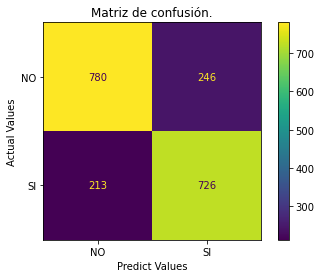

Precision,Recall,Accuracy,F1
0.75,0.77,0.77,0.76


In [14]:
model = lgb.LGBMClassifier(objective="binary", **study.best_params)
model = model.fit(
            X_train,
            y_train,
            eval_set=[(X_test, y_test)],
            eval_metric="binary_logloss",
            #eval_metric="auc",
            early_stopping_rounds=100,
            verbose=0
            
        )
y_pred = model.predict(X_test)
lgbm_precision_score_auc, lgbm_recall_score_auc, lgbm_accuracy_score_auc, lgbm_f1_score_auc = evaluate_model('lgbm grid search', y_test, y_pred)


#binarylogloss\
#con 20\
0.90	0.61	0.96	0.73\
#con 200\
0.90	0.66	0.96	0.76\
#con 400\
0.92	0.70	0.97	0.79\
#con 2000\
	Best value (rmse): 0.09074
	Best params:
		n_estimators: 10000
		learning_rate: 0.02301637191691366
		num_leaves: 488
		max_depth: 11
		min_data_in_leaf: 200
		lambda_l1: 0.18191557593992602
		lambda_l2: 1.8611934831089167
		min_gain_to_split: 0.24644752400202993
		bagging_fraction: 0.9
		bagging_freq: 1
		feature_fraction: 0.6000000000000001

\
\
#auc\

In [15]:
from IPython.display import Markdown as md
md(f'''| Algorithm     | Precision     | Recall        | Accuracy      | F1            |
| ------------- | ------------- | ------------- | ------------- | ------------- |
| Arboles de decision  |{dt_precision_score:.3f}|	{dt_recall_score:.3f}|	{dt_accuracy_score:.3f}|	{dt_f1_score:.3f}|
|Random Forest       |{rf_precision_score:.3f} |	{rf_recall_score:.3f}|	{rf_accuracy_score:.3f}|	{rf_f1_score:.3f}|
|    SVM_sigmoid        | {svm_precision_score_sigmoid:.3f} |	{svm_recall_score_sigmoid:.3f}|	{svm_accuracy_score_sigmoid:.3f}|	{svm_f1_score_sigmoid:.3f}|
|    SVM_rbf        | {svm_precision_score_rbf:.3f} |	{svm_recall_score_rbf:.3f}|	{svm_accuracy_score_rbf:.3f}|	{svm_f1_score_rbf:.3f}|
| LightGBM_optuna      |{lgbm_precision_score_auc:.3f}|	{lgbm_recall_score_auc:.3f}|	{lgbm_accuracy_score_auc:.3f}|	{lgbm_f1_score_auc:.3f}|
'''
       )

| Algorithm     | Precision     | Recall        | Accuracy      | F1            |
| ------------- | ------------- | ------------- | ------------- | ------------- |
| Arboles de decision  |0.712|	0.724|	0.728|	0.718|
|Random Forest       |0.742 |	0.767|	0.761|	0.754|
|    SVM_sigmoid        | 0.533 |	0.535|	0.554|	0.534|
|    SVM_rbf        | 0.587 |	0.622|	0.610|	0.604|
| LightGBM_optuna      |0.747|	0.773|	0.766|	0.760|
